# RT-DETR-L Training

## Config and Paths

In [1]:
import os

DATASET_YAML = '/home/achin/COS40007-Group/dataset/dataset.yaml'
WEIGHTS_PATH = '/home/achin/COS40007-Group/rtdetr-l.pt'
PROJECT_DIR  = '/home/achin/COS40007-Group/runs/defect_detection'
DATASET_ROOT = '/home/achin/COS40007-Group/dataset'

CLASS_NAMES = ['crack', 'pothole', 'wall_peeling']
BACKGROUND_PREFIXES = ('wall-', 'road-')
NC = 3
SPLITS = ['train', 'val', 'test']

IMAGE_DIRS = {s: os.path.join(DATASET_ROOT, s, 'images') for s in SPLITS}
LABEL_DIRS = {s: os.path.join(DATASET_ROOT, s, 'labels') for s in SPLITS}

print("Paths configured:")
for s in SPLITS:
    all_imgs = [f for f in os.listdir(IMAGE_DIRS[s]) if f.endswith('.jpg')]
    bg_imgs  = [f for f in all_imgs if f.startswith(BACKGROUND_PREFIXES)]
    def_imgs = [f for f in all_imgs if not f.startswith(BACKGROUND_PREFIXES)]
    print(f"  {s}: {len(def_imgs)} defect + {len(bg_imgs)} background = {len(all_imgs)} total")

Paths configured:
  train: 542 defect + 79 background = 621 total
  val: 166 defect + 18 background = 184 total
  test: 163 defect + 18 background = 181 total


## Dataset Exploratory Data Analysis


TRAIN: 621 images
  crack: 237 annotations
  pothole: 363 annotations
  wall_peeling: 278 annotations
  background (empty): 84 images
  bg/defect ratio: 0.10 ✅

VAL: 184 images
  crack: 65 annotations
  pothole: 97 annotations
  wall_peeling: 82 annotations
  background (empty): 18 images
  bg/defect ratio: 0.07 ✅



TEST: 181 images
  crack: 66 annotations
  pothole: 120 annotations
  wall_peeling: 78 annotations
  background (empty): 18 images
  bg/defect ratio: 0.07 ✅


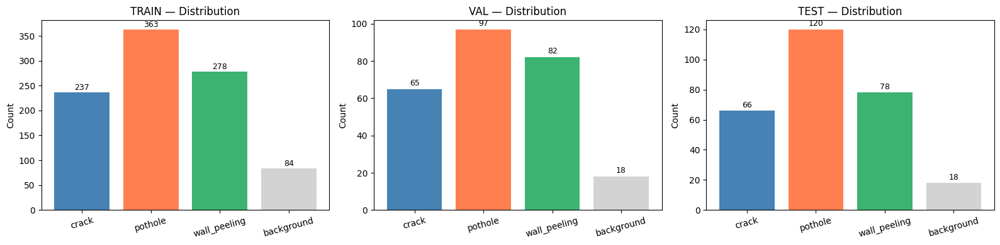

In [2]:
from pathlib import Path
from collections import Counter
import matplotlib.pyplot as plt

def count_labels(split):
    label_dir = Path(LABEL_DIRS[split])
    class_counts = Counter()
    bg_count = 0
    for txt in label_dir.glob('*.txt'):
        content = txt.read_text().strip()
        if not content:
            bg_count += 1
        else:
            for line in content.splitlines():
                if line.strip():
                    cls = int(line.split()[0])
                    class_counts[cls] += 1
    return class_counts, bg_count

for split in SPLITS:
    counts, bg_count = count_labels(split)
    total_images = len(list(Path(IMAGE_DIRS[split]).glob('*.jpg')))
    print(f"\n{split.upper()}: {total_images} images")
    for cls_id in sorted(counts):
        print(f"  {CLASS_NAMES[cls_id]}: {counts[cls_id]} annotations")
    print(f"  background (empty): {bg_count} images")
    ratio = bg_count / max(sum(counts.values()), 1)
    print(f"  bg/defect ratio: {ratio:.2f} {'⚠️ consider reducing' if ratio > 0.5 else '✅'}")

# Bar chart — defect classes only, background shown separately
fig, axes = plt.subplots(1, 3, figsize=(16, 4))
for ax, split in zip(axes, SPLITS):
    counts, bg_count = count_labels(split)
    names  = [CLASS_NAMES[i] for i in sorted(counts)] + ['background']
    values = [counts[i] for i in sorted(counts)] + [bg_count]
    colors = ['steelblue', 'coral', 'mediumseagreen', 'lightgray']
    bars = ax.bar(names, values, color=colors)
    ax.set_title(f'{split.upper()} — Distribution')
    ax.set_ylabel('Count')
    ax.tick_params(axis='x', rotation=15)
    for bar, val in zip(bars, values):
        ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1,
                str(val), ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.savefig(os.path.join(PROJECT_DIR, 'class_distribution.png'), dpi=150)
plt.show()

## Visualise Sample Annotations

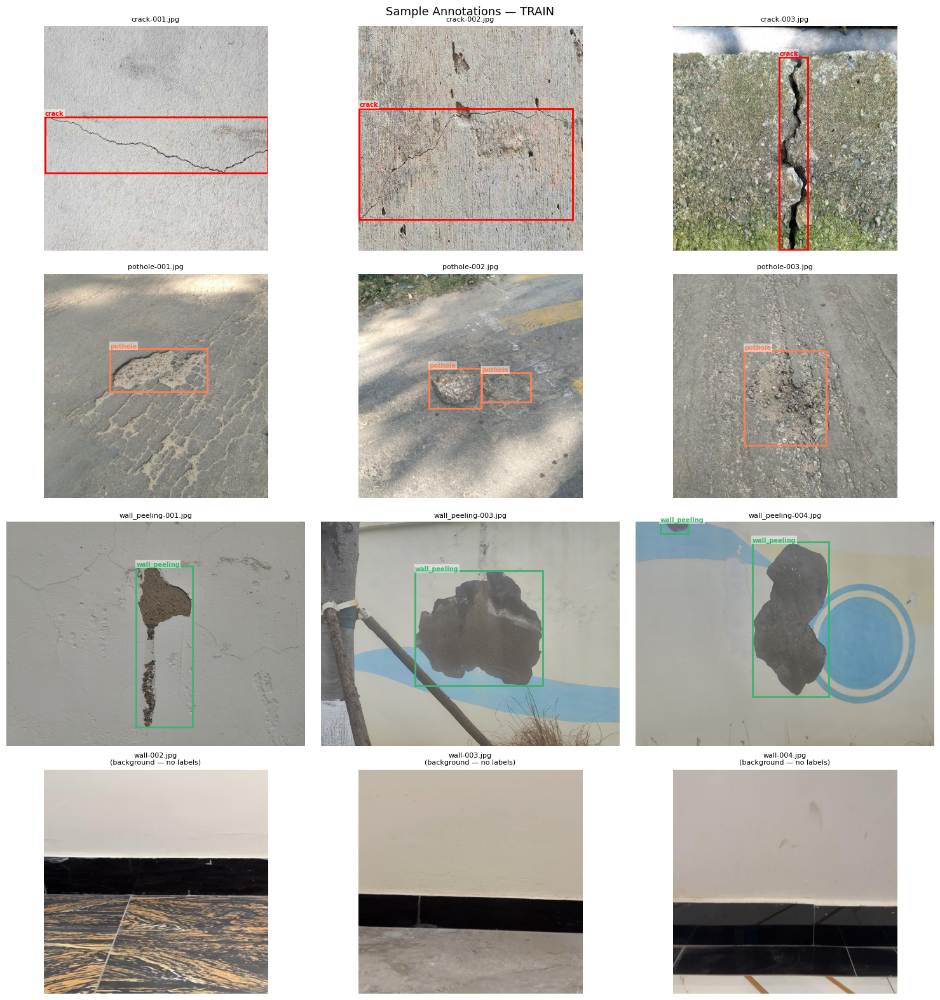

In [3]:
import matplotlib.patches as patches
from PIL import Image

def visualize_samples_by_class(split, n_per_class=3):
    img_dir = Path(IMAGE_DIRS[split])
    lbl_dir = Path(LABEL_DIRS[split])
    COLORS  = ['red', 'coral', 'mediumseagreen']

    # defect rows + 1 background row
    total_rows = NC + 1
    fig, axes = plt.subplots(total_rows, n_per_class, figsize=(5 * n_per_class, 4 * total_rows))

    # --- defect class rows ---
    for row, cls_name in enumerate(CLASS_NAMES):
        cls_imgs = sorted(img_dir.glob(f'{cls_name}-*.jpg'))[:n_per_class]

        for col in range(n_per_class):
            ax = axes[row][col]
            ax.axis('off')

            if col >= len(cls_imgs):
                ax.set_title(f'{cls_name} — no sample', fontsize=9)
                continue

            img_path = cls_imgs[col]
            img = Image.open(img_path).convert('RGB')
            w, h = img.size
            ax.imshow(img)
            ax.set_title(f'{img_path.name}', fontsize=8)

            lbl_path = lbl_dir / (img_path.stem + '.txt')
            if lbl_path.exists():
                for line in lbl_path.read_text().strip().splitlines():
                    parts = line.split()
                    if not parts:
                        continue
                    c, cx, cy, bw, bh = int(parts[0]), float(parts[1]), float(parts[2]), float(parts[3]), float(parts[4])
                    x1 = (cx - bw/2) * w
                    y1 = (cy - bh/2) * h
                    rect = patches.Rectangle(
                        (x1, y1), bw*w, bh*h,
                        linewidth=2, edgecolor=COLORS[c % len(COLORS)], facecolor='none'
                    )
                    ax.add_patch(rect)
                    ax.text(x1, y1 - 4, CLASS_NAMES[c], color=COLORS[c % len(COLORS)],
                            fontsize=7, fontweight='bold',
                            bbox=dict(facecolor='white', alpha=0.5, pad=1, edgecolor='none'))

    bg_imgs = []
    for prefix in BACKGROUND_PREFIXES:
        bg_imgs.extend(sorted(img_dir.glob(f'{prefix}*.jpg')))
    bg_imgs = bg_imgs[:n_per_class]

    for col in range(n_per_class):
        ax = axes[NC][col]
        ax.axis('off')
        if col < len(bg_imgs):
            img = Image.open(bg_imgs[col]).convert('RGB')
            ax.imshow(img)
            ax.set_title(f'{bg_imgs[col].name}\n(background — no labels)', fontsize=8)
        else:
            ax.set_title('background — no sample', fontsize=9)

    plt.suptitle(f'Sample Annotations — {split.upper()}', fontsize=13)
    plt.tight_layout()
    plt.savefig(os.path.join(PROJECT_DIR, f'sample_annotations_{split}.png'), dpi=150)
    plt.show()

visualize_samples_by_class('train', n_per_class=3)

## Iterative Training — Setup

In [4]:
from pathlib import Path

for split in SPLITS:
    cache = Path(LABEL_DIRS[split]).parent / 'labels.cache'
    if cache.exists():
        cache.unlink()
        print(f"Deleted cache: {cache}")
    else:
        print(f"No cache found for {split} — OK")

Deleted cache: /home/achin/COS40007-Group/dataset/train/labels.cache
Deleted cache: /home/achin/COS40007-Group/dataset/val/labels.cache
Deleted cache: /home/achin/COS40007-Group/dataset/test/labels.cache


In [5]:
from pathlib import Path
import random

SEED = 42
SPLIT_DIR = Path('/home/achin/COS40007-Group/dataset/splits')
SPLIT_DIR.mkdir(parents=True, exist_ok=True)

# Cumulative train sizes for the 6 iterations: 400 -> 450 -> 500 -> 550 -> 600 -> 621.
ITER_TRAIN_SIZES = [400, 450, 500, 550, 600, 621]


def make_splits(force: bool = False):
    """Generate per-iteration train lists + fixed val/test lists, deterministically.

    Writes:
      dataset/splits/iter{0..5}_train.txt  (cumulative train image paths)
      dataset/splits/val.txt               (184 paths, fixed)
      dataset/splits/test.txt              (181 paths, fixed)

    Idempotent: skips files that already exist unless `force=True`.
    Seed=42 => the same 400-image baseline + same batch order every run.
    """
    train_imgs = sorted(
        p for p in (Path(DATASET_ROOT) / 'train' / 'images').glob('*.jpg')
    )
    rng = random.Random(SEED)
    rng.shuffle(train_imgs)

    written = []
    for n, cum in enumerate(ITER_TRAIN_SIZES):
        out = SPLIT_DIR / f'iter{n}_train.txt'
        if out.exists() and not force:
            continue
        subset = train_imgs[:cum]
        out.write_text('\n'.join(str(p) for p in subset) + '\n', encoding='utf-8')
        written.append(str(out))

    for split in ('val', 'test'):
        out = SPLIT_DIR / f'{split}.txt'
        if out.exists() and not force:
            continue
        files = sorted((Path(DATASET_ROOT) / split / 'images').glob('*.jpg'))
        out.write_text('\n'.join(str(p) for p in files) + '\n', encoding='utf-8')
        written.append(str(out))

    print(f'make_splits: wrote {len(written)} files into {SPLIT_DIR}')
    for p in written:
        print(f'  {p}')


make_splits()


make_splits: wrote 8 files into /home/achin/COS40007-Group/dataset/splits
  /home/achin/COS40007-Group/dataset/splits/iter0_train.txt
  /home/achin/COS40007-Group/dataset/splits/iter1_train.txt
  /home/achin/COS40007-Group/dataset/splits/iter2_train.txt
  /home/achin/COS40007-Group/dataset/splits/iter3_train.txt
  /home/achin/COS40007-Group/dataset/splits/iter4_train.txt
  /home/achin/COS40007-Group/dataset/splits/iter5_train.txt
  /home/achin/COS40007-Group/dataset/splits/val.txt
  /home/achin/COS40007-Group/dataset/splits/test.txt


In [6]:
def write_iter_data_yaml(n: int) -> str:
    """Emit dataset/dataset_iter{n}.yaml pointing train/val/test at the per-iter .txt files.

    Ultralytics accepts a .txt path under `train:` (one image path per line) so the
    iter loop can grow the train set without touching the underlying image directories.
    Returns the YAML path as a string.
    """
    p = Path(f'/home/achin/COS40007-Group/dataset/dataset_iter{n}.yaml')
    p.write_text(
        f"train: /home/achin/COS40007-Group/dataset/splits/iter{n}_train.txt\n"
        f"val:   /home/achin/COS40007-Group/dataset/splits/val.txt\n"
        f"test:  /home/achin/COS40007-Group/dataset/splits/test.txt\n"
        f"nc: {NC}\n"
        f"names: {CLASS_NAMES}\n",
        encoding='utf-8',
    )
    return str(p)


print(f'write_iter_data_yaml ready (caller passes n in 0..{len(ITER_TRAIN_SIZES) - 1})')


write_iter_data_yaml ready (caller passes n in 0..5)


In [7]:
from ultralytics import RTDETR
import json
import time
import random as _random
from pathlib import Path
import pandas as pd
from PIL import Image as _PILImage

iterlog_path = Path(PROJECT_DIR) / 'rtdetr_l_v5_iterlog.csv'
if not iterlog_path.exists():
    iterlog_path.write_text(
        'iter,cum_train_imgs,new_imgs,mAP50,mAP50_95,precision,recall,'
        'pct_iou_gt_0_5,pct_iou_gt_0_9,best_epoch,time_h,notes\n',
        encoding='utf-8',
    )

stop_flag = Path(PROJECT_DIR) / 'STOP'
final_iter = None  # tracks the last successfully completed iter


def _read_first_xywh(label_path: Path):
    """Read the first YOLO-format normalized xywh box from a .txt. Returns None if absent."""
    if not label_path.exists():
        return None
    for line in label_path.read_text(encoding='utf-8').splitlines():
        parts = line.split()
        if not parts:
            continue
        try:
            return (float(parts[1]), float(parts[2]), float(parts[3]), float(parts[4]))
        except (ValueError, IndexError):
            continue
    return None


def _iou_xywh(box_a, box_b, w, h):
    """IoU between two normalized xywh boxes given image dims (w, h)."""
    ax1 = (box_a[0] - box_a[2] / 2) * w
    ay1 = (box_a[1] - box_a[3] / 2) * h
    ax2 = (box_a[0] + box_a[2] / 2) * w
    ay2 = (box_a[1] + box_a[3] / 2) * h
    bx1 = (box_b[0] - box_b[2] / 2) * w
    by1 = (box_b[1] - box_b[3] / 2) * h
    bx2 = (box_b[0] + box_b[2] / 2) * w
    by2 = (box_b[1] + box_b[3] / 2) * h
    inter_x1 = max(ax1, bx1); inter_y1 = max(ay1, by1)
    inter_x2 = min(ax2, bx2); inter_y2 = min(ay2, by2)
    inter = max(0.0, inter_x2 - inter_x1) * max(0.0, inter_y2 - inter_y1)
    area_a = max(0.0, ax2 - ax1) * max(0.0, ay2 - ay1)
    area_b = max(0.0, bx2 - bx1) * max(0.0, by2 - by1)
    union = area_a + area_b - inter
    return inter / union if union > 0 else 0.0


def _iterlog_has_row(path: Path, n: int) -> bool:
    if not path.exists():
        return False
    for line in path.read_text(encoding='utf-8').splitlines()[1:]:
        if line.startswith(f'{n},'):
            return True
    return False


for n in range(len(ITER_TRAIN_SIZES)):
    cum = ITER_TRAIN_SIZES[n]
    new = cum - (ITER_TRAIN_SIZES[n-1] if n > 0 else 0)
    run_name = f'rtdetr_l_v5_iter{n}'
    run_dir = Path(PROJECT_DIR) / run_name

    last_pt = run_dir / 'weights' / 'last.pt'
    if last_pt.exists() and _iterlog_has_row(iterlog_path, n):
        print(f'iter {n}: already complete (last.pt + iterlog row present), skipping')
        final_iter = n
        continue

    if stop_flag.exists():
        print(f'STOP sentinel present, exiting at iter {n}')
        break

    data_yaml = write_iter_data_yaml(n)
    if n == 0:
        model = RTDETR(WEIGHTS_PATH)
    else:
        prev_last = Path(PROJECT_DIR) / f'rtdetr_l_v5_iter{n-1}' / 'weights' / 'last.pt'
        if not prev_last.exists():
            print(f'iter {n}: previous last.pt missing at {prev_last}; aborting')
            break
        model = RTDETR(str(prev_last))
    train_kwargs = dict(
        data=data_yaml,
        epochs=50, imgsz=640, batch=8,
        workers=4, amp=True, device=0,
        project=PROJECT_DIR, name=run_name, exist_ok=True,
        optimizer='AdamW', lr0=1e-4, lrf=0.001, weight_decay=1e-4,
        warmup_epochs=5, warmup_bias_lr=0.1, patience=50,
        hsv_h=0.015, hsv_s=0.7, hsv_v=0.4,
        fliplr=0.5, flipud=0.1, scale=0.5,
        mosaic=1.0, copy_paste=0.3, degrees=10.0, translate=0.1,
        save=True, plots=True,
    )

    t0 = time.time()
    print(f'\n=== iter {n}: training ({cum} train images, {new} new) ===')
    model.train(**train_kwargs)
    t_h = (time.time() - t0) / 3600.0

    # Val for mAP50 + per-class
    val = model.val(data=data_yaml, split='val', plots=False, save_json=False, verbose=False)
    map50 = float(val.box.map50); map50_95 = float(val.box.map)
    P = float(val.box.mp); R = float(val.box.mr)
    per_class = [float(x) for x in val.box.ap50]

    # Per-test-image IoU
    test_files = [Path(l) for l in SPLIT_DIR.joinpath('test.txt').read_text(encoding='utf-8').splitlines() if l.strip()]
    preds = model.predict(source=[str(p) for p in test_files], conf=0.001, save=False, verbose=False)
    iou_rows = []
    for img_p, r in zip(test_files, preds):
        with _PILImage.open(img_p) as im:
            w, h = im.size
        gt_n = _read_first_xywh(Path('/home/achin/COS40007-Group/dataset/test/labels') / (img_p.stem + '.txt'))
        if len(r.boxes) > 0:
            conf = float(r.boxes.conf[0])
            pred_xyxy = r.boxes.xyxy[0].cpu().numpy().tolist()
            pred_n = ((pred_xyxy[0]+pred_xyxy[2])/(2*w),
                      (pred_xyxy[1]+pred_xyxy[3])/(2*h),
                      (pred_xyxy[2]-pred_xyxy[0])/w,
                      (pred_xyxy[3]-pred_xyxy[1])/h)
        else:
            conf = 0.0; pred_xyxy = None; pred_n = None
        if gt_n is not None and pred_n is not None:
            iou = _iou_xywh(gt_n, pred_n, w, h)
            gt_xyxy = [(gt_n[0]-gt_n[2]/2)*w, (gt_n[1]-gt_n[3]/2)*h,
                       (gt_n[0]+gt_n[2]/2)*w, (gt_n[1]+gt_n[3]/2)*h]
        else:
            iou = 0.0; gt_xyxy = None
        iou_rows.append({
            'image': img_p.name, 'conf': conf,
            'pred_xyxy': pred_xyxy, 'gt_xyxy': gt_xyxy, 'iou': iou,
        })
    iou_csv = Path(PROJECT_DIR) / f'{run_name}_test_iou.csv'
    pd.DataFrame(iou_rows).to_csv(iou_csv, index=False)
    ious = [row['iou'] for row in iou_rows]
    pct_5 = sum(1 for i in ious if i > 0.5) / max(len(ious), 1)
    pct_9 = sum(1 for i in ious if i > 0.9) / max(len(ious), 1)

    # 2 sample images (random pick from test set)
    sample_dir = Path(PROJECT_DIR) / f'{run_name}_samples'
    sample_dir.mkdir(exist_ok=True)
    _random.seed(SEED + n)  # reproducible per-iter sample
    sample_imgs = _random.sample(test_files, min(2, len(test_files)))
    model.predict(source=[str(p) for p in sample_imgs], conf=0.25, save=True,
                  project=str(sample_dir), name='.', exist_ok=True)

    # Best epoch from results.csv
    best_epoch = ''
    res_csv = run_dir / 'results.csv'
    if res_csv.exists():
        try:
            res = pd.read_csv(res_csv)
            best_epoch = int(res['metrics/mAP50(B)'].idxmax()) + 1
        except Exception:
            pass

    # Per-iter summary JSON
    summary = {
        'iter': n, 'cum_train_imgs': cum, 'new_imgs': new,
        'mAP50': map50, 'mAP50_95': map50_95, 'precision': P, 'recall': R,
        'pct_iou_gt_0_5': pct_5, 'pct_iou_gt_0_9': pct_9,
        'best_epoch': best_epoch, 'time_h': t_h,
        'per_class_ap50': dict(zip(CLASS_NAMES, per_class)),
    }
    summary_path = Path(PROJECT_DIR) / f'{run_name}_summary.json'
    summary_path.write_text(json.dumps(summary, indent=2), encoding='utf-8')

    # Append iterlog row
    with iterlog_path.open('a', encoding='utf-8') as f:
        f.write(f'{n},{cum},{new},{map50:.4f},{map50_95:.4f},{P:.4f},{R:.4f},'
                f'{pct_5:.4f},{pct_9:.4f},{best_epoch},{t_h:.2f},\n')

    print(f'iter {n} done: mAP50={map50:.4f} %IoU>0.5={pct_5:.3f} time={t_h:.2f}h')

    final_iter = n
    if map50 >= 0.85:
        stop_flag.touch()
        print(f'iter {n} hit mAP50 >= 0.85; STOP sentinel written')
        break

print(f'\nFinal completed iter: {final_iter}')



=== iter 0: training (400 train images, 400 new) ===


Ultralytics 8.4.56 🚀 Python-3.9.25 torch-2.8.0+cu128 CUDA:0 (NVIDIA A100-SXM4-80GB, 81153MiB)


engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.3, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/home/achin/COS40007-Group/dataset/dataset_iter0.yaml, degrees=10.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.1, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0001, lrf=0.001, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/home/achin/COS40007-Group/rtdetr-l.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=rtdetr_l_v5_iter0, nbs=64, nms=False, opset=None, optimize=False, optimizer=AdamW, overlap_mask=True, patience=50, perspective=0.0, pl

Overriding model.yaml nc=80 with nc=3


WARNING ⚠️ no model scale passed. Assuming scale='l'.



                   from  n    params  module                                       arguments                     


  0                  -1  1     25248  ultralytics.nn.modules.block.HGStem          [3, 32, 48]                   


  1                  -1  6    155072  ultralytics.nn.modules.block.HGBlock         [48, 48, 128, 3, 6]           


  2                  -1  1      1408  ultralytics.nn.modules.conv.DWConv           [128, 128, 3, 2, 1, False]    


  3                  -1  6    839296  ultralytics.nn.modules.block.HGBlock         [128, 96, 512, 3, 6]          


  4                  -1  1      5632  ultralytics.nn.modules.conv.DWConv           [512, 512, 3, 2, 1, False]    


  5                  -1  6   1695360  ultralytics.nn.modules.block.HGBlock         [512, 192, 1024, 5, 6, True, False]


  6                  -1  6   2055808  ultralytics.nn.modules.block.HGBlock         [1024, 192, 1024, 5, 6, True, True]


  7                  -1  6   2055808  ultralytics.nn.modules.block.HGBlock         [1024, 192, 1024, 5, 6, True, True]


  8                  -1  1     11264  ultralytics.nn.modules.conv.DWConv           [1024, 1024, 3, 2, 1, False]  


  9                  -1  6   6708480  ultralytics.nn.modules.block.HGBlock         [1024, 384, 2048, 5, 6, True, False]


 10                  -1  1    524800  ultralytics.nn.modules.conv.Conv             [2048, 256, 1, 1, None, 1, 1, False]


 11                  -1  1    789760  ultralytics.nn.modules.transformer.AIFI      [256, 1024, 8]                


 12                  -1  1     66048  ultralytics.nn.modules.conv.Conv             [256, 256, 1, 1]              


 13                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          


 14                   7  1    262656  ultralytics.nn.modules.conv.Conv             [1024, 256, 1, 1, None, 1, 1, False]


 15            [-2, -1]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 16                  -1  3   2232320  ultralytics.nn.modules.block.RepC3           [512, 256, 3]                 


 17                  -1  1     66048  ultralytics.nn.modules.conv.Conv             [256, 256, 1, 1]              


 18                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          


 19                   3  1    131584  ultralytics.nn.modules.conv.Conv             [512, 256, 1, 1, None, 1, 1, False]


 20            [-2, -1]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 21                  -1  3   2232320  ultralytics.nn.modules.block.RepC3           [512, 256, 3]                 


 22                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              


 23            [-1, 17]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 24                  -1  3   2232320  ultralytics.nn.modules.block.RepC3           [512, 256, 3]                 


 25                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              


 26            [-1, 12]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 27                  -1  3   2232320  ultralytics.nn.modules.block.RepC3           [512, 256, 3]                 


 28        [21, 24, 27]  1   7308017  ultralytics.nn.modules.head.RTDETRDecoder    [3, [256, 256, 256]]          


rt-detr-l summary: 465 layers, 32,812,241 parameters, 32,812,241 gradients, 108.0 GFLOPs


Transferred 926/941 items from pretrained weights


AMP: running Automatic Mixed Precision (AMP) checks...


WARNING ⚠️ AMP: checks skipped. Offline and unable to download YOLO26n for AMP checks. Setting 'amp=True'. If you experience zero-mAP or NaN losses you can disable AMP with amp=False.


train: Fast image access ✅ (ping: 0.4±0.0 ms, read: 71.0±44.3 MB/s, size: 74.3 KB)


train: Scanning /home/achin/COS40007-Group/dataset/train/labels... 117 images, 0 backgrounds, 0 corrupt: 29% ━━━╸──────── 117/400 341.7it/s 0.1s<0.8s

train: Scanning /home/achin/COS40007-Group/dataset/train/labels... 237 images, 3 backgrounds, 0 corrupt: 59% ━━━━━━━───── 237/400 598.0it/s 0.2s<0.3s

train: Scanning /home/achin/COS40007-Group/dataset/train/labels... 360 images, 49 backgrounds, 0 corrupt: 90% ━━━━━━━━━━╸─ 360/400 778.5it/s 0.3s<0.1s

train: Scanning /home/achin/COS40007-Group/dataset/train/labels... 400 images, 49 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 400/400 1.2Kit/s 0.3s

train: New cache created: /home/achin/COS40007-Group/dataset/train/labels.cache


val: Fast image access ✅ (ping: 0.4±0.0 ms, read: 120.2±53.7 MB/s, size: 152.2 KB)


val: Scanning /home/achin/COS40007-Group/dataset/val/labels... 102 images, 0 backgrounds, 0 corrupt: 55% ━━━━━━╸───── 102/184 304.7it/s 0.1s<0.3s

val: Scanning /home/achin/COS40007-Group/dataset/val/labels... 184 images, 18 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 184/184 1.0Kit/s 0.2s

val: New cache created: /home/achin/COS40007-Group/dataset/val/labels.cache


/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


optimizer: AdamW(lr=0.0001, momentum=0.937) with parameter groups 143 weight(decay=0.0), 206 weight(decay=0.0001), 226 bias(decay=0.0)


Plotting labels to /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v5_iter0/labels.jpg... 


Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v5_iter0
Starting training for 50 epochs...



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       1/50      21.5G      1.591      14.47     0.9892          8       1280: 0% ──────────── 0/50  7.7s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       1/50      21.5G      1.428      14.51      1.048          8       1280: 2% ──────────── 1/50 1.6s/it 8.2s<1:21

       1/50      21.5G      1.372      16.23      1.025          8       1280: 4% ──────────── 2/50 1.1it/s 8.7s<44.8s

       1/50      21.5G      1.403      14.71     0.9896          8       1280: 6% ╸─────────── 3/50 1.3it/s 9.2s<35.7s

       1/50      21.5G      1.342      16.15     0.9373          8       1280: 8% ╸─────────── 4/50 1.5it/s 9.7s<30.0s

       1/50      21.5G       1.35      15.89     0.9314          8       1280: 10% ━─────────── 5/50 1.7it/s 10.2s<26.0s

       1/50      21.5G      1.338       16.3     0.9328          8       1280: 12% ━─────────── 6/50 1.9it/s 10.6s<23.0s

       1/50      21.7G      1.323      16.14     0.9121          8       1280: 14% ━╸────────── 7/50 1.9it/s 11.2s<22.9s

       1/50      21.7G      1.474      14.46      1.025          8       1280: 16% ━╸────────── 8/50 2.0it/s 11.6s<20.5s

       1/50      21.7G      1.624       13.1      1.224          8       1280: 18% ━━────────── 9/50 2.1it/s 12.0s<19.2s

       1/50      21.7G      1.746      12.03      1.364          8       1280: 20% ━━────────── 10/50 2.1it/s 12.5s<18.6s

       1/50      21.7G      1.847      11.05       1.43          8       1280: 22% ━━╸───────── 11/50 2.1it/s 12.9s<18.4s

       1/50      21.7G      1.913      10.21      1.537          8       1280: 24% ━━╸───────── 12/50 2.2it/s 13.4s<17.6s

       1/50      21.7G      1.945      9.494       1.58          8       1280: 26% ━━━───────── 13/50 2.2it/s 13.8s<16.7s

       1/50      21.7G      1.976      8.882      1.626          8       1280: 28% ━━━───────── 14/50 2.1it/s 14.3s<16.9s

       1/50      21.7G      1.991      8.355      1.643          8       1280: 30% ━━━╸──────── 15/50 2.1it/s 14.8s<16.7s

       1/50      21.7G          2      7.877      1.665          8       1280: 32% ━━━╸──────── 16/50 2.2it/s 15.2s<15.6s

       1/50      21.7G      1.985       7.47      1.652          8       1280: 34% ━━━━──────── 17/50 2.2it/s 15.7s<14.7s

       1/50      21.7G      1.974      7.099      1.626          8       1280: 36% ━━━━──────── 18/50 2.3it/s 16.1s<13.8s

       1/50      21.7G      1.963      6.764      1.611          8       1280: 38% ━━━━╸─────── 19/50 2.3it/s 16.5s<13.6s

       1/50      21.7G      1.969      6.462      1.608          8       1280: 40% ━━━━╸─────── 20/50 2.4it/s 16.9s<12.6s

       1/50      21.7G      1.963      6.185        1.6          8       1280: 42% ━━━━━─────── 21/50 2.4it/s 17.3s<12.2s

       1/50      21.7G      1.949      5.942      1.588          8       1280: 44% ━━━━━─────── 22/50 2.5it/s 17.7s<11.4s

       1/50      21.7G      1.933      5.724      1.584          8       1280: 46% ━━━━━╸────── 23/50 2.4it/s 18.2s<11.4s

       1/50      21.7G       1.92      5.517      1.566          8       1280: 48% ━━━━━╸────── 24/50 2.4it/s 18.6s<10.7s

       1/50      21.7G      1.924      5.318       1.56          8       1280: 50% ━━━━━━────── 25/50 2.4it/s 19.0s<10.5s

       1/50      21.7G      1.936       5.13      1.563          8       1280: 52% ━━━━━━────── 26/50 2.5it/s 19.4s<9.8s

       1/50      21.7G      1.933      4.958      1.555          8       1280: 54% ━━━━━━────── 27/50 2.4it/s 19.8s<9.5s

       1/50      21.7G      1.942      4.794      1.546          8       1280: 56% ━━━━━━╸───── 28/50 2.5it/s 20.2s<8.9s

       1/50      21.7G      1.931      4.653      1.529          8       1280: 58% ━━━━━━╸───── 29/50 2.4it/s 20.6s<8.7s

       1/50      21.7G      1.922       4.52       1.51          8       1280: 60% ━━━━━━━───── 30/50 2.5it/s 21.0s<8.1s

       1/50      21.7G      1.906      4.396      1.489          8       1280: 62% ━━━━━━━───── 31/50 2.4it/s 21.5s<7.9s

       1/50      21.7G      1.903      4.273      1.472          8       1280: 64% ━━━━━━━╸──── 32/50 2.4it/s 21.8s<7.3s

       1/50      21.7G      1.902       4.16      1.471          8       1280: 66% ━━━━━━━╸──── 33/50 2.4it/s 22.3s<7.0s

       1/50      21.7G      1.895      4.053      1.455          8       1280: 68% ━━━━━━━━──── 34/50 2.5it/s 22.6s<6.4s

       1/50      21.7G      1.889      3.953      1.442          8       1280: 70% ━━━━━━━━──── 35/50 2.5it/s 23.1s<6.1s

       1/50      21.7G      1.886      3.854      1.428          8       1280: 72% ━━━━━━━━╸─── 36/50 2.5it/s 23.4s<5.6s

       1/50      21.7G      1.883      3.763      1.422          8       1280: 74% ━━━━━━━━╸─── 37/50 2.5it/s 23.9s<5.3s

       1/50      21.7G      1.876       3.68      1.415          8       1280: 76% ━━━━━━━━━─── 38/50 2.4it/s 24.3s<5.1s

       1/50      21.7G      1.869        3.6      1.413          8       1280: 78% ━━━━━━━━━─── 39/50 2.3it/s 24.8s<4.7s

       1/50      21.7G      1.859      3.526      1.403          8       1280: 80% ━━━━━━━━━╸── 40/50 2.4it/s 25.2s<4.1s

       1/50      21.7G      1.854      3.453      1.397          8       1280: 82% ━━━━━━━━━╸── 41/50 2.4it/s 25.6s<3.8s

       1/50      21.7G      1.849      3.385      1.386          8       1280: 84% ━━━━━━━━━━── 42/50 2.4it/s 26.0s<3.3s

       1/50      21.7G      1.838      3.323      1.373          8       1280: 86% ━━━━━━━━━━── 43/50 2.4it/s 26.4s<3.0s

       1/50      21.7G      1.827      3.263      1.363          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.4it/s 26.8s<2.5s

       1/50      21.7G      1.822      3.204      1.356          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.4it/s 27.2s<2.1s

       1/50      21.7G      1.814       3.15      1.345          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.3it/s 27.7s<1.7s

       1/50      21.7G        1.8      3.103      1.334          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.3it/s 28.1s<1.3s

       1/50      21.7G      1.792      3.052      1.327          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.4it/s 28.5s<0.8s

       1/50      21.7G      1.785      3.002      1.317          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.3it/s 29.0s<0.4s

       1/50      21.7G      1.785      3.002      1.317          8       1280: 100% ━━━━━━━━━━━━ 50/50 1.7it/s 29.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 8% ━─────────── 1/12 5.4s/it 1.6s<59.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 3/12 3.9it/s 1.8s<2.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 6.2it/s 1.9s<1.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 8.3it/s 2.1s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 10.2it/s 2.2s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 11.2it/s 2.4s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 3.3it/s 3.6s

                   all        184        244   6.64e-05     0.0378   3.23e-05   6.58e-06



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       2/50      21.7G      1.518     0.5123       1.08          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       2/50      21.8G      1.452     0.5783     0.9837          8       1280: 2% ──────────── 1/50 1.4s/it 0.8s<1:11

       2/50      21.8G      1.434     0.5826     0.9405          8       1280: 4% ──────────── 2/50 1.3it/s 1.2s<37.8s

       2/50      21.8G      1.428     0.5798      0.912          8       1280: 6% ╸─────────── 3/50 1.5it/s 1.7s<31.2s

       2/50      21.8G      1.413     0.5915     0.9008          8       1280: 8% ╸─────────── 4/50 1.8it/s 2.1s<25.3s

       2/50      21.8G      1.359     0.6348      0.878          8       1280: 10% ━─────────── 5/50 1.9it/s 2.6s<23.7s

       2/50      21.8G      1.357     0.6385     0.8961          8       1280: 12% ━─────────── 6/50 2.0it/s 3.0s<21.7s

       2/50      21.8G      1.338     0.6511     0.8613          8       1280: 14% ━╸────────── 7/50 2.2it/s 3.4s<19.4s

       2/50      21.8G       1.35      0.639     0.8515          8       1280: 16% ━╸────────── 8/50 2.3it/s 3.8s<18.4s

       2/50      21.8G      1.329     0.6578     0.8548          8       1280: 18% ━━────────── 9/50 2.3it/s 4.2s<18.2s

       2/50      21.8G      1.313     0.6683     0.8439          8       1280: 20% ━━────────── 10/50 2.3it/s 4.6s<17.1s

       2/50      21.8G      1.313     0.6655     0.8296          8       1280: 22% ━━╸───────── 11/50 2.4it/s 5.0s<16.3s

       2/50      21.8G      1.319     0.6647     0.8289          8       1280: 24% ━━╸───────── 12/50 2.4it/s 5.5s<16.1s

       2/50      21.8G      1.322     0.6622     0.8225          8       1280: 26% ━━━───────── 13/50 2.3it/s 5.9s<16.1s

       2/50      21.8G      1.318       0.67     0.8273          8       1280: 28% ━━━───────── 14/50 2.4it/s 6.3s<15.1s

       2/50      21.8G      1.316     0.6732     0.8284          8       1280: 30% ━━━╸──────── 15/50 2.3it/s 6.8s<15.3s

       2/50      21.8G      1.308     0.6816     0.8306          8       1280: 32% ━━━╸──────── 16/50 2.4it/s 7.2s<14.4s

       2/50      21.8G      1.302     0.6866     0.8367          8       1280: 34% ━━━━──────── 17/50 2.3it/s 7.6s<14.2s

       2/50      21.8G      1.313     0.6758     0.8499          8       1280: 36% ━━━━──────── 18/50 2.3it/s 8.1s<13.8s

       2/50      21.8G      1.324     0.6654     0.8439          8       1280: 38% ━━━━╸─────── 19/50 2.4it/s 8.4s<12.8s

       2/50      21.8G      1.328     0.6585     0.8417          8       1280: 40% ━━━━╸─────── 20/50 2.4it/s 8.9s<12.4s

       2/50      21.8G      1.325     0.6606     0.8512          8       1280: 42% ━━━━━─────── 21/50 2.3it/s 9.3s<12.5s

       2/50      21.8G      1.326     0.6603     0.8512          8       1280: 44% ━━━━━─────── 22/50 2.4it/s 9.7s<11.6s

       2/50      21.8G      1.323     0.6601      0.851          8       1280: 46% ━━━━━╸────── 23/50 2.5it/s 10.1s<10.9s

       2/50      21.8G       1.33     0.6527     0.8562          8       1280: 48% ━━━━━╸────── 24/50 2.4it/s 10.5s<10.8s

       2/50      21.8G      1.332     0.6461     0.8583          8       1280: 50% ━━━━━━────── 25/50 2.4it/s 10.9s<10.3s

       2/50      21.8G      1.339     0.6386     0.8607          8       1280: 52% ━━━━━━────── 26/50 2.5it/s 11.3s<9.6s

       2/50      21.8G      1.337     0.6407     0.8667          8       1280: 54% ━━━━━━────── 27/50 2.4it/s 11.8s<9.4s

       2/50      21.8G      1.329     0.6465     0.8647          8       1280: 56% ━━━━━━╸───── 28/50 2.5it/s 12.1s<8.8s

       2/50      21.8G      1.327     0.6473     0.8578          8       1280: 58% ━━━━━━╸───── 29/50 2.3it/s 12.7s<9.2s

       2/50      21.8G      1.333     0.6421       0.86          8       1280: 60% ━━━━━━━───── 30/50 2.3it/s 13.1s<8.6s

       2/50      21.8G      1.333     0.6427     0.8553          8       1280: 62% ━━━━━━━───── 31/50 2.4it/s 13.5s<7.8s

       2/50      21.8G      1.332     0.6422     0.8536          8       1280: 64% ━━━━━━━╸──── 32/50 2.5it/s 13.9s<7.2s

       2/50      21.8G      1.328     0.6455      0.853          8       1280: 66% ━━━━━━━╸──── 33/50 2.4it/s 14.3s<7.0s

       2/50      21.8G      1.328     0.6442     0.8476          8       1280: 68% ━━━━━━━━──── 34/50 2.5it/s 14.7s<6.4s

       2/50      21.8G      1.317     0.6555      0.841          8       1280: 70% ━━━━━━━━──── 35/50 2.5it/s 15.1s<5.9s

       2/50      21.8G      1.311     0.6587     0.8374          8       1280: 72% ━━━━━━━━╸─── 36/50 2.5it/s 15.5s<5.7s

       2/50      21.8G      1.311     0.6582     0.8323          8       1280: 74% ━━━━━━━━╸─── 37/50 2.5it/s 15.9s<5.1s

       2/50      21.8G      1.308     0.6602     0.8302          8       1280: 76% ━━━━━━━━━─── 38/50 2.5it/s 16.3s<4.7s

       2/50      21.8G       1.31     0.6572     0.8253          8       1280: 78% ━━━━━━━━━─── 39/50 2.5it/s 16.7s<4.4s

       2/50      21.8G       1.31     0.6575     0.8211          8       1280: 80% ━━━━━━━━━╸── 40/50 2.5it/s 17.0s<3.9s

       2/50      21.8G      1.311     0.6573     0.8158          8       1280: 82% ━━━━━━━━━╸── 41/50 2.5it/s 17.5s<3.6s

       2/50      21.8G      1.309     0.6583     0.8131          8       1280: 84% ━━━━━━━━━━── 42/50 2.5it/s 17.8s<3.2s

       2/50      21.8G      1.303     0.6624      0.808          8       1280: 86% ━━━━━━━━━━── 43/50 2.4it/s 18.3s<2.9s

       2/50      21.8G      1.308     0.6571     0.8095          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.4it/s 18.7s<2.5s

       2/50      21.8G      1.303     0.6618      0.805          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.5it/s 19.1s<2.0s

       2/50      21.8G      1.302     0.6634     0.8001          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.5it/s 19.5s<1.6s

       2/50      21.8G        1.3     0.6653     0.7972          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.3it/s 20.0s<1.3s

       2/50      21.8G      1.296     0.6691      0.792          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.3it/s 20.5s<0.9s

       2/50      21.8G      1.288      0.676     0.7881          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.4it/s 20.9s<0.4s

       2/50      21.8G      1.288      0.676     0.7881          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.4it/s 20.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.0it/s 0.1s<2.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.8it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.7it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.5it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.4it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.9it/s 0.9s

                   all        184        244   7.32e-05     0.0615   2.18e-05   3.03e-06



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       3/50      21.9G      1.041     0.9107     0.5589          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       3/50      21.9G      1.071     0.9067     0.5862          8       1280: 2% ──────────── 1/50 1.6s/it 0.9s<1:17

       3/50      21.9G      1.173     0.8009      0.641          8       1280: 4% ──────────── 2/50 1.2it/s 1.2s<38.8s

       3/50      21.9G      1.157     0.8083     0.6249          8       1280: 6% ╸─────────── 3/50 1.6it/s 1.6s<28.6s

       3/50      21.9G      1.161     0.7992     0.6049          8       1280: 8% ╸─────────── 4/50 1.9it/s 2.0s<23.8s

       3/50      21.9G      1.158      0.795     0.6021          8       1280: 10% ━─────────── 5/50 2.1it/s 2.4s<21.8s

       3/50      21.9G      1.174     0.7816     0.6169          8       1280: 12% ━─────────── 6/50 2.2it/s 2.8s<19.6s

       3/50      21.9G      1.164     0.7837     0.6304          8       1280: 14% ━╸────────── 7/50 2.3it/s 3.2s<18.5s

       3/50      21.9G      1.179     0.7801     0.6363          8       1280: 16% ━╸────────── 8/50 2.3it/s 3.6s<17.9s

       3/50      21.9G      1.191     0.7718     0.6346          8       1280: 18% ━━────────── 9/50 2.3it/s 4.1s<17.7s

       3/50      21.9G      1.219     0.7551     0.6522          8       1280: 20% ━━────────── 10/50 2.4it/s 4.5s<16.7s

       3/50      21.9G      1.224     0.7494     0.6547          8       1280: 22% ━━╸───────── 11/50 2.3it/s 4.9s<16.6s

       3/50      21.9G      1.219     0.7514     0.6506          8       1280: 24% ━━╸───────── 12/50 2.4it/s 5.3s<15.9s

       3/50      21.9G      1.219     0.7516     0.6522          8       1280: 26% ━━━───────── 13/50 2.3it/s 5.8s<16.4s

       3/50      21.9G      1.204     0.7645     0.6568          8       1280: 28% ━━━───────── 14/50 2.3it/s 6.2s<15.4s

       3/50      21.9G      1.212     0.7612      0.659          8       1280: 30% ━━━╸──────── 15/50 2.4it/s 6.6s<14.7s

       3/50      21.9G      1.207     0.7632     0.6482          8       1280: 32% ━━━╸──────── 16/50 2.4it/s 7.0s<14.1s

       3/50      21.9G        1.2     0.7655     0.6476          8       1280: 34% ━━━━──────── 17/50 2.4it/s 7.5s<13.9s

       3/50      21.9G      1.195     0.7654     0.6377          8       1280: 36% ━━━━──────── 18/50 2.4it/s 7.8s<13.2s

       3/50      21.9G       1.18     0.7789     0.6319          8       1280: 38% ━━━━╸─────── 19/50 2.5it/s 8.2s<12.5s

       3/50      21.9G      1.171     0.7878     0.6327          8       1280: 40% ━━━━╸─────── 20/50 2.5it/s 8.6s<12.0s

       3/50      21.9G      1.169     0.7876     0.6282          8       1280: 42% ━━━━━─────── 21/50 2.4it/s 9.1s<11.9s

       3/50      21.9G      1.155     0.8007     0.6215          8       1280: 44% ━━━━━─────── 22/50 2.5it/s 9.4s<11.3s

       3/50      21.9G      1.142     0.8138     0.6171          8       1280: 46% ━━━━━╸────── 23/50 2.5it/s 9.8s<10.9s

       3/50      21.9G      1.135     0.8245     0.6194          8       1280: 48% ━━━━━╸────── 24/50 2.4it/s 10.3s<11.0s

       3/50      21.9G      1.141     0.8176     0.6252          8       1280: 50% ━━━━━━────── 25/50 2.3it/s 10.8s<10.7s

       3/50      21.9G      1.134     0.8217     0.6189          8       1280: 52% ━━━━━━────── 26/50 2.4it/s 11.2s<10.0s

       3/50      21.9G       1.12     0.8375     0.6138          8       1280: 54% ━━━━━━────── 27/50 2.5it/s 11.5s<9.3s

       3/50      21.9G      1.115     0.8457     0.6103          8       1280: 56% ━━━━━━╸───── 28/50 2.3it/s 12.0s<9.4s

       3/50      21.9G      1.124       0.84     0.6165          8       1280: 58% ━━━━━━╸───── 29/50 2.4it/s 12.4s<8.8s

       3/50      21.9G      1.116     0.8455     0.6104          8       1280: 60% ━━━━━━━───── 30/50 2.3it/s 12.9s<8.5s

       3/50      21.9G      1.118     0.8433     0.6076          8       1280: 62% ━━━━━━━───── 31/50 2.4it/s 13.3s<7.9s

       3/50      21.9G      1.114     0.8463     0.6089          8       1280: 64% ━━━━━━━╸──── 32/50 2.4it/s 13.7s<7.4s

       3/50      21.9G      1.115     0.8456     0.6119          8       1280: 66% ━━━━━━━╸──── 33/50 2.4it/s 14.1s<6.9s

       3/50      21.9G      1.109     0.8503     0.6095          8       1280: 68% ━━━━━━━━──── 34/50 2.5it/s 14.5s<6.5s

       3/50      21.9G      1.108     0.8525      0.609          8       1280: 70% ━━━━━━━━──── 35/50 2.4it/s 14.9s<6.2s

       3/50      21.9G        1.1     0.8606     0.6075          8       1280: 72% ━━━━━━━━╸─── 36/50 2.4it/s 15.3s<5.7s

       3/50      21.9G      1.105     0.8551     0.6103          8       1280: 74% ━━━━━━━━╸─── 37/50 2.4it/s 15.7s<5.4s

       3/50      21.9G        1.1     0.8594     0.6073          8       1280: 76% ━━━━━━━━━─── 38/50 2.4it/s 16.1s<4.9s

       3/50      21.9G      1.099     0.8588     0.6039          8       1280: 78% ━━━━━━━━━─── 39/50 2.5it/s 16.5s<4.5s

       3/50      21.9G      1.099     0.8581     0.6035          8       1280: 80% ━━━━━━━━━╸── 40/50 2.3it/s 17.0s<4.3s

       3/50      21.9G      1.102     0.8556     0.6022          8       1280: 82% ━━━━━━━━━╸── 41/50 2.4it/s 17.4s<3.8s

       3/50      21.9G      1.103     0.8536     0.6014          8       1280: 84% ━━━━━━━━━━── 42/50 2.3it/s 17.9s<3.5s

       3/50      21.9G      1.102     0.8546     0.6048          8       1280: 86% ━━━━━━━━━━── 43/50 2.3it/s 18.3s<3.1s

       3/50      21.9G      1.099     0.8577      0.607          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.4it/s 18.7s<2.5s

       3/50      21.9G        1.1      0.855     0.6072          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.4it/s 19.2s<2.1s

       3/50      21.9G      1.094     0.8604     0.6056          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.4it/s 19.5s<1.6s

       3/50      21.9G      1.094     0.8599     0.6048          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.5it/s 19.9s<1.2s

       3/50      21.9G      1.092     0.8622     0.6048          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.5it/s 20.3s<0.8s

       3/50      21.9G      1.089     0.8651     0.6027          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.4it/s 20.8s<0.4s

       3/50      21.9G      1.089     0.8651     0.6027          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.4it/s 20.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.5it/s 0.2s<2.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.4it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 7.4it/s 0.5s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 8.3it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 8.7it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 11.3it/s 1.1s

                   all        184        244    0.00275      0.291     0.0012   0.000276



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       4/50        22G      1.102      0.876     0.5107          8       1280: 0% ──────────── 0/50  0.5s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       4/50        22G      1.107     0.8497     0.4925          8       1280: 2% ──────────── 1/50 1.3s/it 0.9s<1:06

       4/50        22G      1.062     0.8795     0.5067          8       1280: 4% ──────────── 2/50 1.3it/s 1.3s<37.4s

       4/50        22G      1.065     0.8809     0.5153          8       1280: 6% ╸─────────── 3/50 1.5it/s 1.7s<30.7s

       4/50        22G      1.059     0.8921     0.5103          8       1280: 8% ╸─────────── 4/50 1.8it/s 2.1s<25.1s

       4/50        22G      1.058     0.9026     0.5045          8       1280: 10% ━─────────── 5/50 2.0it/s 2.6s<22.7s

       4/50        22G      1.034     0.9159     0.5061          8       1280: 12% ━─────────── 6/50 1.9it/s 3.1s<22.7s

       4/50        22G      1.003     0.9456      0.511          8       1280: 14% ━╸────────── 7/50 2.0it/s 3.6s<21.9s

       4/50        22G      1.012     0.9385     0.5231          8       1280: 16% ━╸────────── 8/50 2.1it/s 4.0s<19.8s

       4/50        22G          1     0.9521     0.5254          8       1280: 18% ━━────────── 9/50 2.2it/s 4.4s<18.5s

       4/50        22G     0.9892     0.9591     0.5113          8       1280: 20% ━━────────── 10/50 2.2it/s 4.9s<18.3s

       4/50        22G     0.9755     0.9743     0.4998          8       1280: 22% ━━╸───────── 11/50 2.3it/s 5.3s<17.3s

       4/50        22G     0.9767     0.9756     0.4992          8       1280: 24% ━━╸───────── 12/50 2.3it/s 5.7s<16.4s

       4/50        22G     0.9746     0.9768     0.5114          8       1280: 26% ━━━───────── 13/50 2.3it/s 6.1s<15.8s

       4/50        22G     0.9654     0.9853     0.5105          8       1280: 28% ━━━───────── 14/50 2.4it/s 6.5s<15.3s

       4/50        22G     0.9436      1.008     0.4975          8       1280: 30% ━━━╸──────── 15/50 2.4it/s 7.0s<14.8s

       4/50        22G     0.9403      1.014      0.502          8       1280: 32% ━━━╸──────── 16/50 2.3it/s 7.5s<15.0s

       4/50        22G     0.9473      1.012      0.504          8       1280: 34% ━━━━──────── 17/50 2.3it/s 7.9s<14.2s

       4/50        22G     0.9444      1.013     0.5057          8       1280: 36% ━━━━──────── 18/50 2.3it/s 8.3s<13.7s

       4/50        22G     0.9437      1.014     0.5002          8       1280: 38% ━━━━╸─────── 19/50 2.4it/s 8.7s<13.1s

       4/50        22G     0.9496      1.009     0.4983          8       1280: 40% ━━━━╸─────── 20/50 2.4it/s 9.1s<12.7s

       4/50        22G      0.955      1.004     0.5038          8       1280: 42% ━━━━━─────── 21/50 2.4it/s 9.5s<12.3s

       4/50        22G     0.9595     0.9978      0.505          8       1280: 44% ━━━━━─────── 22/50 2.3it/s 10.0s<12.3s

       4/50        22G     0.9598     0.9969     0.5048          8       1280: 46% ━━━━━╸────── 23/50 2.3it/s 10.4s<11.6s

       4/50        22G     0.9621     0.9957     0.5054          8       1280: 48% ━━━━━╸────── 24/50 2.3it/s 10.8s<11.1s

       4/50        22G     0.9617     0.9968     0.5058          8       1280: 50% ━━━━━━────── 25/50 2.4it/s 11.3s<10.6s

       4/50        22G     0.9583     0.9976     0.5061          8       1280: 52% ━━━━━━────── 26/50 2.4it/s 11.7s<10.1s

       4/50        22G     0.9555      1.002     0.5067          8       1280: 54% ━━━━━━────── 27/50 2.4it/s 12.1s<9.6s

       4/50        22G     0.9613      1.001     0.5094          8       1280: 56% ━━━━━━╸───── 28/50 2.3it/s 12.6s<9.5s

       4/50        22G     0.9603      1.003     0.5099          8       1280: 58% ━━━━━━╸───── 29/50 2.3it/s 13.0s<8.9s

       4/50        22G     0.9684     0.9973     0.5167          8       1280: 60% ━━━━━━━───── 30/50 2.4it/s 13.4s<8.4s

       4/50        22G     0.9725     0.9922     0.5219          8       1280: 62% ━━━━━━━───── 31/50 2.4it/s 13.8s<7.9s

       4/50        22G     0.9739     0.9945     0.5247          8       1280: 64% ━━━━━━━╸──── 32/50 2.5it/s 14.2s<7.3s

       4/50        22G     0.9715     0.9975     0.5282          8       1280: 66% ━━━━━━━╸──── 33/50 2.3it/s 14.7s<7.3s

       4/50        22G      0.972      0.999     0.5273          8       1280: 68% ━━━━━━━━──── 34/50 2.2it/s 15.2s<7.2s

       4/50        22G      0.965      1.005     0.5223          8       1280: 70% ━━━━━━━━──── 35/50 2.3it/s 15.6s<6.6s

       4/50        22G     0.9657      1.005     0.5231          8       1280: 72% ━━━━━━━━╸─── 36/50 2.3it/s 16.0s<6.0s

       4/50        22G     0.9652      1.005     0.5214          8       1280: 74% ━━━━━━━━╸─── 37/50 2.4it/s 16.4s<5.5s

       4/50        22G     0.9633      1.005     0.5171          8       1280: 76% ━━━━━━━━━─── 38/50 2.4it/s 16.8s<5.1s

       4/50        22G     0.9641      1.007     0.5152          8       1280: 78% ━━━━━━━━━─── 39/50 2.4it/s 17.2s<4.6s

       4/50        22G     0.9638      1.008     0.5174          8       1280: 80% ━━━━━━━━━╸── 40/50 2.4it/s 17.7s<4.2s

       4/50        22G     0.9652      1.009     0.5223          8       1280: 82% ━━━━━━━━━╸── 41/50 2.4it/s 18.1s<3.8s

       4/50        22G     0.9631      1.012     0.5232          8       1280: 84% ━━━━━━━━━━── 42/50 2.5it/s 18.5s<3.3s

       4/50        22G     0.9641       1.01     0.5238          8       1280: 86% ━━━━━━━━━━── 43/50 2.5it/s 18.8s<2.8s

       4/50        22G     0.9603      1.016      0.521          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.5it/s 19.3s<2.4s

       4/50        22G     0.9566       1.02     0.5204          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.5it/s 19.6s<2.0s

       4/50        22G     0.9494      1.029     0.5165          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.4it/s 20.1s<1.6s

       4/50        22G     0.9457      1.033      0.515          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.5it/s 20.5s<1.2s

       4/50        22G     0.9432      1.034     0.5138          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.4it/s 20.9s<0.8s

       4/50        22G     0.9394      1.037     0.5121          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.4it/s 21.4s<0.4s

       4/50        22G     0.9394      1.037     0.5121          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.3it/s 21.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.1it/s 0.1s<2.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.4it/s 0.3s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 7.8it/s 0.5s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 9.8it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 10.3it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 12.5it/s 1.0s

                   all        184        244     0.0161      0.308     0.0139    0.00488



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       5/50      22.1G     0.7096      1.245     0.3239          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       5/50      22.1G     0.7585      1.208     0.3521          8       1280: 2% ──────────── 1/50 1.8s/it 0.9s<1:28

       5/50      22.1G     0.8872      1.097     0.4099          8       1280: 4% ──────────── 2/50 1.1it/s 1.4s<43.3s

       5/50      22.1G     0.8182      1.184     0.3791          8       1280: 6% ╸─────────── 3/50 1.5it/s 1.8s<31.8s

       5/50      22.1G     0.7969      1.202     0.3714          8       1280: 8% ╸─────────── 4/50 1.8it/s 2.2s<25.3s

       5/50      22.1G     0.7878      1.214     0.3912          8       1280: 10% ━─────────── 5/50 2.0it/s 2.5s<22.0s

       5/50      22.1G     0.8033       1.19      0.396          8       1280: 12% ━─────────── 6/50 2.2it/s 2.9s<19.8s

       5/50      22.1G     0.8063      1.183     0.3982          8       1280: 14% ━╸────────── 7/50 2.3it/s 3.3s<18.4s

       5/50      22.1G     0.7874      1.203     0.3898          8       1280: 16% ━╸────────── 8/50 2.3it/s 3.7s<17.9s

       5/50      22.1G      0.795      1.194     0.3845          8       1280: 18% ━━────────── 9/50 2.4it/s 4.1s<17.0s

       5/50      22.1G      0.778      1.216     0.3863          8       1280: 20% ━━────────── 10/50 2.4it/s 4.6s<16.7s

       5/50      22.1G     0.7743      1.213     0.3782          8       1280: 22% ━━╸───────── 11/50 2.5it/s 4.9s<15.9s

       5/50      22.1G     0.7691       1.22      0.396          8       1280: 24% ━━╸───────── 12/50 2.5it/s 5.3s<15.3s

       5/50      22.1G      0.764      1.224     0.3894          8       1280: 26% ━━━───────── 13/50 2.4it/s 5.8s<15.4s

       5/50      22.1G     0.7749      1.219     0.4089          8       1280: 28% ━━━───────── 14/50 2.4it/s 6.2s<14.8s

       5/50      22.1G     0.7743      1.215       0.41          8       1280: 30% ━━━╸──────── 15/50 2.4it/s 6.6s<14.5s

       5/50      22.1G     0.7747      1.214     0.4069          8       1280: 32% ━━━╸──────── 16/50 2.5it/s 7.0s<13.8s

       5/50      22.1G     0.7757      1.219      0.415          8       1280: 34% ━━━━──────── 17/50 2.4it/s 7.4s<13.6s

       5/50      22.1G     0.7671      1.228     0.4147          8       1280: 36% ━━━━──────── 18/50 2.5it/s 7.8s<12.8s

       5/50      22.1G     0.7692      1.227     0.4143          8       1280: 38% ━━━━╸─────── 19/50 2.5it/s 8.2s<12.6s

       5/50      22.1G     0.7676       1.23     0.4205          8       1280: 40% ━━━━╸─────── 20/50 2.4it/s 8.7s<12.5s

       5/50      22.1G     0.7639      1.239     0.4156          8       1280: 42% ━━━━━─────── 21/50 2.4it/s 9.1s<12.1s

       5/50      22.1G     0.7566      1.249     0.4097          8       1280: 44% ━━━━━─────── 22/50 2.4it/s 9.5s<11.7s

       5/50      22.1G     0.7549       1.25     0.4059          8       1280: 46% ━━━━━╸────── 23/50 2.4it/s 9.9s<11.3s

       5/50      22.1G     0.7536      1.251     0.4033          8       1280: 48% ━━━━━╸────── 24/50 2.3it/s 10.4s<11.2s

       5/50      22.1G     0.7561      1.252     0.4085          8       1280: 50% ━━━━━━────── 25/50 2.4it/s 10.8s<10.6s

       5/50      22.1G     0.7545      1.252     0.4094          8       1280: 52% ━━━━━━────── 26/50 2.4it/s 11.2s<10.1s

       5/50      22.1G     0.7498      1.258     0.4062          8       1280: 54% ━━━━━━────── 27/50 2.3it/s 11.7s<10.0s

       5/50      22.1G     0.7459      1.264     0.4034          8       1280: 56% ━━━━━━╸───── 28/50 2.4it/s 12.1s<9.3s

       5/50      22.1G     0.7462      1.264     0.4032          8       1280: 58% ━━━━━━╸───── 29/50 2.4it/s 12.5s<8.7s

       5/50      22.1G     0.7392      1.271      0.401          8       1280: 60% ━━━━━━━───── 30/50 2.5it/s 12.9s<8.1s

       5/50      22.1G     0.7357      1.273     0.3977          8       1280: 62% ━━━━━━━───── 31/50 2.4it/s 13.3s<8.0s

       5/50      22.1G     0.7311       1.28     0.3945          8       1280: 64% ━━━━━━━╸──── 32/50 2.4it/s 13.7s<7.4s

       5/50      22.1G     0.7385      1.274     0.3992          8       1280: 66% ━━━━━━━╸──── 33/50 2.5it/s 14.1s<6.8s

       5/50      22.1G     0.7353      1.279     0.3975          8       1280: 68% ━━━━━━━━──── 34/50 2.5it/s 14.5s<6.4s

       5/50      22.1G     0.7339      1.281     0.3949          8       1280: 70% ━━━━━━━━──── 35/50 2.5it/s 14.9s<5.9s

       5/50      22.1G     0.7278      1.288     0.3924          8       1280: 72% ━━━━━━━━╸─── 36/50 2.5it/s 15.3s<5.5s

       5/50      22.1G     0.7295      1.287      0.397          8       1280: 74% ━━━━━━━━╸─── 37/50 2.5it/s 15.7s<5.1s

       5/50      22.1G     0.7285      1.288     0.3959          8       1280: 76% ━━━━━━━━━─── 38/50 2.5it/s 16.0s<4.7s

       5/50      22.1G     0.7324      1.285     0.3993          8       1280: 78% ━━━━━━━━━─── 39/50 2.5it/s 16.5s<4.5s

       5/50      22.1G     0.7313      1.286     0.3985          8       1280: 80% ━━━━━━━━━╸── 40/50 2.5it/s 16.9s<4.0s

       5/50      22.1G     0.7379       1.28     0.4045          8       1280: 82% ━━━━━━━━━╸── 41/50 2.5it/s 17.3s<3.6s

       5/50      22.1G     0.7364      1.282     0.4013          8       1280: 84% ━━━━━━━━━━── 42/50 2.5it/s 17.6s<3.2s

       5/50      22.1G     0.7335      1.286     0.4032          8       1280: 86% ━━━━━━━━━━── 43/50 2.5it/s 18.0s<2.8s

       5/50      22.1G     0.7376      1.282     0.4032          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.5it/s 18.4s<2.4s

       5/50      22.1G     0.7334      1.288     0.4027          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.5it/s 18.8s<2.0s

       5/50      22.1G     0.7303       1.29     0.4029          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.6it/s 19.2s<1.6s

       5/50      22.1G     0.7299      1.292     0.4027          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.5it/s 19.6s<1.2s

       5/50      22.1G     0.7278      1.293     0.4022          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.5it/s 20.0s<0.8s

       5/50      22.1G     0.7263      1.294     0.4008          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.5it/s 20.4s<0.4s

       5/50      22.1G     0.7263      1.294     0.4008          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.4it/s 20.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 8% ━─────────── 1/12 2.3it/s 0.1s<4.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.1it/s 0.2s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.2it/s 0.4s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 7.6it/s 0.6s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 9.1it/s 0.8s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 9.7it/s 1.0s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 10.9it/s 1.1s

                   all        184        244    0.00234      0.587     0.0313    0.00952



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       6/50      22.2G     0.5984      1.445     0.3613          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       6/50      22.2G     0.6509      1.489     0.3674          8       1280: 2% ──────────── 1/50 1.4s/it 0.8s<1:07

       6/50      22.2G     0.6623      1.426     0.3377          8       1280: 4% ──────────── 2/50 1.2it/s 1.3s<41.0s

       6/50      22.2G     0.6562      1.393     0.3449          8       1280: 6% ╸─────────── 3/50 1.6it/s 1.7s<29.9s

       6/50      22.2G     0.6536      1.382     0.3436          8       1280: 8% ╸─────────── 4/50 1.9it/s 2.0s<24.6s

       6/50      22.2G     0.6539      1.384     0.3522          8       1280: 10% ━─────────── 5/50 2.0it/s 2.5s<22.6s

       6/50      22.2G      0.628      1.406       0.34          8       1280: 12% ━─────────── 6/50 2.0it/s 3.0s<21.9s

       6/50      22.2G      0.639      1.394     0.3473          8       1280: 14% ━╸────────── 7/50 2.0it/s 3.5s<21.2s

       6/50      22.2G     0.6276      1.402     0.3347          8       1280: 16% ━╸────────── 8/50 2.2it/s 3.8s<19.2s

       6/50      22.2G     0.6297      1.399     0.3379          8       1280: 18% ━━────────── 9/50 2.3it/s 4.2s<17.9s

       6/50      22.2G     0.6143      1.419     0.3244          8       1280: 20% ━━────────── 10/50 2.3it/s 4.7s<17.2s

       6/50      22.2G     0.6188      1.406     0.3203          8       1280: 22% ━━╸───────── 11/50 2.4it/s 5.0s<16.2s

       6/50      22.2G     0.6322      1.398     0.3294          8       1280: 24% ━━╸───────── 12/50 2.5it/s 5.4s<15.3s

       6/50      22.2G     0.6254      1.408     0.3216          8       1280: 26% ━━━───────── 13/50 2.4it/s 5.8s<15.2s

       6/50      22.2G     0.6316      1.406     0.3277          8       1280: 28% ━━━───────── 14/50 2.5it/s 6.2s<14.4s

       6/50      22.2G     0.6305      1.405     0.3245          8       1280: 30% ━━━╸──────── 15/50 2.5it/s 6.6s<13.8s

       6/50      22.2G      0.625      1.413     0.3211          8       1280: 32% ━━━╸──────── 16/50 2.6it/s 7.0s<13.3s

       6/50      22.2G     0.6263      1.407     0.3183          8       1280: 34% ━━━━──────── 17/50 2.6it/s 7.4s<12.8s

       6/50      22.2G     0.6293      1.398     0.3225          8       1280: 36% ━━━━──────── 18/50 2.6it/s 7.7s<12.4s

       6/50      22.2G     0.6248        1.4     0.3196          8       1280: 38% ━━━━╸─────── 19/50 2.6it/s 8.1s<11.9s

       6/50      22.2G     0.6297      1.402     0.3258          8       1280: 40% ━━━━╸─────── 20/50 2.6it/s 8.5s<11.6s

       6/50      22.2G     0.6412       1.39     0.3315          8       1280: 42% ━━━━━─────── 21/50 2.5it/s 8.9s<11.5s

       6/50      22.2G     0.6407      1.386     0.3304          8       1280: 44% ━━━━━─────── 22/50 2.6it/s 9.3s<11.0s

       6/50      22.2G     0.6382      1.385     0.3281          8       1280: 46% ━━━━━╸────── 23/50 2.6it/s 9.7s<10.5s

       6/50      22.2G     0.6422      1.381     0.3292          8       1280: 48% ━━━━━╸────── 24/50 2.6it/s 10.1s<10.1s

       6/50      22.2G     0.6463      1.375     0.3301          8       1280: 50% ━━━━━━────── 25/50 2.6it/s 10.5s<9.7s

       6/50      22.2G     0.6458      1.377     0.3334          8       1280: 52% ━━━━━━────── 26/50 2.6it/s 10.9s<9.3s

       6/50      22.2G     0.6394      1.384     0.3307          8       1280: 54% ━━━━━━────── 27/50 2.6it/s 11.3s<8.9s

       6/50      22.2G     0.6404      1.382     0.3327          8       1280: 56% ━━━━━━╸───── 28/50 2.6it/s 11.6s<8.5s

       6/50      22.2G     0.6437      1.379     0.3316          8       1280: 58% ━━━━━━╸───── 29/50 2.5it/s 12.1s<8.4s

       6/50      22.2G     0.6414      1.383     0.3281          8       1280: 60% ━━━━━━━───── 30/50 2.5it/s 12.5s<7.9s

       6/50      22.2G     0.6395      1.384     0.3262          8       1280: 62% ━━━━━━━───── 31/50 2.5it/s 12.9s<7.6s

       6/50      22.2G     0.6366      1.389     0.3274          8       1280: 64% ━━━━━━━╸──── 32/50 2.5it/s 13.3s<7.2s

       6/50      22.2G      0.632      1.394     0.3255          8       1280: 66% ━━━━━━━╸──── 33/50 2.5it/s 13.7s<6.9s

       6/50      22.2G     0.6306      1.398     0.3255          8       1280: 68% ━━━━━━━━──── 34/50 2.5it/s 14.1s<6.4s

       6/50      22.2G     0.6275      1.402     0.3246          8       1280: 70% ━━━━━━━━──── 35/50 2.5it/s 14.5s<6.0s

       6/50      22.2G     0.6255      1.403      0.324          8       1280: 72% ━━━━━━━━╸─── 36/50 2.5it/s 14.9s<5.6s

       6/50      22.2G     0.6311      1.397     0.3285          8       1280: 74% ━━━━━━━━╸─── 37/50 2.4it/s 15.3s<5.3s

       6/50      22.2G     0.6274      1.402     0.3266          8       1280: 76% ━━━━━━━━━─── 38/50 2.4it/s 15.7s<5.0s

       6/50      22.2G     0.6283        1.4      0.329          8       1280: 78% ━━━━━━━━━─── 39/50 2.5it/s 16.1s<4.5s

       6/50      22.2G     0.6248      1.405     0.3277          8       1280: 80% ━━━━━━━━━╸── 40/50 2.5it/s 16.5s<4.0s

       6/50      22.2G      0.627      1.401     0.3266          8       1280: 82% ━━━━━━━━━╸── 41/50 2.5it/s 16.9s<3.6s

       6/50      22.2G     0.6301      1.398     0.3284          8       1280: 84% ━━━━━━━━━━── 42/50 2.5it/s 17.3s<3.2s

       6/50      22.2G     0.6291      1.399      0.328          8       1280: 86% ━━━━━━━━━━── 43/50 2.5it/s 17.7s<2.8s

       6/50      22.2G     0.6318      1.396     0.3266          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.6it/s 18.1s<2.3s

       6/50      22.2G     0.6308        1.4     0.3247          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.5it/s 18.5s<2.0s

       6/50      22.2G     0.6291      1.405     0.3248          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.5it/s 18.9s<1.6s

       6/50      22.2G     0.6327      1.402     0.3274          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.5it/s 19.3s<1.2s

       6/50      22.2G     0.6337      1.401     0.3277          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.6it/s 19.7s<0.8s

       6/50      22.2G     0.6352        1.4     0.3299          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.6it/s 20.0s<0.4s

       6/50      22.2G     0.6352        1.4     0.3299          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.5it/s 20.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 8% ━─────────── 1/12 2.1it/s 0.1s<5.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 3/12 4.8it/s 0.3s<1.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 6.8it/s 0.5s<1.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 8.2it/s 0.7s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 9.3it/s 0.8s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 9.1it/s 1.0s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 8.4it/s 1.1s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 10.1it/s 1.2s

                   all        184        244    0.00191       0.59     0.0268    0.00863



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       7/50      22.3G     0.5997      1.547     0.3485          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       7/50      22.3G     0.6178      1.512     0.3689          8       1280: 2% ──────────── 1/50 1.3s/it 0.8s<1:03

       7/50      22.3G     0.5519      1.585     0.3075          8       1280: 4% ──────────── 2/50 1.3it/s 1.2s<36.3s

       7/50      22.3G     0.5731      1.536     0.2991          8       1280: 6% ╸─────────── 3/50 1.6it/s 1.6s<29.1s

       7/50      22.3G     0.5855      1.529     0.3119          8       1280: 8% ╸─────────── 4/50 1.9it/s 2.0s<24.4s

       7/50      22.3G     0.5874      1.534     0.3265          8       1280: 10% ━─────────── 5/50 2.1it/s 2.4s<21.7s

       7/50      22.3G     0.6118        1.5     0.3318          8       1280: 12% ━─────────── 6/50 2.2it/s 2.8s<20.0s

       7/50      22.3G     0.6147      1.479       0.32          8       1280: 14% ━╸────────── 7/50 2.3it/s 3.2s<18.7s

       7/50      22.3G     0.6144      1.478     0.3116          8       1280: 16% ━╸────────── 8/50 2.4it/s 3.6s<17.7s

       7/50      22.3G     0.6109      1.472     0.3123          8       1280: 18% ━━────────── 9/50 2.3it/s 4.0s<17.6s

       7/50      22.3G     0.6237      1.462     0.3176          8       1280: 20% ━━────────── 10/50 2.2it/s 4.5s<18.1s

       7/50      22.3G     0.6453       1.43     0.3202          8       1280: 22% ━━╸───────── 11/50 2.2it/s 5.0s<17.7s

       7/50      22.3G     0.6348      1.439     0.3228          8       1280: 24% ━━╸───────── 12/50 2.3it/s 5.4s<16.4s

       7/50      22.3G     0.6269      1.454     0.3243          8       1280: 26% ━━━───────── 13/50 2.4it/s 5.8s<15.5s

       7/50      22.3G     0.6324       1.45     0.3253          8       1280: 28% ━━━───────── 14/50 2.3it/s 6.3s<15.8s

       7/50      22.3G     0.6413      1.437     0.3282          8       1280: 30% ━━━╸──────── 15/50 2.4it/s 6.7s<14.8s

       7/50      22.3G     0.6473      1.426     0.3285          8       1280: 32% ━━━╸──────── 16/50 2.4it/s 7.1s<14.1s

       7/50      22.3G     0.6431      1.432     0.3317          8       1280: 34% ━━━━──────── 17/50 2.5it/s 7.4s<13.5s

       7/50      22.3G     0.6505      1.427     0.3446          8       1280: 36% ━━━━──────── 18/50 2.4it/s 7.9s<13.2s

       7/50      22.3G     0.6534      1.419     0.3437          8       1280: 38% ━━━━╸─────── 19/50 2.3it/s 8.3s<13.2s

       7/50      22.3G      0.649      1.422     0.3409          8       1280: 40% ━━━━╸─────── 20/50 2.4it/s 8.7s<12.6s

       7/50      22.3G     0.6463      1.422     0.3416          8       1280: 42% ━━━━━─────── 21/50 2.4it/s 9.2s<12.2s

       7/50      22.3G     0.6529      1.413      0.341          8       1280: 44% ━━━━━─────── 22/50 2.4it/s 9.6s<11.7s

       7/50      22.3G     0.6553      1.409      0.342          8       1280: 46% ━━━━━╸────── 23/50 2.4it/s 10.0s<11.3s

       7/50      22.3G     0.6532      1.406     0.3415          8       1280: 48% ━━━━━╸────── 24/50 2.4it/s 10.4s<10.9s

       7/50      22.3G     0.6485      1.411     0.3406          8       1280: 50% ━━━━━━────── 25/50 2.4it/s 10.8s<10.4s

       7/50      22.3G     0.6542      1.405     0.3477          8       1280: 52% ━━━━━━────── 26/50 2.4it/s 11.2s<10.0s

       7/50      22.3G     0.6631      1.398      0.347          8       1280: 54% ━━━━━━────── 27/50 2.3it/s 11.7s<9.9s

       7/50      22.3G     0.6567      1.405     0.3466          8       1280: 56% ━━━━━━╸───── 28/50 2.3it/s 12.1s<9.4s

       7/50      22.3G     0.6533       1.41     0.3491          8       1280: 58% ━━━━━━╸───── 29/50 2.4it/s 12.5s<8.9s

       7/50      22.3G     0.6475      1.417     0.3467          8       1280: 60% ━━━━━━━───── 30/50 2.4it/s 13.0s<8.4s

       7/50      22.3G     0.6438      1.418     0.3441          8       1280: 62% ━━━━━━━───── 31/50 2.4it/s 13.4s<7.9s

       7/50      22.3G     0.6445      1.413     0.3431          8       1280: 64% ━━━━━━━╸──── 32/50 2.5it/s 13.8s<7.3s

       7/50      22.3G     0.6432      1.416     0.3407          8       1280: 66% ━━━━━━━╸──── 33/50 2.5it/s 14.1s<6.8s

       7/50      22.3G     0.6403      1.417     0.3372          8       1280: 68% ━━━━━━━━──── 34/50 2.5it/s 14.5s<6.3s

       7/50      22.3G     0.6357       1.42      0.334          8       1280: 70% ━━━━━━━━──── 35/50 2.5it/s 14.9s<6.1s

       7/50      22.3G     0.6336      1.421     0.3341          8       1280: 72% ━━━━━━━━╸─── 36/50 2.5it/s 15.3s<5.5s

       7/50      22.3G     0.6314      1.422     0.3327          8       1280: 74% ━━━━━━━━╸─── 37/50 2.6it/s 15.7s<5.1s

       7/50      22.3G     0.6313       1.42     0.3323          8       1280: 76% ━━━━━━━━━─── 38/50 2.5it/s 16.1s<4.7s

       7/50      22.3G     0.6308       1.42     0.3318          8       1280: 78% ━━━━━━━━━─── 39/50 2.5it/s 16.5s<4.3s

       7/50      22.3G      0.629      1.422     0.3291          8       1280: 80% ━━━━━━━━━╸── 40/50 2.5it/s 16.9s<4.0s

       7/50      22.3G     0.6249      1.427     0.3256          8       1280: 82% ━━━━━━━━━╸── 41/50 2.5it/s 17.3s<3.6s

       7/50      22.3G      0.623      1.429     0.3237          8       1280: 84% ━━━━━━━━━━── 42/50 2.5it/s 17.7s<3.2s

       7/50      22.3G     0.6259      1.425     0.3241          8       1280: 86% ━━━━━━━━━━── 43/50 2.4it/s 18.1s<2.9s

       7/50      22.3G     0.6245      1.425      0.325          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.5it/s 18.5s<2.4s

       7/50      22.3G     0.6202       1.43     0.3225          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.5it/s 18.9s<2.0s

       7/50      22.3G       0.62      1.429     0.3229          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.5it/s 19.3s<1.6s

       7/50      22.3G     0.6242      1.425     0.3231          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.5it/s 19.7s<1.2s

       7/50      22.3G     0.6247      1.424     0.3257          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.5it/s 20.1s<0.8s

       7/50      22.3G     0.6239      1.424     0.3261          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.5it/s 20.5s<0.4s

       7/50      22.3G     0.6239      1.424     0.3261          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.4it/s 20.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.1it/s 0.1s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 7.0it/s 0.3s<1.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.9it/s 0.4s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.6it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.4it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.9it/s 0.9s

                   all        184        244      0.337      0.557     0.0434     0.0152



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       8/50      22.4G     0.5634      1.515     0.2886          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       8/50      22.4G     0.5598      1.461     0.2775          8       1280: 2% ──────────── 1/50 1.5s/it 0.9s<1:15

       8/50      22.4G     0.5803       1.49     0.3353          8       1280: 4% ──────────── 2/50 1.2it/s 1.3s<39.5s

       8/50      22.4G     0.5785      1.481     0.3185          8       1280: 6% ╸─────────── 3/50 1.6it/s 1.7s<29.4s

       8/50      22.4G     0.5587      1.513     0.3046          8       1280: 8% ╸─────────── 4/50 1.9it/s 2.1s<24.5s

       8/50      22.4G     0.5716      1.486     0.2944          8       1280: 10% ━─────────── 5/50 2.1it/s 2.5s<21.8s

       8/50      22.4G     0.5985      1.451     0.3122          8       1280: 12% ━─────────── 6/50 2.2it/s 2.9s<20.0s

       8/50      22.4G     0.6044      1.447     0.3333          8       1280: 14% ━╸────────── 7/50 2.3it/s 3.3s<18.8s

       8/50      22.4G     0.6079      1.452     0.3459          8       1280: 16% ━╸────────── 8/50 2.3it/s 3.7s<18.2s

       8/50      22.4G     0.6185      1.445     0.3469          8       1280: 18% ━━────────── 9/50 2.2it/s 4.2s<18.6s

       8/50      22.4G     0.6195      1.441     0.3437          8       1280: 20% ━━────────── 10/50 2.2it/s 4.7s<18.0s

       8/50      22.4G     0.6219       1.44     0.3466          8       1280: 22% ━━╸───────── 11/50 2.3it/s 5.1s<17.0s

       8/50      22.4G     0.6261       1.44     0.3478          8       1280: 24% ━━╸───────── 12/50 2.2it/s 5.5s<16.9s

       8/50      22.4G     0.6143      1.447     0.3418          8       1280: 26% ━━━───────── 13/50 2.2it/s 6.0s<16.7s

       8/50      22.4G     0.6297      1.431     0.3569          8       1280: 28% ━━━───────── 14/50 2.3it/s 6.4s<15.9s

       8/50      22.4G     0.6258      1.435     0.3485          8       1280: 30% ━━━╸──────── 15/50 2.3it/s 6.8s<15.1s

       8/50      22.4G     0.6174      1.442     0.3387          8       1280: 32% ━━━╸──────── 16/50 2.3it/s 7.2s<14.5s

       8/50      22.4G     0.6079      1.449     0.3331          8       1280: 34% ━━━━──────── 17/50 2.3it/s 7.7s<14.6s

       8/50      22.4G     0.6091      1.444     0.3314          8       1280: 36% ━━━━──────── 18/50 2.3it/s 8.1s<13.8s

       8/50      22.4G     0.6105      1.448     0.3351          8       1280: 38% ━━━━╸─────── 19/50 2.4it/s 8.5s<13.2s

       8/50      22.4G     0.6176      1.436     0.3423          8       1280: 40% ━━━━╸─────── 20/50 2.4it/s 9.0s<12.7s

       8/50      22.4G     0.6146      1.434     0.3372          8       1280: 42% ━━━━━─────── 21/50 2.4it/s 9.4s<12.3s

       8/50      22.4G     0.6234      1.422      0.339          8       1280: 44% ━━━━━─────── 22/50 2.4it/s 9.8s<11.7s

       8/50      22.4G     0.6179      1.428     0.3361          8       1280: 46% ━━━━━╸────── 23/50 2.4it/s 10.2s<11.1s

       8/50      22.4G     0.6236       1.42     0.3408          8       1280: 48% ━━━━━╸────── 24/50 2.4it/s 10.6s<10.7s

       8/50      22.4G     0.6263      1.414     0.3401          8       1280: 50% ━━━━━━────── 25/50 2.4it/s 11.0s<10.4s

       8/50      22.4G     0.6212      1.417     0.3371          8       1280: 52% ━━━━━━────── 26/50 2.5it/s 11.4s<9.7s

       8/50      22.4G     0.6249      1.415     0.3422          8       1280: 54% ━━━━━━────── 27/50 2.5it/s 11.8s<9.2s

       8/50      22.4G     0.6233      1.413     0.3401          8       1280: 56% ━━━━━━╸───── 28/50 2.5it/s 12.2s<8.7s

       8/50      22.4G     0.6206      1.414      0.342          8       1280: 58% ━━━━━━╸───── 29/50 2.6it/s 12.5s<8.2s

       8/50      22.4G     0.6136      1.421     0.3385          8       1280: 60% ━━━━━━━───── 30/50 2.6it/s 12.9s<7.8s

       8/50      22.4G      0.612      1.423     0.3354          8       1280: 62% ━━━━━━━───── 31/50 2.5it/s 13.3s<7.5s

       8/50      22.4G     0.6124      1.423      0.338          8       1280: 64% ━━━━━━━╸──── 32/50 2.6it/s 13.7s<7.0s

       8/50      22.4G     0.6096      1.427     0.3375          8       1280: 66% ━━━━━━━╸──── 33/50 2.5it/s 14.2s<6.8s

       8/50      22.4G     0.6095      1.427     0.3383          8       1280: 68% ━━━━━━━━──── 34/50 2.5it/s 14.5s<6.3s

       8/50      22.4G     0.6127      1.426     0.3426          8       1280: 70% ━━━━━━━━──── 35/50 2.6it/s 14.9s<5.9s

       8/50      22.4G     0.6104      1.428     0.3422          8       1280: 72% ━━━━━━━━╸─── 36/50 2.6it/s 15.3s<5.4s

       8/50      22.4G     0.6135      1.423     0.3428          8       1280: 74% ━━━━━━━━╸─── 37/50 2.6it/s 15.7s<5.0s

       8/50      22.4G     0.6193      1.418     0.3435          8       1280: 76% ━━━━━━━━━─── 38/50 2.6it/s 16.1s<4.7s

       8/50      22.4G     0.6185      1.418      0.344          8       1280: 78% ━━━━━━━━━─── 39/50 2.6it/s 16.5s<4.3s

       8/50      22.4G     0.6191      1.417     0.3458          8       1280: 80% ━━━━━━━━━╸── 40/50 2.6it/s 16.8s<3.9s

       8/50      22.4G     0.6194      1.416     0.3464          8       1280: 82% ━━━━━━━━━╸── 41/50 2.5it/s 17.3s<3.6s

       8/50      22.4G     0.6266       1.41     0.3469          8       1280: 84% ━━━━━━━━━━── 42/50 2.5it/s 17.7s<3.1s

       8/50      22.4G     0.6343      1.405     0.3499          8       1280: 86% ━━━━━━━━━━── 43/50 2.6it/s 18.0s<2.7s

       8/50      22.4G     0.6305      1.408      0.347          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.6it/s 18.4s<2.3s

       8/50      22.4G     0.6252      1.412     0.3446          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.6it/s 18.8s<1.9s

       8/50      22.4G     0.6251      1.413     0.3434          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.6it/s 19.2s<1.6s

       8/50      22.4G     0.6277       1.41     0.3446          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.6it/s 19.6s<1.2s

       8/50      22.4G     0.6303      1.407     0.3468          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.6it/s 20.0s<0.8s

       8/50      22.4G     0.6302      1.406     0.3473          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.5it/s 20.4s<0.4s

       8/50      22.4G     0.6302      1.406     0.3473          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.5it/s 20.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.2it/s 0.1s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.7it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.3it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 9.5it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 9.9it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 12.4it/s 1.0s

                   all        184        244     0.0191      0.705     0.0724     0.0236



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       9/50      22.5G     0.8853      1.222     0.4685          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       9/50      22.6G     0.8462      1.222     0.4472          8       1280: 2% ──────────── 1/50 1.4s/it 0.8s<1:08

       9/50      22.6G     0.8141      1.241     0.4089          8       1280: 4% ──────────── 2/50 1.2it/s 1.3s<39.0s

       9/50      22.6G      0.725      1.317     0.3704          8       1280: 6% ╸─────────── 3/50 1.5it/s 1.7s<31.3s

       9/50      22.6G     0.7217      1.313     0.3618          8       1280: 8% ╸─────────── 4/50 1.7it/s 2.2s<27.2s

       9/50      22.6G     0.7171      1.314     0.3662          8       1280: 10% ━─────────── 5/50 1.9it/s 2.6s<24.0s

       9/50      22.6G     0.7182       1.31     0.3534          8       1280: 12% ━─────────── 6/50 2.0it/s 3.0s<21.8s

       9/50      22.6G      0.687      1.352     0.3399          8       1280: 14% ━╸────────── 7/50 2.0it/s 3.6s<21.7s

       9/50      22.6G     0.7069      1.323     0.3486          8       1280: 16% ━╸────────── 8/50 1.9it/s 4.1s<21.9s

       9/50      22.6G      0.691      1.329     0.3393          8       1280: 18% ━━────────── 9/50 2.1it/s 4.5s<19.7s

       9/50      22.6G     0.6869      1.332     0.3361          8       1280: 20% ━━────────── 10/50 2.1it/s 5.0s<18.7s

       9/50      22.6G     0.6999      1.328     0.3346          8       1280: 22% ━━╸───────── 11/50 2.1it/s 5.5s<18.3s

       9/50      22.6G     0.7015      1.324     0.3344          8       1280: 24% ━━╸───────── 12/50 2.1it/s 5.9s<17.8s

       9/50      22.6G     0.7066      1.315     0.3336          8       1280: 26% ━━━───────── 13/50 2.2it/s 6.4s<16.8s

       9/50      22.6G     0.7063      1.314     0.3304          8       1280: 28% ━━━───────── 14/50 2.3it/s 6.8s<15.8s

       9/50      22.6G     0.6992      1.326     0.3288          8       1280: 30% ━━━╸──────── 15/50 2.3it/s 7.2s<15.5s

       9/50      22.6G      0.695      1.331     0.3339          8       1280: 32% ━━━╸──────── 16/50 2.3it/s 7.6s<14.6s

       9/50      22.6G     0.6953      1.332     0.3352          8       1280: 34% ━━━━──────── 17/50 2.3it/s 8.0s<14.0s

       9/50      22.6G     0.7095      1.314     0.3348          8       1280: 36% ━━━━──────── 18/50 2.4it/s 8.4s<13.5s

       9/50      22.6G     0.6983      1.326     0.3303          8       1280: 38% ━━━━╸─────── 19/50 2.4it/s 8.8s<12.9s

       9/50      22.6G     0.6933      1.331     0.3244          8       1280: 40% ━━━━╸─────── 20/50 2.4it/s 9.3s<12.7s

       9/50      22.6G     0.6883      1.335     0.3224          8       1280: 42% ━━━━━─────── 21/50 2.4it/s 9.7s<11.9s

       9/50      22.6G     0.6909      1.327     0.3197          8       1280: 44% ━━━━━─────── 22/50 2.4it/s 10.1s<11.5s

       9/50      22.6G     0.6807      1.334     0.3159          8       1280: 46% ━━━━━╸────── 23/50 2.4it/s 10.5s<11.2s

       9/50      22.6G     0.6816      1.338     0.3213          8       1280: 48% ━━━━━╸────── 24/50 2.5it/s 10.9s<10.4s

       9/50      22.6G     0.6881      1.334     0.3241          8       1280: 50% ━━━━━━────── 25/50 2.5it/s 11.3s<9.8s

       9/50      22.6G     0.6851      1.337     0.3261          8       1280: 52% ━━━━━━────── 26/50 2.5it/s 11.7s<9.4s

       9/50      22.6G     0.6852      1.338      0.326          8       1280: 54% ━━━━━━────── 27/50 2.4it/s 12.1s<9.4s

       9/50      22.6G     0.6862      1.338     0.3281          8       1280: 56% ━━━━━━╸───── 28/50 2.5it/s 12.5s<8.8s

       9/50      22.6G     0.6776      1.344     0.3242          8       1280: 58% ━━━━━━╸───── 29/50 2.5it/s 12.9s<8.3s

       9/50      22.6G     0.6786      1.342     0.3245          8       1280: 60% ━━━━━━━───── 30/50 2.5it/s 13.3s<7.9s

       9/50      22.6G     0.6729      1.346     0.3224          8       1280: 62% ━━━━━━━───── 31/50 2.5it/s 13.7s<7.7s

       9/50      22.6G     0.6704      1.346     0.3242          8       1280: 64% ━━━━━━━╸──── 32/50 2.5it/s 14.1s<7.2s

       9/50      22.6G     0.6643       1.35     0.3193          8       1280: 66% ━━━━━━━╸──── 33/50 2.5it/s 14.5s<6.7s

       9/50      22.6G     0.6613      1.348     0.3157          8       1280: 68% ━━━━━━━━──── 34/50 2.4it/s 14.9s<6.6s

       9/50      22.6G     0.6616      1.347      0.314          8       1280: 70% ━━━━━━━━──── 35/50 2.5it/s 15.3s<6.1s

       9/50      22.6G     0.6611      1.345     0.3151          8       1280: 72% ━━━━━━━━╸─── 36/50 2.5it/s 15.7s<5.6s

       9/50      22.6G     0.6566      1.353     0.3127          8       1280: 74% ━━━━━━━━╸─── 37/50 2.5it/s 16.1s<5.1s

       9/50      22.6G     0.6517      1.354     0.3112          8       1280: 76% ━━━━━━━━━─── 38/50 2.5it/s 16.5s<4.7s

       9/50      22.6G       0.65      1.355     0.3082          8       1280: 78% ━━━━━━━━━─── 39/50 2.5it/s 16.9s<4.4s

       9/50      22.6G     0.6494      1.354     0.3063          8       1280: 80% ━━━━━━━━━╸── 40/50 2.5it/s 17.3s<4.1s

       9/50      22.6G      0.645      1.362     0.3062          8       1280: 82% ━━━━━━━━━╸── 41/50 2.5it/s 17.7s<3.6s

       9/50      22.6G     0.6408      1.365     0.3037          8       1280: 84% ━━━━━━━━━━── 42/50 2.5it/s 18.1s<3.2s

       9/50      22.6G     0.6489      1.361     0.3092          8       1280: 86% ━━━━━━━━━━── 43/50 2.5it/s 18.5s<2.8s

       9/50      22.6G     0.6493      1.358     0.3095          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.5it/s 18.9s<2.4s

       9/50      22.6G     0.6508      1.359     0.3117          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.6it/s 19.3s<2.0s

       9/50      22.6G      0.646      1.363     0.3091          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.6it/s 19.7s<1.6s

       9/50      22.6G     0.6436      1.366     0.3119          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.5it/s 20.1s<1.2s

       9/50      22.6G     0.6418      1.368     0.3121          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.5it/s 20.5s<0.8s

       9/50      22.6G     0.6431      1.367      0.315          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.5it/s 20.9s<0.4s

       9/50      22.6G     0.6431      1.367      0.315          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.4it/s 20.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.1it/s 0.1s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 7.0it/s 0.3s<1.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.8it/s 0.4s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.6it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.3it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.9it/s 0.9s

                   all        184        244      0.444      0.304     0.0609      0.022



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      10/50      22.7G     0.3886      1.499     0.1322          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      10/50      22.7G      0.554      1.436     0.2168          8       1280: 2% ──────────── 1/50 1.3s/it 0.8s<1:01

      10/50      22.7G      0.596      1.391     0.2422          8       1280: 4% ──────────── 2/50 1.4it/s 1.1s<35.4s

      10/50      22.7G     0.6068      1.397     0.2503          8       1280: 6% ╸─────────── 3/50 1.7it/s 1.5s<27.1s

      10/50      22.7G     0.5714      1.422     0.2416          8       1280: 8% ╸─────────── 4/50 2.0it/s 1.9s<23.6s

      10/50      22.7G     0.5784      1.411     0.2581          8       1280: 10% ━─────────── 5/50 2.0it/s 2.4s<22.1s

      10/50      22.7G      0.569      1.413     0.2481          8       1280: 12% ━─────────── 6/50 2.2it/s 2.8s<20.1s

      10/50      22.7G      0.535      1.451     0.2369          8       1280: 14% ━╸────────── 7/50 2.3it/s 3.1s<18.4s

      10/50      22.7G     0.5253      1.481     0.2314          8       1280: 16% ━╸────────── 8/50 2.4it/s 3.5s<17.5s

      10/50      22.7G       0.54      1.463     0.2394          8       1280: 18% ━━────────── 9/50 2.5it/s 3.9s<16.6s

      10/50      22.7G     0.5409      1.453     0.2402          8       1280: 20% ━━────────── 10/50 2.5it/s 4.3s<15.9s

      10/50      22.7G     0.5323      1.475     0.2386          8       1280: 22% ━━╸───────── 11/50 2.6it/s 4.7s<15.2s

      10/50      22.7G     0.5309      1.474     0.2368          8       1280: 24% ━━╸───────── 12/50 2.6it/s 5.0s<14.6s

      10/50      22.7G     0.5298      1.472     0.2347          8       1280: 26% ━━━───────── 13/50 2.5it/s 5.5s<14.6s

      10/50      22.7G     0.5331      1.469     0.2408          8       1280: 28% ━━━───────── 14/50 2.6it/s 5.8s<13.9s

      10/50      22.7G      0.536      1.469     0.2424          8       1280: 30% ━━━╸──────── 15/50 2.6it/s 6.2s<13.4s

      10/50      22.7G     0.5378      1.465     0.2493          8       1280: 32% ━━━╸──────── 16/50 2.6it/s 6.6s<12.9s

      10/50      22.7G     0.5391      1.465     0.2507          8       1280: 34% ━━━━──────── 17/50 2.6it/s 7.0s<12.5s

      10/50      22.7G     0.5391      1.465     0.2515          8       1280: 36% ━━━━──────── 18/50 2.6it/s 7.3s<12.1s

      10/50      22.7G     0.5497      1.456     0.2565          8       1280: 38% ━━━━╸─────── 19/50 2.7it/s 7.7s<11.7s

      10/50      22.7G     0.5574       1.45     0.2614          8       1280: 40% ━━━━╸─────── 20/50 2.6it/s 8.1s<11.7s

      10/50      22.7G     0.5546      1.455     0.2584          8       1280: 42% ━━━━━─────── 21/50 2.4it/s 8.6s<11.9s

      10/50      22.7G     0.5565      1.448     0.2576          8       1280: 44% ━━━━━─────── 22/50 2.5it/s 9.0s<11.4s

      10/50      22.7G      0.564      1.439      0.262          8       1280: 46% ━━━━━╸────── 23/50 2.5it/s 9.4s<10.7s

      10/50      22.7G     0.5628      1.437     0.2641          8       1280: 48% ━━━━━╸────── 24/50 2.5it/s 9.8s<10.2s

      10/50      22.7G     0.5567      1.443     0.2586          8       1280: 50% ━━━━━━────── 25/50 2.6it/s 10.1s<9.7s

      10/50      22.7G     0.5519      1.446     0.2584          8       1280: 52% ━━━━━━────── 26/50 2.6it/s 10.5s<9.2s

      10/50      22.7G     0.5528      1.448     0.2603          8       1280: 54% ━━━━━━────── 27/50 2.6it/s 10.9s<8.8s

      10/50      22.7G     0.5573      1.442     0.2675          8       1280: 56% ━━━━━━╸───── 28/50 2.6it/s 11.3s<8.4s

      10/50      22.7G      0.554      1.448     0.2666          8       1280: 58% ━━━━━━╸───── 29/50 2.5it/s 11.7s<8.2s

      10/50      22.7G     0.5534      1.452     0.2696          8       1280: 60% ━━━━━━━───── 30/50 2.6it/s 12.1s<7.7s

      10/50      22.7G     0.5536      1.456     0.2727          8       1280: 62% ━━━━━━━───── 31/50 2.6it/s 12.4s<7.3s

      10/50      22.7G     0.5559      1.455     0.2745          8       1280: 64% ━━━━━━━╸──── 32/50 2.6it/s 12.8s<6.9s

      10/50      22.7G      0.553      1.458     0.2707          8       1280: 66% ━━━━━━━╸──── 33/50 2.6it/s 13.2s<6.6s

      10/50      22.7G     0.5518      1.457     0.2692          8       1280: 68% ━━━━━━━━──── 34/50 2.6it/s 13.6s<6.1s

      10/50      22.7G     0.5515      1.459     0.2707          8       1280: 70% ━━━━━━━━──── 35/50 2.6it/s 14.0s<5.7s

      10/50      22.7G     0.5491       1.46      0.269          8       1280: 72% ━━━━━━━━╸─── 36/50 2.4it/s 14.5s<5.8s

      10/50      22.7G     0.5511      1.456     0.2687          8       1280: 74% ━━━━━━━━╸─── 37/50 2.4it/s 14.9s<5.4s

      10/50      22.7G      0.549      1.459     0.2684          8       1280: 76% ━━━━━━━━━─── 38/50 2.3it/s 15.4s<5.3s

      10/50      22.7G     0.5502      1.457      0.266          8       1280: 78% ━━━━━━━━━─── 39/50 2.4it/s 15.8s<4.6s

      10/50      22.7G     0.5512      1.456     0.2663          8       1280: 80% ━━━━━━━━━╸── 40/50 2.4it/s 16.2s<4.2s

      10/50      22.7G     0.5523      1.454     0.2667          8       1280: 82% ━━━━━━━━━╸── 41/50 2.5it/s 16.6s<3.7s

      10/50      22.7G     0.5515      1.455     0.2682          8       1280: 84% ━━━━━━━━━━── 42/50 2.5it/s 17.0s<3.2s

      10/50      22.7G     0.5489      1.459     0.2673          8       1280: 86% ━━━━━━━━━━── 43/50 2.5it/s 17.4s<2.8s

      10/50      22.7G     0.5502      1.458     0.2683          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.4it/s 17.9s<2.5s

      10/50      22.7G     0.5504      1.455     0.2665          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.4it/s 18.3s<2.1s

      10/50      22.7G     0.5487      1.456     0.2666          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.2it/s 18.8s<1.8s

      10/50      22.7G     0.5489      1.453     0.2674          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.4it/s 19.2s<1.3s

      10/50      22.7G     0.5502      1.452      0.268          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.3it/s 19.7s<0.9s

      10/50      22.7G     0.5507      1.449     0.2674          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.4it/s 20.0s<0.4s

      10/50      22.7G     0.5507      1.449     0.2674          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.5it/s 20.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 2.8it/s 0.2s<3.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 5.4it/s 0.4s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 7.7it/s 0.5s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 9.6it/s 0.7s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 9.9it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 12.0it/s 1.0s

                   all        184        244      0.679      0.261     0.0803     0.0285



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      11/50      22.8G     0.4983      1.377     0.3121          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      11/50      22.8G     0.5925      1.285     0.2974          8       1280: 2% ──────────── 1/50 1.3s/it 0.8s<1:06

      11/50      22.8G     0.6332      1.298      0.305          8       1280: 4% ──────────── 2/50 1.3it/s 1.2s<36.8s

      11/50      22.8G     0.6772      1.259      0.311          8       1280: 6% ╸─────────── 3/50 1.6it/s 1.6s<29.2s

      11/50      22.8G      0.678      1.275     0.3224          8       1280: 8% ╸─────────── 4/50 1.9it/s 2.0s<24.4s

      11/50      22.8G     0.6471      1.316     0.3061          8       1280: 10% ━─────────── 5/50 2.0it/s 2.5s<22.8s

      11/50      22.8G     0.6555      1.319     0.3152          8       1280: 12% ━─────────── 6/50 2.2it/s 2.8s<20.3s

      11/50      22.8G     0.6352      1.328     0.2971          8       1280: 14% ━╸────────── 7/50 2.3it/s 3.2s<18.6s

      11/50      22.8G     0.6084       1.35     0.2923          8       1280: 16% ━╸────────── 8/50 2.4it/s 3.6s<17.6s

      11/50      22.8G     0.6041      1.355     0.2925          8       1280: 18% ━━────────── 9/50 2.5it/s 4.0s<16.7s

      11/50      22.8G     0.5867      1.372     0.2801          8       1280: 20% ━━────────── 10/50 2.5it/s 4.4s<16.0s

      11/50      22.8G     0.6206      1.343     0.2899          8       1280: 22% ━━╸───────── 11/50 2.5it/s 4.8s<15.9s

      11/50      22.8G      0.615      1.356     0.2903          8       1280: 24% ━━╸───────── 12/50 2.5it/s 5.2s<15.2s

      11/50      22.8G     0.6359      1.332     0.2949          8       1280: 26% ━━━───────── 13/50 2.5it/s 5.6s<14.6s

      11/50      22.8G     0.6216      1.343     0.2854          8       1280: 28% ━━━───────── 14/50 2.6it/s 5.9s<14.0s

      11/50      22.8G     0.6272      1.334     0.2903          8       1280: 30% ━━━╸──────── 15/50 2.6it/s 6.3s<13.7s

      11/50      22.8G     0.6185      1.337     0.2857          8       1280: 32% ━━━╸──────── 16/50 2.6it/s 6.7s<13.2s

      11/50      22.8G     0.6133      1.334     0.2834          8       1280: 34% ━━━━──────── 17/50 2.5it/s 7.2s<13.4s

      11/50      22.8G     0.6093      1.334     0.2787          8       1280: 36% ━━━━──────── 18/50 2.4it/s 7.6s<13.5s

      11/50      22.8G     0.5998      1.338     0.2724          8       1280: 38% ━━━━╸─────── 19/50 2.4it/s 8.1s<13.1s

      11/50      22.8G      0.591      1.348     0.2681          8       1280: 40% ━━━━╸─────── 20/50 2.4it/s 8.5s<12.7s

      11/50      22.8G     0.5978      1.343     0.2706          8       1280: 42% ━━━━━─────── 21/50 2.3it/s 9.0s<12.8s

      11/50      22.8G     0.5976      1.342      0.279          8       1280: 44% ━━━━━─────── 22/50 2.3it/s 9.4s<12.0s

      11/50      22.8G     0.6102       1.33     0.2844          8       1280: 46% ━━━━━╸────── 23/50 2.4it/s 9.8s<11.4s

      11/50      22.8G     0.6113      1.329     0.2839          8       1280: 48% ━━━━━╸────── 24/50 2.3it/s 10.3s<11.4s

      11/50      22.8G     0.6225      1.319     0.2884          8       1280: 50% ━━━━━━────── 25/50 2.3it/s 10.7s<11.1s

      11/50      22.8G     0.6207      1.318     0.2849          8       1280: 52% ━━━━━━────── 26/50 2.3it/s 11.1s<10.3s

      11/50      22.8G     0.6236      1.316     0.2865          8       1280: 54% ━━━━━━────── 27/50 2.3it/s 11.6s<10.0s

      11/50      22.8G     0.6185      1.322     0.2852          8       1280: 56% ━━━━━━╸───── 28/50 2.4it/s 11.9s<9.3s

      11/50      22.8G      0.616      1.321     0.2836          8       1280: 58% ━━━━━━╸───── 29/50 2.4it/s 12.3s<8.6s

      11/50      22.8G      0.613      1.323     0.2823          8       1280: 60% ━━━━━━━───── 30/50 2.5it/s 12.7s<8.0s

      11/50      22.8G     0.6218      1.314     0.2859          8       1280: 62% ━━━━━━━───── 31/50 2.4it/s 13.2s<8.0s

      11/50      22.8G       0.62      1.322     0.2873          8       1280: 64% ━━━━━━━╸──── 32/50 2.4it/s 13.6s<7.4s

      11/50      22.8G     0.6237      1.319     0.2885          8       1280: 66% ━━━━━━━╸──── 33/50 2.3it/s 14.1s<7.3s

      11/50      22.8G     0.6226      1.318     0.2849          8       1280: 68% ━━━━━━━━──── 34/50 2.4it/s 14.5s<6.6s

      11/50      22.8G     0.6163      1.326     0.2837          8       1280: 70% ━━━━━━━━──── 35/50 2.3it/s 15.0s<6.7s

      11/50      22.8G     0.6113      1.328     0.2805          8       1280: 72% ━━━━━━━━╸─── 36/50 2.4it/s 15.4s<5.9s

      11/50      22.8G     0.6148      1.325     0.2841          8       1280: 74% ━━━━━━━━╸─── 37/50 2.2it/s 15.9s<5.9s

      11/50      22.8G     0.6192      1.323     0.2872          8       1280: 76% ━━━━━━━━━─── 38/50 2.3it/s 16.3s<5.2s

      11/50      22.8G     0.6163      1.324      0.285          8       1280: 78% ━━━━━━━━━─── 39/50 2.2it/s 16.8s<5.0s

      11/50      22.8G     0.6104       1.33     0.2824          8       1280: 80% ━━━━━━━━━╸── 40/50 2.3it/s 17.2s<4.4s

      11/50      22.8G     0.6105      1.329     0.2839          8       1280: 82% ━━━━━━━━━╸── 41/50 2.1it/s 17.8s<4.2s

      11/50      22.8G     0.6109      1.326     0.2831          8       1280: 84% ━━━━━━━━━━── 42/50 2.2it/s 18.2s<3.6s

      11/50      22.8G     0.6102      1.326      0.285          8       1280: 86% ━━━━━━━━━━── 43/50 2.2it/s 18.6s<3.2s

      11/50      22.8G     0.6068      1.331     0.2857          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.2it/s 19.1s<2.7s

      11/50      22.8G     0.6048      1.334     0.2865          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.1it/s 19.6s<2.4s

      11/50      22.8G     0.6026      1.334     0.2853          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.2it/s 20.1s<1.9s

      11/50      22.8G     0.6025      1.333     0.2852          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.2it/s 20.5s<1.3s

      11/50      22.8G     0.5995      1.337      0.285          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.3it/s 20.9s<0.9s

      11/50      22.8G     0.5966      1.339     0.2836          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.2it/s 21.4s<0.4s

      11/50      22.8G     0.5966      1.339     0.2836          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.3it/s 21.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 2.9it/s 0.2s<3.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.0it/s 0.4s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 7.0it/s 0.6s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 8.9it/s 0.7s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 10.0it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 11.5it/s 1.0s

                   all        184        244      0.686      0.186     0.0782     0.0302



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      12/50      22.9G     0.4601      1.393     0.1836          8       1280: 0% ──────────── 0/50  0.5s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      12/50      22.9G     0.3854      1.483     0.1579          8       1280: 2% ──────────── 1/50 1.7s/it 1.0s<1:24

      12/50      22.9G     0.4981      1.444     0.2312          8       1280: 4% ──────────── 2/50 1.1it/s 1.4s<42.9s

      12/50      22.9G     0.5444      1.402       0.22          8       1280: 6% ╸─────────── 3/50 1.4it/s 1.9s<32.5s

      12/50      22.9G     0.5619      1.392     0.2373          8       1280: 8% ╸─────────── 4/50 1.7it/s 2.3s<26.9s

      12/50      22.9G     0.5514      1.397     0.2542          8       1280: 10% ━─────────── 5/50 1.9it/s 2.8s<24.2s

      12/50      22.9G     0.5197      1.427     0.2423          8       1280: 12% ━─────────── 6/50 2.0it/s 3.2s<22.4s

      12/50      22.9G     0.5455      1.394     0.2539          8       1280: 14% ━╸────────── 7/50 2.1it/s 3.6s<20.2s

      12/50      22.9G     0.5335      1.391     0.2473          8       1280: 16% ━╸────────── 8/50 2.2it/s 4.0s<18.8s

      12/50      22.9G     0.5388      1.388     0.2533          8       1280: 18% ━━────────── 9/50 2.2it/s 4.5s<18.3s

      12/50      22.9G     0.5402      1.385      0.251          8       1280: 20% ━━────────── 10/50 2.3it/s 4.9s<17.2s

      12/50      22.9G     0.5383      1.381     0.2487          8       1280: 22% ━━╸───────── 11/50 2.3it/s 5.3s<17.1s

      12/50      22.9G     0.5364      1.373      0.246          8       1280: 24% ━━╸───────── 12/50 2.2it/s 5.8s<16.9s

      12/50      22.9G     0.5307      1.387     0.2432          8       1280: 26% ━━━───────── 13/50 2.2it/s 6.3s<16.8s

      12/50      22.9G     0.5223       1.39     0.2366          8       1280: 28% ━━━───────── 14/50 2.2it/s 6.7s<16.4s

      12/50      22.9G     0.5162        1.4      0.238          8       1280: 30% ━━━╸──────── 15/50 2.2it/s 7.1s<15.7s

      12/50      22.9G     0.5137      1.398     0.2363          8       1280: 32% ━━━╸──────── 16/50 2.2it/s 7.6s<15.3s

      12/50      22.9G     0.5223      1.389     0.2351          8       1280: 34% ━━━━──────── 17/50 2.1it/s 8.1s<15.3s

      12/50      22.9G     0.5312      1.384     0.2373          8       1280: 36% ━━━━──────── 18/50 2.2it/s 8.6s<14.7s

      12/50      22.9G     0.5244      1.399     0.2375          8       1280: 38% ━━━━╸─────── 19/50 2.3it/s 8.9s<13.5s

      12/50      22.9G     0.5261      1.401      0.242          8       1280: 40% ━━━━╸─────── 20/50 2.3it/s 9.4s<13.2s

      12/50      22.9G     0.5308      1.403     0.2461          8       1280: 42% ━━━━━─────── 21/50 2.3it/s 9.8s<12.4s

      12/50      22.9G     0.5261       1.41      0.244          8       1280: 44% ━━━━━─────── 22/50 2.4it/s 10.2s<11.7s

      12/50      22.9G     0.5215      1.414      0.246          8       1280: 46% ━━━━━╸────── 23/50 2.4it/s 10.6s<11.1s

      12/50      22.9G     0.5183      1.414     0.2456          8       1280: 48% ━━━━━╸────── 24/50 2.4it/s 11.1s<11.1s

      12/50      22.9G     0.5198      1.415     0.2515          8       1280: 50% ━━━━━━────── 25/50 2.2it/s 11.6s<11.1s

      12/50      22.9G     0.5174      1.417     0.2518          8       1280: 52% ━━━━━━────── 26/50 2.2it/s 12.0s<10.8s

      12/50      22.9G     0.5191      1.417     0.2535          8       1280: 54% ━━━━━━────── 27/50 2.3it/s 12.4s<10.0s

      12/50      22.9G     0.5287      1.402     0.2541          8       1280: 56% ━━━━━━╸───── 28/50 2.3it/s 12.9s<9.7s

      12/50      22.9G     0.5311      1.397     0.2538          8       1280: 58% ━━━━━━╸───── 29/50 2.3it/s 13.3s<9.1s

      12/50      22.9G       0.53      1.397     0.2539          8       1280: 60% ━━━━━━━───── 30/50 2.3it/s 13.7s<8.5s

      12/50      22.9G      0.528      1.398     0.2536          8       1280: 62% ━━━━━━━───── 31/50 2.4it/s 14.1s<8.0s

      12/50      22.9G     0.5315      1.392     0.2537          8       1280: 64% ━━━━━━━╸──── 32/50 2.4it/s 14.5s<7.5s

      12/50      22.9G     0.5322      1.391     0.2531          8       1280: 66% ━━━━━━━╸──── 33/50 2.3it/s 15.0s<7.4s

      12/50      22.9G      0.531      1.393     0.2524          8       1280: 68% ━━━━━━━━──── 34/50 2.3it/s 15.4s<6.9s

      12/50      22.9G     0.5323      1.393     0.2519          8       1280: 70% ━━━━━━━━──── 35/50 2.4it/s 15.8s<6.2s

      12/50      22.9G     0.5299      1.391     0.2483          8       1280: 72% ━━━━━━━━╸─── 36/50 2.4it/s 16.2s<5.8s

      12/50      22.9G      0.534      1.385     0.2485          8       1280: 74% ━━━━━━━━╸─── 37/50 2.4it/s 16.6s<5.4s

      12/50      22.9G     0.5393       1.38     0.2481          8       1280: 76% ━━━━━━━━━─── 38/50 2.4it/s 17.1s<5.0s

      12/50      22.9G     0.5371      1.381     0.2471          8       1280: 78% ━━━━━━━━━─── 39/50 2.4it/s 17.5s<4.6s

      12/50      22.9G      0.543      1.374     0.2518          8       1280: 80% ━━━━━━━━━╸── 40/50 2.4it/s 17.9s<4.1s

      12/50      22.9G     0.5425      1.374     0.2512          8       1280: 82% ━━━━━━━━━╸── 41/50 2.4it/s 18.3s<3.8s

      12/50      22.9G     0.5447      1.374     0.2554          8       1280: 84% ━━━━━━━━━━── 42/50 2.4it/s 18.7s<3.4s

      12/50      22.9G     0.5414      1.377     0.2542          8       1280: 86% ━━━━━━━━━━── 43/50 2.4it/s 19.1s<2.9s

      12/50      22.9G     0.5393      1.377     0.2546          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.4it/s 19.6s<2.5s

      12/50      22.9G     0.5361      1.382     0.2531          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.4it/s 20.0s<2.1s

      12/50      22.9G     0.5357       1.38     0.2519          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.4it/s 20.4s<1.7s

      12/50      22.9G     0.5361      1.377     0.2516          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.4it/s 20.8s<1.2s

      12/50      22.9G     0.5346      1.376     0.2517          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.4it/s 21.2s<0.8s

      12/50      22.9G     0.5382      1.372      0.252          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.4it/s 21.7s<0.4s

      12/50      22.9G     0.5382      1.372      0.252          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.3it/s 21.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.9it/s 0.2s<2.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.1it/s 0.3s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 7.9it/s 0.5s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 8.6it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 9.3it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 11.9it/s 1.0s

                   all        184        244      0.689      0.148     0.0691     0.0299



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      13/50      22.9G      0.714      1.103     0.2744          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      13/50        23G     0.5938      1.308     0.2683          8       1280: 2% ──────────── 1/50 1.5s/it 0.9s<1:14

      13/50        23G     0.5152      1.373     0.2475          8       1280: 4% ──────────── 2/50 1.2it/s 1.3s<41.0s

      13/50        23G     0.5378      1.369     0.2469          8       1280: 6% ╸─────────── 3/50 1.5it/s 1.7s<30.4s

      13/50        23G     0.5358      1.384     0.2498          8       1280: 8% ╸─────────── 4/50 1.8it/s 2.1s<26.0s

      13/50        23G     0.5337      1.357     0.2509          8       1280: 10% ━─────────── 5/50 2.0it/s 2.5s<22.9s

      13/50        23G     0.5124      1.375     0.2529          8       1280: 12% ━─────────── 6/50 2.1it/s 3.0s<21.0s

      13/50        23G     0.5144      1.379      0.248          8       1280: 14% ━╸────────── 7/50 2.1it/s 3.4s<20.5s

      13/50        23G     0.5152      1.372     0.2464          8       1280: 16% ━╸────────── 8/50 2.2it/s 3.8s<19.1s

      13/50        23G     0.5394       1.35     0.2619          8       1280: 18% ━━────────── 9/50 2.3it/s 4.3s<18.2s

      13/50        23G      0.524      1.356     0.2559          8       1280: 20% ━━────────── 10/50 2.4it/s 4.6s<16.9s

      13/50        23G     0.5213      1.363     0.2533          8       1280: 22% ━━╸───────── 11/50 2.4it/s 5.0s<16.0s

      13/50        23G     0.5338      1.351     0.2562          8       1280: 24% ━━╸───────── 12/50 2.5it/s 5.4s<15.2s

      13/50        23G     0.5306      1.353     0.2537          8       1280: 26% ━━━───────── 13/50 2.5it/s 5.8s<14.6s

      13/50        23G      0.528       1.35     0.2555          8       1280: 28% ━━━───────── 14/50 2.5it/s 6.2s<14.1s

      13/50        23G     0.5251      1.355     0.2578          8       1280: 30% ━━━╸──────── 15/50 2.5it/s 6.6s<14.1s

      13/50        23G     0.5257      1.354     0.2579          8       1280: 32% ━━━╸──────── 16/50 2.5it/s 7.0s<13.4s

      13/50        23G     0.5327      1.354     0.2595          8       1280: 34% ━━━━──────── 17/50 2.6it/s 7.4s<12.9s

      13/50        23G      0.527      1.357     0.2556          8       1280: 36% ━━━━──────── 18/50 2.6it/s 7.7s<12.4s

      13/50        23G     0.5211      1.367     0.2538          8       1280: 38% ━━━━╸─────── 19/50 2.6it/s 8.1s<12.0s

      13/50        23G     0.5503      1.345     0.2691          8       1280: 40% ━━━━╸─────── 20/50 2.5it/s 8.5s<11.9s

      13/50        23G      0.545       1.35     0.2674          8       1280: 42% ━━━━━─────── 21/50 2.5it/s 9.0s<11.8s

      13/50        23G     0.5381      1.364     0.2658          8       1280: 44% ━━━━━─────── 22/50 2.4it/s 9.4s<11.6s

      13/50        23G     0.5279      1.371     0.2593          8       1280: 46% ━━━━━╸────── 23/50 2.2it/s 10.0s<12.1s

      13/50        23G     0.5248      1.373     0.2568          8       1280: 48% ━━━━━╸────── 24/50 2.3it/s 10.4s<11.6s

      13/50        23G     0.5223       1.38     0.2563          8       1280: 50% ━━━━━━────── 25/50 2.3it/s 10.8s<10.9s

      13/50        23G     0.5214      1.376      0.254          8       1280: 52% ━━━━━━────── 26/50 2.3it/s 11.2s<10.4s

      13/50        23G     0.5193      1.375     0.2512          8       1280: 54% ━━━━━━────── 27/50 2.3it/s 11.7s<9.8s

      13/50        23G     0.5164       1.38     0.2492          8       1280: 56% ━━━━━━╸───── 28/50 2.3it/s 12.1s<9.4s

      13/50        23G     0.5215      1.372     0.2516          8       1280: 58% ━━━━━━╸───── 29/50 2.3it/s 12.5s<9.0s

      13/50        23G     0.5252      1.369     0.2551          8       1280: 60% ━━━━━━━───── 30/50 2.3it/s 12.9s<8.6s

      13/50        23G     0.5217      1.375     0.2519          8       1280: 62% ━━━━━━━───── 31/50 2.3it/s 13.4s<8.4s

      13/50        23G     0.5213      1.373     0.2498          8       1280: 64% ━━━━━━━╸──── 32/50 2.4it/s 13.8s<7.7s

      13/50        23G     0.5255      1.369     0.2506          8       1280: 66% ━━━━━━━╸──── 33/50 2.4it/s 14.2s<7.0s

      13/50        23G     0.5266      1.369     0.2509          8       1280: 68% ━━━━━━━━──── 34/50 2.4it/s 14.6s<6.6s

      13/50        23G      0.522      1.374     0.2505          8       1280: 70% ━━━━━━━━──── 35/50 2.5it/s 15.0s<6.1s

      13/50        23G      0.522      1.371     0.2494          8       1280: 72% ━━━━━━━━╸─── 36/50 2.5it/s 15.4s<5.7s

      13/50        23G     0.5257      1.364     0.2525          8       1280: 74% ━━━━━━━━╸─── 37/50 2.4it/s 15.9s<5.4s

      13/50        23G     0.5247      1.364     0.2519          8       1280: 76% ━━━━━━━━━─── 38/50 2.4it/s 16.3s<5.1s

      13/50        23G     0.5243      1.364     0.2528          8       1280: 78% ━━━━━━━━━─── 39/50 2.4it/s 16.7s<4.6s

      13/50        23G     0.5224      1.363     0.2531          8       1280: 80% ━━━━━━━━━╸── 40/50 2.5it/s 17.1s<4.1s

      13/50        23G     0.5197      1.366     0.2509          8       1280: 82% ━━━━━━━━━╸── 41/50 2.4it/s 17.6s<3.8s

      13/50        23G     0.5189      1.366     0.2492          8       1280: 84% ━━━━━━━━━━── 42/50 2.4it/s 18.0s<3.3s

      13/50        23G     0.5182      1.368     0.2483          8       1280: 86% ━━━━━━━━━━── 43/50 2.5it/s 18.3s<2.8s

      13/50        23G     0.5157       1.37     0.2477          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.5it/s 18.7s<2.4s

      13/50        23G     0.5162      1.367     0.2491          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.5it/s 19.1s<2.0s

      13/50        23G     0.5146      1.368     0.2474          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.5it/s 19.5s<1.6s

      13/50        23G     0.5142      1.367      0.248          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.5it/s 19.9s<1.2s

      13/50        23G     0.5097      1.371      0.246          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.5it/s 20.3s<0.8s

      13/50        23G     0.5172      1.365      0.248          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.6it/s 20.7s<0.4s

      13/50        23G     0.5172      1.365      0.248          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.4it/s 20.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.9it/s 0.2s<2.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.8it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.7it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.6it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.5it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.9it/s 0.9s

                   all        184        244      0.694      0.137     0.0668     0.0317



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      14/50      23.1G     0.4311      1.487     0.2024          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      14/50      23.1G     0.5018      1.423     0.2496          8       1280: 2% ──────────── 1/50 1.4s/it 0.8s<1:07

      14/50      23.1G     0.5008      1.417     0.2349          8       1280: 4% ──────────── 2/50 1.3it/s 1.2s<36.9s

      14/50      23.1G     0.5643      1.372     0.2746          8       1280: 6% ╸─────────── 3/50 1.7it/s 1.6s<27.7s

      14/50      23.1G     0.5218      1.414     0.2525          8       1280: 8% ╸─────────── 4/50 2.0it/s 2.0s<23.3s

      14/50      23.1G     0.5082      1.414     0.2411          8       1280: 10% ━─────────── 5/50 2.1it/s 2.4s<21.5s

      14/50      23.1G     0.5172      1.372     0.2382          8       1280: 12% ━─────────── 6/50 2.2it/s 2.8s<19.7s

      14/50      23.1G     0.5135      1.375      0.237          8       1280: 14% ━╸────────── 7/50 2.4it/s 3.2s<18.2s

      14/50      23.1G     0.5172       1.37     0.2404          8       1280: 16% ━╸────────── 8/50 2.4it/s 3.6s<17.4s

      14/50      23.1G     0.5536      1.349     0.2514          8       1280: 18% ━━────────── 9/50 2.5it/s 3.9s<16.5s

      14/50      23.1G     0.5654      1.327     0.2506          8       1280: 20% ━━────────── 10/50 2.5it/s 4.3s<15.8s

      14/50      23.1G     0.5907      1.302     0.2547          8       1280: 22% ━━╸───────── 11/50 2.6it/s 4.7s<15.2s

      14/50      23.1G     0.5756      1.308     0.2462          8       1280: 24% ━━╸───────── 12/50 2.5it/s 5.1s<15.1s

      14/50      23.1G      0.583      1.307      0.254          8       1280: 26% ━━━───────── 13/50 2.4it/s 5.6s<15.5s

      14/50      23.1G     0.5741      1.311     0.2517          8       1280: 28% ━━━───────── 14/50 2.4it/s 6.0s<15.0s

      14/50      23.1G     0.5696      1.328     0.2582          8       1280: 30% ━━━╸──────── 15/50 2.4it/s 6.4s<14.5s

      14/50      23.1G     0.5641      1.334     0.2579          8       1280: 32% ━━━╸──────── 16/50 2.4it/s 6.8s<14.1s

      14/50      23.1G      0.555      1.342     0.2564          8       1280: 34% ━━━━──────── 17/50 2.4it/s 7.2s<13.6s

      14/50      23.1G     0.5689      1.323      0.256          8       1280: 36% ━━━━──────── 18/50 2.4it/s 7.7s<13.2s

      14/50      23.1G     0.5684       1.32     0.2566          8       1280: 38% ━━━━╸─────── 19/50 2.4it/s 8.1s<12.7s

      14/50      23.1G     0.5597      1.325     0.2512          8       1280: 40% ━━━━╸─────── 20/50 2.4it/s 8.5s<12.4s

      14/50      23.1G     0.5588      1.323     0.2512          8       1280: 42% ━━━━━─────── 21/50 2.3it/s 9.0s<12.5s

      14/50      23.1G     0.5661      1.313     0.2529          8       1280: 44% ━━━━━─────── 22/50 2.3it/s 9.4s<12.0s

      14/50      23.1G     0.5646      1.312     0.2549          8       1280: 46% ━━━━━╸────── 23/50 2.4it/s 9.8s<11.4s

      14/50      23.1G     0.5563      1.319     0.2511          8       1280: 48% ━━━━━╸────── 24/50 2.4it/s 10.2s<10.9s

      14/50      23.1G     0.5567      1.319     0.2507          8       1280: 50% ━━━━━━────── 25/50 2.4it/s 10.6s<10.5s

      14/50      23.1G     0.5629      1.314      0.254          8       1280: 52% ━━━━━━────── 26/50 2.4it/s 11.0s<10.1s

      14/50      23.1G     0.5565       1.32     0.2525          8       1280: 54% ━━━━━━────── 27/50 2.4it/s 11.5s<9.7s

      14/50      23.1G     0.5482      1.334     0.2494          8       1280: 56% ━━━━━━╸───── 28/50 2.4it/s 11.9s<9.2s

      14/50      23.1G     0.5493      1.335     0.2544          8       1280: 58% ━━━━━━╸───── 29/50 2.3it/s 12.4s<9.1s

      14/50      23.1G     0.5541      1.327     0.2552          8       1280: 60% ━━━━━━━───── 30/50 2.3it/s 12.8s<8.6s

      14/50      23.1G     0.5504      1.331      0.255          8       1280: 62% ━━━━━━━───── 31/50 2.3it/s 13.2s<8.1s

      14/50      23.1G     0.5474       1.33     0.2528          8       1280: 64% ━━━━━━━╸──── 32/50 2.4it/s 13.6s<7.6s

      14/50      23.1G     0.5496      1.329     0.2524          8       1280: 66% ━━━━━━━╸──── 33/50 2.4it/s 14.0s<7.1s

      14/50      23.1G     0.5473       1.33     0.2523          8       1280: 68% ━━━━━━━━──── 34/50 2.4it/s 14.4s<6.7s

      14/50      23.1G     0.5468       1.33     0.2528          8       1280: 70% ━━━━━━━━──── 35/50 2.3it/s 14.9s<6.4s

      14/50      23.1G     0.5417      1.338     0.2519          8       1280: 72% ━━━━━━━━╸─── 36/50 2.4it/s 15.3s<5.9s

      14/50      23.1G     0.5422      1.333     0.2519          8       1280: 74% ━━━━━━━━╸─── 37/50 2.3it/s 15.8s<5.7s

      14/50      23.1G     0.5447       1.33     0.2504          8       1280: 76% ━━━━━━━━━─── 38/50 2.3it/s 16.2s<5.2s

      14/50      23.1G      0.542       1.33     0.2491          8       1280: 78% ━━━━━━━━━─── 39/50 2.3it/s 16.6s<4.7s

      14/50      23.1G     0.5372      1.333     0.2473          8       1280: 80% ━━━━━━━━━╸── 40/50 2.4it/s 17.0s<4.2s

      14/50      23.1G     0.5357      1.335     0.2467          8       1280: 82% ━━━━━━━━━╸── 41/50 2.4it/s 17.4s<3.7s

      14/50      23.1G     0.5371      1.334     0.2464          8       1280: 84% ━━━━━━━━━━── 42/50 2.5it/s 17.8s<3.2s

      14/50      23.1G     0.5372       1.33     0.2452          8       1280: 86% ━━━━━━━━━━── 43/50 2.5it/s 18.2s<2.8s

      14/50      23.1G     0.5346      1.332     0.2443          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.5it/s 18.6s<2.4s

      14/50      23.1G     0.5352      1.331     0.2464          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.5it/s 19.0s<2.0s

      14/50      23.1G     0.5349      1.331     0.2454          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.5it/s 19.4s<1.6s

      14/50      23.1G     0.5345      1.331     0.2477          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.5it/s 19.8s<1.2s

      14/50      23.1G     0.5365      1.333     0.2489          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.5it/s 20.2s<0.8s

      14/50      23.1G     0.5364      1.332     0.2486          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.5it/s 20.6s<0.4s

      14/50      23.1G     0.5364      1.332     0.2486          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.4it/s 20.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.2it/s 0.1s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 7.1it/s 0.3s<1.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 9.0it/s 0.4s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.8it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.7it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 14.3it/s 0.8s

                   all        184        244      0.692      0.155     0.0799     0.0382



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      15/50      23.2G     0.4608      1.523     0.2543          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      15/50      23.2G     0.4501      1.492     0.2332          8       1280: 2% ──────────── 1/50 1.3s/it 0.8s<1:02

      15/50      23.2G     0.4578      1.467     0.2144          8       1280: 4% ──────────── 2/50 1.4it/s 1.1s<35.5s

      15/50      23.2G     0.4704      1.422      0.205          8       1280: 6% ╸─────────── 3/50 1.7it/s 1.6s<28.1s

      15/50      23.2G     0.5321      1.382     0.2436          8       1280: 8% ╸─────────── 4/50 1.9it/s 1.9s<23.6s

      15/50      23.2G     0.5086      1.375     0.2325          8       1280: 10% ━─────────── 5/50 2.1it/s 2.3s<21.3s

      15/50      23.2G     0.4971      1.393       0.23          8       1280: 12% ━─────────── 6/50 2.1it/s 2.8s<20.7s

      15/50      23.2G     0.4979      1.395     0.2313          8       1280: 14% ━╸────────── 7/50 2.1it/s 3.3s<20.0s

      15/50      23.2G     0.4921      1.406     0.2287          8       1280: 16% ━╸────────── 8/50 2.3it/s 3.6s<18.3s

      15/50      23.2G     0.4952      1.387     0.2255          8       1280: 18% ━━────────── 9/50 2.4it/s 4.0s<17.2s

      15/50      23.2G     0.5529      1.341     0.2538          8       1280: 20% ━━────────── 10/50 2.5it/s 4.4s<16.2s

      15/50      23.2G     0.5716      1.323     0.2618          8       1280: 22% ━━╸───────── 11/50 2.5it/s 4.8s<15.9s

      15/50      23.2G     0.5762      1.319     0.2572          8       1280: 24% ━━╸───────── 12/50 2.5it/s 5.2s<15.1s

      15/50      23.2G     0.5666      1.312     0.2496          8       1280: 26% ━━━───────── 13/50 2.6it/s 5.6s<14.5s

      15/50      23.2G     0.5595       1.31     0.2506          8       1280: 28% ━━━───────── 14/50 2.6it/s 5.9s<13.9s

      15/50      23.2G     0.5648      1.295     0.2533          8       1280: 30% ━━━╸──────── 15/50 2.6it/s 6.3s<13.4s

      15/50      23.2G     0.5569      1.307     0.2539          8       1280: 32% ━━━╸──────── 16/50 2.6it/s 6.7s<12.9s

      15/50      23.2G     0.5589      1.299     0.2504          8       1280: 34% ━━━━──────── 17/50 2.6it/s 7.1s<12.5s

      15/50      23.2G     0.5477      1.302     0.2443          8       1280: 36% ━━━━──────── 18/50 2.6it/s 7.4s<12.1s

      15/50      23.2G     0.5501        1.3     0.2506          8       1280: 38% ━━━━╸─────── 19/50 2.6it/s 7.9s<12.0s

      15/50      23.2G     0.5568      1.291     0.2511          8       1280: 40% ━━━━╸─────── 20/50 2.6it/s 8.2s<11.6s

      15/50      23.2G     0.5558      1.287      0.251          8       1280: 42% ━━━━━─────── 21/50 2.6it/s 8.6s<11.1s

      15/50      23.2G     0.5586       1.28     0.2502          8       1280: 44% ━━━━━─────── 22/50 2.6it/s 9.0s<10.6s

      15/50      23.2G     0.5663       1.27     0.2499          8       1280: 46% ━━━━━╸────── 23/50 2.6it/s 9.4s<10.3s

      15/50      23.2G     0.5625      1.269     0.2502          8       1280: 48% ━━━━━╸────── 24/50 2.6it/s 9.8s<9.9s

      15/50      23.2G     0.5559      1.275     0.2458          8       1280: 50% ━━━━━━────── 25/50 2.6it/s 10.1s<9.5s

      15/50      23.2G      0.569      1.266     0.2504          8       1280: 52% ━━━━━━────── 26/50 2.6it/s 10.5s<9.1s

      15/50      23.2G     0.5781      1.258     0.2554          8       1280: 54% ━━━━━━────── 27/50 2.6it/s 10.9s<8.9s

      15/50      23.2G     0.5784      1.254     0.2548          8       1280: 56% ━━━━━━╸───── 28/50 2.6it/s 11.3s<8.5s

      15/50      23.2G     0.5725      1.256     0.2517          8       1280: 58% ━━━━━━╸───── 29/50 2.5it/s 11.7s<8.4s

      15/50      23.2G     0.5723      1.256     0.2507          8       1280: 60% ━━━━━━━───── 30/50 2.5it/s 12.1s<7.9s

      15/50      23.2G     0.5725      1.255     0.2496          8       1280: 62% ━━━━━━━───── 31/50 2.6it/s 12.5s<7.4s

      15/50      23.2G     0.5717      1.254     0.2513          8       1280: 64% ━━━━━━━╸──── 32/50 2.6it/s 12.9s<6.9s

      15/50      23.2G     0.5688      1.255     0.2509          8       1280: 66% ━━━━━━━╸──── 33/50 2.6it/s 13.2s<6.5s

      15/50      23.2G     0.5622      1.261     0.2485          8       1280: 68% ━━━━━━━━──── 34/50 2.6it/s 13.6s<6.1s

      15/50      23.2G     0.5626       1.26     0.2481          8       1280: 70% ━━━━━━━━──── 35/50 2.6it/s 14.0s<5.9s

      15/50      23.2G     0.5579      1.268     0.2476          8       1280: 72% ━━━━━━━━╸─── 36/50 2.6it/s 14.4s<5.4s

      15/50      23.2G     0.5549      1.272     0.2468          8       1280: 74% ━━━━━━━━╸─── 37/50 2.6it/s 14.8s<5.0s

      15/50      23.2G     0.5479       1.28      0.243          8       1280: 76% ━━━━━━━━━─── 38/50 2.6it/s 15.2s<4.6s

      15/50      23.2G     0.5454      1.283     0.2418          8       1280: 78% ━━━━━━━━━─── 39/50 2.6it/s 15.5s<4.2s

      15/50      23.2G     0.5496      1.278     0.2424          8       1280: 80% ━━━━━━━━━╸── 40/50 2.6it/s 15.9s<3.8s

      15/50      23.2G     0.5468      1.281     0.2426          8       1280: 82% ━━━━━━━━━╸── 41/50 2.6it/s 16.3s<3.4s

      15/50      23.2G     0.5438       1.28     0.2424          8       1280: 84% ━━━━━━━━━━── 42/50 2.6it/s 16.7s<3.0s

      15/50      23.2G     0.5432      1.279     0.2421          8       1280: 86% ━━━━━━━━━━── 43/50 2.6it/s 17.1s<2.7s

      15/50      23.2G     0.5469      1.277     0.2438          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.6it/s 17.5s<2.3s

      15/50      23.2G     0.5472      1.277     0.2454          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.6it/s 17.8s<1.9s

      15/50      23.2G     0.5482      1.276     0.2452          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.6it/s 18.2s<1.5s

      15/50      23.2G     0.5538      1.271     0.2492          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.6it/s 18.6s<1.1s

      15/50      23.2G     0.5498      1.271     0.2476          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.6it/s 19.0s<0.8s

      15/50      23.2G      0.545      1.273      0.245          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.6it/s 19.4s<0.4s

      15/50      23.2G      0.545      1.273      0.245          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.2it/s 0.2s<3.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.3it/s 0.3s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.3it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.3it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 10.9it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.2it/s 0.9s

                   all        184        244      0.697      0.162     0.0733     0.0349



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      16/50      23.3G     0.4028      1.434     0.1722          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      16/50      23.3G     0.6233      1.254     0.2403          8       1280: 2% ──────────── 1/50 1.4s/it 0.8s<1:09

      16/50      23.3G     0.5439      1.313     0.2291          8       1280: 4% ──────────── 2/50 1.3it/s 1.2s<37.1s

      16/50      23.3G     0.4969       1.33     0.2088          8       1280: 6% ╸─────────── 3/50 1.7it/s 1.6s<27.6s

      16/50      23.3G     0.4879      1.335     0.2116          8       1280: 8% ╸─────────── 4/50 2.0it/s 1.9s<23.1s

      16/50      23.3G     0.4812      1.326     0.2053          8       1280: 10% ━─────────── 5/50 2.1it/s 2.4s<21.6s

      16/50      23.3G     0.4817      1.304     0.1977          8       1280: 12% ━─────────── 6/50 2.2it/s 2.8s<20.4s

      16/50      23.3G     0.4572      1.325     0.1845          8       1280: 14% ━╸────────── 7/50 2.2it/s 3.3s<19.8s

      16/50      23.3G     0.4796      1.305     0.1897          8       1280: 16% ━╸────────── 8/50 2.1it/s 3.7s<19.5s

      16/50      23.3G     0.4792       1.31      0.195          8       1280: 18% ━━────────── 9/50 2.2it/s 4.2s<18.6s

      16/50      23.3G     0.4882      1.294      0.199          8       1280: 20% ━━────────── 10/50 2.3it/s 4.6s<17.7s

      16/50      23.3G     0.4819      1.301     0.1969          8       1280: 22% ━━╸───────── 11/50 2.2it/s 5.0s<17.6s

      16/50      23.3G     0.4917       1.29     0.1979          8       1280: 24% ━━╸───────── 12/50 2.3it/s 5.4s<16.3s

      16/50      23.3G     0.4953      1.285     0.1971          8       1280: 26% ━━━───────── 13/50 2.3it/s 5.9s<16.1s

      16/50      23.3G     0.5013      1.288     0.2004          8       1280: 28% ━━━───────── 14/50 2.3it/s 6.3s<15.8s

      16/50      23.3G       0.49      1.302     0.1971          8       1280: 30% ━━━╸──────── 15/50 2.2it/s 6.8s<15.6s

      16/50      23.3G     0.4809      1.315     0.1937          8       1280: 32% ━━━╸──────── 16/50 2.2it/s 7.2s<15.2s

      16/50      23.3G     0.4835      1.317     0.1975          8       1280: 34% ━━━━──────── 17/50 2.2it/s 7.7s<15.2s

      16/50      23.3G     0.4823      1.316     0.2002          8       1280: 36% ━━━━──────── 18/50 2.2it/s 8.2s<14.6s

      16/50      23.3G     0.4787      1.318     0.2025          8       1280: 38% ━━━━╸─────── 19/50 2.2it/s 8.7s<14.3s

      16/50      23.3G     0.4876      1.307     0.2016          8       1280: 40% ━━━━╸─────── 20/50 2.3it/s 9.1s<13.2s

      16/50      23.3G     0.4861      1.308      0.201          8       1280: 42% ━━━━━─────── 21/50 2.3it/s 9.5s<12.5s

      16/50      23.3G     0.4861      1.305     0.2037          8       1280: 44% ━━━━━─────── 22/50 2.3it/s 9.9s<12.1s

      16/50      23.3G     0.4872      1.307     0.2071          8       1280: 46% ━━━━━╸────── 23/50 2.4it/s 10.3s<11.1s

      16/50      23.3G     0.4859      1.311      0.209          8       1280: 48% ━━━━━╸────── 24/50 2.3it/s 10.7s<11.1s

      16/50      23.3G      0.487      1.308      0.208          8       1280: 50% ━━━━━━────── 25/50 2.2it/s 11.2s<11.2s

      16/50      23.3G     0.4809      1.312     0.2074          8       1280: 52% ━━━━━━────── 26/50 2.2it/s 11.7s<10.7s

      16/50      23.3G     0.4783      1.321     0.2076          8       1280: 54% ━━━━━━────── 27/50 2.2it/s 12.2s<10.5s

      16/50      23.3G     0.4878      1.312     0.2095          8       1280: 56% ━━━━━━╸───── 28/50 2.2it/s 12.7s<10.2s

      16/50      23.3G      0.482      1.328     0.2103          8       1280: 58% ━━━━━━╸───── 29/50 2.2it/s 13.1s<9.4s

      16/50      23.3G     0.4772      1.331     0.2092          8       1280: 60% ━━━━━━━───── 30/50 2.3it/s 13.5s<8.8s

      16/50      23.3G     0.4763      1.328     0.2068          8       1280: 62% ━━━━━━━───── 31/50 2.3it/s 13.9s<8.2s

      16/50      23.3G     0.4711      1.331     0.2054          8       1280: 64% ━━━━━━━╸──── 32/50 2.4it/s 14.3s<7.6s

      16/50      23.3G     0.4674      1.335     0.2058          8       1280: 66% ━━━━━━━╸──── 33/50 2.3it/s 14.8s<7.5s

      16/50      23.3G      0.466      1.332     0.2038          8       1280: 68% ━━━━━━━━──── 34/50 2.2it/s 15.2s<7.1s

      16/50      23.3G      0.465      1.334     0.2043          8       1280: 70% ━━━━━━━━──── 35/50 2.2it/s 15.7s<6.9s

      16/50      23.3G     0.4636      1.334     0.2034          8       1280: 72% ━━━━━━━━╸─── 36/50 2.2it/s 16.2s<6.4s

      16/50      23.3G     0.4654      1.337     0.2085          8       1280: 74% ━━━━━━━━╸─── 37/50 2.2it/s 16.6s<5.9s

      16/50      23.3G     0.4675      1.334     0.2091          8       1280: 76% ━━━━━━━━━─── 38/50 2.3it/s 17.0s<5.2s

      16/50      23.3G     0.4669      1.333     0.2086          8       1280: 78% ━━━━━━━━━─── 39/50 2.2it/s 17.6s<5.0s

      16/50      23.3G     0.4674      1.332      0.209          8       1280: 80% ━━━━━━━━━╸── 40/50 2.3it/s 18.0s<4.4s

      16/50      23.3G     0.4726      1.328     0.2162          8       1280: 82% ━━━━━━━━━╸── 41/50 2.3it/s 18.4s<3.9s

      16/50      23.3G       0.47      1.329     0.2149          8       1280: 84% ━━━━━━━━━━── 42/50 2.4it/s 18.8s<3.3s

      16/50      23.3G     0.4659      1.336     0.2137          8       1280: 86% ━━━━━━━━━━── 43/50 2.5it/s 19.2s<2.8s

      16/50      23.3G      0.465      1.335     0.2121          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.5it/s 19.5s<2.4s

      16/50      23.3G     0.4644      1.335     0.2112          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.6it/s 19.9s<2.0s

      16/50      23.3G     0.4657      1.333     0.2107          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.6it/s 20.3s<1.6s

      16/50      23.3G     0.4628      1.338     0.2092          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.5it/s 20.8s<1.2s

      16/50      23.3G     0.4638      1.339     0.2106          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.4it/s 21.2s<0.8s

      16/50      23.3G     0.4627       1.34      0.209          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.3it/s 21.7s<0.4s

      16/50      23.3G     0.4627       1.34      0.209          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.3it/s 21.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.1it/s 0.1s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.5it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.4it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 8.6it/s 0.6s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 9.7it/s 0.7s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 10.8it/s 0.9s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 12.7it/s 0.9s

                   all        184        244      0.692      0.172     0.0759     0.0399



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      17/50      23.4G     0.3064      1.516     0.1556          8       1280: 0% ──────────── 0/50  0.5s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      17/50      23.4G     0.3518      1.445     0.1524          8       1280: 2% ──────────── 1/50 1.5s/it 0.9s<1:12

      17/50      23.4G     0.3473      1.435      0.153          8       1280: 4% ──────────── 2/50 1.2it/s 1.3s<40.0s

      17/50      23.4G     0.3844      1.397     0.1754          8       1280: 6% ╸─────────── 3/50 1.6it/s 1.7s<29.3s

      17/50      23.4G     0.4059      1.387     0.1887          8       1280: 8% ╸─────────── 4/50 1.8it/s 2.1s<25.0s

      17/50      23.4G     0.3977      1.379     0.1794          8       1280: 10% ━─────────── 5/50 2.1it/s 2.5s<21.6s

      17/50      23.4G     0.4203      1.361      0.189          8       1280: 12% ━─────────── 6/50 2.2it/s 2.9s<19.7s

      17/50      23.4G     0.4449      1.347     0.2021          8       1280: 14% ━╸────────── 7/50 2.3it/s 3.3s<18.9s

      17/50      23.4G      0.439       1.36     0.2019          8       1280: 16% ━╸────────── 8/50 2.4it/s 3.7s<17.7s

      17/50      23.4G     0.4332      1.357     0.1983          8       1280: 18% ━━────────── 9/50 2.4it/s 4.1s<17.3s

      17/50      23.4G     0.4429      1.343     0.1996          8       1280: 20% ━━────────── 10/50 2.4it/s 4.5s<16.6s

      17/50      23.4G     0.4535      1.328      0.199          8       1280: 22% ━━╸───────── 11/50 2.4it/s 4.9s<16.0s

      17/50      23.4G     0.4562      1.321     0.1972          8       1280: 24% ━━╸───────── 12/50 2.4it/s 5.4s<16.1s

      17/50      23.4G     0.4496      1.332     0.1974          8       1280: 26% ━━━───────── 13/50 2.3it/s 5.9s<16.3s

      17/50      23.4G     0.4442       1.34     0.1968          8       1280: 28% ━━━───────── 14/50 2.2it/s 6.3s<16.1s

      17/50      23.4G     0.4412      1.345      0.194          8       1280: 30% ━━━╸──────── 15/50 2.2it/s 6.8s<16.1s

      17/50      23.4G     0.4398       1.34     0.1903          8       1280: 32% ━━━╸──────── 16/50 2.2it/s 7.3s<15.5s

      17/50      23.4G     0.4372      1.339     0.1854          8       1280: 34% ━━━━──────── 17/50 2.2it/s 7.7s<14.8s

      17/50      23.4G     0.4377      1.338     0.1873          8       1280: 36% ━━━━──────── 18/50 2.3it/s 8.1s<13.8s

      17/50      23.4G     0.4333      1.346     0.1872          8       1280: 38% ━━━━╸─────── 19/50 2.4it/s 8.5s<13.0s

      17/50      23.4G     0.4358      1.344     0.1884          8       1280: 40% ━━━━╸─────── 20/50 2.4it/s 8.9s<12.3s

      17/50      23.4G     0.4302       1.35     0.1886          8       1280: 42% ━━━━━─────── 21/50 2.5it/s 9.3s<11.8s

      17/50      23.4G     0.4294      1.349     0.1884          8       1280: 44% ━━━━━─────── 22/50 2.5it/s 9.7s<11.3s

      17/50      23.4G     0.4336      1.343     0.1884          8       1280: 46% ━━━━━╸────── 23/50 2.4it/s 10.1s<11.2s

      17/50      23.4G     0.4358      1.335     0.1883          8       1280: 48% ━━━━━╸────── 24/50 2.4it/s 10.5s<10.6s

      17/50      23.4G     0.4381       1.33     0.1876          8       1280: 50% ━━━━━━────── 25/50 2.5it/s 10.9s<10.2s

      17/50      23.4G     0.4375      1.326     0.1888          8       1280: 52% ━━━━━━────── 26/50 2.5it/s 11.3s<9.7s

      17/50      23.4G     0.4369      1.324     0.1893          8       1280: 54% ━━━━━━────── 27/50 2.5it/s 11.7s<9.2s

      17/50      23.4G     0.4335       1.33     0.1884          8       1280: 56% ━━━━━━╸───── 28/50 2.5it/s 12.1s<8.8s

      17/50      23.4G       0.43       1.33     0.1859          8       1280: 58% ━━━━━━╸───── 29/50 2.5it/s 12.5s<8.4s

      17/50      23.4G       0.44      1.326      0.188          8       1280: 60% ━━━━━━━───── 30/50 2.5it/s 12.9s<8.0s

      17/50      23.4G     0.4415      1.323     0.1887          8       1280: 62% ━━━━━━━───── 31/50 2.4it/s 13.3s<7.8s

      17/50      23.4G      0.439      1.326     0.1888          8       1280: 64% ━━━━━━━╸──── 32/50 2.5it/s 13.7s<7.2s

      17/50      23.4G     0.4405      1.319     0.1887          8       1280: 66% ━━━━━━━╸──── 33/50 2.5it/s 14.1s<6.8s

      17/50      23.4G     0.4501      1.315     0.1945          8       1280: 68% ━━━━━━━━──── 34/50 2.5it/s 14.5s<6.3s

      17/50      23.4G     0.4501      1.315     0.1951          8       1280: 70% ━━━━━━━━──── 35/50 2.5it/s 14.9s<5.9s

      17/50      23.4G     0.4587      1.307     0.1979          8       1280: 72% ━━━━━━━━╸─── 36/50 2.5it/s 15.3s<5.5s

      17/50      23.4G     0.4633      1.303     0.1995          8       1280: 74% ━━━━━━━━╸─── 37/50 2.5it/s 15.7s<5.2s

      17/50      23.4G     0.4669      1.298     0.1996          8       1280: 76% ━━━━━━━━━─── 38/50 2.5it/s 16.1s<4.8s

      17/50      23.4G     0.4666      1.299     0.1995          8       1280: 78% ━━━━━━━━━─── 39/50 2.5it/s 16.5s<4.5s

      17/50      23.4G     0.4646      1.302     0.1995          8       1280: 80% ━━━━━━━━━╸── 40/50 2.5it/s 16.9s<4.0s

      17/50      23.4G     0.4633      1.302     0.2003          8       1280: 82% ━━━━━━━━━╸── 41/50 2.5it/s 17.3s<3.6s

      17/50      23.4G     0.4624      1.301     0.1997          8       1280: 84% ━━━━━━━━━━── 42/50 2.5it/s 17.7s<3.2s

      17/50      23.4G     0.4638      1.298        0.2          8       1280: 86% ━━━━━━━━━━── 43/50 2.5it/s 18.1s<2.8s

      17/50      23.4G     0.4667      1.293     0.2003          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.5it/s 18.5s<2.4s

      17/50      23.4G     0.4683      1.292      0.201          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.5it/s 18.9s<2.0s

      17/50      23.4G     0.4689      1.291      0.201          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.5it/s 19.3s<1.6s

      17/50      23.4G     0.4692      1.291     0.2008          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.5it/s 19.7s<1.2s

      17/50      23.4G     0.4707       1.29     0.2008          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.5it/s 20.1s<0.8s

      17/50      23.4G     0.4696      1.288     0.1999          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.4it/s 20.6s<0.4s

      17/50      23.4G     0.4696      1.288     0.1999          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.4it/s 20.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.7it/s 0.2s<2.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.7it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.8it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.6it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.4it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.8it/s 0.9s

                   all        184        244     0.0675      0.348     0.0754     0.0377



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      18/50      23.5G      0.745      1.063     0.2894          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      18/50      23.5G     0.5601      1.189     0.2428          8       1280: 2% ──────────── 1/50 1.3s/it 0.8s<1:04

      18/50      23.5G     0.5148      1.251     0.2351          8       1280: 4% ──────────── 2/50 1.3it/s 1.2s<36.9s

      18/50      23.5G     0.5021      1.265     0.2138          8       1280: 6% ╸─────────── 3/50 1.7it/s 1.6s<28.2s

      18/50      23.5G     0.4837      1.295     0.2073          8       1280: 8% ╸─────────── 4/50 1.9it/s 2.0s<23.7s

      18/50      23.5G     0.4952      1.251     0.1996          8       1280: 10% ━─────────── 5/50 2.0it/s 2.4s<22.0s

      18/50      23.5G     0.4752        1.3     0.2013          8       1280: 12% ━─────────── 6/50 2.2it/s 2.8s<20.3s

      18/50      23.5G     0.4713      1.315     0.2099          8       1280: 14% ━╸────────── 7/50 2.1it/s 3.3s<20.4s

      18/50      23.5G     0.5117      1.289     0.2228          8       1280: 16% ━╸────────── 8/50 2.1it/s 3.8s<20.4s

      18/50      23.5G     0.5015      1.277     0.2159          8       1280: 18% ━━────────── 9/50 2.0it/s 4.3s<20.1s

      18/50      23.5G     0.4885      1.293      0.213          8       1280: 20% ━━────────── 10/50 2.1it/s 4.8s<18.8s

      18/50      23.5G     0.4945      1.287     0.2239          8       1280: 22% ━━╸───────── 11/50 2.2it/s 5.2s<18.0s

      18/50      23.5G     0.4857      1.296     0.2215          8       1280: 24% ━━╸───────── 12/50 2.1it/s 5.7s<17.7s

      18/50      23.5G     0.4824      1.299     0.2164          8       1280: 26% ━━━───────── 13/50 2.1it/s 6.2s<17.4s

      18/50      23.5G      0.476      1.308     0.2185          8       1280: 28% ━━━───────── 14/50 2.2it/s 6.6s<16.3s

      18/50      23.5G     0.4704      1.308     0.2125          8       1280: 30% ━━━╸──────── 15/50 2.3it/s 7.0s<15.4s

      18/50      23.5G     0.4722      1.301     0.2085          8       1280: 32% ━━━╸──────── 16/50 2.3it/s 7.4s<14.7s

      18/50      23.5G     0.4648      1.304     0.2029          8       1280: 34% ━━━━──────── 17/50 2.3it/s 7.8s<14.1s

      18/50      23.5G     0.4828      1.297     0.2091          8       1280: 36% ━━━━──────── 18/50 2.4it/s 8.2s<13.5s

      18/50      23.5G     0.4937      1.285     0.2153          8       1280: 38% ━━━━╸─────── 19/50 2.4it/s 8.7s<13.2s

      18/50      23.5G     0.4891      1.291     0.2156          8       1280: 40% ━━━━╸─────── 20/50 2.4it/s 9.1s<12.7s

      18/50      23.5G     0.4815      1.295     0.2114          8       1280: 42% ━━━━━─────── 21/50 2.3it/s 9.5s<12.6s

      18/50      23.5G     0.4807      1.291     0.2112          8       1280: 44% ━━━━━─────── 22/50 2.3it/s 10.0s<12.3s

      18/50      23.6G     0.4832      1.285     0.2113          8       1280: 46% ━━━━━╸────── 23/50 2.2it/s 10.4s<12.0s

      18/50      23.6G     0.4943      1.273     0.2155          8       1280: 48% ━━━━━╸────── 24/50 2.2it/s 10.9s<12.0s

      18/50      23.6G     0.4966      1.273     0.2144          8       1280: 50% ━━━━━━────── 25/50 2.2it/s 11.4s<11.4s

      18/50      23.6G     0.4936      1.275     0.2124          8       1280: 52% ━━━━━━────── 26/50 2.2it/s 11.9s<10.9s

      18/50      23.6G     0.4966      1.272     0.2168          8       1280: 54% ━━━━━━────── 27/50 2.1it/s 12.4s<10.9s

      18/50      23.6G     0.4957      1.272     0.2165          8       1280: 56% ━━━━━━╸───── 28/50 2.2it/s 12.8s<9.9s

      18/50      23.6G     0.4904      1.278     0.2137          8       1280: 58% ━━━━━━╸───── 29/50 2.3it/s 13.2s<9.2s

      18/50      23.6G     0.4859      1.282     0.2127          8       1280: 60% ━━━━━━━───── 30/50 2.2it/s 13.7s<9.3s

      18/50      23.6G     0.4881      1.279     0.2138          8       1280: 62% ━━━━━━━───── 31/50 2.1it/s 14.3s<9.2s

      18/50      23.6G     0.4877      1.279     0.2166          8       1280: 64% ━━━━━━━╸──── 32/50 2.3it/s 14.6s<8.0s

      18/50      23.6G     0.4839      1.281     0.2131          8       1280: 66% ━━━━━━━╸──── 33/50 2.4it/s 15.0s<7.1s

      18/50      23.6G     0.4843      1.277     0.2121          8       1280: 68% ━━━━━━━━──── 34/50 2.2it/s 15.5s<7.1s

      18/50      23.6G     0.4811      1.279     0.2103          8       1280: 70% ━━━━━━━━──── 35/50 2.2it/s 16.0s<6.7s

      18/50      23.6G     0.4784      1.278     0.2114          8       1280: 72% ━━━━━━━━╸─── 36/50 2.3it/s 16.4s<6.0s

      18/50      23.6G     0.4756       1.28       0.21          8       1280: 74% ━━━━━━━━╸─── 37/50 2.2it/s 16.9s<5.8s

      18/50      23.6G      0.473      1.281     0.2097          8       1280: 76% ━━━━━━━━━─── 38/50 2.2it/s 17.3s<5.4s

      18/50      23.6G     0.4719      1.283     0.2085          8       1280: 78% ━━━━━━━━━─── 39/50 2.2it/s 17.8s<5.1s

      18/50      23.6G     0.4706      1.281     0.2075          8       1280: 80% ━━━━━━━━━╸── 40/50 2.3it/s 18.2s<4.3s

      18/50      23.6G     0.4711      1.283     0.2126          8       1280: 82% ━━━━━━━━━╸── 41/50 2.3it/s 18.6s<3.9s

      18/50      23.6G      0.471      1.283     0.2128          8       1280: 84% ━━━━━━━━━━── 42/50 2.4it/s 19.0s<3.4s

      18/50      23.6G     0.4686      1.288     0.2121          8       1280: 86% ━━━━━━━━━━── 43/50 2.4it/s 19.4s<2.9s

      18/50      23.6G     0.4671      1.288     0.2105          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.5it/s 19.8s<2.4s

      18/50      23.6G     0.4646      1.288     0.2093          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.4it/s 20.3s<2.1s

      18/50      23.6G      0.468      1.283     0.2103          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.4it/s 20.7s<1.6s

      18/50      23.6G     0.4687      1.285       0.21          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.4it/s 21.1s<1.3s

      18/50      23.6G     0.4693      1.282     0.2095          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.4it/s 21.5s<0.8s

      18/50      23.6G     0.4736      1.278     0.2097          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.3it/s 22.0s<0.4s

      18/50      23.6G     0.4736      1.278     0.2097          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.3it/s 22.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.1it/s 0.1s<2.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 7.0it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.8it/s 0.4s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.7it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.5it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 14.0it/s 0.9s

                   all        184        244      0.356      0.323     0.0763     0.0376



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      19/50      23.7G      0.362      1.287     0.1608          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      19/50      23.9G     0.3573      1.369     0.1668          8       1280: 2% ──────────── 1/50 1.6s/it 0.9s<1:18

      19/50      23.9G     0.3612      1.365      0.153          8       1280: 4% ──────────── 2/50 1.2it/s 1.2s<39.0s

      19/50      23.9G     0.3826      1.334     0.1571          8       1280: 6% ╸─────────── 3/50 1.5it/s 1.7s<31.1s

      19/50      23.9G     0.4311        1.3     0.1722          8       1280: 8% ╸─────────── 4/50 1.8it/s 2.1s<24.9s

      19/50      23.9G     0.4148      1.318     0.1662          8       1280: 10% ━─────────── 5/50 1.8it/s 2.6s<24.5s

      19/50      23.9G     0.4514      1.285     0.1828          8       1280: 12% ━─────────── 6/50 2.1it/s 3.0s<21.3s

      19/50      23.9G     0.4449      1.289     0.1791          8       1280: 14% ━╸────────── 7/50 2.2it/s 3.4s<19.6s

      19/50      23.9G      0.439       1.32      0.177          8       1280: 16% ━╸────────── 8/50 2.3it/s 3.8s<18.2s

      19/50      23.9G     0.4442      1.329     0.1793          8       1280: 18% ━━────────── 9/50 2.3it/s 4.2s<17.6s

      19/50      23.9G     0.4727      1.299      0.186          8       1280: 20% ━━────────── 10/50 2.4it/s 4.6s<16.6s

      19/50      23.9G     0.4608      1.302     0.1807          8       1280: 22% ━━╸───────── 11/50 2.4it/s 5.1s<16.4s

      19/50      23.9G      0.469      1.292     0.1879          8       1280: 24% ━━╸───────── 12/50 2.5it/s 5.4s<15.4s

      19/50      23.9G     0.4814      1.287     0.1891          8       1280: 26% ━━━───────── 13/50 2.5it/s 5.8s<14.7s

      19/50      23.9G     0.4769      1.295     0.1963          8       1280: 28% ━━━───────── 14/50 2.6it/s 6.2s<14.1s

      19/50      23.9G     0.4677      1.305     0.1943          8       1280: 30% ━━━╸──────── 15/50 2.6it/s 6.6s<13.5s

      19/50      23.9G      0.467      1.303      0.196          8       1280: 32% ━━━╸──────── 16/50 2.6it/s 6.9s<13.1s

      19/50      23.9G     0.4614      1.314     0.1972          8       1280: 34% ━━━━──────── 17/50 2.6it/s 7.3s<12.6s

      19/50      23.9G      0.466      1.307     0.1969          8       1280: 36% ━━━━──────── 18/50 2.6it/s 7.7s<12.2s

      19/50      23.9G     0.4668      1.309     0.1978          8       1280: 38% ━━━━╸─────── 19/50 2.6it/s 8.1s<12.1s

      19/50      23.9G     0.4619      1.308     0.1936          8       1280: 40% ━━━━╸─────── 20/50 2.6it/s 8.5s<11.6s

      19/50      23.9G     0.4676      1.306     0.2047          8       1280: 42% ━━━━━─────── 21/50 2.6it/s 8.9s<11.2s

      19/50      23.9G     0.4649      1.302     0.2023          8       1280: 44% ━━━━━─────── 22/50 2.6it/s 9.2s<10.7s

      19/50      23.9G     0.4649      1.299     0.2027          8       1280: 46% ━━━━━╸────── 23/50 2.6it/s 9.6s<10.2s

      19/50      23.9G      0.471      1.293     0.2023          8       1280: 48% ━━━━━╸────── 24/50 2.6it/s 10.0s<9.9s

      19/50      23.9G     0.4883      1.279     0.2051          8       1280: 50% ━━━━━━────── 25/50 2.6it/s 10.4s<9.5s

      19/50      23.9G     0.4866      1.278     0.2039          8       1280: 52% ━━━━━━────── 26/50 2.6it/s 10.8s<9.1s

      19/50      23.9G     0.4868      1.276      0.203          8       1280: 54% ━━━━━━────── 27/50 2.6it/s 11.2s<9.0s

      19/50      23.9G     0.4915      1.271     0.2041          8       1280: 56% ━━━━━━╸───── 28/50 2.6it/s 11.6s<8.5s

      19/50      23.9G     0.4871      1.277     0.2058          8       1280: 58% ━━━━━━╸───── 29/50 2.6it/s 11.9s<8.1s

      19/50      23.9G     0.4812      1.279     0.2027          8       1280: 60% ━━━━━━━───── 30/50 2.6it/s 12.3s<7.6s

      19/50      23.9G     0.4749      1.288     0.1999          8       1280: 62% ━━━━━━━───── 31/50 2.6it/s 12.7s<7.2s

      19/50      23.9G     0.4774      1.284     0.1993          8       1280: 64% ━━━━━━━╸──── 32/50 2.6it/s 13.1s<6.8s

      19/50      23.9G     0.4756      1.289     0.2018          8       1280: 66% ━━━━━━━╸──── 33/50 2.6it/s 13.5s<6.5s

      19/50      23.9G     0.4832      1.281     0.2035          8       1280: 68% ━━━━━━━━──── 34/50 2.6it/s 13.8s<6.1s

      19/50      23.9G     0.4771      1.286     0.2012          8       1280: 70% ━━━━━━━━──── 35/50 2.6it/s 14.3s<5.9s

      19/50      23.9G      0.476      1.284     0.2004          8       1280: 72% ━━━━━━━━╸─── 36/50 2.6it/s 14.6s<5.4s

      19/50      23.9G     0.4734       1.29     0.2015          8       1280: 74% ━━━━━━━━╸─── 37/50 2.6it/s 15.0s<5.0s

      19/50      23.9G     0.4825      1.282     0.2057          8       1280: 76% ━━━━━━━━━─── 38/50 2.6it/s 15.4s<4.6s

      19/50      23.9G     0.4776      1.288     0.2032          8       1280: 78% ━━━━━━━━━─── 39/50 2.6it/s 15.8s<4.2s

      19/50      23.9G      0.478      1.287     0.2044          8       1280: 80% ━━━━━━━━━╸── 40/50 2.6it/s 16.1s<3.8s

      19/50      23.9G     0.4802      1.284     0.2047          8       1280: 82% ━━━━━━━━━╸── 41/50 2.6it/s 16.5s<3.4s

      19/50      23.9G     0.4765      1.286     0.2036          8       1280: 84% ━━━━━━━━━━── 42/50 2.6it/s 16.9s<3.0s

      19/50      23.9G     0.4761      1.284     0.2034          8       1280: 86% ━━━━━━━━━━── 43/50 2.6it/s 17.3s<2.7s

      19/50      23.9G     0.4747      1.283     0.2017          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.6it/s 17.7s<2.3s

      19/50      23.9G     0.4735      1.284     0.2035          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.6it/s 18.0s<1.9s

      19/50      23.9G     0.4731      1.283     0.2031          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.6it/s 18.4s<1.5s

      19/50      23.9G     0.4715      1.284     0.2021          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.6it/s 18.8s<1.1s

      19/50      23.9G     0.4695      1.283     0.2006          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.6it/s 19.2s<0.8s

      19/50      23.9G     0.4702      1.282     0.2015          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.6it/s 19.6s<0.4s

      19/50      23.9G     0.4702      1.282     0.2015          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.8it/s 0.2s<2.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.8it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.7it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.6it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.5it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 14.0it/s 0.9s

                   all        184        244      0.364      0.282     0.0776     0.0401



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      20/50        24G     0.4669      1.258     0.1546          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      20/50      24.2G     0.4854      1.282     0.1717          8       1280: 2% ──────────── 1/50 1.4s/it 0.8s<1:08

      20/50      24.2G     0.4493      1.261     0.1619          8       1280: 4% ──────────── 2/50 1.3it/s 1.2s<36.9s

      20/50      24.2G     0.4572      1.273     0.1911          8       1280: 6% ╸─────────── 3/50 1.7it/s 1.6s<27.5s

      20/50      24.2G     0.4633      1.298      0.218          8       1280: 8% ╸─────────── 4/50 2.0it/s 1.9s<23.0s

      20/50      24.2G       0.46       1.31     0.2199          8       1280: 10% ━─────────── 5/50 2.2it/s 2.3s<20.5s

      20/50      24.2G     0.4408      1.322     0.2092          8       1280: 12% ━─────────── 6/50 2.3it/s 2.7s<18.9s

      20/50      24.2G     0.4459      1.318     0.2131          8       1280: 14% ━╸────────── 7/50 2.4it/s 3.1s<17.7s

      20/50      24.2G      0.438      1.326     0.2137          8       1280: 16% ━╸────────── 8/50 2.5it/s 3.4s<16.9s

      20/50      24.2G     0.4394      1.318     0.2134          8       1280: 18% ━━────────── 9/50 2.5it/s 3.9s<16.7s

      20/50      24.2G     0.4376      1.323      0.211          8       1280: 20% ━━────────── 10/50 2.5it/s 4.2s<15.9s

      20/50      24.2G     0.4475       1.31     0.2175          8       1280: 22% ━━╸───────── 11/50 2.6it/s 4.6s<15.2s

      20/50      24.2G     0.4328      1.318     0.2081          8       1280: 24% ━━╸───────── 12/50 2.6it/s 5.0s<14.6s

      20/50      24.2G     0.4547       1.31     0.2153          8       1280: 26% ━━━───────── 13/50 2.6it/s 5.4s<14.1s

      20/50      24.2G     0.4619      1.299      0.216          8       1280: 28% ━━━───────── 14/50 2.6it/s 5.7s<13.7s

      20/50      24.2G     0.4667        1.3     0.2186          8       1280: 30% ━━━╸──────── 15/50 2.6it/s 6.1s<13.3s

      20/50      24.2G     0.4672      1.298     0.2173          8       1280: 32% ━━━╸──────── 16/50 2.6it/s 6.5s<12.9s

      20/50      24.2G      0.464      1.296     0.2141          8       1280: 34% ━━━━──────── 17/50 2.6it/s 6.9s<12.8s

      20/50      24.2G     0.4631      1.287     0.2108          8       1280: 36% ━━━━──────── 18/50 2.6it/s 7.3s<12.3s

      20/50      24.2G     0.4671      1.281      0.212          8       1280: 38% ━━━━╸─────── 19/50 2.6it/s 7.7s<11.8s

      20/50      24.2G      0.465      1.282     0.2127          8       1280: 40% ━━━━╸─────── 20/50 2.6it/s 8.0s<11.4s

      20/50      24.2G     0.4746      1.273     0.2135          8       1280: 42% ━━━━━─────── 21/50 2.6it/s 8.4s<11.0s

      20/50      24.2G     0.4727      1.271       0.21          8       1280: 44% ━━━━━─────── 22/50 2.5it/s 8.9s<11.1s

      20/50      24.2G     0.4705      1.274     0.2108          8       1280: 46% ━━━━━╸────── 23/50 2.5it/s 9.3s<10.8s

      20/50      24.2G     0.4667      1.276     0.2088          8       1280: 48% ━━━━━╸────── 24/50 2.5it/s 9.7s<10.4s

      20/50      24.2G      0.467      1.274     0.2102          8       1280: 50% ━━━━━━────── 25/50 2.3it/s 10.2s<11.1s

      20/50      24.2G     0.4595      1.284     0.2103          8       1280: 52% ━━━━━━────── 26/50 2.4it/s 10.6s<10.1s

      20/50      24.2G     0.4578      1.282     0.2092          8       1280: 54% ━━━━━━────── 27/50 2.3it/s 11.1s<10.2s

      20/50      24.2G     0.4571      1.288     0.2111          8       1280: 56% ━━━━━━╸───── 28/50 2.1it/s 11.7s<10.2s

      20/50      24.2G     0.4544      1.289     0.2087          8       1280: 58% ━━━━━━╸───── 29/50 2.2it/s 12.1s<9.5s

      20/50      24.2G     0.4547      1.286     0.2074          8       1280: 60% ━━━━━━━───── 30/50 2.3it/s 12.5s<8.6s

      20/50      24.2G     0.4551      1.286     0.2059          8       1280: 62% ━━━━━━━───── 31/50 2.4it/s 12.9s<8.1s

      20/50      24.2G      0.452      1.289     0.2042          8       1280: 64% ━━━━━━━╸──── 32/50 2.4it/s 13.3s<7.5s

      20/50      24.2G     0.4494      1.291     0.2027          8       1280: 66% ━━━━━━━╸──── 33/50 2.4it/s 13.7s<7.2s

      20/50      24.2G     0.4487      1.291     0.2029          8       1280: 68% ━━━━━━━━──── 34/50 2.4it/s 14.1s<6.7s

      20/50      24.2G     0.4429      1.301     0.2014          8       1280: 70% ━━━━━━━━──── 35/50 2.4it/s 14.5s<6.3s

      20/50      24.2G     0.4403      1.303     0.1998          8       1280: 72% ━━━━━━━━╸─── 36/50 2.4it/s 14.9s<5.8s

      20/50      24.2G     0.4419      1.306     0.2023          8       1280: 74% ━━━━━━━━╸─── 37/50 2.5it/s 15.3s<5.3s

      20/50      24.2G     0.4415      1.307     0.2013          8       1280: 76% ━━━━━━━━━─── 38/50 2.5it/s 15.7s<4.8s

      20/50      24.2G     0.4391      1.307     0.1995          8       1280: 78% ━━━━━━━━━─── 39/50 2.5it/s 16.1s<4.4s

      20/50      24.2G     0.4376      1.308     0.1994          8       1280: 80% ━━━━━━━━━╸── 40/50 2.5it/s 16.5s<3.9s

      20/50      24.2G     0.4432      1.305     0.1982          8       1280: 82% ━━━━━━━━━╸── 41/50 2.5it/s 16.9s<3.6s

      20/50      24.2G     0.4463        1.3     0.1977          8       1280: 84% ━━━━━━━━━━── 42/50 2.5it/s 17.3s<3.2s

      20/50      24.2G     0.4458      1.299     0.1983          8       1280: 86% ━━━━━━━━━━── 43/50 2.6it/s 17.7s<2.7s

      20/50      24.2G     0.4469        1.3     0.1979          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.6it/s 18.1s<2.3s

      20/50      24.2G     0.4452        1.3     0.1964          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.5it/s 18.5s<2.0s

      20/50      24.2G      0.444      1.302     0.1961          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.5it/s 18.9s<1.6s

      20/50      24.2G     0.4435      1.303     0.1957          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.5it/s 19.3s<1.2s

      20/50      24.2G     0.4421      1.304     0.1939          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.5it/s 19.7s<0.8s

      20/50      24.2G     0.4445      1.301     0.1946          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.4it/s 20.1s<0.4s

      20/50      24.2G     0.4445      1.301     0.1946          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.5it/s 20.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.1it/s 0.1s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 7.0it/s 0.3s<1.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.9it/s 0.4s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.7it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.6it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 14.1it/s 0.8s

                   all        184        244     0.0765      0.337     0.0768     0.0394



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      21/50      24.2G     0.4298      1.448     0.2418          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      21/50      24.3G     0.4297      1.306     0.2195          8       1280: 2% ──────────── 1/50 1.3s/it 0.8s<1:03

      21/50      24.3G     0.4378      1.325     0.2171          8       1280: 4% ──────────── 2/50 1.3it/s 1.2s<36.9s

      21/50      24.3G      0.508       1.25     0.2261          8       1280: 6% ╸─────────── 3/50 1.7it/s 1.6s<28.0s

      21/50      24.3G     0.5303      1.217     0.2387          8       1280: 8% ╸─────────── 4/50 1.9it/s 2.0s<24.0s

      21/50      24.3G     0.5231      1.234     0.2406          8       1280: 10% ━─────────── 5/50 2.1it/s 2.4s<21.5s

      21/50      24.3G     0.4971      1.265      0.231          8       1280: 12% ━─────────── 6/50 2.2it/s 2.8s<19.9s

      21/50      24.3G     0.4939      1.262     0.2236          8       1280: 14% ━╸────────── 7/50 2.3it/s 3.2s<19.1s

      21/50      24.3G     0.4936      1.263     0.2211          8       1280: 16% ━╸────────── 8/50 2.3it/s 3.6s<18.0s

      21/50      24.3G     0.4882      1.263     0.2272          8       1280: 18% ━━────────── 9/50 2.4it/s 4.0s<17.1s

      21/50      24.3G     0.4806      1.267     0.2257          8       1280: 20% ━━────────── 10/50 2.3it/s 4.5s<17.1s

      21/50      24.3G     0.4718      1.266     0.2181          8       1280: 22% ━━╸───────── 11/50 2.4it/s 4.8s<16.1s

      21/50      24.3G     0.4729      1.255     0.2146          8       1280: 24% ━━╸───────── 12/50 2.5it/s 5.2s<15.3s

      21/50      24.3G     0.4604      1.267     0.2096          8       1280: 26% ━━━───────── 13/50 2.5it/s 5.6s<14.8s

      21/50      24.3G     0.4528      1.272     0.2068          8       1280: 28% ━━━───────── 14/50 2.5it/s 6.0s<14.4s

      21/50      24.3G     0.4643      1.263     0.2084          8       1280: 30% ━━━╸──────── 15/50 2.4it/s 6.4s<14.3s

      21/50      24.3G     0.4634      1.264     0.2077          8       1280: 32% ━━━╸──────── 16/50 2.5it/s 6.8s<13.7s

      21/50      24.3G     0.4569      1.265     0.2101          8       1280: 34% ━━━━──────── 17/50 2.5it/s 7.2s<13.2s

      21/50      24.3G     0.4557      1.265     0.2081          8       1280: 36% ━━━━──────── 18/50 2.5it/s 7.6s<12.8s

      21/50      24.3G      0.449      1.268     0.2035          8       1280: 38% ━━━━╸─────── 19/50 2.5it/s 8.0s<12.6s

      21/50      24.3G     0.4555      1.267     0.2101          8       1280: 40% ━━━━╸─────── 20/50 2.4it/s 8.5s<12.3s

      21/50      24.3G     0.4524      1.265     0.2091          8       1280: 42% ━━━━━─────── 21/50 2.4it/s 8.9s<12.0s

      21/50      24.3G     0.4498      1.268     0.2071          8       1280: 44% ━━━━━─────── 22/50 2.4it/s 9.3s<11.7s

      21/50      24.3G     0.4548      1.266     0.2083          8       1280: 46% ━━━━━╸────── 23/50 2.3it/s 9.8s<11.7s

      21/50      24.3G     0.4564      1.263     0.2086          8       1280: 48% ━━━━━╸────── 24/50 2.3it/s 10.2s<11.1s

      21/50      24.3G     0.4704      1.257     0.2149          8       1280: 50% ━━━━━━────── 25/50 2.4it/s 10.6s<10.4s

      21/50      24.3G     0.4683      1.259     0.2143          8       1280: 52% ━━━━━━────── 26/50 2.5it/s 11.0s<9.7s

      21/50      24.3G      0.464      1.262     0.2129          8       1280: 54% ━━━━━━────── 27/50 2.5it/s 11.4s<9.2s

      21/50      24.3G     0.4635      1.262     0.2143          8       1280: 56% ━━━━━━╸───── 28/50 2.5it/s 11.8s<8.7s

      21/50      24.3G     0.4628      1.259     0.2108          8       1280: 58% ━━━━━━╸───── 29/50 2.5it/s 12.2s<8.4s

      21/50      24.3G     0.4639      1.258     0.2103          8       1280: 60% ━━━━━━━───── 30/50 2.5it/s 12.6s<8.1s

      21/50      24.3G     0.4619      1.259     0.2096          8       1280: 62% ━━━━━━━───── 31/50 2.4it/s 13.1s<8.0s

      21/50      24.3G     0.4592      1.261      0.207          8       1280: 64% ━━━━━━━╸──── 32/50 2.4it/s 13.5s<7.5s

      21/50      24.3G      0.462      1.256     0.2078          8       1280: 66% ━━━━━━━╸──── 33/50 2.5it/s 13.8s<6.9s

      21/50      24.3G     0.4567      1.259     0.2056          8       1280: 68% ━━━━━━━━──── 34/50 2.5it/s 14.2s<6.3s

      21/50      24.3G     0.4534      1.263     0.2041          8       1280: 70% ━━━━━━━━──── 35/50 2.6it/s 14.6s<5.8s

      21/50      24.3G     0.4628      1.254      0.205          8       1280: 72% ━━━━━━━━╸─── 36/50 2.6it/s 15.0s<5.4s

      21/50      24.3G     0.4675      1.251     0.2077          8       1280: 74% ━━━━━━━━╸─── 37/50 2.6it/s 15.3s<4.9s

      21/50      24.3G     0.4679      1.251     0.2094          8       1280: 76% ━━━━━━━━━─── 38/50 2.6it/s 15.7s<4.6s

      21/50      24.3G     0.4686      1.252     0.2086          8       1280: 78% ━━━━━━━━━─── 39/50 2.5it/s 16.2s<4.4s

      21/50      24.3G     0.4658      1.258     0.2082          8       1280: 80% ━━━━━━━━━╸── 40/50 2.5it/s 16.6s<4.0s

      21/50      24.3G     0.4706      1.254     0.2102          8       1280: 82% ━━━━━━━━━╸── 41/50 2.6it/s 16.9s<3.5s

      21/50      24.3G     0.4711      1.253     0.2121          8       1280: 84% ━━━━━━━━━━── 42/50 2.6it/s 17.3s<3.1s

      21/50      24.3G      0.468      1.254     0.2096          8       1280: 86% ━━━━━━━━━━── 43/50 2.6it/s 17.7s<2.7s

      21/50      24.3G     0.4694      1.252     0.2088          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.6it/s 18.1s<2.3s

      21/50      24.3G     0.4774      1.247       0.21          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.6it/s 18.5s<2.0s

      21/50      24.3G     0.4753      1.248     0.2088          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.5it/s 18.9s<1.6s

      21/50      24.3G     0.4723      1.251     0.2082          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.5it/s 19.3s<1.2s

      21/50      24.3G     0.4744      1.249     0.2069          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.5it/s 19.7s<0.8s

      21/50      24.3G     0.4742       1.25     0.2059          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.5it/s 20.1s<0.4s

      21/50      24.3G     0.4742       1.25     0.2059          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.5it/s 20.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.0it/s 0.1s<2.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.9it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.9it/s 0.4s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.7it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.6it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 14.1it/s 0.8s

                   all        184        244      0.365      0.342      0.076     0.0421



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      22/50      24.4G     0.5004       1.17     0.1494          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      22/50      24.6G     0.4957      1.226     0.1959          8       1280: 2% ──────────── 1/50 1.3s/it 0.8s<1:04

      22/50      24.6G     0.4819      1.271     0.2295          8       1280: 4% ──────────── 2/50 1.3it/s 1.2s<37.1s

      22/50      24.6G     0.4858      1.249     0.2388          8       1280: 6% ╸─────────── 3/50 1.6it/s 1.6s<29.0s

      22/50      24.6G     0.4663      1.277     0.2438          8       1280: 8% ╸─────────── 4/50 1.9it/s 2.0s<24.3s

      22/50      24.6G     0.4463      1.307     0.2468          8       1280: 10% ━─────────── 5/50 2.0it/s 2.4s<22.3s

      22/50      24.6G     0.4517      1.304      0.237          8       1280: 12% ━─────────── 6/50 2.2it/s 2.8s<20.2s

      22/50      24.6G     0.4415      1.292     0.2198          8       1280: 14% ━╸────────── 7/50 2.3it/s 3.2s<18.6s

      22/50      24.6G     0.4404      1.286     0.2123          8       1280: 16% ━╸────────── 8/50 2.4it/s 3.6s<17.6s

      22/50      24.6G     0.4504      1.272     0.2162          8       1280: 18% ━━────────── 9/50 2.4it/s 4.0s<17.1s

      22/50      24.6G     0.4605      1.274     0.2155          8       1280: 20% ━━────────── 10/50 2.4it/s 4.4s<16.4s

      22/50      24.6G     0.4499      1.294     0.2214          8       1280: 22% ━━╸───────── 11/50 2.4it/s 4.8s<16.1s

      22/50      24.6G     0.4476      1.298     0.2171          8       1280: 24% ━━╸───────── 12/50 2.5it/s 5.2s<15.2s

      22/50      24.6G      0.445      1.302     0.2136          8       1280: 26% ━━━───────── 13/50 2.5it/s 5.6s<15.0s

      22/50      24.6G     0.4506      1.291     0.2128          8       1280: 28% ━━━───────── 14/50 2.5it/s 6.0s<14.3s

      22/50      24.6G     0.4405      1.297     0.2058          8       1280: 30% ━━━╸──────── 15/50 2.5it/s 6.4s<13.8s

      22/50      24.6G     0.4466       1.29     0.2055          8       1280: 32% ━━━╸──────── 16/50 2.4it/s 6.8s<14.0s

      22/50      24.6G     0.4448      1.289     0.2072          8       1280: 34% ━━━━──────── 17/50 2.5it/s 7.2s<13.2s

      22/50      24.6G     0.4437      1.283     0.2033          8       1280: 36% ━━━━──────── 18/50 2.5it/s 7.6s<13.0s

      22/50      24.6G     0.4424       1.29     0.2027          8       1280: 38% ━━━━╸─────── 19/50 2.5it/s 8.0s<12.3s

      22/50      24.6G     0.4465      1.286     0.2048          8       1280: 40% ━━━━╸─────── 20/50 2.5it/s 8.4s<11.8s

      22/50      24.6G     0.4387      1.297      0.201          8       1280: 42% ━━━━━─────── 21/50 2.5it/s 8.8s<11.6s

      22/50      24.6G     0.4434      1.291     0.1995          8       1280: 44% ━━━━━─────── 22/50 2.5it/s 9.2s<11.0s

      22/50      24.6G     0.4428      1.288     0.1975          8       1280: 46% ━━━━━╸────── 23/50 2.6it/s 9.5s<10.4s

      22/50      24.6G     0.4389      1.293     0.1949          8       1280: 48% ━━━━━╸────── 24/50 2.6it/s 9.9s<9.9s

      22/50      24.6G     0.4393      1.294      0.196          8       1280: 50% ━━━━━━────── 25/50 2.6it/s 10.3s<9.4s

      22/50      24.6G     0.4443      1.286      0.193          8       1280: 52% ━━━━━━────── 26/50 2.7it/s 10.7s<9.0s

      22/50      24.6G     0.4389      1.289       0.19          8       1280: 54% ━━━━━━────── 27/50 2.7it/s 11.0s<8.6s

      22/50      24.6G     0.4424      1.287     0.1918          8       1280: 56% ━━━━━━╸───── 28/50 2.6it/s 11.4s<8.3s

      22/50      24.6G     0.4424      1.287     0.1934          8       1280: 58% ━━━━━━╸───── 29/50 2.6it/s 11.8s<8.2s

      22/50      24.6G       0.44      1.291      0.196          8       1280: 60% ━━━━━━━───── 30/50 2.5it/s 12.2s<7.8s

      22/50      24.6G     0.4403      1.286     0.1943          8       1280: 62% ━━━━━━━───── 31/50 2.6it/s 12.6s<7.4s

      22/50      24.6G     0.4398      1.289     0.1954          8       1280: 64% ━━━━━━━╸──── 32/50 2.6it/s 13.0s<6.9s

      22/50      24.6G     0.4404      1.288     0.1955          8       1280: 66% ━━━━━━━╸──── 33/50 2.6it/s 13.4s<6.4s

      22/50      24.6G     0.4425      1.285     0.1951          8       1280: 68% ━━━━━━━━──── 34/50 2.6it/s 13.7s<6.0s

      22/50      24.6G     0.4396      1.287     0.1926          8       1280: 70% ━━━━━━━━──── 35/50 2.7it/s 14.1s<5.6s

      22/50      24.6G     0.4352      1.291     0.1921          8       1280: 72% ━━━━━━━━╸─── 36/50 2.7it/s 14.5s<5.3s

      22/50      24.6G     0.4355      1.293     0.1961          8       1280: 74% ━━━━━━━━╸─── 37/50 2.6it/s 14.9s<5.0s

      22/50      24.6G     0.4348      1.292      0.194          8       1280: 76% ━━━━━━━━━─── 38/50 2.6it/s 15.3s<4.7s

      22/50      24.6G     0.4382       1.29     0.1949          8       1280: 78% ━━━━━━━━━─── 39/50 2.6it/s 15.7s<4.2s

      22/50      24.6G     0.4361      1.293     0.1952          8       1280: 80% ━━━━━━━━━╸── 40/50 2.7it/s 16.0s<3.8s

      22/50      24.6G     0.4327      1.295     0.1932          8       1280: 82% ━━━━━━━━━╸── 41/50 2.7it/s 16.4s<3.4s

      22/50      24.6G      0.434      1.293     0.1946          8       1280: 84% ━━━━━━━━━━── 42/50 2.7it/s 16.8s<3.0s

      22/50      24.6G     0.4401      1.286     0.1965          8       1280: 86% ━━━━━━━━━━── 43/50 2.7it/s 17.1s<2.6s

      22/50      24.6G     0.4386      1.287     0.1955          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.7it/s 17.5s<2.2s

      22/50      24.6G     0.4359      1.289     0.1942          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.6it/s 17.9s<1.9s

      22/50      24.6G     0.4401      1.285     0.1945          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.6it/s 18.3s<1.5s

      22/50      24.6G     0.4533      1.277     0.1985          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.7it/s 18.7s<1.1s

      22/50      24.6G     0.4504      1.277      0.197          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.7it/s 19.0s<0.7s

      22/50      24.6G     0.4478      1.281     0.1959          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.7it/s 19.4s<0.4s

      22/50      24.6G     0.4478      1.281     0.1959          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.7it/s 0.2s<2.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.7it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.7it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.6it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.4it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.8it/s 0.9s

                   all        184        244     0.0847      0.348     0.0686     0.0392



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      23/50      24.7G     0.3401      1.349     0.1954          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      23/50      24.9G     0.3242       1.42     0.1923          8       1280: 2% ──────────── 1/50 1.3s/it 0.8s<1:02

      23/50      24.9G     0.3449      1.367     0.1761          8       1280: 4% ──────────── 2/50 1.4it/s 1.1s<35.3s

      23/50      24.9G     0.3312      1.349     0.1643          8       1280: 6% ╸─────────── 3/50 1.7it/s 1.5s<27.9s

      23/50      24.9G     0.3496      1.314      0.165          8       1280: 8% ╸─────────── 4/50 2.0it/s 1.9s<23.0s

      23/50      24.9G     0.3989      1.279     0.1713          8       1280: 10% ━─────────── 5/50 2.1it/s 2.3s<21.1s

      23/50      24.9G      0.395      1.279     0.1694          8       1280: 12% ━─────────── 6/50 2.3it/s 2.7s<19.2s

      23/50      24.9G     0.3986       1.29     0.1734          8       1280: 14% ━╸────────── 7/50 2.4it/s 3.1s<17.9s

      23/50      24.9G     0.3899      1.295     0.1697          8       1280: 16% ━╸────────── 8/50 2.5it/s 3.5s<17.1s

      23/50      24.9G     0.3876      1.294     0.1673          8       1280: 18% ━━────────── 9/50 2.5it/s 3.9s<16.6s

      23/50      24.9G     0.3812      1.295     0.1632          8       1280: 20% ━━────────── 10/50 2.5it/s 4.3s<16.1s

      23/50      24.9G     0.3811       1.29     0.1669          8       1280: 22% ━━╸───────── 11/50 2.4it/s 4.7s<16.1s

      23/50      24.9G     0.3761      1.301     0.1656          8       1280: 24% ━━╸───────── 12/50 2.5it/s 5.1s<15.3s

      23/50      24.9G     0.3808      1.297     0.1688          8       1280: 26% ━━━───────── 13/50 2.5it/s 5.5s<14.7s

      23/50      24.9G     0.3865      1.293     0.1669          8       1280: 28% ━━━───────── 14/50 2.6it/s 5.8s<14.0s

      23/50      24.9G      0.381      1.304     0.1646          8       1280: 30% ━━━╸──────── 15/50 2.5it/s 6.2s<13.8s

      23/50      24.9G     0.3805      1.303     0.1633          8       1280: 32% ━━━╸──────── 16/50 2.6it/s 6.6s<13.2s

      23/50      24.9G     0.3881      1.301     0.1675          8       1280: 34% ━━━━──────── 17/50 2.6it/s 7.0s<12.8s

      23/50      24.9G     0.4019      1.286     0.1691          8       1280: 36% ━━━━──────── 18/50 2.6it/s 7.4s<12.5s

      23/50      24.9G     0.4018       1.29     0.1698          8       1280: 38% ━━━━╸─────── 19/50 2.5it/s 7.8s<12.4s

      23/50      24.9G     0.4038      1.287     0.1684          8       1280: 40% ━━━━╸─────── 20/50 2.5it/s 8.2s<11.8s

      23/50      24.9G     0.4064      1.284     0.1663          8       1280: 42% ━━━━━─────── 21/50 2.6it/s 8.6s<11.2s

      23/50      24.9G     0.4185       1.27     0.1678          8       1280: 44% ━━━━━─────── 22/50 2.6it/s 9.0s<10.8s

      23/50      24.9G     0.4214      1.267     0.1712          8       1280: 46% ━━━━━╸────── 23/50 2.6it/s 9.3s<10.5s

      23/50      24.9G     0.4172      1.272       0.17          8       1280: 48% ━━━━━╸────── 24/50 2.4it/s 9.9s<11.0s

      23/50      24.9G     0.4131      1.274     0.1684          8       1280: 50% ━━━━━━────── 25/50 2.5it/s 10.2s<10.1s

      23/50      24.9G     0.4123      1.271     0.1684          8       1280: 52% ━━━━━━────── 26/50 2.5it/s 10.6s<9.5s

      23/50      24.9G     0.4134      1.275     0.1695          8       1280: 54% ━━━━━━────── 27/50 2.5it/s 11.0s<9.3s

      23/50      24.9G     0.4083      1.284      0.167          8       1280: 56% ━━━━━━╸───── 28/50 2.5it/s 11.4s<8.7s

      23/50      24.9G     0.4047       1.29     0.1667          8       1280: 58% ━━━━━━╸───── 29/50 2.6it/s 11.8s<8.1s

      23/50      24.9G     0.4056      1.283     0.1667          8       1280: 60% ━━━━━━━───── 30/50 2.4it/s 12.3s<8.3s

      23/50      24.9G     0.4071      1.278     0.1668          8       1280: 62% ━━━━━━━───── 31/50 2.5it/s 12.7s<7.6s

      23/50      24.9G     0.4035      1.283      0.167          8       1280: 64% ━━━━━━━╸──── 32/50 2.4it/s 13.1s<7.5s

      23/50      24.9G      0.404       1.28     0.1669          8       1280: 66% ━━━━━━━╸──── 33/50 2.5it/s 13.5s<6.9s

      23/50      24.9G     0.4033      1.281     0.1666          8       1280: 68% ━━━━━━━━──── 34/50 2.5it/s 13.9s<6.3s

      23/50      24.9G     0.4041      1.279     0.1664          8       1280: 70% ━━━━━━━━──── 35/50 2.5it/s 14.3s<6.1s

      23/50      24.9G     0.4071      1.277     0.1662          8       1280: 72% ━━━━━━━━╸─── 36/50 2.5it/s 14.7s<5.7s

      23/50      24.9G     0.4052      1.279     0.1652          8       1280: 74% ━━━━━━━━╸─── 37/50 2.5it/s 15.1s<5.2s

      23/50      24.9G     0.4134      1.273      0.167          8       1280: 76% ━━━━━━━━━─── 38/50 2.6it/s 15.5s<4.7s

      23/50      24.9G     0.4124      1.274     0.1659          8       1280: 78% ━━━━━━━━━─── 39/50 2.6it/s 15.8s<4.3s

      23/50      24.9G     0.4118      1.277     0.1669          8       1280: 80% ━━━━━━━━━╸── 40/50 2.6it/s 16.2s<3.9s

      23/50      24.9G     0.4122      1.278     0.1679          8       1280: 82% ━━━━━━━━━╸── 41/50 2.6it/s 16.6s<3.5s

      23/50      24.9G      0.422      1.272     0.1703          8       1280: 84% ━━━━━━━━━━── 42/50 2.6it/s 17.0s<3.1s

      23/50      24.9G      0.427      1.268      0.172          8       1280: 86% ━━━━━━━━━━── 43/50 2.5it/s 17.4s<2.8s

      23/50      24.9G     0.4299      1.268     0.1738          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.6it/s 17.8s<2.3s

      23/50      24.9G     0.4294      1.268     0.1746          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.6it/s 18.2s<1.9s

      23/50      24.9G     0.4316      1.265     0.1758          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.5it/s 18.6s<1.6s

      23/50      24.9G     0.4352      1.261     0.1774          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.6it/s 19.0s<1.2s

      23/50      24.9G     0.4365      1.264     0.1781          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.6it/s 19.3s<0.8s

      23/50      24.9G     0.4342      1.265     0.1775          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.6it/s 19.7s<0.4s

      23/50      24.9G     0.4342      1.265     0.1775          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.5it/s 19.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.2it/s 0.1s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 7.1it/s 0.3s<1.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.0it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.2it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.2it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.5it/s 0.9s

                   all        184        244     0.0817      0.357     0.0704     0.0376



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      24/50        25G     0.4291      1.248     0.2282          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      24/50        25G     0.4492      1.292     0.2122          8       1280: 2% ──────────── 1/50 1.4s/it 0.8s<1:06

      24/50        25G       0.46      1.281     0.2335          8       1280: 4% ──────────── 2/50 1.3it/s 1.1s<35.8s

      24/50        25G     0.4293      1.283     0.2052          8       1280: 6% ╸─────────── 3/50 1.8it/s 1.5s<26.8s

      24/50        25G     0.4403      1.276     0.2066          8       1280: 8% ╸─────────── 4/50 2.0it/s 1.9s<22.5s

      24/50        25G       0.43      1.275     0.1976          8       1280: 10% ━─────────── 5/50 2.2it/s 2.2s<20.1s

      24/50        25G     0.4312      1.291     0.2041          8       1280: 12% ━─────────── 6/50 2.4it/s 2.6s<18.4s

      24/50      25.2G     0.4213       1.29     0.1971          8       1280: 14% ━╸────────── 7/50 2.5it/s 3.0s<17.3s

      24/50      25.2G     0.4142      1.301     0.1899          8       1280: 16% ━╸────────── 8/50 2.5it/s 3.4s<16.5s

      24/50      25.2G     0.4178      1.284      0.185          8       1280: 18% ━━────────── 9/50 2.5it/s 3.8s<16.2s

      24/50      25.2G     0.4246      1.283     0.1921          8       1280: 20% ━━────────── 10/50 2.6it/s 4.1s<15.5s

      24/50      25.2G     0.4257      1.278     0.1924          8       1280: 22% ━━╸───────── 11/50 2.6it/s 4.5s<14.9s

      24/50      25.2G     0.4306      1.291     0.1974          8       1280: 24% ━━╸───────── 12/50 2.6it/s 4.9s<14.3s

      24/50      25.2G     0.4434      1.275      0.201          8       1280: 26% ━━━───────── 13/50 2.7it/s 5.2s<13.9s

      24/50      25.2G     0.4337      1.284     0.1947          8       1280: 28% ━━━───────── 14/50 2.7it/s 5.6s<13.5s

      24/50      25.2G     0.4294      1.283     0.1957          8       1280: 30% ━━━╸──────── 15/50 2.7it/s 6.0s<13.1s

      24/50      25.2G     0.4241      1.288     0.1914          8       1280: 32% ━━━╸──────── 16/50 2.7it/s 6.4s<12.6s

      24/50      25.2G     0.4224      1.277     0.1886          8       1280: 34% ━━━━──────── 17/50 2.6it/s 6.8s<12.6s

      24/50      25.2G     0.4348      1.266     0.1924          8       1280: 36% ━━━━──────── 18/50 2.7it/s 7.1s<12.0s

      24/50      25.2G     0.4339      1.267     0.1946          8       1280: 38% ━━━━╸─────── 19/50 2.7it/s 7.5s<11.6s

      24/50      25.2G     0.4283       1.28     0.1925          8       1280: 40% ━━━━╸─────── 20/50 2.7it/s 7.9s<11.1s

      24/50      25.2G     0.4269      1.288     0.1947          8       1280: 42% ━━━━━─────── 21/50 2.7it/s 8.2s<10.8s

      24/50      25.2G     0.4298      1.285     0.1944          8       1280: 44% ━━━━━─────── 22/50 2.7it/s 8.6s<10.5s

      24/50      25.2G     0.4309      1.292     0.1978          8       1280: 46% ━━━━━╸────── 23/50 2.7it/s 9.0s<10.1s

      24/50      25.2G     0.4231        1.3     0.1936          8       1280: 48% ━━━━━╸────── 24/50 2.7it/s 9.3s<9.7s

      24/50      25.2G     0.4247      1.297     0.1931          8       1280: 50% ━━━━━━────── 25/50 2.6it/s 9.7s<9.5s

      24/50      25.2G      0.432      1.293     0.1936          8       1280: 52% ━━━━━━────── 26/50 2.7it/s 10.1s<9.0s

      24/50      25.2G     0.4322      1.293     0.1949          8       1280: 54% ━━━━━━────── 27/50 2.7it/s 10.5s<8.6s

      24/50      25.2G     0.4315      1.295     0.1972          8       1280: 56% ━━━━━━╸───── 28/50 2.7it/s 10.9s<8.3s

      24/50      25.2G     0.4286      1.298     0.1952          8       1280: 58% ━━━━━━╸───── 29/50 2.7it/s 11.2s<7.9s

      24/50      25.2G     0.4312      1.299     0.1982          8       1280: 60% ━━━━━━━───── 30/50 2.6it/s 11.6s<7.6s

      24/50      25.2G     0.4295      1.298     0.1961          8       1280: 62% ━━━━━━━───── 31/50 2.7it/s 12.0s<7.1s

      24/50      25.2G     0.4283        1.3     0.1936          8       1280: 64% ━━━━━━━╸──── 32/50 2.7it/s 12.4s<6.7s

      24/50      25.2G     0.4293      1.296     0.1917          8       1280: 66% ━━━━━━━╸──── 33/50 2.6it/s 12.8s<6.5s

      24/50      25.2G     0.4294      1.295     0.1922          8       1280: 68% ━━━━━━━━──── 34/50 2.6it/s 13.1s<6.1s

      24/50      25.2G     0.4271      1.297     0.1911          8       1280: 70% ━━━━━━━━──── 35/50 2.7it/s 13.5s<5.6s

      24/50      25.2G      0.425      1.298     0.1896          8       1280: 72% ━━━━━━━━╸─── 36/50 2.7it/s 13.9s<5.3s

      24/50      25.2G     0.4242      1.297     0.1886          8       1280: 74% ━━━━━━━━╸─── 37/50 2.6it/s 14.3s<5.0s

      24/50      25.2G     0.4292      1.292     0.1893          8       1280: 76% ━━━━━━━━━─── 38/50 2.6it/s 14.7s<4.5s

      24/50      25.2G     0.4304      1.291     0.1889          8       1280: 78% ━━━━━━━━━─── 39/50 2.7it/s 15.0s<4.1s

      24/50      25.2G     0.4288      1.291     0.1874          8       1280: 80% ━━━━━━━━━╸── 40/50 2.7it/s 15.4s<3.7s

      24/50      25.2G     0.4262      1.295     0.1863          8       1280: 82% ━━━━━━━━━╸── 41/50 2.6it/s 15.8s<3.5s

      24/50      25.2G     0.4237      1.295     0.1858          8       1280: 84% ━━━━━━━━━━── 42/50 2.6it/s 16.2s<3.0s

      24/50      25.2G     0.4211      1.298     0.1866          8       1280: 86% ━━━━━━━━━━── 43/50 2.7it/s 16.5s<2.6s

      24/50      25.2G     0.4299      1.294      0.192          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.7it/s 16.9s<2.2s

      24/50      25.2G      0.431      1.292     0.1916          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.7it/s 17.3s<1.9s

      24/50      25.2G     0.4356      1.285     0.1913          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.7it/s 17.6s<1.5s

      24/50      25.2G     0.4372      1.283     0.1906          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.7it/s 18.0s<1.1s

      24/50      25.2G     0.4377      1.281     0.1901          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.7it/s 18.4s<0.7s

      24/50      25.2G     0.4388      1.284     0.1915          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.6it/s 18.8s<0.4s

      24/50      25.2G     0.4388      1.284     0.1915          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.7it/s 18.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.9it/s 0.2s<2.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.3it/s 0.3s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 7.8it/s 0.5s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 9.3it/s 0.7s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 8.9it/s 0.8s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 8.6it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 11.6it/s 1.0s

                   all        184        244     0.0663      0.384     0.0763       0.04



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      25/50      25.2G     0.2465      1.344     0.1191          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      25/50      25.3G      0.361      1.295     0.1751          8       1280: 2% ──────────── 1/50 1.2s/it 0.7s<1:01

      25/50      25.3G     0.3863      1.307     0.1643          8       1280: 4% ──────────── 2/50 1.4it/s 1.1s<34.6s

      25/50      25.3G     0.3808      1.309     0.1589          8       1280: 6% ╸─────────── 3/50 1.8it/s 1.5s<26.4s

      25/50      25.3G     0.3689      1.346     0.1617          8       1280: 8% ╸─────────── 4/50 2.0it/s 1.9s<23.1s

      25/50      25.3G     0.3874       1.32      0.167          8       1280: 10% ━─────────── 5/50 2.2it/s 2.2s<20.4s

      25/50      25.3G     0.3807      1.332       0.16          8       1280: 12% ━─────────── 6/50 2.4it/s 2.6s<18.6s

      25/50      25.3G     0.3786      1.324     0.1593          8       1280: 14% ━╸────────── 7/50 2.4it/s 3.0s<18.0s

      25/50      25.3G     0.3798      1.311     0.1538          8       1280: 16% ━╸────────── 8/50 2.5it/s 3.4s<16.9s

      25/50      25.3G     0.3966      1.289     0.1576          8       1280: 18% ━━────────── 9/50 2.6it/s 3.8s<16.1s

      25/50      25.3G     0.3864      1.296     0.1584          8       1280: 20% ━━────────── 10/50 2.5it/s 4.2s<15.9s

      25/50      25.3G     0.3812       1.29      0.155          8       1280: 22% ━━╸───────── 11/50 2.5it/s 4.6s<15.6s

      25/50      25.3G     0.3877       1.28     0.1572          8       1280: 24% ━━╸───────── 12/50 2.5it/s 5.0s<15.2s

      25/50      25.3G     0.4141      1.261     0.1681          8       1280: 26% ━━━───────── 13/50 2.5it/s 5.4s<14.8s

      25/50      25.3G     0.4423      1.239      0.175          8       1280: 28% ━━━───────── 14/50 2.5it/s 5.8s<14.4s

      25/50      25.3G     0.4332       1.25     0.1725          8       1280: 30% ━━━╸──────── 15/50 2.3it/s 6.3s<15.4s

      25/50      25.3G     0.4251      1.263     0.1695          8       1280: 32% ━━━╸──────── 16/50 2.4it/s 6.7s<14.1s

      25/50      25.3G     0.4244      1.266     0.1708          8       1280: 34% ━━━━──────── 17/50 2.3it/s 7.2s<14.6s

      25/50      25.3G     0.4214       1.27     0.1731          8       1280: 36% ━━━━──────── 18/50 2.4it/s 7.6s<13.4s

      25/50      25.3G     0.4217      1.272     0.1742          8       1280: 38% ━━━━╸─────── 19/50 2.2it/s 8.1s<13.8s

      25/50      25.3G     0.4161      1.271     0.1722          8       1280: 40% ━━━━╸─────── 20/50 2.4it/s 8.5s<12.7s

      25/50      25.3G     0.4123       1.27     0.1712          8       1280: 42% ━━━━━─────── 21/50 2.3it/s 9.0s<12.8s

      25/50      25.3G     0.4133      1.271     0.1701          8       1280: 44% ━━━━━─────── 22/50 2.4it/s 9.4s<11.7s

      25/50      25.3G       0.41       1.27     0.1671          8       1280: 46% ━━━━━╸────── 23/50 2.4it/s 9.8s<11.3s

      25/50      25.3G     0.4097      1.275     0.1703          8       1280: 48% ━━━━━╸────── 24/50 2.5it/s 10.2s<10.5s

      25/50      25.3G      0.408       1.28     0.1706          8       1280: 50% ━━━━━━────── 25/50 2.5it/s 10.6s<10.0s

      25/50      25.3G     0.4062      1.282     0.1699          8       1280: 52% ━━━━━━────── 26/50 2.5it/s 11.0s<9.5s

      25/50      25.3G     0.4041      1.286     0.1696          8       1280: 54% ━━━━━━────── 27/50 2.5it/s 11.3s<9.0s

      25/50      25.3G     0.4024      1.283     0.1684          8       1280: 56% ━━━━━━╸───── 28/50 2.5it/s 11.7s<8.7s

      25/50      25.3G     0.4144      1.274     0.1702          8       1280: 58% ━━━━━━╸───── 29/50 2.6it/s 12.1s<8.2s

      25/50      25.3G      0.417      1.271     0.1708          8       1280: 60% ━━━━━━━───── 30/50 2.6it/s 12.5s<7.8s

      25/50      25.3G      0.414      1.272     0.1686          8       1280: 62% ━━━━━━━───── 31/50 2.5it/s 12.9s<7.7s

      25/50      25.3G     0.4111      1.272     0.1669          8       1280: 64% ━━━━━━━╸──── 32/50 2.5it/s 13.3s<7.1s

      25/50      25.3G     0.4192      1.264     0.1673          8       1280: 66% ━━━━━━━╸──── 33/50 2.6it/s 13.7s<6.7s

      25/50      25.3G     0.4193      1.267     0.1689          8       1280: 68% ━━━━━━━━──── 34/50 2.6it/s 14.1s<6.2s

      25/50      25.3G     0.4188      1.268     0.1689          8       1280: 70% ━━━━━━━━──── 35/50 2.5it/s 14.5s<5.9s

      25/50      25.3G     0.4168      1.268     0.1678          8       1280: 72% ━━━━━━━━╸─── 36/50 2.4it/s 14.9s<5.7s

      25/50      25.3G     0.4141      1.273     0.1677          8       1280: 74% ━━━━━━━━╸─── 37/50 2.4it/s 15.4s<5.4s

      25/50      25.3G     0.4178      1.274     0.1692          8       1280: 76% ━━━━━━━━━─── 38/50 2.5it/s 15.8s<4.9s

      25/50      25.3G     0.4139      1.284     0.1688          8       1280: 78% ━━━━━━━━━─── 39/50 2.3it/s 16.3s<4.9s

      25/50      25.3G     0.4142      1.289      0.172          8       1280: 80% ━━━━━━━━━╸── 40/50 2.2it/s 16.8s<4.5s

      25/50      25.3G     0.4128      1.291     0.1708          8       1280: 82% ━━━━━━━━━╸── 41/50 2.2it/s 17.2s<4.0s

      25/50      25.3G     0.4171      1.288     0.1705          8       1280: 84% ━━━━━━━━━━── 42/50 2.3it/s 17.6s<3.4s

      25/50      25.3G     0.4167      1.288     0.1712          8       1280: 86% ━━━━━━━━━━── 43/50 2.3it/s 18.1s<3.0s

      25/50      25.3G     0.4173      1.286     0.1703          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.3it/s 18.5s<2.6s

      25/50      25.3G      0.416      1.287     0.1696          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.3it/s 19.0s<2.2s

      25/50      25.3G     0.4122       1.29     0.1686          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.4it/s 19.3s<1.7s

      25/50      25.3G      0.411      1.291     0.1679          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.3it/s 19.8s<1.3s

      25/50      25.3G       0.41      1.292     0.1676          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.4it/s 20.2s<0.8s

      25/50      25.3G     0.4079      1.295     0.1671          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.5it/s 20.6s<0.4s

      25/50      25.3G     0.4079      1.295     0.1671          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.4it/s 20.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.1it/s 0.1s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 7.0it/s 0.3s<1.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.9it/s 0.4s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.1it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 9.1it/s 0.7s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 9.1it/s 1.0s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 11.5it/s 1.0s

                   all        184        244     0.0516      0.486     0.0721     0.0392



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      26/50      25.4G     0.6313      1.182     0.2436          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      26/50      25.6G     0.4492      1.333     0.2033          8       1280: 2% ──────────── 1/50 1.5s/it 0.8s<1:15

      26/50      25.6G      0.409      1.348     0.2005          8       1280: 4% ──────────── 2/50 1.2it/s 1.2s<39.9s

      26/50      25.6G     0.4373      1.332     0.1909          8       1280: 6% ╸─────────── 3/50 1.6it/s 1.6s<28.8s

      26/50      25.6G     0.4292      1.336     0.2048          8       1280: 8% ╸─────────── 4/50 1.9it/s 2.0s<24.1s

      26/50      25.6G     0.4101      1.328     0.1894          8       1280: 10% ━─────────── 5/50 2.0it/s 2.4s<22.2s

      26/50      25.6G     0.3967      1.334     0.1855          8       1280: 12% ━─────────── 6/50 2.2it/s 2.8s<20.0s

      26/50      25.6G     0.3739      1.355     0.1735          8       1280: 14% ━╸────────── 7/50 2.3it/s 3.2s<18.7s

      26/50      25.6G     0.3793      1.346     0.1723          8       1280: 16% ━╸────────── 8/50 2.4it/s 3.6s<17.9s

      26/50      25.6G     0.3804      1.331     0.1678          8       1280: 18% ━━────────── 9/50 2.3it/s 4.1s<18.0s

      26/50      25.6G     0.3905      1.324     0.1699          8       1280: 20% ━━────────── 10/50 2.3it/s 4.6s<17.7s

      26/50      25.6G     0.4083       1.31     0.1701          8       1280: 22% ━━╸───────── 11/50 2.2it/s 5.0s<17.4s

      26/50      25.6G     0.4347      1.289     0.1714          8       1280: 24% ━━╸───────── 12/50 2.3it/s 5.4s<16.7s

      26/50      25.6G      0.432      1.293     0.1692          8       1280: 26% ━━━───────── 13/50 2.3it/s 5.9s<16.0s

      26/50      25.6G     0.4298       1.29     0.1701          8       1280: 28% ━━━───────── 14/50 2.3it/s 6.3s<15.6s

      26/50      25.6G     0.4247      1.308     0.1677          8       1280: 30% ━━━╸──────── 15/50 2.4it/s 6.7s<14.6s

      26/50      25.6G     0.4197        1.3     0.1662          8       1280: 32% ━━━╸──────── 16/50 2.5it/s 7.1s<13.8s

      26/50      25.6G     0.4152      1.304     0.1641          8       1280: 34% ━━━━──────── 17/50 2.5it/s 7.4s<13.1s

      26/50      25.6G     0.4127      1.305     0.1655          8       1280: 36% ━━━━──────── 18/50 2.3it/s 7.9s<13.7s

      26/50      25.6G     0.4101      1.314     0.1655          8       1280: 38% ━━━━╸─────── 19/50 2.3it/s 8.4s<13.4s

      26/50      25.6G     0.4126       1.31     0.1661          8       1280: 40% ━━━━╸─────── 20/50 2.3it/s 8.8s<13.2s

      26/50      25.6G      0.413       1.31     0.1663          8       1280: 42% ━━━━━─────── 21/50 2.3it/s 9.3s<12.6s

      26/50      25.6G     0.4116      1.311     0.1665          8       1280: 44% ━━━━━─────── 22/50 2.3it/s 9.7s<12.4s

      26/50      25.6G     0.4085      1.316      0.167          8       1280: 46% ━━━━━╸────── 23/50 2.3it/s 10.1s<11.7s

      26/50      25.6G     0.4057      1.319     0.1685          8       1280: 48% ━━━━━╸────── 24/50 2.4it/s 10.5s<11.0s

      26/50      25.6G     0.4051      1.319     0.1667          8       1280: 50% ━━━━━━────── 25/50 2.5it/s 10.9s<10.2s

      26/50      25.6G     0.4043       1.32     0.1676          8       1280: 52% ━━━━━━────── 26/50 2.4it/s 11.4s<10.0s

      26/50      25.6G     0.4039      1.324     0.1678          8       1280: 54% ━━━━━━────── 27/50 2.4it/s 11.8s<9.5s

      26/50      25.6G     0.4075      1.317     0.1694          8       1280: 56% ━━━━━━╸───── 28/50 2.4it/s 12.2s<9.2s

      26/50      25.6G     0.4107       1.31     0.1701          8       1280: 58% ━━━━━━╸───── 29/50 2.4it/s 12.6s<8.8s

      26/50      25.6G     0.4099      1.312     0.1722          8       1280: 60% ━━━━━━━───── 30/50 2.3it/s 13.1s<8.5s

      26/50      25.6G     0.4087      1.314      0.171          8       1280: 62% ━━━━━━━───── 31/50 2.4it/s 13.4s<7.8s

      26/50      25.6G     0.4074      1.317     0.1728          8       1280: 64% ━━━━━━━╸──── 32/50 2.4it/s 13.8s<7.4s

      26/50      25.6G     0.4067      1.316     0.1719          8       1280: 66% ━━━━━━━╸──── 33/50 2.5it/s 14.2s<6.8s

      26/50      25.6G     0.4116      1.311     0.1737          8       1280: 68% ━━━━━━━━──── 34/50 2.5it/s 14.6s<6.3s

      26/50      25.6G     0.4098      1.311     0.1741          8       1280: 70% ━━━━━━━━──── 35/50 2.6it/s 15.0s<5.9s

      26/50      25.6G     0.4079      1.313     0.1736          8       1280: 72% ━━━━━━━━╸─── 36/50 2.6it/s 15.4s<5.4s

      26/50      25.6G     0.4078      1.314     0.1731          8       1280: 74% ━━━━━━━━╸─── 37/50 2.5it/s 15.8s<5.2s

      26/50      25.6G      0.405      1.317     0.1732          8       1280: 76% ━━━━━━━━━─── 38/50 2.6it/s 16.2s<4.7s

      26/50      25.6G     0.4087      1.311     0.1763          8       1280: 78% ━━━━━━━━━─── 39/50 2.6it/s 16.5s<4.3s

      26/50      25.6G     0.4068      1.311     0.1747          8       1280: 80% ━━━━━━━━━╸── 40/50 2.6it/s 16.9s<3.8s

      26/50      25.6G     0.4094      1.308     0.1761          8       1280: 82% ━━━━━━━━━╸── 41/50 2.6it/s 17.3s<3.4s

      26/50      25.6G     0.4062      1.311     0.1755          8       1280: 84% ━━━━━━━━━━── 42/50 2.6it/s 17.7s<3.1s

      26/50      25.6G     0.4039      1.311     0.1737          8       1280: 86% ━━━━━━━━━━── 43/50 2.6it/s 18.1s<2.7s

      26/50      25.6G     0.4048       1.31     0.1734          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.5it/s 18.5s<2.4s

      26/50      25.6G     0.4021      1.311     0.1718          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.4it/s 19.0s<2.1s

      26/50      25.6G     0.4034      1.308     0.1713          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.4it/s 19.4s<1.7s

      26/50      25.6G     0.4022       1.31     0.1704          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.4it/s 19.8s<1.3s

      26/50      25.6G     0.4019       1.31       0.17          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.4it/s 20.2s<0.8s

      26/50      25.6G     0.4011      1.312     0.1697          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.4it/s 20.7s<0.4s

      26/50      25.6G     0.4011      1.312     0.1697          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.4it/s 20.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.9it/s 0.2s<2.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.5it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 7.0it/s 0.4s<1.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 8.2it/s 0.6s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 8.9it/s 0.8s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 9.8it/s 1.0s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 11.5it/s 1.0s

                   all        184        244     0.0549      0.473     0.0656     0.0359



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      27/50      25.7G     0.3156      1.328     0.1515          8       1280: 0% ──────────── 0/50  0.5s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      27/50      25.9G     0.2973      1.361     0.1404          8       1280: 2% ──────────── 1/50 1.5s/it 0.9s<1:14

      27/50      25.9G     0.3413      1.302     0.1558          8       1280: 4% ──────────── 2/50 1.2it/s 1.3s<38.9s

      27/50      25.9G     0.3844      1.276     0.1581          8       1280: 6% ╸─────────── 3/50 1.6it/s 1.7s<29.8s

      27/50      25.9G     0.3682       1.31     0.1619          8       1280: 8% ╸─────────── 4/50 1.9it/s 2.1s<24.2s

      27/50      25.9G     0.3735      1.321     0.1896          8       1280: 10% ━─────────── 5/50 2.1it/s 2.5s<21.2s

      27/50      25.9G     0.3629      1.319     0.1801          8       1280: 12% ━─────────── 6/50 2.3it/s 2.9s<19.3s

      27/50      25.9G     0.3612      1.316     0.1763          8       1280: 14% ━╸────────── 7/50 2.4it/s 3.2s<18.0s

      27/50      25.9G     0.3668      1.313     0.1755          8       1280: 16% ━╸────────── 8/50 2.4it/s 3.7s<17.8s

      27/50      25.9G     0.3702      1.307     0.1785          8       1280: 18% ━━────────── 9/50 2.4it/s 4.0s<16.8s

      27/50      25.9G     0.3792      1.302     0.1793          8       1280: 20% ━━────────── 10/50 2.5it/s 4.4s<16.2s

      27/50      25.9G     0.3771      1.301     0.1753          8       1280: 22% ━━╸───────── 11/50 2.3it/s 4.9s<16.6s

      27/50      25.9G      0.375      1.302      0.171          8       1280: 24% ━━╸───────── 12/50 2.3it/s 5.4s<16.5s

      27/50      25.9G     0.3732      1.304     0.1688          8       1280: 26% ━━━───────── 13/50 2.4it/s 5.8s<15.4s

      27/50      25.9G     0.3798      1.289     0.1696          8       1280: 28% ━━━───────── 14/50 2.5it/s 6.1s<14.5s

      27/50      25.9G     0.3874      1.275     0.1704          8       1280: 30% ━━━╸──────── 15/50 2.5it/s 6.5s<13.8s

      27/50      25.9G     0.3847      1.274     0.1681          8       1280: 32% ━━━╸──────── 16/50 2.6it/s 6.9s<13.3s

      27/50      25.9G     0.3823      1.278     0.1665          8       1280: 34% ━━━━──────── 17/50 2.6it/s 7.3s<12.8s

      27/50      25.9G     0.3888      1.275     0.1688          8       1280: 36% ━━━━──────── 18/50 2.6it/s 7.7s<12.3s

      27/50      25.9G      0.385      1.282     0.1662          8       1280: 38% ━━━━╸─────── 19/50 2.5it/s 8.1s<12.3s

      27/50      25.9G     0.3812      1.288     0.1641          8       1280: 40% ━━━━╸─────── 20/50 2.4it/s 8.5s<12.3s

      27/50      25.9G     0.3809       1.29     0.1627          8       1280: 42% ━━━━━─────── 21/50 2.5it/s 8.9s<11.6s

      27/50      25.9G     0.3796      1.292     0.1611          8       1280: 44% ━━━━━─────── 22/50 2.5it/s 9.3s<11.1s

      27/50      25.9G     0.3843      1.288     0.1624          8       1280: 46% ━━━━━╸────── 23/50 2.6it/s 9.7s<10.6s

      27/50      25.9G      0.384       1.29     0.1622          8       1280: 48% ━━━━━╸────── 24/50 2.6it/s 10.1s<10.1s

      27/50      25.9G     0.3809      1.299     0.1603          8       1280: 50% ━━━━━━────── 25/50 2.6it/s 10.4s<9.7s

      27/50      25.9G      0.383      1.295     0.1626          8       1280: 52% ━━━━━━────── 26/50 2.6it/s 10.8s<9.3s

      27/50      25.9G     0.3785      1.294       0.16          8       1280: 54% ━━━━━━────── 27/50 2.5it/s 11.3s<9.2s

      27/50      25.9G     0.3846      1.293     0.1625          8       1280: 56% ━━━━━━╸───── 28/50 2.5it/s 11.6s<8.7s

      27/50      25.9G     0.3808      1.295     0.1609          8       1280: 58% ━━━━━━╸───── 29/50 2.6it/s 12.0s<8.2s

      27/50      25.9G     0.3823      1.292     0.1606          8       1280: 60% ━━━━━━━───── 30/50 2.6it/s 12.4s<7.7s

      27/50      25.9G     0.3844      1.293     0.1595          8       1280: 62% ━━━━━━━───── 31/50 2.6it/s 12.8s<7.3s

      27/50      25.9G     0.3851      1.302     0.1639          8       1280: 64% ━━━━━━━╸──── 32/50 2.6it/s 13.2s<6.9s

      27/50      25.9G     0.3838      1.301     0.1635          8       1280: 66% ━━━━━━━╸──── 33/50 2.6it/s 13.5s<6.5s

      27/50      25.9G     0.3797      1.305     0.1619          8       1280: 68% ━━━━━━━━──── 34/50 2.6it/s 13.9s<6.1s

      27/50      25.9G     0.3808      1.303     0.1607          8       1280: 70% ━━━━━━━━──── 35/50 2.5it/s 14.4s<5.9s

      27/50      25.9G      0.384      1.301     0.1643          8       1280: 72% ━━━━━━━━╸─── 36/50 2.6it/s 14.7s<5.5s

      27/50      25.9G     0.3955      1.293     0.1692          8       1280: 74% ━━━━━━━━╸─── 37/50 2.6it/s 15.1s<5.0s

      27/50      25.9G     0.3945      1.294     0.1696          8       1280: 76% ━━━━━━━━━─── 38/50 2.6it/s 15.5s<4.6s

      27/50      25.9G     0.3989      1.291     0.1706          8       1280: 78% ━━━━━━━━━─── 39/50 2.6it/s 15.9s<4.2s

      27/50      25.9G     0.3991       1.29      0.171          8       1280: 80% ━━━━━━━━━╸── 40/50 2.6it/s 16.2s<3.8s

      27/50      25.9G     0.4003      1.286     0.1706          8       1280: 82% ━━━━━━━━━╸── 41/50 2.6it/s 16.6s<3.4s

      27/50      25.9G        0.4      1.285     0.1702          8       1280: 84% ━━━━━━━━━━── 42/50 2.6it/s 17.0s<3.0s

      27/50      25.9G     0.3973      1.287     0.1693          8       1280: 86% ━━━━━━━━━━── 43/50 2.6it/s 17.4s<2.7s

      27/50      25.9G     0.3962      1.288     0.1691          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.6it/s 17.8s<2.3s

      27/50      25.9G     0.3958      1.291      0.168          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.6it/s 18.2s<1.9s

      27/50      25.9G     0.3941      1.291      0.167          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.6it/s 18.6s<1.5s

      27/50      25.9G     0.3933      1.291     0.1675          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.6it/s 18.9s<1.2s

      27/50      25.9G     0.3917      1.295     0.1674          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.6it/s 19.3s<0.8s

      27/50      25.9G     0.3926      1.296      0.168          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.5it/s 19.8s<0.4s

      27/50      25.9G     0.3926      1.296      0.168          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.5it/s 19.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.1it/s 0.1s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 7.0it/s 0.3s<1.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.8it/s 0.4s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.6it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.5it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.9it/s 0.9s

                   all        184        244     0.0581      0.476     0.0723     0.0398



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      28/50        26G     0.2976      1.479     0.1379          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      28/50        26G     0.3521      1.363     0.1726          8       1280: 2% ──────────── 1/50 1.4s/it 0.8s<1:08

      28/50        26G     0.3637      1.319     0.2044          8       1280: 4% ──────────── 2/50 1.3it/s 1.2s<37.2s

      28/50        26G     0.4527      1.263     0.2355          8       1280: 6% ╸─────────── 3/50 1.7it/s 1.6s<28.2s

      28/50        26G     0.4603       1.26     0.2438          8       1280: 8% ╸─────────── 4/50 1.9it/s 2.0s<24.1s

      28/50        26G     0.4724      1.229     0.2471          8       1280: 10% ━─────────── 5/50 2.1it/s 2.4s<21.3s

      28/50        26G     0.4546      1.235     0.2289          8       1280: 12% ━─────────── 6/50 2.1it/s 2.9s<20.5s

      28/50        26G     0.4503      1.246     0.2268          8       1280: 14% ━╸────────── 7/50 2.2it/s 3.3s<19.7s

      28/50        26G     0.4448      1.233     0.2203          8       1280: 16% ━╸────────── 8/50 2.3it/s 3.7s<18.4s

      28/50        26G     0.4372       1.24     0.2247          8       1280: 18% ━━────────── 9/50 2.3it/s 4.1s<17.9s

      28/50        26G     0.4409      1.228      0.223          8       1280: 20% ━━────────── 10/50 2.3it/s 4.6s<17.5s

      28/50        26G     0.4297       1.24     0.2166          8       1280: 22% ━━╸───────── 11/50 2.3it/s 5.0s<17.0s

      28/50        26G      0.423      1.242     0.2085          8       1280: 24% ━━╸───────── 12/50 2.3it/s 5.4s<16.7s

      28/50        26G     0.4392      1.224      0.218          8       1280: 26% ━━━───────── 13/50 2.4it/s 5.8s<15.5s

      28/50        26G     0.4302      1.238     0.2134          8       1280: 28% ━━━───────── 14/50 2.4it/s 6.2s<15.1s

      28/50        26G     0.4272      1.242     0.2105          8       1280: 30% ━━━╸──────── 15/50 2.4it/s 6.6s<14.4s

      28/50        26G     0.4251      1.242     0.2052          8       1280: 32% ━━━╸──────── 16/50 2.5it/s 7.0s<13.7s

      28/50        26G     0.4198      1.246     0.2008          8       1280: 34% ━━━━──────── 17/50 2.4it/s 7.5s<13.7s

      28/50        26G     0.4172      1.248     0.1976          8       1280: 36% ━━━━──────── 18/50 2.5it/s 7.9s<13.0s

      28/50        26G     0.4116      1.258     0.1946          8       1280: 38% ━━━━╸─────── 19/50 2.5it/s 8.3s<12.6s

      28/50        26G      0.408      1.261     0.1905          8       1280: 40% ━━━━╸─────── 20/50 2.5it/s 8.7s<12.0s

      28/50        26G     0.4061       1.26     0.1885          8       1280: 42% ━━━━━─────── 21/50 2.5it/s 9.0s<11.5s

      28/50        26G     0.4086      1.259     0.1879          8       1280: 44% ━━━━━─────── 22/50 2.5it/s 9.4s<11.0s

      28/50        26G     0.4091       1.26     0.1884          8       1280: 46% ━━━━━╸────── 23/50 2.6it/s 9.8s<10.6s

      28/50        26G     0.4107      1.258     0.1886          8       1280: 48% ━━━━━╸────── 24/50 2.6it/s 10.2s<10.2s

      28/50        26G     0.4109      1.257     0.1886          8       1280: 50% ━━━━━━────── 25/50 2.5it/s 10.6s<10.0s

      28/50        26G     0.4077      1.262     0.1863          8       1280: 52% ━━━━━━────── 26/50 2.6it/s 11.0s<9.4s

      28/50        26G     0.4189      1.251     0.1873          8       1280: 54% ━━━━━━────── 27/50 2.6it/s 11.4s<8.9s

      28/50        26G     0.4174       1.25     0.1852          8       1280: 56% ━━━━━━╸───── 28/50 2.6it/s 11.8s<8.6s

      28/50        26G     0.4127      1.254     0.1829          8       1280: 58% ━━━━━━╸───── 29/50 2.6it/s 12.1s<8.1s

      28/50        26G     0.4124      1.257     0.1813          8       1280: 60% ━━━━━━━───── 30/50 2.6it/s 12.5s<7.7s

      28/50        26G     0.4085      1.265     0.1812          8       1280: 62% ━━━━━━━───── 31/50 2.6it/s 12.9s<7.3s

      28/50        26G     0.4077      1.264     0.1807          8       1280: 64% ━━━━━━━╸──── 32/50 2.6it/s 13.3s<6.9s

      28/50        26G     0.4051      1.268     0.1793          8       1280: 66% ━━━━━━━╸──── 33/50 2.5it/s 13.7s<6.7s

      28/50        26G     0.4029      1.268     0.1769          8       1280: 68% ━━━━━━━━──── 34/50 2.6it/s 14.1s<6.2s

      28/50        26G     0.4016      1.269     0.1768          8       1280: 70% ━━━━━━━━──── 35/50 2.6it/s 14.5s<5.8s

      28/50        26G     0.4045      1.269     0.1767          8       1280: 72% ━━━━━━━━╸─── 36/50 2.6it/s 14.9s<5.4s

      28/50        26G     0.4017      1.272     0.1756          8       1280: 74% ━━━━━━━━╸─── 37/50 2.6it/s 15.2s<5.0s

      28/50        26G     0.4047      1.267     0.1767          8       1280: 76% ━━━━━━━━━─── 38/50 2.6it/s 15.6s<4.6s

      28/50        26G     0.4069      1.266     0.1772          8       1280: 78% ━━━━━━━━━─── 39/50 2.6it/s 16.0s<4.2s

      28/50        26G     0.4061      1.268     0.1766          8       1280: 80% ━━━━━━━━━╸── 40/50 2.6it/s 16.4s<3.8s

      28/50        26G     0.4038      1.269      0.175          8       1280: 82% ━━━━━━━━━╸── 41/50 2.5it/s 16.8s<3.6s

      28/50        26G     0.4024      1.269     0.1737          8       1280: 84% ━━━━━━━━━━── 42/50 2.6it/s 17.2s<3.1s

      28/50        26G     0.4055      1.268     0.1749          8       1280: 86% ━━━━━━━━━━── 43/50 2.6it/s 17.6s<2.7s

      28/50        26G     0.4027      1.271     0.1741          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.6it/s 18.0s<2.3s

      28/50        26G     0.4033      1.271     0.1745          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.6it/s 18.3s<1.9s

      28/50        26G     0.4033      1.269     0.1728          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.6it/s 18.7s<1.5s

      28/50        26G     0.4002      1.272     0.1711          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.6it/s 19.1s<1.2s

      28/50        26G     0.3984      1.274     0.1706          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.6it/s 19.5s<0.8s

      28/50        26G     0.3963      1.275     0.1693          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.5it/s 19.9s<0.4s

      28/50        26G     0.3963      1.275     0.1693          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.5it/s 19.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.0it/s 0.2s<2.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.9it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.8it/s 0.4s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.7it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.5it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 14.1it/s 0.9s

                   all        184        244     0.0556      0.442     0.0687     0.0369



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      29/50      26.1G     0.4108      1.291     0.1769          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      29/50      26.3G     0.4219      1.263     0.1578          8       1280: 2% ──────────── 1/50 1.3s/it 0.8s<1:03

      29/50      26.3G     0.4298       1.26     0.1569          8       1280: 4% ──────────── 2/50 1.3it/s 1.2s<36.2s

      29/50      26.3G     0.3871      1.296     0.1423          8       1280: 6% ╸─────────── 3/50 1.7it/s 1.5s<27.3s

      29/50      26.3G     0.3769       1.29     0.1329          8       1280: 8% ╸─────────── 4/50 2.0it/s 1.9s<23.2s

      29/50      26.3G     0.3602       1.35     0.1379          8       1280: 10% ━─────────── 5/50 2.2it/s 2.3s<20.6s

      29/50      26.3G     0.3575      1.348      0.142          8       1280: 12% ━─────────── 6/50 2.3it/s 2.7s<19.3s

      29/50      26.3G     0.3605      1.355     0.1508          8       1280: 14% ━╸────────── 7/50 2.3it/s 3.1s<18.7s

      29/50      26.3G     0.3475      1.378     0.1465          8       1280: 16% ━╸────────── 8/50 2.4it/s 3.5s<17.6s

      29/50      26.3G     0.3517      1.382     0.1467          8       1280: 18% ━━────────── 9/50 2.5it/s 3.9s<16.7s

      29/50      26.3G      0.355       1.37      0.146          8       1280: 20% ━━────────── 10/50 2.5it/s 4.3s<15.9s

      29/50      26.3G      0.349      1.369     0.1424          8       1280: 22% ━━╸───────── 11/50 2.5it/s 4.7s<15.4s

      29/50      26.3G     0.3488      1.354     0.1472          8       1280: 24% ━━╸───────── 12/50 2.5it/s 5.0s<14.9s

      29/50      26.3G     0.3524      1.356     0.1496          8       1280: 26% ━━━───────── 13/50 2.6it/s 5.4s<14.4s

      29/50      26.3G     0.3604      1.351     0.1562          8       1280: 28% ━━━───────── 14/50 2.6it/s 5.8s<13.9s

      29/50      26.3G     0.3561      1.346     0.1535          8       1280: 30% ━━━╸──────── 15/50 2.5it/s 6.2s<13.9s

      29/50      26.3G      0.357      1.343     0.1532          8       1280: 32% ━━━╸──────── 16/50 2.6it/s 6.6s<13.3s

      29/50      26.3G     0.3543      1.355     0.1533          8       1280: 34% ━━━━──────── 17/50 2.6it/s 7.0s<12.8s

      29/50      26.3G     0.3619      1.352     0.1548          8       1280: 36% ━━━━──────── 18/50 2.6it/s 7.4s<12.4s

      29/50      26.3G     0.3585      1.352     0.1525          8       1280: 38% ━━━━╸─────── 19/50 2.6it/s 7.8s<11.9s

      29/50      26.3G     0.3606      1.347     0.1527          8       1280: 40% ━━━━╸─────── 20/50 2.6it/s 8.1s<11.5s

      29/50      26.3G     0.3555      1.352      0.151          8       1280: 42% ━━━━━─────── 21/50 2.6it/s 8.5s<11.2s

      29/50      26.3G     0.3577      1.347     0.1498          8       1280: 44% ━━━━━─────── 22/50 2.6it/s 8.9s<10.8s

      29/50      26.3G     0.3642      1.338     0.1528          8       1280: 46% ━━━━━╸────── 23/50 2.5it/s 9.3s<10.7s

      29/50      26.3G     0.3647      1.338     0.1529          8       1280: 48% ━━━━━╸────── 24/50 2.6it/s 9.7s<10.2s

      29/50      26.3G     0.3632      1.342     0.1544          8       1280: 50% ━━━━━━────── 25/50 2.6it/s 10.1s<9.7s

      29/50      26.3G     0.3607      1.351     0.1545          8       1280: 52% ━━━━━━────── 26/50 2.6it/s 10.5s<9.3s

      29/50      26.3G     0.3582      1.357     0.1546          8       1280: 54% ━━━━━━────── 27/50 2.6it/s 10.9s<9.0s

      29/50      26.3G     0.3595      1.357     0.1541          8       1280: 56% ━━━━━━╸───── 28/50 2.6it/s 11.3s<8.6s

      29/50      26.3G     0.3578      1.361      0.153          8       1280: 58% ━━━━━━╸───── 29/50 2.6it/s 11.7s<8.2s

      29/50      26.3G     0.3568      1.361     0.1526          8       1280: 60% ━━━━━━━───── 30/50 2.6it/s 12.0s<7.7s

      29/50      26.3G     0.3632      1.352      0.153          8       1280: 62% ━━━━━━━───── 31/50 2.5it/s 12.5s<7.5s

      29/50      26.3G     0.3629      1.348      0.152          8       1280: 64% ━━━━━━━╸──── 32/50 2.5it/s 12.8s<7.1s

      29/50      26.3G     0.3626      1.348     0.1533          8       1280: 66% ━━━━━━━╸──── 33/50 2.6it/s 13.2s<6.7s

      29/50      26.3G     0.3621      1.351     0.1546          8       1280: 68% ━━━━━━━━──── 34/50 2.6it/s 13.6s<6.2s

      29/50      26.3G     0.3695      1.344     0.1553          8       1280: 70% ━━━━━━━━──── 35/50 2.6it/s 14.0s<5.8s

      29/50      26.3G     0.3683      1.346     0.1548          8       1280: 72% ━━━━━━━━╸─── 36/50 2.6it/s 14.4s<5.4s

      29/50      26.3G     0.3694      1.342      0.154          8       1280: 74% ━━━━━━━━╸─── 37/50 2.6it/s 14.8s<5.0s

      29/50      26.3G     0.3746      1.336     0.1546          8       1280: 76% ━━━━━━━━━─── 38/50 2.6it/s 15.1s<4.6s

      29/50      26.3G      0.377      1.332     0.1555          8       1280: 78% ━━━━━━━━━─── 39/50 2.5it/s 15.6s<4.3s

      29/50      26.3G     0.3767      1.329      0.155          8       1280: 80% ━━━━━━━━━╸── 40/50 2.6it/s 16.0s<3.9s

      29/50      26.3G     0.3757      1.331      0.156          8       1280: 82% ━━━━━━━━━╸── 41/50 2.6it/s 16.3s<3.5s

      29/50      26.3G     0.3751      1.333     0.1559          8       1280: 84% ━━━━━━━━━━── 42/50 2.6it/s 16.7s<3.1s

      29/50      26.3G     0.3747      1.335     0.1556          8       1280: 86% ━━━━━━━━━━── 43/50 2.6it/s 17.1s<2.7s

      29/50      26.3G     0.3738      1.335     0.1542          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.6it/s 17.5s<2.3s

      29/50      26.3G     0.3718      1.336     0.1535          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.6it/s 17.9s<1.9s

      29/50      26.3G     0.3759      1.333     0.1539          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.6it/s 18.2s<1.5s

      29/50      26.3G     0.3777      1.327     0.1542          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.5it/s 18.7s<1.2s

      29/50      26.3G     0.3789      1.323     0.1528          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.5it/s 19.1s<0.8s

      29/50      26.3G     0.3777      1.324     0.1524          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.6it/s 19.4s<0.4s

      29/50      26.3G     0.3777      1.324     0.1524          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.1it/s 0.1s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 7.0it/s 0.3s<1.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.8it/s 0.4s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.7it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.4it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 14.0it/s 0.9s

                   all        184        244     0.0701      0.431     0.0703     0.0381



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      30/50      26.4G     0.3063      1.375     0.1665          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      30/50      26.6G     0.3364      1.321     0.1875          8       1280: 2% ──────────── 1/50 1.3s/it 0.8s<1:02

      30/50      26.6G      0.348      1.319     0.1902          8       1280: 4% ──────────── 2/50 1.3it/s 1.1s<35.6s

      30/50      26.6G     0.3523      1.315      0.193          8       1280: 6% ╸─────────── 3/50 1.7it/s 1.5s<27.4s

      30/50      26.6G     0.3517      1.321     0.1922          8       1280: 8% ╸─────────── 4/50 1.9it/s 1.9s<23.6s

      30/50      26.6G     0.3664       1.29     0.2038          8       1280: 10% ━─────────── 5/50 2.1it/s 2.3s<21.5s

      30/50      26.6G     0.3725      1.284     0.1972          8       1280: 12% ━─────────── 6/50 2.3it/s 2.7s<19.3s

      30/50      26.6G     0.3703      1.302     0.1933          8       1280: 14% ━╸────────── 7/50 2.4it/s 3.1s<17.8s

      30/50      26.6G     0.3824      1.282     0.1896          8       1280: 16% ━╸────────── 8/50 2.5it/s 3.4s<16.8s

      30/50      26.6G     0.3702      1.288      0.182          8       1280: 18% ━━────────── 9/50 2.6it/s 3.8s<16.0s

      30/50      26.6G     0.3861      1.263     0.1771          8       1280: 20% ━━────────── 10/50 2.5it/s 4.3s<16.3s

      30/50      26.6G     0.3771      1.274     0.1725          8       1280: 22% ━━╸───────── 11/50 2.5it/s 4.6s<15.6s

      30/50      26.6G     0.3763      1.279     0.1705          8       1280: 24% ━━╸───────── 12/50 2.4it/s 5.1s<15.6s

      30/50      26.6G     0.3757      1.277     0.1709          8       1280: 26% ━━━───────── 13/50 2.4it/s 5.5s<15.3s

      30/50      26.6G     0.3695      1.288     0.1701          8       1280: 28% ━━━───────── 14/50 2.3it/s 6.0s<15.8s

      30/50      26.6G     0.3666      1.287     0.1663          8       1280: 30% ━━━╸──────── 15/50 2.4it/s 6.4s<14.6s

      30/50      26.6G     0.3644      1.296     0.1659          8       1280: 32% ━━━╸──────── 16/50 2.5it/s 6.8s<13.6s

      30/50      26.6G     0.3616      1.293     0.1666          8       1280: 34% ━━━━──────── 17/50 2.6it/s 7.1s<12.8s

      30/50      26.6G     0.3778      1.277     0.1649          8       1280: 36% ━━━━──────── 18/50 2.6it/s 7.5s<12.4s

      30/50      26.6G     0.3948      1.267     0.1745          8       1280: 38% ━━━━╸─────── 19/50 2.6it/s 7.9s<12.1s

      30/50      26.6G     0.3902      1.273     0.1723          8       1280: 40% ━━━━╸─────── 20/50 2.6it/s 8.3s<11.6s

      30/50      26.6G     0.3866      1.273     0.1705          8       1280: 42% ━━━━━─────── 21/50 2.5it/s 8.7s<11.5s

      30/50      26.6G     0.3891      1.268     0.1703          8       1280: 44% ━━━━━─────── 22/50 2.6it/s 9.1s<10.9s

      30/50      26.6G     0.3922      1.263     0.1697          8       1280: 46% ━━━━━╸────── 23/50 2.6it/s 9.5s<10.4s

      30/50      26.6G     0.3867      1.267      0.167          8       1280: 48% ━━━━━╸────── 24/50 2.6it/s 9.8s<10.0s

      30/50      26.6G     0.3858      1.265      0.165          8       1280: 50% ━━━━━━────── 25/50 2.6it/s 10.2s<9.5s

      30/50      26.6G     0.3869      1.262     0.1635          8       1280: 52% ━━━━━━────── 26/50 2.6it/s 10.6s<9.1s

      30/50      26.6G     0.3872      1.265     0.1623          8       1280: 54% ━━━━━━────── 27/50 2.6it/s 11.0s<9.0s

      30/50      26.6G     0.3885      1.264     0.1669          8       1280: 56% ━━━━━━╸───── 28/50 2.6it/s 11.4s<8.5s

      30/50      26.6G     0.3885      1.264     0.1673          8       1280: 58% ━━━━━━╸───── 29/50 2.5it/s 11.8s<8.4s

      30/50      26.6G     0.3893       1.26     0.1653          8       1280: 60% ━━━━━━━───── 30/50 2.5it/s 12.2s<7.9s

      30/50      26.6G     0.3857      1.267     0.1642          8       1280: 62% ━━━━━━━───── 31/50 2.5it/s 12.6s<7.5s

      30/50      26.6G     0.3852      1.267     0.1641          8       1280: 64% ━━━━━━━╸──── 32/50 2.5it/s 13.0s<7.1s

      30/50      26.6G     0.3866      1.265     0.1642          8       1280: 66% ━━━━━━━╸──── 33/50 2.6it/s 13.4s<6.6s

      30/50      26.6G     0.3842       1.27     0.1628          8       1280: 68% ━━━━━━━━──── 34/50 2.6it/s 13.8s<6.2s

      30/50      26.6G     0.3815      1.275     0.1626          8       1280: 70% ━━━━━━━━──── 35/50 2.6it/s 14.1s<5.8s

      30/50      26.6G     0.3784      1.277     0.1611          8       1280: 72% ━━━━━━━━╸─── 36/50 2.6it/s 14.5s<5.4s

      30/50      26.6G     0.3776      1.275     0.1601          8       1280: 74% ━━━━━━━━╸─── 37/50 2.5it/s 14.9s<5.1s

      30/50      26.6G     0.3861      1.267      0.161          8       1280: 76% ━━━━━━━━━─── 38/50 2.4it/s 15.4s<4.9s

      30/50      26.6G      0.398      1.259     0.1695          8       1280: 78% ━━━━━━━━━─── 39/50 2.5it/s 15.8s<4.4s

      30/50      26.6G     0.3968       1.26     0.1701          8       1280: 80% ━━━━━━━━━╸── 40/50 2.5it/s 16.2s<4.0s

      30/50      26.6G     0.3983      1.259     0.1712          8       1280: 82% ━━━━━━━━━╸── 41/50 2.6it/s 16.5s<3.5s

      30/50      26.6G     0.3965      1.266     0.1699          8       1280: 84% ━━━━━━━━━━── 42/50 2.5it/s 16.9s<3.1s

      30/50      26.6G     0.3959      1.264     0.1685          8       1280: 86% ━━━━━━━━━━── 43/50 2.5it/s 17.3s<2.8s

      30/50      26.6G     0.3956      1.266     0.1694          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.5it/s 17.7s<2.4s

      30/50      26.6G     0.3957      1.265     0.1688          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.5it/s 18.2s<2.0s

      30/50      26.6G     0.3957      1.264     0.1701          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.5it/s 18.6s<1.6s

      30/50      26.6G     0.3957      1.265     0.1705          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.5it/s 18.9s<1.2s

      30/50      26.6G     0.3933      1.264     0.1687          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.6it/s 19.3s<0.8s

      30/50      26.6G     0.3924      1.265     0.1684          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.6it/s 19.7s<0.4s

      30/50      26.6G     0.3924      1.265     0.1684          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.5it/s 19.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.8it/s 0.2s<2.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.6it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.4it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.0it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 10.8it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.2it/s 0.9s

                   all        184        244     0.0704      0.458     0.0724     0.0403



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      31/50      26.7G      0.495       1.16     0.1152          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      31/50      26.8G     0.4221      1.272      0.119          8       1280: 2% ──────────── 1/50 1.3s/it 0.8s<1:05

      31/50      26.8G     0.3754      1.277     0.1082          8       1280: 4% ──────────── 2/50 1.2it/s 1.2s<38.5s

      31/50      26.8G     0.3788      1.262      0.113          8       1280: 6% ╸─────────── 3/50 1.5it/s 1.7s<31.2s

      31/50      26.8G     0.3732      1.272     0.1263          8       1280: 8% ╸─────────── 4/50 1.7it/s 2.1s<26.4s

      31/50      26.8G     0.3595      1.311       0.13          8       1280: 10% ━─────────── 5/50 2.0it/s 2.5s<23.0s

      31/50      26.8G     0.3548      1.293     0.1278          8       1280: 12% ━─────────── 6/50 2.1it/s 2.9s<20.5s

      31/50      26.8G      0.351      1.298     0.1276          8       1280: 14% ━╸────────── 7/50 2.3it/s 3.3s<19.0s

      31/50      26.8G     0.3541      1.298     0.1331          8       1280: 16% ━╸────────── 8/50 2.3it/s 3.7s<17.9s

      31/50      26.8G     0.3758      1.298     0.1436          8       1280: 18% ━━────────── 9/50 2.3it/s 4.2s<18.0s

      31/50      26.8G     0.3683      1.302     0.1411          8       1280: 20% ━━────────── 10/50 2.4it/s 4.5s<16.7s

      31/50      26.8G     0.3603      1.305     0.1379          8       1280: 22% ━━╸───────── 11/50 2.2it/s 5.1s<17.7s

      31/50      26.8G     0.3616      1.299     0.1375          8       1280: 24% ━━╸───────── 12/50 2.1it/s 5.7s<18.2s

      31/50      26.8G     0.3692      1.291     0.1449          8       1280: 26% ━━━───────── 13/50 2.3it/s 6.0s<16.4s

      31/50      26.8G     0.3711      1.281     0.1439          8       1280: 28% ━━━───────── 14/50 2.4it/s 6.4s<15.0s

      31/50      26.8G     0.3691      1.289      0.145          8       1280: 30% ━━━╸──────── 15/50 2.5it/s 6.8s<14.0s

      31/50      26.8G     0.3657      1.291     0.1423          8       1280: 32% ━━━╸──────── 16/50 2.5it/s 7.2s<13.5s

      31/50      26.8G     0.3668      1.293     0.1439          8       1280: 34% ━━━━──────── 17/50 2.6it/s 7.5s<12.8s

      31/50      26.8G     0.3601      1.304     0.1409          8       1280: 36% ━━━━──────── 18/50 2.6it/s 7.9s<12.3s

      31/50      26.8G     0.3591      1.309     0.1432          8       1280: 38% ━━━━╸─────── 19/50 2.5it/s 8.3s<12.3s

      31/50      26.8G     0.3561      1.308     0.1416          8       1280: 40% ━━━━╸─────── 20/50 2.5it/s 8.7s<11.8s

      31/50      26.8G     0.3558      1.308     0.1425          8       1280: 42% ━━━━━─────── 21/50 2.6it/s 9.1s<11.3s

      31/50      26.8G     0.3531       1.31      0.142          8       1280: 44% ━━━━━─────── 22/50 2.6it/s 9.5s<10.8s

      31/50      26.8G     0.3529      1.309     0.1439          8       1280: 46% ━━━━━╸────── 23/50 2.5it/s 9.9s<10.9s

      31/50      26.8G     0.3523      1.311     0.1446          8       1280: 48% ━━━━━╸────── 24/50 2.5it/s 10.3s<10.3s

      31/50      26.8G     0.3512      1.315     0.1446          8       1280: 50% ━━━━━━────── 25/50 2.5it/s 10.7s<10.0s

      31/50      26.8G     0.3623      1.304      0.145          8       1280: 52% ━━━━━━────── 26/50 2.5it/s 11.1s<9.6s

      31/50      26.8G     0.3622      1.303     0.1442          8       1280: 54% ━━━━━━────── 27/50 2.4it/s 11.6s<9.8s

      31/50      26.8G     0.3658      1.297     0.1433          8       1280: 56% ━━━━━━╸───── 28/50 2.4it/s 12.0s<9.3s

      31/50      26.8G     0.3621      1.299      0.142          8       1280: 58% ━━━━━━╸───── 29/50 2.4it/s 12.5s<8.9s

      31/50      26.8G     0.3584      1.301     0.1408          8       1280: 60% ━━━━━━━───── 30/50 2.4it/s 12.9s<8.3s

      31/50      26.8G     0.3563      1.303     0.1412          8       1280: 62% ━━━━━━━───── 31/50 2.4it/s 13.2s<7.8s

      31/50      26.8G     0.3567      1.307     0.1435          8       1280: 64% ━━━━━━━╸──── 32/50 2.5it/s 13.7s<7.3s

      31/50      26.8G     0.3549      1.308     0.1425          8       1280: 66% ━━━━━━━╸──── 33/50 2.5it/s 14.1s<6.9s

      31/50      26.8G     0.3528      1.309     0.1405          8       1280: 68% ━━━━━━━━──── 34/50 2.4it/s 14.5s<6.7s

      31/50      26.8G     0.3488      1.312      0.139          8       1280: 70% ━━━━━━━━──── 35/50 2.3it/s 15.0s<6.4s

      31/50      26.8G     0.3494      1.314     0.1426          8       1280: 72% ━━━━━━━━╸─── 36/50 2.4it/s 15.3s<5.8s

      31/50      26.8G     0.3527      1.311     0.1433          8       1280: 74% ━━━━━━━━╸─── 37/50 2.5it/s 15.7s<5.3s

      31/50      26.8G     0.3526      1.309     0.1427          8       1280: 76% ━━━━━━━━━─── 38/50 2.5it/s 16.1s<4.8s

      31/50      26.8G     0.3583      1.304     0.1441          8       1280: 78% ━━━━━━━━━─── 39/50 2.4it/s 16.6s<4.5s

      31/50      26.8G     0.3564      1.306     0.1441          8       1280: 80% ━━━━━━━━━╸── 40/50 2.4it/s 17.0s<4.2s

      31/50      26.8G     0.3558      1.307     0.1438          8       1280: 82% ━━━━━━━━━╸── 41/50 2.4it/s 17.4s<3.8s

      31/50      26.8G     0.3571      1.308     0.1448          8       1280: 84% ━━━━━━━━━━── 42/50 2.4it/s 17.8s<3.3s

      31/50      26.8G     0.3561      1.311     0.1444          8       1280: 86% ━━━━━━━━━━── 43/50 2.3it/s 18.3s<3.0s

      31/50      26.8G     0.3552      1.312      0.144          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.4it/s 18.7s<2.5s

      31/50      26.8G     0.3566      1.311     0.1437          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.4it/s 19.1s<2.0s

      31/50      26.8G     0.3572      1.309     0.1427          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.3it/s 19.5s<1.7s

      31/50      26.8G     0.3599      1.306      0.143          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.3it/s 20.0s<1.3s

      31/50      26.8G     0.3571      1.312     0.1428          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.4it/s 20.4s<0.8s

      31/50      26.8G     0.3593      1.308     0.1425          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.3it/s 20.8s<0.4s

      31/50      26.8G     0.3593      1.308     0.1425          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.4it/s 20.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.2it/s 0.1s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 7.0it/s 0.3s<1.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.9it/s 0.4s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.7it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.5it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 14.1it/s 0.9s

                   all        184        244     0.0572      0.476     0.0814     0.0413



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      32/50      26.9G     0.3137      1.348      0.165          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      32/50      27.1G     0.3061      1.327     0.1398          8       1280: 2% ──────────── 1/50 1.6s/it 0.9s<1:19

      32/50      27.1G     0.3287      1.281     0.1552          8       1280: 4% ──────────── 2/50 1.2it/s 1.3s<39.2s

      32/50      27.1G     0.3569      1.282     0.1659          8       1280: 6% ╸─────────── 3/50 1.6it/s 1.6s<28.7s

      32/50      27.1G     0.3473      1.288     0.1588          8       1280: 8% ╸─────────── 4/50 1.9it/s 2.0s<23.7s

      32/50      27.1G     0.3632       1.28     0.1589          8       1280: 10% ━─────────── 5/50 2.1it/s 2.5s<21.8s

      32/50      27.1G     0.3637       1.27     0.1545          8       1280: 12% ━─────────── 6/50 2.2it/s 2.8s<19.8s

      32/50      27.1G     0.3531      1.288      0.149          8       1280: 14% ━╸────────── 7/50 2.4it/s 3.2s<18.3s

      32/50      27.1G     0.3708      1.286     0.1588          8       1280: 16% ━╸────────── 8/50 2.4it/s 3.6s<17.3s

      32/50      27.1G     0.3862      1.268     0.1619          8       1280: 18% ━━────────── 9/50 2.4it/s 4.0s<17.0s

      32/50      27.1G     0.4037      1.256     0.1668          8       1280: 20% ━━────────── 10/50 2.5it/s 4.4s<16.1s

      32/50      27.1G     0.4041      1.255     0.1666          8       1280: 22% ━━╸───────── 11/50 2.5it/s 4.8s<15.4s

      32/50      27.1G      0.398      1.254     0.1639          8       1280: 24% ━━╸───────── 12/50 2.6it/s 5.2s<14.9s

      32/50      27.1G     0.4115      1.238     0.1641          8       1280: 26% ━━━───────── 13/50 2.6it/s 5.5s<14.3s

      32/50      27.1G     0.4097      1.232     0.1606          8       1280: 28% ━━━───────── 14/50 2.6it/s 5.9s<13.9s

      32/50      27.1G     0.4009       1.25     0.1607          8       1280: 30% ━━━╸──────── 15/50 2.6it/s 6.3s<13.4s

      32/50      27.1G     0.3898      1.264      0.156          8       1280: 32% ━━━╸──────── 16/50 2.6it/s 6.7s<12.9s

      32/50      27.1G     0.3886      1.272     0.1557          8       1280: 34% ━━━━──────── 17/50 2.4it/s 7.2s<13.7s

      32/50      27.1G       0.39      1.271     0.1567          8       1280: 36% ━━━━──────── 18/50 2.5it/s 7.6s<12.9s

      32/50      27.1G     0.3931      1.266     0.1567          8       1280: 38% ━━━━╸─────── 19/50 2.5it/s 7.9s<12.2s

      32/50      27.1G     0.3862      1.277     0.1565          8       1280: 40% ━━━━╸─────── 20/50 2.6it/s 8.3s<11.6s

      32/50      27.1G     0.3977       1.27     0.1619          8       1280: 42% ━━━━━─────── 21/50 2.4it/s 8.9s<12.3s

      32/50      27.1G     0.3988      1.264     0.1626          8       1280: 44% ━━━━━─────── 22/50 2.5it/s 9.2s<11.4s

      32/50      27.1G     0.3938      1.273     0.1652          8       1280: 46% ━━━━━╸────── 23/50 2.5it/s 9.6s<10.7s

      32/50      27.1G     0.3958      1.269     0.1655          8       1280: 48% ━━━━━╸────── 24/50 2.6it/s 10.0s<10.1s

      32/50      27.1G     0.3991      1.269     0.1703          8       1280: 50% ━━━━━━────── 25/50 2.4it/s 10.5s<10.4s

      32/50      27.1G     0.3951      1.277     0.1686          8       1280: 52% ━━━━━━────── 26/50 2.4it/s 10.9s<9.9s

      32/50      27.1G      0.392      1.279     0.1666          8       1280: 54% ━━━━━━────── 27/50 2.5it/s 11.3s<9.2s

      32/50      27.1G     0.3904      1.284     0.1675          8       1280: 56% ━━━━━━╸───── 28/50 2.6it/s 11.6s<8.6s

      32/50      27.1G     0.3887      1.288     0.1666          8       1280: 58% ━━━━━━╸───── 29/50 2.4it/s 12.1s<8.7s

      32/50      27.1G     0.3893      1.283     0.1663          8       1280: 60% ━━━━━━━───── 30/50 2.5it/s 12.5s<8.1s

      32/50      27.1G     0.3895      1.282     0.1659          8       1280: 62% ━━━━━━━───── 31/50 2.5it/s 12.9s<7.5s

      32/50      27.1G     0.3855      1.288     0.1656          8       1280: 64% ━━━━━━━╸──── 32/50 2.6it/s 13.2s<7.0s

      32/50      27.1G     0.3931      1.279     0.1654          8       1280: 66% ━━━━━━━╸──── 33/50 2.6it/s 13.6s<6.7s

      32/50      27.1G     0.3881      1.284     0.1634          8       1280: 68% ━━━━━━━━──── 34/50 2.6it/s 14.0s<6.1s

      32/50      27.1G     0.3893      1.284     0.1654          8       1280: 70% ━━━━━━━━──── 35/50 2.6it/s 14.4s<5.7s

      32/50      27.1G     0.3883      1.284     0.1671          8       1280: 72% ━━━━━━━━╸─── 36/50 2.7it/s 14.7s<5.2s

      32/50      27.1G     0.3964      1.273      0.167          8       1280: 74% ━━━━━━━━╸─── 37/50 2.7it/s 15.1s<4.9s

      32/50      27.1G     0.3936      1.275     0.1647          8       1280: 76% ━━━━━━━━━─── 38/50 2.7it/s 15.5s<4.5s

      32/50      27.1G     0.3935      1.275     0.1641          8       1280: 78% ━━━━━━━━━─── 39/50 2.4it/s 16.0s<4.5s

      32/50      27.1G     0.3923      1.274     0.1641          8       1280: 80% ━━━━━━━━━╸── 40/50 2.5it/s 16.4s<4.0s

      32/50      27.1G     0.3919      1.274     0.1633          8       1280: 82% ━━━━━━━━━╸── 41/50 2.5it/s 16.8s<3.7s

      32/50      27.1G     0.3944      1.273     0.1627          8       1280: 84% ━━━━━━━━━━── 42/50 2.5it/s 17.2s<3.2s

      32/50      27.1G     0.3909      1.278      0.162          8       1280: 86% ━━━━━━━━━━── 43/50 2.6it/s 17.6s<2.7s

      32/50      27.1G     0.3908      1.274     0.1607          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.6it/s 17.9s<2.3s

      32/50      27.1G     0.3926      1.273     0.1629          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.6it/s 18.3s<1.9s

      32/50      27.1G     0.3922      1.276     0.1626          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.6it/s 18.7s<1.5s

      32/50      27.1G     0.3925      1.277     0.1631          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.6it/s 19.1s<1.1s

      32/50      27.1G     0.3918      1.282     0.1639          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.6it/s 19.5s<0.8s

      32/50      27.1G     0.3908      1.282     0.1646          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.5it/s 19.9s<0.4s

      32/50      27.1G     0.3908      1.282     0.1646          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.5it/s 19.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 8% ━─────────── 1/12 2.6it/s 0.1s<4.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.9it/s 0.3s<2.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.7it/s 0.4s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.8it/s 0.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 8.9it/s 0.7s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 10.6it/s 0.8s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 9.6it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 11.2it/s 1.1s

                   all        184        244     0.0902      0.485     0.0779     0.0428



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      33/50      27.2G     0.2387      1.429    0.08383          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      33/50      27.4G      0.292      1.386      0.111          8       1280: 2% ──────────── 1/50 1.2s/it 0.7s<1:01

      33/50      27.4G     0.2823      1.416     0.1146          8       1280: 4% ──────────── 2/50 1.4it/s 1.1s<34.7s

      33/50      27.4G     0.3002      1.379     0.1244          8       1280: 6% ╸─────────── 3/50 1.8it/s 1.5s<26.4s

      33/50      27.4G     0.3128      1.345      0.121          8       1280: 8% ╸─────────── 4/50 2.1it/s 1.8s<22.4s

      33/50      27.4G     0.3035      1.358     0.1263          8       1280: 10% ━─────────── 5/50 2.2it/s 2.2s<20.0s

      33/50      27.4G      0.309      1.373     0.1417          8       1280: 12% ━─────────── 6/50 2.4it/s 2.6s<18.4s

      33/50      27.4G     0.3286      1.331     0.1539          8       1280: 14% ━╸────────── 7/50 2.4it/s 3.0s<17.9s

      33/50      27.4G     0.3356      1.341     0.1583          8       1280: 16% ━╸────────── 8/50 2.5it/s 3.4s<17.0s

      33/50      27.4G     0.3345      1.335     0.1544          8       1280: 18% ━━────────── 9/50 2.4it/s 3.8s<16.8s

      33/50      27.4G     0.3317      1.334       0.15          8       1280: 20% ━━────────── 10/50 2.5it/s 4.2s<16.0s

      33/50      27.4G      0.337      1.326     0.1536          8       1280: 22% ━━╸───────── 11/50 2.6it/s 4.6s<15.3s

      33/50      27.4G     0.3518       1.31     0.1572          8       1280: 24% ━━╸───────── 12/50 2.4it/s 5.0s<15.5s

      33/50      27.4G      0.346      1.318     0.1598          8       1280: 26% ━━━───────── 13/50 2.5it/s 5.4s<14.9s

      33/50      27.4G     0.3435      1.323     0.1592          8       1280: 28% ━━━───────── 14/50 2.5it/s 5.8s<14.4s

      33/50      27.4G     0.3464      1.316     0.1575          8       1280: 30% ━━━╸──────── 15/50 2.5it/s 6.2s<14.3s

      33/50      27.4G     0.3514      1.313      0.157          8       1280: 32% ━━━╸──────── 16/50 2.5it/s 6.6s<13.5s

      33/50      27.4G     0.3478      1.324     0.1566          8       1280: 34% ━━━━──────── 17/50 2.4it/s 7.1s<13.7s

      33/50      27.4G     0.3481      1.318      0.155          8       1280: 36% ━━━━──────── 18/50 2.3it/s 7.5s<13.8s

      33/50      27.4G     0.3557      1.314     0.1572          8       1280: 38% ━━━━╸─────── 19/50 2.4it/s 7.9s<12.8s

      33/50      27.4G     0.3533      1.317     0.1575          8       1280: 40% ━━━━╸─────── 20/50 2.5it/s 8.3s<12.0s

      33/50      27.4G     0.3511      1.325     0.1578          8       1280: 42% ━━━━━─────── 21/50 2.4it/s 8.7s<12.1s

      33/50      27.4G     0.3494      1.325     0.1552          8       1280: 44% ━━━━━─────── 22/50 2.3it/s 9.2s<12.2s

      33/50      27.4G     0.3504       1.32      0.153          8       1280: 46% ━━━━━╸────── 23/50 2.3it/s 9.6s<11.6s

      33/50      27.4G     0.3465      1.318     0.1511          8       1280: 48% ━━━━━╸────── 24/50 2.4it/s 10.0s<10.7s

      33/50      27.4G     0.3442      1.323      0.152          8       1280: 50% ━━━━━━────── 25/50 2.4it/s 10.5s<10.5s

      33/50      27.4G     0.3466      1.322     0.1545          8       1280: 52% ━━━━━━────── 26/50 2.4it/s 10.9s<9.9s

      33/50      27.4G     0.3506      1.316     0.1549          8       1280: 54% ━━━━━━────── 27/50 2.5it/s 11.2s<9.3s

      33/50      27.4G     0.3727      1.307      0.164          8       1280: 56% ━━━━━━╸───── 28/50 2.5it/s 11.6s<8.7s

      33/50      27.4G     0.3705      1.311     0.1651          8       1280: 58% ━━━━━━╸───── 29/50 2.4it/s 12.1s<8.8s

      33/50      27.4G     0.3673      1.312     0.1635          8       1280: 60% ━━━━━━━───── 30/50 2.4it/s 12.5s<8.2s

      33/50      27.4G     0.3657      1.312     0.1612          8       1280: 62% ━━━━━━━───── 31/50 2.4it/s 12.9s<7.9s

      33/50      27.4G     0.3608      1.315     0.1589          8       1280: 64% ━━━━━━━╸──── 32/50 2.5it/s 13.3s<7.2s

      33/50      27.4G     0.3623      1.314     0.1595          8       1280: 66% ━━━━━━━╸──── 33/50 2.5it/s 13.7s<6.7s

      33/50      27.4G     0.3626      1.315     0.1583          8       1280: 68% ━━━━━━━━──── 34/50 2.6it/s 14.0s<6.2s

      33/50      27.4G      0.361      1.316     0.1573          8       1280: 70% ━━━━━━━━──── 35/50 2.6it/s 14.4s<5.8s

      33/50      27.4G     0.3655      1.312     0.1567          8       1280: 72% ━━━━━━━━╸─── 36/50 2.6it/s 14.8s<5.4s

      33/50      27.4G     0.3658      1.314     0.1582          8       1280: 74% ━━━━━━━━╸─── 37/50 2.6it/s 15.2s<5.0s

      33/50      27.4G     0.3661      1.313     0.1585          8       1280: 76% ━━━━━━━━━─── 38/50 2.6it/s 15.6s<4.6s

      33/50      27.4G     0.3675       1.31     0.1576          8       1280: 78% ━━━━━━━━━─── 39/50 2.6it/s 16.0s<4.3s

      33/50      27.4G     0.3662      1.312     0.1562          8       1280: 80% ━━━━━━━━━╸── 40/50 2.6it/s 16.4s<3.9s

      33/50      27.4G     0.3664      1.311     0.1566          8       1280: 82% ━━━━━━━━━╸── 41/50 2.6it/s 16.7s<3.5s

      33/50      27.4G     0.3644      1.314     0.1557          8       1280: 84% ━━━━━━━━━━── 42/50 2.6it/s 17.1s<3.1s

      33/50      27.4G      0.363      1.313      0.155          8       1280: 86% ━━━━━━━━━━── 43/50 2.6it/s 17.5s<2.7s

      33/50      27.4G     0.3617      1.313     0.1539          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.6it/s 17.9s<2.3s

      33/50      27.4G     0.3612      1.313     0.1542          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.6it/s 18.3s<1.9s

      33/50      27.4G     0.3598      1.315     0.1536          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.6it/s 18.6s<1.5s

      33/50      27.4G     0.3583      1.317     0.1544          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.5it/s 19.1s<1.2s

      33/50      27.4G     0.3582      1.316     0.1534          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.6it/s 19.4s<0.8s

      33/50      27.4G     0.3574      1.317     0.1533          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.6it/s 19.8s<0.4s

      33/50      27.4G     0.3574      1.317     0.1533          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.5it/s 19.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.5it/s 0.2s<2.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.1it/s 0.3s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 6.7it/s 0.5s<1.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 7.7it/s 0.7s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 8.1it/s 0.9s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 8.4it/s 1.1s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 10.2it/s 1.2s

                   all        184        244     0.0926      0.406     0.0792     0.0403



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      34/50      27.5G     0.6757      1.027     0.2361          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      34/50      27.5G     0.5087      1.182     0.1797          8       1280: 2% ──────────── 1/50 1.3s/it 0.8s<1:02

      34/50      27.5G     0.5478      1.138     0.1896          8       1280: 4% ──────────── 2/50 1.3it/s 1.1s<36.1s

      34/50      27.5G     0.5038      1.189     0.1929          8       1280: 6% ╸─────────── 3/50 1.7it/s 1.5s<27.6s

      34/50      27.5G     0.4969       1.21     0.1817          8       1280: 8% ╸─────────── 4/50 2.0it/s 1.9s<23.3s

      34/50      27.7G     0.4852      1.219       0.18          8       1280: 10% ━─────────── 5/50 2.1it/s 2.3s<21.6s

      34/50      27.7G     0.4759      1.212     0.1843          8       1280: 12% ━─────────── 6/50 2.2it/s 2.7s<19.6s

      34/50      27.7G      0.464      1.231     0.1866          8       1280: 14% ━╸────────── 7/50 2.3it/s 3.1s<18.7s

      34/50      27.7G     0.4549      1.242     0.1824          8       1280: 16% ━╸────────── 8/50 2.4it/s 3.5s<17.5s

      34/50      27.7G     0.4437      1.251     0.1782          8       1280: 18% ━━────────── 9/50 2.5it/s 3.9s<16.6s

      34/50      27.7G     0.4336      1.255     0.1727          8       1280: 20% ━━────────── 10/50 2.5it/s 4.3s<16.1s

      34/50      27.7G     0.4257      1.253     0.1712          8       1280: 22% ━━╸───────── 11/50 2.5it/s 4.7s<15.9s

      34/50      27.7G     0.4203      1.256     0.1677          8       1280: 24% ━━╸───────── 12/50 2.5it/s 5.1s<15.2s

      34/50      27.7G     0.4173      1.256     0.1642          8       1280: 26% ━━━───────── 13/50 2.5it/s 5.5s<15.1s

      34/50      27.7G     0.4141      1.255     0.1626          8       1280: 28% ━━━───────── 14/50 2.5it/s 5.9s<14.5s

      34/50      27.7G     0.4186      1.257     0.1683          8       1280: 30% ━━━╸──────── 15/50 2.4it/s 6.4s<14.6s

      34/50      27.7G     0.4151      1.264     0.1654          8       1280: 32% ━━━╸──────── 16/50 2.5it/s 6.8s<13.8s

      34/50      27.7G     0.4091      1.269     0.1652          8       1280: 34% ━━━━──────── 17/50 2.5it/s 7.2s<13.3s

      34/50      27.7G     0.4068      1.271     0.1642          8       1280: 36% ━━━━──────── 18/50 2.4it/s 7.6s<13.1s

      34/50      27.7G     0.3995       1.28     0.1611          8       1280: 38% ━━━━╸─────── 19/50 2.5it/s 8.0s<12.5s

      34/50      27.7G     0.3954      1.287     0.1585          8       1280: 40% ━━━━╸─────── 20/50 2.4it/s 8.4s<12.6s

      34/50      27.7G     0.3957      1.288     0.1616          8       1280: 42% ━━━━━─────── 21/50 2.3it/s 8.9s<12.8s

      34/50      27.7G     0.3988      1.286     0.1622          8       1280: 44% ━━━━━─────── 22/50 2.4it/s 9.3s<11.8s

      34/50      27.7G     0.3943      1.288     0.1615          8       1280: 46% ━━━━━╸────── 23/50 2.3it/s 9.8s<11.6s

      34/50      27.7G     0.3885      1.297     0.1615          8       1280: 48% ━━━━━╸────── 24/50 2.3it/s 10.2s<11.4s

      34/50      27.7G     0.3892      1.297       0.16          8       1280: 50% ━━━━━━────── 25/50 2.3it/s 10.6s<10.6s

      34/50      27.7G     0.3872      1.296     0.1582          8       1280: 52% ━━━━━━────── 26/50 2.3it/s 11.1s<10.4s

      34/50      27.7G     0.3847      1.299     0.1568          8       1280: 54% ━━━━━━────── 27/50 2.4it/s 11.4s<9.5s

      34/50      27.7G     0.3863      1.299     0.1581          8       1280: 56% ━━━━━━╸───── 28/50 2.4it/s 11.9s<9.1s

      34/50      27.7G     0.3889      1.294     0.1605          8       1280: 58% ━━━━━━╸───── 29/50 2.4it/s 12.3s<8.9s

      34/50      27.7G     0.3951      1.291     0.1608          8       1280: 60% ━━━━━━━───── 30/50 2.3it/s 12.7s<8.5s

      34/50      27.7G     0.3925      1.292     0.1608          8       1280: 62% ━━━━━━━───── 31/50 2.4it/s 13.1s<7.8s

      34/50      27.7G     0.4041      1.287     0.1703          8       1280: 64% ━━━━━━━╸──── 32/50 2.5it/s 13.5s<7.3s

      34/50      27.7G     0.4039      1.285     0.1704          8       1280: 66% ━━━━━━━╸──── 33/50 2.5it/s 13.9s<6.8s

      34/50      27.7G     0.4072      1.281     0.1696          8       1280: 68% ━━━━━━━━──── 34/50 2.5it/s 14.3s<6.4s

      34/50      27.7G     0.4061      1.279     0.1697          8       1280: 70% ━━━━━━━━──── 35/50 2.5it/s 14.7s<5.9s

      34/50      27.7G      0.419      1.274     0.1736          8       1280: 72% ━━━━━━━━╸─── 36/50 2.6it/s 15.1s<5.5s

      34/50      27.7G       0.42      1.272     0.1743          8       1280: 74% ━━━━━━━━╸─── 37/50 2.5it/s 15.5s<5.2s

      34/50      27.7G     0.4164      1.277     0.1758          8       1280: 76% ━━━━━━━━━─── 38/50 2.5it/s 15.9s<4.8s

      34/50      27.7G     0.4118       1.28     0.1739          8       1280: 78% ━━━━━━━━━─── 39/50 2.5it/s 16.3s<4.3s

      34/50      27.7G     0.4115      1.281     0.1736          8       1280: 80% ━━━━━━━━━╸── 40/50 2.6it/s 16.6s<3.9s

      34/50      27.7G     0.4074      1.284     0.1724          8       1280: 82% ━━━━━━━━━╸── 41/50 2.6it/s 17.0s<3.5s

      34/50      27.7G     0.4039      1.286     0.1707          8       1280: 84% ━━━━━━━━━━── 42/50 2.6it/s 17.4s<3.1s

      34/50      27.7G     0.4021      1.288     0.1693          8       1280: 86% ━━━━━━━━━━── 43/50 2.6it/s 17.8s<2.7s

      34/50      27.7G     0.4001      1.289     0.1695          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.6it/s 18.2s<2.3s

      34/50      27.7G     0.3989      1.286     0.1684          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.5it/s 18.6s<2.0s

      34/50      27.7G     0.3981      1.286     0.1675          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.5it/s 19.0s<1.6s

      34/50      27.7G     0.3966      1.288     0.1663          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.6it/s 19.4s<1.2s

      34/50      27.7G     0.3932      1.291     0.1656          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.6it/s 19.8s<0.8s

      34/50      27.7G     0.3922       1.29     0.1642          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.6it/s 20.2s<0.4s

      34/50      27.7G     0.3922       1.29     0.1642          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.5it/s 20.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.2it/s 0.1s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 7.0it/s 0.3s<1.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.5it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.2it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.1it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.6it/s 0.9s

                   all        184        244      0.104      0.387      0.079     0.0422



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      35/50      27.8G      0.317      1.269     0.1038          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      35/50      27.8G      0.295      1.324     0.1058          8       1280: 2% ──────────── 1/50 1.4s/it 0.8s<1:06

      35/50      27.8G     0.3058      1.289     0.1156          8       1280: 4% ──────────── 2/50 1.3it/s 1.2s<37.7s

      35/50      27.8G      0.315      1.314     0.1348          8       1280: 6% ╸─────────── 3/50 1.6it/s 1.6s<29.6s

      35/50      27.8G      0.355      1.267     0.1372          8       1280: 8% ╸─────────── 4/50 1.9it/s 2.0s<24.3s

      35/50      27.8G     0.3371      1.281      0.129          8       1280: 10% ━─────────── 5/50 2.1it/s 2.4s<21.4s

      35/50      27.8G     0.3355      1.283     0.1304          8       1280: 12% ━─────────── 6/50 2.3it/s 2.8s<19.4s

      35/50      27.8G     0.3443      1.281     0.1322          8       1280: 14% ━╸────────── 7/50 2.4it/s 3.2s<18.1s

      35/50      27.8G     0.3677      1.258     0.1424          8       1280: 16% ━╸────────── 8/50 2.4it/s 3.5s<17.2s

      35/50      27.8G     0.3726      1.261     0.1395          8       1280: 18% ━━────────── 9/50 2.5it/s 3.9s<16.5s

      35/50      27.8G      0.365      1.274     0.1386          8       1280: 20% ━━────────── 10/50 2.5it/s 4.3s<15.9s

      35/50      27.8G     0.3603      1.277     0.1369          8       1280: 22% ━━╸───────── 11/50 2.5it/s 4.7s<15.8s

      35/50      27.8G     0.3588      1.271     0.1364          8       1280: 24% ━━╸───────── 12/50 2.5it/s 5.1s<15.0s

      35/50      27.8G     0.3556      1.271     0.1337          8       1280: 26% ━━━───────── 13/50 2.5it/s 5.5s<14.5s

      35/50      27.8G     0.3497      1.281     0.1328          8       1280: 28% ━━━───────── 14/50 2.5it/s 5.9s<14.1s

      35/50      27.8G     0.3433      1.295     0.1358          8       1280: 30% ━━━╸──────── 15/50 2.5it/s 6.3s<13.8s

      35/50      27.8G     0.3381      1.296     0.1318          8       1280: 32% ━━━╸──────── 16/50 2.6it/s 6.7s<13.3s

      35/50      27.8G     0.3404      1.295      0.133          8       1280: 34% ━━━━──────── 17/50 2.5it/s 7.1s<13.0s

      35/50      27.8G     0.3361      1.303     0.1321          8       1280: 36% ━━━━──────── 18/50 2.6it/s 7.5s<12.5s

      35/50      27.8G     0.3382      1.301     0.1323          8       1280: 38% ━━━━╸─────── 19/50 2.5it/s 7.9s<12.4s

      35/50      27.8G     0.3358      1.299     0.1307          8       1280: 40% ━━━━╸─────── 20/50 2.5it/s 8.3s<11.8s

      35/50      27.8G     0.3384      1.298     0.1309          8       1280: 42% ━━━━━─────── 21/50 2.6it/s 8.6s<11.3s

      35/50      27.8G     0.3358      1.296     0.1295          8       1280: 44% ━━━━━─────── 22/50 2.6it/s 9.0s<10.9s

      35/50      27.8G     0.3347      1.297     0.1301          8       1280: 46% ━━━━━╸────── 23/50 2.6it/s 9.4s<10.4s

      35/50      27.8G     0.3309      1.305     0.1298          8       1280: 48% ━━━━━╸────── 24/50 2.6it/s 9.8s<10.0s

      35/50      27.8G     0.3311      1.302     0.1301          8       1280: 50% ━━━━━━────── 25/50 2.6it/s 10.2s<9.6s

      35/50      27.8G     0.3331      1.301     0.1311          8       1280: 52% ━━━━━━────── 26/50 2.6it/s 10.6s<9.2s

      35/50      27.8G     0.3342      1.303     0.1311          8       1280: 54% ━━━━━━────── 27/50 2.5it/s 11.0s<9.1s

      35/50      27.8G     0.3318      1.306     0.1305          8       1280: 56% ━━━━━━╸───── 28/50 2.6it/s 11.4s<8.6s

      35/50      27.8G     0.3327      1.303     0.1297          8       1280: 58% ━━━━━━╸───── 29/50 2.6it/s 11.7s<8.1s

      35/50      27.8G     0.3335      1.304     0.1307          8       1280: 60% ━━━━━━━───── 30/50 2.6it/s 12.1s<7.7s

      35/50      27.8G     0.3329      1.304     0.1301          8       1280: 62% ━━━━━━━───── 31/50 2.6it/s 12.5s<7.3s

      35/50      27.8G     0.3304      1.308     0.1306          8       1280: 64% ━━━━━━━╸──── 32/50 2.6it/s 12.9s<6.9s

      35/50      27.8G     0.3311      1.308     0.1292          8       1280: 66% ━━━━━━━╸──── 33/50 2.6it/s 13.3s<6.5s

      35/50      27.8G     0.3334      1.305     0.1297          8       1280: 68% ━━━━━━━━──── 34/50 2.6it/s 13.7s<6.1s

      35/50      27.8G     0.3329      1.305     0.1297          8       1280: 70% ━━━━━━━━──── 35/50 2.5it/s 14.1s<5.9s

      35/50      27.8G      0.331      1.311     0.1313          8       1280: 72% ━━━━━━━━╸─── 36/50 2.6it/s 14.5s<5.4s

      35/50      27.8G     0.3314      1.311     0.1323          8       1280: 74% ━━━━━━━━╸─── 37/50 2.6it/s 14.8s<5.0s

      35/50      27.8G     0.3304      1.313     0.1323          8       1280: 76% ━━━━━━━━━─── 38/50 2.6it/s 15.2s<4.7s

      35/50      27.8G     0.3306      1.311     0.1319          8       1280: 78% ━━━━━━━━━─── 39/50 2.6it/s 15.6s<4.3s

      35/50      27.8G       0.33       1.31     0.1314          8       1280: 80% ━━━━━━━━━╸── 40/50 2.6it/s 16.0s<3.9s

      35/50      27.8G     0.3307      1.308     0.1311          8       1280: 82% ━━━━━━━━━╸── 41/50 2.6it/s 16.4s<3.5s

      35/50      27.8G     0.3324      1.305     0.1315          8       1280: 84% ━━━━━━━━━━── 42/50 2.5it/s 16.8s<3.2s

      35/50      27.8G     0.3307      1.306     0.1313          8       1280: 86% ━━━━━━━━━━── 43/50 2.5it/s 17.2s<2.9s

      35/50      27.8G     0.3319      1.304     0.1303          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.4it/s 17.7s<2.5s

      35/50      27.8G     0.3325      1.303     0.1298          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.3it/s 18.2s<2.2s

      35/50      27.8G     0.3314      1.305     0.1295          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.3it/s 18.7s<1.8s

      35/50      27.8G     0.3316      1.304     0.1293          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.4it/s 19.0s<1.3s

      35/50      27.8G     0.3299      1.305     0.1293          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.4it/s 19.4s<0.8s

      35/50      27.8G     0.3297      1.303     0.1288          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.5it/s 19.8s<0.4s

      35/50      27.8G     0.3297      1.303     0.1288          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.5it/s 19.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.1it/s 0.1s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 7.0it/s 0.3s<1.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.9it/s 0.4s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.8it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.6it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 14.2it/s 0.8s

                   all        184        244      0.111      0.405     0.0865     0.0464



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      36/50      27.9G     0.2885       1.36     0.1354          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      36/50      28.1G     0.3239      1.384     0.1536          8       1280: 2% ──────────── 1/50 1.4s/it 0.8s<1:10

      36/50      28.1G     0.3268      1.371     0.1469          8       1280: 4% ──────────── 2/50 1.3it/s 1.2s<37.6s

      36/50      28.1G     0.3341      1.343     0.1381          8       1280: 6% ╸─────────── 3/50 1.7it/s 1.6s<27.8s

      36/50      28.1G     0.3238      1.336     0.1341          8       1280: 8% ╸─────────── 4/50 2.0it/s 1.9s<23.3s

      36/50      28.1G     0.3148      1.367     0.1389          8       1280: 10% ━─────────── 5/50 2.2it/s 2.3s<20.6s

      36/50      28.1G     0.3034      1.379     0.1293          8       1280: 12% ━─────────── 6/50 2.3it/s 2.7s<18.9s

      36/50      28.1G     0.3081      1.372     0.1304          8       1280: 14% ━╸────────── 7/50 2.4it/s 3.1s<17.7s

      36/50      28.1G     0.3172      1.357     0.1374          8       1280: 16% ━╸────────── 8/50 2.5it/s 3.5s<16.9s

      36/50      28.1G     0.3195      1.371     0.1436          8       1280: 18% ━━────────── 9/50 2.5it/s 3.9s<16.6s

      36/50      28.1G     0.3089      1.374     0.1379          8       1280: 20% ━━────────── 10/50 2.5it/s 4.2s<15.9s

      36/50      28.1G     0.3134      1.378     0.1396          8       1280: 22% ━━╸───────── 11/50 2.6it/s 4.6s<15.2s

      36/50      28.1G     0.3097      1.384     0.1376          8       1280: 24% ━━╸───────── 12/50 2.6it/s 5.0s<14.7s

      36/50      28.1G     0.3069      1.396       0.14          8       1280: 26% ━━━───────── 13/50 2.6it/s 5.4s<14.2s

      36/50      28.1G     0.3091      1.407     0.1439          8       1280: 28% ━━━───────── 14/50 2.6it/s 5.8s<13.8s

      36/50      28.1G     0.3089        1.4     0.1425          8       1280: 30% ━━━╸──────── 15/50 2.6it/s 6.1s<13.3s

      36/50      28.1G     0.3134      1.392      0.146          8       1280: 32% ━━━╸──────── 16/50 2.6it/s 6.5s<12.9s

      36/50      28.1G     0.3094      1.388      0.143          8       1280: 34% ━━━━──────── 17/50 2.6it/s 6.9s<12.9s

      36/50      28.1G     0.3171      1.379     0.1431          8       1280: 36% ━━━━──────── 18/50 2.6it/s 7.3s<12.4s

      36/50      28.1G     0.3393      1.358     0.1459          8       1280: 38% ━━━━╸─────── 19/50 2.6it/s 7.7s<11.9s

      36/50      28.1G     0.3348      1.366     0.1448          8       1280: 40% ━━━━╸─────── 20/50 2.6it/s 8.1s<11.5s

      36/50      28.1G     0.3336      1.366     0.1457          8       1280: 42% ━━━━━─────── 21/50 2.6it/s 8.4s<11.0s

      36/50      28.1G     0.3317      1.368      0.145          8       1280: 44% ━━━━━─────── 22/50 2.6it/s 8.8s<10.6s

      36/50      28.1G     0.3301      1.364      0.144          8       1280: 46% ━━━━━╸────── 23/50 2.6it/s 9.2s<10.2s

      36/50      28.1G     0.3288      1.361     0.1437          8       1280: 48% ━━━━━╸────── 24/50 2.6it/s 9.6s<9.8s

      36/50      28.1G      0.329       1.36     0.1439          8       1280: 50% ━━━━━━────── 25/50 2.6it/s 10.0s<9.7s

      36/50      28.1G     0.3273      1.362     0.1437          8       1280: 52% ━━━━━━────── 26/50 2.6it/s 10.4s<9.2s

      36/50      28.1G     0.3242      1.369     0.1421          8       1280: 54% ━━━━━━────── 27/50 2.6it/s 10.7s<8.8s

      36/50      28.1G     0.3246      1.366     0.1414          8       1280: 56% ━━━━━━╸───── 28/50 2.6it/s 11.1s<8.3s

      36/50      28.1G     0.3265      1.363     0.1402          8       1280: 58% ━━━━━━╸───── 29/50 2.6it/s 11.5s<7.9s

      36/50      28.1G     0.3324      1.359     0.1403          8       1280: 60% ━━━━━━━───── 30/50 2.7it/s 11.9s<7.5s

      36/50      28.1G     0.3296      1.359     0.1388          8       1280: 62% ━━━━━━━───── 31/50 2.7it/s 12.2s<7.2s

      36/50      28.1G     0.3288       1.36     0.1405          8       1280: 64% ━━━━━━━╸──── 32/50 2.7it/s 12.6s<6.8s

      36/50      28.1G     0.3288      1.356     0.1408          8       1280: 66% ━━━━━━━╸──── 33/50 2.6it/s 13.0s<6.6s

      36/50      28.1G     0.3316      1.349     0.1408          8       1280: 68% ━━━━━━━━──── 34/50 2.6it/s 13.4s<6.2s

      36/50      28.1G     0.3401      1.342     0.1425          8       1280: 70% ━━━━━━━━──── 35/50 2.6it/s 13.8s<5.8s

      36/50      28.1G     0.3402      1.343     0.1427          8       1280: 72% ━━━━━━━━╸─── 36/50 2.6it/s 14.2s<5.4s

      36/50      28.1G      0.338      1.343     0.1412          8       1280: 74% ━━━━━━━━╸─── 37/50 2.6it/s 14.6s<5.0s

      36/50      28.1G     0.3406      1.339     0.1421          8       1280: 76% ━━━━━━━━━─── 38/50 2.6it/s 14.9s<4.6s

      36/50      28.1G     0.3404      1.337     0.1414          8       1280: 78% ━━━━━━━━━─── 39/50 2.6it/s 15.3s<4.2s

      36/50      28.1G      0.342      1.335     0.1415          8       1280: 80% ━━━━━━━━━╸── 40/50 2.7it/s 15.7s<3.8s

      36/50      28.1G     0.3406      1.337      0.141          8       1280: 82% ━━━━━━━━━╸── 41/50 2.5it/s 16.2s<3.6s

      36/50      28.1G     0.3398      1.334     0.1404          8       1280: 84% ━━━━━━━━━━── 42/50 2.5it/s 16.6s<3.2s

      36/50      28.1G     0.3415      1.331     0.1427          8       1280: 86% ━━━━━━━━━━── 43/50 2.5it/s 17.0s<2.8s

      36/50      28.1G     0.3418       1.33      0.143          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.5it/s 17.4s<2.4s

      36/50      28.1G     0.3421      1.327     0.1421          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.5it/s 17.7s<2.0s

      36/50      28.1G     0.3489      1.321     0.1441          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.6it/s 18.1s<1.6s

      36/50      28.1G     0.3505      1.324      0.146          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.6it/s 18.5s<1.2s

      36/50      28.1G     0.3543      1.322     0.1472          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.6it/s 18.9s<0.8s

      36/50      28.1G      0.355      1.319     0.1479          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.5it/s 19.3s<0.4s

      36/50      28.1G      0.355      1.319     0.1479          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.2it/s 0.1s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 7.1it/s 0.3s<1.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 9.0it/s 0.4s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.9it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.7it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 14.2it/s 0.8s

                   all        184        244     0.0707      0.414     0.0927     0.0487



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      37/50      28.2G     0.5101      1.089     0.1876          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      37/50      28.2G     0.4964      1.088     0.1804          8       1280: 2% ──────────── 1/50 1.3s/it 0.8s<1:02

      37/50      28.2G     0.4988      1.079     0.1763          8       1280: 4% ──────────── 2/50 1.4it/s 1.1s<35.6s

      37/50      28.4G      0.499      1.075     0.1725          8       1280: 6% ╸─────────── 3/50 1.7it/s 1.5s<27.0s

      37/50      28.4G     0.4432      1.142     0.1618          8       1280: 8% ╸─────────── 4/50 2.0it/s 1.9s<22.8s

      37/50      28.4G      0.447      1.132     0.1653          8       1280: 10% ━─────────── 5/50 2.2it/s 2.3s<20.4s

      37/50      28.4G     0.4447       1.15     0.1618          8       1280: 12% ━─────────── 6/50 2.3it/s 2.7s<19.1s

      37/50      28.4G     0.4455      1.135     0.1587          8       1280: 14% ━╸────────── 7/50 2.3it/s 3.1s<18.7s

      37/50      28.4G      0.436      1.144     0.1619          8       1280: 16% ━╸────────── 8/50 2.4it/s 3.5s<17.7s

      37/50      28.4G     0.4279      1.156     0.1595          8       1280: 18% ━━────────── 9/50 2.5it/s 3.9s<16.7s

      37/50      28.4G     0.4231      1.158     0.1553          8       1280: 20% ━━────────── 10/50 2.5it/s 4.2s<15.9s

      37/50      28.4G      0.413      1.172     0.1506          8       1280: 22% ━━╸───────── 11/50 2.5it/s 4.6s<15.5s

      37/50      28.4G     0.4132      1.169     0.1483          8       1280: 24% ━━╸───────── 12/50 2.6it/s 5.0s<14.9s

      37/50      28.4G     0.4084      1.172     0.1488          8       1280: 26% ━━━───────── 13/50 2.6it/s 5.4s<14.3s

      37/50      28.4G     0.3969      1.194     0.1492          8       1280: 28% ━━━───────── 14/50 2.6it/s 5.8s<13.9s

      37/50      28.4G     0.3903      1.207     0.1476          8       1280: 30% ━━━╸──────── 15/50 2.5it/s 6.2s<14.0s

      37/50      28.4G     0.3965      1.204     0.1526          8       1280: 32% ━━━╸──────── 16/50 2.5it/s 6.6s<13.4s

      37/50      28.4G     0.3906      1.211     0.1508          8       1280: 34% ━━━━──────── 17/50 2.5it/s 7.0s<13.1s

      37/50      28.4G     0.3836      1.217     0.1481          8       1280: 36% ━━━━──────── 18/50 2.6it/s 7.4s<12.5s

      37/50      28.4G     0.3873      1.221      0.153          8       1280: 38% ━━━━╸─────── 19/50 2.4it/s 7.9s<12.8s

      37/50      28.4G     0.3861      1.221     0.1527          8       1280: 40% ━━━━╸─────── 20/50 2.5it/s 8.2s<12.1s

      37/50      28.4G     0.3857      1.221     0.1518          8       1280: 42% ━━━━━─────── 21/50 2.5it/s 8.6s<11.5s

      37/50      28.4G     0.3851      1.223     0.1521          8       1280: 44% ━━━━━─────── 22/50 2.6it/s 9.0s<11.0s

      37/50      28.4G     0.3853      1.223     0.1535          8       1280: 46% ━━━━━╸────── 23/50 2.4it/s 9.5s<11.4s

      37/50      28.4G     0.3859      1.225     0.1531          8       1280: 48% ━━━━━╸────── 24/50 2.5it/s 9.9s<10.6s

      37/50      28.4G     0.3822       1.23     0.1518          8       1280: 50% ━━━━━━────── 25/50 2.5it/s 10.3s<9.9s

      37/50      28.4G     0.3801       1.23     0.1506          8       1280: 52% ━━━━━━────── 26/50 2.6it/s 10.6s<9.4s

      37/50      28.4G     0.3835       1.23     0.1515          8       1280: 54% ━━━━━━────── 27/50 2.5it/s 11.1s<9.4s

      37/50      28.4G     0.3806      1.236     0.1514          8       1280: 56% ━━━━━━╸───── 28/50 2.5it/s 11.5s<8.8s

      37/50      28.4G     0.3769       1.24     0.1508          8       1280: 58% ━━━━━━╸───── 29/50 2.5it/s 11.9s<8.3s

      37/50      28.4G     0.3805      1.238     0.1566          8       1280: 60% ━━━━━━━───── 30/50 2.6it/s 12.2s<7.8s

      37/50      28.4G     0.3844      1.233     0.1562          8       1280: 62% ━━━━━━━───── 31/50 2.4it/s 12.8s<8.0s

      37/50      28.4G     0.3943      1.227      0.162          8       1280: 64% ━━━━━━━╸──── 32/50 2.5it/s 13.1s<7.3s

      37/50      28.4G     0.3911       1.23     0.1606          8       1280: 66% ━━━━━━━╸──── 33/50 2.5it/s 13.5s<6.8s

      37/50      28.4G     0.3873      1.238     0.1587          8       1280: 68% ━━━━━━━━──── 34/50 2.6it/s 13.9s<6.3s

      37/50      28.4G     0.3875      1.241     0.1578          8       1280: 70% ━━━━━━━━──── 35/50 2.4it/s 14.3s<6.2s

      37/50      28.4G     0.3868      1.238     0.1571          8       1280: 72% ━━━━━━━━╸─── 36/50 2.5it/s 14.7s<5.7s

      37/50      28.4G     0.3861      1.235     0.1573          8       1280: 74% ━━━━━━━━╸─── 37/50 2.5it/s 15.1s<5.2s

      37/50      28.4G     0.3839      1.237     0.1563          8       1280: 76% ━━━━━━━━━─── 38/50 2.5it/s 15.5s<4.8s

      37/50      28.4G     0.3827      1.242     0.1568          8       1280: 78% ━━━━━━━━━─── 39/50 2.4it/s 16.0s<4.5s

      37/50      28.4G     0.3811      1.244     0.1563          8       1280: 80% ━━━━━━━━━╸── 40/50 2.5it/s 16.4s<4.0s

      37/50      28.4G     0.3789      1.243     0.1557          8       1280: 82% ━━━━━━━━━╸── 41/50 2.5it/s 16.7s<3.6s

      37/50      28.4G     0.3806      1.242     0.1561          8       1280: 84% ━━━━━━━━━━── 42/50 2.4it/s 17.2s<3.3s

      37/50      28.4G     0.3769      1.247     0.1544          8       1280: 86% ━━━━━━━━━━── 43/50 2.5it/s 17.6s<2.8s

      37/50      28.4G     0.3753       1.25      0.154          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.4it/s 18.0s<2.5s

      37/50      28.4G     0.3721      1.251     0.1522          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.5it/s 18.4s<2.0s

      37/50      28.4G     0.3703      1.252     0.1513          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.5it/s 18.8s<1.6s

      37/50      28.4G     0.3697      1.255     0.1512          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.5it/s 19.2s<1.2s

      37/50      28.4G     0.3768      1.252     0.1524          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.5it/s 19.6s<0.8s

      37/50      28.4G     0.3759      1.251     0.1512          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.5it/s 20.0s<0.4s

      37/50      28.4G     0.3759      1.251     0.1512          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.5it/s 20.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.8it/s 0.2s<2.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.3it/s 0.3s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.2it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 9.4it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 8.7it/s 0.8s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 8.8it/s 1.0s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 10.4it/s 1.2s

                   all        184        244     0.0767      0.462     0.0872      0.047



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      38/50      28.5G     0.3663      1.223     0.1312          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      38/50      28.5G     0.3633      1.301      0.132          8       1280: 2% ──────────── 1/50 1.5s/it 0.8s<1:13

      38/50      28.5G     0.3658      1.301     0.1328          8       1280: 4% ──────────── 2/50 1.3it/s 1.2s<38.4s

      38/50      28.5G     0.3599      1.276     0.1457          8       1280: 6% ╸─────────── 3/50 1.6it/s 1.6s<28.7s

      38/50      28.5G      0.354      1.271       0.14          8       1280: 8% ╸─────────── 4/50 1.9it/s 2.0s<24.4s

      38/50      28.5G     0.3483       1.28     0.1413          8       1280: 10% ━─────────── 5/50 2.0it/s 2.5s<22.7s

      38/50      28.5G     0.4273      1.231     0.1641          8       1280: 12% ━─────────── 6/50 2.1it/s 2.9s<20.6s

      38/50      28.5G     0.4158      1.246     0.1638          8       1280: 14% ━╸────────── 7/50 2.3it/s 3.3s<18.8s

      38/50      28.5G     0.4078      1.257     0.1627          8       1280: 16% ━╸────────── 8/50 2.3it/s 3.7s<18.0s

      38/50      28.5G     0.4096       1.24     0.1627          8       1280: 18% ━━────────── 9/50 2.4it/s 4.0s<16.9s

      38/50      28.5G     0.4006      1.249     0.1584          8       1280: 20% ━━────────── 10/50 2.5it/s 4.4s<16.2s

      38/50      28.5G     0.3928      1.258     0.1591          8       1280: 22% ━━╸───────── 11/50 2.5it/s 4.8s<15.5s

      38/50      28.5G     0.3904      1.253     0.1583          8       1280: 24% ━━╸───────── 12/50 2.6it/s 5.2s<14.8s

      38/50      28.5G     0.3966      1.246      0.156          8       1280: 26% ━━━───────── 13/50 2.5it/s 5.6s<14.7s

      38/50      28.5G     0.3893      1.253     0.1508          8       1280: 28% ━━━───────── 14/50 2.5it/s 6.0s<14.2s

      38/50      28.5G     0.3859      1.256     0.1494          8       1280: 30% ━━━╸──────── 15/50 2.6it/s 6.4s<13.7s

      38/50      28.5G     0.3884       1.25     0.1504          8       1280: 32% ━━━╸──────── 16/50 2.6it/s 6.7s<13.2s

      38/50      28.5G     0.3889      1.251     0.1523          8       1280: 34% ━━━━──────── 17/50 2.6it/s 7.1s<12.7s

      38/50      28.5G     0.3865      1.258     0.1511          8       1280: 36% ━━━━──────── 18/50 2.6it/s 7.5s<12.3s

      38/50      28.5G     0.3813      1.264     0.1495          8       1280: 38% ━━━━╸─────── 19/50 2.6it/s 7.9s<11.9s

      38/50      28.5G     0.3846      1.259     0.1492          8       1280: 40% ━━━━╸─────── 20/50 2.6it/s 8.3s<11.5s

      38/50      28.5G     0.3973       1.25     0.1534          8       1280: 42% ━━━━━─────── 21/50 2.5it/s 8.7s<11.5s

      38/50      28.5G      0.392      1.256     0.1532          8       1280: 44% ━━━━━─────── 22/50 2.6it/s 9.1s<11.0s

      38/50      28.5G     0.3892      1.261     0.1534          8       1280: 46% ━━━━━╸────── 23/50 2.5it/s 9.5s<10.6s

      38/50      28.5G     0.3962      1.252     0.1521          8       1280: 48% ━━━━━╸────── 24/50 2.5it/s 9.9s<10.2s

      38/50      28.5G     0.3959       1.25     0.1506          8       1280: 50% ━━━━━━────── 25/50 2.5it/s 10.3s<9.9s

      38/50      28.5G     0.3918      1.251      0.148          8       1280: 52% ━━━━━━────── 26/50 2.6it/s 10.7s<9.4s

      38/50      28.5G     0.3878      1.255     0.1473          8       1280: 54% ━━━━━━────── 27/50 2.5it/s 11.1s<9.1s

      38/50      28.5G     0.3899      1.248     0.1459          8       1280: 56% ━━━━━━╸───── 28/50 2.5it/s 11.5s<8.8s

      38/50      28.5G        0.4      1.239     0.1494          8       1280: 58% ━━━━━━╸───── 29/50 2.5it/s 11.9s<8.5s

      38/50      28.5G     0.3993      1.241       0.15          8       1280: 60% ━━━━━━━───── 30/50 2.5it/s 12.3s<7.9s

      38/50      28.5G     0.3958      1.242     0.1482          8       1280: 62% ━━━━━━━───── 31/50 2.6it/s 12.7s<7.4s

      38/50      28.5G     0.3944      1.244      0.147          8       1280: 64% ━━━━━━━╸──── 32/50 2.6it/s 13.0s<7.0s

      38/50      28.5G     0.3954       1.24     0.1481          8       1280: 66% ━━━━━━━╸──── 33/50 2.6it/s 13.4s<6.5s

      38/50      28.5G     0.3925      1.246     0.1474          8       1280: 68% ━━━━━━━━──── 34/50 2.6it/s 13.8s<6.2s

      38/50      28.5G     0.3888      1.252     0.1462          8       1280: 70% ━━━━━━━━──── 35/50 2.6it/s 14.2s<5.7s

      38/50      28.5G     0.3895       1.25     0.1458          8       1280: 72% ━━━━━━━━╸─── 36/50 2.6it/s 14.6s<5.4s

      38/50      28.5G     0.3875       1.25     0.1454          8       1280: 74% ━━━━━━━━╸─── 37/50 2.5it/s 15.0s<5.1s

      38/50      28.5G     0.3835      1.257     0.1445          8       1280: 76% ━━━━━━━━━─── 38/50 2.6it/s 15.4s<4.7s

      38/50      28.5G     0.3814       1.26     0.1452          8       1280: 78% ━━━━━━━━━─── 39/50 2.6it/s 15.8s<4.3s

      38/50      28.5G     0.3823       1.26     0.1471          8       1280: 80% ━━━━━━━━━╸── 40/50 2.4it/s 16.3s<4.2s

      38/50      28.5G     0.3828       1.26     0.1475          8       1280: 82% ━━━━━━━━━╸── 41/50 2.4it/s 16.7s<3.7s

      38/50      28.5G     0.3813      1.262     0.1471          8       1280: 84% ━━━━━━━━━━── 42/50 2.5it/s 17.0s<3.2s

      38/50      28.5G     0.3806      1.265     0.1469          8       1280: 86% ━━━━━━━━━━── 43/50 2.6it/s 17.4s<2.7s

      38/50      28.5G     0.3779      1.266     0.1452          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.6it/s 17.8s<2.4s

      38/50      28.5G     0.3777      1.265     0.1447          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.5it/s 18.2s<2.0s

      38/50      28.5G     0.3802      1.264     0.1459          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.6it/s 18.6s<1.6s

      38/50      28.5G     0.3773      1.265     0.1445          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.6it/s 18.9s<1.1s

      38/50      28.5G     0.3795      1.263     0.1444          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.6it/s 19.3s<0.8s

      38/50      28.5G     0.3834       1.26     0.1442          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.7it/s 19.7s<0.4s

      38/50      28.5G     0.3834       1.26     0.1442          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.5it/s 19.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 8% ━─────────── 1/12 2.1it/s 0.1s<5.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 3/12 5.0it/s 0.3s<1.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 7.4it/s 0.5s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 9.0it/s 0.6s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 9.1it/s 0.7s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 8.4it/s 0.9s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 8.4it/s 1.1s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 10.0it/s 1.2s

                   all        184        244     0.0727      0.414     0.0945     0.0511



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      39/50      28.6G     0.3888      1.238     0.1054          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      39/50      28.8G     0.3323      1.324      0.137          8       1280: 2% ──────────── 1/50 1.3s/it 0.8s<1:03

      39/50      28.8G     0.3326      1.327     0.1351          8       1280: 4% ──────────── 2/50 1.3it/s 1.2s<35.9s

      39/50      28.8G     0.3331      1.329     0.1335          8       1280: 6% ╸─────────── 3/50 1.7it/s 1.6s<28.4s

      39/50      28.8G      0.357      1.316     0.1435          8       1280: 8% ╸─────────── 4/50 1.9it/s 2.0s<24.0s

      39/50      28.8G     0.3504      1.349      0.143          8       1280: 10% ━─────────── 5/50 2.1it/s 2.4s<21.0s

      39/50      28.8G     0.3837      1.318     0.1522          8       1280: 12% ━─────────── 6/50 2.3it/s 2.7s<19.2s

      39/50      28.8G     0.3823      1.309     0.1564          8       1280: 14% ━╸────────── 7/50 2.4it/s 3.1s<18.0s

      39/50      28.8G     0.3792      1.315     0.1598          8       1280: 16% ━╸────────── 8/50 2.5it/s 3.5s<17.0s

      39/50      28.8G     0.3821      1.306     0.1609          8       1280: 18% ━━────────── 9/50 2.5it/s 3.9s<16.3s

      39/50      28.8G     0.3908      1.298     0.1626          8       1280: 20% ━━────────── 10/50 2.5it/s 4.3s<16.1s

      39/50      28.8G     0.3843      1.294       0.16          8       1280: 22% ━━╸───────── 11/50 2.5it/s 4.7s<15.9s

      39/50      28.8G     0.3805      1.293     0.1578          8       1280: 24% ━━╸───────── 12/50 2.5it/s 5.1s<15.1s

      39/50      28.8G     0.3806      1.309     0.1641          8       1280: 26% ━━━───────── 13/50 2.6it/s 5.5s<14.5s

      39/50      28.8G       0.37      1.316      0.158          8       1280: 28% ━━━───────── 14/50 2.5it/s 5.9s<14.1s

      39/50      28.8G     0.3676      1.315     0.1564          8       1280: 30% ━━━╸──────── 15/50 2.4it/s 6.3s<14.5s

      39/50      28.8G     0.3639      1.322     0.1549          8       1280: 32% ━━━╸──────── 16/50 2.5it/s 6.7s<13.6s

      39/50      28.8G     0.3625      1.321     0.1556          8       1280: 34% ━━━━──────── 17/50 2.6it/s 7.1s<12.9s

      39/50      28.8G     0.3634      1.315     0.1556          8       1280: 36% ━━━━──────── 18/50 2.5it/s 7.5s<12.8s

      39/50      28.8G     0.3581      1.318     0.1536          8       1280: 38% ━━━━╸─────── 19/50 2.4it/s 8.0s<12.9s

      39/50      28.8G     0.3515      1.325     0.1498          8       1280: 40% ━━━━╸─────── 20/50 2.5it/s 8.3s<12.1s

      39/50      28.8G     0.3537       1.32     0.1483          8       1280: 42% ━━━━━─────── 21/50 2.5it/s 8.7s<11.5s

      39/50      28.8G     0.3533      1.323     0.1498          8       1280: 44% ━━━━━─────── 22/50 2.5it/s 9.1s<11.1s

      39/50      28.8G     0.3517      1.321     0.1506          8       1280: 46% ━━━━━╸────── 23/50 2.6it/s 9.5s<10.5s

      39/50      28.8G     0.3499      1.322     0.1493          8       1280: 48% ━━━━━╸────── 24/50 2.6it/s 9.9s<10.0s

      39/50      28.8G     0.3459      1.327     0.1503          8       1280: 50% ━━━━━━────── 25/50 2.6it/s 10.2s<9.5s

      39/50      28.8G     0.3468      1.322     0.1487          8       1280: 52% ━━━━━━────── 26/50 2.6it/s 10.6s<9.1s

      39/50      28.8G     0.3439      1.325     0.1476          8       1280: 54% ━━━━━━────── 27/50 2.6it/s 11.0s<8.9s

      39/50      28.8G     0.3422      1.326     0.1466          8       1280: 56% ━━━━━━╸───── 28/50 2.6it/s 11.4s<8.5s

      39/50      28.8G     0.3445      1.326     0.1477          8       1280: 58% ━━━━━━╸───── 29/50 2.6it/s 11.8s<8.0s

      39/50      28.8G     0.3412      1.331     0.1478          8       1280: 60% ━━━━━━━───── 30/50 2.6it/s 12.2s<7.6s

      39/50      28.8G     0.3389      1.334      0.147          8       1280: 62% ━━━━━━━───── 31/50 2.6it/s 12.5s<7.2s

      39/50      28.8G     0.3381      1.333     0.1481          8       1280: 64% ━━━━━━━╸──── 32/50 2.6it/s 12.9s<7.0s

      39/50      28.8G      0.342      1.324     0.1475          8       1280: 66% ━━━━━━━╸──── 33/50 2.6it/s 13.3s<6.6s

      39/50      28.8G     0.3433       1.32     0.1477          8       1280: 68% ━━━━━━━━──── 34/50 2.6it/s 13.7s<6.2s

      39/50      28.8G      0.344      1.322     0.1473          8       1280: 70% ━━━━━━━━──── 35/50 2.5it/s 14.1s<5.9s

      39/50      28.8G       0.34      1.326     0.1451          8       1280: 72% ━━━━━━━━╸─── 36/50 2.6it/s 14.5s<5.5s

      39/50      28.8G     0.3391      1.324     0.1433          8       1280: 74% ━━━━━━━━╸─── 37/50 2.6it/s 14.9s<5.0s

      39/50      28.8G     0.3375      1.326     0.1422          8       1280: 76% ━━━━━━━━━─── 38/50 2.4it/s 15.4s<4.9s

      39/50      28.8G     0.3385      1.324     0.1442          8       1280: 78% ━━━━━━━━━─── 39/50 2.5it/s 15.8s<4.4s

      39/50      28.8G     0.3386       1.32     0.1433          8       1280: 80% ━━━━━━━━━╸── 40/50 2.5it/s 16.1s<4.0s

      39/50      28.8G     0.3408      1.315     0.1447          8       1280: 82% ━━━━━━━━━╸── 41/50 2.5it/s 16.5s<3.6s

      39/50      28.8G     0.3414      1.314     0.1467          8       1280: 84% ━━━━━━━━━━── 42/50 2.4it/s 17.0s<3.3s

      39/50      28.8G     0.3403      1.315      0.146          8       1280: 86% ━━━━━━━━━━── 43/50 2.4it/s 17.4s<2.9s

      39/50      28.8G     0.3408      1.315     0.1461          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.5it/s 17.8s<2.4s

      39/50      28.8G     0.3404      1.313     0.1459          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.5it/s 18.1s<2.0s

      39/50      28.8G     0.3406      1.311     0.1455          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.6it/s 18.5s<1.6s

      39/50      28.8G     0.3493      1.304     0.1461          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.6it/s 18.9s<1.2s

      39/50      28.8G     0.3494      1.302     0.1458          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.6it/s 19.3s<0.8s

      39/50      28.8G     0.3488      1.302     0.1453          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.6it/s 19.7s<0.4s

      39/50      28.8G     0.3488      1.302     0.1453          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.5it/s 19.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.1it/s 0.1s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.7it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 7.5it/s 0.4s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 8.4it/s 0.6s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 10.3it/s 0.7s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 10.1it/s 0.9s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 11.1it/s 1.1s

                   all        184        244      0.108      0.388     0.0954     0.0539



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      40/50        29G     0.3181      1.188     0.1356          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      40/50      29.1G     0.2797      1.256     0.1142          8       1280: 2% ──────────── 1/50 1.4s/it 0.8s<1:10

      40/50      29.1G     0.2714       1.33     0.1198          8       1280: 4% ──────────── 2/50 1.1it/s 1.3s<42.8s

      40/50      29.1G     0.2595      1.324     0.1093          8       1280: 6% ╸─────────── 3/50 1.6it/s 1.7s<30.0s

      40/50      29.1G     0.2636      1.344     0.1136          8       1280: 8% ╸─────────── 4/50 1.9it/s 2.1s<24.4s

      40/50      29.1G     0.2761      1.335     0.1136          8       1280: 10% ━─────────── 5/50 2.1it/s 2.4s<21.5s

      40/50      29.1G     0.2685      1.339     0.1121          8       1280: 12% ━─────────── 6/50 2.1it/s 2.9s<21.1s

      40/50      29.1G     0.2708      1.328     0.1097          8       1280: 14% ━╸────────── 7/50 2.2it/s 3.3s<19.3s

      40/50      29.1G     0.2894      1.308     0.1199          8       1280: 16% ━╸────────── 8/50 2.3it/s 3.7s<18.0s

      40/50      29.1G     0.2949      1.313     0.1243          8       1280: 18% ━━────────── 9/50 2.3it/s 4.1s<17.7s

      40/50      29.1G     0.3101      1.318     0.1333          8       1280: 20% ━━────────── 10/50 2.4it/s 4.5s<16.7s

      40/50      29.1G     0.3108      1.307     0.1328          8       1280: 22% ━━╸───────── 11/50 2.4it/s 4.9s<16.1s

      40/50      29.1G     0.3185      1.292     0.1295          8       1280: 24% ━━╸───────── 12/50 2.5it/s 5.3s<15.4s

      40/50      29.1G     0.3269      1.285     0.1336          8       1280: 26% ━━━───────── 13/50 2.5it/s 5.7s<14.7s

      40/50      29.1G     0.3207      1.286     0.1299          8       1280: 28% ━━━───────── 14/50 2.5it/s 6.1s<14.3s

      40/50      29.1G     0.3326       1.27     0.1375          8       1280: 30% ━━━╸──────── 15/50 2.5it/s 6.5s<14.0s

      40/50      29.1G      0.331      1.267     0.1359          8       1280: 32% ━━━╸──────── 16/50 2.5it/s 6.9s<13.7s

      40/50      29.1G     0.3387      1.264     0.1387          8       1280: 34% ━━━━──────── 17/50 2.4it/s 7.4s<13.7s

      40/50      29.1G     0.3372      1.266     0.1396          8       1280: 36% ━━━━──────── 18/50 2.5it/s 7.7s<13.0s

      40/50      29.1G     0.3384      1.258      0.139          8       1280: 38% ━━━━╸─────── 19/50 2.4it/s 8.2s<12.9s

      40/50      29.1G      0.339      1.258     0.1377          8       1280: 40% ━━━━╸─────── 20/50 2.4it/s 8.6s<12.7s

      40/50      29.1G     0.3359       1.27     0.1383          8       1280: 42% ━━━━━─────── 21/50 2.4it/s 9.0s<12.0s

      40/50      29.1G     0.3303      1.276     0.1367          8       1280: 44% ━━━━━─────── 22/50 2.5it/s 9.4s<11.2s

      40/50      29.1G     0.3312      1.271     0.1359          8       1280: 46% ━━━━━╸────── 23/50 2.5it/s 9.8s<10.7s

      40/50      29.1G     0.3309      1.272     0.1368          8       1280: 48% ━━━━━╸────── 24/50 2.6it/s 10.2s<10.1s

      40/50      29.1G     0.3486      1.267     0.1411          8       1280: 50% ━━━━━━────── 25/50 2.5it/s 10.6s<10.0s

      40/50      29.1G     0.3465      1.266     0.1411          8       1280: 52% ━━━━━━────── 26/50 2.5it/s 11.0s<9.4s

      40/50      29.1G      0.345      1.268     0.1414          8       1280: 54% ━━━━━━────── 27/50 2.6it/s 11.3s<9.0s

      40/50      29.1G     0.3438      1.269     0.1412          8       1280: 56% ━━━━━━╸───── 28/50 2.6it/s 11.7s<8.6s

      40/50      29.1G     0.3431      1.265     0.1402          8       1280: 58% ━━━━━━╸───── 29/50 2.6it/s 12.1s<8.1s

      40/50      29.1G     0.3408      1.267     0.1401          8       1280: 60% ━━━━━━━───── 30/50 2.6it/s 12.5s<7.8s

      40/50      29.1G     0.3429      1.263     0.1404          8       1280: 62% ━━━━━━━───── 31/50 2.6it/s 12.9s<7.4s

      40/50      29.1G     0.3484      1.258     0.1396          8       1280: 64% ━━━━━━━╸──── 32/50 2.6it/s 13.3s<7.0s

      40/50      29.1G     0.3463      1.259     0.1385          8       1280: 66% ━━━━━━━╸──── 33/50 2.5it/s 13.7s<6.8s

      40/50      29.1G      0.345       1.26     0.1394          8       1280: 68% ━━━━━━━━──── 34/50 2.5it/s 14.1s<6.3s

      40/50      29.1G     0.3442       1.26     0.1391          8       1280: 70% ━━━━━━━━──── 35/50 2.6it/s 14.5s<5.8s

      40/50      29.1G     0.3468      1.258     0.1385          8       1280: 72% ━━━━━━━━╸─── 36/50 2.6it/s 14.8s<5.4s

      40/50      29.1G     0.3475       1.26     0.1399          8       1280: 74% ━━━━━━━━╸─── 37/50 2.6it/s 15.2s<5.0s

      40/50      29.1G     0.3439      1.263     0.1385          8       1280: 76% ━━━━━━━━━─── 38/50 2.6it/s 15.6s<4.6s

      40/50      29.1G     0.3427      1.264     0.1382          8       1280: 78% ━━━━━━━━━─── 39/50 2.6it/s 16.0s<4.2s

      40/50      29.1G     0.3493       1.26     0.1382          8       1280: 80% ━━━━━━━━━╸── 40/50 2.6it/s 16.4s<3.8s

      40/50      29.1G     0.3487      1.261     0.1372          8       1280: 82% ━━━━━━━━━╸── 41/50 2.6it/s 16.8s<3.5s

      40/50      29.1G     0.3467      1.263     0.1363          8       1280: 84% ━━━━━━━━━━── 42/50 2.6it/s 17.2s<3.1s

      40/50      29.1G     0.3445      1.268     0.1356          8       1280: 86% ━━━━━━━━━━── 43/50 2.6it/s 17.5s<2.7s

      40/50      29.1G     0.3488      1.266     0.1366          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.6it/s 17.9s<2.3s

      40/50      29.1G     0.3509      1.265     0.1362          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.6it/s 18.3s<1.9s

      40/50      29.1G     0.3493      1.269     0.1359          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.6it/s 18.7s<1.5s

      40/50      29.2G     0.3553      1.264     0.1382          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.6it/s 19.0s<1.1s

      40/50      29.2G     0.3551      1.264     0.1378          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.6it/s 19.4s<0.8s

      40/50      29.2G     0.3549      1.262       0.14          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.6it/s 19.8s<0.4s

      40/50      29.2G     0.3549      1.262       0.14          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.5it/s 19.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.1it/s 0.1s<2.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 7.0it/s 0.3s<1.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.9it/s 0.4s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.8it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.6it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 14.2it/s 0.8s

                   all        184        244     0.0642      0.466     0.0951     0.0537


Closing dataloader mosaic



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      41/50      29.2G     0.3488      1.764     0.3022          8        640: 0% ──────────── 0/50  2.5s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      41/50      29.3G     0.3124      1.823     0.3273          8        640: 2% ──────────── 1/50 1.1it/s 2.8s<43.3s

      41/50      29.3G      0.271      1.961     0.2988          8        640: 4% ──────────── 2/50 2.0it/s 3.1s<24.4s

      41/50      29.3G     0.2798      1.923     0.3061          8        640: 6% ╸─────────── 3/50 2.7it/s 3.3s<17.6s

      41/50      29.3G     0.3333      1.945     0.3337          8        640: 8% ╸─────────── 4/50 3.2it/s 3.5s<14.2s

      41/50      29.3G     0.3274      1.888     0.3342          8        640: 10% ━─────────── 5/50 3.7it/s 3.7s<12.1s

      41/50      29.3G     0.3561      1.852     0.4701          8        640: 12% ━─────────── 6/50 4.0it/s 3.9s<11.0s

      41/50      29.3G     0.3696       1.81     0.4681          8        640: 14% ━╸────────── 7/50 3.9it/s 4.2s<10.9s

      41/50      29.3G     0.3653      1.813     0.4698          8        640: 16% ━╸────────── 8/50 4.2it/s 4.4s<10.0s

      41/50      29.3G     0.3599      1.847     0.4579          8        640: 18% ━━────────── 9/50 4.4it/s 4.6s<9.3s

      41/50      29.3G     0.3681      1.832     0.4494          8        640: 20% ━━────────── 10/50 4.6it/s 4.8s<8.8s

      41/50      29.3G     0.3591      1.884      0.432          8        640: 22% ━━╸───────── 11/50 4.6it/s 5.0s<8.5s

      41/50      29.3G      0.361      1.868     0.4472          8        640: 24% ━━╸───────── 12/50 4.6it/s 5.2s<8.2s

      41/50      29.3G      0.362      1.839       0.43          8        640: 26% ━━━───────── 13/50 4.6it/s 5.5s<8.0s

      41/50      29.3G     0.3776      1.806     0.4199          8        640: 28% ━━━───────── 14/50 4.6it/s 5.7s<7.8s

      41/50      29.3G     0.3832      1.811      0.421          8        640: 30% ━━━╸──────── 15/50 4.4it/s 5.9s<8.0s

      41/50      29.3G     0.3797       1.81     0.4116          8        640: 32% ━━━╸──────── 16/50 4.4it/s 6.2s<7.7s

      41/50      29.3G     0.3791      1.813     0.4168          8        640: 34% ━━━━──────── 17/50 4.5it/s 6.4s<7.3s

      41/50      29.3G     0.3931      1.797     0.4574          8        640: 36% ━━━━──────── 18/50 4.6it/s 6.6s<7.0s

      41/50      29.3G     0.4055      1.767      0.453          8        640: 38% ━━━━╸─────── 19/50 4.6it/s 6.8s<6.8s

      41/50      29.3G     0.4148      1.757     0.4529          8        640: 40% ━━━━╸─────── 20/50 4.6it/s 7.0s<6.6s

      41/50      29.3G     0.4141      1.773     0.4618          8        640: 42% ━━━━━─────── 21/50 4.7it/s 7.2s<6.2s

      41/50      29.3G     0.4122      1.776     0.4604          8        640: 44% ━━━━━─────── 22/50 4.6it/s 7.4s<6.0s

      41/50      29.3G     0.4059      1.781     0.4558          8        640: 46% ━━━━━╸────── 23/50 4.5it/s 7.7s<6.1s

      41/50      29.3G     0.4035      1.785     0.4501          8        640: 48% ━━━━━╸────── 24/50 4.6it/s 7.9s<5.7s

      41/50      29.3G     0.4018      1.792      0.455          8        640: 50% ━━━━━━────── 25/50 4.7it/s 8.1s<5.3s

      41/50      29.3G     0.4019       1.78     0.4543          8        640: 52% ━━━━━━────── 26/50 4.7it/s 8.3s<5.1s

      41/50      29.3G     0.4016      1.774     0.4479          8        640: 54% ━━━━━━────── 27/50 4.7it/s 8.5s<4.9s

      41/50      29.3G     0.4023      1.772     0.4434          8        640: 56% ━━━━━━╸───── 28/50 4.7it/s 8.7s<4.6s

      41/50      29.3G     0.4054       1.77     0.4449          8        640: 58% ━━━━━━╸───── 29/50 4.8it/s 8.9s<4.4s

      41/50      29.3G     0.4029      1.762     0.4386          8        640: 60% ━━━━━━━───── 30/50 4.8it/s 9.1s<4.2s

      41/50      29.3G     0.4005      1.762     0.4331          8        640: 62% ━━━━━━━───── 31/50 4.5it/s 9.4s<4.2s

      41/50      29.3G     0.3965      1.762     0.4261          8        640: 64% ━━━━━━━╸──── 32/50 4.7it/s 9.6s<3.9s

      41/50      29.3G     0.3961      1.764     0.4258          8        640: 66% ━━━━━━━╸──── 33/50 4.7it/s 9.8s<3.6s

      41/50      29.3G     0.3916      1.767     0.4202          8        640: 68% ━━━━━━━━──── 34/50 4.6it/s 10.0s<3.5s

      41/50      29.3G     0.3915      1.772     0.4326          8        640: 70% ━━━━━━━━──── 35/50 4.7it/s 10.2s<3.2s

      41/50      29.3G     0.3905      1.767     0.4341          8        640: 72% ━━━━━━━━╸─── 36/50 4.7it/s 10.5s<3.0s

      41/50      29.3G     0.3927      1.762     0.4328          8        640: 74% ━━━━━━━━╸─── 37/50 4.8it/s 10.7s<2.7s

      41/50      29.3G      0.391      1.768     0.4384          8        640: 76% ━━━━━━━━━─── 38/50 4.8it/s 10.9s<2.5s

      41/50      29.3G      0.392      1.765     0.4474          8        640: 78% ━━━━━━━━━─── 39/50 4.6it/s 11.1s<2.4s

      41/50      29.3G     0.3902      1.767     0.4502          8        640: 80% ━━━━━━━━━╸── 40/50 4.7it/s 11.3s<2.1s

      41/50      29.3G     0.3864      1.765     0.4448          8        640: 82% ━━━━━━━━━╸── 41/50 4.8it/s 11.5s<1.9s

      41/50      29.3G     0.3846      1.763     0.4436          8        640: 84% ━━━━━━━━━━── 42/50 4.7it/s 11.7s<1.7s

      41/50      29.3G     0.3837       1.76     0.4452          8        640: 86% ━━━━━━━━━━── 43/50 4.8it/s 11.9s<1.5s

      41/50      29.3G     0.3799      1.763     0.4417          8        640: 88% ━━━━━━━━━━╸─ 44/50 4.8it/s 12.1s<1.2s

      41/50      29.3G     0.3789      1.758     0.4373          8        640: 90% ━━━━━━━━━━╸─ 45/50 4.9it/s 12.3s<1.0s

      41/50      29.3G     0.3783      1.755     0.4367          8        640: 92% ━━━━━━━━━━━─ 46/50 4.7it/s 12.6s<0.9s

      41/50      29.3G     0.3757      1.751     0.4314          8        640: 94% ━━━━━━━━━━━─ 47/50 4.5it/s 12.8s<0.7s

      41/50      29.3G     0.3797      1.741     0.4287          8        640: 96% ━━━━━━━━━━━╸ 48/50 4.6it/s 13.0s<0.4s

      41/50      29.3G     0.3767      1.741     0.4245          8        640: 98% ━━━━━━━━━━━╸ 49/50 4.7it/s 13.2s<0.2s

      41/50      29.3G     0.3767      1.741     0.4245          8        640: 100% ━━━━━━━━━━━━ 50/50 3.8it/s 13.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.1it/s 0.1s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.8it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.7it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.5it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.5it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 14.0it/s 0.9s

                   all        184        244     0.0742      0.344       0.08     0.0462



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      42/50      29.4G     0.3891      1.754     0.1948          8        640: 0% ──────────── 0/50  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      42/50      29.4G      0.354      1.791     0.2399          8        640: 2% ──────────── 1/50 1.4it/s 0.4s<33.9s

      42/50      29.4G     0.3335      1.679      0.218          8        640: 4% ──────────── 2/50 2.5it/s 0.6s<19.2s

      42/50      29.4G     0.3465      1.625     0.2463          8        640: 6% ╸─────────── 3/50 3.2it/s 0.8s<14.7s

      42/50      29.4G     0.3532      1.593     0.2332          8        640: 8% ╸─────────── 4/50 3.7it/s 1.0s<12.5s

      42/50      29.4G     0.3599      1.603     0.3286          8        640: 10% ━─────────── 5/50 3.8it/s 1.3s<11.8s

      42/50      29.4G     0.3439      1.604     0.3171          8        640: 12% ━─────────── 6/50 4.1it/s 1.5s<10.6s

      42/50      29.4G     0.3333       1.62     0.3243          8        640: 14% ━╸────────── 7/50 4.4it/s 1.7s<9.9s

      42/50      29.4G     0.3294      1.621     0.3137          8        640: 16% ━╸────────── 8/50 4.5it/s 1.9s<9.3s

      42/50      29.4G     0.3161      1.641     0.3021          8        640: 18% ━━────────── 9/50 4.6it/s 2.1s<8.9s

      42/50      29.4G     0.3185      1.634     0.3015          8        640: 20% ━━────────── 10/50 4.7it/s 2.3s<8.6s

      42/50      29.4G      0.323      1.628     0.3232          8        640: 22% ━━╸───────── 11/50 4.7it/s 2.5s<8.2s

      42/50      29.4G      0.329      1.619     0.3364          8        640: 24% ━━╸───────── 12/50 4.8it/s 2.7s<8.0s

      42/50      29.4G     0.3261      1.624     0.3441          8        640: 26% ━━━───────── 13/50 4.6it/s 3.0s<8.1s

      42/50      29.4G     0.3271      1.611     0.3299          8        640: 28% ━━━───────── 14/50 4.7it/s 3.2s<7.7s

      42/50      29.4G     0.3232      1.605     0.3223          8        640: 30% ━━━╸──────── 15/50 4.7it/s 3.4s<7.4s

      42/50      29.4G     0.3181      1.609     0.3137          8        640: 32% ━━━╸──────── 16/50 4.8it/s 3.6s<7.1s

      42/50      29.4G     0.3148      1.611     0.3058          8        640: 34% ━━━━──────── 17/50 4.8it/s 3.8s<6.9s

      42/50      29.4G     0.3146      1.607     0.3026          8        640: 36% ━━━━──────── 18/50 4.8it/s 4.0s<6.6s

      42/50      29.4G      0.313      1.613     0.3021          8        640: 38% ━━━━╸─────── 19/50 4.9it/s 4.2s<6.4s

      42/50      29.4G     0.3052       1.62      0.295          8        640: 40% ━━━━╸─────── 20/50 4.9it/s 4.4s<6.2s

      42/50      29.4G     0.3068      1.613     0.3021          8        640: 42% ━━━━━─────── 21/50 4.6it/s 4.6s<6.2s

      42/50      29.4G     0.3006      1.618     0.2995          8        640: 44% ━━━━━─────── 22/50 4.7it/s 4.8s<5.9s

      42/50      29.4G     0.3023      1.614     0.3082          8        640: 46% ━━━━━╸────── 23/50 4.8it/s 5.0s<5.6s

      42/50      29.4G     0.3043      1.604     0.3194          8        640: 48% ━━━━━╸────── 24/50 4.8it/s 5.2s<5.4s

      42/50      29.4G     0.3011      1.604     0.3206          8        640: 50% ━━━━━━────── 25/50 4.8it/s 5.4s<5.2s

      42/50      29.4G     0.2999      1.601     0.3151          8        640: 52% ━━━━━━────── 26/50 4.9it/s 5.6s<4.9s

      42/50      29.4G     0.2996      1.602      0.319          8        640: 54% ━━━━━━────── 27/50 4.9it/s 5.9s<4.7s

      42/50      29.4G     0.3003      1.607     0.3181          8        640: 56% ━━━━━━╸───── 28/50 4.9it/s 6.1s<4.5s

      42/50      29.4G     0.3181      1.585     0.3181          8        640: 58% ━━━━━━╸───── 29/50 4.6it/s 6.3s<4.5s

      42/50      29.4G     0.3184       1.59     0.3196          8        640: 60% ━━━━━━━───── 30/50 4.7it/s 6.5s<4.2s

      42/50      29.4G     0.3244       1.58     0.3183          8        640: 62% ━━━━━━━───── 31/50 4.8it/s 6.7s<4.0s

      42/50      29.4G     0.3227      1.582      0.319          8        640: 64% ━━━━━━━╸──── 32/50 4.8it/s 6.9s<3.8s

      42/50      29.4G     0.3233      1.576      0.316          8        640: 66% ━━━━━━━╸──── 33/50 4.8it/s 7.1s<3.5s

      42/50      29.4G     0.3258      1.566     0.3133          8        640: 68% ━━━━━━━━──── 34/50 4.9it/s 7.3s<3.3s

      42/50      29.4G     0.3244      1.565     0.3152          8        640: 70% ━━━━━━━━──── 35/50 4.9it/s 7.5s<3.1s

      42/50      29.4G     0.3249      1.562     0.3121          8        640: 72% ━━━━━━━━╸─── 36/50 4.9it/s 7.7s<2.9s

      42/50      29.4G     0.3233      1.567     0.3128          8        640: 74% ━━━━━━━━╸─── 37/50 4.6it/s 8.0s<2.8s

      42/50      29.4G     0.3208      1.573     0.3123          8        640: 76% ━━━━━━━━━─── 38/50 4.7it/s 8.2s<2.5s

      42/50      29.4G     0.3195      1.578     0.3175          8        640: 78% ━━━━━━━━━─── 39/50 4.8it/s 8.4s<2.3s

      42/50      29.4G     0.3244      1.571     0.3254          8        640: 80% ━━━━━━━━━╸── 40/50 4.8it/s 8.6s<2.1s

      42/50      29.4G     0.3217      1.573     0.3218          8        640: 82% ━━━━━━━━━╸── 41/50 4.8it/s 8.8s<1.9s

      42/50      29.4G     0.3185      1.576     0.3198          8        640: 84% ━━━━━━━━━━── 42/50 4.9it/s 9.0s<1.6s

      42/50      29.4G      0.322      1.569     0.3198          8        640: 86% ━━━━━━━━━━── 43/50 4.9it/s 9.2s<1.4s

      42/50      29.4G     0.3287      1.559     0.3196          8        640: 88% ━━━━━━━━━━╸─ 44/50 4.9it/s 9.4s<1.2s

      42/50      29.4G     0.3252      1.564     0.3174          8        640: 90% ━━━━━━━━━━╸─ 45/50 4.6it/s 9.6s<1.1s

      42/50      29.4G     0.3227      1.565     0.3151          8        640: 92% ━━━━━━━━━━━─ 46/50 4.7it/s 9.8s<0.8s

      42/50      29.4G       0.32      1.569     0.3144          8        640: 94% ━━━━━━━━━━━─ 47/50 4.8it/s 10.1s<0.6s

      42/50      29.4G     0.3176      1.569     0.3119          8        640: 96% ━━━━━━━━━━━╸ 48/50 4.7it/s 10.3s<0.4s

      42/50      29.4G     0.3164      1.572     0.3099          8        640: 98% ━━━━━━━━━━━╸ 49/50 4.8it/s 10.5s<0.2s

      42/50      29.4G     0.3164      1.572     0.3099          8        640: 100% ━━━━━━━━━━━━ 50/50 4.8it/s 10.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.1it/s 0.1s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 7.0it/s 0.3s<1.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.9it/s 0.4s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.7it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.5it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 14.1it/s 0.9s

                   all        184        244     0.0952      0.218     0.0745     0.0395



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      43/50      29.5G     0.3975      1.335     0.2495          8        640: 0% ──────────── 0/50  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      43/50      29.5G     0.4582      1.246      0.341          8        640: 2% ──────────── 1/50 1.3it/s 0.4s<38.9s

      43/50      29.5G     0.3906      1.465     0.4023          8        640: 4% ──────────── 2/50 2.3it/s 0.7s<21.3s

      43/50      29.5G     0.3675      1.472     0.3451          8        640: 6% ╸─────────── 3/50 2.7it/s 0.9s<17.1s

      43/50      29.5G     0.3545      1.448     0.3025          8        640: 8% ╸─────────── 4/50 3.4it/s 1.1s<13.6s

      43/50      29.5G     0.3338      1.489     0.3086          8        640: 10% ━─────────── 5/50 3.6it/s 1.4s<12.4s

      43/50      29.5G      0.343      1.508     0.3272          8        640: 12% ━─────────── 6/50 4.0it/s 1.6s<11.1s

      43/50      29.5G     0.3466      1.502     0.3159          8        640: 14% ━╸────────── 7/50 4.2it/s 1.8s<10.2s

      43/50      29.5G      0.348      1.523     0.3505          8        640: 16% ━╸────────── 8/50 4.4it/s 2.0s<9.6s

      43/50      29.5G     0.3345      1.518     0.3284          8        640: 18% ━━────────── 9/50 4.3it/s 2.2s<9.5s

      43/50      29.5G     0.3321      1.541     0.3289          8        640: 20% ━━────────── 10/50 4.5it/s 2.4s<8.9s

      43/50      29.5G     0.3338      1.535     0.3203          8        640: 22% ━━╸───────── 11/50 4.3it/s 2.7s<9.0s

      43/50      29.5G     0.3331      1.538     0.3134          8        640: 24% ━━╸───────── 12/50 4.5it/s 2.9s<8.4s

      43/50      29.5G     0.3601      1.495     0.3142          8        640: 26% ━━━───────── 13/50 4.6it/s 3.1s<8.0s

      43/50      29.5G      0.354      1.506     0.3137          8        640: 28% ━━━───────── 14/50 4.7it/s 3.3s<7.7s

      43/50      29.5G     0.3516      1.511     0.3205          8        640: 30% ━━━╸──────── 15/50 4.7it/s 3.5s<7.4s

      43/50      29.5G     0.3433      1.515     0.3132          8        640: 32% ━━━╸──────── 16/50 4.7it/s 3.7s<7.2s

      43/50      29.5G     0.3438      1.509      0.311          8        640: 34% ━━━━──────── 17/50 4.8it/s 3.9s<6.9s

      43/50      29.5G     0.3363       1.51     0.3039          8        640: 36% ━━━━──────── 18/50 4.5it/s 4.2s<7.0s

      43/50      29.5G     0.3288      1.532     0.3048          8        640: 38% ━━━━╸─────── 19/50 4.4it/s 4.4s<7.1s

      43/50      29.5G     0.3258      1.539     0.3017          8        640: 40% ━━━━╸─────── 20/50 4.5it/s 4.6s<6.7s

      43/50      29.5G     0.3282      1.534     0.3009          8        640: 42% ━━━━━─────── 21/50 4.5it/s 4.8s<6.4s

      43/50      29.5G     0.3208      1.541     0.2955          8        640: 44% ━━━━━─────── 22/50 4.6it/s 5.1s<6.1s

      43/50      29.5G     0.3218      1.538     0.2916          8        640: 46% ━━━━━╸────── 23/50 4.5it/s 5.3s<6.0s

      43/50      29.5G     0.3224      1.535     0.2918          8        640: 48% ━━━━━╸────── 24/50 4.5it/s 5.5s<5.8s

      43/50      29.5G     0.3221      1.535     0.2924          8        640: 50% ━━━━━━────── 25/50 4.6it/s 5.7s<5.5s

      43/50      29.5G     0.3201      1.532     0.2893          8        640: 52% ━━━━━━────── 26/50 4.6it/s 5.9s<5.2s

      43/50      29.5G     0.3166      1.538     0.2884          8        640: 54% ━━━━━━────── 27/50 4.4it/s 6.2s<5.2s

      43/50      29.5G     0.3254      1.526     0.2927          8        640: 56% ━━━━━━╸───── 28/50 4.5it/s 6.4s<4.9s

      43/50      29.5G     0.3261      1.526     0.2928          8        640: 58% ━━━━━━╸───── 29/50 4.5it/s 6.6s<4.7s

      43/50      29.5G     0.3251      1.528     0.2916          8        640: 60% ━━━━━━━───── 30/50 4.5it/s 6.8s<4.4s

      43/50      29.5G     0.3305      1.521     0.2965          8        640: 62% ━━━━━━━───── 31/50 4.5it/s 7.1s<4.2s

      43/50      29.5G      0.329      1.522     0.2967          8        640: 64% ━━━━━━━╸──── 32/50 4.6it/s 7.3s<3.9s

      43/50      29.5G     0.3294      1.521     0.2962          8        640: 66% ━━━━━━━╸──── 33/50 4.7it/s 7.5s<3.6s

      43/50      29.5G     0.3242      1.526     0.2908          8        640: 68% ━━━━━━━━──── 34/50 4.6it/s 7.7s<3.5s

      43/50      29.5G      0.324      1.527     0.2941          8        640: 70% ━━━━━━━━──── 35/50 4.4it/s 8.0s<3.4s

      43/50      29.5G     0.3209      1.531     0.2905          8        640: 72% ━━━━━━━━╸─── 36/50 4.6it/s 8.2s<3.1s

      43/50      29.5G     0.3176      1.535     0.2891          8        640: 74% ━━━━━━━━╸─── 37/50 4.6it/s 8.4s<2.8s

      43/50      29.5G     0.3147      1.536     0.2859          8        640: 76% ━━━━━━━━━─── 38/50 4.6it/s 8.6s<2.6s

      43/50      29.5G     0.3136      1.539     0.2872          8        640: 78% ━━━━━━━━━─── 39/50 4.3it/s 8.9s<2.6s

      43/50      29.5G     0.3129      1.536     0.2863          8        640: 80% ━━━━━━━━━╸── 40/50 4.0it/s 9.2s<2.5s

      43/50      29.5G     0.3108      1.536      0.283          8        640: 82% ━━━━━━━━━╸── 41/50 4.3it/s 9.4s<2.1s

      43/50      29.5G      0.314      1.535     0.2924          8        640: 84% ━━━━━━━━━━── 42/50 4.4it/s 9.6s<1.8s

      43/50      29.5G     0.3153      1.538      0.294          8        640: 86% ━━━━━━━━━━── 43/50 4.1it/s 9.9s<1.7s

      43/50      29.5G     0.3141      1.541     0.2926          8        640: 88% ━━━━━━━━━━╸─ 44/50 4.2it/s 10.1s<1.4s

      43/50      29.5G     0.3119      1.544     0.2899          8        640: 90% ━━━━━━━━━━╸─ 45/50 4.3it/s 10.3s<1.2s

      43/50      29.5G     0.3172      1.538     0.2987          8        640: 92% ━━━━━━━━━━━─ 46/50 4.4it/s 10.5s<0.9s

      43/50      29.5G     0.3205      1.536     0.2959          8        640: 94% ━━━━━━━━━━━─ 47/50 4.5it/s 10.7s<0.7s

      43/50      29.5G     0.3198      1.532     0.2937          8        640: 96% ━━━━━━━━━━━╸ 48/50 4.5it/s 11.0s<0.4s

      43/50      29.5G     0.3187      1.534     0.2908          8        640: 98% ━━━━━━━━━━━╸ 49/50 4.5it/s 11.2s<0.2s

      43/50      29.5G     0.3187      1.534     0.2908          8        640: 100% ━━━━━━━━━━━━ 50/50 4.5it/s 11.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.2it/s 0.1s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 7.1it/s 0.3s<1.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 9.0it/s 0.4s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.8it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.6it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 14.3it/s 0.8s

                   all        184        244     0.0921      0.246     0.0865     0.0487



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      44/50      29.6G     0.2696      1.781     0.3131          8        640: 0% ──────────── 0/50  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      44/50      29.6G     0.2718      1.854     0.4097          8        640: 2% ──────────── 1/50 1.2it/s 0.5s<42.1s

      44/50      29.6G      0.274       1.75     0.3335          8        640: 4% ──────────── 2/50 2.3it/s 0.7s<21.3s

      44/50      29.6G     0.2444      1.793     0.2974          8        640: 6% ╸─────────── 3/50 3.0it/s 0.9s<15.7s

      44/50      29.6G     0.2494      1.746     0.2942          8        640: 8% ╸─────────── 4/50 3.5it/s 1.1s<13.1s

      44/50      29.6G     0.2629      1.715     0.2796          8        640: 10% ━─────────── 5/50 3.9it/s 1.3s<11.6s

      44/50      29.6G     0.2485      1.717     0.2585          8        640: 12% ━─────────── 6/50 4.1it/s 1.5s<10.6s

      44/50      29.6G     0.2412       1.72     0.2502          8        640: 14% ━╸────────── 7/50 4.3it/s 1.7s<9.9s

      44/50      29.6G     0.2351      1.745     0.2462          8        640: 16% ━╸────────── 8/50 4.4it/s 2.0s<9.6s

      44/50      29.6G      0.226       1.76     0.2382          8        640: 18% ━━────────── 9/50 4.2it/s 2.2s<9.8s

      44/50      29.6G     0.2422      1.728     0.2597          8        640: 20% ━━────────── 10/50 4.3it/s 2.4s<9.3s

      44/50      29.6G     0.2378      1.719      0.251          8        640: 22% ━━╸───────── 11/50 4.4it/s 2.6s<8.8s

      44/50      29.6G      0.239      1.702     0.2478          8        640: 24% ━━╸───────── 12/50 4.2it/s 2.9s<9.1s

      44/50      29.6G     0.2698      1.654     0.2499          8        640: 26% ━━━───────── 13/50 4.4it/s 3.1s<8.5s

      44/50      29.6G     0.2665      1.642     0.2434          8        640: 28% ━━━───────── 14/50 4.5it/s 3.3s<8.0s

      44/50      29.6G     0.2645      1.641     0.2362          8        640: 30% ━━━╸──────── 15/50 4.5it/s 3.6s<7.8s

      44/50      29.6G     0.2677      1.621     0.2345          8        640: 32% ━━━╸──────── 16/50 4.1it/s 3.9s<8.2s

      44/50      29.6G      0.265      1.622      0.229          8        640: 34% ━━━━──────── 17/50 4.0it/s 4.1s<8.3s

      44/50      29.6G     0.2633      1.618     0.2297          8        640: 36% ━━━━──────── 18/50 4.2it/s 4.4s<7.6s

      44/50      29.6G     0.2643      1.622      0.242          8        640: 38% ━━━━╸─────── 19/50 4.3it/s 4.6s<7.2s

      44/50      29.6G     0.2723      1.607     0.2426          8        640: 40% ━━━━╸─────── 20/50 4.0it/s 4.9s<7.5s

      44/50      29.6G     0.2743      1.614      0.238          8        640: 42% ━━━━━─────── 21/50 4.2it/s 5.1s<6.9s

      44/50      29.6G     0.2746      1.615     0.2353          8        640: 44% ━━━━━─────── 22/50 4.3it/s 5.3s<6.4s

      44/50      29.6G     0.2808      1.602     0.2359          8        640: 46% ━━━━━╸────── 23/50 4.4it/s 5.5s<6.2s

      44/50      29.6G     0.2752      1.602     0.2299          8        640: 48% ━━━━━╸────── 24/50 4.0it/s 5.8s<6.4s

      44/50      29.6G     0.2979      1.574     0.2355          8        640: 50% ━━━━━━────── 25/50 3.9it/s 6.1s<6.4s

      44/50      29.6G     0.2905      1.589      0.233          8        640: 52% ━━━━━━────── 26/50 4.2it/s 6.3s<5.8s

      44/50      29.6G      0.288      1.591     0.2321          8        640: 54% ━━━━━━────── 27/50 4.3it/s 6.5s<5.4s

      44/50      29.6G     0.2871      1.586     0.2368          8        640: 56% ━━━━━━╸───── 28/50 4.0it/s 6.8s<5.5s

      44/50      29.6G     0.2883      1.588     0.2379          8        640: 58% ━━━━━━╸───── 29/50 4.2it/s 7.1s<5.0s

      44/50      29.6G     0.2894       1.59     0.2483          8        640: 60% ━━━━━━━───── 30/50 4.4it/s 7.3s<4.6s

      44/50      29.6G     0.2888      1.587     0.2469          8        640: 62% ━━━━━━━───── 31/50 4.5it/s 7.5s<4.3s

      44/50      29.6G      0.288      1.588      0.245          8        640: 64% ━━━━━━━╸──── 32/50 4.1it/s 7.8s<4.4s

      44/50      29.6G     0.2911      1.583     0.2455          8        640: 66% ━━━━━━━╸──── 33/50 3.8it/s 8.1s<4.5s

      44/50      29.6G     0.2884      1.584     0.2435          8        640: 68% ━━━━━━━━──── 34/50 4.1it/s 8.3s<3.9s

      44/50      29.6G     0.2926      1.579      0.246          8        640: 70% ━━━━━━━━──── 35/50 4.3it/s 8.5s<3.5s

      44/50      29.6G     0.2908      1.576     0.2426          8        640: 72% ━━━━━━━━╸─── 36/50 4.4it/s 8.7s<3.2s

      44/50      29.6G     0.2871      1.577     0.2396          8        640: 74% ━━━━━━━━╸─── 37/50 4.2it/s 9.0s<3.1s

      44/50      29.6G     0.2896      1.575       0.24          8        640: 76% ━━━━━━━━━─── 38/50 3.9it/s 9.3s<3.1s

      44/50      29.6G      0.288      1.582     0.2416          8        640: 78% ━━━━━━━━━─── 39/50 4.1it/s 9.5s<2.7s

      44/50      29.6G     0.2873      1.583     0.2421          8        640: 80% ━━━━━━━━━╸── 40/50 4.3it/s 9.8s<2.3s

      44/50      29.6G     0.2828      1.593     0.2391          8        640: 82% ━━━━━━━━━╸── 41/50 3.9it/s 10.1s<2.3s

      44/50      29.6G      0.283      1.596      0.241          8        640: 84% ━━━━━━━━━━── 42/50 4.2it/s 10.3s<1.9s

      44/50      29.6G     0.2812      1.597     0.2396          8        640: 86% ━━━━━━━━━━── 43/50 4.4it/s 10.5s<1.6s

      44/50      29.6G     0.2824      1.597     0.2417          8        640: 88% ━━━━━━━━━━╸─ 44/50 4.5it/s 10.7s<1.3s

      44/50      29.6G     0.2862      1.589     0.2433          8        640: 90% ━━━━━━━━━━╸─ 45/50 4.2it/s 11.0s<1.2s

      44/50      29.6G      0.286      1.588     0.2433          8        640: 92% ━━━━━━━━━━━─ 46/50 4.4it/s 11.2s<0.9s

      44/50      29.6G     0.2852      1.591     0.2462          8        640: 94% ━━━━━━━━━━━─ 47/50 4.5it/s 11.4s<0.7s

      44/50      29.6G     0.2849      1.597     0.2465          8        640: 96% ━━━━━━━━━━━╸ 48/50 4.5it/s 11.6s<0.4s

      44/50      29.6G     0.2821      1.602     0.2458          8        640: 98% ━━━━━━━━━━━╸ 49/50 4.1it/s 11.9s<0.2s

      44/50      29.6G     0.2821      1.602     0.2458          8        640: 100% ━━━━━━━━━━━━ 50/50 4.2it/s 11.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.5it/s 0.2s<2.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 5.9it/s 0.3s<1.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.2it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.0it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.0it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 12.8it/s 0.9s

                   all        184        244     0.0702      0.312     0.0831     0.0524



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      45/50      29.7G     0.4146      1.519     0.1592          8        640: 0% ──────────── 0/50  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      45/50      29.7G      0.309      1.637     0.1876          8        640: 2% ──────────── 1/50 1.5it/s 0.4s<33.8s

      45/50      29.7G      0.285      1.692     0.2012          8        640: 4% ──────────── 2/50 2.4it/s 0.6s<19.8s

      45/50      29.7G     0.2858      1.633     0.2011          8        640: 6% ╸─────────── 3/50 3.1it/s 0.8s<15.2s

      45/50      29.7G     0.2849      1.617     0.1989          8        640: 8% ╸─────────── 4/50 3.6it/s 1.0s<12.8s

      45/50      29.7G     0.2768      1.617     0.2126          8        640: 10% ━─────────── 5/50 4.0it/s 1.3s<11.4s

      45/50      29.7G     0.2656      1.679     0.2185          8        640: 12% ━─────────── 6/50 4.2it/s 1.5s<10.5s

      45/50      29.7G     0.2644      1.666      0.216          8        640: 14% ━╸────────── 7/50 4.0it/s 1.7s<10.7s

      45/50      29.7G     0.2681      1.644     0.2255          8        640: 16% ━╸────────── 8/50 4.2it/s 2.0s<10.0s

      45/50      29.7G       0.26      1.649     0.2174          8        640: 18% ━━────────── 9/50 4.3it/s 2.2s<9.4s

      45/50      29.7G     0.2681      1.626     0.2172          8        640: 20% ━━────────── 10/50 4.4it/s 2.4s<9.1s

      45/50      29.7G     0.2614      1.621     0.2164          8        640: 22% ━━╸───────── 11/50 4.5it/s 2.6s<8.7s

      45/50      29.7G     0.2583       1.63     0.2121          8        640: 24% ━━╸───────── 12/50 4.5it/s 2.8s<8.5s

      45/50      29.7G     0.2618      1.624     0.2122          8        640: 26% ━━━───────── 13/50 4.6it/s 3.0s<8.1s

      45/50      29.7G     0.2574      1.628      0.211          8        640: 28% ━━━───────── 14/50 4.6it/s 3.3s<7.8s

      45/50      29.7G     0.2691      1.628     0.2152          8        640: 30% ━━━╸──────── 15/50 4.4it/s 3.5s<8.0s

      45/50      29.7G     0.2744      1.621     0.2202          8        640: 32% ━━━╸──────── 16/50 4.5it/s 3.7s<7.6s

      45/50      29.7G     0.2726      1.627     0.2165          8        640: 34% ━━━━──────── 17/50 4.5it/s 3.9s<7.3s

      45/50      29.7G     0.2775      1.623      0.222          8        640: 36% ━━━━──────── 18/50 4.6it/s 4.2s<7.0s

      45/50      29.7G     0.2819      1.613     0.2231          8        640: 38% ━━━━╸─────── 19/50 4.5it/s 4.4s<6.9s

      45/50      29.7G     0.3014      1.592     0.2245          8        640: 40% ━━━━╸─────── 20/50 4.6it/s 4.6s<6.5s

      45/50      29.7G      0.301      1.587     0.2282          8        640: 42% ━━━━━─────── 21/50 4.5it/s 4.8s<6.5s

      45/50      29.7G     0.2967      1.594     0.2248          8        640: 44% ━━━━━─────── 22/50 4.5it/s 5.1s<6.2s

      45/50      29.7G     0.2947      1.604     0.2276          8        640: 46% ━━━━━╸────── 23/50 4.3it/s 5.3s<6.3s

      45/50      29.7G     0.2932      1.614      0.225          8        640: 48% ━━━━━╸────── 24/50 4.0it/s 5.6s<6.5s

      45/50      29.7G     0.2956      1.611      0.229          8        640: 50% ━━━━━━────── 25/50 4.2it/s 5.8s<6.0s

      45/50      29.7G     0.2903      1.619     0.2256          8        640: 52% ━━━━━━────── 26/50 4.3it/s 6.0s<5.5s

      45/50      29.7G     0.2936      1.614     0.2279          8        640: 54% ━━━━━━────── 27/50 4.5it/s 6.3s<5.2s

      45/50      29.7G     0.3087      1.594     0.2304          8        640: 56% ━━━━━━╸───── 28/50 4.2it/s 6.5s<5.3s

      45/50      29.7G     0.3143      1.591     0.2347          8        640: 58% ━━━━━━╸───── 29/50 4.4it/s 6.8s<4.8s

      45/50      29.7G     0.3085      1.598     0.2308          8        640: 60% ━━━━━━━───── 30/50 4.5it/s 7.0s<4.5s

      45/50      29.7G     0.3048      1.604     0.2282          8        640: 62% ━━━━━━━───── 31/50 4.3it/s 7.2s<4.4s

      45/50      29.7G     0.3005      1.611     0.2267          8        640: 64% ━━━━━━━╸──── 32/50 4.1it/s 7.5s<4.4s

      45/50      29.7G     0.2988      1.611     0.2276          8        640: 66% ━━━━━━━╸──── 33/50 4.3it/s 7.7s<4.0s

      45/50      29.7G     0.2988      1.617     0.2278          8        640: 68% ━━━━━━━━──── 34/50 4.4it/s 7.9s<3.6s

      45/50      29.7G     0.3037      1.617     0.2422          8        640: 70% ━━━━━━━━──── 35/50 4.4it/s 8.1s<3.4s

      45/50      29.7G     0.3023      1.622      0.242          8        640: 72% ━━━━━━━━╸─── 36/50 4.5it/s 8.4s<3.1s

      45/50      29.7G     0.2977       1.63     0.2403          8        640: 74% ━━━━━━━━╸─── 37/50 4.6it/s 8.6s<2.8s

      45/50      29.7G     0.2986      1.627     0.2419          8        640: 76% ━━━━━━━━━─── 38/50 4.6it/s 8.8s<2.6s

      45/50      29.7G     0.2981       1.63     0.2416          8        640: 78% ━━━━━━━━━─── 39/50 4.4it/s 9.0s<2.5s

      45/50      29.7G     0.3024      1.621     0.2415          8        640: 80% ━━━━━━━━━╸── 40/50 4.4it/s 9.3s<2.3s

      45/50      29.7G     0.3057      1.617     0.2454          8        640: 82% ━━━━━━━━━╸── 41/50 4.5it/s 9.5s<2.0s

      45/50      29.7G     0.3064      1.618     0.2448          8        640: 84% ━━━━━━━━━━── 42/50 4.6it/s 9.7s<1.7s

      45/50      29.7G     0.3033      1.623     0.2438          8        640: 86% ━━━━━━━━━━── 43/50 4.7it/s 9.9s<1.5s

      45/50      29.7G     0.3034      1.615     0.2415          8        640: 88% ━━━━━━━━━━╸─ 44/50 4.7it/s 10.1s<1.3s

      45/50      29.7G     0.3055      1.612     0.2425          8        640: 90% ━━━━━━━━━━╸─ 45/50 4.8it/s 10.3s<1.0s

      45/50      29.7G     0.3039       1.61     0.2404          8        640: 92% ━━━━━━━━━━━─ 46/50 4.8it/s 10.5s<0.8s

      45/50      29.7G     0.3015      1.612     0.2382          8        640: 94% ━━━━━━━━━━━─ 47/50 4.6it/s 10.8s<0.7s

      45/50      29.7G     0.2989      1.619     0.2356          8        640: 96% ━━━━━━━━━━━╸ 48/50 4.6it/s 11.0s<0.4s

      45/50      29.7G      0.299      1.617     0.2342          8        640: 98% ━━━━━━━━━━━╸ 49/50 4.7it/s 11.2s<0.2s

      45/50      29.7G      0.299      1.617     0.2342          8        640: 100% ━━━━━━━━━━━━ 50/50 4.5it/s 11.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.1it/s 0.1s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 7.0it/s 0.3s<1.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.9it/s 0.4s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.0it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.1it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.7it/s 0.9s

                   all        184        244     0.0666      0.323     0.0842     0.0523



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      46/50      29.8G     0.1993      1.803      0.227          8        640: 0% ──────────── 0/50  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      46/50      29.8G     0.2063      1.722     0.2072          8        640: 2% ──────────── 1/50 1.5it/s 0.4s<33.4s

      46/50      29.8G     0.4038      1.605      0.334          8        640: 4% ──────────── 2/50 2.5it/s 0.6s<19.2s

      46/50      29.8G     0.3508      1.679      0.283          8        640: 6% ╸─────────── 3/50 3.2it/s 0.8s<14.7s

      46/50      29.8G     0.3187      1.734     0.2861          8        640: 8% ╸─────────── 4/50 3.7it/s 1.0s<12.4s

      46/50      29.8G      0.311      1.725     0.3116          8        640: 10% ━─────────── 5/50 3.8it/s 1.3s<11.9s

      46/50      29.8G     0.2932      1.742      0.287          8        640: 12% ━─────────── 6/50 4.1it/s 1.5s<10.7s

      46/50      29.8G     0.2762       1.74     0.2673          8        640: 14% ━╸────────── 7/50 4.3it/s 1.7s<10.0s

      46/50      29.8G     0.3144      1.675     0.2689          8        640: 16% ━╸────────── 8/50 4.4it/s 1.9s<9.5s

      46/50      29.8G     0.3457      1.637     0.2816          8        640: 18% ━━────────── 9/50 4.6it/s 2.1s<9.0s

      46/50      29.8G     0.3985      1.573     0.2849          8        640: 20% ━━────────── 10/50 4.7it/s 2.3s<8.5s

      46/50      29.8G      0.391      1.571       0.27          8        640: 22% ━━╸───────── 11/50 4.7it/s 2.5s<8.2s

      46/50      29.8G     0.3806      1.575     0.2705          8        640: 24% ━━╸───────── 12/50 4.8it/s 2.7s<8.0s

      46/50      29.8G     0.3759      1.576     0.2763          8        640: 26% ━━━───────── 13/50 4.6it/s 3.0s<8.1s

      46/50      29.8G     0.3721      1.569     0.2795          8        640: 28% ━━━───────── 14/50 4.7it/s 3.2s<7.7s

      46/50      29.8G     0.3669      1.572     0.2834          8        640: 30% ━━━╸──────── 15/50 4.7it/s 3.4s<7.5s

      46/50      29.8G     0.3706      1.557     0.2853          8        640: 32% ━━━╸──────── 16/50 4.6it/s 3.6s<7.3s

      46/50      29.8G     0.3644      1.555     0.2785          8        640: 34% ━━━━──────── 17/50 4.7it/s 3.8s<7.0s

      46/50      29.8G     0.3597      1.561     0.2798          8        640: 36% ━━━━──────── 18/50 4.7it/s 4.0s<6.8s

      46/50      29.8G     0.3573      1.566      0.277          8        640: 38% ━━━━╸─────── 19/50 4.8it/s 4.2s<6.5s

      46/50      29.8G     0.3474      1.577     0.2715          8        640: 40% ━━━━╸─────── 20/50 4.8it/s 4.4s<6.3s

      46/50      29.8G     0.3447       1.58      0.274          8        640: 42% ━━━━━─────── 21/50 4.5it/s 4.7s<6.4s

      46/50      29.8G     0.3385      1.586     0.2704          8        640: 44% ━━━━━─────── 22/50 4.6it/s 4.9s<6.1s

      46/50      29.8G     0.3348      1.588     0.2666          8        640: 46% ━━━━━╸────── 23/50 4.6it/s 5.1s<5.8s

      46/50      29.8G     0.3306      1.599     0.2681          8        640: 48% ━━━━━╸────── 24/50 4.7it/s 5.3s<5.6s

      46/50      29.8G     0.3299      1.599     0.2689          8        640: 50% ━━━━━━────── 25/50 4.7it/s 5.5s<5.3s

      46/50      29.8G     0.3264      1.602     0.2689          8        640: 52% ━━━━━━────── 26/50 4.7it/s 5.7s<5.1s

      46/50      29.8G     0.3219      1.611      0.265          8        640: 54% ━━━━━━────── 27/50 4.7it/s 6.0s<4.9s

      46/50      29.8G     0.3198      1.618     0.2647          8        640: 56% ━━━━━━╸───── 28/50 4.7it/s 6.2s<4.6s

      46/50      29.8G     0.3216      1.618     0.2779          8        640: 58% ━━━━━━╸───── 29/50 4.4it/s 6.4s<4.7s

      46/50      29.8G      0.325       1.61     0.2826          8        640: 60% ━━━━━━━───── 30/50 4.6it/s 6.6s<4.4s

      46/50      29.8G     0.3284      1.608     0.2856          8        640: 62% ━━━━━━━───── 31/50 4.5it/s 6.9s<4.2s

      46/50      29.8G     0.3266       1.61     0.2829          8        640: 64% ━━━━━━━╸──── 32/50 4.6it/s 7.1s<3.9s

      46/50      29.8G     0.3196      1.623     0.2779          8        640: 66% ━━━━━━━╸──── 33/50 4.7it/s 7.3s<3.6s

      46/50      29.8G     0.3199      1.621      0.276          8        640: 68% ━━━━━━━━──── 34/50 4.7it/s 7.5s<3.4s

      46/50      29.8G     0.3167       1.62     0.2721          8        640: 70% ━━━━━━━━──── 35/50 4.7it/s 7.7s<3.2s

      46/50      29.8G     0.3137      1.622      0.269          8        640: 72% ━━━━━━━━╸─── 36/50 4.7it/s 7.9s<3.0s

      46/50      29.8G     0.3098      1.629     0.2665          8        640: 74% ━━━━━━━━╸─── 37/50 4.5it/s 8.2s<2.9s

      46/50      29.8G     0.3088      1.631     0.2687          8        640: 76% ━━━━━━━━━─── 38/50 4.6it/s 8.4s<2.6s

      46/50      29.8G     0.3061      1.635      0.267          8        640: 78% ━━━━━━━━━─── 39/50 4.6it/s 8.6s<2.4s

      46/50      29.8G     0.3065      1.629     0.2642          8        640: 80% ━━━━━━━━━╸── 40/50 4.7it/s 8.8s<2.1s

      46/50      29.8G     0.3115      1.621     0.2629          8        640: 82% ━━━━━━━━━╸── 41/50 4.7it/s 9.0s<1.9s

      46/50      29.8G     0.3088      1.618     0.2599          8        640: 84% ━━━━━━━━━━── 42/50 4.7it/s 9.2s<1.7s

      46/50      29.8G     0.3074       1.62     0.2592          8        640: 86% ━━━━━━━━━━── 43/50 4.7it/s 9.4s<1.5s

      46/50      29.8G     0.3065       1.62     0.2579          8        640: 88% ━━━━━━━━━━╸─ 44/50 4.7it/s 9.6s<1.3s

      46/50      29.8G     0.3046      1.621     0.2559          8        640: 90% ━━━━━━━━━━╸─ 45/50 4.5it/s 9.9s<1.1s

      46/50      29.8G      0.302      1.622     0.2529          8        640: 92% ━━━━━━━━━━━─ 46/50 4.4it/s 10.1s<0.9s

      46/50      29.8G        0.3      1.625     0.2514          8        640: 94% ━━━━━━━━━━━─ 47/50 4.5it/s 10.3s<0.7s

      46/50      29.8G     0.2983      1.628     0.2497          8        640: 96% ━━━━━━━━━━━╸ 48/50 4.6it/s 10.6s<0.4s

      46/50      29.8G     0.2977      1.626     0.2484          8        640: 98% ━━━━━━━━━━━╸ 49/50 4.6it/s 10.8s<0.2s

      46/50      29.8G     0.2977      1.626     0.2484          8        640: 100% ━━━━━━━━━━━━ 50/50 4.6it/s 10.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.0it/s 0.1s<2.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.6it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.6it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 9.5it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 9.3it/s 0.7s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 10.3it/s 0.9s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 12.5it/s 1.0s

                   all        184        244     0.0739      0.288     0.0766     0.0462



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      47/50      29.9G     0.3336      1.448      0.161          8        640: 0% ──────────── 0/50  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      47/50      29.9G     0.3001      1.421     0.1604          8        640: 2% ──────────── 1/50 1.4it/s 0.4s<34.5s

      47/50      29.9G      0.297      1.459     0.1653          8        640: 4% ──────────── 2/50 2.1it/s 0.7s<22.7s

      47/50      29.9G     0.2751      1.505      0.155          8        640: 6% ╸─────────── 3/50 2.6it/s 1.0s<17.8s

      47/50      29.9G     0.2564      1.593     0.1763          8        640: 8% ╸─────────── 4/50 3.3it/s 1.2s<14.1s

      47/50      29.9G     0.2541      1.621     0.1817          8        640: 10% ━─────────── 5/50 3.8it/s 1.4s<11.9s

      47/50      29.9G     0.2701      1.596     0.1911          8        640: 12% ━─────────── 6/50 4.1it/s 1.6s<10.6s

      47/50      29.9G     0.2929      1.579     0.2127          8        640: 14% ━╸────────── 7/50 4.1it/s 1.8s<10.4s

      47/50      29.9G     0.3102      1.547      0.256          8        640: 16% ━╸────────── 8/50 4.3it/s 2.0s<9.8s

      47/50      29.9G     0.3071      1.556      0.249          8        640: 18% ━━────────── 9/50 4.4it/s 2.2s<9.3s

      47/50      29.9G     0.3272      1.526     0.2564          8        640: 20% ━━────────── 10/50 4.5it/s 2.4s<8.8s

      47/50      29.9G      0.316      1.541     0.2462          8        640: 22% ━━╸───────── 11/50 4.4it/s 2.7s<8.9s

      47/50      29.9G     0.3095      1.537     0.2432          8        640: 24% ━━╸───────── 12/50 4.5it/s 2.9s<8.4s

      47/50      29.9G      0.298      1.565     0.2385          8        640: 26% ━━━───────── 13/50 4.6it/s 3.1s<8.1s

      47/50      29.9G     0.3043      1.562     0.2402          8        640: 28% ━━━───────── 14/50 4.6it/s 3.3s<7.7s

      47/50      29.9G     0.2978      1.564      0.234          8        640: 30% ━━━╸──────── 15/50 4.7it/s 3.5s<7.5s

      47/50      29.9G     0.2964      1.562     0.2308          8        640: 32% ━━━╸──────── 16/50 4.7it/s 3.7s<7.2s

      47/50      29.9G     0.2908      1.573     0.2278          8        640: 34% ━━━━──────── 17/50 4.7it/s 4.0s<7.0s

      47/50      29.9G     0.2891       1.57     0.2216          8        640: 36% ━━━━──────── 18/50 4.7it/s 4.2s<6.8s

      47/50      29.9G     0.2858       1.58     0.2211          8        640: 38% ━━━━╸─────── 19/50 4.5it/s 4.4s<6.9s

      47/50      29.9G     0.2782       1.61     0.2192          8        640: 40% ━━━━╸─────── 20/50 4.6it/s 4.6s<6.5s

      47/50      29.9G     0.2773      1.609     0.2174          8        640: 42% ━━━━━─────── 21/50 4.6it/s 4.8s<6.3s

      47/50      29.9G     0.2761      1.612     0.2208          8        640: 44% ━━━━━─────── 22/50 4.7it/s 5.0s<6.0s

      47/50      29.9G     0.2744      1.616     0.2258          8        640: 46% ━━━━━╸────── 23/50 4.7it/s 5.3s<5.8s

      47/50      29.9G     0.2693      1.622     0.2199          8        640: 48% ━━━━━╸────── 24/50 4.7it/s 5.5s<5.5s

      47/50      29.9G     0.2691      1.626     0.2179          8        640: 50% ━━━━━━────── 25/50 4.7it/s 5.7s<5.3s

      47/50      29.9G     0.2756      1.617     0.2187          8        640: 52% ━━━━━━────── 26/50 4.7it/s 5.9s<5.1s

      47/50      29.9G     0.2837      1.608     0.2212          8        640: 54% ━━━━━━────── 27/50 4.5it/s 6.1s<5.1s

      47/50      29.9G      0.282      1.605     0.2174          8        640: 56% ━━━━━━╸───── 28/50 4.5it/s 6.4s<4.9s

      47/50      29.9G     0.2783      1.608     0.2143          8        640: 58% ━━━━━━╸───── 29/50 4.6it/s 6.6s<4.6s

      47/50      29.9G     0.2774      1.609     0.2145          8        640: 60% ━━━━━━━───── 30/50 4.6it/s 6.8s<4.4s

      47/50      29.9G     0.2765      1.606     0.2127          8        640: 62% ━━━━━━━───── 31/50 4.7it/s 7.0s<4.0s

      47/50      29.9G     0.2744      1.603     0.2092          8        640: 64% ━━━━━━━╸──── 32/50 4.7it/s 7.2s<3.8s

      47/50      29.9G     0.2762      1.601     0.2094          8        640: 66% ━━━━━━━╸──── 33/50 4.7it/s 7.4s<3.6s

      47/50      29.9G     0.2738      1.605     0.2099          8        640: 68% ━━━━━━━━──── 34/50 4.8it/s 7.6s<3.3s

      47/50      29.9G     0.2708      1.614     0.2092          8        640: 70% ━━━━━━━━──── 35/50 4.6it/s 7.9s<3.3s

      47/50      29.9G     0.2677      1.624     0.2109          8        640: 72% ━━━━━━━━╸─── 36/50 4.7it/s 8.1s<3.0s

      47/50      29.9G     0.2695      1.629     0.2142          8        640: 74% ━━━━━━━━╸─── 37/50 4.8it/s 8.3s<2.7s

      47/50      29.9G     0.2669      1.631     0.2126          8        640: 76% ━━━━━━━━━─── 38/50 4.8it/s 8.5s<2.5s

      47/50      29.9G      0.269      1.634     0.2226          8        640: 78% ━━━━━━━━━─── 39/50 4.8it/s 8.7s<2.3s

      47/50      29.9G      0.268      1.634     0.2203          8        640: 80% ━━━━━━━━━╸── 40/50 4.9it/s 8.9s<2.1s

      47/50      29.9G     0.2666      1.649     0.2249          8        640: 82% ━━━━━━━━━╸── 41/50 4.8it/s 9.1s<1.9s

      47/50      29.9G     0.2684      1.647     0.2253          8        640: 84% ━━━━━━━━━━── 42/50 4.8it/s 9.3s<1.7s

      47/50      29.9G     0.2686      1.644     0.2258          8        640: 86% ━━━━━━━━━━── 43/50 4.6it/s 9.5s<1.5s

      47/50      29.9G     0.2775      1.632     0.2268          8        640: 88% ━━━━━━━━━━╸─ 44/50 4.8it/s 9.7s<1.3s

      47/50      29.9G     0.2753      1.636     0.2244          8        640: 90% ━━━━━━━━━━╸─ 45/50 4.8it/s 9.9s<1.1s

      47/50      29.9G     0.2753      1.632     0.2245          8        640: 92% ━━━━━━━━━━━─ 46/50 4.8it/s 10.2s<0.8s

      47/50      29.9G      0.273      1.638     0.2235          8        640: 94% ━━━━━━━━━━━─ 47/50 4.8it/s 10.4s<0.6s

      47/50      29.9G     0.2715      1.641      0.223          8        640: 96% ━━━━━━━━━━━╸ 48/50 4.7it/s 10.6s<0.4s

      47/50      29.9G     0.2696      1.641     0.2209          8        640: 98% ━━━━━━━━━━━╸ 49/50 4.8it/s 10.8s<0.2s

      47/50      29.9G     0.2696      1.641     0.2209          8        640: 100% ━━━━━━━━━━━━ 50/50 4.6it/s 10.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.2it/s 0.1s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 3/12 5.7it/s 0.3s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 7.8it/s 0.4s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 9.2it/s 0.6s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 9.2it/s 0.8s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 8.3it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 11.0it/s 1.1s

                   all        184        244     0.0933      0.243     0.0785     0.0452



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      48/50        30G     0.4248      1.605     0.5497          8        640: 0% ──────────── 0/50  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      48/50        30G     0.4294      1.511     0.3769          8        640: 2% ──────────── 1/50 1.2it/s 0.5s<41.8s

      48/50        30G     0.3428      1.645     0.3048          8        640: 4% ──────────── 2/50 2.2it/s 0.7s<21.6s

      48/50        30G     0.3228      1.672     0.2901          8        640: 6% ╸─────────── 3/50 2.9it/s 0.9s<16.1s

      48/50        30G     0.3011      1.709     0.2716          8        640: 8% ╸─────────── 4/50 3.4it/s 1.1s<13.5s

      48/50        30G     0.2823      1.766     0.2521          8        640: 10% ━─────────── 5/50 3.8it/s 1.3s<11.9s

      48/50        30G     0.2687      1.772     0.2429          8        640: 12% ━─────────── 6/50 4.0it/s 1.6s<11.0s

      48/50        30G     0.2665      1.749     0.2327          8        640: 14% ━╸────────── 7/50 4.1it/s 1.8s<10.4s

      48/50        30G     0.2571      1.735     0.2213          8        640: 16% ━╸────────── 8/50 4.2it/s 2.0s<9.9s

      48/50        30G      0.265      1.716     0.2198          8        640: 18% ━━────────── 9/50 4.1it/s 2.3s<10.0s

      48/50        30G     0.2566      1.749      0.225          8        640: 20% ━━────────── 10/50 4.3it/s 2.5s<9.3s

      48/50        30G     0.2498      1.745     0.2269          8        640: 22% ━━╸───────── 11/50 4.4it/s 2.7s<8.8s

      48/50        30G     0.2471      1.747     0.2192          8        640: 24% ━━╸───────── 12/50 4.5it/s 2.9s<8.5s

      48/50        30G     0.2396      1.754     0.2109          8        640: 26% ━━━───────── 13/50 4.5it/s 3.1s<8.2s

      48/50        30G     0.2451       1.73     0.2126          8        640: 28% ━━━───────── 14/50 4.6it/s 3.3s<7.9s

      48/50        30G      0.268      1.708     0.2259          8        640: 30% ━━━╸──────── 15/50 4.6it/s 3.6s<7.7s

      48/50        30G     0.2642      1.705     0.2225          8        640: 32% ━━━╸──────── 16/50 4.6it/s 3.8s<7.4s

      48/50        30G     0.2652        1.7     0.2248          8        640: 34% ━━━━──────── 17/50 4.4it/s 4.0s<7.6s

      48/50        30G     0.2688      1.685     0.2261          8        640: 36% ━━━━──────── 18/50 4.5it/s 4.3s<7.2s

      48/50        30G     0.2689      1.689     0.2266          8        640: 38% ━━━━╸─────── 19/50 4.5it/s 4.5s<6.9s

      48/50        30G     0.2662      1.699     0.2251          8        640: 40% ━━━━╸─────── 20/50 4.5it/s 4.7s<6.6s

      48/50        30G     0.2737       1.69     0.2262          8        640: 42% ━━━━━─────── 21/50 4.6it/s 4.9s<6.4s

      48/50        30G     0.2767      1.678     0.2249          8        640: 44% ━━━━━─────── 22/50 4.6it/s 5.1s<6.1s

      48/50        30G     0.2774       1.67      0.221          8        640: 46% ━━━━━╸────── 23/50 4.6it/s 5.3s<5.9s

      48/50        30G     0.2785      1.659     0.2197          8        640: 48% ━━━━━╸────── 24/50 4.6it/s 5.6s<5.6s

      48/50        30G     0.2764      1.663     0.2239          8        640: 50% ━━━━━━────── 25/50 4.4it/s 5.8s<5.7s

      48/50        30G     0.2783      1.654     0.2252          8        640: 52% ━━━━━━────── 26/50 4.5it/s 6.0s<5.4s

      48/50        30G     0.2826      1.656     0.2227          8        640: 54% ━━━━━━────── 27/50 4.5it/s 6.2s<5.1s

      48/50        30G     0.2805      1.655     0.2219          8        640: 56% ━━━━━━╸───── 28/50 4.6it/s 6.5s<4.8s

      48/50        30G     0.2803       1.66      0.221          8        640: 58% ━━━━━━╸───── 29/50 4.6it/s 6.7s<4.5s

      48/50        30G     0.2771      1.668     0.2197          8        640: 60% ━━━━━━━───── 30/50 4.7it/s 6.9s<4.2s

      48/50        30G       0.28      1.658     0.2205          8        640: 62% ━━━━━━━───── 31/50 4.8it/s 7.1s<4.0s

      48/50        30G     0.2792      1.661     0.2199          8        640: 64% ━━━━━━━╸──── 32/50 4.8it/s 7.3s<3.7s

      48/50        30G     0.2757      1.665     0.2203          8        640: 66% ━━━━━━━╸──── 33/50 4.6it/s 7.5s<3.7s

      48/50        30G     0.2745      1.668     0.2226          8        640: 68% ━━━━━━━━──── 34/50 4.7it/s 7.7s<3.4s

      48/50        30G     0.2778      1.664     0.2262          8        640: 70% ━━━━━━━━──── 35/50 4.8it/s 7.9s<3.1s

      48/50        30G     0.2837      1.653     0.2241          8        640: 72% ━━━━━━━━╸─── 36/50 4.8it/s 8.1s<2.9s

      48/50        30G     0.2796      1.656     0.2213          8        640: 74% ━━━━━━━━╸─── 37/50 4.9it/s 8.3s<2.7s

      48/50        30G       0.28      1.652     0.2194          8        640: 76% ━━━━━━━━━─── 38/50 4.9it/s 8.5s<2.4s

      48/50        30G     0.2769      1.655     0.2178          8        640: 78% ━━━━━━━━━─── 39/50 4.9it/s 8.7s<2.2s

      48/50        30G     0.2788      1.653     0.2177          8        640: 80% ━━━━━━━━━╸── 40/50 4.9it/s 8.9s<2.0s

      48/50        30G     0.2804       1.65     0.2182          8        640: 82% ━━━━━━━━━╸── 41/50 4.7it/s 9.2s<1.9s

      48/50        30G     0.2814      1.646     0.2178          8        640: 84% ━━━━━━━━━━── 42/50 4.6it/s 9.4s<1.8s

      48/50        30G     0.2845      1.645     0.2218          8        640: 86% ━━━━━━━━━━── 43/50 4.3it/s 9.7s<1.6s

      48/50        30G     0.2847      1.645     0.2208          8        640: 88% ━━━━━━━━━━╸─ 44/50 4.0it/s 10.0s<1.5s

      48/50        30G     0.2854      1.645     0.2228          8        640: 90% ━━━━━━━━━━╸─ 45/50 3.9it/s 10.2s<1.3s

      48/50        30G     0.2822      1.648     0.2201          8        640: 92% ━━━━━━━━━━━─ 46/50 4.1it/s 10.5s<1.0s

      48/50        30G     0.2845      1.645     0.2187          8        640: 94% ━━━━━━━━━━━─ 47/50 4.0it/s 10.7s<0.7s

      48/50        30G     0.2841       1.64      0.217          8        640: 96% ━━━━━━━━━━━╸ 48/50 3.8it/s 11.0s<0.5s

      48/50        30G     0.2849      1.646     0.2211          8        640: 98% ━━━━━━━━━━━╸ 49/50 3.5it/s 11.4s<0.3s

      48/50        30G     0.2849      1.646     0.2211          8        640: 100% ━━━━━━━━━━━━ 50/50 4.4it/s 11.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.0it/s 0.2s<3.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 5.5it/s 0.4s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 7.8it/s 0.5s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.0it/s 0.7s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.1it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 12.8it/s 0.9s

                   all        184        244      0.103       0.24       0.08     0.0465



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      49/50      30.1G     0.1697      1.938     0.1093          8        640: 0% ──────────── 0/50  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      49/50      30.1G     0.3339      1.659     0.2221          8        640: 2% ──────────── 1/50 1.0it/s 0.5s<46.9s

      49/50      30.1G     0.3362      1.626     0.2357          8        640: 4% ──────────── 2/50 1.8it/s 0.8s<27.2s

      49/50      30.1G     0.3767      1.578     0.2304          8        640: 6% ╸─────────── 3/50 2.3it/s 1.1s<20.7s

      49/50      30.1G     0.3414      1.597     0.2227          8        640: 8% ╸─────────── 4/50 2.6it/s 1.4s<17.8s

      49/50      30.1G      0.319      1.614      0.212          8        640: 10% ━─────────── 5/50 3.2it/s 1.6s<14.2s

      49/50      30.1G     0.2992      1.627     0.2053          8        640: 12% ━─────────── 6/50 3.6it/s 1.8s<12.2s

      49/50      30.1G     0.2882      1.634      0.207          8        640: 14% ━╸────────── 7/50 3.7it/s 2.1s<11.7s

      49/50      30.1G     0.3019      1.585      0.209          8        640: 16% ━╸────────── 8/50 4.0it/s 2.3s<10.5s

      49/50      30.1G     0.3132      1.552     0.2107          8        640: 18% ━━────────── 9/50 4.2it/s 2.5s<9.8s

      49/50      30.1G     0.3084      1.536     0.2131          8        640: 20% ━━────────── 10/50 4.3it/s 2.7s<9.2s

      49/50      30.1G     0.2984      1.557     0.2152          8        640: 22% ━━╸───────── 11/50 4.4it/s 2.9s<8.9s

      49/50      30.1G     0.3029      1.551     0.2166          8        640: 24% ━━╸───────── 12/50 4.5it/s 3.1s<8.5s

      49/50      30.1G     0.3049      1.553     0.2164          8        640: 26% ━━━───────── 13/50 4.5it/s 3.4s<8.2s

      49/50      30.1G     0.3067      1.547     0.2167          8        640: 28% ━━━───────── 14/50 4.5it/s 3.6s<8.0s

      49/50      30.1G      0.294      1.562     0.2097          8        640: 30% ━━━╸──────── 15/50 4.3it/s 3.8s<8.1s

      49/50      30.1G     0.2923      1.572     0.2089          8        640: 32% ━━━╸──────── 16/50 4.4it/s 4.0s<7.7s

      49/50      30.1G     0.2908      1.578     0.2063          8        640: 34% ━━━━──────── 17/50 4.5it/s 4.3s<7.3s

      49/50      30.1G     0.2857      1.581     0.2087          8        640: 36% ━━━━──────── 18/50 4.6it/s 4.5s<7.0s

      49/50      30.1G     0.2903      1.575     0.2176          8        640: 38% ━━━━╸─────── 19/50 4.3it/s 4.8s<7.3s

      49/50      30.1G     0.3005      1.568      0.226          8        640: 40% ━━━━╸─────── 20/50 4.4it/s 5.0s<6.9s

      49/50      30.1G     0.3028       1.56     0.2262          8        640: 42% ━━━━━─────── 21/50 4.5it/s 5.2s<6.5s

      49/50      30.1G     0.3165      1.547     0.2375          8        640: 44% ━━━━━─────── 22/50 4.5it/s 5.4s<6.2s

      49/50      30.1G     0.3092       1.56     0.2312          8        640: 46% ━━━━━╸────── 23/50 4.3it/s 5.7s<6.2s

      49/50      30.1G     0.3077      1.572     0.2298          8        640: 48% ━━━━━╸────── 24/50 4.4it/s 5.9s<5.9s

      49/50      30.1G     0.3044      1.585     0.2289          8        640: 50% ━━━━━━────── 25/50 4.5it/s 6.1s<5.6s

      49/50      30.1G      0.304      1.594     0.2333          8        640: 52% ━━━━━━────── 26/50 4.6it/s 6.3s<5.3s

      49/50      30.1G     0.2993      1.601     0.2312          8        640: 54% ━━━━━━────── 27/50 4.6it/s 6.5s<5.0s

      49/50      30.1G     0.2954      1.607     0.2292          8        640: 56% ━━━━━━╸───── 28/50 4.6it/s 6.7s<4.8s

      49/50      30.1G     0.3092      1.586     0.2295          8        640: 58% ━━━━━━╸───── 29/50 4.6it/s 7.0s<4.6s

      49/50      30.1G     0.3025      1.598     0.2274          8        640: 60% ━━━━━━━───── 30/50 4.5it/s 7.2s<4.4s

      49/50      30.1G     0.3066      1.593     0.2273          8        640: 62% ━━━━━━━───── 31/50 4.3it/s 7.5s<4.5s

      49/50      30.1G     0.3031      1.592     0.2229          8        640: 64% ━━━━━━━╸──── 32/50 4.4it/s 7.7s<4.1s

      49/50      30.1G     0.2997      1.597     0.2205          8        640: 66% ━━━━━━━╸──── 33/50 4.4it/s 7.9s<3.9s

      49/50      30.1G     0.3019      1.596     0.2187          8        640: 68% ━━━━━━━━──── 34/50 4.5it/s 8.1s<3.6s

      49/50      30.1G     0.2977      1.602     0.2166          8        640: 70% ━━━━━━━━──── 35/50 4.5it/s 8.3s<3.3s

      49/50      30.1G     0.2952      1.602     0.2141          8        640: 72% ━━━━━━━━╸─── 36/50 4.5it/s 8.6s<3.1s

      49/50      30.1G     0.2937      1.611     0.2152          8        640: 74% ━━━━━━━━╸─── 37/50 4.4it/s 8.8s<2.9s

      49/50      30.1G     0.2956      1.602     0.2157          8        640: 76% ━━━━━━━━━─── 38/50 4.4it/s 9.0s<2.7s

      49/50      30.1G     0.2999      1.591      0.222          8        640: 78% ━━━━━━━━━─── 39/50 4.2it/s 9.3s<2.6s

      49/50      30.1G     0.2981      1.598     0.2224          8        640: 80% ━━━━━━━━━╸── 40/50 4.3it/s 9.5s<2.3s

      49/50      30.1G      0.297        1.6     0.2225          8        640: 82% ━━━━━━━━━╸── 41/50 4.3it/s 9.7s<2.1s

      49/50      30.1G     0.2982      1.599     0.2232          8        640: 84% ━━━━━━━━━━── 42/50 4.4it/s 10.0s<1.8s

      49/50      30.1G      0.299      1.592     0.2212          8        640: 86% ━━━━━━━━━━── 43/50 4.5it/s 10.2s<1.6s

      49/50      30.1G     0.2943      1.606     0.2181          8        640: 88% ━━━━━━━━━━╸─ 44/50 4.5it/s 10.4s<1.3s

      49/50      30.1G     0.2931      1.609     0.2173          8        640: 90% ━━━━━━━━━━╸─ 45/50 4.6it/s 10.6s<1.1s

      49/50      30.1G     0.3058      1.599     0.2217          8        640: 92% ━━━━━━━━━━━─ 46/50 4.5it/s 10.8s<0.9s

      49/50      30.1G     0.3056      1.598     0.2217          8        640: 94% ━━━━━━━━━━━─ 47/50 4.3it/s 11.1s<0.7s

      49/50      30.1G     0.3044      1.599     0.2203          8        640: 96% ━━━━━━━━━━━╸ 48/50 4.4it/s 11.3s<0.5s

      49/50      30.1G     0.3005      1.608     0.2184          8        640: 98% ━━━━━━━━━━━╸ 49/50 4.3it/s 11.6s<0.2s

      49/50      30.1G     0.3005      1.608     0.2184          8        640: 100% ━━━━━━━━━━━━ 50/50 4.3it/s 11.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 8% ━─────────── 1/12 1.9it/s 0.2s<5.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 3/12 5.3it/s 0.3s<1.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 7.5it/s 0.5s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 9.1it/s 0.6s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 10.0it/s 0.8s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 9.1it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 8.4it/s 1.1s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 10.6it/s 1.1s

                   all        184        244     0.0854      0.231      0.075     0.0449



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      50/50      30.2G     0.2627      1.491     0.1217          8        640: 0% ──────────── 0/50  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      50/50      30.2G     0.2091      1.614     0.1379          8        640: 2% ──────────── 1/50 1.0it/s 0.5s<46.8s

      50/50      30.2G      0.263      1.609     0.2073          8        640: 4% ──────────── 2/50 1.8it/s 0.8s<27.0s

      50/50      30.2G     0.2211      1.684     0.1826          8        640: 6% ╸─────────── 3/50 2.6it/s 1.0s<17.9s

      50/50      30.2G     0.2298      1.678     0.1907          8        640: 8% ╸─────────── 4/50 3.2it/s 1.2s<14.2s

      50/50      30.2G     0.2446      1.646     0.1819          8        640: 10% ━─────────── 5/50 3.4it/s 1.5s<13.3s

      50/50      30.2G     0.2398      1.687     0.1835          8        640: 12% ━─────────── 6/50 3.8it/s 1.7s<11.6s

      50/50      30.2G     0.2379      1.692     0.1786          8        640: 14% ━╸────────── 7/50 3.9it/s 1.9s<10.9s

      50/50      30.2G     0.2447      1.664     0.2029          8        640: 16% ━╸────────── 8/50 4.1it/s 2.2s<10.2s

      50/50      30.2G     0.2725      1.633     0.2177          8        640: 18% ━━────────── 9/50 4.2it/s 2.4s<9.7s

      50/50      30.2G     0.2743      1.619     0.2161          8        640: 20% ━━────────── 10/50 4.3it/s 2.6s<9.2s

      50/50      30.2G      0.273      1.613     0.2171          8        640: 22% ━━╸───────── 11/50 4.4it/s 2.8s<8.8s

      50/50      30.2G     0.2851      1.596     0.2272          8        640: 24% ━━╸───────── 12/50 4.5it/s 3.0s<8.5s

      50/50      30.2G     0.2784      1.617     0.2257          8        640: 26% ━━━───────── 13/50 4.2it/s 3.3s<8.7s

      50/50      30.2G     0.2807      1.616     0.2391          8        640: 28% ━━━───────── 14/50 4.4it/s 3.5s<8.2s

      50/50      30.2G     0.2796      1.608     0.2346          8        640: 30% ━━━╸──────── 15/50 4.5it/s 3.7s<7.8s

      50/50      30.2G     0.2766      1.606      0.233          8        640: 32% ━━━╸──────── 16/50 4.5it/s 3.9s<7.5s

      50/50      30.2G     0.2701      1.621     0.2293          8        640: 34% ━━━━──────── 17/50 4.4it/s 4.2s<7.5s

      50/50      30.2G     0.2679      1.634     0.2254          8        640: 36% ━━━━──────── 18/50 4.5it/s 4.4s<7.2s

      50/50      30.2G     0.2628      1.642     0.2242          8        640: 38% ━━━━╸─────── 19/50 4.5it/s 4.6s<6.9s

      50/50      30.2G     0.2591      1.643     0.2258          8        640: 40% ━━━━╸─────── 20/50 4.5it/s 4.8s<6.6s

      50/50      30.2G     0.2572      1.646     0.2231          8        640: 42% ━━━━━─────── 21/50 4.4it/s 5.1s<6.7s

      50/50      30.2G     0.2825      1.618     0.2309          8        640: 44% ━━━━━─────── 22/50 4.5it/s 5.3s<6.2s

      50/50      30.2G     0.2778       1.63     0.2308          8        640: 46% ━━━━━╸────── 23/50 4.5it/s 5.5s<6.0s

      50/50      30.2G     0.2781      1.623     0.2272          8        640: 48% ━━━━━╸────── 24/50 4.6it/s 5.7s<5.7s

      50/50      30.2G     0.2818      1.623     0.2329          8        640: 50% ━━━━━━────── 25/50 4.6it/s 5.9s<5.5s

      50/50      30.2G     0.2814      1.625     0.2299          8        640: 52% ━━━━━━────── 26/50 4.6it/s 6.2s<5.2s

      50/50      30.2G     0.2796       1.63     0.2306          8        640: 54% ━━━━━━────── 27/50 4.6it/s 6.4s<5.0s

      50/50      30.2G     0.2749      1.635     0.2265          8        640: 56% ━━━━━━╸───── 28/50 4.6it/s 6.6s<4.8s

      50/50      30.2G     0.2748      1.643      0.232          8        640: 58% ━━━━━━╸───── 29/50 4.4it/s 6.8s<4.8s

      50/50      30.2G     0.2711       1.65      0.229          8        640: 60% ━━━━━━━───── 30/50 4.5it/s 7.1s<4.4s

      50/50      30.2G     0.2702      1.647     0.2268          8        640: 62% ━━━━━━━───── 31/50 4.4it/s 7.3s<4.3s

      50/50      30.2G     0.2772       1.64     0.2298          8        640: 64% ━━━━━━━╸──── 32/50 4.5it/s 7.5s<4.0s

      50/50      30.2G     0.2764      1.644     0.2316          8        640: 66% ━━━━━━━╸──── 33/50 4.5it/s 7.7s<3.7s

      50/50      30.2G     0.2727      1.647     0.2276          8        640: 68% ━━━━━━━━──── 34/50 4.6it/s 7.9s<3.5s

      50/50      30.2G     0.2702      1.655     0.2249          8        640: 70% ━━━━━━━━──── 35/50 4.6it/s 8.1s<3.2s

      50/50      30.2G     0.2688      1.658     0.2228          8        640: 72% ━━━━━━━━╸─── 36/50 4.7it/s 8.4s<3.0s

      50/50      30.2G     0.2678      1.657     0.2203          8        640: 74% ━━━━━━━━╸─── 37/50 4.5it/s 8.6s<2.9s

      50/50      30.2G     0.2674      1.652     0.2191          8        640: 76% ━━━━━━━━━─── 38/50 4.6it/s 8.8s<2.6s

      50/50      30.2G     0.2711      1.649     0.2216          8        640: 78% ━━━━━━━━━─── 39/50 4.6it/s 9.0s<2.4s

      50/50      30.2G     0.2689       1.65     0.2186          8        640: 80% ━━━━━━━━━╸── 40/50 4.7it/s 9.2s<2.1s

      50/50      30.2G     0.2686      1.651     0.2174          8        640: 82% ━━━━━━━━━╸── 41/50 4.7it/s 9.4s<1.9s

      50/50      30.2G     0.2716      1.646     0.2175          8        640: 84% ━━━━━━━━━━── 42/50 4.7it/s 9.7s<1.7s

      50/50      30.2G     0.2737      1.641       0.22          8        640: 86% ━━━━━━━━━━── 43/50 4.7it/s 9.9s<1.5s

      50/50      30.2G     0.2715      1.645     0.2189          8        640: 88% ━━━━━━━━━━╸─ 44/50 4.8it/s 10.1s<1.3s

      50/50      30.2G     0.2825      1.629     0.2201          8        640: 90% ━━━━━━━━━━╸─ 45/50 4.5it/s 10.3s<1.1s

      50/50      30.2G      0.283      1.626      0.221          8        640: 92% ━━━━━━━━━━━─ 46/50 4.6it/s 10.5s<0.9s

      50/50      30.2G     0.2797      1.628     0.2185          8        640: 94% ━━━━━━━━━━━─ 47/50 4.7it/s 10.7s<0.6s

      50/50      30.2G     0.2801      1.625     0.2168          8        640: 96% ━━━━━━━━━━━╸ 48/50 4.7it/s 10.9s<0.4s

      50/50      30.2G     0.2793      1.625     0.2157          8        640: 98% ━━━━━━━━━━━╸ 49/50 4.7it/s 11.2s<0.2s

      50/50      30.2G     0.2793      1.625     0.2157          8        640: 100% ━━━━━━━━━━━━ 50/50 4.5it/s 11.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 8% ━─────────── 1/12 2.3it/s 0.1s<4.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.6it/s 0.3s<2.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.2it/s 0.4s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 7.5it/s 0.6s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 8.0it/s 0.7s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 7.8it/s 0.9s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 8.9it/s 1.1s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 10.1it/s 1.2s

                   all        184        244      0.107       0.24     0.0799     0.0467



50 epochs completed in 0.290 hours.


Optimizer stripped from /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v5_iter0/weights/last.pt, 66.2MB


Optimizer stripped from /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v5_iter0/weights/best.pt, 66.2MB



Validating /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v5_iter0/weights/best.pt...


Ultralytics 8.4.56 🚀 Python-3.9.25 torch-2.8.0+cu128 CUDA:0 (NVIDIA A100-SXM4-80GB, 81153MiB)


rt-detr-l summary: 310 layers, 31,989,905 parameters, 0 gradients, 103.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 8% ━─────────── 1/12 2.6it/s 0.1s<4.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 2.8it/s 0.4s<3.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 3/12 2.3it/s 1.3s<3.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 2.2it/s 1.9s<3.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 4.2it/s 2.0s<1.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 6.8it/s 2.1s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 9.2it/s 2.3s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 10.4it/s 2.4s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 4.9it/s 2.5s

                   all        184        244      0.104      0.388     0.0966     0.0533


                 crack         51         65       0.22     0.0615      0.121     0.0472


               pothole         57         97     0.0501      0.701      0.113     0.0789


          wall_peeling         58         82     0.0415      0.402     0.0558     0.0338


Speed: 0.1ms preprocess, 5.2ms inference, 0.0ms loss, 0.7ms postprocess per image


Results saved to /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v5_iter0


Ultralytics 8.4.56 🚀 Python-3.9.25 torch-2.8.0+cu128 CUDA:0 (NVIDIA A100-SXM4-80GB, 81153MiB)


rt-detr-l summary: 310 layers, 31,989,905 parameters, 0 gradients, 103.4 GFLOPs


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 663.8±433.2 MB/s, size: 59.2 KB)


val: Scanning /home/achin/COS40007-Group/dataset/val/labels.cache... 184 images, 18 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 184/184 30.9Mit/s 0.0s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 8% ━─────────── 1/12 1.5it/s 0.2s<7.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.3it/s 0.3s<3.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 5.3it/s 0.5s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 6.9it/s 0.7s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 7.4it/s 0.8s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 7.7it/s 1.0s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 8.5it/s 1.2s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 9.1it/s 1.3s

                   all        184        244      0.104      0.388      0.096     0.0531


Speed: 0.5ms preprocess, 5.0ms inference, 0.0ms loss, 0.1ms postprocess per image


Results saved to /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v5_iter0_samples


iter 0 done: mAP50=0.0960 %IoU>0.5=0.464 time=0.29h

=== iter 1: training (450 train images, 50 new) ===
Ultralytics 8.4.56 🚀 Python-3.9.25 torch-2.8.0+cu128 CUDA:0 (NVIDIA A100-SXM4-80GB, 81153MiB)


engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.3, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/home/achin/COS40007-Group/dataset/dataset_iter1.yaml, degrees=10.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.1, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0001, lrf=0.001, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v5_iter0/weights/last.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=rtdetr_l_v5_iter1, nbs=64, nms=False, opset=None, optimize=False, optimizer=AdamW, overlap

WARNING ⚠️ no model scale passed. Assuming scale='l'.



                   from  n    params  module                                       arguments                     


  0                  -1  1     25248  ultralytics.nn.modules.block.HGStem          [3, 32, 48]                   


  1                  -1  6    155072  ultralytics.nn.modules.block.HGBlock         [48, 48, 128, 3, 6]           


  2                  -1  1      1408  ultralytics.nn.modules.conv.DWConv           [128, 128, 3, 2, 1, False]    


  3                  -1  6    839296  ultralytics.nn.modules.block.HGBlock         [128, 96, 512, 3, 6]          


  4                  -1  1      5632  ultralytics.nn.modules.conv.DWConv           [512, 512, 3, 2, 1, False]    


  5                  -1  6   1695360  ultralytics.nn.modules.block.HGBlock         [512, 192, 1024, 5, 6, True, False]


  6                  -1  6   2055808  ultralytics.nn.modules.block.HGBlock         [1024, 192, 1024, 5, 6, True, True]


  7                  -1  6   2055808  ultralytics.nn.modules.block.HGBlock         [1024, 192, 1024, 5, 6, True, True]


  8                  -1  1     11264  ultralytics.nn.modules.conv.DWConv           [1024, 1024, 3, 2, 1, False]  


  9                  -1  6   6708480  ultralytics.nn.modules.block.HGBlock         [1024, 384, 2048, 5, 6, True, False]


 10                  -1  1    524800  ultralytics.nn.modules.conv.Conv             [2048, 256, 1, 1, None, 1, 1, False]


 11                  -1  1    789760  ultralytics.nn.modules.transformer.AIFI      [256, 1024, 8]                


 12                  -1  1     66048  ultralytics.nn.modules.conv.Conv             [256, 256, 1, 1]              


 13                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          


 14                   7  1    262656  ultralytics.nn.modules.conv.Conv             [1024, 256, 1, 1, None, 1, 1, False]


 15            [-2, -1]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 16                  -1  3   2232320  ultralytics.nn.modules.block.RepC3           [512, 256, 3]                 


 17                  -1  1     66048  ultralytics.nn.modules.conv.Conv             [256, 256, 1, 1]              


 18                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          


 19                   3  1    131584  ultralytics.nn.modules.conv.Conv             [512, 256, 1, 1, None, 1, 1, False]


 20            [-2, -1]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 21                  -1  3   2232320  ultralytics.nn.modules.block.RepC3           [512, 256, 3]                 


 22                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              


 23            [-1, 17]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 24                  -1  3   2232320  ultralytics.nn.modules.block.RepC3           [512, 256, 3]                 


 25                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              


 26            [-1, 12]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 27                  -1  3   2232320  ultralytics.nn.modules.block.RepC3           [512, 256, 3]                 


 28        [21, 24, 27]  1   7308017  ultralytics.nn.modules.head.RTDETRDecoder    [3, [256, 256, 256]]          


rt-detr-l summary: 465 layers, 32,812,241 parameters, 32,812,241 gradients, 108.0 GFLOPs


Transferred 941/941 items from pretrained weights


AMP: running Automatic Mixed Precision (AMP) checks...


WARNING ⚠️ AMP: checks skipped. Offline and unable to download YOLO26n for AMP checks. Setting 'amp=True'. If you experience zero-mAP or NaN losses you can disable AMP with amp=False.


train: Fast image access ✅ (ping: 0.1±0.2 ms, read: 554.2±424.9 MB/s, size: 59.1 KB)


train: Scanning /home/achin/COS40007-Group/dataset/train/labels... 133 images, 0 backgrounds, 0 corrupt: 30% ━━━╸──────── 133/450 398.0it/s 0.1s<0.8s

train: Scanning /home/achin/COS40007-Group/dataset/train/labels... 293 images, 29 backgrounds, 0 corrupt: 65% ━━━━━━━╸──── 293/450 751.0it/s 0.2s<0.2s

train: Scanning /home/achin/COS40007-Group/dataset/train/labels... 450 images, 55 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 450/450 1.5Kit/s 0.3s

train: New cache created: /home/achin/COS40007-Group/dataset/train/labels.cache


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 673.3±259.0 MB/s, size: 139.5 KB)


val: Scanning /home/achin/COS40007-Group/dataset/val/labels.cache... 184 images, 18 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 184/184 7.7Mit/s 0.0s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


optimizer: AdamW(lr=0.0001, momentum=0.937) with parameter groups 143 weight(decay=0.0), 206 weight(decay=0.0001), 226 bias(decay=0.0)


Plotting labels to /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v5_iter1/labels.jpg... 


Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v5_iter1
Starting training for 50 epochs...



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       1/50      29.2G     0.5824     0.9412     0.1424          8       1280: 0% ──────────── 0/57  0.7s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       1/50      29.2G     0.4204      1.159     0.1659          8       1280: 2% ──────────── 1/57 2.8s/it 1.6s<2:38

       1/50      29.2G     0.5755     0.9903     0.2222          8       1280: 4% ──────────── 2/57 1.1s/it 2.0s<1:02

       1/50      29.2G     0.5198      1.011     0.2102          8       1280: 5% ╸─────────── 3/57 1.2it/s 2.6s<46.5s

       1/50      29.2G     0.8595     0.8759     0.4233          8       1280: 7% ╸─────────── 4/57 1.5it/s 3.0s<34.6s

       1/50      29.2G      1.088     0.7786     0.6466          8       1280: 9% ━─────────── 5/57 1.8it/s 3.4s<28.8s

       1/50      29.2G      1.228     0.7154     0.7395          8       1280: 11% ━─────────── 6/57 1.9it/s 3.9s<26.3s

       1/50      29.2G      1.316     0.6978     0.8705          8       1280: 12% ━─────────── 7/57 2.0it/s 4.3s<24.9s

       1/50      29.2G       1.39     0.6319     0.8726          8       1280: 14% ━╸────────── 8/57 2.0it/s 4.8s<24.0s

       1/50      29.2G      1.439     0.5802     0.8756          8       1280: 16% ━╸────────── 9/57 2.1it/s 5.2s<22.9s

       1/50      29.2G      1.473      0.552     0.8638          8       1280: 18% ━━────────── 10/57 2.1it/s 5.7s<22.0s

       1/50      29.2G      1.479     0.5479     0.8718          8       1280: 19% ━━────────── 11/57 2.1it/s 6.2s<21.4s

       1/50      29.2G      1.478     0.5616     0.8505          8       1280: 21% ━━╸───────── 12/57 2.2it/s 6.6s<20.8s

       1/50      29.2G      1.456     0.5989     0.8257          8       1280: 23% ━━╸───────── 13/57 2.2it/s 7.1s<20.1s

       1/50      29.2G      1.448     0.6136     0.8124          8       1280: 25% ━━╸───────── 14/57 2.2it/s 7.5s<19.7s

       1/50      29.2G      1.436     0.6286     0.8169          8       1280: 26% ━━━───────── 15/57 2.2it/s 8.0s<19.1s

       1/50      29.2G      1.456     0.6174     0.8177          8       1280: 28% ━━━───────── 16/57 2.2it/s 8.4s<18.8s

       1/50      29.2G      1.459      0.616     0.8135          8       1280: 30% ━━━╸──────── 17/57 2.2it/s 8.9s<18.1s

       1/50      29.2G      1.459     0.6147     0.8192          8       1280: 32% ━━━╸──────── 18/57 2.2it/s 9.3s<17.4s

       1/50      29.2G      1.442     0.6282     0.8045          8       1280: 33% ━━━━──────── 19/57 2.3it/s 9.7s<16.9s

       1/50      29.2G      1.426     0.6501     0.7856          8       1280: 35% ━━━━──────── 20/57 2.3it/s 10.2s<16.3s

       1/50      29.2G      1.409     0.6699     0.7788          8       1280: 37% ━━━━──────── 21/57 2.4it/s 10.6s<15.2s

       1/50      29.2G      1.387     0.6989     0.7607          8       1280: 39% ━━━━╸─────── 22/57 2.3it/s 11.0s<14.9s

       1/50      29.2G      1.365     0.7156     0.7506          8       1280: 40% ━━━━╸─────── 23/57 2.4it/s 11.4s<14.0s

       1/50      29.2G       1.35      0.738     0.7419          8       1280: 42% ━━━━━─────── 24/57 2.4it/s 11.8s<14.0s

       1/50      29.2G      1.346     0.7393     0.7386          8       1280: 44% ━━━━━─────── 25/57 2.4it/s 12.2s<13.3s

       1/50      29.2G      1.338     0.7423     0.7359          8       1280: 46% ━━━━━─────── 26/57 2.4it/s 12.7s<13.2s

       1/50      29.2G      1.329     0.7447     0.7318          8       1280: 47% ━━━━━╸────── 27/57 2.4it/s 13.1s<12.3s

       1/50      29.2G      1.329     0.7442     0.7255          8       1280: 49% ━━━━━╸────── 28/57 2.4it/s 13.5s<12.1s

       1/50      29.2G      1.326     0.7418      0.724          8       1280: 51% ━━━━━━────── 29/57 2.5it/s 13.9s<11.3s

       1/50      29.2G      1.331     0.7348     0.7165          8       1280: 53% ━━━━━━────── 30/57 2.4it/s 14.3s<11.2s

       1/50      29.2G       1.33     0.7292     0.7121          8       1280: 54% ━━━━━━╸───── 31/57 2.5it/s 14.7s<10.5s

       1/50      29.2G      1.334     0.7215     0.7077          8       1280: 56% ━━━━━━╸───── 32/57 2.4it/s 15.1s<10.3s

       1/50      29.2G       1.33     0.7174     0.7066          8       1280: 58% ━━━━━━╸───── 33/57 2.5it/s 15.5s<9.7s

       1/50      29.2G      1.326     0.7148     0.7062          8       1280: 60% ━━━━━━━───── 34/57 2.4it/s 15.9s<9.5s

       1/50      29.2G       1.32     0.7154     0.7023          8       1280: 61% ━━━━━━━───── 35/57 2.5it/s 16.3s<8.9s

       1/50      29.2G      1.315     0.7114     0.6954          8       1280: 63% ━━━━━━━╸──── 36/57 2.4it/s 16.8s<8.7s

       1/50      29.2G      1.309     0.7104     0.6896          8       1280: 65% ━━━━━━━╸──── 37/57 2.5it/s 17.1s<8.0s

       1/50      29.2G      1.309     0.7057     0.6857          8       1280: 67% ━━━━━━━━──── 38/57 2.4it/s 17.6s<7.8s

       1/50      29.2G      1.298     0.7125     0.6779          8       1280: 68% ━━━━━━━━──── 39/57 2.5it/s 17.9s<7.2s

       1/50      29.2G      1.289     0.7163     0.6695          8       1280: 70% ━━━━━━━━──── 40/57 2.4it/s 18.4s<7.0s

       1/50      29.2G      1.276     0.7296     0.6622          8       1280: 72% ━━━━━━━━╸─── 41/57 2.5it/s 18.8s<6.4s

       1/50      29.2G      1.263     0.7429     0.6561          8       1280: 74% ━━━━━━━━╸─── 42/57 2.4it/s 19.2s<6.2s

       1/50      29.2G       1.25     0.7529     0.6468          8       1280: 75% ━━━━━━━━━─── 43/57 2.5it/s 19.6s<5.7s

       1/50      29.2G      1.235     0.7646     0.6387          8       1280: 77% ━━━━━━━━━─── 44/57 2.4it/s 20.0s<5.4s

       1/50      29.2G      1.222     0.7752     0.6313          8       1280: 79% ━━━━━━━━━─── 45/57 2.5it/s 20.4s<4.8s

       1/50      29.2G      1.212     0.7816     0.6244          8       1280: 81% ━━━━━━━━━╸── 46/57 2.4it/s 20.8s<4.5s

       1/50      29.2G        1.2     0.7899     0.6187          8       1280: 82% ━━━━━━━━━╸── 47/57 2.5it/s 21.2s<4.0s

       1/50      29.2G       1.19      0.796     0.6128          8       1280: 84% ━━━━━━━━━━── 48/57 2.4it/s 21.7s<3.7s

       1/50      29.2G      1.177     0.8059     0.6057          8       1280: 86% ━━━━━━━━━━── 49/57 2.5it/s 22.0s<3.2s

       1/50      29.2G      1.169     0.8093     0.6017          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.4it/s 22.5s<2.9s

       1/50      29.2G      1.164     0.8118     0.5984          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.5it/s 22.9s<2.4s

       1/50      29.2G      1.157     0.8145     0.5943          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.4it/s 23.3s<2.1s

       1/50      29.2G      1.152     0.8179     0.5902          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.5it/s 23.7s<1.6s

       1/50      29.2G      1.145     0.8239     0.5875          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.4it/s 24.1s<1.2s

       1/50      29.2G      1.138     0.8282     0.5852          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.5it/s 24.5s<0.8s

       1/50      29.2G      1.133     0.8337     0.5837          2       1280: 98% ━━━━━━━━━━━╸ 56/57 1.8it/s 27.9s<0.5s

       1/50      29.2G      1.133     0.8337     0.5837          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.0it/s 27.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.0it/s 0.2s<2.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.8it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.8it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.6it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.4it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.9it/s 0.9s

                   all        184        244     0.0213     0.0816    0.00897     0.0056



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       2/50      29.2G     0.7964     0.9974     0.3127          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       2/50      29.2G     0.8576      0.987     0.4017          8       1280: 2% ──────────── 1/57 1.5s/it 0.8s<1:21

       2/50      29.2G     0.7569      1.088     0.3759          8       1280: 4% ──────────── 2/57 1.3it/s 1.2s<43.3s

       2/50      29.2G     0.7588      1.097     0.3673          8       1280: 5% ╸─────────── 3/57 1.6it/s 1.6s<34.3s

       2/50      29.2G     0.7095      1.153     0.3394          8       1280: 7% ╸─────────── 4/57 1.9it/s 2.0s<28.1s

       2/50      29.2G     0.6819      1.197     0.3294          8       1280: 9% ━─────────── 5/57 2.1it/s 2.4s<24.7s

       2/50      29.2G     0.6684        1.2      0.313          8       1280: 11% ━─────────── 6/57 2.2it/s 2.8s<23.6s

       2/50      29.2G     0.6635       1.21     0.3171          8       1280: 12% ━─────────── 7/57 2.3it/s 3.2s<22.0s

       2/50      29.2G     0.6753      1.198     0.3195          8       1280: 14% ━╸────────── 8/57 2.4it/s 3.6s<20.7s

       2/50      29.2G     0.6595      1.206     0.3131          8       1280: 16% ━╸────────── 9/57 2.3it/s 4.1s<20.5s

       2/50      29.2G     0.6559      1.199     0.3151          8       1280: 18% ━━────────── 10/57 2.4it/s 4.4s<19.4s

       2/50      29.2G     0.6713      1.178     0.3205          8       1280: 19% ━━────────── 11/57 2.5it/s 4.8s<18.6s

       2/50      29.2G     0.6711      1.171     0.3169          8       1280: 21% ━━╸───────── 12/57 2.4it/s 5.2s<18.5s

       2/50      29.2G     0.6649      1.174     0.3103          8       1280: 23% ━━╸───────── 13/57 2.5it/s 5.6s<17.7s

       2/50      29.2G     0.6609      1.176     0.3154          8       1280: 25% ━━╸───────── 14/57 2.5it/s 6.0s<17.0s

       2/50      29.2G     0.6552      1.179     0.3094          8       1280: 26% ━━━───────── 15/57 2.4it/s 6.5s<17.2s

       2/50      29.2G     0.6566      1.175     0.3084          8       1280: 28% ━━━───────── 16/57 2.5it/s 6.8s<16.4s

       2/50      29.2G     0.6585      1.168      0.308          8       1280: 30% ━━━╸──────── 17/57 2.5it/s 7.2s<15.8s

       2/50      29.2G     0.6617      1.162     0.3062          8       1280: 32% ━━━╸──────── 18/57 2.5it/s 7.7s<15.9s

       2/50      29.2G     0.6596      1.162     0.3071          8       1280: 33% ━━━━──────── 19/57 2.5it/s 8.0s<15.2s

       2/50      29.2G     0.6611      1.162     0.3113          8       1280: 35% ━━━━──────── 20/57 2.5it/s 8.4s<14.6s

       2/50      29.2G     0.6561      1.171     0.3107          8       1280: 37% ━━━━──────── 21/57 2.5it/s 8.8s<14.5s

       2/50      29.2G     0.6624      1.167     0.3123          8       1280: 39% ━━━━╸─────── 22/57 2.5it/s 9.2s<13.9s

       2/50      29.2G     0.6563      1.174     0.3076          8       1280: 40% ━━━━╸─────── 23/57 2.5it/s 9.6s<13.4s

       2/50      29.2G     0.6563      1.173      0.307          8       1280: 42% ━━━━━─────── 24/57 2.5it/s 10.0s<13.3s

       2/50      29.2G     0.6585      1.174     0.3071          8       1280: 44% ━━━━━─────── 25/57 2.5it/s 10.5s<13.0s

       2/50      29.2G      0.659      1.176      0.308          8       1280: 46% ━━━━━─────── 26/57 2.5it/s 10.8s<12.4s

       2/50      29.2G     0.6551      1.182     0.3047          8       1280: 47% ━━━━━╸────── 27/57 2.4it/s 11.3s<12.3s

       2/50      29.2G     0.6601      1.176     0.3042          8       1280: 49% ━━━━━╸────── 28/57 2.5it/s 11.7s<11.6s

       2/50      29.2G     0.6666      1.175      0.303          8       1280: 51% ━━━━━━────── 29/57 2.5it/s 12.0s<11.1s

       2/50      29.2G     0.6758      1.167     0.3024          8       1280: 53% ━━━━━━────── 30/57 2.4it/s 12.5s<11.0s

       2/50      29.2G     0.6866      1.155     0.3021          8       1280: 54% ━━━━━━╸───── 31/57 2.5it/s 12.9s<10.5s

       2/50      29.2G     0.6941      1.148     0.3046          8       1280: 56% ━━━━━━╸───── 32/57 2.5it/s 13.3s<10.0s

       2/50      29.2G     0.6917      1.155     0.3047          8       1280: 58% ━━━━━━╸───── 33/57 2.4it/s 13.7s<9.9s

       2/50      29.2G     0.6904      1.157      0.304          8       1280: 60% ━━━━━━━───── 34/57 2.4it/s 14.1s<9.4s

       2/50      29.2G     0.6877      1.159     0.3025          8       1280: 61% ━━━━━━━───── 35/57 2.5it/s 14.5s<8.9s

       2/50      29.2G     0.6844      1.161     0.2995          8       1280: 63% ━━━━━━━╸──── 36/57 2.4it/s 14.9s<8.7s

       2/50      29.2G     0.6777      1.167     0.2977          8       1280: 65% ━━━━━━━╸──── 37/57 2.5it/s 15.3s<8.1s

       2/50      29.2G     0.6715      1.171     0.2939          8       1280: 67% ━━━━━━━━──── 38/57 2.5it/s 15.7s<7.5s

       2/50      29.2G     0.6722       1.17     0.2953          8       1280: 68% ━━━━━━━━──── 39/57 2.3it/s 16.2s<7.7s

       2/50      29.2G     0.6697      1.172     0.2956          8       1280: 70% ━━━━━━━━──── 40/57 2.4it/s 16.6s<7.0s

       2/50      29.2G      0.667      1.175     0.2946          8       1280: 72% ━━━━━━━━╸─── 41/57 2.5it/s 17.0s<6.5s

       2/50      29.2G     0.6676      1.173     0.2926          8       1280: 74% ━━━━━━━━╸─── 42/57 2.4it/s 17.4s<6.2s

       2/50      29.2G     0.6671      1.172     0.2908          8       1280: 75% ━━━━━━━━━─── 43/57 2.5it/s 17.8s<5.6s

       2/50      29.2G     0.6694      1.171      0.292          8       1280: 77% ━━━━━━━━━─── 44/57 2.5it/s 18.2s<5.2s

       2/50      29.2G      0.667      1.172     0.2909          8       1280: 79% ━━━━━━━━━─── 45/57 2.5it/s 18.6s<4.7s

       2/50      29.2G      0.667      1.172     0.2904          8       1280: 81% ━━━━━━━━━╸── 46/57 2.5it/s 19.0s<4.5s

       2/50      29.2G     0.6653      1.173     0.2888          8       1280: 82% ━━━━━━━━━╸── 47/57 2.5it/s 19.4s<4.0s

       2/50      29.2G     0.6638      1.172     0.2864          8       1280: 84% ━━━━━━━━━━── 48/57 2.5it/s 19.8s<3.6s

       2/50      29.2G     0.6593      1.176     0.2846          8       1280: 86% ━━━━━━━━━━── 49/57 2.5it/s 20.2s<3.1s

       2/50      29.2G     0.6567      1.178      0.286          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.5it/s 20.6s<2.8s

       2/50      29.2G     0.6557      1.177     0.2848          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.5it/s 21.0s<2.4s

       2/50      29.2G     0.6531      1.177     0.2829          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.5it/s 21.4s<2.0s

       2/50      29.2G     0.6492      1.181     0.2814          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.6it/s 21.8s<1.6s

       2/50      29.2G     0.6474      1.181     0.2793          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.5it/s 22.2s<1.2s

       2/50      29.2G     0.6452      1.182     0.2787          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.5it/s 22.6s<0.8s

       2/50      29.2G     0.6429      1.184     0.2788          2       1280: 98% ━━━━━━━━━━━╸ 56/57 3.2it/s 22.8s<0.3s

       2/50      29.2G     0.6429      1.184     0.2788          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.5it/s 22.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.1it/s 0.1s<2.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.7it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 7.8it/s 0.5s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 8.1it/s 0.6s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 10.0it/s 0.7s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 11.0it/s 0.9s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 12.6it/s 1.0s

                   all        184        244     0.0535      0.281     0.0456      0.016



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       3/50      29.2G     0.6611      1.126     0.4751          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       3/50      29.2G      0.651      1.104     0.3405          8       1280: 2% ──────────── 1/57 1.5s/it 0.8s<1:22

       3/50      29.2G     0.6597      1.086     0.3164          8       1280: 4% ──────────── 2/57 1.3it/s 1.2s<43.5s

       3/50      29.2G     0.6429      1.094        0.3          8       1280: 5% ╸─────────── 3/57 1.7it/s 1.6s<32.3s

       3/50      29.2G     0.6068      1.123     0.2711          8       1280: 7% ╸─────────── 4/57 1.9it/s 2.0s<27.4s

       3/50      29.2G     0.5871      1.138     0.2553          8       1280: 9% ━─────────── 5/57 2.0it/s 2.4s<25.7s

       3/50      29.2G     0.5776      1.146     0.2464          8       1280: 11% ━─────────── 6/57 2.2it/s 2.8s<23.2s

       3/50      29.2G     0.5719      1.151     0.2395          8       1280: 12% ━─────────── 7/57 2.3it/s 3.2s<21.7s

       3/50      29.2G      0.566      1.154     0.2376          8       1280: 14% ━╸────────── 8/57 2.4it/s 3.6s<20.5s

       3/50      29.2G     0.5649      1.155     0.2307          8       1280: 16% ━╸────────── 9/57 2.3it/s 4.0s<20.5s

       3/50      29.2G     0.5717      1.156     0.2363          8       1280: 18% ━━────────── 10/57 2.4it/s 4.4s<19.5s

       3/50      29.2G     0.5701      1.159     0.2377          8       1280: 19% ━━────────── 11/57 2.4it/s 4.8s<19.0s

       3/50      29.2G     0.5663       1.16      0.235          8       1280: 21% ━━╸───────── 12/57 2.5it/s 5.2s<18.2s

       3/50      29.2G     0.5601      1.166     0.2341          8       1280: 23% ━━╸───────── 13/57 2.4it/s 5.7s<18.2s

       3/50      29.2G     0.5624      1.168     0.2368          8       1280: 25% ━━╸───────── 14/57 2.2it/s 6.3s<19.7s

       3/50      29.2G     0.5635      1.174     0.2507          8       1280: 26% ━━━───────── 15/57 2.3it/s 6.7s<18.4s

       3/50      29.2G     0.5806      1.157      0.249          8       1280: 28% ━━━───────── 16/57 2.4it/s 7.1s<17.4s

       3/50      29.2G     0.5776      1.158     0.2438          8       1280: 30% ━━━╸──────── 17/57 2.3it/s 7.5s<17.1s

       3/50      29.2G     0.5725      1.168     0.2485          8       1280: 32% ━━━╸──────── 18/57 2.4it/s 7.9s<16.1s

       3/50      29.2G     0.5744      1.169     0.2466          8       1280: 33% ━━━━──────── 19/57 2.5it/s 8.3s<15.4s

       3/50      29.2G     0.5819      1.163     0.2461          8       1280: 35% ━━━━──────── 20/57 2.5it/s 8.7s<14.9s

       3/50      29.2G     0.5787      1.169     0.2441          8       1280: 37% ━━━━──────── 21/57 2.4it/s 9.1s<15.1s

       3/50      29.2G     0.5857      1.162     0.2456          8       1280: 39% ━━━━╸─────── 22/57 2.4it/s 9.5s<14.4s

       3/50      29.2G     0.5873      1.158      0.245          8       1280: 40% ━━━━╸─────── 23/57 2.5it/s 9.9s<13.8s

       3/50      29.2G     0.5832      1.162     0.2463          8       1280: 42% ━━━━━─────── 24/57 2.5it/s 10.3s<13.2s

       3/50      29.2G     0.5818      1.164     0.2456          8       1280: 44% ━━━━━─────── 25/57 2.4it/s 10.7s<13.1s

       3/50      29.2G     0.5848       1.16     0.2488          8       1280: 46% ━━━━━─────── 26/57 2.5it/s 11.1s<12.5s

       3/50      29.2G     0.5853       1.16     0.2491          8       1280: 47% ━━━━━╸────── 27/57 2.5it/s 11.5s<12.0s

       3/50      29.2G     0.5843      1.163     0.2501          8       1280: 49% ━━━━━╸────── 28/57 2.5it/s 11.9s<11.5s

       3/50      29.2G     0.5812      1.169      0.255          8       1280: 51% ━━━━━━────── 29/57 2.5it/s 12.3s<11.0s

       3/50      29.2G     0.5804      1.169     0.2544          8       1280: 53% ━━━━━━────── 30/57 2.4it/s 12.8s<11.3s

       3/50      29.2G     0.5812      1.168     0.2545          8       1280: 54% ━━━━━━╸───── 31/57 2.4it/s 13.2s<11.1s

       3/50      29.2G     0.5781      1.172     0.2555          8       1280: 56% ━━━━━━╸───── 32/57 2.4it/s 13.6s<10.3s

       3/50      29.2G     0.5763      1.173     0.2555          8       1280: 58% ━━━━━━╸───── 33/57 2.5it/s 14.0s<9.7s

       3/50      29.2G     0.5724      1.177     0.2558          8       1280: 60% ━━━━━━━───── 34/57 2.5it/s 14.4s<9.2s

       3/50      29.2G     0.5716      1.176     0.2554          8       1280: 61% ━━━━━━━───── 35/57 2.4it/s 14.8s<9.0s

       3/50      29.2G       0.57      1.177     0.2537          8       1280: 63% ━━━━━━━╸──── 36/57 2.5it/s 15.2s<8.4s

       3/50      29.2G     0.5708      1.175     0.2524          8       1280: 65% ━━━━━━━╸──── 37/57 2.5it/s 15.6s<8.0s

       3/50      29.2G     0.5691      1.177      0.251          8       1280: 67% ━━━━━━━━──── 38/57 2.5it/s 16.0s<7.5s

       3/50      29.2G     0.5652      1.179     0.2492          8       1280: 68% ━━━━━━━━──── 39/57 2.5it/s 16.4s<7.1s

       3/50      29.2G      0.567      1.178     0.2496          8       1280: 70% ━━━━━━━━──── 40/57 2.5it/s 16.8s<6.9s

       3/50      29.2G      0.566      1.178      0.249          8       1280: 72% ━━━━━━━━╸─── 41/57 2.5it/s 17.2s<6.4s

       3/50      29.2G     0.5663      1.177     0.2509          8       1280: 74% ━━━━━━━━╸─── 42/57 2.5it/s 17.6s<6.0s

       3/50      29.2G      0.566      1.177     0.2505          8       1280: 75% ━━━━━━━━━─── 43/57 2.5it/s 18.0s<5.6s

       3/50      29.2G     0.5663      1.177     0.2487          8       1280: 77% ━━━━━━━━━─── 44/57 2.5it/s 18.4s<5.1s

       3/50      29.2G     0.5664      1.176     0.2505          8       1280: 79% ━━━━━━━━━─── 45/57 2.4it/s 18.8s<4.9s

       3/50      29.2G     0.5648      1.176     0.2485          8       1280: 81% ━━━━━━━━━╸── 46/57 2.5it/s 19.2s<4.4s

       3/50      29.2G     0.5674      1.176     0.2493          8       1280: 82% ━━━━━━━━━╸── 47/57 2.5it/s 19.6s<4.0s

       3/50      29.2G     0.5656      1.177     0.2478          8       1280: 84% ━━━━━━━━━━── 48/57 2.5it/s 20.0s<3.5s

       3/50      29.2G     0.5655      1.177     0.2478          8       1280: 86% ━━━━━━━━━━── 49/57 2.6it/s 20.4s<3.1s

       3/50      29.2G     0.5671      1.174     0.2473          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.5it/s 20.8s<2.8s

       3/50      29.2G     0.5656      1.175     0.2471          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.5it/s 21.2s<2.4s

       3/50      29.2G     0.5655      1.175     0.2477          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.6it/s 21.6s<2.0s

       3/50      29.2G     0.5655      1.174     0.2461          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.5it/s 22.0s<1.6s

       3/50      29.2G     0.5705      1.169     0.2474          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.6it/s 22.3s<1.2s

       3/50      29.2G     0.5679      1.171     0.2465          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.5it/s 22.8s<0.8s

       3/50      29.2G     0.5627      1.176     0.2449          2       1280: 98% ━━━━━━━━━━━╸ 56/57 3.1it/s 23.0s<0.3s

       3/50      29.2G     0.5627      1.176     0.2449          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.5it/s 23.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 2.7it/s 0.2s<3.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 3/12 4.2it/s 0.4s<2.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 6.8it/s 0.5s<1.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 8.8it/s 0.7s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 10.4it/s 0.8s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 9.9it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 10.8it/s 1.1s

                   all        184        244      0.135       0.41       0.17     0.0592



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       4/50      29.2G     0.8167     0.9003     0.2197          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       4/50      29.2G     0.7016      1.047     0.2257          8       1280: 2% ──────────── 1/57 1.8s/it 1.0s<1:42

       4/50      29.2G     0.6502        1.1     0.2244          8       1280: 4% ──────────── 2/57 1.1it/s 1.3s<47.9s

       4/50      29.2G     0.6264      1.122     0.2261          8       1280: 5% ╸─────────── 3/57 1.5it/s 1.8s<35.8s

       4/50      29.2G     0.5989      1.148     0.2308          8       1280: 7% ╸─────────── 4/57 1.9it/s 2.1s<28.6s

       4/50      29.2G     0.6591      1.118     0.2627          8       1280: 9% ━─────────── 5/57 1.8it/s 2.7s<28.2s

       4/50      29.2G     0.6323      1.136     0.2517          8       1280: 11% ━─────────── 6/57 2.1it/s 3.1s<24.5s

       4/50      29.2G     0.6193      1.136     0.2494          8       1280: 12% ━─────────── 7/57 2.2it/s 3.5s<22.3s

       4/50      29.2G     0.6056      1.136      0.245          8       1280: 14% ━╸────────── 8/57 2.3it/s 3.9s<21.6s

       4/50      29.2G     0.5943      1.137     0.2432          8       1280: 16% ━╸────────── 9/57 2.4it/s 4.3s<20.1s

       4/50      29.2G     0.5839      1.144     0.2372          8       1280: 18% ━━────────── 10/57 2.5it/s 4.6s<19.1s

       4/50      29.2G     0.6109      1.131     0.2462          8       1280: 19% ━━────────── 11/57 2.5it/s 5.0s<18.5s

       4/50      29.2G     0.5982      1.141     0.2415          8       1280: 21% ━━╸───────── 12/57 2.5it/s 5.4s<17.8s

       4/50      29.2G     0.5942       1.14     0.2376          8       1280: 23% ━━╸───────── 13/57 2.6it/s 5.8s<17.2s

       4/50      29.2G     0.5878       1.15     0.2416          8       1280: 25% ━━╸───────── 14/57 2.5it/s 6.2s<17.4s

       4/50      29.2G     0.6039       1.14     0.2468          8       1280: 26% ━━━───────── 15/57 2.5it/s 6.6s<16.6s

       4/50      29.2G      0.592      1.147     0.2411          8       1280: 28% ━━━───────── 16/57 2.6it/s 7.0s<16.0s

       4/50      29.2G     0.6162      1.127     0.2452          8       1280: 30% ━━━╸──────── 17/57 2.4it/s 7.5s<16.9s

       4/50      29.2G     0.6006      1.143     0.2414          8       1280: 32% ━━━╸──────── 18/57 2.3it/s 8.0s<17.0s

       4/50      29.2G     0.5905      1.151       0.24          8       1280: 33% ━━━━──────── 19/57 2.2it/s 8.5s<16.9s

       4/50      29.2G     0.5884      1.149     0.2373          8       1280: 35% ━━━━──────── 20/57 2.3it/s 8.9s<16.3s

       4/50      29.2G     0.5846       1.15     0.2345          8       1280: 37% ━━━━──────── 21/57 2.3it/s 9.3s<15.9s

       4/50      29.2G     0.5801      1.155     0.2354          8       1280: 39% ━━━━╸─────── 22/57 2.2it/s 9.8s<15.7s

       4/50      29.2G     0.5899      1.145      0.237          8       1280: 40% ━━━━╸─────── 23/57 2.2it/s 10.3s<15.5s

       4/50      29.2G     0.5844      1.148     0.2346          8       1280: 42% ━━━━━─────── 24/57 2.2it/s 10.7s<15.3s

       4/50      29.2G     0.5905      1.142     0.2336          8       1280: 44% ━━━━━─────── 25/57 2.3it/s 11.1s<14.1s

       4/50      29.2G     0.5864      1.146      0.235          8       1280: 46% ━━━━━─────── 26/57 2.1it/s 11.7s<14.6s

       4/50      29.2G     0.5831       1.15     0.2349          8       1280: 47% ━━━━━╸────── 27/57 2.2it/s 12.1s<13.5s

       4/50      29.2G     0.5839       1.15     0.2363          8       1280: 49% ━━━━━╸────── 28/57 2.2it/s 12.6s<13.1s

       4/50      29.2G     0.5872      1.148     0.2368          8       1280: 51% ━━━━━━────── 29/57 2.3it/s 13.0s<12.2s

       4/50      29.2G     0.5884      1.148     0.2398          8       1280: 53% ━━━━━━────── 30/57 2.2it/s 13.5s<12.1s

       4/50      29.2G     0.5923      1.141     0.2411          8       1280: 54% ━━━━━━╸───── 31/57 2.2it/s 13.9s<11.7s

       4/50      29.2G     0.5916      1.141     0.2388          8       1280: 56% ━━━━━━╸───── 32/57 2.3it/s 14.3s<11.0s

       4/50      29.2G     0.5915      1.142     0.2375          8       1280: 58% ━━━━━━╸───── 33/57 2.4it/s 14.7s<10.2s

       4/50      29.2G     0.5891      1.147     0.2382          8       1280: 60% ━━━━━━━───── 34/57 2.2it/s 15.3s<10.5s

       4/50      29.2G     0.5876      1.146     0.2376          8       1280: 61% ━━━━━━━───── 35/57 2.3it/s 15.6s<9.4s

       4/50      29.2G     0.5864      1.147     0.2371          8       1280: 63% ━━━━━━━╸──── 36/57 2.4it/s 16.0s<8.6s

       4/50      29.2G     0.5833       1.15     0.2357          8       1280: 65% ━━━━━━━╸──── 37/57 2.5it/s 16.4s<7.9s

       4/50      29.2G     0.5813      1.153     0.2349          8       1280: 67% ━━━━━━━━──── 38/57 2.4it/s 16.9s<8.0s

       4/50      29.2G     0.5774      1.156     0.2334          8       1280: 68% ━━━━━━━━──── 39/57 2.5it/s 17.3s<7.3s

       4/50      29.2G     0.5771      1.158     0.2341          8       1280: 70% ━━━━━━━━──── 40/57 2.5it/s 17.6s<6.8s

       4/50      29.2G     0.5783      1.158     0.2333          8       1280: 72% ━━━━━━━━╸─── 41/57 2.6it/s 18.0s<6.3s

       4/50      29.2G     0.5749      1.159      0.232          8       1280: 74% ━━━━━━━━╸─── 42/57 2.5it/s 18.5s<6.1s

       4/50      29.2G      0.571      1.164     0.2318          8       1280: 75% ━━━━━━━━━─── 43/57 2.5it/s 18.8s<5.6s

       4/50      29.2G     0.5683       1.17     0.2326          8       1280: 77% ━━━━━━━━━─── 44/57 2.4it/s 19.3s<5.4s

       4/50      29.2G      0.567      1.171     0.2324          8       1280: 79% ━━━━━━━━━─── 45/57 2.5it/s 19.7s<4.8s

       4/50      29.2G     0.5663       1.17     0.2316          8       1280: 81% ━━━━━━━━━╸── 46/57 2.4it/s 20.1s<4.6s

       4/50      29.2G     0.5649      1.172     0.2311          8       1280: 82% ━━━━━━━━━╸── 47/57 2.5it/s 20.5s<4.1s

       4/50      29.2G      0.565      1.171     0.2301          8       1280: 84% ━━━━━━━━━━── 48/57 2.5it/s 20.9s<3.7s

       4/50      29.2G     0.5623      1.173     0.2291          8       1280: 86% ━━━━━━━━━━── 49/57 2.5it/s 21.3s<3.2s

       4/50      29.2G     0.5626      1.174     0.2286          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.5it/s 21.7s<2.8s

       4/50      29.2G     0.5591      1.176     0.2284          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.4it/s 22.2s<2.5s

       4/50      29.2G     0.5565      1.179     0.2275          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.5it/s 22.5s<2.0s

       4/50      29.2G      0.555      1.182     0.2281          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.4it/s 23.0s<1.7s

       4/50      29.2G     0.5556      1.183     0.2297          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.3it/s 23.5s<1.3s

       4/50      29.2G     0.5533      1.185      0.229          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.4it/s 23.9s<0.8s

       4/50      29.2G     0.5512      1.186     0.2276          2       1280: 98% ━━━━━━━━━━━╸ 56/57 3.0it/s 24.1s<0.3s

       4/50      29.2G     0.5512      1.186     0.2276          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.4it/s 24.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.4it/s 0.2s<3.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 3/12 4.7it/s 0.3s<1.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 7.5it/s 0.4s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 9.5it/s 0.6s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 11.2it/s 0.7s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 12.0it/s 0.9s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.0it/s 0.9s

                   all        184        244      0.154      0.353      0.146     0.0576



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       5/50      29.2G     0.4984      1.198     0.2483          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       5/50      29.2G     0.5586      1.183     0.2914          8       1280: 2% ──────────── 1/57 1.3s/it 0.8s<1:11

       5/50      29.2G     0.5084      1.226     0.2371          8       1280: 4% ──────────── 2/57 1.3it/s 1.2s<43.1s

       5/50      29.2G     0.5222      1.229     0.2685          8       1280: 5% ╸─────────── 3/57 1.6it/s 1.6s<33.5s

       5/50      29.2G      0.503      1.225     0.2519          8       1280: 7% ╸─────────── 4/57 1.9it/s 2.0s<28.3s

       5/50      29.2G     0.5047      1.213     0.2413          8       1280: 9% ━─────────── 5/57 2.1it/s 2.4s<24.9s

       5/50      29.2G     0.4876      1.223     0.2339          8       1280: 11% ━─────────── 6/57 2.2it/s 2.8s<23.4s

       5/50      29.2G     0.4868      1.221     0.2373          8       1280: 12% ━─────────── 7/57 2.2it/s 3.3s<22.8s

       5/50      29.2G       0.48      1.239      0.235          8       1280: 14% ━╸────────── 8/57 2.3it/s 3.7s<21.3s

       5/50      29.2G     0.4731      1.259     0.2378          8       1280: 16% ━╸────────── 9/57 2.4it/s 4.1s<20.4s

       5/50      29.2G     0.4605      1.261     0.2258          8       1280: 18% ━━────────── 10/57 2.4it/s 4.5s<19.6s

       5/50      29.2G     0.4667      1.259     0.2396          8       1280: 19% ━━────────── 11/57 2.5it/s 4.9s<18.6s

       5/50      29.2G     0.4683      1.258     0.2354          8       1280: 21% ━━╸───────── 12/57 2.5it/s 5.2s<17.8s

       5/50      29.2G     0.4673      1.259     0.2325          8       1280: 23% ━━╸───────── 13/57 2.6it/s 5.6s<17.1s

       5/50      29.2G     0.4618      1.266     0.2298          8       1280: 25% ━━╸───────── 14/57 2.5it/s 6.0s<17.1s

       5/50      29.2G     0.4576      1.265     0.2276          8       1280: 26% ━━━───────── 15/57 2.6it/s 6.4s<16.4s

       5/50      29.2G      0.454      1.266     0.2268          8       1280: 28% ━━━───────── 16/57 2.6it/s 6.8s<15.8s

       5/50      29.2G     0.4491       1.27     0.2239          8       1280: 30% ━━━╸──────── 17/57 2.6it/s 7.2s<15.3s

       5/50      29.2G     0.4481      1.271     0.2201          8       1280: 32% ━━━╸──────── 18/57 2.6it/s 7.5s<14.8s

       5/50      29.2G     0.4439      1.276     0.2197          8       1280: 33% ━━━━──────── 19/57 2.6it/s 7.9s<14.4s

       5/50      29.2G     0.4398      1.281     0.2153          8       1280: 35% ━━━━──────── 20/57 2.7it/s 8.3s<14.0s

       5/50      29.2G      0.435      1.284      0.213          8       1280: 37% ━━━━──────── 21/57 2.6it/s 8.7s<14.0s

       5/50      29.2G     0.4456      1.271     0.2123          8       1280: 39% ━━━━╸─────── 22/57 2.6it/s 9.1s<13.4s

       5/50      29.2G     0.4465      1.273     0.2146          8       1280: 40% ━━━━╸─────── 23/57 2.6it/s 9.5s<13.0s

       5/50      29.2G     0.4411      1.274     0.2113          8       1280: 42% ━━━━━─────── 24/57 2.6it/s 9.8s<12.6s

       5/50      29.2G     0.4451      1.271     0.2129          8       1280: 44% ━━━━━─────── 25/57 2.6it/s 10.2s<12.2s

       5/50      29.2G     0.4473       1.27      0.213          8       1280: 46% ━━━━━─────── 26/57 2.6it/s 10.6s<11.7s

       5/50      29.2G      0.447      1.268     0.2111          8       1280: 47% ━━━━━╸────── 27/57 2.7it/s 11.0s<11.3s

       5/50      29.2G     0.4488      1.265     0.2105          8       1280: 49% ━━━━━╸────── 28/57 2.6it/s 11.4s<11.3s

       5/50      29.2G      0.451      1.267     0.2115          8       1280: 51% ━━━━━━────── 29/57 2.6it/s 11.8s<10.8s

       5/50      29.2G     0.4483      1.269     0.2084          8       1280: 53% ━━━━━━────── 30/57 2.6it/s 12.1s<10.3s

       5/50      29.2G     0.4471      1.267     0.2072          8       1280: 54% ━━━━━━╸───── 31/57 2.6it/s 12.5s<9.9s

       5/50      29.2G     0.4479      1.265     0.2077          8       1280: 56% ━━━━━━╸───── 32/57 2.7it/s 12.9s<9.4s

       5/50      29.2G     0.4476       1.27     0.2115          8       1280: 58% ━━━━━━╸───── 33/57 2.7it/s 13.2s<9.0s

       5/50      29.2G     0.4463      1.269     0.2093          8       1280: 60% ━━━━━━━───── 34/57 2.7it/s 13.6s<8.6s

       5/50      29.2G     0.4449      1.268     0.2083          8       1280: 61% ━━━━━━━───── 35/57 2.6it/s 14.0s<8.5s

       5/50      29.2G     0.4439      1.266      0.207          8       1280: 63% ━━━━━━━╸──── 36/57 2.6it/s 14.4s<8.0s

       5/50      29.2G     0.4412       1.27     0.2058          8       1280: 65% ━━━━━━━╸──── 37/57 2.6it/s 14.8s<7.6s

       5/50      29.2G      0.448      1.264     0.2071          8       1280: 67% ━━━━━━━━──── 38/57 2.6it/s 15.2s<7.2s

       5/50      29.2G     0.4461      1.263     0.2048          8       1280: 68% ━━━━━━━━──── 39/57 2.6it/s 15.5s<6.8s

       5/50      29.2G     0.4453      1.264     0.2054          8       1280: 70% ━━━━━━━━──── 40/57 2.6it/s 15.9s<6.4s

       5/50      29.2G     0.4473      1.265     0.2068          8       1280: 72% ━━━━━━━━╸─── 41/57 2.7it/s 16.3s<6.0s

       5/50      29.2G     0.4502      1.264     0.2091          8       1280: 74% ━━━━━━━━╸─── 42/57 2.7it/s 16.7s<5.6s

       5/50      29.2G     0.4484      1.264     0.2094          8       1280: 75% ━━━━━━━━━─── 43/57 2.6it/s 17.1s<5.4s

       5/50      29.2G     0.4456      1.266     0.2075          8       1280: 77% ━━━━━━━━━─── 44/57 2.6it/s 17.4s<5.0s

       5/50      29.2G     0.4451      1.268     0.2062          8       1280: 79% ━━━━━━━━━─── 45/57 2.6it/s 17.8s<4.6s

       5/50      29.2G     0.4456      1.266     0.2063          8       1280: 81% ━━━━━━━━━╸── 46/57 2.6it/s 18.2s<4.2s

       5/50      29.2G     0.4447      1.267     0.2051          8       1280: 82% ━━━━━━━━━╸── 47/57 2.7it/s 18.6s<3.8s

       5/50      29.2G     0.4436      1.266     0.2038          8       1280: 84% ━━━━━━━━━━── 48/57 2.7it/s 18.9s<3.4s

       5/50      29.2G     0.4432      1.269     0.2035          8       1280: 86% ━━━━━━━━━━── 49/57 2.7it/s 19.3s<3.0s

       5/50      29.2G     0.4438      1.267      0.204          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.6it/s 19.7s<2.6s

       5/50      29.2G     0.4442      1.268     0.2033          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.6it/s 20.1s<2.3s

       5/50      29.2G     0.4414      1.269      0.202          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.6it/s 20.5s<1.9s

       5/50      29.2G       0.44      1.272     0.2013          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.5it/s 20.9s<1.6s

       5/50      29.2G     0.4397      1.273     0.2009          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.5it/s 21.4s<1.2s

       5/50      29.2G     0.4391      1.273     0.2003          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.5it/s 21.7s<0.8s

       5/50      29.2G     0.4364      1.273     0.1991          2       1280: 98% ━━━━━━━━━━━╸ 56/57 3.0it/s 22.0s<0.3s

       5/50      29.2G     0.4364      1.273     0.1991          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 22.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 8% ━─────────── 1/12 2.6it/s 0.1s<4.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 3/12 4.9it/s 0.3s<1.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 7.0it/s 0.5s<1.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 9.1it/s 0.6s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 10.8it/s 0.8s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 11.7it/s 0.9s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 12.6it/s 1.0s

                   all        184        244       0.18      0.337      0.166     0.0831



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       6/50      29.2G     0.4172      1.331     0.1984          8       1280: 0% ──────────── 0/57  0.5s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       6/50      29.2G      0.337      1.422     0.1824          8       1280: 2% ──────────── 1/57 1.3s/it 0.8s<1:13

       6/50      29.2G     0.3095      1.409     0.1673          8       1280: 4% ──────────── 2/57 1.0it/s 1.4s<52.9s

       6/50      29.2G     0.3245      1.412      0.172          8       1280: 5% ╸─────────── 3/57 1.5it/s 1.8s<35.6s

       6/50      29.2G     0.3763      1.357     0.1881          8       1280: 7% ╸─────────── 4/57 1.8it/s 2.2s<28.9s

       6/50      29.2G      0.363      1.389      0.189          8       1280: 9% ━─────────── 5/57 2.1it/s 2.6s<25.2s

       6/50      29.2G     0.3672      1.379     0.1889          8       1280: 11% ━─────────── 6/57 2.2it/s 3.0s<23.0s

       6/50      29.2G     0.3667      1.372     0.1819          8       1280: 12% ━─────────── 7/57 2.1it/s 3.5s<23.8s

       6/50      29.2G      0.372      1.357     0.1825          8       1280: 14% ━╸────────── 8/57 2.3it/s 3.9s<21.7s

       6/50      29.2G     0.3715      1.355     0.1803          8       1280: 16% ━╸────────── 9/57 2.4it/s 4.3s<20.3s

       6/50      29.2G     0.3799      1.348     0.1754          8       1280: 18% ━━────────── 10/57 2.4it/s 4.7s<20.0s

       6/50      29.2G     0.3753      1.347     0.1745          8       1280: 19% ━━────────── 11/57 2.2it/s 5.3s<21.0s

       6/50      29.2G     0.3754      1.343     0.1741          8       1280: 21% ━━╸───────── 12/57 2.3it/s 5.7s<19.5s

       6/50      29.2G     0.3839      1.337     0.1729          8       1280: 23% ━━╸───────── 13/57 2.4it/s 6.1s<18.5s

       6/50      29.2G      0.396      1.326     0.1754          8       1280: 25% ━━╸───────── 14/57 2.4it/s 6.4s<17.6s

       6/50      29.2G     0.3899      1.327     0.1721          8       1280: 26% ━━━───────── 15/57 2.5it/s 6.8s<16.9s

       6/50      29.2G     0.3829      1.342     0.1703          8       1280: 28% ━━━───────── 16/57 2.5it/s 7.2s<16.3s

       6/50      29.2G     0.3897      1.337     0.1738          8       1280: 30% ━━━╸──────── 17/57 2.6it/s 7.6s<15.6s

       6/50      29.2G     0.3888      1.338     0.1728          8       1280: 32% ━━━╸──────── 18/57 2.5it/s 8.0s<15.6s

       6/50      29.2G     0.3956      1.325      0.174          8       1280: 33% ━━━━──────── 19/57 2.5it/s 8.4s<14.9s

       6/50      29.2G     0.3955      1.323     0.1724          8       1280: 35% ━━━━──────── 20/57 2.6it/s 8.8s<14.4s

       6/50      29.2G     0.3917      1.331     0.1705          8       1280: 37% ━━━━──────── 21/57 2.6it/s 9.2s<14.0s

       6/50      29.2G     0.3931      1.331     0.1687          8       1280: 39% ━━━━╸─────── 22/57 2.6it/s 9.5s<13.6s

       6/50      29.2G     0.3952      1.331      0.167          8       1280: 40% ━━━━╸─────── 23/57 2.5it/s 10.0s<13.5s

       6/50      29.2G     0.3944      1.329     0.1657          8       1280: 42% ━━━━━─────── 24/57 2.6it/s 10.3s<12.9s

       6/50      29.2G     0.3916      1.333     0.1634          8       1280: 44% ━━━━━─────── 25/57 2.6it/s 10.7s<12.4s

       6/50      29.2G     0.3908      1.337     0.1632          8       1280: 46% ━━━━━─────── 26/57 2.5it/s 11.1s<12.3s

       6/50      29.2G     0.3872      1.337     0.1608          8       1280: 47% ━━━━━╸────── 27/57 2.6it/s 11.5s<11.7s

       6/50      29.2G     0.3845      1.335     0.1604          8       1280: 49% ━━━━━╸────── 28/57 2.6it/s 11.9s<11.3s

       6/50      29.2G     0.3828      1.337     0.1588          8       1280: 51% ━━━━━━────── 29/57 2.6it/s 12.3s<10.8s

       6/50      29.2G     0.3829      1.336     0.1598          8       1280: 53% ━━━━━━────── 30/57 2.6it/s 12.7s<10.4s

       6/50      29.2G     0.3889      1.333     0.1626          8       1280: 54% ━━━━━━╸───── 31/57 2.6it/s 13.1s<10.0s

       6/50      29.2G      0.389       1.33     0.1624          8       1280: 56% ━━━━━━╸───── 32/57 2.6it/s 13.4s<9.6s

       6/50      29.2G     0.3913      1.327     0.1647          8       1280: 58% ━━━━━━╸───── 33/57 2.5it/s 13.8s<9.4s

       6/50      29.2G     0.3898      1.328     0.1649          8       1280: 60% ━━━━━━━───── 34/57 2.5it/s 14.3s<9.2s

       6/50      29.2G     0.3932      1.322     0.1646          8       1280: 61% ━━━━━━━───── 35/57 2.5it/s 14.7s<8.7s

       6/50      29.2G     0.3899      1.324      0.164          8       1280: 63% ━━━━━━━╸──── 36/57 2.5it/s 15.1s<8.4s

       6/50      29.2G     0.3894      1.324      0.163          8       1280: 65% ━━━━━━━╸──── 37/57 2.5it/s 15.5s<8.0s

       6/50      29.2G     0.3909      1.321     0.1626          8       1280: 67% ━━━━━━━━──── 38/57 2.5it/s 15.9s<7.5s

       6/50      29.2G     0.3917      1.319     0.1623          8       1280: 68% ━━━━━━━━──── 39/57 2.5it/s 16.2s<7.1s

       6/50      29.2G     0.3922      1.319     0.1631          8       1280: 70% ━━━━━━━━──── 40/57 2.6it/s 16.6s<6.6s

       6/50      29.2G     0.3937      1.318      0.166          8       1280: 72% ━━━━━━━━╸─── 41/57 2.6it/s 17.0s<6.2s

       6/50      29.2G     0.3974      1.315     0.1673          8       1280: 74% ━━━━━━━━╸─── 42/57 2.5it/s 17.4s<6.0s

       6/50      29.2G     0.3985      1.312     0.1666          8       1280: 75% ━━━━━━━━━─── 43/57 2.5it/s 17.8s<5.6s

       6/50      29.2G     0.4009      1.308     0.1675          8       1280: 77% ━━━━━━━━━─── 44/57 2.5it/s 18.2s<5.1s

       6/50      29.2G     0.3993       1.31     0.1675          8       1280: 79% ━━━━━━━━━─── 45/57 2.6it/s 18.6s<4.7s

       6/50      29.2G     0.3995      1.311     0.1673          8       1280: 81% ━━━━━━━━━╸── 46/57 2.6it/s 19.0s<4.3s

       6/50      29.2G     0.3986      1.314     0.1677          8       1280: 82% ━━━━━━━━━╸── 47/57 2.6it/s 19.4s<3.9s

       6/50      29.2G     0.4018      1.313     0.1692          8       1280: 84% ━━━━━━━━━━── 48/57 2.6it/s 19.8s<3.5s

       6/50      29.2G     0.4009      1.315     0.1684          8       1280: 86% ━━━━━━━━━━── 49/57 2.6it/s 20.1s<3.1s

       6/50      29.2G     0.4035      1.315     0.1712          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.5it/s 20.6s<2.8s

       6/50      29.2G     0.4045      1.315     0.1721          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.5it/s 20.9s<2.4s

       6/50      29.2G     0.4044      1.315      0.172          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.6it/s 21.3s<1.9s

       6/50      29.2G     0.4084       1.31     0.1727          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.6it/s 21.7s<1.6s

       6/50      29.2G     0.4084       1.31     0.1727          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.6it/s 22.1s<1.2s

       6/50      29.2G     0.4085      1.309     0.1727          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.6it/s 22.5s<0.8s

       6/50      29.2G     0.4142      1.304     0.1731          2       1280: 98% ━━━━━━━━━━━╸ 56/57 3.3it/s 22.7s<0.3s

       6/50      29.2G     0.4142      1.304     0.1731          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.5it/s 22.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.9it/s 0.2s<2.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.6it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.7it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.6it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.5it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 14.0it/s 0.9s

                   all        184        244       0.16      0.301      0.139     0.0754



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       7/50      29.2G      0.351      1.333     0.1712          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       7/50      29.2G     0.3456      1.359     0.1789          8       1280: 2% ──────────── 1/57 1.4s/it 0.8s<1:20

       7/50      29.2G     0.4949      1.275      0.219          8       1280: 4% ──────────── 2/57 1.3it/s 1.2s<42.9s

       7/50      29.2G     0.4823      1.263     0.2056          8       1280: 5% ╸─────────── 3/57 1.7it/s 1.6s<32.1s

       7/50      29.2G     0.4753      1.258     0.1982          8       1280: 7% ╸─────────── 4/57 1.8it/s 2.1s<29.8s

       7/50      29.2G     0.4673      1.256     0.1969          8       1280: 9% ━─────────── 5/57 2.0it/s 2.5s<25.7s

       7/50      29.2G     0.4692      1.246     0.1953          8       1280: 11% ━─────────── 6/57 2.2it/s 2.9s<23.7s

       7/50      29.2G     0.4767      1.232     0.1938          8       1280: 12% ━─────────── 7/57 2.3it/s 3.2s<21.8s

       7/50      29.2G     0.4752      1.226      0.193          8       1280: 14% ━╸────────── 8/57 2.3it/s 3.7s<21.0s

       7/50      29.2G     0.4664      1.245       0.19          8       1280: 16% ━╸────────── 9/57 2.3it/s 4.1s<20.6s

       7/50      29.2G     0.4599      1.256     0.1924          8       1280: 18% ━━────────── 10/57 2.3it/s 4.5s<20.4s

       7/50      29.2G     0.4589      1.255     0.1999          8       1280: 19% ━━────────── 11/57 2.3it/s 5.0s<20.2s

       7/50      29.2G     0.4565      1.255     0.2002          8       1280: 21% ━━╸───────── 12/57 2.4it/s 5.4s<19.0s

       7/50      29.2G     0.4454      1.266     0.1976          8       1280: 23% ━━╸───────── 13/57 2.4it/s 5.8s<18.1s

       7/50      29.2G     0.4424      1.274     0.2018          8       1280: 25% ━━╸───────── 14/57 2.4it/s 6.2s<18.1s

       7/50      29.2G     0.4386       1.27      0.196          8       1280: 26% ━━━───────── 15/57 2.4it/s 6.6s<17.3s

       7/50      29.2G     0.4422      1.265     0.1925          8       1280: 28% ━━━───────── 16/57 2.5it/s 7.0s<16.5s

       7/50      29.2G     0.4344      1.273     0.1882          8       1280: 30% ━━━╸──────── 17/57 2.4it/s 7.4s<16.4s

       7/50      29.2G     0.4305      1.281     0.1858          8       1280: 32% ━━━╸──────── 18/57 2.4it/s 7.8s<16.0s

       7/50      29.2G     0.4339      1.273     0.1891          8       1280: 33% ━━━━──────── 19/57 2.5it/s 8.2s<15.2s

       7/50      29.2G     0.4351      1.269     0.1923          8       1280: 35% ━━━━──────── 20/57 2.4it/s 8.7s<15.3s

       7/50      29.2G     0.4319      1.276     0.1909          8       1280: 37% ━━━━──────── 21/57 2.5it/s 9.0s<14.6s

       7/50      29.2G     0.4299      1.274     0.1879          8       1280: 39% ━━━━╸─────── 22/57 2.5it/s 9.4s<14.0s

       7/50      29.2G     0.4252      1.279     0.1865          8       1280: 40% ━━━━╸─────── 23/57 2.5it/s 9.8s<13.4s

       7/50      29.2G      0.423      1.282     0.1847          8       1280: 42% ━━━━━─────── 24/57 2.6it/s 10.2s<12.9s

       7/50      29.2G     0.4208      1.283     0.1858          8       1280: 44% ━━━━━─────── 25/57 2.4it/s 10.7s<13.2s

       7/50      29.2G      0.419      1.285     0.1845          8       1280: 46% ━━━━━─────── 26/57 2.3it/s 11.1s<13.3s

       7/50      29.2G      0.416      1.289     0.1825          8       1280: 47% ━━━━━╸────── 27/57 2.3it/s 11.6s<12.8s

       7/50      29.2G      0.421      1.284     0.1808          8       1280: 49% ━━━━━╸────── 28/57 2.5it/s 11.9s<11.8s

       7/50      29.2G     0.4221      1.285     0.1839          8       1280: 51% ━━━━━━────── 29/57 2.5it/s 12.3s<11.1s

       7/50      29.2G     0.4209      1.284     0.1832          8       1280: 53% ━━━━━━────── 30/57 2.6it/s 12.7s<10.5s

       7/50      29.2G     0.4175      1.287     0.1811          8       1280: 54% ━━━━━━╸───── 31/57 2.6it/s 13.0s<9.9s

       7/50      29.2G     0.4188      1.292      0.186          8       1280: 56% ━━━━━━╸───── 32/57 2.6it/s 13.4s<9.5s

       7/50      29.2G      0.415      1.293     0.1843          8       1280: 58% ━━━━━━╸───── 33/57 2.6it/s 13.8s<9.4s

       7/50      29.2G     0.4148      1.292      0.185          8       1280: 60% ━━━━━━━───── 34/57 2.6it/s 14.2s<8.8s

       7/50      29.2G     0.4123      1.294     0.1828          8       1280: 61% ━━━━━━━───── 35/57 2.6it/s 14.6s<8.4s

       7/50      29.2G     0.4104      1.294     0.1823          8       1280: 63% ━━━━━━━╸──── 36/57 2.6it/s 14.9s<7.9s

       7/50      29.2G     0.4093      1.294     0.1809          8       1280: 65% ━━━━━━━╸──── 37/57 2.7it/s 15.3s<7.5s

       7/50      29.2G     0.4062      1.295     0.1783          8       1280: 67% ━━━━━━━━──── 38/57 2.7it/s 15.7s<7.1s

       7/50      29.2G     0.4048      1.297     0.1782          8       1280: 68% ━━━━━━━━──── 39/57 2.6it/s 16.1s<6.8s

       7/50      29.2G     0.4007      1.301     0.1764          8       1280: 70% ━━━━━━━━──── 40/57 2.6it/s 16.4s<6.4s

       7/50      29.2G     0.4012      1.301     0.1786          8       1280: 72% ━━━━━━━━╸─── 41/57 2.6it/s 16.9s<6.2s

       7/50      29.2G     0.4036      1.299     0.1816          8       1280: 74% ━━━━━━━━╸─── 42/57 2.6it/s 17.3s<5.8s

       7/50      29.2G     0.4013        1.3     0.1805          8       1280: 75% ━━━━━━━━━─── 43/57 2.6it/s 17.6s<5.4s

       7/50      29.2G     0.3996      1.303     0.1803          8       1280: 77% ━━━━━━━━━─── 44/57 2.5it/s 18.1s<5.2s

       7/50      29.2G     0.3988      1.303     0.1799          8       1280: 79% ━━━━━━━━━─── 45/57 2.5it/s 18.5s<4.8s

       7/50      29.2G     0.3973      1.304     0.1792          8       1280: 81% ━━━━━━━━━╸── 46/57 2.5it/s 18.9s<4.3s

       7/50      29.2G     0.3967      1.303     0.1788          8       1280: 82% ━━━━━━━━━╸── 47/57 2.6it/s 19.2s<3.9s

       7/50      29.2G     0.3989      1.304     0.1809          8       1280: 84% ━━━━━━━━━━── 48/57 2.4it/s 19.8s<3.8s

       7/50      29.2G     0.3995      1.304     0.1815          8       1280: 86% ━━━━━━━━━━── 49/57 2.3it/s 20.2s<3.4s

       7/50      29.2G     0.3987      1.307     0.1817          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.4it/s 20.6s<2.9s

       7/50      29.2G     0.3981      1.309     0.1812          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.4it/s 21.0s<2.5s

       7/50      29.2G     0.3991      1.309      0.183          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.3it/s 21.5s<2.2s

       7/50      29.2G     0.3975      1.309      0.182          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.3it/s 21.9s<1.7s

       7/50      29.2G     0.3971       1.31     0.1814          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.4it/s 22.3s<1.3s

       7/50      29.2G     0.3995      1.308     0.1808          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.4it/s 22.7s<0.8s

       7/50      29.2G      0.405      1.305     0.1843          2       1280: 98% ━━━━━━━━━━━╸ 56/57 2.9it/s 22.9s<0.3s

       7/50      29.2G      0.405      1.305     0.1843          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.5it/s 23.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.9it/s 0.2s<2.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 3/12 4.7it/s 0.3s<1.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 7.0it/s 0.5s<1.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 8.4it/s 0.6s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 8.1it/s 0.8s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 9.5it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 8.6it/s 1.1s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 10.2it/s 1.2s

                   all        184        244      0.207      0.306      0.154     0.0827



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       8/50      29.2G     0.3229      1.358     0.1384          8       1280: 0% ──────────── 0/57  0.5s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       8/50      29.2G     0.3057      1.371     0.1255          8       1280: 2% ──────────── 1/57 1.3s/it 0.9s<1:15

       8/50      29.2G     0.3645      1.336     0.1383          8       1280: 4% ──────────── 2/57 1.3it/s 1.2s<42.0s

       8/50      29.2G     0.3955      1.318     0.1514          8       1280: 5% ╸─────────── 3/57 1.7it/s 1.6s<31.8s

       8/50      29.2G     0.4203      1.293      0.152          8       1280: 7% ╸─────────── 4/57 1.9it/s 2.1s<28.0s

       8/50      29.2G     0.4177      1.294     0.1531          8       1280: 9% ━─────────── 5/57 2.1it/s 2.4s<24.7s

       8/50      29.2G     0.4234      1.283     0.1462          8       1280: 11% ━─────────── 6/57 2.2it/s 2.8s<22.7s

       8/50      29.2G     0.4221      1.284     0.1539          8       1280: 12% ━─────────── 7/57 2.3it/s 3.2s<21.4s

       8/50      29.2G     0.4333      1.264     0.1561          8       1280: 14% ━╸────────── 8/57 2.3it/s 3.7s<21.0s

       8/50      29.2G     0.4273      1.282     0.1551          8       1280: 16% ━╸────────── 9/57 2.4it/s 4.0s<19.8s

       8/50      29.2G     0.4179      1.291     0.1522          8       1280: 18% ━━────────── 10/57 2.5it/s 4.4s<19.1s

       8/50      29.2G     0.4185      1.289     0.1567          8       1280: 19% ━━────────── 11/57 2.5it/s 4.8s<18.3s

       8/50      29.2G     0.4156       1.29     0.1557          8       1280: 21% ━━╸───────── 12/57 2.5it/s 5.2s<17.7s

       8/50      29.2G     0.4151      1.293     0.1568          8       1280: 23% ━━╸───────── 13/57 2.5it/s 5.6s<17.6s

       8/50      29.2G     0.4309      1.274     0.1585          8       1280: 25% ━━╸───────── 14/57 2.4it/s 6.1s<18.0s

       8/50      29.2G     0.4268      1.274     0.1575          8       1280: 26% ━━━───────── 15/57 2.5it/s 6.4s<17.0s

       8/50      29.2G     0.4407      1.267     0.1577          8       1280: 28% ━━━───────── 16/57 2.4it/s 6.9s<16.9s

       8/50      29.2G     0.4384      1.268      0.158          8       1280: 30% ━━━╸──────── 17/57 2.5it/s 7.3s<16.3s

       8/50      29.2G     0.4419      1.265     0.1609          8       1280: 32% ━━━╸──────── 18/57 2.4it/s 7.7s<16.2s

       8/50      29.2G     0.4392      1.273     0.1683          8       1280: 33% ━━━━──────── 19/57 2.5it/s 8.1s<15.4s

       8/50      29.2G     0.4362      1.278     0.1703          8       1280: 35% ━━━━──────── 20/57 2.5it/s 8.5s<14.7s

       8/50      29.2G     0.4304      1.285     0.1689          8       1280: 37% ━━━━──────── 21/57 2.5it/s 8.9s<14.2s

       8/50      29.2G     0.4296      1.287       0.17          8       1280: 39% ━━━━╸─────── 22/57 2.3it/s 9.4s<15.1s

       8/50      29.2G     0.4265      1.288     0.1693          8       1280: 40% ━━━━╸─────── 23/57 2.4it/s 9.8s<14.2s

       8/50      29.2G     0.4361      1.279     0.1727          8       1280: 42% ━━━━━─────── 24/57 2.4it/s 10.2s<14.0s

       8/50      29.2G     0.4304       1.28     0.1699          8       1280: 44% ━━━━━─────── 25/57 2.4it/s 10.6s<13.1s

       8/50      29.2G     0.4286      1.282      0.169          8       1280: 46% ━━━━━─────── 26/57 2.3it/s 11.2s<13.8s

       8/50      29.2G     0.4289      1.283     0.1688          8       1280: 47% ━━━━━╸────── 27/57 2.4it/s 11.6s<12.7s

       8/50      29.2G      0.427      1.284     0.1689          8       1280: 49% ━━━━━╸────── 28/57 2.4it/s 11.9s<11.9s

       8/50      29.2G     0.4281      1.282     0.1693          8       1280: 51% ━━━━━━────── 29/57 2.5it/s 12.3s<11.3s

       8/50      29.2G     0.4299      1.279     0.1712          8       1280: 53% ━━━━━━────── 30/57 2.3it/s 12.9s<11.9s

       8/50      29.2G     0.4289      1.282     0.1715          8       1280: 54% ━━━━━━╸───── 31/57 2.4it/s 13.3s<10.9s

       8/50      29.2G     0.4279      1.288     0.1732          8       1280: 56% ━━━━━━╸───── 32/57 2.4it/s 13.7s<10.6s

       8/50      29.2G      0.429      1.286     0.1732          8       1280: 58% ━━━━━━╸───── 33/57 2.4it/s 14.1s<9.8s

       8/50      29.2G     0.4277      1.286     0.1731          8       1280: 60% ━━━━━━━───── 34/57 2.4it/s 14.5s<9.6s

       8/50      29.2G     0.4242      1.287     0.1722          8       1280: 61% ━━━━━━━───── 35/57 2.4it/s 14.9s<9.0s

       8/50      29.2G      0.423      1.288     0.1701          8       1280: 63% ━━━━━━━╸──── 36/57 2.5it/s 15.3s<8.4s

       8/50      29.2G     0.4215      1.289     0.1692          8       1280: 65% ━━━━━━━╸──── 37/57 2.5it/s 15.7s<7.9s

       8/50      29.2G     0.4231      1.286     0.1701          8       1280: 67% ━━━━━━━━──── 38/57 2.5it/s 16.1s<7.7s

       8/50      29.2G     0.4198      1.291     0.1699          8       1280: 68% ━━━━━━━━──── 39/57 2.5it/s 16.5s<7.2s

       8/50      29.2G     0.4178      1.292     0.1684          8       1280: 70% ━━━━━━━━──── 40/57 2.5it/s 16.9s<6.9s

       8/50      29.2G     0.4157      1.292     0.1686          8       1280: 72% ━━━━━━━━╸─── 41/57 2.5it/s 17.3s<6.3s

       8/50      29.2G     0.4188      1.287     0.1697          8       1280: 74% ━━━━━━━━╸─── 42/57 2.5it/s 17.7s<6.0s

       8/50      29.2G     0.4183      1.287     0.1699          8       1280: 75% ━━━━━━━━━─── 43/57 2.4it/s 18.1s<5.8s

       8/50      29.2G     0.4167      1.287     0.1697          8       1280: 77% ━━━━━━━━━─── 44/57 2.4it/s 18.5s<5.3s

       8/50      29.2G     0.4169      1.286     0.1695          8       1280: 79% ━━━━━━━━━─── 45/57 2.4it/s 18.9s<4.9s

       8/50      29.2G     0.4187      1.284     0.1701          8       1280: 81% ━━━━━━━━━╸── 46/57 2.4it/s 19.4s<4.6s

       8/50      29.2G     0.4192      1.281     0.1707          8       1280: 82% ━━━━━━━━━╸── 47/57 2.4it/s 19.8s<4.1s

       8/50      29.2G     0.4187      1.284     0.1706          8       1280: 84% ━━━━━━━━━━── 48/57 2.4it/s 20.2s<3.8s

       8/50      29.2G     0.4191      1.283      0.171          8       1280: 86% ━━━━━━━━━━── 49/57 2.4it/s 20.6s<3.3s

       8/50      29.2G     0.4182      1.283       0.17          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.2it/s 21.2s<3.1s

       8/50      29.2G     0.4161      1.283     0.1686          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.3it/s 21.6s<2.6s

       8/50      29.2G     0.4147      1.288     0.1688          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.4it/s 22.0s<2.1s

       8/50      29.2G     0.4127      1.289     0.1683          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.5it/s 22.4s<1.6s

       8/50      29.2G     0.4107      1.291     0.1686          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.5it/s 22.7s<1.2s

       8/50      29.2G     0.4121      1.287     0.1678          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.5it/s 23.1s<0.8s

       8/50      29.2G     0.4109       1.29     0.1678          2       1280: 98% ━━━━━━━━━━━╸ 56/57 2.9it/s 23.4s<0.3s

       8/50      29.2G     0.4109       1.29     0.1678          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.4it/s 23.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.2it/s 0.1s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 7.2it/s 0.3s<1.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 9.1it/s 0.4s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.9it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.8it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 14.4it/s 0.8s

                   all        184        244      0.175      0.305      0.141     0.0705



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       9/50      29.2G     0.3719      1.343     0.1455          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       9/50      29.2G     0.4109      1.275     0.1533          8       1280: 2% ──────────── 1/57 1.3s/it 0.8s<1:11

       9/50      29.2G      0.387      1.298     0.1603          8       1280: 4% ──────────── 2/57 1.3it/s 1.1s<40.9s

       9/50      29.2G     0.3889      1.328     0.1775          8       1280: 5% ╸─────────── 3/57 1.7it/s 1.5s<31.8s

       9/50      29.2G     0.3632      1.347      0.167          8       1280: 7% ╸─────────── 4/57 2.0it/s 1.9s<26.6s

       9/50      29.2G     0.3814      1.328     0.1655          8       1280: 9% ━─────────── 5/57 2.2it/s 2.3s<23.9s

       9/50      29.2G     0.3886      1.318     0.1646          8       1280: 11% ━─────────── 6/57 2.3it/s 2.7s<21.9s

       9/50      29.2G     0.3834       1.32     0.1684          8       1280: 12% ━─────────── 7/57 2.3it/s 3.1s<21.5s

       9/50      29.2G     0.3831      1.316      0.167          8       1280: 14% ━╸────────── 8/57 2.3it/s 3.5s<21.1s

       9/50      29.2G      0.374      1.315     0.1636          8       1280: 16% ━╸────────── 9/57 2.4it/s 3.9s<19.9s

       9/50      29.2G      0.363      1.323     0.1603          8       1280: 18% ━━────────── 10/57 2.5it/s 4.3s<19.1s

       9/50      29.2G     0.3642       1.32     0.1654          8       1280: 19% ━━────────── 11/57 2.5it/s 4.7s<18.5s

       9/50      29.2G     0.3769      1.309      0.167          8       1280: 21% ━━╸───────── 12/57 2.5it/s 5.1s<17.7s

       9/50      29.2G     0.3745      1.306     0.1654          8       1280: 23% ━━╸───────── 13/57 2.6it/s 5.4s<17.0s

       9/50      29.2G     0.3754      1.304     0.1654          8       1280: 25% ━━╸───────── 14/57 2.6it/s 5.8s<16.7s

       9/50      29.2G     0.3786        1.3     0.1639          8       1280: 26% ━━━───────── 15/57 2.5it/s 6.3s<16.8s

       9/50      29.2G      0.379      1.297     0.1626          8       1280: 28% ━━━───────── 16/57 2.6it/s 6.6s<16.1s

       9/50      29.2G     0.3783      1.298     0.1623          8       1280: 30% ━━━╸──────── 17/57 2.6it/s 7.0s<15.5s

       9/50      29.2G     0.3776        1.3     0.1677          8       1280: 32% ━━━╸──────── 18/57 2.6it/s 7.4s<15.0s

       9/50      29.2G      0.373      1.305     0.1662          8       1280: 33% ━━━━──────── 19/57 2.6it/s 7.8s<14.5s

       9/50      29.2G     0.3693      1.309      0.165          8       1280: 35% ━━━━──────── 20/57 2.6it/s 8.1s<14.0s

       9/50      29.2G     0.3677      1.311     0.1654          8       1280: 37% ━━━━──────── 21/57 2.7it/s 8.5s<13.6s

       9/50      29.2G     0.3657       1.32     0.1655          8       1280: 39% ━━━━╸─────── 22/57 2.6it/s 8.9s<13.3s

       9/50      29.2G     0.3646       1.32     0.1637          8       1280: 40% ━━━━╸─────── 23/57 2.5it/s 9.3s<13.4s

       9/50      29.2G     0.3688      1.314     0.1654          8       1280: 42% ━━━━━─────── 24/57 2.6it/s 9.7s<12.8s

       9/50      29.2G     0.3665      1.316     0.1643          8       1280: 44% ━━━━━─────── 25/57 2.5it/s 10.1s<12.8s

       9/50      29.2G     0.3663      1.318     0.1646          8       1280: 46% ━━━━━─────── 26/57 2.4it/s 10.6s<13.0s

       9/50      29.2G     0.3688      1.316     0.1668          8       1280: 47% ━━━━━╸────── 27/57 2.4it/s 11.0s<12.4s

       9/50      29.2G      0.372      1.312     0.1671          8       1280: 49% ━━━━━╸────── 28/57 2.5it/s 11.4s<11.6s

       9/50      29.2G     0.3697      1.315     0.1672          8       1280: 51% ━━━━━━────── 29/57 2.5it/s 11.8s<11.1s

       9/50      29.2G     0.3709      1.314     0.1703          8       1280: 53% ━━━━━━────── 30/57 2.6it/s 12.1s<10.5s

       9/50      29.2G     0.3696      1.315     0.1692          8       1280: 54% ━━━━━━╸───── 31/57 2.5it/s 12.6s<10.4s

       9/50      29.2G     0.3684      1.316     0.1677          8       1280: 56% ━━━━━━╸───── 32/57 2.6it/s 12.9s<9.8s

       9/50      29.2G     0.3689      1.317     0.1674          8       1280: 58% ━━━━━━╸───── 33/57 2.6it/s 13.3s<9.3s

       9/50      29.2G      0.369      1.317     0.1668          8       1280: 60% ━━━━━━━───── 34/57 2.4it/s 13.8s<9.5s

       9/50      29.2G     0.3712      1.315     0.1665          8       1280: 61% ━━━━━━━───── 35/57 2.5it/s 14.2s<8.9s

       9/50      29.2G     0.3748      1.311     0.1651          8       1280: 63% ━━━━━━━╸──── 36/57 2.5it/s 14.6s<8.3s

       9/50      29.2G     0.3736      1.312      0.164          8       1280: 65% ━━━━━━━╸──── 37/57 2.6it/s 14.9s<7.8s

       9/50      29.2G     0.3725      1.315     0.1633          8       1280: 67% ━━━━━━━━──── 38/57 2.5it/s 15.3s<7.5s

       9/50      29.2G     0.3729      1.315     0.1645          8       1280: 68% ━━━━━━━━──── 39/57 2.5it/s 15.8s<7.2s

       9/50      29.2G     0.3863      1.307      0.172          8       1280: 70% ━━━━━━━━──── 40/57 2.5it/s 16.1s<6.7s

       9/50      29.2G     0.3851      1.306     0.1708          8       1280: 72% ━━━━━━━━╸─── 41/57 2.6it/s 16.5s<6.2s

       9/50      29.2G     0.3845      1.307     0.1701          8       1280: 74% ━━━━━━━━╸─── 42/57 2.5it/s 16.9s<5.9s

       9/50      29.2G     0.3868      1.306     0.1718          8       1280: 75% ━━━━━━━━━─── 43/57 2.6it/s 17.3s<5.4s

       9/50      29.2G     0.3883      1.304     0.1723          8       1280: 77% ━━━━━━━━━─── 44/57 2.6it/s 17.7s<5.0s

       9/50      29.2G     0.3901      1.302     0.1729          8       1280: 79% ━━━━━━━━━─── 45/57 2.6it/s 18.0s<4.5s

       9/50      29.2G     0.3907      1.299     0.1731          8       1280: 81% ━━━━━━━━━╸── 46/57 2.7it/s 18.4s<4.1s

       9/50      29.2G     0.3908        1.3     0.1724          8       1280: 82% ━━━━━━━━━╸── 47/57 2.6it/s 18.8s<3.9s

       9/50      29.2G     0.3897        1.3     0.1716          8       1280: 84% ━━━━━━━━━━── 48/57 2.6it/s 19.2s<3.4s

       9/50      29.2G      0.388      1.302     0.1705          8       1280: 86% ━━━━━━━━━━── 49/57 2.6it/s 19.6s<3.0s

       9/50      29.2G     0.3877      1.303     0.1697          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.7it/s 19.9s<2.6s

       9/50      29.2G     0.3878      1.303     0.1699          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.7it/s 20.3s<2.3s

       9/50      29.2G     0.3857      1.307       0.17          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.7it/s 20.7s<1.9s

       9/50      29.2G     0.3849      1.307     0.1694          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.7it/s 21.1s<1.5s

       9/50      29.2G     0.3832      1.308     0.1689          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.7it/s 21.4s<1.1s

       9/50      29.2G     0.3811      1.309     0.1681          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.6it/s 21.8s<0.8s

       9/50      29.2G      0.382      1.309     0.1691          2       1280: 98% ━━━━━━━━━━━╸ 56/57 3.4it/s 22.0s<0.3s

       9/50      29.2G      0.382      1.309     0.1691          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 22.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.2it/s 0.1s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 7.1it/s 0.3s<1.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 7.6it/s 0.4s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 9.4it/s 0.5s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 11.1it/s 0.7s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 12.0it/s 0.8s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.7it/s 0.9s

                   all        184        244      0.125      0.397      0.127     0.0686



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      10/50      29.2G     0.4064      1.285     0.1773          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      10/50      29.2G     0.4226      1.258      0.176          8       1280: 2% ──────────── 1/57 1.2s/it 0.7s<1:09

      10/50      29.2G     0.4469      1.205     0.1831          8       1280: 4% ──────────── 2/57 1.4it/s 1.1s<40.1s

      10/50      29.2G     0.4932      1.167     0.1821          8       1280: 5% ╸─────────── 3/57 1.8it/s 1.5s<30.4s

      10/50      29.2G     0.4608       1.19     0.1668          8       1280: 7% ╸─────────── 4/57 2.1it/s 1.9s<25.8s

      10/50      29.2G     0.4493      1.204     0.1637          8       1280: 9% ━─────────── 5/57 2.2it/s 2.2s<23.1s

      10/50      29.2G     0.4418       1.21     0.1594          8       1280: 11% ━─────────── 6/57 2.3it/s 2.6s<22.1s

      10/50      29.2G     0.4335      1.219     0.1629          8       1280: 12% ━─────────── 7/57 2.4it/s 3.0s<20.5s

      10/50      29.2G     0.4192      1.242     0.1644          8       1280: 14% ━╸────────── 8/57 2.5it/s 3.4s<19.5s

      10/50      29.2G     0.4179      1.238     0.1632          8       1280: 16% ━╸────────── 9/57 2.6it/s 3.7s<18.8s

      10/50      29.2G     0.4152      1.241     0.1607          8       1280: 18% ━━────────── 10/57 2.5it/s 4.2s<18.6s

      10/50      29.2G      0.412      1.241     0.1588          8       1280: 19% ━━────────── 11/57 2.6it/s 4.5s<17.8s

      10/50      29.2G     0.4054      1.251     0.1561          8       1280: 21% ━━╸───────── 12/57 2.5it/s 5.0s<18.3s

      10/50      29.2G     0.4074      1.248      0.156          8       1280: 23% ━━╸───────── 13/57 2.5it/s 5.4s<17.7s

      10/50      29.2G     0.4041       1.25     0.1558          8       1280: 25% ━━╸───────── 14/57 2.4it/s 5.8s<18.1s

      10/50      29.2G     0.4023      1.251     0.1526          8       1280: 26% ━━━───────── 15/57 2.3it/s 6.3s<18.4s

      10/50      29.2G     0.4008      1.251     0.1504          8       1280: 28% ━━━───────── 16/57 2.4it/s 6.7s<17.2s

      10/50      29.2G     0.3973      1.248     0.1473          8       1280: 30% ━━━╸──────── 17/57 2.3it/s 7.2s<17.5s

      10/50      29.2G     0.3892      1.257     0.1441          8       1280: 32% ━━━╸──────── 18/57 2.4it/s 7.6s<16.4s

      10/50      29.2G     0.3828      1.265     0.1419          8       1280: 33% ━━━━──────── 19/57 2.3it/s 8.0s<16.3s

      10/50      29.2G     0.3848      1.265     0.1434          8       1280: 35% ━━━━──────── 20/57 2.4it/s 8.4s<15.4s

      10/50      29.2G     0.3833      1.264     0.1426          8       1280: 37% ━━━━──────── 21/57 2.3it/s 8.9s<15.6s

      10/50      29.2G     0.3848      1.261     0.1472          8       1280: 39% ━━━━╸─────── 22/57 2.3it/s 9.3s<15.0s

      10/50      29.2G     0.3856      1.264     0.1498          8       1280: 40% ━━━━╸─────── 23/57 2.4it/s 9.7s<14.3s

      10/50      29.2G     0.3806      1.267      0.149          8       1280: 42% ━━━━━─────── 24/57 2.3it/s 10.2s<14.4s

      10/50      29.2G     0.3788      1.269     0.1496          8       1280: 44% ━━━━━─────── 25/57 2.3it/s 10.6s<14.0s

      10/50      29.2G     0.3782      1.269     0.1514          8       1280: 46% ━━━━━─────── 26/57 2.3it/s 11.0s<13.2s

      10/50      29.2G     0.3751      1.275     0.1524          8       1280: 47% ━━━━━╸────── 27/57 2.4it/s 11.4s<12.3s

      10/50      29.2G     0.3765      1.273     0.1538          8       1280: 49% ━━━━━╸────── 28/57 2.4it/s 11.9s<12.2s

      10/50      29.2G     0.3776      1.273     0.1557          8       1280: 51% ━━━━━━────── 29/57 2.4it/s 12.3s<11.8s

      10/50      29.2G     0.3814      1.273     0.1641          8       1280: 53% ━━━━━━────── 30/57 2.4it/s 12.7s<11.3s

      10/50      29.2G      0.381      1.272     0.1646          8       1280: 54% ━━━━━━╸───── 31/57 2.5it/s 13.1s<10.5s

      10/50      29.2G     0.3843      1.268     0.1648          8       1280: 56% ━━━━━━╸───── 32/57 2.5it/s 13.4s<9.8s

      10/50      29.2G     0.3963      1.258     0.1682          8       1280: 58% ━━━━━━╸───── 33/57 2.6it/s 13.8s<9.3s

      10/50      29.2G     0.3966      1.254     0.1676          8       1280: 60% ━━━━━━━───── 34/57 2.6it/s 14.2s<9.0s

      10/50      29.2G     0.3956      1.253     0.1674          8       1280: 61% ━━━━━━━───── 35/57 2.6it/s 14.6s<8.4s

      10/50      29.2G     0.3976      1.249     0.1669          8       1280: 63% ━━━━━━━╸──── 36/57 2.6it/s 15.0s<8.0s

      10/50      29.2G     0.4007      1.247     0.1683          8       1280: 65% ━━━━━━━╸──── 37/57 2.6it/s 15.3s<7.6s

      10/50      29.2G     0.3998      1.248     0.1672          8       1280: 67% ━━━━━━━━──── 38/57 2.6it/s 15.8s<7.4s

      10/50      29.2G     0.3976      1.249     0.1662          8       1280: 68% ━━━━━━━━──── 39/57 2.6it/s 16.1s<6.9s

      10/50      29.2G      0.399      1.249      0.166          8       1280: 70% ━━━━━━━━──── 40/57 2.6it/s 16.5s<6.4s

      10/50      29.2G      0.395      1.256     0.1647          8       1280: 72% ━━━━━━━━╸─── 41/57 2.7it/s 16.9s<6.0s

      10/50      29.2G     0.3951      1.254     0.1641          8       1280: 74% ━━━━━━━━╸─── 42/57 2.7it/s 17.2s<5.6s

      10/50      29.2G     0.3935      1.258     0.1646          8       1280: 75% ━━━━━━━━━─── 43/57 2.7it/s 17.6s<5.2s

      10/50      29.2G     0.3937       1.26     0.1647          8       1280: 77% ━━━━━━━━━─── 44/57 2.7it/s 18.0s<4.9s

      10/50      29.2G      0.393      1.259      0.164          8       1280: 79% ━━━━━━━━━─── 45/57 2.6it/s 18.4s<4.5s

      10/50      29.2G     0.3936      1.259     0.1663          8       1280: 81% ━━━━━━━━━╸── 46/57 2.5it/s 18.8s<4.3s

      10/50      29.2G     0.3938       1.26     0.1674          8       1280: 82% ━━━━━━━━━╸── 47/57 2.4it/s 19.3s<4.2s

      10/50      29.2G     0.3923      1.261     0.1669          8       1280: 84% ━━━━━━━━━━── 48/57 2.5it/s 19.7s<3.7s

      10/50      29.2G     0.3907      1.261     0.1662          8       1280: 86% ━━━━━━━━━━── 49/57 2.5it/s 20.1s<3.2s

      10/50      29.2G     0.3886      1.263     0.1656          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.5it/s 20.4s<2.8s

      10/50      29.2G     0.3915      1.263     0.1678          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.4it/s 20.9s<2.5s

      10/50      29.2G     0.3908      1.266     0.1678          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.5it/s 21.3s<2.0s

      10/50      29.2G     0.3923      1.264     0.1675          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.5it/s 21.7s<1.6s

      10/50      29.2G     0.3923      1.264     0.1683          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.5it/s 22.1s<1.2s

      10/50      29.2G     0.3931      1.265      0.169          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.4it/s 22.6s<0.8s

      10/50      29.2G     0.3928      1.268     0.1707          2       1280: 98% ━━━━━━━━━━━╸ 56/57 3.2it/s 22.7s<0.3s

      10/50      29.2G     0.3928      1.268     0.1707          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.5it/s 22.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.7it/s 0.2s<2.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.8it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.9it/s 0.4s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.8it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.8it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 14.2it/s 0.8s

                   all        184        244      0.138       0.38      0.132     0.0732



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      11/50      29.2G     0.4718       1.16      0.172          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      11/50      29.2G     0.4025      1.208     0.1321          8       1280: 2% ──────────── 1/57 1.3s/it 0.8s<1:14

      11/50      29.2G     0.3456      1.253     0.1167          8       1280: 4% ──────────── 2/57 1.3it/s 1.1s<41.5s

      11/50      29.2G     0.4115      1.203     0.1329          8       1280: 5% ╸─────────── 3/57 1.7it/s 1.5s<31.4s

      11/50      29.2G     0.3956      1.221     0.1331          8       1280: 7% ╸─────────── 4/57 2.0it/s 1.9s<27.0s

      11/50      29.2G     0.3769      1.277     0.1289          8       1280: 9% ━─────────── 5/57 2.1it/s 2.4s<25.1s

      11/50      29.2G     0.3744      1.288     0.1382          8       1280: 11% ━─────────── 6/57 2.3it/s 2.7s<22.6s

      11/50      29.2G     0.4156      1.248     0.1506          8       1280: 12% ━─────────── 7/57 2.3it/s 3.1s<21.8s

      11/50      29.2G     0.4085       1.25      0.145          8       1280: 14% ━╸────────── 8/57 2.4it/s 3.5s<20.5s

      11/50      29.2G     0.4007      1.264     0.1455          8       1280: 16% ━╸────────── 9/57 2.5it/s 3.9s<19.4s

      11/50      29.2G     0.3893      1.273     0.1446          8       1280: 18% ━━────────── 10/57 2.5it/s 4.3s<18.5s

      11/50      29.2G     0.3897      1.273     0.1509          8       1280: 19% ━━────────── 11/57 2.6it/s 4.6s<17.8s

      11/50      29.2G     0.3851      1.287     0.1524          8       1280: 21% ━━╸───────── 12/57 2.6it/s 5.0s<17.3s

      11/50      29.2G     0.3832      1.283     0.1503          8       1280: 23% ━━╸───────── 13/57 2.5it/s 5.4s<17.3s

      11/50      29.2G     0.3774      1.288       0.15          8       1280: 25% ━━╸───────── 14/57 2.6it/s 5.8s<16.6s

      11/50      29.2G     0.3898      1.277     0.1545          8       1280: 26% ━━━───────── 15/57 2.6it/s 6.2s<16.0s

      11/50      29.2G     0.3889      1.273     0.1535          8       1280: 28% ━━━───────── 16/57 2.7it/s 6.5s<15.4s

      11/50      29.2G     0.3864      1.279     0.1523          8       1280: 30% ━━━╸──────── 17/57 2.7it/s 6.9s<15.0s

      11/50      29.2G     0.3808       1.28     0.1499          8       1280: 32% ━━━╸──────── 18/57 2.7it/s 7.3s<14.5s

      11/50      29.2G      0.381      1.279     0.1502          8       1280: 33% ━━━━──────── 19/57 2.7it/s 7.7s<14.1s

      11/50      29.2G     0.3767      1.282     0.1513          8       1280: 35% ━━━━──────── 20/57 2.7it/s 8.0s<13.7s

      11/50      29.2G     0.3776      1.282     0.1497          8       1280: 37% ━━━━──────── 21/57 2.6it/s 8.4s<13.6s

      11/50      29.2G     0.3779      1.283     0.1519          8       1280: 39% ━━━━╸─────── 22/57 2.7it/s 8.8s<13.1s

      11/50      29.2G     0.3777      1.282     0.1512          8       1280: 40% ━━━━╸─────── 23/57 2.7it/s 9.2s<12.7s

      11/50      29.2G     0.3745      1.284     0.1501          8       1280: 42% ━━━━━─────── 24/57 2.7it/s 9.5s<12.3s

      11/50      29.2G     0.3739      1.285     0.1508          8       1280: 44% ━━━━━─────── 25/57 2.7it/s 9.9s<11.9s

      11/50      29.2G     0.3825      1.282     0.1536          8       1280: 46% ━━━━━─────── 26/57 2.7it/s 10.3s<11.5s

      11/50      29.2G     0.3822      1.281     0.1548          8       1280: 47% ━━━━━╸────── 27/57 2.7it/s 10.6s<11.1s

      11/50      29.2G     0.3783      1.287     0.1536          8       1280: 49% ━━━━━╸────── 28/57 2.7it/s 11.0s<10.7s

      11/50      29.2G     0.3801      1.287     0.1561          8       1280: 51% ━━━━━━────── 29/57 2.6it/s 11.4s<10.7s

      11/50      29.2G     0.3877      1.281     0.1573          8       1280: 53% ━━━━━━────── 30/57 2.7it/s 11.8s<10.2s

      11/50      29.2G     0.3833      1.283     0.1548          8       1280: 54% ━━━━━━╸───── 31/57 2.7it/s 12.2s<9.7s

      11/50      29.2G     0.3813      1.287     0.1538          8       1280: 56% ━━━━━━╸───── 32/57 2.7it/s 12.5s<9.4s

      11/50      29.2G     0.3803       1.29     0.1532          8       1280: 58% ━━━━━━╸───── 33/57 2.7it/s 12.9s<9.0s

      11/50      29.2G     0.3779      1.293     0.1524          8       1280: 60% ━━━━━━━───── 34/57 2.7it/s 13.3s<8.6s

      11/50      29.2G     0.3788      1.289      0.152          8       1280: 61% ━━━━━━━───── 35/57 2.7it/s 13.7s<8.3s

      11/50      29.2G     0.3764      1.293     0.1518          8       1280: 63% ━━━━━━━╸──── 36/57 2.6it/s 14.0s<8.0s

      11/50      29.2G     0.3759        1.3     0.1549          8       1280: 65% ━━━━━━━╸──── 37/57 2.6it/s 14.5s<7.8s

      11/50      29.2G     0.3855      1.294     0.1574          8       1280: 67% ━━━━━━━━──── 38/57 2.6it/s 14.8s<7.3s

      11/50      29.2G      0.385      1.294     0.1567          8       1280: 68% ━━━━━━━━──── 39/57 2.6it/s 15.2s<6.9s

      11/50      29.2G     0.3829      1.297      0.158          8       1280: 70% ━━━━━━━━──── 40/57 2.6it/s 15.6s<6.5s

      11/50      29.2G     0.3808        1.3     0.1565          8       1280: 72% ━━━━━━━━╸─── 41/57 2.6it/s 16.0s<6.1s

      11/50      29.2G     0.3861      1.297     0.1563          8       1280: 74% ━━━━━━━━╸─── 42/57 2.6it/s 16.3s<5.7s

      11/50      29.2G     0.3841      1.297     0.1552          8       1280: 75% ━━━━━━━━━─── 43/57 2.7it/s 16.7s<5.3s

      11/50      29.2G     0.3841      1.298      0.156          8       1280: 77% ━━━━━━━━━─── 44/57 2.7it/s 17.1s<4.9s

      11/50      29.2G     0.3834      1.301     0.1558          8       1280: 79% ━━━━━━━━━─── 45/57 2.6it/s 17.5s<4.7s

      11/50      29.2G     0.3836      1.302      0.155          8       1280: 81% ━━━━━━━━━╸── 46/57 2.6it/s 17.9s<4.3s

      11/50      29.2G     0.3844      1.301     0.1553          8       1280: 82% ━━━━━━━━━╸── 47/57 2.6it/s 18.3s<3.8s

      11/50      29.2G      0.384      1.301      0.155          8       1280: 84% ━━━━━━━━━━── 48/57 2.6it/s 18.6s<3.4s

      11/50      29.2G      0.382      1.305     0.1553          8       1280: 86% ━━━━━━━━━━── 49/57 2.6it/s 19.0s<3.1s

      11/50      29.2G     0.3943      1.301      0.161          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.6it/s 19.4s<2.7s

      11/50      29.2G     0.3954      1.299     0.1608          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.6it/s 19.8s<2.3s

      11/50      29.2G     0.3931      1.302     0.1606          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.6it/s 20.2s<1.9s

      11/50      29.2G     0.3938      1.301     0.1621          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.4it/s 20.7s<1.6s

      11/50      29.2G     0.3993      1.296     0.1627          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.5it/s 21.1s<1.2s

      11/50      29.2G     0.3983      1.296     0.1624          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.5it/s 21.5s<0.8s

      11/50      29.2G     0.3967      1.298     0.1633          2       1280: 98% ━━━━━━━━━━━╸ 56/57 3.3it/s 21.7s<0.3s

      11/50      29.2G     0.3967      1.298     0.1633          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 21.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.2it/s 0.1s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 7.1it/s 0.3s<1.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.6it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.6it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.6it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 14.2it/s 0.8s

                   all        184        244       0.11      0.361      0.129     0.0744



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      12/50      29.2G     0.2693      1.505     0.1514          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      12/50      29.2G     0.3118      1.397     0.1628          8       1280: 2% ──────────── 1/57 1.6s/it 0.9s<1:30

      12/50      29.2G     0.3491      1.332     0.1573          8       1280: 4% ──────────── 2/57 1.2it/s 1.3s<45.2s

      12/50      29.2G     0.3565      1.332     0.1506          8       1280: 5% ╸─────────── 3/57 1.7it/s 1.7s<32.5s

      12/50      29.2G     0.3756      1.308     0.1522          8       1280: 7% ╸─────────── 4/57 1.9it/s 2.1s<28.4s

      12/50      29.2G     0.3657      1.304     0.1477          8       1280: 9% ━─────────── 5/57 2.1it/s 2.5s<24.7s

      12/50      29.2G     0.3529      1.333     0.1482          8       1280: 11% ━─────────── 6/57 2.3it/s 2.9s<22.6s

      12/50      29.2G     0.3893      1.309     0.1606          8       1280: 12% ━─────────── 7/57 2.3it/s 3.3s<21.4s

      12/50      29.2G     0.3885        1.3     0.1591          8       1280: 14% ━╸────────── 8/57 2.4it/s 3.6s<20.2s

      12/50      29.2G     0.3739      1.315     0.1535          8       1280: 16% ━╸────────── 9/57 2.5it/s 4.0s<19.2s

      12/50      29.2G     0.3708      1.324     0.1499          8       1280: 18% ━━────────── 10/57 2.6it/s 4.4s<18.4s

      12/50      29.2G     0.3985        1.3     0.1532          8       1280: 19% ━━────────── 11/57 2.6it/s 4.8s<17.7s

      12/50      29.2G     0.3902      1.306     0.1509          8       1280: 21% ━━╸───────── 12/57 2.4it/s 5.3s<18.6s

      12/50      29.2G     0.3924      1.309     0.1533          8       1280: 23% ━━╸───────── 13/57 2.5it/s 5.6s<17.6s

      12/50      29.2G      0.397        1.3     0.1556          8       1280: 25% ━━╸───────── 14/57 2.6it/s 6.0s<16.8s

      12/50      29.2G     0.4017      1.292     0.1562          8       1280: 26% ━━━───────── 15/57 2.6it/s 6.4s<16.2s

      12/50      29.2G     0.4033      1.292     0.1565          8       1280: 28% ━━━───────── 16/57 2.5it/s 6.8s<16.7s

      12/50      29.2G     0.3997       1.29     0.1571          8       1280: 30% ━━━╸──────── 17/57 2.5it/s 7.2s<15.9s

      12/50      29.2G     0.4037      1.284     0.1571          8       1280: 32% ━━━╸──────── 18/57 2.6it/s 7.6s<15.2s

      12/50      29.2G     0.4006      1.292     0.1584          8       1280: 33% ━━━━──────── 19/57 2.6it/s 8.0s<14.6s

      12/50      29.2G     0.3987      1.292     0.1557          8       1280: 35% ━━━━──────── 20/57 2.4it/s 8.5s<15.2s

      12/50      29.2G     0.3973      1.289     0.1561          8       1280: 37% ━━━━──────── 21/57 2.5it/s 8.8s<14.3s

      12/50      29.2G     0.3945      1.295     0.1563          8       1280: 39% ━━━━╸─────── 22/57 2.6it/s 9.2s<13.6s

      12/50      29.2G     0.3935      1.294     0.1581          8       1280: 40% ━━━━╸─────── 23/57 2.6it/s 9.6s<13.0s

      12/50      29.2G     0.3939      1.291     0.1582          8       1280: 42% ━━━━━─────── 24/57 2.6it/s 10.0s<12.8s

      12/50      29.2G      0.393      1.289     0.1574          8       1280: 44% ━━━━━─────── 25/57 2.6it/s 10.3s<12.2s

      12/50      29.2G     0.3879      1.293     0.1551          8       1280: 46% ━━━━━─────── 26/57 2.6it/s 10.7s<11.8s

      12/50      29.2G     0.3883      1.294     0.1582          8       1280: 47% ━━━━━╸────── 27/57 2.7it/s 11.1s<11.3s

      12/50      29.2G     0.3915      1.289     0.1579          8       1280: 49% ━━━━━╸────── 28/57 2.5it/s 11.5s<11.4s

      12/50      29.2G     0.3866      1.291     0.1563          8       1280: 51% ━━━━━━────── 29/57 2.6it/s 11.9s<10.8s

      12/50      29.2G     0.3876      1.292     0.1559          8       1280: 53% ━━━━━━────── 30/57 2.6it/s 12.3s<10.2s

      12/50      29.2G     0.3907      1.287     0.1555          8       1280: 54% ━━━━━━╸───── 31/57 2.7it/s 12.6s<9.8s

      12/50      29.2G      0.387      1.291     0.1547          8       1280: 56% ━━━━━━╸───── 32/57 2.7it/s 13.0s<9.4s

      12/50      29.2G     0.3863       1.29     0.1544          8       1280: 58% ━━━━━━╸───── 33/57 2.7it/s 13.4s<9.0s

      12/50      29.2G     0.3833      1.295      0.153          8       1280: 60% ━━━━━━━───── 34/57 2.5it/s 13.9s<9.4s

      12/50      29.2G     0.3851      1.295      0.158          8       1280: 61% ━━━━━━━───── 35/57 2.5it/s 14.2s<8.7s

      12/50      29.2G     0.3882      1.293     0.1577          8       1280: 63% ━━━━━━━╸──── 36/57 2.5it/s 14.7s<8.4s

      12/50      29.2G     0.3837      1.298     0.1566          8       1280: 65% ━━━━━━━╸──── 37/57 2.6it/s 15.0s<7.8s

      12/50      29.2G     0.3824      1.299     0.1564          8       1280: 67% ━━━━━━━━──── 38/57 2.5it/s 15.4s<7.6s

      12/50      29.2G     0.3814      1.297     0.1565          8       1280: 68% ━━━━━━━━──── 39/57 2.5it/s 15.9s<7.3s

      12/50      29.2G     0.3786        1.3      0.155          8       1280: 70% ━━━━━━━━──── 40/57 2.5it/s 16.3s<6.8s

      12/50      29.2G     0.3787      1.301     0.1546          8       1280: 72% ━━━━━━━━╸─── 41/57 2.5it/s 16.7s<6.4s

      12/50      29.2G     0.3777      1.302     0.1542          8       1280: 74% ━━━━━━━━╸─── 42/57 2.5it/s 17.1s<6.1s

      12/50      29.2G     0.3748      1.305      0.153          8       1280: 75% ━━━━━━━━━─── 43/57 2.5it/s 17.5s<5.5s

      12/50      29.2G     0.3742      1.306     0.1534          8       1280: 77% ━━━━━━━━━─── 44/57 2.4it/s 17.9s<5.3s

      12/50      29.2G     0.3741      1.306     0.1539          8       1280: 79% ━━━━━━━━━─── 45/57 2.5it/s 18.3s<4.8s

      12/50      29.2G     0.3753      1.307      0.156          8       1280: 81% ━━━━━━━━━╸── 46/57 2.4it/s 18.7s<4.5s

      12/50      29.2G     0.3735      1.309     0.1568          8       1280: 82% ━━━━━━━━━╸── 47/57 2.5it/s 19.1s<4.0s

      12/50      29.2G      0.377      1.307     0.1579          8       1280: 84% ━━━━━━━━━━── 48/57 2.5it/s 19.5s<3.6s

      12/50      29.2G     0.3772      1.306     0.1579          8       1280: 86% ━━━━━━━━━━── 49/57 2.6it/s 19.9s<3.1s

      12/50      29.2G     0.3752      1.309     0.1571          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.4it/s 20.3s<2.9s

      12/50      29.2G      0.374       1.31     0.1565          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.5it/s 20.7s<2.4s

      12/50      29.2G      0.372      1.311     0.1557          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.3it/s 21.2s<2.2s

      12/50      29.2G     0.3714      1.313     0.1556          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.4it/s 21.6s<1.7s

      12/50      29.2G     0.3721      1.311     0.1558          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.4it/s 22.1s<1.3s

      12/50      29.2G     0.3702      1.312     0.1552          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.4it/s 22.4s<0.8s

      12/50      29.2G     0.3692      1.312     0.1549          2       1280: 98% ━━━━━━━━━━━╸ 56/57 2.8it/s 22.7s<0.4s

      12/50      29.2G     0.3692      1.312     0.1549          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.5it/s 22.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.7it/s 0.2s<2.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.7it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.8it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.7it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.6it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 14.1it/s 0.8s

                   all        184        244      0.112      0.376      0.142     0.0811



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      13/50      29.2G     0.3043      1.242     0.1561          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      13/50      29.2G      0.304      1.254     0.1418          8       1280: 2% ──────────── 1/57 1.5s/it 0.8s<1:21

      13/50      29.2G     0.3266      1.265     0.1419          8       1280: 4% ──────────── 2/57 1.3it/s 1.2s<42.8s

      13/50      29.2G     0.3764       1.23     0.1422          8       1280: 5% ╸─────────── 3/57 1.6it/s 1.6s<33.6s

      13/50      29.2G     0.3578       1.26     0.1543          8       1280: 7% ╸─────────── 4/57 1.9it/s 2.0s<27.4s

      13/50      29.2G     0.3929       1.23     0.1606          8       1280: 9% ━─────────── 5/57 2.0it/s 2.4s<25.8s

      13/50      29.2G     0.3975      1.232     0.1626          8       1280: 11% ━─────────── 6/57 2.2it/s 2.8s<23.1s

      13/50      29.2G      0.419      1.227     0.1695          8       1280: 12% ━─────────── 7/57 2.3it/s 3.2s<21.3s

      13/50      29.2G     0.4078      1.244     0.1657          8       1280: 14% ━╸────────── 8/57 2.4it/s 3.6s<20.0s

      13/50      29.2G     0.3965      1.258     0.1636          8       1280: 16% ━╸────────── 9/57 2.5it/s 3.9s<19.2s

      13/50      29.2G     0.3912      1.264      0.164          8       1280: 18% ━━────────── 10/57 2.6it/s 4.3s<18.4s

      13/50      29.2G     0.3813      1.268     0.1569          8       1280: 19% ━━────────── 11/57 2.5it/s 4.7s<18.4s

      13/50      29.2G     0.3799      1.272     0.1586          8       1280: 21% ━━╸───────── 12/57 2.5it/s 5.1s<17.7s

      13/50      29.2G     0.3913      1.263     0.1601          8       1280: 23% ━━╸───────── 13/57 2.5it/s 5.5s<17.4s

      13/50      29.2G     0.3903      1.262     0.1612          8       1280: 25% ━━╸───────── 14/57 2.6it/s 5.9s<16.8s

      13/50      29.2G     0.3847      1.267      0.161          8       1280: 26% ━━━───────── 15/57 2.6it/s 6.3s<16.2s

      13/50      29.2G     0.3813      1.276     0.1591          8       1280: 28% ━━━───────── 16/57 2.6it/s 6.6s<15.7s

      13/50      29.2G      0.378      1.274     0.1568          8       1280: 30% ━━━╸──────── 17/57 2.6it/s 7.0s<15.2s

      13/50      29.2G     0.3788      1.279     0.1564          8       1280: 32% ━━━╸──────── 18/57 2.6it/s 7.4s<14.8s

      13/50      29.2G     0.3825      1.276     0.1561          8       1280: 33% ━━━━──────── 19/57 2.6it/s 7.8s<14.8s

      13/50      29.2G     0.3776      1.284     0.1552          8       1280: 35% ━━━━──────── 20/57 2.6it/s 8.2s<14.3s

      13/50      29.2G     0.3744      1.288     0.1542          8       1280: 37% ━━━━──────── 21/57 2.6it/s 8.6s<13.8s

      13/50      29.2G     0.3728       1.29     0.1536          8       1280: 39% ━━━━╸─────── 22/57 2.5it/s 9.0s<13.8s

      13/50      29.2G     0.3697      1.288     0.1525          8       1280: 40% ━━━━╸─────── 23/57 2.5it/s 9.4s<13.5s

      13/50      29.2G     0.3703       1.29     0.1551          8       1280: 42% ━━━━━─────── 24/57 2.6it/s 9.8s<12.9s

      13/50      29.2G     0.3688      1.288     0.1553          8       1280: 44% ━━━━━─────── 25/57 2.5it/s 10.2s<12.6s

      13/50      29.2G     0.3674      1.295     0.1536          8       1280: 46% ━━━━━─────── 26/57 2.6it/s 10.5s<12.0s

      13/50      29.2G     0.3671      1.294     0.1547          8       1280: 47% ━━━━━╸────── 27/57 2.5it/s 11.0s<11.9s

      13/50      29.2G     0.3688      1.293     0.1545          8       1280: 49% ━━━━━╸────── 28/57 2.5it/s 11.4s<11.5s

      13/50      29.2G     0.3667      1.298     0.1557          8       1280: 51% ━━━━━━────── 29/57 2.6it/s 11.7s<10.9s

      13/50      29.2G     0.3655        1.3     0.1555          8       1280: 53% ━━━━━━────── 30/57 2.6it/s 12.1s<10.4s

      13/50      29.2G     0.3664        1.3     0.1573          8       1280: 54% ━━━━━━╸───── 31/57 2.6it/s 12.5s<10.0s

      13/50      29.2G     0.3647        1.3     0.1563          8       1280: 56% ━━━━━━╸───── 32/57 2.6it/s 12.9s<9.6s

      13/50      29.2G     0.3642      1.302     0.1582          8       1280: 58% ━━━━━━╸───── 33/57 2.5it/s 13.3s<9.7s

      13/50      29.2G     0.3683        1.3     0.1598          8       1280: 60% ━━━━━━━───── 34/57 2.4it/s 13.8s<9.6s

      13/50      29.2G     0.3688        1.3     0.1593          8       1280: 61% ━━━━━━━───── 35/57 2.3it/s 14.3s<9.6s

      13/50      29.2G     0.3697        1.3     0.1588          8       1280: 63% ━━━━━━━╸──── 36/57 2.4it/s 14.7s<8.7s

      13/50      29.2G     0.3757      1.293     0.1596          8       1280: 65% ━━━━━━━╸──── 37/57 2.5it/s 15.0s<8.1s

      13/50      29.2G     0.3738      1.293     0.1589          8       1280: 67% ━━━━━━━━──── 38/57 2.5it/s 15.4s<7.6s

      13/50      29.2G     0.3751      1.291     0.1588          8       1280: 68% ━━━━━━━━──── 39/57 2.4it/s 15.9s<7.4s

      13/50      29.2G      0.377      1.287     0.1583          8       1280: 70% ━━━━━━━━──── 40/57 2.5it/s 16.2s<6.8s

      13/50      29.2G     0.3752       1.29     0.1583          8       1280: 72% ━━━━━━━━╸─── 41/57 2.6it/s 16.6s<6.2s

      13/50      29.2G     0.3741       1.29     0.1578          8       1280: 74% ━━━━━━━━╸─── 42/57 2.6it/s 17.0s<5.8s

      13/50      29.2G     0.3718      1.293     0.1577          8       1280: 75% ━━━━━━━━━─── 43/57 2.6it/s 17.4s<5.5s

      13/50      29.2G     0.3706      1.294     0.1569          8       1280: 77% ━━━━━━━━━─── 44/57 2.6it/s 17.8s<5.0s

      13/50      29.2G      0.369      1.294     0.1567          8       1280: 79% ━━━━━━━━━─── 45/57 2.6it/s 18.1s<4.6s

      13/50      29.2G     0.3662      1.296     0.1553          8       1280: 81% ━━━━━━━━━╸── 46/57 2.6it/s 18.5s<4.2s

      13/50      29.2G     0.3666      1.297     0.1551          8       1280: 82% ━━━━━━━━━╸── 47/57 2.7it/s 18.9s<3.8s

      13/50      29.2G     0.3655      1.299     0.1557          8       1280: 84% ━━━━━━━━━━── 48/57 2.7it/s 19.2s<3.4s

      13/50      29.2G     0.3658      1.298      0.156          8       1280: 86% ━━━━━━━━━━── 49/57 2.7it/s 19.6s<3.0s

      13/50      29.2G     0.3677      1.296     0.1554          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.7it/s 20.0s<2.6s

      13/50      29.2G     0.3684      1.295     0.1558          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.6it/s 20.4s<2.3s

      13/50      29.2G     0.3693      1.294     0.1549          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.6it/s 20.8s<1.9s

      13/50      29.2G     0.3742      1.292     0.1545          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.6it/s 21.1s<1.5s

      13/50      29.2G     0.3788      1.288     0.1553          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.7it/s 21.5s<1.1s

      13/50      29.2G     0.3779      1.289     0.1547          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.7it/s 21.9s<0.8s

      13/50      29.2G     0.3799      1.287     0.1556          2       1280: 98% ━━━━━━━━━━━╸ 56/57 2.9it/s 22.2s<0.3s

      13/50      29.2G     0.3799      1.287     0.1556          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 22.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.7it/s 0.2s<2.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.9it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.9it/s 0.4s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.8it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.7it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 14.2it/s 0.8s

                   all        184        244     0.0979      0.406      0.132     0.0777



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      14/50      29.2G     0.3595      1.299     0.1455          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      14/50      29.2G     0.4532      1.209     0.1333          8       1280: 2% ──────────── 1/57 1.3s/it 0.8s<1:10

      14/50      29.2G     0.4105      1.212     0.1215          8       1280: 4% ──────────── 2/57 1.3it/s 1.2s<43.5s

      14/50      29.2G     0.4128      1.231     0.1453          8       1280: 5% ╸─────────── 3/57 1.6it/s 1.6s<34.2s

      14/50      29.2G     0.4099      1.252     0.1479          8       1280: 7% ╸─────────── 4/57 1.9it/s 2.0s<28.3s

      14/50      29.2G     0.3949      1.275     0.1412          8       1280: 9% ━─────────── 5/57 2.1it/s 2.4s<24.7s

      14/50      29.2G     0.3878      1.295     0.1427          8       1280: 11% ━─────────── 6/57 2.3it/s 2.8s<22.4s

      14/50      29.2G      0.388      1.291     0.1464          8       1280: 12% ━─────────── 7/57 2.4it/s 3.1s<20.8s

      14/50      29.2G     0.4268       1.26      0.151          8       1280: 14% ━╸────────── 8/57 2.5it/s 3.5s<19.7s

      14/50      29.2G     0.4191      1.264     0.1499          8       1280: 16% ━╸────────── 9/57 2.6it/s 3.9s<18.8s

      14/50      29.2G     0.4122      1.269     0.1485          8       1280: 18% ━━────────── 10/57 2.5it/s 4.3s<18.7s

      14/50      29.2G     0.4028      1.273     0.1453          8       1280: 19% ━━────────── 11/57 2.6it/s 4.6s<17.8s

      14/50      29.2G     0.4015      1.269     0.1492          8       1280: 21% ━━╸───────── 12/57 2.6it/s 5.0s<17.2s

      14/50      29.2G     0.4014      1.264     0.1455          8       1280: 23% ━━╸───────── 13/57 2.6it/s 5.4s<16.7s

      14/50      29.2G     0.3925       1.27     0.1428          8       1280: 25% ━━╸───────── 14/57 2.7it/s 5.8s<16.2s

      14/50      29.2G     0.3869      1.271       0.14          8       1280: 26% ━━━───────── 15/57 2.7it/s 6.1s<15.7s

      14/50      29.2G     0.3813      1.278     0.1395          8       1280: 28% ━━━───────── 16/57 2.7it/s 6.5s<15.3s

      14/50      29.2G     0.3774      1.284      0.139          8       1280: 30% ━━━╸──────── 17/57 2.7it/s 6.9s<14.9s

      14/50      29.2G     0.3751      1.283     0.1382          8       1280: 32% ━━━╸──────── 18/57 2.5it/s 7.4s<15.6s

      14/50      29.2G     0.3748      1.281     0.1368          8       1280: 33% ━━━━──────── 19/57 2.5it/s 7.7s<14.9s

      14/50      29.2G     0.3733      1.281     0.1362          8       1280: 35% ━━━━──────── 20/57 2.6it/s 8.1s<14.4s

      14/50      29.2G     0.3794      1.274     0.1364          8       1280: 37% ━━━━──────── 21/57 2.6it/s 8.5s<13.9s

      14/50      29.2G     0.3735       1.28     0.1343          8       1280: 39% ━━━━╸─────── 22/57 2.6it/s 8.9s<13.7s

      14/50      29.2G      0.374      1.281     0.1357          8       1280: 40% ━━━━╸─────── 23/57 2.6it/s 9.3s<13.2s

      14/50      29.2G     0.3688      1.289     0.1355          8       1280: 42% ━━━━━─────── 24/57 2.6it/s 9.7s<12.7s

      14/50      29.2G     0.3712      1.287     0.1357          8       1280: 44% ━━━━━─────── 25/57 2.6it/s 10.0s<12.2s

      14/50      29.2G     0.3675      1.289     0.1346          8       1280: 46% ━━━━━─────── 26/57 2.4it/s 10.5s<12.7s

      14/50      29.2G     0.3676      1.289     0.1362          8       1280: 47% ━━━━━╸────── 27/57 2.5it/s 10.9s<11.9s

      14/50      29.2G     0.3664      1.293     0.1365          8       1280: 49% ━━━━━╸────── 28/57 2.2it/s 11.5s<13.0s

      14/50      29.2G     0.3698      1.291     0.1371          8       1280: 51% ━━━━━━────── 29/57 2.3it/s 11.9s<12.1s

      14/50      29.2G     0.3666      1.291     0.1366          8       1280: 53% ━━━━━━────── 30/57 2.3it/s 12.4s<12.0s

      14/50      29.2G     0.3646      1.294      0.136          8       1280: 54% ━━━━━━╸───── 31/57 2.4it/s 12.8s<10.9s

      14/50      29.2G     0.3629      1.304      0.139          8       1280: 56% ━━━━━━╸───── 32/57 2.3it/s 13.2s<10.8s

      14/50      29.2G     0.3681        1.3     0.1396          8       1280: 58% ━━━━━━╸───── 33/57 2.2it/s 13.7s<10.7s

      14/50      29.2G     0.3677      1.301     0.1394          8       1280: 60% ━━━━━━━───── 34/57 2.2it/s 14.2s<10.3s

      14/50      29.2G     0.3677      1.301     0.1406          8       1280: 61% ━━━━━━━───── 35/57 2.4it/s 14.5s<9.2s

      14/50      29.2G     0.3666      1.305     0.1418          8       1280: 63% ━━━━━━━╸──── 36/57 2.5it/s 14.9s<8.5s

      14/50      29.2G     0.3661      1.309     0.1417          8       1280: 65% ━━━━━━━╸──── 37/57 2.4it/s 15.4s<8.3s

      14/50      29.2G     0.3651      1.311     0.1416          8       1280: 67% ━━━━━━━━──── 38/57 2.3it/s 15.8s<8.3s

      14/50      29.2G     0.3664      1.309     0.1416          8       1280: 68% ━━━━━━━━──── 39/57 2.4it/s 16.2s<7.4s

      14/50      29.2G     0.3635      1.312      0.141          8       1280: 70% ━━━━━━━━──── 40/57 2.5it/s 16.6s<6.9s

      14/50      29.2G      0.361      1.314     0.1409          8       1280: 72% ━━━━━━━━╸─── 41/57 2.5it/s 17.0s<6.5s

      14/50      29.2G     0.3614      1.314     0.1413          8       1280: 74% ━━━━━━━━╸─── 42/57 2.4it/s 17.5s<6.3s

      14/50      29.2G     0.3596      1.318     0.1403          8       1280: 75% ━━━━━━━━━─── 43/57 2.5it/s 17.8s<5.6s

      14/50      29.2G     0.3606      1.316     0.1413          8       1280: 77% ━━━━━━━━━─── 44/57 2.6it/s 18.2s<5.1s

      14/50      29.2G     0.3594      1.316     0.1416          8       1280: 79% ━━━━━━━━━─── 45/57 2.6it/s 18.6s<4.6s

      14/50      29.2G     0.3569      1.317     0.1408          8       1280: 81% ━━━━━━━━━╸── 46/57 2.6it/s 18.9s<4.2s

      14/50      29.2G     0.3612      1.313     0.1415          8       1280: 82% ━━━━━━━━━╸── 47/57 2.7it/s 19.3s<3.8s

      14/50      29.2G     0.3602      1.314     0.1406          8       1280: 84% ━━━━━━━━━━── 48/57 2.7it/s 19.7s<3.4s

      14/50      29.2G     0.3616      1.313     0.1417          8       1280: 86% ━━━━━━━━━━── 49/57 2.7it/s 20.0s<3.0s

      14/50      29.2G     0.3607      1.313     0.1421          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.6it/s 20.5s<2.7s

      14/50      29.2G     0.3594      1.314     0.1419          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.6it/s 20.8s<2.3s

      14/50      29.2G     0.3591      1.314     0.1415          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.7it/s 21.2s<1.9s

      14/50      29.2G     0.3585      1.316     0.1417          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.7it/s 21.6s<1.5s

      14/50      29.2G     0.3579      1.318     0.1411          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.7it/s 21.9s<1.1s

      14/50      29.2G     0.3659      1.312     0.1429          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.7it/s 22.3s<0.7s

      14/50      29.2G     0.3653      1.309     0.1417          2       1280: 98% ━━━━━━━━━━━╸ 56/57 3.5it/s 22.5s<0.3s

      14/50      29.2G     0.3653      1.309     0.1417          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.5it/s 22.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 2.8it/s 0.2s<3.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.1it/s 0.4s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.3it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 8.8it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 9.0it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 11.5it/s 1.0s

                   all        184        244      0.114      0.352      0.118     0.0628



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      15/50      29.2G     0.4275      1.253     0.1614          8       1280: 0% ──────────── 0/57  0.5s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      15/50      29.2G      0.414      1.242     0.1546          8       1280: 2% ──────────── 1/57 1.4s/it 0.9s<1:17

      15/50      29.2G     0.4124      1.237     0.1585          8       1280: 4% ──────────── 2/57 1.3it/s 1.2s<41.3s

      15/50      29.2G     0.4103      1.244     0.1555          8       1280: 5% ╸─────────── 3/57 1.7it/s 1.6s<31.4s

      15/50      29.2G     0.3959      1.292     0.1526          8       1280: 7% ╸─────────── 4/57 2.0it/s 2.0s<27.2s

      15/50      29.2G     0.3908      1.297     0.1504          8       1280: 9% ━─────────── 5/57 2.2it/s 2.4s<23.9s

      15/50      29.2G     0.3801      1.299     0.1475          8       1280: 11% ━─────────── 6/57 2.3it/s 2.8s<21.8s

      15/50      29.2G     0.3788      1.298     0.1566          8       1280: 12% ━─────────── 7/57 2.4it/s 3.1s<20.4s

      15/50      29.2G     0.3667      1.324     0.1593          8       1280: 14% ━╸────────── 8/57 2.3it/s 3.6s<20.9s

      15/50      29.2G      0.362      1.315     0.1546          8       1280: 16% ━╸────────── 9/57 2.4it/s 4.0s<20.2s

      15/50      29.2G     0.3833      1.291     0.1729          8       1280: 18% ━━────────── 10/57 2.5it/s 4.4s<19.0s

      15/50      29.2G     0.3816      1.285     0.1724          8       1280: 19% ━━────────── 11/57 2.5it/s 4.8s<18.1s

      15/50      29.2G     0.3854      1.282     0.1698          8       1280: 21% ━━╸───────── 12/57 2.6it/s 5.1s<17.4s

      15/50      29.2G     0.3808      1.281     0.1652          8       1280: 23% ━━╸───────── 13/57 2.6it/s 5.5s<16.8s

      15/50      29.2G     0.3859      1.277     0.1674          8       1280: 25% ━━╸───────── 14/57 2.6it/s 5.9s<16.2s

      15/50      29.2G     0.3869      1.269     0.1711          8       1280: 26% ━━━───────── 15/57 2.7it/s 6.2s<15.8s

      15/50      29.2G     0.3938      1.262     0.1736          8       1280: 28% ━━━───────── 16/57 2.6it/s 6.6s<15.5s

      15/50      29.2G     0.3882      1.263     0.1697          8       1280: 30% ━━━╸──────── 17/57 2.5it/s 7.1s<16.2s

      15/50      29.2G     0.3939      1.254     0.1692          8       1280: 32% ━━━╸──────── 18/57 2.4it/s 7.6s<16.4s

      15/50      29.2G     0.3926      1.247     0.1662          8       1280: 33% ━━━━──────── 19/57 2.5it/s 7.9s<15.4s

      15/50      29.2G     0.3874      1.256     0.1644          8       1280: 35% ━━━━──────── 20/57 2.5it/s 8.3s<14.6s

      15/50      29.2G     0.3848      1.258     0.1632          8       1280: 37% ━━━━──────── 21/57 2.5it/s 8.7s<14.5s

      15/50      29.2G     0.3825      1.259      0.162          8       1280: 39% ━━━━╸─────── 22/57 2.5it/s 9.1s<13.8s

      15/50      29.2G     0.3838       1.26      0.162          8       1280: 40% ━━━━╸─────── 23/57 2.6it/s 9.5s<13.1s

      15/50      29.2G     0.3802      1.261     0.1597          8       1280: 42% ━━━━━─────── 24/57 2.6it/s 9.9s<12.6s

      15/50      29.2G     0.3767      1.265     0.1571          8       1280: 44% ━━━━━─────── 25/57 2.4it/s 10.4s<13.5s

      15/50      29.2G      0.378      1.264     0.1584          8       1280: 46% ━━━━━─────── 26/57 2.5it/s 10.8s<12.6s

      15/50      29.2G      0.378      1.262      0.158          8       1280: 47% ━━━━━╸────── 27/57 2.5it/s 11.2s<11.9s

      15/50      29.2G     0.3727      1.267      0.157          8       1280: 49% ━━━━━╸────── 28/57 2.6it/s 11.5s<11.3s

      15/50      29.2G     0.3724      1.263      0.155          8       1280: 51% ━━━━━━────── 29/57 2.4it/s 12.0s<11.5s

      15/50      29.2G     0.3745       1.26     0.1536          8       1280: 53% ━━━━━━────── 30/57 2.5it/s 12.4s<10.7s

      15/50      29.2G      0.377      1.254     0.1525          8       1280: 54% ━━━━━━╸───── 31/57 2.6it/s 12.7s<10.1s

      15/50      29.2G     0.3753      1.257     0.1543          8       1280: 56% ━━━━━━╸───── 32/57 2.6it/s 13.1s<9.6s

      15/50      29.2G     0.3746      1.256     0.1538          8       1280: 58% ━━━━━━╸───── 33/57 2.5it/s 13.6s<9.7s

      15/50      29.2G     0.3727      1.258     0.1525          8       1280: 60% ━━━━━━━───── 34/57 2.6it/s 13.9s<9.0s

      15/50      29.2G     0.3725      1.261     0.1532          8       1280: 61% ━━━━━━━───── 35/57 2.5it/s 14.4s<9.0s

      15/50      29.2G     0.3711      1.262     0.1525          8       1280: 63% ━━━━━━━╸──── 36/57 2.5it/s 14.8s<8.3s

      15/50      29.2G     0.3683      1.263     0.1506          8       1280: 65% ━━━━━━━╸──── 37/57 2.3it/s 15.3s<8.5s

      15/50      29.2G     0.3665      1.264     0.1495          8       1280: 67% ━━━━━━━━──── 38/57 2.4it/s 15.7s<7.9s

      15/50      29.2G      0.365      1.265      0.149          8       1280: 68% ━━━━━━━━──── 39/57 2.5it/s 16.1s<7.2s

      15/50      29.2G     0.3623      1.266     0.1474          8       1280: 70% ━━━━━━━━──── 40/57 2.6it/s 16.4s<6.6s

      15/50      29.2G     0.3607      1.268     0.1468          8       1280: 72% ━━━━━━━━╸─── 41/57 2.3it/s 17.0s<6.9s

      15/50      29.2G     0.3616      1.267     0.1462          8       1280: 74% ━━━━━━━━╸─── 42/57 2.5it/s 17.3s<6.1s

      15/50      29.2G     0.3592      1.269     0.1459          8       1280: 75% ━━━━━━━━━─── 43/57 2.5it/s 17.7s<5.5s

      15/50      29.2G     0.3582      1.271     0.1465          8       1280: 77% ━━━━━━━━━─── 44/57 2.6it/s 18.1s<5.0s

      15/50      29.2G     0.3571       1.27      0.146          8       1280: 79% ━━━━━━━━━─── 45/57 2.6it/s 18.4s<4.6s

      15/50      29.2G     0.3602      1.266     0.1466          8       1280: 81% ━━━━━━━━━╸── 46/57 2.5it/s 18.9s<4.4s

      15/50      29.2G     0.3588      1.265     0.1455          8       1280: 82% ━━━━━━━━━╸── 47/57 2.5it/s 19.3s<4.1s

      15/50      29.2G     0.3581      1.266      0.146          8       1280: 84% ━━━━━━━━━━── 48/57 2.5it/s 19.7s<3.6s

      15/50      29.2G     0.3583      1.267     0.1458          8       1280: 86% ━━━━━━━━━━── 49/57 2.3it/s 20.3s<3.5s

      15/50      29.2G     0.3589      1.267     0.1461          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.3it/s 20.7s<3.1s

      15/50      29.2G     0.3591      1.267     0.1471          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.4it/s 21.1s<2.5s

      15/50      29.2G     0.3614      1.265     0.1477          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.5it/s 21.4s<2.0s

      15/50      29.2G     0.3605      1.264     0.1465          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.6it/s 21.8s<1.6s

      15/50      29.2G     0.3653       1.26     0.1468          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.5it/s 22.2s<1.2s

      15/50      29.2G     0.3636      1.263     0.1464          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.5it/s 22.7s<0.8s

      15/50      29.2G     0.3645      1.262     0.1465          2       1280: 98% ━━━━━━━━━━━╸ 56/57 3.3it/s 22.8s<0.3s

      15/50      29.2G     0.3645      1.262     0.1465          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.5it/s 22.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 8% ━─────────── 1/12 2.8it/s 0.1s<3.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 3/12 5.6it/s 0.3s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 7.3it/s 0.4s<1.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 7.7it/s 0.6s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.0it/s 0.7s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 10.0it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 11.1it/s 1.1s

                   all        184        244     0.0909      0.336      0.115      0.063



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      16/50      29.2G     0.2002      1.425     0.0768          8       1280: 0% ──────────── 0/57  0.5s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      16/50      29.2G     0.2809       1.33     0.1438          8       1280: 2% ──────────── 1/57 1.3s/it 0.9s<1:14

      16/50      29.2G     0.2797      1.365     0.1456          8       1280: 4% ──────────── 2/57 1.2it/s 1.4s<46.9s

      16/50      29.2G     0.2965      1.352     0.1364          8       1280: 5% ╸─────────── 3/57 1.6it/s 1.7s<33.3s

      16/50      29.2G      0.315      1.328     0.1329          8       1280: 7% ╸─────────── 4/57 1.8it/s 2.2s<29.6s

      16/50      29.2G     0.3169       1.31     0.1329          8       1280: 9% ━─────────── 5/57 2.0it/s 2.6s<26.5s

      16/50      29.2G     0.3197      1.316     0.1296          8       1280: 11% ━─────────── 6/57 2.2it/s 3.0s<23.6s

      16/50      29.2G     0.3279      1.315     0.1292          8       1280: 12% ━─────────── 7/57 2.2it/s 3.5s<23.0s

      16/50      29.2G     0.3292      1.305     0.1278          8       1280: 14% ━╸────────── 8/57 2.2it/s 3.9s<22.6s

      16/50      29.2G     0.3385      1.299     0.1361          8       1280: 16% ━╸────────── 9/57 2.3it/s 4.3s<21.1s

      16/50      29.2G     0.3312      1.328     0.1352          8       1280: 18% ━━────────── 10/57 2.3it/s 4.8s<20.7s

      16/50      29.2G     0.3277      1.332     0.1333          8       1280: 19% ━━────────── 11/57 2.4it/s 5.1s<19.2s

      16/50      29.2G     0.3179      1.345     0.1304          8       1280: 21% ━━╸───────── 12/57 2.4it/s 5.6s<19.0s

      16/50      29.2G     0.3208      1.351     0.1325          8       1280: 23% ━━╸───────── 13/57 2.3it/s 6.0s<18.8s

      16/50      29.2G     0.3259      1.355     0.1371          8       1280: 25% ━━╸───────── 14/57 2.4it/s 6.4s<18.0s

      16/50      29.2G     0.3232      1.359     0.1348          8       1280: 26% ━━━───────── 15/57 2.4it/s 6.8s<17.7s

      16/50      29.2G     0.3219      1.358     0.1336          8       1280: 28% ━━━───────── 16/57 2.4it/s 7.2s<17.1s

      16/50      29.2G     0.3217      1.361     0.1334          8       1280: 30% ━━━╸──────── 17/57 2.4it/s 7.7s<16.9s

      16/50      29.2G     0.3251      1.363     0.1381          8       1280: 32% ━━━╸──────── 18/57 2.5it/s 8.0s<15.9s

      16/50      29.2G     0.3274      1.362     0.1367          8       1280: 33% ━━━━──────── 19/57 2.4it/s 8.5s<16.1s

      16/50      29.2G     0.3273      1.362     0.1349          8       1280: 35% ━━━━──────── 20/57 2.4it/s 8.9s<15.7s

      16/50      29.2G     0.3274       1.36     0.1362          8       1280: 37% ━━━━──────── 21/57 2.4it/s 9.3s<14.9s

      16/50      29.2G     0.3253      1.363     0.1343          8       1280: 39% ━━━━╸─────── 22/57 2.5it/s 9.7s<14.2s

      16/50      29.2G     0.3271      1.362     0.1345          8       1280: 40% ━━━━╸─────── 23/57 2.3it/s 10.2s<14.7s

      16/50      29.2G     0.3292      1.359     0.1333          8       1280: 42% ━━━━━─────── 24/57 2.2it/s 10.7s<14.9s

      16/50      29.2G     0.3294      1.358     0.1323          8       1280: 44% ━━━━━─────── 25/57 2.4it/s 11.1s<13.6s

      16/50      29.2G     0.3317      1.358     0.1341          8       1280: 46% ━━━━━─────── 26/57 2.4it/s 11.5s<12.7s

      16/50      29.2G     0.3281      1.371     0.1332          8       1280: 47% ━━━━━╸────── 27/57 2.4it/s 11.9s<12.7s

      16/50      29.2G     0.3296      1.368     0.1328          8       1280: 49% ━━━━━╸────── 28/57 2.3it/s 12.4s<12.7s

      16/50      29.2G     0.3311      1.365     0.1343          8       1280: 51% ━━━━━━────── 29/57 2.4it/s 12.8s<11.7s

      16/50      29.2G     0.3354       1.36     0.1347          8       1280: 53% ━━━━━━────── 30/57 2.4it/s 13.2s<11.2s

      16/50      29.2G      0.336      1.359     0.1349          8       1280: 54% ━━━━━━╸───── 31/57 2.5it/s 13.6s<10.4s

      16/50      29.2G     0.3428      1.356      0.137          8       1280: 56% ━━━━━━╸───── 32/57 2.5it/s 14.0s<10.1s

      16/50      29.2G      0.342      1.358     0.1364          8       1280: 58% ━━━━━━╸───── 33/57 2.5it/s 14.4s<9.5s

      16/50      29.2G     0.3433      1.354     0.1365          8       1280: 60% ━━━━━━━───── 34/57 2.6it/s 14.7s<8.9s

      16/50      29.2G     0.3463      1.352     0.1359          8       1280: 61% ━━━━━━━───── 35/57 2.6it/s 15.1s<8.4s

      16/50      29.2G      0.344      1.354     0.1353          8       1280: 63% ━━━━━━━╸──── 36/57 2.6it/s 15.5s<8.2s

      16/50      29.2G     0.3472       1.35     0.1355          8       1280: 65% ━━━━━━━╸──── 37/57 2.6it/s 15.9s<7.8s

      16/50      29.2G     0.3468       1.35     0.1348          8       1280: 67% ━━━━━━━━──── 38/57 2.6it/s 16.3s<7.3s

      16/50      29.2G     0.3448      1.352     0.1339          8       1280: 68% ━━━━━━━━──── 39/57 2.6it/s 16.7s<7.0s

      16/50      29.2G     0.3468      1.351      0.137          8       1280: 70% ━━━━━━━━──── 40/57 2.5it/s 17.1s<6.8s

      16/50      29.2G     0.3501      1.348      0.138          8       1280: 72% ━━━━━━━━╸─── 41/57 2.5it/s 17.5s<6.3s

      16/50      29.2G     0.3537      1.344     0.1379          8       1280: 74% ━━━━━━━━╸─── 42/57 2.6it/s 17.9s<5.9s

      16/50      29.2G      0.354      1.342      0.138          8       1280: 75% ━━━━━━━━━─── 43/57 2.5it/s 18.3s<5.6s

      16/50      29.2G      0.352      1.345     0.1381          8       1280: 77% ━━━━━━━━━─── 44/57 2.5it/s 18.7s<5.1s

      16/50      29.2G     0.3497      1.352     0.1379          8       1280: 79% ━━━━━━━━━─── 45/57 2.6it/s 19.1s<4.7s

      16/50      29.2G     0.3494      1.351     0.1367          8       1280: 81% ━━━━━━━━━╸── 46/57 2.6it/s 19.4s<4.3s

      16/50      29.2G     0.3469      1.354     0.1356          8       1280: 82% ━━━━━━━━━╸── 47/57 2.5it/s 19.9s<4.0s

      16/50      29.2G     0.3534       1.35     0.1363          8       1280: 84% ━━━━━━━━━━── 48/57 2.5it/s 20.3s<3.7s

      16/50      29.2G     0.3538      1.351     0.1362          8       1280: 86% ━━━━━━━━━━── 49/57 2.5it/s 20.7s<3.2s

      16/50      29.2G     0.3536      1.348     0.1356          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.5it/s 21.1s<2.8s

      16/50      29.2G     0.3523      1.346     0.1348          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.5it/s 21.5s<2.4s

      16/50      29.2G     0.3513      1.348     0.1345          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.5it/s 21.9s<2.0s

      16/50      29.2G      0.352      1.346     0.1346          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.5it/s 22.2s<1.6s

      16/50      29.2G     0.3513      1.345     0.1344          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.6it/s 22.6s<1.2s

      16/50      29.2G     0.3508      1.345     0.1344          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.5it/s 23.0s<0.8s

      16/50      29.2G     0.3492      1.346     0.1347          2       1280: 98% ━━━━━━━━━━━╸ 56/57 2.9it/s 23.3s<0.3s

      16/50      29.2G     0.3492      1.346     0.1347          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.4it/s 23.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.0it/s 0.1s<2.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 3/12 4.9it/s 0.3s<1.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.4it/s 0.4s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.3it/s 0.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.1it/s 0.7s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 10.9it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 11.6it/s 1.0s

                   all        184        244     0.0862      0.375      0.111     0.0664



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      17/50      29.2G     0.2492      1.442      0.123          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      17/50      29.2G     0.2672      1.373     0.1253          8       1280: 2% ──────────── 1/57 1.3s/it 0.8s<1:10

      17/50      29.2G     0.3033      1.357     0.1322          8       1280: 4% ──────────── 2/57 1.3it/s 1.2s<40.9s

      17/50      29.2G     0.2792      1.379     0.1271          8       1280: 5% ╸─────────── 3/57 1.7it/s 1.5s<31.2s

      17/50      29.2G     0.2806      1.385     0.1273          8       1280: 7% ╸─────────── 4/57 2.0it/s 1.9s<26.5s

      17/50      29.2G     0.2897       1.36     0.1256          8       1280: 9% ━─────────── 5/57 2.2it/s 2.3s<23.7s

      17/50      29.2G     0.3002      1.359     0.1274          8       1280: 11% ━─────────── 6/57 2.3it/s 2.7s<21.8s

      17/50      29.2G     0.3133      1.334     0.1314          8       1280: 12% ━─────────── 7/57 2.4it/s 3.1s<21.2s

      17/50      29.2G     0.3167      1.325     0.1327          8       1280: 14% ━╸────────── 8/57 2.4it/s 3.5s<20.0s

      17/50      29.2G     0.3128      1.326     0.1328          8       1280: 16% ━╸────────── 9/57 2.5it/s 3.8s<19.2s

      17/50      29.2G     0.3083      1.327     0.1307          8       1280: 18% ━━────────── 10/57 2.5it/s 4.2s<18.4s

      17/50      29.2G     0.3069      1.327     0.1271          8       1280: 19% ━━────────── 11/57 2.6it/s 4.6s<17.8s

      17/50      29.2G     0.3052      1.328     0.1312          8       1280: 21% ━━╸───────── 12/57 2.6it/s 5.0s<17.3s

      17/50      29.2G     0.3063      1.331     0.1331          8       1280: 23% ━━╸───────── 13/57 2.6it/s 5.3s<16.8s

      17/50      29.2G     0.3041       1.33     0.1314          8       1280: 25% ━━╸───────── 14/57 2.6it/s 5.8s<16.8s

      17/50      29.2G      0.306      1.327     0.1298          8       1280: 26% ━━━───────── 15/57 2.5it/s 6.2s<16.6s

      17/50      29.2G     0.3067      1.323     0.1289          8       1280: 28% ━━━───────── 16/57 2.6it/s 6.5s<16.0s

      17/50      29.2G     0.3096       1.32     0.1287          8       1280: 30% ━━━╸──────── 17/57 2.6it/s 6.9s<15.4s

      17/50      29.2G     0.3217      1.305     0.1316          8       1280: 32% ━━━╸──────── 18/57 2.6it/s 7.3s<15.0s

      17/50      29.2G     0.3213      1.303     0.1327          8       1280: 33% ━━━━──────── 19/57 2.5it/s 7.7s<15.2s

      17/50      29.2G     0.3241      1.302     0.1342          8       1280: 35% ━━━━──────── 20/57 2.5it/s 8.1s<14.8s

      17/50      29.2G      0.322      1.304     0.1363          8       1280: 37% ━━━━──────── 21/57 2.6it/s 8.5s<14.0s

      17/50      29.2G       0.32      1.306     0.1344          8       1280: 39% ━━━━╸─────── 22/57 2.6it/s 8.9s<13.4s

      17/50      29.2G     0.3216      1.301     0.1336          8       1280: 40% ━━━━╸─────── 23/57 2.6it/s 9.3s<13.3s

      17/50      29.2G     0.3212      1.296      0.132          8       1280: 42% ━━━━━─────── 24/57 2.5it/s 9.7s<13.0s

      17/50      29.2G     0.3251      1.289     0.1347          8       1280: 44% ━━━━━─────── 25/57 2.6it/s 10.1s<12.4s

      17/50      29.2G      0.325       1.29      0.135          8       1280: 46% ━━━━━─────── 26/57 2.6it/s 10.4s<11.9s

      17/50      29.2G     0.3283      1.287     0.1356          8       1280: 47% ━━━━━╸────── 27/57 2.6it/s 10.8s<11.6s

      17/50      29.2G     0.3311      1.286     0.1378          8       1280: 49% ━━━━━╸────── 28/57 2.6it/s 11.2s<11.1s

      17/50      29.2G     0.3303      1.284     0.1383          8       1280: 51% ━━━━━━────── 29/57 2.6it/s 11.6s<10.7s

      17/50      29.2G      0.329      1.286     0.1377          8       1280: 53% ━━━━━━────── 30/57 2.6it/s 12.0s<10.2s

      17/50      29.2G     0.3299      1.284     0.1384          8       1280: 54% ━━━━━━╸───── 31/57 2.5it/s 12.4s<10.2s

      17/50      29.2G     0.3316      1.281     0.1382          8       1280: 56% ━━━━━━╸───── 32/57 2.6it/s 12.7s<9.6s

      17/50      29.2G     0.3325      1.284     0.1426          8       1280: 58% ━━━━━━╸───── 33/57 2.6it/s 13.1s<9.2s

      17/50      29.2G     0.3324      1.283      0.142          8       1280: 60% ━━━━━━━───── 34/57 2.6it/s 13.5s<8.8s

      17/50      29.2G     0.3405      1.277     0.1431          8       1280: 61% ━━━━━━━───── 35/57 2.6it/s 13.9s<8.4s

      17/50      29.2G     0.3412      1.277     0.1444          8       1280: 63% ━━━━━━━╸──── 36/57 2.6it/s 14.3s<7.9s

      17/50      29.2G     0.3402      1.277     0.1449          8       1280: 65% ━━━━━━━╸──── 37/57 2.6it/s 14.6s<7.5s

      17/50      29.2G     0.3391      1.275     0.1436          8       1280: 67% ━━━━━━━━──── 38/57 2.7it/s 15.0s<7.1s

      17/50      29.2G     0.3402      1.271     0.1436          8       1280: 68% ━━━━━━━━──── 39/57 2.6it/s 15.4s<7.0s

      17/50      29.2G     0.3427      1.269     0.1444          8       1280: 70% ━━━━━━━━──── 40/57 2.5it/s 15.8s<6.7s

      17/50      29.2G      0.342       1.27     0.1441          8       1280: 72% ━━━━━━━━╸─── 41/57 2.5it/s 16.2s<6.3s

      17/50      29.2G     0.3429      1.269     0.1437          8       1280: 74% ━━━━━━━━╸─── 42/57 2.6it/s 16.6s<5.8s

      17/50      29.2G     0.3406       1.27     0.1422          8       1280: 75% ━━━━━━━━━─── 43/57 2.6it/s 17.0s<5.3s

      17/50      29.2G     0.3445      1.269     0.1435          8       1280: 77% ━━━━━━━━━─── 44/57 2.6it/s 17.3s<4.9s

      17/50      29.2G     0.3443       1.27      0.144          8       1280: 79% ━━━━━━━━━─── 45/57 2.6it/s 17.7s<4.6s

      17/50      29.2G     0.3434      1.268      0.143          8       1280: 81% ━━━━━━━━━╸── 46/57 2.5it/s 18.2s<4.4s

      17/50      29.2G     0.3413       1.27     0.1418          8       1280: 82% ━━━━━━━━━╸── 47/57 2.4it/s 18.6s<4.1s

      17/50      29.2G     0.3413      1.269     0.1417          8       1280: 84% ━━━━━━━━━━── 48/57 2.5it/s 19.0s<3.6s

      17/50      29.2G     0.3471      1.266     0.1426          8       1280: 86% ━━━━━━━━━━── 49/57 2.5it/s 19.4s<3.3s

      17/50      29.2G     0.3462      1.264     0.1419          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.5it/s 19.8s<2.8s

      17/50      29.2G     0.3468      1.264     0.1434          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.5it/s 20.2s<2.4s

      17/50      29.2G     0.3458      1.264     0.1422          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.5it/s 20.6s<2.0s

      17/50      29.2G     0.3448      1.265     0.1428          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.6it/s 20.9s<1.5s

      17/50      29.2G     0.3447      1.267     0.1448          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.6it/s 21.3s<1.1s

      17/50      29.2G     0.3442      1.267     0.1441          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.5it/s 21.7s<0.8s

      17/50      29.2G     0.3471      1.264     0.1448          2       1280: 98% ━━━━━━━━━━━╸ 56/57 3.1it/s 22.0s<0.3s

      17/50      29.2G     0.3471      1.264     0.1448          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 22.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.7it/s 0.2s<2.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.8it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.9it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.8it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.8it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 14.2it/s 0.8s

                   all        184        244     0.0976      0.355       0.12     0.0743



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      18/50      29.2G     0.3882      1.334     0.1936          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      18/50      29.2G      0.339      1.302     0.1526          8       1280: 2% ──────────── 1/57 1.3s/it 0.8s<1:11

      18/50      29.2G     0.3418      1.285     0.1484          8       1280: 4% ──────────── 2/57 1.3it/s 1.2s<42.2s

      18/50      29.2G     0.3301      1.281     0.1328          8       1280: 5% ╸─────────── 3/57 1.7it/s 1.5s<31.8s

      18/50      29.2G     0.3209      1.294     0.1308          8       1280: 7% ╸─────────── 4/57 2.0it/s 1.9s<26.8s

      18/50      29.2G     0.3149      1.306     0.1269          8       1280: 9% ━─────────── 5/57 2.2it/s 2.3s<24.0s

      18/50      29.2G     0.3224      1.304     0.1316          8       1280: 11% ━─────────── 6/57 2.2it/s 2.7s<23.2s

      18/50      29.2G     0.3226      1.308     0.1346          8       1280: 12% ━─────────── 7/57 2.3it/s 3.1s<21.5s

      18/50      29.2G     0.3258      1.297     0.1379          8       1280: 14% ━╸────────── 8/57 2.4it/s 3.5s<20.3s

      18/50      29.2G     0.3226        1.3      0.135          8       1280: 16% ━╸────────── 9/57 2.5it/s 3.9s<19.5s

      18/50      29.2G     0.3332      1.284     0.1337          8       1280: 18% ━━────────── 10/57 2.5it/s 4.3s<18.8s

      18/50      29.2G     0.3557      1.263     0.1327          8       1280: 19% ━━────────── 11/57 2.5it/s 4.7s<18.1s

      18/50      29.2G     0.3512      1.274     0.1304          8       1280: 21% ━━╸───────── 12/57 2.6it/s 5.0s<17.6s

      18/50      29.2G     0.3487      1.284     0.1311          8       1280: 23% ━━╸───────── 13/57 2.6it/s 5.4s<17.1s

      18/50      29.2G     0.3464      1.285     0.1286          8       1280: 25% ━━╸───────── 14/57 2.5it/s 5.9s<17.3s

      18/50      29.2G     0.3396      1.297     0.1271          8       1280: 26% ━━━───────── 15/57 2.5it/s 6.3s<16.6s

      18/50      29.2G     0.3455      1.291     0.1273          8       1280: 28% ━━━───────── 16/57 2.5it/s 6.6s<16.1s

      18/50      29.2G     0.3433      1.295     0.1261          8       1280: 30% ━━━╸──────── 17/57 2.6it/s 7.0s<15.6s

      18/50      29.2G     0.3419      1.298     0.1253          8       1280: 32% ━━━╸──────── 18/57 2.6it/s 7.4s<15.1s

      18/50      29.2G     0.3554      1.289     0.1244          8       1280: 33% ━━━━──────── 19/57 2.6it/s 7.8s<14.7s

      18/50      29.2G     0.3518      1.294     0.1244          8       1280: 35% ━━━━──────── 20/57 2.6it/s 8.2s<14.3s

      18/50      29.2G     0.3527      1.298     0.1241          8       1280: 37% ━━━━──────── 21/57 2.6it/s 8.6s<13.9s

      18/50      29.2G     0.3485      1.301     0.1236          8       1280: 39% ━━━━╸─────── 22/57 2.5it/s 9.0s<14.1s

      18/50      29.2G     0.3493      1.306     0.1246          8       1280: 40% ━━━━╸─────── 23/57 2.5it/s 9.4s<13.5s

      18/50      29.2G      0.347       1.31     0.1258          8       1280: 42% ━━━━━─────── 24/57 2.5it/s 9.8s<13.0s

      18/50      29.2G     0.3479      1.309      0.126          8       1280: 44% ━━━━━─────── 25/57 2.6it/s 10.2s<12.5s

      18/50      29.2G     0.3448      1.311     0.1296          8       1280: 46% ━━━━━─────── 26/57 2.6it/s 10.6s<12.1s

      18/50      29.2G     0.3417      1.317     0.1294          8       1280: 47% ━━━━━╸────── 27/57 2.6it/s 10.9s<11.6s

      18/50      29.2G     0.3414      1.316      0.129          8       1280: 49% ━━━━━╸────── 28/57 2.6it/s 11.3s<11.2s

      18/50      29.2G     0.3376       1.32     0.1279          8       1280: 51% ━━━━━━────── 29/57 2.6it/s 11.7s<10.8s

      18/50      29.2G     0.3399      1.318     0.1325          8       1280: 53% ━━━━━━────── 30/57 2.5it/s 12.1s<10.7s

      18/50      29.2G     0.3359      1.322     0.1321          8       1280: 54% ━━━━━━╸───── 31/57 2.5it/s 12.5s<10.2s

      18/50      29.2G     0.3349      1.325     0.1315          8       1280: 56% ━━━━━━╸───── 32/57 2.6it/s 12.9s<9.7s

      18/50      29.2G     0.3336      1.328     0.1314          8       1280: 58% ━━━━━━╸───── 33/57 2.6it/s 13.3s<9.3s

      18/50      29.2G     0.3368      1.326     0.1332          8       1280: 60% ━━━━━━━───── 34/57 2.6it/s 13.7s<8.9s

      18/50      29.2G     0.3398      1.324     0.1354          8       1280: 61% ━━━━━━━───── 35/57 2.6it/s 14.0s<8.5s

      18/50      29.2G     0.3389      1.327     0.1364          8       1280: 63% ━━━━━━━╸──── 36/57 2.6it/s 14.4s<8.1s

      18/50      29.2G     0.3402      1.327     0.1366          8       1280: 65% ━━━━━━━╸──── 37/57 2.6it/s 14.8s<7.7s

      18/50      29.2G      0.343      1.324     0.1369          8       1280: 67% ━━━━━━━━──── 38/57 2.5it/s 15.3s<7.6s

      18/50      29.2G     0.3511      1.321      0.137          8       1280: 68% ━━━━━━━━──── 39/57 2.5it/s 15.6s<7.1s

      18/50      29.2G      0.352      1.322     0.1372          8       1280: 70% ━━━━━━━━──── 40/57 2.6it/s 16.0s<6.7s

      18/50      29.2G     0.3488      1.327      0.136          8       1280: 72% ━━━━━━━━╸─── 41/57 2.6it/s 16.4s<6.2s

      18/50      29.2G      0.347      1.328     0.1358          8       1280: 74% ━━━━━━━━╸─── 42/57 2.6it/s 16.8s<5.8s

      18/50      29.2G     0.3468      1.332     0.1376          8       1280: 75% ━━━━━━━━━─── 43/57 2.6it/s 17.2s<5.4s

      18/50      29.2G     0.3496      1.332     0.1395          8       1280: 77% ━━━━━━━━━─── 44/57 2.6it/s 17.6s<5.0s

      18/50      29.2G     0.3485      1.334     0.1396          8       1280: 79% ━━━━━━━━━─── 45/57 2.6it/s 17.9s<4.6s

      18/50      29.2G     0.3491      1.333     0.1404          8       1280: 81% ━━━━━━━━━╸── 46/57 2.5it/s 18.4s<4.4s

      18/50      29.2G     0.3459      1.338     0.1394          8       1280: 82% ━━━━━━━━━╸── 47/57 2.5it/s 18.7s<3.9s

      18/50      29.2G     0.3458      1.339     0.1402          8       1280: 84% ━━━━━━━━━━── 48/57 2.6it/s 19.1s<3.5s

      18/50      29.2G     0.3469       1.34     0.1414          8       1280: 86% ━━━━━━━━━━── 49/57 2.6it/s 19.5s<3.1s

      18/50      29.2G     0.3444      1.344     0.1406          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.6it/s 19.9s<2.7s

      18/50      29.2G      0.345      1.344     0.1406          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.6it/s 20.3s<2.3s

      18/50      29.2G     0.3451      1.344     0.1407          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.6it/s 20.7s<1.9s

      18/50      29.2G     0.3425      1.348       0.14          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.6it/s 21.0s<1.5s

      18/50      29.2G     0.3415      1.348     0.1405          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.5it/s 21.5s<1.2s

      18/50      29.2G     0.3403      1.348     0.1399          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.6it/s 21.9s<0.8s

      18/50      29.2G     0.3433       1.35     0.1425          2       1280: 98% ━━━━━━━━━━━╸ 56/57 3.2it/s 22.1s<0.3s

      18/50      29.2G     0.3433       1.35     0.1425          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 22.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.6it/s 0.2s<2.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 3/12 4.7it/s 0.3s<1.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 7.2it/s 0.5s<1.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 8.6it/s 0.6s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 10.1it/s 0.8s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 9.9it/s 1.0s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 11.6it/s 1.0s

                   all        184        244     0.0816      0.356      0.106     0.0609



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      19/50      29.2G     0.2379      1.419    0.09734          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      19/50      29.2G     0.2496      1.389     0.1146          8       1280: 2% ──────────── 1/57 1.3s/it 0.7s<1:10

      19/50      29.2G     0.2507       1.39     0.1068          8       1280: 4% ──────────── 2/57 1.4it/s 1.1s<40.5s

      19/50      29.2G     0.2776      1.363     0.1216          8       1280: 5% ╸─────────── 3/57 1.7it/s 1.5s<31.7s

      19/50      29.2G     0.2668      1.408     0.1234          8       1280: 7% ╸─────────── 4/57 2.0it/s 1.9s<26.5s

      19/50      29.2G     0.2774      1.397     0.1247          8       1280: 9% ━─────────── 5/57 2.1it/s 2.3s<24.4s

      19/50      29.2G     0.2839      1.389      0.127          8       1280: 11% ━─────────── 6/57 2.3it/s 2.7s<22.1s

      19/50      29.2G     0.2892      1.373     0.1279          8       1280: 12% ━─────────── 7/57 2.4it/s 3.0s<20.6s

      19/50      29.2G     0.2827      1.374     0.1242          8       1280: 14% ━╸────────── 8/57 2.4it/s 3.5s<20.6s

      19/50      29.2G      0.286      1.365     0.1248          8       1280: 16% ━╸────────── 9/57 2.3it/s 4.0s<21.1s

      19/50      29.2G     0.2878      1.368     0.1356          8       1280: 18% ━━────────── 10/57 2.4it/s 4.3s<19.7s

      19/50      29.2G     0.2988      1.351     0.1381          8       1280: 19% ━━────────── 11/57 2.5it/s 4.7s<18.7s

      19/50      29.2G      0.298       1.35     0.1392          8       1280: 21% ━━╸───────── 12/57 2.5it/s 5.1s<17.8s

      19/50      29.2G     0.3242      1.333     0.1402          8       1280: 23% ━━╸───────── 13/57 2.3it/s 5.6s<18.8s

      19/50      29.2G     0.3194      1.338     0.1358          8       1280: 25% ━━╸───────── 14/57 2.4it/s 6.0s<17.7s

      19/50      29.2G     0.3191       1.33     0.1334          8       1280: 26% ━━━───────── 15/57 2.5it/s 6.4s<16.9s

      19/50      29.2G     0.3187      1.324     0.1322          8       1280: 28% ━━━───────── 16/57 2.5it/s 6.8s<16.4s

      19/50      29.2G     0.3204      1.324     0.1326          8       1280: 30% ━━━╸──────── 17/57 2.5it/s 7.2s<15.8s

      19/50      29.2G     0.3198       1.32     0.1302          8       1280: 32% ━━━╸──────── 18/57 2.5it/s 7.5s<15.3s

      19/50      29.2G     0.3217      1.312     0.1276          8       1280: 33% ━━━━──────── 19/57 2.6it/s 7.9s<14.8s

      19/50      29.2G     0.3203      1.313     0.1282          8       1280: 35% ━━━━──────── 20/57 2.6it/s 8.3s<14.4s

      19/50      29.2G     0.3244      1.304       0.13          8       1280: 37% ━━━━──────── 21/57 2.5it/s 8.8s<14.5s

      19/50      29.2G     0.3232      1.304     0.1321          8       1280: 39% ━━━━╸─────── 22/57 2.5it/s 9.1s<13.8s

      19/50      29.2G     0.3298      1.296     0.1317          8       1280: 40% ━━━━╸─────── 23/57 2.6it/s 9.5s<13.3s

      19/50      29.2G     0.3342      1.292     0.1336          8       1280: 42% ━━━━━─────── 24/57 2.5it/s 9.9s<12.9s

      19/50      29.2G     0.3321      1.292     0.1323          8       1280: 44% ━━━━━─────── 25/57 2.6it/s 10.3s<12.5s

      19/50      29.2G     0.3289      1.292     0.1305          8       1280: 46% ━━━━━─────── 26/57 2.6it/s 10.7s<12.0s

      19/50      29.2G     0.3282      1.289     0.1287          8       1280: 47% ━━━━━╸────── 27/57 2.6it/s 11.1s<11.6s

      19/50      29.2G     0.3286      1.288     0.1283          8       1280: 49% ━━━━━╸────── 28/57 2.6it/s 11.5s<11.2s

      19/50      29.2G     0.3403      1.282     0.1315          8       1280: 51% ━━━━━━────── 29/57 2.5it/s 11.9s<11.4s

      19/50      29.2G     0.3378       1.28     0.1308          8       1280: 53% ━━━━━━────── 30/57 2.5it/s 12.3s<10.8s

      19/50      29.2G     0.3387      1.277     0.1299          8       1280: 54% ━━━━━━╸───── 31/57 2.5it/s 12.7s<10.3s

      19/50      29.2G     0.3381      1.276     0.1302          8       1280: 56% ━━━━━━╸───── 32/57 2.5it/s 13.1s<9.8s

      19/50      29.2G     0.3343      1.281     0.1295          8       1280: 58% ━━━━━━╸───── 33/57 2.6it/s 13.4s<9.3s

      19/50      29.2G     0.3337      1.281     0.1326          8       1280: 60% ━━━━━━━───── 34/57 2.6it/s 13.8s<8.9s

      19/50      29.2G     0.3335      1.281     0.1322          8       1280: 61% ━━━━━━━───── 35/57 2.6it/s 14.2s<8.5s

      19/50      29.2G     0.3303      1.284      0.131          8       1280: 63% ━━━━━━━╸──── 36/57 2.6it/s 14.6s<8.0s

      19/50      29.2G     0.3322      1.285     0.1311          8       1280: 65% ━━━━━━━╸──── 37/57 2.5it/s 15.1s<8.1s

      19/50      29.2G     0.3303      1.284     0.1299          8       1280: 67% ━━━━━━━━──── 38/57 2.5it/s 15.4s<7.5s

      19/50      29.2G     0.3287      1.284       0.13          8       1280: 68% ━━━━━━━━──── 39/57 2.6it/s 15.8s<7.0s

      19/50      29.2G     0.3269      1.288     0.1291          8       1280: 70% ━━━━━━━━──── 40/57 2.6it/s 16.2s<6.5s

      19/50      29.2G      0.327       1.29     0.1296          8       1280: 72% ━━━━━━━━╸─── 41/57 2.6it/s 16.5s<6.1s

      19/50      29.2G     0.3268      1.291     0.1288          8       1280: 74% ━━━━━━━━╸─── 42/57 2.6it/s 16.9s<5.7s

      19/50      29.2G     0.3268      1.289     0.1294          8       1280: 75% ━━━━━━━━━─── 43/57 2.7it/s 17.3s<5.3s

      19/50      29.2G     0.3261      1.292     0.1288          8       1280: 77% ━━━━━━━━━─── 44/57 2.7it/s 17.7s<4.9s

      19/50      29.2G     0.3264      1.291     0.1291          8       1280: 79% ━━━━━━━━━─── 45/57 2.4it/s 18.2s<4.9s

      19/50      29.2G     0.3266       1.29     0.1301          8       1280: 81% ━━━━━━━━━╸── 46/57 2.5it/s 18.6s<4.4s

      19/50      29.2G     0.3262       1.29     0.1294          8       1280: 82% ━━━━━━━━━╸── 47/57 2.5it/s 18.9s<3.9s

      19/50      29.2G     0.3256      1.291     0.1292          8       1280: 84% ━━━━━━━━━━── 48/57 2.6it/s 19.3s<3.5s

      19/50      29.2G     0.3251      1.292     0.1293          8       1280: 86% ━━━━━━━━━━── 49/57 2.6it/s 19.7s<3.1s

      19/50      29.2G     0.3244       1.29     0.1299          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.6it/s 20.1s<2.7s

      19/50      29.2G     0.3253       1.29      0.131          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.6it/s 20.5s<2.3s

      19/50      29.2G     0.3242      1.292     0.1304          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.6it/s 20.9s<1.9s

      19/50      29.2G      0.325      1.294     0.1321          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.5it/s 21.3s<1.6s

      19/50      29.2G     0.3249      1.295     0.1324          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.6it/s 21.6s<1.2s

      19/50      29.2G     0.3233      1.297     0.1313          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.6it/s 22.0s<0.8s

      19/50      29.2G      0.328      1.296     0.1368          2       1280: 98% ━━━━━━━━━━━╸ 56/57 3.3it/s 22.2s<0.3s

      19/50      29.2G      0.328      1.296     0.1368          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 22.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.9it/s 0.2s<2.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.6it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.4it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.3it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.2it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.4it/s 0.9s

                   all        184        244     0.0996       0.31      0.111     0.0615



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      20/50      29.2G     0.4214      1.299     0.1911          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      20/50      29.2G     0.3967      1.319     0.2161          8       1280: 2% ──────────── 1/57 1.2s/it 0.7s<1:08

      20/50      29.2G     0.3705      1.308     0.2129          8       1280: 4% ──────────── 2/57 1.2it/s 1.2s<45.6s

      20/50      29.2G     0.3667      1.301     0.1954          8       1280: 5% ╸─────────── 3/57 1.6it/s 1.6s<32.9s

      20/50      29.2G     0.3415      1.327     0.1773          8       1280: 7% ╸─────────── 4/57 1.9it/s 2.0s<28.5s

      20/50      29.2G     0.3314      1.329     0.1723          8       1280: 9% ━─────────── 5/57 2.1it/s 2.4s<24.7s

      20/50      29.2G     0.3217       1.33     0.1596          8       1280: 11% ━─────────── 6/57 2.1it/s 2.9s<24.4s

      20/50      29.2G     0.3225      1.333     0.1655          8       1280: 12% ━─────────── 7/57 2.2it/s 3.3s<22.3s

      20/50      29.2G      0.322      1.334     0.1645          8       1280: 14% ━╸────────── 8/57 2.4it/s 3.6s<20.7s

      20/50      29.2G     0.3226      1.336     0.1686          8       1280: 16% ━╸────────── 9/57 2.5it/s 4.0s<19.5s

      20/50      29.2G     0.3146      1.347     0.1626          8       1280: 18% ━━────────── 10/57 2.4it/s 4.5s<19.9s

      20/50      29.2G     0.3198      1.352     0.1643          8       1280: 19% ━━────────── 11/57 2.4it/s 4.9s<18.9s

      20/50      29.2G     0.3172      1.347     0.1587          8       1280: 21% ━━╸───────── 12/57 2.4it/s 5.3s<18.7s

      20/50      29.2G     0.3253      1.345     0.1673          8       1280: 23% ━━╸───────── 13/57 2.5it/s 5.7s<17.7s

      20/50      29.2G     0.3256      1.346     0.1642          8       1280: 25% ━━╸───────── 14/57 2.4it/s 6.1s<17.6s

      20/50      29.2G     0.3312      1.353     0.1707          8       1280: 26% ━━━───────── 15/57 2.5it/s 6.5s<16.8s

      20/50      29.2G     0.3352      1.348     0.1675          8       1280: 28% ━━━───────── 16/57 2.5it/s 6.9s<16.3s

      20/50      29.2G     0.3318      1.353     0.1648          8       1280: 30% ━━━╸──────── 17/57 2.5it/s 7.2s<15.7s

      20/50      29.2G     0.3341       1.35     0.1634          8       1280: 32% ━━━╸──────── 18/57 2.6it/s 7.6s<15.2s

      20/50      29.2G      0.329      1.359     0.1599          8       1280: 33% ━━━━──────── 19/57 2.6it/s 8.0s<14.7s

      20/50      29.2G     0.3289      1.362     0.1586          8       1280: 35% ━━━━──────── 20/57 2.5it/s 8.4s<14.7s

      20/50      29.2G     0.3262      1.367     0.1567          8       1280: 37% ━━━━──────── 21/57 2.5it/s 8.8s<14.1s

      20/50      29.2G     0.3271      1.368     0.1624          8       1280: 39% ━━━━╸─────── 22/57 2.6it/s 9.2s<13.7s

      20/50      29.2G     0.3286      1.367     0.1619          8       1280: 40% ━━━━╸─────── 23/57 2.6it/s 9.6s<13.3s

      20/50      29.2G     0.3348      1.366     0.1609          8       1280: 42% ━━━━━─────── 24/57 2.6it/s 10.0s<12.9s

      20/50      29.2G     0.3334       1.37     0.1603          8       1280: 44% ━━━━━─────── 25/57 2.6it/s 10.4s<12.4s

      20/50      29.2G     0.3319      1.371     0.1577          8       1280: 46% ━━━━━─────── 26/57 2.6it/s 10.7s<12.0s

      20/50      29.2G     0.3316      1.372     0.1587          8       1280: 47% ━━━━━╸────── 27/57 2.6it/s 11.1s<11.5s

      20/50      29.2G     0.3355       1.37     0.1591          8       1280: 49% ━━━━━╸────── 28/57 2.5it/s 11.6s<11.6s

      20/50      29.2G     0.3368      1.371      0.161          8       1280: 51% ━━━━━━────── 29/57 2.5it/s 11.9s<11.0s

      20/50      29.2G     0.3354      1.375     0.1605          8       1280: 53% ━━━━━━────── 30/57 2.6it/s 12.3s<10.5s

      20/50      29.2G     0.3327      1.377     0.1579          8       1280: 54% ━━━━━━╸───── 31/57 2.6it/s 12.7s<10.1s

      20/50      29.2G     0.3357      1.374     0.1571          8       1280: 56% ━━━━━━╸───── 32/57 2.6it/s 13.1s<9.7s

      20/50      29.2G     0.3365      1.377     0.1562          8       1280: 58% ━━━━━━╸───── 33/57 2.6it/s 13.5s<9.3s

      20/50      29.2G     0.3371      1.382     0.1571          8       1280: 60% ━━━━━━━───── 34/57 2.6it/s 13.9s<8.9s

      20/50      29.2G     0.3356      1.382     0.1555          8       1280: 61% ━━━━━━━───── 35/57 2.5it/s 14.3s<8.9s

      20/50      29.2G     0.3356      1.379     0.1543          8       1280: 63% ━━━━━━━╸──── 36/57 2.3it/s 14.8s<9.0s

      20/50      29.2G     0.3353      1.378     0.1534          8       1280: 65% ━━━━━━━╸──── 37/57 2.4it/s 15.2s<8.4s

      20/50      29.2G     0.3332      1.383     0.1523          8       1280: 67% ━━━━━━━━──── 38/57 2.5it/s 15.6s<7.7s

      20/50      29.2G     0.3324      1.385     0.1519          8       1280: 68% ━━━━━━━━──── 39/57 2.4it/s 16.1s<7.6s

      20/50      29.2G     0.3308      1.385     0.1507          8       1280: 70% ━━━━━━━━──── 40/57 2.4it/s 16.5s<7.1s

      20/50      29.2G     0.3285      1.385     0.1491          8       1280: 72% ━━━━━━━━╸─── 41/57 2.4it/s 16.9s<6.8s

      20/50      29.2G     0.3284      1.384     0.1501          8       1280: 74% ━━━━━━━━╸─── 42/57 2.5it/s 17.3s<6.1s

      20/50      29.2G     0.3288      1.383     0.1489          8       1280: 75% ━━━━━━━━━─── 43/57 2.5it/s 17.7s<5.6s

      20/50      29.2G     0.3339       1.38     0.1494          8       1280: 77% ━━━━━━━━━─── 44/57 2.3it/s 18.2s<5.6s

      20/50      29.2G     0.3338      1.377      0.149          8       1280: 79% ━━━━━━━━━─── 45/57 2.4it/s 18.6s<5.0s

      20/50      29.2G     0.3362      1.371     0.1491          8       1280: 81% ━━━━━━━━━╸── 46/57 2.4it/s 19.0s<4.5s

      20/50      29.2G     0.3389      1.369     0.1491          8       1280: 82% ━━━━━━━━━╸── 47/57 2.5it/s 19.4s<4.0s

      20/50      29.2G     0.3379       1.37     0.1492          8       1280: 84% ━━━━━━━━━━── 48/57 2.5it/s 19.7s<3.5s

      20/50      29.2G     0.3363      1.372      0.149          8       1280: 86% ━━━━━━━━━━── 49/57 2.6it/s 20.1s<3.1s

      20/50      29.2G     0.3409      1.369     0.1491          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.6it/s 20.5s<2.7s

      20/50      29.2G      0.342      1.366     0.1498          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.7it/s 20.8s<2.3s

      20/50      29.2G     0.3477       1.36     0.1493          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.6it/s 21.2s<1.9s

      20/50      29.2G     0.3461      1.363     0.1484          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.6it/s 21.6s<1.5s

      20/50      29.2G     0.3465      1.363     0.1474          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.7it/s 22.0s<1.1s

      20/50      29.2G     0.3439      1.364     0.1459          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.7it/s 22.3s<0.7s

      20/50      29.2G     0.3445      1.363     0.1459          2       1280: 98% ━━━━━━━━━━━╸ 56/57 3.4it/s 22.5s<0.3s

      20/50      29.2G     0.3445      1.363     0.1459          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.5it/s 22.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 2.8it/s 0.2s<3.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.0it/s 0.4s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 7.6it/s 0.5s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 8.4it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 8.7it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 11.2it/s 1.1s

                   all        184        244     0.0863      0.358      0.101     0.0612



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      21/50      29.2G     0.3139      1.444     0.1012          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      21/50      29.2G     0.2938      1.518     0.1059          8       1280: 2% ──────────── 1/57 1.2s/it 0.7s<1:09

      21/50      29.2G     0.3058      1.412    0.09947          8       1280: 4% ──────────── 2/57 1.4it/s 1.1s<40.2s

      21/50      29.2G     0.2976      1.395     0.1034          8       1280: 5% ╸─────────── 3/57 1.7it/s 1.5s<32.0s

      21/50      29.2G     0.3005      1.385     0.1011          8       1280: 7% ╸─────────── 4/57 2.0it/s 1.9s<26.6s

      21/50      29.2G     0.2997       1.36     0.1026          8       1280: 9% ━─────────── 5/57 2.2it/s 2.3s<23.7s

      21/50      29.2G     0.2866      1.368      0.101          8       1280: 11% ━─────────── 6/57 2.2it/s 2.7s<23.1s

      21/50      29.2G     0.2849      1.368     0.1062          8       1280: 12% ━─────────── 7/57 2.3it/s 3.1s<22.2s

      21/50      29.2G     0.2765      1.382     0.1048          8       1280: 14% ━╸────────── 8/57 2.3it/s 3.5s<20.9s

      21/50      29.2G     0.2862      1.373     0.1094          8       1280: 16% ━╸────────── 9/57 2.4it/s 3.9s<20.2s

      21/50      29.2G      0.297      1.369     0.1135          8       1280: 18% ━━────────── 10/57 2.3it/s 4.4s<20.2s

      21/50      29.2G     0.2963      1.372     0.1124          8       1280: 19% ━━────────── 11/57 2.3it/s 4.8s<19.8s

      21/50      29.2G     0.3095      1.354     0.1176          8       1280: 21% ━━╸───────── 12/57 2.4it/s 5.2s<18.5s

      21/50      29.2G     0.3096      1.349     0.1203          8       1280: 23% ━━╸───────── 13/57 2.5it/s 5.6s<17.9s

      21/50      29.2G     0.3233      1.341     0.1246          8       1280: 25% ━━╸───────── 14/57 2.4it/s 6.0s<18.0s

      21/50      29.2G     0.3194      1.348     0.1249          8       1280: 26% ━━━───────── 15/57 2.4it/s 6.4s<17.2s

      21/50      29.2G     0.3327      1.341      0.123          8       1280: 28% ━━━───────── 16/57 2.5it/s 6.8s<16.4s

      21/50      29.2G     0.3314      1.339     0.1213          8       1280: 30% ━━━╸──────── 17/57 2.5it/s 7.2s<16.0s

      21/50      29.2G       0.33      1.336     0.1207          8       1280: 32% ━━━╸──────── 18/57 2.5it/s 7.6s<15.4s

      21/50      29.2G     0.3433      1.323     0.1252          8       1280: 33% ━━━━──────── 19/57 2.4it/s 8.0s<15.5s

      21/50      29.2G     0.3503      1.312     0.1265          8       1280: 35% ━━━━──────── 20/57 2.5it/s 8.4s<14.8s

      21/50      29.2G     0.3482      1.311     0.1262          8       1280: 37% ━━━━──────── 21/57 2.5it/s 8.8s<14.2s

      21/50      29.2G     0.3451      1.308     0.1251          8       1280: 39% ━━━━╸─────── 22/57 2.5it/s 9.2s<13.7s

      21/50      29.2G     0.3451      1.308     0.1263          8       1280: 40% ━━━━╸─────── 23/57 2.6it/s 9.6s<13.3s

      21/50      29.2G     0.3425      1.308     0.1255          8       1280: 42% ━━━━━─────── 24/57 2.6it/s 10.0s<12.9s

      21/50      29.2G     0.3397      1.306     0.1252          8       1280: 44% ━━━━━─────── 25/57 2.6it/s 10.3s<12.4s

      21/50      29.2G     0.3359      1.307     0.1249          8       1280: 46% ━━━━━─────── 26/57 2.6it/s 10.7s<12.0s

      21/50      29.2G     0.3318      1.307     0.1234          8       1280: 47% ━━━━━╸────── 27/57 2.5it/s 11.2s<12.0s

      21/50      29.2G     0.3391      1.302     0.1256          8       1280: 49% ━━━━━╸────── 28/57 2.5it/s 11.5s<11.4s

      21/50      29.2G     0.3387      1.302      0.127          8       1280: 51% ━━━━━━────── 29/57 2.5it/s 11.9s<11.0s

      21/50      29.2G     0.3374      1.303      0.128          8       1280: 53% ━━━━━━────── 30/57 2.6it/s 12.3s<10.5s

      21/50      29.2G     0.3394      1.302       0.13          8       1280: 54% ━━━━━━╸───── 31/57 2.5it/s 12.7s<10.2s

      21/50      29.2G     0.3456      1.295     0.1298          8       1280: 56% ━━━━━━╸───── 32/57 2.6it/s 13.1s<9.7s

      21/50      29.2G     0.3444      1.295     0.1308          8       1280: 58% ━━━━━━╸───── 33/57 2.6it/s 13.5s<9.3s

      21/50      29.2G     0.3413      1.299     0.1309          8       1280: 60% ━━━━━━━───── 34/57 2.6it/s 13.9s<8.9s

      21/50      29.2G     0.3391      1.304     0.1307          8       1280: 61% ━━━━━━━───── 35/57 2.5it/s 14.3s<8.8s

      21/50      29.2G     0.3375      1.305     0.1307          8       1280: 63% ━━━━━━━╸──── 36/57 2.5it/s 14.7s<8.3s

      21/50      29.2G     0.3354      1.306     0.1323          8       1280: 65% ━━━━━━━╸──── 37/57 2.6it/s 15.1s<7.8s

      21/50      29.2G     0.3353      1.308      0.133          8       1280: 67% ━━━━━━━━──── 38/57 2.6it/s 15.4s<7.4s

      21/50      29.2G     0.3399      1.302     0.1328          8       1280: 68% ━━━━━━━━──── 39/57 2.6it/s 15.8s<7.0s

      21/50      29.2G     0.3397      1.301     0.1323          8       1280: 70% ━━━━━━━━──── 40/57 2.6it/s 16.2s<6.6s

      21/50      29.2G       0.34      1.298     0.1354          8       1280: 72% ━━━━━━━━╸─── 41/57 2.6it/s 16.6s<6.2s

      21/50      29.2G     0.3389      1.301     0.1365          8       1280: 74% ━━━━━━━━╸─── 42/57 2.6it/s 17.0s<5.8s

      21/50      29.2G      0.341      1.296     0.1357          8       1280: 75% ━━━━━━━━━─── 43/57 2.5it/s 17.4s<5.6s

      21/50      29.2G     0.3454       1.29     0.1342          8       1280: 77% ━━━━━━━━━─── 44/57 2.5it/s 17.8s<5.1s

      21/50      29.2G     0.3457       1.29     0.1369          8       1280: 79% ━━━━━━━━━─── 45/57 2.6it/s 18.2s<4.7s

      21/50      29.2G     0.3452      1.292     0.1389          8       1280: 81% ━━━━━━━━━╸── 46/57 2.6it/s 18.6s<4.2s

      21/50      29.2G     0.3458      1.291     0.1401          8       1280: 82% ━━━━━━━━━╸── 47/57 2.6it/s 18.9s<3.8s

      21/50      29.2G     0.3477      1.288     0.1416          8       1280: 84% ━━━━━━━━━━── 48/57 2.6it/s 19.3s<3.4s

      21/50      29.2G     0.3461       1.29     0.1417          8       1280: 86% ━━━━━━━━━━── 49/57 2.6it/s 19.7s<3.0s

      21/50      29.2G      0.344       1.29      0.142          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.6it/s 20.1s<2.7s

      21/50      29.2G      0.342      1.291     0.1411          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.6it/s 20.5s<2.3s

      21/50      29.2G     0.3424      1.287     0.1405          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.6it/s 20.9s<1.9s

      21/50      29.2G      0.342      1.286     0.1397          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.6it/s 21.2s<1.5s

      21/50      29.2G     0.3415      1.288     0.1414          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.6it/s 21.6s<1.2s

      21/50      29.2G     0.3399      1.288     0.1408          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.6it/s 22.0s<0.8s

      21/50      29.2G     0.3408      1.289     0.1442          2       1280: 98% ━━━━━━━━━━━╸ 56/57 3.3it/s 22.2s<0.3s

      21/50      29.2G     0.3408      1.289     0.1442          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 22.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.7it/s 0.2s<2.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.5it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 7.0it/s 0.4s<1.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 8.9it/s 0.6s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 10.7it/s 0.7s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 11.7it/s 0.9s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.1it/s 0.9s

                   all        184        244        0.1      0.336      0.119     0.0754



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      22/50      29.2G      0.207      1.432    0.09463          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      22/50      29.2G     0.2472       1.35     0.1297          8       1280: 2% ──────────── 1/57 1.3s/it 0.8s<1:10

      22/50      29.2G     0.2546      1.333     0.1316          8       1280: 4% ──────────── 2/57 1.3it/s 1.2s<43.0s

      22/50      29.2G      0.257      1.351     0.1272          8       1280: 5% ╸─────────── 3/57 1.7it/s 1.5s<31.8s

      22/50      29.2G     0.2636      1.348     0.1211          8       1280: 7% ╸─────────── 4/57 2.0it/s 1.9s<26.9s

      22/50      29.2G     0.2774      1.333     0.1221          8       1280: 9% ━─────────── 5/57 2.2it/s 2.3s<24.0s

      22/50      29.2G     0.2777      1.328     0.1288          8       1280: 11% ━─────────── 6/57 2.3it/s 2.7s<22.1s

      22/50      29.2G     0.2888      1.311      0.134          8       1280: 12% ━─────────── 7/57 2.4it/s 3.1s<20.8s

      22/50      29.2G     0.2914      1.302      0.129          8       1280: 14% ━╸────────── 8/57 2.5it/s 3.4s<19.8s

      22/50      29.2G     0.2902      1.305     0.1269          8       1280: 16% ━╸────────── 9/57 2.5it/s 3.9s<19.4s

      22/50      29.2G      0.292      1.303     0.1252          8       1280: 18% ━━────────── 10/57 2.4it/s 4.3s<19.2s

      22/50      29.2G     0.2911      1.297     0.1233          8       1280: 19% ━━────────── 11/57 2.5it/s 4.7s<18.4s

      22/50      29.2G     0.2869      1.309     0.1226          8       1280: 21% ━━╸───────── 12/57 2.5it/s 5.0s<17.7s

      22/50      29.2G     0.2856       1.32     0.1269          8       1280: 23% ━━╸───────── 13/57 2.5it/s 5.4s<17.6s

      22/50      29.2G      0.291      1.314     0.1248          8       1280: 25% ━━╸───────── 14/57 2.5it/s 5.8s<17.0s

      22/50      29.2G     0.2901      1.313     0.1252          8       1280: 26% ━━━───────── 15/57 2.6it/s 6.2s<16.3s

      22/50      29.2G     0.3008      1.306     0.1324          8       1280: 28% ━━━───────── 16/57 2.6it/s 6.6s<15.9s

      22/50      29.2G     0.3063      1.306     0.1348          8       1280: 30% ━━━╸──────── 17/57 2.6it/s 7.0s<15.3s

      22/50      29.2G     0.3082      1.308     0.1394          8       1280: 32% ━━━╸──────── 18/57 2.5it/s 7.4s<15.4s

      22/50      29.2G     0.3086      1.303      0.137          8       1280: 33% ━━━━──────── 19/57 2.6it/s 7.8s<14.8s

      22/50      29.2G     0.3087      1.302     0.1374          8       1280: 35% ━━━━──────── 20/57 2.5it/s 8.2s<14.6s

      22/50      29.2G     0.3079      1.307     0.1384          8       1280: 37% ━━━━──────── 21/57 2.6it/s 8.6s<14.0s

      22/50      29.2G      0.307      1.309     0.1383          8       1280: 39% ━━━━╸─────── 22/57 2.5it/s 9.0s<13.8s

      22/50      29.2G     0.3086      1.302     0.1371          8       1280: 40% ━━━━╸─────── 23/57 2.4it/s 9.4s<14.0s

      22/50      29.2G     0.3075      1.309     0.1363          8       1280: 42% ━━━━━─────── 24/57 2.5it/s 9.8s<13.3s

      22/50      29.2G      0.307      1.312     0.1377          8       1280: 44% ━━━━━─────── 25/57 2.5it/s 10.2s<12.7s

      22/50      29.2G     0.3031      1.315     0.1356          8       1280: 46% ━━━━━─────── 26/57 2.5it/s 10.6s<12.5s

      22/50      29.2G     0.3066       1.31     0.1391          8       1280: 47% ━━━━━╸────── 27/57 2.4it/s 11.1s<12.7s

      22/50      29.2G     0.3086       1.31     0.1389          8       1280: 49% ━━━━━╸────── 28/57 2.3it/s 11.5s<12.5s

      22/50      29.2G     0.3067      1.314     0.1384          8       1280: 51% ━━━━━━────── 29/57 2.4it/s 11.9s<11.5s

      22/50      29.2G      0.306      1.317     0.1378          8       1280: 53% ━━━━━━────── 30/57 2.5it/s 12.3s<10.8s

      22/50      29.2G      0.306      1.313     0.1374          8       1280: 54% ━━━━━━╸───── 31/57 2.5it/s 12.7s<10.6s

      22/50      29.2G     0.3077      1.314      0.137          8       1280: 56% ━━━━━━╸───── 32/57 2.5it/s 13.1s<9.9s

      22/50      29.2G     0.3063      1.316     0.1372          8       1280: 58% ━━━━━━╸───── 33/57 2.6it/s 13.4s<9.3s

      22/50      29.2G     0.3047      1.321     0.1368          8       1280: 60% ━━━━━━━───── 34/57 2.5it/s 13.9s<9.1s

      22/50      29.2G     0.3063      1.318     0.1366          8       1280: 61% ━━━━━━━───── 35/57 2.6it/s 14.2s<8.5s

      22/50      29.2G     0.3061      1.322     0.1364          8       1280: 63% ━━━━━━━╸──── 36/57 2.6it/s 14.6s<8.0s

      22/50      29.2G     0.3086      1.322     0.1367          8       1280: 65% ━━━━━━━╸──── 37/57 2.6it/s 15.0s<7.6s

      22/50      29.2G     0.3078      1.325     0.1361          8       1280: 67% ━━━━━━━━──── 38/57 2.7it/s 15.3s<7.1s

      22/50      29.2G     0.3059      1.325     0.1348          8       1280: 68% ━━━━━━━━──── 39/57 2.7it/s 15.7s<6.7s

      22/50      29.2G     0.3047      1.326     0.1346          8       1280: 70% ━━━━━━━━──── 40/57 2.7it/s 16.1s<6.3s

      22/50      29.2G     0.3034      1.329      0.134          8       1280: 72% ━━━━━━━━╸─── 41/57 2.7it/s 16.5s<6.0s

      22/50      29.2G     0.3017      1.334     0.1343          8       1280: 74% ━━━━━━━━╸─── 42/57 2.6it/s 16.9s<5.8s

      22/50      29.2G     0.3033      1.333     0.1376          8       1280: 75% ━━━━━━━━━─── 43/57 2.6it/s 17.2s<5.3s

      22/50      29.2G     0.3025      1.333     0.1372          8       1280: 77% ━━━━━━━━━─── 44/57 2.6it/s 17.6s<4.9s

      22/50      29.2G     0.3012      1.334     0.1361          8       1280: 79% ━━━━━━━━━─── 45/57 2.6it/s 18.0s<4.5s

      22/50      29.2G      0.301      1.335     0.1367          8       1280: 81% ━━━━━━━━━╸── 46/57 2.6it/s 18.4s<4.2s

      22/50      29.2G     0.3005      1.333     0.1361          8       1280: 82% ━━━━━━━━━╸── 47/57 2.7it/s 18.7s<3.8s

      22/50      29.2G     0.2988      1.337     0.1349          8       1280: 84% ━━━━━━━━━━── 48/57 2.7it/s 19.1s<3.4s

      22/50      29.2G     0.2976      1.338      0.134          8       1280: 86% ━━━━━━━━━━── 49/57 2.7it/s 19.5s<3.0s

      22/50      29.2G     0.3011      1.335     0.1331          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.6it/s 19.9s<2.7s

      22/50      29.2G     0.3003      1.336     0.1336          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.6it/s 20.3s<2.3s

      22/50      29.2G     0.3013      1.337     0.1335          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.6it/s 20.6s<1.9s

      22/50      29.2G     0.2989       1.34     0.1324          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.6it/s 21.0s<1.5s

      22/50      29.2G     0.2993      1.339      0.132          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.7it/s 21.4s<1.1s

      22/50      29.2G     0.2987      1.341     0.1311          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.7it/s 21.8s<0.7s

      22/50      29.2G     0.2978      1.343     0.1307          2       1280: 98% ━━━━━━━━━━━╸ 56/57 3.4it/s 21.9s<0.3s

      22/50      29.2G     0.2978      1.343     0.1307          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 21.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 2.9it/s 0.2s<3.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.1it/s 0.4s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.4it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.4it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.4it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.1it/s 0.9s

                   all        184        244     0.0709       0.45      0.107     0.0667



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      23/50      29.2G     0.2932      1.317     0.1052          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      23/50      29.2G      0.324      1.285      0.122          8       1280: 2% ──────────── 1/57 1.5s/it 0.9s<1:24

      23/50      29.2G     0.3023      1.356     0.1148          8       1280: 4% ──────────── 2/57 1.2it/s 1.2s<44.1s

      23/50      29.2G     0.3591       1.32      0.118          8       1280: 5% ╸─────────── 3/57 1.6it/s 1.6s<33.3s

      23/50      29.2G     0.3571      1.311     0.1171          8       1280: 7% ╸─────────── 4/57 1.9it/s 2.0s<27.7s

      23/50      29.2G     0.3482      1.298     0.1183          8       1280: 9% ━─────────── 5/57 2.1it/s 2.4s<24.4s

      23/50      29.2G     0.3285      1.338     0.1131          8       1280: 11% ━─────────── 6/57 2.3it/s 2.8s<22.5s

      23/50      29.2G     0.3152      1.348     0.1099          8       1280: 12% ━─────────── 7/57 2.4it/s 3.2s<21.0s

      23/50      29.2G     0.3118      1.349     0.1108          8       1280: 14% ━╸────────── 8/57 2.4it/s 3.6s<20.1s

      23/50      29.2G     0.3104      1.342     0.1091          8       1280: 16% ━╸────────── 9/57 2.4it/s 4.0s<19.7s

      23/50      29.2G     0.3076      1.345     0.1119          8       1280: 18% ━━────────── 10/57 2.5it/s 4.3s<18.7s

      23/50      29.2G     0.2976      1.344     0.1081          8       1280: 19% ━━────────── 11/57 2.6it/s 4.7s<17.8s

      23/50      29.2G     0.2986      1.349     0.1108          8       1280: 21% ━━╸───────── 12/57 2.6it/s 5.1s<17.3s

      23/50      29.2G     0.3012      1.346     0.1101          8       1280: 23% ━━╸───────── 13/57 2.6it/s 5.5s<16.8s

      23/50      29.2G     0.3058      1.346     0.1166          8       1280: 25% ━━╸───────── 14/57 2.7it/s 5.8s<16.2s

      23/50      29.2G     0.3014      1.348     0.1143          8       1280: 26% ━━━───────── 15/57 2.7it/s 6.2s<15.8s

      23/50      29.2G     0.3028      1.346     0.1141          8       1280: 28% ━━━───────── 16/57 2.7it/s 6.6s<15.4s

      23/50      29.2G     0.3006      1.346     0.1129          8       1280: 30% ━━━╸──────── 17/57 2.6it/s 7.0s<15.4s

      23/50      29.2G     0.3131      1.338     0.1131          8       1280: 32% ━━━╸──────── 18/57 2.6it/s 7.3s<14.8s

      23/50      29.2G     0.3158      1.328      0.115          8       1280: 33% ━━━━──────── 19/57 2.7it/s 7.7s<14.3s

      23/50      29.2G     0.3146      1.323     0.1142          8       1280: 35% ━━━━──────── 20/57 2.7it/s 8.1s<13.9s

      23/50      29.2G     0.3119      1.329     0.1151          8       1280: 37% ━━━━──────── 21/57 2.7it/s 8.5s<13.5s

      23/50      29.2G     0.3126      1.325     0.1169          8       1280: 39% ━━━━╸─────── 22/57 2.7it/s 8.8s<13.1s

      23/50      29.2G     0.3126      1.327     0.1172          8       1280: 40% ━━━━╸─────── 23/57 2.7it/s 9.2s<12.7s

      23/50      29.2G     0.3162      1.322     0.1185          8       1280: 42% ━━━━━─────── 24/57 2.7it/s 9.6s<12.3s

      23/50      29.2G     0.3127       1.33     0.1172          8       1280: 44% ━━━━━─────── 25/57 2.6it/s 10.0s<12.2s

      23/50      29.2G     0.3164      1.328     0.1177          8       1280: 46% ━━━━━─────── 26/57 2.6it/s 10.4s<11.7s

      23/50      29.2G     0.3152      1.328     0.1163          8       1280: 47% ━━━━━╸────── 27/57 2.7it/s 10.7s<11.3s

      23/50      29.2G     0.3193      1.323     0.1207          8       1280: 49% ━━━━━╸────── 28/57 2.7it/s 11.1s<10.9s

      23/50      29.2G     0.3217       1.32     0.1226          8       1280: 51% ━━━━━━────── 29/57 2.7it/s 11.5s<10.5s

      23/50      29.2G     0.3221      1.322     0.1232          8       1280: 53% ━━━━━━────── 30/57 2.7it/s 11.8s<10.0s

      23/50      29.2G      0.324      1.321     0.1232          8       1280: 54% ━━━━━━╸───── 31/57 2.7it/s 12.2s<9.6s

      23/50      29.2G     0.3278      1.317     0.1266          8       1280: 56% ━━━━━━╸───── 32/57 2.7it/s 12.6s<9.3s

      23/50      29.2G     0.3306      1.315     0.1272          8       1280: 58% ━━━━━━╸───── 33/57 2.6it/s 13.0s<9.1s

      23/50      29.2G     0.3302      1.315      0.128          8       1280: 60% ━━━━━━━───── 34/57 2.7it/s 13.4s<8.7s

      23/50      29.2G     0.3275      1.315     0.1266          8       1280: 61% ━━━━━━━───── 35/57 2.7it/s 13.7s<8.3s

      23/50      29.2G     0.3277      1.313     0.1272          8       1280: 63% ━━━━━━━╸──── 36/57 2.7it/s 14.1s<7.9s

      23/50      29.2G     0.3251      1.314     0.1255          8       1280: 65% ━━━━━━━╸──── 37/57 2.7it/s 14.5s<7.5s

      23/50      29.2G     0.3244      1.315     0.1262          8       1280: 67% ━━━━━━━━──── 38/57 2.7it/s 14.8s<7.1s

      23/50      29.2G     0.3227      1.315      0.126          8       1280: 68% ━━━━━━━━──── 39/57 2.7it/s 15.2s<6.7s

      23/50      29.2G     0.3207      1.316      0.125          8       1280: 70% ━━━━━━━━──── 40/57 2.7it/s 15.6s<6.3s

      23/50      29.2G     0.3207      1.316     0.1245          8       1280: 72% ━━━━━━━━╸─── 41/57 2.6it/s 16.0s<6.1s

      23/50      29.2G     0.3262      1.312     0.1253          8       1280: 74% ━━━━━━━━╸─── 42/57 2.6it/s 16.4s<5.8s

      23/50      29.2G     0.3294       1.31     0.1261          8       1280: 75% ━━━━━━━━━─── 43/57 2.6it/s 16.8s<5.3s

      23/50      29.2G     0.3293      1.309     0.1264          8       1280: 77% ━━━━━━━━━─── 44/57 2.7it/s 17.1s<4.9s

      23/50      29.2G     0.3304      1.309     0.1264          8       1280: 79% ━━━━━━━━━─── 45/57 2.7it/s 17.5s<4.5s

      23/50      29.2G     0.3289      1.312      0.126          8       1280: 81% ━━━━━━━━━╸── 46/57 2.7it/s 17.9s<4.1s

      23/50      29.2G     0.3299      1.311     0.1262          8       1280: 82% ━━━━━━━━━╸── 47/57 2.7it/s 18.2s<3.7s

      23/50      29.2G      0.328      1.313     0.1257          8       1280: 84% ━━━━━━━━━━── 48/57 2.7it/s 18.6s<3.3s

      23/50      29.2G     0.3293      1.311     0.1274          8       1280: 86% ━━━━━━━━━━── 49/57 2.6it/s 19.0s<3.0s

      23/50      29.2G     0.3279      1.316     0.1283          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.7it/s 19.4s<2.6s

      23/50      29.2G     0.3263      1.316     0.1284          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.7it/s 19.7s<2.2s

      23/50      29.2G     0.3269      1.315     0.1296          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.7it/s 20.1s<1.9s

      23/50      29.2G     0.3265      1.312     0.1293          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.7it/s 20.5s<1.5s

      23/50      29.2G     0.3267      1.313     0.1288          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.7it/s 20.8s<1.1s

      23/50      29.2G     0.3259      1.316     0.1289          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.7it/s 21.2s<0.7s

      23/50      29.2G     0.3259      1.315     0.1285          2       1280: 98% ━━━━━━━━━━━╸ 56/57 3.5it/s 21.4s<0.3s

      23/50      29.2G     0.3259      1.315     0.1285          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.7it/s 21.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.0it/s 0.2s<2.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 7.0it/s 0.3s<1.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 9.0it/s 0.4s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.9it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.8it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 14.4it/s 0.8s

                   all        184        244     0.0965      0.355      0.105      0.059



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      24/50      29.2G     0.4173      1.182     0.1159          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      24/50      29.2G     0.4397      1.146     0.1544          8       1280: 2% ──────────── 1/57 1.3s/it 0.8s<1:13

      24/50      29.2G     0.4118      1.202     0.1495          8       1280: 4% ──────────── 2/57 1.3it/s 1.2s<41.7s

      24/50      29.2G     0.3768      1.236       0.14          8       1280: 5% ╸─────────── 3/57 1.7it/s 1.6s<31.7s

      24/50      29.2G     0.3563       1.25     0.1448          8       1280: 7% ╸─────────── 4/57 2.0it/s 2.0s<26.9s

      24/50      29.2G     0.3454      1.264      0.139          8       1280: 9% ━─────────── 5/57 2.1it/s 2.3s<24.3s

      24/50      29.2G     0.3326      1.284     0.1379          8       1280: 11% ━─────────── 6/57 2.3it/s 2.7s<22.2s

      24/50      29.2G     0.3213      1.289     0.1321          8       1280: 12% ━─────────── 7/57 2.4it/s 3.1s<20.9s

      24/50      29.2G     0.3205       1.29     0.1348          8       1280: 14% ━╸────────── 8/57 2.4it/s 3.5s<20.6s

      24/50      29.2G     0.3124        1.3     0.1331          8       1280: 16% ━╸────────── 9/57 2.5it/s 3.9s<19.5s

      24/50      29.2G     0.3056      1.312     0.1331          8       1280: 18% ━━────────── 10/57 2.5it/s 4.3s<18.7s

      24/50      29.2G     0.2983      1.331     0.1319          8       1280: 19% ━━────────── 11/57 2.6it/s 4.7s<18.0s

      24/50      29.2G     0.2945      1.328     0.1273          8       1280: 21% ━━╸───────── 12/57 2.6it/s 5.0s<17.5s

      24/50      29.2G     0.2923      1.329     0.1253          8       1280: 23% ━━╸───────── 13/57 2.6it/s 5.4s<17.0s

      24/50      29.2G     0.2877      1.335      0.125          8       1280: 25% ━━╸───────── 14/57 2.6it/s 5.8s<16.5s

      24/50      29.2G     0.2876      1.334      0.125          8       1280: 26% ━━━───────── 15/57 2.6it/s 6.2s<16.0s

      24/50      29.2G     0.2914       1.33      0.124          8       1280: 28% ━━━───────── 16/57 2.5it/s 6.6s<16.1s

      24/50      29.2G     0.3104      1.317     0.1231          8       1280: 30% ━━━╸──────── 17/57 2.5it/s 7.0s<15.8s

      24/50      29.2G     0.3145      1.319     0.1281          8       1280: 32% ━━━╸──────── 18/57 2.6it/s 7.4s<15.2s

      24/50      29.2G     0.3099      1.321     0.1267          8       1280: 33% ━━━━──────── 19/57 2.6it/s 7.8s<14.9s

      24/50      29.2G     0.3093      1.318     0.1255          8       1280: 35% ━━━━──────── 20/57 2.6it/s 8.2s<14.3s

      24/50      29.2G     0.3078      1.317     0.1271          8       1280: 37% ━━━━──────── 21/57 2.6it/s 8.5s<13.8s

      24/50      29.2G     0.3092      1.315     0.1268          8       1280: 39% ━━━━╸─────── 22/57 2.6it/s 8.9s<13.5s

      24/50      29.2G     0.3131      1.314     0.1271          8       1280: 40% ━━━━╸─────── 23/57 2.6it/s 9.3s<13.1s

      24/50      29.2G     0.3147      1.312     0.1266          8       1280: 42% ━━━━━─────── 24/57 2.5it/s 9.7s<13.1s

      24/50      29.2G     0.3149      1.312     0.1264          8       1280: 44% ━━━━━─────── 25/57 2.5it/s 10.1s<12.7s

      24/50      29.2G     0.3139      1.311     0.1261          8       1280: 46% ━━━━━─────── 26/57 2.5it/s 10.6s<12.6s

      24/50      29.2G     0.3096      1.316      0.125          8       1280: 47% ━━━━━╸────── 27/57 2.4it/s 11.0s<12.3s

      24/50      29.2G     0.3079      1.318     0.1246          8       1280: 49% ━━━━━╸────── 28/57 2.5it/s 11.4s<11.6s

      24/50      29.2G     0.3047      1.318     0.1228          8       1280: 51% ━━━━━━────── 29/57 2.6it/s 11.7s<10.9s

      24/50      29.2G     0.3038       1.32     0.1228          8       1280: 53% ━━━━━━────── 30/57 2.6it/s 12.1s<10.5s

      24/50      29.2G     0.3031      1.322     0.1234          8       1280: 54% ━━━━━━╸───── 31/57 2.6it/s 12.5s<10.0s

      24/50      29.2G     0.3036      1.321     0.1228          8       1280: 56% ━━━━━━╸───── 32/57 2.5it/s 12.9s<9.9s

      24/50      29.2G     0.3034      1.323     0.1233          8       1280: 58% ━━━━━━╸───── 33/57 2.6it/s 13.3s<9.3s

      24/50      29.2G     0.3035      1.323     0.1236          8       1280: 60% ━━━━━━━───── 34/57 2.6it/s 13.7s<8.8s

      24/50      29.2G     0.3098      1.318      0.124          8       1280: 61% ━━━━━━━───── 35/57 2.6it/s 14.0s<8.4s

      24/50      29.2G     0.3105      1.317     0.1235          8       1280: 63% ━━━━━━━╸──── 36/57 2.6it/s 14.4s<8.0s

      24/50      29.2G     0.3117      1.317     0.1249          8       1280: 65% ━━━━━━━╸──── 37/57 2.6it/s 14.8s<7.6s

      24/50      29.2G     0.3133      1.317     0.1257          8       1280: 67% ━━━━━━━━──── 38/57 2.7it/s 15.1s<7.1s

      24/50      29.2G     0.3133       1.32     0.1269          8       1280: 68% ━━━━━━━━──── 39/57 2.7it/s 15.5s<6.7s

      24/50      29.2G     0.3132      1.319     0.1269          8       1280: 70% ━━━━━━━━──── 40/57 2.6it/s 15.9s<6.5s

      24/50      29.2G     0.3132      1.321      0.128          8       1280: 72% ━━━━━━━━╸─── 41/57 2.6it/s 16.3s<6.1s

      24/50      29.2G     0.3131      1.322     0.1278          8       1280: 74% ━━━━━━━━╸─── 42/57 2.6it/s 16.7s<5.7s

      24/50      29.2G     0.3138      1.322     0.1284          8       1280: 75% ━━━━━━━━━─── 43/57 2.7it/s 17.0s<5.3s

      24/50      29.2G     0.3133      1.321     0.1284          8       1280: 77% ━━━━━━━━━─── 44/57 2.7it/s 17.4s<4.9s

      24/50      29.2G     0.3141      1.321     0.1283          8       1280: 79% ━━━━━━━━━─── 45/57 2.7it/s 17.8s<4.5s

      24/50      29.2G     0.3152       1.32      0.128          8       1280: 81% ━━━━━━━━━╸── 46/57 2.5it/s 18.2s<4.3s

      24/50      29.2G     0.3142      1.319     0.1276          8       1280: 82% ━━━━━━━━━╸── 47/57 2.6it/s 18.6s<3.9s

      24/50      29.2G      0.313      1.319     0.1266          8       1280: 84% ━━━━━━━━━━── 48/57 2.5it/s 19.0s<3.5s

      24/50      29.2G     0.3172      1.315     0.1263          8       1280: 86% ━━━━━━━━━━── 49/57 2.6it/s 19.4s<3.1s

      24/50      29.2G      0.315      1.317     0.1255          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.6it/s 19.8s<2.7s

      24/50      29.2G     0.3155      1.316     0.1253          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.7it/s 20.1s<2.3s

      24/50      29.2G     0.3156      1.316     0.1258          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.7it/s 20.5s<1.9s

      24/50      29.2G     0.3163      1.317     0.1268          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.7it/s 20.9s<1.5s

      24/50      29.2G     0.3162      1.317     0.1265          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.7it/s 21.2s<1.1s

      24/50      29.2G     0.3149       1.32     0.1265          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.7it/s 21.6s<0.7s

      24/50      29.2G     0.3132      1.323     0.1258          2       1280: 98% ━━━━━━━━━━━╸ 56/57 3.2it/s 21.8s<0.3s

      24/50      29.2G     0.3132      1.323     0.1258          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 21.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.1it/s 0.1s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 7.0it/s 0.3s<1.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 9.0it/s 0.4s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.9it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.8it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 14.4it/s 0.8s

                   all        184        244     0.0908      0.287     0.0993     0.0592



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      25/50      29.2G      0.426      1.286     0.4267          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      25/50      29.2G      0.351      1.313     0.2614          8       1280: 2% ──────────── 1/57 1.2s/it 0.7s<1:09

      25/50      29.2G     0.3294       1.35     0.2195          8       1280: 4% ──────────── 2/57 1.2it/s 1.2s<44.0s

      25/50      29.2G     0.3312      1.328      0.199          8       1280: 5% ╸─────────── 3/57 1.7it/s 1.5s<32.1s

      25/50      29.2G     0.3208      1.328     0.1912          8       1280: 7% ╸─────────── 4/57 2.0it/s 1.9s<26.7s

      25/50      29.2G     0.3089      1.331     0.1786          8       1280: 9% ━─────────── 5/57 2.2it/s 2.3s<23.7s

      25/50      29.2G     0.3082      1.339     0.1716          8       1280: 11% ━─────────── 6/57 2.2it/s 2.7s<22.9s

      25/50      29.2G     0.3096      1.347     0.1778          8       1280: 12% ━─────────── 7/57 2.3it/s 3.1s<21.8s

      25/50      29.2G      0.311      1.337     0.1729          8       1280: 14% ━╸────────── 8/57 2.4it/s 3.5s<20.5s

      25/50      29.2G     0.3216      1.325     0.1781          8       1280: 16% ━╸────────── 9/57 2.5it/s 3.9s<19.3s

      25/50      29.2G     0.3185      1.335     0.1766          8       1280: 18% ━━────────── 10/57 2.5it/s 4.3s<18.7s

      25/50      29.2G     0.3289      1.324     0.1786          8       1280: 19% ━━────────── 11/57 2.6it/s 4.6s<17.9s

      25/50      29.2G     0.3275      1.322     0.1745          8       1280: 21% ━━╸───────── 12/57 2.6it/s 5.0s<17.2s

      25/50      29.2G      0.332      1.325      0.174          8       1280: 23% ━━╸───────── 13/57 2.6it/s 5.4s<16.6s

      25/50      29.2G     0.3292      1.325     0.1697          8       1280: 25% ━━╸───────── 14/57 2.7it/s 5.7s<16.1s

      25/50      29.2G      0.334      1.323     0.1687          8       1280: 26% ━━━───────── 15/57 2.6it/s 6.2s<16.1s

      25/50      29.2G     0.3327      1.319     0.1651          8       1280: 28% ━━━───────── 16/57 2.6it/s 6.5s<15.5s

      25/50      29.2G      0.333      1.326     0.1658          8       1280: 30% ━━━╸──────── 17/57 2.7it/s 6.9s<15.0s

      25/50      29.2G     0.3313      1.332     0.1632          8       1280: 32% ━━━╸──────── 18/57 2.7it/s 7.3s<14.6s

      25/50      29.2G     0.3314      1.328     0.1612          8       1280: 33% ━━━━──────── 19/57 2.7it/s 7.6s<14.1s

      25/50      29.2G     0.3326      1.329     0.1616          8       1280: 35% ━━━━──────── 20/57 2.7it/s 8.0s<13.7s

      25/50      29.2G     0.3296      1.331     0.1597          8       1280: 37% ━━━━──────── 21/57 2.7it/s 8.4s<13.3s

      25/50      29.2G     0.3262      1.333     0.1576          8       1280: 39% ━━━━╸─────── 22/57 2.7it/s 8.7s<12.9s

      25/50      29.2G     0.3338      1.322     0.1563          8       1280: 40% ━━━━╸─────── 23/57 2.4it/s 9.4s<14.4s

      25/50      29.2G     0.3377      1.315      0.154          8       1280: 42% ━━━━━─────── 24/57 2.5it/s 9.7s<13.3s

      25/50      29.2G     0.3402      1.319     0.1524          8       1280: 44% ━━━━━─────── 25/57 2.5it/s 10.1s<12.6s

      25/50      29.2G     0.3346      1.322     0.1495          8       1280: 46% ━━━━━─────── 26/57 2.6it/s 10.5s<12.0s

      25/50      29.2G     0.3322      1.323     0.1476          8       1280: 47% ━━━━━╸────── 27/57 2.6it/s 10.9s<11.7s

      25/50      29.2G     0.3385      1.314     0.1459          8       1280: 49% ━━━━━╸────── 28/57 2.6it/s 11.3s<11.2s

      25/50      29.2G     0.3364      1.314     0.1437          8       1280: 51% ━━━━━━────── 29/57 2.6it/s 11.6s<10.6s

      25/50      29.2G     0.3379      1.312     0.1447          8       1280: 53% ━━━━━━────── 30/57 2.7it/s 12.0s<10.2s

      25/50      29.2G     0.3379      1.314      0.145          8       1280: 54% ━━━━━━╸───── 31/57 2.6it/s 12.4s<10.0s

      25/50      29.2G     0.3413      1.309     0.1439          8       1280: 56% ━━━━━━╸───── 32/57 2.6it/s 12.8s<9.5s

      25/50      29.2G     0.3401      1.311      0.144          8       1280: 58% ━━━━━━╸───── 33/57 2.7it/s 13.1s<9.0s

      25/50      29.2G     0.3373      1.312     0.1425          8       1280: 60% ━━━━━━━───── 34/57 2.7it/s 13.5s<8.6s

      25/50      29.2G     0.3361      1.315     0.1425          8       1280: 61% ━━━━━━━───── 35/57 2.7it/s 13.9s<8.2s

      25/50      29.2G     0.3385      1.311     0.1413          8       1280: 63% ━━━━━━━╸──── 36/57 2.7it/s 14.2s<7.8s

      25/50      29.2G     0.3406      1.309     0.1423          8       1280: 65% ━━━━━━━╸──── 37/57 2.7it/s 14.6s<7.4s

      25/50      29.2G     0.3388      1.312      0.142          8       1280: 67% ━━━━━━━━──── 38/57 2.7it/s 15.0s<7.0s

      25/50      29.2G     0.3366      1.313     0.1405          8       1280: 68% ━━━━━━━━──── 39/57 2.6it/s 15.4s<6.8s

      25/50      29.2G     0.3356      1.311     0.1403          8       1280: 70% ━━━━━━━━──── 40/57 2.7it/s 15.7s<6.4s

      25/50      29.2G     0.3345      1.311     0.1399          8       1280: 72% ━━━━━━━━╸─── 41/57 2.7it/s 16.1s<6.0s

      25/50      29.2G     0.3331      1.313     0.1395          8       1280: 74% ━━━━━━━━╸─── 42/57 2.7it/s 16.5s<5.6s

      25/50      29.2G     0.3307      1.315     0.1382          8       1280: 75% ━━━━━━━━━─── 43/57 2.7it/s 16.9s<5.2s

      25/50      29.2G     0.3323      1.315     0.1403          8       1280: 77% ━━━━━━━━━─── 44/57 2.7it/s 17.2s<4.8s

      25/50      29.2G      0.334      1.313     0.1402          8       1280: 79% ━━━━━━━━━─── 45/57 2.7it/s 17.6s<4.4s

      25/50      29.2G     0.3338      1.313     0.1394          8       1280: 81% ━━━━━━━━━╸── 46/57 2.7it/s 18.0s<4.1s

      25/50      29.2G     0.3326      1.311     0.1389          8       1280: 82% ━━━━━━━━━╸── 47/57 2.6it/s 18.4s<3.8s

      25/50      29.2G      0.335      1.306     0.1379          8       1280: 84% ━━━━━━━━━━── 48/57 2.7it/s 18.7s<3.4s

      25/50      29.2G     0.3333      1.308      0.137          8       1280: 86% ━━━━━━━━━━── 49/57 2.7it/s 19.1s<3.0s

      25/50      29.2G      0.331      1.309     0.1358          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.7it/s 19.5s<2.6s

      25/50      29.2G     0.3319      1.305     0.1352          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.7it/s 19.8s<2.2s

      25/50      29.2G     0.3323      1.305     0.1351          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.7it/s 20.2s<1.9s

      25/50      29.2G     0.3299      1.307     0.1341          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.7it/s 20.6s<1.5s

      25/50      29.2G     0.3297       1.31     0.1354          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.5it/s 21.1s<1.2s

      25/50      29.2G     0.3285       1.31     0.1356          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.3it/s 21.6s<0.9s

      25/50      29.2G     0.3285      1.308     0.1358          2       1280: 98% ━━━━━━━━━━━╸ 56/57 2.6it/s 21.9s<0.4s

      25/50      29.2G     0.3285      1.308     0.1358          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 21.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.2it/s 0.1s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 7.2it/s 0.3s<1.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 9.1it/s 0.4s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 11.0it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.9it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 14.5it/s 0.8s

                   all        184        244     0.0992      0.316       0.11     0.0688



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      26/50      29.2G     0.2503       1.42     0.1277          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      26/50      29.2G     0.2845      1.401     0.1455          8       1280: 2% ──────────── 1/57 1.5s/it 0.8s<1:22

      26/50      29.2G     0.2835        1.4     0.1334          8       1280: 4% ──────────── 2/57 1.3it/s 1.2s<43.1s

      26/50      29.2G     0.3106      1.343     0.1641          8       1280: 5% ╸─────────── 3/57 1.7it/s 1.6s<31.5s

      26/50      29.2G     0.3359       1.33     0.1793          8       1280: 7% ╸─────────── 4/57 2.0it/s 1.9s<26.4s

      26/50      29.2G      0.337      1.339     0.1781          8       1280: 9% ━─────────── 5/57 2.0it/s 2.5s<26.1s

      26/50      29.2G     0.3331      1.343     0.1686          8       1280: 11% ━─────────── 6/57 2.1it/s 2.9s<24.0s

      26/50      29.2G     0.3381      1.338     0.1688          8       1280: 12% ━─────────── 7/57 2.2it/s 3.3s<22.8s

      26/50      29.2G     0.3296      1.346      0.164          8       1280: 14% ━╸────────── 8/57 2.3it/s 3.7s<21.1s

      26/50      29.2G     0.3204      1.357      0.158          8       1280: 16% ━╸────────── 9/57 2.4it/s 4.1s<19.9s

      26/50      29.2G     0.3135      1.358     0.1512          8       1280: 18% ━━────────── 10/57 2.5it/s 4.4s<18.8s

      26/50      29.2G     0.3098      1.354     0.1493          8       1280: 19% ━━────────── 11/57 2.6it/s 4.8s<17.9s

      26/50      29.2G     0.3121      1.347     0.1453          8       1280: 21% ━━╸───────── 12/57 2.6it/s 5.2s<17.2s

      26/50      29.2G     0.3203       1.34     0.1506          8       1280: 23% ━━╸───────── 13/57 2.7it/s 5.5s<16.6s

      26/50      29.2G     0.3138      1.345     0.1458          8       1280: 25% ━━╸───────── 14/57 2.4it/s 6.0s<17.7s

      26/50      29.2G     0.3134      1.342      0.147          8       1280: 26% ━━━───────── 15/57 2.5it/s 6.4s<16.8s

      26/50      29.2G     0.3257      1.334     0.1448          8       1280: 28% ━━━───────── 16/57 2.5it/s 6.8s<16.4s

      26/50      29.2G     0.3216      1.335     0.1432          8       1280: 30% ━━━╸──────── 17/57 2.5it/s 7.2s<15.7s

      26/50      29.2G     0.3235      1.334     0.1444          8       1280: 32% ━━━╸──────── 18/57 2.6it/s 7.6s<15.2s

      26/50      29.2G     0.3294      1.324     0.1456          8       1280: 33% ━━━━──────── 19/57 2.6it/s 8.0s<14.6s

      26/50      29.2G     0.3281      1.328     0.1444          8       1280: 35% ━━━━──────── 20/57 2.5it/s 8.4s<15.0s

      26/50      29.2G     0.3256      1.327     0.1421          8       1280: 37% ━━━━──────── 21/57 2.5it/s 8.8s<14.3s

      26/50      29.2G     0.3255      1.322     0.1392          8       1280: 39% ━━━━╸─────── 22/57 2.5it/s 9.2s<14.1s

      26/50      29.2G     0.3234      1.324     0.1389          8       1280: 40% ━━━━╸─────── 23/57 2.5it/s 9.6s<13.5s

      26/50      29.2G     0.3207      1.325     0.1381          8       1280: 42% ━━━━━─────── 24/57 2.4it/s 10.0s<13.5s

      26/50      29.2G     0.3186      1.326     0.1378          8       1280: 44% ━━━━━─────── 25/57 2.5it/s 10.4s<12.8s

      26/50      29.2G     0.3208      1.323     0.1382          8       1280: 46% ━━━━━─────── 26/57 2.4it/s 10.9s<13.0s

      26/50      29.2G     0.3216      1.322     0.1386          8       1280: 47% ━━━━━╸────── 27/57 2.3it/s 11.3s<12.8s

      26/50      29.2G      0.321      1.324     0.1391          8       1280: 49% ━━━━━╸────── 28/57 2.3it/s 11.8s<12.5s

      26/50      29.2G     0.3192      1.327     0.1385          8       1280: 51% ━━━━━━────── 29/57 2.4it/s 12.2s<11.7s

      26/50      29.2G     0.3202      1.325     0.1392          8       1280: 53% ━━━━━━────── 30/57 2.3it/s 12.7s<11.9s

      26/50      29.2G     0.3186      1.327     0.1394          8       1280: 54% ━━━━━━╸───── 31/57 2.3it/s 13.1s<11.5s

      26/50      29.2G     0.3178      1.329     0.1396          8       1280: 56% ━━━━━━╸───── 32/57 2.4it/s 13.5s<10.5s

      26/50      29.2G     0.3173      1.327     0.1389          8       1280: 58% ━━━━━━╸───── 33/57 2.5it/s 13.9s<9.8s

      26/50      29.2G     0.3231      1.321     0.1398          8       1280: 60% ━━━━━━━───── 34/57 2.5it/s 14.3s<9.2s

      26/50      29.2G      0.321      1.324     0.1387          8       1280: 61% ━━━━━━━───── 35/57 2.5it/s 14.6s<8.6s

      26/50      29.2G     0.3214      1.321     0.1385          8       1280: 63% ━━━━━━━╸──── 36/57 2.4it/s 15.1s<8.6s

      26/50      29.2G      0.321       1.32     0.1374          8       1280: 65% ━━━━━━━╸──── 37/57 2.5it/s 15.5s<8.1s

      26/50      29.2G     0.3211      1.318     0.1368          8       1280: 67% ━━━━━━━━──── 38/57 2.4it/s 15.9s<7.8s

      26/50      29.2G     0.3215      1.317     0.1359          8       1280: 68% ━━━━━━━━──── 39/57 2.5it/s 16.3s<7.2s

      26/50      29.2G     0.3219      1.317     0.1379          8       1280: 70% ━━━━━━━━──── 40/57 2.5it/s 16.7s<6.7s

      26/50      29.2G     0.3196      1.321     0.1379          8       1280: 72% ━━━━━━━━╸─── 41/57 2.6it/s 17.0s<6.2s

      26/50      29.2G     0.3212      1.318     0.1372          8       1280: 74% ━━━━━━━━╸─── 42/57 2.6it/s 17.4s<5.8s

      26/50      29.2G     0.3199      1.317     0.1364          8       1280: 75% ━━━━━━━━━─── 43/57 2.5it/s 17.9s<5.7s

      26/50      29.2G     0.3198      1.317     0.1359          8       1280: 77% ━━━━━━━━━─── 44/57 2.5it/s 18.3s<5.2s

      26/50      29.2G     0.3183      1.316     0.1356          8       1280: 79% ━━━━━━━━━─── 45/57 2.4it/s 18.7s<4.9s

      26/50      29.2G     0.3185      1.316     0.1351          8       1280: 81% ━━━━━━━━━╸── 46/57 2.4it/s 19.1s<4.6s

      26/50      29.2G     0.3175      1.316     0.1348          8       1280: 82% ━━━━━━━━━╸── 47/57 2.5it/s 19.5s<4.0s

      26/50      29.2G     0.3175      1.318     0.1352          8       1280: 84% ━━━━━━━━━━── 48/57 2.5it/s 19.9s<3.6s

      26/50      29.2G     0.3153      1.318     0.1346          8       1280: 86% ━━━━━━━━━━── 49/57 2.5it/s 20.3s<3.2s

      26/50      29.2G     0.3172      1.318     0.1369          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.5it/s 20.7s<2.8s

      26/50      29.2G     0.3162      1.321     0.1367          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.5it/s 21.1s<2.4s

      26/50      29.2G     0.3156       1.32     0.1361          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.5it/s 21.5s<2.0s

      26/50      29.2G     0.3155      1.322     0.1364          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.5it/s 21.9s<1.6s

      26/50      29.2G     0.3175      1.321     0.1365          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.4it/s 22.3s<1.2s

      26/50      29.2G     0.3153      1.325     0.1353          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.5it/s 22.7s<0.8s

      26/50      29.2G     0.3155      1.323     0.1341          2       1280: 98% ━━━━━━━━━━━╸ 56/57 3.2it/s 22.9s<0.3s

      26/50      29.2G     0.3155      1.323     0.1341          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.5it/s 22.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.1it/s 0.1s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.5it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.6it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 8.5it/s 0.6s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 10.4it/s 0.7s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 11.4it/s 0.9s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 12.2it/s 1.0s

                   all        184        244     0.0776      0.391      0.102     0.0629



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      27/50      29.2G     0.2193      1.372    0.08928          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      27/50      29.2G     0.2541      1.334     0.1224          8       1280: 2% ──────────── 1/57 1.2s/it 0.7s<1:10

      27/50      29.2G     0.2773       1.34     0.1208          8       1280: 4% ──────────── 2/57 1.4it/s 1.1s<40.7s

      27/50      29.2G     0.2801       1.34     0.1111          8       1280: 5% ╸─────────── 3/57 1.7it/s 1.5s<31.0s

      27/50      29.2G     0.2798      1.328     0.1077          8       1280: 7% ╸─────────── 4/57 2.0it/s 1.9s<26.6s

      27/50      29.2G     0.3093      1.311     0.1078          8       1280: 9% ━─────────── 5/57 2.1it/s 2.3s<25.2s

      27/50      29.2G     0.3402      1.279     0.1078          8       1280: 11% ━─────────── 6/57 2.2it/s 2.7s<23.0s

      27/50      29.2G     0.3393      1.289      0.108          8       1280: 12% ━─────────── 7/57 2.3it/s 3.1s<21.5s

      27/50      29.2G     0.3219      1.317     0.1052          8       1280: 14% ━╸────────── 8/57 2.4it/s 3.5s<20.4s

      27/50      29.2G     0.3193      1.313     0.1062          8       1280: 16% ━╸────────── 9/57 2.4it/s 3.9s<19.9s

      27/50      29.2G     0.3222      1.301      0.107          8       1280: 18% ━━────────── 10/57 2.5it/s 4.3s<18.9s

      27/50      29.2G     0.3309      1.293     0.1148          8       1280: 19% ━━────────── 11/57 2.5it/s 4.7s<18.2s

      27/50      29.2G     0.3255      1.301     0.1133          8       1280: 21% ━━╸───────── 12/57 2.4it/s 5.1s<18.7s

      27/50      29.2G     0.3172      1.317     0.1165          8       1280: 23% ━━╸───────── 13/57 2.4it/s 5.6s<18.4s

      27/50      29.2G      0.328      1.308     0.1155          8       1280: 25% ━━╸───────── 14/57 2.5it/s 5.9s<17.5s

      27/50      29.2G     0.3271      1.305     0.1146          8       1280: 26% ━━━───────── 15/57 2.5it/s 6.3s<16.8s

      27/50      29.2G     0.3267      1.301     0.1165          8       1280: 28% ━━━───────── 16/57 2.5it/s 6.7s<16.2s

      27/50      29.2G     0.3193      1.304     0.1141          8       1280: 30% ━━━╸──────── 17/57 2.6it/s 7.1s<15.7s

      27/50      29.2G     0.3155      1.305     0.1132          8       1280: 32% ━━━╸──────── 18/57 2.6it/s 7.5s<15.1s

      27/50      29.2G     0.3139      1.311     0.1146          8       1280: 33% ━━━━──────── 19/57 2.6it/s 7.9s<14.7s

      27/50      29.2G     0.3105      1.309     0.1133          8       1280: 35% ━━━━──────── 20/57 2.6it/s 8.2s<14.2s

      27/50      29.2G     0.3179      1.302     0.1146          8       1280: 37% ━━━━──────── 21/57 2.5it/s 8.7s<14.3s

      27/50      29.2G     0.3184      1.299     0.1139          8       1280: 39% ━━━━╸─────── 22/57 2.6it/s 9.1s<13.7s

      27/50      29.2G     0.3169      1.297     0.1124          8       1280: 40% ━━━━╸─────── 23/57 2.6it/s 9.4s<13.2s

      27/50      29.2G     0.3202       1.29     0.1148          8       1280: 42% ━━━━━─────── 24/57 2.6it/s 9.8s<12.7s

      27/50      29.2G     0.3155      1.298     0.1145          8       1280: 44% ━━━━━─────── 25/57 2.6it/s 10.2s<12.3s

      27/50      29.2G     0.3175      1.299     0.1172          8       1280: 46% ━━━━━─────── 26/57 2.5it/s 10.7s<12.5s

      27/50      29.2G     0.3139      1.304      0.117          8       1280: 47% ━━━━━╸────── 27/57 2.5it/s 11.0s<11.9s

      27/50      29.2G      0.315        1.3     0.1199          8       1280: 49% ━━━━━╸────── 28/57 2.4it/s 11.5s<12.0s

      27/50      29.2G      0.313      1.301     0.1184          8       1280: 51% ━━━━━━────── 29/57 2.4it/s 11.9s<11.7s

      27/50      29.2G     0.3108      1.307     0.1182          8       1280: 53% ━━━━━━────── 30/57 2.5it/s 12.3s<10.9s

      27/50      29.2G     0.3124      1.303     0.1185          8       1280: 54% ━━━━━━╸───── 31/57 2.5it/s 12.7s<10.3s

      27/50      29.2G     0.3101      1.301     0.1171          8       1280: 56% ━━━━━━╸───── 32/57 2.6it/s 13.1s<9.8s

      27/50      29.2G     0.3091        1.3     0.1169          8       1280: 58% ━━━━━━╸───── 33/57 2.6it/s 13.4s<9.3s

      27/50      29.2G     0.3105      1.298     0.1169          8       1280: 60% ━━━━━━━───── 34/57 2.6it/s 13.8s<8.9s

      27/50      29.2G     0.3102      1.298     0.1176          8       1280: 61% ━━━━━━━───── 35/57 2.6it/s 14.2s<8.5s

      27/50      29.2G     0.3098      1.298     0.1177          8       1280: 63% ━━━━━━━╸──── 36/57 2.6it/s 14.6s<8.0s

      27/50      29.2G     0.3101      1.296     0.1183          8       1280: 65% ━━━━━━━╸──── 37/57 2.6it/s 15.0s<7.8s

      27/50      29.2G       0.31      1.295     0.1186          8       1280: 67% ━━━━━━━━──── 38/57 2.6it/s 15.4s<7.4s

      27/50      29.2G     0.3102      1.296     0.1189          8       1280: 68% ━━━━━━━━──── 39/57 2.6it/s 15.7s<6.9s

      27/50      29.2G     0.3098      1.296     0.1189          8       1280: 70% ━━━━━━━━──── 40/57 2.6it/s 16.1s<6.5s

      27/50      29.2G     0.3069      1.296     0.1179          8       1280: 72% ━━━━━━━━╸─── 41/57 2.6it/s 16.5s<6.1s

      27/50      29.2G     0.3089      1.297      0.121          8       1280: 74% ━━━━━━━━╸─── 42/57 2.6it/s 16.9s<5.7s

      27/50      29.2G     0.3114      1.296      0.122          8       1280: 75% ━━━━━━━━━─── 43/57 2.6it/s 17.3s<5.3s

      27/50      29.2G     0.3127      1.295     0.1232          8       1280: 77% ━━━━━━━━━─── 44/57 2.6it/s 17.6s<5.0s

      27/50      29.2G     0.3139      1.292     0.1221          8       1280: 79% ━━━━━━━━━─── 45/57 2.6it/s 18.1s<4.7s

      27/50      29.2G     0.3145      1.294     0.1234          8       1280: 81% ━━━━━━━━━╸── 46/57 2.6it/s 18.4s<4.3s

      27/50      29.2G     0.3142      1.299     0.1251          8       1280: 82% ━━━━━━━━━╸── 47/57 2.6it/s 18.8s<3.9s

      27/50      29.2G     0.3131      1.302      0.125          8       1280: 84% ━━━━━━━━━━── 48/57 2.5it/s 19.3s<3.6s

      27/50      29.2G      0.313        1.3     0.1255          8       1280: 86% ━━━━━━━━━━── 49/57 2.5it/s 19.7s<3.2s

      27/50      29.2G     0.3143      1.299     0.1253          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.6it/s 20.0s<2.7s

      27/50      29.2G     0.3131      1.301     0.1249          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.6it/s 20.4s<2.3s

      27/50      29.2G     0.3129      1.301     0.1255          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.6it/s 20.8s<1.9s

      27/50      29.2G     0.3142      1.302     0.1279          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.5it/s 21.2s<1.6s

      27/50      29.2G     0.3155        1.3     0.1276          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.6it/s 21.6s<1.2s

      27/50      29.2G     0.3153      1.301     0.1275          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.6it/s 22.0s<0.8s

      27/50      29.2G     0.3159      1.301     0.1281          2       1280: 98% ━━━━━━━━━━━╸ 56/57 3.3it/s 22.2s<0.3s

      27/50      29.2G     0.3159      1.301     0.1281          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 22.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.8it/s 0.2s<2.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.7it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.8it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.7it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.6it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 14.1it/s 0.9s

                   all        184        244     0.0824      0.311        0.1     0.0609



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      28/50      29.2G     0.2576       1.25    0.09209          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      28/50      29.2G     0.2931      1.271    0.08534          8       1280: 2% ──────────── 1/57 1.3s/it 0.8s<1:11

      28/50      29.2G     0.2667      1.324    0.08823          8       1280: 4% ──────────── 2/57 1.3it/s 1.1s<41.1s

      28/50      29.2G     0.2824      1.325     0.1001          8       1280: 5% ╸─────────── 3/57 1.7it/s 1.5s<31.7s

      28/50      29.2G     0.2694      1.331    0.09907          8       1280: 7% ╸─────────── 4/57 1.9it/s 1.9s<27.7s

      28/50      29.2G     0.2643      1.338    0.09801          8       1280: 9% ━─────────── 5/57 2.1it/s 2.3s<24.4s

      28/50      29.2G     0.2568      1.355     0.1008          8       1280: 11% ━─────────── 6/57 2.3it/s 2.7s<22.3s

      28/50      29.2G     0.2673      1.361     0.1011          8       1280: 12% ━─────────── 7/57 2.4it/s 3.1s<20.9s

      28/50      29.2G     0.2762       1.34      0.107          8       1280: 14% ━╸────────── 8/57 2.5it/s 3.5s<20.0s

      28/50      29.2G     0.2858      1.326     0.1108          8       1280: 16% ━╸────────── 9/57 2.5it/s 3.8s<19.1s

      28/50      29.2G     0.2943      1.314     0.1097          8       1280: 18% ━━────────── 10/57 2.5it/s 4.2s<18.4s

      28/50      29.2G     0.2867      1.334       0.11          8       1280: 19% ━━────────── 11/57 2.6it/s 4.6s<17.8s

      28/50      29.2G     0.2868      1.334     0.1114          8       1280: 21% ━━╸───────── 12/57 2.5it/s 5.0s<17.8s

      28/50      29.2G     0.2828      1.334      0.109          8       1280: 23% ━━╸───────── 13/57 2.6it/s 5.4s<17.1s

      28/50      29.2G     0.2827      1.335     0.1123          8       1280: 25% ━━╸───────── 14/57 2.6it/s 5.8s<16.6s

      28/50      29.2G     0.2837      1.336     0.1122          8       1280: 26% ━━━───────── 15/57 2.6it/s 6.1s<16.1s

      28/50      29.2G     0.2783      1.341     0.1095          8       1280: 28% ━━━───────── 16/57 2.6it/s 6.5s<15.7s

      28/50      29.2G     0.2787      1.342     0.1081          8       1280: 30% ━━━╸──────── 17/57 2.6it/s 6.9s<15.2s

      28/50      29.2G     0.2738      1.346     0.1064          8       1280: 32% ━━━╸──────── 18/57 2.6it/s 7.3s<14.8s

      28/50      29.2G     0.2723      1.352     0.1057          8       1280: 33% ━━━━──────── 19/57 2.6it/s 7.7s<14.4s

      28/50      29.2G     0.2775      1.353     0.1088          8       1280: 35% ━━━━──────── 20/57 2.6it/s 8.1s<14.5s

      28/50      29.2G     0.2761      1.359     0.1107          8       1280: 37% ━━━━──────── 21/57 2.6it/s 8.5s<14.0s

      28/50      29.2G     0.2753      1.361     0.1094          8       1280: 39% ━━━━╸─────── 22/57 2.6it/s 8.8s<13.5s

      28/50      29.2G     0.2773      1.362     0.1097          8       1280: 40% ━━━━╸─────── 23/57 2.6it/s 9.2s<13.0s

      28/50      29.2G     0.2824      1.355     0.1127          8       1280: 42% ━━━━━─────── 24/57 2.6it/s 9.6s<12.6s

      28/50      29.2G     0.2858       1.35     0.1122          8       1280: 44% ━━━━━─────── 25/57 2.6it/s 10.0s<12.2s

      28/50      29.2G     0.2843      1.345     0.1107          8       1280: 46% ━━━━━─────── 26/57 2.6it/s 10.4s<11.8s

      28/50      29.2G     0.2858      1.345     0.1095          8       1280: 47% ━━━━━╸────── 27/57 2.6it/s 10.7s<11.4s

      28/50      29.2G     0.2849      1.348     0.1097          8       1280: 49% ━━━━━╸────── 28/57 2.6it/s 11.2s<11.3s

      28/50      29.2G     0.2855      1.346     0.1096          8       1280: 51% ━━━━━━────── 29/57 2.6it/s 11.5s<10.8s

      28/50      29.2G     0.2888      1.342     0.1107          8       1280: 53% ━━━━━━────── 30/57 2.6it/s 11.9s<10.4s

      28/50      29.2G     0.2921      1.336     0.1117          8       1280: 54% ━━━━━━╸───── 31/57 2.6it/s 12.3s<10.0s

      28/50      29.2G     0.2907      1.337     0.1119          8       1280: 56% ━━━━━━╸───── 32/57 2.6it/s 12.7s<9.6s

      28/50      29.2G     0.2909      1.337     0.1137          8       1280: 58% ━━━━━━╸───── 33/57 2.6it/s 13.1s<9.2s

      28/50      29.2G     0.2963       1.33     0.1137          8       1280: 60% ━━━━━━━───── 34/57 2.6it/s 13.4s<8.8s

      28/50      29.2G     0.2961      1.333     0.1131          8       1280: 61% ━━━━━━━───── 35/57 2.6it/s 13.8s<8.4s

      28/50      29.2G     0.2954      1.337      0.113          8       1280: 63% ━━━━━━━╸──── 36/57 2.5it/s 14.2s<8.3s

      28/50      29.2G     0.2933       1.34     0.1132          8       1280: 65% ━━━━━━━╸──── 37/57 2.6it/s 14.6s<7.7s

      28/50      29.2G      0.293      1.336     0.1128          8       1280: 67% ━━━━━━━━──── 38/57 2.6it/s 15.0s<7.3s

      28/50      29.2G     0.2956      1.333      0.113          8       1280: 68% ━━━━━━━━──── 39/57 2.6it/s 15.4s<6.9s

      28/50      29.2G     0.2942      1.334     0.1124          8       1280: 70% ━━━━━━━━──── 40/57 2.6it/s 15.8s<6.6s

      28/50      29.2G      0.296      1.331     0.1139          8       1280: 72% ━━━━━━━━╸─── 41/57 2.6it/s 16.1s<6.1s

      28/50      29.2G     0.3046      1.324     0.1149          8       1280: 74% ━━━━━━━━╸─── 42/57 2.6it/s 16.5s<5.7s

      28/50      29.2G     0.3062      1.324     0.1149          8       1280: 75% ━━━━━━━━━─── 43/57 2.6it/s 16.9s<5.4s

      28/50      29.2G     0.3069      1.324     0.1152          8       1280: 77% ━━━━━━━━━─── 44/57 2.4it/s 17.4s<5.4s

      28/50      29.2G     0.3058      1.326     0.1159          8       1280: 79% ━━━━━━━━━─── 45/57 2.5it/s 17.8s<4.8s

      28/50      29.2G     0.3055      1.326     0.1168          8       1280: 81% ━━━━━━━━━╸── 46/57 2.5it/s 18.2s<4.3s

      28/50      29.2G     0.3111      1.321      0.117          8       1280: 82% ━━━━━━━━━╸── 47/57 2.5it/s 18.6s<4.1s

      28/50      29.2G     0.3136      1.319     0.1178          8       1280: 84% ━━━━━━━━━━── 48/57 2.4it/s 19.0s<3.7s

      28/50      29.2G     0.3133       1.32     0.1177          8       1280: 86% ━━━━━━━━━━── 49/57 2.5it/s 19.4s<3.2s

      28/50      29.2G     0.3151      1.319     0.1181          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.5it/s 19.8s<2.7s

      28/50      29.2G     0.3153      1.318     0.1183          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.6it/s 20.2s<2.3s

      28/50      29.2G      0.317      1.316     0.1189          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.5it/s 20.6s<2.0s

      28/50      29.2G     0.3157      1.317     0.1188          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.5it/s 21.0s<1.6s

      28/50      29.2G     0.3157      1.317     0.1192          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.5it/s 21.4s<1.2s

      28/50      29.2G     0.3166      1.314      0.119          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.5it/s 21.8s<0.8s

      28/50      29.2G     0.3203      1.308       0.12          2       1280: 98% ━━━━━━━━━━━╸ 56/57 3.2it/s 22.0s<0.3s

      28/50      29.2G     0.3203      1.308       0.12          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 22.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.1it/s 0.1s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 7.1it/s 0.3s<1.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 9.0it/s 0.4s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.9it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.8it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 14.4it/s 0.8s

                   all        184        244     0.0998      0.249     0.0964     0.0542



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      29/50      29.2G     0.3006      1.292     0.1707          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      29/50      29.2G     0.3628      1.258     0.2081          8       1280: 2% ──────────── 1/57 1.3s/it 0.8s<1:15

      29/50      29.2G     0.3611      1.236     0.1866          8       1280: 4% ──────────── 2/57 1.3it/s 1.2s<43.9s

      29/50      29.2G     0.3351      1.263     0.1718          8       1280: 5% ╸─────────── 3/57 1.6it/s 1.6s<33.7s

      29/50      29.2G     0.3351      1.283     0.1727          8       1280: 7% ╸─────────── 4/57 1.8it/s 2.1s<29.3s

      29/50      29.2G     0.3147      1.316     0.1666          8       1280: 9% ━─────────── 5/57 2.0it/s 2.5s<26.5s

      29/50      29.2G     0.3087      1.333     0.1605          8       1280: 11% ━─────────── 6/57 2.2it/s 2.9s<23.5s

      29/50      29.2G      0.312       1.34     0.1569          8       1280: 12% ━─────────── 7/57 2.3it/s 3.2s<21.6s

      29/50      29.2G     0.3129      1.339     0.1626          8       1280: 14% ━╸────────── 8/57 2.4it/s 3.6s<20.2s

      29/50      29.2G     0.3176      1.328     0.1626          8       1280: 16% ━╸────────── 9/57 2.4it/s 4.0s<19.7s

      29/50      29.2G     0.3195      1.335     0.1607          8       1280: 18% ━━────────── 10/57 2.5it/s 4.4s<18.8s

      29/50      29.2G     0.3148      1.334      0.155          8       1280: 19% ━━────────── 11/57 2.5it/s 4.8s<18.5s

      29/50      29.2G     0.3236      1.321     0.1565          8       1280: 21% ━━╸───────── 12/57 2.5it/s 5.2s<17.7s

      29/50      29.2G     0.3225      1.318     0.1536          8       1280: 23% ━━╸───────── 13/57 2.6it/s 5.6s<17.0s

      29/50      29.2G     0.3209      1.311     0.1521          8       1280: 25% ━━╸───────── 14/57 2.6it/s 5.9s<16.5s

      29/50      29.2G     0.3172      1.316     0.1498          8       1280: 26% ━━━───────── 15/57 2.6it/s 6.3s<16.0s

      29/50      29.2G     0.3132      1.322     0.1475          8       1280: 28% ━━━───────── 16/57 2.6it/s 6.7s<15.5s

      29/50      29.2G     0.3111      1.319     0.1445          8       1280: 30% ━━━╸──────── 17/57 2.7it/s 7.1s<15.1s

      29/50      29.2G     0.3128      1.315     0.1461          8       1280: 32% ━━━╸──────── 18/57 2.7it/s 7.4s<14.6s

      29/50      29.2G     0.3132      1.307     0.1441          8       1280: 33% ━━━━──────── 19/57 2.6it/s 7.8s<14.6s

      29/50      29.2G     0.3178      1.303     0.1459          8       1280: 35% ━━━━──────── 20/57 2.6it/s 8.2s<14.2s

      29/50      29.2G     0.3203      1.302       0.15          8       1280: 37% ━━━━──────── 21/57 2.6it/s 8.6s<13.7s

      29/50      29.2G     0.3198      1.301     0.1489          8       1280: 39% ━━━━╸─────── 22/57 2.6it/s 9.0s<13.2s

      29/50      29.2G     0.3161      1.302     0.1465          8       1280: 40% ━━━━╸─────── 23/57 2.7it/s 9.3s<12.8s

      29/50      29.2G     0.3158      1.302      0.145          8       1280: 42% ━━━━━─────── 24/57 2.7it/s 9.7s<12.4s

      29/50      29.2G     0.3143      1.305     0.1441          8       1280: 44% ━━━━━─────── 25/57 2.6it/s 10.1s<12.2s

      29/50      29.2G      0.312      1.306     0.1445          8       1280: 46% ━━━━━─────── 26/57 2.6it/s 10.5s<11.9s

      29/50      29.2G     0.3092      1.312      0.144          8       1280: 47% ━━━━━╸────── 27/57 2.5it/s 10.9s<11.9s

      29/50      29.2G     0.3113      1.307     0.1429          8       1280: 49% ━━━━━╸────── 28/57 2.5it/s 11.4s<11.8s

      29/50      29.2G     0.3093      1.306     0.1409          8       1280: 51% ━━━━━━────── 29/57 2.5it/s 11.7s<11.1s

      29/50      29.2G     0.3116      1.302     0.1414          8       1280: 53% ━━━━━━────── 30/57 2.6it/s 12.1s<10.5s

      29/50      29.2G     0.3104      1.304     0.1402          8       1280: 54% ━━━━━━╸───── 31/57 2.6it/s 12.5s<10.0s

      29/50      29.2G     0.3083      1.303     0.1391          8       1280: 56% ━━━━━━╸───── 32/57 2.6it/s 12.8s<9.5s

      29/50      29.2G     0.3065      1.304     0.1393          8       1280: 58% ━━━━━━╸───── 33/57 2.5it/s 13.3s<9.5s

      29/50      29.2G     0.3046      1.304     0.1385          8       1280: 60% ━━━━━━━───── 34/57 2.6it/s 13.7s<8.9s

      29/50      29.2G     0.3051      1.304     0.1381          8       1280: 61% ━━━━━━━───── 35/57 2.5it/s 14.1s<8.7s

      29/50      29.2G     0.3051      1.304      0.137          8       1280: 63% ━━━━━━━╸──── 36/57 2.6it/s 14.4s<8.1s

      29/50      29.2G     0.3035      1.303     0.1357          8       1280: 65% ━━━━━━━╸──── 37/57 2.5it/s 14.9s<8.0s

      29/50      29.2G     0.3044        1.3      0.137          8       1280: 67% ━━━━━━━━──── 38/57 2.5it/s 15.3s<7.6s

      29/50      29.2G     0.3047      1.301     0.1379          8       1280: 68% ━━━━━━━━──── 39/57 2.6it/s 15.6s<7.0s

      29/50      29.2G      0.304        1.3     0.1364          8       1280: 70% ━━━━━━━━──── 40/57 2.6it/s 16.0s<6.5s

      29/50      29.2G     0.3043      1.299     0.1352          8       1280: 72% ━━━━━━━━╸─── 41/57 2.5it/s 16.4s<6.3s

      29/50      29.2G     0.3038      1.302     0.1358          8       1280: 74% ━━━━━━━━╸─── 42/57 2.6it/s 16.8s<5.8s

      29/50      29.2G      0.305      1.303     0.1374          8       1280: 75% ━━━━━━━━━─── 43/57 2.5it/s 17.2s<5.5s

      29/50      29.2G     0.3039      1.305     0.1369          8       1280: 77% ━━━━━━━━━─── 44/57 2.6it/s 17.6s<5.0s

      29/50      29.2G     0.3045      1.305     0.1371          8       1280: 79% ━━━━━━━━━─── 45/57 2.6it/s 18.0s<4.7s

      29/50      29.2G     0.3051      1.302     0.1367          8       1280: 81% ━━━━━━━━━╸── 46/57 2.6it/s 18.4s<4.2s

      29/50      29.2G     0.3029      1.303     0.1355          8       1280: 82% ━━━━━━━━━╸── 47/57 2.6it/s 18.7s<3.8s

      29/50      29.2G     0.3011      1.304     0.1344          8       1280: 84% ━━━━━━━━━━── 48/57 2.6it/s 19.1s<3.4s

      29/50      29.2G     0.3008      1.302     0.1335          8       1280: 86% ━━━━━━━━━━── 49/57 2.5it/s 19.5s<3.1s

      29/50      29.2G     0.2994      1.304     0.1329          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.6it/s 19.9s<2.7s

      29/50      29.2G     0.3013      1.303     0.1338          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.5it/s 20.3s<2.4s

      29/50      29.2G     0.3066      1.298     0.1341          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.6it/s 20.7s<1.9s

      29/50      29.2G     0.3073      1.298      0.134          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.4it/s 21.2s<1.6s

      29/50      29.2G     0.3054      1.301      0.134          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.5it/s 21.5s<1.2s

      29/50      29.2G     0.3054      1.302     0.1337          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.5it/s 21.9s<0.8s

      29/50      29.2G     0.3078      1.301     0.1349          2       1280: 98% ━━━━━━━━━━━╸ 56/57 2.7it/s 22.2s<0.4s

      29/50      29.2G     0.3078      1.301     0.1349          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 22.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.2it/s 0.1s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 7.2it/s 0.3s<1.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 9.1it/s 0.4s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.9it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.8it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 14.5it/s 0.8s

                   all        184        244     0.0853      0.319     0.0968     0.0599



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      30/50      29.2G     0.3249      1.282     0.1429          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      30/50      29.2G     0.2894      1.319     0.1169          8       1280: 2% ──────────── 1/57 1.2s/it 0.8s<1:09

      30/50      29.2G     0.2699       1.35     0.1021          8       1280: 4% ──────────── 2/57 1.3it/s 1.2s<42.7s

      30/50      29.2G     0.2774       1.34     0.1115          8       1280: 5% ╸─────────── 3/57 1.7it/s 1.6s<31.3s

      30/50      29.2G      0.271      1.355     0.1117          8       1280: 7% ╸─────────── 4/57 1.8it/s 2.1s<29.6s

      30/50      29.2G     0.2883      1.345     0.1147          8       1280: 9% ━─────────── 5/57 2.0it/s 2.5s<25.6s

      30/50      29.2G     0.2837      1.362     0.1119          8       1280: 11% ━─────────── 6/57 2.2it/s 2.9s<22.9s

      30/50      29.2G     0.3255      1.337     0.1156          8       1280: 12% ━─────────── 7/57 2.4it/s 3.2s<20.9s

      30/50      29.2G     0.3301      1.333     0.1229          8       1280: 14% ━╸────────── 8/57 2.2it/s 3.7s<21.9s

      30/50      29.2G     0.3198      1.342     0.1251          8       1280: 16% ━╸────────── 9/57 2.3it/s 4.1s<20.4s

      30/50      29.2G     0.3146      1.353     0.1342          8       1280: 18% ━━────────── 10/57 2.4it/s 4.5s<19.7s

      30/50      29.2G     0.3108      1.358       0.13          8       1280: 19% ━━────────── 11/57 2.5it/s 4.9s<18.6s

      30/50      29.2G     0.3055      1.365     0.1277          8       1280: 21% ━━╸───────── 12/57 2.3it/s 5.4s<19.5s

      30/50      29.2G     0.3045       1.37     0.1284          8       1280: 23% ━━╸───────── 13/57 2.4it/s 5.8s<18.1s

      30/50      29.2G     0.3053      1.376     0.1307          8       1280: 25% ━━╸───────── 14/57 2.5it/s 6.2s<17.1s

      30/50      29.2G     0.3232      1.356     0.1288          8       1280: 26% ━━━───────── 15/57 2.6it/s 6.5s<16.3s

      30/50      29.2G     0.3257      1.354     0.1313          8       1280: 28% ━━━───────── 16/57 2.4it/s 7.0s<16.9s

      30/50      29.2G     0.3293      1.357     0.1347          8       1280: 30% ━━━╸──────── 17/57 2.5it/s 7.4s<16.3s

      30/50      29.2G     0.3252      1.358     0.1322          8       1280: 32% ━━━╸──────── 18/57 2.5it/s 7.8s<15.9s

      30/50      29.2G     0.3246      1.359     0.1303          8       1280: 33% ━━━━──────── 19/57 2.5it/s 8.2s<15.0s

      30/50      29.2G     0.3238      1.356     0.1304          8       1280: 35% ━━━━──────── 20/57 2.6it/s 8.6s<14.3s

      30/50      29.2G     0.3249      1.355     0.1296          8       1280: 37% ━━━━──────── 21/57 2.6it/s 8.9s<13.9s

      30/50      29.2G     0.3207      1.358     0.1289          8       1280: 39% ━━━━╸─────── 22/57 2.6it/s 9.3s<13.3s

      30/50      29.2G     0.3177      1.365     0.1282          8       1280: 40% ━━━━╸─────── 23/57 2.7it/s 9.7s<12.8s

      30/50      29.2G     0.3172       1.37     0.1283          8       1280: 42% ━━━━━─────── 24/57 2.7it/s 10.0s<12.4s

      30/50      29.2G     0.3165      1.374     0.1287          8       1280: 44% ━━━━━─────── 25/57 2.7it/s 10.4s<12.0s

      30/50      29.2G     0.3189      1.375     0.1317          8       1280: 46% ━━━━━─────── 26/57 2.6it/s 10.9s<12.1s

      30/50      29.2G     0.3166       1.38     0.1304          8       1280: 47% ━━━━━╸────── 27/57 2.6it/s 11.2s<11.6s

      30/50      29.2G     0.3158      1.381     0.1308          8       1280: 49% ━━━━━╸────── 28/57 2.6it/s 11.6s<11.1s

      30/50      29.2G     0.3153      1.384     0.1321          8       1280: 51% ━━━━━━────── 29/57 2.6it/s 12.0s<10.7s

      30/50      29.2G     0.3177      1.382      0.133          8       1280: 53% ━━━━━━────── 30/57 2.6it/s 12.4s<10.4s

      30/50      29.2G     0.3183      1.381     0.1312          8       1280: 54% ━━━━━━╸───── 31/57 2.5it/s 12.8s<10.5s

      30/50      29.2G      0.318      1.382     0.1324          8       1280: 56% ━━━━━━╸───── 32/57 2.4it/s 13.3s<10.5s

      30/50      29.2G     0.3179       1.38     0.1321          8       1280: 58% ━━━━━━╸───── 33/57 2.4it/s 13.7s<9.8s

      30/50      29.2G     0.3162      1.384     0.1315          8       1280: 60% ━━━━━━━───── 34/57 2.4it/s 14.1s<9.6s

      30/50      29.2G     0.3148      1.382     0.1312          8       1280: 61% ━━━━━━━───── 35/57 2.5it/s 14.5s<9.0s

      30/50      29.2G     0.3129      1.385     0.1306          8       1280: 63% ━━━━━━━╸──── 36/57 2.5it/s 14.9s<8.4s

      30/50      29.2G     0.3123      1.385     0.1302          8       1280: 65% ━━━━━━━╸──── 37/57 2.5it/s 15.3s<7.9s

      30/50      29.2G     0.3117      1.386     0.1301          8       1280: 67% ━━━━━━━━──── 38/57 2.5it/s 15.7s<7.5s

      30/50      29.2G     0.3118      1.384     0.1308          8       1280: 68% ━━━━━━━━──── 39/57 2.6it/s 16.1s<7.0s

      30/50      29.2G     0.3252      1.373     0.1312          8       1280: 70% ━━━━━━━━──── 40/57 2.6it/s 16.4s<6.5s

      30/50      29.2G     0.3232      1.375     0.1302          8       1280: 72% ━━━━━━━━╸─── 41/57 2.6it/s 16.8s<6.1s

      30/50      29.2G     0.3203      1.375     0.1289          8       1280: 74% ━━━━━━━━╸─── 42/57 2.6it/s 17.2s<5.9s

      30/50      29.2G     0.3206      1.377     0.1291          8       1280: 75% ━━━━━━━━━─── 43/57 2.6it/s 17.6s<5.4s

      30/50      29.2G     0.3189       1.38     0.1295          8       1280: 77% ━━━━━━━━━─── 44/57 2.6it/s 18.0s<5.0s

      30/50      29.2G     0.3187      1.376     0.1286          8       1280: 79% ━━━━━━━━━─── 45/57 2.6it/s 18.3s<4.6s

      30/50      29.2G     0.3167      1.378      0.128          8       1280: 81% ━━━━━━━━━╸── 46/57 2.6it/s 18.7s<4.2s

      30/50      29.2G     0.3148       1.38     0.1272          8       1280: 82% ━━━━━━━━━╸── 47/57 2.7it/s 19.1s<3.8s

      30/50      29.2G     0.3128      1.382     0.1269          8       1280: 84% ━━━━━━━━━━── 48/57 2.7it/s 19.5s<3.4s

      30/50      29.2G     0.3125      1.382     0.1272          8       1280: 86% ━━━━━━━━━━── 49/57 2.7it/s 19.8s<3.0s

      30/50      29.2G     0.3117      1.383     0.1268          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.6it/s 20.2s<2.7s

      30/50      29.2G     0.3117      1.383      0.127          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.7it/s 20.6s<2.3s

      30/50      29.2G     0.3109      1.381     0.1263          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.7it/s 21.0s<1.9s

      30/50      29.2G     0.3104      1.381     0.1266          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.7it/s 21.3s<1.5s

      30/50      29.2G     0.3114       1.38     0.1275          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.7it/s 21.7s<1.1s

      30/50      29.2G     0.3123      1.379      0.127          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.7it/s 22.1s<0.7s

      30/50      29.2G     0.3101      1.381     0.1261          2       1280: 98% ━━━━━━━━━━━╸ 56/57 3.5it/s 22.3s<0.3s

      30/50      29.2G     0.3101      1.381     0.1261          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 22.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.6it/s 0.2s<2.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.4it/s 0.3s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.2it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.0it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 10.9it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 12.7it/s 0.9s

                   all        184        244      0.121      0.276     0.0937     0.0581



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      31/50      29.2G     0.3091      1.354     0.1487          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      31/50      29.2G     0.3431      1.286     0.1331          8       1280: 2% ──────────── 1/57 1.4s/it 0.8s<1:19

      31/50      29.2G     0.3511      1.282     0.1413          8       1280: 4% ──────────── 2/57 1.3it/s 1.2s<42.2s

      31/50      29.2G     0.4232      1.243     0.1933          8       1280: 5% ╸─────────── 3/57 1.7it/s 1.6s<31.6s

      31/50      29.2G     0.4017      1.262     0.1796          8       1280: 7% ╸─────────── 4/57 1.9it/s 2.0s<28.3s

      31/50      29.2G     0.3912      1.261     0.1672          8       1280: 9% ━─────────── 5/57 2.1it/s 2.4s<24.6s

      31/50      29.2G     0.3739      1.275     0.1572          8       1280: 11% ━─────────── 6/57 2.3it/s 2.8s<22.5s

      31/50      29.2G       0.37      1.276     0.1572          8       1280: 12% ━─────────── 7/57 2.4it/s 3.1s<20.8s

      31/50      29.2G     0.3618      1.283     0.1509          8       1280: 14% ━╸────────── 8/57 2.4it/s 3.6s<20.6s

      31/50      29.2G     0.3645      1.274     0.1484          8       1280: 16% ━╸────────── 9/57 2.4it/s 4.0s<20.0s

      31/50      29.2G     0.3496      1.294     0.1434          8       1280: 18% ━━────────── 10/57 2.5it/s 4.3s<19.0s

      31/50      29.2G     0.3431      1.301     0.1413          8       1280: 19% ━━────────── 11/57 2.5it/s 4.7s<18.2s

      31/50      29.2G     0.3304      1.317     0.1361          8       1280: 21% ━━╸───────── 12/57 2.6it/s 5.1s<17.6s

      31/50      29.2G     0.3314      1.314     0.1342          8       1280: 23% ━━╸───────── 13/57 2.5it/s 5.5s<17.3s

      31/50      29.2G     0.3306      1.316     0.1338          8       1280: 25% ━━╸───────── 14/57 2.6it/s 5.9s<16.6s

      31/50      29.2G     0.3279      1.315      0.132          8       1280: 26% ━━━───────── 15/57 2.6it/s 6.2s<16.0s

      31/50      29.2G     0.3247      1.314     0.1321          8       1280: 28% ━━━───────── 16/57 2.6it/s 6.6s<15.5s

      31/50      29.2G     0.3216      1.319     0.1312          8       1280: 30% ━━━╸──────── 17/57 2.6it/s 7.0s<15.5s

      31/50      29.2G     0.3192      1.322     0.1327          8       1280: 32% ━━━╸──────── 18/57 2.6it/s 7.4s<14.8s

      31/50      29.2G     0.3192      1.318     0.1343          8       1280: 33% ━━━━──────── 19/57 2.7it/s 7.8s<14.3s

      31/50      29.2G     0.3192      1.317     0.1341          8       1280: 35% ━━━━──────── 20/57 2.7it/s 8.1s<13.9s

      31/50      29.2G     0.3159      1.312     0.1317          8       1280: 37% ━━━━──────── 21/57 2.7it/s 8.5s<13.4s

      31/50      29.2G     0.3165      1.312     0.1322          8       1280: 39% ━━━━╸─────── 22/57 2.7it/s 8.9s<13.1s

      31/50      29.2G     0.3185      1.307     0.1309          8       1280: 40% ━━━━╸─────── 23/57 2.7it/s 9.2s<12.7s

      31/50      29.2G     0.3184      1.306     0.1322          8       1280: 42% ━━━━━─────── 24/57 2.7it/s 9.6s<12.3s

      31/50      29.2G     0.3167      1.306     0.1314          8       1280: 44% ━━━━━─────── 25/57 2.6it/s 10.0s<12.2s

      31/50      29.2G      0.318      1.307     0.1313          8       1280: 46% ━━━━━─────── 26/57 2.7it/s 10.4s<11.7s

      31/50      29.2G     0.3143      1.308     0.1309          8       1280: 47% ━━━━━╸────── 27/57 2.7it/s 10.8s<11.2s

      31/50      29.2G     0.3131      1.306       0.13          8       1280: 49% ━━━━━╸────── 28/57 2.7it/s 11.1s<10.8s

      31/50      29.2G     0.3107      1.307     0.1293          8       1280: 51% ━━━━━━────── 29/57 2.7it/s 11.5s<10.4s

      31/50      29.2G     0.3078      1.307      0.128          8       1280: 53% ━━━━━━────── 30/57 2.7it/s 11.9s<10.0s

      31/50      29.2G     0.3081      1.308     0.1293          8       1280: 54% ━━━━━━╸───── 31/57 2.7it/s 12.2s<9.6s

      31/50      29.2G     0.3059      1.309     0.1284          8       1280: 56% ━━━━━━╸───── 32/57 2.7it/s 12.6s<9.2s

      31/50      29.2G     0.3047      1.309     0.1282          8       1280: 58% ━━━━━━╸───── 33/57 2.6it/s 13.0s<9.2s

      31/50      29.2G      0.308      1.309     0.1314          8       1280: 60% ━━━━━━━───── 34/57 2.6it/s 13.4s<8.7s

      31/50      29.2G      0.307      1.309     0.1307          8       1280: 61% ━━━━━━━───── 35/57 2.7it/s 13.7s<8.2s

      31/50      29.2G     0.3053      1.309     0.1302          8       1280: 63% ━━━━━━━╸──── 36/57 2.7it/s 14.1s<7.8s

      31/50      29.2G     0.3074      1.303     0.1294          8       1280: 65% ━━━━━━━╸──── 37/57 2.7it/s 14.5s<7.5s

      31/50      29.2G     0.3056      1.306     0.1286          8       1280: 67% ━━━━━━━━──── 38/57 2.7it/s 14.9s<7.1s

      31/50      29.2G     0.3027      1.309     0.1273          8       1280: 68% ━━━━━━━━──── 39/57 2.7it/s 15.2s<6.7s

      31/50      29.2G     0.3035      1.307     0.1277          8       1280: 70% ━━━━━━━━──── 40/57 2.7it/s 15.6s<6.4s

      31/50      29.2G     0.3034      1.305     0.1265          8       1280: 72% ━━━━━━━━╸─── 41/57 2.6it/s 16.0s<6.2s

      31/50      29.2G      0.304      1.308     0.1278          8       1280: 74% ━━━━━━━━╸─── 42/57 2.6it/s 16.4s<5.8s

      31/50      29.2G     0.3024      1.309      0.127          8       1280: 75% ━━━━━━━━━─── 43/57 2.6it/s 16.8s<5.4s

      31/50      29.2G     0.3044      1.309     0.1273          8       1280: 77% ━━━━━━━━━─── 44/57 2.6it/s 17.2s<5.0s

      31/50      29.2G     0.3063      1.306     0.1283          8       1280: 79% ━━━━━━━━━─── 45/57 2.6it/s 17.6s<4.6s

      31/50      29.2G     0.3052      1.306     0.1275          8       1280: 81% ━━━━━━━━━╸── 46/57 2.6it/s 17.9s<4.2s

      31/50      29.2G     0.3039      1.306     0.1272          8       1280: 82% ━━━━━━━━━╸── 47/57 2.6it/s 18.3s<3.8s

      31/50      29.2G     0.3028      1.306     0.1263          8       1280: 84% ━━━━━━━━━━── 48/57 2.6it/s 18.7s<3.5s

      31/50      29.2G     0.3056      1.304     0.1281          8       1280: 86% ━━━━━━━━━━── 49/57 2.5it/s 19.1s<3.2s

      31/50      29.2G     0.3091        1.3     0.1273          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.5it/s 19.5s<2.8s

      31/50      29.2G     0.3086      1.302     0.1287          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.6it/s 19.9s<2.3s

      31/50      29.2G     0.3111      1.299     0.1285          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.6it/s 20.3s<2.0s

      31/50      29.2G     0.3099        1.3     0.1279          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.4it/s 20.8s<1.7s

      31/50      29.2G     0.3099        1.3     0.1279          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.4it/s 21.2s<1.2s

      31/50      29.2G     0.3085      1.301     0.1274          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.5it/s 21.6s<0.8s

      31/50      29.2G     0.3076      1.298     0.1261          2       1280: 98% ━━━━━━━━━━━╸ 56/57 2.8it/s 21.9s<0.4s

      31/50      29.2G     0.3076      1.298     0.1261          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 21.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 8% ━─────────── 1/12 2.9it/s 0.1s<3.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 3/12 6.2it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 7.9it/s 0.4s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 9.7it/s 0.6s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 9.5it/s 0.7s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 9.7it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 12.2it/s 1.0s

                   all        184        244     0.0912      0.281     0.0961      0.061



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      32/50      29.2G     0.2378      1.311    0.08739          8       1280: 0% ──────────── 0/57  0.5s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      32/50      29.2G     0.4773      1.152     0.1044          8       1280: 2% ──────────── 1/57 1.2s/it 0.8s<1:09

      32/50      29.2G     0.4172      1.206     0.1017          8       1280: 4% ──────────── 2/57 1.3it/s 1.2s<41.5s

      32/50      29.2G     0.3902      1.215     0.1076          8       1280: 5% ╸─────────── 3/57 1.5it/s 1.8s<36.1s

      32/50      29.2G     0.3836      1.234     0.1211          8       1280: 7% ╸─────────── 4/57 1.8it/s 2.1s<28.7s

      32/50      29.2G     0.3603      1.244     0.1152          8       1280: 9% ━─────────── 5/57 2.1it/s 2.5s<24.7s

      32/50      29.2G     0.3476      1.249     0.1174          8       1280: 11% ━─────────── 6/57 2.3it/s 2.9s<22.4s

      32/50      29.2G     0.3352      1.263     0.1138          8       1280: 12% ━─────────── 7/57 2.4it/s 3.2s<20.7s

      32/50      29.2G     0.3291      1.263      0.115          8       1280: 14% ━╸────────── 8/57 2.4it/s 3.6s<20.2s

      32/50      29.2G     0.3521      1.238     0.1121          8       1280: 16% ━╸────────── 9/57 2.5it/s 4.0s<19.1s

      32/50      29.2G     0.3482      1.245     0.1132          8       1280: 18% ━━────────── 10/57 2.6it/s 4.4s<18.3s

      32/50      29.2G     0.3397      1.256     0.1123          8       1280: 19% ━━────────── 11/57 2.6it/s 4.8s<17.6s

      32/50      29.2G     0.3362      1.269     0.1184          8       1280: 21% ━━╸───────── 12/57 2.6it/s 5.1s<17.0s

      32/50      29.2G     0.3308      1.271     0.1175          8       1280: 23% ━━╸───────── 13/57 2.7it/s 5.5s<16.5s

      32/50      29.2G      0.325      1.276     0.1171          8       1280: 25% ━━╸───────── 14/57 2.7it/s 5.9s<16.1s

      32/50      29.2G     0.3336      1.267      0.121          8       1280: 26% ━━━───────── 15/57 2.7it/s 6.2s<15.7s

      32/50      29.2G     0.3284      1.275     0.1214          8       1280: 28% ━━━───────── 16/57 2.6it/s 6.6s<15.7s

      32/50      29.2G     0.3226      1.279     0.1214          8       1280: 30% ━━━╸──────── 17/57 2.6it/s 7.0s<15.1s

      32/50      29.2G     0.3208      1.281     0.1207          8       1280: 32% ━━━╸──────── 18/57 2.7it/s 7.4s<14.7s

      32/50      29.2G     0.3166      1.289     0.1212          8       1280: 33% ━━━━──────── 19/57 2.7it/s 7.8s<14.3s

      32/50      29.2G     0.3136      1.289     0.1201          8       1280: 35% ━━━━──────── 20/57 2.7it/s 8.1s<13.8s

      32/50      29.2G     0.3098      1.289     0.1197          8       1280: 37% ━━━━──────── 21/57 2.7it/s 8.5s<13.4s

      32/50      29.2G     0.3096      1.285     0.1195          8       1280: 39% ━━━━╸─────── 22/57 2.7it/s 8.9s<12.9s

      32/50      29.2G     0.3064      1.289     0.1179          8       1280: 40% ━━━━╸─────── 23/57 2.7it/s 9.2s<12.6s

      32/50      29.2G      0.303      1.292     0.1176          8       1280: 42% ━━━━━─────── 24/57 2.6it/s 9.7s<12.8s

      32/50      29.2G      0.305      1.289     0.1172          8       1280: 44% ━━━━━─────── 25/57 2.6it/s 10.1s<12.5s

      32/50      29.2G     0.3016      1.293     0.1161          8       1280: 46% ━━━━━─────── 26/57 2.3it/s 10.6s<13.2s

      32/50      29.2G     0.3011      1.292     0.1174          8       1280: 47% ━━━━━╸────── 27/57 2.4it/s 11.0s<12.3s

      32/50      29.2G     0.3005      1.292     0.1161          8       1280: 49% ━━━━━╸────── 28/57 2.4it/s 11.4s<12.1s

      32/50      29.2G     0.2991      1.292     0.1148          8       1280: 51% ━━━━━━────── 29/57 2.5it/s 11.8s<11.3s

      32/50      29.2G     0.2967      1.293     0.1148          8       1280: 53% ━━━━━━────── 30/57 2.4it/s 12.2s<11.1s

      32/50      29.2G     0.2956      1.294     0.1153          8       1280: 54% ━━━━━━╸───── 31/57 2.5it/s 12.6s<10.4s

      32/50      29.2G     0.2925      1.298     0.1141          8       1280: 56% ━━━━━━╸───── 32/57 2.5it/s 13.0s<10.1s

      32/50      29.2G       0.29      1.299     0.1136          8       1280: 58% ━━━━━━╸───── 33/57 2.5it/s 13.4s<9.4s

      32/50      29.2G     0.2908      1.297     0.1141          8       1280: 60% ━━━━━━━───── 34/57 2.6it/s 13.7s<8.9s

      32/50      29.2G     0.2935      1.297     0.1155          8       1280: 61% ━━━━━━━───── 35/57 2.6it/s 14.1s<8.4s

      32/50      29.2G     0.2934        1.3      0.115          8       1280: 63% ━━━━━━━╸──── 36/57 2.5it/s 14.6s<8.5s

      32/50      29.2G     0.2961      1.296     0.1153          8       1280: 65% ━━━━━━━╸──── 37/57 2.4it/s 15.0s<8.3s

      32/50      29.2G     0.2958      1.295     0.1148          8       1280: 67% ━━━━━━━━──── 38/57 2.5it/s 15.4s<7.7s

      32/50      29.2G     0.2952      1.297     0.1152          8       1280: 68% ━━━━━━━━──── 39/57 2.4it/s 15.9s<7.5s

      32/50      29.2G     0.2972      1.295     0.1157          8       1280: 70% ━━━━━━━━──── 40/57 2.4it/s 16.3s<7.1s

      32/50      29.2G     0.2961      1.294     0.1156          8       1280: 72% ━━━━━━━━╸─── 41/57 2.3it/s 16.7s<6.8s

      32/50      29.2G      0.297      1.295     0.1165          8       1280: 74% ━━━━━━━━╸─── 42/57 2.3it/s 17.2s<6.5s

      32/50      29.2G     0.2969      1.296     0.1166          8       1280: 75% ━━━━━━━━━─── 43/57 2.4it/s 17.6s<5.8s

      32/50      29.2G     0.2967      1.297     0.1162          8       1280: 77% ━━━━━━━━━─── 44/57 2.4it/s 18.0s<5.4s

      32/50      29.2G     0.2968      1.299     0.1169          8       1280: 79% ━━━━━━━━━─── 45/57 2.3it/s 18.4s<5.1s

      32/50      29.2G     0.2955      1.303     0.1162          8       1280: 81% ━━━━━━━━━╸── 46/57 2.4it/s 18.8s<4.6s

      32/50      29.2G     0.2968      1.299     0.1166          8       1280: 82% ━━━━━━━━━╸── 47/57 2.5it/s 19.2s<4.0s

      32/50      29.2G     0.2969      1.299     0.1165          8       1280: 84% ━━━━━━━━━━── 48/57 2.4it/s 19.6s<3.7s

      32/50      29.2G     0.2952      1.302      0.116          8       1280: 86% ━━━━━━━━━━── 49/57 2.5it/s 20.0s<3.2s

      32/50      29.2G     0.2945      1.302     0.1154          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.5it/s 20.4s<2.8s

      32/50      29.2G     0.2968      1.301     0.1161          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.6it/s 20.8s<2.3s

      32/50      29.2G     0.2972      1.302     0.1175          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.6it/s 21.1s<1.9s

      32/50      29.2G     0.2969      1.302     0.1172          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.6it/s 21.5s<1.5s

      32/50      29.2G     0.2978      1.303     0.1187          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.6it/s 21.9s<1.1s

      32/50      29.2G     0.2978      1.303     0.1186          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.6it/s 22.3s<0.8s

      32/50      29.2G      0.297      1.302     0.1183          2       1280: 98% ━━━━━━━━━━━╸ 56/57 3.1it/s 22.5s<0.3s

      32/50      29.2G      0.297      1.302     0.1183          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.5it/s 22.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.8it/s 0.2s<2.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.5it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.6it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.6it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.6it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 14.0it/s 0.9s

                   all        184        244     0.0858      0.263     0.0954     0.0553



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      33/50      29.2G      0.324      1.334     0.1279          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      33/50      29.2G     0.2949      1.433     0.1333          8       1280: 2% ──────────── 1/57 1.3s/it 0.8s<1:10

      33/50      29.2G     0.3085      1.387     0.1244          8       1280: 4% ──────────── 2/57 1.3it/s 1.1s<40.7s

      33/50      29.2G     0.3065      1.379     0.1183          8       1280: 5% ╸─────────── 3/57 1.7it/s 1.5s<31.2s

      33/50      29.2G     0.3018      1.407     0.1209          8       1280: 7% ╸─────────── 4/57 2.0it/s 1.9s<26.5s

      33/50      29.2G     0.3032       1.39     0.1281          8       1280: 9% ━─────────── 5/57 2.2it/s 2.3s<23.8s

      33/50      29.2G       0.31      1.382     0.1285          8       1280: 11% ━─────────── 6/57 2.3it/s 2.7s<22.1s

      33/50      29.2G     0.3091      1.371     0.1231          8       1280: 12% ━─────────── 7/57 2.3it/s 3.1s<21.5s

      33/50      29.2G     0.3056      1.371     0.1229          8       1280: 14% ━╸────────── 8/57 2.4it/s 3.5s<20.2s

      33/50      29.2G     0.3077      1.365     0.1179          8       1280: 16% ━╸────────── 9/57 2.5it/s 3.8s<19.3s

      33/50      29.2G     0.3116      1.352     0.1151          8       1280: 18% ━━────────── 10/57 2.5it/s 4.2s<18.8s

      33/50      29.2G     0.3251      1.343     0.1189          8       1280: 19% ━━────────── 11/57 2.5it/s 4.6s<18.2s

      33/50      29.2G     0.3149      1.356     0.1156          8       1280: 21% ━━╸───────── 12/57 2.5it/s 5.0s<17.7s

      33/50      29.2G     0.3121      1.361     0.1173          8       1280: 23% ━━╸───────── 13/57 2.6it/s 5.4s<17.1s

      33/50      29.2G      0.309      1.358     0.1163          8       1280: 25% ━━╸───────── 14/57 2.6it/s 5.8s<16.6s

      33/50      29.2G     0.3088      1.361     0.1206          8       1280: 26% ━━━───────── 15/57 2.5it/s 6.2s<16.9s

      33/50      29.2G     0.3098      1.367     0.1201          8       1280: 28% ━━━───────── 16/57 2.5it/s 6.6s<16.3s

      33/50      29.2G     0.3165      1.357     0.1191          8       1280: 30% ━━━╸──────── 17/57 2.6it/s 7.0s<15.6s

      33/50      29.2G     0.3145      1.354      0.117          8       1280: 32% ━━━╸──────── 18/57 2.6it/s 7.4s<15.2s

      33/50      29.2G     0.3125      1.353      0.117          8       1280: 33% ━━━━──────── 19/57 2.5it/s 7.8s<14.9s

      33/50      29.2G     0.3115      1.353     0.1168          8       1280: 35% ━━━━──────── 20/57 2.6it/s 8.1s<14.4s

      33/50      29.2G     0.3093      1.351     0.1152          8       1280: 37% ━━━━──────── 21/57 2.6it/s 8.5s<14.0s

      33/50      29.2G     0.3073      1.349     0.1132          8       1280: 39% ━━━━╸─────── 22/57 2.6it/s 8.9s<13.5s

      33/50      29.2G     0.3116      1.346     0.1171          8       1280: 40% ━━━━╸─────── 23/57 2.5it/s 9.4s<13.8s

      33/50      29.2G     0.3123      1.348     0.1165          8       1280: 42% ━━━━━─────── 24/57 2.4it/s 9.8s<13.5s

      33/50      29.2G     0.3111      1.351      0.117          8       1280: 44% ━━━━━─────── 25/57 2.5it/s 10.2s<12.9s

      33/50      29.2G     0.3128      1.349      0.119          8       1280: 46% ━━━━━─────── 26/57 2.5it/s 10.6s<12.3s

      33/50      29.2G     0.3141      1.346       0.12          8       1280: 47% ━━━━━╸────── 27/57 2.5it/s 11.0s<11.9s

      33/50      29.2G     0.3123      1.346     0.1183          8       1280: 49% ━━━━━╸────── 28/57 2.6it/s 11.3s<11.4s

      33/50      29.2G     0.3146      1.346     0.1186          8       1280: 51% ━━━━━━────── 29/57 2.6it/s 11.7s<10.9s

      33/50      29.2G     0.3153      1.344     0.1181          8       1280: 53% ━━━━━━────── 30/57 2.6it/s 12.1s<10.5s

      33/50      29.2G     0.3156      1.342     0.1189          8       1280: 54% ━━━━━━╸───── 31/57 2.5it/s 12.6s<10.5s

      33/50      29.2G      0.315      1.342     0.1179          8       1280: 56% ━━━━━━╸───── 32/57 2.5it/s 12.9s<10.0s

      33/50      29.2G     0.3149      1.342     0.1179          8       1280: 58% ━━━━━━╸───── 33/57 2.5it/s 13.3s<9.5s

      33/50      29.2G     0.3144      1.343     0.1175          8       1280: 60% ━━━━━━━───── 34/57 2.6it/s 13.7s<9.0s

      33/50      29.2G     0.3121      1.348     0.1168          8       1280: 61% ━━━━━━━───── 35/57 2.6it/s 14.1s<8.6s

      33/50      29.2G     0.3122      1.345     0.1162          8       1280: 63% ━━━━━━━╸──── 36/57 2.6it/s 14.5s<8.1s

      33/50      29.2G     0.3116      1.345     0.1155          8       1280: 65% ━━━━━━━╸──── 37/57 2.6it/s 14.9s<7.7s

      33/50      29.2G     0.3132      1.343     0.1159          8       1280: 67% ━━━━━━━━──── 38/57 2.6it/s 15.2s<7.3s

      33/50      29.2G      0.315      1.341     0.1154          8       1280: 68% ━━━━━━━━──── 39/57 2.5it/s 15.7s<7.1s

      33/50      29.2G     0.3164      1.334     0.1143          8       1280: 70% ━━━━━━━━──── 40/57 2.5it/s 16.1s<6.7s

      33/50      29.2G     0.3156      1.333      0.114          8       1280: 72% ━━━━━━━━╸─── 41/57 2.6it/s 16.4s<6.2s

      33/50      29.2G     0.3134      1.335     0.1136          8       1280: 74% ━━━━━━━━╸─── 42/57 2.6it/s 16.8s<5.8s

      33/50      29.2G     0.3111       1.34     0.1134          8       1280: 75% ━━━━━━━━━─── 43/57 2.6it/s 17.2s<5.4s

      33/50      29.2G     0.3088      1.342     0.1125          8       1280: 77% ━━━━━━━━━─── 44/57 2.6it/s 17.6s<5.0s

      33/50      29.2G     0.3094      1.341     0.1125          8       1280: 79% ━━━━━━━━━─── 45/57 2.6it/s 18.0s<4.6s

      33/50      29.2G      0.307      1.343     0.1121          8       1280: 81% ━━━━━━━━━╸── 46/57 2.6it/s 18.3s<4.2s

      33/50      29.2G     0.3069      1.342     0.1141          8       1280: 82% ━━━━━━━━━╸── 47/57 2.5it/s 18.8s<4.0s

      33/50      29.2G     0.3054      1.344      0.114          8       1280: 84% ━━━━━━━━━━── 48/57 2.5it/s 19.2s<3.5s

      33/50      29.2G     0.3033      1.346     0.1134          8       1280: 86% ━━━━━━━━━━── 49/57 2.6it/s 19.6s<3.1s

      33/50      29.2G     0.3027      1.344      0.113          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.6it/s 19.9s<2.7s

      33/50      29.2G     0.3031      1.345     0.1136          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.6it/s 20.3s<2.3s

      33/50      29.2G      0.303      1.341     0.1133          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.6it/s 20.7s<1.9s

      33/50      29.2G     0.3016      1.341     0.1129          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.6it/s 21.1s<1.6s

      33/50      29.2G     0.3007      1.342     0.1135          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.6it/s 21.5s<1.2s

      33/50      29.2G     0.2992      1.342     0.1131          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.5it/s 21.9s<0.8s

      33/50      29.2G     0.3017      1.341     0.1173          2       1280: 98% ━━━━━━━━━━━╸ 56/57 3.2it/s 22.1s<0.3s

      33/50      29.2G     0.3017      1.341     0.1173          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 22.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 8% ━─────────── 1/12 2.7it/s 0.1s<4.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 3/12 5.8it/s 0.3s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 7.9it/s 0.4s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 9.4it/s 0.6s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 10.7it/s 0.7s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 11.3it/s 0.9s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 12.8it/s 0.9s

                   all        184        244     0.0911      0.288      0.089     0.0547



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      34/50      29.2G     0.2636      1.413     0.1105          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      34/50      29.2G     0.2489      1.347    0.09832          8       1280: 2% ──────────── 1/57 1.5s/it 0.8s<1:27

      34/50      29.2G     0.2628      1.348     0.1116          8       1280: 4% ──────────── 2/57 1.2it/s 1.2s<44.8s

      34/50      29.2G     0.2933      1.307     0.1047          8       1280: 5% ╸─────────── 3/57 1.6it/s 1.6s<33.1s

      34/50      29.2G     0.2874      1.339     0.1098          8       1280: 7% ╸─────────── 4/57 1.8it/s 2.0s<28.7s

      34/50      29.2G     0.2985      1.317     0.1034          8       1280: 9% ━─────────── 5/57 1.9it/s 2.5s<27.3s

      34/50      29.2G     0.3013      1.316     0.1116          8       1280: 11% ━─────────── 6/57 2.0it/s 3.0s<25.6s

      34/50      29.2G     0.3104      1.297     0.1114          8       1280: 12% ━─────────── 7/57 2.2it/s 3.4s<23.2s

      34/50      29.2G     0.3021      1.305     0.1088          8       1280: 14% ━╸────────── 8/57 2.3it/s 3.8s<21.4s

      34/50      29.2G     0.3011      1.307     0.1123          8       1280: 16% ━╸────────── 9/57 2.4it/s 4.2s<20.4s

      34/50      29.2G     0.3206      1.296     0.1108          8       1280: 18% ━━────────── 10/57 2.4it/s 4.6s<19.6s

      34/50      29.2G     0.3206      1.294     0.1145          8       1280: 19% ━━────────── 11/57 2.4it/s 5.0s<18.9s

      34/50      29.2G     0.3252       1.29     0.1159          8       1280: 21% ━━╸───────── 12/57 2.5it/s 5.4s<18.3s

      34/50      29.2G     0.3239      1.291     0.1188          8       1280: 23% ━━╸───────── 13/57 2.5it/s 5.8s<17.7s

      34/50      29.2G     0.3248      1.291     0.1244          8       1280: 25% ━━╸───────── 14/57 2.3it/s 6.3s<19.0s

      34/50      29.2G     0.3273      1.288     0.1242          8       1280: 26% ━━━───────── 15/57 2.3it/s 6.7s<17.9s

      34/50      29.2G     0.3244      1.293     0.1265          8       1280: 28% ━━━───────── 16/57 2.4it/s 7.1s<16.8s

      34/50      29.2G     0.3214      1.293     0.1247          8       1280: 30% ━━━╸──────── 17/57 2.5it/s 7.5s<16.0s

      34/50      29.2G     0.3147      1.299     0.1218          8       1280: 32% ━━━╸──────── 18/57 2.5it/s 7.9s<15.6s

      34/50      29.2G     0.3134      1.299     0.1207          8       1280: 33% ━━━━──────── 19/57 2.5it/s 8.3s<15.3s

      34/50      29.2G     0.3094      1.304     0.1193          8       1280: 35% ━━━━──────── 20/57 2.4it/s 8.8s<15.6s

      34/50      29.2G     0.3063      1.305     0.1189          8       1280: 37% ━━━━──────── 21/57 2.3it/s 9.2s<15.5s

      34/50      29.2G     0.3116      1.302     0.1223          8       1280: 39% ━━━━╸─────── 22/57 2.3it/s 9.7s<15.1s

      34/50      29.2G     0.3165      1.291     0.1222          8       1280: 40% ━━━━╸─────── 23/57 2.4it/s 10.1s<14.3s

      34/50      29.2G     0.3132      1.291      0.121          8       1280: 42% ━━━━━─────── 24/57 2.3it/s 10.5s<14.5s

      34/50      29.2G       0.31      1.293     0.1192          8       1280: 44% ━━━━━─────── 25/57 2.1it/s 11.1s<15.2s

      34/50      29.2G     0.3064      1.297     0.1183          8       1280: 46% ━━━━━─────── 26/57 2.1it/s 11.6s<14.8s

      34/50      29.2G     0.3054      1.298     0.1185          8       1280: 47% ━━━━━╸────── 27/57 2.2it/s 12.0s<13.3s

      34/50      29.2G     0.3017      1.303     0.1176          8       1280: 49% ━━━━━╸────── 28/57 2.1it/s 12.5s<13.7s

      34/50      29.2G     0.3028        1.3      0.118          8       1280: 51% ━━━━━━────── 29/57 2.3it/s 12.9s<12.3s

      34/50      29.2G     0.3018        1.3     0.1172          8       1280: 53% ━━━━━━────── 30/57 2.3it/s 13.3s<11.7s

      34/50      29.2G     0.3022        1.3      0.119          8       1280: 54% ━━━━━━╸───── 31/57 2.4it/s 13.7s<10.9s

      34/50      29.2G     0.2986      1.305     0.1177          8       1280: 56% ━━━━━━╸───── 32/57 2.5it/s 14.1s<10.2s

      34/50      29.2G     0.2969      1.302     0.1169          8       1280: 58% ━━━━━━╸───── 33/57 2.5it/s 14.5s<9.6s

      34/50      29.2G     0.2958      1.304     0.1179          8       1280: 60% ━━━━━━━───── 34/57 2.5it/s 14.9s<9.1s

      34/50      29.2G     0.2969      1.304      0.118          8       1280: 61% ━━━━━━━───── 35/57 2.6it/s 15.3s<8.6s

      34/50      29.2G     0.2981      1.304     0.1182          8       1280: 63% ━━━━━━━╸──── 36/57 2.6it/s 15.6s<8.1s

      34/50      29.2G     0.2968      1.303     0.1168          8       1280: 65% ━━━━━━━╸──── 37/57 2.6it/s 16.0s<7.7s

      34/50      29.2G     0.2972      1.301      0.117          8       1280: 67% ━━━━━━━━──── 38/57 2.5it/s 16.4s<7.5s

      34/50      29.2G     0.2957      1.303     0.1163          8       1280: 68% ━━━━━━━━──── 39/57 2.6it/s 16.8s<7.0s

      34/50      29.2G     0.2961      1.305     0.1181          8       1280: 70% ━━━━━━━━──── 40/57 2.6it/s 17.2s<6.6s

      34/50      29.2G     0.2974      1.302     0.1187          8       1280: 72% ━━━━━━━━╸─── 41/57 2.6it/s 17.6s<6.1s

      34/50      29.2G     0.2965      1.302     0.1186          8       1280: 74% ━━━━━━━━╸─── 42/57 2.6it/s 18.0s<5.8s

      34/50      29.2G     0.2956      1.302     0.1181          8       1280: 75% ━━━━━━━━━─── 43/57 2.6it/s 18.4s<5.4s

      34/50      29.2G     0.2952      1.303     0.1187          8       1280: 77% ━━━━━━━━━─── 44/57 2.6it/s 18.7s<5.0s

      34/50      29.2G     0.2943      1.302     0.1175          8       1280: 79% ━━━━━━━━━─── 45/57 2.6it/s 19.1s<4.6s

      34/50      29.2G     0.2925      1.301     0.1169          8       1280: 81% ━━━━━━━━━╸── 46/57 2.5it/s 19.6s<4.5s

      34/50      29.2G     0.2933      1.298     0.1168          8       1280: 82% ━━━━━━━━━╸── 47/57 2.5it/s 20.0s<4.0s

      34/50      29.2G     0.2926      1.301     0.1186          8       1280: 84% ━━━━━━━━━━── 48/57 2.4it/s 20.4s<3.7s

      34/50      29.2G     0.2939      1.299     0.1195          8       1280: 86% ━━━━━━━━━━── 49/57 2.5it/s 20.8s<3.2s

      34/50      29.2G     0.2964      1.298     0.1202          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.5it/s 21.2s<2.8s

      34/50      29.2G     0.2986      1.296      0.121          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.5it/s 21.6s<2.4s

      34/50      29.2G     0.2958      1.297     0.1199          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.5it/s 22.0s<2.0s

      34/50      29.2G     0.2977      1.294     0.1202          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.5it/s 22.4s<1.6s

      34/50      29.2G      0.296      1.297     0.1197          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.4it/s 22.8s<1.2s

      34/50      29.2G      0.297      1.295     0.1197          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.5it/s 23.2s<0.8s

      34/50      29.2G     0.2963      1.294     0.1213          2       1280: 98% ━━━━━━━━━━━╸ 56/57 3.0it/s 23.5s<0.3s

      34/50      29.2G     0.2963      1.294     0.1213          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.4it/s 23.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.9it/s 0.2s<2.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.7it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.4it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.1it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 10.9it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.4it/s 0.9s

                   all        184        244     0.0962      0.279      0.101     0.0615



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      35/50      29.2G     0.2368      1.277     0.0835          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      35/50      29.2G     0.2496      1.295    0.08436          8       1280: 2% ──────────── 1/57 1.4s/it 0.8s<1:17

      35/50      29.2G     0.2864      1.256    0.08948          8       1280: 4% ──────────── 2/57 1.3it/s 1.2s<42.7s

      35/50      29.2G     0.2915      1.277     0.1088          8       1280: 5% ╸─────────── 3/57 1.7it/s 1.6s<32.4s

      35/50      29.2G     0.3184      1.259     0.1138          8       1280: 7% ╸─────────── 4/57 1.9it/s 2.0s<27.5s

      35/50      29.2G     0.3067      1.267     0.1092          8       1280: 9% ━─────────── 5/57 2.0it/s 2.4s<25.9s

      35/50      29.2G     0.3017      1.262     0.1092          8       1280: 11% ━─────────── 6/57 2.1it/s 2.8s<23.8s

      35/50      29.2G     0.2839      1.299     0.1076          8       1280: 12% ━─────────── 7/57 2.3it/s 3.2s<22.0s

      35/50      29.2G     0.2874      1.301     0.1164          8       1280: 14% ━╸────────── 8/57 2.4it/s 3.6s<20.7s

      35/50      29.2G     0.2991      1.288     0.1228          8       1280: 16% ━╸────────── 9/57 2.4it/s 4.0s<19.8s

      35/50      29.2G     0.2939      1.286     0.1198          8       1280: 18% ━━────────── 10/57 2.5it/s 4.4s<19.0s

      35/50      29.2G     0.2978      1.279     0.1212          8       1280: 19% ━━────────── 11/57 2.4it/s 4.8s<18.8s

      35/50      29.2G     0.3246      1.269     0.1223          8       1280: 21% ━━╸───────── 12/57 2.5it/s 5.2s<18.2s

      35/50      29.2G     0.3247      1.271     0.1225          8       1280: 23% ━━╸───────── 13/57 2.4it/s 5.6s<18.4s

      35/50      29.2G     0.3164      1.271     0.1185          8       1280: 25% ━━╸───────── 14/57 2.5it/s 6.0s<17.5s

      35/50      29.2G     0.3065       1.29     0.1161          8       1280: 26% ━━━───────── 15/57 2.5it/s 6.4s<16.9s

      35/50      29.2G     0.3217      1.278     0.1148          8       1280: 28% ━━━───────── 16/57 2.5it/s 6.8s<16.3s

      35/50      29.2G     0.3175      1.282     0.1151          8       1280: 30% ━━━╸──────── 17/57 2.5it/s 7.2s<15.9s

      35/50      29.2G     0.3172       1.28     0.1151          8       1280: 32% ━━━╸──────── 18/57 2.5it/s 7.6s<15.4s

      35/50      29.2G     0.3201      1.285     0.1235          8       1280: 33% ━━━━──────── 19/57 2.5it/s 8.0s<14.9s

      35/50      29.2G     0.3197      1.286     0.1239          8       1280: 35% ━━━━──────── 20/57 2.5it/s 8.4s<14.5s

      35/50      29.2G     0.3139      1.297     0.1224          8       1280: 37% ━━━━──────── 21/57 2.5it/s 8.8s<14.7s

      35/50      29.2G     0.3127      1.297     0.1214          8       1280: 39% ━━━━╸─────── 22/57 2.5it/s 9.2s<14.1s

      35/50      29.2G      0.311      1.298     0.1197          8       1280: 40% ━━━━╸─────── 23/57 2.5it/s 9.6s<13.5s

      35/50      29.2G     0.3113      1.293      0.119          8       1280: 42% ━━━━━─────── 24/57 2.5it/s 10.0s<13.0s

      35/50      29.2G     0.3081      1.298     0.1185          8       1280: 44% ━━━━━─────── 25/57 2.5it/s 10.4s<12.6s

      35/50      29.2G     0.3043        1.3     0.1162          8       1280: 46% ━━━━━─────── 26/57 2.5it/s 10.8s<12.3s

      35/50      29.2G     0.3014        1.3     0.1154          8       1280: 47% ━━━━━╸────── 27/57 2.5it/s 11.2s<12.0s

      35/50      29.2G     0.2996      1.302     0.1176          8       1280: 49% ━━━━━╸────── 28/57 2.5it/s 11.6s<11.5s

      35/50      29.2G     0.2982      1.305     0.1181          8       1280: 51% ━━━━━━────── 29/57 2.4it/s 12.0s<11.6s

      35/50      29.2G     0.2987      1.307     0.1179          8       1280: 53% ━━━━━━────── 30/57 2.5it/s 12.4s<11.0s

      35/50      29.2G     0.2975       1.31     0.1179          8       1280: 54% ━━━━━━╸───── 31/57 2.5it/s 12.8s<10.4s

      35/50      29.2G     0.3003      1.309      0.118          8       1280: 56% ━━━━━━╸───── 32/57 2.5it/s 13.2s<10.0s

      35/50      29.2G     0.2984      1.312     0.1174          8       1280: 58% ━━━━━━╸───── 33/57 2.5it/s 13.6s<9.5s

      35/50      29.2G     0.2956      1.315     0.1165          8       1280: 60% ━━━━━━━───── 34/57 2.6it/s 14.0s<9.0s

      35/50      29.2G     0.2976      1.315     0.1163          8       1280: 61% ━━━━━━━───── 35/57 2.5it/s 14.4s<8.6s

      35/50      29.2G     0.2968      1.316     0.1168          8       1280: 63% ━━━━━━━╸──── 36/57 2.5it/s 14.8s<8.4s

      35/50      29.2G     0.2945      1.317     0.1158          8       1280: 65% ━━━━━━━╸──── 37/57 2.4it/s 15.2s<8.2s

      35/50      29.2G     0.2921      1.322      0.115          8       1280: 67% ━━━━━━━━──── 38/57 2.5it/s 15.6s<7.7s

      35/50      29.2G     0.2897      1.328     0.1145          8       1280: 68% ━━━━━━━━──── 39/57 2.5it/s 16.0s<7.2s

      35/50      29.2G      0.289       1.33     0.1155          8       1280: 70% ━━━━━━━━──── 40/57 2.5it/s 16.4s<6.7s

      35/50      29.2G     0.2874      1.332     0.1153          8       1280: 72% ━━━━━━━━╸─── 41/57 2.5it/s 16.8s<6.3s

      35/50      29.2G     0.2873      1.334     0.1152          8       1280: 74% ━━━━━━━━╸─── 42/57 2.5it/s 17.2s<5.9s

      35/50      29.2G      0.289      1.333     0.1157          8       1280: 75% ━━━━━━━━━─── 43/57 2.6it/s 17.6s<5.5s

      35/50      29.2G     0.2897      1.332     0.1171          8       1280: 77% ━━━━━━━━━─── 44/57 2.6it/s 18.0s<5.1s

      35/50      29.2G     0.2891      1.335     0.1177          8       1280: 79% ━━━━━━━━━─── 45/57 2.4it/s 18.4s<4.9s

      35/50      29.2G     0.2922      1.332     0.1172          8       1280: 81% ━━━━━━━━━╸── 46/57 2.5it/s 18.8s<4.4s

      35/50      29.2G      0.291      1.333     0.1167          8       1280: 82% ━━━━━━━━━╸── 47/57 2.5it/s 19.2s<4.1s

      35/50      29.2G     0.2886      1.335     0.1159          8       1280: 84% ━━━━━━━━━━── 48/57 2.5it/s 19.6s<3.6s

      35/50      29.2G     0.2907      1.331     0.1156          8       1280: 86% ━━━━━━━━━━── 49/57 2.5it/s 20.0s<3.2s

      35/50      29.2G     0.2925      1.329     0.1165          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.5it/s 20.4s<2.8s

      35/50      29.2G     0.2919      1.329     0.1157          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.5it/s 20.8s<2.4s

      35/50      29.2G     0.2907       1.33     0.1155          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.5it/s 21.2s<2.0s

      35/50      29.2G       0.29      1.332     0.1154          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.4it/s 21.7s<1.7s

      35/50      29.2G     0.2941      1.328     0.1151          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.5it/s 22.1s<1.2s

      35/50      29.2G      0.294       1.33     0.1152          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.5it/s 22.5s<0.8s

      35/50      29.2G     0.2917      1.331     0.1153          2       1280: 98% ━━━━━━━━━━━╸ 56/57 3.1it/s 22.7s<0.3s

      35/50      29.2G     0.2917      1.331     0.1153          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.5it/s 22.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.8it/s 0.2s<2.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.5it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.3it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 9.9it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 10.6it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.1it/s 0.9s

                   all        184        244     0.0953      0.303     0.0991     0.0614



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      36/50      29.2G     0.3048      1.268     0.1201          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      36/50      29.2G     0.2772      1.333     0.1113          8       1280: 2% ──────────── 1/57 1.3s/it 0.8s<1:13

      36/50      29.2G     0.2487      1.373      0.096          8       1280: 4% ──────────── 2/57 1.3it/s 1.2s<41.8s

      36/50      29.2G      0.261      1.334     0.1066          8       1280: 5% ╸─────────── 3/57 1.7it/s 1.6s<32.1s

      36/50      29.2G     0.2671      1.327     0.1067          8       1280: 7% ╸─────────── 4/57 1.7it/s 2.1s<30.7s

      36/50      29.2G     0.3094      1.304     0.1064          8       1280: 9% ━─────────── 5/57 1.8it/s 2.6s<29.3s

      36/50      29.2G     0.3037      1.306     0.1078          8       1280: 11% ━─────────── 6/57 2.0it/s 3.0s<25.2s

      36/50      29.2G     0.2948      1.328     0.1074          8       1280: 12% ━─────────── 7/57 2.2it/s 3.4s<22.9s

      36/50      29.2G     0.2858      1.329     0.1097          8       1280: 14% ━╸────────── 8/57 2.3it/s 3.8s<21.5s

      36/50      29.2G     0.2798      1.331     0.1047          8       1280: 16% ━╸────────── 9/57 2.4it/s 4.2s<20.2s

      36/50      29.2G     0.2745      1.329     0.1029          8       1280: 18% ━━────────── 10/57 2.5it/s 4.6s<19.2s

      36/50      29.2G     0.2826       1.32     0.1021          8       1280: 19% ━━────────── 11/57 2.5it/s 5.0s<18.6s

      36/50      29.2G     0.2871      1.316     0.1021          8       1280: 21% ━━╸───────── 12/57 2.3it/s 5.5s<19.2s

      36/50      29.2G     0.2866      1.316     0.1046          8       1280: 23% ━━╸───────── 13/57 2.4it/s 5.9s<18.4s

      36/50      29.2G     0.2849       1.32     0.1034          8       1280: 25% ━━╸───────── 14/57 2.4it/s 6.2s<17.6s

      36/50      29.2G     0.2864      1.313      0.105          8       1280: 26% ━━━───────── 15/57 2.5it/s 6.6s<17.0s

      36/50      29.2G     0.2812      1.318     0.1081          8       1280: 28% ━━━───────── 16/57 2.5it/s 7.0s<16.5s

      36/50      29.2G     0.2871      1.318     0.1153          8       1280: 30% ━━━╸──────── 17/57 2.5it/s 7.4s<15.9s

      36/50      29.2G     0.2853      1.318     0.1173          8       1280: 32% ━━━╸──────── 18/57 2.6it/s 7.8s<15.2s

      36/50      29.2G     0.2822       1.32     0.1161          8       1280: 33% ━━━━──────── 19/57 2.6it/s 8.2s<14.8s

      36/50      29.2G     0.2818      1.321     0.1155          8       1280: 35% ━━━━──────── 20/57 2.5it/s 8.6s<15.0s

      36/50      29.2G     0.2795      1.322     0.1144          8       1280: 37% ━━━━──────── 21/57 2.4it/s 9.1s<15.3s

      36/50      29.2G     0.2807      1.321     0.1155          8       1280: 39% ━━━━╸─────── 22/57 2.4it/s 9.5s<14.5s

      36/50      29.2G     0.2787      1.322     0.1141          8       1280: 40% ━━━━╸─────── 23/57 2.5it/s 9.9s<13.8s

      36/50      29.2G     0.2797      1.318     0.1128          8       1280: 42% ━━━━━─────── 24/57 2.5it/s 10.3s<13.3s

      36/50      29.2G     0.2792       1.32     0.1123          8       1280: 44% ━━━━━─────── 25/57 2.5it/s 10.7s<12.6s

      36/50      29.2G     0.2781      1.322     0.1131          8       1280: 46% ━━━━━─────── 26/57 2.6it/s 11.0s<12.1s

      36/50      29.2G     0.2753      1.327     0.1119          8       1280: 47% ━━━━━╸────── 27/57 2.6it/s 11.4s<11.6s

      36/50      29.2G     0.2738      1.327      0.113          8       1280: 49% ━━━━━╸────── 28/57 2.5it/s 11.8s<11.6s

      36/50      29.2G      0.275      1.328      0.114          8       1280: 51% ━━━━━━────── 29/57 2.5it/s 12.3s<11.4s

      36/50      29.2G     0.2747      1.328     0.1131          8       1280: 53% ━━━━━━────── 30/57 2.5it/s 12.7s<10.8s

      36/50      29.2G     0.2722      1.333     0.1119          8       1280: 54% ━━━━━━╸───── 31/57 2.5it/s 13.1s<10.4s

      36/50      29.2G     0.2718      1.335     0.1125          8       1280: 56% ━━━━━━╸───── 32/57 2.4it/s 13.5s<10.4s

      36/50      29.2G     0.2703      1.338     0.1116          8       1280: 58% ━━━━━━╸───── 33/57 2.5it/s 13.9s<9.8s

      36/50      29.2G     0.2711      1.338     0.1131          8       1280: 60% ━━━━━━━───── 34/57 2.5it/s 14.3s<9.3s

      36/50      29.2G     0.2701       1.34     0.1125          8       1280: 61% ━━━━━━━───── 35/57 2.4it/s 14.8s<9.3s

      36/50      29.2G     0.2701      1.335      0.112          8       1280: 63% ━━━━━━━╸──── 36/57 2.3it/s 15.2s<9.0s

      36/50      29.2G     0.2694      1.333     0.1108          8       1280: 65% ━━━━━━━╸──── 37/57 2.4it/s 15.6s<8.2s

      36/50      29.2G     0.2676      1.335     0.1099          8       1280: 67% ━━━━━━━━──── 38/57 2.5it/s 16.0s<7.7s

      36/50      29.2G     0.2705      1.333     0.1108          8       1280: 68% ━━━━━━━━──── 39/57 2.5it/s 16.4s<7.2s

      36/50      29.2G     0.2714      1.332     0.1113          8       1280: 70% ━━━━━━━━──── 40/57 2.5it/s 16.8s<6.8s

      36/50      29.2G     0.2717       1.33     0.1109          8       1280: 72% ━━━━━━━━╸─── 41/57 2.3it/s 17.3s<7.0s

      36/50      29.2G     0.2729      1.329     0.1105          8       1280: 74% ━━━━━━━━╸─── 42/57 2.4it/s 17.7s<6.3s

      36/50      29.2G     0.2743       1.33     0.1106          8       1280: 75% ━━━━━━━━━─── 43/57 2.4it/s 18.1s<5.8s

      36/50      29.2G     0.2727       1.33     0.1095          8       1280: 77% ━━━━━━━━━─── 44/57 2.3it/s 18.6s<5.7s

      36/50      29.2G     0.2746      1.328     0.1109          8       1280: 79% ━━━━━━━━━─── 45/57 2.3it/s 19.1s<5.3s

      36/50      29.2G      0.275      1.328     0.1115          8       1280: 81% ━━━━━━━━━╸── 46/57 2.4it/s 19.5s<4.6s

      36/50      29.2G     0.2749      1.329     0.1112          8       1280: 82% ━━━━━━━━━╸── 47/57 2.4it/s 19.9s<4.1s

      36/50      29.2G     0.2749      1.328     0.1108          8       1280: 84% ━━━━━━━━━━── 48/57 2.4it/s 20.3s<3.7s

      36/50      29.2G     0.2738      1.331     0.1104          8       1280: 86% ━━━━━━━━━━── 49/57 2.3it/s 20.7s<3.4s

      36/50      29.2G     0.2748      1.331     0.1109          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.4it/s 21.1s<2.9s

      36/50      29.2G     0.2754      1.331     0.1117          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.5it/s 21.5s<2.4s

      36/50      29.2G     0.2769       1.33     0.1118          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.4it/s 21.9s<2.1s

      36/50      29.2G     0.2769      1.333     0.1127          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.3it/s 22.4s<1.7s

      36/50      29.2G     0.2782       1.33     0.1126          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.4it/s 22.8s<1.3s

      36/50      29.2G     0.2773       1.33     0.1121          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.5it/s 23.2s<0.8s

      36/50      29.2G     0.2781      1.325     0.1129          2       1280: 98% ━━━━━━━━━━━╸ 56/57 3.2it/s 23.4s<0.3s

      36/50      29.2G     0.2781      1.325     0.1129          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.4it/s 23.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.8it/s 0.2s<2.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.4it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.2it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 9.9it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 10.8it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.1it/s 0.9s

                   all        184        244      0.113      0.242     0.0938     0.0578



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      37/50      29.2G     0.3615      1.263      0.154          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      37/50      29.2G     0.3472      1.292     0.1522          8       1280: 2% ──────────── 1/57 1.6s/it 0.9s<1:30

      37/50      29.2G     0.3305      1.288     0.1352          8       1280: 4% ──────────── 2/57 1.1it/s 1.3s<50.4s

      37/50      29.2G     0.4187      1.219     0.1307          8       1280: 5% ╸─────────── 3/57 1.4it/s 1.8s<37.4s

      37/50      29.2G     0.3977      1.237     0.1252          8       1280: 7% ╸─────────── 4/57 1.8it/s 2.2s<29.9s

      37/50      29.2G     0.3831      1.239     0.1215          8       1280: 9% ━─────────── 5/57 2.0it/s 2.6s<26.3s

      37/50      29.2G     0.3695      1.246     0.1242          8       1280: 11% ━─────────── 6/57 2.2it/s 3.0s<23.5s

      37/50      29.2G     0.3639      1.248     0.1249          8       1280: 12% ━─────────── 7/57 2.3it/s 3.4s<22.1s

      37/50      29.2G     0.3476      1.265     0.1218          8       1280: 14% ━╸────────── 8/57 2.3it/s 3.8s<20.9s

      37/50      29.2G     0.3364      1.283     0.1223          8       1280: 16% ━╸────────── 9/57 2.4it/s 4.2s<20.1s

      37/50      29.2G     0.3369      1.283     0.1263          8       1280: 18% ━━────────── 10/57 2.4it/s 4.5s<19.2s

      37/50      29.2G     0.3381      1.272     0.1269          8       1280: 19% ━━────────── 11/57 2.4it/s 5.0s<18.9s

      37/50      29.2G     0.3293      1.269     0.1247          8       1280: 21% ━━╸───────── 12/57 2.5it/s 5.3s<18.1s

      37/50      29.2G     0.3484      1.257      0.127          8       1280: 23% ━━╸───────── 13/57 2.5it/s 5.7s<17.4s

      37/50      29.2G     0.3479      1.263     0.1325          8       1280: 25% ━━╸───────── 14/57 2.5it/s 6.1s<16.9s

      37/50      29.2G     0.3406      1.263      0.128          8       1280: 26% ━━━───────── 15/57 2.5it/s 6.5s<17.0s

      37/50      29.2G     0.3378      1.269     0.1305          8       1280: 28% ━━━───────── 16/57 2.5it/s 6.9s<16.4s

      37/50      29.2G      0.348      1.257     0.1316          8       1280: 30% ━━━╸──────── 17/57 2.3it/s 7.5s<17.2s

      37/50      29.2G     0.3414      1.267     0.1325          8       1280: 32% ━━━╸──────── 18/57 2.4it/s 7.9s<16.3s

      37/50      29.2G     0.3383      1.267     0.1305          8       1280: 33% ━━━━──────── 19/57 2.3it/s 8.3s<16.3s

      37/50      29.2G     0.3332      1.279     0.1287          8       1280: 35% ━━━━──────── 20/57 2.4it/s 8.7s<15.4s

      37/50      29.2G     0.3328      1.283     0.1303          8       1280: 37% ━━━━──────── 21/57 2.5it/s 9.1s<14.6s

      37/50      29.2G     0.3283      1.286     0.1307          8       1280: 39% ━━━━╸─────── 22/57 2.5it/s 9.5s<14.0s

      37/50      29.2G     0.3265      1.287     0.1296          8       1280: 40% ━━━━╸─────── 23/57 2.5it/s 9.9s<13.5s

      37/50      29.2G     0.3225      1.291      0.128          8       1280: 42% ━━━━━─────── 24/57 2.5it/s 10.3s<13.1s

      37/50      29.2G     0.3211       1.29     0.1277          8       1280: 44% ━━━━━─────── 25/57 2.5it/s 10.6s<12.6s

      37/50      29.2G     0.3207      1.293     0.1281          8       1280: 46% ━━━━━─────── 26/57 2.5it/s 11.1s<12.4s

      37/50      29.2G     0.3182      1.295     0.1276          8       1280: 47% ━━━━━╸────── 27/57 2.4it/s 11.5s<12.3s

      37/50      29.2G      0.317      1.296      0.128          8       1280: 49% ━━━━━╸────── 28/57 2.3it/s 12.0s<12.3s

      37/50      29.2G     0.3119      1.303     0.1263          8       1280: 51% ━━━━━━────── 29/57 2.3it/s 12.4s<12.1s

      37/50      29.2G     0.3108      1.304     0.1267          8       1280: 53% ━━━━━━────── 30/57 2.3it/s 12.9s<11.8s

      37/50      29.2G     0.3094      1.303     0.1251          8       1280: 54% ━━━━━━╸───── 31/57 2.4it/s 13.2s<11.0s

      37/50      29.2G     0.3101      1.306      0.127          8       1280: 56% ━━━━━━╸───── 32/57 2.4it/s 13.6s<10.3s

      37/50      29.2G     0.3167      1.299      0.126          8       1280: 58% ━━━━━━╸───── 33/57 2.5it/s 14.0s<9.7s

      37/50      29.2G     0.3165      1.301     0.1257          8       1280: 60% ━━━━━━━───── 34/57 2.5it/s 14.4s<9.3s

      37/50      29.2G     0.3161        1.3     0.1252          8       1280: 61% ━━━━━━━───── 35/57 2.4it/s 14.9s<9.2s

      37/50      29.2G     0.3134      1.302     0.1242          8       1280: 63% ━━━━━━━╸──── 36/57 2.4it/s 15.3s<8.6s

      37/50      29.2G     0.3117      1.305     0.1243          8       1280: 65% ━━━━━━━╸──── 37/57 2.5it/s 15.7s<8.1s

      37/50      29.2G     0.3118      1.306     0.1251          8       1280: 67% ━━━━━━━━──── 38/57 2.5it/s 16.1s<7.6s

      37/50      29.2G     0.3111      1.303     0.1254          8       1280: 68% ━━━━━━━━──── 39/57 2.5it/s 16.4s<7.1s

      37/50      29.2G     0.3133        1.3     0.1254          8       1280: 70% ━━━━━━━━──── 40/57 2.5it/s 16.8s<6.7s

      37/50      29.2G     0.3127      1.302      0.125          8       1280: 72% ━━━━━━━━╸─── 41/57 2.5it/s 17.2s<6.3s

      37/50      29.2G     0.3112      1.302     0.1246          8       1280: 74% ━━━━━━━━╸─── 42/57 2.5it/s 17.6s<5.9s

      37/50      29.2G     0.3099      1.304     0.1236          8       1280: 75% ━━━━━━━━━─── 43/57 2.5it/s 18.0s<5.6s

      37/50      29.2G     0.3083      1.303     0.1222          8       1280: 77% ━━━━━━━━━─── 44/57 2.6it/s 18.4s<5.1s

      37/50      29.2G     0.3105      1.301     0.1228          8       1280: 79% ━━━━━━━━━─── 45/57 2.6it/s 18.8s<4.7s

      37/50      29.2G     0.3128      1.298     0.1221          8       1280: 81% ━━━━━━━━━╸── 46/57 2.5it/s 19.2s<4.3s

      37/50      29.2G      0.311      1.299     0.1213          8       1280: 82% ━━━━━━━━━╸── 47/57 2.4it/s 19.7s<4.1s

      37/50      29.2G     0.3082        1.3     0.1208          8       1280: 84% ━━━━━━━━━━── 48/57 2.3it/s 20.1s<3.8s

      37/50      29.2G     0.3094      1.299     0.1227          8       1280: 86% ━━━━━━━━━━── 49/57 2.3it/s 20.6s<3.5s

      37/50      29.2G     0.3103      1.296     0.1219          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.4it/s 21.0s<3.0s

      37/50      29.2G     0.3082      1.298     0.1212          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.2it/s 21.5s<2.7s

      37/50      29.2G     0.3066      1.297     0.1204          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.3it/s 21.9s<2.2s

      37/50      29.2G     0.3057      1.298     0.1201          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.4it/s 22.3s<1.7s

      37/50      29.2G      0.309      1.294     0.1197          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.4it/s 22.7s<1.2s

      37/50      29.2G     0.3079      1.295     0.1196          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.2it/s 23.3s<0.9s

      37/50      29.2G     0.3113      1.293     0.1217          2       1280: 98% ━━━━━━━━━━━╸ 56/57 3.0it/s 23.5s<0.3s

      37/50      29.2G     0.3113      1.293     0.1217          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.4it/s 23.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.0it/s 0.1s<2.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.6it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.3it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.2it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.1it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.4it/s 0.9s

                   all        184        244      0.111      0.246     0.0974     0.0576



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      38/50      29.2G      0.183      1.372    0.05698          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      38/50      29.2G      0.262      1.284    0.07191          8       1280: 2% ──────────── 1/57 1.3s/it 0.8s<1:12

      38/50      29.2G     0.2375      1.337    0.07278          8       1280: 4% ──────────── 2/57 1.2it/s 1.2s<45.3s

      38/50      29.2G     0.2475      1.306      0.074          8       1280: 5% ╸─────────── 3/57 1.6it/s 1.6s<34.1s

      38/50      29.2G     0.2401      1.318    0.07762          8       1280: 7% ╸─────────── 4/57 1.8it/s 2.0s<28.8s

      38/50      29.2G     0.2485      1.301    0.07952          8       1280: 9% ━─────────── 5/57 2.1it/s 2.4s<25.2s

      38/50      29.2G     0.2487      1.302    0.07859          8       1280: 11% ━─────────── 6/57 2.2it/s 2.8s<22.9s

      38/50      29.2G     0.2457      1.322    0.07921          8       1280: 12% ━─────────── 7/57 2.3it/s 3.2s<21.4s

      38/50      29.2G     0.2474      1.323    0.08127          8       1280: 14% ━╸────────── 8/57 2.4it/s 3.6s<20.2s

      38/50      29.2G     0.2606      1.311    0.08324          8       1280: 16% ━╸────────── 9/57 2.5it/s 4.0s<19.4s

      38/50      29.2G     0.2697      1.309     0.0871          8       1280: 18% ━━────────── 10/57 2.4it/s 4.4s<19.6s

      38/50      29.2G     0.2665      1.322    0.08845          8       1280: 19% ━━────────── 11/57 2.5it/s 4.8s<18.6s

      38/50      29.2G     0.2628      1.323    0.08601          8       1280: 21% ━━╸───────── 12/57 2.5it/s 5.2s<17.9s

      38/50      29.2G     0.2616      1.325    0.08666          8       1280: 23% ━━╸───────── 13/57 2.5it/s 5.6s<17.4s

      38/50      29.2G     0.2594      1.323    0.08741          8       1280: 25% ━━╸───────── 14/57 2.5it/s 6.0s<17.0s

      38/50      29.2G     0.2624      1.316    0.08848          8       1280: 26% ━━━───────── 15/57 2.6it/s 6.4s<16.4s

      38/50      29.2G     0.2615      1.317    0.08912          8       1280: 28% ━━━───────── 16/57 2.6it/s 6.7s<16.0s

      38/50      29.2G     0.2652      1.312    0.08782          8       1280: 30% ━━━╸──────── 17/57 2.6it/s 7.1s<15.5s

      38/50      29.2G     0.2637      1.311    0.08846          8       1280: 32% ━━━╸──────── 18/57 2.5it/s 7.5s<15.5s

      38/50      29.2G     0.2633      1.314    0.08943          8       1280: 33% ━━━━──────── 19/57 2.5it/s 7.9s<15.1s

      38/50      29.2G     0.2633      1.316    0.09007          8       1280: 35% ━━━━──────── 20/57 2.5it/s 8.3s<14.5s

      38/50      29.2G      0.262      1.314    0.09208          8       1280: 37% ━━━━──────── 21/57 2.6it/s 8.7s<14.0s

      38/50      29.2G     0.2618      1.315    0.09443          8       1280: 39% ━━━━╸─────── 22/57 2.6it/s 9.1s<13.6s

      38/50      29.2G     0.2618      1.316    0.09429          8       1280: 40% ━━━━╸─────── 23/57 2.5it/s 9.6s<13.9s

      38/50      29.2G     0.2632      1.312    0.09426          8       1280: 42% ━━━━━─────── 24/57 2.5it/s 9.9s<13.1s

      38/50      29.2G     0.2661      1.312     0.0959          8       1280: 44% ━━━━━─────── 25/57 2.5it/s 10.3s<12.6s

      38/50      29.2G     0.2653       1.31    0.09571          8       1280: 46% ━━━━━─────── 26/57 2.5it/s 10.8s<12.6s

      38/50      29.2G     0.2623      1.317    0.09461          8       1280: 47% ━━━━━╸────── 27/57 2.3it/s 11.3s<12.9s

      38/50      29.2G     0.2699      1.308    0.09666          8       1280: 49% ━━━━━╸────── 28/57 2.4it/s 11.6s<12.0s

      38/50      29.2G     0.2697      1.309    0.09839          8       1280: 51% ━━━━━━────── 29/57 2.5it/s 12.0s<11.2s

      38/50      29.2G     0.2705      1.309    0.09945          8       1280: 53% ━━━━━━────── 30/57 2.5it/s 12.4s<10.8s

      38/50      29.2G     0.2691      1.309    0.09872          8       1280: 54% ━━━━━━╸───── 31/57 2.5it/s 12.8s<10.3s

      38/50      29.2G     0.2672      1.308    0.09963          8       1280: 56% ━━━━━━╸───── 32/57 2.5it/s 13.2s<9.8s

      38/50      29.2G     0.2673      1.308     0.1001          8       1280: 58% ━━━━━━╸───── 33/57 2.6it/s 13.6s<9.4s

      38/50      29.2G     0.2707      1.305     0.1025          8       1280: 60% ━━━━━━━───── 34/57 2.5it/s 14.0s<9.3s

      38/50      29.2G     0.2715      1.303     0.1029          8       1280: 61% ━━━━━━━───── 35/57 2.5it/s 14.4s<8.8s

      38/50      29.2G     0.2736      1.299     0.1033          8       1280: 63% ━━━━━━━╸──── 36/57 2.5it/s 14.8s<8.3s

      38/50      29.2G     0.2728        1.3     0.1032          8       1280: 65% ━━━━━━━╸──── 37/57 2.6it/s 15.2s<7.8s

      38/50      29.2G     0.2743      1.301      0.105          8       1280: 67% ━━━━━━━━──── 38/57 2.6it/s 15.6s<7.4s

      38/50      29.2G     0.2762      1.297      0.106          8       1280: 68% ━━━━━━━━──── 39/57 2.6it/s 15.9s<7.0s

      38/50      29.2G     0.2745      1.297     0.1053          8       1280: 70% ━━━━━━━━──── 40/57 2.6it/s 16.3s<6.6s

      38/50      29.2G     0.2753      1.295     0.1048          8       1280: 72% ━━━━━━━━╸─── 41/57 2.5it/s 16.7s<6.3s

      38/50      29.2G     0.2746      1.296     0.1048          8       1280: 74% ━━━━━━━━╸─── 42/57 2.5it/s 17.2s<6.1s

      38/50      29.2G      0.274      1.296     0.1046          8       1280: 75% ━━━━━━━━━─── 43/57 2.5it/s 17.5s<5.5s

      38/50      29.2G     0.2766      1.293      0.104          8       1280: 77% ━━━━━━━━━─── 44/57 2.6it/s 17.9s<5.1s

      38/50      29.2G     0.2761      1.298     0.1047          8       1280: 79% ━━━━━━━━━─── 45/57 2.6it/s 18.3s<4.7s

      38/50      29.2G     0.2758      1.298     0.1043          8       1280: 81% ━━━━━━━━━╸── 46/57 2.6it/s 18.7s<4.3s

      38/50      29.2G     0.2759      1.297     0.1042          8       1280: 82% ━━━━━━━━━╸── 47/57 2.6it/s 19.1s<3.9s

      38/50      29.2G     0.2779      1.295     0.1041          8       1280: 84% ━━━━━━━━━━── 48/57 2.6it/s 19.5s<3.5s

      38/50      29.2G     0.2794      1.295     0.1058          8       1280: 86% ━━━━━━━━━━── 49/57 2.6it/s 19.8s<3.1s

      38/50      29.2G     0.2802      1.296      0.107          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.5it/s 20.3s<2.8s

      38/50      29.2G     0.2811      1.296     0.1075          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.5it/s 20.7s<2.4s

      38/50      29.2G     0.2828      1.293     0.1069          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.5it/s 21.1s<2.0s

      38/50      29.2G     0.2819      1.294     0.1067          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.5it/s 21.5s<1.6s

      38/50      29.2G     0.2817      1.293     0.1064          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.5it/s 21.9s<1.2s

      38/50      29.2G     0.2806      1.295     0.1063          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.5it/s 22.3s<0.8s

      38/50      29.2G     0.2832      1.295      0.106          2       1280: 98% ━━━━━━━━━━━╸ 56/57 3.2it/s 22.5s<0.3s

      38/50      29.2G     0.2832      1.295      0.106          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.5it/s 22.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.6it/s 0.2s<2.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.4it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.5it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.4it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.4it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.7it/s 0.9s

                   all        184        244      0.108      0.294      0.105       0.06



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      39/50      29.2G     0.4574      1.146    0.08513          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      39/50      29.2G     0.3096      1.314    0.07258          8       1280: 2% ──────────── 1/57 1.7s/it 0.9s<1:34

      39/50      29.2G     0.3112      1.309    0.08678          8       1280: 4% ──────────── 2/57 1.2it/s 1.3s<47.5s

      39/50      29.2G     0.3238      1.282    0.08223          8       1280: 5% ╸─────────── 3/57 1.6it/s 1.7s<34.0s

      39/50      29.2G     0.3026      1.292    0.08456          8       1280: 7% ╸─────────── 4/57 1.8it/s 2.1s<30.2s

      39/50      29.2G     0.2985      1.292    0.09266          8       1280: 9% ━─────────── 5/57 2.0it/s 2.5s<25.8s

      39/50      29.2G     0.2982      1.303     0.1008          8       1280: 11% ━─────────── 6/57 2.2it/s 2.9s<23.2s

      39/50      29.2G     0.2975      1.299    0.09978          8       1280: 12% ━─────────── 7/57 2.3it/s 3.3s<21.4s

      39/50      29.2G     0.2955      1.287    0.09905          8       1280: 14% ━╸────────── 8/57 2.4it/s 3.7s<20.3s

      39/50      29.2G     0.2868      1.301     0.0971          8       1280: 16% ━╸────────── 9/57 2.4it/s 4.1s<20.0s

      39/50      29.2G     0.2844        1.3    0.09633          8       1280: 18% ━━────────── 10/57 2.5it/s 4.5s<19.0s

      39/50      29.2G     0.2949      1.283    0.09389          8       1280: 19% ━━────────── 11/57 2.5it/s 4.8s<18.3s

      39/50      29.2G     0.2932      1.282     0.0952          8       1280: 21% ━━╸───────── 12/57 2.6it/s 5.2s<17.6s

      39/50      29.2G     0.2892      1.283    0.09573          8       1280: 23% ━━╸───────── 13/57 2.6it/s 5.6s<17.1s

      39/50      29.2G     0.2876      1.286     0.0984          8       1280: 25% ━━╸───────── 14/57 2.6it/s 6.0s<16.6s

      39/50      29.2G     0.2879      1.282    0.09755          8       1280: 26% ━━━───────── 15/57 2.6it/s 6.4s<16.2s

      39/50      29.2G     0.2862      1.281    0.09731          8       1280: 28% ━━━───────── 16/57 2.6it/s 6.8s<15.8s

      39/50      29.2G     0.2806       1.29    0.09558          8       1280: 30% ━━━╸──────── 17/57 2.5it/s 7.2s<15.9s

      39/50      29.2G     0.2777      1.286    0.09332          8       1280: 32% ━━━╸──────── 18/57 2.6it/s 7.6s<15.2s

      39/50      29.2G     0.2772      1.286    0.09335          8       1280: 33% ━━━━──────── 19/57 2.6it/s 7.9s<14.8s

      39/50      29.2G     0.2784      1.285     0.0943          8       1280: 35% ━━━━──────── 20/57 2.6it/s 8.3s<14.4s

      39/50      29.2G     0.2736      1.287    0.09324          8       1280: 37% ━━━━──────── 21/57 2.6it/s 8.7s<13.9s

      39/50      29.2G      0.273      1.289    0.09615          8       1280: 39% ━━━━╸─────── 22/57 2.6it/s 9.1s<13.5s

      39/50      29.2G     0.2708      1.292    0.09496          8       1280: 40% ━━━━╸─────── 23/57 2.6it/s 9.5s<13.0s

      39/50      29.2G     0.2721       1.29    0.09483          8       1280: 42% ━━━━━─────── 24/57 2.6it/s 9.8s<12.6s

      39/50      29.2G     0.2697      1.298    0.09582          8       1280: 44% ━━━━━─────── 25/57 2.6it/s 10.3s<12.5s

      39/50      29.2G      0.269      1.298    0.09618          8       1280: 46% ━━━━━─────── 26/57 2.6it/s 10.6s<12.0s

      39/50      29.2G     0.2722      1.294    0.09574          8       1280: 47% ━━━━━╸────── 27/57 2.6it/s 11.0s<11.5s

      39/50      29.2G     0.2757      1.289    0.09829          8       1280: 49% ━━━━━╸────── 28/57 2.6it/s 11.4s<11.1s

      39/50      29.2G     0.2747       1.29    0.09811          8       1280: 51% ━━━━━━────── 29/57 2.6it/s 11.8s<10.7s

      39/50      29.2G     0.2728      1.292    0.09745          8       1280: 53% ━━━━━━────── 30/57 2.6it/s 12.2s<10.4s

      39/50      29.2G     0.2745      1.294    0.09919          8       1280: 54% ━━━━━━╸───── 31/57 2.5it/s 12.6s<10.6s

      39/50      29.2G     0.2742      1.293    0.09866          8       1280: 56% ━━━━━━╸───── 32/57 2.4it/s 13.1s<10.5s

      39/50      29.2G     0.2729      1.295    0.09929          8       1280: 58% ━━━━━━╸───── 33/57 2.4it/s 13.5s<10.2s

      39/50      29.2G     0.2735      1.296     0.1013          8       1280: 60% ━━━━━━━───── 34/57 2.4it/s 13.9s<9.5s

      39/50      29.2G     0.2722      1.298     0.1011          8       1280: 61% ━━━━━━━───── 35/57 2.5it/s 14.3s<8.9s

      39/50      29.2G     0.2721        1.3     0.1004          8       1280: 63% ━━━━━━━╸──── 36/57 2.5it/s 14.7s<8.4s

      39/50      29.2G     0.2738      1.298     0.1017          8       1280: 65% ━━━━━━━╸──── 37/57 2.5it/s 15.1s<7.9s

      39/50      29.2G     0.2718      1.301     0.1006          8       1280: 67% ━━━━━━━━──── 38/57 2.6it/s 15.5s<7.4s

      39/50      29.2G     0.2736      1.299     0.1013          8       1280: 68% ━━━━━━━━──── 39/57 2.5it/s 15.9s<7.3s

      39/50      29.2G     0.2742      1.301      0.102          8       1280: 70% ━━━━━━━━──── 40/57 2.5it/s 16.3s<6.9s

      39/50      29.2G     0.2741      1.302      0.102          8       1280: 72% ━━━━━━━━╸─── 41/57 2.3it/s 16.8s<6.9s

      39/50      29.2G     0.2721      1.304     0.1019          8       1280: 74% ━━━━━━━━╸─── 42/57 2.4it/s 17.2s<6.3s

      39/50      29.2G     0.2744      1.303     0.1025          8       1280: 75% ━━━━━━━━━─── 43/57 2.3it/s 17.7s<6.1s

      39/50      29.2G      0.275        1.3     0.1024          8       1280: 77% ━━━━━━━━━─── 44/57 2.4it/s 18.1s<5.5s

      39/50      29.2G     0.2795      1.296     0.1025          8       1280: 79% ━━━━━━━━━─── 45/57 2.4it/s 18.5s<4.9s

      39/50      29.2G     0.2778      1.297     0.1021          8       1280: 81% ━━━━━━━━━╸── 46/57 2.5it/s 18.8s<4.4s

      39/50      29.2G     0.2796      1.295     0.1026          8       1280: 82% ━━━━━━━━━╸── 47/57 2.4it/s 19.3s<4.2s

      39/50      29.2G      0.282      1.291     0.1043          8       1280: 84% ━━━━━━━━━━── 48/57 2.3it/s 19.8s<3.9s

      39/50      29.2G     0.2815      1.292      0.104          8       1280: 86% ━━━━━━━━━━── 49/57 2.2it/s 20.3s<3.6s

      39/50      29.2G     0.2801      1.293     0.1044          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.3it/s 20.7s<3.1s

      39/50      29.2G     0.2811       1.29     0.1049          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.4it/s 21.1s<2.5s

      39/50      29.2G     0.2802      1.291     0.1042          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.3it/s 21.5s<2.2s

      39/50      29.2G     0.2828      1.287     0.1043          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.4it/s 21.9s<1.7s

      39/50      29.2G     0.2822      1.286     0.1039          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.4it/s 22.3s<1.2s

      39/50      29.2G     0.2833      1.288     0.1044          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.5it/s 22.7s<0.8s

      39/50      29.2G     0.2803      1.291     0.1036          2       1280: 98% ━━━━━━━━━━━╸ 56/57 3.1it/s 22.9s<0.3s

      39/50      29.2G     0.2803      1.291     0.1036          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.5it/s 22.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 8% ━─────────── 1/12 2.9it/s 0.1s<3.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 3/12 6.1it/s 0.3s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 7.7it/s 0.4s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 9.4it/s 0.6s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 11.0it/s 0.7s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 11.7it/s 0.9s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.0it/s 0.9s

                   all        184        244     0.0983      0.332      0.103     0.0621



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      40/50      29.2G     0.4762       1.07     0.1167          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      40/50      29.2G     0.3798      1.138     0.1275          8       1280: 2% ──────────── 1/57 1.3s/it 0.8s<1:14

      40/50      29.2G      0.346      1.175     0.1216          8       1280: 4% ──────────── 2/57 1.3it/s 1.2s<42.1s

      40/50      29.2G     0.3093      1.221     0.1135          8       1280: 5% ╸─────────── 3/57 1.7it/s 1.6s<32.3s

      40/50      29.2G     0.3028      1.224     0.1091          8       1280: 7% ╸─────────── 4/57 1.9it/s 2.0s<27.6s

      40/50      29.2G     0.2982      1.216     0.1067          8       1280: 9% ━─────────── 5/57 2.1it/s 2.4s<24.7s

      40/50      29.2G     0.2963      1.226     0.1064          8       1280: 11% ━─────────── 6/57 2.2it/s 2.8s<23.1s

      40/50      29.2G     0.2993      1.238     0.1113          8       1280: 12% ━─────────── 7/57 2.2it/s 3.3s<22.3s

      40/50      29.2G     0.2951      1.247     0.1097          8       1280: 14% ━╸────────── 8/57 2.3it/s 3.7s<21.5s

      40/50      29.2G     0.3015      1.247     0.1202          8       1280: 16% ━╸────────── 9/57 2.3it/s 4.1s<20.6s

      40/50      29.2G     0.2949      1.265     0.1179          8       1280: 18% ━━────────── 10/57 2.4it/s 4.5s<19.7s

      40/50      29.2G     0.2915      1.274     0.1175          8       1280: 19% ━━────────── 11/57 2.4it/s 4.9s<18.8s

      40/50      29.2G     0.2941      1.269     0.1165          8       1280: 21% ━━╸───────── 12/57 2.5it/s 5.3s<18.1s

      40/50      29.2G     0.2918      1.271     0.1141          8       1280: 23% ━━╸───────── 13/57 2.5it/s 5.7s<17.9s

      40/50      29.2G     0.2871      1.274     0.1115          8       1280: 25% ━━╸───────── 14/57 2.4it/s 6.1s<17.6s

      40/50      29.2G     0.2867      1.275     0.1153          8       1280: 26% ━━━───────── 15/57 2.5it/s 6.5s<16.9s

      40/50      29.2G     0.2821      1.279     0.1139          8       1280: 28% ━━━───────── 16/57 2.4it/s 6.9s<17.0s

      40/50      29.2G     0.2775       1.28     0.1117          8       1280: 30% ━━━╸──────── 17/57 2.5it/s 7.3s<16.2s

      40/50      29.2G     0.2788      1.281     0.1113          8       1280: 32% ━━━╸──────── 18/57 2.5it/s 7.7s<15.5s

      40/50      29.2G     0.2777      1.281     0.1102          8       1280: 33% ━━━━──────── 19/57 2.5it/s 8.1s<14.9s

      40/50      29.2G     0.2904      1.271     0.1106          8       1280: 35% ━━━━──────── 20/57 2.6it/s 8.4s<14.5s

      40/50      29.2G     0.2895      1.271     0.1115          8       1280: 37% ━━━━──────── 21/57 2.6it/s 8.8s<14.0s

      40/50      29.2G     0.2853      1.277      0.111          8       1280: 39% ━━━━╸─────── 22/57 2.6it/s 9.2s<13.5s

      40/50      29.2G     0.2843      1.282     0.1108          8       1280: 40% ━━━━╸─────── 23/57 2.6it/s 9.6s<13.1s

      40/50      29.2G     0.2906      1.281     0.1103          8       1280: 42% ━━━━━─────── 24/57 2.5it/s 10.0s<13.0s

      40/50      29.2G     0.2908      1.283     0.1095          8       1280: 44% ━━━━━─────── 25/57 2.5it/s 10.4s<12.6s

      40/50      29.2G     0.2925      1.283     0.1102          8       1280: 46% ━━━━━─────── 26/57 2.6it/s 10.8s<12.1s

      40/50      29.2G     0.2907      1.285     0.1098          8       1280: 47% ━━━━━╸────── 27/57 2.6it/s 11.2s<11.6s

      40/50      29.2G     0.2881      1.285     0.1086          8       1280: 49% ━━━━━╸────── 28/57 2.6it/s 11.6s<11.2s

      40/50      29.2G     0.2869      1.289     0.1095          8       1280: 51% ━━━━━━────── 29/57 2.5it/s 12.0s<11.4s

      40/50      29.2G     0.2909      1.286     0.1089          8       1280: 53% ━━━━━━────── 30/57 2.4it/s 12.5s<11.4s

      40/50      29.2G     0.2892       1.29     0.1096          8       1280: 54% ━━━━━━╸───── 31/57 2.4it/s 12.9s<10.6s

      40/50      29.2G     0.2877      1.297       0.11          8       1280: 56% ━━━━━━╸───── 32/57 2.4it/s 13.3s<10.4s

      40/50      29.2G     0.2849      1.295     0.1081          8       1280: 58% ━━━━━━╸───── 33/57 2.5it/s 13.7s<9.7s

      40/50      29.2G     0.2863      1.293     0.1086          8       1280: 60% ━━━━━━━───── 34/57 2.5it/s 14.1s<9.2s

      40/50      29.2G     0.2863      1.295     0.1089          8       1280: 61% ━━━━━━━───── 35/57 2.5it/s 14.4s<8.7s

      40/50      29.2G     0.2837      1.296     0.1086          8       1280: 63% ━━━━━━━╸──── 36/57 2.5it/s 14.8s<8.3s

      40/50      29.2G     0.2864      1.293      0.112          8       1280: 65% ━━━━━━━╸──── 37/57 2.6it/s 15.2s<7.8s

      40/50      29.2G     0.2881      1.295     0.1118          8       1280: 67% ━━━━━━━━──── 38/57 2.4it/s 15.7s<7.8s

      40/50      29.2G     0.2865      1.296     0.1111          8       1280: 68% ━━━━━━━━──── 39/57 2.3it/s 16.2s<7.7s

      40/50      29.2G     0.2867      1.297     0.1124          8       1280: 70% ━━━━━━━━──── 40/57 2.3it/s 16.6s<7.3s

      40/50      29.2G     0.2855      1.299     0.1121          8       1280: 72% ━━━━━━━━╸─── 41/57 2.4it/s 17.0s<6.8s

      40/50      29.2G     0.2897      1.296      0.112          8       1280: 74% ━━━━━━━━╸─── 42/57 2.4it/s 17.4s<6.4s

      40/50      29.2G      0.289      1.296     0.1121          8       1280: 75% ━━━━━━━━━─── 43/57 2.4it/s 17.8s<5.8s

      40/50      29.2G     0.2886      1.298     0.1121          8       1280: 77% ━━━━━━━━━─── 44/57 2.4it/s 18.3s<5.5s

      40/50      29.2G     0.2868        1.3     0.1108          8       1280: 79% ━━━━━━━━━─── 45/57 2.4it/s 18.7s<4.9s

      40/50      29.2G     0.2888      1.296     0.1101          8       1280: 81% ━━━━━━━━━╸── 46/57 2.5it/s 19.0s<4.4s

      40/50      29.2G     0.2889      1.296     0.1103          8       1280: 82% ━━━━━━━━━╸── 47/57 2.4it/s 19.5s<4.2s

      40/50      29.2G     0.2874      1.296     0.1099          8       1280: 84% ━━━━━━━━━━── 48/57 2.3it/s 20.0s<4.0s

      40/50      29.2G     0.2867      1.294     0.1094          8       1280: 86% ━━━━━━━━━━── 49/57 2.3it/s 20.5s<3.6s

      40/50      29.2G     0.2889       1.29     0.1098          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.2it/s 20.9s<3.2s

      40/50      29.2G     0.2879      1.293     0.1096          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.2it/s 21.4s<2.7s

      40/50      29.2G     0.2874       1.29     0.1098          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.2it/s 21.9s<2.3s

      40/50      29.2G     0.2877      1.293     0.1095          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.2it/s 22.3s<1.8s

      40/50      29.2G     0.2903      1.291     0.1087          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.2it/s 22.8s<1.4s

      40/50      29.2G     0.2898      1.291     0.1089          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.3it/s 23.2s<0.9s

      40/50      29.2G     0.2917      1.289     0.1093          2       1280: 98% ━━━━━━━━━━━╸ 56/57 2.7it/s 23.4s<0.4s

      40/50      29.2G     0.2917      1.289     0.1093          2       1280: 100% ━━━━━━━━━━━━ 57/57 2.4it/s 23.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.6it/s 0.2s<2.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.6it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.2it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.1it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.0it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.4it/s 0.9s

                   all        184        244      0.114      0.324      0.108     0.0665


Closing dataloader mosaic



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      41/50      29.2G     0.2314      1.563     0.1925          8        640: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      41/50      29.2G     0.2311       1.68     0.1947          8        640: 2% ──────────── 1/57 1.1it/s 0.7s<52.1s

      41/50      29.2G     0.2411      1.691     0.2718          8        640: 4% ──────────── 2/57 1.9it/s 1.0s<29.6s

      41/50      29.2G     0.3036      1.665     0.4521          8        640: 5% ╸─────────── 3/57 2.5it/s 1.2s<21.4s

      41/50      29.2G     0.3447       1.65     0.4987          8        640: 7% ╸─────────── 4/57 3.2it/s 1.4s<16.6s

      41/50      29.2G     0.3246      1.646     0.4571          8        640: 9% ━─────────── 5/57 3.7it/s 1.6s<14.1s

      41/50      29.2G     0.3271       1.64     0.4216          8        640: 11% ━─────────── 6/57 4.0it/s 1.8s<12.8s

      41/50      29.2G     0.3277      1.646     0.4302          8        640: 12% ━─────────── 7/57 3.8it/s 2.1s<13.0s

      41/50      29.2G     0.3168      1.672     0.4086          8        640: 14% ━╸────────── 8/57 4.1it/s 2.3s<11.9s

      41/50      29.2G     0.3022      1.693     0.3857          8        640: 16% ━╸────────── 9/57 4.3it/s 2.5s<11.1s

      41/50      29.2G     0.3125      1.681     0.4164          8        640: 18% ━━────────── 10/57 4.4it/s 2.7s<10.6s

      41/50      29.2G     0.3219      1.654     0.4124          8        640: 19% ━━────────── 11/57 4.6it/s 3.0s<10.1s

      41/50      29.2G     0.3263      1.648     0.4383          8        640: 21% ━━╸───────── 12/57 4.6it/s 3.2s<9.7s

      41/50      29.2G     0.3504      1.638     0.4413          8        640: 23% ━━╸───────── 13/57 4.7it/s 3.4s<9.3s

      41/50      29.2G     0.3436      1.639     0.4256          8        640: 25% ━━╸───────── 14/57 4.8it/s 3.6s<9.0s

      41/50      29.2G     0.3412      1.634     0.4217          8        640: 26% ━━━───────── 15/57 4.5it/s 3.8s<9.2s

      41/50      29.2G     0.3393      1.633     0.4188          8        640: 28% ━━━───────── 16/57 4.6it/s 4.0s<8.8s

      41/50      29.2G     0.3324      1.631     0.4207          8        640: 30% ━━━╸──────── 17/57 4.7it/s 4.2s<8.5s

      41/50      29.2G     0.3235      1.653     0.4049          8        640: 32% ━━━╸──────── 18/57 4.7it/s 4.4s<8.2s

      41/50      29.2G     0.3196      1.657     0.3985          8        640: 33% ━━━━──────── 19/57 4.8it/s 4.6s<8.0s

      41/50      29.2G     0.3274      1.654     0.3945          8        640: 35% ━━━━──────── 20/57 4.8it/s 4.9s<7.7s

      41/50      29.2G     0.3272      1.648     0.3907          8        640: 37% ━━━━──────── 21/57 4.8it/s 5.1s<7.5s

      41/50      29.2G     0.3295      1.654      0.394          8        640: 39% ━━━━╸─────── 22/57 4.8it/s 5.3s<7.3s

      41/50      29.2G     0.3304      1.641     0.3895          8        640: 40% ━━━━╸─────── 23/57 4.6it/s 5.5s<7.4s

      41/50      29.2G     0.3286      1.642     0.3912          8        640: 42% ━━━━━─────── 24/57 4.7it/s 5.7s<7.0s

      41/50      29.2G     0.3244      1.644      0.383          8        640: 44% ━━━━━─────── 25/57 4.8it/s 5.9s<6.7s

      41/50      29.2G     0.3189      1.644     0.3735          8        640: 46% ━━━━━─────── 26/57 4.7it/s 6.1s<6.5s

      41/50      29.2G     0.3178      1.645       0.37          8        640: 47% ━━━━━╸────── 27/57 4.8it/s 6.3s<6.3s

      41/50      29.2G     0.3278      1.634     0.3727          8        640: 49% ━━━━━╸────── 28/57 4.8it/s 6.5s<6.0s

      41/50      29.2G      0.323      1.636     0.3654          8        640: 51% ━━━━━━────── 29/57 4.8it/s 6.7s<5.8s

      41/50      29.2G      0.325       1.63     0.3787          8        640: 53% ━━━━━━────── 30/57 4.8it/s 7.0s<5.6s

      41/50      29.2G     0.3257      1.629     0.3815          8        640: 54% ━━━━━━╸───── 31/57 4.6it/s 7.2s<5.7s

      41/50      29.2G     0.3251      1.639     0.3778          8        640: 56% ━━━━━━╸───── 32/57 4.7it/s 7.4s<5.4s

      41/50      29.2G     0.3202      1.648     0.3717          8        640: 58% ━━━━━━╸───── 33/57 4.7it/s 7.6s<5.1s

      41/50      29.2G     0.3201      1.652     0.3643          8        640: 60% ━━━━━━━───── 34/57 4.6it/s 7.8s<5.0s

      41/50      29.2G     0.3194       1.65     0.3626          8        640: 61% ━━━━━━━───── 35/57 4.6it/s 8.1s<4.8s

      41/50      29.2G     0.3202       1.65     0.3595          8        640: 63% ━━━━━━━╸──── 36/57 4.6it/s 8.3s<4.6s

      41/50      29.2G     0.3235      1.648     0.3599          8        640: 65% ━━━━━━━╸──── 37/57 4.7it/s 8.5s<4.3s

      41/50      29.2G     0.3234      1.643     0.3549          8        640: 67% ━━━━━━━━──── 38/57 4.6it/s 8.7s<4.1s

      41/50      29.2G      0.323      1.644     0.3545          8        640: 68% ━━━━━━━━──── 39/57 4.4it/s 9.0s<4.1s

      41/50      29.2G     0.3219      1.643     0.3514          8        640: 70% ━━━━━━━━──── 40/57 4.5it/s 9.2s<3.7s

      41/50      29.2G     0.3199       1.64     0.3497          8        640: 72% ━━━━━━━━╸─── 41/57 4.5it/s 9.4s<3.5s

      41/50      29.2G     0.3187      1.638     0.3492          8        640: 74% ━━━━━━━━╸─── 42/57 4.6it/s 9.6s<3.3s

      41/50      29.2G     0.3154       1.64     0.3462          8        640: 75% ━━━━━━━━━─── 43/57 4.6it/s 9.8s<3.0s

      41/50      29.2G     0.3148      1.642     0.3452          8        640: 77% ━━━━━━━━━─── 44/57 4.6it/s 10.0s<2.8s

      41/50      29.2G     0.3145      1.642     0.3429          8        640: 79% ━━━━━━━━━─── 45/57 4.7it/s 10.2s<2.5s

      41/50      29.2G     0.3143      1.643     0.3407          8        640: 81% ━━━━━━━━━╸── 46/57 4.8it/s 10.5s<2.3s

      41/50      29.2G     0.3136      1.639     0.3369          8        640: 82% ━━━━━━━━━╸── 47/57 4.6it/s 10.7s<2.2s

      41/50      29.2G     0.3183      1.635     0.3452          8        640: 84% ━━━━━━━━━━── 48/57 4.7it/s 10.9s<1.9s

      41/50      29.2G     0.3173      1.632     0.3476          8        640: 86% ━━━━━━━━━━── 49/57 4.7it/s 11.1s<1.7s

      41/50      29.2G     0.3153      1.633     0.3462          8        640: 88% ━━━━━━━━━━╸─ 50/57 4.8it/s 11.3s<1.5s

      41/50      29.2G     0.3134      1.632     0.3431          8        640: 89% ━━━━━━━━━━╸─ 51/57 4.8it/s 11.5s<1.3s

      41/50      29.2G     0.3135      1.639     0.3409          8        640: 91% ━━━━━━━━━━╸─ 52/57 4.8it/s 11.7s<1.0s

      41/50      29.2G     0.3131      1.639     0.3379          8        640: 93% ━━━━━━━━━━━─ 53/57 4.8it/s 11.9s<0.8s

      41/50      29.2G     0.3133      1.635     0.3375          8        640: 95% ━━━━━━━━━━━─ 54/57 4.8it/s 12.1s<0.6s

      41/50      29.2G     0.3124      1.631     0.3374          8        640: 96% ━━━━━━━━━━━╸ 55/57 4.6it/s 12.4s<0.4s

      41/50      29.2G     0.3128      1.627     0.3373          2        640: 98% ━━━━━━━━━━━╸ 56/57 3.3it/s 16.1s<0.3s

      41/50      29.2G     0.3128      1.627     0.3373          2        640: 100% ━━━━━━━━━━━━ 57/57 3.6it/s 16.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.7it/s 0.2s<2.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.2it/s 0.3s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.2it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.1it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 10.9it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.3it/s 0.9s

                   all        184        244      0.103      0.302     0.0952      0.052



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      42/50      29.2G     0.2413      1.594     0.2002          8        640: 0% ──────────── 0/57  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      42/50      29.2G      0.223      1.571     0.2091          8        640: 2% ──────────── 1/57 1.4it/s 0.4s<39.1s

      42/50      29.2G     0.2031      1.593     0.1971          8        640: 4% ──────────── 2/57 2.4it/s 0.6s<22.5s

      42/50      29.2G     0.1992      1.606     0.1892          8        640: 5% ╸─────────── 3/57 3.2it/s 0.8s<17.1s

      42/50      29.2G     0.2105      1.629     0.1864          8        640: 7% ╸─────────── 4/57 3.7it/s 1.0s<14.3s

      42/50      29.2G     0.2052      1.645     0.1832          8        640: 9% ━─────────── 5/57 4.1it/s 1.2s<12.8s

      42/50      29.2G     0.2008      1.664     0.1965          8        640: 11% ━─────────── 6/57 4.1it/s 1.5s<12.6s

      42/50      29.2G     0.2037      1.665     0.1925          8        640: 12% ━─────────── 7/57 4.3it/s 1.7s<11.5s

      42/50      29.2G     0.2415      1.623     0.1938          8        640: 14% ━╸────────── 8/57 4.5it/s 1.9s<11.0s

      42/50      29.2G     0.2521      1.607     0.2045          8        640: 16% ━╸────────── 9/57 4.5it/s 2.1s<10.6s

      42/50      29.2G     0.2558      1.595     0.2135          8        640: 18% ━━────────── 10/57 4.6it/s 2.3s<10.3s

      42/50      29.2G     0.2639      1.595     0.2163          8        640: 19% ━━────────── 11/57 4.6it/s 2.5s<9.9s

      42/50      29.2G     0.2653      1.583     0.2371          8        640: 21% ━━╸───────── 12/57 4.6it/s 2.8s<9.7s

      42/50      29.2G      0.263      1.581      0.239          8        640: 23% ━━╸───────── 13/57 4.7it/s 3.0s<9.4s

      42/50      29.2G     0.2597      1.584     0.2382          8        640: 25% ━━╸───────── 14/57 4.5it/s 3.2s<9.5s

      42/50      29.2G     0.2578      1.578     0.2392          8        640: 26% ━━━───────── 15/57 4.6it/s 3.4s<9.1s

      42/50      29.2G     0.2541      1.583     0.2359          8        640: 28% ━━━───────── 16/57 4.7it/s 3.6s<8.7s

      42/50      29.2G     0.2576      1.569     0.2345          8        640: 30% ━━━╸──────── 17/57 4.8it/s 3.8s<8.4s

      42/50      29.2G     0.2597       1.56     0.2292          8        640: 32% ━━━╸──────── 18/57 4.8it/s 4.0s<8.2s

      42/50      29.2G     0.2573      1.557     0.2283          8        640: 33% ━━━━──────── 19/57 4.8it/s 4.2s<7.8s

      42/50      29.2G     0.2607      1.549     0.2253          8        640: 35% ━━━━──────── 20/57 4.8it/s 4.4s<7.7s

      42/50      29.2G     0.2604      1.554     0.2253          8        640: 37% ━━━━──────── 21/57 4.8it/s 4.7s<7.6s

      42/50      29.2G     0.2574      1.559     0.2308          8        640: 39% ━━━━╸─────── 22/57 4.5it/s 4.9s<7.8s

      42/50      29.2G     0.2703      1.541     0.2389          8        640: 40% ━━━━╸─────── 23/57 4.5it/s 5.1s<7.5s

      42/50      29.2G     0.2721      1.539     0.2409          8        640: 42% ━━━━━─────── 24/57 4.5it/s 5.4s<7.4s

      42/50      29.2G     0.2708      1.539     0.2413          8        640: 44% ━━━━━─────── 25/57 4.5it/s 5.6s<7.1s

      42/50      29.2G     0.2674      1.547     0.2399          8        640: 46% ━━━━━─────── 26/57 4.4it/s 5.8s<7.0s

      42/50      29.2G     0.2662      1.545     0.2403          8        640: 47% ━━━━━╸────── 27/57 4.5it/s 6.0s<6.7s

      42/50      29.2G     0.2669      1.541     0.2399          8        640: 49% ━━━━━╸────── 28/57 4.5it/s 6.2s<6.4s

      42/50      29.2G     0.2683      1.536     0.2378          8        640: 51% ━━━━━━────── 29/57 4.6it/s 6.5s<6.1s

      42/50      29.2G     0.2743      1.529     0.2415          8        640: 53% ━━━━━━────── 30/57 4.4it/s 6.7s<6.2s

      42/50      29.2G     0.2757      1.527     0.2434          8        640: 54% ━━━━━━╸───── 31/57 4.5it/s 6.9s<5.8s

      42/50      29.2G     0.2741      1.524     0.2388          8        640: 56% ━━━━━━╸───── 32/57 4.6it/s 7.1s<5.4s

      42/50      29.2G     0.2758      1.522     0.2416          8        640: 58% ━━━━━━╸───── 33/57 4.7it/s 7.3s<5.1s

      42/50      29.2G     0.2793      1.518     0.2475          8        640: 60% ━━━━━━━───── 34/57 4.7it/s 7.5s<4.9s

      42/50      29.2G       0.28      1.517     0.2506          8        640: 61% ━━━━━━━───── 35/57 4.8it/s 7.7s<4.6s

      42/50      29.2G     0.2805      1.516     0.2525          8        640: 63% ━━━━━━━╸──── 36/57 4.8it/s 7.9s<4.3s

      42/50      29.2G      0.278      1.522     0.2516          8        640: 65% ━━━━━━━╸──── 37/57 4.8it/s 8.1s<4.1s

      42/50      29.2G     0.2767      1.522     0.2491          8        640: 67% ━━━━━━━━──── 38/57 4.6it/s 8.4s<4.1s

      42/50      29.2G     0.2734      1.527     0.2486          8        640: 68% ━━━━━━━━──── 39/57 4.7it/s 8.6s<3.8s

      42/50      29.2G     0.2731      1.526     0.2458          8        640: 70% ━━━━━━━━──── 40/57 4.8it/s 8.8s<3.6s

      42/50      29.2G     0.2767      1.521     0.2465          8        640: 72% ━━━━━━━━╸─── 41/57 4.8it/s 9.0s<3.3s

      42/50      29.2G     0.2772      1.519     0.2465          8        640: 74% ━━━━━━━━╸─── 42/57 4.8it/s 9.2s<3.1s

      42/50      29.2G     0.2794      1.518     0.2469          8        640: 75% ━━━━━━━━━─── 43/57 4.9it/s 9.4s<2.9s

      42/50      29.2G     0.2773      1.522     0.2461          8        640: 77% ━━━━━━━━━─── 44/57 4.9it/s 9.6s<2.7s

      42/50      29.2G     0.2774      1.522     0.2467          8        640: 79% ━━━━━━━━━─── 45/57 4.8it/s 9.8s<2.5s

      42/50      29.2G      0.276      1.523     0.2485          8        640: 81% ━━━━━━━━━╸── 46/57 4.6it/s 10.1s<2.4s

      42/50      29.2G     0.2754      1.522     0.2472          8        640: 82% ━━━━━━━━━╸── 47/57 4.7it/s 10.3s<2.1s

      42/50      29.2G     0.2748      1.522     0.2488          8        640: 84% ━━━━━━━━━━── 48/57 4.8it/s 10.5s<1.9s

      42/50      29.2G     0.2732      1.525     0.2479          8        640: 86% ━━━━━━━━━━── 49/57 4.9it/s 10.7s<1.6s

      42/50      29.2G     0.2712      1.524     0.2452          8        640: 88% ━━━━━━━━━━╸─ 50/57 4.9it/s 10.9s<1.4s

      42/50      29.2G     0.2752       1.52     0.2533          8        640: 89% ━━━━━━━━━━╸─ 51/57 4.9it/s 11.1s<1.2s

      42/50      29.2G     0.2732      1.521     0.2523          8        640: 91% ━━━━━━━━━━╸─ 52/57 4.9it/s 11.3s<1.0s

      42/50      29.2G     0.2726       1.52      0.252          8        640: 93% ━━━━━━━━━━━─ 53/57 4.9it/s 11.5s<0.8s

      42/50      29.2G     0.2727      1.521     0.2522          8        640: 95% ━━━━━━━━━━━─ 54/57 4.3it/s 11.8s<0.7s

      42/50      29.2G     0.2718      1.523     0.2514          8        640: 96% ━━━━━━━━━━━╸ 55/57 4.5it/s 12.0s<0.4s

      42/50      29.2G       0.27       1.52     0.2506          2        640: 98% ━━━━━━━━━━━╸ 56/57 4.8it/s 12.2s<0.2s

      42/50      29.2G       0.27       1.52     0.2506          2        640: 100% ━━━━━━━━━━━━ 57/57 4.7it/s 12.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 8% ━─────────── 1/12 2.0it/s 0.1s<5.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 3/12 5.5it/s 0.3s<1.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 7.6it/s 0.5s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 8.4it/s 0.7s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 8.5it/s 0.8s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 8.0it/s 0.9s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 9.4it/s 1.1s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 10.7it/s 1.1s

                   all        184        244      0.107      0.207     0.0842     0.0453



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      43/50      29.2G     0.1819      1.576     0.1741          8        640: 0% ──────────── 0/57  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      43/50      29.2G     0.1698      1.534     0.1368          8        640: 2% ──────────── 1/57 1.5it/s 0.4s<37.6s

      43/50      29.2G     0.1827      1.527      0.134          8        640: 4% ──────────── 2/57 2.5it/s 0.6s<22.0s

      43/50      29.2G     0.1932      1.542     0.1407          8        640: 5% ╸─────────── 3/57 3.2it/s 0.8s<16.6s

      43/50      29.2G     0.1961      1.555     0.1469          8        640: 7% ╸─────────── 4/57 3.7it/s 1.0s<14.2s

      43/50      29.2G     0.2126       1.56     0.2023          8        640: 9% ━─────────── 5/57 3.8it/s 1.3s<13.6s

      43/50      29.2G      0.218      1.559     0.1889          8        640: 11% ━─────────── 6/57 4.1it/s 1.5s<12.4s

      43/50      29.2G     0.2402      1.523     0.1982          8        640: 12% ━─────────── 7/57 4.3it/s 1.7s<11.7s

      43/50      29.2G     0.2384       1.52     0.1962          8        640: 14% ━╸────────── 8/57 4.4it/s 1.9s<11.3s

      43/50      29.2G     0.2371      1.517     0.1986          8        640: 16% ━╸────────── 9/57 4.5it/s 2.1s<10.8s

      43/50      29.2G     0.2519      1.499     0.2038          8        640: 18% ━━────────── 10/57 4.2it/s 2.4s<11.3s

      43/50      29.2G     0.2512      1.507     0.1994          8        640: 19% ━━────────── 11/57 4.3it/s 2.6s<10.7s

      43/50      29.2G     0.2775      1.501     0.2088          8        640: 21% ━━╸───────── 12/57 4.4it/s 2.8s<10.1s

      43/50      29.2G     0.2727      1.509     0.2049          8        640: 23% ━━╸───────── 13/57 4.3it/s 3.1s<10.3s

      43/50      29.2G     0.2711      1.504     0.2124          8        640: 25% ━━╸───────── 14/57 4.0it/s 3.4s<10.7s

      43/50      29.2G     0.2647      1.512     0.2081          8        640: 26% ━━━───────── 15/57 4.3it/s 3.6s<9.8s

      43/50      29.2G     0.2573      1.521     0.2043          8        640: 28% ━━━───────── 16/57 4.5it/s 3.8s<9.1s

      43/50      29.2G     0.2494      1.535     0.2009          8        640: 30% ━━━╸──────── 17/57 4.6it/s 4.0s<8.7s

      43/50      29.2G      0.246      1.533     0.2002          8        640: 32% ━━━╸──────── 18/57 4.7it/s 4.2s<8.4s

      43/50      29.2G      0.244      1.537     0.2035          8        640: 33% ━━━━──────── 19/57 4.7it/s 4.4s<8.1s

      43/50      29.2G     0.2468      1.536     0.2138          8        640: 35% ━━━━──────── 20/57 4.7it/s 4.6s<7.8s

      43/50      29.2G     0.2497      1.528      0.219          8        640: 37% ━━━━──────── 21/57 4.5it/s 4.9s<8.0s

      43/50      29.2G     0.2539      1.523     0.2264          8        640: 39% ━━━━╸─────── 22/57 4.6it/s 5.1s<7.7s

      43/50      29.2G     0.2537      1.536     0.2352          8        640: 40% ━━━━╸─────── 23/57 4.6it/s 5.3s<7.4s

      43/50      29.2G       0.25       1.54     0.2317          8        640: 42% ━━━━━─────── 24/57 4.1it/s 5.6s<8.1s

      43/50      29.2G     0.2507      1.537     0.2315          8        640: 44% ━━━━━─────── 25/57 4.2it/s 5.9s<7.5s

      43/50      29.2G     0.2591      1.527     0.2289          8        640: 46% ━━━━━─────── 26/57 4.4it/s 6.1s<7.1s

      43/50      29.2G     0.2563       1.53     0.2264          8        640: 47% ━━━━━╸────── 27/57 4.4it/s 6.3s<6.8s

      43/50      29.2G     0.2551      1.528     0.2232          8        640: 49% ━━━━━╸────── 28/57 4.5it/s 6.5s<6.5s

      43/50      29.2G     0.2599      1.523     0.2372          8        640: 51% ━━━━━━────── 29/57 4.3it/s 6.8s<6.5s

      43/50      29.2G     0.2597      1.528     0.2419          8        640: 53% ━━━━━━────── 30/57 4.4it/s 7.0s<6.1s

      43/50      29.2G     0.2619      1.527      0.244          8        640: 54% ━━━━━━╸───── 31/57 4.5it/s 7.2s<5.8s

      43/50      29.2G     0.2671      1.516     0.2407          8        640: 56% ━━━━━━╸───── 32/57 4.4it/s 7.4s<5.6s

      43/50      29.2G     0.2739      1.511     0.2444          8        640: 58% ━━━━━━╸───── 33/57 4.5it/s 7.6s<5.3s

      43/50      29.2G     0.2691      1.519     0.2422          8        640: 60% ━━━━━━━───── 34/57 4.5it/s 7.9s<5.1s

      43/50      29.2G     0.2671      1.518     0.2391          8        640: 61% ━━━━━━━───── 35/57 4.5it/s 8.1s<4.8s

      43/50      29.2G     0.2644      1.524     0.2395          8        640: 63% ━━━━━━━╸──── 36/57 4.6it/s 8.3s<4.6s

      43/50      29.2G     0.2659      1.522     0.2403          8        640: 65% ━━━━━━━╸──── 37/57 4.4it/s 8.5s<4.6s

      43/50      29.2G     0.2637      1.523     0.2371          8        640: 67% ━━━━━━━━──── 38/57 4.5it/s 8.8s<4.2s

      43/50      29.2G      0.263      1.532     0.2375          8        640: 68% ━━━━━━━━──── 39/57 4.6it/s 9.0s<3.9s

      43/50      29.2G     0.2624      1.529     0.2367          8        640: 70% ━━━━━━━━──── 40/57 4.6it/s 9.2s<3.7s

      43/50      29.2G     0.2621      1.529     0.2371          8        640: 72% ━━━━━━━━╸─── 41/57 4.6it/s 9.4s<3.5s

      43/50      29.2G     0.2607      1.532     0.2385          8        640: 74% ━━━━━━━━╸─── 42/57 4.7it/s 9.6s<3.2s

      43/50      29.2G     0.2612      1.529     0.2416          8        640: 75% ━━━━━━━━━─── 43/57 4.7it/s 9.8s<3.0s

      43/50      29.2G     0.2622      1.528     0.2438          8        640: 77% ━━━━━━━━━─── 44/57 4.7it/s 10.0s<2.8s

      43/50      29.2G     0.2612      1.524     0.2407          8        640: 79% ━━━━━━━━━─── 45/57 4.3it/s 10.3s<2.8s

      43/50      29.2G     0.2603      1.527     0.2436          8        640: 81% ━━━━━━━━━╸── 46/57 4.4it/s 10.5s<2.5s

      43/50      29.2G     0.2634      1.523     0.2434          8        640: 82% ━━━━━━━━━╸── 47/57 4.5it/s 10.7s<2.2s

      43/50      29.2G     0.2641      1.523     0.2411          8        640: 84% ━━━━━━━━━━── 48/57 4.5it/s 11.0s<2.0s

      43/50      29.2G     0.2623      1.528     0.2386          8        640: 86% ━━━━━━━━━━── 49/57 4.5it/s 11.2s<1.8s

      43/50      29.2G     0.2601      1.531     0.2379          8        640: 88% ━━━━━━━━━━╸─ 50/57 4.5it/s 11.4s<1.5s

      43/50      29.2G     0.2613       1.53     0.2434          8        640: 89% ━━━━━━━━━━╸─ 51/57 4.6it/s 11.6s<1.3s

      43/50      29.2G     0.2628      1.527     0.2453          8        640: 91% ━━━━━━━━━━╸─ 52/57 4.6it/s 11.8s<1.1s

      43/50      29.2G     0.2622       1.53     0.2442          8        640: 93% ━━━━━━━━━━━─ 53/57 4.4it/s 12.1s<0.9s

      43/50      29.2G     0.2606      1.533     0.2431          8        640: 95% ━━━━━━━━━━━─ 54/57 4.1it/s 12.4s<0.7s

      43/50      29.2G     0.2603      1.536     0.2438          8        640: 96% ━━━━━━━━━━━╸ 55/57 4.3it/s 12.6s<0.5s

      43/50      29.2G     0.2608      1.533     0.2435          2        640: 98% ━━━━━━━━━━━╸ 56/57 4.1it/s 12.9s<0.2s

      43/50      29.2G     0.2608      1.533     0.2435          2        640: 100% ━━━━━━━━━━━━ 57/57 4.4it/s 12.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.1it/s 0.1s<2.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 3/12 5.7it/s 0.3s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 7.9it/s 0.4s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 9.5it/s 0.6s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 11.0it/s 0.7s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 11.7it/s 0.8s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.4it/s 0.9s

                   all        184        244     0.0951      0.213     0.0963     0.0576



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      44/50      29.2G     0.3442      1.593     0.2507          8        640: 0% ──────────── 0/57  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      44/50      29.2G     0.2999      1.669     0.2503          8        640: 2% ──────────── 1/57 1.5it/s 0.4s<37.3s

      44/50      29.2G     0.2457      1.729     0.2064          8        640: 4% ──────────── 2/57 2.5it/s 0.6s<21.7s

      44/50      29.2G     0.2754      1.626     0.2357          8        640: 5% ╸─────────── 3/57 3.2it/s 0.8s<16.8s

      44/50      29.2G      0.263      1.624     0.2127          8        640: 7% ╸─────────── 4/57 3.5it/s 1.1s<15.2s

      44/50      29.2G     0.2557      1.644     0.2052          8        640: 9% ━─────────── 5/57 4.0it/s 1.2s<13.2s

      44/50      29.2G     0.2645      1.619     0.2095          8        640: 11% ━─────────── 6/57 4.3it/s 1.4s<12.0s

      44/50      29.2G     0.2628      1.625     0.2163          8        640: 12% ━─────────── 7/57 4.2it/s 1.7s<12.0s

      44/50      29.2G     0.2638      1.626     0.2203          8        640: 14% ━╸────────── 8/57 4.5it/s 1.9s<11.0s

      44/50      29.2G     0.2555      1.638     0.2165          8        640: 16% ━╸────────── 9/57 4.4it/s 2.1s<11.0s

      44/50      29.2G     0.2433      1.645     0.2085          8        640: 18% ━━────────── 10/57 4.5it/s 2.3s<10.4s

      44/50      29.2G     0.2399      1.645     0.2144          8        640: 19% ━━────────── 11/57 4.6it/s 2.6s<10.0s

      44/50      29.2G     0.2435      1.635     0.2305          8        640: 21% ━━╸───────── 12/57 4.4it/s 2.8s<10.2s

      44/50      29.2G     0.2458       1.63     0.2335          8        640: 23% ━━╸───────── 13/57 4.6it/s 3.0s<9.7s

      44/50      29.2G     0.2401      1.642      0.228          8        640: 25% ━━╸───────── 14/57 4.6it/s 3.2s<9.3s

      44/50      29.2G     0.2371       1.66     0.2244          8        640: 26% ━━━───────── 15/57 4.7it/s 3.4s<9.0s

      44/50      29.2G     0.2439       1.66     0.2263          8        640: 28% ━━━───────── 16/57 4.7it/s 3.6s<8.7s

      44/50      29.2G     0.2438      1.678     0.2274          8        640: 30% ━━━╸──────── 17/57 4.7it/s 3.8s<8.5s

      44/50      29.2G     0.2461      1.673     0.2221          8        640: 32% ━━━╸──────── 18/57 4.6it/s 4.1s<8.5s

      44/50      29.2G      0.255      1.663     0.2288          8        640: 33% ━━━━──────── 19/57 4.5it/s 4.3s<8.4s

      44/50      29.2G      0.255      1.662     0.2297          8        640: 35% ━━━━──────── 20/57 4.3it/s 4.6s<8.5s

      44/50      29.2G     0.2522      1.661     0.2246          8        640: 37% ━━━━──────── 21/57 4.5it/s 4.8s<8.0s

      44/50      29.2G      0.253      1.662     0.2221          8        640: 39% ━━━━╸─────── 22/57 4.5it/s 5.0s<7.8s

      44/50      29.2G      0.251      1.663      0.224          8        640: 40% ━━━━╸─────── 23/57 4.5it/s 5.2s<7.5s

      44/50      29.2G     0.2505      1.658     0.2245          8        640: 42% ━━━━━─────── 24/57 4.6it/s 5.4s<7.2s

      44/50      29.2G     0.2487      1.662     0.2216          8        640: 44% ━━━━━─────── 25/57 4.6it/s 5.6s<6.9s

      44/50      29.2G     0.2464      1.656     0.2195          8        640: 46% ━━━━━─────── 26/57 4.7it/s 5.8s<6.6s

      44/50      29.2G     0.2488      1.649     0.2248          8        640: 47% ━━━━━╸────── 27/57 4.7it/s 6.1s<6.4s

      44/50      29.2G     0.2452      1.654     0.2213          8        640: 49% ━━━━━╸────── 28/57 4.4it/s 6.3s<6.5s

      44/50      29.2G     0.2453      1.653     0.2197          8        640: 51% ━━━━━━────── 29/57 4.6it/s 6.5s<6.1s

      44/50      29.2G     0.2461      1.655     0.2209          8        640: 53% ━━━━━━────── 30/57 4.6it/s 6.7s<5.8s

      44/50      29.2G     0.2615      1.639     0.2176          8        640: 54% ━━━━━━╸───── 31/57 4.6it/s 6.9s<5.6s

      44/50      29.2G      0.261      1.637     0.2188          8        640: 56% ━━━━━━╸───── 32/57 4.7it/s 7.1s<5.3s

      44/50      29.2G     0.2592      1.649     0.2213          8        640: 58% ━━━━━━╸───── 33/57 4.7it/s 7.4s<5.1s

      44/50      29.2G     0.2563      1.657     0.2185          8        640: 60% ━━━━━━━───── 34/57 4.7it/s 7.6s<4.9s

      44/50      29.2G     0.2551      1.657     0.2178          8        640: 61% ━━━━━━━───── 35/57 4.8it/s 7.8s<4.6s

      44/50      29.2G     0.2537      1.655     0.2168          8        640: 63% ━━━━━━━╸──── 36/57 4.5it/s 8.0s<4.6s

      44/50      29.2G      0.251      1.658     0.2148          8        640: 65% ━━━━━━━╸──── 37/57 4.6it/s 8.2s<4.3s

      44/50      29.2G     0.2541      1.653     0.2166          8        640: 67% ━━━━━━━━──── 38/57 4.7it/s 8.4s<4.1s

      44/50      29.2G      0.251      1.653     0.2141          8        640: 68% ━━━━━━━━──── 39/57 4.7it/s 8.7s<3.8s

      44/50      29.2G     0.2529      1.646     0.2118          8        640: 70% ━━━━━━━━──── 40/57 4.7it/s 8.9s<3.6s

      44/50      29.2G     0.2535      1.643     0.2165          8        640: 72% ━━━━━━━━╸─── 41/57 4.7it/s 9.1s<3.4s

      44/50      29.2G     0.2515      1.645     0.2147          8        640: 74% ━━━━━━━━╸─── 42/57 4.8it/s 9.3s<3.2s

      44/50      29.2G     0.2548      1.641      0.215          8        640: 75% ━━━━━━━━━─── 43/57 4.8it/s 9.5s<2.9s

      44/50      29.2G     0.2566      1.639     0.2135          8        640: 77% ━━━━━━━━━─── 44/57 4.5it/s 9.7s<2.9s

      44/50      29.2G     0.2556      1.637     0.2139          8        640: 79% ━━━━━━━━━─── 45/57 4.6it/s 10.0s<2.6s

      44/50      29.2G     0.2537      1.635     0.2117          8        640: 81% ━━━━━━━━━╸── 46/57 4.6it/s 10.2s<2.4s

      44/50      29.2G     0.2525      1.632     0.2095          8        640: 82% ━━━━━━━━━╸── 47/57 4.6it/s 10.4s<2.2s

      44/50      29.2G      0.252       1.63     0.2096          8        640: 84% ━━━━━━━━━━── 48/57 4.7it/s 10.6s<1.9s

      44/50      29.2G     0.2524      1.628     0.2098          8        640: 86% ━━━━━━━━━━── 49/57 4.7it/s 10.8s<1.7s

      44/50      29.2G     0.2517      1.629     0.2086          8        640: 88% ━━━━━━━━━━╸─ 50/57 4.7it/s 11.0s<1.5s

      44/50      29.2G     0.2511       1.63     0.2126          8        640: 89% ━━━━━━━━━━╸─ 51/57 4.7it/s 11.2s<1.3s

      44/50      29.2G     0.2516      1.629     0.2158          8        640: 91% ━━━━━━━━━━╸─ 52/57 4.5it/s 11.5s<1.1s

      44/50      29.2G     0.2525      1.625     0.2195          8        640: 93% ━━━━━━━━━━━─ 53/57 4.6it/s 11.7s<0.9s

      44/50      29.2G     0.2512      1.625     0.2176          8        640: 95% ━━━━━━━━━━━─ 54/57 4.6it/s 11.9s<0.7s

      44/50      29.2G     0.2516      1.626     0.2182          8        640: 96% ━━━━━━━━━━━╸ 55/57 4.6it/s 12.1s<0.4s

      44/50      29.2G     0.2507       1.63     0.2204          2        640: 98% ━━━━━━━━━━━╸ 56/57 4.7it/s 12.3s<0.2s

      44/50      29.2G     0.2507       1.63     0.2204          2        640: 100% ━━━━━━━━━━━━ 57/57 4.6it/s 12.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.0it/s 0.2s<2.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.8it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.5it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.2it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.1it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.6it/s 0.9s

                   all        184        244        0.1      0.216     0.0925     0.0511



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      45/50      29.2G     0.2497      1.681     0.2686          8        640: 0% ──────────── 0/57  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      45/50      29.2G      0.216       1.62     0.1981          8        640: 2% ──────────── 1/57 1.4it/s 0.4s<38.7s

      45/50      29.2G     0.3051      1.557      0.288          8        640: 4% ──────────── 2/57 2.4it/s 0.7s<22.9s

      45/50      29.2G     0.2957      1.593     0.2683          8        640: 5% ╸─────────── 3/57 2.9it/s 0.9s<18.9s

      45/50      29.2G     0.2835      1.605     0.2366          8        640: 7% ╸─────────── 4/57 3.4it/s 1.1s<15.6s

      45/50      29.2G     0.2948      1.612     0.2202          8        640: 9% ━─────────── 5/57 3.4it/s 1.4s<15.1s

      45/50      29.2G     0.2771      1.645     0.2086          8        640: 11% ━─────────── 6/57 3.4it/s 1.7s<14.9s

      45/50      29.2G      0.278       1.64     0.2185          8        640: 12% ━─────────── 7/57 3.8it/s 1.9s<13.1s

      45/50      29.2G     0.2845      1.608     0.2133          8        640: 14% ━╸────────── 8/57 3.7it/s 2.2s<13.1s

      45/50      29.2G     0.2879      1.589     0.2097          8        640: 16% ━╸────────── 9/57 3.8it/s 2.5s<12.7s

      45/50      29.2G     0.2774      1.589     0.2028          8        640: 18% ━━────────── 10/57 3.9it/s 2.7s<12.1s

      45/50      29.2G     0.2728      1.579     0.2047          8        640: 19% ━━────────── 11/57 3.9it/s 3.0s<11.8s

      45/50      29.2G     0.2767      1.577     0.2082          8        640: 21% ━━╸───────── 12/57 4.2it/s 3.2s<10.7s

      45/50      29.2G     0.2765      1.572     0.2053          8        640: 23% ━━╸───────── 13/57 4.4it/s 3.4s<10.0s

      45/50      29.2G     0.2725      1.569     0.1993          8        640: 25% ━━╸───────── 14/57 4.1it/s 3.6s<10.4s

      45/50      29.2G     0.2735      1.584     0.2038          8        640: 26% ━━━───────── 15/57 3.8it/s 4.0s<10.9s

      45/50      29.2G     0.2691      1.581     0.2025          8        640: 28% ━━━───────── 16/57 4.1it/s 4.2s<10.0s

      45/50      29.2G     0.2672      1.588     0.2014          8        640: 30% ━━━╸──────── 17/57 4.4it/s 4.4s<9.2s

      45/50      29.2G     0.2629      1.617     0.1958          8        640: 32% ━━━╸──────── 18/57 4.6it/s 4.6s<8.5s

      45/50      29.2G     0.2625      1.625     0.1967          8        640: 33% ━━━━──────── 19/57 4.4it/s 4.8s<8.6s

      45/50      29.2G      0.262       1.62     0.1976          8        640: 35% ━━━━──────── 20/57 4.5it/s 5.0s<8.2s

      45/50      29.2G     0.2624      1.628     0.1981          8        640: 37% ━━━━──────── 21/57 4.6it/s 5.2s<7.9s

      45/50      29.2G     0.2607      1.646     0.1978          8        640: 39% ━━━━╸─────── 22/57 4.5it/s 5.5s<7.7s

      45/50      29.2G     0.2569      1.655     0.1949          8        640: 40% ━━━━╸─────── 23/57 4.6it/s 5.7s<7.4s

      45/50      29.2G     0.2708      1.632     0.2041          8        640: 42% ━━━━━─────── 24/57 4.6it/s 5.9s<7.2s

      45/50      29.2G     0.2664      1.637     0.2061          8        640: 44% ━━━━━─────── 25/57 4.5it/s 6.1s<7.0s

      45/50      29.2G     0.2701      1.633     0.2122          8        640: 46% ━━━━━─────── 26/57 4.6it/s 6.3s<6.8s

      45/50      29.2G     0.2681      1.633     0.2111          8        640: 47% ━━━━━╸────── 27/57 4.4it/s 6.6s<6.9s

      45/50      29.2G     0.2663      1.631     0.2225          8        640: 49% ━━━━━╸────── 28/57 4.4it/s 6.8s<6.5s

      45/50      29.2G     0.2662      1.629     0.2193          8        640: 51% ━━━━━━────── 29/57 4.5it/s 7.0s<6.2s

      45/50      29.2G     0.2631      1.636     0.2164          8        640: 53% ━━━━━━────── 30/57 4.6it/s 7.2s<5.9s

      45/50      29.2G     0.2615      1.634     0.2164          8        640: 54% ━━━━━━╸───── 31/57 4.7it/s 7.4s<5.6s

      45/50      29.2G      0.257      1.638     0.2156          8        640: 56% ━━━━━━╸───── 32/57 4.7it/s 7.7s<5.4s

      45/50      29.2G     0.2632      1.631     0.2183          8        640: 58% ━━━━━━╸───── 33/57 4.7it/s 7.9s<5.1s

      45/50      29.2G     0.2621       1.63     0.2173          8        640: 60% ━━━━━━━───── 34/57 4.7it/s 8.1s<4.9s

      45/50      29.2G     0.2584       1.64     0.2167          8        640: 61% ━━━━━━━───── 35/57 4.4it/s 8.3s<5.0s

      45/50      29.2G     0.2601      1.639      0.217          8        640: 63% ━━━━━━━╸──── 36/57 4.5it/s 8.6s<4.6s

      45/50      29.2G     0.2597      1.635     0.2154          8        640: 65% ━━━━━━━╸──── 37/57 4.6it/s 8.8s<4.4s

      45/50      29.2G     0.2588      1.636     0.2156          8        640: 67% ━━━━━━━━──── 38/57 4.6it/s 9.0s<4.1s

      45/50      29.2G     0.2608      1.635     0.2152          8        640: 68% ━━━━━━━━──── 39/57 4.6it/s 9.2s<3.9s

      45/50      29.2G     0.2587      1.635     0.2138          8        640: 70% ━━━━━━━━──── 40/57 4.6it/s 9.4s<3.7s

      45/50      29.2G     0.2569      1.634     0.2116          8        640: 72% ━━━━━━━━╸─── 41/57 4.7it/s 9.6s<3.4s

      45/50      29.2G      0.257       1.63     0.2101          8        640: 74% ━━━━━━━━╸─── 42/57 4.7it/s 9.8s<3.2s

      45/50      29.2G     0.2541      1.633     0.2082          8        640: 75% ━━━━━━━━━─── 43/57 4.4it/s 10.1s<3.1s

      45/50      29.2G     0.2535       1.63     0.2068          8        640: 77% ━━━━━━━━━─── 44/57 4.5it/s 10.3s<2.9s

      45/50      29.2G     0.2533      1.633     0.2049          8        640: 79% ━━━━━━━━━─── 45/57 4.5it/s 10.5s<2.6s

      45/50      29.2G     0.2525      1.633     0.2045          8        640: 81% ━━━━━━━━━╸── 46/57 4.6it/s 10.7s<2.4s

      45/50      29.2G     0.2525      1.631     0.2064          8        640: 82% ━━━━━━━━━╸── 47/57 4.6it/s 10.9s<2.2s

      45/50      29.2G     0.2518      1.631     0.2074          8        640: 84% ━━━━━━━━━━── 48/57 4.6it/s 11.2s<2.0s

      45/50      29.2G     0.2519      1.633     0.2084          8        640: 86% ━━━━━━━━━━── 49/57 4.6it/s 11.4s<1.7s

      45/50      29.2G     0.2503      1.634     0.2065          8        640: 88% ━━━━━━━━━━╸─ 50/57 4.6it/s 11.6s<1.5s

      45/50      29.2G     0.2481      1.638     0.2061          8        640: 89% ━━━━━━━━━━╸─ 51/57 4.4it/s 11.9s<1.4s

      45/50      29.2G     0.2533      1.635     0.2082          8        640: 91% ━━━━━━━━━━╸─ 52/57 4.5it/s 12.1s<1.1s

      45/50      29.2G      0.255      1.632     0.2079          8        640: 93% ━━━━━━━━━━━─ 53/57 4.5it/s 12.3s<0.9s

      45/50      29.2G     0.2527      1.634     0.2067          8        640: 95% ━━━━━━━━━━━─ 54/57 4.5it/s 12.5s<0.7s

      45/50      29.2G     0.2545      1.631     0.2105          8        640: 96% ━━━━━━━━━━━╸ 55/57 4.6it/s 12.7s<0.4s

      45/50      29.2G     0.2552      1.637     0.2099          2        640: 98% ━━━━━━━━━━━╸ 56/57 4.7it/s 12.9s<0.2s

      45/50      29.2G     0.2552      1.637     0.2099          2        640: 100% ━━━━━━━━━━━━ 57/57 4.4it/s 12.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.0it/s 0.1s<2.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.8it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.5it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.3it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.1it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.7it/s 0.9s

                   all        184        244     0.0858      0.186     0.0879     0.0491



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      46/50      29.2G     0.3081      1.608     0.2574          8        640: 0% ──────────── 0/57  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      46/50      29.2G     0.2689       1.58     0.2759          8        640: 2% ──────────── 1/57 1.4it/s 0.4s<40.9s

      46/50      29.2G     0.2516      1.648     0.2334          8        640: 4% ──────────── 2/57 1.9it/s 0.7s<28.9s

      46/50      29.2G     0.2455      1.683     0.2348          8        640: 5% ╸─────────── 3/57 2.7it/s 1.0s<20.0s

      46/50      29.2G      0.238      1.656     0.2317          8        640: 7% ╸─────────── 4/57 3.3it/s 1.2s<16.2s

      46/50      29.2G     0.2258      1.664     0.2141          8        640: 9% ━─────────── 5/57 3.6it/s 1.4s<14.4s

      46/50      29.2G     0.2147      1.672     0.2011          8        640: 11% ━─────────── 6/57 3.8it/s 1.6s<13.4s

      46/50      29.2G     0.2125      1.655     0.1933          8        640: 12% ━─────────── 7/57 4.0it/s 1.9s<12.4s

      46/50      29.2G     0.2156      1.631     0.1955          8        640: 14% ━╸────────── 8/57 4.2it/s 2.1s<11.7s

      46/50      29.2G     0.2129      1.618     0.1866          8        640: 16% ━╸────────── 9/57 4.3it/s 2.3s<11.2s

      46/50      29.2G     0.2162      1.605     0.1879          8        640: 18% ━━────────── 10/57 4.1it/s 2.6s<11.5s

      46/50      29.2G     0.2084      1.611     0.1869          8        640: 19% ━━────────── 11/57 4.3it/s 2.8s<10.8s

      46/50      29.2G     0.2194      1.593     0.1988          8        640: 21% ━━╸───────── 12/57 4.3it/s 3.0s<10.4s

      46/50      29.2G     0.2194      1.614     0.2037          8        640: 23% ━━╸───────── 13/57 4.4it/s 3.2s<10.0s

      46/50      29.2G     0.2146      1.614     0.1978          8        640: 25% ━━╸───────── 14/57 4.3it/s 3.5s<10.0s

      46/50      29.2G     0.2145      1.616     0.2016          8        640: 26% ━━━───────── 15/57 4.3it/s 3.7s<9.7s

      46/50      29.2G      0.235        1.6     0.2006          8        640: 28% ━━━───────── 16/57 4.4it/s 3.9s<9.2s

      46/50      29.2G     0.2354      1.602     0.2017          8        640: 30% ━━━╸──────── 17/57 4.5it/s 4.1s<8.9s

      46/50      29.2G     0.2326      1.601     0.1969          8        640: 32% ━━━╸──────── 18/57 4.3it/s 4.4s<9.1s

      46/50      29.2G     0.2277      1.604     0.1919          8        640: 33% ━━━━──────── 19/57 4.4it/s 4.6s<8.7s

      46/50      29.2G     0.2242       1.61     0.1913          8        640: 35% ━━━━──────── 20/57 4.4it/s 4.9s<8.4s

      46/50      29.2G     0.2264      1.607     0.1972          8        640: 37% ━━━━──────── 21/57 4.4it/s 5.1s<8.2s

      46/50      29.2G     0.2296      1.603     0.2037          8        640: 39% ━━━━╸─────── 22/57 4.5it/s 5.3s<7.8s

      46/50      29.2G     0.2282      1.603        0.2          8        640: 40% ━━━━╸─────── 23/57 4.5it/s 5.5s<7.5s

      46/50      29.2G     0.2289      1.597     0.2032          8        640: 42% ━━━━━─────── 24/57 4.6it/s 5.7s<7.2s

      46/50      29.2G     0.2319        1.6      0.203          8        640: 44% ━━━━━─────── 25/57 4.6it/s 5.9s<7.0s

      46/50      29.2G     0.2304        1.6     0.2083          8        640: 46% ━━━━━─────── 26/57 4.4it/s 6.2s<7.1s

      46/50      29.2G     0.2321      1.594     0.2094          8        640: 47% ━━━━━╸────── 27/57 4.5it/s 6.4s<6.7s

      46/50      29.2G     0.2443      1.582     0.2131          8        640: 49% ━━━━━╸────── 28/57 4.5it/s 6.6s<6.5s

      46/50      29.2G     0.2427      1.583     0.2094          8        640: 51% ━━━━━━────── 29/57 4.5it/s 6.9s<6.3s

      46/50      29.2G     0.2447      1.575     0.2091          8        640: 53% ━━━━━━────── 30/57 4.6it/s 7.1s<5.8s

      46/50      29.2G     0.2432      1.574     0.2078          8        640: 54% ━━━━━━╸───── 31/57 4.8it/s 7.3s<5.4s

      46/50      29.2G      0.241      1.583     0.2097          8        640: 56% ━━━━━━╸───── 32/57 4.9it/s 7.4s<5.1s

      46/50      29.2G     0.2418      1.579     0.2105          8        640: 58% ━━━━━━╸───── 33/57 5.0it/s 7.6s<4.8s

      46/50      29.2G     0.2434       1.58      0.211          8        640: 60% ━━━━━━━───── 34/57 4.7it/s 7.9s<4.9s

      46/50      29.2G      0.242      1.585     0.2154          8        640: 61% ━━━━━━━───── 35/57 4.3it/s 8.2s<5.1s

      46/50      29.2G     0.2438      1.588     0.2146          8        640: 63% ━━━━━━━╸──── 36/57 4.4it/s 8.4s<4.8s

      46/50      29.2G     0.2438      1.588     0.2151          8        640: 65% ━━━━━━━╸──── 37/57 4.1it/s 8.7s<4.9s

      46/50      29.2G     0.2436      1.587     0.2132          8        640: 67% ━━━━━━━━──── 38/57 4.3it/s 8.9s<4.5s

      46/50      29.2G      0.243      1.588     0.2132          8        640: 68% ━━━━━━━━──── 39/57 4.2it/s 9.2s<4.3s

      46/50      29.2G     0.2425      1.587     0.2119          8        640: 70% ━━━━━━━━──── 40/57 4.2it/s 9.4s<4.0s

      46/50      29.2G     0.2396      1.586     0.2093          8        640: 72% ━━━━━━━━╸─── 41/57 4.4it/s 9.6s<3.6s

      46/50      29.2G     0.2432      1.578     0.2068          8        640: 74% ━━━━━━━━╸─── 42/57 4.0it/s 9.9s<3.8s

      46/50      29.2G     0.2422      1.583     0.2069          8        640: 75% ━━━━━━━━━─── 43/57 4.3it/s 10.1s<3.3s

      46/50      29.2G     0.2417      1.586     0.2057          8        640: 77% ━━━━━━━━━─── 44/57 4.0it/s 10.4s<3.3s

      46/50      29.2G     0.2407      1.586     0.2044          8        640: 79% ━━━━━━━━━─── 45/57 4.2it/s 10.7s<2.8s

      46/50      29.2G     0.2403      1.586     0.2058          8        640: 81% ━━━━━━━━━╸── 46/57 4.4it/s 10.9s<2.5s

      46/50      29.2G     0.2386      1.591     0.2063          8        640: 82% ━━━━━━━━━╸── 47/57 4.5it/s 11.1s<2.2s

      46/50      29.2G     0.2389       1.59     0.2046          8        640: 84% ━━━━━━━━━━── 48/57 4.5it/s 11.3s<2.0s

      46/50      29.2G      0.239      1.591      0.203          8        640: 86% ━━━━━━━━━━── 49/57 4.5it/s 11.5s<1.8s

      46/50      29.2G     0.2375       1.59     0.2021          8        640: 88% ━━━━━━━━━━╸─ 50/57 4.4it/s 11.8s<1.6s

      46/50      29.2G     0.2376      1.587     0.2011          8        640: 89% ━━━━━━━━━━╸─ 51/57 4.5it/s 12.0s<1.3s

      46/50      29.2G     0.2369      1.591     0.2016          8        640: 91% ━━━━━━━━━━╸─ 52/57 4.5it/s 12.2s<1.1s

      46/50      29.2G     0.2357      1.592     0.2002          8        640: 93% ━━━━━━━━━━━─ 53/57 4.6it/s 12.4s<0.9s

      46/50      29.2G      0.235      1.593      0.199          8        640: 95% ━━━━━━━━━━━─ 54/57 4.6it/s 12.6s<0.7s

      46/50      29.2G     0.2345      1.592     0.1974          8        640: 96% ━━━━━━━━━━━╸ 55/57 4.6it/s 12.8s<0.4s

      46/50      29.2G     0.2333      1.586     0.1951          2        640: 98% ━━━━━━━━━━━╸ 56/57 4.7it/s 13.0s<0.2s

      46/50      29.2G     0.2333      1.586     0.1951          2        640: 100% ━━━━━━━━━━━━ 57/57 4.4it/s 13.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.1it/s 0.1s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.2it/s 0.3s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.3it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.2it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.1it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 12.9it/s 0.9s

                   all        184        244     0.0962      0.192     0.0929     0.0503



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      47/50      29.2G     0.3324      1.487     0.2647          8        640: 0% ──────────── 0/57  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      47/50      29.2G     0.2942      1.461     0.2338          8        640: 2% ──────────── 1/57 1.2it/s 0.5s<48.0s

      47/50      29.2G     0.2435      1.601      0.197          8        640: 4% ──────────── 2/57 2.2it/s 0.7s<24.6s

      47/50      29.2G     0.2265      1.647     0.1762          8        640: 5% ╸─────────── 3/57 3.0it/s 0.9s<18.3s

      47/50      29.2G      0.216      1.647     0.1629          8        640: 7% ╸─────────── 4/57 3.5it/s 1.1s<15.3s

      47/50      29.2G     0.2143      1.636     0.1643          8        640: 9% ━─────────── 5/57 3.8it/s 1.3s<13.6s

      47/50      29.2G      0.214      1.631     0.1662          8        640: 11% ━─────────── 6/57 4.1it/s 1.5s<12.6s

      47/50      29.2G     0.2081      1.642     0.1635          8        640: 12% ━─────────── 7/57 4.3it/s 1.8s<11.7s

      47/50      29.2G     0.2034      1.658     0.1655          8        640: 14% ━╸────────── 8/57 4.4it/s 2.0s<11.1s

      47/50      29.2G     0.1983      1.658     0.1609          8        640: 16% ━╸────────── 9/57 4.3it/s 2.2s<11.2s

      47/50      29.2G     0.1941      1.656     0.1596          8        640: 18% ━━────────── 10/57 4.5it/s 2.4s<10.5s

      47/50      29.2G     0.1987      1.657      0.165          8        640: 19% ━━────────── 11/57 4.6it/s 2.6s<10.0s

      47/50      29.2G     0.1945      1.674     0.1646          8        640: 21% ━━╸───────── 12/57 4.7it/s 2.8s<9.7s

      47/50      29.2G     0.1911       1.69     0.1619          8        640: 23% ━━╸───────── 13/57 4.7it/s 3.0s<9.3s

      47/50      29.2G     0.1954      1.678     0.1599          8        640: 25% ━━╸───────── 14/57 4.8it/s 3.2s<9.0s

      47/50      29.2G     0.1955      1.669      0.154          8        640: 26% ━━━───────── 15/57 4.8it/s 3.4s<8.8s

      47/50      29.2G     0.2013      1.654     0.1652          8        640: 28% ━━━───────── 16/57 4.8it/s 3.7s<8.6s

      47/50      29.2G     0.2088      1.643     0.1688          8        640: 30% ━━━╸──────── 17/57 4.5it/s 3.9s<8.9s

      47/50      29.2G      0.211      1.636     0.1673          8        640: 32% ━━━╸──────── 18/57 4.6it/s 4.1s<8.4s

      47/50      29.2G     0.2098      1.641     0.1672          8        640: 33% ━━━━──────── 19/57 4.7it/s 4.3s<8.1s

      47/50      29.2G     0.2066       1.64     0.1684          8        640: 35% ━━━━──────── 20/57 4.8it/s 4.5s<7.8s

      47/50      29.2G     0.2082      1.634     0.1667          8        640: 37% ━━━━──────── 21/57 4.8it/s 4.7s<7.5s

      47/50      29.2G     0.2088      1.635     0.1747          8        640: 39% ━━━━╸─────── 22/57 4.8it/s 4.9s<7.2s

      47/50      29.2G     0.2072      1.639     0.1782          8        640: 40% ━━━━╸─────── 23/57 4.7it/s 5.2s<7.2s

      47/50      29.2G     0.2056      1.644     0.1769          8        640: 42% ━━━━━─────── 24/57 4.7it/s 5.4s<7.0s

      47/50      29.2G     0.2145      1.633     0.1797          8        640: 44% ━━━━━─────── 25/57 4.5it/s 5.6s<7.1s

      47/50      29.2G     0.2149      1.631     0.1789          8        640: 46% ━━━━━─────── 26/57 4.6it/s 5.8s<6.8s

      47/50      29.2G     0.2193      1.626     0.1822          8        640: 47% ━━━━━╸────── 27/57 4.5it/s 6.1s<6.6s

      47/50      29.2G     0.2216      1.619     0.1835          8        640: 49% ━━━━━╸────── 28/57 4.6it/s 6.3s<6.3s

      47/50      29.2G     0.2264      1.609     0.1857          8        640: 51% ━━━━━━────── 29/57 4.6it/s 6.5s<6.1s

      47/50      29.2G     0.2241      1.613     0.1833          8        640: 53% ━━━━━━────── 30/57 4.5it/s 6.7s<6.0s

      47/50      29.2G      0.222      1.613     0.1819          8        640: 54% ━━━━━━╸───── 31/57 4.6it/s 6.9s<5.7s

      47/50      29.2G     0.2231      1.606     0.1803          8        640: 56% ━━━━━━╸───── 32/57 4.6it/s 7.1s<5.4s

      47/50      29.2G     0.2291      1.605     0.1816          8        640: 58% ━━━━━━╸───── 33/57 4.4it/s 7.4s<5.4s

      47/50      29.2G     0.2276      1.606     0.1799          8        640: 60% ━━━━━━━───── 34/57 4.5it/s 7.6s<5.1s

      47/50      29.2G     0.2253      1.606     0.1789          8        640: 61% ━━━━━━━───── 35/57 4.6it/s 7.8s<4.8s

      47/50      29.2G     0.2241      1.605     0.1765          8        640: 63% ━━━━━━━╸──── 36/57 4.6it/s 8.0s<4.5s

      47/50      29.2G     0.2257      1.602     0.1757          8        640: 65% ━━━━━━━╸──── 37/57 4.7it/s 8.2s<4.3s

      47/50      29.2G     0.2241      1.602      0.175          8        640: 67% ━━━━━━━━──── 38/57 4.7it/s 8.5s<4.1s

      47/50      29.2G     0.2225      1.609      0.175          8        640: 68% ━━━━━━━━──── 39/57 4.7it/s 8.7s<3.8s

      47/50      29.2G     0.2217      1.605     0.1743          8        640: 70% ━━━━━━━━──── 40/57 4.7it/s 8.9s<3.6s

      47/50      29.2G     0.2216      1.605     0.1787          8        640: 72% ━━━━━━━━╸─── 41/57 4.4it/s 9.1s<3.6s

      47/50      29.2G     0.2211      1.607     0.1796          8        640: 74% ━━━━━━━━╸─── 42/57 4.5it/s 9.4s<3.3s

      47/50      29.2G     0.2205      1.608     0.1783          8        640: 75% ━━━━━━━━━─── 43/57 4.6it/s 9.6s<3.1s

      47/50      29.2G     0.2185      1.611      0.178          8        640: 77% ━━━━━━━━━─── 44/57 4.6it/s 9.8s<2.8s

      47/50      29.2G     0.2164      1.614     0.1756          8        640: 79% ━━━━━━━━━─── 45/57 4.6it/s 10.0s<2.6s

      47/50      29.2G     0.2153      1.617     0.1747          8        640: 81% ━━━━━━━━━╸── 46/57 4.6it/s 10.2s<2.4s

      47/50      29.2G     0.2198      1.609      0.175          8        640: 82% ━━━━━━━━━╸── 47/57 4.7it/s 10.4s<2.1s

      47/50      29.2G     0.2192      1.608     0.1743          8        640: 84% ━━━━━━━━━━── 48/57 4.7it/s 10.6s<1.9s

      47/50      29.2G     0.2232      1.602     0.1749          8        640: 86% ━━━━━━━━━━── 49/57 4.4it/s 10.9s<1.8s

      47/50      29.2G      0.222      1.609      0.174          8        640: 88% ━━━━━━━━━━╸─ 50/57 4.5it/s 11.1s<1.5s

      47/50      29.2G     0.2223      1.607     0.1737          8        640: 89% ━━━━━━━━━━╸─ 51/57 4.6it/s 11.3s<1.3s

      47/50      29.2G      0.222      1.611     0.1763          8        640: 91% ━━━━━━━━━━╸─ 52/57 4.6it/s 11.5s<1.1s

      47/50      29.2G     0.2214       1.61     0.1756          8        640: 93% ━━━━━━━━━━━─ 53/57 4.7it/s 11.7s<0.9s

      47/50      29.2G     0.2215      1.606     0.1754          8        640: 95% ━━━━━━━━━━━─ 54/57 4.7it/s 12.0s<0.6s

      47/50      29.2G     0.2264      1.604     0.1799          8        640: 96% ━━━━━━━━━━━╸ 55/57 4.7it/s 12.2s<0.4s

      47/50      29.2G     0.2251      1.605     0.1806          2        640: 98% ━━━━━━━━━━━╸ 56/57 4.8it/s 12.4s<0.2s

      47/50      29.2G     0.2251      1.605     0.1806          2        640: 100% ━━━━━━━━━━━━ 57/57 4.6it/s 12.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.0it/s 0.2s<2.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.8it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.7it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.5it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.4it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.9it/s 0.9s

                   all        184        244     0.0995      0.214     0.0965     0.0588



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      48/50      29.2G     0.2493      1.559     0.2087          8        640: 0% ──────────── 0/57  0.3s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      48/50      29.2G     0.3635       1.35     0.1727          8        640: 2% ──────────── 1/57 1.4it/s 0.5s<40.8s

      48/50      29.2G     0.3555      1.409     0.2244          8        640: 4% ──────────── 2/57 2.4it/s 0.7s<23.2s

      48/50      29.2G      0.379      1.375     0.2244          8        640: 5% ╸─────────── 3/57 3.1it/s 0.9s<17.6s

      48/50      29.2G     0.3444      1.402     0.2041          8        640: 7% ╸─────────── 4/57 3.6it/s 1.1s<14.8s

      48/50      29.2G     0.3284      1.403     0.2097          8        640: 9% ━─────────── 5/57 3.9it/s 1.3s<13.2s

      48/50      29.2G     0.3407      1.388     0.2222          8        640: 11% ━─────────── 6/57 4.2it/s 1.5s<12.2s

      48/50      29.2G     0.3214      1.429     0.2134          8        640: 12% ━─────────── 7/57 4.3it/s 1.8s<11.6s

      48/50      29.2G     0.3218      1.425     0.2091          8        640: 14% ━╸────────── 8/57 4.2it/s 2.0s<11.8s

      48/50      29.2G     0.3065      1.439     0.2025          8        640: 16% ━╸────────── 9/57 4.3it/s 2.2s<11.1s

      48/50      29.2G     0.2969      1.456     0.1984          8        640: 18% ━━────────── 10/57 4.5it/s 2.4s<10.6s

      48/50      29.2G     0.2966      1.461     0.2052          8        640: 19% ━━────────── 11/57 4.5it/s 2.6s<10.1s

      48/50      29.2G     0.2881      1.465      0.201          8        640: 21% ━━╸───────── 12/57 4.6it/s 2.9s<9.8s

      48/50      29.2G     0.2822       1.48     0.2068          8        640: 23% ━━╸───────── 13/57 4.6it/s 3.1s<9.6s

      48/50      29.2G     0.2909      1.468     0.2257          8        640: 25% ━━╸───────── 14/57 4.6it/s 3.3s<9.3s

      48/50      29.2G     0.2856      1.481     0.2219          8        640: 26% ━━━───────── 15/57 4.7it/s 3.5s<9.0s

      48/50      29.2G     0.2811      1.484     0.2175          8        640: 28% ━━━───────── 16/57 4.4it/s 3.8s<9.3s

      48/50      29.2G     0.2812      1.476     0.2144          8        640: 30% ━━━╸──────── 17/57 4.5it/s 4.0s<8.9s

      48/50      29.2G     0.3013      1.463     0.2097          8        640: 32% ━━━╸──────── 18/57 4.6it/s 4.2s<8.5s

      48/50      29.2G        0.3      1.469     0.2111          8        640: 33% ━━━━──────── 19/57 4.6it/s 4.4s<8.2s

      48/50      29.2G     0.2944      1.479     0.2085          8        640: 35% ━━━━──────── 20/57 4.7it/s 4.6s<7.9s

      48/50      29.2G     0.2873       1.49     0.2049          8        640: 37% ━━━━──────── 21/57 4.7it/s 4.8s<7.7s

      48/50      29.2G     0.2849      1.501     0.2112          8        640: 39% ━━━━╸─────── 22/57 4.7it/s 5.0s<7.5s

      48/50      29.2G     0.2806      1.517     0.2141          8        640: 40% ━━━━╸─────── 23/57 4.6it/s 5.2s<7.3s

      48/50      29.2G     0.2792      1.518     0.2118          8        640: 42% ━━━━━─────── 24/57 4.4it/s 5.5s<7.4s

      48/50      29.2G     0.2752      1.523     0.2086          8        640: 44% ━━━━━─────── 25/57 4.6it/s 5.7s<7.0s

      48/50      29.2G     0.2739      1.525     0.2173          8        640: 46% ━━━━━─────── 26/57 4.4it/s 6.0s<7.0s

      48/50      29.2G     0.2717      1.526     0.2167          8        640: 47% ━━━━━╸────── 27/57 4.5it/s 6.2s<6.7s

      48/50      29.2G     0.2679      1.529     0.2157          8        640: 49% ━━━━━╸────── 28/57 4.6it/s 6.4s<6.3s

      48/50      29.2G     0.2651      1.533     0.2148          8        640: 51% ━━━━━━────── 29/57 4.5it/s 6.6s<6.2s

      48/50      29.2G     0.2706       1.53     0.2172          8        640: 53% ━━━━━━────── 30/57 4.6it/s 6.8s<5.9s

      48/50      29.2G      0.266      1.543     0.2145          8        640: 54% ━━━━━━╸───── 31/57 4.6it/s 7.0s<5.6s

      48/50      29.2G     0.2663      1.539     0.2118          8        640: 56% ━━━━━━╸───── 32/57 4.4it/s 7.3s<5.6s

      48/50      29.2G     0.2663      1.534      0.211          8        640: 58% ━━━━━━╸───── 33/57 4.6it/s 7.5s<5.2s

      48/50      29.2G      0.264      1.541     0.2114          8        640: 60% ━━━━━━━───── 34/57 4.7it/s 7.7s<4.9s

      48/50      29.2G     0.2636      1.542     0.2109          8        640: 61% ━━━━━━━───── 35/57 4.8it/s 7.9s<4.6s

      48/50      29.2G     0.2585      1.556     0.2071          8        640: 63% ━━━━━━━╸──── 36/57 4.8it/s 8.1s<4.4s

      48/50      29.2G     0.2599      1.554     0.2073          8        640: 65% ━━━━━━━╸──── 37/57 4.8it/s 8.3s<4.2s

      48/50      29.2G     0.2579      1.553      0.205          8        640: 67% ━━━━━━━━──── 38/57 4.7it/s 8.5s<4.0s

      48/50      29.2G     0.2547      1.555     0.2036          8        640: 68% ━━━━━━━━──── 39/57 4.7it/s 8.7s<3.8s

      48/50      29.2G     0.2566      1.555     0.2018          8        640: 70% ━━━━━━━━──── 40/57 4.4it/s 9.0s<3.8s

      48/50      29.2G     0.2563      1.557     0.2065          8        640: 72% ━━━━━━━━╸─── 41/57 4.5it/s 9.2s<3.5s

      48/50      29.2G     0.2569      1.558     0.2075          8        640: 74% ━━━━━━━━╸─── 42/57 4.6it/s 9.4s<3.2s

      48/50      29.2G     0.2564       1.56     0.2085          8        640: 75% ━━━━━━━━━─── 43/57 4.7it/s 9.6s<3.0s

      48/50      29.2G     0.2547      1.568      0.207          8        640: 77% ━━━━━━━━━─── 44/57 4.7it/s 9.8s<2.7s

      48/50      29.2G     0.2597      1.565     0.2133          8        640: 79% ━━━━━━━━━─── 45/57 4.8it/s 10.0s<2.5s

      48/50      29.2G     0.2578      1.568     0.2105          8        640: 81% ━━━━━━━━━╸── 46/57 4.9it/s 10.2s<2.2s

      48/50      29.2G     0.2563      1.566     0.2093          8        640: 82% ━━━━━━━━━╸── 47/57 5.0it/s 10.4s<2.0s

      48/50      29.2G     0.2565      1.566     0.2082          8        640: 84% ━━━━━━━━━━── 48/57 4.8it/s 10.6s<1.9s

      48/50      29.2G     0.2548      1.564     0.2073          8        640: 86% ━━━━━━━━━━── 49/57 4.9it/s 10.8s<1.6s

      48/50      29.2G     0.2547      1.564      0.207          8        640: 88% ━━━━━━━━━━╸─ 50/57 5.0it/s 11.0s<1.4s

      48/50      29.2G     0.2571      1.559     0.2076          8        640: 89% ━━━━━━━━━━╸─ 51/57 5.1it/s 11.2s<1.2s

      48/50      29.2G     0.2568      1.557     0.2061          8        640: 91% ━━━━━━━━━━╸─ 52/57 5.1it/s 11.4s<1.0s

      48/50      29.2G     0.2583      1.555      0.205          8        640: 93% ━━━━━━━━━━━─ 53/57 5.1it/s 11.6s<0.8s

      48/50      29.2G     0.2566      1.558     0.2043          8        640: 95% ━━━━━━━━━━━─ 54/57 5.1it/s 11.8s<0.6s

      48/50      29.2G     0.2561       1.56     0.2054          8        640: 96% ━━━━━━━━━━━╸ 55/57 5.1it/s 12.0s<0.4s

      48/50      29.2G      0.258      1.561     0.2058          2        640: 98% ━━━━━━━━━━━╸ 56/57 5.0it/s 12.2s<0.2s

      48/50      29.2G      0.258      1.561     0.2058          2        640: 100% ━━━━━━━━━━━━ 57/57 4.7it/s 12.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.7it/s 0.2s<2.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.6it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.5it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.3it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.2it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.6it/s 0.9s

                   all        184        244     0.0898      0.174     0.0952     0.0552



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      49/50      29.2G     0.2618      1.694     0.1865          8        640: 0% ──────────── 0/57  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      49/50      29.2G     0.2092      1.594      0.144          8        640: 2% ──────────── 1/57 1.5it/s 0.4s<38.3s

      49/50      29.2G     0.1839      1.672     0.1849          8        640: 4% ──────────── 2/57 2.6it/s 0.6s<21.3s

      49/50      29.2G     0.1956      1.632     0.1755          8        640: 5% ╸─────────── 3/57 3.4it/s 0.8s<16.0s

      49/50      29.2G     0.1982      1.614     0.1681          8        640: 7% ╸─────────── 4/57 3.9it/s 1.0s<13.6s

      49/50      29.2G     0.2003      1.608     0.1642          8        640: 9% ━─────────── 5/57 4.2it/s 1.2s<12.4s

      49/50      29.2G     0.1996      1.613      0.163          8        640: 11% ━─────────── 6/57 4.4it/s 1.4s<11.6s

      49/50      29.2G     0.1984      1.614     0.1583          8        640: 12% ━─────────── 7/57 4.3it/s 1.6s<11.6s

      49/50      29.2G     0.1994      1.618     0.1665          8        640: 14% ━╸────────── 8/57 4.5it/s 1.8s<10.8s

      49/50      29.2G     0.2203      1.575     0.1675          8        640: 16% ━╸────────── 9/57 4.5it/s 2.1s<10.6s

      49/50      29.2G     0.2288      1.559     0.1708          8        640: 18% ━━────────── 10/57 4.5it/s 2.3s<10.5s

      49/50      29.2G      0.225      1.573     0.1699          8        640: 19% ━━────────── 11/57 4.5it/s 2.5s<10.2s

      49/50      29.2G     0.2285      1.559     0.1691          8        640: 21% ━━╸───────── 12/57 4.5it/s 2.7s<9.9s

      49/50      29.2G      0.227      1.565     0.1688          8        640: 23% ━━╸───────── 13/57 4.5it/s 2.9s<9.7s

      49/50      29.2G     0.2245       1.56      0.168          8        640: 25% ━━╸───────── 14/57 4.5it/s 3.2s<9.5s

      49/50      29.2G     0.2221      1.564     0.1702          8        640: 26% ━━━───────── 15/57 4.3it/s 3.4s<9.7s

      49/50      29.2G     0.2177      1.578      0.172          8        640: 28% ━━━───────── 16/57 4.4it/s 3.6s<9.2s

      49/50      29.2G     0.2176      1.585     0.1752          8        640: 30% ━━━╸──────── 17/57 4.4it/s 3.9s<9.0s

      49/50      29.2G     0.2152      1.596     0.1762          8        640: 32% ━━━╸──────── 18/57 4.5it/s 4.1s<8.7s

      49/50      29.2G     0.2212       1.59     0.1854          8        640: 33% ━━━━──────── 19/57 4.5it/s 4.3s<8.4s

      49/50      29.2G     0.2224      1.587     0.1825          8        640: 35% ━━━━──────── 20/57 4.6it/s 4.5s<8.1s

      49/50      29.2G       0.22      1.592     0.1808          8        640: 37% ━━━━──────── 21/57 4.6it/s 4.7s<7.8s

      49/50      29.2G     0.2237       1.59     0.1915          8        640: 39% ━━━━╸─────── 22/57 4.6it/s 4.9s<7.6s

      49/50      29.2G      0.221      1.596     0.1883          8        640: 40% ━━━━╸─────── 23/57 4.4it/s 5.2s<7.8s

      49/50      29.2G     0.2163      1.612     0.1858          8        640: 42% ━━━━━─────── 24/57 4.4it/s 5.4s<7.4s

      49/50      29.2G      0.216      1.611     0.1834          8        640: 44% ━━━━━─────── 25/57 4.5it/s 5.6s<7.1s

      49/50      29.2G      0.216       1.61     0.1853          8        640: 46% ━━━━━─────── 26/57 4.5it/s 5.9s<6.9s

      49/50      29.2G     0.2279      1.598     0.1931          8        640: 47% ━━━━━╸────── 27/57 4.5it/s 6.1s<6.7s

      49/50      29.2G      0.227      1.595       0.19          8        640: 49% ━━━━━╸────── 28/57 4.5it/s 6.3s<6.4s

      49/50      29.2G     0.2238      1.599     0.1891          8        640: 51% ━━━━━━────── 29/57 4.6it/s 6.5s<6.1s

      49/50      29.2G     0.2215      1.597     0.1864          8        640: 53% ━━━━━━────── 30/57 4.6it/s 6.7s<5.9s

      49/50      29.2G     0.2274      1.586     0.1848          8        640: 54% ━━━━━━╸───── 31/57 4.4it/s 7.0s<5.9s

      49/50      29.2G     0.2262      1.587     0.1854          8        640: 56% ━━━━━━╸───── 32/57 4.5it/s 7.2s<5.5s

      49/50      29.2G     0.2275      1.581     0.1833          8        640: 58% ━━━━━━╸───── 33/57 4.4it/s 7.4s<5.4s

      49/50      29.2G     0.2308      1.582     0.1865          8        640: 60% ━━━━━━━───── 34/57 4.5it/s 7.6s<5.1s

      49/50      29.2G     0.2284      1.585     0.1879          8        640: 61% ━━━━━━━───── 35/57 4.6it/s 7.8s<4.8s

      49/50      29.2G     0.2295      1.584     0.1867          8        640: 63% ━━━━━━━╸──── 36/57 4.6it/s 8.1s<4.6s

      49/50      29.2G     0.2451       1.57      0.188          8        640: 65% ━━━━━━━╸──── 37/57 4.6it/s 8.3s<4.3s

      49/50      29.2G     0.2445      1.573     0.1905          8        640: 67% ━━━━━━━━──── 38/57 4.7it/s 8.5s<4.1s

      49/50      29.2G     0.2434      1.569     0.1898          8        640: 68% ━━━━━━━━──── 39/57 4.4it/s 8.7s<4.1s

      49/50      29.2G      0.242      1.573     0.1888          8        640: 70% ━━━━━━━━──── 40/57 4.6it/s 9.0s<3.7s

      49/50      29.2G     0.2432      1.572     0.1878          8        640: 72% ━━━━━━━━╸─── 41/57 4.6it/s 9.2s<3.5s

      49/50      29.2G      0.242       1.57     0.1856          8        640: 74% ━━━━━━━━╸─── 42/57 4.2it/s 9.5s<3.6s

      49/50      29.2G     0.2401      1.573     0.1843          8        640: 75% ━━━━━━━━━─── 43/57 4.3it/s 9.7s<3.2s

      49/50      29.2G     0.2412      1.572     0.1836          8        640: 77% ━━━━━━━━━─── 44/57 4.4it/s 9.9s<3.0s

      49/50      29.2G     0.2387      1.571     0.1832          8        640: 79% ━━━━━━━━━─── 45/57 4.4it/s 10.1s<2.7s

      49/50      29.2G     0.2396      1.569      0.183          8        640: 81% ━━━━━━━━━╸── 46/57 4.1it/s 10.4s<2.7s

      49/50      29.2G     0.2376      1.574     0.1828          8        640: 82% ━━━━━━━━━╸── 47/57 4.1it/s 10.7s<2.5s

      49/50      29.2G     0.2361      1.576     0.1828          8        640: 84% ━━━━━━━━━━── 48/57 4.3it/s 10.9s<2.1s

      49/50      29.2G     0.2336      1.581     0.1818          8        640: 86% ━━━━━━━━━━── 49/57 4.5it/s 11.1s<1.8s

      49/50      29.2G     0.2358      1.577     0.1822          8        640: 88% ━━━━━━━━━━╸─ 50/57 4.2it/s 11.4s<1.7s

      49/50      29.2G     0.2364      1.573     0.1822          8        640: 89% ━━━━━━━━━━╸─ 51/57 4.4it/s 11.6s<1.4s

      49/50      29.2G     0.2361      1.573     0.1808          8        640: 91% ━━━━━━━━━━╸─ 52/57 4.5it/s 11.8s<1.1s

      49/50      29.2G     0.2368      1.575       0.18          8        640: 93% ━━━━━━━━━━━─ 53/57 4.7it/s 12.0s<0.9s

      49/50      29.2G     0.2351      1.578     0.1791          8        640: 95% ━━━━━━━━━━━─ 54/57 4.7it/s 12.2s<0.6s

      49/50      29.2G     0.2338      1.578     0.1779          8        640: 96% ━━━━━━━━━━━╸ 55/57 4.5it/s 12.4s<0.4s

      49/50      29.2G     0.2486      1.563     0.1818          2        640: 98% ━━━━━━━━━━━╸ 56/57 4.8it/s 12.6s<0.2s

      49/50      29.2G     0.2486      1.563     0.1818          2        640: 100% ━━━━━━━━━━━━ 57/57 4.5it/s 12.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.4it/s 0.2s<2.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.1it/s 0.3s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.0it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 9.8it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 10.7it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 12.9it/s 0.9s

                   all        184        244     0.0888      0.219     0.0956     0.0569



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      50/50      29.2G     0.3022      1.654     0.2745          8        640: 0% ──────────── 0/57  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      50/50      29.2G     0.3397      1.584     0.2203          8        640: 2% ──────────── 1/57 1.0it/s 0.5s<53.4s

      50/50      29.2G     0.3479      1.493      0.211          8        640: 4% ──────────── 2/57 2.2it/s 0.7s<24.9s

      50/50      29.2G     0.3008      1.559     0.1908          8        640: 5% ╸─────────── 3/57 2.9it/s 0.9s<18.8s

      50/50      29.2G     0.2767      1.601     0.1776          8        640: 7% ╸─────────── 4/57 3.4it/s 1.1s<15.8s

      50/50      29.2G     0.3154      1.559     0.2028          8        640: 9% ━─────────── 5/57 3.3it/s 1.5s<15.6s

      50/50      29.2G     0.2951      1.564     0.2141          8        640: 11% ━─────────── 6/57 3.2it/s 1.8s<15.8s

      50/50      29.2G     0.2812      1.575     0.2108          8        640: 12% ━─────────── 7/57 3.3it/s 2.1s<15.2s

      50/50      29.2G     0.2837       1.56     0.2014          8        640: 14% ━╸────────── 8/57 3.8it/s 2.3s<13.1s

      50/50      29.2G     0.2774      1.556     0.1954          8        640: 16% ━╸────────── 9/57 4.1it/s 2.5s<11.7s

      50/50      29.2G     0.2801      1.557     0.1935          8        640: 18% ━━────────── 10/57 4.3it/s 2.7s<11.0s

      50/50      29.2G     0.2727       1.56     0.1909          8        640: 19% ━━────────── 11/57 4.4it/s 2.9s<10.4s

      50/50      29.2G      0.266      1.563     0.1906          8        640: 21% ━━╸───────── 12/57 4.6it/s 3.1s<9.8s

      50/50      29.2G     0.2593      1.578     0.1957          8        640: 23% ━━╸───────── 13/57 4.7it/s 3.3s<9.4s

      50/50      29.2G     0.2538      1.575     0.1887          8        640: 25% ━━╸───────── 14/57 4.5it/s 3.6s<9.5s

      50/50      29.2G     0.2496      1.587      0.188          8        640: 26% ━━━───────── 15/57 4.7it/s 3.8s<8.9s

      50/50      29.2G     0.2494      1.591      0.189          8        640: 28% ━━━───────── 16/57 4.9it/s 3.9s<8.5s

      50/50      29.2G     0.2459       1.59     0.1863          8        640: 30% ━━━╸──────── 17/57 4.7it/s 4.2s<8.5s

      50/50      29.2G     0.2501      1.591      0.195          8        640: 32% ━━━╸──────── 18/57 4.7it/s 4.4s<8.3s

      50/50      29.2G     0.2478      1.589     0.1899          8        640: 33% ━━━━──────── 19/57 4.8it/s 4.6s<8.0s

      50/50      29.2G     0.2482      1.587     0.1953          8        640: 35% ━━━━──────── 20/57 4.7it/s 4.8s<7.8s

      50/50      29.2G     0.2454       1.59     0.1932          8        640: 37% ━━━━──────── 21/57 4.8it/s 5.0s<7.6s

      50/50      29.2G     0.2422      1.596      0.196          8        640: 39% ━━━━╸─────── 22/57 4.5it/s 5.3s<7.8s

      50/50      29.2G     0.2397      1.599     0.1958          8        640: 40% ━━━━╸─────── 23/57 4.6it/s 5.5s<7.4s

      50/50      29.2G     0.2383      1.604      0.193          8        640: 42% ━━━━━─────── 24/57 4.7it/s 5.7s<7.1s

      50/50      29.2G     0.2368      1.603     0.1887          8        640: 44% ━━━━━─────── 25/57 4.7it/s 5.9s<6.8s

      50/50      29.2G     0.2358      1.606     0.1921          8        640: 46% ━━━━━─────── 26/57 4.7it/s 6.1s<6.6s

      50/50      29.2G     0.2334      1.607     0.1901          8        640: 47% ━━━━━╸────── 27/57 4.8it/s 6.3s<6.3s

      50/50      29.2G     0.2303      1.613     0.1889          8        640: 49% ━━━━━╸────── 28/57 4.8it/s 6.5s<6.1s

      50/50      29.2G     0.2292      1.613     0.1861          8        640: 51% ━━━━━━────── 29/57 4.8it/s 6.7s<5.8s

      50/50      29.2G     0.2279      1.616     0.1868          8        640: 53% ━━━━━━────── 30/57 4.6it/s 7.0s<5.9s

      50/50      29.2G     0.2297      1.611     0.1956          8        640: 54% ━━━━━━╸───── 31/57 4.6it/s 7.2s<5.6s

      50/50      29.2G     0.2304      1.612      0.194          8        640: 56% ━━━━━━╸───── 32/57 4.7it/s 7.4s<5.3s

      50/50      29.2G     0.2304      1.609     0.1923          8        640: 58% ━━━━━━╸───── 33/57 4.7it/s 7.6s<5.1s

      50/50      29.2G     0.2312      1.609     0.1923          8        640: 60% ━━━━━━━───── 34/57 4.7it/s 7.8s<4.8s

      50/50      29.2G     0.2296      1.611     0.1906          8        640: 61% ━━━━━━━───── 35/57 4.8it/s 8.0s<4.6s

      50/50      29.2G     0.2289      1.616     0.1883          8        640: 63% ━━━━━━━╸──── 36/57 4.8it/s 8.2s<4.4s

      50/50      29.2G     0.2285      1.613     0.1886          8        640: 65% ━━━━━━━╸──── 37/57 4.8it/s 8.4s<4.2s

      50/50      29.2G     0.2325      1.609     0.1914          8        640: 67% ━━━━━━━━──── 38/57 4.5it/s 8.7s<4.2s

      50/50      29.2G     0.2322      1.607     0.1895          8        640: 68% ━━━━━━━━──── 39/57 4.6it/s 8.9s<3.9s

      50/50      29.2G      0.231       1.61     0.1888          8        640: 70% ━━━━━━━━──── 40/57 4.6it/s 9.1s<3.7s

      50/50      29.2G     0.2331      1.608     0.1878          8        640: 72% ━━━━━━━━╸─── 41/57 4.7it/s 9.3s<3.4s

      50/50      29.2G     0.2317      1.608     0.1865          8        640: 74% ━━━━━━━━╸─── 42/57 4.7it/s 9.5s<3.2s

      50/50      29.2G     0.2341      1.605      0.186          8        640: 75% ━━━━━━━━━─── 43/57 4.6it/s 9.8s<3.1s

      50/50      29.2G     0.2383      1.603     0.1904          8        640: 77% ━━━━━━━━━─── 44/57 4.6it/s 10.0s<2.8s

      50/50      29.2G     0.2408      1.597     0.1886          8        640: 79% ━━━━━━━━━─── 45/57 4.6it/s 10.2s<2.6s

      50/50      29.2G     0.2403      1.597      0.187          8        640: 81% ━━━━━━━━━╸── 46/57 4.4it/s 10.4s<2.5s

      50/50      29.2G     0.2389      1.599     0.1859          8        640: 82% ━━━━━━━━━╸── 47/57 4.5it/s 10.7s<2.2s

      50/50      29.2G      0.239      1.599     0.1863          8        640: 84% ━━━━━━━━━━── 48/57 4.5it/s 10.9s<2.0s

      50/50      29.2G     0.2388      1.595      0.186          8        640: 86% ━━━━━━━━━━── 49/57 4.6it/s 11.1s<1.7s

      50/50      29.2G      0.237      1.602     0.1846          8        640: 88% ━━━━━━━━━━╸─ 50/57 4.6it/s 11.3s<1.5s

      50/50      29.2G     0.2356      1.604     0.1837          8        640: 89% ━━━━━━━━━━╸─ 51/57 4.7it/s 11.5s<1.3s

      50/50      29.2G     0.2453      1.597     0.1821          8        640: 91% ━━━━━━━━━━╸─ 52/57 4.7it/s 11.7s<1.1s

      50/50      29.2G     0.2434      1.601     0.1829          8        640: 93% ━━━━━━━━━━━─ 53/57 4.7it/s 11.9s<0.9s

      50/50      29.2G     0.2418      1.603     0.1821          8        640: 95% ━━━━━━━━━━━─ 54/57 4.5it/s 12.2s<0.7s

      50/50      29.2G     0.2415      1.606     0.1819          8        640: 96% ━━━━━━━━━━━╸ 55/57 4.6it/s 12.4s<0.4s

      50/50      29.2G     0.2442      1.604     0.1852          2        640: 98% ━━━━━━━━━━━╸ 56/57 4.7it/s 12.6s<0.2s

      50/50      29.2G     0.2442      1.604     0.1852          2        640: 100% ━━━━━━━━━━━━ 57/57 4.5it/s 12.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.7it/s 0.2s<2.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.7it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.8it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.6it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.2it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.6it/s 0.9s

                   all        184        244     0.0968      0.219     0.0911     0.0571



50 epochs completed in 0.317 hours.


Optimizer stripped from /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v5_iter1/weights/last.pt, 66.2MB


Optimizer stripped from /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v5_iter1/weights/best.pt, 66.2MB



Validating /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v5_iter1/weights/best.pt...


Ultralytics 8.4.56 🚀 Python-3.9.25 torch-2.8.0+cu128 CUDA:0 (NVIDIA A100-SXM4-80GB, 81153MiB)


rt-detr-l summary: 310 layers, 31,989,905 parameters, 0 gradients, 103.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 1.9it/s 0.3s<5.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 3/12 1.7it/s 1.1s<5.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 1.9it/s 1.5s<4.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 3.8it/s 1.6s<1.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 5.2it/s 1.8s<1.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 8.2it/s 1.9s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 8.7it/s 2.0s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 10.1it/s 2.1s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 5.5it/s 2.2s

                   all        184        244      0.175      0.337      0.166     0.0831


                 crack         51         65       0.25      0.138      0.136     0.0348


               pothole         57         97      0.167      0.629      0.237      0.154


          wall_peeling         58         82      0.108      0.244      0.123     0.0604


Speed: 0.1ms preprocess, 3.9ms inference, 0.0ms loss, 0.4ms postprocess per image


Results saved to /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v5_iter1


Ultralytics 8.4.56 🚀 Python-3.9.25 torch-2.8.0+cu128 CUDA:0 (NVIDIA A100-SXM4-80GB, 81153MiB)


rt-detr-l summary: 310 layers, 31,989,905 parameters, 0 gradients, 103.4 GFLOPs


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 684.8±399.5 MB/s, size: 75.9 KB)


val: Scanning /home/achin/COS40007-Group/dataset/val/labels.cache... 184 images, 18 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 184/184 26.6Mit/s 0.0s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 8% ━─────────── 1/12 2.3it/s 0.1s<4.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 2.9it/s 0.4s<3.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 3/12 3.8it/s 0.5s<2.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 4.9it/s 0.7s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 6.0it/s 0.8s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 6.1it/s 0.9s<1.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 7.2it/s 1.0s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 7.7it/s 1.1s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 8.6it/s 1.3s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 8.0it/s 1.5s

                   all        184        244      0.177      0.337      0.166     0.0827


Speed: 0.4ms preprocess, 5.2ms inference, 0.0ms loss, 0.2ms postprocess per image


Results saved to /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v5_iter1_samples


iter 1 done: mAP50=0.1659 %IoU>0.5=0.459 time=0.32h

=== iter 2: training (500 train images, 50 new) ===
Ultralytics 8.4.56 🚀 Python-3.9.25 torch-2.8.0+cu128 CUDA:0 (NVIDIA A100-SXM4-80GB, 81153MiB)


engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.3, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/home/achin/COS40007-Group/dataset/dataset_iter2.yaml, degrees=10.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.1, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0001, lrf=0.001, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v5_iter1/weights/last.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=rtdetr_l_v5_iter2, nbs=64, nms=False, opset=None, optimize=False, optimizer=AdamW, overlap

WARNING ⚠️ no model scale passed. Assuming scale='l'.



                   from  n    params  module                                       arguments                     


  0                  -1  1     25248  ultralytics.nn.modules.block.HGStem          [3, 32, 48]                   


  1                  -1  6    155072  ultralytics.nn.modules.block.HGBlock         [48, 48, 128, 3, 6]           


  2                  -1  1      1408  ultralytics.nn.modules.conv.DWConv           [128, 128, 3, 2, 1, False]    


  3                  -1  6    839296  ultralytics.nn.modules.block.HGBlock         [128, 96, 512, 3, 6]          


  4                  -1  1      5632  ultralytics.nn.modules.conv.DWConv           [512, 512, 3, 2, 1, False]    


  5                  -1  6   1695360  ultralytics.nn.modules.block.HGBlock         [512, 192, 1024, 5, 6, True, False]


  6                  -1  6   2055808  ultralytics.nn.modules.block.HGBlock         [1024, 192, 1024, 5, 6, True, True]


  7                  -1  6   2055808  ultralytics.nn.modules.block.HGBlock         [1024, 192, 1024, 5, 6, True, True]


  8                  -1  1     11264  ultralytics.nn.modules.conv.DWConv           [1024, 1024, 3, 2, 1, False]  


  9                  -1  6   6708480  ultralytics.nn.modules.block.HGBlock         [1024, 384, 2048, 5, 6, True, False]


 10                  -1  1    524800  ultralytics.nn.modules.conv.Conv             [2048, 256, 1, 1, None, 1, 1, False]


 11                  -1  1    789760  ultralytics.nn.modules.transformer.AIFI      [256, 1024, 8]                


 12                  -1  1     66048  ultralytics.nn.modules.conv.Conv             [256, 256, 1, 1]              


 13                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          


 14                   7  1    262656  ultralytics.nn.modules.conv.Conv             [1024, 256, 1, 1, None, 1, 1, False]


 15            [-2, -1]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 16                  -1  3   2232320  ultralytics.nn.modules.block.RepC3           [512, 256, 3]                 


 17                  -1  1     66048  ultralytics.nn.modules.conv.Conv             [256, 256, 1, 1]              


 18                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          


 19                   3  1    131584  ultralytics.nn.modules.conv.Conv             [512, 256, 1, 1, None, 1, 1, False]


 20            [-2, -1]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 21                  -1  3   2232320  ultralytics.nn.modules.block.RepC3           [512, 256, 3]                 


 22                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              


 23            [-1, 17]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 24                  -1  3   2232320  ultralytics.nn.modules.block.RepC3           [512, 256, 3]                 


 25                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              


 26            [-1, 12]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 27                  -1  3   2232320  ultralytics.nn.modules.block.RepC3           [512, 256, 3]                 


 28        [21, 24, 27]  1   7308017  ultralytics.nn.modules.head.RTDETRDecoder    [3, [256, 256, 256]]          


rt-detr-l summary: 465 layers, 32,812,241 parameters, 32,812,241 gradients, 108.0 GFLOPs


Transferred 941/941 items from pretrained weights


AMP: running Automatic Mixed Precision (AMP) checks...


WARNING ⚠️ AMP: checks skipped. Offline and unable to download YOLO26n for AMP checks. Setting 'amp=True'. If you experience zero-mAP or NaN losses you can disable AMP with amp=False.


train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 597.3±400.6 MB/s, size: 59.4 KB)


train: Scanning /home/achin/COS40007-Group/dataset/train/labels... 149 images, 0 backgrounds, 0 corrupt: 30% ━━━╸──────── 149/500 442.2it/s 0.1s<0.8s

train: Scanning /home/achin/COS40007-Group/dataset/train/labels... 297 images, 6 backgrounds, 0 corrupt: 59% ━━━━━━━───── 297/500 750.5it/s 0.2s<0.3s

train: Scanning /home/achin/COS40007-Group/dataset/train/labels... 445 images, 62 backgrounds, 0 corrupt: 89% ━━━━━━━━━━╸─ 445/500 945.9it/s 0.3s<0.1s

train: Scanning /home/achin/COS40007-Group/dataset/train/labels... 500 images, 62 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 500/500 1.5Kit/s 0.3s

train: New cache created: /home/achin/COS40007-Group/dataset/train/labels.cache


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 635.2±414.7 MB/s, size: 119.7 KB)


val: Scanning /home/achin/COS40007-Group/dataset/val/labels.cache... 184 images, 18 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 184/184 7.1Mit/s 0.0s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


optimizer: AdamW(lr=0.0001, momentum=0.937) with parameter groups 143 weight(decay=0.0), 206 weight(decay=0.0001), 226 bias(decay=0.0)


Plotting labels to /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v5_iter2/labels.jpg... 


Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v5_iter2
Starting training for 50 epochs...



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       1/50      28.2G     0.3814      1.218     0.1713          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       1/50      28.2G     0.4002      1.103     0.1896          8       1280: 2% ──────────── 1/63 1.6s/it 0.9s<1:39

       1/50      28.2G     0.4677      1.098     0.2483          8       1280: 3% ──────────── 2/63 1.0s/it 1.5s<1:01

       1/50      28.2G     0.4318      1.073     0.2124          8       1280: 5% ╸─────────── 3/63 1.4it/s 1.9s<44.4s

       1/50      28.2G     0.4106       1.11       0.22          8       1280: 6% ╸─────────── 4/63 1.6it/s 2.4s<36.0s

       1/50      28.2G     0.6719      1.102     0.3724          8       1280: 8% ╸─────────── 5/63 1.9it/s 2.8s<31.0s

       1/50      28.2G     0.8493      1.037     0.4562          8       1280: 10% ━─────────── 6/63 1.9it/s 3.3s<29.8s

       1/50      28.2G     0.9853      1.014     0.5284          8       1280: 11% ━─────────── 7/63 2.0it/s 3.7s<27.8s

       1/50      28.2G      1.078     0.9333     0.5587          8       1280: 13% ━╸────────── 8/63 2.0it/s 4.2s<27.2s

       1/50      28.2G      1.099     0.8977      0.573          8       1280: 14% ━╸────────── 9/63 2.1it/s 4.6s<25.3s

       1/50      28.2G       1.12     0.8632     0.5725          8       1280: 16% ━╸────────── 10/63 2.1it/s 5.1s<25.3s

       1/50      28.2G      1.107     0.8763     0.5559          8       1280: 17% ━━────────── 11/63 2.2it/s 5.5s<23.9s

       1/50      28.2G      1.109     0.8772     0.5559          8       1280: 19% ━━────────── 12/63 2.2it/s 6.0s<23.6s

       1/50      28.2G       1.14     0.8514     0.5558          8       1280: 21% ━━────────── 13/63 2.2it/s 6.5s<23.0s

       1/50      28.2G      1.144     0.8638     0.5646          8       1280: 22% ━━╸───────── 14/63 2.2it/s 6.9s<21.9s

       1/50      28.2G      1.119     0.8845     0.5463          8       1280: 24% ━━╸───────── 15/63 2.2it/s 7.4s<22.1s

       1/50      28.2G      1.095     0.9353     0.5355          8       1280: 25% ━━━───────── 16/63 2.1it/s 7.9s<22.3s

       1/50      28.2G      1.113     0.9206     0.5303          8       1280: 27% ━━━───────── 17/63 2.2it/s 8.3s<21.4s

       1/50      28.2G      1.099     0.9422     0.5325          8       1280: 29% ━━━───────── 18/63 2.2it/s 8.7s<20.3s

       1/50      28.2G      1.093      0.943     0.5325          8       1280: 30% ━━━╸──────── 19/63 2.2it/s 9.2s<20.3s

       1/50      28.2G      1.082     0.9406     0.5295          8       1280: 32% ━━━╸──────── 20/63 2.2it/s 9.7s<19.7s

       1/50      28.2G       1.07     0.9382     0.5296          8       1280: 33% ━━━━──────── 21/63 2.2it/s 10.1s<19.2s

       1/50      28.2G      1.062     0.9313     0.5214          8       1280: 35% ━━━━──────── 22/63 2.2it/s 10.6s<18.4s

       1/50      28.2G      1.055     0.9346     0.5175          8       1280: 37% ━━━━──────── 23/63 2.3it/s 11.0s<17.1s

       1/50      28.2G      1.039     0.9471     0.5134          8       1280: 38% ━━━━╸─────── 24/63 2.3it/s 11.4s<16.7s

       1/50      28.2G      1.024     0.9584     0.5032          8       1280: 40% ━━━━╸─────── 25/63 2.4it/s 11.8s<15.6s

       1/50      28.2G       1.01     0.9698     0.4933          8       1280: 41% ━━━━╸─────── 26/63 2.4it/s 12.2s<15.3s

       1/50      28.2G      1.006     0.9696     0.4844          8       1280: 43% ━━━━━─────── 27/63 2.5it/s 12.6s<14.5s

       1/50      28.2G      1.001     0.9763      0.481          8       1280: 44% ━━━━━─────── 28/63 2.4it/s 13.0s<14.3s

       1/50      28.2G      1.002     0.9705     0.4765          8       1280: 46% ━━━━━╸────── 29/63 2.5it/s 13.4s<13.6s

       1/50      28.2G          1     0.9688     0.4737          8       1280: 48% ━━━━━╸────── 30/63 2.4it/s 13.8s<13.7s

       1/50      28.2G     0.9984     0.9638     0.4675          8       1280: 49% ━━━━━╸────── 31/63 2.5it/s 14.2s<12.9s

       1/50      28.2G     0.9906     0.9678     0.4639          8       1280: 51% ━━━━━━────── 32/63 2.4it/s 14.7s<13.1s

       1/50      28.2G      0.977     0.9736      0.456          8       1280: 52% ━━━━━━────── 33/63 2.5it/s 15.1s<12.2s

       1/50      28.2G     0.9648      0.978     0.4494          8       1280: 54% ━━━━━━────── 34/63 2.4it/s 15.5s<11.9s

       1/50      28.2G      0.957     0.9794     0.4424          8       1280: 56% ━━━━━━╸───── 35/63 2.5it/s 15.8s<11.2s

       1/50      28.2G     0.9512      0.979     0.4363          8       1280: 57% ━━━━━━╸───── 36/63 2.4it/s 16.3s<11.0s

       1/50      28.2G     0.9408     0.9838      0.433          8       1280: 59% ━━━━━━━───── 37/63 2.5it/s 16.7s<10.4s

       1/50      28.2G     0.9342     0.9867     0.4269          8       1280: 60% ━━━━━━━───── 38/63 2.5it/s 17.1s<10.1s

       1/50      28.2G     0.9256     0.9895      0.425          8       1280: 62% ━━━━━━━───── 39/63 2.5it/s 17.5s<9.5s

       1/50      28.2G      0.915     0.9927     0.4194          8       1280: 63% ━━━━━━━╸──── 40/63 2.5it/s 17.9s<9.3s

       1/50      28.2G     0.9052     0.9958     0.4188          8       1280: 65% ━━━━━━━╸──── 41/63 2.5it/s 18.3s<8.7s

       1/50      28.2G     0.9016     0.9924     0.4164          8       1280: 67% ━━━━━━━━──── 42/63 2.5it/s 18.7s<8.5s

       1/50      28.2G     0.8991     0.9887     0.4136          8       1280: 68% ━━━━━━━━──── 43/63 2.5it/s 19.1s<7.9s

       1/50      28.2G     0.8964      0.986     0.4107          8       1280: 70% ━━━━━━━━──── 44/63 2.5it/s 19.5s<7.7s

       1/50      28.2G     0.8882     0.9881      0.407          8       1280: 71% ━━━━━━━━╸─── 45/63 2.5it/s 19.9s<7.2s

       1/50      28.2G     0.8894     0.9837     0.4046          8       1280: 73% ━━━━━━━━╸─── 46/63 2.5it/s 20.3s<6.9s

       1/50      28.2G     0.8851     0.9831     0.4022          8       1280: 75% ━━━━━━━━╸─── 47/63 2.5it/s 20.7s<6.3s

       1/50      28.2G     0.8771     0.9874     0.4002          8       1280: 76% ━━━━━━━━━─── 48/63 2.5it/s 21.1s<6.1s

       1/50      28.2G     0.8764     0.9876     0.3981          8       1280: 78% ━━━━━━━━━─── 49/63 2.5it/s 21.5s<5.5s

       1/50      28.2G     0.8762     0.9856     0.3948          8       1280: 79% ━━━━━━━━━╸── 50/63 2.5it/s 21.9s<5.2s

       1/50      28.2G     0.8743      0.986     0.3942          8       1280: 81% ━━━━━━━━━╸── 51/63 2.5it/s 22.3s<4.7s

       1/50      28.2G     0.8704     0.9869     0.3928          8       1280: 83% ━━━━━━━━━╸── 52/63 2.5it/s 22.7s<4.4s

       1/50      28.2G     0.8695     0.9846     0.3905          8       1280: 84% ━━━━━━━━━━── 53/63 2.5it/s 23.1s<4.0s

       1/50      28.2G     0.8688     0.9838     0.3891          8       1280: 86% ━━━━━━━━━━── 54/63 2.5it/s 23.5s<3.7s

       1/50      28.2G      0.865     0.9845     0.3872          8       1280: 87% ━━━━━━━━━━── 55/63 2.5it/s 23.9s<3.2s

       1/50      28.2G     0.8596     0.9874     0.3852          8       1280: 89% ━━━━━━━━━━╸─ 56/63 2.5it/s 24.3s<2.8s

       1/50      28.2G      0.859     0.9852     0.3831          8       1280: 90% ━━━━━━━━━━╸─ 57/63 2.5it/s 24.7s<2.4s

       1/50      28.2G     0.8567     0.9845     0.3806          8       1280: 92% ━━━━━━━━━━━─ 58/63 2.5it/s 25.1s<2.0s

       1/50      28.2G      0.854     0.9847      0.381          8       1280: 94% ━━━━━━━━━━━─ 59/63 2.4it/s 25.6s<1.7s

       1/50      28.2G      0.851     0.9857     0.3791          8       1280: 95% ━━━━━━━━━━━─ 60/63 2.3it/s 26.1s<1.3s

       1/50      28.2G      0.848     0.9862      0.378          8       1280: 97% ━━━━━━━━━━━╸ 61/63 2.4it/s 26.5s<0.8s

       1/50      28.2G     0.8526     0.9809     0.3765          4       1280: 98% ━━━━━━━━━━━╸ 62/63 1.7it/s 30.1s<0.6s

       1/50      28.2G     0.8526     0.9809     0.3765          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.1it/s 30.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.9it/s 0.2s<2.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.7it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.7it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.0it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 10.9it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.6it/s 0.9s

                   all        184        244      0.409      0.183     0.0419     0.0119



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       2/50      28.2G     0.8081     0.9387     0.2585          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       2/50      28.2G     0.7265     0.9715     0.2767          8       1280: 2% ──────────── 1/63 1.4s/it 0.8s<1:24

       2/50      28.2G     0.6473      1.038      0.256          8       1280: 3% ──────────── 2/63 1.3it/s 1.1s<45.8s

       2/50      28.2G     0.6646      1.028     0.2562          8       1280: 5% ╸─────────── 3/63 1.7it/s 1.6s<36.2s

       2/50      28.2G     0.6234      1.083     0.2529          8       1280: 6% ╸─────────── 4/63 2.0it/s 1.9s<29.8s

       2/50      28.2G      0.614      1.088     0.2475          8       1280: 8% ╸─────────── 5/63 2.2it/s 2.3s<26.4s

       2/50      28.2G     0.5843      1.119     0.2372          8       1280: 10% ━─────────── 6/63 2.3it/s 2.7s<25.2s

       2/50      28.2G     0.5745      1.141     0.2313          8       1280: 11% ━─────────── 7/63 2.4it/s 3.1s<23.5s

       2/50      28.2G     0.5755      1.159     0.2371          8       1280: 13% ━╸────────── 8/63 2.5it/s 3.4s<22.2s

       2/50      28.2G     0.5807      1.157     0.2453          8       1280: 14% ━╸────────── 9/63 2.5it/s 3.9s<21.9s

       2/50      28.2G     0.5822      1.163     0.2473          8       1280: 16% ━╸────────── 10/63 2.5it/s 4.2s<20.8s

       2/50      28.2G        0.6      1.146     0.2457          8       1280: 17% ━━────────── 11/63 2.6it/s 4.6s<20.0s

       2/50      28.2G     0.6063      1.145      0.243          8       1280: 19% ━━────────── 12/63 2.5it/s 5.0s<20.1s

       2/50      28.2G     0.6229      1.125     0.2445          8       1280: 21% ━━────────── 13/63 2.6it/s 5.4s<19.3s

       2/50      28.2G      0.627      1.121     0.2467          8       1280: 22% ━━╸───────── 14/63 2.6it/s 5.7s<18.6s

       2/50      28.2G     0.6348      1.109     0.2487          8       1280: 24% ━━╸───────── 15/63 2.6it/s 6.2s<18.7s

       2/50      28.2G     0.6355      1.103     0.2484          8       1280: 25% ━━━───────── 16/63 2.6it/s 6.5s<18.0s

       2/50      28.2G     0.6505      1.087      0.252          8       1280: 27% ━━━───────── 17/63 2.6it/s 6.9s<17.4s

       2/50      28.2G     0.6615      1.074     0.2518          8       1280: 29% ━━━───────── 18/63 2.6it/s 7.3s<17.5s

       2/50      28.2G     0.6482      1.082     0.2491          8       1280: 30% ━━━╸──────── 19/63 2.6it/s 7.7s<16.9s

       2/50      28.2G     0.6467      1.083     0.2537          8       1280: 32% ━━━╸──────── 20/63 2.6it/s 8.1s<16.3s

       2/50      28.2G     0.6374      1.089     0.2499          8       1280: 33% ━━━━──────── 21/63 2.6it/s 8.5s<16.2s

       2/50      28.2G     0.6274      1.094     0.2475          8       1280: 35% ━━━━──────── 22/63 2.6it/s 8.8s<15.6s

       2/50      28.2G     0.6226      1.097     0.2447          8       1280: 37% ━━━━──────── 23/63 2.7it/s 9.2s<15.1s

       2/50      28.2G     0.6162      1.101     0.2424          8       1280: 38% ━━━━╸─────── 24/63 2.6it/s 9.6s<15.0s

       2/50      28.2G     0.6161      1.097     0.2424          8       1280: 40% ━━━━╸─────── 25/63 2.6it/s 10.0s<14.5s

       2/50      28.2G     0.6145      1.096     0.2454          8       1280: 41% ━━━━╸─────── 26/63 2.5it/s 10.5s<15.1s

       2/50      28.2G     0.6145      1.091     0.2454          8       1280: 43% ━━━━━─────── 27/63 2.4it/s 10.9s<15.0s

       2/50      28.2G     0.6182      1.088     0.2509          8       1280: 44% ━━━━━─────── 28/63 2.4it/s 11.3s<14.4s

       2/50      28.2G     0.6215      1.082     0.2531          8       1280: 46% ━━━━━╸────── 29/63 2.5it/s 11.7s<13.6s

       2/50      28.2G     0.6249      1.078     0.2545          8       1280: 48% ━━━━━╸────── 30/63 2.5it/s 12.1s<13.4s

       2/50      28.2G     0.6328       1.07     0.2557          8       1280: 49% ━━━━━╸────── 31/63 2.5it/s 12.5s<12.8s

       2/50      28.2G      0.634      1.068     0.2584          8       1280: 51% ━━━━━━────── 32/63 2.5it/s 12.9s<12.2s

       2/50      28.2G     0.6436       1.06     0.2605          8       1280: 52% ━━━━━━────── 33/63 2.5it/s 13.3s<12.1s

       2/50      28.2G     0.6395      1.065     0.2591          8       1280: 54% ━━━━━━────── 34/63 2.5it/s 13.7s<11.5s

       2/50      28.2G      0.636      1.068     0.2586          8       1280: 56% ━━━━━━╸───── 35/63 2.4it/s 14.1s<11.6s

       2/50      28.2G     0.6333       1.07     0.2574          8       1280: 57% ━━━━━━╸───── 36/63 2.2it/s 14.7s<12.2s

       2/50      28.2G     0.6282      1.075     0.2548          8       1280: 59% ━━━━━━━───── 37/63 2.4it/s 15.1s<11.0s

       2/50      28.2G     0.6248      1.078     0.2539          8       1280: 60% ━━━━━━━───── 38/63 2.5it/s 15.4s<10.1s

       2/50      28.2G     0.6185      1.085     0.2521          8       1280: 62% ━━━━━━━───── 39/63 2.3it/s 16.0s<10.6s

       2/50      28.2G     0.6158      1.089     0.2526          8       1280: 63% ━━━━━━━╸──── 40/63 2.4it/s 16.4s<9.6s

       2/50      28.2G     0.6118      1.094     0.2522          8       1280: 65% ━━━━━━━╸──── 41/63 2.5it/s 16.7s<8.8s

       2/50      28.2G     0.6092      1.096     0.2505          8       1280: 67% ━━━━━━━━──── 42/63 2.5it/s 17.1s<8.4s

       2/50      28.2G     0.6084      1.096      0.251          8       1280: 68% ━━━━━━━━──── 43/63 2.3it/s 17.7s<8.6s

       2/50      28.2G     0.6073      1.096     0.2505          8       1280: 70% ━━━━━━━━──── 44/63 2.4it/s 18.0s<7.9s

       2/50      28.2G     0.6103      1.095     0.2494          8       1280: 71% ━━━━━━━━╸─── 45/63 2.3it/s 18.5s<7.8s

       2/50      28.2G     0.6188      1.088     0.2497          8       1280: 73% ━━━━━━━━╸─── 46/63 2.4it/s 18.9s<7.1s

       2/50      28.2G     0.6169      1.091     0.2503          8       1280: 75% ━━━━━━━━╸─── 47/63 2.4it/s 19.3s<6.7s

       2/50      28.2G     0.6194      1.089     0.2507          8       1280: 76% ━━━━━━━━━─── 48/63 2.4it/s 19.8s<6.3s

       2/50      28.2G     0.6206      1.088     0.2496          8       1280: 78% ━━━━━━━━━─── 49/63 2.3it/s 20.2s<6.0s

       2/50      28.2G     0.6195      1.089     0.2498          8       1280: 79% ━━━━━━━━━╸── 50/63 2.4it/s 20.6s<5.4s

       2/50      28.2G     0.6208      1.087     0.2501          8       1280: 81% ━━━━━━━━━╸── 51/63 2.4it/s 21.0s<5.1s

       2/50      28.2G     0.6213      1.086     0.2489          8       1280: 83% ━━━━━━━━━╸── 52/63 2.4it/s 21.5s<4.7s

       2/50      28.2G     0.6199      1.085     0.2502          8       1280: 84% ━━━━━━━━━━── 53/63 2.3it/s 21.9s<4.3s

       2/50      28.2G     0.6195      1.085     0.2494          8       1280: 86% ━━━━━━━━━━── 54/63 2.4it/s 22.3s<3.7s

       2/50      28.2G     0.6243      1.081     0.2504          8       1280: 87% ━━━━━━━━━━── 55/63 2.5it/s 22.7s<3.2s

       2/50      28.2G     0.6233      1.082     0.2496          8       1280: 89% ━━━━━━━━━━╸─ 56/63 2.4it/s 23.1s<2.9s

       2/50      28.2G     0.6197      1.085     0.2487          8       1280: 90% ━━━━━━━━━━╸─ 57/63 2.4it/s 23.5s<2.5s

       2/50      28.2G     0.6234      1.083     0.2471          8       1280: 92% ━━━━━━━━━━━─ 58/63 2.5it/s 23.9s<2.0s

       2/50      28.2G     0.6215      1.085     0.2459          8       1280: 94% ━━━━━━━━━━━─ 59/63 2.2it/s 24.5s<1.8s

       2/50      28.2G     0.6194      1.087     0.2449          8       1280: 95% ━━━━━━━━━━━─ 60/63 2.3it/s 24.9s<1.3s

       2/50      28.2G     0.6155       1.09     0.2437          8       1280: 97% ━━━━━━━━━━━╸ 61/63 2.3it/s 25.4s<0.9s

       2/50      28.2G     0.6105      1.095     0.2429          4       1280: 98% ━━━━━━━━━━━╸ 62/63 2.8it/s 25.6s<0.4s

       2/50      28.2G     0.6105      1.095     0.2429          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.5it/s 25.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.1it/s 0.1s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.9it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.8it/s 0.4s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.6it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.5it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 14.1it/s 0.8s

                   all        184        244      0.122      0.464      0.148     0.0853



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       3/50      28.2G     0.4546      1.182     0.1935          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       3/50      28.2G     0.4511      1.203     0.2154          8       1280: 2% ──────────── 1/63 1.3s/it 0.8s<1:24

       3/50      28.2G     0.4512      1.223     0.2016          8       1280: 3% ──────────── 2/63 1.3it/s 1.1s<45.7s

       3/50      28.2G     0.4311      1.277     0.1919          8       1280: 5% ╸─────────── 3/63 1.8it/s 1.5s<34.2s

       3/50      28.2G     0.4371      1.284     0.1973          8       1280: 6% ╸─────────── 4/63 2.0it/s 1.9s<29.6s

       3/50      28.2G     0.4388       1.28     0.2011          8       1280: 8% ╸─────────── 5/63 2.1it/s 2.3s<27.2s

       3/50      28.2G     0.4533      1.276     0.1994          8       1280: 10% ━─────────── 6/63 2.3it/s 2.7s<24.6s

       3/50      28.2G       0.45       1.28     0.2057          8       1280: 11% ━─────────── 7/63 2.4it/s 3.0s<23.0s

       3/50      28.2G     0.4509      1.287     0.2068          8       1280: 13% ━╸────────── 8/63 2.5it/s 3.4s<21.8s

       3/50      28.2G     0.4522      1.285     0.2066          8       1280: 14% ━╸────────── 9/63 2.5it/s 3.8s<21.9s

       3/50      28.2G     0.4563      1.284      0.205          8       1280: 16% ━╸────────── 10/63 2.5it/s 4.2s<21.4s

       3/50      28.2G     0.4489      1.296     0.2057          8       1280: 17% ━━────────── 11/63 2.4it/s 4.7s<21.8s

       3/50      28.2G     0.4571      1.282     0.2035          8       1280: 19% ━━────────── 12/63 2.4it/s 5.1s<21.1s

       3/50      28.2G     0.4542      1.291     0.2014          8       1280: 21% ━━────────── 13/63 2.3it/s 5.6s<21.4s

       3/50      28.2G     0.4593      1.289     0.1964          8       1280: 22% ━━╸───────── 14/63 2.4it/s 5.9s<20.2s

       3/50      28.2G     0.4686      1.281     0.1936          8       1280: 24% ━━╸───────── 15/63 2.4it/s 6.4s<20.1s

       3/50      28.2G     0.4622      1.283      0.195          8       1280: 25% ━━━───────── 16/63 2.4it/s 6.8s<19.2s

       3/50      28.2G     0.4552      1.286     0.1942          8       1280: 27% ━━━───────── 17/63 2.4it/s 7.2s<19.1s

       3/50      28.2G     0.4621      1.277      0.196          8       1280: 29% ━━━───────── 18/63 2.5it/s 7.6s<18.3s

       3/50      28.2G     0.4576      1.278     0.1937          8       1280: 30% ━━━╸──────── 19/63 2.5it/s 8.0s<17.5s

       3/50      28.2G       0.46      1.273     0.1937          8       1280: 32% ━━━╸──────── 20/63 2.5it/s 8.4s<17.3s

       3/50      28.2G     0.4553      1.276      0.192          8       1280: 33% ━━━━──────── 21/63 2.4it/s 8.8s<17.2s

       3/50      28.2G     0.4634      1.267     0.1925          8       1280: 35% ━━━━──────── 22/63 2.5it/s 9.2s<16.5s

       3/50      28.2G     0.4599      1.268     0.1922          8       1280: 37% ━━━━──────── 23/63 2.5it/s 9.6s<15.8s

       3/50      28.2G     0.4631      1.262     0.1927          8       1280: 38% ━━━━╸─────── 24/63 2.5it/s 10.0s<15.4s

       3/50      28.2G     0.4609      1.261     0.1921          8       1280: 40% ━━━━╸─────── 25/63 2.4it/s 10.4s<15.6s

       3/50      28.2G     0.4732       1.25     0.1934          8       1280: 41% ━━━━╸─────── 26/63 2.4it/s 10.8s<15.1s

       3/50      28.2G     0.4751      1.245     0.1977          8       1280: 43% ━━━━━─────── 27/63 2.5it/s 11.2s<14.4s

       3/50      28.2G     0.4762      1.242     0.1973          8       1280: 44% ━━━━━─────── 28/63 2.5it/s 11.6s<13.8s

       3/50      28.2G     0.4769      1.239     0.1977          8       1280: 46% ━━━━━╸────── 29/63 2.5it/s 12.0s<13.9s

       3/50      28.2G     0.4945      1.228        0.2          8       1280: 48% ━━━━━╸────── 30/63 2.5it/s 12.4s<13.3s

       3/50      28.2G      0.493      1.228     0.2014          8       1280: 49% ━━━━━╸────── 31/63 2.5it/s 12.8s<12.7s

       3/50      28.2G     0.4916      1.229     0.1996          8       1280: 51% ━━━━━━────── 32/63 2.5it/s 13.2s<12.2s

       3/50      28.2G      0.491      1.227     0.1994          8       1280: 52% ━━━━━━────── 33/63 2.5it/s 13.6s<11.9s

       3/50      28.2G     0.4955      1.222     0.1979          8       1280: 54% ━━━━━━────── 34/63 2.4it/s 14.0s<12.0s

       3/50      28.2G     0.4912      1.228     0.1978          8       1280: 56% ━━━━━━╸───── 35/63 2.5it/s 14.4s<11.2s

       3/50      28.2G      0.493      1.229     0.1974          8       1280: 57% ━━━━━━╸───── 36/63 2.5it/s 14.8s<10.7s

       3/50      28.2G      0.489      1.234     0.1991          8       1280: 59% ━━━━━━━───── 37/63 2.6it/s 15.2s<10.2s

       3/50      28.2G     0.5024      1.225     0.2016          8       1280: 60% ━━━━━━━───── 38/63 2.6it/s 15.6s<9.7s

       3/50      28.2G     0.4985      1.228     0.2017          8       1280: 62% ━━━━━━━───── 39/63 2.5it/s 16.0s<9.7s

       3/50      28.2G      0.502      1.227     0.2034          8       1280: 63% ━━━━━━━╸──── 40/63 2.5it/s 16.4s<9.1s

       3/50      28.2G     0.5022      1.228     0.2041          8       1280: 65% ━━━━━━━╸──── 41/63 2.6it/s 16.8s<8.6s

       3/50      28.2G     0.4976      1.235     0.2032          8       1280: 67% ━━━━━━━━──── 42/63 2.6it/s 17.2s<8.2s

       3/50      28.2G     0.4974      1.236     0.2023          8       1280: 68% ━━━━━━━━──── 43/63 2.6it/s 17.5s<7.7s

       3/50      28.2G     0.4975      1.238     0.2039          8       1280: 70% ━━━━━━━━──── 44/63 2.5it/s 18.0s<7.6s

       3/50      28.2G     0.4942      1.242     0.2027          8       1280: 71% ━━━━━━━━╸─── 45/63 2.5it/s 18.3s<7.1s

       3/50      28.2G     0.4922      1.244     0.2015          8       1280: 73% ━━━━━━━━╸─── 46/63 2.5it/s 18.7s<6.7s

       3/50      28.2G     0.4892      1.251      0.201          8       1280: 75% ━━━━━━━━╸─── 47/63 2.6it/s 19.1s<6.3s

       3/50      28.2G     0.4871      1.255     0.2007          8       1280: 76% ━━━━━━━━━─── 48/63 2.6it/s 19.5s<5.8s

       3/50      28.2G     0.4859      1.257     0.1999          8       1280: 78% ━━━━━━━━━─── 49/63 2.5it/s 19.9s<5.6s

       3/50      28.2G     0.4902      1.254        0.2          8       1280: 79% ━━━━━━━━━╸── 50/63 2.6it/s 20.3s<5.1s

       3/50      28.2G     0.4897      1.254     0.2004          8       1280: 81% ━━━━━━━━━╸── 51/63 2.6it/s 20.7s<4.7s

       3/50      28.2G      0.488      1.255     0.1997          8       1280: 83% ━━━━━━━━━╸── 52/63 2.6it/s 21.1s<4.3s

       3/50      28.2G     0.4895      1.252      0.199          8       1280: 84% ━━━━━━━━━━── 53/63 2.6it/s 21.5s<3.9s

       3/50      28.2G     0.4925      1.249     0.1988          8       1280: 86% ━━━━━━━━━━── 54/63 2.5it/s 21.9s<3.5s

       3/50      28.2G     0.4908      1.251     0.1991          8       1280: 87% ━━━━━━━━━━── 55/63 2.6it/s 22.2s<3.1s

       3/50      28.2G     0.4911      1.251     0.2002          8       1280: 89% ━━━━━━━━━━╸─ 56/63 2.6it/s 22.6s<2.7s

       3/50      28.2G     0.4931      1.248     0.2007          8       1280: 90% ━━━━━━━━━━╸─ 57/63 2.4it/s 23.1s<2.5s

       3/50      28.2G     0.4916      1.248     0.2011          8       1280: 92% ━━━━━━━━━━━─ 58/63 2.4it/s 23.5s<2.1s

       3/50      28.2G     0.4904      1.249      0.201          8       1280: 94% ━━━━━━━━━━━─ 59/63 2.4it/s 24.0s<1.7s

       3/50      28.2G     0.4916      1.247     0.2006          8       1280: 95% ━━━━━━━━━━━─ 60/63 2.3it/s 24.5s<1.3s

       3/50      28.2G     0.4964      1.241     0.1997          8       1280: 97% ━━━━━━━━━━━╸ 61/63 2.2it/s 25.0s<0.9s

       3/50      28.2G     0.4976      1.237     0.1992          4       1280: 98% ━━━━━━━━━━━╸ 62/63 2.7it/s 25.2s<0.4s

       3/50      28.2G     0.4976      1.237     0.1992          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.5it/s 25.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 8% ━─────────── 1/12 2.1it/s 0.1s<5.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 3/12 4.9it/s 0.3s<1.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 6.6it/s 0.5s<1.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 8.3it/s 0.7s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 9.3it/s 0.8s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 10.5it/s 1.0s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 11.4it/s 1.1s

                   all        184        244       0.15      0.399       0.17     0.0839



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       4/50      28.2G      0.639      1.033     0.3006          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       4/50      28.2G     0.6206      1.065      0.232          8       1280: 2% ──────────── 1/63 1.4s/it 0.8s<1:28

       4/50      28.2G     0.5312      1.156     0.2369          8       1280: 3% ──────────── 2/63 1.3it/s 1.2s<47.4s

       4/50      28.2G     0.5325      1.137     0.2437          8       1280: 5% ╸─────────── 3/63 1.7it/s 1.6s<35.7s

       4/50      28.2G     0.5273      1.141     0.2237          8       1280: 6% ╸─────────── 4/63 2.0it/s 2.0s<30.0s

       4/50      28.2G     0.5402      1.126     0.2273          8       1280: 8% ╸─────────── 5/63 2.2it/s 2.3s<26.7s

       4/50      28.2G     0.5277      1.141     0.2204          8       1280: 10% ━─────────── 6/63 2.2it/s 2.8s<25.6s

       4/50      28.2G     0.5033      1.169     0.2144          8       1280: 11% ━─────────── 7/63 2.3it/s 3.2s<24.4s

       4/50      28.2G     0.4836      1.184     0.2074          8       1280: 13% ━╸────────── 8/63 2.4it/s 3.6s<23.2s

       4/50      28.2G     0.4714      1.199     0.1998          8       1280: 14% ━╸────────── 9/63 2.3it/s 4.1s<23.8s

       4/50      28.2G     0.4556      1.211     0.1942          8       1280: 16% ━╸────────── 10/63 2.2it/s 4.6s<24.2s

       4/50      28.2G     0.4503      1.215     0.1914          8       1280: 17% ━━────────── 11/63 2.2it/s 5.0s<23.7s

       4/50      28.2G     0.4435      1.224     0.1888          8       1280: 19% ━━────────── 12/63 2.3it/s 5.4s<22.0s

       4/50      28.2G     0.4378      1.232     0.1879          8       1280: 21% ━━────────── 13/63 2.4it/s 5.8s<20.9s

       4/50      28.2G     0.4385       1.23     0.1855          8       1280: 22% ━━╸───────── 14/63 2.4it/s 6.2s<20.4s

       4/50      28.2G     0.4332      1.239     0.1838          8       1280: 24% ━━╸───────── 15/63 2.5it/s 6.6s<19.5s

       4/50      28.2G     0.4313      1.237       0.18          8       1280: 25% ━━━───────── 16/63 2.5it/s 7.0s<18.9s

       4/50      28.2G      0.429      1.236      0.179          8       1280: 27% ━━━───────── 17/63 2.4it/s 7.4s<19.0s

       4/50      28.2G     0.4409      1.229     0.1804          8       1280: 29% ━━━───────── 18/63 2.5it/s 7.8s<18.1s

       4/50      28.2G     0.4397      1.235     0.1793          8       1280: 30% ━━━╸──────── 19/63 2.5it/s 8.2s<17.8s

       4/50      28.2G     0.4495      1.227     0.1781          8       1280: 32% ━━━╸──────── 20/63 2.5it/s 8.6s<17.1s

       4/50      28.2G     0.4539      1.227     0.1765          8       1280: 33% ━━━━──────── 21/63 2.5it/s 9.0s<16.5s

       4/50      28.2G     0.4661      1.219      0.177          8       1280: 35% ━━━━──────── 22/63 2.5it/s 9.4s<16.1s

       4/50      28.2G     0.4645      1.223     0.1759          8       1280: 37% ━━━━──────── 23/63 2.5it/s 9.8s<16.0s

       4/50      28.2G     0.4684      1.219      0.178          8       1280: 38% ━━━━╸─────── 24/63 2.5it/s 10.2s<15.4s

       4/50      28.2G     0.4676      1.226     0.1811          8       1280: 40% ━━━━╸─────── 25/63 2.6it/s 10.5s<14.8s

       4/50      28.2G      0.462      1.236     0.1802          8       1280: 41% ━━━━╸─────── 26/63 2.5it/s 11.0s<14.7s

       4/50      28.2G     0.4583      1.248     0.1809          8       1280: 43% ━━━━━─────── 27/63 2.6it/s 11.3s<14.1s

       4/50      28.2G     0.4631      1.245     0.1816          8       1280: 44% ━━━━━─────── 28/63 2.6it/s 11.7s<13.6s

       4/50      28.2G      0.466      1.247     0.1849          8       1280: 46% ━━━━━╸────── 29/63 2.5it/s 12.1s<13.6s

       4/50      28.2G     0.4648      1.251     0.1844          8       1280: 48% ━━━━━╸────── 30/63 2.5it/s 12.5s<13.1s

       4/50      28.2G     0.4639      1.255     0.1865          8       1280: 49% ━━━━━╸────── 31/63 2.5it/s 12.9s<12.6s

       4/50      28.2G      0.464      1.254     0.1841          8       1280: 51% ━━━━━━────── 32/63 2.5it/s 13.3s<12.3s

       4/50      28.2G      0.462      1.259     0.1833          8       1280: 52% ━━━━━━────── 33/63 2.5it/s 13.7s<11.8s

       4/50      28.2G     0.4622       1.26     0.1836          8       1280: 54% ━━━━━━────── 34/63 2.6it/s 14.1s<11.3s

       4/50      28.2G     0.4606      1.268     0.1863          8       1280: 56% ━━━━━━╸───── 35/63 2.5it/s 14.5s<11.2s

       4/50      28.2G       0.46      1.271     0.1855          8       1280: 57% ━━━━━━╸───── 36/63 2.5it/s 14.9s<10.8s

       4/50      28.2G     0.4606       1.27     0.1856          8       1280: 59% ━━━━━━━───── 37/63 2.5it/s 15.3s<10.3s

       4/50      28.2G     0.4573      1.274     0.1847          8       1280: 60% ━━━━━━━───── 38/63 2.5it/s 15.7s<9.9s

       4/50      28.2G     0.4547      1.281     0.1833          8       1280: 62% ━━━━━━━───── 39/63 2.5it/s 16.1s<9.4s

       4/50      28.2G     0.4519      1.283     0.1819          8       1280: 63% ━━━━━━━╸──── 40/63 2.6it/s 16.5s<9.0s

       4/50      28.2G     0.4502      1.287     0.1815          8       1280: 65% ━━━━━━━╸──── 41/63 2.5it/s 16.9s<8.8s

       4/50      28.2G     0.4481      1.293     0.1816          8       1280: 67% ━━━━━━━━──── 42/63 2.5it/s 17.3s<8.4s

       4/50      28.2G     0.4541      1.289     0.1809          8       1280: 68% ━━━━━━━━──── 43/63 2.5it/s 17.7s<7.9s

       4/50      28.2G     0.4588      1.285     0.1807          8       1280: 70% ━━━━━━━━──── 44/63 2.5it/s 18.1s<7.5s

       4/50      28.2G     0.4567      1.287     0.1807          8       1280: 71% ━━━━━━━━╸─── 45/63 2.6it/s 18.5s<7.0s

       4/50      28.2G     0.4558       1.29     0.1814          8       1280: 73% ━━━━━━━━╸─── 46/63 2.6it/s 18.8s<6.6s

       4/50      28.2G     0.4568      1.289      0.181          8       1280: 75% ━━━━━━━━╸─── 47/63 2.5it/s 19.3s<6.3s

       4/50      28.2G     0.4566      1.292     0.1818          8       1280: 76% ━━━━━━━━━─── 48/63 2.6it/s 19.6s<5.9s

       4/50      28.2G     0.4547      1.292     0.1816          8       1280: 78% ━━━━━━━━━─── 49/63 2.6it/s 20.0s<5.4s

       4/50      28.2G     0.4533      1.292     0.1811          8       1280: 79% ━━━━━━━━━╸── 50/63 2.6it/s 20.4s<5.1s

       4/50      28.2G     0.4516      1.295       0.18          8       1280: 81% ━━━━━━━━━╸── 51/63 2.6it/s 20.8s<4.7s

       4/50      28.2G     0.4489      1.299     0.1807          8       1280: 83% ━━━━━━━━━╸── 52/63 2.6it/s 21.2s<4.3s

       4/50      28.2G     0.4482        1.3     0.1808          8       1280: 84% ━━━━━━━━━━── 53/63 2.5it/s 21.6s<4.0s

       4/50      28.2G     0.4454      1.301     0.1799          8       1280: 86% ━━━━━━━━━━── 54/63 2.5it/s 22.0s<3.6s

       4/50      28.2G     0.4501      1.296     0.1802          8       1280: 87% ━━━━━━━━━━── 55/63 2.5it/s 22.4s<3.2s

       4/50      28.2G     0.4505      1.294     0.1804          8       1280: 89% ━━━━━━━━━━╸─ 56/63 2.5it/s 22.8s<2.8s

       4/50      28.2G     0.4487      1.295     0.1801          8       1280: 90% ━━━━━━━━━━╸─ 57/63 2.5it/s 23.2s<2.4s

       4/50      28.2G     0.4482      1.295     0.1798          8       1280: 92% ━━━━━━━━━━━─ 58/63 2.5it/s 23.6s<2.0s

       4/50      28.2G     0.4474      1.294     0.1794          8       1280: 94% ━━━━━━━━━━━─ 59/63 2.5it/s 24.0s<1.6s

       4/50      28.2G     0.4469      1.292     0.1797          8       1280: 95% ━━━━━━━━━━━─ 60/63 2.5it/s 24.4s<1.2s

       4/50      28.2G     0.4482      1.289       0.18          8       1280: 97% ━━━━━━━━━━━╸ 61/63 2.5it/s 24.8s<0.8s

       4/50      28.3G     0.4462       1.29      0.179          4       1280: 98% ━━━━━━━━━━━╸ 62/63 2.9it/s 25.1s<0.3s

       4/50      28.3G     0.4462       1.29      0.179          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.5it/s 25.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.9it/s 0.2s<2.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.3it/s 0.3s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 7.0it/s 0.4s<1.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 8.2it/s 0.6s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 8.5it/s 0.8s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 10.1it/s 1.0s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 11.7it/s 1.0s

                   all        184        244      0.116      0.546      0.164     0.0839



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       5/50      28.3G     0.7286       1.03     0.1377          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       5/50      28.3G     0.5865      1.142     0.1645          8       1280: 2% ──────────── 1/63 1.2s/it 0.7s<1:17

       5/50      28.3G     0.5462      1.141     0.1692          8       1280: 3% ──────────── 2/63 1.4it/s 1.1s<44.3s

       5/50      28.3G     0.5072      1.167     0.1699          8       1280: 5% ╸─────────── 3/63 1.8it/s 1.5s<33.7s

       5/50      28.3G      0.503      1.156     0.1691          8       1280: 6% ╸─────────── 4/63 2.0it/s 1.9s<29.9s

       5/50      28.3G     0.5016      1.155     0.1691          8       1280: 8% ╸─────────── 5/63 2.2it/s 2.3s<26.4s

       5/50      28.3G     0.4858      1.165      0.161          8       1280: 10% ━─────────── 6/63 2.3it/s 2.6s<24.3s

       5/50      28.3G      0.495      1.166     0.1651          8       1280: 11% ━─────────── 7/63 2.5it/s 3.0s<22.8s

       5/50      28.3G     0.5136      1.146     0.1605          8       1280: 13% ━╸────────── 8/63 2.5it/s 3.4s<21.7s

       5/50      28.3G      0.506      1.156     0.1623          8       1280: 14% ━╸────────── 9/63 2.6it/s 3.7s<20.9s

       5/50      28.3G     0.4991      1.158     0.1624          8       1280: 16% ━╸────────── 10/63 2.6it/s 4.1s<20.3s

       5/50      28.3G     0.4881      1.172     0.1598          8       1280: 17% ━━────────── 11/63 2.6it/s 4.5s<20.3s

       5/50      28.3G      0.484      1.175     0.1616          8       1280: 19% ━━────────── 12/63 2.6it/s 4.9s<19.6s

       5/50      28.3G     0.4892       1.17     0.1677          8       1280: 21% ━━────────── 13/63 2.6it/s 5.3s<19.0s

       5/50      28.3G     0.4846       1.17     0.1699          8       1280: 22% ━━╸───────── 14/63 2.7it/s 5.6s<18.5s

       5/50      28.3G     0.4775      1.177     0.1665          8       1280: 24% ━━╸───────── 15/63 2.7it/s 6.0s<18.0s

       5/50      28.3G     0.4725       1.18     0.1645          8       1280: 25% ━━━───────── 16/63 2.7it/s 6.4s<17.5s

       5/50      28.3G     0.4727      1.177      0.164          8       1280: 27% ━━━───────── 17/63 2.7it/s 6.7s<17.1s

       5/50      28.3G     0.4748      1.178     0.1738          8       1280: 29% ━━━───────── 18/63 2.6it/s 7.2s<17.2s

       5/50      28.3G     0.4702      1.181     0.1717          8       1280: 30% ━━━╸──────── 19/63 2.6it/s 7.5s<16.6s

       5/50      28.3G     0.4635       1.19     0.1705          8       1280: 32% ━━━╸──────── 20/63 2.7it/s 7.9s<16.1s

       5/50      28.3G     0.4625      1.189     0.1703          8       1280: 33% ━━━━──────── 21/63 2.6it/s 8.3s<16.0s

       5/50      28.3G     0.4637      1.186     0.1708          8       1280: 35% ━━━━──────── 22/63 2.6it/s 8.7s<15.5s

       5/50      28.3G     0.4567      1.193     0.1696          8       1280: 37% ━━━━──────── 23/63 2.7it/s 9.0s<15.0s

       5/50      28.3G     0.4517      1.195     0.1663          8       1280: 38% ━━━━╸─────── 24/63 2.6it/s 9.4s<14.9s

       5/50      28.3G      0.448      1.199     0.1663          8       1280: 40% ━━━━╸─────── 25/63 2.5it/s 9.8s<15.0s

       5/50      28.3G     0.4459      1.203     0.1661          8       1280: 41% ━━━━╸─────── 26/63 2.6it/s 10.2s<14.4s

       5/50      28.3G     0.4409      1.208     0.1639          8       1280: 43% ━━━━━─────── 27/63 2.5it/s 10.7s<14.7s

       5/50      28.3G     0.4347      1.214     0.1618          8       1280: 44% ━━━━━─────── 28/63 2.5it/s 11.1s<14.0s

       5/50      28.3G      0.433      1.214     0.1607          8       1280: 46% ━━━━━╸────── 29/63 2.5it/s 11.4s<13.3s

       5/50      28.3G     0.4319      1.215     0.1608          8       1280: 48% ━━━━━╸────── 30/63 2.5it/s 11.9s<13.2s

       5/50      28.3G     0.4274      1.219     0.1592          8       1280: 49% ━━━━━╸────── 31/63 2.4it/s 12.3s<13.3s

       5/50      28.3G      0.424      1.222     0.1594          8       1280: 51% ━━━━━━────── 32/63 2.3it/s 12.8s<13.2s

       5/50      28.3G     0.4211      1.224     0.1597          8       1280: 52% ━━━━━━────── 33/63 2.4it/s 13.1s<12.3s

       5/50      28.3G       0.42      1.226     0.1632          8       1280: 54% ━━━━━━────── 34/63 2.5it/s 13.5s<11.6s

       5/50      28.3G     0.4185      1.228     0.1649          8       1280: 56% ━━━━━━╸───── 35/63 2.4it/s 14.0s<11.5s

       5/50      28.3G     0.4152      1.233     0.1642          8       1280: 57% ━━━━━━╸───── 36/63 2.4it/s 14.4s<11.1s

       5/50      28.3G     0.4146      1.235     0.1662          8       1280: 59% ━━━━━━━───── 37/63 2.5it/s 14.8s<10.4s

       5/50      28.3G     0.4126      1.235     0.1669          8       1280: 60% ━━━━━━━───── 38/63 2.5it/s 15.1s<9.9s

       5/50      28.3G     0.4107      1.236      0.166          8       1280: 62% ━━━━━━━───── 39/63 2.5it/s 15.6s<9.7s

       5/50      28.3G     0.4087      1.239     0.1651          8       1280: 63% ━━━━━━━╸──── 40/63 2.5it/s 16.0s<9.2s

       5/50      28.3G     0.4079       1.24     0.1659          8       1280: 65% ━━━━━━━╸──── 41/63 2.6it/s 16.3s<8.6s

       5/50      28.3G     0.4057      1.241     0.1647          8       1280: 67% ━━━━━━━━──── 42/63 2.4it/s 16.8s<8.7s

       5/50      28.3G     0.4072      1.238      0.164          8       1280: 68% ━━━━━━━━──── 43/63 2.5it/s 17.2s<8.1s

       5/50      28.3G     0.4057       1.24     0.1638          8       1280: 70% ━━━━━━━━──── 44/63 2.5it/s 17.6s<7.6s

       5/50      28.3G     0.4054       1.24     0.1648          8       1280: 71% ━━━━━━━━╸─── 45/63 2.5it/s 18.0s<7.1s

       5/50      28.3G     0.4072      1.237     0.1635          8       1280: 73% ━━━━━━━━╸─── 46/63 2.5it/s 18.3s<6.7s

       5/50      28.3G     0.4068      1.239     0.1633          8       1280: 75% ━━━━━━━━╸─── 47/63 2.5it/s 18.8s<6.4s

       5/50      28.3G     0.4065      1.241     0.1632          8       1280: 76% ━━━━━━━━━─── 48/63 2.5it/s 19.2s<5.9s

       5/50      28.3G     0.4054      1.242     0.1642          8       1280: 78% ━━━━━━━━━─── 49/63 2.6it/s 19.5s<5.5s

       5/50      28.3G     0.4049      1.244     0.1647          8       1280: 79% ━━━━━━━━━╸── 50/63 2.6it/s 19.9s<5.1s

       5/50      28.3G     0.4036      1.245     0.1634          8       1280: 81% ━━━━━━━━━╸── 51/63 2.6it/s 20.3s<4.7s

       5/50      28.3G     0.4044      1.244     0.1634          8       1280: 83% ━━━━━━━━━╸── 52/63 2.6it/s 20.7s<4.3s

       5/50      28.3G     0.4046      1.243     0.1627          8       1280: 84% ━━━━━━━━━━── 53/63 2.6it/s 21.1s<3.9s

       5/50      28.3G     0.4019      1.248     0.1613          8       1280: 86% ━━━━━━━━━━── 54/63 2.6it/s 21.5s<3.5s

       5/50      28.3G     0.4001      1.249     0.1604          8       1280: 87% ━━━━━━━━━━── 55/63 2.5it/s 21.9s<3.2s

       5/50      28.3G     0.3991      1.251     0.1608          8       1280: 89% ━━━━━━━━━━╸─ 56/63 2.5it/s 22.3s<2.8s

       5/50      28.3G     0.3985      1.251     0.1606          8       1280: 90% ━━━━━━━━━━╸─ 57/63 2.6it/s 22.7s<2.3s

       5/50      28.3G      0.398      1.252     0.1598          8       1280: 92% ━━━━━━━━━━━─ 58/63 2.6it/s 23.0s<1.9s

       5/50      28.3G     0.3978      1.253     0.1593          8       1280: 94% ━━━━━━━━━━━─ 59/63 2.6it/s 23.4s<1.5s

       5/50      28.3G      0.396      1.255     0.1597          8       1280: 95% ━━━━━━━━━━━─ 60/63 2.6it/s 23.8s<1.2s

       5/50      28.3G     0.3942      1.258     0.1597          8       1280: 97% ━━━━━━━━━━━╸ 61/63 2.6it/s 24.2s<0.8s

       5/50      28.3G      0.392       1.26     0.1584          4       1280: 98% ━━━━━━━━━━━╸ 62/63 2.9it/s 24.5s<0.3s

       5/50      28.3G      0.392       1.26     0.1584          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.6it/s 24.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.1it/s 0.1s<2.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.7it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.5it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.2it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.1it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.5it/s 0.9s

                   all        184        244     0.0942       0.67      0.143      0.084



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       6/50      28.3G     0.2908      1.324    0.09357          8       1280: 0% ──────────── 0/63  0.5s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       6/50      28.3G     0.3096      1.362     0.1337          8       1280: 2% ──────────── 1/63 1.5s/it 0.9s<1:32

       6/50      28.3G      0.317      1.359     0.1269          8       1280: 3% ──────────── 2/63 1.3it/s 1.3s<48.4s

       6/50      28.3G     0.3372      1.361     0.1454          8       1280: 5% ╸─────────── 3/63 1.7it/s 1.7s<36.2s

       6/50      28.3G     0.3279      1.366     0.1452          8       1280: 6% ╸─────────── 4/63 1.9it/s 2.1s<30.3s

       6/50      28.3G     0.3401      1.381     0.1506          8       1280: 8% ╸─────────── 5/63 2.1it/s 2.5s<27.1s

       6/50      28.3G      0.349      1.372      0.151          8       1280: 10% ━─────────── 6/63 2.3it/s 2.8s<25.1s

       6/50      28.3G      0.355      1.378     0.1594          8       1280: 11% ━─────────── 7/63 2.4it/s 3.2s<23.5s

       6/50      28.3G     0.3517      1.376     0.1567          8       1280: 13% ━╸────────── 8/63 2.4it/s 3.7s<23.3s

       6/50      28.3G     0.3494      1.386     0.1548          8       1280: 14% ━╸────────── 9/63 2.4it/s 4.0s<22.3s

       6/50      28.3G       0.35      1.377     0.1547          8       1280: 16% ━╸────────── 10/63 2.5it/s 4.4s<21.4s

       6/50      28.3G     0.3561      1.378     0.1546          8       1280: 17% ━━────────── 11/63 2.4it/s 4.9s<21.9s

       6/50      28.3G     0.3459      1.395     0.1511          8       1280: 19% ━━────────── 12/63 2.5it/s 5.3s<20.8s

       6/50      28.3G     0.3565      1.385     0.1536          8       1280: 21% ━━────────── 13/63 2.5it/s 5.7s<20.0s

       6/50      28.3G     0.3533      1.387     0.1539          8       1280: 22% ━━╸───────── 14/63 2.5it/s 6.1s<19.7s

       6/50      28.3G     0.3492      1.391     0.1524          8       1280: 24% ━━╸───────── 15/63 2.4it/s 6.5s<19.9s

       6/50      28.3G     0.3539      1.383     0.1509          8       1280: 25% ━━━───────── 16/63 2.4it/s 6.9s<19.7s

       6/50      28.3G     0.3534      1.386     0.1518          8       1280: 27% ━━━───────── 17/63 2.5it/s 7.3s<18.6s

       6/50      28.3G     0.3529      1.385     0.1512          8       1280: 29% ━━━───────── 18/63 2.5it/s 7.7s<18.1s

       6/50      28.3G     0.3517      1.386     0.1508          8       1280: 30% ━━━╸──────── 19/63 2.5it/s 8.1s<17.6s

       6/50      28.3G     0.3579      1.382     0.1512          8       1280: 32% ━━━╸──────── 20/63 2.5it/s 8.5s<17.0s

       6/50      28.3G     0.3584       1.38      0.151          8       1280: 33% ━━━━──────── 21/63 2.6it/s 8.9s<16.4s

       6/50      28.3G     0.3601       1.38     0.1514          8       1280: 35% ━━━━──────── 22/63 2.5it/s 9.3s<16.2s

       6/50      28.3G     0.3591      1.385     0.1516          8       1280: 37% ━━━━──────── 23/63 2.5it/s 9.7s<15.8s

       6/50      28.3G     0.3676      1.381      0.151          8       1280: 38% ━━━━╸─────── 24/63 2.4it/s 10.1s<16.0s

       6/50      28.3G     0.3665      1.383     0.1529          8       1280: 40% ━━━━╸─────── 25/63 2.5it/s 10.5s<15.2s

       6/50      28.3G     0.3626      1.385     0.1519          8       1280: 41% ━━━━╸─────── 26/63 2.5it/s 10.9s<14.6s

       6/50      28.3G       0.36       1.39     0.1542          8       1280: 43% ━━━━━─────── 27/63 2.6it/s 11.3s<14.1s

       6/50      28.3G     0.3621      1.389     0.1545          8       1280: 44% ━━━━━─────── 28/63 2.6it/s 11.7s<13.7s

       6/50      28.3G     0.3605      1.391     0.1562          8       1280: 46% ━━━━━╸────── 29/63 2.6it/s 12.1s<13.3s

       6/50      28.3G     0.3583      1.395     0.1555          8       1280: 48% ━━━━━╸────── 30/63 2.6it/s 12.4s<12.8s

       6/50      28.3G     0.3567      1.397     0.1543          8       1280: 49% ━━━━━╸────── 31/63 2.6it/s 12.8s<12.3s

       6/50      28.3G     0.3548      1.395     0.1525          8       1280: 51% ━━━━━━────── 32/63 2.5it/s 13.2s<12.3s

       6/50      28.3G     0.3557      1.395     0.1545          8       1280: 52% ━━━━━━────── 33/63 2.6it/s 13.6s<11.7s

       6/50      28.3G     0.3535      1.402     0.1536          8       1280: 54% ━━━━━━────── 34/63 2.6it/s 14.0s<11.2s

       6/50      28.3G     0.3532      1.402     0.1534          8       1280: 56% ━━━━━━╸───── 35/63 2.6it/s 14.4s<10.8s

       6/50      28.3G     0.3603      1.397     0.1541          8       1280: 57% ━━━━━━╸───── 36/63 2.6it/s 14.8s<10.4s

       6/50      28.3G     0.3638      1.392     0.1553          8       1280: 59% ━━━━━━━───── 37/63 2.6it/s 15.2s<10.0s

       6/50      28.3G     0.3629      1.393      0.155          8       1280: 60% ━━━━━━━───── 38/63 2.6it/s 15.5s<9.6s

       6/50      28.3G     0.3658       1.39     0.1549          8       1280: 62% ━━━━━━━───── 39/63 2.6it/s 15.9s<9.2s

       6/50      28.3G     0.3644      1.391     0.1544          8       1280: 63% ━━━━━━━╸──── 40/63 2.5it/s 16.3s<9.1s

       6/50      28.3G     0.3649       1.39     0.1544          8       1280: 65% ━━━━━━━╸──── 41/63 2.4it/s 16.8s<9.1s

       6/50      28.3G      0.364      1.392     0.1533          8       1280: 67% ━━━━━━━━──── 42/63 2.3it/s 17.3s<9.0s

       6/50      28.3G     0.3638       1.39      0.153          8       1280: 68% ━━━━━━━━──── 43/63 2.4it/s 17.7s<8.3s

       6/50      28.3G      0.364      1.389     0.1522          8       1280: 70% ━━━━━━━━──── 44/63 2.4it/s 18.1s<8.0s

       6/50      28.3G     0.3627      1.387      0.151          8       1280: 71% ━━━━━━━━╸─── 45/63 2.4it/s 18.5s<7.5s

       6/50      28.3G     0.3629      1.385     0.1537          8       1280: 73% ━━━━━━━━╸─── 46/63 2.5it/s 18.9s<6.9s

       6/50      28.3G     0.3637      1.387     0.1561          8       1280: 75% ━━━━━━━━╸─── 47/63 2.5it/s 19.3s<6.4s

       6/50      28.3G     0.3622      1.388     0.1555          8       1280: 76% ━━━━━━━━━─── 48/63 2.4it/s 19.7s<6.1s

       6/50      28.3G     0.3633      1.386     0.1557          8       1280: 78% ━━━━━━━━━─── 49/63 2.5it/s 20.1s<5.7s

       6/50      28.3G      0.367       1.38     0.1568          8       1280: 79% ━━━━━━━━━╸── 50/63 2.5it/s 20.5s<5.2s

       6/50      28.3G     0.3661       1.38     0.1562          8       1280: 81% ━━━━━━━━━╸── 51/63 2.5it/s 20.9s<4.8s

       6/50      28.3G     0.3638      1.381     0.1554          8       1280: 83% ━━━━━━━━━╸── 52/63 2.5it/s 21.3s<4.4s

       6/50      28.3G     0.3638      1.382     0.1558          8       1280: 84% ━━━━━━━━━━── 53/63 2.5it/s 21.7s<4.0s

       6/50      28.3G     0.3621      1.386     0.1561          8       1280: 86% ━━━━━━━━━━── 54/63 2.5it/s 22.1s<3.6s

       6/50      28.3G     0.3623      1.382     0.1549          8       1280: 87% ━━━━━━━━━━── 55/63 2.4it/s 22.5s<3.3s

       6/50      28.3G     0.3613      1.383     0.1551          8       1280: 89% ━━━━━━━━━━╸─ 56/63 2.4it/s 23.0s<2.9s

       6/50      28.3G     0.3595      1.383     0.1541          8       1280: 90% ━━━━━━━━━━╸─ 57/63 2.5it/s 23.3s<2.4s

       6/50      28.3G     0.3598      1.381     0.1538          8       1280: 92% ━━━━━━━━━━━─ 58/63 2.5it/s 23.7s<2.0s

       6/50      28.3G     0.3589      1.383     0.1535          8       1280: 94% ━━━━━━━━━━━─ 59/63 2.6it/s 24.1s<1.5s

       6/50      28.3G      0.357      1.384      0.153          8       1280: 95% ━━━━━━━━━━━─ 60/63 2.6it/s 24.5s<1.1s

       6/50      28.3G     0.3551      1.384     0.1521          8       1280: 97% ━━━━━━━━━━━╸ 61/63 2.6it/s 24.8s<0.8s

       6/50      28.3G     0.3532      1.386      0.151          4       1280: 98% ━━━━━━━━━━━╸ 62/63 3.0it/s 25.1s<0.3s

       6/50      28.3G     0.3532      1.386      0.151          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.5it/s 25.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 8% ━─────────── 1/12 1.9it/s 0.2s<5.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 3/12 4.7it/s 0.3s<1.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 7.3it/s 0.5s<1.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 9.1it/s 0.6s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 10.7it/s 0.8s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 11.5it/s 0.9s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 12.3it/s 1.0s

                   all        184        244     0.0871      0.621      0.156     0.0962



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       7/50      28.3G     0.3827      1.434     0.2895          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       7/50      28.3G     0.3075       1.41     0.1957          8       1280: 2% ──────────── 1/63 1.6s/it 0.9s<1:37

       7/50      28.3G     0.3179      1.396     0.1822          8       1280: 3% ──────────── 2/63 1.1it/s 1.3s<54.7s

       7/50      28.3G     0.2932      1.449      0.165          8       1280: 5% ╸─────────── 3/63 1.6it/s 1.7s<38.4s

       7/50      28.3G     0.2918      1.437     0.1528          8       1280: 6% ╸─────────── 4/63 1.8it/s 2.1s<32.4s

       7/50      28.3G     0.2955      1.432     0.1628          8       1280: 8% ╸─────────── 5/63 2.1it/s 2.5s<28.1s

       7/50      28.3G     0.2978      1.444     0.1628          8       1280: 10% ━─────────── 6/63 2.2it/s 2.9s<25.5s

       7/50      28.3G     0.2893      1.447     0.1524          8       1280: 11% ━─────────── 7/63 2.3it/s 3.3s<23.8s

       7/50      28.3G     0.2978      1.434     0.1575          8       1280: 13% ━╸────────── 8/63 2.4it/s 3.6s<22.6s

       7/50      28.3G     0.3048      1.427     0.1638          8       1280: 14% ━╸────────── 9/63 2.4it/s 4.1s<22.6s

       7/50      28.3G     0.3112       1.41     0.1693          8       1280: 16% ━╸────────── 10/63 2.4it/s 4.5s<22.0s

       7/50      28.3G      0.316        1.4     0.1677          8       1280: 17% ━━────────── 11/63 2.5it/s 4.9s<21.1s

       7/50      28.3G     0.3129      1.401     0.1658          8       1280: 19% ━━────────── 12/63 2.5it/s 5.3s<20.3s

       7/50      28.3G     0.3146      1.397     0.1637          8       1280: 21% ━━────────── 13/63 2.5it/s 5.6s<19.7s

       7/50      28.3G     0.3178      1.393     0.1615          8       1280: 22% ━━╸───────── 14/63 2.5it/s 6.1s<19.8s

       7/50      28.3G     0.3242      1.381     0.1616          8       1280: 24% ━━╸───────── 15/63 2.5it/s 6.5s<19.2s

       7/50      28.3G     0.3203      1.396     0.1619          8       1280: 25% ━━━───────── 16/63 2.5it/s 6.9s<18.7s

       7/50      28.3G     0.3209      1.397     0.1603          8       1280: 27% ━━━───────── 17/63 2.4it/s 7.3s<18.9s

       7/50      28.3G     0.3195        1.4     0.1603          8       1280: 29% ━━━───────── 18/63 2.5it/s 7.7s<18.1s

       7/50      28.3G     0.3215      1.396     0.1589          8       1280: 30% ━━━╸──────── 19/63 2.5it/s 8.1s<17.6s

       7/50      28.3G     0.3196        1.4     0.1591          8       1280: 32% ━━━╸──────── 20/63 2.5it/s 8.5s<17.0s

       7/50      28.3G     0.3176        1.4     0.1575          8       1280: 33% ━━━━──────── 21/63 2.5it/s 8.9s<16.6s

       7/50      28.3G      0.322      1.395     0.1619          8       1280: 35% ━━━━──────── 22/63 2.5it/s 9.3s<16.6s

       7/50      28.3G     0.3232      1.393     0.1597          8       1280: 37% ━━━━──────── 23/63 2.5it/s 9.7s<16.3s

       7/50      28.3G      0.322      1.394     0.1596          8       1280: 38% ━━━━╸─────── 24/63 2.5it/s 10.1s<15.8s

       7/50      28.3G      0.321      1.393     0.1583          8       1280: 40% ━━━━╸─────── 25/63 2.4it/s 10.6s<15.9s

       7/50      28.3G     0.3173      1.397      0.156          8       1280: 41% ━━━━╸─────── 26/63 2.4it/s 10.9s<15.1s

       7/50      28.3G     0.3177      1.394     0.1539          8       1280: 43% ━━━━━─────── 27/63 2.5it/s 11.3s<14.5s

       7/50      28.3G     0.3144      1.398      0.153          8       1280: 44% ━━━━━─────── 28/63 2.5it/s 11.7s<14.1s

       7/50      28.3G     0.3166      1.396     0.1534          8       1280: 46% ━━━━━╸────── 29/63 2.5it/s 12.2s<13.8s

       7/50      28.3G      0.319      1.392     0.1553          8       1280: 48% ━━━━━╸────── 30/63 2.5it/s 12.6s<13.4s

       7/50      28.3G     0.3194      1.391     0.1547          8       1280: 49% ━━━━━╸────── 31/63 2.5it/s 12.9s<12.9s

       7/50      28.3G     0.3183      1.393     0.1522          8       1280: 51% ━━━━━━────── 32/63 2.5it/s 13.4s<12.6s

       7/50      28.3G     0.3196      1.392     0.1507          8       1280: 52% ━━━━━━────── 33/63 2.4it/s 13.8s<12.6s

       7/50      28.3G     0.3204      1.391     0.1499          8       1280: 54% ━━━━━━────── 34/63 2.3it/s 14.3s<12.5s

       7/50      28.3G     0.3246      1.384     0.1493          8       1280: 56% ━━━━━━╸───── 35/63 2.4it/s 14.7s<11.7s

       7/50      28.3G     0.3231      1.385      0.149          8       1280: 57% ━━━━━━╸───── 36/63 2.3it/s 15.1s<11.5s

       7/50      28.3G     0.3251      1.385     0.1511          8       1280: 59% ━━━━━━━───── 37/63 2.4it/s 15.5s<10.9s

       7/50      28.3G     0.3255      1.385     0.1507          8       1280: 60% ━━━━━━━───── 38/63 2.3it/s 16.0s<10.7s

       7/50      28.3G     0.3229      1.387      0.149          8       1280: 62% ━━━━━━━───── 39/63 2.4it/s 16.4s<10.0s

       7/50      28.3G     0.3218      1.389     0.1487          8       1280: 63% ━━━━━━━╸──── 40/63 2.3it/s 16.8s<9.9s

       7/50      28.3G     0.3202      1.388     0.1488          8       1280: 65% ━━━━━━━╸──── 41/63 2.3it/s 17.3s<9.8s

       7/50      28.3G     0.3198      1.386     0.1487          8       1280: 67% ━━━━━━━━──── 42/63 2.3it/s 17.7s<9.2s

       7/50      28.3G     0.3209      1.384     0.1496          8       1280: 68% ━━━━━━━━──── 43/63 2.3it/s 18.1s<8.5s

       7/50      28.3G     0.3208      1.383     0.1496          8       1280: 70% ━━━━━━━━──── 44/63 2.4it/s 18.5s<8.0s

       7/50      28.3G     0.3203      1.384     0.1491          8       1280: 71% ━━━━━━━━╸─── 45/63 2.4it/s 18.9s<7.5s

       7/50      28.3G     0.3229      1.381     0.1507          8       1280: 73% ━━━━━━━━╸─── 46/63 2.4it/s 19.3s<7.0s

       7/50      28.3G     0.3276      1.375     0.1502          8       1280: 75% ━━━━━━━━╸─── 47/63 2.5it/s 19.7s<6.5s

       7/50      28.3G     0.3268      1.375     0.1491          8       1280: 76% ━━━━━━━━━─── 48/63 2.5it/s 20.1s<6.1s

       7/50      28.3G     0.3272      1.373     0.1496          8       1280: 78% ━━━━━━━━━─── 49/63 2.4it/s 20.6s<5.8s

       7/50      28.3G     0.3279      1.371     0.1503          8       1280: 79% ━━━━━━━━━╸── 50/63 2.5it/s 21.0s<5.3s

       7/50      28.3G     0.3277      1.373     0.1498          8       1280: 81% ━━━━━━━━━╸── 51/63 2.5it/s 21.4s<4.8s

       7/50      28.3G     0.3259      1.376     0.1492          8       1280: 83% ━━━━━━━━━╸── 52/63 2.5it/s 21.7s<4.4s

       7/50      28.3G     0.3268      1.375     0.1512          8       1280: 84% ━━━━━━━━━━── 53/63 2.5it/s 22.1s<3.9s

       7/50      28.3G     0.3267      1.376     0.1513          8       1280: 86% ━━━━━━━━━━── 54/63 2.5it/s 22.5s<3.5s

       7/50      28.3G     0.3257      1.376     0.1507          8       1280: 87% ━━━━━━━━━━── 55/63 2.4it/s 23.0s<3.3s

       7/50      28.3G     0.3241      1.375     0.1497          8       1280: 89% ━━━━━━━━━━╸─ 56/63 2.3it/s 23.5s<3.1s

       7/50      28.3G     0.3241      1.374     0.1495          8       1280: 90% ━━━━━━━━━━╸─ 57/63 2.3it/s 23.9s<2.6s

       7/50      28.3G     0.3249      1.374     0.1498          8       1280: 92% ━━━━━━━━━━━─ 58/63 2.4it/s 24.3s<2.1s

       7/50      28.3G     0.3266       1.37     0.1501          8       1280: 94% ━━━━━━━━━━━─ 59/63 2.5it/s 24.7s<1.6s

       7/50      28.3G      0.327      1.369     0.1495          8       1280: 95% ━━━━━━━━━━━─ 60/63 2.5it/s 25.1s<1.2s

       7/50      28.3G     0.3265       1.37     0.1489          8       1280: 97% ━━━━━━━━━━━╸ 61/63 2.4it/s 25.6s<0.8s

       7/50      28.4G     0.3278       1.37     0.1519          4       1280: 98% ━━━━━━━━━━━╸ 62/63 2.8it/s 25.8s<0.4s

       7/50      28.4G     0.3278       1.37     0.1519          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.4it/s 25.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.2it/s 0.1s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 3/12 5.5it/s 0.3s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 7.6it/s 0.4s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 9.2it/s 0.6s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 9.0it/s 0.7s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 10.3it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 9.3it/s 1.0s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 11.3it/s 1.1s

                   all        184        244      0.112      0.536      0.156     0.0916



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       8/50      28.4G     0.2668      1.393     0.1092          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       8/50      28.4G     0.3185      1.322     0.1268          8       1280: 2% ──────────── 1/63 1.3s/it 0.8s<1:21

       8/50      28.4G     0.2955      1.397     0.1302          8       1280: 3% ──────────── 2/63 1.2it/s 1.2s<50.3s

       8/50      28.4G     0.3256      1.344     0.1343          8       1280: 5% ╸─────────── 3/63 1.6it/s 1.6s<36.8s

       8/50      28.4G     0.3183      1.345     0.1294          8       1280: 6% ╸─────────── 4/63 1.9it/s 2.0s<31.7s

       8/50      28.4G     0.3118      1.346     0.1206          8       1280: 8% ╸─────────── 5/63 2.1it/s 2.4s<28.0s

       8/50      28.4G     0.3097      1.361      0.123          8       1280: 10% ━─────────── 6/63 2.2it/s 2.8s<25.5s

       8/50      28.4G     0.3056      1.361     0.1224          8       1280: 11% ━─────────── 7/63 2.3it/s 3.2s<24.0s

       8/50      28.4G     0.3019       1.37     0.1257          8       1280: 13% ━╸────────── 8/63 2.4it/s 3.6s<23.2s

       8/50      28.4G     0.2997      1.373     0.1259          8       1280: 14% ━╸────────── 9/63 2.4it/s 4.0s<22.3s

       8/50      28.4G     0.3029      1.376     0.1288          8       1280: 16% ━╸────────── 10/63 2.4it/s 4.4s<22.5s

       8/50      28.4G      0.299      1.377     0.1264          8       1280: 17% ━━────────── 11/63 2.4it/s 4.8s<21.4s

       8/50      28.4G     0.2945      1.375     0.1252          8       1280: 19% ━━────────── 12/63 2.4it/s 5.3s<21.3s

       8/50      28.4G     0.2963      1.372      0.128          8       1280: 21% ━━────────── 13/63 2.4it/s 5.7s<20.7s

       8/50      28.4G     0.2978      1.372     0.1277          8       1280: 22% ━━╸───────── 14/63 2.5it/s 6.1s<19.9s

       8/50      28.4G     0.2996      1.367     0.1259          8       1280: 24% ━━╸───────── 15/63 2.5it/s 6.4s<19.1s

       8/50      28.4G      0.303      1.362     0.1282          8       1280: 25% ━━━───────── 16/63 2.5it/s 6.8s<18.8s

       8/50      28.4G      0.305      1.361     0.1286          8       1280: 27% ━━━───────── 17/63 2.5it/s 7.2s<18.1s

       8/50      28.4G     0.3041      1.366     0.1284          8       1280: 29% ━━━───────── 18/63 2.5it/s 7.7s<18.2s

       8/50      28.4G     0.3005      1.365     0.1264          8       1280: 30% ━━━╸──────── 19/63 2.5it/s 8.0s<17.5s

       8/50      28.4G     0.3024      1.361     0.1286          8       1280: 32% ━━━╸──────── 20/63 2.5it/s 8.4s<16.9s

       8/50      28.4G     0.2987      1.361      0.127          8       1280: 33% ━━━━──────── 21/63 2.6it/s 8.8s<16.4s

       8/50      28.4G     0.3021      1.358     0.1275          8       1280: 35% ━━━━──────── 22/63 2.6it/s 9.2s<15.9s

       8/50      28.4G     0.3118      1.348     0.1314          8       1280: 37% ━━━━──────── 23/63 2.6it/s 9.6s<15.5s

       8/50      28.4G     0.3131      1.348     0.1313          8       1280: 38% ━━━━╸─────── 24/63 2.6it/s 10.0s<15.0s

       8/50      28.4G     0.3129      1.349     0.1308          8       1280: 40% ━━━━╸─────── 25/63 2.6it/s 10.3s<14.6s

       8/50      28.4G     0.3154      1.345     0.1289          8       1280: 41% ━━━━╸─────── 26/63 2.5it/s 10.8s<14.6s

       8/50      28.4G     0.3153      1.348     0.1285          8       1280: 43% ━━━━━─────── 27/63 2.6it/s 11.1s<14.0s

       8/50      28.4G     0.3159      1.345     0.1282          8       1280: 44% ━━━━━─────── 28/63 2.6it/s 11.5s<13.5s

       8/50      28.4G     0.3164      1.346     0.1283          8       1280: 46% ━━━━━╸────── 29/63 2.6it/s 11.9s<13.1s

       8/50      28.4G     0.3165      1.347     0.1272          8       1280: 48% ━━━━━╸────── 30/63 2.6it/s 12.3s<12.7s

       8/50      28.4G     0.3276       1.34     0.1282          8       1280: 49% ━━━━━╸────── 31/63 2.6it/s 12.7s<12.3s

       8/50      28.4G      0.327      1.339     0.1278          8       1280: 51% ━━━━━━────── 32/63 2.6it/s 13.0s<11.8s

       8/50      28.4G      0.329      1.338     0.1298          8       1280: 52% ━━━━━━────── 33/63 2.6it/s 13.4s<11.4s

       8/50      28.4G     0.3319      1.336     0.1285          8       1280: 54% ━━━━━━────── 34/63 2.5it/s 13.8s<11.4s

       8/50      28.4G     0.3299      1.339     0.1292          8       1280: 56% ━━━━━━╸───── 35/63 2.6it/s 14.2s<10.9s

       8/50      28.4G      0.331      1.335     0.1294          8       1280: 57% ━━━━━━╸───── 36/63 2.6it/s 14.6s<10.5s

       8/50      28.4G     0.3324      1.332     0.1303          8       1280: 59% ━━━━━━━───── 37/63 2.6it/s 15.0s<10.0s

       8/50      28.4G     0.3303      1.334     0.1294          8       1280: 60% ━━━━━━━───── 38/63 2.6it/s 15.4s<9.6s

       8/50      28.4G     0.3316      1.332     0.1302          8       1280: 62% ━━━━━━━───── 39/63 2.6it/s 15.8s<9.2s

       8/50      28.4G      0.335       1.33     0.1318          8       1280: 63% ━━━━━━━╸──── 40/63 2.6it/s 16.1s<8.8s

       8/50      28.4G     0.3353      1.329     0.1325          8       1280: 65% ━━━━━━━╸──── 41/63 2.6it/s 16.5s<8.5s

       8/50      28.4G     0.3384      1.325     0.1319          8       1280: 67% ━━━━━━━━──── 42/63 2.5it/s 16.9s<8.3s

       8/50      28.4G     0.3367      1.328     0.1312          8       1280: 68% ━━━━━━━━──── 43/63 2.6it/s 17.3s<7.8s

       8/50      28.4G     0.3363      1.328     0.1322          8       1280: 70% ━━━━━━━━──── 44/63 2.6it/s 17.7s<7.4s

       8/50      28.4G     0.3354       1.33     0.1313          8       1280: 71% ━━━━━━━━╸─── 45/63 2.6it/s 18.1s<6.9s

       8/50      28.4G     0.3358      1.331     0.1303          8       1280: 73% ━━━━━━━━╸─── 46/63 2.6it/s 18.5s<6.5s

       8/50      28.4G     0.3372      1.329     0.1304          8       1280: 75% ━━━━━━━━╸─── 47/63 2.6it/s 18.8s<6.1s

       8/50      28.4G     0.3377      1.328     0.1318          8       1280: 76% ━━━━━━━━━─── 48/63 2.6it/s 19.2s<5.7s

       8/50      28.4G     0.3353       1.33     0.1309          8       1280: 78% ━━━━━━━━━─── 49/63 2.6it/s 19.6s<5.3s

       8/50      28.4G     0.3358      1.329     0.1316          8       1280: 79% ━━━━━━━━━╸── 50/63 2.5it/s 20.0s<5.1s

       8/50      28.4G     0.3397      1.325     0.1312          8       1280: 81% ━━━━━━━━━╸── 51/63 2.6it/s 20.4s<4.7s

       8/50      28.4G     0.3396      1.324     0.1307          8       1280: 83% ━━━━━━━━━╸── 52/63 2.6it/s 20.8s<4.2s

       8/50      28.4G     0.3368      1.328     0.1299          8       1280: 84% ━━━━━━━━━━── 53/63 2.6it/s 21.2s<3.8s

       8/50      28.4G     0.3404      1.326     0.1304          8       1280: 86% ━━━━━━━━━━── 54/63 2.6it/s 21.5s<3.4s

       8/50      28.4G     0.3384       1.33     0.1299          8       1280: 87% ━━━━━━━━━━── 55/63 2.6it/s 21.9s<3.0s

       8/50      28.4G     0.3379       1.33     0.1291          8       1280: 89% ━━━━━━━━━━╸─ 56/63 2.6it/s 22.3s<2.7s

       8/50      28.4G     0.3365      1.331     0.1286          8       1280: 90% ━━━━━━━━━━╸─ 57/63 2.6it/s 22.7s<2.3s

       8/50      28.4G     0.3361      1.331     0.1292          8       1280: 92% ━━━━━━━━━━━─ 58/63 2.5it/s 23.1s<2.0s

       8/50      28.4G     0.3362      1.331      0.129          8       1280: 94% ━━━━━━━━━━━─ 59/63 2.6it/s 23.5s<1.5s

       8/50      28.4G     0.3364      1.331     0.1288          8       1280: 95% ━━━━━━━━━━━─ 60/63 2.6it/s 23.9s<1.2s

       8/50      28.4G     0.3352      1.332     0.1288          8       1280: 97% ━━━━━━━━━━━╸ 61/63 2.6it/s 24.2s<0.8s

       8/50      28.4G     0.3362      1.332     0.1287          4       1280: 98% ━━━━━━━━━━━╸ 62/63 2.7it/s 24.6s<0.4s

       8/50      28.4G     0.3362      1.332     0.1287          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.6it/s 24.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.0it/s 0.2s<2.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.8it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.4it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 8.6it/s 0.6s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 9.7it/s 0.7s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 10.8it/s 0.9s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 12.6it/s 1.0s

                   all        184        244      0.134      0.484      0.156      0.092



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       9/50      28.4G     0.2883      1.393    0.09921          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       9/50      28.4G     0.2957       1.39     0.1405          8       1280: 2% ──────────── 1/63 1.3s/it 0.8s<1:20

       9/50      28.4G     0.3067      1.374     0.1346          8       1280: 3% ──────────── 2/63 1.3it/s 1.2s<45.8s

       9/50      28.4G     0.2999      1.396     0.1251          8       1280: 5% ╸─────────── 3/63 1.5it/s 1.7s<40.1s

       9/50      28.4G     0.3475      1.378     0.1582          8       1280: 6% ╸─────────── 4/63 1.8it/s 2.1s<32.7s

       9/50      28.4G     0.3604       1.36     0.1673          8       1280: 8% ╸─────────── 5/63 2.0it/s 2.5s<29.1s

       9/50      28.4G     0.3554      1.363     0.1625          8       1280: 10% ━─────────── 6/63 2.1it/s 2.9s<27.2s

       9/50      28.4G     0.3463      1.372     0.1638          8       1280: 11% ━─────────── 7/63 2.2it/s 3.3s<25.2s

       9/50      28.4G     0.3415      1.381     0.1575          8       1280: 13% ━╸────────── 8/63 2.4it/s 3.7s<23.3s

       9/50      28.4G     0.3414      1.378      0.164          8       1280: 14% ━╸────────── 9/63 2.5it/s 4.1s<22.0s

       9/50      28.4G     0.3359      1.377     0.1595          8       1280: 16% ━╸────────── 10/63 2.5it/s 4.5s<21.0s

       9/50      28.4G     0.3352      1.374     0.1543          8       1280: 17% ━━────────── 11/63 2.5it/s 4.9s<21.0s

       9/50      28.4G     0.3286      1.381     0.1538          8       1280: 19% ━━────────── 12/63 2.5it/s 5.3s<20.3s

       9/50      28.4G     0.3292      1.377     0.1525          8       1280: 21% ━━────────── 13/63 2.5it/s 5.7s<19.9s

       9/50      28.4G     0.3223      1.387     0.1479          8       1280: 22% ━━╸───────── 14/63 2.5it/s 6.0s<19.3s

       9/50      28.4G     0.3158       1.39     0.1445          8       1280: 24% ━━╸───────── 15/63 2.6it/s 6.4s<18.8s

       9/50      28.4G     0.3161      1.382     0.1481          8       1280: 25% ━━━───────── 16/63 2.6it/s 6.8s<18.3s

       9/50      28.4G     0.3161      1.381     0.1488          8       1280: 27% ━━━───────── 17/63 2.6it/s 7.2s<17.8s

       9/50      28.4G     0.3239       1.37      0.146          8       1280: 29% ━━━───────── 18/63 2.6it/s 7.6s<17.4s

       9/50      28.4G      0.323      1.373      0.146          8       1280: 30% ━━━╸──────── 19/63 2.5it/s 8.0s<17.7s

       9/50      28.4G     0.3246      1.372     0.1485          8       1280: 32% ━━━╸──────── 20/63 2.5it/s 8.4s<16.9s

       9/50      28.4G     0.3256      1.369     0.1468          8       1280: 33% ━━━━──────── 21/63 2.4it/s 8.9s<17.4s

       9/50      28.4G      0.325      1.371     0.1449          8       1280: 35% ━━━━──────── 22/63 2.5it/s 9.3s<16.6s

       9/50      28.4G     0.3272      1.369     0.1451          8       1280: 37% ━━━━──────── 23/63 2.5it/s 9.6s<15.9s

       9/50      28.4G     0.3246      1.372     0.1466          8       1280: 38% ━━━━╸─────── 24/63 2.5it/s 10.0s<15.4s

       9/50      28.4G     0.3197      1.377     0.1449          8       1280: 40% ━━━━╸─────── 25/63 2.5it/s 10.4s<15.0s

       9/50      28.4G     0.3192      1.376     0.1439          8       1280: 41% ━━━━╸─────── 26/63 2.6it/s 10.8s<14.4s

       9/50      28.4G      0.318       1.38      0.142          8       1280: 43% ━━━━━─────── 27/63 2.5it/s 11.2s<14.4s

       9/50      28.4G     0.3214      1.379     0.1449          8       1280: 44% ━━━━━─────── 28/63 2.5it/s 11.6s<13.8s

       9/50      28.4G     0.3203      1.379     0.1444          8       1280: 46% ━━━━━╸────── 29/63 2.6it/s 12.0s<13.3s

       9/50      28.4G     0.3193      1.383     0.1435          8       1280: 48% ━━━━━╸────── 30/63 2.6it/s 12.4s<12.8s

       9/50      28.4G     0.3234      1.377     0.1425          8       1280: 49% ━━━━━╸────── 31/63 2.6it/s 12.8s<12.5s

       9/50      28.4G     0.3224      1.376     0.1431          8       1280: 51% ━━━━━━────── 32/63 2.6it/s 13.2s<12.0s

       9/50      28.4G     0.3219      1.375     0.1421          8       1280: 52% ━━━━━━────── 33/63 2.6it/s 13.5s<11.6s

       9/50      28.4G     0.3192       1.38     0.1412          8       1280: 54% ━━━━━━────── 34/63 2.6it/s 13.9s<11.1s

       9/50      28.4G     0.3181      1.379      0.141          8       1280: 56% ━━━━━━╸───── 35/63 2.5it/s 14.4s<11.2s

       9/50      28.4G     0.3199      1.377     0.1415          8       1280: 57% ━━━━━━╸───── 36/63 2.5it/s 14.8s<10.8s

       9/50      28.4G     0.3203      1.377     0.1417          8       1280: 59% ━━━━━━━───── 37/63 2.4it/s 15.2s<10.8s

       9/50      28.4G     0.3212      1.373     0.1404          8       1280: 60% ━━━━━━━───── 38/63 2.5it/s 15.6s<10.1s

       9/50      28.4G     0.3194      1.374     0.1406          8       1280: 62% ━━━━━━━───── 39/63 2.5it/s 16.0s<9.5s

       9/50      28.4G     0.3186      1.374     0.1401          8       1280: 63% ━━━━━━━╸──── 40/63 2.4it/s 16.4s<9.4s

       9/50      28.4G     0.3177      1.374     0.1389          8       1280: 65% ━━━━━━━╸──── 41/63 2.5it/s 16.8s<8.8s

       9/50      28.4G     0.3173      1.373     0.1376          8       1280: 67% ━━━━━━━━──── 42/63 2.5it/s 17.2s<8.3s

       9/50      28.4G     0.3161      1.374     0.1374          8       1280: 68% ━━━━━━━━──── 43/63 2.5it/s 17.6s<8.0s

       9/50      28.4G     0.3155      1.374     0.1376          8       1280: 70% ━━━━━━━━──── 44/63 2.5it/s 18.0s<7.5s

       9/50      28.4G     0.3168      1.373     0.1396          8       1280: 71% ━━━━━━━━╸─── 45/63 2.6it/s 18.4s<7.0s

       9/50      28.4G     0.3159      1.374     0.1399          8       1280: 73% ━━━━━━━━╸─── 46/63 2.6it/s 18.7s<6.6s

       9/50      28.4G     0.3181       1.37     0.1404          8       1280: 75% ━━━━━━━━╸─── 47/63 2.6it/s 19.1s<6.2s

       9/50      28.4G     0.3168       1.37     0.1396          8       1280: 76% ━━━━━━━━━─── 48/63 2.6it/s 19.5s<5.8s

       9/50      28.4G     0.3156       1.37      0.139          8       1280: 78% ━━━━━━━━━─── 49/63 2.6it/s 19.9s<5.4s

       9/50      28.4G     0.3163       1.37     0.1388          8       1280: 79% ━━━━━━━━━╸── 50/63 2.6it/s 20.3s<5.0s

       9/50      28.4G     0.3174      1.367     0.1377          8       1280: 81% ━━━━━━━━━╸── 51/63 2.5it/s 20.7s<4.8s

       9/50      28.4G      0.318      1.365     0.1383          8       1280: 83% ━━━━━━━━━╸── 52/63 2.6it/s 21.1s<4.3s

       9/50      28.4G     0.3162      1.365     0.1375          8       1280: 84% ━━━━━━━━━━── 53/63 2.6it/s 21.5s<3.8s

       9/50      28.4G     0.3154      1.366     0.1368          8       1280: 86% ━━━━━━━━━━── 54/63 2.6it/s 21.8s<3.4s

       9/50      28.4G     0.3134      1.367     0.1358          8       1280: 87% ━━━━━━━━━━── 55/63 2.7it/s 22.2s<3.0s

       9/50      28.4G     0.3121      1.369     0.1356          8       1280: 89% ━━━━━━━━━━╸─ 56/63 2.7it/s 22.6s<2.6s

       9/50      28.4G     0.3104      1.369     0.1352          8       1280: 90% ━━━━━━━━━━╸─ 57/63 2.7it/s 22.9s<2.2s

       9/50      28.4G      0.311      1.368     0.1358          8       1280: 92% ━━━━━━━━━━━─ 58/63 2.7it/s 23.3s<1.9s

       9/50      28.4G     0.3118      1.368     0.1371          8       1280: 94% ━━━━━━━━━━━─ 59/63 2.6it/s 23.7s<1.5s

       9/50      28.4G     0.3114      1.367     0.1362          8       1280: 95% ━━━━━━━━━━━─ 60/63 2.6it/s 24.1s<1.1s

       9/50      28.4G      0.312      1.366     0.1368          8       1280: 97% ━━━━━━━━━━━╸ 61/63 2.7it/s 24.5s<0.8s

       9/50      28.4G      0.311      1.365     0.1358          4       1280: 98% ━━━━━━━━━━━╸ 62/63 3.1it/s 24.7s<0.3s

       9/50      28.4G      0.311      1.365     0.1358          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.5it/s 24.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.2it/s 0.1s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.2it/s 0.3s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 6.9it/s 0.4s<1.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 8.1it/s 0.6s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 10.1it/s 0.8s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 10.8it/s 0.9s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 12.3it/s 1.0s

                   all        184        244      0.111      0.393       0.14     0.0872



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      10/50      28.4G     0.2708      1.362    0.07737          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      10/50      28.4G     0.3006      1.326     0.1303          8       1280: 2% ──────────── 1/63 1.3s/it 0.8s<1:19

      10/50      28.4G     0.3197       1.28     0.1199          8       1280: 3% ──────────── 2/63 1.3it/s 1.1s<45.6s

      10/50      28.4G     0.3255        1.3      0.118          8       1280: 5% ╸─────────── 3/63 1.7it/s 1.5s<34.7s

      10/50      28.4G     0.3194      1.295     0.1106          8       1280: 6% ╸─────────── 4/63 1.9it/s 2.0s<30.8s

      10/50      28.4G      0.312      1.316     0.1135          8       1280: 8% ╸─────────── 5/63 2.1it/s 2.3s<27.2s

      10/50      28.4G     0.3163      1.325     0.1348          8       1280: 10% ━─────────── 6/63 2.3it/s 2.7s<25.0s

      10/50      28.4G     0.3131      1.334     0.1303          8       1280: 11% ━─────────── 7/63 2.4it/s 3.1s<23.5s

      10/50      28.4G     0.3134      1.324     0.1264          8       1280: 13% ━╸────────── 8/63 2.5it/s 3.5s<22.4s

      10/50      28.4G     0.3022      1.354     0.1237          8       1280: 14% ━╸────────── 9/63 2.5it/s 3.8s<21.5s

      10/50      28.4G      0.329      1.325     0.1222          8       1280: 16% ━╸────────── 10/63 2.6it/s 4.2s<20.6s

      10/50      28.4G     0.3329      1.319      0.127          8       1280: 17% ━━────────── 11/63 2.6it/s 4.6s<20.0s

      10/50      28.4G     0.3314      1.321     0.1247          8       1280: 19% ━━────────── 12/63 2.6it/s 5.0s<20.0s

      10/50      28.4G     0.3353      1.313     0.1244          8       1280: 21% ━━────────── 13/63 2.6it/s 5.4s<19.2s

      10/50      28.4G     0.3334      1.318     0.1254          8       1280: 22% ━━╸───────── 14/63 2.6it/s 5.7s<18.7s

      10/50      28.4G     0.3324      1.312     0.1236          8       1280: 24% ━━╸───────── 15/63 2.7it/s 6.1s<18.1s

      10/50      28.4G     0.3281      1.315     0.1222          8       1280: 25% ━━━───────── 16/63 2.7it/s 6.5s<17.7s

      10/50      28.4G      0.325      1.316     0.1204          8       1280: 27% ━━━───────── 17/63 2.7it/s 6.9s<17.2s

      10/50      28.4G     0.3196       1.32     0.1197          8       1280: 29% ━━━───────── 18/63 2.6it/s 7.2s<17.0s

      10/50      28.4G     0.3168       1.32     0.1178          8       1280: 30% ━━━╸──────── 19/63 2.7it/s 7.6s<16.5s

      10/50      28.4G     0.3144      1.322     0.1168          8       1280: 32% ━━━╸──────── 20/63 2.6it/s 8.0s<16.5s

      10/50      28.4G     0.3105      1.329     0.1161          8       1280: 33% ━━━━──────── 21/63 2.6it/s 8.4s<15.9s

      10/50      28.4G     0.3077      1.333     0.1159          8       1280: 35% ━━━━──────── 22/63 2.7it/s 8.8s<15.5s

      10/50      28.4G      0.305      1.339     0.1158          8       1280: 37% ━━━━──────── 23/63 2.7it/s 9.1s<15.0s

      10/50      28.4G     0.3032      1.342     0.1159          8       1280: 38% ━━━━╸─────── 24/63 2.7it/s 9.5s<14.6s

      10/50      28.4G     0.3014      1.344     0.1169          8       1280: 40% ━━━━╸─────── 25/63 2.7it/s 9.9s<14.2s

      10/50      28.4G     0.3031      1.349     0.1197          8       1280: 41% ━━━━╸─────── 26/63 2.7it/s 10.2s<13.7s

      10/50      28.4G     0.3043      1.344     0.1199          8       1280: 43% ━━━━━─────── 27/63 2.7it/s 10.6s<13.3s

      10/50      28.4G     0.3077       1.34     0.1208          8       1280: 44% ━━━━━─────── 28/63 2.6it/s 11.0s<13.3s

      10/50      28.4G     0.3056      1.343     0.1215          8       1280: 46% ━━━━━╸────── 29/63 2.5it/s 11.5s<13.5s

      10/50      28.4G     0.3123      1.336     0.1213          8       1280: 48% ━━━━━╸────── 30/63 2.6it/s 11.8s<12.9s

      10/50      28.4G     0.3144      1.334     0.1223          8       1280: 49% ━━━━━╸────── 31/63 2.5it/s 12.2s<12.6s

      10/50      28.4G      0.313      1.341     0.1221          8       1280: 51% ━━━━━━────── 32/63 2.5it/s 12.7s<12.4s

      10/50      28.4G     0.3186      1.337     0.1215          8       1280: 52% ━━━━━━────── 33/63 2.4it/s 13.1s<12.4s

      10/50      28.4G      0.318      1.339     0.1221          8       1280: 54% ━━━━━━────── 34/63 2.5it/s 13.5s<11.7s

      10/50      28.4G     0.3171      1.337     0.1218          8       1280: 56% ━━━━━━╸───── 35/63 2.5it/s 13.9s<11.2s

      10/50      28.4G      0.317      1.337     0.1215          8       1280: 57% ━━━━━━╸───── 36/63 2.5it/s 14.3s<11.0s

      10/50      28.4G      0.318      1.336     0.1218          8       1280: 59% ━━━━━━━───── 37/63 2.5it/s 14.7s<10.5s

      10/50      28.4G     0.3184      1.337      0.122          8       1280: 60% ━━━━━━━───── 38/63 2.4it/s 15.1s<10.3s

      10/50      28.4G     0.3207      1.339      0.126          8       1280: 62% ━━━━━━━───── 39/63 2.3it/s 15.6s<10.3s

      10/50      28.4G      0.322      1.336     0.1256          8       1280: 63% ━━━━━━━╸──── 40/63 2.3it/s 16.1s<10.0s

      10/50      28.4G     0.3197      1.343     0.1253          8       1280: 65% ━━━━━━━╸──── 41/63 2.3it/s 16.5s<9.5s

      10/50      28.4G     0.3222       1.34     0.1268          8       1280: 67% ━━━━━━━━──── 42/63 2.4it/s 16.9s<8.8s

      10/50      28.4G     0.3214      1.341     0.1265          8       1280: 68% ━━━━━━━━──── 43/63 2.5it/s 17.3s<8.1s

      10/50      28.4G     0.3194      1.346     0.1266          8       1280: 70% ━━━━━━━━──── 44/63 2.4it/s 17.7s<7.8s

      10/50      28.4G     0.3185      1.348     0.1257          8       1280: 71% ━━━━━━━━╸─── 45/63 2.5it/s 18.1s<7.3s

      10/50      28.4G     0.3176      1.349     0.1266          8       1280: 73% ━━━━━━━━╸─── 46/63 2.5it/s 18.5s<6.8s

      10/50      28.4G     0.3163      1.351     0.1258          8       1280: 75% ━━━━━━━━╸─── 47/63 2.5it/s 18.8s<6.3s

      10/50      28.4G     0.3155      1.352     0.1248          8       1280: 76% ━━━━━━━━━─── 48/63 2.6it/s 19.2s<5.9s

      10/50      28.4G     0.3144      1.356     0.1251          8       1280: 78% ━━━━━━━━━─── 49/63 2.6it/s 19.6s<5.4s

      10/50      28.4G     0.3144      1.357     0.1255          8       1280: 79% ━━━━━━━━━╸── 50/63 2.6it/s 20.0s<5.0s

      10/50      28.4G     0.3133      1.356      0.125          8       1280: 81% ━━━━━━━━━╸── 51/63 2.6it/s 20.4s<4.6s

      10/50      28.4G      0.313      1.357     0.1244          8       1280: 83% ━━━━━━━━━╸── 52/63 2.4it/s 20.9s<4.5s

      10/50      28.4G     0.3134      1.357     0.1251          8       1280: 84% ━━━━━━━━━━── 53/63 2.4it/s 21.3s<4.1s

      10/50      28.4G     0.3143      1.357     0.1257          8       1280: 86% ━━━━━━━━━━── 54/63 2.5it/s 21.7s<3.6s

      10/50      28.4G     0.3134      1.358     0.1257          8       1280: 87% ━━━━━━━━━━── 55/63 2.5it/s 22.1s<3.2s

      10/50      28.4G     0.3143      1.358     0.1258          8       1280: 89% ━━━━━━━━━━╸─ 56/63 2.5it/s 22.4s<2.8s

      10/50      28.4G      0.313       1.36      0.125          8       1280: 90% ━━━━━━━━━━╸─ 57/63 2.4it/s 22.9s<2.5s

      10/50      28.4G     0.3141      1.361     0.1261          8       1280: 92% ━━━━━━━━━━━─ 58/63 2.5it/s 23.3s<2.0s

      10/50      28.4G      0.313      1.363     0.1254          8       1280: 94% ━━━━━━━━━━━─ 59/63 2.5it/s 23.7s<1.6s

      10/50      28.4G     0.3123      1.365     0.1248          8       1280: 95% ━━━━━━━━━━━─ 60/63 2.4it/s 24.1s<1.2s

      10/50      28.4G     0.3117      1.365     0.1254          8       1280: 97% ━━━━━━━━━━━╸ 61/63 2.4it/s 24.5s<0.8s

      10/50      28.4G     0.3113      1.366      0.125          4       1280: 98% ━━━━━━━━━━━╸ 62/63 2.6it/s 24.9s<0.4s

      10/50      28.4G     0.3113      1.366      0.125          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.5it/s 24.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.9it/s 0.2s<2.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.1it/s 0.3s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.1it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 9.7it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 10.7it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 12.1it/s 1.0s

                   all        184        244      0.104      0.378      0.126     0.0729



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      11/50      28.4G     0.2298      1.511    0.09596          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      11/50      28.4G      0.282      1.409     0.1171          8       1280: 2% ──────────── 1/63 1.3s/it 0.8s<1:21

      11/50      28.4G     0.3141      1.384      0.201          8       1280: 3% ──────────── 2/63 1.3it/s 1.2s<47.0s

      11/50      28.4G     0.2922      1.419     0.1721          8       1280: 5% ╸─────────── 3/63 1.7it/s 1.6s<35.7s

      11/50      28.4G     0.2969      1.412     0.1647          8       1280: 6% ╸─────────── 4/63 1.9it/s 2.0s<30.4s

      11/50      28.4G     0.3424      1.377     0.1555          8       1280: 8% ╸─────────── 5/63 2.0it/s 2.4s<28.5s

      11/50      28.4G      0.336      1.378     0.1527          8       1280: 10% ━─────────── 6/63 2.2it/s 2.8s<26.0s

      11/50      28.4G     0.3326      1.386      0.149          8       1280: 11% ━─────────── 7/63 2.3it/s 3.2s<24.4s

      11/50      28.4G     0.3296      1.389     0.1499          8       1280: 13% ━╸────────── 8/63 2.4it/s 3.6s<23.1s

      11/50      28.4G     0.3549      1.373     0.1469          8       1280: 14% ━╸────────── 9/63 2.4it/s 4.0s<22.1s

      11/50      28.4G       0.35       1.38      0.151          8       1280: 16% ━╸────────── 10/63 2.5it/s 4.3s<21.4s

      11/50      28.4G     0.3465       1.38     0.1502          8       1280: 17% ━━────────── 11/63 2.5it/s 4.7s<20.8s

      11/50      28.4G     0.3426       1.38     0.1481          8       1280: 19% ━━────────── 12/63 2.5it/s 5.1s<20.3s

      11/50      28.4G     0.3555      1.368     0.1525          8       1280: 21% ━━────────── 13/63 2.4it/s 5.6s<20.5s

      11/50      28.4G     0.3551      1.363     0.1518          8       1280: 22% ━━╸───────── 14/63 2.5it/s 6.0s<19.8s

      11/50      28.4G     0.3474      1.366     0.1501          8       1280: 24% ━━╸───────── 15/63 2.5it/s 6.4s<19.2s

      11/50      28.4G     0.3452      1.364     0.1481          8       1280: 25% ━━━───────── 16/63 2.5it/s 6.7s<18.7s

      11/50      28.4G     0.3563      1.352     0.1467          8       1280: 27% ━━━───────── 17/63 2.5it/s 7.1s<18.2s

      11/50      28.4G     0.3522      1.357     0.1466          8       1280: 29% ━━━───────── 18/63 2.5it/s 7.5s<17.8s

      11/50      28.4G     0.3461      1.359     0.1442          8       1280: 30% ━━━╸──────── 19/63 2.5it/s 7.9s<17.3s

      11/50      28.4G      0.342       1.36     0.1416          8       1280: 32% ━━━╸──────── 20/63 2.5it/s 8.3s<16.9s

      11/50      28.4G     0.3392       1.36     0.1405          8       1280: 33% ━━━━──────── 21/63 2.4it/s 8.8s<17.2s

      11/50      28.4G     0.3353      1.363     0.1399          8       1280: 35% ━━━━──────── 22/63 2.5it/s 9.2s<16.5s

      11/50      28.4G     0.3303      1.366     0.1383          8       1280: 37% ━━━━──────── 23/63 2.5it/s 9.5s<15.9s

      11/50      28.4G     0.3297      1.364     0.1358          8       1280: 38% ━━━━╸─────── 24/63 2.5it/s 9.9s<15.5s

      11/50      28.4G     0.3288      1.367     0.1357          8       1280: 40% ━━━━╸─────── 25/63 2.5it/s 10.3s<15.0s

      11/50      28.4G     0.3308      1.366     0.1385          8       1280: 41% ━━━━╸─────── 26/63 2.5it/s 10.7s<14.6s

      11/50      28.4G     0.3324       1.36     0.1376          8       1280: 43% ━━━━━─────── 27/63 2.5it/s 11.1s<14.1s

      11/50      28.4G     0.3315      1.364     0.1386          8       1280: 44% ━━━━━─────── 28/63 2.5it/s 11.5s<13.7s

      11/50      28.4G      0.337       1.36     0.1407          8       1280: 46% ━━━━━╸────── 29/63 2.5it/s 11.9s<13.8s

      11/50      28.4G     0.3374      1.358     0.1393          8       1280: 48% ━━━━━╸────── 30/63 2.5it/s 12.3s<13.2s

      11/50      28.4G     0.3347       1.36     0.1392          8       1280: 49% ━━━━━╸────── 31/63 2.5it/s 12.7s<12.7s

      11/50      28.4G     0.3359       1.36     0.1396          8       1280: 51% ━━━━━━────── 32/63 2.5it/s 13.1s<12.2s

      11/50      28.4G     0.3387      1.358     0.1384          8       1280: 52% ━━━━━━────── 33/63 2.6it/s 13.5s<11.8s

      11/50      28.4G     0.3362       1.36     0.1386          8       1280: 54% ━━━━━━────── 34/63 2.6it/s 13.9s<11.3s

      11/50      28.4G      0.334      1.361      0.137          8       1280: 56% ━━━━━━╸───── 35/63 2.6it/s 14.3s<10.9s

      11/50      28.4G      0.331      1.362     0.1359          8       1280: 57% ━━━━━━╸───── 36/63 2.6it/s 14.7s<10.6s

      11/50      28.4G     0.3288      1.363     0.1362          8       1280: 59% ━━━━━━━───── 37/63 2.5it/s 15.1s<10.4s

      11/50      28.4G     0.3253      1.368     0.1349          8       1280: 60% ━━━━━━━───── 38/63 2.5it/s 15.5s<9.9s

      11/50      28.4G      0.325      1.366     0.1341          8       1280: 62% ━━━━━━━───── 39/63 2.6it/s 15.9s<9.4s

      11/50      28.4G     0.3224      1.368     0.1328          8       1280: 63% ━━━━━━━╸──── 40/63 2.6it/s 16.2s<9.0s

      11/50      28.4G     0.3197      1.373     0.1319          8       1280: 65% ━━━━━━━╸──── 41/63 2.6it/s 16.6s<8.5s

      11/50      28.4G     0.3182      1.372     0.1312          8       1280: 67% ━━━━━━━━──── 42/63 2.6it/s 17.0s<8.1s

      11/50      28.4G     0.3185      1.369     0.1309          8       1280: 68% ━━━━━━━━──── 43/63 2.6it/s 17.4s<7.7s

      11/50      28.4G     0.3202      1.367     0.1303          8       1280: 70% ━━━━━━━━──── 44/63 2.6it/s 17.8s<7.4s

      11/50      28.4G     0.3173      1.369     0.1294          8       1280: 71% ━━━━━━━━╸─── 45/63 2.5it/s 18.2s<7.2s

      11/50      28.4G     0.3159      1.369     0.1293          8       1280: 73% ━━━━━━━━╸─── 46/63 2.5it/s 18.6s<6.7s

      11/50      28.4G     0.3166      1.368     0.1287          8       1280: 75% ━━━━━━━━╸─── 47/63 2.5it/s 19.0s<6.3s

      11/50      28.4G     0.3193      1.366     0.1302          8       1280: 76% ━━━━━━━━━─── 48/63 2.6it/s 19.4s<5.9s

      11/50      28.4G     0.3211      1.364     0.1307          8       1280: 78% ━━━━━━━━━─── 49/63 2.6it/s 19.8s<5.4s

      11/50      28.4G     0.3209      1.362     0.1304          8       1280: 79% ━━━━━━━━━╸── 50/63 2.6it/s 20.1s<5.0s

      11/50      28.4G     0.3199      1.363     0.1298          8       1280: 81% ━━━━━━━━━╸── 51/63 2.6it/s 20.5s<4.6s

      11/50      28.4G     0.3197      1.361     0.1296          8       1280: 83% ━━━━━━━━━╸── 52/63 2.6it/s 20.9s<4.2s

      11/50      28.4G     0.3198      1.362     0.1301          8       1280: 84% ━━━━━━━━━━── 53/63 2.5it/s 21.3s<4.0s

      11/50      28.4G     0.3197      1.362     0.1302          8       1280: 86% ━━━━━━━━━━── 54/63 2.6it/s 21.7s<3.5s

      11/50      28.4G     0.3186      1.362     0.1294          8       1280: 87% ━━━━━━━━━━── 55/63 2.6it/s 22.1s<3.1s

      11/50      28.4G     0.3179      1.363     0.1292          8       1280: 89% ━━━━━━━━━━╸─ 56/63 2.6it/s 22.5s<2.7s

      11/50      28.4G      0.317      1.363     0.1294          8       1280: 90% ━━━━━━━━━━╸─ 57/63 2.6it/s 22.9s<2.3s

      11/50      28.4G      0.317      1.361     0.1296          8       1280: 92% ━━━━━━━━━━━─ 58/63 2.6it/s 23.2s<1.9s

      11/50      28.4G     0.3172      1.363     0.1305          8       1280: 94% ━━━━━━━━━━━─ 59/63 2.6it/s 23.6s<1.5s

      11/50      28.4G     0.3166      1.364     0.1299          8       1280: 95% ━━━━━━━━━━━─ 60/63 2.6it/s 24.0s<1.2s

      11/50      28.4G      0.315      1.366     0.1292          8       1280: 97% ━━━━━━━━━━━╸ 61/63 2.5it/s 24.5s<0.8s

      11/50      28.4G     0.3138      1.367     0.1286          4       1280: 98% ━━━━━━━━━━━╸ 62/63 2.8it/s 24.7s<0.4s

      11/50      28.4G     0.3138      1.367     0.1286          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.5it/s 24.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.7it/s 0.2s<2.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.4it/s 0.3s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.2it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 9.9it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 10.6it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.0it/s 0.9s

                   all        184        244      0.103      0.455      0.125     0.0791



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      12/50      28.4G     0.3148      1.408    0.09967          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      12/50      28.4G     0.3193      1.386     0.1096          8       1280: 2% ──────────── 1/63 1.4s/it 0.8s<1:25

      12/50      28.4G     0.2881      1.377    0.09585          8       1280: 3% ──────────── 2/63 1.3it/s 1.2s<48.2s

      12/50      28.4G      0.296      1.342    0.09435          8       1280: 5% ╸─────────── 3/63 1.7it/s 1.6s<36.4s

      12/50      28.4G     0.2762      1.391    0.09023          8       1280: 6% ╸─────────── 4/63 1.9it/s 2.0s<30.7s

      12/50      28.4G     0.2721      1.423     0.0996          8       1280: 8% ╸─────────── 5/63 2.1it/s 2.4s<27.6s

      12/50      28.4G     0.2787      1.397     0.1024          8       1280: 10% ━─────────── 6/63 2.1it/s 2.8s<26.7s

      12/50      28.4G     0.2889      1.388     0.1102          8       1280: 11% ━─────────── 7/63 2.3it/s 3.2s<24.6s

      12/50      28.4G     0.2916      1.385     0.1109          8       1280: 13% ━╸────────── 8/63 2.4it/s 3.6s<23.2s

      12/50      28.4G     0.2807      1.391     0.1063          8       1280: 14% ━╸────────── 9/63 2.3it/s 4.0s<23.2s

      12/50      28.4G     0.2743      1.399     0.1073          8       1280: 16% ━╸────────── 10/63 2.3it/s 4.5s<22.8s

      12/50      28.4G     0.2747       1.39      0.106          8       1280: 17% ━━────────── 11/63 2.4it/s 4.9s<21.9s

      12/50      28.4G     0.2754      1.393     0.1083          8       1280: 19% ━━────────── 12/63 2.4it/s 5.3s<20.9s

      12/50      28.4G     0.2709      1.395     0.1064          8       1280: 21% ━━────────── 13/63 2.5it/s 5.7s<20.2s

      12/50      28.4G     0.2769      1.387      0.108          8       1280: 22% ━━╸───────── 14/63 2.4it/s 6.1s<20.2s

      12/50      28.4G     0.2793      1.384     0.1068          8       1280: 24% ━━╸───────── 15/63 2.5it/s 6.5s<19.3s

      12/50      28.4G     0.2805       1.39     0.1066          8       1280: 25% ━━━───────── 16/63 2.5it/s 6.9s<18.8s

      12/50      28.4G     0.2819      1.389     0.1085          8       1280: 27% ━━━───────── 17/63 2.5it/s 7.2s<18.1s

      12/50      28.4G     0.2826      1.388     0.1095          8       1280: 29% ━━━───────── 18/63 2.5it/s 7.6s<17.8s

      12/50      28.4G     0.2833       1.39     0.1102          8       1280: 30% ━━━╸──────── 19/63 2.5it/s 8.0s<17.3s

      12/50      28.4G     0.2798      1.396       0.11          8       1280: 32% ━━━╸──────── 20/63 2.5it/s 8.5s<17.5s

      12/50      28.4G     0.2764      1.397     0.1099          8       1280: 33% ━━━━──────── 21/63 2.4it/s 8.9s<17.4s

      12/50      28.4G     0.2782      1.398     0.1112          8       1280: 35% ━━━━──────── 22/63 2.4it/s 9.3s<17.3s

      12/50      28.4G     0.2795      1.396     0.1108          8       1280: 37% ━━━━──────── 23/63 2.5it/s 9.7s<16.3s

      12/50      28.4G     0.2809      1.399     0.1139          8       1280: 38% ━━━━╸─────── 24/63 2.5it/s 10.1s<15.6s

      12/50      28.4G     0.2809      1.403     0.1145          8       1280: 40% ━━━━╸─────── 25/63 2.5it/s 10.5s<15.2s

      12/50      28.4G     0.2801      1.402     0.1135          8       1280: 41% ━━━━╸─────── 26/63 2.5it/s 10.9s<15.0s

      12/50      28.4G     0.2807        1.4     0.1141          8       1280: 43% ━━━━━─────── 27/63 2.5it/s 11.3s<14.5s

      12/50      28.4G      0.281        1.4     0.1157          8       1280: 44% ━━━━━─────── 28/63 2.5it/s 11.7s<14.0s

      12/50      28.4G     0.2788      1.402      0.115          8       1280: 46% ━━━━━╸────── 29/63 2.5it/s 12.1s<13.8s

      12/50      28.4G     0.2768      1.404     0.1143          8       1280: 48% ━━━━━╸────── 30/63 2.4it/s 12.6s<13.7s

      12/50      28.4G     0.2777      1.402     0.1142          8       1280: 49% ━━━━━╸────── 31/63 2.5it/s 13.0s<13.0s

      12/50      28.4G     0.2782      1.403     0.1133          8       1280: 51% ━━━━━━────── 32/63 2.5it/s 13.4s<12.6s

      12/50      28.4G     0.2781        1.4     0.1142          8       1280: 52% ━━━━━━────── 33/63 2.5it/s 13.8s<12.0s

      12/50      28.4G     0.2782      1.396     0.1133          8       1280: 54% ━━━━━━────── 34/63 2.5it/s 14.1s<11.5s

      12/50      28.4G     0.2789      1.394     0.1137          8       1280: 56% ━━━━━━╸───── 35/63 2.4it/s 14.6s<11.7s

      12/50      28.4G     0.2798      1.395     0.1133          8       1280: 57% ━━━━━━╸───── 36/63 2.4it/s 15.0s<11.2s

      12/50      28.4G     0.2793      1.393     0.1135          8       1280: 59% ━━━━━━━───── 37/63 2.4it/s 15.5s<11.1s

      12/50      28.4G     0.2802      1.393     0.1142          8       1280: 60% ━━━━━━━───── 38/63 2.3it/s 15.9s<10.9s

      12/50      28.4G     0.2816       1.39     0.1148          8       1280: 62% ━━━━━━━───── 39/63 2.4it/s 16.3s<10.1s

      12/50      28.4G     0.2819      1.389     0.1161          8       1280: 63% ━━━━━━━╸──── 40/63 2.5it/s 16.7s<9.3s

      12/50      28.4G     0.2812      1.389     0.1155          8       1280: 65% ━━━━━━━╸──── 41/63 2.5it/s 17.1s<8.9s

      12/50      28.4G     0.2807      1.388     0.1144          8       1280: 67% ━━━━━━━━──── 42/63 2.4it/s 17.6s<8.8s

      12/50      28.4G     0.2819      1.388     0.1145          8       1280: 68% ━━━━━━━━──── 43/63 2.3it/s 18.0s<8.6s

      12/50      28.4G     0.2825      1.389     0.1145          8       1280: 70% ━━━━━━━━──── 44/63 2.4it/s 18.4s<7.9s

      12/50      28.4G     0.2825      1.389     0.1158          8       1280: 71% ━━━━━━━━╸─── 45/63 2.4it/s 18.8s<7.4s

      12/50      28.4G     0.2806       1.39     0.1147          8       1280: 73% ━━━━━━━━╸─── 46/63 2.4it/s 19.3s<7.2s

      12/50      28.4G     0.2793      1.393     0.1147          8       1280: 75% ━━━━━━━━╸─── 47/63 2.3it/s 19.7s<6.8s

      12/50      28.4G      0.278      1.393     0.1143          8       1280: 76% ━━━━━━━━━─── 48/63 2.4it/s 20.1s<6.2s

      12/50      28.4G     0.2787      1.394     0.1153          8       1280: 78% ━━━━━━━━━─── 49/63 2.4it/s 20.5s<6.0s

      12/50      28.4G     0.2781      1.394     0.1149          8       1280: 79% ━━━━━━━━━╸── 50/63 2.2it/s 21.0s<5.8s

      12/50      28.4G     0.2819      1.392     0.1143          8       1280: 81% ━━━━━━━━━╸── 51/63 2.3it/s 21.5s<5.2s

      12/50      28.4G     0.2811      1.394     0.1152          8       1280: 83% ━━━━━━━━━╸── 52/63 2.4it/s 21.8s<4.6s

      12/50      28.4G     0.2826      1.391     0.1152          8       1280: 84% ━━━━━━━━━━── 53/63 2.4it/s 22.3s<4.2s

      12/50      28.4G     0.2829      1.392     0.1156          8       1280: 86% ━━━━━━━━━━── 54/63 2.3it/s 22.7s<3.9s

      12/50      28.4G     0.2846      1.391     0.1169          8       1280: 87% ━━━━━━━━━━── 55/63 2.4it/s 23.1s<3.3s

      12/50      28.4G     0.2856      1.389     0.1172          8       1280: 89% ━━━━━━━━━━╸─ 56/63 2.4it/s 23.5s<2.9s

      12/50      28.4G      0.285       1.39      0.117          8       1280: 90% ━━━━━━━━━━╸─ 57/63 2.4it/s 23.9s<2.5s

      12/50      28.4G     0.2837      1.393     0.1165          8       1280: 92% ━━━━━━━━━━━─ 58/63 2.5it/s 24.3s<2.0s

      12/50      28.4G     0.2871      1.389     0.1171          8       1280: 94% ━━━━━━━━━━━─ 59/63 2.5it/s 24.7s<1.6s

      12/50      28.4G     0.2859      1.392      0.117          8       1280: 95% ━━━━━━━━━━━─ 60/63 2.5it/s 25.1s<1.2s

      12/50      28.4G     0.2872       1.39     0.1171          8       1280: 97% ━━━━━━━━━━━╸ 61/63 2.5it/s 25.5s<0.8s

      12/50      28.4G     0.2983      1.381     0.1187          4       1280: 98% ━━━━━━━━━━━╸ 62/63 2.7it/s 25.8s<0.4s

      12/50      28.4G     0.2983      1.381     0.1187          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.4it/s 25.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.0it/s 0.1s<2.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.9it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.7it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.5it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.4it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.9it/s 0.9s

                   all        184        244      0.112      0.491      0.127     0.0782



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      13/50      28.4G     0.2166      1.351    0.08015          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      13/50      28.4G     0.3472      1.261     0.1592          8       1280: 2% ──────────── 1/63 1.5s/it 0.8s<1:32

      13/50      28.4G     0.3647      1.263     0.1689          8       1280: 3% ──────────── 2/63 1.2it/s 1.2s<49.1s

      13/50      28.4G     0.3242      1.311      0.148          8       1280: 5% ╸─────────── 3/63 1.6it/s 1.6s<36.9s

      13/50      28.4G     0.3872      1.274     0.1546          8       1280: 6% ╸─────────── 4/63 1.9it/s 2.0s<31.4s

      13/50      28.4G     0.3663      1.295     0.1432          8       1280: 8% ╸─────────── 5/63 2.1it/s 2.4s<27.9s

      13/50      28.4G     0.3509      1.324     0.1378          8       1280: 10% ━─────────── 6/63 2.2it/s 2.8s<26.0s

      13/50      28.4G     0.3389      1.332     0.1327          8       1280: 11% ━─────────── 7/63 2.2it/s 3.3s<25.3s

      13/50      28.4G      0.332      1.344     0.1301          8       1280: 13% ━╸────────── 8/63 2.3it/s 3.7s<23.7s

      13/50      28.4G     0.3353      1.333     0.1313          8       1280: 14% ━╸────────── 9/63 2.4it/s 4.1s<22.7s

      13/50      28.4G     0.3422      1.323     0.1365          8       1280: 16% ━╸────────── 10/63 2.4it/s 4.4s<21.8s

      13/50      28.4G       0.33      1.343     0.1326          8       1280: 17% ━━────────── 11/63 2.5it/s 4.8s<21.0s

      13/50      28.4G     0.3226      1.347     0.1297          8       1280: 19% ━━────────── 12/63 2.5it/s 5.2s<20.4s

      13/50      28.4G     0.3201      1.339     0.1285          8       1280: 21% ━━────────── 13/63 2.5it/s 5.6s<19.9s

      13/50      28.4G     0.3208       1.34     0.1255          8       1280: 22% ━━╸───────── 14/63 2.5it/s 6.0s<19.4s

      13/50      28.4G     0.3256       1.33     0.1267          8       1280: 24% ━━╸───────── 15/63 2.5it/s 6.4s<19.5s

      13/50      28.4G     0.3199      1.337     0.1254          8       1280: 25% ━━━───────── 16/63 2.5it/s 6.8s<18.6s

      13/50      28.4G     0.3277      1.329      0.133          8       1280: 27% ━━━───────── 17/63 2.6it/s 7.2s<17.8s

      13/50      28.4G     0.3267      1.325     0.1337          8       1280: 29% ━━━───────── 18/63 2.6it/s 7.6s<17.2s

      13/50      28.4G     0.3207      1.327     0.1303          8       1280: 30% ━━━╸──────── 19/63 2.6it/s 8.0s<17.0s

      13/50      28.4G     0.3189      1.328     0.1328          8       1280: 32% ━━━╸──────── 20/63 2.6it/s 8.3s<16.4s

      13/50      28.4G     0.3144      1.331      0.132          8       1280: 33% ━━━━──────── 21/63 2.7it/s 8.7s<15.8s

      13/50      28.4G     0.3104      1.333     0.1297          8       1280: 35% ━━━━──────── 22/63 2.7it/s 9.1s<15.3s

      13/50      28.4G     0.3158      1.322     0.1277          8       1280: 37% ━━━━──────── 23/63 2.6it/s 9.5s<15.4s

      13/50      28.4G      0.314      1.322     0.1264          8       1280: 38% ━━━━╸─────── 24/63 2.6it/s 9.8s<14.8s

      13/50      28.4G     0.3137      1.323       0.13          8       1280: 40% ━━━━╸─────── 25/63 2.7it/s 10.2s<14.3s

      13/50      28.4G     0.3147      1.323      0.132          8       1280: 41% ━━━━╸─────── 26/63 2.7it/s 10.6s<13.8s

      13/50      28.4G     0.3139      1.324     0.1322          8       1280: 43% ━━━━━─────── 27/63 2.7it/s 10.9s<13.4s

      13/50      28.4G     0.3133      1.325     0.1323          8       1280: 44% ━━━━━─────── 28/63 2.7it/s 11.3s<13.2s

      13/50      28.4G     0.3104       1.33     0.1306          8       1280: 46% ━━━━━╸────── 29/63 2.6it/s 11.7s<12.9s

      13/50      28.4G     0.3095       1.33     0.1301          8       1280: 48% ━━━━━╸────── 30/63 2.6it/s 12.1s<12.6s

      13/50      28.4G     0.3088       1.33     0.1289          8       1280: 49% ━━━━━╸────── 31/63 2.5it/s 12.5s<12.6s

      13/50      28.4G     0.3068      1.332     0.1293          8       1280: 51% ━━━━━━────── 32/63 2.6it/s 12.9s<12.1s

      13/50      28.4G     0.3054      1.333     0.1284          8       1280: 52% ━━━━━━────── 33/63 2.6it/s 13.3s<11.6s

      13/50      28.4G      0.306      1.331     0.1276          8       1280: 54% ━━━━━━────── 34/63 2.6it/s 13.7s<11.2s

      13/50      28.4G     0.3054      1.331     0.1273          8       1280: 56% ━━━━━━╸───── 35/63 2.6it/s 14.1s<10.8s

      13/50      28.4G     0.3095      1.325     0.1263          8       1280: 57% ━━━━━━╸───── 36/63 2.6it/s 14.4s<10.4s

      13/50      28.4G     0.3127      1.321     0.1284          8       1280: 59% ━━━━━━━───── 37/63 2.6it/s 14.8s<10.0s

      13/50      28.4G     0.3129      1.322      0.128          8       1280: 60% ━━━━━━━───── 38/63 2.6it/s 15.2s<9.6s

      13/50      28.4G     0.3129      1.322     0.1275          8       1280: 62% ━━━━━━━───── 39/63 2.5it/s 15.6s<9.5s

      13/50      28.4G     0.3106      1.324     0.1287          8       1280: 63% ━━━━━━━╸──── 40/63 2.4it/s 16.1s<9.4s

      13/50      28.4G       0.31      1.326     0.1289          8       1280: 65% ━━━━━━━╸──── 41/63 2.5it/s 16.5s<8.8s

      13/50      28.4G     0.3106      1.325     0.1297          8       1280: 67% ━━━━━━━━──── 42/63 2.6it/s 16.8s<8.2s

      13/50      28.4G     0.3101      1.326     0.1291          8       1280: 68% ━━━━━━━━──── 43/63 2.6it/s 17.2s<7.7s

      13/50      28.4G     0.3115      1.324     0.1294          8       1280: 70% ━━━━━━━━──── 44/63 2.6it/s 17.6s<7.4s

      13/50      28.4G     0.3178      1.318     0.1341          8       1280: 71% ━━━━━━━━╸─── 45/63 2.5it/s 18.0s<7.3s

      13/50      28.4G     0.3173      1.319     0.1336          8       1280: 73% ━━━━━━━━╸─── 46/63 2.5it/s 18.4s<6.7s

      13/50      28.4G     0.3174      1.319     0.1332          8       1280: 75% ━━━━━━━━╸─── 47/63 2.5it/s 18.8s<6.4s

      13/50      28.4G      0.322      1.314     0.1328          8       1280: 76% ━━━━━━━━━─── 48/63 2.3it/s 19.4s<6.5s

      13/50      28.4G     0.3226      1.315     0.1335          8       1280: 78% ━━━━━━━━━─── 49/63 2.3it/s 19.8s<6.0s

      13/50      28.4G     0.3209      1.317     0.1327          8       1280: 79% ━━━━━━━━━╸── 50/63 2.4it/s 20.2s<5.5s

      13/50      28.4G     0.3199      1.318     0.1322          8       1280: 81% ━━━━━━━━━╸── 51/63 2.5it/s 20.6s<4.8s

      13/50      28.4G     0.3199      1.319     0.1326          8       1280: 83% ━━━━━━━━━╸── 52/63 2.5it/s 20.9s<4.4s

      13/50      28.4G     0.3215      1.317     0.1326          8       1280: 84% ━━━━━━━━━━── 53/63 2.4it/s 21.4s<4.2s

      13/50      28.4G     0.3234      1.315     0.1333          8       1280: 86% ━━━━━━━━━━── 54/63 2.4it/s 21.8s<3.7s

      13/50      28.4G     0.3227      1.316      0.133          8       1280: 87% ━━━━━━━━━━── 55/63 2.3it/s 22.3s<3.5s

      13/50      28.4G     0.3204       1.32     0.1324          8       1280: 89% ━━━━━━━━━━╸─ 56/63 2.4it/s 22.7s<2.9s

      13/50      28.4G     0.3221      1.319     0.1332          8       1280: 90% ━━━━━━━━━━╸─ 57/63 2.3it/s 23.1s<2.6s

      13/50      28.4G     0.3205      1.321     0.1332          8       1280: 92% ━━━━━━━━━━━─ 58/63 2.3it/s 23.6s<2.2s

      13/50      28.4G     0.3193      1.321     0.1325          8       1280: 94% ━━━━━━━━━━━─ 59/63 2.3it/s 24.0s<1.7s

      13/50      28.4G     0.3199       1.32     0.1325          8       1280: 95% ━━━━━━━━━━━─ 60/63 2.3it/s 24.4s<1.3s

      13/50      28.4G     0.3223      1.317     0.1321          8       1280: 97% ━━━━━━━━━━━╸ 61/63 2.2it/s 25.0s<0.9s

      13/50      28.4G     0.3213      1.319      0.132          4       1280: 98% ━━━━━━━━━━━╸ 62/63 2.4it/s 25.3s<0.4s

      13/50      28.4G     0.3213      1.319      0.132          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.5it/s 25.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.0it/s 0.2s<2.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.8it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.5it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.2it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.0it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.5it/s 0.9s

                   all        184        244      0.108       0.38       0.14     0.0848



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      14/50      28.4G     0.2732      1.327    0.08354          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      14/50      28.4G     0.5259      1.116     0.1042          8       1280: 2% ──────────── 1/63 1.3s/it 0.8s<1:20

      14/50      28.4G     0.4484      1.164    0.09374          8       1280: 3% ──────────── 2/63 1.3it/s 1.2s<45.9s

      14/50      28.4G     0.4559      1.218     0.1534          8       1280: 5% ╸─────────── 3/63 1.5it/s 1.7s<40.6s

      14/50      28.4G     0.4191      1.237      0.143          8       1280: 6% ╸─────────── 4/63 1.8it/s 2.1s<32.3s

      14/50      28.4G     0.4447       1.22     0.1422          8       1280: 8% ╸─────────── 5/63 2.1it/s 2.5s<28.2s

      14/50      28.4G     0.4079      1.245      0.135          8       1280: 10% ━─────────── 6/63 2.2it/s 2.9s<25.6s

      14/50      28.4G     0.3812      1.263     0.1335          8       1280: 11% ━─────────── 7/63 2.1it/s 3.4s<26.5s

      14/50      28.4G     0.3686      1.279     0.1281          8       1280: 13% ━╸────────── 8/63 2.2it/s 3.8s<25.3s

      14/50      28.4G      0.362      1.273     0.1237          8       1280: 14% ━╸────────── 9/63 2.3it/s 4.2s<23.4s

      14/50      28.4G     0.3638      1.264     0.1205          8       1280: 16% ━╸────────── 10/63 2.4it/s 4.6s<22.2s

      14/50      28.4G     0.3589      1.269     0.1308          8       1280: 17% ━━────────── 11/63 2.5it/s 5.0s<21.2s

      14/50      28.4G     0.3508      1.274     0.1299          8       1280: 19% ━━────────── 12/63 2.5it/s 5.4s<20.4s

      14/50      28.4G     0.3462      1.274     0.1276          8       1280: 21% ━━────────── 13/63 2.5it/s 5.8s<19.7s

      14/50      28.4G     0.3507      1.269     0.1336          8       1280: 22% ━━╸───────── 14/63 2.6it/s 6.1s<19.1s

      14/50      28.4G     0.3486      1.271     0.1394          8       1280: 24% ━━╸───────── 15/63 2.6it/s 6.5s<18.7s

      14/50      28.4G     0.3429      1.275     0.1381          8       1280: 25% ━━━───────── 16/63 2.5it/s 7.0s<18.7s

      14/50      28.4G     0.3451      1.272     0.1426          8       1280: 27% ━━━───────── 17/63 2.5it/s 7.3s<18.0s

      14/50      28.4G     0.3739      1.249     0.1411          8       1280: 29% ━━━───────── 18/63 2.6it/s 7.7s<17.6s

      14/50      28.4G     0.3672      1.258     0.1407          8       1280: 30% ━━━╸──────── 19/63 2.6it/s 8.1s<17.1s

      14/50      28.4G     0.3603      1.262     0.1398          8       1280: 32% ━━━╸──────── 20/63 2.6it/s 8.5s<16.8s

      14/50      28.4G     0.3571      1.264     0.1391          8       1280: 33% ━━━━──────── 21/63 2.6it/s 8.9s<16.3s

      14/50      28.4G     0.3568      1.265      0.138          8       1280: 35% ━━━━──────── 22/63 2.6it/s 9.3s<15.8s

      14/50      28.4G     0.3525      1.268     0.1395          8       1280: 37% ━━━━──────── 23/63 2.6it/s 9.7s<15.5s

      14/50      28.4G     0.3505      1.267     0.1377          8       1280: 38% ━━━━╸─────── 24/63 2.5it/s 10.1s<15.6s

      14/50      28.4G     0.3491      1.268     0.1384          8       1280: 40% ━━━━╸─────── 25/63 2.5it/s 10.5s<14.9s

      14/50      28.4G     0.3593      1.262     0.1368          8       1280: 41% ━━━━╸─────── 26/63 2.6it/s 10.8s<14.5s

      14/50      28.4G     0.3557      1.262     0.1369          8       1280: 43% ━━━━━─────── 27/63 2.6it/s 11.2s<14.0s

      14/50      28.4G     0.3584       1.26     0.1382          8       1280: 44% ━━━━━─────── 28/63 2.6it/s 11.6s<13.6s

      14/50      28.4G     0.3548      1.265     0.1382          8       1280: 46% ━━━━━╸────── 29/63 2.6it/s 12.0s<13.2s

      14/50      28.4G     0.3499      1.271     0.1362          8       1280: 48% ━━━━━╸────── 30/63 2.6it/s 12.4s<12.8s

      14/50      28.4G     0.3458      1.275     0.1348          8       1280: 49% ━━━━━╸────── 31/63 2.6it/s 12.8s<12.5s

      14/50      28.4G     0.3419      1.276     0.1337          8       1280: 51% ━━━━━━────── 32/63 2.5it/s 13.2s<12.5s

      14/50      28.4G     0.3401      1.279     0.1334          8       1280: 52% ━━━━━━────── 33/63 2.5it/s 13.6s<11.9s

      14/50      28.4G     0.3378      1.282     0.1322          8       1280: 54% ━━━━━━────── 34/63 2.5it/s 14.0s<11.4s

      14/50      28.4G     0.3355      1.283     0.1314          8       1280: 56% ━━━━━━╸───── 35/63 2.6it/s 14.4s<11.0s

      14/50      28.4G      0.335      1.283     0.1315          8       1280: 57% ━━━━━━╸───── 36/63 2.6it/s 14.8s<10.5s

      14/50      28.4G     0.3321      1.285     0.1309          8       1280: 59% ━━━━━━━───── 37/63 2.6it/s 15.2s<10.1s

      14/50      28.4G      0.335      1.282     0.1303          8       1280: 60% ━━━━━━━───── 38/63 2.6it/s 15.5s<9.7s

      14/50      28.4G     0.3348      1.281     0.1306          8       1280: 62% ━━━━━━━───── 39/63 2.6it/s 15.9s<9.3s

      14/50      28.4G     0.3361       1.28     0.1299          8       1280: 63% ━━━━━━━╸──── 40/63 2.4it/s 16.4s<9.4s

      14/50      28.4G     0.3356      1.281     0.1299          8       1280: 65% ━━━━━━━╸──── 41/63 2.5it/s 16.8s<8.8s

      14/50      28.4G     0.3358      1.282     0.1293          8       1280: 67% ━━━━━━━━──── 42/63 2.5it/s 17.2s<8.3s

      14/50      28.4G     0.3358      1.283     0.1284          8       1280: 68% ━━━━━━━━──── 43/63 2.6it/s 17.5s<7.8s

      14/50      28.4G     0.3345      1.284     0.1281          8       1280: 70% ━━━━━━━━──── 44/63 2.6it/s 17.9s<7.5s

      14/50      28.4G     0.3336      1.286     0.1272          8       1280: 71% ━━━━━━━━╸─── 45/63 2.6it/s 18.3s<7.0s

      14/50      28.4G      0.332      1.289     0.1274          8       1280: 73% ━━━━━━━━╸─── 46/63 2.6it/s 18.7s<6.6s

      14/50      28.4G     0.3296      1.292     0.1269          8       1280: 75% ━━━━━━━━╸─── 47/63 2.6it/s 19.1s<6.2s

      14/50      28.4G     0.3267      1.295     0.1256          8       1280: 76% ━━━━━━━━━─── 48/63 2.5it/s 19.5s<6.1s

      14/50      28.4G     0.3271      1.296     0.1252          8       1280: 78% ━━━━━━━━━─── 49/63 2.5it/s 19.9s<5.6s

      14/50      28.4G     0.3256      1.298     0.1247          8       1280: 79% ━━━━━━━━━╸── 50/63 2.5it/s 20.3s<5.2s

      14/50      28.4G     0.3251      1.297     0.1245          8       1280: 81% ━━━━━━━━━╸── 51/63 2.5it/s 20.7s<4.7s

      14/50      28.4G     0.3236      1.299     0.1243          8       1280: 83% ━━━━━━━━━╸── 52/63 2.6it/s 21.1s<4.3s

      14/50      28.4G     0.3237        1.3     0.1247          8       1280: 84% ━━━━━━━━━━── 53/63 2.6it/s 21.5s<3.9s

      14/50      28.4G     0.3221      1.301     0.1242          8       1280: 86% ━━━━━━━━━━── 54/63 2.6it/s 21.9s<3.5s

      14/50      28.4G     0.3219        1.3     0.1235          8       1280: 87% ━━━━━━━━━━── 55/63 2.6it/s 22.3s<3.1s

      14/50      28.4G     0.3214      1.301     0.1236          8       1280: 89% ━━━━━━━━━━╸─ 56/63 2.4it/s 22.7s<2.9s

      14/50      28.4G     0.3202      1.303     0.1232          8       1280: 90% ━━━━━━━━━━╸─ 57/63 2.5it/s 23.1s<2.4s

      14/50      28.4G     0.3203      1.302     0.1227          8       1280: 92% ━━━━━━━━━━━─ 58/63 2.5it/s 23.5s<2.0s

      14/50      28.4G       0.32      1.303     0.1225          8       1280: 94% ━━━━━━━━━━━─ 59/63 2.5it/s 23.9s<1.6s

      14/50      28.4G     0.3202      1.303      0.123          8       1280: 95% ━━━━━━━━━━━─ 60/63 2.5it/s 24.3s<1.2s

      14/50      28.4G     0.3219      1.302     0.1235          8       1280: 97% ━━━━━━━━━━━╸ 61/63 2.5it/s 24.7s<0.8s

      14/50      28.4G      0.319      1.308     0.1229          4       1280: 98% ━━━━━━━━━━━╸ 62/63 2.9it/s 24.9s<0.3s

      14/50      28.4G      0.319      1.308     0.1229          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.5it/s 24.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.1it/s 0.1s<2.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.9it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.7it/s 0.4s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.5it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.4it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.9it/s 0.9s

                   all        184        244     0.0947      0.483      0.123     0.0765



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      15/50      28.4G     0.6595      1.127     0.1833          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      15/50      28.4G     0.4847      1.165     0.2056          8       1280: 2% ──────────── 1/63 1.7s/it 0.9s<1:47

      15/50      28.4G     0.4169      1.197     0.1626          8       1280: 3% ──────────── 2/63 1.2it/s 1.3s<51.1s

      15/50      28.4G     0.3885      1.233     0.1487          8       1280: 5% ╸─────────── 3/63 1.6it/s 1.7s<37.1s

      15/50      28.4G       0.38      1.234     0.1425          8       1280: 6% ╸─────────── 4/63 1.9it/s 2.0s<30.8s

      15/50      28.4G     0.3544      1.274     0.1323          8       1280: 8% ╸─────────── 5/63 2.1it/s 2.4s<27.3s

      15/50      28.4G     0.3402      1.293     0.1335          8       1280: 10% ━─────────── 6/63 2.3it/s 2.8s<25.2s

      15/50      28.4G     0.3323      1.295     0.1272          8       1280: 11% ━─────────── 7/63 2.4it/s 3.2s<23.8s

      15/50      28.4G     0.3253      1.306     0.1231          8       1280: 13% ━╸────────── 8/63 2.4it/s 3.6s<22.6s

      15/50      28.4G     0.3217      1.303      0.123          8       1280: 14% ━╸────────── 9/63 2.4it/s 4.0s<22.5s

      15/50      28.4G     0.3276      1.297     0.1262          8       1280: 16% ━╸────────── 10/63 2.5it/s 4.4s<21.4s

      15/50      28.4G     0.3185      1.305     0.1237          8       1280: 17% ━━────────── 11/63 2.5it/s 4.8s<20.6s

      15/50      28.4G     0.3482      1.279     0.1253          8       1280: 19% ━━────────── 12/63 2.5it/s 5.2s<20.1s

      15/50      28.4G     0.3469      1.286      0.124          8       1280: 21% ━━────────── 13/63 2.6it/s 5.5s<19.5s

      15/50      28.4G     0.3395      1.301      0.127          8       1280: 22% ━━╸───────── 14/63 2.6it/s 5.9s<19.0s

      15/50      28.4G     0.3335      1.308     0.1237          8       1280: 24% ━━╸───────── 15/63 2.6it/s 6.3s<18.5s

      15/50      28.4G      0.334       1.31     0.1233          8       1280: 25% ━━━───────── 16/63 2.6it/s 6.7s<18.1s

      15/50      28.4G      0.329      1.316     0.1248          8       1280: 27% ━━━───────── 17/63 2.5it/s 7.1s<18.2s

      15/50      28.4G      0.327      1.323     0.1255          8       1280: 29% ━━━───────── 18/63 2.6it/s 7.5s<17.5s

      15/50      28.4G     0.3281      1.322     0.1241          8       1280: 30% ━━━╸──────── 19/63 2.6it/s 7.9s<17.0s

      15/50      28.4G     0.3335      1.316     0.1223          8       1280: 32% ━━━╸──────── 20/63 2.6it/s 8.2s<16.5s

      15/50      28.4G     0.3304      1.317     0.1221          8       1280: 33% ━━━━──────── 21/63 2.6it/s 8.6s<16.1s

      15/50      28.4G      0.327      1.321     0.1211          8       1280: 35% ━━━━──────── 22/63 2.6it/s 9.0s<15.8s

      15/50      28.4G     0.3254      1.317     0.1199          8       1280: 37% ━━━━──────── 23/63 2.6it/s 9.4s<15.3s

      15/50      28.4G      0.328      1.314     0.1182          8       1280: 38% ━━━━╸─────── 24/63 2.6it/s 9.8s<15.0s

      15/50      28.4G     0.3276      1.315     0.1191          8       1280: 40% ━━━━╸─────── 25/63 2.5it/s 10.2s<15.1s

      15/50      28.4G     0.3277      1.311     0.1187          8       1280: 41% ━━━━╸─────── 26/63 2.5it/s 10.6s<15.1s

      15/50      28.4G     0.3243      1.315     0.1179          8       1280: 43% ━━━━━─────── 27/63 2.5it/s 11.1s<14.7s

      15/50      28.4G     0.3238      1.316     0.1188          8       1280: 44% ━━━━━─────── 28/63 2.5it/s 11.4s<14.0s

      15/50      28.4G     0.3235       1.32     0.1181          8       1280: 46% ━━━━━╸────── 29/63 2.5it/s 11.8s<13.4s

      15/50      28.4G     0.3236      1.322     0.1202          8       1280: 48% ━━━━━╸────── 30/63 2.6it/s 12.2s<12.9s

      15/50      28.4G      0.323      1.323     0.1206          8       1280: 49% ━━━━━╸────── 31/63 2.6it/s 12.6s<12.4s

      15/50      28.4G     0.3264       1.32     0.1218          8       1280: 51% ━━━━━━────── 32/63 2.5it/s 13.0s<12.5s

      15/50      28.4G     0.3272      1.316     0.1206          8       1280: 52% ━━━━━━────── 33/63 2.4it/s 13.5s<12.7s

      15/50      28.4G     0.3246      1.318     0.1201          8       1280: 54% ━━━━━━────── 34/63 2.3it/s 13.9s<12.4s

      15/50      28.4G     0.3221      1.318     0.1192          8       1280: 56% ━━━━━━╸───── 35/63 2.4it/s 14.3s<11.6s

      15/50      28.4G      0.324      1.313      0.119          8       1280: 57% ━━━━━━╸───── 36/63 2.5it/s 14.7s<11.0s

      15/50      28.4G     0.3243      1.313     0.1195          8       1280: 59% ━━━━━━━───── 37/63 2.5it/s 15.1s<10.4s

      15/50      28.4G     0.3248      1.313     0.1202          8       1280: 60% ━━━━━━━───── 38/63 2.5it/s 15.5s<10.0s

      15/50      28.4G     0.3254      1.311     0.1215          8       1280: 62% ━━━━━━━───── 39/63 2.5it/s 15.9s<9.6s

      15/50      28.4G     0.3232      1.312     0.1208          8       1280: 63% ━━━━━━━╸──── 40/63 2.5it/s 16.3s<9.2s

      15/50      28.4G     0.3232      1.311     0.1202          8       1280: 65% ━━━━━━━╸──── 41/63 2.4it/s 16.8s<9.2s

      15/50      28.4G     0.3223      1.313      0.121          8       1280: 67% ━━━━━━━━──── 42/63 2.5it/s 17.2s<8.6s

      15/50      28.4G     0.3221      1.314     0.1213          8       1280: 68% ━━━━━━━━──── 43/63 2.5it/s 17.6s<8.1s

      15/50      28.4G     0.3197      1.316     0.1218          8       1280: 70% ━━━━━━━━──── 44/63 2.5it/s 17.9s<7.6s

      15/50      28.4G     0.3196      1.315      0.122          8       1280: 71% ━━━━━━━━╸─── 45/63 2.5it/s 18.3s<7.2s

      15/50      28.4G     0.3186      1.315     0.1215          8       1280: 73% ━━━━━━━━╸─── 46/63 2.5it/s 18.7s<6.8s

      15/50      28.4G     0.3172      1.317      0.122          8       1280: 75% ━━━━━━━━╸─── 47/63 2.5it/s 19.1s<6.3s

      15/50      28.4G     0.3152      1.317     0.1223          8       1280: 76% ━━━━━━━━━─── 48/63 2.5it/s 19.5s<5.9s

      15/50      28.4G      0.316      1.316     0.1225          8       1280: 78% ━━━━━━━━━─── 49/63 2.5it/s 20.0s<5.7s

      15/50      28.4G     0.3169      1.315     0.1235          8       1280: 79% ━━━━━━━━━╸── 50/63 2.5it/s 20.3s<5.2s

      15/50      28.4G     0.3176      1.313     0.1239          8       1280: 81% ━━━━━━━━━╸── 51/63 2.5it/s 20.7s<4.8s

      15/50      28.4G     0.3179      1.311     0.1241          8       1280: 83% ━━━━━━━━━╸── 52/63 2.5it/s 21.1s<4.4s

      15/50      28.4G     0.3171      1.311     0.1242          8       1280: 84% ━━━━━━━━━━── 53/63 2.5it/s 21.5s<4.0s

      15/50      28.4G      0.317      1.311     0.1239          8       1280: 86% ━━━━━━━━━━── 54/63 2.5it/s 21.9s<3.6s

      15/50      28.4G     0.3161      1.312      0.124          8       1280: 87% ━━━━━━━━━━── 55/63 2.5it/s 22.3s<3.2s

      15/50      28.4G     0.3147      1.312     0.1235          8       1280: 89% ━━━━━━━━━━╸─ 56/63 2.4it/s 22.8s<2.9s

      15/50      28.4G     0.3144      1.312      0.124          8       1280: 90% ━━━━━━━━━━╸─ 57/63 2.4it/s 23.2s<2.5s

      15/50      28.4G     0.3136      1.312     0.1239          8       1280: 92% ━━━━━━━━━━━─ 58/63 2.4it/s 23.6s<2.0s

      15/50      28.4G      0.312      1.314     0.1236          8       1280: 94% ━━━━━━━━━━━─ 59/63 2.5it/s 24.0s<1.6s

      15/50      28.4G     0.3112      1.313     0.1237          8       1280: 95% ━━━━━━━━━━━─ 60/63 2.5it/s 24.4s<1.2s

      15/50      28.4G     0.3114      1.312     0.1234          8       1280: 97% ━━━━━━━━━━━╸ 61/63 2.5it/s 24.8s<0.8s

      15/50      28.4G     0.3112      1.312     0.1233          4       1280: 98% ━━━━━━━━━━━╸ 62/63 2.9it/s 25.1s<0.3s

      15/50      28.4G     0.3112      1.312     0.1233          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.5it/s 25.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.0it/s 0.2s<2.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.9it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.6it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.5it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 10.9it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.5it/s 0.9s

                   all        184        244      0.105      0.437      0.143     0.0901



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      16/50      28.4G     0.2929      1.393     0.2007          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      16/50      28.4G     0.2698      1.356     0.1498          8       1280: 2% ──────────── 1/63 1.3s/it 0.8s<1:19

      16/50      28.4G     0.2938      1.351     0.1636          8       1280: 3% ──────────── 2/63 1.2it/s 1.2s<49.5s

      16/50      28.4G     0.2793      1.345     0.1485          8       1280: 5% ╸─────────── 3/63 1.6it/s 1.6s<36.6s

      16/50      28.4G     0.2823      1.354     0.1562          8       1280: 6% ╸─────────── 4/63 1.9it/s 2.0s<30.9s

      16/50      28.4G     0.2731      1.367     0.1456          8       1280: 8% ╸─────────── 5/63 2.1it/s 2.4s<27.6s

      16/50      28.4G      0.269      1.381     0.1408          8       1280: 10% ━─────────── 6/63 2.2it/s 2.8s<25.5s

      16/50      28.4G     0.2824      1.371     0.1428          8       1280: 11% ━─────────── 7/63 2.3it/s 3.2s<24.0s

      16/50      28.4G     0.2815      1.375     0.1453          8       1280: 13% ━╸────────── 8/63 2.4it/s 3.5s<22.9s

      16/50      28.4G       0.29      1.353     0.1424          8       1280: 14% ━╸────────── 9/63 2.4it/s 3.9s<22.2s

      16/50      28.4G     0.2885      1.353     0.1445          8       1280: 16% ━╸────────── 10/63 2.4it/s 4.4s<22.3s

      16/50      28.4G     0.3042      1.336     0.1406          8       1280: 17% ━━────────── 11/63 2.4it/s 4.8s<21.7s

      16/50      28.4G     0.2979      1.351      0.139          8       1280: 19% ━━────────── 12/63 2.4it/s 5.2s<20.9s

      16/50      28.4G     0.3039       1.34     0.1375          8       1280: 21% ━━────────── 13/63 2.5it/s 5.6s<20.2s

      16/50      28.4G     0.3053      1.338      0.137          8       1280: 22% ━━╸───────── 14/63 2.5it/s 6.0s<19.6s

      16/50      28.4G     0.3348      1.306     0.1358          8       1280: 24% ━━╸───────── 15/63 2.5it/s 6.4s<19.2s

      16/50      28.4G     0.3331      1.303     0.1368          8       1280: 25% ━━━───────── 16/63 2.4it/s 6.8s<19.5s

      16/50      28.4G     0.3299      1.301     0.1369          8       1280: 27% ━━━───────── 17/63 2.4it/s 7.3s<19.4s

      16/50      28.4G     0.3247      1.312     0.1366          8       1280: 29% ━━━───────── 18/63 2.4it/s 7.7s<19.1s

      16/50      28.4G     0.3223      1.311     0.1344          8       1280: 30% ━━━╸──────── 19/63 2.3it/s 8.1s<19.0s

      16/50      28.4G     0.3233      1.307     0.1339          8       1280: 32% ━━━╸──────── 20/63 2.3it/s 8.6s<18.5s

      16/50      28.4G     0.3233      1.303      0.133          8       1280: 33% ━━━━──────── 21/63 2.3it/s 9.0s<18.0s

      16/50      28.4G     0.3195      1.305     0.1322          8       1280: 35% ━━━━──────── 22/63 2.4it/s 9.4s<17.0s

      16/50      28.4G     0.3254      1.298     0.1306          8       1280: 37% ━━━━──────── 23/63 2.4it/s 9.8s<16.3s

      16/50      28.4G     0.3229      1.301       0.13          8       1280: 38% ━━━━╸─────── 24/63 2.5it/s 10.2s<15.7s

      16/50      28.4G      0.319      1.304     0.1277          8       1280: 40% ━━━━╸─────── 25/63 2.5it/s 10.6s<15.4s

      16/50      28.4G     0.3179      1.307     0.1278          8       1280: 41% ━━━━╸─────── 26/63 2.3it/s 11.1s<16.0s

      16/50      28.4G     0.3131      1.312     0.1255          8       1280: 43% ━━━━━─────── 27/63 2.4it/s 11.5s<15.0s

      16/50      28.4G      0.312      1.314      0.126          8       1280: 44% ━━━━━─────── 28/63 2.4it/s 11.9s<14.6s

      16/50      28.4G     0.3121      1.312     0.1267          8       1280: 46% ━━━━━╸────── 29/63 2.4it/s 12.3s<14.0s

      16/50      28.4G     0.3113      1.308     0.1254          8       1280: 48% ━━━━━╸────── 30/63 2.5it/s 12.7s<13.4s

      16/50      28.4G     0.3095      1.309     0.1248          8       1280: 49% ━━━━━╸────── 31/63 2.5it/s 13.1s<12.7s

      16/50      28.4G     0.3104      1.307     0.1251          8       1280: 51% ━━━━━━────── 32/63 2.5it/s 13.5s<12.4s

      16/50      28.4G     0.3108      1.309     0.1254          8       1280: 52% ━━━━━━────── 33/63 2.5it/s 13.9s<12.1s

      16/50      28.4G     0.3099      1.311     0.1262          8       1280: 54% ━━━━━━────── 34/63 2.4it/s 14.3s<12.1s

      16/50      28.4G     0.3083      1.312     0.1254          8       1280: 56% ━━━━━━╸───── 35/63 2.5it/s 14.7s<11.4s

      16/50      28.4G     0.3079      1.309     0.1248          8       1280: 57% ━━━━━━╸───── 36/63 2.5it/s 15.1s<10.9s

      16/50      28.4G     0.3085      1.308     0.1236          8       1280: 59% ━━━━━━━───── 37/63 2.5it/s 15.5s<10.3s

      16/50      28.4G     0.3053      1.315     0.1229          8       1280: 60% ━━━━━━━───── 38/63 2.5it/s 15.9s<9.8s

      16/50      28.4G     0.3095      1.309     0.1235          8       1280: 62% ━━━━━━━───── 39/63 2.6it/s 16.3s<9.4s

      16/50      28.4G      0.308       1.31     0.1228          8       1280: 63% ━━━━━━━╸──── 40/63 2.6it/s 16.7s<8.9s

      16/50      28.4G     0.3065      1.313     0.1221          8       1280: 65% ━━━━━━━╸──── 41/63 2.6it/s 17.0s<8.5s

      16/50      28.4G      0.305      1.316     0.1225          8       1280: 67% ━━━━━━━━──── 42/63 2.4it/s 17.5s<8.6s

      16/50      28.4G      0.303      1.318     0.1218          8       1280: 68% ━━━━━━━━──── 43/63 2.4it/s 17.9s<8.3s

      16/50      28.4G     0.3041      1.316     0.1209          8       1280: 70% ━━━━━━━━──── 44/63 2.4it/s 18.4s<8.0s

      16/50      28.4G     0.3025      1.316     0.1196          8       1280: 71% ━━━━━━━━╸─── 45/63 2.1it/s 19.0s<8.5s

      16/50      28.4G     0.3008      1.318     0.1194          8       1280: 73% ━━━━━━━━╸─── 46/63 2.2it/s 19.4s<7.6s

      16/50      28.4G      0.301      1.317     0.1195          8       1280: 75% ━━━━━━━━╸─── 47/63 2.3it/s 19.9s<7.1s

      16/50      28.4G     0.2992      1.321     0.1196          8       1280: 76% ━━━━━━━━━─── 48/63 2.3it/s 20.3s<6.4s

      16/50      28.4G     0.2987      1.321     0.1187          8       1280: 78% ━━━━━━━━━─── 49/63 2.4it/s 20.7s<5.9s

      16/50      28.4G      0.298      1.324     0.1188          8       1280: 79% ━━━━━━━━━╸── 50/63 2.3it/s 21.2s<5.7s

      16/50      28.4G     0.2982      1.324     0.1199          8       1280: 81% ━━━━━━━━━╸── 51/63 2.3it/s 21.6s<5.3s

      16/50      28.4G     0.2974      1.325     0.1197          8       1280: 83% ━━━━━━━━━╸── 52/63 2.3it/s 22.0s<4.8s

      16/50      28.4G     0.2969      1.325     0.1192          8       1280: 84% ━━━━━━━━━━── 53/63 2.4it/s 22.4s<4.2s

      16/50      28.4G     0.2952      1.327     0.1185          8       1280: 86% ━━━━━━━━━━── 54/63 2.2it/s 22.9s<4.0s

      16/50      28.4G     0.2933       1.33     0.1177          8       1280: 87% ━━━━━━━━━━── 55/63 2.2it/s 23.4s<3.6s

      16/50      28.4G     0.2943      1.328     0.1183          8       1280: 89% ━━━━━━━━━━╸─ 56/63 2.2it/s 23.9s<3.2s

      16/50      28.4G     0.2922       1.33     0.1173          8       1280: 90% ━━━━━━━━━━╸─ 57/63 2.3it/s 24.3s<2.6s

      16/50      28.4G     0.2922       1.33     0.1171          8       1280: 92% ━━━━━━━━━━━─ 58/63 2.1it/s 24.8s<2.3s

      16/50      28.4G      0.291       1.33      0.117          8       1280: 94% ━━━━━━━━━━━─ 59/63 2.1it/s 25.4s<1.9s

      16/50      28.4G      0.292      1.329      0.117          8       1280: 95% ━━━━━━━━━━━─ 60/63 2.1it/s 25.8s<1.4s

      16/50      28.4G     0.2926      1.328      0.117          8       1280: 97% ━━━━━━━━━━━╸ 61/63 2.2it/s 26.2s<0.9s

      16/50      28.4G     0.2923      1.328     0.1167          4       1280: 98% ━━━━━━━━━━━╸ 62/63 2.4it/s 26.6s<0.4s

      16/50      28.4G     0.2923      1.328     0.1167          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.4it/s 26.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.0it/s 0.1s<2.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.4it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.3it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.2it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.1it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.5it/s 0.9s

                   all        184        244      0.132        0.4      0.154     0.0942



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      17/50      28.4G     0.3606      1.206     0.1991          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      17/50      28.4G     0.3188      1.272      0.162          8       1280: 2% ──────────── 1/63 1.3s/it 0.8s<1:20

      17/50      28.4G     0.2927      1.311     0.1366          8       1280: 3% ──────────── 2/63 1.3it/s 1.2s<47.2s

      17/50      28.4G     0.2998      1.303     0.1332          8       1280: 5% ╸─────────── 3/63 1.6it/s 1.6s<38.0s

      17/50      28.4G     0.2802       1.33     0.1218          8       1280: 6% ╸─────────── 4/63 1.8it/s 2.0s<32.5s

      17/50      28.4G      0.295      1.331     0.1275          8       1280: 8% ╸─────────── 5/63 2.0it/s 2.4s<28.3s

      17/50      28.4G     0.2897      1.327     0.1255          8       1280: 10% ━─────────── 6/63 2.1it/s 2.9s<27.1s

      17/50      28.4G     0.2883      1.337     0.1259          8       1280: 11% ━─────────── 7/63 2.2it/s 3.3s<25.9s

      17/50      28.4G     0.2786      1.347     0.1203          8       1280: 13% ━╸────────── 8/63 2.3it/s 3.7s<23.9s

      17/50      28.4G     0.2802      1.349     0.1201          8       1280: 14% ━╸────────── 9/63 2.4it/s 4.1s<22.5s

      17/50      28.4G     0.2765      1.352     0.1173          8       1280: 16% ━╸────────── 10/63 2.4it/s 4.5s<22.5s

      17/50      28.4G     0.2731      1.352     0.1145          8       1280: 17% ━━────────── 11/63 2.2it/s 5.0s<23.2s

      17/50      28.4G     0.2704       1.35      0.113          8       1280: 19% ━━────────── 12/63 2.2it/s 5.5s<23.3s

      17/50      28.4G     0.2675      1.354     0.1158          8       1280: 21% ━━────────── 13/63 2.3it/s 5.9s<21.5s

      17/50      28.4G     0.2668      1.355     0.1135          8       1280: 22% ━━╸───────── 14/63 2.3it/s 6.3s<21.1s

      17/50      28.4G     0.2648      1.363     0.1113          8       1280: 24% ━━╸───────── 15/63 2.4it/s 6.7s<20.1s

      17/50      28.4G     0.2628      1.368     0.1123          8       1280: 25% ━━━───────── 16/63 2.4it/s 7.1s<19.3s

      17/50      28.4G      0.263       1.37     0.1112          8       1280: 27% ━━━───────── 17/63 2.5it/s 7.5s<18.4s

      17/50      28.4G      0.264      1.367     0.1111          8       1280: 29% ━━━───────── 18/63 2.4it/s 8.0s<18.9s

      17/50      28.4G     0.2648      1.365     0.1115          8       1280: 30% ━━━╸──────── 19/63 2.4it/s 8.4s<18.5s

      17/50      28.4G     0.2687      1.361     0.1126          8       1280: 32% ━━━╸──────── 20/63 2.3it/s 8.8s<18.4s

      17/50      28.4G     0.2714       1.36     0.1141          8       1280: 33% ━━━━──────── 21/63 2.4it/s 9.2s<17.4s

      17/50      28.4G     0.2695      1.363     0.1129          8       1280: 35% ━━━━──────── 22/63 2.5it/s 9.6s<16.5s

      17/50      28.4G     0.2685      1.363     0.1123          8       1280: 37% ━━━━──────── 23/63 2.5it/s 10.0s<15.8s

      17/50      28.4G      0.267      1.363     0.1117          8       1280: 38% ━━━━╸─────── 24/63 2.6it/s 10.3s<15.2s

      17/50      28.4G     0.2646      1.365     0.1108          8       1280: 40% ━━━━╸─────── 25/63 2.6it/s 10.7s<14.7s

      17/50      28.4G     0.2664      1.362     0.1114          8       1280: 41% ━━━━╸─────── 26/63 2.6it/s 11.1s<14.3s

      17/50      28.4G     0.2655      1.364     0.1111          8       1280: 43% ━━━━━─────── 27/63 2.5it/s 11.5s<14.3s

      17/50      28.4G     0.2633      1.368     0.1108          8       1280: 44% ━━━━━─────── 28/63 2.6it/s 11.9s<13.7s

      17/50      28.4G      0.262       1.37     0.1102          8       1280: 46% ━━━━━╸────── 29/63 2.6it/s 12.3s<13.1s

      17/50      28.4G     0.2701      1.364     0.1138          8       1280: 48% ━━━━━╸────── 30/63 2.6it/s 12.7s<12.7s

      17/50      28.4G       0.27      1.363     0.1138          8       1280: 49% ━━━━━╸────── 31/63 2.6it/s 13.1s<12.3s

      17/50      28.4G     0.2689      1.361     0.1129          8       1280: 51% ━━━━━━────── 32/63 2.6it/s 13.4s<11.9s

      17/50      28.4G      0.266      1.364     0.1119          8       1280: 52% ━━━━━━────── 33/63 2.6it/s 13.8s<11.4s

      17/50      28.4G     0.2664      1.364     0.1116          8       1280: 54% ━━━━━━────── 34/63 2.6it/s 14.2s<11.1s

      17/50      28.4G      0.267      1.362     0.1109          8       1280: 56% ━━━━━━╸───── 35/63 2.5it/s 14.6s<11.0s

      17/50      28.4G     0.2719      1.354     0.1102          8       1280: 57% ━━━━━━╸───── 36/63 2.6it/s 15.0s<10.5s

      17/50      28.4G     0.2728      1.351     0.1102          8       1280: 59% ━━━━━━━───── 37/63 2.6it/s 15.4s<10.1s

      17/50      28.4G     0.2739      1.351     0.1121          8       1280: 60% ━━━━━━━───── 38/63 2.6it/s 15.8s<9.7s

      17/50      28.4G     0.2747      1.351     0.1121          8       1280: 62% ━━━━━━━───── 39/63 2.6it/s 16.2s<9.3s

      17/50      28.4G     0.2747       1.35     0.1121          8       1280: 63% ━━━━━━━╸──── 40/63 2.6it/s 16.5s<8.9s

      17/50      28.4G     0.2734      1.355     0.1128          8       1280: 65% ━━━━━━━╸──── 41/63 2.6it/s 16.9s<8.4s

      17/50      28.4G      0.273      1.357     0.1128          8       1280: 67% ━━━━━━━━──── 42/63 2.6it/s 17.3s<8.1s

      17/50      28.4G     0.2712      1.357     0.1118          8       1280: 68% ━━━━━━━━──── 43/63 2.5it/s 17.7s<7.9s

      17/50      28.4G     0.2695      1.359     0.1114          8       1280: 70% ━━━━━━━━──── 44/63 2.6it/s 18.1s<7.4s

      17/50      28.4G     0.2705      1.359     0.1116          8       1280: 71% ━━━━━━━━╸─── 45/63 2.6it/s 18.5s<7.0s

      17/50      28.4G     0.2732      1.358     0.1117          8       1280: 73% ━━━━━━━━╸─── 46/63 2.6it/s 18.9s<6.5s

      17/50      28.4G     0.2725      1.359     0.1122          8       1280: 75% ━━━━━━━━╸─── 47/63 2.6it/s 19.3s<6.2s

      17/50      28.4G     0.2721      1.359     0.1121          8       1280: 76% ━━━━━━━━━─── 48/63 2.6it/s 19.6s<5.8s

      17/50      28.4G     0.2715      1.359      0.112          8       1280: 78% ━━━━━━━━━─── 49/63 2.6it/s 20.0s<5.4s

      17/50      28.4G     0.2719       1.36     0.1122          8       1280: 79% ━━━━━━━━━╸── 50/63 2.6it/s 20.4s<5.1s

      17/50      28.4G     0.2724      1.358     0.1122          8       1280: 81% ━━━━━━━━━╸── 51/63 2.5it/s 20.8s<4.8s

      17/50      28.4G     0.2736      1.358     0.1142          8       1280: 83% ━━━━━━━━━╸── 52/63 2.6it/s 21.2s<4.3s

      17/50      28.4G     0.2733      1.359     0.1144          8       1280: 84% ━━━━━━━━━━── 53/63 2.6it/s 21.6s<3.9s

      17/50      28.4G     0.2768      1.357     0.1141          8       1280: 86% ━━━━━━━━━━── 54/63 2.6it/s 22.0s<3.5s

      17/50      28.4G     0.2792      1.353     0.1152          8       1280: 87% ━━━━━━━━━━── 55/63 2.6it/s 22.4s<3.1s

      17/50      28.4G     0.2782      1.354     0.1152          8       1280: 89% ━━━━━━━━━━╸─ 56/63 2.6it/s 22.8s<2.7s

      17/50      28.4G     0.2782      1.354     0.1146          8       1280: 90% ━━━━━━━━━━╸─ 57/63 2.5it/s 23.2s<2.4s

      17/50      28.4G     0.2764      1.357      0.114          8       1280: 92% ━━━━━━━━━━━─ 58/63 2.5it/s 23.6s<2.0s

      17/50      28.4G     0.2761      1.356     0.1139          8       1280: 94% ━━━━━━━━━━━─ 59/63 2.5it/s 24.0s<1.6s

      17/50      28.4G     0.2772      1.354     0.1134          8       1280: 95% ━━━━━━━━━━━─ 60/63 2.5it/s 24.4s<1.2s

      17/50      28.4G     0.2782      1.355     0.1165          8       1280: 97% ━━━━━━━━━━━╸ 61/63 2.5it/s 24.8s<0.8s

      17/50      28.4G     0.2805      1.353     0.1181          4       1280: 98% ━━━━━━━━━━━╸ 62/63 2.9it/s 25.0s<0.3s

      17/50      28.4G     0.2805      1.353     0.1181          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.5it/s 25.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.7it/s 0.2s<2.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.4it/s 0.3s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 7.0it/s 0.4s<1.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 8.5it/s 0.6s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 10.3it/s 0.7s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 10.9it/s 0.9s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 11.8it/s 1.0s

                   all        184        244      0.133      0.451      0.153     0.0969



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      18/50      28.4G     0.2788      1.372     0.1435          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      18/50      28.4G     0.2381      1.343     0.1121          8       1280: 2% ──────────── 1/63 1.3s/it 0.8s<1:19

      18/50      28.4G     0.2596      1.322     0.1084          8       1280: 3% ──────────── 2/63 1.3it/s 1.1s<45.5s

      18/50      28.4G     0.2585      1.319     0.1016          8       1280: 5% ╸─────────── 3/63 1.7it/s 1.5s<34.7s

      18/50      28.4G     0.2648      1.314     0.1112          8       1280: 6% ╸─────────── 4/63 1.9it/s 1.9s<30.8s

      18/50      28.4G     0.2775      1.297     0.1148          8       1280: 8% ╸─────────── 5/63 2.1it/s 2.3s<27.1s

      18/50      28.4G     0.2774        1.3     0.1157          8       1280: 10% ━─────────── 6/63 2.3it/s 2.7s<25.0s

      18/50      28.4G     0.2818      1.291     0.1118          8       1280: 11% ━─────────── 7/63 2.4it/s 3.1s<23.5s

      18/50      28.4G     0.2777      1.292      0.109          8       1280: 13% ━╸────────── 8/63 2.5it/s 3.5s<22.4s

      18/50      28.4G     0.2739      1.294     0.1065          8       1280: 14% ━╸────────── 9/63 2.5it/s 3.8s<21.6s

      18/50      28.4G     0.2721      1.295     0.1049          8       1280: 16% ━╸────────── 10/63 2.5it/s 4.2s<20.9s

      18/50      28.4G       0.29      1.286      0.105          8       1280: 17% ━━────────── 11/63 2.6it/s 4.6s<20.3s

      18/50      28.4G     0.2882      1.298      0.108          8       1280: 19% ━━────────── 12/63 2.5it/s 5.0s<20.4s

      18/50      28.4G     0.2908      1.297     0.1094          8       1280: 21% ━━────────── 13/63 2.5it/s 5.4s<19.7s

      18/50      28.4G     0.2968      1.291     0.1115          8       1280: 22% ━━╸───────── 14/63 2.4it/s 5.9s<20.3s

      18/50      28.4G     0.2955      1.293     0.1204          8       1280: 24% ━━╸───────── 15/63 2.3it/s 6.3s<20.5s

      18/50      28.4G     0.2985      1.301     0.1243          8       1280: 25% ━━━───────── 16/63 2.3it/s 6.8s<20.6s

      18/50      28.4G     0.2995        1.3      0.126          8       1280: 27% ━━━───────── 17/63 2.2it/s 7.3s<20.5s

      18/50      28.4G     0.2981      1.309     0.1257          8       1280: 29% ━━━───────── 18/63 2.3it/s 7.7s<19.2s

      18/50      28.4G      0.298      1.316     0.1302          8       1280: 30% ━━━╸──────── 19/63 2.4it/s 8.0s<18.1s

      18/50      28.4G     0.2939      1.317     0.1273          8       1280: 32% ━━━╸──────── 20/63 2.4it/s 8.5s<17.9s

      18/50      28.4G     0.2898      1.322     0.1258          8       1280: 33% ━━━━──────── 21/63 2.5it/s 8.9s<17.0s

      18/50      28.4G     0.2869      1.322     0.1234          8       1280: 35% ━━━━──────── 22/63 2.5it/s 9.2s<16.4s

      18/50      28.4G     0.2875      1.328     0.1265          8       1280: 37% ━━━━──────── 23/63 2.5it/s 9.6s<15.8s

      18/50      28.4G     0.2862      1.326     0.1263          8       1280: 38% ━━━━╸─────── 24/63 2.5it/s 10.0s<15.3s

      18/50      28.4G     0.2865      1.321     0.1247          8       1280: 40% ━━━━╸─────── 25/63 2.6it/s 10.4s<14.8s

      18/50      28.4G     0.2873      1.317     0.1238          8       1280: 41% ━━━━╸─────── 26/63 2.6it/s 10.8s<14.4s

      18/50      28.4G     0.2861      1.317     0.1231          8       1280: 43% ━━━━━─────── 27/63 2.6it/s 11.2s<13.9s

      18/50      28.4G      0.285      1.317     0.1221          8       1280: 44% ━━━━━─────── 28/63 2.5it/s 11.6s<14.1s

      18/50      28.4G     0.2844       1.32     0.1227          8       1280: 46% ━━━━━╸────── 29/63 2.5it/s 12.0s<13.5s

      18/50      28.4G     0.2818      1.321     0.1212          8       1280: 48% ━━━━━╸────── 30/63 2.5it/s 12.4s<13.0s

      18/50      28.4G     0.2856      1.318      0.122          8       1280: 49% ━━━━━╸────── 31/63 2.5it/s 12.8s<12.5s

      18/50      28.4G     0.2854      1.321     0.1213          8       1280: 51% ━━━━━━────── 32/63 2.6it/s 13.2s<12.1s

      18/50      28.4G     0.2868      1.319     0.1206          8       1280: 52% ━━━━━━────── 33/63 2.6it/s 13.5s<11.7s

      18/50      28.4G     0.2898      1.317     0.1212          8       1280: 54% ━━━━━━────── 34/63 2.6it/s 13.9s<11.3s

      18/50      28.4G     0.2911      1.314     0.1224          8       1280: 56% ━━━━━━╸───── 35/63 2.6it/s 14.3s<10.9s

      18/50      28.4G     0.2925      1.312     0.1232          8       1280: 57% ━━━━━━╸───── 36/63 2.5it/s 14.8s<10.9s

      18/50      28.4G     0.2918      1.314     0.1224          8       1280: 59% ━━━━━━━───── 37/63 2.5it/s 15.1s<10.3s

      18/50      28.4G     0.2917      1.312     0.1216          8       1280: 60% ━━━━━━━───── 38/63 2.5it/s 15.5s<9.8s

      18/50      28.4G     0.2913      1.312     0.1209          8       1280: 62% ━━━━━━━───── 39/63 2.6it/s 15.9s<9.4s

      18/50      28.4G     0.2893      1.315     0.1205          8       1280: 63% ━━━━━━━╸──── 40/63 2.6it/s 16.3s<9.0s

      18/50      28.4G     0.2893      1.316     0.1196          8       1280: 65% ━━━━━━━╸──── 41/63 2.6it/s 16.7s<8.6s

      18/50      28.4G     0.2892      1.316     0.1196          8       1280: 67% ━━━━━━━━──── 42/63 2.6it/s 17.1s<8.1s

      18/50      28.4G     0.2889      1.319     0.1201          8       1280: 68% ━━━━━━━━──── 43/63 2.6it/s 17.5s<7.7s

      18/50      28.4G     0.2896      1.318     0.1215          8       1280: 70% ━━━━━━━━──── 44/63 2.5it/s 17.9s<7.6s

      18/50      28.4G     0.2883      1.316     0.1209          8       1280: 71% ━━━━━━━━╸─── 45/63 2.5it/s 18.3s<7.1s

      18/50      28.4G     0.2887      1.315     0.1202          8       1280: 73% ━━━━━━━━╸─── 46/63 2.6it/s 18.7s<6.6s

      18/50      28.4G     0.2878      1.314     0.1204          8       1280: 75% ━━━━━━━━╸─── 47/63 2.6it/s 19.0s<6.2s

      18/50      28.4G     0.2867      1.316       0.12          8       1280: 76% ━━━━━━━━━─── 48/63 2.6it/s 19.4s<5.8s

      18/50      28.4G     0.2867      1.317     0.1203          8       1280: 78% ━━━━━━━━━─── 49/63 2.6it/s 19.8s<5.4s

      18/50      28.4G     0.2871      1.316     0.1196          8       1280: 79% ━━━━━━━━━╸── 50/63 2.6it/s 20.2s<5.0s

      18/50      28.4G      0.289      1.312     0.1195          8       1280: 81% ━━━━━━━━━╸── 51/63 2.5it/s 20.6s<4.8s

      18/50      28.4G     0.2901      1.311     0.1192          8       1280: 83% ━━━━━━━━━╸── 52/63 2.4it/s 21.1s<4.5s

      18/50      28.4G     0.2885      1.314     0.1189          8       1280: 84% ━━━━━━━━━━── 53/63 2.5it/s 21.4s<4.0s

      18/50      28.4G     0.2898      1.312     0.1193          8       1280: 86% ━━━━━━━━━━── 54/63 2.5it/s 21.8s<3.5s

      18/50      28.4G     0.2896      1.312     0.1192          8       1280: 87% ━━━━━━━━━━── 55/63 2.6it/s 22.2s<3.1s

      18/50      28.4G     0.2902       1.31     0.1194          8       1280: 89% ━━━━━━━━━━╸─ 56/63 2.6it/s 22.6s<2.7s

      18/50      28.4G      0.292      1.309     0.1195          8       1280: 90% ━━━━━━━━━━╸─ 57/63 2.6it/s 23.0s<2.3s

      18/50      28.4G     0.2922      1.308     0.1188          8       1280: 92% ━━━━━━━━━━━─ 58/63 2.6it/s 23.4s<1.9s

      18/50      28.4G     0.2988      1.304     0.1194          8       1280: 94% ━━━━━━━━━━━─ 59/63 2.5it/s 23.8s<1.6s

      18/50      28.4G     0.2995      1.304     0.1196          8       1280: 95% ━━━━━━━━━━━─ 60/63 2.4it/s 24.2s<1.2s

      18/50      28.4G     0.2994      1.304     0.1196          8       1280: 97% ━━━━━━━━━━━╸ 61/63 2.5it/s 24.6s<0.8s

      18/50      28.4G     0.3011      1.301     0.1205          4       1280: 98% ━━━━━━━━━━━╸ 62/63 2.9it/s 24.9s<0.3s

      18/50      28.4G     0.3011      1.301     0.1205          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.5it/s 24.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.1it/s 0.1s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.9it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.8it/s 0.4s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.5it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.4it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 14.0it/s 0.9s

                   all        184        244      0.122      0.521      0.148     0.0907



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      19/50      28.4G     0.2574      1.276    0.08074          8       1280: 0% ──────────── 0/63  0.5s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      19/50      28.4G     0.2501      1.284    0.08108          8       1280: 2% ──────────── 1/63 1.4s/it 0.9s<1:29

      19/50      28.4G     0.2592      1.324    0.09393          8       1280: 3% ──────────── 2/63 1.2it/s 1.3s<49.6s

      19/50      28.4G     0.2591      1.322    0.09959          8       1280: 5% ╸─────────── 3/63 1.6it/s 1.7s<36.8s

      19/50      28.4G     0.2575      1.307      0.101          8       1280: 6% ╸─────────── 4/63 1.9it/s 2.1s<31.8s

      19/50      28.4G     0.3007      1.295     0.1053          8       1280: 8% ╸─────────── 5/63 2.0it/s 2.5s<29.1s

      19/50      28.4G     0.2939      1.306     0.1018          8       1280: 10% ━─────────── 6/63 2.2it/s 2.9s<26.1s

      19/50      28.4G     0.3019      1.299     0.1127          8       1280: 11% ━─────────── 7/63 2.3it/s 3.3s<24.3s

      19/50      28.4G     0.3219      1.284     0.1138          8       1280: 13% ━╸────────── 8/63 2.4it/s 3.7s<23.4s

      19/50      28.4G     0.3396      1.266     0.1134          8       1280: 14% ━╸────────── 9/63 2.3it/s 4.1s<23.2s

      19/50      28.4G     0.3324      1.268     0.1139          8       1280: 16% ━╸────────── 10/63 2.3it/s 4.6s<23.3s

      19/50      28.4G      0.329      1.263      0.114          8       1280: 17% ━━────────── 11/63 2.3it/s 5.0s<22.4s

      19/50      28.4G     0.3253      1.261     0.1113          8       1280: 19% ━━────────── 12/63 2.4it/s 5.4s<21.1s

      19/50      28.4G     0.3292      1.261       0.11          8       1280: 21% ━━────────── 13/63 2.3it/s 5.9s<21.4s

      19/50      28.4G     0.3257      1.261     0.1115          8       1280: 22% ━━╸───────── 14/63 2.3it/s 6.3s<21.4s

      19/50      28.4G     0.3219      1.264     0.1114          8       1280: 24% ━━╸───────── 15/63 2.4it/s 6.7s<20.1s

      19/50      28.4G     0.3226      1.268     0.1124          8       1280: 25% ━━━───────── 16/63 2.5it/s 7.1s<19.1s

      19/50      28.4G     0.3192      1.276     0.1123          8       1280: 27% ━━━───────── 17/63 2.5it/s 7.5s<18.4s

      19/50      28.4G     0.3213      1.274     0.1123          8       1280: 29% ━━━───────── 18/63 2.5it/s 7.9s<17.7s

      19/50      28.4G     0.3198      1.273     0.1119          8       1280: 30% ━━━╸──────── 19/63 2.6it/s 8.2s<17.2s

      19/50      28.4G      0.321      1.272     0.1114          8       1280: 32% ━━━╸──────── 20/63 2.6it/s 8.6s<16.7s

      19/50      28.4G     0.3195      1.271     0.1119          8       1280: 33% ━━━━──────── 21/63 2.5it/s 9.1s<16.9s

      19/50      28.4G     0.3199      1.272     0.1134          8       1280: 35% ━━━━──────── 22/63 2.5it/s 9.4s<16.3s

      19/50      28.4G     0.3158      1.277     0.1119          8       1280: 37% ━━━━──────── 23/63 2.5it/s 9.8s<15.7s

      19/50      28.4G     0.3121      1.279     0.1113          8       1280: 38% ━━━━╸─────── 24/63 2.4it/s 10.3s<16.1s

      19/50      28.4G     0.3115       1.28      0.117          8       1280: 40% ━━━━╸─────── 25/63 2.5it/s 10.7s<15.4s

      19/50      28.4G     0.3126      1.278     0.1184          8       1280: 41% ━━━━╸─────── 26/63 2.5it/s 11.1s<14.8s

      19/50      28.4G      0.309      1.281     0.1165          8       1280: 43% ━━━━━─────── 27/63 2.5it/s 11.5s<14.2s

      19/50      28.4G     0.3087       1.28     0.1154          8       1280: 44% ━━━━━─────── 28/63 2.6it/s 11.8s<13.7s

      19/50      28.4G     0.3103      1.279      0.116          8       1280: 46% ━━━━━╸────── 29/63 2.5it/s 12.3s<13.7s

      19/50      28.4G     0.3112      1.277     0.1168          8       1280: 48% ━━━━━╸────── 30/63 2.5it/s 12.7s<13.1s

      19/50      28.4G     0.3095      1.278     0.1164          8       1280: 49% ━━━━━╸────── 31/63 2.5it/s 13.0s<12.6s

      19/50      28.4G     0.3089      1.277     0.1173          8       1280: 51% ━━━━━━────── 32/63 2.6it/s 13.4s<12.0s

      19/50      28.4G     0.3058      1.281     0.1185          8       1280: 52% ━━━━━━────── 33/63 2.6it/s 13.8s<11.6s

      19/50      28.4G     0.3063      1.278     0.1193          8       1280: 54% ━━━━━━────── 34/63 2.6it/s 14.2s<11.1s

      19/50      28.4G      0.306       1.28     0.1201          8       1280: 56% ━━━━━━╸───── 35/63 2.6it/s 14.6s<10.7s

      19/50      28.4G     0.3048       1.28     0.1196          8       1280: 57% ━━━━━━╸───── 36/63 2.5it/s 15.0s<10.8s

      19/50      28.4G     0.3039      1.282     0.1199          8       1280: 59% ━━━━━━━───── 37/63 2.4it/s 15.5s<10.8s

      19/50      28.4G     0.3012      1.283     0.1191          8       1280: 60% ━━━━━━━───── 38/63 2.5it/s 15.8s<10.1s

      19/50      28.4G     0.2989      1.285     0.1189          8       1280: 62% ━━━━━━━───── 39/63 2.5it/s 16.2s<9.6s

      19/50      28.4G      0.299      1.286     0.1193          8       1280: 63% ━━━━━━━╸──── 40/63 2.5it/s 16.6s<9.2s

      19/50      28.4G     0.2992      1.286     0.1194          8       1280: 65% ━━━━━━━╸──── 41/63 2.5it/s 17.0s<8.7s

      19/50      28.4G     0.2992      1.284     0.1193          8       1280: 67% ━━━━━━━━──── 42/63 2.5it/s 17.4s<8.4s

      19/50      28.4G     0.2989      1.284     0.1198          8       1280: 68% ━━━━━━━━──── 43/63 2.5it/s 17.8s<7.9s

      19/50      28.4G     0.2994      1.283     0.1197          8       1280: 70% ━━━━━━━━──── 44/63 2.5it/s 18.2s<7.5s

      19/50      28.4G     0.2978      1.285     0.1197          8       1280: 71% ━━━━━━━━╸─── 45/63 2.4it/s 18.7s<7.4s

      19/50      28.4G     0.2984      1.284     0.1193          8       1280: 73% ━━━━━━━━╸─── 46/63 2.5it/s 19.0s<6.9s

      19/50      28.4G     0.2982      1.284     0.1202          8       1280: 75% ━━━━━━━━╸─── 47/63 2.5it/s 19.4s<6.4s

      19/50      28.4G     0.2978      1.283     0.1197          8       1280: 76% ━━━━━━━━━─── 48/63 2.5it/s 19.8s<6.0s

      19/50      28.4G     0.2977      1.281     0.1192          8       1280: 78% ━━━━━━━━━─── 49/63 2.5it/s 20.2s<5.5s

      19/50      28.4G      0.297      1.281     0.1198          8       1280: 79% ━━━━━━━━━╸── 50/63 2.4it/s 20.7s<5.4s

      19/50      28.4G     0.2956      1.283     0.1189          8       1280: 81% ━━━━━━━━━╸── 51/63 2.5it/s 21.1s<4.9s

      19/50      28.4G     0.2952      1.283     0.1191          8       1280: 83% ━━━━━━━━━╸── 52/63 2.5it/s 21.5s<4.4s

      19/50      28.4G     0.2943      1.283     0.1184          8       1280: 84% ━━━━━━━━━━── 53/63 2.5it/s 21.9s<4.1s

      19/50      28.4G     0.2954      1.284     0.1198          8       1280: 86% ━━━━━━━━━━── 54/63 2.5it/s 22.3s<3.6s

      19/50      28.4G     0.2944      1.287     0.1195          8       1280: 87% ━━━━━━━━━━── 55/63 2.5it/s 22.6s<3.2s

      19/50      28.4G     0.2946      1.286     0.1193          8       1280: 89% ━━━━━━━━━━╸─ 56/63 2.6it/s 23.0s<2.7s

      19/50      28.4G     0.2968      1.282     0.1187          8       1280: 90% ━━━━━━━━━━╸─ 57/63 2.6it/s 23.4s<2.3s

      19/50      28.4G     0.2972      1.283     0.1189          8       1280: 92% ━━━━━━━━━━━─ 58/63 2.6it/s 23.8s<1.9s

      19/50      28.4G     0.2955      1.285     0.1183          8       1280: 94% ━━━━━━━━━━━─ 59/63 2.6it/s 24.2s<1.5s

      19/50      28.4G     0.2955      1.283     0.1178          8       1280: 95% ━━━━━━━━━━━─ 60/63 2.6it/s 24.6s<1.2s

      19/50      28.4G     0.2955      1.283     0.1174          8       1280: 97% ━━━━━━━━━━━╸ 61/63 2.5it/s 25.0s<0.8s

      19/50      28.4G     0.2947      1.282     0.1169          4       1280: 98% ━━━━━━━━━━━╸ 62/63 2.9it/s 25.3s<0.3s

      19/50      28.4G     0.2947      1.282     0.1169          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.5it/s 25.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.0it/s 0.2s<2.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.8it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.7it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.5it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.2it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.7it/s 0.9s

                   all        184        244      0.156      0.432      0.171      0.104



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      20/50      28.4G     0.2957      1.208     0.1053          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      20/50      28.4G     0.2968      1.251      0.103          8       1280: 2% ──────────── 1/63 1.3s/it 0.8s<1:19

      20/50      28.4G     0.2905       1.27     0.1051          8       1280: 3% ──────────── 2/63 1.3it/s 1.1s<45.6s

      20/50      28.4G     0.2739      1.297     0.1026          8       1280: 5% ╸─────────── 3/63 1.7it/s 1.5s<34.9s

      20/50      28.4G     0.2844      1.284     0.1085          8       1280: 6% ╸─────────── 4/63 2.0it/s 1.9s<29.7s

      20/50      28.4G     0.2776      1.297     0.1058          8       1280: 8% ╸─────────── 5/63 2.2it/s 2.3s<26.7s

      20/50      28.4G     0.2835      1.297     0.1061          8       1280: 10% ━─────────── 6/63 2.2it/s 2.7s<25.6s

      20/50      28.4G     0.2793      1.308     0.1034          8       1280: 11% ━─────────── 7/63 2.4it/s 3.1s<23.8s

      20/50      28.4G     0.2782      1.301     0.1048          8       1280: 13% ━╸────────── 8/63 2.4it/s 3.5s<22.6s

      20/50      28.4G     0.2794        1.3     0.1038          8       1280: 14% ━╸────────── 9/63 2.5it/s 3.9s<21.7s

      20/50      28.4G     0.2848      1.291     0.1082          8       1280: 16% ━╸────────── 10/63 2.5it/s 4.2s<21.0s

      20/50      28.4G     0.2792      1.293     0.1042          8       1280: 17% ━━────────── 11/63 2.5it/s 4.6s<20.4s

      20/50      28.4G     0.2825       1.29      0.107          8       1280: 19% ━━────────── 12/63 2.6it/s 5.0s<19.9s

      20/50      28.4G     0.2836      1.287     0.1059          8       1280: 21% ━━────────── 13/63 2.6it/s 5.4s<19.4s

      20/50      28.4G      0.287      1.281     0.1056          8       1280: 22% ━━╸───────── 14/63 2.5it/s 5.8s<19.6s

      20/50      28.4G     0.2893       1.28     0.1059          8       1280: 24% ━━╸───────── 15/63 2.5it/s 6.2s<19.0s

      20/50      28.4G     0.2904      1.285     0.1081          8       1280: 25% ━━━───────── 16/63 2.6it/s 6.6s<18.4s

      20/50      28.4G     0.2884      1.284     0.1097          8       1280: 27% ━━━───────── 17/63 2.6it/s 7.0s<17.9s

      20/50      28.4G     0.2959      1.283     0.1136          8       1280: 29% ━━━───────── 18/63 2.6it/s 7.4s<17.4s

      20/50      28.4G     0.2926      1.289     0.1138          8       1280: 30% ━━━╸──────── 19/63 2.6it/s 7.8s<17.1s

      20/50      28.4G     0.2865      1.297     0.1112          8       1280: 32% ━━━╸──────── 20/63 2.6it/s 8.2s<16.8s

      20/50      28.4G     0.2883      1.294     0.1126          8       1280: 33% ━━━━──────── 21/63 2.6it/s 8.5s<16.4s

      20/50      28.4G     0.2861      1.298     0.1122          8       1280: 35% ━━━━──────── 22/63 2.5it/s 9.0s<16.6s

      20/50      28.4G     0.2861        1.3     0.1114          8       1280: 37% ━━━━──────── 23/63 2.5it/s 9.4s<15.9s

      20/50      28.4G     0.2848      1.297       0.11          8       1280: 38% ━━━━╸─────── 24/63 2.5it/s 9.8s<15.4s

      20/50      28.4G     0.2837      1.299     0.1114          8       1280: 40% ━━━━╸─────── 25/63 2.5it/s 10.2s<15.0s

      20/50      28.4G     0.2827        1.3     0.1125          8       1280: 41% ━━━━╸─────── 26/63 2.5it/s 10.5s<14.6s

      20/50      28.4G     0.2821      1.298     0.1145          8       1280: 43% ━━━━━─────── 27/63 2.5it/s 10.9s<14.2s

      20/50      28.4G      0.283      1.291     0.1139          8       1280: 44% ━━━━━─────── 28/63 2.5it/s 11.3s<13.8s

      20/50      28.4G     0.2847      1.293     0.1165          8       1280: 46% ━━━━━╸────── 29/63 2.5it/s 11.7s<13.4s

      20/50      28.4G     0.2842      1.294     0.1151          8       1280: 48% ━━━━━╸────── 30/63 2.4it/s 12.2s<13.6s

      20/50      28.4G     0.2826      1.294     0.1144          8       1280: 49% ━━━━━╸────── 31/63 2.5it/s 12.6s<13.0s

      20/50      28.4G     0.2821      1.293     0.1144          8       1280: 51% ━━━━━━────── 32/63 2.5it/s 13.0s<12.5s

      20/50      28.4G     0.2811      1.293     0.1142          8       1280: 52% ━━━━━━────── 33/63 2.5it/s 13.4s<11.9s

      20/50      28.4G      0.279      1.294     0.1126          8       1280: 54% ━━━━━━────── 34/63 2.5it/s 13.8s<11.6s

      20/50      28.4G     0.2844      1.292     0.1149          8       1280: 56% ━━━━━━╸───── 35/63 2.5it/s 14.2s<11.3s

      20/50      28.4G     0.2818      1.297     0.1137          8       1280: 57% ━━━━━━╸───── 36/63 2.5it/s 14.6s<10.8s

      20/50      28.4G     0.2813      1.298      0.114          8       1280: 59% ━━━━━━━───── 37/63 2.5it/s 15.0s<10.4s

      20/50      28.4G     0.2803      1.299     0.1148          8       1280: 60% ━━━━━━━───── 38/63 2.4it/s 15.4s<10.3s

      20/50      28.4G     0.2806      1.297     0.1138          8       1280: 62% ━━━━━━━───── 39/63 2.5it/s 15.8s<9.7s

      20/50      28.4G     0.2805      1.299     0.1137          8       1280: 63% ━━━━━━━╸──── 40/63 2.5it/s 16.2s<9.2s

      20/50      28.4G     0.2856      1.296     0.1133          8       1280: 65% ━━━━━━━╸──── 41/63 2.5it/s 16.6s<8.7s

      20/50      28.4G     0.2836      1.295     0.1119          8       1280: 67% ━━━━━━━━──── 42/63 2.5it/s 17.0s<8.4s

      20/50      28.4G     0.2843      1.294     0.1119          8       1280: 68% ━━━━━━━━──── 43/63 2.5it/s 17.4s<7.9s

      20/50      28.4G     0.2824      1.295     0.1109          8       1280: 70% ━━━━━━━━──── 44/63 2.5it/s 17.8s<7.5s

      20/50      28.4G     0.2807      1.295     0.1111          8       1280: 71% ━━━━━━━━╸─── 45/63 2.5it/s 18.2s<7.1s

      20/50      28.4G     0.2802      1.297     0.1113          8       1280: 73% ━━━━━━━━╸─── 46/63 2.4it/s 18.6s<7.0s

      20/50      28.4G     0.2789      1.297     0.1106          8       1280: 75% ━━━━━━━━╸─── 47/63 2.4it/s 19.0s<6.6s

      20/50      28.4G     0.2772      1.297     0.1097          8       1280: 76% ━━━━━━━━━─── 48/63 2.5it/s 19.4s<6.1s

      20/50      28.4G     0.2758      1.298     0.1094          8       1280: 78% ━━━━━━━━━─── 49/63 2.5it/s 19.8s<5.7s

      20/50      28.4G     0.2751      1.297     0.1088          8       1280: 79% ━━━━━━━━━╸── 50/63 2.5it/s 20.2s<5.3s

      20/50      28.4G     0.2765      1.296     0.1092          8       1280: 81% ━━━━━━━━━╸── 51/63 2.5it/s 20.7s<4.9s

      20/50      28.4G     0.2765      1.296     0.1089          8       1280: 83% ━━━━━━━━━╸── 52/63 2.5it/s 21.1s<4.5s

      20/50      28.4G     0.2762      1.295     0.1091          8       1280: 84% ━━━━━━━━━━── 53/63 2.5it/s 21.5s<4.1s

      20/50      28.4G     0.2765      1.295     0.1094          8       1280: 86% ━━━━━━━━━━── 54/63 2.4it/s 21.9s<3.8s

      20/50      28.4G     0.2777      1.294     0.1094          8       1280: 87% ━━━━━━━━━━── 55/63 2.4it/s 22.3s<3.3s

      20/50      28.4G     0.2775      1.293     0.1089          8       1280: 89% ━━━━━━━━━━╸─ 56/63 2.4it/s 22.7s<2.9s

      20/50      28.4G     0.2799      1.292     0.1105          8       1280: 90% ━━━━━━━━━━╸─ 57/63 2.5it/s 23.1s<2.4s

      20/50      28.4G     0.2808      1.291     0.1107          8       1280: 92% ━━━━━━━━━━━─ 58/63 2.4it/s 23.5s<2.0s

      20/50      28.4G     0.2806       1.29     0.1105          8       1280: 94% ━━━━━━━━━━━─ 59/63 2.5it/s 23.9s<1.6s

      20/50      28.4G     0.2819      1.288     0.1104          8       1280: 95% ━━━━━━━━━━━─ 60/63 2.5it/s 24.3s<1.2s

      20/50      28.4G     0.2812      1.288       0.11          8       1280: 97% ━━━━━━━━━━━╸ 61/63 2.5it/s 24.7s<0.8s

      20/50      28.4G     0.2813      1.291     0.1102          4       1280: 98% ━━━━━━━━━━━╸ 62/63 2.7it/s 25.0s<0.4s

      20/50      28.4G     0.2813      1.291     0.1102          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.5it/s 25.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.5it/s 0.2s<2.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 3/12 4.9it/s 0.3s<1.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 7.0it/s 0.5s<1.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 9.1it/s 0.6s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 9.2it/s 0.7s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 9.1it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 10.6it/s 1.1s

                   all        184        244      0.165      0.547      0.182       0.11



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      21/50      28.4G     0.2702      1.296     0.1261          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      21/50      28.4G     0.2671      1.303     0.1208          8       1280: 2% ──────────── 1/63 1.3s/it 0.8s<1:20

      21/50      28.4G     0.2411      1.314     0.1056          8       1280: 3% ──────────── 2/63 1.3it/s 1.2s<48.5s

      21/50      28.4G     0.2667      1.297     0.1162          8       1280: 5% ╸─────────── 3/63 1.6it/s 1.6s<37.1s

      21/50      28.4G     0.2845      1.288     0.1162          8       1280: 6% ╸─────────── 4/63 1.9it/s 2.0s<30.9s

      21/50      28.4G     0.2847      1.289     0.1157          8       1280: 8% ╸─────────── 5/63 2.1it/s 2.4s<27.4s

      21/50      28.4G     0.3267      1.252     0.1304          8       1280: 10% ━─────────── 6/63 2.2it/s 2.8s<26.0s

      21/50      28.4G     0.3157       1.26     0.1231          8       1280: 11% ━─────────── 7/63 2.2it/s 3.2s<25.0s

      21/50      28.4G     0.3075      1.275     0.1208          8       1280: 13% ━╸────────── 8/63 2.3it/s 3.6s<23.6s

      21/50      28.4G     0.2983      1.275     0.1186          8       1280: 14% ━╸────────── 9/63 2.3it/s 4.0s<23.0s

      21/50      28.4G     0.3041      1.265      0.118          8       1280: 16% ━╸────────── 10/63 2.4it/s 4.4s<22.4s

      21/50      28.4G     0.3062      1.269     0.1201          8       1280: 17% ━━────────── 11/63 2.4it/s 4.8s<21.3s

      21/50      28.4G     0.2993       1.28      0.117          8       1280: 19% ━━────────── 12/63 2.4it/s 5.2s<21.0s

      21/50      28.4G     0.3116      1.266     0.1173          8       1280: 21% ━━────────── 13/63 2.5it/s 5.6s<20.1s

      21/50      28.4G       0.31      1.265     0.1164          8       1280: 22% ━━╸───────── 14/63 2.5it/s 6.0s<19.6s

      21/50      28.4G      0.303      1.271     0.1136          8       1280: 24% ━━╸───────── 15/63 2.4it/s 6.5s<19.9s

      21/50      28.4G     0.2975      1.276     0.1125          8       1280: 25% ━━━───────── 16/63 2.5it/s 6.9s<19.1s

      21/50      28.4G      0.297      1.277     0.1168          8       1280: 27% ━━━───────── 17/63 2.5it/s 7.2s<18.4s

      21/50      28.4G     0.3003      1.275     0.1177          8       1280: 29% ━━━───────── 18/63 2.5it/s 7.6s<17.8s

      21/50      28.4G     0.2992      1.278     0.1172          8       1280: 30% ━━━╸──────── 19/63 2.6it/s 8.0s<17.2s

      21/50      28.4G     0.2968       1.28     0.1168          8       1280: 32% ━━━╸──────── 20/63 2.6it/s 8.4s<16.7s

      21/50      28.4G     0.2953      1.284     0.1157          8       1280: 33% ━━━━──────── 21/63 2.6it/s 8.8s<16.2s

      21/50      28.4G     0.2972      1.283     0.1158          8       1280: 35% ━━━━──────── 22/63 2.6it/s 9.2s<15.8s

      21/50      28.4G     0.2962      1.282     0.1152          8       1280: 37% ━━━━──────── 23/63 2.5it/s 9.6s<15.9s

      21/50      28.4G     0.2971       1.28     0.1164          8       1280: 38% ━━━━╸─────── 24/63 2.6it/s 10.0s<15.3s

      21/50      28.4G     0.2941      1.287     0.1176          8       1280: 40% ━━━━╸─────── 25/63 2.6it/s 10.3s<14.8s

      21/50      28.4G     0.2927      1.291     0.1166          8       1280: 41% ━━━━╸─────── 26/63 2.6it/s 10.7s<14.3s

      21/50      28.4G     0.2919      1.294     0.1167          8       1280: 43% ━━━━━─────── 27/63 2.6it/s 11.1s<13.9s

      21/50      28.4G     0.2902      1.297     0.1165          8       1280: 44% ━━━━━─────── 28/63 2.6it/s 11.5s<13.5s

      21/50      28.4G     0.2888      1.297     0.1164          8       1280: 46% ━━━━━╸────── 29/63 2.6it/s 11.9s<13.1s

      21/50      28.4G     0.2884        1.3     0.1171          8       1280: 48% ━━━━━╸────── 30/63 2.6it/s 12.3s<12.7s

      21/50      28.4G     0.2881      1.303      0.117          8       1280: 49% ━━━━━╸────── 31/63 2.5it/s 12.7s<12.7s

      21/50      28.4G     0.2897      1.304     0.1199          8       1280: 51% ━━━━━━────── 32/63 2.4it/s 13.1s<12.7s

      21/50      28.4G     0.2893      1.305     0.1212          8       1280: 52% ━━━━━━────── 33/63 2.5it/s 13.5s<12.0s

      21/50      28.4G     0.2889      1.304     0.1203          8       1280: 54% ━━━━━━────── 34/63 2.5it/s 13.9s<11.5s

      21/50      28.4G     0.2928        1.3     0.1195          8       1280: 56% ━━━━━━╸───── 35/63 2.5it/s 14.3s<11.3s

      21/50      28.4G     0.2946      1.301     0.1215          8       1280: 57% ━━━━━━╸───── 36/63 2.4it/s 14.8s<11.3s

      21/50      28.4G      0.293        1.3     0.1206          8       1280: 59% ━━━━━━━───── 37/63 2.4it/s 15.2s<10.6s

      21/50      28.4G     0.2933        1.3     0.1213          8       1280: 60% ━━━━━━━───── 38/63 2.5it/s 15.6s<10.0s

      21/50      28.4G     0.3022      1.293     0.1232          8       1280: 62% ━━━━━━━───── 39/63 2.4it/s 16.0s<9.8s

      21/50      28.4G     0.3019      1.295     0.1254          8       1280: 63% ━━━━━━━╸──── 40/63 2.5it/s 16.4s<9.4s

      21/50      28.4G     0.3009      1.295     0.1253          8       1280: 65% ━━━━━━━╸──── 41/63 2.5it/s 16.8s<8.8s

      21/50      28.4G     0.3003      1.296     0.1249          8       1280: 67% ━━━━━━━━──── 42/63 2.5it/s 17.2s<8.3s

      21/50      28.4G     0.3004      1.296     0.1244          8       1280: 68% ━━━━━━━━──── 43/63 2.5it/s 17.6s<8.0s

      21/50      28.4G     0.3009      1.295     0.1255          8       1280: 70% ━━━━━━━━──── 44/63 2.5it/s 18.0s<7.5s

      21/50      28.4G     0.2995      1.298      0.126          8       1280: 71% ━━━━━━━━╸─── 45/63 2.4it/s 18.4s<7.4s

      21/50      28.4G      0.298        1.3      0.125          8       1280: 73% ━━━━━━━━╸─── 46/63 2.4it/s 18.8s<7.1s

      21/50      28.4G     0.2994      1.298      0.125          8       1280: 75% ━━━━━━━━╸─── 47/63 2.4it/s 19.3s<6.7s

      21/50      28.4G     0.2982      1.298     0.1248          8       1280: 76% ━━━━━━━━━─── 48/63 2.3it/s 19.7s<6.4s

      21/50      28.4G     0.2999      1.296     0.1257          8       1280: 78% ━━━━━━━━━─── 49/63 2.4it/s 20.1s<5.9s

      21/50      28.4G     0.2992      1.298     0.1253          8       1280: 79% ━━━━━━━━━╸── 50/63 2.4it/s 20.5s<5.4s

      21/50      28.4G      0.299      1.296     0.1251          8       1280: 81% ━━━━━━━━━╸── 51/63 2.5it/s 20.9s<4.8s

      21/50      28.4G     0.2985      1.296     0.1245          8       1280: 83% ━━━━━━━━━╸── 52/63 2.5it/s 21.3s<4.3s

      21/50      28.4G     0.2981      1.296     0.1247          8       1280: 84% ━━━━━━━━━━── 53/63 2.6it/s 21.6s<3.9s

      21/50      28.4G     0.2973      1.298     0.1243          8       1280: 86% ━━━━━━━━━━── 54/63 2.6it/s 22.0s<3.4s

      21/50      28.4G     0.3005      1.293     0.1244          8       1280: 87% ━━━━━━━━━━── 55/63 2.6it/s 22.4s<3.1s

      21/50      28.4G     0.3002      1.292     0.1251          8       1280: 89% ━━━━━━━━━━╸─ 56/63 2.6it/s 22.8s<2.7s

      21/50      28.4G     0.2994      1.296     0.1252          8       1280: 90% ━━━━━━━━━━╸─ 57/63 2.6it/s 23.1s<2.3s

      21/50      28.4G     0.2983      1.296      0.125          8       1280: 92% ━━━━━━━━━━━─ 58/63 2.7it/s 23.5s<1.9s

      21/50      28.4G     0.2989      1.295     0.1252          8       1280: 94% ━━━━━━━━━━━─ 59/63 2.7it/s 23.9s<1.5s

      21/50      28.4G     0.2985      1.294     0.1254          8       1280: 95% ━━━━━━━━━━━─ 60/63 2.7it/s 24.3s<1.1s

      21/50      28.4G     0.2981      1.294     0.1254          8       1280: 97% ━━━━━━━━━━━╸ 61/63 2.7it/s 24.6s<0.7s

      21/50      28.4G     0.2972      1.295     0.1246          4       1280: 98% ━━━━━━━━━━━╸ 62/63 3.0it/s 24.9s<0.3s

      21/50      28.4G     0.2972      1.295     0.1246          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.5it/s 24.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.1it/s 0.1s<2.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.9it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.7it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.4it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.2it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.7it/s 0.9s

                   all        184        244      0.148      0.523      0.166     0.0954



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      22/50      28.4G     0.2542      1.248    0.06764          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      22/50      28.4G     0.2331      1.266    0.08272          8       1280: 2% ──────────── 1/63 1.2s/it 0.8s<1:16

      22/50      28.4G     0.2713      1.259    0.09495          8       1280: 3% ──────────── 2/63 1.4it/s 1.2s<44.2s

      22/50      28.4G     0.3051      1.247     0.1094          8       1280: 5% ╸─────────── 3/63 1.8it/s 1.5s<34.1s

      22/50      28.4G     0.2908      1.245     0.1022          8       1280: 6% ╸─────────── 4/63 2.0it/s 1.9s<29.0s

      22/50      28.4G     0.2851      1.239     0.1012          8       1280: 8% ╸─────────── 5/63 2.1it/s 2.4s<27.6s

      22/50      28.4G     0.2799      1.249     0.1049          8       1280: 10% ━─────────── 6/63 2.3it/s 2.7s<25.1s

      22/50      28.4G     0.2762      1.255     0.1034          8       1280: 11% ━─────────── 7/63 2.4it/s 3.1s<23.4s

      22/50      28.4G     0.2766       1.26     0.1025          8       1280: 13% ━╸────────── 8/63 2.4it/s 3.5s<22.8s

      22/50      28.4G      0.279      1.258     0.1017          8       1280: 14% ━╸────────── 9/63 2.5it/s 3.9s<21.5s

      22/50      28.4G     0.2823      1.261     0.1054          8       1280: 16% ━╸────────── 10/63 2.6it/s 4.2s<20.7s

      22/50      28.4G     0.2754      1.265     0.1039          8       1280: 17% ━━────────── 11/63 2.6it/s 4.6s<19.9s

      22/50      28.4G     0.2718       1.27     0.1021          8       1280: 19% ━━────────── 12/63 2.6it/s 5.0s<19.3s

      22/50      28.4G      0.278      1.263     0.1007          8       1280: 21% ━━────────── 13/63 2.7it/s 5.3s<18.8s

      22/50      28.4G     0.2758      1.259    0.09933          8       1280: 22% ━━╸───────── 14/63 2.6it/s 5.7s<18.5s

      22/50      28.4G     0.2702       1.27    0.09761          8       1280: 24% ━━╸───────── 15/63 2.7it/s 6.1s<18.1s

      22/50      28.4G     0.2694      1.271    0.09854          8       1280: 25% ━━━───────── 16/63 2.6it/s 6.5s<18.1s

      22/50      28.4G     0.2655      1.271    0.09791          8       1280: 27% ━━━───────── 17/63 2.6it/s 6.9s<17.5s

      22/50      28.4G     0.2637      1.266    0.09651          8       1280: 29% ━━━───────── 18/63 2.7it/s 7.2s<16.9s

      22/50      28.4G     0.2653      1.258    0.09494          8       1280: 30% ━━━╸──────── 19/63 2.7it/s 7.6s<16.5s

      22/50      28.4G     0.2625      1.261    0.09504          8       1280: 32% ━━━╸──────── 20/63 2.7it/s 8.0s<16.1s

      22/50      28.4G     0.2636      1.266    0.09913          8       1280: 33% ━━━━──────── 21/63 2.7it/s 8.4s<15.6s

      22/50      28.4G     0.2615      1.265    0.09798          8       1280: 35% ━━━━──────── 22/63 2.7it/s 8.7s<15.2s

      22/50      28.4G     0.2609      1.266    0.09756          8       1280: 37% ━━━━──────── 23/63 2.7it/s 9.1s<15.0s

      22/50      28.4G     0.2603      1.267    0.09924          8       1280: 38% ━━━━╸─────── 24/63 2.6it/s 9.5s<15.0s

      22/50      28.4G     0.2592      1.269    0.09954          8       1280: 40% ━━━━╸─────── 25/63 2.6it/s 9.9s<14.4s

      22/50      28.4G     0.2587      1.267    0.09851          8       1280: 41% ━━━━╸─────── 26/63 2.7it/s 10.3s<14.0s

      22/50      28.4G     0.2573      1.268    0.09825          8       1280: 43% ━━━━━─────── 27/63 2.7it/s 10.6s<13.5s

      22/50      28.4G     0.2546       1.27    0.09756          8       1280: 44% ━━━━━─────── 28/63 2.7it/s 11.0s<13.1s

      22/50      28.4G     0.2531      1.271     0.0985          8       1280: 46% ━━━━━╸────── 29/63 2.7it/s 11.4s<12.7s

      22/50      28.4G     0.2529      1.271    0.09793          8       1280: 48% ━━━━━╸────── 30/63 2.7it/s 11.7s<12.3s

      22/50      28.4G     0.2532       1.27    0.09848          8       1280: 49% ━━━━━╸────── 31/63 2.7it/s 12.1s<11.9s

      22/50      28.4G     0.2507      1.273    0.09744          8       1280: 51% ━━━━━━────── 32/63 2.6it/s 12.5s<11.8s

      22/50      28.4G     0.2493      1.277    0.09756          8       1280: 52% ━━━━━━────── 33/63 2.7it/s 12.9s<11.3s

      22/50      28.4G     0.2495      1.274    0.09702          8       1280: 54% ━━━━━━────── 34/63 2.7it/s 13.3s<10.8s

      22/50      28.4G     0.2503      1.272    0.09657          8       1280: 56% ━━━━━━╸───── 35/63 2.4it/s 13.8s<11.5s

      22/50      28.4G     0.2509      1.273     0.0963          8       1280: 57% ━━━━━━╸───── 36/63 2.5it/s 14.2s<10.9s

      22/50      28.4G     0.2534      1.271    0.09811          8       1280: 59% ━━━━━━━───── 37/63 2.4it/s 14.6s<10.8s

      22/50      28.4G     0.2518      1.271    0.09755          8       1280: 60% ━━━━━━━───── 38/63 2.5it/s 15.0s<10.1s

      22/50      28.4G     0.2531      1.272     0.1001          8       1280: 62% ━━━━━━━───── 39/63 2.4it/s 15.4s<10.0s

      22/50      28.4G      0.253      1.272      0.101          8       1280: 63% ━━━━━━━╸──── 40/63 2.3it/s 15.9s<9.9s

      22/50      28.4G     0.2543       1.27      0.104          8       1280: 65% ━━━━━━━╸──── 41/63 2.4it/s 16.3s<9.1s

      22/50      28.4G     0.2544      1.271     0.1037          8       1280: 67% ━━━━━━━━──── 42/63 2.4it/s 16.7s<8.6s

      22/50      28.4G     0.2556       1.27     0.1041          8       1280: 68% ━━━━━━━━──── 43/63 2.5it/s 17.1s<8.1s

      22/50      28.4G     0.2548      1.273     0.1046          8       1280: 70% ━━━━━━━━──── 44/63 2.5it/s 17.5s<7.6s

      22/50      28.4G     0.2552      1.272      0.106          8       1280: 71% ━━━━━━━━╸─── 45/63 2.5it/s 17.9s<7.2s

      22/50      28.4G     0.2553      1.271     0.1062          8       1280: 73% ━━━━━━━━╸─── 46/63 2.5it/s 18.3s<6.8s

      22/50      28.4G     0.2596      1.267     0.1057          8       1280: 75% ━━━━━━━━╸─── 47/63 2.5it/s 18.7s<6.4s

      22/50      28.4G     0.2612      1.265     0.1064          8       1280: 76% ━━━━━━━━━─── 48/63 2.4it/s 19.1s<6.2s

      22/50      28.4G     0.2609      1.267      0.107          8       1280: 78% ━━━━━━━━━─── 49/63 2.4it/s 19.5s<5.7s

      22/50      28.4G     0.2615      1.267     0.1077          8       1280: 79% ━━━━━━━━━╸── 50/63 2.5it/s 19.9s<5.3s

      22/50      28.4G     0.2622      1.267     0.1079          8       1280: 81% ━━━━━━━━━╸── 51/63 2.5it/s 20.3s<4.8s

      22/50      28.4G     0.2626      1.266     0.1078          8       1280: 83% ━━━━━━━━━╸── 52/63 2.5it/s 20.7s<4.4s

      22/50      28.4G     0.2617      1.266     0.1072          8       1280: 84% ━━━━━━━━━━── 53/63 2.5it/s 21.1s<4.0s

      22/50      28.4G     0.2631      1.265     0.1075          8       1280: 86% ━━━━━━━━━━── 54/63 2.5it/s 21.5s<3.6s

      22/50      28.4G     0.2649      1.264     0.1086          8       1280: 87% ━━━━━━━━━━── 55/63 2.5it/s 21.9s<3.2s

      22/50      28.4G     0.2635      1.266     0.1082          8       1280: 89% ━━━━━━━━━━╸─ 56/63 2.4it/s 22.3s<2.9s

      22/50      28.4G     0.2646      1.263     0.1089          8       1280: 90% ━━━━━━━━━━╸─ 57/63 2.5it/s 22.7s<2.4s

      22/50      28.4G     0.2655      1.264     0.1093          8       1280: 92% ━━━━━━━━━━━─ 58/63 2.5it/s 23.1s<2.0s

      22/50      28.4G     0.2645      1.263     0.1087          8       1280: 94% ━━━━━━━━━━━─ 59/63 2.5it/s 23.5s<1.6s

      22/50      28.4G     0.2644      1.262     0.1081          8       1280: 95% ━━━━━━━━━━━─ 60/63 2.5it/s 23.9s<1.2s

      22/50      28.4G     0.2648      1.262     0.1099          8       1280: 97% ━━━━━━━━━━━╸ 61/63 2.5it/s 24.3s<0.8s

      22/50      28.4G     0.2636      1.264     0.1092          4       1280: 98% ━━━━━━━━━━━╸ 62/63 2.9it/s 24.6s<0.3s

      22/50      28.4G     0.2636      1.264     0.1092          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.6it/s 24.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.5it/s 0.2s<2.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.5it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 6.8it/s 0.5s<1.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 8.6it/s 0.6s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 9.6it/s 0.8s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 10.1it/s 1.0s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 11.5it/s 1.0s

                   all        184        244      0.144      0.475      0.158      0.103



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      23/50      28.4G     0.2726       1.22    0.07889          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      23/50      28.4G     0.2681      1.226     0.0977          8       1280: 2% ──────────── 1/63 1.5s/it 0.8s<1:31

      23/50      28.4G     0.2507      1.254    0.09404          8       1280: 3% ──────────── 2/63 1.2it/s 1.2s<49.6s

      23/50      28.4G     0.2629      1.238     0.0899          8       1280: 5% ╸─────────── 3/63 1.6it/s 1.6s<36.9s

      23/50      28.4G     0.2593      1.243     0.0875          8       1280: 6% ╸─────────── 4/63 1.9it/s 2.0s<31.0s

      23/50      28.4G     0.2613       1.25    0.09477          8       1280: 8% ╸─────────── 5/63 2.1it/s 2.4s<27.6s

      23/50      28.4G     0.2583      1.229    0.09409          8       1280: 10% ━─────────── 6/63 2.2it/s 2.8s<25.5s

      23/50      28.4G     0.2676      1.231     0.1028          8       1280: 11% ━─────────── 7/63 2.3it/s 3.2s<24.1s

      23/50      28.4G     0.2576      1.247    0.09984          8       1280: 13% ━╸────────── 8/63 2.4it/s 3.6s<23.0s

      23/50      28.4G     0.2642      1.244     0.1044          8       1280: 14% ━╸────────── 9/63 2.4it/s 4.0s<23.0s

      23/50      28.4G     0.2741      1.234     0.1048          8       1280: 16% ━╸────────── 10/63 2.3it/s 4.5s<22.7s

      23/50      28.4G     0.2802      1.232     0.1053          8       1280: 17% ━━────────── 11/63 2.4it/s 4.9s<21.7s

      23/50      28.4G     0.2763      1.244     0.1071          8       1280: 19% ━━────────── 12/63 2.5it/s 5.2s<20.8s

      23/50      28.4G     0.2754      1.247     0.1073          8       1280: 21% ━━────────── 13/63 2.5it/s 5.6s<20.2s

      23/50      28.4G       0.28      1.244     0.1062          8       1280: 22% ━━╸───────── 14/63 2.5it/s 6.0s<19.4s

      23/50      28.4G     0.2812      1.244     0.1092          8       1280: 24% ━━╸───────── 15/63 2.6it/s 6.4s<18.8s

      23/50      28.4G     0.2787      1.251     0.1122          8       1280: 25% ━━━───────── 16/63 2.6it/s 6.8s<18.2s

      23/50      28.4G     0.2785      1.243     0.1092          8       1280: 27% ━━━───────── 17/63 2.4it/s 7.3s<19.1s

      23/50      28.4G     0.2786      1.245     0.1099          8       1280: 29% ━━━───────── 18/63 2.4it/s 7.7s<18.5s

      23/50      28.4G     0.2791      1.245     0.1099          8       1280: 30% ━━━╸──────── 19/63 2.5it/s 8.1s<17.8s

      23/50      28.4G     0.2802      1.247     0.1096          8       1280: 32% ━━━╸──────── 20/63 2.5it/s 8.5s<17.2s

      23/50      28.4G     0.2782      1.248     0.1083          8       1280: 33% ━━━━──────── 21/63 2.4it/s 8.9s<17.5s

      23/50      28.4G     0.2765       1.25     0.1081          8       1280: 35% ━━━━──────── 22/63 2.5it/s 9.3s<16.7s

      23/50      28.4G     0.2753      1.251      0.108          8       1280: 37% ━━━━──────── 23/63 2.5it/s 9.7s<16.1s

      23/50      28.4G     0.2743      1.257     0.1092          8       1280: 38% ━━━━╸─────── 24/63 2.5it/s 10.1s<15.5s

      23/50      28.4G     0.2787      1.253     0.1115          8       1280: 40% ━━━━╸─────── 25/63 2.4it/s 10.6s<15.9s

      23/50      28.4G     0.2781       1.25     0.1104          8       1280: 41% ━━━━╸─────── 26/63 2.4it/s 11.0s<15.7s

      23/50      28.4G     0.2775      1.255     0.1103          8       1280: 43% ━━━━━─────── 27/63 2.4it/s 11.4s<15.0s

      23/50      28.4G     0.2772      1.256     0.1103          8       1280: 44% ━━━━━─────── 28/63 2.4it/s 11.8s<14.5s

      23/50      28.4G     0.2767       1.26     0.1096          8       1280: 46% ━━━━━╸────── 29/63 2.4it/s 12.2s<13.9s

      23/50      28.4G     0.2769      1.259     0.1091          8       1280: 48% ━━━━━╸────── 30/63 2.5it/s 12.6s<13.4s

      23/50      28.4G     0.2751      1.267     0.1105          8       1280: 49% ━━━━━╸────── 31/63 2.4it/s 13.0s<13.4s

      23/50      28.4G     0.2736      1.272      0.111          8       1280: 51% ━━━━━━────── 32/63 2.4it/s 13.4s<12.7s

      23/50      28.4G     0.2745      1.271     0.1108          8       1280: 52% ━━━━━━────── 33/63 2.4it/s 13.9s<12.6s

      23/50      28.4G      0.275      1.272     0.1124          8       1280: 54% ━━━━━━────── 34/63 2.4it/s 14.3s<12.0s

      23/50      28.4G     0.2742      1.275     0.1123          8       1280: 56% ━━━━━━╸───── 35/63 2.4it/s 14.7s<11.6s

      23/50      28.4G     0.2742      1.277     0.1136          8       1280: 57% ━━━━━━╸───── 36/63 2.4it/s 15.1s<11.3s

      23/50      28.4G     0.2755      1.275     0.1124          8       1280: 59% ━━━━━━━───── 37/63 2.4it/s 15.6s<11.0s

      23/50      28.4G     0.2745      1.279     0.1123          8       1280: 60% ━━━━━━━───── 38/63 2.3it/s 16.0s<11.0s

      23/50      28.4G     0.2728      1.283     0.1126          8       1280: 62% ━━━━━━━───── 39/63 2.3it/s 16.5s<10.4s

      23/50      28.4G     0.2716      1.283      0.112          8       1280: 63% ━━━━━━━╸──── 40/63 2.3it/s 16.9s<10.2s

      23/50      28.4G     0.2722      1.283      0.112          8       1280: 65% ━━━━━━━╸──── 41/63 2.2it/s 17.4s<10.1s

      23/50      28.4G     0.2715      1.285     0.1122          8       1280: 67% ━━━━━━━━──── 42/63 2.3it/s 17.8s<9.3s

      23/50      28.4G     0.2774       1.28     0.1123          8       1280: 68% ━━━━━━━━──── 43/63 2.3it/s 18.3s<8.8s

      23/50      28.4G     0.2771      1.281     0.1125          8       1280: 70% ━━━━━━━━──── 44/63 2.4it/s 18.7s<8.0s

      23/50      28.4G     0.2777      1.281     0.1138          8       1280: 71% ━━━━━━━━╸─── 45/63 2.3it/s 19.1s<7.8s

      23/50      28.4G     0.2778      1.281     0.1144          8       1280: 73% ━━━━━━━━╸─── 46/63 2.4it/s 19.5s<7.1s

      23/50      28.4G     0.2769      1.284     0.1146          8       1280: 75% ━━━━━━━━╸─── 47/63 2.4it/s 19.9s<6.7s

      23/50      28.4G     0.2766      1.285     0.1158          8       1280: 76% ━━━━━━━━━─── 48/63 2.4it/s 20.3s<6.2s

      23/50      28.4G     0.2755      1.288     0.1159          8       1280: 78% ━━━━━━━━━─── 49/63 2.3it/s 20.8s<6.1s

      23/50      28.4G     0.2755      1.291     0.1161          8       1280: 79% ━━━━━━━━━╸── 50/63 2.4it/s 21.2s<5.5s

      23/50      28.4G     0.2794      1.287     0.1164          8       1280: 81% ━━━━━━━━━╸── 51/63 2.4it/s 21.6s<5.0s

      23/50      28.4G     0.2787      1.289     0.1169          8       1280: 83% ━━━━━━━━━╸── 52/63 2.3it/s 22.1s<4.9s

      23/50      28.4G     0.2793       1.29     0.1168          8       1280: 84% ━━━━━━━━━━── 53/63 2.3it/s 22.6s<4.3s

      23/50      28.4G     0.2788       1.29     0.1166          8       1280: 86% ━━━━━━━━━━── 54/63 2.4it/s 22.9s<3.8s

      23/50      28.4G     0.2781      1.291     0.1161          8       1280: 87% ━━━━━━━━━━── 55/63 2.5it/s 23.3s<3.2s

      23/50      28.4G     0.2765      1.294     0.1162          8       1280: 89% ━━━━━━━━━━╸─ 56/63 2.5it/s 23.7s<2.8s

      23/50      28.4G      0.277      1.291     0.1161          8       1280: 90% ━━━━━━━━━━╸─ 57/63 2.4it/s 24.2s<2.5s

      23/50      28.4G      0.276      1.293     0.1161          8       1280: 92% ━━━━━━━━━━━─ 58/63 2.4it/s 24.6s<2.0s

      23/50      28.4G      0.276      1.294     0.1166          8       1280: 94% ━━━━━━━━━━━─ 59/63 2.4it/s 25.0s<1.6s

      23/50      28.4G     0.2763      1.294     0.1168          8       1280: 95% ━━━━━━━━━━━─ 60/63 2.5it/s 25.4s<1.2s

      23/50      28.4G     0.2762      1.293     0.1174          8       1280: 97% ━━━━━━━━━━━╸ 61/63 2.4it/s 25.8s<0.8s

      23/50      28.4G     0.2757      1.293     0.1179          4       1280: 98% ━━━━━━━━━━━╸ 62/63 2.5it/s 26.2s<0.4s

      23/50      28.4G     0.2757      1.293     0.1179          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.4it/s 26.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.6it/s 0.2s<2.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.2it/s 0.3s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 7.7it/s 0.5s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 9.2it/s 0.7s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 9.9it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 12.4it/s 1.0s

                   all        184        244      0.145      0.532      0.164     0.0989



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      24/50      28.4G     0.3323      1.254     0.1177          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      24/50      28.4G     0.2874      1.346     0.1174          8       1280: 2% ──────────── 1/63 1.5s/it 0.8s<1:32

      24/50      28.4G     0.3141      1.296      0.109          8       1280: 3% ──────────── 2/63 1.1it/s 1.3s<54.7s

      24/50      28.4G     0.3151      1.281     0.1145          8       1280: 5% ╸─────────── 3/63 1.6it/s 1.7s<38.4s

      24/50      28.4G     0.3539      1.249     0.1155          8       1280: 6% ╸─────────── 4/63 1.9it/s 2.1s<31.3s

      24/50      28.4G     0.3273      1.265      0.107          8       1280: 8% ╸─────────── 5/63 2.0it/s 2.5s<29.5s

      24/50      28.4G     0.3071      1.287     0.1055          8       1280: 10% ━─────────── 6/63 2.2it/s 2.9s<26.3s

      24/50      28.4G     0.3096      1.278     0.1064          8       1280: 11% ━─────────── 7/63 2.3it/s 3.3s<24.7s

      24/50      28.4G     0.2986      1.284     0.1039          8       1280: 13% ━╸────────── 8/63 2.3it/s 3.7s<24.2s

      24/50      28.4G     0.2944      1.293     0.1049          8       1280: 14% ━╸────────── 9/63 2.2it/s 4.2s<24.2s

      24/50      28.4G     0.2925      1.292     0.1084          8       1280: 16% ━╸────────── 10/63 2.2it/s 4.7s<24.5s

      24/50      28.4G      0.285      1.303     0.1057          8       1280: 17% ━━────────── 11/63 2.3it/s 5.1s<22.5s

      24/50      28.4G     0.2888      1.301     0.1064          8       1280: 19% ━━────────── 12/63 2.3it/s 5.5s<22.6s

      24/50      28.4G     0.2863      1.303     0.1068          8       1280: 21% ━━────────── 13/63 2.4it/s 5.9s<21.1s

      24/50      28.4G     0.2896      1.299     0.1085          8       1280: 22% ━━╸───────── 14/63 2.4it/s 6.3s<20.1s

      24/50      28.4G     0.2907      1.295     0.1099          8       1280: 24% ━━╸───────── 15/63 2.4it/s 6.7s<19.7s

      24/50      28.4G     0.2907      1.293     0.1104          8       1280: 25% ━━━───────── 16/63 2.4it/s 7.2s<20.0s

      24/50      28.4G     0.2892      1.293     0.1101          8       1280: 27% ━━━───────── 17/63 2.4it/s 7.6s<19.1s

      24/50      28.4G     0.2887      1.294     0.1106          8       1280: 29% ━━━───────── 18/63 2.4it/s 8.0s<18.8s

      24/50      28.4G     0.2868      1.294     0.1109          8       1280: 30% ━━━╸──────── 19/63 2.5it/s 8.4s<17.9s

      24/50      28.4G     0.2892      1.293     0.1113          8       1280: 32% ━━━╸──────── 20/63 2.5it/s 8.8s<17.3s

      24/50      28.4G     0.2861      1.294     0.1113          8       1280: 33% ━━━━──────── 21/63 2.4it/s 9.2s<17.4s

      24/50      28.4G     0.2833      1.299     0.1101          8       1280: 35% ━━━━──────── 22/63 2.4it/s 9.7s<17.4s

      24/50      28.4G     0.2826      1.299     0.1089          8       1280: 37% ━━━━──────── 23/63 2.4it/s 10.1s<16.8s

      24/50      28.4G     0.2837      1.301     0.1083          8       1280: 38% ━━━━╸─────── 24/63 2.4it/s 10.5s<16.0s

      24/50      28.4G     0.2854      1.299     0.1092          8       1280: 40% ━━━━╸─────── 25/63 2.4it/s 10.9s<15.9s

      24/50      28.4G      0.285      1.298      0.109          8       1280: 41% ━━━━╸─────── 26/63 2.3it/s 11.4s<16.4s

      24/50      28.4G     0.2868      1.294     0.1124          8       1280: 43% ━━━━━─────── 27/63 2.3it/s 11.8s<15.7s

      24/50      28.4G     0.2875      1.291     0.1115          8       1280: 44% ━━━━━─────── 28/63 2.4it/s 12.2s<14.6s

      24/50      28.4G     0.2879      1.288     0.1117          8       1280: 46% ━━━━━╸────── 29/63 2.5it/s 12.6s<13.8s

      24/50      28.4G     0.2857      1.289     0.1112          8       1280: 48% ━━━━━╸────── 30/63 2.4it/s 13.0s<13.5s

      24/50      28.4G     0.2842      1.287     0.1101          8       1280: 49% ━━━━━╸────── 31/63 2.5it/s 13.4s<13.0s

      24/50      28.4G     0.2819      1.294     0.1098          8       1280: 51% ━━━━━━────── 32/63 2.2it/s 14.0s<13.9s

      24/50      28.4G     0.2806      1.294     0.1097          8       1280: 52% ━━━━━━────── 33/63 2.3it/s 14.4s<13.0s

      24/50      28.4G     0.2787      1.294     0.1092          8       1280: 54% ━━━━━━────── 34/63 2.3it/s 14.8s<12.5s

      24/50      28.4G     0.2773      1.295     0.1094          8       1280: 56% ━━━━━━╸───── 35/63 2.4it/s 15.2s<11.7s

      24/50      28.4G     0.2783      1.294     0.1115          8       1280: 57% ━━━━━━╸───── 36/63 2.5it/s 15.6s<11.0s

      24/50      28.4G     0.2776       1.29     0.1102          8       1280: 59% ━━━━━━━───── 37/63 2.5it/s 16.0s<10.2s

      24/50      28.4G     0.2771      1.288     0.1097          8       1280: 60% ━━━━━━━───── 38/63 2.5it/s 16.4s<9.9s

      24/50      28.4G     0.2771      1.289     0.1101          8       1280: 62% ━━━━━━━───── 39/63 2.5it/s 16.8s<9.4s

      24/50      28.4G      0.277      1.289     0.1099          8       1280: 63% ━━━━━━━╸──── 40/63 2.6it/s 17.1s<8.9s

      24/50      28.4G      0.277       1.29     0.1107          8       1280: 65% ━━━━━━━╸──── 41/63 2.6it/s 17.5s<8.4s

      24/50      28.4G     0.2775      1.289     0.1102          8       1280: 67% ━━━━━━━━──── 42/63 2.5it/s 17.9s<8.3s

      24/50      28.4G      0.278       1.29     0.1097          8       1280: 68% ━━━━━━━━──── 43/63 2.6it/s 18.3s<7.8s

      24/50      28.4G     0.2777      1.291     0.1105          8       1280: 70% ━━━━━━━━──── 44/63 2.6it/s 18.7s<7.3s

      24/50      28.4G     0.2777      1.291     0.1108          8       1280: 71% ━━━━━━━━╸─── 45/63 2.6it/s 19.1s<6.9s

      24/50      28.4G     0.2759      1.291       0.11          8       1280: 73% ━━━━━━━━╸─── 46/63 2.6it/s 19.4s<6.5s

      24/50      28.4G     0.2739      1.293     0.1096          8       1280: 75% ━━━━━━━━╸─── 47/63 2.6it/s 19.8s<6.1s

      24/50      28.4G     0.2723      1.294     0.1094          8       1280: 76% ━━━━━━━━━─── 48/63 2.4it/s 20.3s<6.1s

      24/50      28.4G     0.2725      1.294     0.1092          8       1280: 78% ━━━━━━━━━─── 49/63 2.3it/s 20.8s<6.0s

      24/50      28.4G     0.2726      1.295     0.1094          8       1280: 79% ━━━━━━━━━╸── 50/63 2.3it/s 21.2s<5.6s

      24/50      28.4G     0.2706      1.297     0.1091          8       1280: 81% ━━━━━━━━━╸── 51/63 2.3it/s 21.6s<5.1s

      24/50      28.4G     0.2702      1.297      0.109          8       1280: 83% ━━━━━━━━━╸── 52/63 2.4it/s 22.0s<4.5s

      24/50      28.4G     0.2709      1.296     0.1092          8       1280: 84% ━━━━━━━━━━── 53/63 2.4it/s 22.4s<4.1s

      24/50      28.4G     0.2705      1.294     0.1087          8       1280: 86% ━━━━━━━━━━── 54/63 2.4it/s 22.9s<3.7s

      24/50      28.4G     0.2737      1.291     0.1085          8       1280: 87% ━━━━━━━━━━── 55/63 2.4it/s 23.3s<3.3s

      24/50      28.4G     0.2728      1.293     0.1087          8       1280: 89% ━━━━━━━━━━╸─ 56/63 2.5it/s 23.7s<2.8s

      24/50      28.4G     0.2718      1.291     0.1084          8       1280: 90% ━━━━━━━━━━╸─ 57/63 2.5it/s 24.1s<2.4s

      24/50      28.4G     0.2729       1.29     0.1081          8       1280: 92% ━━━━━━━━━━━─ 58/63 2.4it/s 24.5s<2.1s

      24/50      28.4G     0.2766      1.286     0.1088          8       1280: 94% ━━━━━━━━━━━─ 59/63 2.5it/s 24.9s<1.6s

      24/50      28.4G      0.277      1.286     0.1091          8       1280: 95% ━━━━━━━━━━━─ 60/63 2.6it/s 25.2s<1.2s

      24/50      28.4G     0.2756      1.286     0.1083          8       1280: 97% ━━━━━━━━━━━╸ 61/63 2.6it/s 25.6s<0.8s

      24/50      28.4G      0.276      1.283     0.1077          4       1280: 98% ━━━━━━━━━━━╸ 62/63 2.9it/s 25.9s<0.3s

      24/50      28.4G      0.276      1.283     0.1077          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.4it/s 25.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.1it/s 0.1s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.9it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.7it/s 0.4s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.5it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.3it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.9it/s 0.9s

                   all        184        244      0.151       0.48      0.159     0.0974



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      25/50      28.4G     0.2501      1.218    0.08074          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      25/50      28.4G     0.2449      1.222    0.08872          8       1280: 2% ──────────── 1/63 1.3s/it 0.8s<1:19

      25/50      28.4G     0.2524      1.204     0.0932          8       1280: 3% ──────────── 2/63 1.3it/s 1.1s<45.3s

      25/50      28.4G     0.2491      1.238    0.08573          8       1280: 5% ╸─────────── 3/63 1.7it/s 1.6s<36.3s

      25/50      28.4G     0.2995      1.184    0.09488          8       1280: 6% ╸─────────── 4/63 1.9it/s 2.0s<31.2s

      25/50      28.4G     0.2846      1.209    0.09816          8       1280: 8% ╸─────────── 5/63 2.1it/s 2.4s<27.4s

      25/50      28.4G     0.2876      1.207     0.1058          8       1280: 10% ━─────────── 6/63 2.3it/s 2.7s<25.0s

      25/50      28.4G      0.285       1.21     0.1067          8       1280: 11% ━─────────── 7/63 2.4it/s 3.1s<23.5s

      25/50      28.4G     0.2872      1.203     0.1058          8       1280: 13% ━╸────────── 8/63 2.5it/s 3.5s<22.3s

      25/50      28.4G     0.2875      1.205     0.1156          8       1280: 14% ━╸────────── 9/63 2.5it/s 3.9s<21.9s

      25/50      28.4G     0.2881      1.197     0.1134          8       1280: 16% ━╸────────── 10/63 2.5it/s 4.3s<21.4s

      25/50      28.4G      0.285      1.199     0.1116          8       1280: 17% ━━────────── 11/63 2.4it/s 4.7s<21.4s

      25/50      28.4G     0.2942      1.187     0.1111          8       1280: 19% ━━────────── 12/63 2.5it/s 5.1s<20.4s

      25/50      28.4G     0.2977      1.178     0.1088          8       1280: 21% ━━────────── 13/63 2.5it/s 5.5s<19.8s

      25/50      28.4G     0.3042      1.173     0.1076          8       1280: 22% ━━╸───────── 14/63 2.6it/s 5.9s<19.2s

      25/50      28.4G     0.2979      1.171     0.1043          8       1280: 24% ━━╸───────── 15/63 2.6it/s 6.2s<18.6s

      25/50      28.4G     0.2959       1.17     0.1021          8       1280: 25% ━━━───────── 16/63 2.6it/s 6.6s<18.2s

      25/50      28.4G     0.2945      1.171     0.1012          8       1280: 27% ━━━───────── 17/63 2.6it/s 7.0s<17.7s

      25/50      28.4G     0.2936      1.171     0.1043          8       1280: 29% ━━━───────── 18/63 2.6it/s 7.4s<17.3s

      25/50      28.4G     0.2983      1.171     0.1077          8       1280: 30% ━━━╸──────── 19/63 2.5it/s 7.8s<17.4s

      25/50      28.4G     0.2995      1.171     0.1078          8       1280: 32% ━━━╸──────── 20/63 2.6it/s 8.2s<16.8s

      25/50      28.4G     0.2955      1.175     0.1063          8       1280: 33% ━━━━──────── 21/63 2.6it/s 8.6s<16.3s

      25/50      28.4G     0.2923      1.184     0.1061          8       1280: 35% ━━━━──────── 22/63 2.6it/s 9.0s<15.8s

      25/50      28.4G     0.2945      1.185     0.1068          8       1280: 37% ━━━━──────── 23/63 2.6it/s 9.3s<15.5s

      25/50      28.4G     0.2908      1.189      0.106          8       1280: 38% ━━━━╸─────── 24/63 2.6it/s 9.7s<15.1s

      25/50      28.4G     0.2895      1.193     0.1065          8       1280: 40% ━━━━╸─────── 25/63 2.6it/s 10.1s<14.7s

      25/50      28.4G     0.2906      1.194     0.1073          8       1280: 41% ━━━━╸─────── 26/63 2.6it/s 10.5s<14.2s

      25/50      28.4G     0.2903      1.195     0.1085          8       1280: 43% ━━━━━─────── 27/63 2.5it/s 10.9s<14.3s

      25/50      28.4G     0.2894      1.197     0.1074          8       1280: 44% ━━━━━─────── 28/63 2.6it/s 11.3s<13.6s

      25/50      28.4G     0.2892      1.198     0.1066          8       1280: 46% ━━━━━╸────── 29/63 2.6it/s 11.7s<13.1s

      25/50      28.4G     0.2905      1.195     0.1063          8       1280: 48% ━━━━━╸────── 30/63 2.6it/s 12.1s<12.7s

      25/50      28.4G      0.289      1.198      0.107          8       1280: 49% ━━━━━╸────── 31/63 2.6it/s 12.4s<12.3s

      25/50      28.4G     0.2859      1.201     0.1062          8       1280: 51% ━━━━━━────── 32/63 2.6it/s 12.8s<11.9s

      25/50      28.4G     0.2841      1.205     0.1066          8       1280: 52% ━━━━━━────── 33/63 2.6it/s 13.2s<11.4s

      25/50      28.4G     0.2822      1.204     0.1058          8       1280: 54% ━━━━━━────── 34/63 2.6it/s 13.6s<11.0s

      25/50      28.4G     0.2815      1.205     0.1057          8       1280: 56% ━━━━━━╸───── 35/63 2.5it/s 14.0s<11.0s

      25/50      28.4G     0.2823      1.205     0.1061          8       1280: 57% ━━━━━━╸───── 36/63 2.6it/s 14.4s<10.5s

      25/50      28.4G     0.2822      1.203     0.1054          8       1280: 59% ━━━━━━━───── 37/63 2.6it/s 14.8s<10.0s

      25/50      28.4G     0.2843      1.202     0.1053          8       1280: 60% ━━━━━━━───── 38/63 2.6it/s 15.1s<9.6s

      25/50      28.4G     0.2844      1.202     0.1058          8       1280: 62% ━━━━━━━───── 39/63 2.6it/s 15.5s<9.3s

      25/50      28.4G     0.2842      1.204      0.106          8       1280: 63% ━━━━━━━╸──── 40/63 2.6it/s 15.9s<8.9s

      25/50      28.4G     0.2836      1.204     0.1055          8       1280: 65% ━━━━━━━╸──── 41/63 2.6it/s 16.3s<8.4s

      25/50      28.4G     0.2848      1.204     0.1054          8       1280: 67% ━━━━━━━━──── 42/63 2.6it/s 16.7s<8.1s

      25/50      28.4G     0.2841      1.204     0.1054          8       1280: 68% ━━━━━━━━──── 43/63 2.5it/s 17.1s<7.9s

      25/50      28.4G      0.283      1.205     0.1051          8       1280: 70% ━━━━━━━━──── 44/63 2.6it/s 17.5s<7.4s

      25/50      28.4G     0.2853      1.204     0.1055          8       1280: 71% ━━━━━━━━╸─── 45/63 2.6it/s 17.9s<7.0s

      25/50      28.4G     0.2846      1.203     0.1051          8       1280: 73% ━━━━━━━━╸─── 46/63 2.6it/s 18.3s<6.5s

      25/50      28.4G     0.2823      1.206     0.1044          8       1280: 75% ━━━━━━━━╸─── 47/63 2.6it/s 18.6s<6.2s

      25/50      28.4G     0.2824      1.207     0.1056          8       1280: 76% ━━━━━━━━━─── 48/63 2.6it/s 19.0s<5.8s

      25/50      28.4G     0.2819      1.209     0.1065          8       1280: 78% ━━━━━━━━━─── 49/63 2.6it/s 19.4s<5.4s

      25/50      28.4G     0.2806      1.211     0.1064          8       1280: 79% ━━━━━━━━━╸── 50/63 2.6it/s 19.8s<5.0s

      25/50      28.4G     0.2805       1.21     0.1066          8       1280: 81% ━━━━━━━━━╸── 51/63 2.5it/s 20.2s<4.7s

      25/50      28.4G     0.2789      1.215     0.1066          8       1280: 83% ━━━━━━━━━╸── 52/63 2.6it/s 20.6s<4.3s

      25/50      28.4G      0.278      1.219     0.1065          8       1280: 84% ━━━━━━━━━━── 53/63 2.6it/s 21.0s<3.9s

      25/50      28.4G     0.2783       1.22     0.1064          8       1280: 86% ━━━━━━━━━━── 54/63 2.6it/s 21.3s<3.4s

      25/50      28.4G     0.2799      1.218     0.1074          8       1280: 87% ━━━━━━━━━━── 55/63 2.6it/s 21.7s<3.1s

      25/50      28.4G     0.2793       1.22     0.1069          8       1280: 89% ━━━━━━━━━━╸─ 56/63 2.6it/s 22.1s<2.7s

      25/50      28.4G     0.2787      1.221     0.1071          8       1280: 90% ━━━━━━━━━━╸─ 57/63 2.6it/s 22.5s<2.3s

      25/50      28.4G     0.2852      1.217     0.1072          8       1280: 92% ━━━━━━━━━━━─ 58/63 2.6it/s 22.9s<1.9s

      25/50      28.4G     0.2841       1.22     0.1069          8       1280: 94% ━━━━━━━━━━━─ 59/63 2.5it/s 23.3s<1.6s

      25/50      28.4G     0.2855       1.22     0.1074          8       1280: 95% ━━━━━━━━━━━─ 60/63 2.6it/s 23.7s<1.2s

      25/50      28.4G     0.2858      1.222     0.1085          8       1280: 97% ━━━━━━━━━━━╸ 61/63 2.6it/s 24.1s<0.8s

      25/50      28.4G     0.2857      1.222     0.1082          4       1280: 98% ━━━━━━━━━━━╸ 62/63 2.9it/s 24.3s<0.3s

      25/50      28.4G     0.2857      1.222     0.1082          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.6it/s 24.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 8% ━─────────── 1/12 2.4it/s 0.1s<4.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.4it/s 0.2s<2.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.7it/s 0.4s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.6it/s 0.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.4it/s 0.7s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.3it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 12.4it/s 1.0s

                   all        184        244      0.179       0.51      0.171      0.107



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      26/50      28.4G     0.2531      1.265    0.09246          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      26/50      28.4G     0.2265      1.317    0.09253          8       1280: 2% ──────────── 1/63 1.3s/it 0.8s<1:22

      26/50      28.4G     0.2388      1.303     0.1255          8       1280: 3% ──────────── 2/63 1.2it/s 1.2s<51.0s

      26/50      28.4G     0.2407      1.272     0.1143          8       1280: 5% ╸─────────── 3/63 1.6it/s 1.6s<37.2s

      26/50      28.4G     0.2296      1.299     0.1084          8       1280: 6% ╸─────────── 4/63 1.8it/s 2.0s<32.4s

      26/50      28.4G     0.2393      1.285     0.1149          8       1280: 8% ╸─────────── 5/63 2.0it/s 2.4s<28.4s

      26/50      28.4G     0.2498      1.266     0.1124          8       1280: 10% ━─────────── 6/63 2.2it/s 2.8s<25.9s

      26/50      28.4G     0.2401      1.271     0.1093          8       1280: 11% ━─────────── 7/63 2.3it/s 3.2s<24.6s

      26/50      28.4G     0.2425      1.269     0.1093          8       1280: 13% ━╸────────── 8/63 2.2it/s 3.7s<24.5s

      26/50      28.4G     0.2448      1.268     0.1125          8       1280: 14% ━╸────────── 9/63 2.4it/s 4.1s<22.9s

      26/50      28.4G     0.2484      1.268     0.1152          8       1280: 16% ━╸────────── 10/63 2.4it/s 4.5s<21.7s

      26/50      28.4G     0.2497      1.259     0.1148          8       1280: 17% ━━────────── 11/63 2.5it/s 4.8s<20.8s

      26/50      28.4G     0.2545      1.261     0.1179          8       1280: 19% ━━────────── 12/63 2.4it/s 5.3s<20.9s

      26/50      28.4G      0.253      1.271     0.1174          8       1280: 21% ━━────────── 13/63 2.5it/s 5.6s<19.9s

      26/50      28.4G     0.2578      1.268      0.118          8       1280: 22% ━━╸───────── 14/63 2.5it/s 6.0s<19.3s

      26/50      28.4G     0.2553      1.272     0.1192          8       1280: 24% ━━╸───────── 15/63 2.5it/s 6.4s<19.0s

      26/50      28.4G     0.2567      1.271     0.1187          8       1280: 25% ━━━───────── 16/63 2.3it/s 7.0s<20.3s

      26/50      28.4G     0.2554      1.274     0.1196          8       1280: 27% ━━━───────── 17/63 2.2it/s 7.5s<20.5s

      26/50      28.4G     0.2562      1.271     0.1187          8       1280: 29% ━━━───────── 18/63 2.3it/s 7.9s<19.5s

      26/50      28.4G     0.2536      1.276     0.1167          8       1280: 30% ━━━╸──────── 19/63 2.4it/s 8.3s<18.5s

      26/50      28.4G     0.2557      1.271     0.1149          8       1280: 32% ━━━╸──────── 20/63 2.3it/s 8.7s<18.9s

      26/50      28.4G     0.2558      1.271     0.1183          8       1280: 33% ━━━━──────── 21/63 2.4it/s 9.1s<17.6s

      26/50      28.4G     0.2579      1.274     0.1193          8       1280: 35% ━━━━──────── 22/63 2.3it/s 9.6s<18.1s

      26/50      28.4G     0.2597      1.276     0.1201          8       1280: 37% ━━━━──────── 23/63 2.3it/s 10.1s<17.4s

      26/50      28.4G     0.2629      1.271     0.1198          8       1280: 38% ━━━━╸─────── 24/63 2.3it/s 10.5s<17.3s

      26/50      28.4G     0.2624      1.272       0.12          8       1280: 40% ━━━━╸─────── 25/63 2.2it/s 11.0s<16.9s

      26/50      28.4G     0.2657       1.27     0.1193          8       1280: 41% ━━━━╸─────── 26/63 2.2it/s 11.4s<16.5s

      26/50      28.4G     0.2631      1.273      0.118          8       1280: 43% ━━━━━─────── 27/63 2.4it/s 11.8s<15.3s

      26/50      28.4G     0.2601      1.279     0.1165          8       1280: 44% ━━━━━─────── 28/63 2.4it/s 12.2s<14.8s

      26/50      28.4G     0.2579      1.282     0.1155          8       1280: 46% ━━━━━╸────── 29/63 2.3it/s 12.7s<14.7s

      26/50      28.4G     0.2572      1.281     0.1152          8       1280: 48% ━━━━━╸────── 30/63 2.3it/s 13.1s<14.6s

      26/50      28.4G     0.2569       1.28      0.114          8       1280: 49% ━━━━━╸────── 31/63 2.4it/s 13.5s<13.6s

      26/50      28.4G     0.2561      1.281     0.1149          8       1280: 51% ━━━━━━────── 32/63 2.4it/s 13.9s<12.9s

      26/50      28.4G      0.258       1.28     0.1154          8       1280: 52% ━━━━━━────── 33/63 2.5it/s 14.3s<12.2s

      26/50      28.4G      0.262      1.277     0.1142          8       1280: 54% ━━━━━━────── 34/63 2.5it/s 14.7s<11.7s

      26/50      28.4G     0.2605       1.28     0.1131          8       1280: 56% ━━━━━━╸───── 35/63 2.5it/s 15.1s<11.2s

      26/50      28.4G     0.2611      1.281     0.1135          8       1280: 57% ━━━━━━╸───── 36/63 2.4it/s 15.6s<11.5s

      26/50      28.4G     0.2632      1.282     0.1149          8       1280: 59% ━━━━━━━───── 37/63 2.4it/s 16.0s<10.9s

      26/50      28.4G     0.2617      1.282     0.1137          8       1280: 60% ━━━━━━━───── 38/63 2.3it/s 16.4s<10.7s

      26/50      28.4G     0.2613      1.284      0.113          8       1280: 62% ━━━━━━━───── 39/63 2.4it/s 16.8s<9.9s

      26/50      28.4G     0.2609      1.283     0.1124          8       1280: 63% ━━━━━━━╸──── 40/63 2.4it/s 17.3s<9.7s

      26/50      28.4G      0.259      1.285     0.1116          8       1280: 65% ━━━━━━━╸──── 41/63 2.4it/s 17.7s<9.0s

      26/50      28.4G     0.2608      1.283     0.1123          8       1280: 67% ━━━━━━━━──── 42/63 2.4it/s 18.1s<8.7s

      26/50      28.4G     0.2602      1.286     0.1131          8       1280: 68% ━━━━━━━━──── 43/63 2.5it/s 18.5s<8.0s

      26/50      28.4G      0.259      1.285     0.1119          8       1280: 70% ━━━━━━━━──── 44/63 2.5it/s 18.9s<7.7s

      26/50      28.4G     0.2592      1.284     0.1118          8       1280: 71% ━━━━━━━━╸─── 45/63 2.5it/s 19.3s<7.2s

      26/50      28.4G     0.2593      1.284     0.1114          8       1280: 73% ━━━━━━━━╸─── 46/63 2.4it/s 19.7s<7.1s

      26/50      28.4G     0.2606      1.283     0.1118          8       1280: 75% ━━━━━━━━╸─── 47/63 2.5it/s 20.1s<6.5s

      26/50      28.4G     0.2602      1.282     0.1118          8       1280: 76% ━━━━━━━━━─── 48/63 2.4it/s 20.6s<6.3s

      26/50      28.4G     0.2603      1.283     0.1117          8       1280: 78% ━━━━━━━━━─── 49/63 2.5it/s 21.0s<5.7s

      26/50      28.4G     0.2599      1.282     0.1108          8       1280: 79% ━━━━━━━━━╸── 50/63 2.5it/s 21.4s<5.3s

      26/50      28.4G     0.2598      1.282     0.1104          8       1280: 81% ━━━━━━━━━╸── 51/63 2.5it/s 21.7s<4.8s

      26/50      28.4G     0.2592      1.283     0.1102          8       1280: 83% ━━━━━━━━━╸── 52/63 2.4it/s 22.2s<4.7s

      26/50      28.4G     0.2589      1.283     0.1097          8       1280: 84% ━━━━━━━━━━── 53/63 2.5it/s 22.6s<4.1s

      26/50      28.4G     0.2601      1.281     0.1094          8       1280: 86% ━━━━━━━━━━── 54/63 2.5it/s 23.0s<3.7s

      26/50      28.4G     0.2599      1.283     0.1101          8       1280: 87% ━━━━━━━━━━── 55/63 2.5it/s 23.4s<3.2s

      26/50      28.4G     0.2602      1.282     0.1107          8       1280: 89% ━━━━━━━━━━╸─ 56/63 2.4it/s 23.8s<2.9s

      26/50      28.4G     0.2599      1.283     0.1102          8       1280: 90% ━━━━━━━━━━╸─ 57/63 2.5it/s 24.2s<2.4s

      26/50      28.4G     0.2603      1.284     0.1103          8       1280: 92% ━━━━━━━━━━━─ 58/63 2.5it/s 24.6s<2.0s

      26/50      28.4G     0.2625      1.282     0.1104          8       1280: 94% ━━━━━━━━━━━─ 59/63 2.6it/s 25.0s<1.6s

      26/50      28.4G     0.2626      1.283     0.1104          8       1280: 95% ━━━━━━━━━━━─ 60/63 2.4it/s 25.5s<1.2s

      26/50      28.4G     0.2612      1.284     0.1096          8       1280: 97% ━━━━━━━━━━━╸ 61/63 2.5it/s 25.8s<0.8s

      26/50      28.4G     0.2609      1.284     0.1094          4       1280: 98% ━━━━━━━━━━━╸ 62/63 2.9it/s 26.1s<0.4s

      26/50      28.4G     0.2609      1.284     0.1094          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.4it/s 26.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.0it/s 0.2s<2.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.7it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.6it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.5it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.4it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.8it/s 0.9s

                   all        184        244      0.179      0.492      0.179      0.101



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      27/50      28.4G     0.2431      1.427     0.1268          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      27/50      28.4G     0.2517      1.388     0.1544          8       1280: 2% ──────────── 1/63 1.4s/it 0.8s<1:24

      27/50      28.4G     0.2266      1.383      0.133          8       1280: 3% ──────────── 2/63 1.3it/s 1.2s<47.2s

      27/50      28.4G     0.2504      1.341     0.1249          8       1280: 5% ╸─────────── 3/63 1.7it/s 1.6s<35.5s

      27/50      28.4G     0.2514      1.341     0.1392          8       1280: 6% ╸─────────── 4/63 2.0it/s 2.0s<30.0s

      27/50      28.4G     0.2569      1.349     0.1442          8       1280: 8% ╸─────────── 5/63 2.1it/s 2.4s<27.9s

      27/50      28.4G     0.2674      1.329     0.1454          8       1280: 10% ━─────────── 6/63 2.2it/s 2.8s<25.5s

      27/50      28.4G     0.2814      1.302     0.1379          8       1280: 11% ━─────────── 7/63 2.4it/s 3.1s<23.8s

      27/50      28.4G     0.2763      1.301     0.1361          8       1280: 13% ━╸────────── 8/63 2.4it/s 3.5s<22.6s

      27/50      28.4G     0.2866      1.295     0.1362          8       1280: 14% ━╸────────── 9/63 2.5it/s 3.9s<21.8s

      27/50      28.4G     0.3136      1.279     0.1375          8       1280: 16% ━╸────────── 10/63 2.5it/s 4.3s<21.1s

      27/50      28.4G     0.3098       1.28     0.1338          8       1280: 17% ━━────────── 11/63 2.6it/s 4.7s<20.4s

      27/50      28.4G      0.307      1.282     0.1332          8       1280: 19% ━━────────── 12/63 2.6it/s 5.1s<19.8s

      27/50      28.4G     0.3117      1.283     0.1341          8       1280: 21% ━━────────── 13/63 2.5it/s 5.5s<19.9s

      27/50      28.4G     0.3055      1.287     0.1323          8       1280: 22% ━━╸───────── 14/63 2.5it/s 5.9s<19.2s

      27/50      28.4G     0.3038      1.288     0.1312          8       1280: 24% ━━╸───────── 15/63 2.5it/s 6.3s<19.6s

      27/50      28.4G     0.2993      1.284     0.1274          8       1280: 25% ━━━───────── 16/63 2.5it/s 6.7s<19.1s

      27/50      28.4G     0.2962      1.285     0.1265          8       1280: 27% ━━━───────── 17/63 2.4it/s 7.1s<19.0s

      27/50      28.4G      0.297      1.287     0.1253          8       1280: 29% ━━━───────── 18/63 2.4it/s 7.6s<19.1s

      27/50      28.4G     0.2954      1.286     0.1255          8       1280: 30% ━━━╸──────── 19/63 2.4it/s 8.0s<18.3s

      27/50      28.4G     0.2965      1.286     0.1264          8       1280: 32% ━━━╸──────── 20/63 2.4it/s 8.4s<18.2s

      27/50      28.4G     0.2936      1.287     0.1255          8       1280: 33% ━━━━──────── 21/63 2.2it/s 8.9s<18.7s

      27/50      28.4G     0.2911      1.292     0.1239          8       1280: 35% ━━━━──────── 22/63 2.4it/s 9.3s<17.4s

      27/50      28.4G     0.2898      1.292     0.1239          8       1280: 37% ━━━━──────── 23/63 2.4it/s 9.7s<16.4s

      27/50      28.4G     0.2891      1.292     0.1244          8       1280: 38% ━━━━╸─────── 24/63 2.5it/s 10.1s<15.7s

      27/50      28.4G     0.2862       1.29      0.123          8       1280: 40% ━━━━╸─────── 25/63 2.5it/s 10.5s<15.1s

      27/50      28.4G     0.2885      1.287     0.1215          8       1280: 41% ━━━━╸─────── 26/63 2.5it/s 10.9s<14.6s

      27/50      28.4G     0.2917      1.282     0.1246          8       1280: 43% ━━━━━─────── 27/63 2.6it/s 11.2s<14.1s

      27/50      28.4G     0.2892      1.283     0.1231          8       1280: 44% ━━━━━─────── 28/63 2.6it/s 11.6s<13.6s

      27/50      28.4G     0.2889      1.282     0.1232          8       1280: 46% ━━━━━╸────── 29/63 2.5it/s 12.1s<13.6s

      27/50      28.4G     0.2919      1.279      0.122          8       1280: 48% ━━━━━╸────── 30/63 2.5it/s 12.4s<13.0s

      27/50      28.4G     0.2929      1.277     0.1254          8       1280: 49% ━━━━━╸────── 31/63 2.6it/s 12.8s<12.5s

      27/50      28.4G     0.2901      1.274     0.1231          8       1280: 51% ━━━━━━────── 32/63 2.6it/s 13.2s<12.1s

      27/50      28.4G     0.2873      1.274     0.1217          8       1280: 52% ━━━━━━────── 33/63 2.6it/s 13.6s<11.6s

      27/50      28.4G     0.2914       1.27     0.1214          8       1280: 54% ━━━━━━────── 34/63 2.6it/s 14.0s<11.3s

      27/50      28.4G     0.2908      1.268     0.1212          8       1280: 56% ━━━━━━╸───── 35/63 2.6it/s 14.4s<10.9s

      27/50      28.4G     0.2885      1.269     0.1203          8       1280: 57% ━━━━━━╸───── 36/63 2.6it/s 14.7s<10.4s

      27/50      28.4G     0.2859      1.267     0.1192          8       1280: 59% ━━━━━━━───── 37/63 2.5it/s 15.2s<10.4s

      27/50      28.4G     0.2861      1.266     0.1186          8       1280: 60% ━━━━━━━───── 38/63 2.5it/s 15.6s<9.8s

      27/50      28.4G     0.2845      1.269     0.1187          8       1280: 62% ━━━━━━━───── 39/63 2.6it/s 15.9s<9.4s

      27/50      28.4G     0.2825       1.27     0.1179          8       1280: 63% ━━━━━━━╸──── 40/63 2.6it/s 16.3s<8.9s

      27/50      28.4G     0.2803      1.269     0.1183          8       1280: 65% ━━━━━━━╸──── 41/63 2.6it/s 16.7s<8.5s

      27/50      28.4G     0.2809      1.266     0.1172          8       1280: 67% ━━━━━━━━──── 42/63 2.6it/s 17.1s<8.1s

      27/50      28.4G     0.2808      1.266     0.1175          8       1280: 68% ━━━━━━━━──── 43/63 2.6it/s 17.5s<7.7s

      27/50      28.4G     0.2811      1.264     0.1174          8       1280: 70% ━━━━━━━━──── 44/63 2.6it/s 17.9s<7.3s

      27/50      28.4G     0.2805      1.264     0.1167          8       1280: 71% ━━━━━━━━╸─── 45/63 2.5it/s 18.3s<7.1s

      27/50      28.4G     0.2809      1.263     0.1163          8       1280: 73% ━━━━━━━━╸─── 46/63 2.5it/s 18.7s<6.7s

      27/50      28.4G       0.28      1.263     0.1166          8       1280: 75% ━━━━━━━━╸─── 47/63 2.6it/s 19.1s<6.2s

      27/50      28.4G     0.2792      1.262     0.1161          8       1280: 76% ━━━━━━━━━─── 48/63 2.6it/s 19.4s<5.8s

      27/50      28.4G     0.2774      1.263     0.1152          8       1280: 78% ━━━━━━━━━─── 49/63 2.6it/s 19.8s<5.4s

      27/50      28.4G     0.2763      1.262      0.114          8       1280: 79% ━━━━━━━━━╸── 50/63 2.6it/s 20.2s<5.0s

      27/50      28.4G     0.2757      1.261     0.1141          8       1280: 81% ━━━━━━━━━╸── 51/63 2.6it/s 20.6s<4.6s

      27/50      28.4G     0.2743      1.263     0.1133          8       1280: 83% ━━━━━━━━━╸── 52/63 2.6it/s 21.0s<4.2s

      27/50      28.4G     0.2743      1.261     0.1133          8       1280: 84% ━━━━━━━━━━── 53/63 2.5it/s 21.4s<4.0s

      27/50      28.4G     0.2753       1.26     0.1126          8       1280: 86% ━━━━━━━━━━── 54/63 2.5it/s 21.8s<3.5s

      27/50      28.4G     0.2741      1.259      0.112          8       1280: 87% ━━━━━━━━━━── 55/63 2.6it/s 22.2s<3.1s

      27/50      28.4G     0.2727      1.259     0.1114          8       1280: 89% ━━━━━━━━━━╸─ 56/63 2.6it/s 22.5s<2.7s

      27/50      28.4G     0.2732      1.259     0.1112          8       1280: 90% ━━━━━━━━━━╸─ 57/63 2.6it/s 22.9s<2.3s

      27/50      28.4G     0.2722      1.259     0.1111          8       1280: 92% ━━━━━━━━━━━─ 58/63 2.6it/s 23.3s<1.9s

      27/50      28.4G     0.2705      1.261      0.111          8       1280: 94% ━━━━━━━━━━━─ 59/63 2.6it/s 23.7s<1.5s

      27/50      28.4G     0.2688      1.263     0.1104          8       1280: 95% ━━━━━━━━━━━─ 60/63 2.6it/s 24.1s<1.2s

      27/50      28.4G     0.2684      1.264     0.1101          8       1280: 97% ━━━━━━━━━━━╸ 61/63 2.5it/s 24.5s<0.8s

      27/50      28.4G     0.2672      1.266     0.1103          4       1280: 98% ━━━━━━━━━━━╸ 62/63 2.9it/s 24.8s<0.3s

      27/50      28.4G     0.2672      1.266     0.1103          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.5it/s 24.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.8it/s 0.2s<2.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.2it/s 0.3s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.2it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 8.7it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 9.9it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 12.3it/s 1.0s

                   all        184        244      0.168      0.512      0.175      0.105



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      28/50      28.4G     0.2459      1.273     0.1106          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      28/50      28.4G     0.2707      1.262     0.1414          8       1280: 2% ──────────── 1/63 1.3s/it 0.8s<1:21

      28/50      28.4G     0.2737      1.244     0.1306          8       1280: 3% ──────────── 2/63 1.2it/s 1.2s<50.5s

      28/50      28.4G     0.2944      1.218     0.1165          8       1280: 5% ╸─────────── 3/63 1.4it/s 1.8s<42.3s

      28/50      28.4G     0.2744      1.238     0.1095          8       1280: 6% ╸─────────── 4/63 1.8it/s 2.2s<33.4s

      28/50      28.4G     0.2856      1.227     0.1116          8       1280: 8% ╸─────────── 5/63 2.0it/s 2.5s<28.9s

      28/50      28.4G     0.2727      1.233     0.1073          8       1280: 10% ━─────────── 6/63 2.1it/s 3.0s<27.4s

      28/50      28.4G     0.2812       1.23     0.1038          8       1280: 11% ━─────────── 7/63 2.2it/s 3.4s<25.4s

      28/50      28.4G     0.2859      1.223     0.1008          8       1280: 13% ━╸────────── 8/63 2.3it/s 3.8s<23.8s

      28/50      28.4G     0.2827      1.225     0.1005          8       1280: 14% ━╸────────── 9/63 2.4it/s 4.2s<22.6s

      28/50      28.4G      0.272      1.242     0.0978          8       1280: 16% ━╸────────── 10/63 2.4it/s 4.6s<21.7s

      28/50      28.4G     0.2668       1.25    0.09686          8       1280: 17% ━━────────── 11/63 2.5it/s 4.9s<21.0s

      28/50      28.4G     0.2618      1.252    0.09491          8       1280: 19% ━━────────── 12/63 2.5it/s 5.3s<20.5s

      28/50      28.4G     0.2589      1.253    0.09535          8       1280: 21% ━━────────── 13/63 2.5it/s 5.7s<19.9s

      28/50      28.4G     0.2544      1.261    0.09473          8       1280: 22% ━━╸───────── 14/63 2.5it/s 6.2s<19.9s

      28/50      28.4G     0.2649      1.251    0.09468          8       1280: 24% ━━╸───────── 15/63 2.5it/s 6.5s<19.1s

      28/50      28.4G     0.2618      1.253    0.09273          8       1280: 25% ━━━───────── 16/63 2.5it/s 6.9s<18.5s

      28/50      28.4G     0.2679      1.253     0.1005          8       1280: 27% ━━━───────── 17/63 2.5it/s 7.3s<18.2s

      28/50      28.4G     0.2626      1.258    0.09897          8       1280: 29% ━━━───────── 18/63 2.5it/s 7.8s<18.3s

      28/50      28.4G     0.2622       1.26    0.09882          8       1280: 30% ━━━╸──────── 19/63 2.5it/s 8.2s<17.7s

      28/50      28.4G     0.2607       1.26    0.09741          8       1280: 32% ━━━╸──────── 20/63 2.5it/s 8.6s<17.3s

      28/50      28.4G     0.2602      1.257    0.09812          8       1280: 33% ━━━━──────── 21/63 2.5it/s 9.0s<16.9s

      28/50      28.4G     0.2579      1.258    0.09671          8       1280: 35% ━━━━──────── 22/63 2.4it/s 9.4s<16.9s

      28/50      28.4G     0.2579      1.256    0.09609          8       1280: 37% ━━━━──────── 23/63 2.5it/s 9.8s<16.2s

      28/50      28.4G     0.2646      1.249     0.0966          8       1280: 38% ━━━━╸─────── 24/63 2.4it/s 10.2s<16.0s

      28/50      28.4G     0.2651      1.251     0.0989          8       1280: 40% ━━━━╸─────── 25/63 2.5it/s 10.6s<15.3s

      28/50      28.4G      0.266      1.251    0.09846          8       1280: 41% ━━━━╸─────── 26/63 2.5it/s 11.0s<14.7s

      28/50      28.4G     0.2641      1.255    0.09829          8       1280: 43% ━━━━━─────── 27/63 2.5it/s 11.4s<14.2s

      28/50      28.4G     0.2643      1.254    0.09861          8       1280: 44% ━━━━━─────── 28/63 2.6it/s 11.7s<13.6s

      28/50      28.4G     0.2657      1.254    0.09869          8       1280: 46% ━━━━━╸────── 29/63 2.6it/s 12.1s<13.2s

      28/50      28.4G     0.2638      1.257    0.09823          8       1280: 48% ━━━━━╸────── 30/63 2.5it/s 12.6s<13.1s

      28/50      28.4G     0.2636      1.257    0.09923          8       1280: 49% ━━━━━╸────── 31/63 2.6it/s 12.9s<12.5s

      28/50      28.4G     0.2703      1.252    0.09922          8       1280: 51% ━━━━━━────── 32/63 2.6it/s 13.3s<12.0s

      28/50      28.4G     0.2679      1.255    0.09881          8       1280: 52% ━━━━━━────── 33/63 2.6it/s 13.7s<11.6s

      28/50      28.4G      0.266      1.258    0.09848          8       1280: 54% ━━━━━━────── 34/63 2.5it/s 14.1s<11.5s

      28/50      28.4G     0.2644      1.258    0.09784          8       1280: 56% ━━━━━━╸───── 35/63 2.4it/s 14.6s<11.7s

      28/50      28.4G     0.2708      1.251     0.0986          8       1280: 57% ━━━━━━╸───── 36/63 2.5it/s 15.0s<11.0s

      28/50      28.4G       0.27      1.251    0.09872          8       1280: 59% ━━━━━━━───── 37/63 2.5it/s 15.4s<10.3s

      28/50      28.4G     0.2713      1.248    0.09834          8       1280: 60% ━━━━━━━───── 38/63 2.4it/s 15.8s<10.3s

      28/50      28.4G     0.2689      1.249    0.09795          8       1280: 62% ━━━━━━━───── 39/63 2.4it/s 16.2s<10.0s

      28/50      28.4G     0.2684      1.248    0.09795          8       1280: 63% ━━━━━━━╸──── 40/63 2.5it/s 16.6s<9.3s

      28/50      28.4G     0.2684      1.247    0.09836          8       1280: 65% ━━━━━━━╸──── 41/63 2.5it/s 17.0s<8.8s

      28/50      28.4G     0.2675      1.249    0.09847          8       1280: 67% ━━━━━━━━──── 42/63 2.4it/s 17.4s<8.7s

      28/50      28.4G     0.2681      1.249    0.09868          8       1280: 68% ━━━━━━━━──── 43/63 2.4it/s 17.9s<8.5s

      28/50      28.4G     0.2737      1.244    0.09822          8       1280: 70% ━━━━━━━━──── 44/63 2.4it/s 18.3s<7.9s

      28/50      28.4G      0.272      1.244    0.09783          8       1280: 71% ━━━━━━━━╸─── 45/63 2.4it/s 18.7s<7.4s

      28/50      28.4G     0.2704      1.246    0.09797          8       1280: 73% ━━━━━━━━╸─── 46/63 2.4it/s 19.1s<7.1s

      28/50      28.4G     0.2697      1.247     0.0974          8       1280: 75% ━━━━━━━━╸─── 47/63 2.4it/s 19.6s<6.8s

      28/50      28.4G     0.2709      1.244    0.09703          8       1280: 76% ━━━━━━━━━─── 48/63 2.4it/s 19.9s<6.2s

      28/50      28.4G     0.2702      1.245     0.0965          8       1280: 78% ━━━━━━━━━─── 49/63 2.4it/s 20.4s<5.8s

      28/50      28.4G     0.2699      1.245     0.0968          8       1280: 79% ━━━━━━━━━╸── 50/63 2.5it/s 20.8s<5.3s

      28/50      28.4G     0.2693      1.246    0.09633          8       1280: 81% ━━━━━━━━━╸── 51/63 2.5it/s 21.1s<4.8s

      28/50      28.4G     0.2707      1.244    0.09602          8       1280: 83% ━━━━━━━━━╸── 52/63 2.5it/s 21.5s<4.4s

      28/50      28.4G     0.2705      1.243    0.09579          8       1280: 84% ━━━━━━━━━━── 53/63 2.5it/s 22.0s<4.0s

      28/50      28.4G     0.2694      1.245     0.0958          8       1280: 86% ━━━━━━━━━━── 54/63 2.4it/s 22.4s<3.7s

      28/50      28.4G      0.269      1.245    0.09542          8       1280: 87% ━━━━━━━━━━── 55/63 2.5it/s 22.8s<3.2s

      28/50      28.4G     0.2673       1.25    0.09513          8       1280: 89% ━━━━━━━━━━╸─ 56/63 2.5it/s 23.2s<2.9s

      28/50      28.4G     0.2671       1.25    0.09487          8       1280: 90% ━━━━━━━━━━╸─ 57/63 2.5it/s 23.6s<2.4s

      28/50      28.4G     0.2665       1.25    0.09489          8       1280: 92% ━━━━━━━━━━━─ 58/63 2.5it/s 24.0s<2.0s

      28/50      28.4G     0.2672      1.249    0.09485          8       1280: 94% ━━━━━━━━━━━─ 59/63 2.5it/s 24.4s<1.6s

      28/50      28.4G     0.2676      1.249    0.09458          8       1280: 95% ━━━━━━━━━━━─ 60/63 2.5it/s 24.8s<1.2s

      28/50      28.4G     0.2658      1.251    0.09401          8       1280: 97% ━━━━━━━━━━━╸ 61/63 2.4it/s 25.2s<0.8s

      28/50      28.4G      0.265       1.25    0.09349          4       1280: 98% ━━━━━━━━━━━╸ 62/63 2.6it/s 25.6s<0.4s

      28/50      28.4G      0.265       1.25    0.09349          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.5it/s 25.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.6it/s 0.2s<2.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.0it/s 0.3s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 6.9it/s 0.5s<1.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 8.4it/s 0.6s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 9.9it/s 0.8s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 10.8it/s 0.9s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 12.2it/s 1.0s

                   all        184        244      0.185      0.486      0.176      0.102



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      29/50      28.4G      0.302      1.253     0.1301          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      29/50      28.4G     0.2873      1.258      0.104          8       1280: 2% ──────────── 1/63 1.3s/it 0.8s<1:23

      29/50      28.4G     0.2671      1.266    0.09635          8       1280: 3% ──────────── 2/63 1.3it/s 1.2s<47.2s

      29/50      28.4G      0.251       1.29    0.08984          8       1280: 5% ╸─────────── 3/63 1.7it/s 1.6s<35.5s

      29/50      28.4G      0.251       1.29    0.09187          8       1280: 6% ╸─────────── 4/63 2.0it/s 1.9s<29.9s

      29/50      28.4G     0.2533      1.281     0.0898          8       1280: 8% ╸─────────── 5/63 2.2it/s 2.3s<26.5s

      29/50      28.4G     0.2536      1.276    0.08767          8       1280: 10% ━─────────── 6/63 2.3it/s 2.7s<24.3s

      29/50      28.4G     0.2581      1.283    0.09475          8       1280: 11% ━─────────── 7/63 2.4it/s 3.1s<23.6s

      29/50      28.4G     0.2582      1.286    0.09658          8       1280: 13% ━╸────────── 8/63 2.5it/s 3.5s<22.2s

      29/50      28.4G     0.2816      1.266    0.09753          8       1280: 14% ━╸────────── 9/63 2.5it/s 3.8s<21.3s

      29/50      28.4G      0.274       1.28    0.09826          8       1280: 16% ━╸────────── 10/63 2.6it/s 4.2s<20.4s

      29/50      28.4G     0.2719       1.28    0.09941          8       1280: 17% ━━────────── 11/63 2.6it/s 4.6s<19.8s

      29/50      28.4G     0.2722      1.278     0.1013          8       1280: 19% ━━────────── 12/63 2.7it/s 4.9s<19.2s

      29/50      28.4G     0.2763      1.276     0.1058          8       1280: 21% ━━────────── 13/63 2.7it/s 5.3s<18.7s

      29/50      28.4G     0.2726      1.271     0.1029          8       1280: 22% ━━╸───────── 14/63 2.7it/s 5.7s<18.3s

      29/50      28.4G     0.2657      1.282     0.1006          8       1280: 24% ━━╸───────── 15/63 2.6it/s 6.1s<18.3s

      29/50      28.4G     0.2607       1.29    0.09874          8       1280: 25% ━━━───────── 16/63 2.7it/s 6.4s<17.7s

      29/50      28.4G     0.2694      1.283     0.1005          8       1280: 27% ━━━───────── 17/63 2.7it/s 6.8s<17.3s

      29/50      28.4G     0.2708      1.274    0.09979          8       1280: 29% ━━━───────── 18/63 2.7it/s 7.2s<16.9s

      29/50      28.4G     0.2666      1.281    0.09922          8       1280: 30% ━━━╸──────── 19/63 2.7it/s 7.6s<16.5s

      29/50      28.4G     0.2648      1.278    0.09789          8       1280: 32% ━━━╸──────── 20/63 2.7it/s 7.9s<16.1s

      29/50      28.4G     0.2678      1.278    0.09779          8       1280: 33% ━━━━──────── 21/63 2.7it/s 8.3s<15.7s

      29/50      28.4G      0.265      1.285     0.0975          8       1280: 35% ━━━━──────── 22/63 2.7it/s 8.7s<15.3s

      29/50      28.4G     0.2634      1.287    0.09687          8       1280: 37% ━━━━──────── 23/63 2.6it/s 9.1s<15.4s

      29/50      28.4G     0.2612       1.29    0.09771          8       1280: 38% ━━━━╸─────── 24/63 2.6it/s 9.5s<14.8s

      29/50      28.4G     0.2667      1.288    0.09951          8       1280: 40% ━━━━╸─────── 25/63 2.7it/s 9.8s<14.3s

      29/50      28.4G      0.268      1.286    0.09875          8       1280: 41% ━━━━╸─────── 26/63 2.7it/s 10.2s<13.8s

      29/50      28.4G     0.2664      1.285     0.0978          8       1280: 43% ━━━━━─────── 27/63 2.7it/s 10.6s<13.4s

      29/50      28.4G     0.2647      1.288    0.09777          8       1280: 44% ━━━━━─────── 28/63 2.7it/s 10.9s<13.0s

      29/50      28.4G     0.2688      1.285    0.09771          8       1280: 46% ━━━━━╸────── 29/63 2.7it/s 11.3s<12.6s

      29/50      28.4G     0.2721      1.277     0.1005          8       1280: 48% ━━━━━╸────── 30/63 2.7it/s 11.7s<12.2s

      29/50      28.4G     0.2709      1.276     0.1008          8       1280: 49% ━━━━━╸────── 31/63 2.6it/s 12.1s<12.2s

      29/50      28.4G     0.2712      1.275     0.1015          8       1280: 51% ━━━━━━────── 32/63 2.7it/s 12.4s<11.7s

      29/50      28.4G     0.2706      1.277     0.1023          8       1280: 52% ━━━━━━────── 33/63 2.7it/s 12.8s<11.2s

      29/50      28.4G     0.2702       1.28     0.1026          8       1280: 54% ━━━━━━────── 34/63 2.7it/s 13.2s<10.8s

      29/50      28.4G     0.2692       1.28      0.104          8       1280: 56% ━━━━━━╸───── 35/63 2.7it/s 13.5s<10.4s

      29/50      28.4G     0.2685       1.28     0.1041          8       1280: 57% ━━━━━━╸───── 36/63 2.7it/s 13.9s<10.0s

      29/50      28.4G     0.2711      1.278     0.1053          8       1280: 59% ━━━━━━━───── 37/63 2.7it/s 14.3s<9.6s

      29/50      28.4G     0.2741      1.273     0.1045          8       1280: 60% ━━━━━━━───── 38/63 2.7it/s 14.6s<9.2s

      29/50      28.4G     0.2728      1.275      0.105          8       1280: 62% ━━━━━━━───── 39/63 2.6it/s 15.1s<9.1s

      29/50      28.4G     0.2713      1.279      0.105          8       1280: 63% ━━━━━━━╸──── 40/63 2.7it/s 15.4s<8.7s

      29/50      28.4G     0.2711      1.278     0.1049          8       1280: 65% ━━━━━━━╸──── 41/63 2.7it/s 15.8s<8.2s

      29/50      28.4G     0.2702      1.281     0.1057          8       1280: 67% ━━━━━━━━──── 42/63 2.7it/s 16.2s<7.8s

      29/50      28.4G     0.2701      1.279     0.1068          8       1280: 68% ━━━━━━━━──── 43/63 2.7it/s 16.5s<7.4s

      29/50      28.4G     0.2711      1.278     0.1068          8       1280: 70% ━━━━━━━━──── 44/63 2.7it/s 16.9s<7.1s

      29/50      28.4G     0.2708      1.278     0.1069          8       1280: 71% ━━━━━━━━╸─── 45/63 2.7it/s 17.3s<6.7s

      29/50      28.4G       0.27      1.276      0.107          8       1280: 73% ━━━━━━━━╸─── 46/63 2.7it/s 17.6s<6.3s

      29/50      28.4G       0.27      1.276      0.107          8       1280: 75% ━━━━━━━━╸─── 47/63 2.6it/s 18.0s<6.1s

      29/50      28.4G     0.2697      1.276     0.1068          8       1280: 76% ━━━━━━━━━─── 48/63 2.7it/s 18.4s<5.6s

      29/50      28.4G     0.2694      1.278     0.1076          8       1280: 78% ━━━━━━━━━─── 49/63 2.7it/s 18.8s<5.2s

      29/50      28.4G     0.2716      1.276     0.1081          8       1280: 79% ━━━━━━━━━╸── 50/63 2.7it/s 19.1s<4.8s

      29/50      28.4G     0.2713      1.277     0.1093          8       1280: 81% ━━━━━━━━━╸── 51/63 2.7it/s 19.5s<4.4s

      29/50      28.4G     0.2701      1.276     0.1091          8       1280: 83% ━━━━━━━━━╸── 52/63 2.7it/s 19.9s<4.1s

      29/50      28.4G     0.2701      1.276     0.1093          8       1280: 84% ━━━━━━━━━━── 53/63 2.7it/s 20.2s<3.7s

      29/50      28.4G     0.2697      1.276     0.1088          8       1280: 86% ━━━━━━━━━━── 54/63 2.7it/s 20.6s<3.3s

      29/50      28.4G     0.2683      1.278     0.1084          8       1280: 87% ━━━━━━━━━━── 55/63 2.6it/s 21.0s<3.0s

      29/50      28.4G     0.2675      1.277     0.1084          8       1280: 89% ━━━━━━━━━━╸─ 56/63 2.7it/s 21.4s<2.6s

      29/50      28.4G     0.2673      1.277     0.1084          8       1280: 90% ━━━━━━━━━━╸─ 57/63 2.7it/s 21.8s<2.2s

      29/50      28.4G      0.268      1.274      0.108          8       1280: 92% ━━━━━━━━━━━─ 58/63 2.7it/s 22.1s<1.9s

      29/50      28.4G     0.2673      1.274     0.1078          8       1280: 94% ━━━━━━━━━━━─ 59/63 2.7it/s 22.5s<1.5s

      29/50      28.4G     0.2674      1.274     0.1082          8       1280: 95% ━━━━━━━━━━━─ 60/63 2.7it/s 22.9s<1.1s

      29/50      28.4G      0.266      1.275     0.1075          8       1280: 97% ━━━━━━━━━━━╸ 61/63 2.7it/s 23.2s<0.7s

      29/50      28.4G     0.2646      1.275     0.1069          4       1280: 98% ━━━━━━━━━━━╸ 62/63 3.0it/s 23.5s<0.3s

      29/50      28.4G     0.2646      1.275     0.1069          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.7it/s 23.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 8% ━─────────── 1/12 2.1it/s 0.1s<5.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.8it/s 0.3s<2.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.8it/s 0.4s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.0it/s 0.6s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 8.2it/s 0.7s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 8.7it/s 0.9s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 10.2it/s 1.1s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 10.7it/s 1.1s

                   all        184        244      0.158      0.488       0.16     0.0915



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      30/50      28.4G     0.2596      1.282    0.09503          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      30/50      28.4G     0.2247      1.288    0.09168          8       1280: 2% ──────────── 1/63 1.3s/it 0.8s<1:18

      30/50      28.4G     0.2217      1.289    0.08974          8       1280: 3% ──────────── 2/63 1.3it/s 1.2s<45.4s

      30/50      28.4G     0.2334      1.257     0.1045          8       1280: 5% ╸─────────── 3/63 1.7it/s 1.6s<35.0s

      30/50      28.4G     0.2379      1.244     0.1026          8       1280: 6% ╸─────────── 4/63 2.0it/s 2.0s<29.7s

      30/50      28.4G     0.2472      1.248     0.1043          8       1280: 8% ╸─────────── 5/63 2.2it/s 2.3s<26.6s

      30/50      28.4G      0.246      1.255     0.1036          8       1280: 10% ━─────────── 6/63 2.3it/s 2.7s<24.5s

      30/50      28.4G      0.245       1.26     0.1027          8       1280: 11% ━─────────── 7/63 2.4it/s 3.1s<23.2s

      30/50      28.4G     0.2489      1.252     0.1039          8       1280: 13% ━╸────────── 8/63 2.4it/s 3.5s<22.8s

      30/50      28.4G     0.2488      1.256     0.1034          8       1280: 14% ━╸────────── 9/63 2.5it/s 3.9s<21.7s

      30/50      28.4G     0.2508      1.254     0.1077          8       1280: 16% ━╸────────── 10/63 2.5it/s 4.3s<20.9s

      30/50      28.4G     0.2446      1.258     0.1061          8       1280: 17% ━━────────── 11/63 2.6it/s 4.6s<20.2s

      30/50      28.4G     0.2468      1.264     0.1063          8       1280: 19% ━━────────── 12/63 2.6it/s 5.0s<19.8s

      30/50      28.4G     0.2531      1.259     0.1106          8       1280: 21% ━━────────── 13/63 2.6it/s 5.4s<19.4s

      30/50      28.4G      0.256      1.258     0.1129          8       1280: 22% ━━╸───────── 14/63 2.6it/s 5.8s<18.9s

      30/50      28.4G     0.2537      1.264     0.1139          8       1280: 24% ━━╸───────── 15/63 2.6it/s 6.2s<18.5s

      30/50      28.4G     0.2535      1.263     0.1112          8       1280: 25% ━━━───────── 16/63 2.5it/s 6.6s<18.5s

      30/50      28.4G     0.2576      1.259     0.1098          8       1280: 27% ━━━───────── 17/63 2.6it/s 7.0s<18.0s

      30/50      28.4G     0.2574      1.262      0.112          8       1280: 29% ━━━───────── 18/63 2.6it/s 7.4s<17.4s

      30/50      28.4G     0.2537      1.264     0.1109          8       1280: 30% ━━━╸──────── 19/63 2.6it/s 7.7s<17.0s

      30/50      28.4G     0.2535      1.262     0.1086          8       1280: 32% ━━━╸──────── 20/63 2.6it/s 8.1s<16.5s

      30/50      28.4G     0.2525      1.261     0.1075          8       1280: 33% ━━━━──────── 21/63 2.6it/s 8.5s<16.1s

      30/50      28.4G     0.2512      1.263     0.1075          8       1280: 35% ━━━━──────── 22/63 2.6it/s 8.9s<15.7s

      30/50      28.4G     0.2508      1.262     0.1078          8       1280: 37% ━━━━──────── 23/63 2.6it/s 9.3s<15.3s

      30/50      28.4G     0.2552      1.258     0.1071          8       1280: 38% ━━━━╸─────── 24/63 2.5it/s 9.7s<15.4s

      30/50      28.4G     0.2606      1.256     0.1122          8       1280: 40% ━━━━╸─────── 25/63 2.6it/s 10.1s<14.8s

      30/50      28.4G     0.2597      1.258     0.1114          8       1280: 41% ━━━━╸─────── 26/63 2.6it/s 10.4s<14.3s

      30/50      28.4G     0.2604      1.256     0.1123          8       1280: 43% ━━━━━─────── 27/63 2.6it/s 10.8s<13.8s

      30/50      28.4G     0.2643      1.251     0.1142          8       1280: 44% ━━━━━─────── 28/63 2.6it/s 11.2s<13.4s

      30/50      28.4G     0.2629      1.252     0.1135          8       1280: 46% ━━━━━╸────── 29/63 2.6it/s 11.6s<13.0s

      30/50      28.4G     0.2615      1.252     0.1121          8       1280: 48% ━━━━━╸────── 30/63 2.6it/s 12.0s<12.6s

      30/50      28.4G     0.2589      1.255     0.1112          8       1280: 49% ━━━━━╸────── 31/63 2.6it/s 12.3s<12.2s

      30/50      28.4G     0.2636      1.249     0.1116          8       1280: 51% ━━━━━━────── 32/63 2.5it/s 12.8s<12.2s

      30/50      28.4G     0.2643      1.249     0.1109          8       1280: 52% ━━━━━━────── 33/63 2.6it/s 13.1s<11.6s

      30/50      28.4G     0.2638      1.248       0.11          8       1280: 54% ━━━━━━────── 34/63 2.6it/s 13.5s<11.2s

      30/50      28.4G      0.261       1.25     0.1088          8       1280: 56% ━━━━━━╸───── 35/63 2.6it/s 13.9s<10.8s

      30/50      28.4G      0.261      1.251     0.1085          8       1280: 57% ━━━━━━╸───── 36/63 2.6it/s 14.3s<10.4s

      30/50      28.4G     0.2638      1.246     0.1081          8       1280: 59% ━━━━━━━───── 37/63 2.6it/s 14.7s<10.0s

      30/50      28.4G     0.2643      1.247     0.1085          8       1280: 60% ━━━━━━━───── 38/63 2.6it/s 15.0s<9.5s

      30/50      28.4G     0.2627      1.247     0.1079          8       1280: 62% ━━━━━━━───── 39/63 2.6it/s 15.4s<9.2s

      30/50      28.4G     0.2687      1.243     0.1085          8       1280: 63% ━━━━━━━╸──── 40/63 2.5it/s 15.8s<9.0s

      30/50      28.4G     0.2678      1.244      0.108          8       1280: 65% ━━━━━━━╸──── 41/63 2.6it/s 16.2s<8.5s

      30/50      28.4G     0.2675      1.245     0.1078          8       1280: 67% ━━━━━━━━──── 42/63 2.6it/s 16.6s<8.1s

      30/50      28.4G      0.268      1.245     0.1077          8       1280: 68% ━━━━━━━━──── 43/63 2.6it/s 17.0s<7.6s

      30/50      28.4G     0.2662      1.246     0.1068          8       1280: 70% ━━━━━━━━──── 44/63 2.6it/s 17.4s<7.3s

      30/50      28.4G     0.2638       1.25     0.1067          8       1280: 71% ━━━━━━━━╸─── 45/63 2.6it/s 17.7s<6.9s

      30/50      28.4G     0.2625      1.252     0.1059          8       1280: 73% ━━━━━━━━╸─── 46/63 2.6it/s 18.1s<6.5s

      30/50      28.4G     0.2625       1.25     0.1064          8       1280: 75% ━━━━━━━━╸─── 47/63 2.6it/s 18.5s<6.1s

      30/50      28.4G     0.2618      1.251     0.1058          8       1280: 76% ━━━━━━━━━─── 48/63 2.5it/s 18.9s<5.9s

      30/50      28.4G      0.261      1.251     0.1051          8       1280: 78% ━━━━━━━━━─── 49/63 2.6it/s 19.3s<5.5s

      30/50      28.4G     0.2593      1.254     0.1046          8       1280: 79% ━━━━━━━━━╸── 50/63 2.6it/s 19.7s<5.0s

      30/50      28.4G     0.2591      1.254     0.1041          8       1280: 81% ━━━━━━━━━╸── 51/63 2.6it/s 20.1s<4.6s

      30/50      28.4G     0.2599      1.252     0.1042          8       1280: 83% ━━━━━━━━━╸── 52/63 2.6it/s 20.5s<4.2s

      30/50      28.4G     0.2619      1.251     0.1063          8       1280: 84% ━━━━━━━━━━── 53/63 2.6it/s 20.8s<3.8s

      30/50      28.4G     0.2629       1.25      0.106          8       1280: 86% ━━━━━━━━━━── 54/63 2.6it/s 21.2s<3.4s

      30/50      28.4G     0.2612       1.25     0.1054          8       1280: 87% ━━━━━━━━━━── 55/63 2.6it/s 21.6s<3.0s

      30/50      28.4G     0.2611       1.25     0.1054          8       1280: 89% ━━━━━━━━━━╸─ 56/63 2.6it/s 22.0s<2.7s

      30/50      28.4G       0.26      1.252      0.105          8       1280: 90% ━━━━━━━━━━╸─ 57/63 2.6it/s 22.4s<2.3s

      30/50      28.4G     0.2596      1.253      0.105          8       1280: 92% ━━━━━━━━━━━─ 58/63 2.6it/s 22.8s<1.9s

      30/50      28.4G     0.2588      1.253     0.1045          8       1280: 94% ━━━━━━━━━━━─ 59/63 2.6it/s 23.1s<1.5s

      30/50      28.4G     0.2581      1.254      0.104          8       1280: 95% ━━━━━━━━━━━─ 60/63 2.6it/s 23.5s<1.1s

      30/50      28.4G     0.2578      1.254     0.1044          8       1280: 97% ━━━━━━━━━━━╸ 61/63 2.6it/s 23.9s<0.8s

      30/50      28.4G     0.2592      1.254      0.105          4       1280: 98% ━━━━━━━━━━━╸ 62/63 3.0it/s 24.2s<0.3s

      30/50      28.4G     0.2592      1.254      0.105          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.6it/s 24.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.6it/s 0.2s<2.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.6it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.5it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.4it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.2it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.6it/s 0.9s

                   all        184        244      0.184      0.494      0.169     0.0991



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      31/50      28.4G     0.1641      1.256     0.0869          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      31/50      28.4G      0.186      1.293     0.0786          8       1280: 2% ──────────── 1/63 1.4s/it 0.8s<1:27

      31/50      28.4G     0.2132      1.255    0.08046          8       1280: 3% ──────────── 2/63 1.3it/s 1.2s<47.5s

      31/50      28.4G     0.2144      1.274     0.0864          8       1280: 5% ╸─────────── 3/63 1.7it/s 1.6s<36.1s

      31/50      28.4G     0.2052       1.29    0.08231          8       1280: 6% ╸─────────── 4/63 1.9it/s 2.0s<30.3s

      31/50      28.4G     0.2102      1.291    0.08461          8       1280: 8% ╸─────────── 5/63 2.1it/s 2.4s<27.1s

      31/50      28.4G     0.2242      1.273    0.09047          8       1280: 10% ━─────────── 6/63 2.3it/s 2.7s<25.0s

      31/50      28.4G     0.2166      1.285    0.08758          8       1280: 11% ━─────────── 7/63 2.4it/s 3.1s<23.6s

      31/50      28.4G     0.2084      1.293    0.08493          8       1280: 13% ━╸────────── 8/63 2.4it/s 3.5s<22.5s

      31/50      28.4G     0.2054      1.298    0.08288          8       1280: 14% ━╸────────── 9/63 2.4it/s 3.9s<22.4s

      31/50      28.4G      0.211      1.291    0.08718          8       1280: 16% ━╸────────── 10/63 2.4it/s 4.4s<22.5s

      31/50      28.4G     0.2169      1.286     0.0897          8       1280: 17% ━━────────── 11/63 2.4it/s 4.8s<21.4s

      31/50      28.4G     0.2152       1.29    0.08915          8       1280: 19% ━━────────── 12/63 2.5it/s 5.1s<20.5s

      31/50      28.4G     0.2172      1.294    0.08998          8       1280: 21% ━━────────── 13/63 2.5it/s 5.6s<20.1s

      31/50      28.4G     0.2184      1.295    0.08942          8       1280: 22% ━━╸───────── 14/63 2.5it/s 5.9s<19.4s

      31/50      28.4G      0.217      1.297    0.09015          8       1280: 24% ━━╸───────── 15/63 2.5it/s 6.3s<18.9s

      31/50      28.4G     0.2158      1.301    0.08995          8       1280: 25% ━━━───────── 16/63 2.6it/s 6.7s<18.3s

      31/50      28.4G     0.2202      1.299    0.09094          8       1280: 27% ━━━───────── 17/63 2.5it/s 7.2s<18.7s

      31/50      28.4G     0.2202      1.297    0.09274          8       1280: 29% ━━━───────── 18/63 2.4it/s 7.6s<18.7s

      31/50      28.4G     0.2344      1.287    0.09195          8       1280: 30% ━━━╸──────── 19/63 2.5it/s 8.0s<17.9s

      31/50      28.4G     0.2349      1.281    0.09037          8       1280: 32% ━━━╸──────── 20/63 2.5it/s 8.4s<17.1s

      31/50      28.4G     0.2346      1.282      0.091          8       1280: 33% ━━━━──────── 21/63 2.5it/s 8.7s<16.5s

      31/50      28.4G     0.2344      1.284    0.09353          8       1280: 35% ━━━━──────── 22/63 2.5it/s 9.2s<16.6s

      31/50      28.4G     0.2379      1.281     0.0938          8       1280: 37% ━━━━──────── 23/63 2.5it/s 9.6s<15.9s

      31/50      28.4G     0.2392      1.283    0.09399          8       1280: 38% ━━━━╸─────── 24/63 2.4it/s 10.0s<15.9s

      31/50      28.4G     0.2404      1.282    0.09616          8       1280: 40% ━━━━╸─────── 25/63 2.4it/s 10.5s<16.1s

      31/50      28.4G     0.2397      1.283    0.09613          8       1280: 41% ━━━━╸─────── 26/63 2.3it/s 10.9s<15.9s

      31/50      28.4G     0.2379      1.286    0.09583          8       1280: 43% ━━━━━─────── 27/63 2.4it/s 11.3s<14.9s

      31/50      28.4G     0.2378      1.287    0.09591          8       1280: 44% ━━━━━─────── 28/63 2.4it/s 11.7s<14.8s

      31/50      28.4G     0.2382       1.29    0.09644          8       1280: 46% ━━━━━╸────── 29/63 2.3it/s 12.2s<14.5s

      31/50      28.4G     0.2408      1.286    0.09666          8       1280: 48% ━━━━━╸────── 30/63 2.4it/s 12.6s<13.7s

      31/50      28.4G       0.24      1.283    0.09672          8       1280: 49% ━━━━━╸────── 31/63 2.4it/s 13.0s<13.3s

      31/50      28.4G     0.2408      1.283     0.0973          8       1280: 51% ━━━━━━────── 32/63 2.4it/s 13.4s<12.7s

      31/50      28.4G     0.2421      1.284    0.09994          8       1280: 52% ━━━━━━────── 33/63 2.3it/s 13.9s<13.0s

      31/50      28.4G     0.2481      1.279        0.1          8       1280: 54% ━━━━━━────── 34/63 2.3it/s 14.3s<12.4s

      31/50      28.4G     0.2505      1.277    0.09902          8       1280: 56% ━━━━━━╸───── 35/63 2.3it/s 14.7s<12.0s

      31/50      28.4G     0.2541      1.273    0.09905          8       1280: 57% ━━━━━━╸───── 36/63 2.4it/s 15.1s<11.3s

      31/50      28.4G     0.2536      1.277    0.09927          8       1280: 59% ━━━━━━━───── 37/63 2.4it/s 15.5s<10.7s

      31/50      28.4G     0.2604      1.271     0.1006          8       1280: 60% ━━━━━━━───── 38/63 2.4it/s 16.0s<10.5s

      31/50      28.4G     0.2659      1.266     0.1016          8       1280: 62% ━━━━━━━───── 39/63 2.4it/s 16.3s<9.8s

      31/50      28.4G     0.2635      1.268     0.1008          8       1280: 63% ━━━━━━━╸──── 40/63 2.5it/s 16.7s<9.3s

      31/50      28.4G     0.2618      1.272     0.1015          8       1280: 65% ━━━━━━━╸──── 41/63 2.3it/s 17.2s<9.4s

      31/50      28.4G     0.2609      1.274     0.1015          8       1280: 67% ━━━━━━━━──── 42/63 2.4it/s 17.6s<8.8s

      31/50      28.4G     0.2594      1.276     0.1013          8       1280: 68% ━━━━━━━━──── 43/63 2.4it/s 18.0s<8.2s

      31/50      28.4G     0.2592      1.277     0.1019          8       1280: 70% ━━━━━━━━──── 44/63 2.5it/s 18.4s<7.7s

      31/50      28.4G     0.2598      1.277      0.102          8       1280: 71% ━━━━━━━━╸─── 45/63 2.4it/s 18.8s<7.5s

      31/50      28.4G     0.2627      1.275     0.1015          8       1280: 73% ━━━━━━━━╸─── 46/63 2.4it/s 19.2s<7.0s

      31/50      28.4G     0.2647      1.272     0.1023          8       1280: 75% ━━━━━━━━╸─── 47/63 2.5it/s 19.6s<6.5s

      31/50      28.4G     0.2649      1.272     0.1029          8       1280: 76% ━━━━━━━━━─── 48/63 2.4it/s 20.1s<6.3s

      31/50      28.4G     0.2634      1.274     0.1027          8       1280: 78% ━━━━━━━━━─── 49/63 2.3it/s 20.6s<6.0s

      31/50      28.4G     0.2635      1.274     0.1019          8       1280: 79% ━━━━━━━━━╸── 50/63 2.3it/s 21.0s<5.6s

      31/50      28.4G      0.263      1.273     0.1026          8       1280: 81% ━━━━━━━━━╸── 51/63 2.3it/s 21.4s<5.2s

      31/50      28.4G     0.2634      1.272     0.1027          8       1280: 83% ━━━━━━━━━╸── 52/63 2.3it/s 21.9s<4.8s

      31/50      28.4G     0.2642      1.271     0.1035          8       1280: 84% ━━━━━━━━━━── 53/63 2.3it/s 22.3s<4.3s

      31/50      28.4G     0.2687      1.265     0.1036          8       1280: 86% ━━━━━━━━━━── 54/63 2.3it/s 22.7s<3.9s

      31/50      28.4G     0.2677      1.267     0.1039          8       1280: 87% ━━━━━━━━━━── 55/63 2.3it/s 23.2s<3.5s

      31/50      28.4G     0.2674      1.267     0.1039          8       1280: 89% ━━━━━━━━━━╸─ 56/63 2.2it/s 23.6s<3.1s

      31/50      28.4G      0.267      1.267     0.1035          8       1280: 90% ━━━━━━━━━━╸─ 57/63 2.2it/s 24.1s<2.7s

      31/50      28.4G     0.2704      1.263     0.1032          8       1280: 92% ━━━━━━━━━━━─ 58/63 2.3it/s 24.5s<2.2s

      31/50      28.4G     0.2697      1.264      0.103          8       1280: 94% ━━━━━━━━━━━─ 59/63 2.2it/s 25.0s<1.8s

      31/50      28.4G     0.2679      1.267     0.1029          8       1280: 95% ━━━━━━━━━━━─ 60/63 2.3it/s 25.4s<1.3s

      31/50      28.4G      0.267      1.267     0.1027          8       1280: 97% ━━━━━━━━━━━╸ 61/63 2.4it/s 25.8s<0.8s

      31/50      28.4G      0.268      1.265     0.1021          4       1280: 98% ━━━━━━━━━━━╸ 62/63 2.4it/s 26.2s<0.4s

      31/50      28.4G      0.268      1.265     0.1021          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.4it/s 26.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 8% ━─────────── 1/12 2.1it/s 0.1s<5.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.5it/s 0.3s<2.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 3/12 4.9it/s 0.4s<1.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.4it/s 0.5s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 7.5it/s 0.6s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 7.8it/s 0.7s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.0it/s 0.9s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 10.5it/s 1.0s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 10.3it/s 1.2s

                   all        184        244      0.191      0.558      0.194      0.109



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      32/50      28.4G     0.2329       1.25    0.07655          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      32/50      28.4G     0.2459      1.254    0.08447          8       1280: 2% ──────────── 1/63 1.3s/it 0.8s<1:20

      32/50      28.4G     0.2361       1.26    0.08624          8       1280: 3% ──────────── 2/63 1.1it/s 1.3s<56.2s

      32/50      28.4G      0.257       1.23    0.08137          8       1280: 5% ╸─────────── 3/63 1.5it/s 1.7s<39.2s

      32/50      28.4G     0.2551      1.233    0.09204          8       1280: 6% ╸─────────── 4/63 1.8it/s 2.1s<32.0s

      32/50      28.4G     0.2475      1.241    0.09488          8       1280: 8% ╸─────────── 5/63 2.1it/s 2.5s<28.2s

      32/50      28.4G     0.2434      1.244    0.09518          8       1280: 10% ━─────────── 6/63 2.2it/s 2.9s<26.1s

      32/50      28.4G     0.2429      1.245    0.09517          8       1280: 11% ━─────────── 7/63 2.2it/s 3.3s<25.0s

      32/50      28.4G     0.2391      1.254    0.09359          8       1280: 13% ━╸────────── 8/63 2.3it/s 3.7s<24.1s

      32/50      28.4G     0.2368      1.266     0.0923          8       1280: 14% ━╸────────── 9/63 2.2it/s 4.2s<24.1s

      32/50      28.4G      0.235      1.269    0.09193          8       1280: 16% ━╸────────── 10/63 2.2it/s 4.7s<24.2s

      32/50      28.4G     0.2323      1.264    0.09076          8       1280: 17% ━━────────── 11/63 2.3it/s 5.1s<23.0s

      32/50      28.4G     0.2327      1.268     0.0918          8       1280: 19% ━━────────── 12/63 2.4it/s 5.5s<21.5s

      32/50      28.4G     0.2346      1.263    0.09309          8       1280: 21% ━━────────── 13/63 2.5it/s 5.9s<20.4s

      32/50      28.4G     0.2439      1.258     0.0997          8       1280: 22% ━━╸───────── 14/63 2.5it/s 6.2s<19.5s

      32/50      28.4G     0.2418      1.258    0.09748          8       1280: 24% ━━╸───────── 15/63 2.5it/s 6.6s<18.9s

      32/50      28.4G     0.2488      1.248    0.09715          8       1280: 25% ━━━───────── 16/63 2.6it/s 7.0s<18.3s

      32/50      28.4G     0.2508      1.252     0.0972          8       1280: 27% ━━━───────── 17/63 2.6it/s 7.4s<17.9s

      32/50      28.4G      0.249      1.256    0.09766          8       1280: 29% ━━━───────── 18/63 2.4it/s 7.9s<18.8s

      32/50      28.4G     0.2502      1.253    0.09972          8       1280: 30% ━━━╸──────── 19/63 2.5it/s 8.3s<17.9s

      32/50      28.4G     0.2494      1.251    0.09786          8       1280: 32% ━━━╸──────── 20/63 2.5it/s 8.7s<17.2s

      32/50      28.4G     0.2522      1.251    0.09912          8       1280: 33% ━━━━──────── 21/63 2.5it/s 9.0s<16.6s

      32/50      28.4G     0.2484      1.261    0.09838          8       1280: 35% ━━━━──────── 22/63 2.4it/s 9.5s<16.9s

      32/50      28.4G     0.2507      1.259     0.1021          8       1280: 37% ━━━━──────── 23/63 2.5it/s 9.9s<16.2s

      32/50      28.4G     0.2492      1.258     0.1013          8       1280: 38% ━━━━╸─────── 24/63 2.5it/s 10.3s<15.5s

      32/50      28.4G     0.2509      1.259     0.1064          8       1280: 40% ━━━━╸─────── 25/63 2.5it/s 10.7s<15.0s

      32/50      28.4G     0.2509      1.258     0.1067          8       1280: 41% ━━━━╸─────── 26/63 2.4it/s 11.2s<15.5s

      32/50      28.4G     0.2518      1.257     0.1077          8       1280: 43% ━━━━━─────── 27/63 2.4it/s 11.5s<14.7s

      32/50      28.4G     0.2489      1.257     0.1064          8       1280: 44% ━━━━━─────── 28/63 2.5it/s 11.9s<14.0s

      32/50      28.4G     0.2488      1.257     0.1058          8       1280: 46% ━━━━━╸────── 29/63 2.5it/s 12.3s<13.4s

      32/50      28.4G     0.2476      1.258     0.1055          8       1280: 48% ━━━━━╸────── 30/63 2.4it/s 12.8s<13.6s

      32/50      28.4G     0.2465       1.26     0.1058          8       1280: 49% ━━━━━╸────── 31/63 2.5it/s 13.1s<12.9s

      32/50      28.4G     0.2442      1.261     0.1043          8       1280: 51% ━━━━━━────── 32/63 2.5it/s 13.6s<12.6s

      32/50      28.4G     0.2438      1.262     0.1047          8       1280: 52% ━━━━━━────── 33/63 2.4it/s 14.0s<12.7s

      32/50      28.4G     0.2431      1.261     0.1042          8       1280: 54% ━━━━━━────── 34/63 2.3it/s 14.5s<12.4s

      32/50      28.4G     0.2419      1.264      0.104          8       1280: 56% ━━━━━━╸───── 35/63 2.3it/s 14.9s<12.2s

      32/50      28.4G     0.2508      1.254     0.1034          8       1280: 57% ━━━━━━╸───── 36/63 2.4it/s 15.3s<11.4s

      32/50      28.4G     0.2525      1.251     0.1053          8       1280: 59% ━━━━━━━───── 37/63 2.3it/s 15.8s<11.2s

      32/50      28.4G     0.2539      1.249     0.1068          8       1280: 60% ━━━━━━━───── 38/63 2.3it/s 16.2s<10.7s

      32/50      28.4G     0.2532      1.252     0.1062          8       1280: 62% ━━━━━━━───── 39/63 2.3it/s 16.6s<10.4s

      32/50      28.4G     0.2563       1.25     0.1063          8       1280: 63% ━━━━━━━╸──── 40/63 2.4it/s 17.0s<9.6s

      32/50      28.4G     0.2566       1.25     0.1066          8       1280: 65% ━━━━━━━╸──── 41/63 2.5it/s 17.4s<8.9s

      32/50      28.4G     0.2567      1.251     0.1072          8       1280: 67% ━━━━━━━━──── 42/63 2.4it/s 17.8s<8.7s

      32/50      28.4G     0.2548      1.251     0.1063          8       1280: 68% ━━━━━━━━──── 43/63 2.4it/s 18.2s<8.2s

      32/50      28.4G     0.2557      1.248     0.1071          8       1280: 70% ━━━━━━━━──── 44/63 2.5it/s 18.6s<7.7s

      32/50      28.4G     0.2535      1.249     0.1061          8       1280: 71% ━━━━━━━━╸─── 45/63 2.5it/s 19.0s<7.2s

      32/50      28.4G      0.255      1.248     0.1069          8       1280: 73% ━━━━━━━━╸─── 46/63 2.5it/s 19.4s<6.9s

      32/50      28.4G     0.2541      1.249     0.1065          8       1280: 75% ━━━━━━━━╸─── 47/63 2.5it/s 19.8s<6.4s

      32/50      28.4G     0.2539       1.25     0.1062          8       1280: 76% ━━━━━━━━━─── 48/63 2.5it/s 20.2s<5.9s

      32/50      28.4G     0.2535       1.25     0.1062          8       1280: 78% ━━━━━━━━━─── 49/63 2.3it/s 20.8s<6.1s

      32/50      28.4G     0.2534       1.25     0.1063          8       1280: 79% ━━━━━━━━━╸── 50/63 2.3it/s 21.2s<5.7s

      32/50      28.4G     0.2527       1.25     0.1056          8       1280: 81% ━━━━━━━━━╸── 51/63 2.4it/s 21.6s<5.0s

      32/50      28.4G      0.255      1.247     0.1065          8       1280: 83% ━━━━━━━━━╸── 52/63 2.4it/s 22.0s<4.7s

      32/50      28.4G     0.2556      1.245     0.1061          8       1280: 84% ━━━━━━━━━━── 53/63 2.4it/s 22.4s<4.1s

      32/50      28.4G     0.2557      1.245     0.1057          8       1280: 86% ━━━━━━━━━━── 54/63 2.5it/s 22.8s<3.6s

      32/50      28.4G      0.254      1.246      0.105          8       1280: 87% ━━━━━━━━━━── 55/63 2.5it/s 23.2s<3.2s

      32/50      28.4G     0.2539      1.247      0.105          8       1280: 89% ━━━━━━━━━━╸─ 56/63 2.5it/s 23.6s<2.8s

      32/50      28.4G      0.253      1.246     0.1045          8       1280: 90% ━━━━━━━━━━╸─ 57/63 2.5it/s 24.0s<2.4s

      32/50      28.4G     0.2522      1.246     0.1041          8       1280: 92% ━━━━━━━━━━━─ 58/63 2.5it/s 24.4s<2.0s

      32/50      28.4G      0.253      1.247     0.1047          8       1280: 94% ━━━━━━━━━━━─ 59/63 2.5it/s 24.8s<1.6s

      32/50      28.4G     0.2534      1.247     0.1043          8       1280: 95% ━━━━━━━━━━━─ 60/63 2.6it/s 25.2s<1.2s

      32/50      28.4G     0.2534      1.247     0.1041          8       1280: 97% ━━━━━━━━━━━╸ 61/63 2.6it/s 25.6s<0.8s

      32/50      28.4G     0.2555      1.245     0.1057          4       1280: 98% ━━━━━━━━━━━╸ 62/63 2.9it/s 25.8s<0.3s

      32/50      28.4G     0.2555      1.245     0.1057          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.4it/s 25.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.1it/s 0.1s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.9it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.8it/s 0.4s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.6it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.4it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 14.0it/s 0.9s

                   all        184        244      0.158       0.54      0.189      0.108



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      33/50      28.4G     0.2668      1.324     0.1694          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      33/50      28.4G     0.2216      1.344     0.1622          8       1280: 2% ──────────── 1/63 1.3s/it 0.8s<1:20

      33/50      28.4G     0.2382      1.294     0.1297          8       1280: 3% ──────────── 2/63 1.3it/s 1.2s<46.0s

      33/50      28.4G     0.2244      1.297     0.1171          8       1280: 5% ╸─────────── 3/63 1.6it/s 1.6s<36.7s

      33/50      28.4G     0.2371      1.285     0.1172          8       1280: 6% ╸─────────── 4/63 1.9it/s 2.0s<30.5s

      33/50      28.4G     0.2407      1.277     0.1163          8       1280: 8% ╸─────────── 5/63 2.1it/s 2.3s<27.3s

      33/50      28.4G     0.2375      1.272     0.1106          8       1280: 10% ━─────────── 6/63 2.3it/s 2.7s<25.1s

      33/50      28.4G     0.2499      1.257     0.1075          8       1280: 11% ━─────────── 7/63 2.4it/s 3.1s<23.7s

      33/50      28.4G     0.2583      1.254     0.1103          8       1280: 13% ━╸────────── 8/63 2.4it/s 3.5s<22.5s

      33/50      28.4G     0.2582      1.259     0.1113          8       1280: 14% ━╸────────── 9/63 2.5it/s 3.9s<21.9s

      33/50      28.4G     0.2585      1.251     0.1086          8       1280: 16% ━╸────────── 10/63 2.4it/s 4.3s<22.1s

      33/50      28.4G     0.2548      1.249     0.1076          8       1280: 17% ━━────────── 11/63 2.3it/s 4.8s<22.5s

      33/50      28.4G     0.2501      1.252     0.1051          8       1280: 19% ━━────────── 12/63 2.3it/s 5.3s<22.3s

      33/50      28.4G     0.2552      1.246     0.1094          8       1280: 21% ━━────────── 13/63 2.4it/s 5.7s<21.1s

      33/50      28.4G     0.2603       1.24     0.1091          8       1280: 22% ━━╸───────── 14/63 2.3it/s 6.1s<21.0s

      33/50      28.4G     0.2623      1.234      0.109          8       1280: 24% ━━╸───────── 15/63 2.3it/s 6.6s<21.1s

      33/50      28.4G     0.2621      1.233     0.1073          8       1280: 25% ━━━───────── 16/63 2.3it/s 7.0s<20.9s

      33/50      28.4G     0.2609      1.238     0.1084          8       1280: 27% ━━━───────── 17/63 2.2it/s 7.5s<20.7s

      33/50      28.4G       0.26       1.24     0.1098          8       1280: 29% ━━━───────── 18/63 2.2it/s 8.0s<20.5s

      33/50      28.4G     0.2591      1.248     0.1107          8       1280: 30% ━━━╸──────── 19/63 2.1it/s 8.5s<20.5s

      33/50      28.4G      0.259       1.25     0.1107          8       1280: 32% ━━━╸──────── 20/63 2.2it/s 8.9s<19.2s

      33/50      28.4G     0.2607      1.248     0.1104          8       1280: 33% ━━━━──────── 21/63 2.3it/s 9.2s<17.9s

      33/50      28.4G     0.2568      1.252     0.1087          8       1280: 35% ━━━━──────── 22/63 2.4it/s 9.6s<17.1s

      33/50      28.4G     0.2608      1.243     0.1086          8       1280: 37% ━━━━──────── 23/63 2.5it/s 10.0s<16.3s

      33/50      28.4G     0.2586      1.244     0.1072          8       1280: 38% ━━━━╸─────── 24/63 2.5it/s 10.4s<15.7s

      33/50      28.4G      0.261      1.242     0.1107          8       1280: 40% ━━━━╸─────── 25/63 2.5it/s 10.8s<15.2s

      33/50      28.4G     0.2596      1.239     0.1092          8       1280: 41% ━━━━╸─────── 26/63 2.5it/s 11.2s<14.7s

      33/50      28.4G     0.2656      1.233     0.1099          8       1280: 43% ━━━━━─────── 27/63 2.4it/s 11.6s<14.7s

      33/50      28.4G     0.2651      1.233     0.1094          8       1280: 44% ━━━━━─────── 28/63 2.5it/s 12.0s<14.1s

      33/50      28.4G     0.2658      1.231     0.1085          8       1280: 46% ━━━━━╸────── 29/63 2.5it/s 12.4s<13.6s

      33/50      28.4G     0.2637      1.233     0.1079          8       1280: 48% ━━━━━╸────── 30/63 2.5it/s 12.8s<13.0s

      33/50      28.4G     0.2624      1.233     0.1079          8       1280: 49% ━━━━━╸────── 31/63 2.5it/s 13.2s<12.7s

      33/50      28.4G     0.2618      1.235     0.1081          8       1280: 51% ━━━━━━────── 32/63 2.5it/s 13.6s<12.4s

      33/50      28.4G     0.2633      1.232     0.1083          8       1280: 52% ━━━━━━────── 33/63 2.5it/s 14.0s<12.0s

      33/50      28.4G     0.2634      1.233     0.1101          8       1280: 54% ━━━━━━────── 34/63 2.5it/s 14.4s<11.6s

      33/50      28.4G     0.2637      1.234     0.1112          8       1280: 56% ━━━━━━╸───── 35/63 2.4it/s 14.9s<11.6s

      33/50      28.4G     0.2646      1.233      0.112          8       1280: 57% ━━━━━━╸───── 36/63 2.5it/s 15.2s<10.9s

      33/50      28.4G     0.2628      1.234      0.112          8       1280: 59% ━━━━━━━───── 37/63 2.5it/s 15.6s<10.4s

      33/50      28.4G     0.2608      1.237     0.1121          8       1280: 60% ━━━━━━━───── 38/63 2.5it/s 16.0s<9.9s

      33/50      28.4G     0.2601      1.235     0.1115          8       1280: 62% ━━━━━━━───── 39/63 2.5it/s 16.4s<9.5s

      33/50      28.4G      0.259      1.235     0.1108          8       1280: 63% ━━━━━━━╸──── 40/63 2.5it/s 16.8s<9.1s

      33/50      28.4G     0.2607      1.234     0.1106          8       1280: 65% ━━━━━━━╸──── 41/63 2.5it/s 17.2s<8.6s

      33/50      28.4G       0.26      1.236     0.1104          8       1280: 67% ━━━━━━━━──── 42/63 2.5it/s 17.6s<8.2s

      33/50      28.4G     0.2579      1.238     0.1094          8       1280: 68% ━━━━━━━━──── 43/63 2.5it/s 18.0s<8.1s

      33/50      28.4G     0.2575      1.236     0.1091          8       1280: 70% ━━━━━━━━──── 44/63 2.5it/s 18.4s<7.6s

      33/50      28.4G      0.261      1.232     0.1089          8       1280: 71% ━━━━━━━━╸─── 45/63 2.5it/s 18.8s<7.2s

      33/50      28.4G     0.2592      1.235     0.1084          8       1280: 73% ━━━━━━━━╸─── 46/63 2.5it/s 19.2s<6.7s

      33/50      28.4G     0.2599      1.233     0.1081          8       1280: 75% ━━━━━━━━╸─── 47/63 2.5it/s 19.6s<6.3s

      33/50      28.4G     0.2598      1.231     0.1074          8       1280: 76% ━━━━━━━━━─── 48/63 2.4it/s 20.1s<6.2s

      33/50      28.4G     0.2601      1.231     0.1075          8       1280: 78% ━━━━━━━━━─── 49/63 2.3it/s 20.6s<6.1s

      33/50      28.4G     0.2605       1.23     0.1078          8       1280: 79% ━━━━━━━━━╸── 50/63 2.2it/s 21.0s<5.8s

      33/50      28.4G     0.2591      1.229     0.1068          8       1280: 81% ━━━━━━━━━╸── 51/63 2.3it/s 21.5s<5.3s

      33/50      28.4G     0.2608      1.228     0.1081          8       1280: 83% ━━━━━━━━━╸── 52/63 2.4it/s 21.8s<4.6s

      33/50      28.4G     0.2607      1.228     0.1091          8       1280: 84% ━━━━━━━━━━── 53/63 2.5it/s 22.2s<4.1s

      33/50      28.4G     0.2598      1.229     0.1094          8       1280: 86% ━━━━━━━━━━── 54/63 2.5it/s 22.6s<3.6s

      33/50      28.4G     0.2596      1.231     0.1098          8       1280: 87% ━━━━━━━━━━── 55/63 2.5it/s 23.0s<3.1s

      33/50      28.4G      0.261      1.228     0.1102          8       1280: 89% ━━━━━━━━━━╸─ 56/63 2.6it/s 23.4s<2.7s

      33/50      28.4G     0.2605      1.228     0.1101          8       1280: 90% ━━━━━━━━━━╸─ 57/63 2.6it/s 23.7s<2.3s

      33/50      28.4G     0.2615      1.228     0.1113          8       1280: 92% ━━━━━━━━━━━─ 58/63 2.6it/s 24.1s<1.9s

      33/50      28.4G     0.2612      1.226     0.1105          8       1280: 94% ━━━━━━━━━━━─ 59/63 2.5it/s 24.6s<1.6s

      33/50      28.4G     0.2633      1.223     0.1106          8       1280: 95% ━━━━━━━━━━━─ 60/63 2.5it/s 24.9s<1.2s

      33/50      28.4G     0.2637      1.223     0.1108          8       1280: 97% ━━━━━━━━━━━╸ 61/63 2.6it/s 25.3s<0.8s

      33/50      28.4G     0.2645      1.223     0.1104          4       1280: 98% ━━━━━━━━━━━╸ 62/63 2.9it/s 25.6s<0.3s

      33/50      28.4G     0.2645      1.223     0.1104          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.5it/s 25.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.0it/s 0.1s<2.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.9it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.8it/s 0.4s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.5it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.3it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.9it/s 0.9s

                   all        184        244      0.196      0.472      0.188       0.11



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      34/50      28.4G     0.2011      1.225    0.08658          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      34/50      28.4G     0.2462      1.152    0.08262          8       1280: 2% ──────────── 1/63 1.3s/it 0.8s<1:21

      34/50      28.4G     0.2708      1.155     0.1287          8       1280: 3% ──────────── 2/63 1.3it/s 1.2s<47.4s

      34/50      28.4G      0.247      1.188     0.1124          8       1280: 5% ╸─────────── 3/63 1.7it/s 1.6s<36.1s

      34/50      28.4G     0.2448      1.192     0.1228          8       1280: 6% ╸─────────── 4/63 1.8it/s 2.0s<32.2s

      34/50      28.4G     0.2367      1.213     0.1188          8       1280: 8% ╸─────────── 5/63 2.1it/s 2.4s<28.1s

      34/50      28.4G     0.2425      1.214     0.1216          8       1280: 10% ━─────────── 6/63 2.2it/s 2.8s<25.7s

      34/50      28.4G     0.2491      1.209     0.1182          8       1280: 11% ━─────────── 7/63 2.3it/s 3.2s<24.1s

      34/50      28.4G     0.2439      1.213     0.1139          8       1280: 13% ━╸────────── 8/63 2.4it/s 3.6s<23.0s

      34/50      28.4G     0.2452      1.218     0.1094          8       1280: 14% ━╸────────── 9/63 2.4it/s 4.0s<22.1s

      34/50      28.4G     0.2425      1.236     0.1095          8       1280: 16% ━╸────────── 10/63 2.5it/s 4.4s<21.4s

      34/50      28.4G     0.2406      1.222     0.1051          8       1280: 17% ━━────────── 11/63 2.5it/s 4.8s<20.8s

      34/50      28.4G     0.2421       1.22      0.104          8       1280: 19% ━━────────── 12/63 2.4it/s 5.2s<21.1s

      34/50      28.4G     0.2442      1.222     0.1046          8       1280: 21% ━━────────── 13/63 2.4it/s 5.6s<20.5s

      34/50      28.4G     0.2452      1.222     0.1062          8       1280: 22% ━━╸───────── 14/63 2.5it/s 6.0s<19.6s

      34/50      28.4G     0.2475      1.218     0.1043          8       1280: 24% ━━╸───────── 15/63 2.5it/s 6.4s<19.0s

      34/50      28.4G     0.2477      1.217     0.1038          8       1280: 25% ━━━───────── 16/63 2.5it/s 6.8s<18.5s

      34/50      28.4G     0.2515       1.21     0.1033          8       1280: 27% ━━━───────── 17/63 2.5it/s 7.2s<18.2s

      34/50      28.4G     0.2504      1.212     0.1033          8       1280: 29% ━━━───────── 18/63 2.5it/s 7.6s<17.7s

      34/50      28.4G     0.2489      1.212     0.1037          8       1280: 30% ━━━╸──────── 19/63 2.6it/s 7.9s<17.2s

      34/50      28.4G     0.2477      1.215     0.1024          8       1280: 32% ━━━╸──────── 20/63 2.5it/s 8.4s<17.2s

      34/50      28.4G     0.2518      1.209     0.1012          8       1280: 33% ━━━━──────── 21/63 2.5it/s 8.7s<16.6s

      34/50      28.4G     0.2488      1.215    0.09909          8       1280: 35% ━━━━──────── 22/63 2.5it/s 9.1s<16.1s

      34/50      28.4G     0.2461      1.217    0.09789          8       1280: 37% ━━━━──────── 23/63 2.6it/s 9.5s<15.6s

      34/50      28.4G     0.2439       1.22    0.09652          8       1280: 38% ━━━━╸─────── 24/63 2.6it/s 9.9s<15.2s

      34/50      28.4G     0.2449      1.218    0.09756          8       1280: 40% ━━━━╸─────── 25/63 2.6it/s 10.3s<14.8s

      34/50      28.4G     0.2456       1.22    0.09729          8       1280: 41% ━━━━╸─────── 26/63 2.6it/s 10.7s<14.3s

      34/50      28.4G     0.2425      1.225    0.09589          8       1280: 43% ━━━━━─────── 27/63 2.6it/s 11.1s<13.9s

      34/50      28.4G     0.2426      1.227    0.09625          8       1280: 44% ━━━━━─────── 28/63 2.5it/s 11.5s<14.0s

      34/50      28.4G     0.2414      1.226    0.09564          8       1280: 46% ━━━━━╸────── 29/63 2.5it/s 11.9s<13.5s

      34/50      28.4G     0.2416      1.224    0.09528          8       1280: 48% ━━━━━╸────── 30/63 2.6it/s 12.3s<12.9s

      34/50      28.4G     0.2414      1.227    0.09589          8       1280: 49% ━━━━━╸────── 31/63 2.6it/s 12.6s<12.4s

      34/50      28.4G     0.2423      1.227    0.09562          8       1280: 51% ━━━━━━────── 32/63 2.6it/s 13.0s<12.0s

      34/50      28.4G     0.2401      1.228    0.09488          8       1280: 52% ━━━━━━────── 33/63 2.6it/s 13.4s<11.6s

      34/50      28.4G      0.244      1.229    0.09753          8       1280: 54% ━━━━━━────── 34/63 2.6it/s 13.8s<11.2s

      34/50      28.4G     0.2447       1.23    0.09764          8       1280: 56% ━━━━━━╸───── 35/63 2.6it/s 14.2s<10.8s

      34/50      28.4G      0.243      1.234    0.09714          8       1280: 57% ━━━━━━╸───── 36/63 2.5it/s 14.6s<10.7s

      34/50      28.4G     0.2425      1.235    0.09714          8       1280: 59% ━━━━━━━───── 37/63 2.5it/s 15.0s<10.2s

      34/50      28.4G     0.2437      1.232    0.09788          8       1280: 60% ━━━━━━━───── 38/63 2.6it/s 15.4s<9.8s

      34/50      28.4G     0.2415      1.235    0.09706          8       1280: 62% ━━━━━━━───── 39/63 2.6it/s 15.8s<9.3s

      34/50      28.4G     0.2436      1.234    0.09702          8       1280: 63% ━━━━━━━╸──── 40/63 2.6it/s 16.2s<8.9s

      34/50      28.4G      0.243      1.235    0.09694          8       1280: 65% ━━━━━━━╸──── 41/63 2.6it/s 16.5s<8.5s

      34/50      28.4G     0.2425      1.235    0.09649          8       1280: 67% ━━━━━━━━──── 42/63 2.6it/s 16.9s<8.1s

      34/50      28.4G     0.2428      1.235    0.09747          8       1280: 68% ━━━━━━━━──── 43/63 2.6it/s 17.3s<7.7s

      34/50      28.4G     0.2426      1.234    0.09718          8       1280: 70% ━━━━━━━━──── 44/63 2.5it/s 17.7s<7.5s

      34/50      28.4G     0.2447      1.233    0.09799          8       1280: 71% ━━━━━━━━╸─── 45/63 2.5it/s 18.1s<7.1s

      34/50      28.4G     0.2455       1.23    0.09771          8       1280: 73% ━━━━━━━━╸─── 46/63 2.5it/s 18.5s<6.7s

      34/50      28.4G      0.245       1.23    0.09813          8       1280: 75% ━━━━━━━━╸─── 47/63 2.6it/s 18.9s<6.3s

      34/50      28.4G     0.2434      1.229    0.09724          8       1280: 76% ━━━━━━━━━─── 48/63 2.5it/s 19.3s<5.9s

      34/50      28.4G     0.2437      1.228    0.09777          8       1280: 78% ━━━━━━━━━─── 49/63 2.6it/s 19.7s<5.5s

      34/50      28.4G      0.244      1.226    0.09744          8       1280: 79% ━━━━━━━━━╸── 50/63 2.6it/s 20.1s<5.1s

      34/50      28.4G     0.2455      1.223    0.09815          8       1280: 81% ━━━━━━━━━╸── 51/63 2.6it/s 20.4s<4.6s

      34/50      28.4G     0.2469      1.221    0.09842          8       1280: 83% ━━━━━━━━━╸── 52/63 2.5it/s 20.9s<4.4s

      34/50      28.4G     0.2461       1.22    0.09821          8       1280: 84% ━━━━━━━━━━── 53/63 2.5it/s 21.3s<3.9s

      34/50      28.4G     0.2453       1.22    0.09857          8       1280: 86% ━━━━━━━━━━── 54/63 2.6it/s 21.6s<3.5s

      34/50      28.4G     0.2447      1.221     0.1004          8       1280: 87% ━━━━━━━━━━── 55/63 2.6it/s 22.0s<3.1s

      34/50      28.4G     0.2437      1.221    0.09956          8       1280: 89% ━━━━━━━━━━╸─ 56/63 2.6it/s 22.4s<2.7s

      34/50      28.4G     0.2435       1.22    0.09954          8       1280: 90% ━━━━━━━━━━╸─ 57/63 2.6it/s 22.8s<2.3s

      34/50      28.4G     0.2447      1.218    0.09902          8       1280: 92% ━━━━━━━━━━━─ 58/63 2.6it/s 23.2s<1.9s

      34/50      28.4G     0.2452      1.218    0.09942          8       1280: 94% ━━━━━━━━━━━─ 59/63 2.5it/s 23.6s<1.6s

      34/50      28.4G     0.2446       1.22    0.09913          8       1280: 95% ━━━━━━━━━━━─ 60/63 2.4it/s 24.1s<1.3s

      34/50      28.4G     0.2457      1.218    0.09908          8       1280: 97% ━━━━━━━━━━━╸ 61/63 2.4it/s 24.5s<0.8s

      34/50      28.4G     0.2445       1.22    0.09886          4       1280: 98% ━━━━━━━━━━━╸ 62/63 2.8it/s 24.8s<0.4s

      34/50      28.4G     0.2445       1.22    0.09886          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.5it/s 24.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.1it/s 0.1s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.4it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.4it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.2it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 10.7it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 9.6it/s 0.9s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 12.1it/s 1.0s

                   all        184        244      0.178      0.507      0.183      0.112



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      35/50      28.4G     0.2179      1.229    0.09271          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      35/50      28.4G     0.1996      1.261    0.08079          8       1280: 2% ──────────── 1/63 1.8s/it 0.9s<1:51

      35/50      28.4G     0.2196      1.222    0.08843          8       1280: 3% ──────────── 2/63 1.2it/s 1.3s<52.5s

      35/50      28.4G     0.2184      1.188    0.08308          8       1280: 5% ╸─────────── 3/63 1.6it/s 1.7s<37.7s

      35/50      28.4G     0.2168      1.202    0.08226          8       1280: 6% ╸─────────── 4/63 1.9it/s 2.1s<31.3s

      35/50      28.4G     0.2178      1.223    0.08848          8       1280: 8% ╸─────────── 5/63 2.0it/s 2.5s<28.8s

      35/50      28.4G     0.2423      1.204    0.09143          8       1280: 10% ━─────────── 6/63 2.2it/s 2.9s<25.8s

      35/50      28.4G     0.2464      1.195    0.08994          8       1280: 11% ━─────────── 7/63 2.3it/s 3.3s<24.2s

      35/50      28.4G     0.2452      1.202    0.09274          8       1280: 13% ━╸────────── 8/63 2.4it/s 3.7s<22.9s

      35/50      28.4G     0.2408      1.201    0.08951          8       1280: 14% ━╸────────── 9/63 2.4it/s 4.1s<22.1s

      35/50      28.4G     0.2461      1.188    0.09249          8       1280: 16% ━╸────────── 10/63 2.5it/s 4.5s<21.3s

      35/50      28.4G     0.2425      1.189    0.09149          8       1280: 17% ━━────────── 11/63 2.5it/s 4.9s<21.0s

      35/50      28.4G     0.2397      1.197    0.09218          8       1280: 19% ━━────────── 12/63 2.5it/s 5.3s<20.4s

      35/50      28.4G     0.2412      1.197    0.09466          8       1280: 21% ━━────────── 13/63 2.4it/s 5.7s<20.6s

      35/50      28.4G      0.243      1.197     0.0968          8       1280: 22% ━━╸───────── 14/63 2.5it/s 6.1s<19.7s

      35/50      28.4G     0.2415      1.196    0.09621          8       1280: 24% ━━╸───────── 15/63 2.5it/s 6.5s<19.0s

      35/50      28.4G     0.2454      1.192    0.09816          8       1280: 25% ━━━───────── 16/63 2.6it/s 6.9s<18.4s

      35/50      28.4G      0.245      1.193    0.09775          8       1280: 27% ━━━───────── 17/63 2.6it/s 7.2s<17.9s

      35/50      28.4G      0.245      1.192     0.1003          8       1280: 29% ━━━───────── 18/63 2.6it/s 7.6s<17.4s

      35/50      28.4G     0.2469      1.188      0.101          8       1280: 30% ━━━╸──────── 19/63 2.6it/s 8.0s<17.0s

      35/50      28.4G     0.2471      1.191     0.1017          8       1280: 32% ━━━╸──────── 20/63 2.6it/s 8.4s<16.6s

      35/50      28.4G     0.2459      1.191     0.1017          8       1280: 33% ━━━━──────── 21/63 2.5it/s 8.8s<16.7s

      35/50      28.4G     0.2442      1.192     0.1017          8       1280: 35% ━━━━──────── 22/63 2.6it/s 9.2s<16.1s

      35/50      28.4G     0.2444      1.189     0.1001          8       1280: 37% ━━━━──────── 23/63 2.6it/s 9.6s<15.6s

      35/50      28.4G     0.2445      1.185    0.09889          8       1280: 38% ━━━━╸─────── 24/63 2.6it/s 10.0s<15.2s

      35/50      28.4G       0.25      1.181     0.0982          8       1280: 40% ━━━━╸─────── 25/63 2.6it/s 10.4s<14.7s

      35/50      28.4G     0.2499       1.18    0.09732          8       1280: 41% ━━━━╸─────── 26/63 2.6it/s 10.7s<14.3s

      35/50      28.4G     0.2509      1.176    0.09656          8       1280: 43% ━━━━━─────── 27/63 2.6it/s 11.1s<13.8s

      35/50      28.4G     0.2513      1.175    0.09597          8       1280: 44% ━━━━━─────── 28/63 2.6it/s 11.5s<13.4s

      35/50      28.4G     0.2504      1.178    0.09577          8       1280: 46% ━━━━━╸────── 29/63 2.5it/s 11.9s<13.4s

      35/50      28.4G     0.2528      1.174     0.0959          8       1280: 48% ━━━━━╸────── 30/63 2.6it/s 12.3s<12.9s

      35/50      28.4G     0.2535      1.174    0.09606          8       1280: 49% ━━━━━╸────── 31/63 2.6it/s 12.7s<12.4s

      35/50      28.4G     0.2522      1.173    0.09584          8       1280: 51% ━━━━━━────── 32/63 2.6it/s 13.1s<11.9s

      35/50      28.4G     0.2521      1.178    0.09681          8       1280: 52% ━━━━━━────── 33/63 2.6it/s 13.4s<11.5s

      35/50      28.4G     0.2561      1.175    0.09832          8       1280: 54% ━━━━━━────── 34/63 2.6it/s 13.8s<11.1s

      35/50      28.4G     0.2558      1.175    0.09806          8       1280: 56% ━━━━━━╸───── 35/63 2.6it/s 14.2s<10.7s

      35/50      28.4G     0.2557      1.173    0.09741          8       1280: 57% ━━━━━━╸───── 36/63 2.6it/s 14.6s<10.4s

      35/50      28.4G     0.2547      1.173    0.09712          8       1280: 59% ━━━━━━━───── 37/63 2.5it/s 15.0s<10.3s

      35/50      28.4G     0.2578      1.169     0.0973          8       1280: 60% ━━━━━━━───── 38/63 2.6it/s 15.4s<9.8s

      35/50      28.4G     0.2582      1.168    0.09707          8       1280: 62% ━━━━━━━───── 39/63 2.6it/s 15.8s<9.3s

      35/50      28.4G     0.2585      1.169    0.09688          8       1280: 63% ━━━━━━━╸──── 40/63 2.6it/s 16.2s<8.9s

      35/50      28.4G     0.2583      1.169    0.09744          8       1280: 65% ━━━━━━━╸──── 41/63 2.6it/s 16.5s<8.5s

      35/50      28.4G     0.2578      1.168    0.09797          8       1280: 67% ━━━━━━━━──── 42/63 2.6it/s 16.9s<8.1s

      35/50      28.4G     0.2576      1.168    0.09771          8       1280: 68% ━━━━━━━━──── 43/63 2.6it/s 17.3s<7.7s

      35/50      28.4G     0.2586      1.166    0.09878          8       1280: 70% ━━━━━━━━──── 44/63 2.6it/s 17.7s<7.3s

      35/50      28.4G     0.2591      1.166    0.09931          8       1280: 71% ━━━━━━━━╸─── 45/63 2.5it/s 18.1s<7.1s

      35/50      28.4G     0.2587      1.165    0.09913          8       1280: 73% ━━━━━━━━╸─── 46/63 2.6it/s 18.5s<6.6s

      35/50      28.4G       0.26      1.162     0.0992          8       1280: 75% ━━━━━━━━╸─── 47/63 2.6it/s 18.9s<6.2s

      35/50      28.4G     0.2612      1.162    0.09977          8       1280: 76% ━━━━━━━━━─── 48/63 2.6it/s 19.3s<5.8s

      35/50      28.4G     0.2621       1.16     0.0993          8       1280: 78% ━━━━━━━━━─── 49/63 2.6it/s 19.6s<5.4s

      35/50      28.4G     0.2617      1.158     0.0991          8       1280: 79% ━━━━━━━━━╸── 50/63 2.6it/s 20.0s<5.0s

      35/50      28.4G      0.262      1.157    0.09963          8       1280: 81% ━━━━━━━━━╸── 51/63 2.6it/s 20.4s<4.6s

      35/50      28.4G      0.262      1.158        0.1          8       1280: 83% ━━━━━━━━━╸── 52/63 2.6it/s 20.8s<4.3s

      35/50      28.4G     0.2619      1.158    0.09988          8       1280: 84% ━━━━━━━━━━── 53/63 2.5it/s 21.2s<4.0s

      35/50      28.4G     0.2623      1.158     0.1004          8       1280: 86% ━━━━━━━━━━── 54/63 2.6it/s 21.6s<3.5s

      35/50      28.4G      0.264      1.157     0.1017          8       1280: 87% ━━━━━━━━━━── 55/63 2.6it/s 22.0s<3.1s

      35/50      28.4G     0.2644      1.156     0.1024          8       1280: 89% ━━━━━━━━━━╸─ 56/63 2.6it/s 22.4s<2.7s

      35/50      28.4G     0.2642      1.156     0.1021          8       1280: 90% ━━━━━━━━━━╸─ 57/63 2.6it/s 22.8s<2.3s

      35/50      28.4G     0.2652      1.154     0.1018          8       1280: 92% ━━━━━━━━━━━─ 58/63 2.6it/s 23.2s<1.9s

      35/50      28.4G     0.2648      1.155      0.102          8       1280: 94% ━━━━━━━━━━━─ 59/63 2.6it/s 23.5s<1.5s

      35/50      28.4G     0.2645      1.155     0.1019          8       1280: 95% ━━━━━━━━━━━─ 60/63 2.6it/s 23.9s<1.2s

      35/50      28.4G     0.2655      1.154     0.1018          8       1280: 97% ━━━━━━━━━━━╸ 61/63 2.5it/s 24.3s<0.8s

      35/50      28.4G     0.2649      1.152     0.1015          4       1280: 98% ━━━━━━━━━━━╸ 62/63 2.9it/s 24.6s<0.3s

      35/50      28.4G     0.2649      1.152     0.1015          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.6it/s 24.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 8% ━─────────── 1/12 2.3it/s 0.1s<4.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 3/12 5.3it/s 0.3s<1.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.5it/s 0.4s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.4it/s 0.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.2it/s 0.7s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 9.5it/s 0.8s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 10.2it/s 1.0s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 11.5it/s 1.0s

                   all        184        244      0.211      0.454      0.215      0.133



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      36/50      28.4G     0.2335      1.137    0.07874          8       1280: 0% ──────────── 0/63  0.5s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      36/50      28.4G     0.3108        1.1    0.08172          8       1280: 2% ──────────── 1/63 1.3s/it 0.8s<1:19

      36/50      28.4G     0.2767      1.108    0.07837          8       1280: 3% ──────────── 2/63 1.3it/s 1.2s<46.5s

      36/50      28.4G      0.284      1.102     0.0824          8       1280: 5% ╸─────────── 3/63 1.7it/s 1.6s<35.6s

      36/50      28.4G     0.3043      1.099    0.09676          8       1280: 6% ╸─────────── 4/63 1.9it/s 2.0s<30.3s

      36/50      28.4G     0.2855      1.125    0.09292          8       1280: 8% ╸─────────── 5/63 2.1it/s 2.4s<27.1s

      36/50      28.4G     0.2798      1.121    0.09003          8       1280: 10% ━─────────── 6/63 2.2it/s 2.9s<26.2s

      36/50      28.4G     0.2818      1.111    0.09319          8       1280: 11% ━─────────── 7/63 2.3it/s 3.2s<24.2s

      36/50      28.4G     0.2864      1.105     0.0957          8       1280: 13% ━╸────────── 8/63 2.4it/s 3.6s<22.9s

      36/50      28.4G     0.2904        1.1    0.09943          8       1280: 14% ━╸────────── 9/63 2.5it/s 4.0s<22.0s

      36/50      28.4G     0.2938        1.1    0.09913          8       1280: 16% ━╸────────── 10/63 2.5it/s 4.4s<21.4s

      36/50      28.4G     0.2918      1.103    0.09843          8       1280: 17% ━━────────── 11/63 2.5it/s 4.8s<20.8s

      36/50      28.4G     0.2928      1.097    0.09821          8       1280: 19% ━━────────── 12/63 2.5it/s 5.2s<20.2s

      36/50      28.4G     0.2953      1.095     0.1002          8       1280: 21% ━━────────── 13/63 2.5it/s 5.6s<19.6s

      36/50      28.4G      0.289      1.102      0.098          8       1280: 22% ━━╸───────── 14/63 2.5it/s 6.0s<19.8s

      36/50      28.4G      0.297      1.096    0.09994          8       1280: 24% ━━╸───────── 15/63 2.5it/s 6.4s<19.2s

      36/50      28.4G     0.2926      1.098    0.09904          8       1280: 25% ━━━───────── 16/63 2.5it/s 6.8s<18.5s

      36/50      28.4G     0.2877      1.107     0.0994          8       1280: 27% ━━━───────── 17/63 2.6it/s 7.1s<18.0s

      36/50      28.4G     0.2847      1.109    0.09952          8       1280: 29% ━━━───────── 18/63 2.4it/s 7.7s<18.9s

      36/50      28.4G     0.2829      1.111    0.09847          8       1280: 30% ━━━╸──────── 19/63 2.4it/s 8.1s<18.2s

      36/50      28.4G     0.2854      1.109      0.102          8       1280: 32% ━━━╸──────── 20/63 2.5it/s 8.4s<17.4s

      36/50      28.4G     0.2831      1.115     0.1024          8       1280: 33% ━━━━──────── 21/63 2.5it/s 8.8s<16.8s

      36/50      28.4G     0.2842      1.114     0.1015          8       1280: 35% ━━━━──────── 22/63 2.4it/s 9.3s<16.9s

      36/50      28.4G     0.2799      1.121     0.1002          8       1280: 37% ━━━━──────── 23/63 2.5it/s 9.7s<16.1s

      36/50      28.4G     0.2788      1.122     0.1008          8       1280: 38% ━━━━╸─────── 24/63 2.5it/s 10.0s<15.5s

      36/50      28.4G     0.2842      1.118     0.1001          8       1280: 40% ━━━━╸─────── 25/63 2.5it/s 10.4s<14.9s

      36/50      28.4G     0.2828      1.119    0.09981          8       1280: 41% ━━━━╸─────── 26/63 2.6it/s 10.8s<14.4s

      36/50      28.4G     0.2835      1.122    0.09986          8       1280: 43% ━━━━━─────── 27/63 2.6it/s 11.2s<14.0s

      36/50      28.4G     0.2809      1.126    0.09956          8       1280: 44% ━━━━━─────── 28/63 2.6it/s 11.6s<13.5s

      36/50      28.4G      0.285       1.12    0.09896          8       1280: 46% ━━━━━╸────── 29/63 2.6it/s 12.0s<13.1s

      36/50      28.4G      0.289      1.116    0.09932          8       1280: 48% ━━━━━╸────── 30/63 2.5it/s 12.4s<13.1s

      36/50      28.4G     0.2876      1.116    0.09849          8       1280: 49% ━━━━━╸────── 31/63 2.5it/s 12.8s<12.6s

      36/50      28.4G     0.2862      1.119    0.09954          8       1280: 51% ━━━━━━────── 32/63 2.6it/s 13.2s<12.1s

      36/50      28.4G     0.2858      1.118     0.1001          8       1280: 52% ━━━━━━────── 33/63 2.6it/s 13.5s<11.6s

      36/50      28.4G     0.2859      1.114    0.09961          8       1280: 54% ━━━━━━────── 34/63 2.6it/s 13.9s<11.3s

      36/50      28.4G     0.2863      1.114    0.09913          8       1280: 56% ━━━━━━╸───── 35/63 2.6it/s 14.3s<11.0s

      36/50      28.4G     0.2851      1.114    0.09956          8       1280: 57% ━━━━━━╸───── 36/63 2.6it/s 14.7s<10.5s

      36/50      28.4G      0.284      1.112      0.099          8       1280: 59% ━━━━━━━───── 37/63 2.6it/s 15.1s<10.1s

      36/50      28.4G     0.2824      1.115    0.09941          8       1280: 60% ━━━━━━━───── 38/63 2.5it/s 15.5s<10.0s

      36/50      28.4G     0.2806      1.117    0.09861          8       1280: 62% ━━━━━━━───── 39/63 2.5it/s 15.9s<9.5s

      36/50      28.4G      0.281      1.118    0.09864          8       1280: 63% ━━━━━━━╸──── 40/63 2.5it/s 16.3s<9.0s

      36/50      28.4G     0.2821       1.12     0.1005          8       1280: 65% ━━━━━━━╸──── 41/63 2.6it/s 16.7s<8.6s

      36/50      28.4G      0.282       1.12     0.1008          8       1280: 67% ━━━━━━━━──── 42/63 2.6it/s 17.1s<8.1s

      36/50      28.4G     0.2807      1.121      0.102          8       1280: 68% ━━━━━━━━──── 43/63 2.6it/s 17.4s<7.7s

      36/50      28.4G     0.2804      1.122     0.1033          8       1280: 70% ━━━━━━━━──── 44/63 2.6it/s 17.8s<7.3s

      36/50      28.4G     0.2782      1.125     0.1026          8       1280: 71% ━━━━━━━━╸─── 45/63 2.6it/s 18.2s<6.9s

      36/50      28.4G     0.2804      1.124     0.1052          8       1280: 73% ━━━━━━━━╸─── 46/63 2.5it/s 18.6s<6.7s

      36/50      28.4G     0.2807      1.124     0.1059          8       1280: 75% ━━━━━━━━╸─── 47/63 2.6it/s 19.0s<6.3s

      36/50      28.4G      0.282      1.122     0.1058          8       1280: 76% ━━━━━━━━━─── 48/63 2.6it/s 19.4s<5.8s

      36/50      28.4G     0.2814      1.122     0.1058          8       1280: 78% ━━━━━━━━━─── 49/63 2.6it/s 19.8s<5.4s

      36/50      28.4G     0.2807      1.122     0.1056          8       1280: 79% ━━━━━━━━━╸── 50/63 2.6it/s 20.2s<5.0s

      36/50      28.4G     0.2791      1.123     0.1052          8       1280: 81% ━━━━━━━━━╸── 51/63 2.6it/s 20.5s<4.6s

      36/50      28.4G     0.2802      1.122     0.1049          8       1280: 83% ━━━━━━━━━╸── 52/63 2.6it/s 20.9s<4.2s

      36/50      28.4G     0.2805      1.121     0.1052          8       1280: 84% ━━━━━━━━━━── 53/63 2.6it/s 21.3s<3.9s

      36/50      28.4G     0.2795      1.123     0.1055          8       1280: 86% ━━━━━━━━━━── 54/63 2.5it/s 21.7s<3.6s

      36/50      28.4G     0.2789      1.124     0.1054          8       1280: 87% ━━━━━━━━━━── 55/63 2.5it/s 22.1s<3.1s

      36/50      28.4G      0.282       1.12     0.1052          8       1280: 89% ━━━━━━━━━━╸─ 56/63 2.6it/s 22.5s<2.7s

      36/50      28.4G     0.2819      1.119     0.1058          8       1280: 90% ━━━━━━━━━━╸─ 57/63 2.6it/s 22.9s<2.3s

      36/50      28.4G      0.281      1.122     0.1058          8       1280: 92% ━━━━━━━━━━━─ 58/63 2.6it/s 23.3s<1.9s

      36/50      28.4G     0.2822      1.119     0.1066          8       1280: 94% ━━━━━━━━━━━─ 59/63 2.6it/s 23.7s<1.6s

      36/50      28.4G     0.2822       1.12     0.1067          8       1280: 95% ━━━━━━━━━━━─ 60/63 2.6it/s 24.0s<1.2s

      36/50      28.4G     0.2811       1.12     0.1064          8       1280: 97% ━━━━━━━━━━━╸ 61/63 2.6it/s 24.4s<0.8s

      36/50      28.4G       0.28      1.118     0.1064          4       1280: 98% ━━━━━━━━━━━╸ 62/63 2.8it/s 24.7s<0.4s

      36/50      28.4G       0.28      1.118     0.1064          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.5it/s 24.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 8% ━─────────── 1/12 2.1it/s 0.1s<5.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 3/12 5.5it/s 0.3s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 7.6it/s 0.5s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 9.5it/s 0.6s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 9.4it/s 0.7s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 10.3it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 12.0it/s 1.0s

                   all        184        244      0.264      0.454      0.248      0.153



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      37/50      28.4G     0.3224      1.087     0.1827          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      37/50      28.4G     0.3058      1.075     0.1833          8       1280: 2% ──────────── 1/63 1.3s/it 0.8s<1:19

      37/50      28.4G     0.2734      1.076     0.1449          8       1280: 3% ──────────── 2/63 1.3it/s 1.2s<45.5s

      37/50      28.4G     0.2921      1.059     0.1457          8       1280: 5% ╸─────────── 3/63 1.7it/s 1.5s<35.0s

      37/50      28.4G     0.2886      1.082     0.1392          8       1280: 6% ╸─────────── 4/63 1.9it/s 2.0s<31.2s

      37/50      28.4G     0.2923      1.082     0.1363          8       1280: 8% ╸─────────── 5/63 2.1it/s 2.4s<27.8s

      37/50      28.4G     0.2992       1.07     0.1311          8       1280: 10% ━─────────── 6/63 2.2it/s 2.8s<25.6s

      37/50      28.4G      0.291      1.084     0.1284          8       1280: 11% ━─────────── 7/63 2.2it/s 3.2s<25.2s

      37/50      28.4G     0.2871      1.089     0.1248          8       1280: 13% ━╸────────── 8/63 2.3it/s 3.6s<23.6s

      37/50      28.4G     0.2791      1.089     0.1224          8       1280: 14% ━╸────────── 9/63 2.4it/s 4.0s<22.5s

      37/50      28.4G     0.2685      1.096     0.1197          8       1280: 16% ━╸────────── 10/63 2.4it/s 4.4s<21.7s

      37/50      28.4G     0.2704      1.088     0.1205          8       1280: 17% ━━────────── 11/63 2.5it/s 4.8s<21.0s

      37/50      28.4G      0.273      1.086     0.1199          8       1280: 19% ━━────────── 12/63 2.5it/s 5.2s<20.5s

      37/50      28.4G     0.2705      1.082     0.1181          8       1280: 21% ━━────────── 13/63 2.5it/s 5.6s<19.9s

      37/50      28.4G     0.2701      1.086     0.1169          8       1280: 22% ━━╸───────── 14/63 2.5it/s 6.0s<19.4s

      37/50      28.4G     0.2782      1.077     0.1144          8       1280: 24% ━━╸───────── 15/63 2.4it/s 6.4s<19.7s

      37/50      28.4G     0.2751      1.081     0.1157          8       1280: 25% ━━━───────── 16/63 2.5it/s 6.8s<19.0s

      37/50      28.4G     0.2881      1.067     0.1141          8       1280: 27% ━━━───────── 17/63 2.5it/s 7.2s<18.4s

      37/50      28.4G      0.288      1.067     0.1138          8       1280: 29% ━━━───────── 18/63 2.5it/s 7.6s<18.2s

      37/50      28.4G     0.2877      1.064     0.1128          8       1280: 30% ━━━╸──────── 19/63 2.5it/s 8.0s<17.6s

      37/50      28.4G     0.2912      1.063     0.1157          8       1280: 32% ━━━╸──────── 20/63 2.5it/s 8.4s<17.1s

      37/50      28.4G     0.2892      1.068     0.1154          8       1280: 33% ━━━━──────── 21/63 2.5it/s 8.8s<16.6s

      37/50      28.4G     0.2876      1.072     0.1155          8       1280: 35% ━━━━──────── 22/63 2.5it/s 9.2s<16.2s

      37/50      28.4G     0.2844      1.071     0.1147          8       1280: 37% ━━━━──────── 23/63 2.5it/s 9.6s<16.3s

      37/50      28.4G     0.2855      1.069     0.1155          8       1280: 38% ━━━━╸─────── 24/63 2.5it/s 10.0s<15.6s

      37/50      28.4G     0.2835      1.067     0.1142          8       1280: 40% ━━━━╸─────── 25/63 2.5it/s 10.4s<15.1s

      37/50      28.4G     0.2791      1.072     0.1133          8       1280: 41% ━━━━╸─────── 26/63 2.5it/s 10.8s<14.6s

      37/50      28.4G     0.2819      1.073     0.1131          8       1280: 43% ━━━━━─────── 27/63 2.5it/s 11.2s<14.2s

      37/50      28.4G     0.2816      1.078     0.1149          8       1280: 44% ━━━━━─────── 28/63 2.5it/s 11.5s<13.8s

      37/50      28.4G     0.2795      1.076     0.1136          8       1280: 46% ━━━━━╸────── 29/63 2.6it/s 11.9s<13.3s

      37/50      28.4G     0.2811      1.076     0.1144          8       1280: 48% ━━━━━╸────── 30/63 2.6it/s 12.3s<12.9s

      37/50      28.4G     0.2793      1.076     0.1139          8       1280: 49% ━━━━━╸────── 31/63 2.5it/s 12.8s<13.0s

      37/50      28.4G     0.2795      1.075     0.1146          8       1280: 51% ━━━━━━────── 32/63 2.5it/s 13.2s<12.5s

      37/50      28.4G     0.2776      1.075     0.1139          8       1280: 52% ━━━━━━────── 33/63 2.5it/s 13.5s<11.9s

      37/50      28.4G     0.2822      1.074     0.1184          8       1280: 54% ━━━━━━────── 34/63 2.5it/s 13.9s<11.5s

      37/50      28.4G     0.2807      1.072     0.1172          8       1280: 56% ━━━━━━╸───── 35/63 2.5it/s 14.3s<11.0s

      37/50      28.4G     0.2808      1.073     0.1186          8       1280: 57% ━━━━━━╸───── 36/63 2.5it/s 14.7s<10.6s

      37/50      28.4G     0.2789       1.07     0.1176          8       1280: 59% ━━━━━━━───── 37/63 2.6it/s 15.1s<10.2s

      37/50      28.4G     0.2793      1.069     0.1177          8       1280: 60% ━━━━━━━───── 38/63 2.6it/s 15.5s<9.8s

      37/50      28.4G     0.2871      1.063     0.1176          8       1280: 62% ━━━━━━━───── 39/63 2.5it/s 15.9s<9.7s

      37/50      28.4G     0.2865      1.062     0.1167          8       1280: 63% ━━━━━━━╸──── 40/63 2.5it/s 16.3s<9.2s

      37/50      28.4G     0.2872      1.058     0.1169          8       1280: 65% ━━━━━━━╸──── 41/63 2.5it/s 16.7s<8.7s

      37/50      28.4G      0.286       1.06     0.1162          8       1280: 67% ━━━━━━━━──── 42/63 2.5it/s 17.1s<8.3s

      37/50      28.4G     0.2887      1.057     0.1177          8       1280: 68% ━━━━━━━━──── 43/63 2.5it/s 17.5s<7.9s

      37/50      28.4G     0.2871      1.058     0.1184          8       1280: 70% ━━━━━━━━──── 44/63 2.5it/s 17.9s<7.6s

      37/50      28.4G     0.2873      1.057     0.1185          8       1280: 71% ━━━━━━━━╸─── 45/63 2.5it/s 18.3s<7.2s

      37/50      28.4G     0.2862      1.056     0.1187          8       1280: 73% ━━━━━━━━╸─── 46/63 2.5it/s 18.7s<6.8s

      37/50      28.4G     0.2904      1.054     0.1187          8       1280: 75% ━━━━━━━━╸─── 47/63 2.4it/s 19.2s<6.7s

      37/50      28.4G     0.2899      1.054     0.1189          8       1280: 76% ━━━━━━━━━─── 48/63 2.4it/s 19.6s<6.1s

      37/50      28.4G     0.2879      1.057     0.1183          8       1280: 78% ━━━━━━━━━─── 49/63 2.5it/s 20.0s<5.7s

      37/50      28.4G     0.2899      1.056     0.1185          8       1280: 79% ━━━━━━━━━╸── 50/63 2.5it/s 20.3s<5.2s

      37/50      28.4G     0.2903      1.055     0.1194          8       1280: 81% ━━━━━━━━━╸── 51/63 2.5it/s 20.8s<4.8s

      37/50      28.4G     0.2894      1.056     0.1195          8       1280: 83% ━━━━━━━━━╸── 52/63 2.5it/s 21.2s<4.4s

      37/50      28.4G     0.2891      1.056     0.1191          8       1280: 84% ━━━━━━━━━━── 53/63 2.5it/s 21.5s<4.0s

      37/50      28.4G     0.2898      1.058       0.12          8       1280: 86% ━━━━━━━━━━── 54/63 2.5it/s 21.9s<3.6s

      37/50      28.4G      0.291      1.056       0.12          8       1280: 87% ━━━━━━━━━━── 55/63 2.5it/s 22.4s<3.3s

      37/50      28.4G      0.291      1.057     0.1198          8       1280: 89% ━━━━━━━━━━╸─ 56/63 2.4it/s 22.8s<2.9s

      37/50      28.4G     0.2901      1.056     0.1194          8       1280: 90% ━━━━━━━━━━╸─ 57/63 2.4it/s 23.2s<2.5s

      37/50      28.4G     0.2903      1.054     0.1192          8       1280: 92% ━━━━━━━━━━━─ 58/63 2.5it/s 23.6s<2.0s

      37/50      28.4G       0.29      1.054     0.1187          8       1280: 94% ━━━━━━━━━━━─ 59/63 2.5it/s 24.0s<1.6s

      37/50      28.4G     0.2886      1.054     0.1182          8       1280: 95% ━━━━━━━━━━━─ 60/63 2.5it/s 24.4s<1.2s

      37/50      28.4G     0.2883      1.055     0.1183          8       1280: 97% ━━━━━━━━━━━╸ 61/63 2.5it/s 24.8s<0.8s

      37/50      28.4G     0.2893      1.053     0.1188          4       1280: 98% ━━━━━━━━━━━╸ 62/63 2.9it/s 25.1s<0.4s

      37/50      28.4G     0.2893      1.053     0.1188          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.5it/s 25.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.1it/s 0.2s<3.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.1it/s 0.3s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 6.7it/s 0.5s<1.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 8.0it/s 0.6s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 10.1it/s 0.8s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 11.1it/s 0.9s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 12.1it/s 1.0s

                   all        184        244       0.26      0.484      0.279      0.181



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      38/50      28.4G     0.3511     0.8878    0.07483          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      38/50      28.4G     0.3185     0.9538    0.09264          8       1280: 2% ──────────── 1/63 1.3s/it 0.8s<1:19

      38/50      28.4G     0.2799     0.9722    0.08161          8       1280: 3% ──────────── 2/63 1.3it/s 1.2s<46.4s

      38/50      28.4G     0.2895     0.9805    0.09585          8       1280: 5% ╸─────────── 3/63 1.7it/s 1.6s<35.1s

      38/50      28.4G     0.2901     0.9884     0.1106          8       1280: 6% ╸─────────── 4/63 2.0it/s 2.0s<29.7s

      38/50      28.4G      0.284     0.9931     0.1062          8       1280: 8% ╸─────────── 5/63 2.2it/s 2.3s<26.6s

      38/50      28.4G     0.2801          1     0.1067          8       1280: 10% ━─────────── 6/63 2.3it/s 2.7s<24.6s

      38/50      28.4G     0.2815       1.01     0.1137          8       1280: 11% ━─────────── 7/63 2.4it/s 3.1s<23.3s

      38/50      28.4G     0.2919     0.9986     0.1205          8       1280: 13% ━╸────────── 8/63 2.4it/s 3.5s<23.0s

      38/50      28.4G     0.2851     0.9995     0.1183          8       1280: 14% ━╸────────── 9/63 2.5it/s 3.9s<21.9s

      38/50      28.4G     0.2811     0.9966     0.1151          8       1280: 16% ━╸────────── 10/63 2.5it/s 4.3s<21.2s

      38/50      28.4G     0.2824     0.9954     0.1208          8       1280: 17% ━━────────── 11/63 2.5it/s 4.7s<20.5s

      38/50      28.4G     0.2838     0.9956     0.1207          8       1280: 19% ━━────────── 12/63 2.6it/s 5.1s<19.9s

      38/50      28.4G     0.2799     0.9994     0.1189          8       1280: 21% ━━────────── 13/63 2.6it/s 5.4s<19.4s

      38/50      28.4G     0.2782      1.003     0.1211          8       1280: 22% ━━╸───────── 14/63 2.6it/s 5.8s<18.8s

      38/50      28.4G     0.2754      1.008     0.1208          8       1280: 24% ━━╸───────── 15/63 2.6it/s 6.2s<18.6s

      38/50      28.4G      0.277      1.007     0.1209          8       1280: 25% ━━━───────── 16/63 2.5it/s 6.6s<18.9s

      38/50      28.4G      0.275      1.003     0.1182          8       1280: 27% ━━━───────── 17/63 2.5it/s 7.0s<18.3s

      38/50      28.4G     0.2744      1.001      0.118          8       1280: 29% ━━━───────── 18/63 2.5it/s 7.4s<17.7s

      38/50      28.4G     0.2738     0.9969     0.1184          8       1280: 30% ━━━╸──────── 19/63 2.6it/s 7.8s<17.1s

      38/50      28.4G     0.2714      0.995     0.1173          8       1280: 32% ━━━╸──────── 20/63 2.5it/s 8.2s<17.0s

      38/50      28.4G     0.2716     0.9954     0.1172          8       1280: 33% ━━━━──────── 21/63 2.6it/s 8.6s<16.4s

      38/50      28.4G     0.2699     0.9946     0.1151          8       1280: 35% ━━━━──────── 22/63 2.6it/s 9.0s<15.9s

      38/50      28.4G      0.268     0.9947     0.1141          8       1280: 37% ━━━━──────── 23/63 2.6it/s 9.4s<15.5s

      38/50      28.4G     0.2678     0.9916     0.1133          8       1280: 38% ━━━━╸─────── 24/63 2.5it/s 9.8s<15.5s

      38/50      28.4G     0.2653     0.9952     0.1127          8       1280: 40% ━━━━╸─────── 25/63 2.6it/s 10.2s<14.9s

      38/50      28.4G     0.2689     0.9891     0.1123          8       1280: 41% ━━━━╸─────── 26/63 2.6it/s 10.6s<14.5s

      38/50      28.4G      0.269     0.9862     0.1118          8       1280: 43% ━━━━━─────── 27/63 2.6it/s 10.9s<14.0s

      38/50      28.4G     0.2673     0.9873     0.1112          8       1280: 44% ━━━━━─────── 28/63 2.6it/s 11.3s<13.7s

      38/50      28.4G     0.2672     0.9875     0.1116          8       1280: 46% ━━━━━╸────── 29/63 2.6it/s 11.7s<13.2s

      38/50      28.4G     0.2646     0.9875     0.1106          8       1280: 48% ━━━━━╸────── 30/63 2.6it/s 12.1s<12.7s

      38/50      28.4G     0.2642     0.9882     0.1107          8       1280: 49% ━━━━━╸────── 31/63 2.6it/s 12.5s<12.3s

      38/50      28.4G     0.2635     0.9861     0.1099          8       1280: 51% ━━━━━━────── 32/63 2.5it/s 12.9s<12.3s

      38/50      28.4G     0.2619     0.9869     0.1094          8       1280: 52% ━━━━━━────── 33/63 2.6it/s 13.3s<11.7s

      38/50      28.4G     0.2637     0.9834     0.1084          8       1280: 54% ━━━━━━────── 34/63 2.6it/s 13.7s<11.2s

      38/50      28.4G     0.2649     0.9833     0.1095          8       1280: 56% ━━━━━━╸───── 35/63 2.5it/s 14.1s<11.3s

      38/50      28.4G     0.2696     0.9796     0.1102          8       1280: 57% ━━━━━━╸───── 36/63 2.5it/s 14.5s<10.8s

      38/50      28.4G     0.2693     0.9789     0.1096          8       1280: 59% ━━━━━━━───── 37/63 2.5it/s 14.9s<10.3s

      38/50      28.4G     0.2696     0.9774     0.1107          8       1280: 60% ━━━━━━━───── 38/63 2.6it/s 15.3s<9.8s

      38/50      28.4G     0.2688      0.976     0.1108          8       1280: 62% ━━━━━━━───── 39/63 2.6it/s 15.7s<9.4s

      38/50      28.4G     0.2666     0.9767     0.1101          8       1280: 63% ━━━━━━━╸──── 40/63 2.5it/s 16.1s<9.2s

      38/50      28.4G     0.2657      0.976     0.1095          8       1280: 65% ━━━━━━━╸──── 41/63 2.5it/s 16.5s<8.7s

      38/50      28.4G     0.2668     0.9748     0.1098          8       1280: 67% ━━━━━━━━──── 42/63 2.6it/s 16.8s<8.2s

      38/50      28.4G     0.2667     0.9747     0.1107          8       1280: 68% ━━━━━━━━──── 43/63 2.6it/s 17.2s<7.8s

      38/50      28.4G     0.2663     0.9759     0.1104          8       1280: 70% ━━━━━━━━──── 44/63 2.6it/s 17.6s<7.4s

      38/50      28.4G     0.2669     0.9735     0.1106          8       1280: 71% ━━━━━━━━╸─── 45/63 2.6it/s 18.0s<7.0s

      38/50      28.4G     0.2663     0.9729     0.1098          8       1280: 73% ━━━━━━━━╸─── 46/63 2.6it/s 18.4s<6.6s

      38/50      28.4G     0.2679     0.9706      0.112          8       1280: 75% ━━━━━━━━╸─── 47/63 2.6it/s 18.8s<6.1s

      38/50      28.4G     0.2687      0.969     0.1119          8       1280: 76% ━━━━━━━━━─── 48/63 2.5it/s 19.2s<5.9s

      38/50      28.4G       0.27      0.969     0.1114          8       1280: 78% ━━━━━━━━━─── 49/63 2.6it/s 19.6s<5.5s

      38/50      28.4G     0.2705     0.9684     0.1118          8       1280: 79% ━━━━━━━━━╸── 50/63 2.6it/s 19.9s<5.0s

      38/50      28.4G     0.2712     0.9649     0.1117          8       1280: 81% ━━━━━━━━━╸── 51/63 2.6it/s 20.3s<4.6s

      38/50      28.4G     0.2712      0.966     0.1127          8       1280: 83% ━━━━━━━━━╸── 52/63 2.6it/s 20.7s<4.2s

      38/50      28.4G     0.2697     0.9658      0.112          8       1280: 84% ━━━━━━━━━━── 53/63 2.6it/s 21.1s<3.8s

      38/50      28.4G     0.2685     0.9663     0.1115          8       1280: 86% ━━━━━━━━━━── 54/63 2.4it/s 21.6s<3.7s

      38/50      28.4G     0.2681     0.9643     0.1114          8       1280: 87% ━━━━━━━━━━── 55/63 2.4it/s 22.0s<3.3s

      38/50      28.4G     0.2682      0.963     0.1116          8       1280: 89% ━━━━━━━━━━╸─ 56/63 2.4it/s 22.4s<2.9s

      38/50      28.4G     0.2686     0.9609     0.1114          8       1280: 90% ━━━━━━━━━━╸─ 57/63 2.5it/s 22.8s<2.4s

      38/50      28.4G     0.2692     0.9607     0.1112          8       1280: 92% ━━━━━━━━━━━─ 58/63 2.5it/s 23.2s<2.0s

      38/50      28.4G     0.2701     0.9595     0.1116          8       1280: 94% ━━━━━━━━━━━─ 59/63 2.5it/s 23.6s<1.6s

      38/50      28.4G     0.2686     0.9573      0.111          8       1280: 95% ━━━━━━━━━━━─ 60/63 2.5it/s 24.0s<1.2s

      38/50      28.4G     0.2683     0.9555     0.1107          8       1280: 97% ━━━━━━━━━━━╸ 61/63 2.4it/s 24.4s<0.8s

      38/50      28.4G     0.2679     0.9557     0.1105          4       1280: 98% ━━━━━━━━━━━╸ 62/63 2.5it/s 24.8s<0.4s

      38/50      28.4G     0.2679     0.9557     0.1105          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.5it/s 24.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 8% ━─────────── 1/12 2.2it/s 0.1s<5.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 3/12 5.0it/s 0.3s<1.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 6.7it/s 0.5s<1.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 8.3it/s 0.7s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 9.9it/s 0.8s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 10.8it/s 1.0s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 11.5it/s 1.0s

                   all        184        244      0.288      0.498      0.367      0.232



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      39/50      28.4G     0.2081     0.9615     0.1054          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      39/50      28.4G     0.2348     0.9188     0.1054          8       1280: 2% ──────────── 1/63 1.4s/it 0.8s<1:24

      39/50      28.4G     0.2434      0.912     0.1029          8       1280: 3% ──────────── 2/63 1.3it/s 1.1s<45.9s

      39/50      28.4G     0.2479     0.9113    0.09753          8       1280: 5% ╸─────────── 3/63 1.7it/s 1.5s<34.3s

      39/50      28.4G       0.24     0.9299    0.09721          8       1280: 6% ╸─────────── 4/63 2.0it/s 1.9s<28.9s

      39/50      28.4G     0.2329     0.9332    0.09371          8       1280: 8% ╸─────────── 5/63 2.2it/s 2.3s<26.0s

      39/50      28.4G      0.236     0.9324    0.09473          8       1280: 10% ━─────────── 6/63 2.3it/s 2.7s<25.3s

      39/50      28.4G     0.2371     0.9322    0.09276          8       1280: 11% ━─────────── 7/63 2.4it/s 3.1s<23.7s

      39/50      28.4G     0.2466     0.9305     0.0962          8       1280: 13% ━╸────────── 8/63 2.4it/s 3.5s<23.2s

      39/50      28.4G     0.2446     0.9453    0.09384          8       1280: 14% ━╸────────── 9/63 2.4it/s 3.9s<22.9s

      39/50      28.4G     0.2465     0.9446    0.09434          8       1280: 16% ━╸────────── 10/63 2.4it/s 4.3s<21.7s

      39/50      28.4G     0.2511     0.9413    0.09546          8       1280: 17% ━━────────── 11/63 2.5it/s 4.7s<20.8s

      39/50      28.4G     0.2526     0.9445    0.09588          8       1280: 19% ━━────────── 12/63 2.5it/s 5.1s<20.3s

      39/50      28.4G     0.2699     0.9339    0.09676          8       1280: 21% ━━────────── 13/63 2.5it/s 5.5s<19.8s

      39/50      28.4G     0.2694       0.93    0.09654          8       1280: 22% ━━╸───────── 14/63 2.5it/s 5.9s<19.4s

      39/50      28.4G     0.2706     0.9269    0.09826          8       1280: 24% ━━╸───────── 15/63 2.6it/s 6.2s<18.8s

      39/50      28.4G     0.2682     0.9281     0.1004          8       1280: 25% ━━━───────── 16/63 2.5it/s 6.7s<18.7s

      39/50      28.4G     0.2731     0.9284     0.1037          8       1280: 27% ━━━───────── 17/63 2.4it/s 7.1s<19.0s

      39/50      28.4G     0.2688      0.929      0.102          8       1280: 29% ━━━───────── 18/63 2.5it/s 7.5s<18.3s

      39/50      28.4G     0.2732     0.9231     0.1028          8       1280: 30% ━━━╸──────── 19/63 2.5it/s 7.9s<17.6s

      39/50      28.4G     0.2724     0.9185     0.1024          8       1280: 32% ━━━╸──────── 20/63 2.5it/s 8.3s<17.1s

      39/50      28.4G      0.271     0.9163     0.1023          8       1280: 33% ━━━━──────── 21/63 2.5it/s 8.7s<16.6s

      39/50      28.4G     0.2689     0.9192     0.1029          8       1280: 35% ━━━━──────── 22/63 2.5it/s 9.1s<16.5s

      39/50      28.4G     0.2657     0.9222     0.1023          8       1280: 37% ━━━━──────── 23/63 2.5it/s 9.5s<16.3s

      39/50      28.4G     0.2677     0.9174     0.1034          8       1280: 38% ━━━━╸─────── 24/63 2.5it/s 9.9s<15.7s

      39/50      28.4G     0.2648     0.9174     0.1019          8       1280: 40% ━━━━╸─────── 25/63 2.4it/s 10.3s<15.7s

      39/50      28.4G     0.2653     0.9201     0.1051          8       1280: 41% ━━━━╸─────── 26/63 2.4it/s 10.8s<15.4s

      39/50      28.4G     0.2641     0.9251     0.1055          8       1280: 43% ━━━━━─────── 27/63 2.4it/s 11.2s<15.0s

      39/50      28.4G     0.2663     0.9204     0.1069          8       1280: 44% ━━━━━─────── 28/63 2.4it/s 11.6s<14.4s

      39/50      28.4G     0.2702     0.9172     0.1085          8       1280: 46% ━━━━━╸────── 29/63 2.5it/s 12.0s<13.8s

      39/50      28.4G     0.2738     0.9152     0.1083          8       1280: 48% ━━━━━╸────── 30/63 2.5it/s 12.4s<13.4s

      39/50      28.4G      0.273     0.9159     0.1075          8       1280: 49% ━━━━━╸────── 31/63 2.4it/s 12.8s<13.1s

      39/50      28.4G     0.2758     0.9144     0.1072          8       1280: 51% ━━━━━━────── 32/63 2.5it/s 13.2s<12.5s

      39/50      28.4G     0.2749     0.9122     0.1072          8       1280: 52% ━━━━━━────── 33/63 2.4it/s 13.6s<12.4s

      39/50      28.4G     0.2741     0.9104     0.1087          8       1280: 54% ━━━━━━────── 34/63 2.4it/s 14.0s<12.0s

      39/50      28.4G     0.2738     0.9096      0.109          8       1280: 56% ━━━━━━╸───── 35/63 2.5it/s 14.4s<11.4s

      39/50      28.4G     0.2741     0.9088     0.1093          8       1280: 57% ━━━━━━╸───── 36/63 2.5it/s 14.8s<10.9s

      39/50      28.4G     0.2728     0.9081     0.1093          8       1280: 59% ━━━━━━━───── 37/63 2.5it/s 15.2s<10.5s

      39/50      28.4G     0.2774     0.9055     0.1096          8       1280: 60% ━━━━━━━───── 38/63 2.4it/s 15.7s<10.3s

      39/50      28.4G     0.2763     0.9062     0.1101          8       1280: 62% ━━━━━━━───── 39/63 2.4it/s 16.1s<10.0s

      39/50      28.4G     0.2775     0.9065     0.1127          8       1280: 63% ━━━━━━━╸──── 40/63 2.4it/s 16.5s<9.4s

      39/50      28.4G     0.2779     0.9065     0.1123          8       1280: 65% ━━━━━━━╸──── 41/63 2.4it/s 16.9s<9.2s

      39/50      28.4G     0.2766     0.9078      0.113          8       1280: 67% ━━━━━━━━──── 42/63 2.4it/s 17.4s<8.9s

      39/50      28.4G     0.2755     0.9086      0.113          8       1280: 68% ━━━━━━━━──── 43/63 2.4it/s 17.8s<8.4s

      39/50      28.4G     0.2779     0.9086     0.1134          8       1280: 70% ━━━━━━━━──── 44/63 2.4it/s 18.2s<7.8s

      39/50      28.4G     0.2775      0.905     0.1128          8       1280: 71% ━━━━━━━━╸─── 45/63 2.4it/s 18.6s<7.4s

      39/50      28.4G      0.279      0.904     0.1131          8       1280: 73% ━━━━━━━━╸─── 46/63 2.4it/s 19.0s<7.0s

      39/50      28.4G     0.2783     0.9052     0.1135          8       1280: 75% ━━━━━━━━╸─── 47/63 2.4it/s 19.4s<6.6s

      39/50      28.4G     0.2812     0.9066     0.1164          8       1280: 76% ━━━━━━━━━─── 48/63 2.3it/s 19.9s<6.4s

      39/50      28.4G     0.2809     0.9059     0.1166          8       1280: 78% ━━━━━━━━━─── 49/63 2.3it/s 20.3s<6.1s

      39/50      28.4G     0.2801     0.9052     0.1167          8       1280: 79% ━━━━━━━━━╸── 50/63 2.3it/s 20.8s<5.7s

      39/50      28.4G      0.281     0.9061     0.1172          8       1280: 81% ━━━━━━━━━╸── 51/63 2.3it/s 21.2s<5.2s

      39/50      28.4G     0.2808      0.906     0.1173          8       1280: 83% ━━━━━━━━━╸── 52/63 2.3it/s 21.6s<4.8s

      39/50      28.4G       0.28      0.904     0.1166          8       1280: 84% ━━━━━━━━━━── 53/63 2.4it/s 22.0s<4.2s

      39/50      28.4G     0.2796     0.9026     0.1175          8       1280: 86% ━━━━━━━━━━── 54/63 2.3it/s 22.5s<3.9s

      39/50      28.4G     0.2796      0.905     0.1183          8       1280: 87% ━━━━━━━━━━── 55/63 2.3it/s 22.9s<3.5s

      39/50      28.4G     0.2788     0.9061     0.1189          8       1280: 89% ━━━━━━━━━━╸─ 56/63 2.3it/s 23.3s<3.0s

      39/50      28.4G     0.2778     0.9057     0.1184          8       1280: 90% ━━━━━━━━━━╸─ 57/63 2.3it/s 23.8s<2.6s

      39/50      28.4G     0.2774     0.9048      0.118          8       1280: 92% ━━━━━━━━━━━─ 58/63 2.3it/s 24.2s<2.1s

      39/50      28.4G     0.2794     0.9022     0.1181          8       1280: 94% ━━━━━━━━━━━─ 59/63 2.4it/s 24.6s<1.7s

      39/50      28.4G     0.2804     0.9011     0.1178          8       1280: 95% ━━━━━━━━━━━─ 60/63 2.4it/s 25.0s<1.2s

      39/50      28.4G     0.2811     0.8995      0.118          8       1280: 97% ━━━━━━━━━━━╸ 61/63 2.4it/s 25.4s<0.8s

      39/50      28.4G     0.2811     0.8993     0.1174          4       1280: 98% ━━━━━━━━━━━╸ 62/63 2.8it/s 25.7s<0.4s

      39/50      28.4G     0.2811     0.8993     0.1174          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.5it/s 25.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.7it/s 0.2s<2.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.4it/s 0.3s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.1it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 9.6it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 10.3it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 12.7it/s 0.9s

                   all        184        244      0.319      0.496       0.38      0.248



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      40/50      28.4G     0.2603     0.8057     0.1096          8       1280: 0% ──────────── 0/63  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      40/50      28.4G     0.2457     0.8286     0.1191          8       1280: 2% ──────────── 1/63 1.3s/it 0.8s<1:23

      40/50      28.4G      0.261     0.8251     0.1197          8       1280: 3% ──────────── 2/63 1.2it/s 1.2s<49.7s

      40/50      28.4G     0.2805     0.8446     0.1215          8       1280: 5% ╸─────────── 3/63 1.6it/s 1.6s<38.2s

      40/50      28.4G      0.285     0.8447     0.1155          8       1280: 6% ╸─────────── 4/63 1.9it/s 2.0s<31.3s

      40/50      28.4G     0.2731     0.8349       0.11          8       1280: 8% ╸─────────── 5/63 2.1it/s 2.4s<27.3s

      40/50      28.4G     0.2848      0.831     0.1186          8       1280: 10% ━─────────── 6/63 2.3it/s 2.8s<24.9s

      40/50      28.4G     0.2918     0.8303     0.1214          8       1280: 11% ━─────────── 7/63 2.4it/s 3.1s<23.3s

      40/50      28.4G     0.2864     0.8305     0.1208          8       1280: 13% ━╸────────── 8/63 2.5it/s 3.5s<22.1s

      40/50      28.4G     0.2804     0.8345     0.1215          8       1280: 14% ━╸────────── 9/63 2.6it/s 3.9s<21.1s

      40/50      28.4G      0.279     0.8317     0.1242          8       1280: 16% ━╸────────── 10/63 2.5it/s 4.3s<21.0s

      40/50      28.4G     0.2812     0.8294     0.1244          8       1280: 17% ━━────────── 11/63 2.6it/s 4.6s<20.1s

      40/50      28.4G     0.2778     0.8331     0.1216          8       1280: 19% ━━────────── 12/63 2.6it/s 5.0s<19.4s

      40/50      28.4G     0.2795     0.8336     0.1213          8       1280: 21% ━━────────── 13/63 2.6it/s 5.4s<18.9s

      40/50      28.4G      0.287     0.8292     0.1199          8       1280: 22% ━━╸───────── 14/63 2.7it/s 5.8s<18.4s

      40/50      28.4G      0.286     0.8322      0.118          8       1280: 24% ━━╸───────── 15/63 2.7it/s 6.1s<17.9s

      40/50      28.4G     0.2871     0.8302     0.1205          8       1280: 25% ━━━───────── 16/63 2.7it/s 6.5s<17.4s

      40/50      28.4G     0.2858     0.8327     0.1199          8       1280: 27% ━━━───────── 17/63 2.7it/s 6.9s<17.1s

      40/50      28.4G     0.2844     0.8328     0.1192          8       1280: 29% ━━━───────── 18/63 2.6it/s 7.3s<17.2s

      40/50      28.4G     0.2838     0.8299     0.1177          8       1280: 30% ━━━╸──────── 19/63 2.7it/s 7.6s<16.6s

      40/50      28.4G     0.2828     0.8324      0.117          8       1280: 32% ━━━╸──────── 20/63 2.7it/s 8.0s<16.1s

      40/50      28.4G     0.2836     0.8324     0.1174          8       1280: 33% ━━━━──────── 21/63 2.7it/s 8.4s<15.6s

      40/50      28.4G     0.2868     0.8302     0.1174          8       1280: 35% ━━━━──────── 22/63 2.7it/s 8.8s<15.4s

      40/50      28.4G     0.2856     0.8339     0.1168          8       1280: 37% ━━━━──────── 23/63 2.6it/s 9.1s<15.1s

      40/50      28.4G     0.2859     0.8399      0.117          8       1280: 38% ━━━━╸─────── 24/63 2.6it/s 9.5s<14.8s

      40/50      28.4G     0.2839     0.8394     0.1167          8       1280: 40% ━━━━╸─────── 25/63 2.6it/s 9.9s<14.5s

      40/50      28.4G     0.2842     0.8379     0.1153          8       1280: 41% ━━━━╸─────── 26/63 2.5it/s 10.3s<14.6s

      40/50      28.4G     0.2846      0.836     0.1152          8       1280: 43% ━━━━━─────── 27/63 2.6it/s 10.7s<14.0s

      40/50      28.4G     0.2822     0.8397     0.1152          8       1280: 44% ━━━━━─────── 28/63 2.6it/s 11.1s<13.6s

      40/50      28.4G     0.2809     0.8401     0.1136          8       1280: 46% ━━━━━╸────── 29/63 2.6it/s 11.5s<13.2s

      40/50      28.4G     0.2817     0.8374     0.1135          8       1280: 48% ━━━━━╸────── 30/63 2.6it/s 11.9s<12.7s

      40/50      28.4G     0.2815     0.8376     0.1138          8       1280: 49% ━━━━━╸────── 31/63 2.6it/s 12.2s<12.3s

      40/50      28.4G     0.2807     0.8378     0.1136          8       1280: 51% ━━━━━━────── 32/63 2.6it/s 12.6s<11.9s

      40/50      28.4G     0.2803     0.8363     0.1136          8       1280: 52% ━━━━━━────── 33/63 2.6it/s 13.0s<11.5s

      40/50      28.4G     0.2823     0.8353     0.1137          8       1280: 54% ━━━━━━────── 34/63 2.5it/s 13.4s<11.5s

      40/50      28.4G     0.2832     0.8362     0.1142          8       1280: 56% ━━━━━━╸───── 35/63 2.6it/s 13.8s<11.0s

      40/50      28.4G     0.2831     0.8373     0.1141          8       1280: 57% ━━━━━━╸───── 36/63 2.6it/s 14.2s<10.5s

      40/50      28.4G     0.2821     0.8401      0.114          8       1280: 59% ━━━━━━━───── 37/63 2.6it/s 14.6s<10.1s

      40/50      28.4G     0.2827     0.8414     0.1132          8       1280: 60% ━━━━━━━───── 38/63 2.6it/s 15.0s<9.6s

      40/50      28.4G     0.2835     0.8405     0.1133          8       1280: 62% ━━━━━━━───── 39/63 2.6it/s 15.3s<9.2s

      40/50      28.4G     0.2857     0.8406     0.1149          8       1280: 63% ━━━━━━━╸──── 40/63 2.6it/s 15.7s<8.8s

      40/50      28.4G     0.2841      0.838     0.1137          8       1280: 65% ━━━━━━━╸──── 41/63 2.6it/s 16.1s<8.3s

      40/50      28.4G     0.2843     0.8375     0.1129          8       1280: 67% ━━━━━━━━──── 42/63 2.6it/s 16.5s<8.1s

      40/50      28.4G     0.2844     0.8363     0.1135          8       1280: 68% ━━━━━━━━──── 43/63 2.6it/s 16.9s<7.6s

      40/50      28.4G     0.2841     0.8348     0.1141          8       1280: 70% ━━━━━━━━──── 44/63 2.6it/s 17.2s<7.2s

      40/50      28.4G     0.2848     0.8326     0.1136          8       1280: 71% ━━━━━━━━╸─── 45/63 2.7it/s 17.6s<6.8s

      40/50      28.4G     0.2826     0.8335     0.1131          8       1280: 73% ━━━━━━━━╸─── 46/63 2.7it/s 18.0s<6.4s

      40/50      28.4G     0.2824     0.8346     0.1128          8       1280: 75% ━━━━━━━━╸─── 47/63 2.7it/s 18.4s<6.0s

      40/50      28.4G     0.2821     0.8338     0.1134          8       1280: 76% ━━━━━━━━━─── 48/63 2.7it/s 18.7s<5.6s

      40/50      28.4G     0.2836     0.8331      0.115          8       1280: 78% ━━━━━━━━━─── 49/63 2.6it/s 19.1s<5.4s

      40/50      28.4G     0.2823     0.8318     0.1148          8       1280: 79% ━━━━━━━━━╸── 50/63 2.4it/s 19.6s<5.3s

      40/50      28.4G     0.2831     0.8303     0.1142          8       1280: 81% ━━━━━━━━━╸── 51/63 2.4it/s 20.1s<5.0s

      40/50      28.4G     0.2827     0.8306     0.1139          8       1280: 83% ━━━━━━━━━╸── 52/63 2.4it/s 20.5s<4.6s

      40/50      28.4G     0.2816     0.8288     0.1141          8       1280: 84% ━━━━━━━━━━── 53/63 2.4it/s 20.9s<4.2s

      40/50      28.4G      0.281     0.8276     0.1138          8       1280: 86% ━━━━━━━━━━── 54/63 2.4it/s 21.3s<3.8s

      40/50      28.4G     0.2815     0.8258     0.1135          8       1280: 87% ━━━━━━━━━━── 55/63 2.4it/s 21.7s<3.4s

      40/50      28.4G      0.281      0.825     0.1138          8       1280: 89% ━━━━━━━━━━╸─ 56/63 2.4it/s 22.2s<2.9s

      40/50      28.4G      0.283     0.8234     0.1136          8       1280: 90% ━━━━━━━━━━╸─ 57/63 2.4it/s 22.6s<2.5s

      40/50      28.4G     0.2828     0.8223     0.1134          8       1280: 92% ━━━━━━━━━━━─ 58/63 2.2it/s 23.1s<2.3s

      40/50      28.4G     0.2831     0.8208     0.1129          8       1280: 94% ━━━━━━━━━━━─ 59/63 2.3it/s 23.5s<1.8s

      40/50      28.4G     0.2833     0.8188      0.114          8       1280: 95% ━━━━━━━━━━━─ 60/63 2.3it/s 24.0s<1.3s

      40/50      28.4G     0.2819     0.8176     0.1135          8       1280: 97% ━━━━━━━━━━━╸ 61/63 2.3it/s 24.4s<0.9s

      40/50      28.4G     0.2808     0.8174     0.1133          4       1280: 98% ━━━━━━━━━━━╸ 62/63 2.5it/s 24.7s<0.4s

      40/50      28.4G     0.2808     0.8174     0.1133          4       1280: 100% ━━━━━━━━━━━━ 63/63 2.5it/s 24.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.2it/s 0.2s<3.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 5.6it/s 0.4s<1.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 7.2it/s 0.5s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 8.6it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 9.2it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 11.3it/s 1.1s

                   all        184        244      0.326      0.491      0.385      0.262


Closing dataloader mosaic



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      41/50      28.4G     0.3241      1.144     0.3089          8        640: 0% ──────────── 0/63  0.5s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      41/50      28.4G     0.3059      1.245     0.3643          8        640: 2% ──────────── 1/63 1.0s/it 0.8s<1:05

      41/50      28.4G     0.3077       1.23     0.3935          8        640: 3% ──────────── 2/63 1.8it/s 1.1s<34.5s

      41/50      28.4G     0.3143      1.155     0.4553          8        640: 5% ╸─────────── 3/63 2.2it/s 1.4s<27.5s

      41/50      28.4G     0.2918      1.171     0.4057          8        640: 6% ╸─────────── 4/63 3.0it/s 1.6s<19.6s

      41/50      28.4G     0.2909      1.153     0.3992          8        640: 8% ╸─────────── 5/63 3.5it/s 1.8s<16.6s

      41/50      28.4G     0.3043      1.121     0.3826          8        640: 10% ━─────────── 6/63 3.7it/s 2.1s<15.6s

      41/50      28.4G       0.31       1.14     0.3818          8        640: 11% ━─────────── 7/63 4.0it/s 2.3s<14.0s

      41/50      28.4G      0.314      1.145     0.3799          8        640: 13% ━╸────────── 8/63 3.8it/s 2.6s<14.4s

      41/50      28.4G     0.3232      1.175     0.3877          8        640: 14% ━╸────────── 9/63 3.7it/s 2.9s<14.8s

      41/50      28.4G     0.3222      1.157     0.3788          8        640: 16% ━╸────────── 10/63 3.7it/s 3.1s<14.2s

      41/50      28.4G     0.3238      1.158     0.3962          8        640: 17% ━━────────── 11/63 3.8it/s 3.4s<13.8s

      41/50      28.4G     0.3201      1.155     0.3882          8        640: 19% ━━────────── 12/63 4.0it/s 3.6s<12.8s

      41/50      28.4G     0.3237      1.157     0.3808          8        640: 21% ━━────────── 13/63 4.2it/s 3.8s<11.9s

      41/50      28.4G     0.3265      1.157     0.3841          8        640: 22% ━━╸───────── 14/63 4.3it/s 4.0s<11.3s

      41/50      28.4G     0.3222      1.175     0.3799          8        640: 24% ━━╸───────── 15/63 4.4it/s 4.2s<10.8s

      41/50      28.4G     0.3287      1.168     0.3754          8        640: 25% ━━━───────── 16/63 4.5it/s 4.5s<10.4s

      41/50      28.4G     0.3256      1.185     0.3615          8        640: 27% ━━━───────── 17/63 4.6it/s 4.7s<10.1s

      41/50      28.4G     0.3226      1.181     0.3585          8        640: 29% ━━━───────── 18/63 4.6it/s 4.9s<9.8s

      41/50      28.4G     0.3356      1.168     0.3748          8        640: 30% ━━━╸──────── 19/63 4.4it/s 5.1s<10.0s

      41/50      28.4G     0.3337       1.17     0.3738          8        640: 32% ━━━╸──────── 20/63 4.5it/s 5.3s<9.5s

      41/50      28.4G     0.3393      1.163     0.3789          8        640: 33% ━━━━──────── 21/63 4.6it/s 5.6s<9.2s

      41/50      28.4G     0.3353      1.156     0.3801          8        640: 35% ━━━━──────── 22/63 4.2it/s 5.9s<9.7s

      41/50      28.4G     0.3344      1.149      0.383          8        640: 37% ━━━━──────── 23/63 3.9it/s 6.2s<10.1s

      41/50      28.4G     0.3375      1.139     0.3803          8        640: 38% ━━━━╸─────── 24/63 4.0it/s 6.4s<9.6s

      41/50      28.4G     0.3473      1.132     0.3865          8        640: 40% ━━━━╸─────── 25/63 4.2it/s 6.6s<9.1s

      41/50      28.4G     0.3515       1.13      0.394          8        640: 41% ━━━━╸─────── 26/63 4.4it/s 6.8s<8.4s

      41/50      28.4G      0.348      1.125     0.3856          8        640: 43% ━━━━━─────── 27/63 4.2it/s 7.1s<8.6s

      41/50      28.4G     0.3433       1.12     0.3803          8        640: 44% ━━━━━─────── 28/63 4.3it/s 7.3s<8.1s

      41/50      28.4G     0.3436      1.117     0.3764          8        640: 46% ━━━━━╸────── 29/63 4.4it/s 7.5s<7.7s

      41/50      28.4G     0.3464       1.11     0.3822          8        640: 48% ━━━━━╸────── 30/63 4.3it/s 7.8s<7.7s

      41/50      28.4G     0.3429      1.108     0.3793          8        640: 49% ━━━━━╸────── 31/63 4.3it/s 8.0s<7.4s

      41/50      28.4G     0.3506      1.096     0.3724          8        640: 51% ━━━━━━────── 32/63 4.4it/s 8.2s<7.0s

      41/50      28.4G     0.3532      1.093     0.3803          8        640: 52% ━━━━━━────── 33/63 4.5it/s 8.4s<6.6s

      41/50      28.4G     0.3528      1.092     0.3842          8        640: 54% ━━━━━━────── 34/63 4.6it/s 8.6s<6.4s

      41/50      28.4G     0.3496      1.096     0.3821          8        640: 56% ━━━━━━╸───── 35/63 4.4it/s 8.9s<6.4s

      41/50      28.4G     0.3472      1.088     0.3779          8        640: 57% ━━━━━━╸───── 36/63 4.5it/s 9.1s<6.0s

      41/50      28.4G     0.3465      1.081     0.3763          8        640: 59% ━━━━━━━───── 37/63 4.5it/s 9.3s<5.7s

      41/50      28.4G     0.3428      1.082     0.3691          8        640: 60% ━━━━━━━───── 38/63 4.6it/s 9.5s<5.4s

      41/50      28.4G     0.3419      1.079     0.3711          8        640: 62% ━━━━━━━───── 39/63 4.6it/s 9.7s<5.3s

      41/50      28.4G     0.3406      1.081     0.3663          8        640: 63% ━━━━━━━╸──── 40/63 4.6it/s 10.0s<5.0s

      41/50      28.4G     0.3396       1.09     0.3686          8        640: 65% ━━━━━━━╸──── 41/63 4.5it/s 10.2s<4.9s

      41/50      28.4G     0.3387      1.084     0.3692          8        640: 67% ━━━━━━━━──── 42/63 4.6it/s 10.4s<4.5s

      41/50      28.4G     0.3374       1.08     0.3698          8        640: 68% ━━━━━━━━──── 43/63 4.4it/s 10.6s<4.5s

      41/50      28.4G     0.3352      1.076     0.3661          8        640: 70% ━━━━━━━━──── 44/63 4.5it/s 10.9s<4.2s

      41/50      28.4G     0.3363      1.076     0.3741          8        640: 71% ━━━━━━━━╸─── 45/63 4.5it/s 11.1s<4.0s

      41/50      28.4G     0.3368      1.072     0.3786          8        640: 73% ━━━━━━━━╸─── 46/63 4.6it/s 11.3s<3.7s

      41/50      28.4G     0.3356       1.07     0.3771          8        640: 75% ━━━━━━━━╸─── 47/63 4.6it/s 11.5s<3.5s

      41/50      28.4G     0.3353      1.068     0.3765          8        640: 76% ━━━━━━━━━─── 48/63 4.6it/s 11.7s<3.3s

      41/50      28.4G     0.3329      1.068     0.3778          8        640: 78% ━━━━━━━━━─── 49/63 4.6it/s 11.9s<3.1s

      41/50      28.4G     0.3351      1.065     0.3803          8        640: 79% ━━━━━━━━━╸── 50/63 4.7it/s 12.1s<2.8s

      41/50      28.4G     0.3379      1.066     0.3799          8        640: 81% ━━━━━━━━━╸── 51/63 4.4it/s 12.4s<2.7s

      41/50      28.4G     0.3376      1.064     0.3794          8        640: 83% ━━━━━━━━━╸── 52/63 4.6it/s 12.6s<2.4s

      41/50      28.4G     0.3381       1.06     0.3769          8        640: 84% ━━━━━━━━━━── 53/63 4.5it/s 12.8s<2.2s

      41/50      28.4G     0.3373      1.057     0.3777          8        640: 86% ━━━━━━━━━━── 54/63 4.2it/s 13.1s<2.1s

      41/50      28.4G      0.338      1.054     0.3773          8        640: 87% ━━━━━━━━━━── 55/63 4.3it/s 13.3s<1.8s

      41/50      28.4G     0.3372      1.051     0.3757          8        640: 89% ━━━━━━━━━━╸─ 56/63 4.5it/s 13.5s<1.6s

      41/50      28.4G     0.3364      1.051     0.3785          8        640: 90% ━━━━━━━━━━╸─ 57/63 4.5it/s 13.8s<1.3s

      41/50      28.4G     0.3348      1.046     0.3765          8        640: 92% ━━━━━━━━━━━─ 58/63 4.6it/s 14.0s<1.1s

      41/50      28.4G     0.3346      1.046     0.3789          8        640: 94% ━━━━━━━━━━━─ 59/63 4.4it/s 14.2s<0.9s

      41/50      28.4G     0.3343      1.043     0.3858          8        640: 95% ━━━━━━━━━━━─ 60/63 4.1it/s 14.5s<0.7s

      41/50      28.4G     0.3326      1.043     0.3829          8        640: 97% ━━━━━━━━━━━╸ 61/63 4.3it/s 14.7s<0.5s

      41/50      28.4G     0.3419      1.038     0.3892          4        640: 98% ━━━━━━━━━━━╸ 62/63 3.1it/s 19.0s<0.3s

      41/50      28.4G     0.3419      1.038     0.3892          4        640: 100% ━━━━━━━━━━━━ 63/63 3.3it/s 19.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.6it/s 0.2s<2.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 3/12 4.9it/s 0.3s<1.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 6.5it/s 0.5s<1.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 7.8it/s 0.7s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 8.9it/s 0.8s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 9.6it/s 1.0s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 10.9it/s 1.1s

                   all        184        244      0.466      0.468      0.448       0.29



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      42/50      28.4G     0.3094     0.9072     0.3926          8        640: 0% ──────────── 0/63  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      42/50      28.4G      0.278     0.8865     0.3673          8        640: 2% ──────────── 1/63 1.4it/s 0.4s<43.6s

      42/50      28.4G     0.2826     0.9605     0.3962          8        640: 3% ──────────── 2/63 2.4it/s 0.6s<25.4s

      42/50      28.4G     0.2874     0.9709     0.3447          8        640: 5% ╸─────────── 3/63 3.0it/s 0.9s<19.7s

      42/50      28.4G      0.291     0.9442     0.3222          8        640: 6% ╸─────────── 4/63 3.3it/s 1.1s<18.1s

      42/50      28.4G      0.308     0.9795     0.3311          8        640: 8% ╸─────────── 5/63 3.6it/s 1.3s<15.9s

      42/50      28.4G     0.2938     0.9712     0.3163          8        640: 10% ━─────────── 6/63 4.0it/s 1.5s<14.1s

      42/50      28.4G     0.2887      0.949     0.3146          8        640: 11% ━─────────── 7/63 4.3it/s 1.8s<13.0s

      42/50      28.4G     0.2921     0.9682     0.3236          8        640: 13% ━╸────────── 8/63 4.5it/s 2.0s<12.2s

      42/50      28.4G     0.2979     0.9769     0.3395          8        640: 14% ━╸────────── 9/63 4.6it/s 2.2s<11.8s

      42/50      28.4G     0.3066     0.9577     0.3473          8        640: 16% ━╸────────── 10/63 4.7it/s 2.4s<11.3s

      42/50      28.4G     0.3089     0.9633     0.3568          8        640: 17% ━━────────── 11/63 4.7it/s 2.6s<11.0s

      42/50      28.4G     0.3205     0.9635     0.3557          8        640: 19% ━━────────── 12/63 4.4it/s 2.8s<11.5s

      42/50      28.4G     0.3127     0.9663     0.3485          8        640: 21% ━━────────── 13/63 4.5it/s 3.1s<11.1s

      42/50      28.4G     0.3087     0.9686     0.3386          8        640: 22% ━━╸───────── 14/63 4.4it/s 3.3s<11.1s

      42/50      28.4G     0.3089     0.9571     0.3372          8        640: 24% ━━╸───────── 15/63 4.5it/s 3.5s<10.7s

      42/50      28.4G     0.3051     0.9572     0.3255          8        640: 25% ━━━───────── 16/63 4.5it/s 3.7s<10.4s

      42/50      28.4G     0.2991      0.948     0.3172          8        640: 27% ━━━───────── 17/63 4.1it/s 4.0s<11.2s

      42/50      28.4G     0.2981     0.9445     0.3176          8        640: 29% ━━━───────── 18/63 4.3it/s 4.3s<10.4s

      42/50      28.4G     0.2983     0.9423     0.3151          8        640: 30% ━━━╸──────── 19/63 4.5it/s 4.5s<9.8s

      42/50      28.4G     0.2932     0.9458     0.3124          8        640: 32% ━━━╸──────── 20/63 4.3it/s 4.7s<9.9s

      42/50      28.4G     0.2923     0.9427     0.3063          8        640: 33% ━━━━──────── 21/63 4.1it/s 5.0s<10.3s

      42/50      28.4G      0.292     0.9448     0.3079          8        640: 35% ━━━━──────── 22/63 4.3it/s 5.2s<9.5s

      42/50      28.4G     0.2906      0.946     0.3058          8        640: 37% ━━━━──────── 23/63 4.4it/s 5.4s<9.0s

      42/50      28.4G     0.2885     0.9381     0.3007          8        640: 38% ━━━━╸─────── 24/63 4.6it/s 5.6s<8.5s

      42/50      28.4G     0.2821     0.9472     0.2974          8        640: 40% ━━━━╸─────── 25/63 4.3it/s 5.9s<8.8s

      42/50      28.4G     0.2813     0.9504     0.2962          8        640: 41% ━━━━╸─────── 26/63 4.5it/s 6.1s<8.3s

      42/50      28.4G     0.2806     0.9514     0.2951          8        640: 43% ━━━━━─────── 27/63 4.5it/s 6.3s<8.0s

      42/50      28.4G     0.2795     0.9546     0.2929          8        640: 44% ━━━━━─────── 28/63 4.3it/s 6.6s<8.1s

      42/50      28.4G     0.2816     0.9597      0.298          8        640: 46% ━━━━━╸────── 29/63 4.4it/s 6.8s<7.8s

      42/50      28.4G     0.2795     0.9537     0.2947          8        640: 48% ━━━━━╸────── 30/63 4.0it/s 7.1s<8.2s

      42/50      28.4G     0.2778     0.9498     0.2951          8        640: 49% ━━━━━╸────── 31/63 4.2it/s 7.3s<7.5s

      42/50      28.4G     0.2778     0.9525     0.2934          8        640: 51% ━━━━━━────── 32/63 4.4it/s 7.5s<7.1s

      42/50      28.4G     0.2776     0.9495     0.2915          8        640: 52% ━━━━━━────── 33/63 4.4it/s 7.7s<6.7s

      42/50      28.4G     0.2799      0.946     0.2948          8        640: 54% ━━━━━━────── 34/63 4.1it/s 8.0s<7.0s

      42/50      28.4G     0.2774     0.9499     0.2909          8        640: 56% ━━━━━━╸───── 35/63 4.4it/s 8.2s<6.4s

      42/50      28.4G     0.2775     0.9537     0.2968          8        640: 57% ━━━━━━╸───── 36/63 4.3it/s 8.5s<6.3s

      42/50      28.4G     0.2791     0.9487     0.2986          8        640: 59% ━━━━━━━───── 37/63 4.5it/s 8.7s<5.8s

      42/50      28.4G     0.2799     0.9471     0.2963          8        640: 60% ━━━━━━━───── 38/63 4.6it/s 8.9s<5.4s

      42/50      28.4G     0.2886     0.9425     0.2992          8        640: 62% ━━━━━━━───── 39/63 4.7it/s 9.1s<5.1s

      42/50      28.4G     0.2925     0.9453     0.2997          8        640: 63% ━━━━━━━╸──── 40/63 4.7it/s 9.3s<4.9s

      42/50      28.4G     0.2945     0.9443     0.2986          8        640: 65% ━━━━━━━╸──── 41/63 4.3it/s 9.6s<5.2s

      42/50      28.4G     0.2958      0.941     0.2994          8        640: 67% ━━━━━━━━──── 42/63 4.4it/s 9.8s<4.7s

      42/50      28.4G     0.2961     0.9381     0.2978          8        640: 68% ━━━━━━━━──── 43/63 4.5it/s 10.0s<4.4s

      42/50      28.4G     0.2942     0.9424     0.2985          8        640: 70% ━━━━━━━━──── 44/63 4.4it/s 10.3s<4.4s

      42/50      28.4G     0.2976     0.9433     0.3018          8        640: 71% ━━━━━━━━╸─── 45/63 4.0it/s 10.6s<4.5s

      42/50      28.4G     0.2971     0.9414     0.3031          8        640: 73% ━━━━━━━━╸─── 46/63 4.3it/s 10.8s<4.0s

      42/50      28.4G     0.2991     0.9446      0.313          8        640: 75% ━━━━━━━━╸─── 47/63 4.5it/s 11.0s<3.6s

      42/50      28.4G     0.2999      0.943      0.311          8        640: 76% ━━━━━━━━━─── 48/63 4.6it/s 11.2s<3.3s

      42/50      28.4G     0.3011     0.9416     0.3087          8        640: 78% ━━━━━━━━━─── 49/63 4.7it/s 11.4s<3.0s

      42/50      28.4G     0.3004     0.9436     0.3071          8        640: 79% ━━━━━━━━━╸── 50/63 4.8it/s 11.6s<2.7s

      42/50      28.4G      0.303     0.9424     0.3085          8        640: 81% ━━━━━━━━━╸── 51/63 4.9it/s 11.8s<2.5s

      42/50      28.4G     0.3035     0.9428     0.3062          8        640: 83% ━━━━━━━━━╸── 52/63 4.7it/s 12.0s<2.4s

      42/50      28.4G     0.3111     0.9379     0.3036          8        640: 84% ━━━━━━━━━━── 53/63 4.8it/s 12.2s<2.1s

      42/50      28.4G     0.3118     0.9382     0.3042          8        640: 86% ━━━━━━━━━━── 54/63 4.8it/s 12.4s<1.9s

      42/50      28.4G     0.3119     0.9372     0.3051          8        640: 87% ━━━━━━━━━━── 55/63 4.5it/s 12.7s<1.8s

      42/50      28.4G     0.3125     0.9368     0.3085          8        640: 89% ━━━━━━━━━━╸─ 56/63 4.6it/s 12.9s<1.5s

      42/50      28.4G     0.3119     0.9344     0.3095          8        640: 90% ━━━━━━━━━━╸─ 57/63 4.7it/s 13.1s<1.3s

      42/50      28.4G     0.3143     0.9361     0.3074          8        640: 92% ━━━━━━━━━━━─ 58/63 4.9it/s 13.3s<1.0s

      42/50      28.4G     0.3172     0.9351     0.3106          8        640: 94% ━━━━━━━━━━━─ 59/63 4.6it/s 13.6s<0.9s

      42/50      28.4G     0.3169     0.9352     0.3122          8        640: 95% ━━━━━━━━━━━─ 60/63 4.3it/s 13.8s<0.7s

      42/50      28.4G     0.3188     0.9366     0.3143          8        640: 97% ━━━━━━━━━━━╸ 61/63 4.3it/s 14.1s<0.5s

      42/50      28.4G     0.3194     0.9335       0.32          4        640: 98% ━━━━━━━━━━━╸ 62/63 4.4it/s 14.3s<0.2s

      42/50      28.4G     0.3194     0.9335       0.32          4        640: 100% ━━━━━━━━━━━━ 63/63 4.4it/s 14.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.7it/s 0.2s<2.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.2it/s 0.3s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.2it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.0it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 9.9it/s 0.7s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 10.9it/s 0.9s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 12.8it/s 0.9s

                   all        184        244      0.416      0.511      0.445      0.255



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      43/50      28.4G     0.4634      1.009     0.4143          8        640: 0% ──────────── 0/63  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      43/50      28.4G     0.3997     0.8825     0.3761          8        640: 2% ──────────── 1/63 1.3it/s 0.5s<48.8s

      43/50      28.4G     0.4354      0.868     0.3226          8        640: 3% ──────────── 2/63 2.2it/s 0.7s<27.6s

      43/50      28.4G      0.399     0.9267     0.3206          8        640: 5% ╸─────────── 3/63 2.8it/s 0.9s<21.2s

      43/50      28.4G     0.3821     0.9333     0.3005          8        640: 6% ╸─────────── 4/63 3.2it/s 1.2s<18.4s

      43/50      28.4G      0.372     0.9369     0.3014          8        640: 8% ╸─────────── 5/63 3.3it/s 1.4s<17.4s

      43/50      28.4G     0.3617     0.9616     0.2906          8        640: 10% ━─────────── 6/63 3.6it/s 1.7s<15.7s

      43/50      28.4G     0.3547     0.9839     0.3066          8        640: 11% ━─────────── 7/63 3.8it/s 1.9s<14.6s

      43/50      28.4G      0.357     0.9922     0.3011          8        640: 13% ━╸────────── 8/63 4.0it/s 2.1s<13.8s

      43/50      28.4G     0.3591     0.9714     0.3005          8        640: 14% ━╸────────── 9/63 4.1it/s 2.4s<13.2s

      43/50      28.4G     0.3477     0.9746     0.3008          8        640: 16% ━╸────────── 10/63 4.1it/s 2.6s<12.8s

      43/50      28.4G     0.3362      1.026      0.302          8        640: 17% ━━────────── 11/63 4.2it/s 2.8s<12.4s

      43/50      28.4G     0.3289       1.04     0.3091          8        640: 19% ━━────────── 12/63 3.9it/s 3.1s<13.0s

      43/50      28.4G     0.3239      1.025     0.3025          8        640: 21% ━━────────── 13/63 3.9it/s 3.4s<12.9s

      43/50      28.4G     0.3208      1.022     0.3125          8        640: 22% ━━╸───────── 14/63 3.9it/s 3.7s<12.5s

      43/50      28.4G     0.3176      1.006     0.3016          8        640: 24% ━━╸───────── 15/63 4.0it/s 3.9s<11.9s

      43/50      28.4G     0.3142      1.006     0.2996          8        640: 25% ━━━───────── 16/63 4.1it/s 4.1s<11.4s

      43/50      28.4G     0.3119      1.011     0.2921          8        640: 27% ━━━───────── 17/63 4.2it/s 4.4s<11.0s

      43/50      28.4G     0.3143      1.001     0.2869          8        640: 29% ━━━───────── 18/63 4.2it/s 4.6s<10.7s

      43/50      28.4G     0.3117      1.022     0.2867          8        640: 30% ━━━╸──────── 19/63 4.1it/s 4.8s<10.7s

      43/50      28.4G     0.3146      1.018     0.2857          8        640: 32% ━━━╸──────── 20/63 4.2it/s 5.1s<10.3s

      43/50      28.4G     0.3172      1.016     0.2818          8        640: 33% ━━━━──────── 21/63 4.0it/s 5.4s<10.5s

      43/50      28.4G     0.3181      1.019     0.2854          8        640: 35% ━━━━──────── 22/63 4.1it/s 5.6s<9.9s

      43/50      28.4G      0.317      1.011     0.2795          8        640: 37% ━━━━──────── 23/63 4.2it/s 5.8s<9.5s

      43/50      28.4G     0.3197      1.001     0.2804          8        640: 38% ━━━━╸─────── 24/63 4.2it/s 6.0s<9.3s

      43/50      28.4G     0.3218     0.9999     0.2786          8        640: 40% ━━━━╸─────── 25/63 4.3it/s 6.3s<8.9s

      43/50      28.4G     0.3229     0.9956     0.2805          8        640: 41% ━━━━╸─────── 26/63 4.3it/s 6.5s<8.6s

      43/50      28.4G     0.3238      1.005     0.2828          8        640: 43% ━━━━━─────── 27/63 4.3it/s 6.7s<8.3s

      43/50      28.4G      0.319      1.006     0.2846          8        640: 44% ━━━━━─────── 28/63 4.3it/s 6.9s<8.0s

      43/50      28.4G     0.3196      1.002     0.2835          8        640: 46% ━━━━━╸────── 29/63 4.2it/s 7.2s<8.2s

      43/50      28.4G     0.3163     0.9927     0.2814          8        640: 48% ━━━━━╸────── 30/63 4.2it/s 7.4s<7.8s

      43/50      28.4G     0.3147      1.004     0.2831          8        640: 49% ━━━━━╸────── 31/63 4.2it/s 7.7s<7.6s

      43/50      28.4G     0.3109      1.007     0.2803          8        640: 51% ━━━━━━────── 32/63 4.2it/s 7.9s<7.3s

      43/50      28.4G      0.316      1.003     0.2779          8        640: 52% ━━━━━━────── 33/63 4.3it/s 8.1s<7.0s

      43/50      28.4G     0.3149     0.9994     0.2774          8        640: 54% ━━━━━━────── 34/63 4.1it/s 8.4s<7.1s

      43/50      28.4G     0.3134     0.9988     0.2752          8        640: 56% ━━━━━━╸───── 35/63 4.2it/s 8.6s<6.7s

      43/50      28.4G     0.3105     0.9921     0.2708          8        640: 57% ━━━━━━╸───── 36/63 4.2it/s 8.9s<6.4s

      43/50      28.4G     0.3083     0.9961     0.2693          8        640: 59% ━━━━━━━───── 37/63 4.1it/s 9.1s<6.4s

      43/50      28.4G     0.3055     0.9946     0.2665          8        640: 60% ━━━━━━━───── 38/63 4.2it/s 9.4s<6.0s

      43/50      28.4G     0.3027     0.9915     0.2641          8        640: 62% ━━━━━━━───── 39/63 4.2it/s 9.6s<5.7s

      43/50      28.4G     0.3003     0.9856     0.2633          8        640: 63% ━━━━━━━╸──── 40/63 4.1it/s 9.9s<5.6s

      43/50      28.4G     0.2996     0.9781      0.263          8        640: 65% ━━━━━━━╸──── 41/63 4.3it/s 10.1s<5.2s

      43/50      28.4G     0.3001      0.978     0.2696          8        640: 67% ━━━━━━━━──── 42/63 4.3it/s 10.3s<4.9s

      43/50      28.4G     0.2992     0.9765     0.2674          8        640: 68% ━━━━━━━━──── 43/63 4.3it/s 10.5s<4.6s

      43/50      28.4G     0.2961     0.9749     0.2661          8        640: 70% ━━━━━━━━──── 44/63 4.3it/s 10.8s<4.4s

      43/50      28.4G      0.299     0.9754     0.2675          8        640: 71% ━━━━━━━━╸─── 45/63 4.2it/s 11.0s<4.3s

      43/50      28.4G     0.2989     0.9761     0.2717          8        640: 73% ━━━━━━━━╸─── 46/63 4.1it/s 11.3s<4.1s

      43/50      28.4G     0.2996     0.9776      0.274          8        640: 75% ━━━━━━━━╸─── 47/63 4.1it/s 11.5s<3.9s

      43/50      28.4G     0.2986     0.9793     0.2722          8        640: 76% ━━━━━━━━━─── 48/63 4.2it/s 11.8s<3.6s

      43/50      28.4G     0.2964     0.9749     0.2719          8        640: 78% ━━━━━━━━━─── 49/63 4.2it/s 12.0s<3.3s

      43/50      28.4G     0.2952     0.9759     0.2713          8        640: 79% ━━━━━━━━━╸── 50/63 4.2it/s 12.2s<3.1s

      43/50      28.4G     0.2946     0.9718     0.2695          8        640: 81% ━━━━━━━━━╸── 51/63 4.3it/s 12.5s<2.8s

      43/50      28.4G     0.2932     0.9678     0.2677          8        640: 83% ━━━━━━━━━╸── 52/63 4.3it/s 12.7s<2.6s

      43/50      28.4G     0.2919      0.966     0.2671          8        640: 84% ━━━━━━━━━━── 53/63 4.0it/s 13.0s<2.5s

      43/50      28.4G     0.2905     0.9622     0.2675          8        640: 86% ━━━━━━━━━━── 54/63 4.1it/s 13.2s<2.2s

      43/50      28.4G     0.2922     0.9624     0.2696          8        640: 87% ━━━━━━━━━━── 55/63 4.2it/s 13.5s<1.9s

      43/50      28.4G     0.2924     0.9584     0.2703          8        640: 89% ━━━━━━━━━━╸─ 56/63 4.2it/s 13.7s<1.7s

      43/50      28.4G     0.2919     0.9591     0.2722          8        640: 90% ━━━━━━━━━━╸─ 57/63 4.2it/s 13.9s<1.4s

      43/50      28.4G     0.2915     0.9573     0.2744          8        640: 92% ━━━━━━━━━━━─ 58/63 4.3it/s 14.2s<1.2s

      43/50      28.4G     0.2909     0.9517      0.272          8        640: 94% ━━━━━━━━━━━─ 59/63 4.3it/s 14.4s<0.9s

      43/50      28.4G     0.2911     0.9462     0.2708          8        640: 95% ━━━━━━━━━━━─ 60/63 4.3it/s 14.6s<0.7s

      43/50      28.4G     0.2895     0.9457     0.2706          8        640: 97% ━━━━━━━━━━━╸ 61/63 4.1it/s 14.9s<0.5s

      43/50      28.4G     0.2886       0.95     0.2701          4        640: 98% ━━━━━━━━━━━╸ 62/63 4.2it/s 15.1s<0.2s

      43/50      28.4G     0.2886       0.95     0.2701          4        640: 100% ━━━━━━━━━━━━ 63/63 4.2it/s 15.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.9it/s 0.2s<2.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.4it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.4it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.3it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.2it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.5it/s 0.9s

                   all        184        244      0.496      0.522      0.504      0.343



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      44/50      28.4G     0.2479     0.8209     0.2185          8        640: 0% ──────────── 0/63  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      44/50      28.4G     0.2863     0.7626     0.2122          8        640: 2% ──────────── 1/63 1.3it/s 0.5s<47.4s

      44/50      28.4G     0.2804     0.8131     0.2435          8        640: 3% ──────────── 2/63 2.2it/s 0.7s<27.3s

      44/50      28.4G     0.2687     0.8398     0.3001          8        640: 5% ╸─────────── 3/63 2.9it/s 0.9s<20.8s

      44/50      28.4G     0.2681     0.8177     0.2836          8        640: 6% ╸─────────── 4/63 3.4it/s 1.1s<17.6s

      44/50      28.4G     0.2566     0.8538     0.2699          8        640: 8% ╸─────────── 5/63 3.7it/s 1.4s<15.8s

      44/50      28.4G     0.2511     0.8592     0.2713          8        640: 10% ━─────────── 6/63 3.7it/s 1.6s<15.5s

      44/50      28.4G     0.2587      0.856     0.2789          8        640: 11% ━─────────── 7/63 3.9it/s 1.9s<14.3s

      44/50      28.4G     0.2739     0.8369     0.2739          8        640: 13% ━╸────────── 8/63 4.1it/s 2.1s<13.5s

      44/50      28.4G     0.3045     0.8095     0.2918          8        640: 14% ━╸────────── 9/63 4.2it/s 2.3s<12.9s

      44/50      28.4G     0.3103     0.7963      0.295          8        640: 16% ━╸────────── 10/63 4.3it/s 2.5s<12.4s

      44/50      28.4G     0.3072     0.7882     0.2872          8        640: 17% ━━────────── 11/63 4.3it/s 2.8s<12.0s

      44/50      28.4G     0.3032     0.8031     0.2889          8        640: 19% ━━────────── 12/63 4.3it/s 3.0s<11.8s

      44/50      28.4G      0.295     0.8186     0.2829          8        640: 21% ━━────────── 13/63 4.4it/s 3.2s<11.4s

      44/50      28.4G     0.2907     0.8238     0.2801          8        640: 22% ━━╸───────── 14/63 4.1it/s 3.5s<11.9s

      44/50      28.4G      0.289     0.8165     0.2765          8        640: 24% ━━╸───────── 15/63 4.2it/s 3.7s<11.5s

      44/50      28.4G     0.2937     0.8086     0.2845          8        640: 25% ━━━───────── 16/63 4.2it/s 4.0s<11.3s

      44/50      28.4G     0.2918     0.8058     0.2766          8        640: 27% ━━━───────── 17/63 4.1it/s 4.2s<11.3s

      44/50      28.4G     0.2886      0.794     0.2693          8        640: 29% ━━━───────── 18/63 3.8it/s 4.5s<11.7s

      44/50      28.4G     0.2863     0.8121     0.2703          8        640: 30% ━━━╸──────── 19/63 4.0it/s 4.8s<11.0s

      44/50      28.4G     0.2889      0.816      0.283          8        640: 32% ━━━╸──────── 20/63 4.1it/s 5.0s<10.4s

      44/50      28.4G     0.2871     0.8063     0.2786          8        640: 33% ━━━━──────── 21/63 4.2it/s 5.2s<10.1s

      44/50      28.4G     0.2876     0.7939     0.2725          8        640: 35% ━━━━──────── 22/63 4.0it/s 5.5s<10.1s

      44/50      28.4G     0.2909     0.7927     0.2788          8        640: 37% ━━━━──────── 23/63 4.2it/s 5.7s<9.6s

      44/50      28.4G     0.2901     0.7837     0.2785          8        640: 38% ━━━━╸─────── 24/63 4.1it/s 6.0s<9.4s

      44/50      28.4G     0.2884     0.7773     0.2791          8        640: 40% ━━━━╸─────── 25/63 4.2it/s 6.2s<9.1s

      44/50      28.4G     0.2827      0.776     0.2758          8        640: 41% ━━━━╸─────── 26/63 4.2it/s 6.4s<8.8s

      44/50      28.4G     0.2822     0.7806     0.2735          8        640: 43% ━━━━━─────── 27/63 3.9it/s 6.7s<9.1s

      44/50      28.4G      0.281     0.7815     0.2714          8        640: 44% ━━━━━─────── 28/63 3.9it/s 7.0s<9.0s

      44/50      28.4G     0.2816     0.7846     0.2743          8        640: 46% ━━━━━╸────── 29/63 3.9it/s 7.3s<8.8s

      44/50      28.4G     0.2835     0.7873     0.2776          8        640: 48% ━━━━━╸────── 30/63 3.8it/s 7.5s<8.7s

      44/50      28.4G     0.2853     0.7867     0.2734          8        640: 49% ━━━━━╸────── 31/63 4.0it/s 7.8s<8.0s

      44/50      28.4G     0.2838     0.7817     0.2705          8        640: 51% ━━━━━━────── 32/63 4.1it/s 8.0s<7.6s

      44/50      28.4G     0.2824     0.7942     0.2699          8        640: 52% ━━━━━━────── 33/63 4.2it/s 8.2s<7.2s

      44/50      28.4G     0.2812     0.7964     0.2716          8        640: 54% ━━━━━━────── 34/63 4.1it/s 8.5s<7.1s

      44/50      28.4G      0.279        0.8     0.2739          8        640: 56% ━━━━━━╸───── 35/63 4.2it/s 8.7s<6.7s

      44/50      28.4G     0.2791     0.8014      0.273          8        640: 57% ━━━━━━╸───── 36/63 4.3it/s 8.9s<6.3s

      44/50      28.4G     0.2857     0.8012     0.2693          8        640: 59% ━━━━━━━───── 37/63 4.3it/s 9.1s<6.0s

      44/50      28.4G     0.2842     0.7979     0.2665          8        640: 60% ━━━━━━━───── 38/63 4.2it/s 9.4s<6.0s

      44/50      28.4G     0.2873     0.7981     0.2676          8        640: 62% ━━━━━━━───── 39/63 4.2it/s 9.6s<5.7s

      44/50      28.4G     0.2854     0.7945      0.264          8        640: 63% ━━━━━━━╸──── 40/63 4.3it/s 9.9s<5.4s

      44/50      28.4G     0.2833     0.7996     0.2624          8        640: 65% ━━━━━━━╸──── 41/63 4.3it/s 10.1s<5.1s

      44/50      28.4G     0.2848     0.7975     0.2628          8        640: 67% ━━━━━━━━──── 42/63 4.3it/s 10.3s<4.9s

      44/50      28.4G     0.2833     0.7992     0.2616          8        640: 68% ━━━━━━━━──── 43/63 4.3it/s 10.6s<4.6s

      44/50      28.4G     0.2836     0.8004     0.2601          8        640: 70% ━━━━━━━━──── 44/63 4.4it/s 10.8s<4.3s

      44/50      28.4G     0.2822     0.8019     0.2585          8        640: 71% ━━━━━━━━╸─── 45/63 4.4it/s 11.0s<4.1s

      44/50      28.4G     0.2817     0.8038     0.2604          8        640: 73% ━━━━━━━━╸─── 46/63 4.2it/s 11.3s<4.1s

      44/50      28.4G       0.28     0.8006     0.2593          8        640: 75% ━━━━━━━━╸─── 47/63 4.2it/s 11.5s<3.8s

      44/50      28.4G     0.2803      0.804     0.2595          8        640: 76% ━━━━━━━━━─── 48/63 4.2it/s 11.7s<3.6s

      44/50      28.4G     0.2807     0.8059     0.2599          8        640: 78% ━━━━━━━━━─── 49/63 4.2it/s 12.0s<3.3s

      44/50      28.4G     0.2796     0.8044     0.2572          8        640: 79% ━━━━━━━━━╸── 50/63 4.2it/s 12.2s<3.1s

      44/50      28.4G      0.282     0.8012     0.2547          8        640: 81% ━━━━━━━━━╸── 51/63 4.3it/s 12.4s<2.8s

      44/50      28.4G     0.2824     0.8041     0.2587          8        640: 83% ━━━━━━━━━╸── 52/63 4.3it/s 12.7s<2.6s

      44/50      28.4G      0.281     0.7999     0.2574          8        640: 84% ━━━━━━━━━━── 53/63 4.1it/s 12.9s<2.4s

      44/50      28.4G     0.2823     0.7998     0.2571          8        640: 86% ━━━━━━━━━━── 54/63 4.0it/s 13.2s<2.2s

      44/50      28.4G     0.2838     0.7981     0.2593          8        640: 87% ━━━━━━━━━━── 55/63 4.2it/s 13.4s<1.9s

      44/50      28.4G     0.2851     0.7962      0.257          8        640: 89% ━━━━━━━━━━╸─ 56/63 4.3it/s 13.7s<1.6s

      44/50      28.4G     0.2838     0.7964      0.256          8        640: 90% ━━━━━━━━━━╸─ 57/63 4.3it/s 13.9s<1.4s

      44/50      28.4G     0.2829     0.7978     0.2546          8        640: 92% ━━━━━━━━━━━─ 58/63 4.3it/s 14.1s<1.2s

      44/50      28.4G     0.2817     0.7993     0.2555          8        640: 94% ━━━━━━━━━━━─ 59/63 4.0it/s 14.4s<1.0s

      44/50      28.4G     0.2858     0.8014     0.2591          8        640: 95% ━━━━━━━━━━━─ 60/63 4.1it/s 14.6s<0.7s

      44/50      28.4G     0.2861     0.8007     0.2605          8        640: 97% ━━━━━━━━━━━╸ 61/63 3.8it/s 15.0s<0.5s

      44/50      28.4G     0.2884     0.8061     0.2655          4        640: 98% ━━━━━━━━━━━╸ 62/63 3.7it/s 15.2s<0.3s

      44/50      28.4G     0.2884     0.8061     0.2655          4        640: 100% ━━━━━━━━━━━━ 63/63 4.1it/s 15.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.8it/s 0.2s<2.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.4it/s 0.3s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.1it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 9.8it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 9.8it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 12.4it/s 1.0s

                   all        184        244      0.521      0.517      0.533      0.356



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      45/50      28.4G     0.2278      1.074     0.2369          8        640: 0% ──────────── 0/63  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      45/50      28.4G     0.2411     0.9509     0.2263          8        640: 2% ──────────── 1/63 1.1it/s 0.5s<57.6s

      45/50      28.4G     0.2715     0.8999     0.2516          8        640: 3% ──────────── 2/63 2.0it/s 0.7s<29.8s

      45/50      28.4G     0.2873     0.8496     0.2942          8        640: 5% ╸─────────── 3/63 2.7it/s 1.0s<22.0s

      45/50      28.4G     0.2652     0.8132     0.2696          8        640: 6% ╸─────────── 4/63 3.2it/s 1.2s<18.5s

      45/50      28.4G     0.2554     0.8402     0.2518          8        640: 8% ╸─────────── 5/63 3.5it/s 1.4s<16.8s

      45/50      28.4G     0.3411     0.8061     0.3311          8        640: 10% ━─────────── 6/63 3.7it/s 1.7s<15.5s

      45/50      28.4G     0.3256     0.8003     0.3134          8        640: 11% ━─────────── 7/63 3.6it/s 2.0s<15.5s

      45/50      28.4G     0.3262     0.7842     0.3144          8        640: 13% ━╸────────── 8/63 3.8it/s 2.2s<14.4s

      45/50      28.4G     0.3336     0.7668     0.3054          8        640: 14% ━╸────────── 9/63 3.9it/s 2.4s<13.8s

      45/50      28.4G     0.3257     0.7784     0.2967          8        640: 16% ━╸────────── 10/63 3.7it/s 2.7s<14.2s

      45/50      28.4G       0.32     0.7798     0.2811          8        640: 17% ━━────────── 11/63 3.5it/s 3.1s<14.8s

      45/50      28.4G     0.3122     0.7856     0.2704          8        640: 19% ━━────────── 12/63 3.7it/s 3.3s<13.8s

      45/50      28.4G     0.3114     0.7791     0.2631          8        640: 21% ━━────────── 13/63 3.9it/s 3.6s<13.0s

      45/50      28.4G     0.3112     0.7655     0.2575          8        640: 22% ━━╸───────── 14/63 4.0it/s 3.8s<12.2s

      45/50      28.4G     0.3087      0.787     0.2551          8        640: 24% ━━╸───────── 15/63 3.9it/s 4.1s<12.4s

      45/50      28.4G     0.3049     0.8051     0.2535          8        640: 25% ━━━───────── 16/63 4.1it/s 4.3s<11.6s

      45/50      28.4G     0.3032     0.8046     0.2516          8        640: 27% ━━━───────── 17/63 4.1it/s 4.5s<11.2s

      45/50      28.4G     0.3026     0.8215     0.2563          8        640: 29% ━━━───────── 18/63 4.1it/s 4.8s<10.9s

      45/50      28.4G     0.3016     0.8084     0.2536          8        640: 30% ━━━╸──────── 19/63 4.2it/s 5.0s<10.6s

      45/50      28.4G     0.2991     0.8167     0.2582          8        640: 32% ━━━╸──────── 20/63 4.2it/s 5.2s<10.2s

      45/50      28.4G     0.3015     0.8112     0.2584          8        640: 33% ━━━━──────── 21/63 4.3it/s 5.5s<9.8s

      45/50      28.4G     0.2982     0.8058     0.2565          8        640: 35% ━━━━──────── 22/63 4.3it/s 5.7s<9.5s

      45/50      28.4G     0.2953     0.8014      0.253          8        640: 37% ━━━━──────── 23/63 4.2it/s 6.0s<9.6s

      45/50      28.4G     0.2967     0.7971     0.2523          8        640: 38% ━━━━╸─────── 24/63 4.2it/s 6.2s<9.2s

      45/50      28.4G     0.2944     0.7971     0.2489          8        640: 40% ━━━━╸─────── 25/63 4.3it/s 6.4s<8.9s

      45/50      28.4G     0.2917     0.8019     0.2499          8        640: 41% ━━━━╸─────── 26/63 4.3it/s 6.6s<8.6s

      45/50      28.4G     0.2934      0.799     0.2494          8        640: 43% ━━━━━─────── 27/63 4.3it/s 6.9s<8.4s

      45/50      28.4G     0.2903     0.7991      0.248          8        640: 44% ━━━━━─────── 28/63 4.4it/s 7.1s<8.0s

      45/50      28.4G     0.2924     0.7941     0.2455          8        640: 46% ━━━━━╸────── 29/63 4.4it/s 7.3s<7.7s

      45/50      28.4G     0.2888     0.7883     0.2456          8        640: 48% ━━━━━╸────── 30/63 4.4it/s 7.5s<7.5s

      45/50      28.4G     0.2865      0.783     0.2437          8        640: 49% ━━━━━╸────── 31/63 4.2it/s 7.8s<7.7s

      45/50      28.4G      0.289     0.7827     0.2477          8        640: 51% ━━━━━━────── 32/63 4.3it/s 8.0s<7.3s

      45/50      28.4G     0.2891      0.779     0.2483          8        640: 52% ━━━━━━────── 33/63 4.3it/s 8.3s<7.0s

      45/50      28.4G     0.2872     0.7825     0.2476          8        640: 54% ━━━━━━────── 34/63 4.2it/s 8.5s<6.8s

      45/50      28.4G     0.2864     0.7833     0.2484          8        640: 56% ━━━━━━╸───── 35/63 4.2it/s 8.7s<6.6s

      45/50      28.4G     0.2859      0.785     0.2462          8        640: 57% ━━━━━━╸───── 36/63 4.3it/s 9.0s<6.3s

      45/50      28.4G     0.2869     0.7866     0.2451          8        640: 59% ━━━━━━━───── 37/63 4.3it/s 9.2s<6.0s

      45/50      28.4G     0.2886     0.7869     0.2435          8        640: 60% ━━━━━━━───── 38/63 4.3it/s 9.4s<5.8s

      45/50      28.4G     0.2909     0.7873      0.245          8        640: 62% ━━━━━━━───── 39/63 4.1it/s 9.7s<5.8s

      45/50      28.4G     0.2898     0.7875     0.2491          8        640: 63% ━━━━━━━╸──── 40/63 4.2it/s 9.9s<5.4s

      45/50      28.4G     0.2907     0.7862     0.2536          8        640: 65% ━━━━━━━╸──── 41/63 4.2it/s 10.2s<5.2s

      45/50      28.4G     0.2929     0.7906     0.2609          8        640: 67% ━━━━━━━━──── 42/63 4.3it/s 10.4s<4.9s

      45/50      28.4G     0.2923     0.7951     0.2618          8        640: 68% ━━━━━━━━──── 43/63 4.3it/s 10.6s<4.6s

      45/50      28.4G     0.2902     0.7974     0.2628          8        640: 70% ━━━━━━━━──── 44/63 4.3it/s 10.8s<4.4s

      45/50      28.4G     0.2904     0.7993     0.2655          8        640: 71% ━━━━━━━━╸─── 45/63 4.3it/s 11.1s<4.1s

      45/50      28.4G     0.2904     0.8048     0.2634          8        640: 73% ━━━━━━━━╸─── 46/63 4.4it/s 11.3s<3.9s

      45/50      28.4G     0.2902     0.8028     0.2621          8        640: 75% ━━━━━━━━╸─── 47/63 4.2it/s 11.6s<3.8s

      45/50      28.4G     0.2887     0.8041     0.2609          8        640: 76% ━━━━━━━━━─── 48/63 4.3it/s 11.8s<3.5s

      45/50      28.4G     0.2863     0.8056     0.2585          8        640: 78% ━━━━━━━━━─── 49/63 4.3it/s 12.0s<3.3s

      45/50      28.4G     0.2868     0.8077     0.2573          8        640: 79% ━━━━━━━━━╸── 50/63 4.3it/s 12.3s<3.0s

      45/50      28.4G     0.2863     0.8117     0.2567          8        640: 81% ━━━━━━━━━╸── 51/63 4.3it/s 12.5s<2.8s

      45/50      28.4G     0.2865     0.8115     0.2561          8        640: 83% ━━━━━━━━━╸── 52/63 4.3it/s 12.7s<2.5s

      45/50      28.4G     0.2866     0.8168     0.2567          8        640: 84% ━━━━━━━━━━── 53/63 4.3it/s 12.9s<2.3s

      45/50      28.4G     0.2853     0.8217     0.2551          8        640: 86% ━━━━━━━━━━── 54/63 4.3it/s 13.2s<2.1s

      45/50      28.4G     0.2847     0.8184     0.2539          8        640: 87% ━━━━━━━━━━── 55/63 4.1it/s 13.5s<1.9s

      45/50      28.4G     0.2873     0.8192     0.2562          8        640: 89% ━━━━━━━━━━╸─ 56/63 4.2it/s 13.7s<1.7s

      45/50      28.4G     0.2883     0.8214     0.2562          8        640: 90% ━━━━━━━━━━╸─ 57/63 4.3it/s 13.9s<1.4s

      45/50      28.4G     0.2882     0.8183     0.2549          8        640: 92% ━━━━━━━━━━━─ 58/63 4.3it/s 14.1s<1.2s

      45/50      28.4G     0.2868     0.8186     0.2535          8        640: 94% ━━━━━━━━━━━─ 59/63 4.3it/s 14.4s<0.9s

      45/50      28.4G     0.2866     0.8183     0.2534          8        640: 95% ━━━━━━━━━━━─ 60/63 4.2it/s 14.6s<0.7s

      45/50      28.4G     0.2866     0.8204     0.2528          8        640: 97% ━━━━━━━━━━━╸ 61/63 4.2it/s 14.8s<0.5s

      45/50      28.4G     0.2874     0.8245     0.2581          4        640: 98% ━━━━━━━━━━━╸ 62/63 4.1it/s 15.1s<0.2s

      45/50      28.4G     0.2874     0.8245     0.2581          4        640: 100% ━━━━━━━━━━━━ 63/63 4.2it/s 15.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 8% ━─────────── 1/12 2.1it/s 0.1s<5.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 3/12 5.0it/s 0.3s<1.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 6.8it/s 0.5s<1.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 8.1it/s 0.7s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 9.1it/s 0.8s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 9.6it/s 1.0s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 10.9it/s 1.1s

                   all        184        244      0.606      0.504      0.526      0.321



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      46/50      28.4G     0.1975     0.9444     0.1804          8        640: 0% ──────────── 0/63  0.3s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      46/50      28.4G     0.2522     0.9357     0.1872          8        640: 2% ──────────── 1/63 1.2it/s 0.6s<50.0s

      46/50      28.4G      0.231     0.8645     0.1872          8        640: 3% ──────────── 2/63 2.3it/s 0.8s<26.1s

      46/50      28.4G     0.2214     0.8687     0.1842          8        640: 5% ╸─────────── 3/63 3.1it/s 1.0s<19.1s

      46/50      28.4G      0.219     0.8313     0.1929          8        640: 6% ╸─────────── 4/63 3.5it/s 1.2s<16.9s

      46/50      28.4G     0.2412     0.8708      0.205          8        640: 8% ╸─────────── 5/63 3.9it/s 1.4s<14.7s

      46/50      28.4G     0.2384     0.8765      0.215          8        640: 10% ━─────────── 6/63 4.1it/s 1.6s<13.8s

      46/50      28.4G     0.2328     0.8536     0.2108          8        640: 11% ━─────────── 7/63 4.1it/s 1.9s<13.6s

      46/50      28.4G     0.2323     0.8894      0.211          8        640: 13% ━╸────────── 8/63 4.1it/s 2.1s<13.6s

      46/50      28.4G     0.2388     0.8806     0.2021          8        640: 14% ━╸────────── 9/63 4.3it/s 2.3s<12.7s

      46/50      28.4G     0.2437     0.8587     0.2097          8        640: 16% ━╸────────── 10/63 4.4it/s 2.5s<12.2s

      46/50      28.4G     0.2471     0.8608     0.2135          8        640: 17% ━━────────── 11/63 4.2it/s 2.8s<12.3s

      46/50      28.4G     0.2479     0.8581     0.2154          8        640: 19% ━━────────── 12/63 4.4it/s 3.0s<11.6s

      46/50      28.4G     0.2487     0.8745     0.2208          8        640: 21% ━━────────── 13/63 4.2it/s 3.3s<11.8s

      46/50      28.4G     0.2506     0.8802     0.2236          8        640: 22% ━━╸───────── 14/63 4.0it/s 3.5s<12.1s

      46/50      28.4G     0.2511     0.8663     0.2171          8        640: 24% ━━╸───────── 15/63 4.3it/s 3.8s<11.3s

      46/50      28.4G       0.25     0.8552      0.213          8        640: 25% ━━━───────── 16/63 4.0it/s 4.1s<11.8s

      46/50      28.4G     0.2577     0.8501     0.2266          8        640: 27% ━━━───────── 17/63 4.0it/s 4.3s<11.4s

      46/50      28.4G       0.26     0.8463      0.226          8        640: 29% ━━━───────── 18/63 4.0it/s 4.5s<11.1s

      46/50      28.4G     0.2626      0.844     0.2265          8        640: 30% ━━━╸──────── 19/63 4.1it/s 4.8s<10.8s

      46/50      28.4G      0.275     0.8467     0.2234          8        640: 32% ━━━╸──────── 20/63 4.1it/s 5.0s<10.5s

      46/50      28.4G     0.2756     0.8558     0.2278          8        640: 33% ━━━━──────── 21/63 4.1it/s 5.3s<10.2s

      46/50      28.4G     0.2702     0.8649      0.225          8        640: 35% ━━━━──────── 22/63 4.1it/s 5.5s<9.9s

      46/50      28.4G     0.2692     0.8642     0.2305          8        640: 37% ━━━━──────── 23/63 4.1it/s 5.8s<9.7s

      46/50      28.4G     0.2696     0.8704     0.2324          8        640: 38% ━━━━╸─────── 24/63 3.9it/s 6.0s<10.0s

      46/50      28.4G      0.272     0.8662     0.2362          8        640: 40% ━━━━╸─────── 25/63 4.0it/s 6.3s<9.6s

      46/50      28.4G     0.2753     0.8729     0.2527          8        640: 41% ━━━━╸─────── 26/63 4.0it/s 6.5s<9.2s

      46/50      28.4G     0.2788     0.8763     0.2529          8        640: 43% ━━━━━─────── 27/63 4.0it/s 6.8s<8.9s

      46/50      28.4G     0.2829     0.8715     0.2504          8        640: 44% ━━━━━─────── 28/63 4.0it/s 7.0s<8.6s

      46/50      28.4G     0.2795     0.8675     0.2472          8        640: 46% ━━━━━╸────── 29/63 4.1it/s 7.3s<8.3s

      46/50      28.4G     0.2793     0.8616     0.2475          8        640: 48% ━━━━━╸────── 30/63 4.1it/s 7.5s<8.1s

      46/50      28.4G     0.2839     0.8606     0.2472          8        640: 49% ━━━━━╸────── 31/63 4.1it/s 7.8s<7.8s

      46/50      28.4G     0.2834     0.8555     0.2465          8        640: 51% ━━━━━━────── 32/63 3.9it/s 8.1s<8.0s

      46/50      28.4G      0.283     0.8576      0.245          8        640: 52% ━━━━━━────── 33/63 4.0it/s 8.3s<7.6s

      46/50      28.4G      0.282      0.852     0.2463          8        640: 54% ━━━━━━────── 34/63 4.0it/s 8.5s<7.2s

      46/50      28.4G     0.2816     0.8532     0.2455          8        640: 56% ━━━━━━╸───── 35/63 4.0it/s 8.8s<6.9s

      46/50      28.4G     0.2784     0.8515     0.2434          8        640: 57% ━━━━━━╸───── 36/63 4.2it/s 9.0s<6.4s

      46/50      28.4G     0.2785     0.8551     0.2445          8        640: 59% ━━━━━━━───── 37/63 3.7it/s 9.4s<7.0s

      46/50      28.4G     0.2765     0.8613     0.2417          8        640: 60% ━━━━━━━───── 38/63 4.0it/s 9.6s<6.3s

      46/50      28.4G      0.276     0.8699     0.2397          8        640: 62% ━━━━━━━───── 39/63 4.2it/s 9.8s<5.7s

      46/50      28.4G     0.2751     0.8637     0.2372          8        640: 63% ━━━━━━━╸──── 40/63 4.1it/s 10.1s<5.6s

      46/50      28.4G      0.273     0.8635     0.2369          8        640: 65% ━━━━━━━╸──── 41/63 4.3it/s 10.3s<5.1s

      46/50      28.4G     0.2719     0.8632      0.237          8        640: 67% ━━━━━━━━──── 42/63 4.4it/s 10.5s<4.7s

      46/50      28.4G      0.271      0.863      0.236          8        640: 68% ━━━━━━━━──── 43/63 4.5it/s 10.7s<4.4s

      46/50      28.4G     0.2697     0.8595     0.2342          8        640: 70% ━━━━━━━━──── 44/63 4.4it/s 10.9s<4.3s

      46/50      28.4G     0.2701     0.8597      0.234          8        640: 71% ━━━━━━━━╸─── 45/63 4.5it/s 11.2s<4.0s

      46/50      28.4G     0.2735     0.8624     0.2367          8        640: 73% ━━━━━━━━╸─── 46/63 4.6it/s 11.4s<3.7s

      46/50      28.4G     0.2727     0.8619     0.2347          8        640: 75% ━━━━━━━━╸─── 47/63 4.6it/s 11.6s<3.5s

      46/50      28.4G     0.2778     0.8562     0.2364          8        640: 76% ━━━━━━━━━─── 48/63 4.4it/s 11.8s<3.4s

      46/50      28.4G     0.2761      0.865     0.2371          8        640: 78% ━━━━━━━━━─── 49/63 4.5it/s 12.1s<3.1s

      46/50      28.4G     0.2757     0.8624     0.2359          8        640: 79% ━━━━━━━━━╸── 50/63 4.5it/s 12.3s<2.9s

      46/50      28.4G     0.2791     0.8595     0.2425          8        640: 81% ━━━━━━━━━╸── 51/63 4.6it/s 12.5s<2.6s

      46/50      28.4G     0.2792     0.8597     0.2447          8        640: 83% ━━━━━━━━━╸── 52/63 4.6it/s 12.7s<2.4s

      46/50      28.4G      0.279     0.8579     0.2436          8        640: 84% ━━━━━━━━━━── 53/63 4.7it/s 12.9s<2.1s

      46/50      28.4G     0.2783     0.8547     0.2442          8        640: 86% ━━━━━━━━━━── 54/63 4.4it/s 13.2s<2.0s

      46/50      28.4G     0.2788      0.851     0.2451          8        640: 87% ━━━━━━━━━━── 55/63 4.3it/s 13.4s<1.9s

      46/50      28.4G     0.2775     0.8543     0.2466          8        640: 89% ━━━━━━━━━━╸─ 56/63 4.1it/s 13.7s<1.7s

      46/50      28.4G      0.277     0.8557     0.2462          8        640: 90% ━━━━━━━━━━╸─ 57/63 4.0it/s 14.0s<1.5s

      46/50      28.4G     0.2764       0.86     0.2446          8        640: 92% ━━━━━━━━━━━─ 58/63 4.2it/s 14.2s<1.2s

      46/50      28.4G     0.2789      0.858     0.2435          8        640: 94% ━━━━━━━━━━━─ 59/63 4.4it/s 14.4s<0.9s

      46/50      28.4G     0.2811     0.8559     0.2439          8        640: 95% ━━━━━━━━━━━─ 60/63 4.5it/s 14.6s<0.7s

      46/50      28.4G      0.279     0.8579     0.2439          8        640: 97% ━━━━━━━━━━━╸ 61/63 4.6it/s 14.8s<0.4s

      46/50      28.4G     0.2836     0.8557      0.245          4        640: 98% ━━━━━━━━━━━╸ 62/63 4.8it/s 15.0s<0.2s

      46/50      28.4G     0.2836     0.8557      0.245          4        640: 100% ━━━━━━━━━━━━ 63/63 4.2it/s 15.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.1it/s 0.1s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 7.0it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.8it/s 0.4s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.5it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 10.2it/s 0.7s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 11.1it/s 0.8s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 12.8it/s 0.9s

                   all        184        244      0.576      0.567      0.575      0.351



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      47/50      28.4G     0.2137     0.9786     0.3052          8        640: 0% ──────────── 0/63  0.3s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      47/50      28.4G     0.2308      0.758     0.2335          8        640: 2% ──────────── 1/63 1.0it/s 0.6s<1:00

      47/50      28.4G     0.2617      0.794     0.2347          8        640: 3% ──────────── 2/63 1.8it/s 0.9s<34.7s

      47/50      28.4G     0.2526     0.7979     0.2433          8        640: 5% ╸─────────── 3/63 2.4it/s 1.1s<25.5s

      47/50      28.4G     0.2899     0.7908     0.2754          8        640: 6% ╸─────────── 4/63 2.8it/s 1.4s<21.0s

      47/50      28.4G     0.2726     0.8105     0.2516          8        640: 8% ╸─────────── 5/63 3.2it/s 1.6s<18.4s

      47/50      28.4G     0.2623      0.789      0.242          8        640: 10% ━─────────── 6/63 3.4it/s 1.9s<16.8s

      47/50      28.4G     0.2545     0.7821      0.235          8        640: 11% ━─────────── 7/63 3.6it/s 2.1s<15.7s

      47/50      28.4G     0.2518     0.7566     0.2294          8        640: 13% ━╸────────── 8/63 3.7it/s 2.4s<14.8s

      47/50      28.4G     0.2579     0.7622     0.2284          8        640: 14% ━╸────────── 9/63 3.6it/s 2.7s<15.1s

      47/50      28.4G     0.2553     0.7734      0.229          8        640: 16% ━╸────────── 10/63 3.7it/s 2.9s<14.2s

      47/50      28.4G     0.2654     0.7916     0.2437          8        640: 17% ━━────────── 11/63 3.9it/s 3.2s<13.5s

      47/50      28.4G     0.2636     0.7974     0.2421          8        640: 19% ━━────────── 12/63 3.9it/s 3.4s<13.0s

      47/50      28.4G     0.2664     0.8186     0.2485          8        640: 21% ━━────────── 13/63 4.0it/s 3.7s<12.5s

      47/50      28.4G     0.2648     0.8145     0.2496          8        640: 22% ━━╸───────── 14/63 4.0it/s 3.9s<12.1s

      47/50      28.4G      0.258     0.8172     0.2478          8        640: 24% ━━╸───────── 15/63 4.0it/s 4.2s<11.9s

      47/50      28.4G     0.2549     0.8185     0.2433          8        640: 25% ━━━───────── 16/63 4.1it/s 4.4s<11.5s

      47/50      28.4G     0.2594      0.815     0.2394          8        640: 27% ━━━───────── 17/63 3.8it/s 4.7s<12.0s

      47/50      28.4G     0.2572     0.8116     0.2329          8        640: 29% ━━━───────── 18/63 3.9it/s 4.9s<11.5s

      47/50      28.4G      0.263     0.7974     0.2354          8        640: 30% ━━━╸──────── 19/63 4.0it/s 5.2s<11.1s

      47/50      28.4G       0.26      0.795     0.2314          8        640: 32% ━━━╸──────── 20/63 4.0it/s 5.4s<10.7s

      47/50      28.4G     0.2572     0.7803     0.2345          8        640: 33% ━━━━──────── 21/63 4.1it/s 5.7s<10.4s

      47/50      28.4G     0.2557     0.7887      0.232          8        640: 35% ━━━━──────── 22/63 4.1it/s 5.9s<10.0s

      47/50      28.4G     0.2531     0.8023     0.2292          8        640: 37% ━━━━──────── 23/63 4.1it/s 6.2s<9.7s

      47/50      28.4G     0.2571     0.8092     0.2291          8        640: 38% ━━━━╸─────── 24/63 4.1it/s 6.4s<9.5s

      47/50      28.4G     0.2554     0.8139     0.2282          8        640: 40% ━━━━╸─────── 25/63 3.9it/s 6.7s<9.9s

      47/50      28.4G     0.2515     0.8212     0.2249          8        640: 41% ━━━━╸─────── 26/63 3.9it/s 6.9s<9.4s

      47/50      28.4G     0.2529     0.8191     0.2272          8        640: 43% ━━━━━─────── 27/63 4.0it/s 7.2s<9.1s

      47/50      28.4G     0.2536     0.8258     0.2286          8        640: 44% ━━━━━─────── 28/63 3.9it/s 7.5s<8.9s

      47/50      28.4G     0.2566     0.8252     0.2346          8        640: 46% ━━━━━╸────── 29/63 4.0it/s 7.7s<8.6s

      47/50      28.4G     0.2568     0.8219     0.2342          8        640: 48% ━━━━━╸────── 30/63 4.0it/s 8.0s<8.3s

      47/50      28.4G     0.2559     0.8161      0.232          8        640: 49% ━━━━━╸────── 31/63 4.0it/s 8.2s<7.9s

      47/50      28.4G     0.2561     0.8163     0.2313          8        640: 51% ━━━━━━────── 32/63 4.1it/s 8.4s<7.6s

      47/50      28.4G     0.2568     0.8184     0.2318          8        640: 52% ━━━━━━────── 33/63 3.8it/s 8.7s<7.9s

      47/50      28.4G     0.2571     0.8222     0.2305          8        640: 54% ━━━━━━────── 34/63 3.9it/s 9.0s<7.5s

      47/50      28.4G     0.2562     0.8146     0.2289          8        640: 56% ━━━━━━╸───── 35/63 3.9it/s 9.2s<7.1s

      47/50      28.4G     0.2583     0.8123     0.2291          8        640: 57% ━━━━━━╸───── 36/63 4.0it/s 9.5s<6.8s

      47/50      28.4G     0.2591     0.8093     0.2308          8        640: 59% ━━━━━━━───── 37/63 4.0it/s 9.7s<6.4s

      47/50      28.4G     0.2578     0.8083     0.2297          8        640: 60% ━━━━━━━───── 38/63 4.1it/s 10.0s<6.1s

      47/50      28.4G      0.257     0.8076     0.2286          8        640: 62% ━━━━━━━───── 39/63 4.1it/s 10.2s<5.9s

      47/50      28.4G     0.2605     0.8063     0.2263          8        640: 63% ━━━━━━━╸──── 40/63 4.1it/s 10.5s<5.6s

      47/50      28.4G     0.2619     0.8093     0.2312          8        640: 65% ━━━━━━━╸──── 41/63 3.8it/s 10.8s<5.8s

      47/50      28.4G     0.2596     0.8041     0.2289          8        640: 67% ━━━━━━━━──── 42/63 3.9it/s 11.0s<5.4s

      47/50      28.4G     0.2606     0.7988     0.2293          8        640: 68% ━━━━━━━━──── 43/63 4.0it/s 11.2s<5.0s

      47/50      28.4G     0.2588     0.7957      0.228          8        640: 70% ━━━━━━━━──── 44/63 4.1it/s 11.5s<4.6s

      47/50      28.4G      0.258     0.7946     0.2289          8        640: 71% ━━━━━━━━╸─── 45/63 4.3it/s 11.7s<4.2s

      47/50      28.4G     0.2601     0.7905     0.2296          8        640: 73% ━━━━━━━━╸─── 46/63 4.1it/s 11.9s<4.1s

      47/50      28.4G     0.2623     0.7865       0.23          8        640: 75% ━━━━━━━━╸─── 47/63 4.1it/s 12.2s<3.9s

      47/50      28.4G     0.2609     0.7854     0.2289          8        640: 76% ━━━━━━━━━─── 48/63 4.3it/s 12.4s<3.5s

      47/50      28.4G     0.2598     0.7895     0.2302          8        640: 78% ━━━━━━━━━─── 49/63 4.3it/s 12.7s<3.3s

      47/50      28.4G     0.2589     0.7875     0.2289          8        640: 79% ━━━━━━━━━╸── 50/63 4.5it/s 12.9s<2.9s

      47/50      28.4G     0.2585     0.7893     0.2286          8        640: 81% ━━━━━━━━━╸── 51/63 4.6it/s 13.1s<2.6s

      47/50      28.4G     0.2583     0.7912     0.2309          8        640: 83% ━━━━━━━━━╸── 52/63 4.7it/s 13.3s<2.3s

      47/50      28.4G     0.2578     0.7916     0.2332          8        640: 84% ━━━━━━━━━━── 53/63 4.3it/s 13.6s<2.3s

      47/50      28.4G     0.2568     0.7913     0.2313          8        640: 86% ━━━━━━━━━━── 54/63 4.4it/s 13.8s<2.0s

      47/50      28.4G     0.2567     0.7909     0.2306          8        640: 87% ━━━━━━━━━━── 55/63 4.6it/s 14.0s<1.7s

      47/50      28.4G     0.2597     0.7925      0.231          8        640: 89% ━━━━━━━━━━╸─ 56/63 4.7it/s 14.2s<1.5s

      47/50      28.4G     0.2586     0.7888       0.23          8        640: 90% ━━━━━━━━━━╸─ 57/63 4.1it/s 14.5s<1.5s

      47/50      28.4G     0.2581     0.7886     0.2283          8        640: 92% ━━━━━━━━━━━─ 58/63 4.3it/s 14.8s<1.2s

      47/50      28.4G      0.261     0.7855     0.2313          8        640: 94% ━━━━━━━━━━━─ 59/63 4.4it/s 15.0s<0.9s

      47/50      28.4G      0.261      0.782     0.2296          8        640: 95% ━━━━━━━━━━━─ 60/63 4.5it/s 15.2s<0.7s

      47/50      28.4G     0.2613     0.7781     0.2301          8        640: 97% ━━━━━━━━━━━╸ 61/63 4.5it/s 15.4s<0.4s

      47/50      28.4G     0.2679     0.7766     0.2285          4        640: 98% ━━━━━━━━━━━╸ 62/63 4.5it/s 15.6s<0.2s

      47/50      28.4G     0.2679     0.7766     0.2285          4        640: 100% ━━━━━━━━━━━━ 63/63 4.0it/s 15.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.6it/s 0.2s<2.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.1it/s 0.3s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.2it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.0it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 10.9it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.0it/s 0.9s

                   all        184        244      0.549      0.628      0.595      0.388



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      48/50      28.4G     0.1873     0.4957     0.1443          8        640: 0% ──────────── 0/63  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      48/50      28.4G     0.2238     0.6481      0.158          8        640: 2% ──────────── 1/63 1.5it/s 0.4s<42.1s

      48/50      28.4G     0.2241     0.7291     0.2243          8        640: 3% ──────────── 2/63 2.1it/s 0.7s<28.6s

      48/50      28.4G     0.2179     0.7866     0.2227          8        640: 5% ╸─────────── 3/63 2.8it/s 0.9s<21.4s

      48/50      28.4G     0.2167     0.7736     0.2143          8        640: 6% ╸─────────── 4/63 3.4it/s 1.1s<17.3s

      48/50      28.4G     0.2061     0.7334     0.2063          8        640: 8% ╸─────────── 5/63 3.4it/s 1.4s<17.0s

      48/50      28.4G     0.1996     0.7381     0.1942          8        640: 10% ━─────────── 6/63 3.7it/s 1.6s<15.2s

      48/50      28.4G     0.2206     0.7221     0.2085          8        640: 11% ━─────────── 7/63 4.1it/s 1.8s<13.8s

      48/50      28.4G     0.2175     0.7343     0.2099          8        640: 13% ━╸────────── 8/63 4.3it/s 2.0s<12.8s

      48/50      28.4G     0.2146     0.7282     0.2053          8        640: 14% ━╸────────── 9/63 4.1it/s 2.3s<13.1s

      48/50      28.4G     0.2265      0.727     0.2019          8        640: 16% ━╸────────── 10/63 4.1it/s 2.6s<13.0s

      48/50      28.4G     0.2247     0.7242     0.2034          8        640: 17% ━━────────── 11/63 4.3it/s 2.8s<12.1s

      48/50      28.4G     0.2298     0.7367     0.2099          8        640: 19% ━━────────── 12/63 4.5it/s 3.0s<11.4s

      48/50      28.4G      0.235     0.7491     0.2096          8        640: 21% ━━────────── 13/63 4.5it/s 3.2s<11.1s

      48/50      28.4G     0.2313      0.733      0.205          8        640: 22% ━━╸───────── 14/63 4.6it/s 3.4s<10.7s

      48/50      28.4G     0.2337     0.7386     0.2074          8        640: 24% ━━╸───────── 15/63 4.7it/s 3.6s<10.2s

      48/50      28.4G     0.2338     0.7371      0.222          8        640: 25% ━━━───────── 16/63 4.7it/s 3.8s<9.9s

      48/50      28.4G     0.2432     0.7408     0.2214          8        640: 27% ━━━───────── 17/63 4.8it/s 4.0s<9.7s

      48/50      28.4G     0.2534     0.7392     0.2237          8        640: 29% ━━━───────── 18/63 4.6it/s 4.3s<9.9s

      48/50      28.4G     0.2471     0.7482      0.224          8        640: 30% ━━━╸──────── 19/63 4.7it/s 4.5s<9.4s

      48/50      28.4G     0.2454     0.7456     0.2235          8        640: 32% ━━━╸──────── 20/63 4.8it/s 4.7s<9.0s

      48/50      28.4G     0.2484     0.7411     0.2341          8        640: 33% ━━━━──────── 21/63 4.6it/s 4.9s<9.1s

      48/50      28.4G     0.2419     0.7394     0.2292          8        640: 35% ━━━━──────── 22/63 4.7it/s 5.1s<8.7s

      48/50      28.4G     0.2406     0.7414     0.2267          8        640: 37% ━━━━──────── 23/63 4.9it/s 5.3s<8.2s

      48/50      28.4G     0.2375     0.7483     0.2211          8        640: 38% ━━━━╸─────── 24/63 5.0it/s 5.5s<7.9s

      48/50      28.4G     0.2387      0.751     0.2224          8        640: 40% ━━━━╸─────── 25/63 5.0it/s 5.7s<7.6s

      48/50      28.4G     0.2386     0.7489     0.2198          8        640: 41% ━━━━╸─────── 26/63 4.8it/s 5.9s<7.7s

      48/50      28.4G     0.2383      0.753     0.2196          8        640: 43% ━━━━━─────── 27/63 4.9it/s 6.1s<7.3s

      48/50      28.4G     0.2385     0.7482     0.2186          8        640: 44% ━━━━━─────── 28/63 5.0it/s 6.3s<7.0s

      48/50      28.4G     0.2375     0.7525     0.2168          8        640: 46% ━━━━━╸────── 29/63 5.1it/s 6.5s<6.7s

      48/50      28.4G     0.2361     0.7471     0.2133          8        640: 48% ━━━━━╸────── 30/63 5.1it/s 6.7s<6.5s

      48/50      28.4G     0.2366     0.7464     0.2158          8        640: 49% ━━━━━╸────── 31/63 5.1it/s 6.9s<6.2s

      48/50      28.4G      0.239     0.7458     0.2142          8        640: 51% ━━━━━━────── 32/63 5.1it/s 7.1s<6.0s

      48/50      28.4G       0.24     0.7464     0.2185          8        640: 52% ━━━━━━────── 33/63 5.2it/s 7.3s<5.8s

      48/50      28.4G     0.2427     0.7534     0.2221          8        640: 54% ━━━━━━────── 34/63 4.9it/s 7.5s<5.9s

      48/50      28.4G     0.2508     0.7487     0.2202          8        640: 56% ━━━━━━╸───── 35/63 5.0it/s 7.7s<5.6s

      48/50      28.4G     0.2524     0.7453     0.2212          8        640: 57% ━━━━━━╸───── 36/63 5.1it/s 7.9s<5.3s

      48/50      28.4G     0.2581     0.7431     0.2208          8        640: 59% ━━━━━━━───── 37/63 5.1it/s 8.1s<5.1s

      48/50      28.4G     0.2563     0.7484     0.2189          8        640: 60% ━━━━━━━───── 38/63 5.1it/s 8.3s<4.9s

      48/50      28.4G     0.2574     0.7547     0.2178          8        640: 62% ━━━━━━━───── 39/63 5.2it/s 8.4s<4.6s

      48/50      28.4G     0.2603     0.7592     0.2328          8        640: 63% ━━━━━━━╸──── 40/63 5.2it/s 8.6s<4.4s

      48/50      28.4G     0.2611     0.7598     0.2313          8        640: 65% ━━━━━━━╸──── 41/63 5.2it/s 8.8s<4.2s

      48/50      28.4G     0.2614     0.7582     0.2306          8        640: 67% ━━━━━━━━──── 42/63 4.9it/s 9.1s<4.2s

      48/50      28.4G       0.26     0.7574     0.2291          8        640: 68% ━━━━━━━━──── 43/63 5.0it/s 9.3s<4.0s

      48/50      28.4G     0.2578     0.7515     0.2261          8        640: 70% ━━━━━━━━──── 44/63 5.1it/s 9.4s<3.7s

      48/50      28.4G     0.2566     0.7509     0.2244          8        640: 71% ━━━━━━━━╸─── 45/63 5.1it/s 9.6s<3.5s

      48/50      28.4G      0.255     0.7488     0.2238          8        640: 73% ━━━━━━━━╸─── 46/63 5.1it/s 9.8s<3.3s

      48/50      28.4G     0.2542     0.7506     0.2237          8        640: 75% ━━━━━━━━╸─── 47/63 5.1it/s 10.0s<3.1s

      48/50      28.4G     0.2567     0.7573     0.2269          8        640: 76% ━━━━━━━━━─── 48/63 5.2it/s 10.2s<2.9s

      48/50      28.4G     0.2564     0.7631     0.2288          8        640: 78% ━━━━━━━━━─── 49/63 5.2it/s 10.4s<2.7s

      48/50      28.4G     0.2549     0.7617     0.2266          8        640: 79% ━━━━━━━━━╸── 50/63 4.9it/s 10.6s<2.6s

      48/50      28.4G     0.2527     0.7604     0.2255          8        640: 81% ━━━━━━━━━╸── 51/63 5.0it/s 10.8s<2.4s

      48/50      28.4G     0.2508     0.7584     0.2241          8        640: 83% ━━━━━━━━━╸── 52/63 5.1it/s 11.0s<2.2s

      48/50      28.4G     0.2515     0.7602     0.2236          8        640: 84% ━━━━━━━━━━── 53/63 5.1it/s 11.2s<2.0s

      48/50      28.4G     0.2526     0.7606     0.2236          8        640: 86% ━━━━━━━━━━── 54/63 5.1it/s 11.4s<1.8s

      48/50      28.4G     0.2526     0.7584      0.223          8        640: 87% ━━━━━━━━━━── 55/63 5.1it/s 11.6s<1.6s

      48/50      28.4G     0.2561     0.7573     0.2246          8        640: 89% ━━━━━━━━━━╸─ 56/63 5.2it/s 11.8s<1.4s

      48/50      28.4G     0.2561     0.7585      0.224          8        640: 90% ━━━━━━━━━━╸─ 57/63 5.2it/s 12.0s<1.2s

      48/50      28.4G     0.2564     0.7551     0.2235          8        640: 92% ━━━━━━━━━━━─ 58/63 4.9it/s 12.2s<1.0s

      48/50      28.4G     0.2548     0.7553      0.223          8        640: 94% ━━━━━━━━━━━─ 59/63 4.9it/s 12.4s<0.8s

      48/50      28.4G     0.2558     0.7542     0.2219          8        640: 95% ━━━━━━━━━━━─ 60/63 4.9it/s 12.6s<0.6s

      48/50      28.4G     0.2579     0.7543     0.2261          8        640: 97% ━━━━━━━━━━━╸ 61/63 4.8it/s 12.8s<0.4s

      48/50      28.4G     0.2572     0.7527     0.2248          4        640: 98% ━━━━━━━━━━━╸ 62/63 4.9it/s 13.0s<0.2s

      48/50      28.4G     0.2572     0.7527     0.2248          4        640: 100% ━━━━━━━━━━━━ 63/63 4.8it/s 13.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.0it/s 0.2s<3.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.3it/s 0.3s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 7.6it/s 0.5s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 7.9it/s 0.6s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 10.0it/s 0.8s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 10.6it/s 0.9s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 12.0it/s 1.0s

                   all        184        244      0.584      0.638      0.611      0.398



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      49/50      28.4G     0.2944     0.9639     0.5142          8        640: 0% ──────────── 0/63  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      49/50      28.4G     0.2385     0.7735     0.3461          8        640: 2% ──────────── 1/63 1.5it/s 0.4s<42.3s

      49/50      28.4G     0.2408      0.748     0.2875          8        640: 3% ──────────── 2/63 2.1it/s 0.7s<28.9s

      49/50      28.4G       0.22     0.7258     0.2463          8        640: 5% ╸─────────── 3/63 2.4it/s 1.0s<24.5s

      49/50      28.4G     0.2306     0.7688      0.239          8        640: 6% ╸─────────── 4/63 2.9it/s 1.2s<20.0s

      49/50      28.4G     0.2446     0.7577     0.2248          8        640: 8% ╸─────────── 5/63 3.3it/s 1.5s<17.7s

      49/50      28.4G     0.2435     0.7527     0.2151          8        640: 10% ━─────────── 6/63 3.5it/s 1.7s<16.1s

      49/50      28.4G     0.2448     0.7507     0.2095          8        640: 11% ━─────────── 7/63 3.5it/s 2.0s<15.9s

      49/50      28.4G     0.2577     0.7426     0.2159          8        640: 13% ━╸────────── 8/63 3.7it/s 2.3s<15.0s

      49/50      28.4G     0.2458     0.7176     0.2051          8        640: 14% ━╸────────── 9/63 3.8it/s 2.5s<14.2s

      49/50      28.4G     0.2497     0.7054     0.2105          8        640: 16% ━╸────────── 10/63 3.9it/s 2.8s<13.7s

      49/50      28.4G     0.2427      0.719     0.2036          8        640: 17% ━━────────── 11/63 3.7it/s 3.1s<14.1s

      49/50      28.4G     0.2411     0.7249     0.2034          8        640: 19% ━━────────── 12/63 3.8it/s 3.3s<13.4s

      49/50      28.4G     0.2376     0.7343     0.2048          8        640: 21% ━━────────── 13/63 3.9it/s 3.6s<12.9s

      49/50      28.4G      0.244     0.7388     0.2066          8        640: 22% ━━╸───────── 14/63 4.1it/s 3.8s<12.0s

      49/50      28.4G     0.2512     0.7465     0.2172          8        640: 24% ━━╸───────── 15/63 4.3it/s 4.0s<11.1s

      49/50      28.4G     0.2518     0.7415     0.2143          8        640: 25% ━━━───────── 16/63 4.4it/s 4.2s<10.6s

      49/50      28.4G     0.2453     0.7412     0.2144          8        640: 27% ━━━───────── 17/63 4.6it/s 4.4s<10.1s

      49/50      28.4G     0.2441     0.7456     0.2132          8        640: 29% ━━━───────── 18/63 4.7it/s 4.6s<9.6s

      49/50      28.4G     0.2432     0.7513     0.2123          8        640: 30% ━━━╸──────── 19/63 4.5it/s 4.8s<9.8s

      49/50      28.4G     0.2538     0.7397      0.217          8        640: 32% ━━━╸──────── 20/63 4.6it/s 5.0s<9.3s

      49/50      28.4G     0.2535     0.7423      0.214          8        640: 33% ━━━━──────── 21/63 4.7it/s 5.3s<9.0s

      49/50      28.4G     0.2511     0.7418     0.2148          8        640: 35% ━━━━──────── 22/63 4.7it/s 5.5s<8.7s

      49/50      28.4G     0.2506     0.7408     0.2194          8        640: 37% ━━━━──────── 23/63 4.4it/s 5.7s<9.1s

      49/50      28.4G     0.2483       0.73      0.221          8        640: 38% ━━━━╸─────── 24/63 4.2it/s 6.0s<9.3s

      49/50      28.4G     0.2522     0.7393      0.223          8        640: 40% ━━━━╸─────── 25/63 4.1it/s 6.3s<9.2s

      49/50      28.4G     0.2515     0.7386     0.2208          8        640: 41% ━━━━╸─────── 26/63 4.0it/s 6.5s<9.3s

      49/50      28.4G     0.2479     0.7375     0.2184          8        640: 43% ━━━━━─────── 27/63 3.7it/s 6.9s<9.8s

      49/50      28.4G     0.2474     0.7371     0.2164          8        640: 44% ━━━━━─────── 28/63 3.7it/s 7.1s<9.3s

      49/50      28.4G     0.2477     0.7357     0.2213          8        640: 46% ━━━━━╸────── 29/63 3.8it/s 7.4s<8.9s

      49/50      28.4G     0.2505     0.7357     0.2263          8        640: 48% ━━━━━╸────── 30/63 3.9it/s 7.6s<8.5s

      49/50      28.4G     0.2497     0.7327      0.224          8        640: 49% ━━━━━╸────── 31/63 3.9it/s 7.9s<8.2s

      49/50      28.4G     0.2536     0.7297     0.2254          8        640: 51% ━━━━━━────── 32/63 3.9it/s 8.2s<8.0s

      49/50      28.4G     0.2542      0.735     0.2261          8        640: 52% ━━━━━━────── 33/63 3.9it/s 8.4s<7.7s

      49/50      28.4G     0.2542      0.733     0.2238          8        640: 54% ━━━━━━────── 34/63 3.9it/s 8.7s<7.5s

      49/50      28.4G     0.2531     0.7278     0.2235          8        640: 56% ━━━━━━╸───── 35/63 3.6it/s 9.0s<7.7s

      49/50      28.4G     0.2524     0.7279     0.2217          8        640: 57% ━━━━━━╸───── 36/63 3.8it/s 9.2s<7.1s

      49/50      28.4G     0.2523     0.7312     0.2222          8        640: 59% ━━━━━━━───── 37/63 3.9it/s 9.5s<6.8s

      49/50      28.4G     0.2523     0.7298     0.2206          8        640: 60% ━━━━━━━───── 38/63 3.9it/s 9.7s<6.4s

      49/50      28.4G     0.2502     0.7287     0.2205          8        640: 62% ━━━━━━━───── 39/63 3.9it/s 10.0s<6.1s

      49/50      28.4G     0.2507     0.7248     0.2205          8        640: 63% ━━━━━━━╸──── 40/63 4.0it/s 10.2s<5.8s

      49/50      28.4G     0.2508     0.7249     0.2201          8        640: 65% ━━━━━━━╸──── 41/63 4.0it/s 10.5s<5.6s

      49/50      28.4G     0.2541      0.732     0.2263          8        640: 67% ━━━━━━━━──── 42/63 3.9it/s 10.7s<5.4s

      49/50      28.4G     0.2534     0.7324     0.2253          8        640: 68% ━━━━━━━━──── 43/63 3.7it/s 11.1s<5.4s

      49/50      28.4G     0.2528     0.7363     0.2242          8        640: 70% ━━━━━━━━──── 44/63 3.8it/s 11.3s<5.0s

      49/50      28.4G     0.2554     0.7402     0.2285          8        640: 71% ━━━━━━━━╸─── 45/63 3.8it/s 11.6s<4.7s

      49/50      28.4G     0.2551     0.7362     0.2274          8        640: 73% ━━━━━━━━╸─── 46/63 3.9it/s 11.8s<4.4s

      49/50      28.4G     0.2556     0.7339     0.2266          8        640: 75% ━━━━━━━━╸─── 47/63 3.9it/s 12.1s<4.1s

      49/50      28.4G     0.2568     0.7327     0.2272          8        640: 76% ━━━━━━━━━─── 48/63 3.9it/s 12.3s<3.8s

      49/50      28.4G     0.2551     0.7355     0.2255          8        640: 78% ━━━━━━━━━─── 49/63 3.9it/s 12.6s<3.6s

      49/50      28.4G     0.2548     0.7345     0.2243          8        640: 79% ━━━━━━━━━╸── 50/63 4.1it/s 12.8s<3.2s

      49/50      28.4G     0.2574     0.7379     0.2259          8        640: 81% ━━━━━━━━━╸── 51/63 4.0it/s 13.1s<3.0s

      49/50      28.4G     0.2568     0.7464     0.2271          8        640: 83% ━━━━━━━━━╸── 52/63 4.3it/s 13.3s<2.6s

      49/50      28.4G     0.2563     0.7514     0.2286          8        640: 84% ━━━━━━━━━━── 53/63 4.4it/s 13.5s<2.3s

      49/50      28.4G     0.2536     0.7602     0.2286          8        640: 86% ━━━━━━━━━━── 54/63 4.2it/s 13.8s<2.2s

      49/50      28.4G     0.2522     0.7601     0.2279          8        640: 87% ━━━━━━━━━━── 55/63 4.2it/s 14.0s<1.9s

      49/50      28.4G     0.2528     0.7585     0.2269          8        640: 89% ━━━━━━━━━━╸─ 56/63 4.1it/s 14.2s<1.7s

      49/50      28.4G      0.252     0.7584     0.2251          8        640: 90% ━━━━━━━━━━╸─ 57/63 4.1it/s 14.5s<1.5s

      49/50      28.4G      0.251     0.7587     0.2259          8        640: 92% ━━━━━━━━━━━─ 58/63 4.3it/s 14.7s<1.2s

      49/50      28.4G     0.2523      0.758     0.2236          8        640: 94% ━━━━━━━━━━━─ 59/63 3.9it/s 15.1s<1.0s

      49/50      28.4G     0.2519     0.7581     0.2244          8        640: 95% ━━━━━━━━━━━─ 60/63 3.8it/s 15.3s<0.8s

      49/50      28.4G     0.2514     0.7572     0.2238          8        640: 97% ━━━━━━━━━━━╸ 61/63 3.9it/s 15.6s<0.5s

      49/50      28.4G     0.2497     0.7596     0.2233          4        640: 98% ━━━━━━━━━━━╸ 62/63 4.0it/s 15.8s<0.3s

      49/50      28.4G     0.2497     0.7596     0.2233          4        640: 100% ━━━━━━━━━━━━ 63/63 4.0it/s 15.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 2.8it/s 0.2s<3.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 5.9it/s 0.4s<1.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.1it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.1it/s 0.7s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.1it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 12.9it/s 0.9s

                   all        184        244      0.593      0.632      0.618      0.387



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      50/50      28.4G     0.2172     0.7168     0.1812          8        640: 0% ──────────── 0/63  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      50/50      28.4G     0.2878     0.6894     0.1652          8        640: 2% ──────────── 1/63 1.6it/s 0.4s<39.4s

      50/50      28.4G     0.2291     0.7234     0.1465          8        640: 3% ──────────── 2/63 2.7it/s 0.6s<22.8s

      50/50      28.4G     0.2386     0.7672     0.1566          8        640: 5% ╸─────────── 3/63 3.4it/s 0.8s<17.4s

      50/50      28.4G     0.2569     0.7421     0.1995          8        640: 6% ╸─────────── 4/63 3.7it/s 1.0s<15.9s

      50/50      28.4G     0.2466     0.7716     0.1859          8        640: 8% ╸─────────── 5/63 4.2it/s 1.2s<13.8s

      50/50      28.4G     0.2656     0.8489     0.2446          8        640: 10% ━─────────── 6/63 4.5it/s 1.4s<12.7s

      50/50      28.4G     0.2575     0.8569      0.228          8        640: 11% ━─────────── 7/63 4.7it/s 1.6s<11.9s

      50/50      28.4G     0.2531     0.8218     0.2259          8        640: 13% ━╸────────── 8/63 4.8it/s 1.8s<11.4s

      50/50      28.4G      0.253     0.8072      0.219          8        640: 14% ━╸────────── 9/63 4.9it/s 2.0s<10.9s

      50/50      28.4G     0.2495     0.8436      0.228          8        640: 16% ━╸────────── 10/63 5.0it/s 2.2s<10.5s

      50/50      28.4G     0.2602     0.8195     0.2243          8        640: 17% ━━────────── 11/63 5.1it/s 2.4s<10.2s

      50/50      28.4G      0.258       0.84     0.2219          8        640: 19% ━━────────── 12/63 4.8it/s 2.6s<10.5s

      50/50      28.4G     0.2579     0.8382     0.2171          8        640: 21% ━━────────── 13/63 5.0it/s 2.8s<10.1s

      50/50      28.4G     0.2546     0.8592     0.2208          8        640: 22% ━━╸───────── 14/63 5.0it/s 3.0s<9.7s

      50/50      28.4G     0.2569     0.8769     0.2259          8        640: 24% ━━╸───────── 15/63 5.1it/s 3.2s<9.4s

      50/50      28.4G     0.2555     0.8621     0.2204          8        640: 25% ━━━───────── 16/63 5.1it/s 3.4s<9.2s

      50/50      28.4G     0.2532     0.8519     0.2179          8        640: 27% ━━━───────── 17/63 5.2it/s 3.5s<8.9s

      50/50      28.4G     0.2525     0.8345     0.2137          8        640: 29% ━━━───────── 18/63 5.2it/s 3.7s<8.7s

      50/50      28.4G     0.2534     0.8411     0.2123          8        640: 30% ━━━╸──────── 19/63 4.7it/s 4.0s<9.4s

      50/50      28.4G      0.255     0.8431     0.2221          8        640: 32% ━━━╸──────── 20/63 4.5it/s 4.3s<9.5s

      50/50      28.4G     0.2535     0.8467     0.2209          8        640: 33% ━━━━──────── 21/63 4.7it/s 4.5s<8.9s

      50/50      28.4G     0.2542     0.8456     0.2175          8        640: 35% ━━━━──────── 22/63 4.8it/s 4.7s<8.5s

      50/50      28.4G     0.2558     0.8387     0.2172          8        640: 37% ━━━━──────── 23/63 4.9it/s 4.8s<8.1s

      50/50      28.4G     0.2552     0.8397      0.217          8        640: 38% ━━━━╸─────── 24/63 5.0it/s 5.0s<7.8s

      50/50      28.4G     0.2559     0.8461     0.2187          8        640: 40% ━━━━╸─────── 25/63 5.1it/s 5.2s<7.5s

      50/50      28.4G      0.263     0.8336     0.2205          8        640: 41% ━━━━╸─────── 26/63 5.1it/s 5.4s<7.2s

      50/50      28.4G     0.2619     0.8314     0.2193          8        640: 43% ━━━━━─────── 27/63 5.1it/s 5.6s<7.0s

      50/50      28.4G     0.2628     0.8249     0.2185          8        640: 44% ━━━━━─────── 28/63 4.9it/s 5.8s<7.1s

      50/50      28.4G      0.265      0.817     0.2184          8        640: 46% ━━━━━╸────── 29/63 5.0it/s 6.0s<6.8s

      50/50      28.4G     0.2614     0.8069      0.215          8        640: 48% ━━━━━╸────── 30/63 5.1it/s 6.2s<6.5s

      50/50      28.4G     0.2642      0.811     0.2191          8        640: 49% ━━━━━╸────── 31/63 5.1it/s 6.4s<6.2s

      50/50      28.4G     0.2609     0.8085     0.2157          8        640: 51% ━━━━━━────── 32/63 4.9it/s 6.6s<6.3s

      50/50      28.4G     0.2571     0.8053     0.2121          8        640: 52% ━━━━━━────── 33/63 4.9it/s 6.9s<6.2s

      50/50      28.4G     0.2674      0.798     0.2116          8        640: 54% ━━━━━━────── 34/63 4.9it/s 7.1s<6.0s

      50/50      28.4G     0.2661      0.805     0.2113          8        640: 56% ━━━━━━╸───── 35/63 4.9it/s 7.3s<5.8s

      50/50      28.4G     0.2668     0.8016     0.2109          8        640: 57% ━━━━━━╸───── 36/63 4.6it/s 7.5s<5.9s

      50/50      28.4G      0.268     0.8015     0.2088          8        640: 59% ━━━━━━━───── 37/63 4.7it/s 7.7s<5.5s

      50/50      28.4G      0.265     0.8034      0.208          8        640: 60% ━━━━━━━───── 38/63 4.8it/s 7.9s<5.3s

      50/50      28.4G     0.2726     0.8031     0.2137          8        640: 62% ━━━━━━━───── 39/63 4.8it/s 8.1s<5.0s

      50/50      28.4G     0.2787     0.8002      0.223          8        640: 63% ━━━━━━━╸──── 40/63 4.8it/s 8.3s<4.8s

      50/50      28.4G     0.2787      0.798     0.2235          8        640: 65% ━━━━━━━╸──── 41/63 4.8it/s 8.5s<4.6s

      50/50      28.4G     0.2776     0.7977     0.2235          8        640: 67% ━━━━━━━━──── 42/63 4.8it/s 8.7s<4.3s

      50/50      28.4G      0.277     0.7933     0.2229          8        640: 68% ━━━━━━━━──── 43/63 4.8it/s 9.0s<4.1s

      50/50      28.4G     0.2807     0.7895     0.2216          8        640: 70% ━━━━━━━━──── 44/63 4.6it/s 9.2s<4.2s

      50/50      28.4G     0.2778     0.7916     0.2202          8        640: 71% ━━━━━━━━╸─── 45/63 4.7it/s 9.4s<3.9s

      50/50      28.4G     0.2784     0.7928     0.2199          8        640: 73% ━━━━━━━━╸─── 46/63 4.6it/s 9.6s<3.7s

      50/50      28.4G     0.2763      0.788     0.2186          8        640: 75% ━━━━━━━━╸─── 47/63 4.7it/s 9.8s<3.4s

      50/50      28.4G     0.2765     0.7853     0.2187          8        640: 76% ━━━━━━━━━─── 48/63 4.8it/s 10.0s<3.1s

      50/50      28.4G     0.2805     0.7855     0.2175          8        640: 78% ━━━━━━━━━─── 49/63 4.9it/s 10.2s<2.8s

      50/50      28.4G     0.2794     0.7944     0.2185          8        640: 79% ━━━━━━━━━╸── 50/63 5.0it/s 10.4s<2.6s

      50/50      28.4G     0.2799     0.7934     0.2187          8        640: 81% ━━━━━━━━━╸── 51/63 5.0it/s 10.6s<2.4s

      50/50      28.4G     0.2788     0.7939     0.2179          8        640: 83% ━━━━━━━━━╸── 52/63 4.8it/s 10.9s<2.3s

      50/50      28.4G     0.2776     0.7905     0.2176          8        640: 84% ━━━━━━━━━━── 53/63 4.9it/s 11.1s<2.0s

      50/50      28.4G     0.2768     0.7899     0.2172          8        640: 86% ━━━━━━━━━━── 54/63 5.0it/s 11.2s<1.8s

      50/50      28.4G     0.2775     0.7913     0.2175          8        640: 87% ━━━━━━━━━━── 55/63 5.0it/s 11.4s<1.6s

      50/50      28.4G     0.2764     0.7886     0.2166          8        640: 89% ━━━━━━━━━━╸─ 56/63 5.1it/s 11.6s<1.4s

      50/50      28.4G     0.2751      0.787     0.2156          8        640: 90% ━━━━━━━━━━╸─ 57/63 5.1it/s 11.8s<1.2s

      50/50      28.4G     0.2741     0.7857     0.2152          8        640: 92% ━━━━━━━━━━━─ 58/63 5.1it/s 12.0s<1.0s

      50/50      28.4G     0.2719     0.7882     0.2154          8        640: 94% ━━━━━━━━━━━─ 59/63 5.2it/s 12.2s<0.8s

      50/50      28.4G     0.2721     0.7887     0.2165          8        640: 95% ━━━━━━━━━━━─ 60/63 4.9it/s 12.4s<0.6s

      50/50      28.4G      0.271     0.7895     0.2158          8        640: 97% ━━━━━━━━━━━╸ 61/63 5.0it/s 12.6s<0.4s

      50/50      28.4G     0.2722     0.7902     0.2143          4        640: 98% ━━━━━━━━━━━╸ 62/63 5.2it/s 12.8s<0.2s

      50/50      28.4G     0.2722     0.7902     0.2143          4        640: 100% ━━━━━━━━━━━━ 63/63 4.9it/s 12.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 8% ━─────────── 1/12 2.6it/s 0.1s<4.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 3/12 5.0it/s 0.3s<1.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 6.9it/s 0.5s<1.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 8.2it/s 0.7s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 9.2it/s 0.8s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 9.8it/s 1.0s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 11.1it/s 1.1s

                   all        184        244      0.589      0.624       0.62      0.384



50 epochs completed in 0.355 hours.


Optimizer stripped from /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v5_iter2/weights/last.pt, 66.2MB


Optimizer stripped from /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v5_iter2/weights/best.pt, 66.2MB



Validating /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v5_iter2/weights/best.pt...


Ultralytics 8.4.56 🚀 Python-3.9.25 torch-2.8.0+cu128 CUDA:0 (NVIDIA A100-SXM4-80GB, 81153MiB)


rt-detr-l summary: 310 layers, 31,989,905 parameters, 0 gradients, 103.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 1.4it/s 0.4s<7.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 3/12 1.6it/s 0.9s<5.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 1.8it/s 1.4s<4.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 5.2it/s 1.5s<1.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 8.4it/s 1.6s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 9.9it/s 1.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 6.2it/s 1.9s

                   all        184        244      0.584      0.648       0.61      0.398


                 crack         51         65       0.33      0.333      0.245      0.107


               pothole         57         97      0.779      0.928      0.908        0.6


          wall_peeling         58         82      0.645      0.683      0.678      0.488


Speed: 0.2ms preprocess, 3.6ms inference, 0.0ms loss, 0.3ms postprocess per image


Results saved to /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v5_iter2


Ultralytics 8.4.56 🚀 Python-3.9.25 torch-2.8.0+cu128 CUDA:0 (NVIDIA A100-SXM4-80GB, 81153MiB)


rt-detr-l summary: 310 layers, 31,989,905 parameters, 0 gradients, 103.4 GFLOPs


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 999.0±604.4 MB/s, size: 89.3 KB)


val: Scanning /home/achin/COS40007-Group/dataset/val/labels.cache... 184 images, 18 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 184/184 32.2Mit/s 0.0s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 8% ━─────────── 1/12 1.9s/it 0.6s<20.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.1it/s 0.7s<3.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 3/12 4.6it/s 0.8s<1.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.0it/s 0.9s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 7.0it/s 1.0s<1.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 7.5it/s 1.1s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 8.2it/s 1.2s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 7.3it/s 1.4s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 8.4it/s 1.6s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 6.7it/s 1.8s

                   all        184        244      0.581       0.65      0.611      0.398


Speed: 0.5ms preprocess, 4.7ms inference, 0.0ms loss, 0.2ms postprocess per image


Results saved to /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v5_iter2_samples


iter 2 done: mAP50=0.6108 %IoU>0.5=0.707 time=0.36h

=== iter 3: training (550 train images, 50 new) ===
Ultralytics 8.4.56 🚀 Python-3.9.25 torch-2.8.0+cu128 CUDA:0 (NVIDIA A100-SXM4-80GB, 81153MiB)


engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.3, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/home/achin/COS40007-Group/dataset/dataset_iter3.yaml, degrees=10.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.1, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0001, lrf=0.001, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v5_iter2/weights/last.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=rtdetr_l_v5_iter3, nbs=64, nms=False, opset=None, optimize=False, optimizer=AdamW, overlap

WARNING ⚠️ no model scale passed. Assuming scale='l'.



                   from  n    params  module                                       arguments                     


  0                  -1  1     25248  ultralytics.nn.modules.block.HGStem          [3, 32, 48]                   


  1                  -1  6    155072  ultralytics.nn.modules.block.HGBlock         [48, 48, 128, 3, 6]           


  2                  -1  1      1408  ultralytics.nn.modules.conv.DWConv           [128, 128, 3, 2, 1, False]    


  3                  -1  6    839296  ultralytics.nn.modules.block.HGBlock         [128, 96, 512, 3, 6]          


  4                  -1  1      5632  ultralytics.nn.modules.conv.DWConv           [512, 512, 3, 2, 1, False]    


  5                  -1  6   1695360  ultralytics.nn.modules.block.HGBlock         [512, 192, 1024, 5, 6, True, False]


  6                  -1  6   2055808  ultralytics.nn.modules.block.HGBlock         [1024, 192, 1024, 5, 6, True, True]


  7                  -1  6   2055808  ultralytics.nn.modules.block.HGBlock         [1024, 192, 1024, 5, 6, True, True]


  8                  -1  1     11264  ultralytics.nn.modules.conv.DWConv           [1024, 1024, 3, 2, 1, False]  


  9                  -1  6   6708480  ultralytics.nn.modules.block.HGBlock         [1024, 384, 2048, 5, 6, True, False]


 10                  -1  1    524800  ultralytics.nn.modules.conv.Conv             [2048, 256, 1, 1, None, 1, 1, False]


 11                  -1  1    789760  ultralytics.nn.modules.transformer.AIFI      [256, 1024, 8]                


 12                  -1  1     66048  ultralytics.nn.modules.conv.Conv             [256, 256, 1, 1]              


 13                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          


 14                   7  1    262656  ultralytics.nn.modules.conv.Conv             [1024, 256, 1, 1, None, 1, 1, False]


 15            [-2, -1]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 16                  -1  3   2232320  ultralytics.nn.modules.block.RepC3           [512, 256, 3]                 


 17                  -1  1     66048  ultralytics.nn.modules.conv.Conv             [256, 256, 1, 1]              


 18                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          


 19                   3  1    131584  ultralytics.nn.modules.conv.Conv             [512, 256, 1, 1, None, 1, 1, False]


 20            [-2, -1]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 21                  -1  3   2232320  ultralytics.nn.modules.block.RepC3           [512, 256, 3]                 


 22                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              


 23            [-1, 17]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 24                  -1  3   2232320  ultralytics.nn.modules.block.RepC3           [512, 256, 3]                 


 25                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              


 26            [-1, 12]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 27                  -1  3   2232320  ultralytics.nn.modules.block.RepC3           [512, 256, 3]                 


 28        [21, 24, 27]  1   7308017  ultralytics.nn.modules.head.RTDETRDecoder    [3, [256, 256, 256]]          


rt-detr-l summary: 465 layers, 32,812,241 parameters, 32,812,241 gradients, 108.0 GFLOPs


Transferred 941/941 items from pretrained weights


AMP: running Automatic Mixed Precision (AMP) checks...


WARNING ⚠️ AMP: checks skipped. Offline and unable to download YOLO26n for AMP checks. Setting 'amp=True'. If you experience zero-mAP or NaN losses you can disable AMP with amp=False.


train: Fast image access ✅ (ping: 0.1±0.2 ms, read: 523.6±424.5 MB/s, size: 47.5 KB)


train: Scanning /home/achin/COS40007-Group/dataset/train/labels... 137 images, 0 backgrounds, 0 corrupt: 25% ━━╸───────── 137/550 409.8it/s 0.1s<1.0s

train: Scanning /home/achin/COS40007-Group/dataset/train/labels... 282 images, 0 backgrounds, 0 corrupt: 51% ━━━━━━────── 282/550 719.1it/s 0.2s<0.4s

train: Scanning /home/achin/COS40007-Group/dataset/train/labels... 427 images, 70 backgrounds, 0 corrupt: 78% ━━━━━━━━━─── 427/550 916.9it/s 0.3s<0.1s

train: Scanning /home/achin/COS40007-Group/dataset/train/labels... 550 images, 70 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 550/550 1.4Kit/s 0.4s

train: New cache created: /home/achin/COS40007-Group/dataset/train/labels.cache


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 626.1±190.4 MB/s, size: 152.2 KB)


val: Scanning /home/achin/COS40007-Group/dataset/val/labels.cache... 184 images, 18 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 184/184 7.4Mit/s 0.0s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


optimizer: AdamW(lr=0.0001, momentum=0.937) with parameter groups 143 weight(decay=0.0), 206 weight(decay=0.0001), 226 bias(decay=0.0)


Plotting labels to /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v5_iter3/labels.jpg... 


Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v5_iter3
Starting training for 50 epochs...



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       1/50      27.8G     0.3972      1.372     0.2293          8       1280: 0% ──────────── 0/69  0.5s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       1/50      27.8G     0.3747      1.258     0.2505          8       1280: 1% ──────────── 1/69 1.7s/it 1.1s<1:58

       1/50      27.8G     0.3866      1.255     0.2214          8       1280: 3% ──────────── 2/69 1.1it/s 1.5s<1:02

       1/50      27.8G     0.3883      1.315     0.2208          8       1280: 4% ╸─────────── 3/69 1.3it/s 2.1s<50.7s

       1/50      27.8G     0.3963      1.302     0.2379          8       1280: 6% ╸─────────── 4/69 1.6it/s 2.5s<41.0s

       1/50      27.8G      0.609      1.615     0.3697          8       1280: 7% ╸─────────── 5/69 1.8it/s 2.9s<34.8s

       1/50      27.8G     0.8229      1.551     0.4311          8       1280: 9% ━─────────── 6/69 2.0it/s 3.3s<31.6s

       1/50      27.8G      0.909      2.038     0.5314          8       1280: 10% ━─────────── 7/69 2.0it/s 3.8s<30.8s

       1/50      27.8G      1.061      1.851     0.5987          8       1280: 12% ━─────────── 8/69 2.1it/s 4.2s<28.8s

       1/50      27.8G      1.169      1.698     0.6269          8       1280: 13% ━╸────────── 9/69 2.2it/s 4.7s<27.1s

       1/50      27.8G      1.241      1.569     0.6116          8       1280: 14% ━╸────────── 10/69 2.1it/s 5.2s<27.5s

       1/50      27.8G      1.254      1.475     0.6286          8       1280: 16% ━╸────────── 11/69 2.2it/s 5.6s<26.9s

       1/50      27.8G      1.257      1.426     0.6217          8       1280: 17% ━━────────── 12/69 2.2it/s 6.0s<25.6s

       1/50      27.8G      1.287      1.364     0.6323          8       1280: 19% ━━────────── 13/69 2.2it/s 6.5s<25.2s

       1/50      27.8G      1.344      1.293     0.6471          8       1280: 20% ━━────────── 14/69 2.2it/s 7.0s<25.5s

       1/50      27.8G      1.346      1.265     0.6671          8       1280: 22% ━━╸───────── 15/69 2.1it/s 7.5s<25.2s

       1/50      27.8G      1.352      1.235     0.6771          8       1280: 23% ━━╸───────── 16/69 2.2it/s 7.9s<23.9s

       1/50      27.8G      1.328      1.241     0.6574          8       1280: 25% ━━╸───────── 17/69 2.2it/s 8.4s<24.1s

       1/50      27.8G      1.333      1.202     0.6473          8       1280: 26% ━━━───────── 18/69 2.1it/s 8.9s<24.2s

       1/50      27.8G      1.352      1.158     0.6516          8       1280: 28% ━━━───────── 19/69 2.2it/s 9.3s<22.9s

       1/50      27.8G      1.369      1.116     0.6549          8       1280: 29% ━━━───────── 20/69 2.2it/s 9.7s<22.1s

       1/50      27.8G      1.362      1.098     0.6637          8       1280: 30% ━━━╸──────── 21/69 2.2it/s 10.2s<22.1s

       1/50      27.8G      1.369      1.071     0.6594          8       1280: 32% ━━━╸──────── 22/69 2.1it/s 10.7s<21.9s

       1/50      27.8G      1.352      1.061     0.6489          8       1280: 33% ━━━━──────── 23/69 2.2it/s 11.1s<20.9s

       1/50      27.8G      1.336      1.055      0.641          8       1280: 35% ━━━━──────── 24/69 2.2it/s 11.6s<20.1s

       1/50      27.8G      1.318      1.052     0.6389          8       1280: 36% ━━━━──────── 25/69 2.3it/s 11.9s<18.9s

       1/50      27.8G      1.321      1.033     0.6291          8       1280: 38% ━━━━╸─────── 26/69 2.4it/s 12.4s<18.3s

       1/50      27.8G      1.309      1.027     0.6249          8       1280: 39% ━━━━╸─────── 27/69 2.5it/s 12.7s<17.1s

       1/50      27.8G      1.299      1.017     0.6184          8       1280: 41% ━━━━╸─────── 28/69 2.4it/s 13.2s<16.9s

       1/50      27.8G      1.285      1.011      0.611          8       1280: 42% ━━━━━─────── 29/69 2.5it/s 13.5s<15.9s

       1/50      27.8G      1.277      1.001        0.6          8       1280: 43% ━━━━━─────── 30/69 2.5it/s 13.9s<15.6s

       1/50      27.8G      1.273     0.9927     0.5915          8       1280: 45% ━━━━━─────── 31/69 2.4it/s 14.4s<16.0s

       1/50      27.8G      1.269     0.9834     0.5837          8       1280: 46% ━━━━━╸────── 32/69 2.4it/s 14.8s<15.5s

       1/50      27.8G      1.269     0.9744     0.5786          8       1280: 48% ━━━━━╸────── 33/69 2.5it/s 15.2s<14.5s

       1/50      27.8G       1.27     0.9685     0.5758          8       1280: 49% ━━━━━╸────── 34/69 2.5it/s 15.6s<14.2s

       1/50      27.8G      1.265     0.9639     0.5752          8       1280: 51% ━━━━━━────── 35/69 2.5it/s 16.0s<13.4s

       1/50      27.8G      1.266     0.9554     0.5702          8       1280: 52% ━━━━━━────── 36/69 2.5it/s 16.4s<13.1s

       1/50      27.8G      1.252      0.962     0.5674          8       1280: 54% ━━━━━━────── 37/69 2.6it/s 16.7s<12.4s

       1/50      27.8G      1.247     0.9591     0.5641          8       1280: 55% ━━━━━━╸───── 38/69 2.5it/s 17.2s<12.2s

       1/50      27.8G      1.238      0.956     0.5584          8       1280: 57% ━━━━━━╸───── 39/69 2.6it/s 17.5s<11.6s

       1/50      27.8G      1.228     0.9562      0.553          8       1280: 58% ━━━━━━╸───── 40/69 2.6it/s 17.9s<11.3s

       1/50      27.8G      1.218     0.9557     0.5486          8       1280: 59% ━━━━━━━───── 41/69 2.6it/s 18.3s<10.8s

       1/50      27.8G      1.203     0.9601     0.5439          8       1280: 61% ━━━━━━━───── 42/69 2.6it/s 18.7s<10.6s

       1/50      27.8G      1.188     0.9621     0.5352          8       1280: 62% ━━━━━━━───── 43/69 2.6it/s 19.1s<10.0s

       1/50      27.8G      1.169     0.9669     0.5264          8       1280: 64% ━━━━━━━╸──── 44/69 2.6it/s 19.5s<9.8s

       1/50      27.8G      1.157     0.9698     0.5203          8       1280: 65% ━━━━━━━╸──── 45/69 2.6it/s 19.9s<9.2s

       1/50      27.8G      1.147      0.969     0.5146          8       1280: 67% ━━━━━━━━──── 46/69 2.6it/s 20.3s<9.0s

       1/50      27.8G      1.137     0.9701     0.5106          8       1280: 68% ━━━━━━━━──── 47/69 2.6it/s 20.6s<8.4s

       1/50      27.8G      1.125     0.9727      0.507          8       1280: 70% ━━━━━━━━──── 48/69 2.6it/s 21.0s<8.2s

       1/50      27.8G      1.112      0.976     0.5005          8       1280: 71% ━━━━━━━━╸─── 49/69 2.6it/s 21.4s<7.6s

       1/50      27.8G      1.102     0.9765     0.4955          8       1280: 72% ━━━━━━━━╸─── 50/69 2.6it/s 21.8s<7.4s

       1/50      27.8G       1.09     0.9824     0.4912          8       1280: 74% ━━━━━━━━╸─── 51/69 2.6it/s 22.2s<7.0s

       1/50      27.8G      1.075     0.9922     0.4846          8       1280: 75% ━━━━━━━━━─── 52/69 2.5it/s 22.6s<6.7s

       1/50      27.8G      1.063     0.9965       0.48          8       1280: 77% ━━━━━━━━━─── 53/69 2.6it/s 23.0s<6.2s

       1/50      27.8G      1.056     0.9989     0.4782          8       1280: 78% ━━━━━━━━━─── 54/69 2.6it/s 23.4s<5.9s

       1/50      27.8G      1.049     0.9995     0.4749          8       1280: 80% ━━━━━━━━━╸── 55/69 2.6it/s 23.7s<5.4s

       1/50      27.8G      1.038      1.004       0.47          8       1280: 81% ━━━━━━━━━╸── 56/69 2.5it/s 24.2s<5.2s

       1/50      27.8G      1.027      1.009     0.4646          8       1280: 83% ━━━━━━━━━╸── 57/69 2.6it/s 24.6s<4.7s

       1/50      27.8G      1.016      1.015     0.4597          8       1280: 84% ━━━━━━━━━━── 58/69 2.5it/s 25.0s<4.4s

       1/50      27.8G      1.008      1.017     0.4589          8       1280: 86% ━━━━━━━━━━── 59/69 2.5it/s 25.4s<3.9s

       1/50      27.8G     0.9986      1.022     0.4539          8       1280: 87% ━━━━━━━━━━── 60/69 2.5it/s 25.8s<3.7s

       1/50      27.8G      0.992      1.026     0.4519          8       1280: 88% ━━━━━━━━━━╸─ 61/69 2.5it/s 26.2s<3.2s

       1/50      27.8G      0.984      1.032     0.4475          8       1280: 90% ━━━━━━━━━━╸─ 62/69 2.5it/s 26.6s<2.9s

       1/50      27.8G     0.9771      1.035      0.443          8       1280: 91% ━━━━━━━━━━╸─ 63/69 2.5it/s 27.0s<2.4s

       1/50      27.8G     0.9696       1.04     0.4396          8       1280: 93% ━━━━━━━━━━━─ 64/69 2.4it/s 27.4s<2.1s

       1/50      27.8G     0.9631       1.04     0.4379          8       1280: 94% ━━━━━━━━━━━─ 65/69 2.4it/s 27.8s<1.6s

       1/50      27.8G     0.9558      1.042     0.4351          8       1280: 96% ━━━━━━━━━━━─ 66/69 2.3it/s 28.3s<1.3s

       1/50      27.8G     0.9499      1.043     0.4329          8       1280: 97% ━━━━━━━━━━━╸ 67/69 2.4it/s 28.7s<0.8s

       1/50      27.8G      0.944      1.042     0.4298          6       1280: 99% ━━━━━━━━━━━╸ 68/69 1.7it/s 32.9s<0.6s

       1/50      27.8G      0.944      1.042     0.4298          6       1280: 100% ━━━━━━━━━━━━ 69/69 2.1it/s 32.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.4it/s 0.2s<2.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.2it/s 0.3s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.3it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.1it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.0it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.3it/s 0.9s

                   all        184        244      0.173      0.235      0.149     0.0483



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       2/50      27.8G     0.6469      1.019     0.2818          8       1280: 0% ──────────── 0/69  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       2/50      27.8G      0.619          1      0.228          8       1280: 1% ──────────── 1/69 1.4s/it 0.8s<1:34

       2/50      27.8G     0.6864     0.9668     0.2674          8       1280: 3% ──────────── 2/69 1.3it/s 1.1s<50.7s

       2/50      27.8G     0.6561     0.9851     0.2648          8       1280: 4% ╸─────────── 3/69 1.7it/s 1.6s<39.6s

       2/50      27.8G     0.6412     0.9878     0.2578          8       1280: 6% ╸─────────── 4/69 2.0it/s 1.9s<32.9s

       2/50      27.8G     0.6405     0.9696     0.2471          8       1280: 7% ╸─────────── 5/69 2.2it/s 2.3s<29.2s

       2/50      27.8G     0.6589     0.9486     0.2585          8       1280: 9% ━─────────── 6/69 2.3it/s 2.7s<27.8s

       2/50      27.8G     0.6331     0.9733     0.2479          8       1280: 10% ━─────────── 7/69 2.4it/s 3.1s<25.8s

       2/50      27.8G     0.6307     0.9737     0.2467          8       1280: 12% ━─────────── 8/69 2.5it/s 3.4s<24.5s

       2/50      27.8G      0.616     0.9903     0.2482          8       1280: 13% ━╸────────── 9/69 2.4it/s 3.9s<25.0s

       2/50      27.8G     0.6218     0.9831     0.2515          8       1280: 14% ━╸────────── 10/69 2.4it/s 4.3s<24.7s

       2/50      27.8G     0.6095     0.9972     0.2499          8       1280: 16% ━╸────────── 11/69 2.4it/s 4.8s<24.5s

       2/50      27.8G     0.6129     0.9959     0.2465          8       1280: 17% ━━────────── 12/69 2.3it/s 5.2s<24.4s

       2/50      27.8G     0.6177     0.9946     0.2504          8       1280: 19% ━━────────── 13/69 2.4it/s 5.6s<23.1s

       2/50      27.8G     0.6251     0.9866     0.2568          8       1280: 20% ━━────────── 14/69 2.5it/s 6.0s<22.1s

       2/50      27.8G     0.6307     0.9863     0.2556          8       1280: 22% ━━╸───────── 15/69 2.4it/s 6.4s<22.8s

       2/50      27.8G     0.6396     0.9802     0.2655          8       1280: 23% ━━╸───────── 16/69 2.3it/s 6.9s<22.7s

       2/50      27.8G     0.6478     0.9739      0.274          8       1280: 25% ━━╸───────── 17/69 2.4it/s 7.3s<21.4s

       2/50      27.8G     0.6597     0.9649     0.2778          8       1280: 26% ━━━───────── 18/69 2.4it/s 7.7s<21.1s

       2/50      27.8G     0.6578     0.9661     0.2794          8       1280: 28% ━━━───────── 19/69 2.5it/s 8.0s<20.1s

       2/50      27.8G     0.6541     0.9701       0.28          8       1280: 29% ━━━───────── 20/69 2.5it/s 8.4s<19.6s

       2/50      27.8G     0.6598     0.9635      0.281          8       1280: 30% ━━━╸──────── 21/69 2.5it/s 8.9s<19.5s

       2/50      27.8G     0.6523     0.9674     0.2778          8       1280: 32% ━━━╸──────── 22/69 2.4it/s 9.3s<19.3s

       2/50      27.8G     0.6448     0.9732     0.2729          8       1280: 33% ━━━━──────── 23/69 2.5it/s 9.7s<18.5s

       2/50      27.8G     0.6356     0.9809     0.2687          8       1280: 35% ━━━━──────── 24/69 2.4it/s 10.1s<18.5s

       2/50      27.8G     0.6349     0.9846     0.2663          8       1280: 36% ━━━━──────── 25/69 2.5it/s 10.5s<17.6s

       2/50      27.8G     0.6337     0.9884     0.2664          8       1280: 38% ━━━━╸─────── 26/69 2.6it/s 10.9s<16.9s

       2/50      27.8G     0.6325     0.9885     0.2654          8       1280: 39% ━━━━╸─────── 27/69 2.5it/s 11.3s<16.9s

       2/50      27.8G     0.6322     0.9904     0.2663          8       1280: 41% ━━━━╸─────── 28/69 2.5it/s 11.7s<16.1s

       2/50      27.8G     0.6351      0.988     0.2672          8       1280: 42% ━━━━━─────── 29/69 2.6it/s 12.0s<15.6s

       2/50      27.8G     0.6395      0.986     0.2688          8       1280: 43% ━━━━━─────── 30/69 2.5it/s 12.5s<15.5s

       2/50      27.8G      0.648     0.9813       0.27          8       1280: 45% ━━━━━─────── 31/69 2.6it/s 12.8s<14.9s

       2/50      27.8G     0.6497       0.98     0.2717          8       1280: 46% ━━━━━╸────── 32/69 2.6it/s 13.2s<14.3s

       2/50      27.8G     0.6558     0.9742     0.2721          8       1280: 48% ━━━━━╸────── 33/69 2.5it/s 13.6s<14.3s

       2/50      27.8G     0.6574      0.972     0.2725          8       1280: 49% ━━━━━╸────── 34/69 2.6it/s 14.0s<13.7s

       2/50      27.8G     0.6609     0.9685     0.2713          8       1280: 51% ━━━━━━────── 35/69 2.6it/s 14.4s<13.2s

       2/50      27.8G     0.6647     0.9647     0.2717          8       1280: 52% ━━━━━━────── 36/69 2.5it/s 14.8s<13.1s

       2/50      27.8G      0.659     0.9712     0.2709          8       1280: 54% ━━━━━━────── 37/69 2.6it/s 15.2s<12.5s

       2/50      27.8G     0.6562     0.9762     0.2753          8       1280: 55% ━━━━━━╸───── 38/69 2.6it/s 15.6s<12.0s

       2/50      27.8G     0.6515      0.982     0.2767          8       1280: 57% ━━━━━━╸───── 39/69 2.5it/s 16.0s<12.0s

       2/50      27.8G      0.645     0.9883     0.2746          8       1280: 58% ━━━━━━╸───── 40/69 2.5it/s 16.4s<11.4s

       2/50      27.8G     0.6407     0.9912     0.2739          8       1280: 59% ━━━━━━━───── 41/69 2.5it/s 16.8s<11.1s

       2/50      27.8G     0.6356     0.9946      0.272          8       1280: 61% ━━━━━━━───── 42/69 2.5it/s 17.2s<10.9s

       2/50      27.8G     0.6327     0.9975     0.2703          8       1280: 62% ━━━━━━━───── 43/69 2.5it/s 17.6s<10.3s

       2/50      27.8G     0.6316     0.9988     0.2715          8       1280: 64% ━━━━━━━╸──── 44/69 2.6it/s 18.0s<9.8s

       2/50      27.8G     0.6287      1.002     0.2704          8       1280: 65% ━━━━━━━╸──── 45/69 2.5it/s 18.4s<9.7s

       2/50      27.8G      0.627      1.006     0.2708          8       1280: 67% ━━━━━━━━──── 46/69 2.5it/s 18.8s<9.2s

       2/50      27.8G     0.6231      1.012     0.2698          8       1280: 68% ━━━━━━━━──── 47/69 2.5it/s 19.2s<8.7s

       2/50      27.8G     0.6206      1.017      0.269          8       1280: 70% ━━━━━━━━──── 48/69 2.5it/s 19.6s<8.4s

       2/50      27.8G     0.6229      1.015     0.2673          8       1280: 71% ━━━━━━━━╸─── 49/69 2.5it/s 20.0s<7.9s

       2/50      27.8G     0.6219       1.02     0.2657          8       1280: 72% ━━━━━━━━╸─── 50/69 2.6it/s 20.3s<7.3s

       2/50      27.8G     0.6207      1.023     0.2647          8       1280: 74% ━━━━━━━━╸─── 51/69 2.6it/s 20.7s<7.0s

       2/50      27.8G     0.6185      1.024     0.2632          8       1280: 75% ━━━━━━━━━─── 52/69 2.6it/s 21.1s<6.5s

       2/50      27.8G     0.6155      1.027     0.2615          8       1280: 77% ━━━━━━━━━─── 53/69 2.6it/s 21.5s<6.1s

       2/50      27.8G     0.6123      1.031     0.2605          8       1280: 78% ━━━━━━━━━─── 54/69 2.6it/s 21.9s<5.8s

       2/50      27.8G     0.6181       1.03     0.2637          8       1280: 80% ━━━━━━━━━╸── 55/69 2.6it/s 22.3s<5.4s

       2/50      27.8G     0.6181      1.029     0.2667          8       1280: 81% ━━━━━━━━━╸── 56/69 2.6it/s 22.6s<4.9s

       2/50      27.8G       0.62      1.027     0.2664          8       1280: 83% ━━━━━━━━━╸── 57/69 2.7it/s 23.0s<4.5s

       2/50      27.8G     0.6174       1.03     0.2652          8       1280: 84% ━━━━━━━━━━── 58/69 2.6it/s 23.4s<4.2s

       2/50      27.8G     0.6147      1.032     0.2641          8       1280: 86% ━━━━━━━━━━── 59/69 2.6it/s 23.8s<3.8s

       2/50      27.8G     0.6123      1.033     0.2631          8       1280: 87% ━━━━━━━━━━── 60/69 2.7it/s 24.1s<3.4s

       2/50      27.8G      0.611      1.034     0.2637          8       1280: 88% ━━━━━━━━━━╸─ 61/69 2.7it/s 24.5s<3.0s

       2/50      27.8G     0.6097      1.035     0.2623          8       1280: 90% ━━━━━━━━━━╸─ 62/69 2.6it/s 24.9s<2.7s

       2/50      27.8G     0.6063      1.038     0.2609          8       1280: 91% ━━━━━━━━━━╸─ 63/69 2.6it/s 25.3s<2.3s

       2/50      27.8G     0.6046      1.039     0.2603          8       1280: 93% ━━━━━━━━━━━─ 64/69 2.7it/s 25.6s<1.9s

       2/50      27.8G     0.6035       1.04     0.2605          8       1280: 94% ━━━━━━━━━━━─ 65/69 2.7it/s 26.0s<1.5s

       2/50      27.8G     0.6006      1.042     0.2592          8       1280: 96% ━━━━━━━━━━━─ 66/69 2.6it/s 26.4s<1.2s

       2/50      27.8G     0.6023      1.041     0.2573          8       1280: 97% ━━━━━━━━━━━╸ 67/69 2.6it/s 26.8s<0.8s

       2/50      27.8G        0.6      1.042     0.2561          6       1280: 99% ━━━━━━━━━━━╸ 68/69 2.8it/s 27.1s<0.4s

       2/50      27.8G        0.6      1.042     0.2561          6       1280: 100% ━━━━━━━━━━━━ 69/69 2.5it/s 27.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.3it/s 0.1s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.7it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.9it/s 0.4s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.9it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.9it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.3it/s 0.9s

                   all        184        244      0.212      0.368      0.153     0.0736



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       3/50      27.8G     0.4874      1.069     0.2216          8       1280: 0% ──────────── 0/69  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       3/50      27.8G     0.3958      1.151     0.1732          8       1280: 1% ──────────── 1/69 1.4s/it 0.8s<1:33

       3/50      27.8G     0.3751      1.189     0.1691          8       1280: 3% ──────────── 2/69 1.3it/s 1.2s<50.5s

       3/50      27.8G     0.3924       1.17     0.1728          8       1280: 4% ╸─────────── 3/69 1.7it/s 1.5s<38.3s

       3/50      27.8G     0.3815      1.182     0.1634          8       1280: 6% ╸─────────── 4/69 2.0it/s 1.9s<32.6s

       3/50      27.8G     0.3675      1.206     0.1651          8       1280: 7% ╸─────────── 5/69 2.1it/s 2.3s<30.1s

       3/50      27.8G     0.3668      1.223     0.1651          8       1280: 9% ━─────────── 6/69 2.3it/s 2.7s<27.4s

       3/50      27.8G     0.3674      1.214     0.1622          8       1280: 10% ━─────────── 7/69 2.4it/s 3.1s<25.6s

       3/50      27.8G     0.3857      1.196     0.1706          8       1280: 12% ━─────────── 8/69 2.5it/s 3.4s<24.4s

       3/50      27.8G     0.3776      1.222     0.1689          8       1280: 13% ━╸────────── 9/69 2.5it/s 3.8s<24.1s

       3/50      27.8G     0.3909      1.211     0.1654          8       1280: 14% ━╸────────── 10/69 2.6it/s 4.2s<23.1s

       3/50      27.8G     0.3939      1.202     0.1638          8       1280: 16% ━╸────────── 11/69 2.6it/s 4.6s<22.3s

       3/50      27.8G     0.3998      1.204     0.1629          8       1280: 17% ━━────────── 12/69 2.6it/s 5.0s<21.7s

       3/50      27.8G      0.393      1.217     0.1609          8       1280: 19% ━━────────── 13/69 2.6it/s 5.4s<21.7s

       3/50      27.8G     0.4023      1.218     0.1622          8       1280: 20% ━━────────── 14/69 2.6it/s 5.7s<20.9s

       3/50      27.8G     0.3981      1.226     0.1596          8       1280: 22% ━━╸───────── 15/69 2.6it/s 6.1s<20.4s

       3/50      27.8G     0.3922      1.235     0.1587          8       1280: 23% ━━╸───────── 16/69 2.7it/s 6.5s<19.9s

       3/50      27.8G     0.3862      1.244      0.158          8       1280: 25% ━━╸───────── 17/69 2.6it/s 6.9s<20.2s

       3/50      27.8G     0.3896      1.243     0.1639          8       1280: 26% ━━━───────── 18/69 2.6it/s 7.3s<19.5s

       3/50      27.8G     0.3912      1.245     0.1626          8       1280: 28% ━━━───────── 19/69 2.6it/s 7.6s<18.9s

       3/50      27.8G     0.3963      1.244      0.165          8       1280: 29% ━━━───────── 20/69 2.6it/s 8.0s<18.5s

       3/50      27.8G     0.3941      1.253     0.1645          8       1280: 30% ━━━╸──────── 21/69 2.6it/s 8.4s<18.8s

       3/50      27.8G     0.3987      1.246     0.1646          8       1280: 32% ━━━╸──────── 22/69 2.6it/s 8.8s<18.3s

       3/50      27.8G      0.405      1.237     0.1677          8       1280: 33% ━━━━──────── 23/69 2.4it/s 9.4s<19.5s

       3/50      27.8G     0.4039      1.236     0.1673          8       1280: 35% ━━━━──────── 24/69 2.4it/s 9.7s<18.6s

       3/50      27.8G     0.4026      1.238     0.1683          8       1280: 36% ━━━━──────── 25/69 2.3it/s 10.3s<19.4s

       3/50      27.8G      0.402      1.235     0.1676          8       1280: 38% ━━━━╸─────── 26/69 2.4it/s 10.6s<18.0s

       3/50      27.8G     0.4027       1.23      0.169          8       1280: 39% ━━━━╸─────── 27/69 2.5it/s 11.0s<16.9s

       3/50      27.8G     0.4075      1.223     0.1708          8       1280: 41% ━━━━╸─────── 28/69 2.5it/s 11.4s<16.2s

       3/50      27.8G     0.4054      1.221     0.1696          8       1280: 42% ━━━━━─────── 29/69 2.5it/s 11.8s<16.0s

       3/50      27.8G     0.4043       1.22     0.1713          8       1280: 43% ━━━━━─────── 30/69 2.5it/s 12.2s<15.7s

       3/50      27.8G     0.4023      1.217     0.1699          8       1280: 45% ━━━━━─────── 31/69 2.5it/s 12.6s<15.3s

       3/50      27.8G     0.4016      1.216     0.1697          8       1280: 46% ━━━━━╸────── 32/69 2.5it/s 13.0s<14.9s

       3/50      27.8G     0.4008      1.214       0.17          8       1280: 48% ━━━━━╸────── 33/69 2.4it/s 13.5s<14.9s

       3/50      27.8G     0.4049      1.209     0.1719          8       1280: 49% ━━━━━╸────── 34/69 2.4it/s 13.9s<14.4s

       3/50      27.8G     0.4029      1.208     0.1698          8       1280: 51% ━━━━━━────── 35/69 2.5it/s 14.3s<13.9s

       3/50      27.8G     0.4041      1.207     0.1713          8       1280: 52% ━━━━━━────── 36/69 2.4it/s 14.7s<13.6s

       3/50      27.8G     0.4032      1.205     0.1708          8       1280: 54% ━━━━━━────── 37/69 2.5it/s 15.1s<12.8s

       3/50      27.8G      0.403      1.202     0.1708          8       1280: 55% ━━━━━━╸───── 38/69 2.4it/s 15.5s<12.7s

       3/50      27.8G     0.4042      1.201     0.1719          8       1280: 57% ━━━━━━╸───── 39/69 2.5it/s 15.9s<12.1s

       3/50      27.8G     0.4048        1.2     0.1713          8       1280: 58% ━━━━━━╸───── 40/69 2.5it/s 16.3s<11.7s

       3/50      27.8G     0.4039      1.201      0.171          8       1280: 59% ━━━━━━━───── 41/69 2.4it/s 16.8s<11.9s

       3/50      27.8G     0.4046        1.2     0.1718          8       1280: 61% ━━━━━━━───── 42/69 2.2it/s 17.3s<12.1s

       3/50      27.8G      0.405      1.198     0.1714          8       1280: 62% ━━━━━━━───── 43/69 2.3it/s 17.7s<11.5s

       3/50      27.8G     0.4042      1.198     0.1709          8       1280: 64% ━━━━━━━╸──── 44/69 2.4it/s 18.1s<10.5s

       3/50      27.8G     0.4048      1.199      0.174          8       1280: 65% ━━━━━━━╸──── 45/69 2.4it/s 18.5s<9.9s

       3/50      27.8G     0.4078      1.197     0.1742          8       1280: 67% ━━━━━━━━──── 46/69 2.5it/s 18.9s<9.3s

       3/50      27.8G     0.4075      1.198     0.1745          8       1280: 68% ━━━━━━━━──── 47/69 2.5it/s 19.3s<8.9s

       3/50      27.8G     0.4058      1.198     0.1734          8       1280: 70% ━━━━━━━━──── 48/69 2.4it/s 19.8s<8.9s

       3/50      27.8G     0.4062      1.197     0.1724          8       1280: 71% ━━━━━━━━╸─── 49/69 2.4it/s 20.1s<8.2s

       3/50      27.8G     0.4035      1.201     0.1714          8       1280: 72% ━━━━━━━━╸─── 50/69 2.5it/s 20.5s<7.7s

       3/50      27.8G     0.4024      1.203     0.1738          8       1280: 74% ━━━━━━━━╸─── 51/69 2.5it/s 20.9s<7.2s

       3/50      27.8G     0.4002      1.205      0.173          8       1280: 75% ━━━━━━━━━─── 52/69 2.5it/s 21.3s<6.8s

       3/50      27.8G     0.3992      1.207     0.1725          8       1280: 77% ━━━━━━━━━─── 53/69 2.4it/s 21.8s<6.5s

       3/50      27.8G     0.3992      1.207      0.173          8       1280: 78% ━━━━━━━━━─── 54/69 2.5it/s 22.1s<6.1s

       3/50      27.8G     0.3988      1.209     0.1733          8       1280: 80% ━━━━━━━━━╸── 55/69 2.5it/s 22.6s<5.7s

       3/50      27.8G     0.3976       1.21     0.1724          8       1280: 81% ━━━━━━━━━╸── 56/69 2.5it/s 23.0s<5.2s

       3/50      27.8G     0.3979       1.21     0.1727          8       1280: 83% ━━━━━━━━━╸── 57/69 2.5it/s 23.4s<4.8s

       3/50      27.8G     0.3978       1.21     0.1726          8       1280: 84% ━━━━━━━━━━── 58/69 2.4it/s 23.8s<4.6s

       3/50      27.8G     0.3982       1.21     0.1752          8       1280: 86% ━━━━━━━━━━── 59/69 2.4it/s 24.2s<4.1s

       3/50      27.8G      0.398       1.21     0.1744          8       1280: 87% ━━━━━━━━━━── 60/69 2.4it/s 24.6s<3.7s

       3/50      27.8G     0.3994      1.208     0.1742          8       1280: 88% ━━━━━━━━━━╸─ 61/69 2.5it/s 25.0s<3.2s

       3/50      27.8G        0.4      1.208     0.1737          8       1280: 90% ━━━━━━━━━━╸─ 62/69 2.4it/s 25.5s<3.0s

       3/50      27.8G     0.4011      1.208     0.1748          8       1280: 91% ━━━━━━━━━━╸─ 63/69 2.3it/s 25.9s<2.6s

       3/50      27.8G     0.4036      1.205     0.1754          8       1280: 93% ━━━━━━━━━━━─ 64/69 2.4it/s 26.3s<2.1s

       3/50      27.8G     0.4027      1.206     0.1749          8       1280: 94% ━━━━━━━━━━━─ 65/69 2.4it/s 26.7s<1.7s

       3/50      27.8G     0.4023      1.206     0.1742          8       1280: 96% ━━━━━━━━━━━─ 66/69 2.4it/s 27.2s<1.3s

       3/50      27.8G      0.403      1.206      0.175          8       1280: 97% ━━━━━━━━━━━╸ 67/69 2.4it/s 27.6s<0.8s

       3/50      27.8G     0.4019      1.205     0.1744          6       1280: 99% ━━━━━━━━━━━╸ 68/69 2.5it/s 28.0s<0.4s

       3/50      27.8G     0.4019      1.205     0.1744          6       1280: 100% ━━━━━━━━━━━━ 69/69 2.5it/s 28.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.1it/s 0.1s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.9it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 7.7it/s 0.4s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 7.6it/s 0.5s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 9.1it/s 0.7s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 9.7it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 11.7it/s 1.0s

                   all        184        244      0.218      0.418      0.233      0.101



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       4/50      27.8G     0.2712      1.315     0.1427          8       1280: 0% ──────────── 0/69  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       4/50      27.9G     0.3049       1.25     0.1374          8       1280: 1% ──────────── 1/69 1.3s/it 0.8s<1:31

       4/50      27.9G     0.3008      1.261     0.1645          8       1280: 3% ──────────── 2/69 1.3it/s 1.2s<51.6s

       4/50      27.9G     0.3089       1.24     0.1576          8       1280: 4% ╸─────────── 3/69 1.7it/s 1.6s<39.3s

       4/50      27.9G     0.3294      1.221     0.1567          8       1280: 6% ╸─────────── 4/69 1.9it/s 2.0s<34.4s

       4/50      27.9G     0.3165      1.222     0.1477          8       1280: 7% ╸─────────── 5/69 2.1it/s 2.4s<30.6s

       4/50      27.9G     0.4109      1.193     0.2082          8       1280: 9% ━─────────── 6/69 2.3it/s 2.8s<27.8s

       4/50      27.9G     0.3939      1.199     0.1943          8       1280: 10% ━─────────── 7/69 2.3it/s 3.2s<27.5s

       4/50      27.9G     0.3856      1.203     0.1871          8       1280: 12% ━─────────── 8/69 2.3it/s 3.6s<26.0s

       4/50      27.9G     0.3776      1.208     0.1834          8       1280: 13% ━╸────────── 9/69 2.3it/s 4.0s<25.8s

       4/50      27.9G     0.3708      1.207     0.1799          8       1280: 14% ━╸────────── 10/69 2.4it/s 4.4s<24.5s

       4/50      27.9G     0.3711      1.204     0.1829          8       1280: 16% ━╸────────── 11/69 2.4it/s 4.8s<23.7s

       4/50      27.9G     0.3785      1.198     0.1779          8       1280: 17% ━━────────── 12/69 2.3it/s 5.3s<24.3s

       4/50      27.9G       0.38      1.195     0.1779          8       1280: 19% ━━────────── 13/69 2.4it/s 5.7s<23.5s

       4/50      27.9G     0.3755      1.199     0.1753          8       1280: 20% ━━────────── 14/69 2.3it/s 6.1s<23.6s

       4/50      27.9G     0.3699      1.202      0.172          8       1280: 22% ━━╸───────── 15/69 2.4it/s 6.5s<22.6s

       4/50      27.9G     0.3689      1.205     0.1706          8       1280: 23% ━━╸───────── 16/69 2.4it/s 6.9s<21.8s

       4/50      27.9G     0.3649      1.214     0.1684          8       1280: 25% ━━╸───────── 17/69 2.5it/s 7.3s<21.2s

       4/50      27.9G     0.3669      1.218     0.1756          8       1280: 26% ━━━───────── 18/69 2.5it/s 7.7s<20.6s

       4/50      27.9G     0.3714      1.216     0.1776          8       1280: 28% ━━━───────── 19/69 2.5it/s 8.1s<20.2s

       4/50      27.9G     0.3703      1.221     0.1767          8       1280: 29% ━━━───────── 20/69 2.4it/s 8.6s<20.4s

       4/50      27.9G     0.3712      1.229     0.1756          8       1280: 30% ━━━╸──────── 21/69 2.4it/s 9.0s<19.7s

       4/50      27.9G     0.3737      1.231     0.1787          8       1280: 32% ━━━╸──────── 22/69 2.5it/s 9.4s<19.0s

       4/50      27.9G     0.3701      1.235     0.1764          8       1280: 33% ━━━━──────── 23/69 2.5it/s 9.8s<18.5s

       4/50      27.9G     0.3686       1.24     0.1742          8       1280: 35% ━━━━──────── 24/69 2.5it/s 10.2s<18.0s

       4/50      27.9G     0.3645      1.246      0.171          8       1280: 36% ━━━━──────── 25/69 2.5it/s 10.6s<17.5s

       4/50      27.9G     0.3668      1.249     0.1709          8       1280: 38% ━━━━╸─────── 26/69 2.4it/s 11.0s<17.7s

       4/50      27.9G     0.3632      1.256     0.1688          8       1280: 39% ━━━━╸─────── 27/69 2.5it/s 11.4s<17.1s

       4/50      27.9G     0.3589      1.263     0.1669          8       1280: 41% ━━━━╸─────── 28/69 2.5it/s 11.8s<16.6s

       4/50      27.9G     0.3566      1.267     0.1654          8       1280: 42% ━━━━━─────── 29/69 2.5it/s 12.2s<16.1s

       4/50      27.9G     0.3584       1.27     0.1694          8       1280: 43% ━━━━━─────── 30/69 2.5it/s 12.6s<15.6s

       4/50      27.9G     0.3555      1.276     0.1665          8       1280: 45% ━━━━━─────── 31/69 2.5it/s 13.0s<15.1s

       4/50      27.9G     0.3542      1.278     0.1656          8       1280: 46% ━━━━━╸────── 32/69 2.4it/s 13.4s<15.2s

       4/50      27.9G     0.3551      1.277     0.1649          8       1280: 48% ━━━━━╸────── 33/69 2.4it/s 13.8s<14.8s

       4/50      27.9G      0.355      1.279     0.1664          8       1280: 49% ━━━━━╸────── 34/69 2.3it/s 14.3s<14.9s

       4/50      27.9G     0.3544      1.277     0.1647          8       1280: 51% ━━━━━━────── 35/69 2.4it/s 14.7s<14.2s

       4/50      27.9G     0.3536      1.281     0.1648          8       1280: 52% ━━━━━━────── 36/69 2.4it/s 15.1s<13.5s

       4/50      27.9G     0.3549      1.278     0.1628          8       1280: 54% ━━━━━━────── 37/69 2.5it/s 15.5s<13.0s

       4/50      27.9G     0.3541      1.277     0.1633          8       1280: 55% ━━━━━━╸───── 38/69 2.4it/s 16.0s<13.2s

       4/50      27.9G     0.3508      1.279     0.1614          8       1280: 57% ━━━━━━╸───── 39/69 2.4it/s 16.4s<12.4s

       4/50      27.9G     0.3481      1.281     0.1609          8       1280: 58% ━━━━━━╸───── 40/69 2.3it/s 16.8s<12.4s

       4/50      27.9G     0.3438      1.284     0.1591          8       1280: 59% ━━━━━━━───── 41/69 2.3it/s 17.3s<12.0s

       4/50      27.9G     0.3457       1.28     0.1606          8       1280: 61% ━━━━━━━───── 42/69 2.2it/s 17.8s<12.1s

       4/50      27.9G     0.3431      1.283     0.1591          8       1280: 62% ━━━━━━━───── 43/69 2.4it/s 18.1s<10.9s

       4/50      27.9G     0.3426      1.282     0.1599          8       1280: 64% ━━━━━━━╸──── 44/69 2.3it/s 18.6s<10.6s

       4/50      27.9G     0.3409      1.282     0.1587          8       1280: 65% ━━━━━━━╸──── 45/69 2.4it/s 18.9s<9.9s

       4/50      27.9G     0.3401       1.28     0.1582          8       1280: 67% ━━━━━━━━──── 46/69 2.3it/s 19.4s<9.8s

       4/50      27.9G     0.3392      1.279     0.1569          8       1280: 68% ━━━━━━━━──── 47/69 2.5it/s 19.8s<9.0s

       4/50      27.9G     0.3414      1.273     0.1557          8       1280: 70% ━━━━━━━━──── 48/69 2.4it/s 20.3s<8.9s

       4/50      27.9G     0.3451      1.268      0.155          8       1280: 71% ━━━━━━━━╸─── 49/69 2.2it/s 20.8s<9.0s

       4/50      27.9G     0.3452      1.267     0.1546          8       1280: 72% ━━━━━━━━╸─── 50/69 2.1it/s 21.3s<9.1s

       4/50      27.9G     0.3439      1.265     0.1533          8       1280: 74% ━━━━━━━━╸─── 51/69 2.1it/s 21.8s<8.6s

       4/50      27.9G     0.3456      1.261     0.1522          8       1280: 75% ━━━━━━━━━─── 52/69 2.2it/s 22.2s<7.8s

       4/50      27.9G     0.3466      1.258     0.1515          8       1280: 77% ━━━━━━━━━─── 53/69 2.3it/s 22.6s<7.0s

       4/50      27.9G     0.3475      1.256     0.1527          8       1280: 78% ━━━━━━━━━─── 54/69 2.2it/s 23.2s<7.0s

       4/50      27.9G     0.3475      1.255     0.1526          8       1280: 80% ━━━━━━━━━╸── 55/69 2.3it/s 23.5s<6.1s

       4/50      27.9G     0.3507       1.25     0.1526          8       1280: 81% ━━━━━━━━━╸── 56/69 2.2it/s 24.0s<5.8s

       4/50      27.9G     0.3505      1.248     0.1519          8       1280: 83% ━━━━━━━━━╸── 57/69 2.2it/s 24.5s<5.4s

       4/50      27.9G     0.3516      1.247     0.1522          8       1280: 84% ━━━━━━━━━━── 58/69 2.2it/s 24.9s<4.9s

       4/50      27.9G     0.3509      1.247      0.152          8       1280: 86% ━━━━━━━━━━── 59/69 2.2it/s 25.4s<4.5s

       4/50      27.9G     0.3514      1.244     0.1514          8       1280: 87% ━━━━━━━━━━── 60/69 2.3it/s 25.8s<3.9s

       4/50      27.9G       0.35      1.244     0.1509          8       1280: 88% ━━━━━━━━━━╸─ 61/69 2.3it/s 26.2s<3.6s

       4/50      27.9G     0.3494      1.243     0.1504          8       1280: 90% ━━━━━━━━━━╸─ 62/69 2.2it/s 26.7s<3.2s

       4/50      27.9G     0.3497      1.242     0.1509          8       1280: 91% ━━━━━━━━━━╸─ 63/69 2.2it/s 27.2s<2.7s

       4/50      27.9G     0.3498      1.241     0.1505          8       1280: 93% ━━━━━━━━━━━─ 64/69 2.3it/s 27.6s<2.2s

       4/50      27.9G     0.3479       1.24     0.1493          8       1280: 94% ━━━━━━━━━━━─ 65/69 2.2it/s 28.1s<1.8s

       4/50      27.9G      0.347      1.239     0.1489          8       1280: 96% ━━━━━━━━━━━─ 66/69 2.2it/s 28.5s<1.4s

       4/50      27.9G     0.3459      1.238     0.1486          8       1280: 97% ━━━━━━━━━━━╸ 67/69 2.2it/s 29.0s<0.9s

       4/50      27.9G     0.3444      1.239     0.1479          6       1280: 99% ━━━━━━━━━━━╸ 68/69 2.4it/s 29.3s<0.4s

       4/50      27.9G     0.3444      1.239     0.1479          6       1280: 100% ━━━━━━━━━━━━ 69/69 2.4it/s 29.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.2it/s 0.1s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.7it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.6it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.5it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.5it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.4it/s 0.9s

                   all        184        244      0.305      0.378      0.277      0.173



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       5/50      27.9G      0.315      1.215      0.113          8       1280: 0% ──────────── 0/69  0.5s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       5/50      27.9G     0.3096      1.261     0.1282          8       1280: 1% ──────────── 1/69 1.4s/it 0.9s<1:36

       5/50      27.9G     0.3265      1.276     0.1399          8       1280: 3% ──────────── 2/69 1.3it/s 1.3s<53.4s

       5/50      27.9G       0.32      1.263     0.1308          8       1280: 4% ╸─────────── 3/69 1.6it/s 1.7s<40.4s

       5/50      27.9G     0.3245       1.25     0.1302          8       1280: 6% ╸─────────── 4/69 1.9it/s 2.1s<34.1s

       5/50      27.9G     0.3126      1.242     0.1226          8       1280: 7% ╸─────────── 5/69 2.1it/s 2.5s<30.6s

       5/50      27.9G     0.3176      1.237      0.131          8       1280: 9% ━─────────── 6/69 2.2it/s 2.9s<28.7s

       5/50      27.9G     0.3143      1.231     0.1266          8       1280: 10% ━─────────── 7/69 2.2it/s 3.4s<28.0s

       5/50      27.9G     0.3361      1.218     0.1359          8       1280: 12% ━─────────── 8/69 2.3it/s 3.8s<26.4s

       5/50      27.9G     0.3442      1.214     0.1376          8       1280: 13% ━╸────────── 9/69 2.4it/s 4.2s<25.3s

       5/50      27.9G      0.358      1.202     0.1402          8       1280: 14% ━╸────────── 10/69 2.4it/s 4.6s<24.5s

       5/50      27.9G     0.3601      1.199     0.1369          8       1280: 16% ━╸────────── 11/69 2.5it/s 5.0s<23.6s

       5/50      27.9G     0.3591      1.208     0.1358          8       1280: 17% ━━────────── 12/69 2.5it/s 5.4s<23.1s

       5/50      27.9G     0.3588      1.217     0.1355          8       1280: 19% ━━────────── 13/69 2.5it/s 5.8s<22.6s

       5/50      27.9G     0.3588      1.222     0.1371          8       1280: 20% ━━────────── 14/69 2.4it/s 6.2s<22.7s

       5/50      27.9G     0.3512      1.234     0.1331          8       1280: 22% ━━╸───────── 15/69 2.5it/s 6.6s<21.9s

       5/50      27.9G     0.3532      1.236     0.1372          8       1280: 23% ━━╸───────── 16/69 2.4it/s 7.0s<21.9s

       5/50      27.9G     0.3488      1.251     0.1393          8       1280: 25% ━━╸───────── 17/69 2.5it/s 7.4s<21.0s

       5/50      27.9G     0.3584       1.24     0.1376          8       1280: 26% ━━━───────── 18/69 2.5it/s 7.8s<20.3s

       5/50      27.9G     0.3572       1.24     0.1345          8       1280: 28% ━━━───────── 19/69 2.5it/s 8.2s<19.9s

       5/50      27.9G     0.3539      1.243      0.133          8       1280: 29% ━━━───────── 20/69 2.5it/s 8.6s<19.3s

       5/50      27.9G     0.3523      1.253     0.1355          8       1280: 30% ━━━╸──────── 21/69 2.5it/s 9.0s<19.5s

       5/50      27.9G     0.3524      1.252     0.1329          8       1280: 32% ━━━╸──────── 22/69 2.5it/s 9.4s<18.8s

       5/50      27.9G     0.3509      1.255     0.1318          8       1280: 33% ━━━━──────── 23/69 2.5it/s 9.8s<18.4s

       5/50      27.9G     0.3478      1.265     0.1307          8       1280: 35% ━━━━──────── 24/69 2.5it/s 10.2s<17.9s

       5/50      27.9G     0.3511      1.265     0.1305          8       1280: 36% ━━━━──────── 25/69 2.5it/s 10.6s<17.5s

       5/50      27.9G     0.3486      1.272     0.1301          8       1280: 38% ━━━━╸─────── 26/69 2.5it/s 11.0s<17.0s

       5/50      27.9G     0.3474      1.275     0.1286          8       1280: 39% ━━━━╸─────── 27/69 2.5it/s 11.4s<16.8s

       5/50      27.9G      0.349      1.277       0.13          8       1280: 41% ━━━━╸─────── 28/69 2.3it/s 11.9s<17.5s

       5/50      27.9G     0.3475      1.283     0.1298          8       1280: 42% ━━━━━─────── 29/69 2.4it/s 12.3s<16.7s

       5/50      27.9G     0.3473      1.283     0.1285          8       1280: 43% ━━━━━─────── 30/69 2.4it/s 12.7s<16.2s

       5/50      27.9G     0.3457      1.282     0.1272          8       1280: 45% ━━━━━─────── 31/69 2.3it/s 13.2s<16.3s

       5/50      27.9G     0.3441      1.288     0.1273          8       1280: 46% ━━━━━╸────── 32/69 2.4it/s 13.6s<15.7s

       5/50      27.9G     0.3425      1.291     0.1279          8       1280: 48% ━━━━━╸────── 33/69 2.4it/s 14.0s<14.8s

       5/50      27.9G     0.3396      1.295     0.1268          8       1280: 49% ━━━━━╸────── 34/69 2.4it/s 14.4s<14.4s

       5/50      27.9G     0.3383      1.298      0.128          8       1280: 51% ━━━━━━────── 35/69 2.3it/s 14.8s<14.5s

       5/50      27.9G     0.3369      1.298     0.1277          8       1280: 52% ━━━━━━────── 36/69 2.3it/s 15.3s<14.1s

       5/50      27.9G     0.3371      1.297     0.1284          8       1280: 54% ━━━━━━────── 37/69 2.3it/s 15.7s<13.8s

       5/50      27.9G      0.341       1.29     0.1285          8       1280: 55% ━━━━━━╸───── 38/69 2.3it/s 16.1s<13.4s

       5/50      27.9G     0.3405      1.289     0.1293          8       1280: 57% ━━━━━━╸───── 39/69 2.2it/s 16.6s<13.5s

       5/50      27.9G     0.3408      1.286     0.1293          8       1280: 58% ━━━━━━╸───── 40/69 2.3it/s 17.0s<12.6s

       5/50      27.9G     0.3406      1.288     0.1315          8       1280: 59% ━━━━━━━───── 41/69 2.4it/s 17.4s<11.8s

       5/50      27.9G      0.342      1.284     0.1313          8       1280: 61% ━━━━━━━───── 42/69 2.3it/s 17.9s<11.8s

       5/50      27.9G     0.3431      1.281     0.1321          8       1280: 62% ━━━━━━━───── 43/69 2.3it/s 18.3s<11.1s

       5/50      27.9G     0.3436      1.278     0.1347          8       1280: 64% ━━━━━━━╸──── 44/69 2.4it/s 18.7s<10.3s

       5/50      27.9G     0.3435      1.278     0.1345          8       1280: 65% ━━━━━━━╸──── 45/69 2.5it/s 19.1s<9.7s

       5/50      27.9G     0.3417      1.277     0.1339          8       1280: 67% ━━━━━━━━──── 46/69 2.5it/s 19.5s<9.1s

       5/50      27.9G     0.3423      1.275     0.1358          8       1280: 68% ━━━━━━━━──── 47/69 2.6it/s 19.8s<8.6s

       5/50      27.9G     0.3441      1.271     0.1366          8       1280: 70% ━━━━━━━━──── 48/69 2.5it/s 20.3s<8.4s

       5/50      27.9G     0.3427      1.271     0.1364          8       1280: 71% ━━━━━━━━╸─── 49/69 2.5it/s 20.6s<7.9s

       5/50      27.9G      0.345      1.268     0.1366          8       1280: 72% ━━━━━━━━╸─── 50/69 2.5it/s 21.1s<7.6s

       5/50      27.9G     0.3434      1.267     0.1364          8       1280: 74% ━━━━━━━━╸─── 51/69 2.5it/s 21.4s<7.1s

       5/50      27.9G     0.3444      1.265     0.1376          8       1280: 75% ━━━━━━━━━─── 52/69 2.6it/s 21.8s<6.6s

       5/50      27.9G     0.3435      1.263     0.1373          8       1280: 77% ━━━━━━━━━─── 53/69 2.6it/s 22.2s<6.2s

       5/50      27.9G     0.3456       1.26     0.1374          8       1280: 78% ━━━━━━━━━─── 54/69 2.6it/s 22.6s<5.8s

       5/50      27.9G     0.3455      1.259     0.1388          8       1280: 80% ━━━━━━━━━╸── 55/69 2.6it/s 23.0s<5.4s

       5/50      27.9G     0.3435      1.258     0.1376          8       1280: 81% ━━━━━━━━━╸── 56/69 2.6it/s 23.3s<5.0s

       5/50      27.9G     0.3432      1.258     0.1386          8       1280: 83% ━━━━━━━━━╸── 57/69 2.6it/s 23.7s<4.6s

       5/50      27.9G     0.3427      1.257     0.1382          8       1280: 84% ━━━━━━━━━━── 58/69 2.5it/s 24.1s<4.3s

       5/50      27.9G      0.344      1.253     0.1381          8       1280: 86% ━━━━━━━━━━── 59/69 2.6it/s 24.5s<3.9s

       5/50      27.9G     0.3427      1.252     0.1373          8       1280: 87% ━━━━━━━━━━── 60/69 2.6it/s 24.9s<3.5s

       5/50      27.9G     0.3413      1.252     0.1363          8       1280: 88% ━━━━━━━━━━╸─ 61/69 2.6it/s 25.3s<3.1s

       5/50      27.9G     0.3396      1.251      0.136          8       1280: 90% ━━━━━━━━━━╸─ 62/69 2.6it/s 25.7s<2.7s

       5/50      27.9G      0.342      1.247     0.1374          8       1280: 91% ━━━━━━━━━━╸─ 63/69 2.6it/s 26.0s<2.3s

       5/50      27.9G     0.3405      1.247     0.1366          8       1280: 93% ━━━━━━━━━━━─ 64/69 2.6it/s 26.4s<1.9s

       5/50      27.9G     0.3395      1.246     0.1357          8       1280: 94% ━━━━━━━━━━━─ 65/69 2.5it/s 26.9s<1.6s

       5/50      27.9G     0.3389      1.244     0.1355          8       1280: 96% ━━━━━━━━━━━─ 66/69 2.3it/s 27.4s<1.3s

       5/50      27.9G     0.3389      1.242     0.1351          8       1280: 97% ━━━━━━━━━━━╸ 67/69 2.4it/s 27.8s<0.8s

       5/50      27.9G     0.3403      1.239     0.1345          6       1280: 99% ━━━━━━━━━━━╸ 68/69 2.6it/s 28.1s<0.4s

       5/50      27.9G     0.3403      1.239     0.1345          6       1280: 100% ━━━━━━━━━━━━ 69/69 2.5it/s 28.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 8% ━─────────── 1/12 1.8it/s 0.2s<6.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 3/12 5.2it/s 0.3s<1.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 7.6it/s 0.5s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.1it/s 0.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 8.3it/s 0.7s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 9.5it/s 0.9s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 10.6it/s 1.0s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 11.3it/s 1.1s

                   all        184        244      0.198      0.484      0.228      0.145



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       6/50      27.9G     0.3488      1.115     0.1312          8       1280: 0% ──────────── 0/69  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       6/50      27.9G     0.2836      1.193     0.1131          8       1280: 1% ──────────── 1/69 1.5s/it 0.9s<1:40

       6/50      27.9G     0.3098      1.186     0.1286          8       1280: 3% ──────────── 2/69 1.2it/s 1.3s<54.7s

       6/50      27.9G     0.3095      1.175     0.1318          8       1280: 4% ╸─────────── 3/69 1.6it/s 1.7s<41.9s

       6/50      27.9G     0.3134      1.177       0.14          8       1280: 6% ╸─────────── 4/69 1.8it/s 2.2s<37.0s

       6/50      27.9G     0.3188      1.167     0.1407          8       1280: 7% ╸─────────── 5/69 1.9it/s 2.6s<34.3s

       6/50      27.9G     0.3204      1.177       0.16          8       1280: 9% ━─────────── 6/69 2.1it/s 3.0s<29.8s

       6/50      27.9G      0.321      1.188     0.1613          8       1280: 10% ━─────────── 7/69 2.1it/s 3.5s<29.7s

       6/50      27.9G     0.3204      1.184     0.1556          8       1280: 12% ━─────────── 8/69 2.2it/s 3.9s<27.3s

       6/50      27.9G     0.3171      1.183     0.1557          8       1280: 13% ━╸────────── 9/69 2.4it/s 4.2s<25.2s

       6/50      27.9G      0.308      1.196     0.1506          8       1280: 14% ━╸────────── 10/69 2.4it/s 4.7s<25.1s

       6/50      27.9G     0.3043      1.201     0.1469          8       1280: 16% ━╸────────── 11/69 2.4it/s 5.1s<24.2s

       6/50      27.9G     0.3145      1.194     0.1496          8       1280: 17% ━━────────── 12/69 2.5it/s 5.5s<23.1s

       6/50      27.9G     0.3144       1.19     0.1516          8       1280: 19% ━━────────── 13/69 2.5it/s 5.9s<22.9s

       6/50      27.9G     0.3098      1.197     0.1476          8       1280: 20% ━━────────── 14/69 2.5it/s 6.2s<21.9s

       6/50      27.9G     0.3099      1.194     0.1437          8       1280: 22% ━━╸───────── 15/69 2.6it/s 6.6s<21.1s

       6/50      27.9G     0.3097      1.199     0.1448          8       1280: 23% ━━╸───────── 16/69 2.6it/s 7.0s<20.6s

       6/50      27.9G     0.3176      1.197     0.1502          8       1280: 25% ━━╸───────── 17/69 2.5it/s 7.4s<20.6s

       6/50      27.9G     0.3174      1.196     0.1468          8       1280: 26% ━━━───────── 18/69 2.4it/s 7.9s<21.2s

       6/50      27.9G      0.315      1.196     0.1444          8       1280: 28% ━━━───────── 19/69 2.4it/s 8.3s<20.6s

       6/50      27.9G     0.3139      1.196     0.1437          8       1280: 29% ━━━───────── 20/69 2.4it/s 8.8s<20.8s

       6/50      27.9G     0.3112      1.194     0.1432          8       1280: 30% ━━━╸──────── 21/69 2.4it/s 9.2s<20.3s

       6/50      27.9G     0.3152      1.192     0.1427          8       1280: 32% ━━━╸──────── 22/69 2.3it/s 9.6s<20.2s

       6/50      27.9G     0.3131      1.195     0.1397          8       1280: 33% ━━━━──────── 23/69 2.4it/s 10.0s<19.1s

       6/50      27.9G     0.3102      1.199     0.1389          8       1280: 35% ━━━━──────── 24/69 2.4it/s 10.4s<18.7s

       6/50      27.9G     0.3117      1.198     0.1378          8       1280: 36% ━━━━──────── 25/69 2.4it/s 10.9s<18.7s

       6/50      27.9G     0.3151      1.196     0.1378          8       1280: 38% ━━━━╸─────── 26/69 2.4it/s 11.3s<18.1s

       6/50      27.9G     0.3117      1.199     0.1355          8       1280: 39% ━━━━╸─────── 27/69 2.4it/s 11.7s<17.4s

       6/50      27.9G     0.3117        1.2     0.1355          8       1280: 41% ━━━━╸─────── 28/69 2.3it/s 12.1s<17.5s

       6/50      27.9G     0.3109      1.203     0.1365          8       1280: 42% ━━━━━─────── 29/69 2.3it/s 12.6s<17.6s

       6/50      27.9G     0.3073      1.211     0.1349          8       1280: 43% ━━━━━─────── 30/69 2.2it/s 13.1s<17.8s

       6/50      27.9G     0.3059      1.214     0.1332          8       1280: 45% ━━━━━─────── 31/69 2.2it/s 13.6s<17.2s

       6/50      27.9G     0.3037      1.218      0.132          8       1280: 46% ━━━━━╸────── 32/69 2.2it/s 14.0s<16.6s

       6/50      27.9G     0.3016      1.222     0.1308          8       1280: 48% ━━━━━╸────── 33/69 2.2it/s 14.5s<16.4s

       6/50      27.9G      0.303      1.223     0.1299          8       1280: 49% ━━━━━╸────── 34/69 2.2it/s 14.9s<15.9s

       6/50      27.9G     0.3029      1.224     0.1304          8       1280: 51% ━━━━━━────── 35/69 2.2it/s 15.4s<15.4s

       6/50      27.9G     0.3028      1.226     0.1304          8       1280: 52% ━━━━━━────── 36/69 2.3it/s 15.8s<14.1s

       6/50      27.9G     0.3016      1.228     0.1293          8       1280: 54% ━━━━━━────── 37/69 2.2it/s 16.3s<14.4s

       6/50      27.9G      0.304      1.228     0.1289          8       1280: 55% ━━━━━━╸───── 38/69 2.3it/s 16.7s<13.7s

       6/50      27.9G     0.3053      1.228     0.1287          8       1280: 57% ━━━━━━╸───── 39/69 2.3it/s 17.1s<13.0s

       6/50      27.9G     0.3123      1.225     0.1294          8       1280: 58% ━━━━━━╸───── 40/69 2.3it/s 17.5s<12.6s

       6/50      27.9G     0.3116      1.226     0.1301          8       1280: 59% ━━━━━━━───── 41/69 2.3it/s 18.0s<12.1s

       6/50      27.9G     0.3206      1.223     0.1324          8       1280: 61% ━━━━━━━───── 42/69 2.4it/s 18.4s<11.4s

       6/50      27.9G     0.3193      1.224     0.1314          8       1280: 62% ━━━━━━━───── 43/69 2.4it/s 18.8s<10.9s

       6/50      27.9G     0.3191       1.23     0.1313          8       1280: 64% ━━━━━━━╸──── 44/69 2.4it/s 19.2s<10.4s

       6/50      27.9G     0.3166      1.236     0.1304          8       1280: 65% ━━━━━━━╸──── 45/69 2.3it/s 19.6s<10.3s

       6/50      27.9G     0.3158      1.237     0.1299          8       1280: 67% ━━━━━━━━──── 46/69 2.3it/s 20.1s<9.8s

       6/50      27.9G     0.3184      1.237     0.1299          8       1280: 68% ━━━━━━━━──── 47/69 2.4it/s 20.5s<9.3s

       6/50      27.9G     0.3175      1.239     0.1297          8       1280: 70% ━━━━━━━━──── 48/69 2.4it/s 20.9s<8.9s

       6/50      27.9G      0.316      1.246     0.1291          8       1280: 71% ━━━━━━━━╸─── 49/69 2.4it/s 21.3s<8.4s

       6/50      27.9G     0.3184      1.246     0.1287          8       1280: 72% ━━━━━━━━╸─── 50/69 2.4it/s 21.7s<8.0s

       6/50      27.9G     0.3183      1.249     0.1288          8       1280: 74% ━━━━━━━━╸─── 51/69 2.4it/s 22.2s<7.5s

       6/50      27.9G     0.3187      1.248     0.1291          8       1280: 75% ━━━━━━━━━─── 52/69 2.4it/s 22.6s<7.0s

       6/50      27.9G     0.3172      1.252     0.1284          8       1280: 77% ━━━━━━━━━─── 53/69 2.4it/s 23.0s<6.8s

       6/50      27.9G     0.3171      1.254     0.1283          8       1280: 78% ━━━━━━━━━─── 54/69 2.5it/s 23.4s<6.1s

       6/50      27.9G      0.321      1.251     0.1293          8       1280: 80% ━━━━━━━━━╸── 55/69 2.5it/s 23.8s<5.7s

       6/50      27.9G     0.3195      1.254     0.1291          8       1280: 81% ━━━━━━━━━╸── 56/69 2.4it/s 24.2s<5.3s

       6/50      27.9G     0.3184      1.254     0.1284          8       1280: 83% ━━━━━━━━━╸── 57/69 2.4it/s 24.6s<4.9s

       6/50      27.9G     0.3175      1.254     0.1277          8       1280: 84% ━━━━━━━━━━── 58/69 2.4it/s 25.0s<4.6s

       6/50      27.9G      0.318      1.255     0.1273          8       1280: 86% ━━━━━━━━━━── 59/69 2.4it/s 25.5s<4.2s

       6/50      27.9G     0.3188      1.256     0.1281          8       1280: 87% ━━━━━━━━━━── 60/69 2.4it/s 25.9s<3.8s

       6/50      27.9G      0.317      1.259     0.1277          8       1280: 88% ━━━━━━━━━━╸─ 61/69 2.3it/s 26.4s<3.5s

       6/50      27.9G     0.3158      1.261     0.1281          8       1280: 90% ━━━━━━━━━━╸─ 62/69 2.3it/s 26.8s<3.0s

       6/50      27.9G     0.3151      1.261     0.1276          8       1280: 91% ━━━━━━━━━━╸─ 63/69 2.3it/s 27.2s<2.6s

       6/50      27.9G     0.3156       1.26     0.1279          8       1280: 93% ━━━━━━━━━━━─ 64/69 2.3it/s 27.6s<2.2s

       6/50      27.9G     0.3181      1.257     0.1293          8       1280: 94% ━━━━━━━━━━━─ 65/69 2.3it/s 28.1s<1.7s

       6/50      27.9G     0.3185      1.256     0.1298          8       1280: 96% ━━━━━━━━━━━─ 66/69 2.4it/s 28.5s<1.3s

       6/50      27.9G     0.3186      1.254     0.1294          8       1280: 97% ━━━━━━━━━━━╸ 67/69 2.4it/s 28.9s<0.8s

       6/50      27.9G     0.3171      1.256     0.1289          6       1280: 99% ━━━━━━━━━━━╸ 68/69 2.5it/s 29.2s<0.4s

       6/50      27.9G     0.3171      1.256     0.1289          6       1280: 100% ━━━━━━━━━━━━ 69/69 2.4it/s 29.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.4it/s 0.2s<2.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 5.9it/s 0.3s<1.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 7.5it/s 0.5s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 9.0it/s 0.7s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 8.5it/s 0.8s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 9.2it/s 1.0s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 11.2it/s 1.1s

                   all        184        244      0.179      0.546      0.219      0.127



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       7/50        28G     0.3113      1.127    0.09578          8       1280: 0% ──────────── 0/69  0.5s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       7/50        28G     0.2928      1.243      0.125          8       1280: 1% ──────────── 1/69 1.3s/it 0.9s<1:30

       7/50        28G     0.2963      1.266     0.1213          8       1280: 3% ──────────── 2/69 1.3it/s 1.3s<52.8s

       7/50        28G     0.3279      1.259     0.1653          8       1280: 4% ╸─────────── 3/69 1.6it/s 1.7s<42.3s

       7/50        28G     0.3155      1.243      0.149          8       1280: 6% ╸─────────── 4/69 1.9it/s 2.1s<34.6s

       7/50        28G     0.3066       1.25     0.1409          8       1280: 7% ╸─────────── 5/69 2.1it/s 2.5s<30.5s

       7/50        28G     0.2964      1.258     0.1347          8       1280: 9% ━─────────── 6/69 2.1it/s 2.9s<29.4s

       7/50        28G     0.2934      1.263     0.1331          8       1280: 10% ━─────────── 7/69 2.3it/s 3.3s<27.1s

       7/50        28G     0.2952      1.263     0.1347          8       1280: 12% ━─────────── 8/69 2.3it/s 3.7s<26.3s

       7/50        28G     0.2822      1.258     0.1261          8       1280: 13% ━╸────────── 9/69 2.4it/s 4.1s<25.2s

       7/50        28G     0.2762      1.265     0.1249          8       1280: 14% ━╸────────── 10/69 2.5it/s 4.5s<23.9s

       7/50        28G     0.2708       1.27     0.1217          8       1280: 16% ━╸────────── 11/69 2.5it/s 4.9s<23.0s

       7/50        28G     0.2678      1.273     0.1219          8       1280: 17% ━━────────── 12/69 2.6it/s 5.2s<22.2s

       7/50        28G     0.2656      1.272     0.1208          8       1280: 19% ━━────────── 13/69 2.6it/s 5.6s<21.9s

       7/50        28G     0.2667       1.26     0.1188          8       1280: 20% ━━────────── 14/69 2.6it/s 6.0s<21.4s

       7/50        28G     0.2709      1.256     0.1253          8       1280: 22% ━━╸───────── 15/69 2.6it/s 6.4s<21.1s

       7/50        28G      0.272      1.252     0.1236          8       1280: 23% ━━╸───────── 16/69 2.5it/s 6.9s<21.5s

       7/50        28G     0.2745      1.249     0.1238          8       1280: 25% ━━╸───────── 17/69 2.5it/s 7.2s<20.8s

       7/50        28G     0.2771      1.244     0.1236          8       1280: 26% ━━━───────── 18/69 2.5it/s 7.6s<20.2s

       7/50        28G     0.2857      1.234     0.1313          8       1280: 28% ━━━───────── 19/69 2.4it/s 8.1s<20.7s

       7/50        28G     0.2869      1.227     0.1304          8       1280: 29% ━━━───────── 20/69 2.5it/s 8.5s<19.8s

       7/50        28G     0.2845      1.228     0.1278          8       1280: 30% ━━━╸──────── 21/69 2.5it/s 8.9s<19.0s

       7/50        28G     0.2827      1.231     0.1275          8       1280: 32% ━━━╸──────── 22/69 2.6it/s 9.2s<18.4s

       7/50        28G     0.2852      1.225     0.1282          8       1280: 33% ━━━━──────── 23/69 2.6it/s 9.6s<17.9s

       7/50        28G     0.2837      1.229     0.1276          8       1280: 35% ━━━━──────── 24/69 2.5it/s 10.0s<17.9s

       7/50        28G     0.2848      1.227     0.1259          8       1280: 36% ━━━━──────── 25/69 2.5it/s 10.4s<17.3s

       7/50        28G     0.2858      1.224     0.1248          8       1280: 38% ━━━━╸─────── 26/69 2.6it/s 10.8s<16.7s

       7/50        28G     0.2873      1.221     0.1251          8       1280: 39% ━━━━╸─────── 27/69 2.6it/s 11.2s<16.2s

       7/50        28G     0.2896      1.218     0.1268          8       1280: 41% ━━━━╸─────── 28/69 2.6it/s 11.6s<16.0s

       7/50        28G     0.2917      1.217     0.1281          8       1280: 42% ━━━━━─────── 29/69 2.6it/s 12.0s<15.5s

       7/50        28G     0.2932      1.214     0.1269          8       1280: 43% ━━━━━─────── 30/69 2.6it/s 12.3s<15.0s

       7/50        28G     0.2936      1.211      0.127          8       1280: 45% ━━━━━─────── 31/69 2.6it/s 12.7s<14.5s

       7/50        28G     0.2908      1.212     0.1251          8       1280: 46% ━━━━━╸────── 32/69 2.5it/s 13.1s<14.6s

       7/50        28G     0.2899       1.21     0.1249          8       1280: 48% ━━━━━╸────── 33/69 2.6it/s 13.5s<14.0s

       7/50        28G     0.2891      1.209     0.1237          8       1280: 49% ━━━━━╸────── 34/69 2.6it/s 13.9s<13.5s

       7/50        28G     0.2891      1.211     0.1237          8       1280: 51% ━━━━━━────── 35/69 2.6it/s 14.3s<13.1s

       7/50        28G     0.2906      1.213     0.1257          8       1280: 52% ━━━━━━────── 36/69 2.6it/s 14.7s<12.9s

       7/50        28G     0.2891      1.214     0.1248          8       1280: 54% ━━━━━━────── 37/69 2.6it/s 15.1s<12.5s

       7/50        28G     0.2884      1.213     0.1239          8       1280: 55% ━━━━━━╸───── 38/69 2.5it/s 15.5s<12.2s

       7/50        28G     0.2889       1.21     0.1243          8       1280: 57% ━━━━━━╸───── 39/69 2.5it/s 15.9s<11.8s

       7/50        28G     0.2905      1.208     0.1258          8       1280: 58% ━━━━━━╸───── 40/69 2.4it/s 16.3s<11.9s

       7/50        28G     0.2896      1.207     0.1255          8       1280: 59% ━━━━━━━───── 41/69 2.5it/s 16.7s<11.4s

       7/50        28G      0.293      1.204     0.1257          8       1280: 61% ━━━━━━━───── 42/69 2.5it/s 17.1s<10.9s

       7/50        28G     0.2918      1.204     0.1256          8       1280: 62% ━━━━━━━───── 43/69 2.5it/s 17.5s<10.4s

       7/50        28G     0.2909      1.204     0.1252          8       1280: 64% ━━━━━━━╸──── 44/69 2.5it/s 17.9s<10.0s

       7/50        28G       0.29      1.205     0.1247          8       1280: 65% ━━━━━━━╸──── 45/69 2.5it/s 18.3s<9.6s

       7/50        28G     0.2911      1.203     0.1244          8       1280: 67% ━━━━━━━━──── 46/69 2.5it/s 18.7s<9.1s

       7/50        28G     0.2899      1.202     0.1233          8       1280: 68% ━━━━━━━━──── 47/69 2.5it/s 19.1s<8.7s

       7/50        28G     0.2913      1.202     0.1237          8       1280: 70% ━━━━━━━━──── 48/69 2.4it/s 19.5s<8.6s

       7/50        28G     0.2899      1.203     0.1234          8       1280: 71% ━━━━━━━━╸─── 49/69 2.5it/s 19.9s<8.0s

       7/50        28G     0.2899      1.202     0.1231          8       1280: 72% ━━━━━━━━╸─── 50/69 2.5it/s 20.3s<7.7s

       7/50        28G     0.2894      1.203     0.1226          8       1280: 74% ━━━━━━━━╸─── 51/69 2.5it/s 20.7s<7.2s

       7/50        28G     0.2914      1.202     0.1251          8       1280: 75% ━━━━━━━━━─── 52/69 2.6it/s 21.1s<6.7s

       7/50        28G     0.2933      1.201     0.1257          8       1280: 77% ━━━━━━━━━─── 53/69 2.6it/s 21.5s<6.2s

       7/50        28G     0.2939      1.199     0.1273          8       1280: 78% ━━━━━━━━━─── 54/69 2.6it/s 21.9s<5.8s

       7/50        28G     0.2935      1.199     0.1273          8       1280: 80% ━━━━━━━━━╸── 55/69 2.6it/s 22.2s<5.4s

       7/50        28G     0.2942      1.198     0.1284          8       1280: 81% ━━━━━━━━━╸── 56/69 2.5it/s 22.7s<5.1s

       7/50        28G     0.2951      1.198     0.1284          8       1280: 83% ━━━━━━━━━╸── 57/69 2.6it/s 23.0s<4.7s

       7/50        28G     0.2957      1.197     0.1284          8       1280: 84% ━━━━━━━━━━── 58/69 2.6it/s 23.4s<4.2s

       7/50        28G      0.297      1.196     0.1286          8       1280: 86% ━━━━━━━━━━── 59/69 2.6it/s 23.8s<3.8s

       7/50        28G     0.2965      1.198     0.1284          8       1280: 87% ━━━━━━━━━━── 60/69 2.5it/s 24.2s<3.6s

       7/50        28G     0.2952      1.199     0.1278          8       1280: 88% ━━━━━━━━━━╸─ 61/69 2.5it/s 24.6s<3.2s

       7/50        28G      0.295      1.199     0.1274          8       1280: 90% ━━━━━━━━━━╸─ 62/69 2.5it/s 25.0s<2.8s

       7/50        28G     0.2954      1.198     0.1277          8       1280: 91% ━━━━━━━━━━╸─ 63/69 2.4it/s 25.5s<2.5s

       7/50        28G     0.2943      1.201      0.127          8       1280: 93% ━━━━━━━━━━━─ 64/69 2.3it/s 26.0s<2.1s

       7/50        28G     0.2948        1.2      0.127          8       1280: 94% ━━━━━━━━━━━─ 65/69 2.4it/s 26.3s<1.7s

       7/50        28G     0.2948      1.201     0.1268          8       1280: 96% ━━━━━━━━━━━─ 66/69 2.4it/s 26.8s<1.3s

       7/50        28G     0.2952        1.2     0.1273          8       1280: 97% ━━━━━━━━━━━╸ 67/69 2.4it/s 27.2s<0.8s

       7/50        28G     0.2949      1.199     0.1271          6       1280: 99% ━━━━━━━━━━━╸ 68/69 2.6it/s 27.5s<0.4s

       7/50        28G     0.2949      1.199     0.1271          6       1280: 100% ━━━━━━━━━━━━ 69/69 2.5it/s 27.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 8% ━─────────── 1/12 1.9it/s 0.2s<5.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 3/12 5.3it/s 0.3s<1.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.6it/s 0.4s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.5it/s 0.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.2it/s 0.7s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 9.9it/s 0.8s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 10.9it/s 1.0s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 11.8it/s 1.0s

                   all        184        244      0.179      0.536      0.237      0.143



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       8/50        28G     0.3785      1.113    0.08668          8       1280: 0% ──────────── 0/69  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       8/50        28G     0.3161      1.169     0.0907          8       1280: 1% ──────────── 1/69 1.4s/it 0.8s<1:36

       8/50        28G     0.3001      1.191     0.1083          8       1280: 3% ──────────── 2/69 1.2it/s 1.2s<54.1s

       8/50        28G     0.3124      1.193     0.1148          8       1280: 4% ╸─────────── 3/69 1.5it/s 1.7s<44.1s

       8/50        28G     0.3183      1.188     0.1385          8       1280: 6% ╸─────────── 4/69 1.8it/s 2.1s<36.5s

       8/50        28G     0.3071        1.2     0.1276          8       1280: 7% ╸─────────── 5/69 1.9it/s 2.6s<34.1s

       8/50        28G     0.2977      1.202     0.1231          8       1280: 9% ━─────────── 6/69 2.0it/s 3.0s<31.3s

       8/50        28G     0.2917      1.215     0.1218          8       1280: 10% ━─────────── 7/69 2.1it/s 3.5s<30.0s

       8/50        28G     0.2916      1.217     0.1283          8       1280: 12% ━─────────── 8/69 2.2it/s 3.9s<27.9s

       8/50        28G     0.2878      1.223     0.1256          8       1280: 13% ━╸────────── 9/69 2.2it/s 4.3s<27.0s

       8/50        28G     0.2863       1.22     0.1241          8       1280: 14% ━╸────────── 10/69 2.3it/s 4.7s<26.1s

       8/50        28G     0.2811      1.223     0.1218          8       1280: 16% ━╸────────── 11/69 2.2it/s 5.2s<26.2s

       8/50        28G      0.277      1.216     0.1176          8       1280: 17% ━━────────── 12/69 2.2it/s 5.6s<25.8s

       8/50        28G     0.2765      1.226     0.1197          8       1280: 19% ━━────────── 13/69 2.2it/s 6.1s<25.2s

       8/50        28G       0.28      1.225     0.1206          8       1280: 20% ━━────────── 14/69 2.2it/s 6.5s<24.7s

       8/50        28G     0.2794      1.225     0.1211          8       1280: 22% ━━╸───────── 15/69 2.3it/s 7.0s<23.7s

       8/50        28G     0.2796      1.222     0.1211          8       1280: 23% ━━╸───────── 16/69 2.3it/s 7.4s<22.9s

       8/50        28G     0.2761       1.23     0.1206          8       1280: 25% ━━╸───────── 17/69 2.3it/s 7.8s<22.2s

       8/50        28G     0.2909       1.22      0.122          8       1280: 26% ━━━───────── 18/69 2.3it/s 8.3s<22.3s

       8/50        28G     0.2915      1.219     0.1204          8       1280: 28% ━━━───────── 19/69 2.2it/s 8.7s<22.4s

       8/50        28G     0.2927      1.215     0.1203          8       1280: 29% ━━━───────── 20/69 2.3it/s 9.1s<21.5s

       8/50        28G     0.2926      1.217     0.1198          8       1280: 30% ━━━╸──────── 21/69 2.3it/s 9.6s<20.8s

       8/50        28G     0.2948      1.213      0.121          8       1280: 32% ━━━╸──────── 22/69 2.3it/s 10.0s<20.7s

       8/50        28G     0.2916      1.218     0.1195          8       1280: 33% ━━━━──────── 23/69 2.3it/s 10.4s<20.0s

       8/50        28G     0.2894       1.22     0.1182          8       1280: 35% ━━━━──────── 24/69 2.3it/s 10.9s<19.3s

       8/50        28G     0.2924      1.223     0.1223          8       1280: 36% ━━━━──────── 25/69 2.4it/s 11.3s<18.6s

       8/50        28G      0.293      1.223     0.1288          8       1280: 38% ━━━━╸─────── 26/69 2.4it/s 11.7s<18.2s

       8/50        28G     0.2959      1.223     0.1288          8       1280: 39% ━━━━╸─────── 27/69 2.3it/s 12.1s<18.0s

       8/50        28G     0.2962      1.219     0.1279          8       1280: 41% ━━━━╸─────── 28/69 2.4it/s 12.5s<17.0s

       8/50        28G      0.295       1.22     0.1275          8       1280: 42% ━━━━━─────── 29/69 2.4it/s 12.9s<16.5s

       8/50        28G     0.2945      1.218     0.1263          8       1280: 43% ━━━━━─────── 30/69 2.5it/s 13.3s<15.9s

       8/50        28G     0.2931      1.221     0.1252          8       1280: 45% ━━━━━─────── 31/69 2.3it/s 13.9s<16.9s

       8/50        28G     0.2949      1.222     0.1271          8       1280: 46% ━━━━━╸────── 32/69 2.1it/s 14.4s<17.3s

       8/50        28G     0.2945      1.221     0.1272          8       1280: 48% ━━━━━╸────── 33/69 2.2it/s 14.8s<16.3s

       8/50        28G     0.2962       1.22     0.1276          8       1280: 49% ━━━━━╸────── 34/69 2.3it/s 15.3s<15.4s

       8/50        28G     0.2946      1.222     0.1266          8       1280: 51% ━━━━━━────── 35/69 2.2it/s 15.7s<15.3s

       8/50        28G     0.2929      1.222     0.1251          8       1280: 52% ━━━━━━────── 36/69 2.3it/s 16.1s<14.5s

       8/50        28G     0.2934       1.22     0.1246          8       1280: 54% ━━━━━━────── 37/69 2.2it/s 16.6s<14.2s

       8/50        28G      0.295      1.219     0.1241          8       1280: 55% ━━━━━━╸───── 38/69 2.3it/s 17.0s<13.5s

       8/50        28G     0.2942      1.218     0.1233          8       1280: 57% ━━━━━━╸───── 39/69 2.2it/s 17.5s<13.3s

       8/50        28G      0.295      1.215     0.1226          8       1280: 58% ━━━━━━╸───── 40/69 2.3it/s 17.9s<12.8s

       8/50        28G     0.2948      1.217     0.1233          8       1280: 59% ━━━━━━━───── 41/69 2.3it/s 18.3s<12.2s

       8/50        28G     0.2988      1.212     0.1229          8       1280: 61% ━━━━━━━───── 42/69 2.3it/s 18.8s<11.7s

       8/50        28G     0.2979      1.215     0.1223          8       1280: 62% ━━━━━━━───── 43/69 2.2it/s 19.3s<11.6s

       8/50        28G     0.2958      1.213      0.121          8       1280: 64% ━━━━━━━╸──── 44/69 2.2it/s 19.7s<11.3s

       8/50        28G     0.2956      1.216     0.1216          8       1280: 65% ━━━━━━━╸──── 45/69 2.2it/s 20.2s<10.7s

       8/50        28G     0.2977      1.213      0.121          8       1280: 67% ━━━━━━━━──── 46/69 2.2it/s 20.6s<10.3s

       8/50        28G     0.2968      1.213     0.1206          8       1280: 68% ━━━━━━━━──── 47/69 2.3it/s 21.0s<9.7s

       8/50        28G     0.2988      1.212     0.1222          8       1280: 70% ━━━━━━━━──── 48/69 2.3it/s 21.4s<9.1s

       8/50        28G     0.2991      1.211      0.122          8       1280: 71% ━━━━━━━━╸─── 49/69 2.3it/s 21.9s<8.5s

       8/50        28G     0.2995       1.21     0.1224          8       1280: 72% ━━━━━━━━╸─── 50/69 2.4it/s 22.3s<7.9s

       8/50        28G     0.2982      1.212     0.1225          8       1280: 74% ━━━━━━━━╸─── 51/69 2.3it/s 22.7s<7.7s

       8/50        28G     0.2977      1.212     0.1223          8       1280: 75% ━━━━━━━━━─── 52/69 2.3it/s 23.1s<7.3s

       8/50        28G     0.2962      1.214     0.1225          8       1280: 77% ━━━━━━━━━─── 53/69 2.4it/s 23.5s<6.7s

       8/50        28G     0.2957      1.212     0.1225          8       1280: 78% ━━━━━━━━━─── 54/69 2.4it/s 24.0s<6.4s

       8/50        28G     0.2941      1.214     0.1224          8       1280: 80% ━━━━━━━━━╸── 55/69 2.4it/s 24.4s<5.9s

       8/50        28G     0.2948      1.212     0.1226          8       1280: 81% ━━━━━━━━━╸── 56/69 2.3it/s 24.9s<5.7s

       8/50        28G     0.2941      1.211     0.1224          8       1280: 83% ━━━━━━━━━╸── 57/69 2.3it/s 25.3s<5.1s

       8/50        28G     0.2929      1.212      0.122          8       1280: 84% ━━━━━━━━━━── 58/69 2.3it/s 25.7s<4.7s

       8/50        28G     0.2912      1.213     0.1212          8       1280: 86% ━━━━━━━━━━── 59/69 2.3it/s 26.2s<4.4s

       8/50        28G     0.2899      1.211     0.1205          8       1280: 87% ━━━━━━━━━━── 60/69 2.3it/s 26.6s<3.9s

       8/50        28G     0.2899      1.212     0.1212          8       1280: 88% ━━━━━━━━━━╸─ 61/69 2.3it/s 27.0s<3.4s

       8/50        28G     0.2905       1.21      0.121          8       1280: 90% ━━━━━━━━━━╸─ 62/69 2.3it/s 27.5s<3.1s

       8/50        28G      0.291      1.208     0.1219          8       1280: 91% ━━━━━━━━━━╸─ 63/69 2.3it/s 27.9s<2.6s

       8/50        28G     0.2923      1.205     0.1216          8       1280: 93% ━━━━━━━━━━━─ 64/69 2.3it/s 28.3s<2.2s

       8/50        28G     0.2915      1.204     0.1211          8       1280: 94% ━━━━━━━━━━━─ 65/69 2.3it/s 28.8s<1.7s

       8/50        28G      0.294      1.202     0.1209          8       1280: 96% ━━━━━━━━━━━─ 66/69 2.2it/s 29.3s<1.4s

       8/50        28G     0.2937      1.201     0.1206          8       1280: 97% ━━━━━━━━━━━╸ 67/69 2.2it/s 29.7s<0.9s

       8/50        28G      0.294      1.199     0.1206          6       1280: 99% ━━━━━━━━━━━╸ 68/69 2.3it/s 30.1s<0.4s

       8/50        28G      0.294      1.199     0.1206          6       1280: 100% ━━━━━━━━━━━━ 69/69 2.3it/s 30.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.1it/s 0.2s<3.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 5.6it/s 0.4s<1.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 7.3it/s 0.5s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 8.5it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 9.2it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 11.4it/s 1.1s

                   all        184        244      0.258       0.51       0.29       0.19



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       9/50        28G     0.2523      1.253     0.1877          8       1280: 0% ──────────── 0/69  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       9/50        28G     0.2535      1.181     0.1347          8       1280: 1% ──────────── 1/69 1.4s/it 0.8s<1:39

       9/50        28G     0.2565      1.168     0.1299          8       1280: 3% ──────────── 2/69 1.1it/s 1.3s<1:01

       9/50        28G     0.2878      1.119     0.1212          8       1280: 4% ╸─────────── 3/69 1.4it/s 1.8s<47.0s

       9/50        28G     0.2811      1.132     0.1203          8       1280: 6% ╸─────────── 4/69 1.7it/s 2.2s<38.3s

       9/50        28G     0.2857      1.127     0.1189          8       1280: 7% ╸─────────── 5/69 1.9it/s 2.6s<33.8s

       9/50        28G     0.2981      1.121      0.129          8       1280: 9% ━─────────── 6/69 1.9it/s 3.2s<32.9s

       9/50        28G     0.2927      1.109     0.1263          8       1280: 10% ━─────────── 7/69 2.1it/s 3.6s<30.0s

       9/50        28G     0.3026      1.104     0.1352          8       1280: 12% ━─────────── 8/69 2.2it/s 4.0s<28.2s

       9/50        28G     0.3034      1.098     0.1372          8       1280: 13% ━╸────────── 9/69 2.2it/s 4.4s<27.0s

       9/50        28G     0.2936      1.105     0.1318          8       1280: 14% ━╸────────── 10/69 2.3it/s 4.8s<26.1s

       9/50        28G     0.2915      1.097     0.1274          8       1280: 16% ━╸────────── 11/69 2.3it/s 5.3s<25.2s

       9/50        28G      0.292      1.099     0.1234          8       1280: 17% ━━────────── 12/69 2.3it/s 5.7s<24.8s

       9/50        28G     0.2894      1.105     0.1249          8       1280: 19% ━━────────── 13/69 2.3it/s 6.1s<24.0s

       9/50        28G     0.2822      1.108     0.1216          8       1280: 20% ━━────────── 14/69 2.3it/s 6.6s<24.1s

       9/50        28G     0.2928      1.098     0.1185          8       1280: 22% ━━╸───────── 15/69 2.3it/s 7.0s<23.3s

       9/50        28G     0.2921      1.099     0.1175          8       1280: 23% ━━╸───────── 16/69 2.3it/s 7.4s<23.1s

       9/50        28G     0.2992      1.101     0.1259          8       1280: 25% ━━╸───────── 17/69 2.4it/s 7.8s<21.8s

       9/50        28G     0.2984      1.101     0.1251          8       1280: 26% ━━━───────── 18/69 2.3it/s 8.3s<22.0s

       9/50        28G     0.2988        1.1     0.1235          8       1280: 28% ━━━───────── 19/69 2.4it/s 8.7s<20.8s

       9/50        28G     0.2974      1.102     0.1243          8       1280: 29% ━━━───────── 20/69 2.5it/s 9.1s<20.0s

       9/50        28G     0.2971      1.105     0.1258          8       1280: 30% ━━━╸──────── 21/69 2.5it/s 9.4s<19.0s

       9/50        28G     0.3017      1.102     0.1297          8       1280: 32% ━━━╸──────── 22/69 2.5it/s 9.8s<18.9s

       9/50        28G     0.3043      1.098     0.1283          8       1280: 33% ━━━━──────── 23/69 2.5it/s 10.2s<18.1s

       9/50        28G     0.3059      1.098     0.1301          8       1280: 35% ━━━━──────── 24/69 2.5it/s 10.6s<18.0s

       9/50        28G     0.3047        1.1     0.1297          8       1280: 36% ━━━━──────── 25/69 2.5it/s 11.0s<17.3s

       9/50        28G     0.3047        1.1     0.1289          8       1280: 38% ━━━━╸─────── 26/69 2.6it/s 11.4s<16.6s

       9/50        28G     0.3045      1.097     0.1303          8       1280: 39% ━━━━╸─────── 27/69 2.6it/s 11.7s<16.0s

       9/50        28G     0.3054      1.094     0.1284          8       1280: 41% ━━━━╸─────── 28/69 2.6it/s 12.1s<15.7s

       9/50        28G     0.3039      1.095     0.1283          8       1280: 42% ━━━━━─────── 29/69 2.6it/s 12.5s<15.2s

       9/50        28G     0.3039      1.097     0.1283          8       1280: 43% ━━━━━─────── 30/69 2.6it/s 12.9s<15.2s

       9/50        28G     0.3047      1.098     0.1279          8       1280: 45% ━━━━━─────── 31/69 2.6it/s 13.3s<14.6s

       9/50        28G     0.3022      1.101     0.1282          8       1280: 46% ━━━━━╸────── 32/69 2.6it/s 13.7s<14.0s

       9/50        28G     0.3015      1.103     0.1301          8       1280: 48% ━━━━━╸────── 33/69 2.6it/s 14.1s<13.9s

       9/50        28G     0.3018      1.102     0.1298          8       1280: 49% ━━━━━╸────── 34/69 2.6it/s 14.5s<13.7s

       9/50        28G     0.3066      1.099     0.1306          8       1280: 51% ━━━━━━────── 35/69 2.6it/s 14.8s<13.1s

       9/50        28G     0.3061      1.098     0.1311          8       1280: 52% ━━━━━━────── 36/69 2.6it/s 15.2s<12.6s

       9/50        28G     0.3074      1.101      0.133          8       1280: 54% ━━━━━━────── 37/69 2.6it/s 15.6s<12.1s

       9/50        28G     0.3064      1.102     0.1323          8       1280: 55% ━━━━━━╸───── 38/69 2.6it/s 16.0s<12.1s

       9/50        28G      0.306      1.102     0.1317          8       1280: 57% ━━━━━━╸───── 39/69 2.6it/s 16.4s<11.5s

       9/50        28G     0.3058        1.1     0.1307          8       1280: 58% ━━━━━━╸───── 40/69 2.6it/s 16.8s<11.1s

       9/50        28G     0.3043      1.103     0.1297          8       1280: 59% ━━━━━━━───── 41/69 2.6it/s 17.1s<10.6s

       9/50        28G     0.3052      1.104     0.1302          8       1280: 61% ━━━━━━━───── 42/69 2.6it/s 17.5s<10.3s

       9/50        28G     0.3037      1.105     0.1299          8       1280: 62% ━━━━━━━───── 43/69 2.7it/s 17.9s<9.8s

       9/50        28G     0.3055      1.103     0.1301          8       1280: 64% ━━━━━━━╸──── 44/69 2.6it/s 18.3s<9.6s

       9/50        28G     0.3078      1.101       0.13          8       1280: 65% ━━━━━━━╸──── 45/69 2.6it/s 18.6s<9.1s

       9/50        28G     0.3067      1.102     0.1292          8       1280: 67% ━━━━━━━━──── 46/69 2.6it/s 19.1s<8.9s

       9/50        28G     0.3079        1.1     0.1293          8       1280: 68% ━━━━━━━━──── 47/69 2.6it/s 19.4s<8.4s

       9/50        28G     0.3071      1.099     0.1286          8       1280: 70% ━━━━━━━━──── 48/69 2.6it/s 19.8s<8.0s

       9/50        28G     0.3071      1.099      0.128          8       1280: 71% ━━━━━━━━╸─── 49/69 2.6it/s 20.2s<7.6s

       9/50        28G      0.307      1.101     0.1286          8       1280: 72% ━━━━━━━━╸─── 50/69 2.6it/s 20.5s<7.2s

       9/50        28G      0.307      1.104     0.1292          8       1280: 74% ━━━━━━━━╸─── 51/69 2.7it/s 20.9s<6.8s

       9/50        28G     0.3067      1.106     0.1297          8       1280: 75% ━━━━━━━━━─── 52/69 2.7it/s 21.3s<6.4s

       9/50        28G     0.3059      1.107     0.1292          8       1280: 77% ━━━━━━━━━─── 53/69 2.7it/s 21.7s<6.0s

       9/50        28G      0.306      1.109     0.1293          8       1280: 78% ━━━━━━━━━─── 54/69 2.6it/s 22.1s<5.8s

       9/50        28G     0.3046      1.108     0.1282          8       1280: 80% ━━━━━━━━━╸── 55/69 2.6it/s 22.5s<5.3s

       9/50        28G     0.3041      1.106     0.1276          8       1280: 81% ━━━━━━━━━╸── 56/69 2.6it/s 22.8s<4.9s

       9/50        28G     0.3042      1.106     0.1277          8       1280: 83% ━━━━━━━━━╸── 57/69 2.7it/s 23.2s<4.5s

       9/50        28G     0.3044      1.106     0.1278          8       1280: 84% ━━━━━━━━━━── 58/69 2.7it/s 23.6s<4.1s

       9/50        28G     0.3044      1.105     0.1281          8       1280: 86% ━━━━━━━━━━── 59/69 2.7it/s 23.9s<3.7s

       9/50        28G     0.3054      1.104     0.1282          8       1280: 87% ━━━━━━━━━━── 60/69 2.7it/s 24.3s<3.4s

       9/50        28G     0.3087      1.101     0.1285          8       1280: 88% ━━━━━━━━━━╸─ 61/69 2.7it/s 24.7s<3.0s

       9/50        28G     0.3085      1.101     0.1279          8       1280: 90% ━━━━━━━━━━╸─ 62/69 2.6it/s 25.1s<2.7s

       9/50        28G     0.3093      1.099     0.1288          8       1280: 91% ━━━━━━━━━━╸─ 63/69 2.6it/s 25.5s<2.3s

       9/50        28G     0.3087      1.099     0.1289          8       1280: 93% ━━━━━━━━━━━─ 64/69 2.6it/s 25.9s<1.9s

       9/50        28G     0.3088      1.096     0.1287          8       1280: 94% ━━━━━━━━━━━─ 65/69 2.6it/s 26.3s<1.6s

       9/50        28G     0.3086      1.097     0.1284          8       1280: 96% ━━━━━━━━━━━─ 66/69 2.6it/s 26.7s<1.2s

       9/50        28G     0.3095      1.096     0.1294          8       1280: 97% ━━━━━━━━━━━╸ 67/69 2.6it/s 27.0s<0.8s

       9/50        28G     0.3088      1.096      0.129          6       1280: 99% ━━━━━━━━━━━╸ 68/69 2.8it/s 27.3s<0.4s

       9/50        28G     0.3088      1.096      0.129          6       1280: 100% ━━━━━━━━━━━━ 69/69 2.5it/s 27.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 2.8it/s 0.2s<3.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 3/12 4.1it/s 0.4s<2.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 6.9it/s 0.5s<1.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 7.7it/s 0.6s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 8.3it/s 0.7s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 8.5it/s 0.9s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 9.9it/s 1.1s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 10.5it/s 1.1s

                   all        184        244      0.244      0.507      0.319      0.209



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      10/50        28G     0.4373     0.9476     0.1107          8       1280: 0% ──────────── 0/69  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      10/50        28G     0.3139      1.021    0.09248          8       1280: 1% ──────────── 1/69 1.4s/it 0.9s<1:37

      10/50        28G     0.2989      1.077     0.1205          8       1280: 3% ──────────── 2/69 1.3it/s 1.2s<52.2s

      10/50        28G     0.2892      1.047     0.1127          8       1280: 4% ╸─────────── 3/69 1.7it/s 1.6s<39.4s

      10/50        28G     0.2786       1.06     0.1137          8       1280: 6% ╸─────────── 4/69 1.8it/s 2.1s<35.2s

      10/50        28G     0.2768      1.049     0.1108          8       1280: 7% ╸─────────── 5/69 2.1it/s 2.5s<31.1s

      10/50        28G     0.2776      1.048     0.1141          8       1280: 9% ━─────────── 6/69 2.1it/s 2.9s<29.7s

      10/50        28G     0.2877      1.034     0.1151          8       1280: 10% ━─────────── 7/69 2.3it/s 3.3s<27.2s

      10/50        28G     0.3077      1.018     0.1227          8       1280: 12% ━─────────── 8/69 2.3it/s 3.7s<27.0s

      10/50        28G     0.3134       1.01     0.1215          8       1280: 13% ━╸────────── 9/69 2.3it/s 4.2s<26.7s

      10/50        28G     0.3235      1.009     0.1347          8       1280: 14% ━╸────────── 10/69 2.3it/s 4.6s<26.0s

      10/50        28G     0.3155      1.009     0.1318          8       1280: 16% ━╸────────── 11/69 2.3it/s 5.0s<25.3s

      10/50        28G     0.3163      1.003     0.1305          8       1280: 17% ━━────────── 12/69 2.3it/s 5.5s<25.2s

      10/50        28G     0.3154      1.005     0.1303          8       1280: 19% ━━────────── 13/69 2.3it/s 5.9s<24.8s

      10/50        28G     0.3073      1.011       0.13          8       1280: 20% ━━────────── 14/69 2.3it/s 6.3s<23.5s

      10/50        28G     0.3095          1     0.1292          8       1280: 22% ━━╸───────── 15/69 2.4it/s 6.7s<22.7s

      10/50        28G     0.3328     0.9857     0.1325          8       1280: 23% ━━╸───────── 16/69 2.4it/s 7.1s<21.9s

      10/50        28G     0.3318     0.9843     0.1331          8       1280: 25% ━━╸───────── 17/69 2.3it/s 7.6s<22.3s

      10/50        28G     0.3328     0.9789     0.1335          8       1280: 26% ━━━───────── 18/69 2.4it/s 8.0s<21.7s

      10/50        28G     0.3369     0.9752     0.1336          8       1280: 28% ━━━───────── 19/69 2.4it/s 8.4s<20.9s

      10/50        28G     0.3426     0.9675     0.1322          8       1280: 29% ━━━───────── 20/69 2.4it/s 8.8s<20.2s

      10/50        28G     0.3401     0.9631     0.1305          8       1280: 30% ━━━╸──────── 21/69 2.5it/s 9.2s<19.5s

      10/50        28G     0.3371     0.9622     0.1295          8       1280: 32% ━━━╸──────── 22/69 2.4it/s 9.7s<19.8s

      10/50        28G     0.3358     0.9593     0.1296          8       1280: 33% ━━━━──────── 23/69 2.4it/s 10.1s<19.1s

      10/50        28G     0.3439     0.9551     0.1298          8       1280: 35% ━━━━──────── 24/69 2.4it/s 10.5s<18.5s

      10/50        28G      0.349     0.9558     0.1348          8       1280: 36% ━━━━──────── 25/69 2.4it/s 10.9s<18.5s

      10/50        28G     0.3546     0.9534     0.1338          8       1280: 38% ━━━━╸─────── 26/69 2.4it/s 11.3s<17.8s

      10/50        28G     0.3525     0.9523     0.1336          8       1280: 39% ━━━━╸─────── 27/69 2.5it/s 11.7s<17.1s

      10/50        28G     0.3506     0.9514     0.1332          8       1280: 41% ━━━━╸─────── 28/69 2.5it/s 12.1s<16.6s

      10/50        28G     0.3507     0.9515     0.1326          8       1280: 42% ━━━━━─────── 29/69 2.5it/s 12.5s<16.1s

      10/50        28G     0.3478     0.9525     0.1325          8       1280: 43% ━━━━━─────── 30/69 2.5it/s 12.9s<15.7s

      10/50        28G     0.3455     0.9546     0.1316          8       1280: 45% ━━━━━─────── 31/69 2.5it/s 13.3s<15.4s

      10/50        28G     0.3465     0.9525     0.1327          8       1280: 46% ━━━━━╸────── 32/69 2.5it/s 13.7s<14.9s

      10/50        28G     0.3469     0.9573     0.1365          8       1280: 48% ━━━━━╸────── 33/69 2.4it/s 14.2s<14.9s

      10/50        28G     0.3456      0.958     0.1355          8       1280: 49% ━━━━━╸────── 34/69 2.4it/s 14.6s<14.3s

      10/50        28G     0.3447     0.9556     0.1357          8       1280: 51% ━━━━━━────── 35/69 2.4it/s 15.0s<14.0s

      10/50        28G     0.3435     0.9525     0.1344          8       1280: 52% ━━━━━━────── 36/69 2.5it/s 15.4s<13.4s

      10/50        28G     0.3409     0.9555     0.1343          8       1280: 54% ━━━━━━────── 37/69 2.5it/s 15.8s<12.9s

      10/50        28G     0.3371     0.9539     0.1325          8       1280: 55% ━━━━━━╸───── 38/69 2.4it/s 16.2s<12.9s

      10/50        28G     0.3388     0.9517     0.1318          8       1280: 57% ━━━━━━╸───── 39/69 2.4it/s 16.6s<12.4s

      10/50        28G     0.3373     0.9491     0.1321          8       1280: 58% ━━━━━━╸───── 40/69 2.4it/s 17.1s<12.1s

      10/50        28G     0.3394     0.9475     0.1317          8       1280: 59% ━━━━━━━───── 41/69 2.3it/s 17.5s<12.0s

      10/50        28G     0.3462     0.9429     0.1317          8       1280: 61% ━━━━━━━───── 42/69 2.4it/s 17.9s<11.4s

      10/50        28G     0.3444      0.944     0.1312          8       1280: 62% ━━━━━━━───── 43/69 2.4it/s 18.3s<10.9s

      10/50        28G      0.344     0.9425     0.1306          8       1280: 64% ━━━━━━━╸──── 44/69 2.4it/s 18.7s<10.3s

      10/50        28G     0.3434     0.9445     0.1297          8       1280: 65% ━━━━━━━╸──── 45/69 2.5it/s 19.1s<9.8s

      10/50        28G     0.3429     0.9446     0.1292          8       1280: 67% ━━━━━━━━──── 46/69 2.5it/s 19.5s<9.2s

      10/50        28G     0.3419     0.9464     0.1292          8       1280: 68% ━━━━━━━━──── 47/69 2.5it/s 19.9s<8.6s

      10/50        28G     0.3407     0.9461     0.1293          8       1280: 70% ━━━━━━━━──── 48/69 2.6it/s 20.3s<8.2s

      10/50        28G     0.3394     0.9459     0.1285          8       1280: 71% ━━━━━━━━╸─── 49/69 2.5it/s 20.7s<8.0s

      10/50        28G     0.3393     0.9468     0.1291          8       1280: 72% ━━━━━━━━╸─── 50/69 2.5it/s 21.1s<7.5s

      10/50        28G     0.3401     0.9454     0.1292          8       1280: 74% ━━━━━━━━╸─── 51/69 2.5it/s 21.5s<7.3s

      10/50        28G     0.3402      0.945     0.1296          8       1280: 75% ━━━━━━━━━─── 52/69 2.5it/s 21.9s<6.9s

      10/50        28G      0.338     0.9468     0.1291          8       1280: 77% ━━━━━━━━━─── 53/69 2.5it/s 22.3s<6.4s

      10/50        28G     0.3368     0.9466     0.1289          8       1280: 78% ━━━━━━━━━─── 54/69 2.6it/s 22.7s<5.9s

      10/50        28G     0.3386     0.9446     0.1289          8       1280: 80% ━━━━━━━━━╸── 55/69 2.6it/s 23.1s<5.4s

      10/50        28G     0.3367     0.9469     0.1287          8       1280: 81% ━━━━━━━━━╸── 56/69 2.6it/s 23.5s<5.1s

      10/50        28G     0.3359     0.9475     0.1289          8       1280: 83% ━━━━━━━━━╸── 57/69 2.5it/s 23.9s<4.8s

      10/50        28G     0.3362     0.9472     0.1299          8       1280: 84% ━━━━━━━━━━── 58/69 2.5it/s 24.3s<4.4s

      10/50        28G     0.3356     0.9468     0.1301          8       1280: 86% ━━━━━━━━━━── 59/69 2.5it/s 24.7s<4.0s

      10/50        28G     0.3361     0.9457     0.1303          8       1280: 87% ━━━━━━━━━━── 60/69 2.5it/s 25.1s<3.6s

      10/50        28G     0.3373     0.9448     0.1307          8       1280: 88% ━━━━━━━━━━╸─ 61/69 2.5it/s 25.5s<3.2s

      10/50        28G     0.3367     0.9448     0.1308          8       1280: 90% ━━━━━━━━━━╸─ 62/69 2.5it/s 25.9s<2.8s

      10/50        28G     0.3363     0.9442     0.1304          8       1280: 91% ━━━━━━━━━━╸─ 63/69 2.5it/s 26.3s<2.4s

      10/50        28G     0.3363     0.9445     0.1328          8       1280: 93% ━━━━━━━━━━━─ 64/69 2.5it/s 26.7s<2.0s

      10/50        28G     0.3352     0.9459     0.1321          8       1280: 94% ━━━━━━━━━━━─ 65/69 2.4it/s 27.1s<1.6s

      10/50        28G     0.3361     0.9461     0.1331          8       1280: 96% ━━━━━━━━━━━─ 66/69 2.5it/s 27.5s<1.2s

      10/50        28G     0.3355     0.9475     0.1332          8       1280: 97% ━━━━━━━━━━━╸ 67/69 2.5it/s 27.9s<0.8s

      10/50        28G     0.3369     0.9457     0.1344          6       1280: 99% ━━━━━━━━━━━╸ 68/69 2.6it/s 28.2s<0.4s

      10/50        28G     0.3369     0.9457     0.1344          6       1280: 100% ━━━━━━━━━━━━ 69/69 2.4it/s 28.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.8it/s 0.2s<2.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.5it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.4it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.2it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 10.9it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.3it/s 0.9s

                   all        184        244      0.254      0.578      0.389      0.245



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      11/50        28G      0.452     0.8975     0.1127          8       1280: 0% ──────────── 0/69  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      11/50        28G     0.3555     0.9427     0.1009          8       1280: 1% ──────────── 1/69 1.4s/it 0.8s<1:32

      11/50        28G     0.3396     0.9605     0.0997          8       1280: 3% ──────────── 2/69 1.3it/s 1.2s<52.5s

      11/50        28G     0.3646     0.9206     0.1179          8       1280: 4% ╸─────────── 3/69 1.6it/s 1.6s<40.1s

      11/50        28G       0.36     0.9609     0.1455          8       1280: 6% ╸─────────── 4/69 1.9it/s 2.0s<35.1s

      11/50        28G     0.3713     0.9516     0.1491          8       1280: 7% ╸─────────── 5/69 2.1it/s 2.4s<30.6s

      11/50        28G     0.3754     0.9297     0.1504          8       1280: 9% ━─────────── 6/69 2.3it/s 2.8s<27.9s

      11/50        28G     0.3782     0.9404     0.1659          8       1280: 10% ━─────────── 7/69 2.4it/s 3.2s<26.4s

      11/50        28G       0.36     0.9428     0.1596          8       1280: 12% ━─────────── 8/69 2.4it/s 3.6s<25.1s

      11/50        28G     0.3529     0.9353     0.1549          8       1280: 13% ━╸────────── 9/69 2.5it/s 3.9s<24.1s

      11/50        28G     0.3461     0.9326     0.1506          8       1280: 14% ━╸────────── 10/69 2.5it/s 4.3s<23.3s

      11/50        28G     0.3473     0.9343     0.1559          8       1280: 16% ━╸────────── 11/69 2.6it/s 4.7s<22.6s

      11/50        28G     0.3383     0.9411     0.1547          8       1280: 17% ━━────────── 12/69 2.5it/s 5.1s<22.8s

      11/50        28G     0.3422     0.9398     0.1573          8       1280: 19% ━━────────── 13/69 2.6it/s 5.5s<21.9s

      11/50        28G     0.3433     0.9353      0.156          8       1280: 20% ━━────────── 14/69 2.5it/s 5.9s<22.0s

      11/50        28G      0.346     0.9386     0.1567          8       1280: 22% ━━╸───────── 15/69 2.5it/s 6.3s<21.9s

      11/50        28G     0.3421     0.9377     0.1546          8       1280: 23% ━━╸───────── 16/69 2.5it/s 6.7s<21.2s

      11/50        28G      0.342     0.9367     0.1546          8       1280: 25% ━━╸───────── 17/69 2.5it/s 7.1s<20.5s

      11/50        28G     0.3447     0.9308     0.1548          8       1280: 26% ━━━───────── 18/69 2.6it/s 7.5s<19.9s

      11/50        28G     0.3466     0.9348     0.1587          8       1280: 28% ━━━───────── 19/69 2.5it/s 7.9s<19.8s

      11/50        28G      0.346     0.9374     0.1571          8       1280: 29% ━━━───────── 20/69 2.5it/s 8.3s<19.9s

      11/50        28G     0.3478      0.931     0.1562          8       1280: 30% ━━━╸──────── 21/69 2.5it/s 8.7s<19.3s

      11/50        28G     0.3429     0.9282     0.1528          8       1280: 32% ━━━╸──────── 22/69 2.5it/s 9.1s<18.8s

      11/50        28G     0.3393     0.9222     0.1516          8       1280: 33% ━━━━──────── 23/69 2.5it/s 9.5s<18.4s

      11/50        28G     0.3433     0.9207     0.1537          8       1280: 35% ━━━━──────── 24/69 2.5it/s 9.9s<18.1s

      11/50        28G     0.3479     0.9213     0.1568          8       1280: 36% ━━━━──────── 25/69 2.5it/s 10.3s<17.8s

      11/50        28G     0.3485     0.9223     0.1548          8       1280: 38% ━━━━╸─────── 26/69 2.5it/s 10.7s<17.1s

      11/50        28G     0.3481     0.9231     0.1577          8       1280: 39% ━━━━╸─────── 27/69 2.6it/s 11.1s<16.4s

      11/50        28G      0.344     0.9207     0.1558          8       1280: 41% ━━━━╸─────── 28/69 2.5it/s 11.5s<16.4s

      11/50        28G     0.3435     0.9129     0.1541          8       1280: 42% ━━━━━─────── 29/69 2.5it/s 11.9s<15.7s

      11/50        28G     0.3414      0.909     0.1533          8       1280: 43% ━━━━━─────── 30/69 2.6it/s 12.3s<15.2s

      11/50        28G     0.3391     0.9058     0.1525          8       1280: 45% ━━━━━─────── 31/69 2.6it/s 12.7s<14.7s

      11/50        28G     0.3386     0.9076     0.1527          8       1280: 46% ━━━━━╸────── 32/69 2.4it/s 13.1s<15.1s

      11/50        28G     0.3388     0.9015     0.1519          8       1280: 48% ━━━━━╸────── 33/69 2.2it/s 13.7s<16.0s

      11/50        28G     0.3376     0.9023     0.1513          8       1280: 49% ━━━━━╸────── 34/69 2.3it/s 14.1s<15.0s

      11/50        28G     0.3371     0.8963     0.1512          8       1280: 51% ━━━━━━────── 35/69 2.4it/s 14.5s<14.1s

      11/50        28G     0.3365     0.8952     0.1513          8       1280: 52% ━━━━━━────── 36/69 2.3it/s 15.0s<14.4s

      11/50        28G     0.3366     0.8942     0.1508          8       1280: 54% ━━━━━━────── 37/69 2.3it/s 15.4s<13.7s

      11/50        28G     0.3377     0.8911     0.1509          8       1280: 55% ━━━━━━╸───── 38/69 2.4it/s 15.8s<13.0s

      11/50        28G     0.3378     0.8911     0.1508          8       1280: 57% ━━━━━━╸───── 39/69 2.5it/s 16.2s<12.2s

      11/50        28G     0.3388     0.8885     0.1508          8       1280: 58% ━━━━━━╸───── 40/69 2.5it/s 16.6s<11.6s

      11/50        28G     0.3411     0.8844     0.1504          8       1280: 59% ━━━━━━━───── 41/69 2.5it/s 16.9s<11.0s

      11/50        28G     0.3408     0.8854     0.1507          8       1280: 61% ━━━━━━━───── 42/69 2.6it/s 17.3s<10.6s

      11/50        28G     0.3416     0.8821     0.1503          8       1280: 62% ━━━━━━━───── 43/69 2.5it/s 17.7s<10.2s

      11/50        28G     0.3406     0.8788     0.1499          8       1280: 64% ━━━━━━━╸──── 44/69 2.3it/s 18.3s<10.6s

      11/50        28G     0.3397     0.8744     0.1488          8       1280: 65% ━━━━━━━╸──── 45/69 2.4it/s 18.6s<9.9s

      11/50        28G      0.341     0.8742     0.1496          8       1280: 67% ━━━━━━━━──── 46/69 2.5it/s 19.0s<9.3s

      11/50        28G     0.3393     0.8725     0.1495          8       1280: 68% ━━━━━━━━──── 47/69 2.5it/s 19.4s<8.7s

      11/50        28G     0.3394     0.8717     0.1495          8       1280: 70% ━━━━━━━━──── 48/69 2.5it/s 19.8s<8.3s

      11/50        28G     0.3389     0.8705     0.1489          8       1280: 71% ━━━━━━━━╸─── 49/69 2.6it/s 20.2s<7.8s

      11/50        28G     0.3443     0.8686     0.1514          8       1280: 72% ━━━━━━━━╸─── 50/69 2.6it/s 20.6s<7.4s

      11/50        28G     0.3462      0.867     0.1524          8       1280: 74% ━━━━━━━━╸─── 51/69 2.6it/s 20.9s<7.0s

      11/50        28G     0.3453     0.8653     0.1516          8       1280: 75% ━━━━━━━━━─── 52/69 2.5it/s 21.4s<6.8s

      11/50        28G     0.3468     0.8638     0.1521          8       1280: 77% ━━━━━━━━━─── 53/69 2.5it/s 21.7s<6.3s

      11/50        28G     0.3474     0.8608      0.153          8       1280: 78% ━━━━━━━━━─── 54/69 2.5it/s 22.2s<6.0s

      11/50        28G     0.3461     0.8575     0.1522          8       1280: 80% ━━━━━━━━━╸── 55/69 2.5it/s 22.6s<5.7s

      11/50        28G     0.3465     0.8559     0.1526          8       1280: 81% ━━━━━━━━━╸── 56/69 2.4it/s 23.0s<5.3s

      11/50        28G     0.3461     0.8558     0.1529          8       1280: 83% ━━━━━━━━━╸── 57/69 2.4it/s 23.4s<5.0s

      11/50        28G     0.3452      0.854     0.1535          8       1280: 84% ━━━━━━━━━━── 58/69 2.4it/s 23.9s<4.6s

      11/50        28G     0.3441     0.8526     0.1533          8       1280: 86% ━━━━━━━━━━── 59/69 2.4it/s 24.3s<4.2s

      11/50        28G     0.3429     0.8531     0.1531          8       1280: 87% ━━━━━━━━━━── 60/69 2.3it/s 24.7s<3.9s

      11/50        28G     0.3427     0.8512     0.1523          8       1280: 88% ━━━━━━━━━━╸─ 61/69 2.4it/s 25.1s<3.3s

      11/50        28G     0.3436     0.8506     0.1518          8       1280: 90% ━━━━━━━━━━╸─ 62/69 2.5it/s 25.5s<2.8s

      11/50        28G     0.3428     0.8491     0.1523          8       1280: 91% ━━━━━━━━━━╸─ 63/69 2.4it/s 25.9s<2.5s

      11/50        28G     0.3443     0.8491     0.1548          8       1280: 93% ━━━━━━━━━━━─ 64/69 2.4it/s 26.4s<2.1s

      11/50        28G     0.3441     0.8459     0.1554          8       1280: 94% ━━━━━━━━━━━─ 65/69 2.4it/s 26.8s<1.7s

      11/50        28G      0.345     0.8456     0.1559          8       1280: 96% ━━━━━━━━━━━─ 66/69 2.4it/s 27.2s<1.2s

      11/50        28G     0.3436     0.8417     0.1549          8       1280: 97% ━━━━━━━━━━━╸ 67/69 2.4it/s 27.6s<0.8s

      11/50        28G     0.3434     0.8414     0.1547          6       1280: 99% ━━━━━━━━━━━╸ 68/69 2.4it/s 28.0s<0.4s

      11/50        28G     0.3434     0.8414     0.1547          6       1280: 100% ━━━━━━━━━━━━ 69/69 2.5it/s 28.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.4it/s 0.2s<2.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.0it/s 0.3s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 7.6it/s 0.5s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 9.7it/s 0.7s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 10.9it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.0it/s 0.9s

                   all        184        244       0.32      0.527      0.422      0.268



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      12/50        28G     0.3127     0.7977      0.142          8       1280: 0% ──────────── 0/69  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      12/50        28G     0.3388     0.7939     0.1203          8       1280: 1% ──────────── 1/69 1.4s/it 0.8s<1:35

      12/50        28G     0.3108      0.732     0.1156          8       1280: 3% ──────────── 2/69 1.3it/s 1.2s<52.9s

      12/50        28G     0.3078     0.7338     0.1293          8       1280: 4% ╸─────────── 3/69 1.6it/s 1.6s<40.2s

      12/50        28G     0.3557     0.7275     0.1477          8       1280: 6% ╸─────────── 4/69 1.9it/s 2.0s<35.1s

      12/50        28G     0.3487     0.7501     0.1515          8       1280: 7% ╸─────────── 5/69 1.9it/s 2.5s<33.5s

      12/50        28G      0.336     0.7359     0.1474          8       1280: 9% ━─────────── 6/69 2.1it/s 2.9s<29.5s

      12/50        28G     0.3313     0.7342     0.1406          8       1280: 10% ━─────────── 7/69 2.2it/s 3.3s<28.3s

      12/50        28G     0.3414     0.7302     0.1482          8       1280: 12% ━─────────── 8/69 2.3it/s 3.7s<26.3s

      12/50        28G     0.3409     0.7368     0.1486          8       1280: 13% ━╸────────── 9/69 2.3it/s 4.1s<26.1s

      12/50        28G     0.3417     0.7435     0.1507          8       1280: 14% ━╸────────── 10/69 2.3it/s 4.6s<25.9s

      12/50        28G     0.3393     0.7684     0.1542          8       1280: 16% ━╸────────── 11/69 2.4it/s 5.0s<24.6s

      12/50        28G     0.3371     0.7731     0.1516          8       1280: 17% ━━────────── 12/69 2.4it/s 5.4s<23.5s

      12/50        28G     0.3396     0.7697       0.15          8       1280: 19% ━━────────── 13/69 2.4it/s 5.8s<23.1s

      12/50        28G      0.338      0.762     0.1486          8       1280: 20% ━━────────── 14/69 2.5it/s 6.2s<22.4s

      12/50        28G      0.336     0.7651     0.1475          8       1280: 22% ━━╸───────── 15/69 2.4it/s 6.6s<22.6s

      12/50        28G     0.3284     0.7712     0.1451          8       1280: 23% ━━╸───────── 16/69 2.5it/s 7.0s<21.5s

      12/50        28G     0.3318     0.7727     0.1469          8       1280: 25% ━━╸───────── 17/69 2.4it/s 7.4s<21.3s

      12/50        28G      0.328      0.778     0.1468          8       1280: 26% ━━━───────── 18/69 2.4it/s 7.8s<20.8s

      12/50        28G     0.3295       0.78     0.1497          8       1280: 28% ━━━───────── 19/69 2.4it/s 8.3s<21.1s

      12/50        28G     0.3303      0.788     0.1507          8       1280: 29% ━━━───────── 20/69 2.4it/s 8.7s<20.1s

      12/50        28G     0.3313      0.789     0.1489          8       1280: 30% ━━━╸──────── 21/69 2.5it/s 9.0s<19.3s

      12/50        28G     0.3312     0.7877     0.1477          8       1280: 32% ━━━╸──────── 22/69 2.5it/s 9.4s<18.5s

      12/50        28G     0.3301     0.7945     0.1489          8       1280: 33% ━━━━──────── 23/69 2.3it/s 10.0s<20.2s

      12/50        28G     0.3336     0.7964     0.1494          8       1280: 35% ━━━━──────── 24/69 2.4it/s 10.4s<18.8s

      12/50        28G     0.3302      0.805      0.149          8       1280: 36% ━━━━──────── 25/69 2.5it/s 10.8s<17.9s

      12/50        28G     0.3359     0.8001      0.148          8       1280: 38% ━━━━╸─────── 26/69 2.5it/s 11.2s<17.1s

      12/50        28G     0.3346     0.8073      0.149          8       1280: 39% ━━━━╸─────── 27/69 2.5it/s 11.5s<16.5s

      12/50        28G     0.3347     0.8079     0.1487          8       1280: 41% ━━━━╸─────── 28/69 2.6it/s 11.9s<15.9s

      12/50        28G     0.3341     0.8078     0.1477          8       1280: 42% ━━━━━─────── 29/69 2.6it/s 12.3s<15.6s

      12/50        28G     0.3386      0.809     0.1509          8       1280: 43% ━━━━━─────── 30/69 2.6it/s 12.7s<15.3s

      12/50        28G     0.3362     0.8139     0.1509          8       1280: 45% ━━━━━─────── 31/69 2.4it/s 13.2s<15.6s

      12/50        28G     0.3347     0.8105     0.1491          8       1280: 46% ━━━━━╸────── 32/69 2.5it/s 13.6s<14.9s

      12/50        28G     0.3341     0.8074     0.1477          8       1280: 48% ━━━━━╸────── 33/69 2.5it/s 13.9s<14.3s

      12/50        28G      0.335     0.8072     0.1466          8       1280: 49% ━━━━━╸────── 34/69 2.5it/s 14.3s<13.7s

      12/50        28G     0.3347     0.8127      0.147          8       1280: 51% ━━━━━━────── 35/69 2.5it/s 14.7s<13.6s

      12/50        28G     0.3345     0.8135     0.1463          8       1280: 52% ━━━━━━────── 36/69 2.5it/s 15.1s<13.1s

      12/50        28G     0.3343     0.8093     0.1448          8       1280: 54% ━━━━━━────── 37/69 2.5it/s 15.5s<12.6s

      12/50        28G      0.334     0.8063     0.1444          8       1280: 55% ━━━━━━╸───── 38/69 2.5it/s 15.9s<12.4s

      12/50        28G     0.3327     0.8071     0.1441          8       1280: 57% ━━━━━━╸───── 39/69 2.5it/s 16.4s<12.2s

      12/50        28G      0.332     0.8056     0.1432          8       1280: 58% ━━━━━━╸───── 40/69 2.5it/s 16.7s<11.5s

      12/50        28G     0.3318     0.8046     0.1431          8       1280: 59% ━━━━━━━───── 41/69 2.5it/s 17.1s<11.0s

      12/50        28G     0.3305     0.8066     0.1422          8       1280: 61% ━━━━━━━───── 42/69 2.6it/s 17.5s<10.5s

      12/50        28G     0.3304     0.8045     0.1427          8       1280: 62% ━━━━━━━───── 43/69 2.6it/s 17.9s<10.1s

      12/50        28G     0.3297     0.8012      0.142          8       1280: 64% ━━━━━━━╸──── 44/69 2.6it/s 18.3s<9.7s

      12/50        28G     0.3298     0.7982     0.1419          8       1280: 65% ━━━━━━━╸──── 45/69 2.6it/s 18.7s<9.3s

      12/50        28G     0.3294     0.7975     0.1408          8       1280: 67% ━━━━━━━━──── 46/69 2.6it/s 19.0s<8.9s

      12/50        28G     0.3291     0.7955     0.1403          8       1280: 68% ━━━━━━━━──── 47/69 2.5it/s 19.5s<8.8s

      12/50        28G     0.3291     0.7925     0.1398          8       1280: 70% ━━━━━━━━──── 48/69 2.5it/s 19.9s<8.3s

      12/50        28G     0.3273     0.7898     0.1393          8       1280: 71% ━━━━━━━━╸─── 49/69 2.6it/s 20.2s<7.8s

      12/50        28G     0.3269     0.7898      0.139          8       1280: 72% ━━━━━━━━╸─── 50/69 2.5it/s 20.6s<7.5s

      12/50        28G     0.3269      0.787     0.1392          8       1280: 74% ━━━━━━━━╸─── 51/69 2.5it/s 21.1s<7.2s

      12/50        28G     0.3265     0.7834     0.1385          8       1280: 75% ━━━━━━━━━─── 52/69 2.5it/s 21.5s<6.9s

      12/50        28G     0.3281     0.7803     0.1382          8       1280: 77% ━━━━━━━━━─── 53/69 2.5it/s 21.9s<6.5s

      12/50        28G     0.3291     0.7799     0.1401          8       1280: 78% ━━━━━━━━━─── 54/69 2.5it/s 22.3s<6.0s

      12/50        28G     0.3284     0.7781     0.1394          8       1280: 80% ━━━━━━━━━╸── 55/69 2.5it/s 22.7s<5.7s

      12/50        28G     0.3298     0.7756     0.1398          8       1280: 81% ━━━━━━━━━╸── 56/69 2.5it/s 23.1s<5.2s

      12/50        28G     0.3295      0.772      0.139          8       1280: 83% ━━━━━━━━━╸── 57/69 2.5it/s 23.4s<4.7s

      12/50        28G     0.3278     0.7702     0.1384          8       1280: 84% ━━━━━━━━━━── 58/69 2.6it/s 23.8s<4.3s

      12/50        28G      0.327     0.7694     0.1389          8       1280: 86% ━━━━━━━━━━── 59/69 2.6it/s 24.2s<3.9s

      12/50        28G     0.3265     0.7682      0.138          8       1280: 87% ━━━━━━━━━━── 60/69 2.6it/s 24.6s<3.5s

      12/50        28G     0.3259      0.766     0.1376          8       1280: 88% ━━━━━━━━━━╸─ 61/69 2.5it/s 25.0s<3.1s

      12/50        28G     0.3252     0.7661     0.1376          8       1280: 90% ━━━━━━━━━━╸─ 62/69 2.5it/s 25.4s<2.8s

      12/50        28G     0.3236     0.7667     0.1376          8       1280: 91% ━━━━━━━━━━╸─ 63/69 2.4it/s 25.9s<2.5s

      12/50        28G     0.3239      0.766     0.1374          8       1280: 93% ━━━━━━━━━━━─ 64/69 2.4it/s 26.3s<2.1s

      12/50        28G     0.3248     0.7629     0.1374          8       1280: 94% ━━━━━━━━━━━─ 65/69 2.4it/s 26.7s<1.6s

      12/50        28G     0.3248       0.76     0.1369          8       1280: 96% ━━━━━━━━━━━─ 66/69 2.5it/s 27.1s<1.2s

      12/50        28G     0.3262     0.7591     0.1373          8       1280: 97% ━━━━━━━━━━━╸ 67/69 2.5it/s 27.5s<0.8s

      12/50        28G     0.3268      0.757     0.1386          6       1280: 99% ━━━━━━━━━━━╸ 68/69 2.7it/s 27.8s<0.4s

      12/50        28G     0.3268      0.757     0.1386          6       1280: 100% ━━━━━━━━━━━━ 69/69 2.5it/s 27.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.1it/s 0.1s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.9it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.8it/s 0.4s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.4it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.3it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.9it/s 0.9s

                   all        184        244      0.449      0.514      0.492      0.316



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      13/50        28G     0.3135       0.79     0.1126          8       1280: 0% ──────────── 0/69  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      13/50        28G     0.3111      0.684     0.1115          8       1280: 1% ──────────── 1/69 1.4s/it 0.8s<1:33

      13/50        28G     0.3326     0.7141     0.1275          8       1280: 3% ──────────── 2/69 1.1it/s 1.3s<59.7s

      13/50        28G     0.3288     0.6879     0.1345          8       1280: 4% ╸─────────── 3/69 1.5it/s 1.7s<43.8s

      13/50        28G     0.3294     0.6844     0.1272          8       1280: 6% ╸─────────── 4/69 1.8it/s 2.1s<36.3s

      13/50        28G     0.3349     0.6704     0.1311          8       1280: 7% ╸─────────── 5/69 1.9it/s 2.6s<33.0s

      13/50        28G     0.3275     0.6874     0.1372          8       1280: 9% ━─────────── 6/69 2.2it/s 2.9s<29.2s

      13/50        28G     0.3213     0.6827     0.1371          8       1280: 10% ━─────────── 7/69 2.3it/s 3.3s<27.4s

      13/50        28G     0.3201     0.6762     0.1317          8       1280: 12% ━─────────── 8/69 2.3it/s 3.7s<26.0s

      13/50        28G      0.312      0.672     0.1291          8       1280: 13% ━╸────────── 9/69 2.4it/s 4.1s<24.7s

      13/50        28G     0.3071     0.6818     0.1291          8       1280: 14% ━╸────────── 10/69 2.3it/s 4.6s<25.6s

      13/50        28G     0.3118     0.6727     0.1268          8       1280: 16% ━╸────────── 11/69 2.2it/s 5.1s<25.9s

      13/50        28G     0.3233     0.6676     0.1268          8       1280: 17% ━━────────── 12/69 2.3it/s 5.5s<24.9s

      13/50        28G     0.3209     0.6659     0.1264          8       1280: 19% ━━────────── 13/69 2.3it/s 6.0s<24.9s

      13/50        28G     0.3367     0.6644     0.1344          8       1280: 20% ━━────────── 14/69 2.4it/s 6.3s<23.2s

      13/50        28G     0.3365     0.6601     0.1364          8       1280: 22% ━━╸───────── 15/69 2.4it/s 6.7s<22.3s

      13/50        28G     0.3345     0.6597     0.1354          8       1280: 23% ━━╸───────── 16/69 2.4it/s 7.2s<22.4s

      13/50        28G     0.3329     0.6514      0.135          8       1280: 25% ━━╸───────── 17/69 2.4it/s 7.6s<21.7s

      13/50        28G      0.334     0.6505     0.1362          8       1280: 26% ━━━───────── 18/69 2.0it/s 8.4s<25.0s

      13/50        28G     0.3339     0.6483     0.1358          8       1280: 28% ━━━───────── 19/69 2.1it/s 8.9s<23.9s

      13/50        28G     0.3351     0.6467     0.1353          8       1280: 29% ━━━───────── 20/69 2.2it/s 9.3s<22.5s

      13/50        28G     0.3336     0.6416      0.134          8       1280: 30% ━━━╸──────── 21/69 2.2it/s 9.7s<21.5s

      13/50        28G     0.3333     0.6394     0.1356          8       1280: 32% ━━━╸──────── 22/69 2.3it/s 10.1s<20.8s

      13/50        28G     0.3361     0.6382     0.1399          8       1280: 33% ━━━━──────── 23/69 2.3it/s 10.6s<20.0s

      13/50        28G      0.337     0.6399     0.1408          8       1280: 35% ━━━━──────── 24/69 2.3it/s 11.0s<19.2s

      13/50        28G      0.336     0.6325     0.1393          8       1280: 36% ━━━━──────── 25/69 2.4it/s 11.4s<18.5s

      13/50        28G     0.3373     0.6335      0.139          8       1280: 38% ━━━━╸─────── 26/69 2.4it/s 11.8s<18.3s

      13/50        28G     0.3358     0.6313     0.1389          8       1280: 39% ━━━━╸─────── 27/69 2.4it/s 12.2s<17.2s

      13/50        28G     0.3328     0.6296     0.1376          8       1280: 41% ━━━━╸─────── 28/69 2.4it/s 12.7s<17.4s

      13/50        28G     0.3318     0.6292      0.136          8       1280: 42% ━━━━━─────── 29/69 2.3it/s 13.1s<17.2s

      13/50        28G     0.3324     0.6302     0.1376          8       1280: 43% ━━━━━─────── 30/69 2.3it/s 13.5s<16.9s

      13/50        28G     0.3335     0.6296     0.1393          8       1280: 45% ━━━━━─────── 31/69 2.2it/s 14.0s<17.2s

      13/50        28G      0.334     0.6279     0.1399          8       1280: 46% ━━━━━╸────── 32/69 2.3it/s 14.5s<16.3s

      13/50        28G     0.3336     0.6277     0.1415          8       1280: 48% ━━━━━╸────── 33/69 2.3it/s 14.9s<15.7s

      13/50        28G     0.3327     0.6267     0.1409          8       1280: 49% ━━━━━╸────── 34/69 2.2it/s 15.4s<15.6s

      13/50        28G     0.3349     0.6264     0.1409          8       1280: 51% ━━━━━━────── 35/69 2.3it/s 15.8s<14.8s

      13/50        28G     0.3399     0.6245     0.1414          8       1280: 52% ━━━━━━────── 36/69 2.3it/s 16.2s<14.1s

      13/50        28G     0.3384     0.6193     0.1409          8       1280: 54% ━━━━━━────── 37/69 2.4it/s 16.6s<13.6s

      13/50        28G     0.3374     0.6166     0.1397          8       1280: 55% ━━━━━━╸───── 38/69 2.4it/s 17.0s<13.0s

      13/50        28G      0.337     0.6133     0.1383          8       1280: 57% ━━━━━━╸───── 39/69 2.3it/s 17.5s<13.2s

      13/50        28G     0.3373     0.6136     0.1385          8       1280: 58% ━━━━━━╸───── 40/69 2.3it/s 17.9s<12.5s

      13/50        28G     0.3363     0.6117     0.1369          8       1280: 59% ━━━━━━━───── 41/69 2.2it/s 18.4s<12.5s

      13/50        28G     0.3377     0.6118     0.1362          8       1280: 61% ━━━━━━━───── 42/69 2.2it/s 18.9s<12.3s

      13/50        28G      0.338     0.6091      0.136          8       1280: 62% ━━━━━━━───── 43/69 2.3it/s 19.3s<11.4s

      13/50        28G     0.3396     0.6071     0.1358          8       1280: 64% ━━━━━━━╸──── 44/69 2.3it/s 19.7s<10.7s

      13/50        28G     0.3372     0.6035     0.1351          8       1280: 65% ━━━━━━━╸──── 45/69 2.4it/s 20.1s<10.2s

      13/50        28G     0.3366     0.6018     0.1345          8       1280: 67% ━━━━━━━━──── 46/69 2.4it/s 20.5s<9.7s

      13/50        28G     0.3411     0.5993     0.1344          8       1280: 68% ━━━━━━━━──── 47/69 2.4it/s 20.9s<9.3s

      13/50        28G     0.3412      0.601     0.1342          8       1280: 70% ━━━━━━━━──── 48/69 2.4it/s 21.4s<8.9s

      13/50        28G     0.3417     0.5973     0.1338          8       1280: 71% ━━━━━━━━╸─── 49/69 2.4it/s 21.8s<8.3s

      13/50        28G     0.3426     0.5982     0.1337          8       1280: 72% ━━━━━━━━╸─── 50/69 2.4it/s 22.2s<7.9s

      13/50        28G     0.3444     0.5973     0.1334          8       1280: 74% ━━━━━━━━╸─── 51/69 2.4it/s 22.6s<7.4s

      13/50        28G     0.3445     0.6004     0.1342          8       1280: 75% ━━━━━━━━━─── 52/69 2.5it/s 23.0s<6.9s

      13/50        28G     0.3454     0.5983     0.1342          8       1280: 77% ━━━━━━━━━─── 53/69 2.4it/s 23.4s<6.6s

      13/50        28G     0.3456     0.5988     0.1343          8       1280: 78% ━━━━━━━━━─── 54/69 2.5it/s 23.8s<6.0s

      13/50        28G     0.3459     0.5979     0.1338          8       1280: 80% ━━━━━━━━━╸── 55/69 2.3it/s 24.3s<6.0s

      13/50        28G     0.3485     0.5978     0.1351          8       1280: 81% ━━━━━━━━━╸── 56/69 2.4it/s 24.7s<5.4s

      13/50        28G     0.3487     0.5951     0.1349          8       1280: 83% ━━━━━━━━━╸── 57/69 2.4it/s 25.1s<5.1s

      13/50        28G     0.3505     0.5951     0.1351          8       1280: 84% ━━━━━━━━━━── 58/69 2.3it/s 25.6s<4.9s

      13/50        28G     0.3494      0.593     0.1352          8       1280: 86% ━━━━━━━━━━── 59/69 2.3it/s 26.0s<4.3s

      13/50        28G     0.3503     0.5911     0.1356          8       1280: 87% ━━━━━━━━━━── 60/69 2.4it/s 26.4s<3.7s

      13/50        28G     0.3494     0.5886     0.1346          8       1280: 88% ━━━━━━━━━━╸─ 61/69 2.4it/s 26.8s<3.3s

      13/50        28G      0.348     0.5891     0.1345          8       1280: 90% ━━━━━━━━━━╸─ 62/69 2.4it/s 27.2s<2.9s

      13/50        28G     0.3512     0.5868     0.1346          8       1280: 91% ━━━━━━━━━━╸─ 63/69 2.5it/s 27.6s<2.4s

      13/50        28G     0.3527     0.5878     0.1369          8       1280: 93% ━━━━━━━━━━━─ 64/69 2.5it/s 28.0s<2.0s

      13/50        28G      0.351     0.5863     0.1364          8       1280: 94% ━━━━━━━━━━━─ 65/69 2.5it/s 28.4s<1.6s

      13/50        28G     0.3496      0.586     0.1358          8       1280: 96% ━━━━━━━━━━━─ 66/69 2.4it/s 28.9s<1.3s

      13/50        28G     0.3495     0.5838     0.1353          8       1280: 97% ━━━━━━━━━━━╸ 67/69 2.3it/s 29.4s<0.9s

      13/50        28G     0.3492     0.5844     0.1356          6       1280: 99% ━━━━━━━━━━━╸ 68/69 2.5it/s 29.7s<0.4s

      13/50        28G     0.3492     0.5844     0.1356          6       1280: 100% ━━━━━━━━━━━━ 69/69 2.3it/s 29.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.5it/s 0.2s<2.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.5it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 7.0it/s 0.4s<1.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 8.9it/s 0.6s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 10.6it/s 0.7s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 11.5it/s 0.9s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 12.9it/s 0.9s

                   all        184        244      0.624       0.53      0.568      0.379



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      14/50        28G     0.3666     0.5683     0.1484          8       1280: 0% ──────────── 0/69  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      14/50        28G     0.3211     0.5067     0.1362          8       1280: 1% ──────────── 1/69 1.3s/it 0.8s<1:31

      14/50        28G     0.3176     0.5169     0.1454          8       1280: 3% ──────────── 2/69 1.3it/s 1.2s<52.7s

      14/50        28G     0.3468     0.5042     0.1671          8       1280: 4% ╸─────────── 3/69 1.6it/s 1.6s<40.3s

      14/50        28G     0.3336      0.491     0.1511          8       1280: 6% ╸─────────── 4/69 1.9it/s 2.0s<34.3s

      14/50        28G      0.324     0.4929     0.1485          8       1280: 7% ╸─────────── 5/69 2.0it/s 2.4s<32.2s

      14/50        28G     0.3211     0.5048     0.1448          8       1280: 9% ━─────────── 6/69 2.1it/s 2.8s<29.4s

      14/50        28G     0.3301      0.525     0.1485          8       1280: 10% ━─────────── 7/69 2.3it/s 3.2s<27.4s

      14/50        28G     0.3211     0.5176     0.1463          8       1280: 12% ━─────────── 8/69 2.3it/s 3.6s<26.2s

      14/50        28G     0.3339     0.5195     0.1567          8       1280: 13% ━╸────────── 9/69 2.2it/s 4.1s<26.8s

      14/50        28G     0.3284     0.5197     0.1518          8       1280: 14% ━╸────────── 10/69 2.3it/s 4.5s<25.5s

      14/50        28G     0.3214     0.5231     0.1492          8       1280: 16% ━╸────────── 11/69 2.4it/s 4.9s<24.4s

      14/50        28G     0.3195     0.5267     0.1459          8       1280: 17% ━━────────── 12/69 2.4it/s 5.3s<23.3s

      14/50        28G     0.3199     0.5255     0.1443          8       1280: 19% ━━────────── 13/69 2.4it/s 5.7s<23.3s

      14/50        28G     0.3177     0.5189     0.1418          8       1280: 20% ━━────────── 14/69 2.5it/s 6.1s<22.3s

      14/50        28G     0.3224      0.521     0.1433          8       1280: 22% ━━╸───────── 15/69 2.5it/s 6.5s<21.4s

      14/50        28G      0.334      0.513     0.1429          8       1280: 23% ━━╸───────── 16/69 2.5it/s 6.9s<20.9s

      14/50        28G     0.3298      0.509     0.1426          8       1280: 25% ━━╸───────── 17/69 2.6it/s 7.3s<20.3s

      14/50        28G     0.3307     0.5115     0.1427          8       1280: 26% ━━━───────── 18/69 2.6it/s 7.7s<20.0s

      14/50        28G      0.329     0.5105     0.1415          8       1280: 28% ━━━───────── 19/69 2.5it/s 8.1s<19.7s

      14/50        28G     0.3484     0.5076     0.1418          8       1280: 29% ━━━───────── 20/69 2.6it/s 8.5s<19.2s

      14/50        28G     0.3479     0.5051     0.1418          8       1280: 30% ━━━╸──────── 21/69 2.5it/s 8.9s<19.3s

      14/50        28G     0.3541     0.5051     0.1428          8       1280: 32% ━━━╸──────── 22/69 2.5it/s 9.3s<18.7s

      14/50        28G     0.3525     0.5076     0.1436          8       1280: 33% ━━━━──────── 23/69 2.6it/s 9.7s<18.0s

      14/50        28G     0.3585     0.5068     0.1448          8       1280: 35% ━━━━──────── 24/69 2.6it/s 10.0s<17.4s

      14/50        28G     0.3554     0.5054     0.1442          8       1280: 36% ━━━━──────── 25/69 2.5it/s 10.4s<17.4s

      14/50        28G     0.3544     0.5039     0.1439          8       1280: 38% ━━━━╸─────── 26/69 2.5it/s 10.8s<17.0s

      14/50        28G     0.3554     0.5019     0.1453          8       1280: 39% ━━━━╸─────── 27/69 2.6it/s 11.2s<16.4s

      14/50        28G     0.3526     0.5048      0.144          8       1280: 41% ━━━━╸─────── 28/69 2.6it/s 11.6s<15.8s

      14/50        28G     0.3536     0.5072      0.144          8       1280: 42% ━━━━━─────── 29/69 2.4it/s 12.1s<16.7s

      14/50        28G     0.3514      0.505     0.1428          8       1280: 43% ━━━━━─────── 30/69 2.4it/s 12.5s<16.3s

      14/50        28G     0.3531     0.5052     0.1439          8       1280: 45% ━━━━━─────── 31/69 2.3it/s 13.0s<16.2s

      14/50        28G      0.351     0.5037     0.1435          8       1280: 46% ━━━━━╸────── 32/69 2.3it/s 13.4s<15.8s

      14/50        28G     0.3501     0.5045     0.1429          8       1280: 48% ━━━━━╸────── 33/69 2.4it/s 13.8s<15.3s

      14/50        28G     0.3477     0.5049     0.1417          8       1280: 49% ━━━━━╸────── 34/69 2.4it/s 14.2s<14.7s

      14/50        28G      0.348     0.5076      0.142          8       1280: 51% ━━━━━━────── 35/69 2.4it/s 14.6s<14.2s

      14/50        28G     0.3454     0.5061     0.1417          8       1280: 52% ━━━━━━────── 36/69 2.4it/s 15.1s<13.7s

      14/50        28G     0.3463     0.5048     0.1408          8       1280: 54% ━━━━━━────── 37/69 2.3it/s 15.5s<13.8s

      14/50        28G     0.3451     0.5048      0.141          8       1280: 55% ━━━━━━╸───── 38/69 2.3it/s 16.0s<13.3s

      14/50        28G     0.3453     0.5042     0.1405          8       1280: 57% ━━━━━━╸───── 39/69 2.4it/s 16.4s<12.7s

      14/50        28G     0.3445     0.5029     0.1401          8       1280: 58% ━━━━━━╸───── 40/69 2.4it/s 16.8s<12.0s

      14/50        28G     0.3437     0.5025     0.1404          8       1280: 59% ━━━━━━━───── 41/69 2.4it/s 17.2s<11.4s

      14/50        28G     0.3446     0.5012     0.1398          8       1280: 61% ━━━━━━━───── 42/69 2.5it/s 17.6s<10.9s

      14/50        28G     0.3449     0.4986     0.1393          8       1280: 62% ━━━━━━━───── 43/69 2.5it/s 18.0s<10.5s

      14/50        28G     0.3467     0.4996     0.1401          8       1280: 64% ━━━━━━━╸──── 44/69 2.3it/s 18.5s<10.8s

      14/50        28G     0.3474     0.4988     0.1393          8       1280: 65% ━━━━━━━╸──── 45/69 2.3it/s 18.9s<10.5s

      14/50        28G     0.3487     0.4993     0.1389          8       1280: 67% ━━━━━━━━──── 46/69 2.4it/s 19.3s<9.8s

      14/50        28G      0.348     0.4989     0.1387          8       1280: 68% ━━━━━━━━──── 47/69 2.4it/s 19.7s<9.2s

      14/50        28G     0.3472     0.5004     0.1393          8       1280: 70% ━━━━━━━━──── 48/69 2.4it/s 20.1s<8.8s

      14/50        28G     0.3467     0.4997     0.1393          8       1280: 71% ━━━━━━━━╸─── 49/69 2.4it/s 20.5s<8.2s

      14/50        28G     0.3458     0.5004     0.1386          8       1280: 72% ━━━━━━━━╸─── 50/69 2.5it/s 20.9s<7.7s

      14/50        28G     0.3446     0.5002      0.138          8       1280: 74% ━━━━━━━━╸─── 51/69 2.5it/s 21.3s<7.3s

      14/50        28G     0.3434     0.4996     0.1373          8       1280: 75% ━━━━━━━━━─── 52/69 2.4it/s 21.8s<7.0s

      14/50        28G     0.3428     0.4989     0.1362          8       1280: 77% ━━━━━━━━━─── 53/69 2.3it/s 22.3s<7.1s

      14/50        28G     0.3421     0.4987     0.1358          8       1280: 78% ━━━━━━━━━─── 54/69 2.3it/s 22.7s<6.4s

      14/50        28G     0.3424     0.5001     0.1351          8       1280: 80% ━━━━━━━━━╸── 55/69 2.4it/s 23.1s<5.8s

      14/50        28G     0.3427     0.4978     0.1354          8       1280: 81% ━━━━━━━━━╸── 56/69 2.4it/s 23.5s<5.3s

      14/50        28G     0.3408     0.5001     0.1353          8       1280: 83% ━━━━━━━━━╸── 57/69 2.3it/s 24.0s<5.1s

      14/50        28G     0.3404     0.5007     0.1363          8       1280: 84% ━━━━━━━━━━── 58/69 2.4it/s 24.4s<4.6s

      14/50        28G     0.3411     0.5005     0.1357          8       1280: 86% ━━━━━━━━━━── 59/69 2.4it/s 24.8s<4.1s

      14/50        28G     0.3422     0.5005     0.1366          8       1280: 87% ━━━━━━━━━━── 60/69 2.5it/s 25.1s<3.7s

      14/50        28G     0.3416     0.5006     0.1367          8       1280: 88% ━━━━━━━━━━╸─ 61/69 2.4it/s 25.6s<3.4s

      14/50        28G      0.341     0.5021     0.1375          8       1280: 90% ━━━━━━━━━━╸─ 62/69 2.4it/s 26.0s<2.9s

      14/50        28G      0.342     0.5018      0.138          8       1280: 91% ━━━━━━━━━━╸─ 63/69 2.5it/s 26.4s<2.4s

      14/50        28G     0.3426     0.5018     0.1386          8       1280: 93% ━━━━━━━━━━━─ 64/69 2.5it/s 26.8s<2.0s

      14/50        28G     0.3408     0.5008     0.1382          8       1280: 94% ━━━━━━━━━━━─ 65/69 2.3it/s 27.3s<1.7s

      14/50        28G     0.3393     0.5016     0.1383          8       1280: 96% ━━━━━━━━━━━─ 66/69 2.4it/s 27.7s<1.3s

      14/50        28G     0.3392     0.5015     0.1384          8       1280: 97% ━━━━━━━━━━━╸ 67/69 2.3it/s 28.2s<0.9s

      14/50        28G     0.3384     0.5001     0.1391          6       1280: 99% ━━━━━━━━━━━╸ 68/69 2.5it/s 28.5s<0.4s

      14/50        28G     0.3384     0.5001     0.1391          6       1280: 100% ━━━━━━━━━━━━ 69/69 2.4it/s 28.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.7it/s 0.2s<2.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 3/12 4.8it/s 0.3s<1.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.0it/s 0.4s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 7.4it/s 0.6s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 9.0it/s 0.8s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 9.6it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 11.0it/s 1.1s

                   all        184        244      0.668      0.589      0.635      0.406



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      15/50        28G     0.2668     0.5175     0.1178          8       1280: 0% ──────────── 0/69  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      15/50        28G     0.3283     0.5083     0.1214          8       1280: 1% ──────────── 1/69 1.3s/it 0.8s<1:31

      15/50        28G     0.3181      0.466     0.1083          8       1280: 3% ──────────── 2/69 1.3it/s 1.3s<52.8s

      15/50        28G     0.3681     0.4749     0.1351          8       1280: 4% ╸─────────── 3/69 1.6it/s 1.6s<40.2s

      15/50        28G     0.3452     0.4738     0.1324          8       1280: 6% ╸─────────── 4/69 1.9it/s 2.1s<34.4s

      15/50        28G     0.3616     0.4787     0.1407          8       1280: 7% ╸─────────── 5/69 2.1it/s 2.4s<30.5s

      15/50        28G     0.3408     0.4678     0.1337          8       1280: 9% ━─────────── 6/69 2.1it/s 2.9s<29.3s

      15/50        28G     0.3372     0.4791     0.1312          8       1280: 10% ━─────────── 7/69 2.2it/s 3.3s<28.7s

      15/50        28G     0.3301      0.484     0.1296          8       1280: 12% ━─────────── 8/69 2.2it/s 3.8s<27.3s

      15/50        28G     0.3288     0.4941     0.1295          8       1280: 13% ━╸────────── 9/69 2.3it/s 4.2s<26.0s

      15/50        28G      0.333     0.4888     0.1269          8       1280: 14% ━╸────────── 10/69 2.4it/s 4.5s<24.3s

      15/50        28G     0.3261     0.4844     0.1231          8       1280: 16% ━╸────────── 11/69 2.4it/s 4.9s<23.7s

      15/50        28G     0.3253     0.4832      0.125          8       1280: 17% ━━────────── 12/69 2.5it/s 5.3s<23.1s

      15/50        28G     0.3237     0.4815     0.1228          8       1280: 19% ━━────────── 13/69 2.4it/s 5.8s<23.7s

      15/50        28G      0.318     0.4761     0.1244          8       1280: 20% ━━────────── 14/69 2.3it/s 6.2s<23.7s

      15/50        28G     0.3187     0.4757     0.1263          8       1280: 22% ━━╸───────── 15/69 2.3it/s 6.7s<23.6s

      15/50        28G     0.3156     0.4753     0.1285          8       1280: 23% ━━╸───────── 16/69 2.3it/s 7.2s<23.5s

      15/50        28G     0.3213     0.4733      0.131          8       1280: 25% ━━╸───────── 17/69 2.3it/s 7.6s<22.9s

      15/50        28G      0.319     0.4709     0.1299          8       1280: 26% ━━━───────── 18/69 2.3it/s 8.0s<22.5s

      15/50        28G       0.32     0.4754     0.1317          8       1280: 28% ━━━───────── 19/69 2.3it/s 8.4s<21.5s

      15/50        28G     0.3187      0.476     0.1332          8       1280: 29% ━━━───────── 20/69 2.4it/s 8.8s<20.7s

      15/50        28G      0.321     0.4799     0.1352          8       1280: 30% ━━━╸──────── 21/69 2.4it/s 9.3s<20.2s

      15/50        28G     0.3241     0.4817     0.1361          8       1280: 32% ━━━╸──────── 22/69 2.3it/s 9.7s<20.3s

      15/50        28G     0.3256     0.4848     0.1374          8       1280: 33% ━━━━──────── 23/69 2.3it/s 10.2s<20.0s

      15/50        28G     0.3262     0.4838     0.1395          8       1280: 35% ━━━━──────── 24/69 2.3it/s 10.6s<19.9s

      15/50        28G     0.3244     0.4885     0.1409          8       1280: 36% ━━━━──────── 25/69 2.2it/s 11.1s<19.9s

      15/50        28G     0.3213     0.4859     0.1392          8       1280: 38% ━━━━╸─────── 26/69 2.2it/s 11.5s<19.3s

      15/50        28G     0.3176     0.4892     0.1383          8       1280: 39% ━━━━╸─────── 27/69 2.2it/s 12.0s<18.7s

      15/50        28G     0.3161     0.4897     0.1384          8       1280: 41% ━━━━╸─────── 28/69 2.3it/s 12.4s<18.0s

      15/50        28G     0.3162     0.4883     0.1378          8       1280: 42% ━━━━━─────── 29/69 2.3it/s 12.8s<17.3s

      15/50        28G     0.3153     0.4836     0.1366          8       1280: 43% ━━━━━─────── 30/69 2.4it/s 13.2s<16.0s

      15/50        28G     0.3198     0.4836     0.1402          8       1280: 45% ━━━━━─────── 31/69 2.5it/s 13.6s<15.2s

      15/50        28G     0.3194     0.4844       0.14          8       1280: 46% ━━━━━╸────── 32/69 2.5it/s 14.0s<15.0s

      15/50        28G     0.3173     0.4846     0.1385          8       1280: 48% ━━━━━╸────── 33/69 2.4it/s 14.4s<14.8s

      15/50        28G     0.3157     0.4834     0.1386          8       1280: 49% ━━━━━╸────── 34/69 2.4it/s 14.8s<14.4s

      15/50        28G     0.3139     0.4825     0.1367          8       1280: 51% ━━━━━━────── 35/69 2.4it/s 15.2s<14.0s

      15/50        28G     0.3121     0.4808      0.136          8       1280: 52% ━━━━━━────── 36/69 2.5it/s 15.6s<13.4s

      15/50        28G     0.3131     0.4834     0.1369          8       1280: 54% ━━━━━━────── 37/69 2.5it/s 16.0s<12.9s

      15/50        28G     0.3152     0.4837      0.137          8       1280: 55% ━━━━━━╸───── 38/69 2.5it/s 16.4s<12.5s

      15/50        28G     0.3146     0.4828     0.1371          8       1280: 57% ━━━━━━╸───── 39/69 2.5it/s 16.8s<12.0s

      15/50        28G      0.316     0.4832     0.1387          8       1280: 58% ━━━━━━╸───── 40/69 2.4it/s 17.3s<12.0s

      15/50        28G     0.3149     0.4826     0.1383          8       1280: 59% ━━━━━━━───── 41/69 2.5it/s 17.7s<11.4s

      15/50        28G     0.3218     0.4801     0.1384          8       1280: 61% ━━━━━━━───── 42/69 2.4it/s 18.1s<11.2s

      15/50        28G     0.3227     0.4833     0.1387          8       1280: 62% ━━━━━━━───── 43/69 2.4it/s 18.5s<10.7s

      15/50        28G      0.322      0.482      0.138          8       1280: 64% ━━━━━━━╸──── 44/69 2.3it/s 19.0s<10.8s

      15/50        28G     0.3252     0.4833     0.1404          8       1280: 65% ━━━━━━━╸──── 45/69 2.3it/s 19.4s<10.4s

      15/50        28G     0.3286     0.4824     0.1403          8       1280: 67% ━━━━━━━━──── 46/69 2.3it/s 19.9s<9.9s

      15/50        28G     0.3279     0.4806     0.1407          8       1280: 68% ━━━━━━━━──── 47/69 2.4it/s 20.3s<9.3s

      15/50        28G     0.3269     0.4791     0.1409          8       1280: 70% ━━━━━━━━──── 48/69 2.3it/s 20.7s<8.9s

      15/50        28G     0.3261     0.4788      0.141          8       1280: 71% ━━━━━━━━╸─── 49/69 2.4it/s 21.1s<8.3s

      15/50        28G     0.3283      0.478     0.1405          8       1280: 72% ━━━━━━━━╸─── 50/69 2.4it/s 21.5s<8.1s

      15/50        28G     0.3268     0.4789     0.1401          8       1280: 74% ━━━━━━━━╸─── 51/69 2.3it/s 22.0s<7.7s

      15/50        28G     0.3254     0.4789     0.1398          8       1280: 75% ━━━━━━━━━─── 52/69 2.4it/s 22.4s<7.2s

      15/50        28G     0.3254     0.4786     0.1394          8       1280: 77% ━━━━━━━━━─── 53/69 2.3it/s 22.8s<6.8s

      15/50        28G     0.3265     0.4795     0.1409          8       1280: 78% ━━━━━━━━━─── 54/69 2.3it/s 23.3s<6.5s

      15/50        28G     0.3273     0.4779     0.1415          8       1280: 80% ━━━━━━━━━╸── 55/69 2.4it/s 23.7s<5.9s

      15/50        28G     0.3273     0.4789     0.1421          8       1280: 81% ━━━━━━━━━╸── 56/69 2.3it/s 24.1s<5.5s

      15/50        28G     0.3258     0.4771     0.1415          8       1280: 83% ━━━━━━━━━╸── 57/69 2.3it/s 24.5s<5.2s

      15/50        28G     0.3275     0.4777     0.1416          8       1280: 84% ━━━━━━━━━━── 58/69 2.3it/s 25.0s<4.8s

      15/50        28G     0.3265     0.4761     0.1413          8       1280: 86% ━━━━━━━━━━── 59/69 2.3it/s 25.4s<4.3s

      15/50        28G     0.3269     0.4761      0.141          8       1280: 87% ━━━━━━━━━━── 60/69 2.3it/s 25.8s<3.8s

      15/50        28G     0.3271     0.4782      0.142          8       1280: 88% ━━━━━━━━━━╸─ 61/69 2.3it/s 26.3s<3.4s

      15/50        28G     0.3297     0.4791     0.1413          8       1280: 90% ━━━━━━━━━━╸─ 62/69 2.3it/s 26.7s<3.0s

      15/50        28G     0.3292     0.4793     0.1409          8       1280: 91% ━━━━━━━━━━╸─ 63/69 2.4it/s 27.1s<2.5s

      15/50        28G      0.328     0.4785     0.1406          8       1280: 93% ━━━━━━━━━━━─ 64/69 2.3it/s 27.5s<2.2s

      15/50        28G     0.3266     0.4787     0.1404          8       1280: 94% ━━━━━━━━━━━─ 65/69 2.3it/s 28.0s<1.7s

      15/50        28G     0.3257     0.4784     0.1395          8       1280: 96% ━━━━━━━━━━━─ 66/69 2.4it/s 28.4s<1.3s

      15/50        28G     0.3251     0.4764     0.1388          8       1280: 97% ━━━━━━━━━━━╸ 67/69 2.4it/s 28.8s<0.8s

      15/50        28G     0.3246     0.4755     0.1383          6       1280: 99% ━━━━━━━━━━━╸ 68/69 2.5it/s 29.1s<0.4s

      15/50        28G     0.3246     0.4755     0.1383          6       1280: 100% ━━━━━━━━━━━━ 69/69 2.4it/s 29.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.3it/s 0.2s<3.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 5.7it/s 0.4s<1.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 7.4it/s 0.5s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 8.6it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 9.2it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 11.4it/s 1.1s

                   all        184        244      0.671      0.586      0.632      0.413



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      16/50        28G     0.3109     0.4734     0.1644          8       1280: 0% ──────────── 0/69  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      16/50        28G     0.2927     0.4466     0.1394          8       1280: 1% ──────────── 1/69 1.3s/it 0.8s<1:29

      16/50        28G     0.2775     0.4431     0.1314          8       1280: 3% ──────────── 2/69 1.3it/s 1.2s<50.9s

      16/50        28G     0.2787     0.4413     0.1517          8       1280: 4% ╸─────────── 3/69 1.6it/s 1.7s<42.4s

      16/50        28G     0.2794     0.4566     0.1417          8       1280: 6% ╸─────────── 4/69 1.9it/s 2.1s<34.9s

      16/50        28G     0.3186      0.472     0.1373          8       1280: 7% ╸─────────── 5/69 2.1it/s 2.4s<30.7s

      16/50        28G     0.3181     0.4626     0.1363          8       1280: 9% ━─────────── 6/69 2.2it/s 2.8s<28.2s

      16/50        28G     0.3256     0.4653     0.1493          8       1280: 10% ━─────────── 7/69 2.3it/s 3.2s<26.5s

      16/50        28G     0.3301     0.4773     0.1518          8       1280: 12% ━─────────── 8/69 2.2it/s 3.7s<27.2s

      16/50        28G     0.3326     0.4741     0.1474          8       1280: 13% ━╸────────── 9/69 2.3it/s 4.1s<25.8s

      16/50        28G     0.3295     0.4655     0.1475          8       1280: 14% ━╸────────── 10/69 2.4it/s 4.5s<24.5s

      16/50        28G      0.324     0.4623     0.1439          8       1280: 16% ━╸────────── 11/69 2.4it/s 4.9s<24.4s

      16/50        28G     0.3166     0.4632     0.1417          8       1280: 17% ━━────────── 12/69 2.4it/s 5.3s<23.6s

      16/50        28G      0.317     0.4604      0.144          8       1280: 19% ━━────────── 13/69 2.5it/s 5.7s<22.6s

      16/50        28G     0.3181     0.4553      0.146          8       1280: 20% ━━────────── 14/69 2.5it/s 6.1s<21.8s

      16/50        28G     0.3195     0.4603     0.1457          8       1280: 22% ━━╸───────── 15/69 2.5it/s 6.5s<21.6s

      16/50        28G     0.3178     0.4605     0.1448          8       1280: 23% ━━╸───────── 16/69 2.5it/s 6.9s<21.1s

      16/50        28G     0.3201     0.4633     0.1421          8       1280: 25% ━━╸───────── 17/69 2.5it/s 7.3s<21.0s

      16/50        28G     0.3246      0.462     0.1432          8       1280: 26% ━━━───────── 18/69 2.5it/s 7.7s<20.5s

      16/50        28G     0.3238     0.4591      0.143          8       1280: 28% ━━━───────── 19/69 2.4it/s 8.2s<21.0s

      16/50        28G     0.3214     0.4591     0.1438          8       1280: 29% ━━━───────── 20/69 2.4it/s 8.6s<20.4s

      16/50        28G     0.3231     0.4634     0.1437          8       1280: 30% ━━━╸──────── 21/69 2.4it/s 9.0s<19.7s

      16/50        28G     0.3202     0.4599     0.1441          8       1280: 32% ━━━╸──────── 22/69 2.5it/s 9.4s<19.1s

      16/50        28G     0.3185     0.4624     0.1424          8       1280: 33% ━━━━──────── 23/69 2.5it/s 9.8s<18.7s

      16/50        28G     0.3207     0.4654     0.1456          8       1280: 35% ━━━━──────── 24/69 2.5it/s 10.2s<18.1s

      16/50        28G     0.3289     0.4645     0.1436          8       1280: 36% ━━━━──────── 25/69 2.4it/s 10.6s<18.2s

      16/50        28G     0.3263     0.4612      0.141          8       1280: 38% ━━━━╸─────── 26/69 2.4it/s 11.1s<18.1s

      16/50        28G     0.3232     0.4585     0.1392          8       1280: 39% ━━━━╸─────── 27/69 2.3it/s 11.6s<18.5s

      16/50        28G     0.3219     0.4592     0.1378          8       1280: 41% ━━━━╸─────── 28/69 2.3it/s 12.0s<18.0s

      16/50        28G     0.3236     0.4644     0.1377          8       1280: 42% ━━━━━─────── 29/69 2.4it/s 12.4s<17.0s

      16/50        28G     0.3226     0.4684     0.1417          8       1280: 43% ━━━━━─────── 30/69 2.4it/s 12.8s<16.2s

      16/50        28G     0.3212      0.468     0.1422          8       1280: 45% ━━━━━─────── 31/69 2.4it/s 13.2s<16.1s

      16/50        28G     0.3235     0.4696     0.1432          8       1280: 46% ━━━━━╸────── 32/69 2.4it/s 13.6s<15.7s

      16/50        28G     0.3207     0.4701     0.1426          8       1280: 48% ━━━━━╸────── 33/69 2.4it/s 14.1s<15.3s

      16/50        28G     0.3221     0.4722     0.1427          8       1280: 49% ━━━━━╸────── 34/69 2.4it/s 14.5s<14.7s

      16/50        28G      0.321     0.4712     0.1415          8       1280: 51% ━━━━━━────── 35/69 2.3it/s 15.0s<14.7s

      16/50        28G     0.3207     0.4706     0.1414          8       1280: 52% ━━━━━━────── 36/69 2.3it/s 15.4s<14.0s

      16/50        28G     0.3197     0.4674     0.1409          8       1280: 54% ━━━━━━────── 37/69 2.4it/s 15.8s<13.4s

      16/50        28G     0.3196     0.4701     0.1428          8       1280: 55% ━━━━━━╸───── 38/69 2.4it/s 16.2s<12.9s

      16/50        28G     0.3186     0.4674     0.1421          8       1280: 57% ━━━━━━╸───── 39/69 2.4it/s 16.6s<12.5s

      16/50        28G     0.3174     0.4678     0.1415          8       1280: 58% ━━━━━━╸───── 40/69 2.4it/s 17.0s<12.0s

      16/50        28G     0.3183     0.4683     0.1421          8       1280: 59% ━━━━━━━───── 41/69 2.4it/s 17.4s<11.8s

      16/50        28G     0.3166     0.4653     0.1421          8       1280: 61% ━━━━━━━───── 42/69 2.4it/s 17.9s<11.4s

      16/50        28G     0.3178     0.4651     0.1421          8       1280: 62% ━━━━━━━───── 43/69 2.3it/s 18.3s<11.4s

      16/50        28G     0.3172     0.4665     0.1426          8       1280: 64% ━━━━━━━╸──── 44/69 2.4it/s 18.7s<10.6s

      16/50        28G     0.3169     0.4658     0.1421          8       1280: 65% ━━━━━━━╸──── 45/69 2.4it/s 19.2s<10.1s

      16/50        28G     0.3169     0.4644     0.1413          8       1280: 67% ━━━━━━━━──── 46/69 2.3it/s 19.6s<9.8s

      16/50        28G     0.3187     0.4635     0.1415          8       1280: 68% ━━━━━━━━──── 47/69 2.3it/s 20.0s<9.4s

      16/50        28G     0.3205     0.4672      0.144          8       1280: 70% ━━━━━━━━──── 48/69 2.4it/s 20.4s<8.7s

      16/50        28G     0.3197     0.4663     0.1443          8       1280: 71% ━━━━━━━━╸─── 49/69 2.5it/s 20.8s<8.0s

      16/50        28G     0.3197     0.4664     0.1436          8       1280: 72% ━━━━━━━━╸─── 50/69 2.5it/s 21.2s<7.6s

      16/50        28G     0.3202      0.466     0.1431          8       1280: 74% ━━━━━━━━╸─── 51/69 2.5it/s 21.6s<7.3s

      16/50        28G     0.3208     0.4662     0.1421          8       1280: 75% ━━━━━━━━━─── 52/69 2.5it/s 22.0s<6.7s

      16/50        28G     0.3201     0.4641     0.1424          8       1280: 77% ━━━━━━━━━─── 53/69 2.6it/s 22.4s<6.2s

      16/50        28G     0.3189     0.4638     0.1414          8       1280: 78% ━━━━━━━━━─── 54/69 2.6it/s 22.7s<5.7s

      16/50        28G     0.3192     0.4636     0.1421          8       1280: 80% ━━━━━━━━━╸── 55/69 2.6it/s 23.1s<5.3s

      16/50        28G     0.3195     0.4664     0.1422          8       1280: 81% ━━━━━━━━━╸── 56/69 2.6it/s 23.5s<4.9s

      16/50        28G     0.3196     0.4678      0.143          8       1280: 83% ━━━━━━━━━╸── 57/69 2.6it/s 23.9s<4.6s

      16/50        28G      0.323     0.4664     0.1428          8       1280: 84% ━━━━━━━━━━── 58/69 2.6it/s 24.3s<4.2s

      16/50        28G     0.3247     0.4663     0.1426          8       1280: 86% ━━━━━━━━━━── 59/69 2.6it/s 24.7s<3.9s

      16/50        28G     0.3244     0.4685     0.1429          8       1280: 87% ━━━━━━━━━━── 60/69 2.6it/s 25.0s<3.5s

      16/50        28G     0.3221     0.4669     0.1424          8       1280: 88% ━━━━━━━━━━╸─ 61/69 2.6it/s 25.4s<3.1s

      16/50        28G     0.3223     0.4674      0.142          8       1280: 90% ━━━━━━━━━━╸─ 62/69 2.6it/s 25.8s<2.7s

      16/50        28G     0.3226     0.4669     0.1414          8       1280: 91% ━━━━━━━━━━╸─ 63/69 2.6it/s 26.2s<2.3s

      16/50        28G     0.3229     0.4679      0.141          8       1280: 93% ━━━━━━━━━━━─ 64/69 2.6it/s 26.6s<2.0s

      16/50        28G     0.3214     0.4664     0.1409          8       1280: 94% ━━━━━━━━━━━─ 65/69 2.6it/s 27.0s<1.6s

      16/50        28G      0.322     0.4677     0.1413          8       1280: 96% ━━━━━━━━━━━─ 66/69 2.5it/s 27.4s<1.2s

      16/50        28G     0.3223     0.4675     0.1412          8       1280: 97% ━━━━━━━━━━━╸ 67/69 2.4it/s 27.9s<0.8s

      16/50        28G     0.3234     0.4681     0.1418          6       1280: 99% ━━━━━━━━━━━╸ 68/69 2.7it/s 28.2s<0.4s

      16/50        28G     0.3234     0.4681     0.1418          6       1280: 100% ━━━━━━━━━━━━ 69/69 2.4it/s 28.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.6it/s 0.2s<2.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 3/12 4.5it/s 0.3s<2.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 7.0it/s 0.5s<1.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 8.7it/s 0.6s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 10.4it/s 0.8s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 10.9it/s 0.9s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 11.8it/s 1.0s

                   all        184        244      0.688      0.574      0.634      0.396



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      17/50        28G     0.4154     0.4825     0.1957          8       1280: 0% ──────────── 0/69  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      17/50        28G     0.4544     0.5038     0.1764          8       1280: 1% ──────────── 1/69 1.5s/it 0.8s<1:42

      17/50        28G     0.4014     0.4561     0.1501          8       1280: 3% ──────────── 2/69 1.2it/s 1.2s<53.7s

      17/50        28G     0.3557     0.4683     0.1468          8       1280: 4% ╸─────────── 3/69 1.7it/s 1.6s<39.1s

      17/50        28G     0.3486     0.4511     0.1426          8       1280: 6% ╸─────────── 4/69 2.0it/s 2.0s<33.3s

      17/50        28G     0.3386     0.4506     0.1383          8       1280: 7% ╸─────────── 5/69 1.9it/s 2.5s<33.3s

      17/50        28G     0.3317     0.4546     0.1407          8       1280: 9% ━─────────── 6/69 2.1it/s 2.9s<30.6s

      17/50        28G     0.3203     0.4612     0.1502          8       1280: 10% ━─────────── 7/69 2.2it/s 3.3s<27.7s

      17/50        28G     0.3213     0.4544     0.1511          8       1280: 12% ━─────────── 8/69 2.4it/s 3.7s<25.9s

      17/50        28G     0.3216     0.4476     0.1507          8       1280: 13% ━╸────────── 9/69 2.4it/s 4.1s<24.6s

      17/50        28G      0.321     0.4469     0.1458          8       1280: 14% ━╸────────── 10/69 2.5it/s 4.4s<23.7s

      17/50        28G     0.3189     0.4474     0.1453          8       1280: 16% ━╸────────── 11/69 2.5it/s 4.8s<22.9s

      17/50        28G     0.3211     0.4482     0.1491          8       1280: 17% ━━────────── 12/69 2.5it/s 5.2s<22.9s

      17/50        28G     0.3176     0.4421     0.1472          8       1280: 19% ━━────────── 13/69 2.5it/s 5.7s<22.8s

      17/50        28G     0.3221     0.4479      0.148          8       1280: 20% ━━────────── 14/69 2.4it/s 6.1s<23.0s

      17/50        28G     0.3264     0.4577      0.154          8       1280: 22% ━━╸───────── 15/69 2.4it/s 6.5s<22.0s

      17/50        28G     0.3269      0.465     0.1537          8       1280: 23% ━━╸───────── 16/69 2.5it/s 6.9s<21.2s

      17/50        28G     0.3219     0.4642     0.1517          8       1280: 25% ━━╸───────── 17/69 2.5it/s 7.3s<20.5s

      17/50        28G     0.3252     0.4628     0.1593          8       1280: 26% ━━━───────── 18/69 2.6it/s 7.6s<19.9s

      17/50        28G     0.3263     0.4641      0.157          8       1280: 28% ━━━───────── 19/69 2.6it/s 8.0s<19.4s

      17/50        28G     0.3381     0.4592     0.1542          8       1280: 29% ━━━───────── 20/69 2.6it/s 8.4s<19.2s

      17/50        28G     0.3384     0.4571     0.1531          8       1280: 30% ━━━╸──────── 21/69 2.6it/s 8.8s<18.6s

      17/50        28G     0.3375     0.4553     0.1528          8       1280: 32% ━━━╸──────── 22/69 2.5it/s 9.2s<18.9s

      17/50        28G     0.3342     0.4535     0.1493          8       1280: 33% ━━━━──────── 23/69 2.5it/s 9.6s<18.2s

      17/50        28G     0.3326     0.4535     0.1508          8       1280: 35% ━━━━──────── 24/69 2.5it/s 10.0s<17.8s

      17/50        28G     0.3292      0.451     0.1484          8       1280: 36% ━━━━──────── 25/69 2.6it/s 10.4s<17.2s

      17/50        28G     0.3267     0.4506     0.1463          8       1280: 38% ━━━━╸─────── 26/69 2.4it/s 10.9s<17.7s

      17/50        28G      0.327     0.4511     0.1446          8       1280: 39% ━━━━╸─────── 27/69 2.5it/s 11.3s<16.9s

      17/50        28G     0.3326     0.4582     0.1456          8       1280: 41% ━━━━╸─────── 28/69 2.4it/s 11.7s<17.0s

      17/50        28G     0.3347     0.4612     0.1463          8       1280: 42% ━━━━━─────── 29/69 2.5it/s 12.1s<16.1s

      17/50        28G     0.3347     0.4596     0.1471          8       1280: 43% ━━━━━─────── 30/69 2.4it/s 12.5s<16.0s

      17/50        28G     0.3329     0.4605     0.1462          8       1280: 45% ━━━━━─────── 31/69 2.5it/s 12.9s<15.2s

      17/50        28G     0.3318     0.4611     0.1452          8       1280: 46% ━━━━━╸────── 32/69 2.5it/s 13.3s<14.6s

      17/50        28G      0.333     0.4597     0.1459          8       1280: 48% ━━━━━╸────── 33/69 2.6it/s 13.6s<14.0s

      17/50        28G     0.3322     0.4629     0.1454          8       1280: 49% ━━━━━╸────── 34/69 2.5it/s 14.1s<13.9s

      17/50        28G     0.3322     0.4609      0.145          8       1280: 51% ━━━━━━────── 35/69 2.5it/s 14.4s<13.4s

      17/50        28G     0.3313     0.4612     0.1443          8       1280: 52% ━━━━━━────── 36/69 2.4it/s 14.9s<13.5s

      17/50        28G     0.3336     0.4616     0.1449          8       1280: 54% ━━━━━━────── 37/69 2.4it/s 15.4s<13.6s

      17/50        28G     0.3328      0.462     0.1441          8       1280: 55% ━━━━━━╸───── 38/69 2.3it/s 15.8s<13.6s

      17/50        28G     0.3328     0.4623      0.144          8       1280: 57% ━━━━━━╸───── 39/69 2.3it/s 16.3s<13.3s

      17/50        28G     0.3392     0.4653     0.1452          8       1280: 58% ━━━━━━╸───── 40/69 2.2it/s 16.8s<13.0s

      17/50        28G     0.3398     0.4627     0.1458          8       1280: 59% ━━━━━━━───── 41/69 2.2it/s 17.2s<12.5s

      17/50        28G     0.3401      0.464     0.1474          8       1280: 61% ━━━━━━━───── 42/69 2.2it/s 17.7s<12.1s

      17/50        28G     0.3403     0.4633     0.1471          8       1280: 62% ━━━━━━━───── 43/69 2.3it/s 18.1s<11.5s

      17/50        28G      0.339     0.4637     0.1466          8       1280: 64% ━━━━━━━╸──── 44/69 2.2it/s 18.5s<11.1s

      17/50        28G     0.3381     0.4622     0.1464          8       1280: 65% ━━━━━━━╸──── 45/69 2.3it/s 19.0s<10.5s

      17/50        28G     0.3374     0.4635     0.1462          8       1280: 67% ━━━━━━━━──── 46/69 2.2it/s 19.4s<10.3s

      17/50        28G     0.3367     0.4637      0.146          8       1280: 68% ━━━━━━━━──── 47/69 2.3it/s 19.8s<9.6s

      17/50        28G     0.3387     0.4625     0.1452          8       1280: 70% ━━━━━━━━──── 48/69 2.3it/s 20.3s<9.0s

      17/50        28G     0.3391     0.4622     0.1442          8       1280: 71% ━━━━━━━━╸─── 49/69 2.3it/s 20.7s<8.5s

      17/50        28G     0.3384      0.462     0.1437          8       1280: 72% ━━━━━━━━╸─── 50/69 2.3it/s 21.2s<8.4s

      17/50        28G     0.3376     0.4639     0.1429          8       1280: 74% ━━━━━━━━╸─── 51/69 2.2it/s 21.6s<8.1s

      17/50        28G      0.339     0.4648     0.1443          8       1280: 75% ━━━━━━━━━─── 52/69 2.3it/s 22.0s<7.5s

      17/50        28G     0.3372     0.4641     0.1432          8       1280: 77% ━━━━━━━━━─── 53/69 2.3it/s 22.5s<7.0s

      17/50        28G     0.3363     0.4634     0.1425          8       1280: 78% ━━━━━━━━━─── 54/69 2.2it/s 22.9s<6.7s

      17/50        28G     0.3358      0.463     0.1418          8       1280: 80% ━━━━━━━━━╸── 55/69 2.3it/s 23.4s<6.1s

      17/50        28G     0.3351     0.4622      0.141          8       1280: 81% ━━━━━━━━━╸── 56/69 2.3it/s 23.8s<5.5s

      17/50        28G     0.3358     0.4635     0.1425          8       1280: 83% ━━━━━━━━━╸── 57/69 2.4it/s 24.2s<5.0s

      17/50        28G     0.3349     0.4621     0.1422          8       1280: 84% ━━━━━━━━━━── 58/69 2.4it/s 24.6s<4.6s

      17/50        28G      0.335     0.4607     0.1415          8       1280: 86% ━━━━━━━━━━── 59/69 2.4it/s 25.0s<4.1s

      17/50        28G     0.3373     0.4638     0.1423          8       1280: 87% ━━━━━━━━━━── 60/69 2.5it/s 25.4s<3.7s

      17/50        28G     0.3367     0.4636     0.1419          8       1280: 88% ━━━━━━━━━━╸─ 61/69 2.5it/s 25.8s<3.2s

      17/50        28G     0.3363     0.4637      0.142          8       1280: 90% ━━━━━━━━━━╸─ 62/69 2.4it/s 26.2s<2.9s

      17/50        28G     0.3368     0.4639     0.1423          8       1280: 91% ━━━━━━━━━━╸─ 63/69 2.4it/s 26.7s<2.5s

      17/50        28G     0.3366     0.4627     0.1414          8       1280: 93% ━━━━━━━━━━━─ 64/69 2.4it/s 27.1s<2.1s

      17/50        28G     0.3364     0.4625     0.1418          8       1280: 94% ━━━━━━━━━━━─ 65/69 2.4it/s 27.5s<1.6s

      17/50        28G     0.3352     0.4626     0.1425          8       1280: 96% ━━━━━━━━━━━─ 66/69 2.4it/s 27.9s<1.2s

      17/50        28G     0.3351     0.4624     0.1433          8       1280: 97% ━━━━━━━━━━━╸ 67/69 2.4it/s 28.3s<0.8s

      17/50        28G      0.335     0.4638     0.1424          6       1280: 99% ━━━━━━━━━━━╸ 68/69 2.5it/s 28.6s<0.4s

      17/50        28G      0.335     0.4638     0.1424          6       1280: 100% ━━━━━━━━━━━━ 69/69 2.4it/s 28.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.4it/s 0.2s<2.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 5.5it/s 0.4s<1.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 7.2it/s 0.5s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 8.7it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 9.4it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 11.5it/s 1.0s

                   all        184        244      0.705      0.549      0.614      0.401



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      18/50        28G      0.256     0.5338     0.1512          8       1280: 0% ──────────── 0/69  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      18/50        28G     0.3025     0.4743     0.1655          8       1280: 1% ──────────── 1/69 1.5s/it 0.9s<1:43

      18/50        28G     0.3113     0.4703     0.1564          8       1280: 3% ──────────── 2/69 1.2it/s 1.3s<55.9s

      18/50        28G     0.3269      0.447     0.1459          8       1280: 4% ╸─────────── 3/69 1.6it/s 1.7s<41.8s

      18/50        28G     0.3391     0.4624     0.1731          8       1280: 6% ╸─────────── 4/69 1.8it/s 2.1s<35.4s

      18/50        28G     0.3243     0.4501     0.1635          8       1280: 7% ╸─────────── 5/69 2.0it/s 2.5s<31.8s

      18/50        28G     0.3276      0.442      0.163          8       1280: 9% ━─────────── 6/69 2.2it/s 2.9s<29.3s

      18/50        28G     0.3279     0.4622     0.1767          8       1280: 10% ━─────────── 7/69 2.2it/s 3.3s<28.2s

      18/50        28G     0.3399     0.4554     0.1773          8       1280: 12% ━─────────── 8/69 2.3it/s 3.7s<26.8s

      18/50        28G     0.3353      0.457     0.1741          8       1280: 13% ━╸────────── 9/69 2.2it/s 4.2s<26.8s

      18/50        28G     0.3362     0.4522     0.1691          8       1280: 14% ━╸────────── 10/69 2.3it/s 4.6s<25.6s

      18/50        28G     0.3318     0.4576     0.1693          8       1280: 16% ━╸────────── 11/69 2.4it/s 5.0s<24.6s

      18/50        28G     0.3322     0.4625     0.1666          8       1280: 17% ━━────────── 12/69 2.4it/s 5.4s<23.9s

      18/50        28G     0.3332     0.4625      0.167          8       1280: 19% ━━────────── 13/69 2.4it/s 5.8s<23.4s

      18/50        28G     0.3283      0.462     0.1606          8       1280: 20% ━━────────── 14/69 2.4it/s 6.2s<22.8s

      18/50        28G     0.3243      0.454     0.1574          8       1280: 22% ━━╸───────── 15/69 2.4it/s 6.7s<22.5s

      18/50        28G     0.3207     0.4492     0.1544          8       1280: 23% ━━╸───────── 16/69 2.4it/s 7.1s<22.1s

      18/50        28G     0.3219     0.4506     0.1551          8       1280: 25% ━━╸───────── 17/69 2.3it/s 7.5s<22.3s

      18/50        28G     0.3179     0.4479     0.1523          8       1280: 26% ━━━───────── 18/69 2.4it/s 7.9s<21.1s

      18/50        28G     0.3165     0.4458     0.1514          8       1280: 28% ━━━───────── 19/69 2.5it/s 8.3s<20.1s

      18/50        28G     0.3155      0.445     0.1501          8       1280: 29% ━━━───────── 20/69 2.5it/s 8.7s<19.4s

      18/50        28G      0.315     0.4484     0.1484          8       1280: 30% ━━━╸──────── 21/69 2.6it/s 9.1s<18.8s

      18/50        28G     0.3129     0.4484     0.1468          8       1280: 32% ━━━╸──────── 22/69 2.5it/s 9.5s<19.0s

      18/50        28G     0.3096     0.4487     0.1476          8       1280: 33% ━━━━──────── 23/69 2.5it/s 9.9s<18.7s

      18/50        28G     0.3121     0.4522      0.151          8       1280: 35% ━━━━──────── 24/69 2.4it/s 10.3s<18.4s

      18/50        28G     0.3076     0.4527     0.1498          8       1280: 36% ━━━━──────── 25/69 2.3it/s 10.8s<18.8s

      18/50        28G     0.3076     0.4529     0.1493          8       1280: 38% ━━━━╸─────── 26/69 2.3it/s 11.2s<18.5s

      18/50        28G     0.3046     0.4517     0.1479          8       1280: 39% ━━━━╸─────── 27/69 2.3it/s 11.7s<18.2s

      18/50        28G     0.3043     0.4505      0.147          8       1280: 41% ━━━━╸─────── 28/69 2.3it/s 12.1s<17.9s

      18/50        28G     0.3022      0.449     0.1459          8       1280: 42% ━━━━━─────── 29/69 2.2it/s 12.6s<18.0s

      18/50        28G      0.304     0.4474     0.1464          8       1280: 43% ━━━━━─────── 30/69 2.3it/s 13.0s<16.7s

      18/50        28G     0.3003     0.4449     0.1452          8       1280: 45% ━━━━━─────── 31/69 2.4it/s 13.4s<16.0s

      18/50        28G     0.3012     0.4476     0.1473          8       1280: 46% ━━━━━╸────── 32/69 2.4it/s 13.8s<15.2s

      18/50        28G     0.3006     0.4483     0.1458          8       1280: 48% ━━━━━╸────── 33/69 2.4it/s 14.2s<14.9s

      18/50        28G     0.3035     0.4471     0.1482          8       1280: 49% ━━━━━╸────── 34/69 2.5it/s 14.6s<14.1s

      18/50        28G     0.3041     0.4454     0.1476          8       1280: 51% ━━━━━━────── 35/69 2.5it/s 15.0s<13.8s

      18/50        28G     0.3065      0.448     0.1474          8       1280: 52% ━━━━━━────── 36/69 2.5it/s 15.4s<13.2s

      18/50        28G     0.3049     0.4466     0.1458          8       1280: 54% ━━━━━━────── 37/69 2.5it/s 15.8s<12.6s

      18/50        28G     0.3042     0.4471     0.1448          8       1280: 55% ━━━━━━╸───── 38/69 2.5it/s 16.2s<12.2s

      18/50        28G     0.3046     0.4449     0.1444          8       1280: 57% ━━━━━━╸───── 39/69 2.6it/s 16.5s<11.7s

      18/50        28G      0.306     0.4443     0.1444          8       1280: 58% ━━━━━━╸───── 40/69 2.6it/s 16.9s<11.3s

      18/50        28G     0.3046     0.4506     0.1448          8       1280: 59% ━━━━━━━───── 41/69 2.2it/s 17.6s<12.5s

      18/50        28G     0.3054     0.4506     0.1441          8       1280: 61% ━━━━━━━───── 42/69 2.4it/s 18.0s<11.5s

      18/50        28G      0.303     0.4488      0.143          8       1280: 62% ━━━━━━━───── 43/69 2.4it/s 18.4s<10.7s

      18/50        28G     0.3072     0.4479     0.1443          8       1280: 64% ━━━━━━━╸──── 44/69 2.2it/s 18.9s<11.2s

      18/50        28G     0.3067     0.4499     0.1436          8       1280: 65% ━━━━━━━╸──── 45/69 2.3it/s 19.3s<10.2s

      18/50        28G     0.3084     0.4499     0.1439          8       1280: 67% ━━━━━━━━──── 46/69 2.4it/s 19.7s<9.5s

      18/50        28G     0.3088     0.4502     0.1456          8       1280: 68% ━━━━━━━━──── 47/69 2.3it/s 20.2s<9.7s

      18/50        28G     0.3141     0.4508     0.1457          8       1280: 70% ━━━━━━━━──── 48/69 2.1it/s 20.8s<9.9s

      18/50        28G     0.3169     0.4525     0.1459          8       1280: 71% ━━━━━━━━╸─── 49/69 2.2it/s 21.2s<9.1s

      18/50        28G     0.3158     0.4535     0.1451          8       1280: 72% ━━━━━━━━╸─── 50/69 2.3it/s 21.6s<8.2s

      18/50        28G     0.3145     0.4537     0.1447          8       1280: 74% ━━━━━━━━╸─── 51/69 2.4it/s 22.0s<7.6s

      18/50        28G     0.3143     0.4545     0.1439          8       1280: 75% ━━━━━━━━━─── 52/69 2.3it/s 22.5s<7.5s

      18/50        28G     0.3157     0.4543     0.1443          8       1280: 77% ━━━━━━━━━─── 53/69 2.3it/s 22.9s<6.8s

      18/50        28G     0.3148     0.4536     0.1443          8       1280: 78% ━━━━━━━━━─── 54/69 2.4it/s 23.3s<6.2s

      18/50        28G     0.3209     0.4542     0.1451          8       1280: 80% ━━━━━━━━━╸── 55/69 2.5it/s 23.7s<5.7s

      18/50        28G     0.3198     0.4536     0.1446          8       1280: 81% ━━━━━━━━━╸── 56/69 2.5it/s 24.1s<5.2s

      18/50        28G     0.3187     0.4561     0.1444          8       1280: 83% ━━━━━━━━━╸── 57/69 2.4it/s 24.5s<4.9s

      18/50        28G     0.3178     0.4552     0.1439          8       1280: 84% ━━━━━━━━━━── 58/69 2.5it/s 24.9s<4.4s

      18/50        28G     0.3174     0.4551      0.144          8       1280: 86% ━━━━━━━━━━── 59/69 2.5it/s 25.3s<4.0s

      18/50        28G     0.3173     0.4561     0.1433          8       1280: 87% ━━━━━━━━━━── 60/69 2.5it/s 25.7s<3.6s

      18/50        28G     0.3175     0.4572     0.1436          8       1280: 88% ━━━━━━━━━━╸─ 61/69 2.6it/s 26.0s<3.1s

      18/50        28G     0.3162     0.4557     0.1426          8       1280: 90% ━━━━━━━━━━╸─ 62/69 2.6it/s 26.4s<2.7s

      18/50        28G     0.3164     0.4564     0.1432          8       1280: 91% ━━━━━━━━━━╸─ 63/69 2.6it/s 26.8s<2.3s

      18/50        28G     0.3186     0.4563     0.1429          8       1280: 93% ━━━━━━━━━━━─ 64/69 2.6it/s 27.2s<1.9s

      18/50        28G     0.3183     0.4552     0.1427          8       1280: 94% ━━━━━━━━━━━─ 65/69 2.5it/s 27.6s<1.6s

      18/50        28G     0.3179     0.4543     0.1431          8       1280: 96% ━━━━━━━━━━━─ 66/69 2.5it/s 28.0s<1.2s

      18/50        28G     0.3205     0.4558     0.1431          8       1280: 97% ━━━━━━━━━━━╸ 67/69 2.5it/s 28.4s<0.8s

      18/50        28G     0.3206     0.4555     0.1422          6       1280: 99% ━━━━━━━━━━━╸ 68/69 2.7it/s 28.7s<0.4s

      18/50        28G     0.3206     0.4555     0.1422          6       1280: 100% ━━━━━━━━━━━━ 69/69 2.4it/s 28.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 8% ━─────────── 1/12 1.8it/s 0.2s<6.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.4it/s 0.3s<3.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 5.9it/s 0.5s<1.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 7.1it/s 0.6s<1.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 8.9it/s 0.7s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 8.8it/s 1.0s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 8.4it/s 1.1s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 7.9it/s 1.2s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 9.0it/s 1.3s

                   all        184        244      0.725      0.616      0.653      0.431



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      19/50        28G     0.3664     0.4395     0.1686          8       1280: 0% ──────────── 0/69  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      19/50        28G     0.3032     0.4114     0.1506          8       1280: 1% ──────────── 1/69 1.3s/it 0.8s<1:28

      19/50        28G     0.3097     0.4239     0.1318          8       1280: 3% ──────────── 2/69 1.3it/s 1.2s<50.6s

      19/50        28G     0.3137     0.4233     0.1303          8       1280: 4% ╸─────────── 3/69 1.7it/s 1.5s<38.9s

      19/50        28G     0.3002     0.4248     0.1328          8       1280: 6% ╸─────────── 4/69 1.9it/s 2.0s<34.4s

      19/50        28G     0.2946     0.4246     0.1278          8       1280: 7% ╸─────────── 5/69 2.1it/s 2.4s<30.8s

      19/50        28G     0.3039     0.4432      0.131          8       1280: 9% ━─────────── 6/69 2.3it/s 2.7s<28.0s

      19/50        28G     0.3072      0.436     0.1414          8       1280: 10% ━─────────── 7/69 2.4it/s 3.1s<26.2s

      19/50        28G     0.3137      0.439     0.1444          8       1280: 12% ━─────────── 8/69 2.5it/s 3.5s<24.9s

      19/50        28G     0.3166     0.4439     0.1398          8       1280: 13% ━╸────────── 9/69 2.4it/s 3.9s<24.5s

      19/50        28G     0.3227     0.4476     0.1372          8       1280: 14% ━╸────────── 10/69 2.5it/s 4.3s<23.7s

      19/50        28G     0.3201     0.4396      0.132          8       1280: 16% ━╸────────── 11/69 2.5it/s 4.7s<23.0s

      19/50        28G     0.3257     0.4453     0.1387          8       1280: 17% ━━────────── 12/69 2.5it/s 5.1s<23.1s

      19/50        28G     0.3213     0.4411     0.1378          8       1280: 19% ━━────────── 13/69 2.4it/s 5.5s<23.3s

      19/50        28G     0.3246     0.4414     0.1392          8       1280: 20% ━━────────── 14/69 2.5it/s 5.9s<22.2s

      19/50        28G     0.3187     0.4419      0.137          8       1280: 22% ━━╸───────── 15/69 2.5it/s 6.3s<21.5s

      19/50        28G     0.3136     0.4437     0.1343          8       1280: 23% ━━╸───────── 16/69 2.5it/s 6.7s<20.9s

      19/50        28G     0.3098      0.441     0.1309          8       1280: 25% ━━╸───────── 17/69 2.6it/s 7.1s<20.3s

      19/50        28G     0.3087     0.4393     0.1326          8       1280: 26% ━━━───────── 18/69 2.6it/s 7.5s<19.8s

      19/50        28G     0.3058      0.441      0.131          8       1280: 28% ━━━───────── 19/69 2.6it/s 7.8s<19.2s

      19/50        28G     0.3061     0.4425     0.1342          8       1280: 29% ━━━───────── 20/69 2.4it/s 8.4s<20.7s

      19/50        28G      0.308     0.4432     0.1347          8       1280: 30% ━━━╸──────── 21/69 2.5it/s 8.8s<19.6s

      19/50        28G     0.3177     0.4416     0.1392          8       1280: 32% ━━━╸──────── 22/69 2.5it/s 9.1s<18.7s

      19/50        28G     0.3184     0.4389     0.1405          8       1280: 33% ━━━━──────── 23/69 2.6it/s 9.5s<18.0s

      19/50        28G      0.317     0.4415     0.1393          8       1280: 35% ━━━━──────── 24/69 2.5it/s 9.9s<17.7s

      19/50        28G     0.3182     0.4421     0.1402          8       1280: 36% ━━━━──────── 25/69 2.6it/s 10.3s<17.1s

      19/50        28G      0.316     0.4411     0.1397          8       1280: 38% ━━━━╸─────── 26/69 2.6it/s 10.7s<16.6s

      19/50        28G     0.3138     0.4475     0.1419          8       1280: 39% ━━━━╸─────── 27/69 2.6it/s 11.0s<16.0s

      19/50        28G     0.3129     0.4479     0.1431          8       1280: 41% ━━━━╸─────── 28/69 2.6it/s 11.5s<16.0s

      19/50        28G     0.3131     0.4485     0.1417          8       1280: 42% ━━━━━─────── 29/69 2.6it/s 11.8s<15.4s

      19/50        28G     0.3157     0.4486     0.1415          8       1280: 43% ━━━━━─────── 30/69 2.6it/s 12.2s<15.0s

      19/50        28G     0.3156     0.4475     0.1421          8       1280: 45% ━━━━━─────── 31/69 2.6it/s 12.6s<14.6s

      19/50        28G     0.3143     0.4433     0.1413          8       1280: 46% ━━━━━╸────── 32/69 2.6it/s 13.0s<14.2s

      19/50        28G     0.3142     0.4469     0.1423          8       1280: 48% ━━━━━╸────── 33/69 2.6it/s 13.4s<13.8s

      19/50        28G     0.3133      0.451     0.1426          8       1280: 49% ━━━━━╸────── 34/69 2.6it/s 13.8s<13.5s

      19/50        28G     0.3144     0.4548     0.1431          8       1280: 51% ━━━━━━────── 35/69 2.6it/s 14.1s<13.1s

      19/50        28G     0.3173     0.4552     0.1445          8       1280: 52% ━━━━━━────── 36/69 2.5it/s 14.6s<13.1s

      19/50        28G     0.3171     0.4552     0.1436          8       1280: 54% ━━━━━━────── 37/69 2.6it/s 14.9s<12.5s

      19/50        28G     0.3163      0.457     0.1441          8       1280: 55% ━━━━━━╸───── 38/69 2.6it/s 15.3s<12.1s

      19/50        28G     0.3154     0.4581     0.1442          8       1280: 57% ━━━━━━╸───── 39/69 2.6it/s 15.7s<11.6s

      19/50        28G     0.3145     0.4565     0.1431          8       1280: 58% ━━━━━━╸───── 40/69 2.6it/s 16.1s<11.2s

      19/50        28G     0.3141     0.4548      0.142          8       1280: 59% ━━━━━━━───── 41/69 2.6it/s 16.5s<10.7s

      19/50        28G     0.3134     0.4534     0.1418          8       1280: 61% ━━━━━━━───── 42/69 2.5it/s 16.9s<10.6s

      19/50        28G     0.3138     0.4524      0.143          8       1280: 62% ━━━━━━━───── 43/69 2.6it/s 17.3s<10.1s

      19/50        28G     0.3154     0.4518     0.1444          8       1280: 64% ━━━━━━━╸──── 44/69 2.5it/s 17.7s<10.0s

      19/50        28G     0.3151      0.453     0.1447          8       1280: 65% ━━━━━━━╸──── 45/69 2.5it/s 18.1s<9.4s

      19/50        28G     0.3135     0.4516      0.145          8       1280: 67% ━━━━━━━━──── 46/69 2.5it/s 18.5s<9.1s

      19/50        28G     0.3143     0.4518     0.1453          8       1280: 68% ━━━━━━━━──── 47/69 2.6it/s 18.9s<8.6s

      19/50        28G     0.3158     0.4522     0.1451          8       1280: 70% ━━━━━━━━──── 48/69 2.6it/s 19.2s<8.2s

      19/50        28G     0.3157     0.4538     0.1441          8       1280: 71% ━━━━━━━━╸─── 49/69 2.6it/s 19.6s<7.7s

      19/50        28G      0.318     0.4573     0.1467          8       1280: 72% ━━━━━━━━╸─── 50/69 2.6it/s 20.0s<7.3s

      19/50        28G     0.3182      0.456     0.1467          8       1280: 74% ━━━━━━━━╸─── 51/69 2.6it/s 20.4s<7.0s

      19/50        28G     0.3188     0.4555     0.1475          8       1280: 75% ━━━━━━━━━─── 52/69 2.4it/s 20.9s<7.0s

      19/50        28G     0.3194     0.4551     0.1481          8       1280: 77% ━━━━━━━━━─── 53/69 2.4it/s 21.3s<6.6s

      19/50        28G     0.3202     0.4545     0.1478          8       1280: 78% ━━━━━━━━━─── 54/69 2.4it/s 21.7s<6.2s

      19/50        28G     0.3183     0.4528     0.1471          8       1280: 80% ━━━━━━━━━╸── 55/69 2.4it/s 22.1s<5.8s

      19/50        28G     0.3186     0.4517     0.1474          8       1280: 81% ━━━━━━━━━╸── 56/69 2.4it/s 22.5s<5.4s

      19/50        28G     0.3172     0.4521     0.1467          8       1280: 83% ━━━━━━━━━╸── 57/69 2.4it/s 23.0s<5.0s

      19/50        28G     0.3172     0.4534     0.1466          8       1280: 84% ━━━━━━━━━━── 58/69 2.4it/s 23.4s<4.6s

      19/50        28G      0.318     0.4557     0.1474          8       1280: 86% ━━━━━━━━━━── 59/69 2.4it/s 23.8s<4.1s

      19/50        28G     0.3183     0.4567     0.1463          8       1280: 87% ━━━━━━━━━━── 60/69 2.3it/s 24.2s<3.8s

      19/50        28G     0.3186      0.457     0.1474          8       1280: 88% ━━━━━━━━━━╸─ 61/69 2.4it/s 24.6s<3.4s

      19/50        28G     0.3185     0.4571     0.1469          8       1280: 90% ━━━━━━━━━━╸─ 62/69 2.3it/s 25.1s<3.0s

      19/50        28G     0.3195     0.4576     0.1477          8       1280: 91% ━━━━━━━━━━╸─ 63/69 2.4it/s 25.5s<2.5s

      19/50        28G     0.3181      0.458     0.1469          8       1280: 93% ━━━━━━━━━━━─ 64/69 2.4it/s 25.9s<2.1s

      19/50        28G     0.3185     0.4575     0.1465          8       1280: 94% ━━━━━━━━━━━─ 65/69 2.4it/s 26.3s<1.7s

      19/50        28G     0.3205      0.458     0.1465          8       1280: 96% ━━━━━━━━━━━─ 66/69 2.5it/s 26.7s<1.2s

      19/50        28G     0.3213     0.4582     0.1471          8       1280: 97% ━━━━━━━━━━━╸ 67/69 2.5it/s 27.1s<0.8s

      19/50        28G     0.3214     0.4577      0.148          6       1280: 99% ━━━━━━━━━━━╸ 68/69 2.5it/s 27.5s<0.4s

      19/50        28G     0.3214     0.4577      0.148          6       1280: 100% ━━━━━━━━━━━━ 69/69 2.5it/s 27.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.2it/s 0.2s<3.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 5.7it/s 0.4s<1.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.0it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 9.5it/s 0.7s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 10.0it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 12.4it/s 1.0s

                   all        184        244      0.773      0.575      0.642      0.437



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      20/50        28G     0.2766     0.3945     0.1452          8       1280: 0% ──────────── 0/69  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      20/50        28G      0.287     0.4271     0.1241          8       1280: 1% ──────────── 1/69 1.3s/it 0.8s<1:26

      20/50        28G     0.3028     0.4289     0.1384          8       1280: 3% ──────────── 2/69 1.3it/s 1.1s<50.0s

      20/50        28G     0.3042     0.4263     0.1419          8       1280: 4% ╸─────────── 3/69 1.7it/s 1.5s<38.3s

      20/50        28G     0.2852     0.4404     0.1316          8       1280: 6% ╸─────────── 4/69 1.9it/s 2.0s<34.8s

      20/50        28G     0.2907     0.4323      0.125          8       1280: 7% ╸─────────── 5/69 2.1it/s 2.3s<30.5s

      20/50        28G     0.3029     0.4244     0.1268          8       1280: 9% ━─────────── 6/69 2.3it/s 2.7s<27.8s

      20/50        28G      0.306     0.4194      0.123          8       1280: 10% ━─────────── 7/69 2.3it/s 3.2s<27.1s

      20/50        28G      0.298      0.424       0.12          8       1280: 12% ━─────────── 8/69 2.4it/s 3.5s<25.5s

      20/50        28G     0.2921     0.4198     0.1191          8       1280: 13% ━╸────────── 9/69 2.5it/s 3.9s<24.4s

      20/50        28G     0.2961     0.4135     0.1175          8       1280: 14% ━╸────────── 10/69 2.4it/s 4.3s<24.2s

      20/50        28G     0.2988     0.4181     0.1205          8       1280: 16% ━╸────────── 11/69 2.4it/s 4.8s<24.1s

      20/50        28G      0.305     0.4329     0.1259          8       1280: 17% ━━────────── 12/69 2.3it/s 5.3s<24.9s

      20/50        28G     0.3146     0.4342     0.1243          8       1280: 19% ━━────────── 13/69 2.2it/s 5.7s<25.3s

      20/50        28G     0.3154     0.4362     0.1311          8       1280: 20% ━━────────── 14/69 2.1it/s 6.3s<26.2s

      20/50        28G     0.3158     0.4337     0.1293          8       1280: 22% ━━╸───────── 15/69 2.2it/s 6.7s<25.0s

      20/50        28G     0.3126     0.4395     0.1297          8       1280: 23% ━━╸───────── 16/69 2.1it/s 7.2s<25.0s

      20/50        28G     0.3128     0.4424       0.13          8       1280: 25% ━━╸───────── 17/69 2.1it/s 7.7s<24.2s

      20/50        28G     0.3114     0.4391     0.1288          8       1280: 26% ━━━───────── 18/69 2.3it/s 8.1s<22.3s

      20/50        28G     0.3117     0.4456     0.1319          8       1280: 28% ━━━───────── 19/69 2.4it/s 8.4s<21.1s

      20/50        28G     0.3123      0.455     0.1323          8       1280: 29% ━━━───────── 20/69 2.4it/s 8.9s<20.5s

      20/50        28G     0.3185     0.4575     0.1347          8       1280: 30% ━━━╸──────── 21/69 2.3it/s 9.3s<20.6s

      20/50        28G     0.3168     0.4581     0.1329          8       1280: 32% ━━━╸──────── 22/69 2.4it/s 9.7s<19.6s

      20/50        28G     0.3166     0.4559     0.1309          8       1280: 33% ━━━━──────── 23/69 2.3it/s 10.2s<19.7s

      20/50        28G     0.3154     0.4562     0.1312          8       1280: 35% ━━━━──────── 24/69 2.3it/s 10.6s<19.3s

      20/50        28G     0.3196     0.4591     0.1344          8       1280: 36% ━━━━──────── 25/69 2.3it/s 11.0s<19.2s

      20/50        28G      0.318     0.4583     0.1335          8       1280: 38% ━━━━╸─────── 26/69 2.4it/s 11.4s<18.0s

      20/50        28G     0.3197      0.463     0.1365          8       1280: 39% ━━━━╸─────── 27/69 2.5it/s 11.8s<17.1s

      20/50        28G     0.3175     0.4649      0.139          8       1280: 41% ━━━━╸─────── 28/69 2.4it/s 12.2s<16.9s

      20/50        28G     0.3185     0.4681      0.141          8       1280: 42% ━━━━━─────── 29/69 2.3it/s 12.7s<17.1s

      20/50        28G     0.3162     0.4641     0.1392          8       1280: 43% ━━━━━─────── 30/69 2.4it/s 13.1s<16.3s

      20/50        28G     0.3162     0.4658     0.1401          8       1280: 45% ━━━━━─────── 31/69 2.3it/s 13.6s<16.3s

      20/50        28G     0.3143     0.4653     0.1388          8       1280: 46% ━━━━━╸────── 32/69 2.4it/s 13.9s<15.4s

      20/50        28G     0.3148     0.4683     0.1402          8       1280: 48% ━━━━━╸────── 33/69 2.4it/s 14.3s<14.8s

      20/50        28G     0.3147     0.4701     0.1384          8       1280: 49% ━━━━━╸────── 34/69 2.5it/s 14.7s<14.2s

      20/50        28G      0.315     0.4693     0.1387          8       1280: 51% ━━━━━━────── 35/69 2.5it/s 15.1s<13.5s

      20/50        28G     0.3135     0.4689     0.1371          8       1280: 52% ━━━━━━────── 36/69 2.5it/s 15.5s<12.9s

      20/50        28G     0.3139     0.4684     0.1373          8       1280: 54% ━━━━━━────── 37/69 2.5it/s 15.9s<12.7s

      20/50        28G     0.3128     0.4662     0.1364          8       1280: 55% ━━━━━━╸───── 38/69 2.5it/s 16.3s<12.5s

      20/50        28G     0.3158     0.4665     0.1368          8       1280: 57% ━━━━━━╸───── 39/69 2.5it/s 16.7s<12.2s

      20/50        28G     0.3143     0.4665     0.1361          8       1280: 58% ━━━━━━╸───── 40/69 2.4it/s 17.2s<12.2s

      20/50        28G     0.3127     0.4697     0.1368          8       1280: 59% ━━━━━━━───── 41/69 2.4it/s 17.6s<11.5s

      20/50        28G     0.3118     0.4688     0.1369          8       1280: 61% ━━━━━━━───── 42/69 2.5it/s 18.0s<10.8s

      20/50        28G     0.3116      0.469     0.1376          8       1280: 62% ━━━━━━━───── 43/69 2.5it/s 18.4s<10.3s

      20/50        28G     0.3128     0.4671     0.1385          8       1280: 64% ━━━━━━━╸──── 44/69 2.6it/s 18.7s<9.8s

      20/50        28G     0.3111     0.4653      0.138          8       1280: 65% ━━━━━━━╸──── 45/69 2.6it/s 19.1s<9.3s

      20/50        28G     0.3102     0.4641     0.1378          8       1280: 67% ━━━━━━━━──── 46/69 2.5it/s 19.6s<9.4s

      20/50        28G      0.308     0.4698     0.1371          8       1280: 68% ━━━━━━━━──── 47/69 2.3it/s 20.1s<9.5s

      20/50        28G     0.3076     0.4706     0.1368          8       1280: 70% ━━━━━━━━──── 48/69 2.2it/s 20.6s<9.4s

      20/50        28G     0.3073      0.472     0.1375          8       1280: 71% ━━━━━━━━╸─── 49/69 2.3it/s 21.0s<8.7s

      20/50        28G     0.3066     0.4703     0.1373          8       1280: 72% ━━━━━━━━╸─── 50/69 2.3it/s 21.4s<8.2s

      20/50        28G     0.3085     0.4711     0.1374          8       1280: 74% ━━━━━━━━╸─── 51/69 2.4it/s 21.8s<7.6s

      20/50        28G     0.3069     0.4699     0.1368          8       1280: 75% ━━━━━━━━━─── 52/69 2.4it/s 22.2s<7.0s

      20/50        28G     0.3069     0.4713     0.1368          8       1280: 77% ━━━━━━━━━─── 53/69 2.4it/s 22.6s<6.7s

      20/50        28G     0.3066     0.4703     0.1362          8       1280: 78% ━━━━━━━━━─── 54/69 2.4it/s 23.1s<6.3s

      20/50        28G     0.3072      0.471     0.1359          8       1280: 80% ━━━━━━━━━╸── 55/69 2.3it/s 23.5s<6.1s

      20/50        28G     0.3057     0.4697      0.135          8       1280: 81% ━━━━━━━━━╸── 56/69 2.3it/s 23.9s<5.6s

      20/50        28G     0.3058     0.4704     0.1356          8       1280: 83% ━━━━━━━━━╸── 57/69 2.4it/s 24.4s<5.1s

      20/50        28G     0.3063     0.4691     0.1361          8       1280: 84% ━━━━━━━━━━── 58/69 2.4it/s 24.8s<4.6s

      20/50        28G     0.3064     0.4686     0.1366          8       1280: 86% ━━━━━━━━━━── 59/69 2.4it/s 25.2s<4.2s

      20/50        28G     0.3073     0.4676     0.1362          8       1280: 87% ━━━━━━━━━━── 60/69 2.4it/s 25.6s<3.8s

      20/50        28G     0.3074     0.4683     0.1357          8       1280: 88% ━━━━━━━━━━╸─ 61/69 2.4it/s 26.0s<3.3s

      20/50        28G     0.3061     0.4665     0.1349          8       1280: 90% ━━━━━━━━━━╸─ 62/69 2.4it/s 26.4s<2.9s

      20/50        28G     0.3083     0.4667     0.1347          8       1280: 91% ━━━━━━━━━━╸─ 63/69 2.3it/s 26.9s<2.6s

      20/50        28G     0.3072     0.4654     0.1337          8       1280: 93% ━━━━━━━━━━━─ 64/69 2.4it/s 27.3s<2.1s

      20/50        28G     0.3093     0.4636     0.1351          8       1280: 94% ━━━━━━━━━━━─ 65/69 2.4it/s 27.7s<1.7s

      20/50        28G     0.3096     0.4623     0.1346          8       1280: 96% ━━━━━━━━━━━─ 66/69 2.4it/s 28.1s<1.2s

      20/50        28G     0.3106      0.463     0.1348          8       1280: 97% ━━━━━━━━━━━╸ 67/69 2.4it/s 28.5s<0.8s

      20/50        28G     0.3118     0.4639     0.1346          6       1280: 99% ━━━━━━━━━━━╸ 68/69 2.6it/s 28.9s<0.4s

      20/50        28G     0.3118     0.4639     0.1346          6       1280: 100% ━━━━━━━━━━━━ 69/69 2.4it/s 28.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.3it/s 0.2s<3.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 5.8it/s 0.4s<1.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.1it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.3it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.4it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.1it/s 0.9s

                   all        184        244      0.773      0.663      0.714      0.472



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      21/50        28G     0.2823     0.4809    0.08989          8       1280: 0% ──────────── 0/69  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      21/50        28G     0.3687     0.4551      0.103          8       1280: 1% ──────────── 1/69 1.3s/it 0.8s<1:28

      21/50        28G     0.3411     0.4348    0.09775          8       1280: 3% ──────────── 2/69 1.2it/s 1.2s<54.2s

      21/50        28G     0.3308     0.4513     0.1077          8       1280: 4% ╸─────────── 3/69 1.7it/s 1.6s<39.8s

      21/50        28G     0.3101     0.4429     0.1054          8       1280: 6% ╸─────────── 4/69 1.9it/s 2.0s<33.4s

      21/50        28G     0.3181     0.4445     0.1175          8       1280: 7% ╸─────────── 5/69 2.1it/s 2.3s<29.8s

      21/50        28G     0.3213     0.4367     0.1261          8       1280: 9% ━─────────── 6/69 2.3it/s 2.7s<27.7s

      21/50        28G     0.3219     0.4289     0.1319          8       1280: 10% ━─────────── 7/69 2.4it/s 3.1s<26.0s

      21/50        28G     0.3216     0.4303     0.1328          8       1280: 12% ━─────────── 8/69 2.5it/s 3.5s<24.8s

      21/50        28G     0.3184     0.4318     0.1306          8       1280: 13% ━╸────────── 9/69 2.5it/s 3.9s<24.0s

      21/50        28G     0.3177     0.4318     0.1359          8       1280: 14% ━╸────────── 10/69 2.5it/s 4.3s<23.9s

      21/50        28G     0.3127      0.442     0.1345          8       1280: 16% ━╸────────── 11/69 2.5it/s 4.7s<23.3s

      21/50        28G     0.3098     0.4447     0.1338          8       1280: 17% ━━────────── 12/69 2.5it/s 5.1s<22.7s

      21/50        28G     0.3101     0.4502     0.1361          8       1280: 19% ━━────────── 13/69 2.5it/s 5.5s<22.2s

      21/50        28G      0.306     0.4489     0.1332          8       1280: 20% ━━────────── 14/69 2.5it/s 5.9s<21.7s

      21/50        28G     0.3053     0.4525     0.1319          8       1280: 22% ━━╸───────── 15/69 2.5it/s 6.3s<21.2s

      21/50        28G      0.303      0.455     0.1296          8       1280: 23% ━━╸───────── 16/69 2.5it/s 6.6s<20.8s

      21/50        28G     0.3069      0.459     0.1319          8       1280: 25% ━━╸───────── 17/69 2.6it/s 7.0s<20.3s

      21/50        28G     0.3075     0.4571     0.1312          8       1280: 26% ━━━───────── 18/69 2.5it/s 7.5s<20.6s

      21/50        28G     0.3062     0.4514     0.1319          8       1280: 28% ━━━───────── 19/69 2.5it/s 7.9s<19.9s

      21/50        28G      0.305     0.4479     0.1299          8       1280: 29% ━━━───────── 20/69 2.5it/s 8.2s<19.3s

      21/50        28G     0.3095     0.4494     0.1302          8       1280: 30% ━━━╸──────── 21/69 2.5it/s 8.6s<18.9s

      21/50        28G     0.3074     0.4436     0.1283          8       1280: 32% ━━━╸──────── 22/69 2.6it/s 9.0s<18.4s

      21/50        28G     0.3143     0.4485     0.1318          8       1280: 33% ━━━━──────── 23/69 2.6it/s 9.4s<18.0s

      21/50        28G     0.3175     0.4461     0.1327          8       1280: 35% ━━━━──────── 24/69 2.6it/s 9.8s<17.6s

      21/50        28G     0.3218     0.4479     0.1349          8       1280: 36% ━━━━──────── 25/69 2.6it/s 10.2s<17.1s

      21/50        28G     0.3208     0.4524     0.1365          8       1280: 38% ━━━━╸─────── 26/69 2.5it/s 10.6s<17.3s

      21/50        28G     0.3231     0.4545     0.1385          8       1280: 39% ━━━━╸─────── 27/69 2.5it/s 11.0s<16.7s

      21/50        28G     0.3226     0.4532     0.1391          8       1280: 41% ━━━━╸─────── 28/69 2.5it/s 11.4s<16.2s

      21/50        28G     0.3205     0.4508     0.1378          8       1280: 42% ━━━━━─────── 29/69 2.5it/s 11.8s<15.7s

      21/50        28G     0.3209     0.4519     0.1371          8       1280: 43% ━━━━━─────── 30/69 2.6it/s 12.2s<15.3s

      21/50        28G     0.3201     0.4532     0.1376          8       1280: 45% ━━━━━─────── 31/69 2.6it/s 12.6s<14.8s

      21/50        28G     0.3172      0.452     0.1353          8       1280: 46% ━━━━━╸────── 32/69 2.6it/s 12.9s<14.4s

      21/50        28G     0.3195     0.4521     0.1364          8       1280: 48% ━━━━━╸────── 33/69 2.6it/s 13.3s<14.0s

      21/50        28G     0.3195     0.4516     0.1362          8       1280: 49% ━━━━━╸────── 34/69 2.4it/s 13.8s<14.4s

      21/50        28G     0.3213     0.4529     0.1378          8       1280: 51% ━━━━━━────── 35/69 2.5it/s 14.2s<13.7s

      21/50        28G     0.3197      0.451     0.1387          8       1280: 52% ━━━━━━────── 36/69 2.5it/s 14.6s<13.0s

      21/50        28G     0.3211     0.4548     0.1413          8       1280: 54% ━━━━━━────── 37/69 2.5it/s 15.0s<12.6s

      21/50        28G     0.3216     0.4566      0.141          8       1280: 55% ━━━━━━╸───── 38/69 2.4it/s 15.5s<13.2s

      21/50        28G     0.3197     0.4574     0.1406          8       1280: 57% ━━━━━━╸───── 39/69 2.4it/s 15.9s<12.4s

      21/50        28G     0.3183     0.4562     0.1396          8       1280: 58% ━━━━━━╸───── 40/69 2.4it/s 16.3s<11.9s

      21/50        28G     0.3156     0.4531     0.1381          8       1280: 59% ━━━━━━━───── 41/69 2.5it/s 16.7s<11.2s

      21/50        28G     0.3172     0.4549     0.1397          8       1280: 61% ━━━━━━━───── 42/69 2.3it/s 17.2s<11.8s

      21/50        28G     0.3179     0.4555     0.1399          8       1280: 62% ━━━━━━━───── 43/69 2.4it/s 17.6s<10.9s

      21/50        28G     0.3188      0.455     0.1414          8       1280: 64% ━━━━━━━╸──── 44/69 2.4it/s 18.0s<10.2s

      21/50        28G     0.3183     0.4531     0.1412          8       1280: 65% ━━━━━━━╸──── 45/69 2.5it/s 18.4s<9.6s

      21/50        28G     0.3174     0.4515     0.1402          8       1280: 67% ━━━━━━━━──── 46/69 2.5it/s 18.7s<9.1s

      21/50        28G     0.3167      0.451     0.1398          8       1280: 68% ━━━━━━━━──── 47/69 2.5it/s 19.1s<8.7s

      21/50        28G     0.3176     0.4502     0.1407          8       1280: 70% ━━━━━━━━──── 48/69 2.5it/s 19.5s<8.3s

      21/50        28G     0.3159     0.4482     0.1396          8       1280: 71% ━━━━━━━━╸─── 49/69 2.5it/s 19.9s<7.9s

      21/50        28G      0.318     0.4492     0.1425          8       1280: 72% ━━━━━━━━╸─── 50/69 2.5it/s 20.4s<7.7s

      21/50        28G      0.317     0.4511     0.1425          8       1280: 74% ━━━━━━━━╸─── 51/69 2.5it/s 20.8s<7.2s

      21/50        28G     0.3162     0.4495     0.1422          8       1280: 75% ━━━━━━━━━─── 52/69 2.5it/s 21.1s<6.8s

      21/50        28G     0.3142     0.4478     0.1415          8       1280: 77% ━━━━━━━━━─── 53/69 2.5it/s 21.5s<6.4s

      21/50        28G     0.3124     0.4484     0.1406          8       1280: 78% ━━━━━━━━━─── 54/69 2.5it/s 21.9s<5.9s

      21/50        28G     0.3107     0.4464     0.1395          8       1280: 80% ━━━━━━━━━╸── 55/69 2.6it/s 22.3s<5.5s

      21/50        28G     0.3089      0.447     0.1391          8       1280: 81% ━━━━━━━━━╸── 56/69 2.5it/s 22.7s<5.2s

      21/50        28G     0.3093     0.4473     0.1395          8       1280: 83% ━━━━━━━━━╸── 57/69 2.5it/s 23.1s<4.7s

      21/50        28G     0.3091     0.4484       0.14          8       1280: 84% ━━━━━━━━━━── 58/69 2.4it/s 23.6s<4.6s

      21/50        28G     0.3087     0.4488     0.1398          8       1280: 86% ━━━━━━━━━━── 59/69 2.3it/s 24.0s<4.3s

      21/50        28G      0.308     0.4479     0.1404          8       1280: 87% ━━━━━━━━━━── 60/69 2.3it/s 24.5s<3.9s

      21/50        28G      0.307     0.4462     0.1396          8       1280: 88% ━━━━━━━━━━╸─ 61/69 2.3it/s 25.0s<3.5s

      21/50        28G     0.3062     0.4457     0.1388          8       1280: 90% ━━━━━━━━━━╸─ 62/69 2.2it/s 25.4s<3.1s

      21/50        28G     0.3068     0.4468     0.1389          8       1280: 91% ━━━━━━━━━━╸─ 63/69 2.2it/s 25.9s<2.7s

      21/50        28G     0.3076     0.4469     0.1397          8       1280: 93% ━━━━━━━━━━━─ 64/69 2.3it/s 26.3s<2.2s

      21/50        28G     0.3084     0.4468     0.1397          8       1280: 94% ━━━━━━━━━━━─ 65/69 2.4it/s 26.7s<1.7s

      21/50        28G     0.3077     0.4454     0.1398          8       1280: 96% ━━━━━━━━━━━─ 66/69 2.3it/s 27.1s<1.3s

      21/50        28G     0.3099     0.4454     0.1392          8       1280: 97% ━━━━━━━━━━━╸ 67/69 2.3it/s 27.5s<0.9s

      21/50        28G     0.3097     0.4462     0.1391          6       1280: 99% ━━━━━━━━━━━╸ 68/69 2.4it/s 27.9s<0.4s

      21/50        28G     0.3097     0.4462     0.1391          6       1280: 100% ━━━━━━━━━━━━ 69/69 2.5it/s 27.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.2it/s 0.2s<3.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 5.6it/s 0.4s<1.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 7.2it/s 0.5s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 8.7it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 9.5it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 11.6it/s 1.0s

                   all        184        244      0.781      0.632       0.68      0.459



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      22/50        28G     0.3267     0.4283     0.1163          8       1280: 0% ──────────── 0/69  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      22/50        28G     0.3041     0.4355     0.1245          8       1280: 1% ──────────── 1/69 1.3s/it 0.8s<1:30

      22/50        28G     0.2827     0.4372     0.1286          8       1280: 3% ──────────── 2/69 1.3it/s 1.2s<52.4s

      22/50        28G     0.2602      0.407     0.1159          8       1280: 4% ╸─────────── 3/69 1.6it/s 1.6s<41.2s

      22/50        28G     0.2822     0.4223     0.1357          8       1280: 6% ╸─────────── 4/69 1.9it/s 2.0s<34.9s

      22/50        28G     0.3236     0.4089     0.1383          8       1280: 7% ╸─────────── 5/69 2.0it/s 2.4s<32.4s

      22/50        28G     0.3493      0.422     0.1458          8       1280: 9% ━─────────── 6/69 2.1it/s 2.8s<29.4s

      22/50        28G     0.3403     0.4228     0.1421          8       1280: 10% ━─────────── 7/69 2.2it/s 3.2s<27.6s

      22/50        28G     0.3412     0.4188     0.1382          8       1280: 12% ━─────────── 8/69 2.3it/s 3.7s<26.4s

      22/50        28G     0.3309     0.4162     0.1338          8       1280: 13% ━╸────────── 9/69 2.3it/s 4.1s<25.7s

      22/50        28G     0.3343     0.4245     0.1392          8       1280: 14% ━╸────────── 10/69 2.4it/s 4.5s<24.7s

      22/50        28G     0.3296     0.4224     0.1365          8       1280: 16% ━╸────────── 11/69 2.4it/s 4.9s<24.2s

      22/50        28G     0.3229     0.4174     0.1344          8       1280: 17% ━━────────── 12/69 2.4it/s 5.3s<23.8s

      22/50        28G     0.3396     0.4102     0.1357          8       1280: 19% ━━────────── 13/69 2.3it/s 5.8s<24.4s

      22/50        28G     0.3383     0.4127     0.1345          8       1280: 20% ━━────────── 14/69 2.3it/s 6.2s<23.8s

      22/50        28G     0.3349     0.4134     0.1341          8       1280: 22% ━━╸───────── 15/69 2.3it/s 6.6s<23.2s

      22/50        28G     0.3395     0.4208     0.1381          8       1280: 23% ━━╸───────── 16/69 2.3it/s 7.1s<22.7s

      22/50        28G     0.3367     0.4267     0.1399          8       1280: 25% ━━╸───────── 17/69 2.4it/s 7.5s<21.9s

      22/50        28G     0.3311     0.4275     0.1375          8       1280: 26% ━━━───────── 18/69 2.4it/s 7.9s<21.2s

      22/50        28G     0.3292     0.4268     0.1384          8       1280: 28% ━━━───────── 19/69 2.4it/s 8.3s<20.7s

      22/50        28G     0.3256      0.427     0.1369          8       1280: 29% ━━━───────── 20/69 2.4it/s 8.7s<20.5s

      22/50        28G     0.3226     0.4264     0.1356          8       1280: 30% ━━━╸──────── 21/69 2.3it/s 9.2s<20.6s

      22/50        28G     0.3211      0.432     0.1332          8       1280: 32% ━━━╸──────── 22/69 2.3it/s 9.6s<20.0s

      22/50        28G     0.3214     0.4347     0.1385          8       1280: 33% ━━━━──────── 23/69 2.3it/s 10.0s<19.9s

      22/50        28G     0.3176     0.4347     0.1384          8       1280: 35% ━━━━──────── 24/69 2.4it/s 10.4s<19.0s

      22/50        28G     0.3156     0.4355      0.138          8       1280: 36% ━━━━──────── 25/69 2.4it/s 10.8s<18.3s

      22/50        28G     0.3207     0.4336     0.1393          8       1280: 38% ━━━━╸─────── 26/69 2.4it/s 11.3s<17.9s

      22/50        28G     0.3239      0.438     0.1393          8       1280: 39% ━━━━╸─────── 27/69 2.4it/s 11.7s<17.5s

      22/50        28G     0.3238     0.4396       0.14          8       1280: 41% ━━━━╸─────── 28/69 2.4it/s 12.1s<17.0s

      22/50        28G     0.3286     0.4372     0.1379          8       1280: 42% ━━━━━─────── 29/69 2.3it/s 12.6s<17.4s

      22/50        28G     0.3284     0.4352     0.1366          8       1280: 43% ━━━━━─────── 30/69 2.3it/s 13.0s<17.0s

      22/50        28G     0.3304     0.4357     0.1381          8       1280: 45% ━━━━━─────── 31/69 2.3it/s 13.4s<16.3s

      22/50        28G     0.3297     0.4343     0.1361          8       1280: 46% ━━━━━╸────── 32/69 2.4it/s 13.8s<15.6s

      22/50        28G     0.3281     0.4357      0.135          8       1280: 48% ━━━━━╸────── 33/69 2.4it/s 14.2s<15.1s

      22/50        28G     0.3278      0.437     0.1348          8       1280: 49% ━━━━━╸────── 34/69 2.4it/s 14.7s<14.6s

      22/50        28G     0.3251      0.436     0.1333          8       1280: 51% ━━━━━━────── 35/69 2.3it/s 15.1s<14.5s

      22/50        28G      0.325     0.4371     0.1351          8       1280: 52% ━━━━━━────── 36/69 2.4it/s 15.5s<13.9s

      22/50        28G     0.3266     0.4387     0.1356          8       1280: 54% ━━━━━━────── 37/69 2.3it/s 16.0s<13.8s

      22/50        28G     0.3245      0.438     0.1345          8       1280: 55% ━━━━━━╸───── 38/69 2.4it/s 16.4s<13.0s

      22/50        28G     0.3213     0.4375     0.1333          8       1280: 57% ━━━━━━╸───── 39/69 2.4it/s 16.8s<12.4s

      22/50        28G      0.323     0.4371     0.1331          8       1280: 58% ━━━━━━╸───── 40/69 2.4it/s 17.2s<11.9s

      22/50        28G     0.3219     0.4389     0.1323          8       1280: 59% ━━━━━━━───── 41/69 2.5it/s 17.6s<11.4s

      22/50        28G     0.3219     0.4395     0.1317          8       1280: 61% ━━━━━━━───── 42/69 2.4it/s 18.0s<11.1s

      22/50        28G     0.3205     0.4398     0.1318          8       1280: 62% ━━━━━━━───── 43/69 2.5it/s 18.4s<10.5s

      22/50        28G     0.3179     0.4386     0.1308          8       1280: 64% ━━━━━━━╸──── 44/69 2.5it/s 18.8s<9.9s

      22/50        28G      0.318     0.4378     0.1315          8       1280: 65% ━━━━━━━╸──── 45/69 2.5it/s 19.2s<9.7s

      22/50        28G     0.3173     0.4382     0.1307          8       1280: 67% ━━━━━━━━──── 46/69 2.5it/s 19.6s<9.1s

      22/50        28G     0.3151     0.4417     0.1297          8       1280: 68% ━━━━━━━━──── 47/69 2.6it/s 19.9s<8.6s

      22/50        28G     0.3157     0.4419     0.1302          8       1280: 70% ━━━━━━━━──── 48/69 2.5it/s 20.3s<8.3s

      22/50        28G     0.3182     0.4451     0.1319          8       1280: 71% ━━━━━━━━╸─── 49/69 2.5it/s 20.7s<7.9s

      22/50        28G     0.3171     0.4454     0.1307          8       1280: 72% ━━━━━━━━╸─── 50/69 2.6it/s 21.1s<7.4s

      22/50        28G     0.3162      0.443     0.1309          8       1280: 74% ━━━━━━━━╸─── 51/69 2.6it/s 21.5s<7.0s

      22/50        28G     0.3152     0.4421     0.1306          8       1280: 75% ━━━━━━━━━─── 52/69 2.6it/s 21.9s<6.6s

      22/50        28G      0.314      0.441     0.1299          8       1280: 77% ━━━━━━━━━─── 53/69 2.5it/s 22.3s<6.4s

      22/50        28G     0.3144     0.4442     0.1294          8       1280: 78% ━━━━━━━━━─── 54/69 2.5it/s 22.7s<5.9s

      22/50        28G     0.3155      0.445     0.1314          8       1280: 80% ━━━━━━━━━╸── 55/69 2.6it/s 23.1s<5.4s

      22/50        28G     0.3139     0.4464     0.1307          8       1280: 81% ━━━━━━━━━╸── 56/69 2.6it/s 23.5s<5.0s

      22/50        28G     0.3136     0.4453     0.1305          8       1280: 83% ━━━━━━━━━╸── 57/69 2.6it/s 23.8s<4.6s

      22/50        28G     0.3122     0.4442     0.1297          8       1280: 84% ━━━━━━━━━━── 58/69 2.6it/s 24.2s<4.2s

      22/50        28G     0.3114     0.4445     0.1294          8       1280: 86% ━━━━━━━━━━── 59/69 2.6it/s 24.6s<3.8s

      22/50        28G     0.3105     0.4447     0.1294          8       1280: 87% ━━━━━━━━━━── 60/69 2.6it/s 25.0s<3.4s

      22/50        28G     0.3118      0.446     0.1292          8       1280: 88% ━━━━━━━━━━╸─ 61/69 2.5it/s 25.4s<3.2s

      22/50        28G     0.3111     0.4451     0.1283          8       1280: 90% ━━━━━━━━━━╸─ 62/69 2.6it/s 25.8s<2.7s

      22/50        28G     0.3121     0.4457     0.1303          8       1280: 91% ━━━━━━━━━━╸─ 63/69 2.6it/s 26.2s<2.3s

      22/50        28G     0.3115     0.4465     0.1306          8       1280: 93% ━━━━━━━━━━━─ 64/69 2.6it/s 26.5s<1.9s

      22/50        28G      0.312     0.4475     0.1309          8       1280: 94% ━━━━━━━━━━━─ 65/69 2.6it/s 26.9s<1.6s

      22/50        28G     0.3123     0.4468     0.1305          8       1280: 96% ━━━━━━━━━━━─ 66/69 2.6it/s 27.3s<1.2s

      22/50        28G     0.3138     0.4468     0.1306          8       1280: 97% ━━━━━━━━━━━╸ 67/69 2.6it/s 27.7s<0.8s

      22/50        28G     0.3132     0.4466      0.131          6       1280: 99% ━━━━━━━━━━━╸ 68/69 2.7it/s 28.0s<0.4s

      22/50        28G     0.3132     0.4466      0.131          6       1280: 100% ━━━━━━━━━━━━ 69/69 2.5it/s 28.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.7it/s 0.2s<2.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 3/12 4.6it/s 0.3s<2.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 6.2it/s 0.5s<1.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 8.3it/s 0.7s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 9.6it/s 0.8s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 10.3it/s 1.0s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 11.5it/s 1.0s

                   all        184        244      0.795      0.617      0.669      0.439



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      23/50        28G     0.3934     0.5795     0.1648          8       1280: 0% ──────────── 0/69  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      23/50        28G     0.3229     0.5208     0.1193          8       1280: 1% ──────────── 1/69 1.3s/it 0.8s<1:26

      23/50        28G     0.3081     0.5056     0.1233          8       1280: 3% ──────────── 2/69 1.3it/s 1.2s<50.5s

      23/50        28G     0.2886     0.4848     0.1251          8       1280: 4% ╸─────────── 3/69 1.7it/s 1.6s<39.3s

      23/50        28G     0.3007     0.4799     0.1405          8       1280: 6% ╸─────────── 4/69 1.8it/s 2.1s<36.8s

      23/50        28G     0.3088     0.4814     0.1427          8       1280: 7% ╸─────────── 5/69 2.0it/s 2.5s<31.6s

      23/50        28G     0.3468     0.4852     0.1458          8       1280: 9% ━─────────── 6/69 2.2it/s 2.9s<28.6s

      23/50        28G     0.3295     0.4728     0.1387          8       1280: 10% ━─────────── 7/69 2.3it/s 3.2s<26.5s

      23/50        28G      0.322     0.4729     0.1351          8       1280: 12% ━─────────── 8/69 2.3it/s 3.7s<26.1s

      23/50        28G     0.3246     0.4683     0.1307          8       1280: 13% ━╸────────── 9/69 2.3it/s 4.1s<25.6s

      23/50        28G     0.3302      0.471     0.1319          8       1280: 14% ━╸────────── 10/69 2.4it/s 4.5s<24.4s

      23/50        28G     0.3315     0.4672     0.1296          8       1280: 16% ━╸────────── 11/69 2.5it/s 4.9s<23.5s

      23/50        28G     0.3338     0.4711     0.1277          8       1280: 17% ━━────────── 12/69 2.5it/s 5.2s<22.7s

      23/50        28G      0.323     0.4611     0.1242          8       1280: 19% ━━────────── 13/69 2.5it/s 5.6s<22.1s

      23/50        28G     0.3167     0.4551     0.1223          8       1280: 20% ━━────────── 14/69 2.6it/s 6.0s<21.4s

      23/50        28G     0.3155     0.4547     0.1214          8       1280: 22% ━━╸───────── 15/69 2.6it/s 6.4s<20.9s

      23/50        28G     0.3308     0.4532     0.1223          8       1280: 23% ━━╸───────── 16/69 2.3it/s 7.0s<22.9s

      23/50        28G     0.3284     0.4559     0.1217          8       1280: 25% ━━╸───────── 17/69 2.4it/s 7.4s<21.5s

      23/50        28G     0.3443     0.4533     0.1221          8       1280: 26% ━━━───────── 18/69 2.5it/s 7.7s<20.5s

      23/50        28G     0.3392     0.4522     0.1199          8       1280: 28% ━━━───────── 19/69 2.5it/s 8.1s<19.7s

      23/50        28G     0.3349     0.4475     0.1178          8       1280: 29% ━━━───────── 20/69 2.5it/s 8.5s<19.2s

      23/50        28G      0.331     0.4457     0.1177          8       1280: 30% ━━━╸──────── 21/69 2.6it/s 8.9s<18.7s

      23/50        28G     0.3338     0.4433      0.123          8       1280: 32% ━━━╸──────── 22/69 2.6it/s 9.3s<18.2s

      23/50        28G       0.33     0.4408     0.1223          8       1280: 33% ━━━━──────── 23/69 2.6it/s 9.6s<17.7s

      23/50        28G     0.3286     0.4412     0.1211          8       1280: 35% ━━━━──────── 24/69 2.5it/s 10.1s<17.9s

      23/50        28G     0.3286     0.4409       0.12          8       1280: 36% ━━━━──────── 25/69 2.5it/s 10.5s<17.4s

      23/50        28G     0.3294     0.4412     0.1208          8       1280: 38% ━━━━╸─────── 26/69 2.6it/s 10.8s<16.8s

      23/50        28G     0.3272     0.4423     0.1193          8       1280: 39% ━━━━╸─────── 27/69 2.6it/s 11.2s<16.2s

      23/50        28G     0.3301     0.4404     0.1204          8       1280: 41% ━━━━╸─────── 28/69 2.6it/s 11.6s<15.7s

      23/50        28G     0.3297     0.4427     0.1206          8       1280: 42% ━━━━━─────── 29/69 2.6it/s 12.0s<15.3s

      23/50        28G     0.3316     0.4476      0.121          8       1280: 43% ━━━━━─────── 30/69 2.6it/s 12.4s<14.9s

      23/50        28G     0.3295     0.4471     0.1198          8       1280: 45% ━━━━━─────── 31/69 2.6it/s 12.7s<14.5s

      23/50        28G     0.3264     0.4448     0.1193          8       1280: 46% ━━━━━╸────── 32/69 2.5it/s 13.2s<14.6s

      23/50        28G     0.3258     0.4453     0.1194          8       1280: 48% ━━━━━╸────── 33/69 2.6it/s 13.5s<14.0s

      23/50        28G     0.3247     0.4451     0.1189          8       1280: 49% ━━━━━╸────── 34/69 2.6it/s 13.9s<13.5s

      23/50        28G     0.3253      0.443     0.1177          8       1280: 51% ━━━━━━────── 35/69 2.6it/s 14.3s<13.1s

      23/50        28G     0.3224     0.4419     0.1176          8       1280: 52% ━━━━━━────── 36/69 2.6it/s 14.7s<12.6s

      23/50        28G      0.321     0.4397     0.1174          8       1280: 54% ━━━━━━────── 37/69 2.6it/s 15.1s<12.2s

      23/50        28G     0.3204      0.439     0.1194          8       1280: 55% ━━━━━━╸───── 38/69 2.6it/s 15.4s<11.9s

      23/50        28G     0.3202     0.4379     0.1207          8       1280: 57% ━━━━━━╸───── 39/69 2.6it/s 15.8s<11.4s

      23/50        28G     0.3195     0.4386     0.1208          8       1280: 58% ━━━━━━╸───── 40/69 2.5it/s 16.3s<11.4s

      23/50        28G     0.3193     0.4384     0.1201          8       1280: 59% ━━━━━━━───── 41/69 2.6it/s 16.6s<10.9s

      23/50        28G     0.3205     0.4382     0.1208          8       1280: 61% ━━━━━━━───── 42/69 2.6it/s 17.0s<10.4s

      23/50        28G     0.3216     0.4367     0.1203          8       1280: 62% ━━━━━━━───── 43/69 2.6it/s 17.4s<10.0s

      23/50        28G     0.3227     0.4373     0.1219          8       1280: 64% ━━━━━━━╸──── 44/69 2.6it/s 17.8s<9.6s

      23/50        28G     0.3206     0.4374      0.122          8       1280: 65% ━━━━━━━╸──── 45/69 2.6it/s 18.2s<9.2s

      23/50        28G     0.3187      0.438     0.1213          8       1280: 67% ━━━━━━━━──── 46/69 2.6it/s 18.6s<9.0s

      23/50        28G     0.3191     0.4386     0.1216          8       1280: 68% ━━━━━━━━──── 47/69 2.6it/s 19.0s<8.6s

      23/50        28G     0.3191     0.4387      0.122          8       1280: 70% ━━━━━━━━──── 48/69 2.5it/s 19.4s<8.5s

      23/50        28G     0.3176     0.4375     0.1217          8       1280: 71% ━━━━━━━━╸─── 49/69 2.4it/s 19.9s<8.4s

      23/50        28G     0.3165     0.4395     0.1218          8       1280: 72% ━━━━━━━━╸─── 50/69 2.3it/s 20.3s<8.1s

      23/50        28G     0.3167     0.4383     0.1228          8       1280: 74% ━━━━━━━━╸─── 51/69 2.3it/s 20.7s<7.7s

      23/50        28G     0.3168     0.4365     0.1224          8       1280: 75% ━━━━━━━━━─── 52/69 2.4it/s 21.1s<7.0s

      23/50        28G     0.3151      0.435     0.1215          8       1280: 77% ━━━━━━━━━─── 53/69 2.5it/s 21.5s<6.5s

      23/50        28G     0.3141     0.4348     0.1219          8       1280: 78% ━━━━━━━━━─── 54/69 2.3it/s 22.1s<6.7s

      23/50        28G     0.3148      0.435     0.1215          8       1280: 80% ━━━━━━━━━╸── 55/69 2.4it/s 22.5s<5.9s

      23/50        28G     0.3143     0.4355     0.1218          8       1280: 81% ━━━━━━━━━╸── 56/69 2.4it/s 22.9s<5.5s

      23/50        28G     0.3135     0.4346     0.1217          8       1280: 83% ━━━━━━━━━╸── 57/69 2.4it/s 23.3s<4.9s

      23/50        28G     0.3128      0.434     0.1215          8       1280: 84% ━━━━━━━━━━── 58/69 2.4it/s 23.7s<4.7s

      23/50        28G      0.313     0.4331     0.1212          8       1280: 86% ━━━━━━━━━━── 59/69 2.4it/s 24.1s<4.2s

      23/50        28G     0.3137     0.4336     0.1211          8       1280: 87% ━━━━━━━━━━── 60/69 2.4it/s 24.5s<3.7s

      23/50        28G     0.3148     0.4365     0.1207          8       1280: 88% ━━━━━━━━━━╸─ 61/69 2.5it/s 24.9s<3.2s

      23/50        28G     0.3143      0.438     0.1214          8       1280: 90% ━━━━━━━━━━╸─ 62/69 2.4it/s 25.3s<2.9s

      23/50        28G     0.3126     0.4363     0.1206          8       1280: 91% ━━━━━━━━━━╸─ 63/69 2.5it/s 25.7s<2.4s

      23/50        28G     0.3132     0.4362     0.1205          8       1280: 93% ━━━━━━━━━━━─ 64/69 2.4it/s 26.2s<2.1s

      23/50        28G      0.313     0.4374     0.1211          8       1280: 94% ━━━━━━━━━━━─ 65/69 2.5it/s 26.6s<1.6s

      23/50        28G     0.3129     0.4376     0.1224          8       1280: 96% ━━━━━━━━━━━─ 66/69 2.3it/s 27.0s<1.3s

      23/50        28G     0.3134     0.4389     0.1229          8       1280: 97% ━━━━━━━━━━━╸ 67/69 2.4it/s 27.4s<0.8s

      23/50        28G     0.3145      0.439     0.1235          6       1280: 99% ━━━━━━━━━━━╸ 68/69 2.6it/s 27.8s<0.4s

      23/50        28G     0.3145      0.439     0.1235          6       1280: 100% ━━━━━━━━━━━━ 69/69 2.5it/s 27.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 8% ━─────────── 1/12 2.7it/s 0.1s<4.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 3/12 5.5it/s 0.3s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 7.9it/s 0.4s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 9.5it/s 0.6s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 11.0it/s 0.7s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 11.7it/s 0.9s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.1it/s 0.9s

                   all        184        244      0.846      0.622      0.682      0.465



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      24/50        28G     0.2866      0.378    0.09001          8       1280: 0% ──────────── 0/69  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      24/50        28G     0.3307     0.3942     0.1373          8       1280: 1% ──────────── 1/69 1.5s/it 0.8s<1:40

      24/50        28G     0.2942     0.3885     0.1325          8       1280: 3% ──────────── 2/69 1.2it/s 1.2s<55.3s

      24/50        28G     0.3071     0.4161     0.1358          8       1280: 4% ╸─────────── 3/69 1.5it/s 1.7s<45.0s

      24/50        28G     0.3336     0.4167     0.1307          8       1280: 6% ╸─────────── 4/69 1.7it/s 2.1s<37.2s

      24/50        28G     0.3362     0.4218     0.1396          8       1280: 7% ╸─────────── 5/69 1.9it/s 2.5s<32.9s

      24/50        28G     0.3357     0.4333      0.145          8       1280: 9% ━─────────── 6/69 2.1it/s 3.0s<30.4s

      24/50        28G     0.3352     0.4309     0.1419          8       1280: 10% ━─────────── 7/69 2.2it/s 3.4s<28.5s

      24/50        28G     0.3329     0.4286     0.1452          8       1280: 12% ━─────────── 8/69 2.2it/s 3.8s<27.2s

      24/50        28G     0.3258      0.425     0.1409          8       1280: 13% ━╸────────── 9/69 2.3it/s 4.2s<26.2s

      24/50        28G     0.3287     0.4261     0.1487          8       1280: 14% ━╸────────── 10/69 2.3it/s 4.6s<25.5s

      24/50        28G     0.3319     0.4269     0.1485          8       1280: 16% ━╸────────── 11/69 2.2it/s 5.1s<25.8s

      24/50        28G     0.3258     0.4243     0.1431          8       1280: 17% ━━────────── 12/69 2.3it/s 5.5s<24.8s

      24/50        28G     0.3191     0.4211     0.1407          8       1280: 19% ━━────────── 13/69 2.3it/s 6.0s<24.5s

      24/50        28G     0.3163     0.4311     0.1409          8       1280: 20% ━━────────── 14/69 2.3it/s 6.4s<24.0s

      24/50        28G     0.3161     0.4286     0.1417          8       1280: 22% ━━╸───────── 15/69 2.3it/s 6.8s<23.5s

      24/50        28G     0.3221     0.4329     0.1458          8       1280: 23% ━━╸───────── 16/69 2.3it/s 7.3s<23.1s

      24/50        28G     0.3184     0.4294     0.1442          8       1280: 25% ━━╸───────── 17/69 2.3it/s 7.7s<22.6s

      24/50        28G     0.3133     0.4257      0.142          8       1280: 26% ━━━───────── 18/69 2.3it/s 8.1s<21.7s

      24/50        28G     0.3139     0.4235     0.1416          8       1280: 28% ━━━───────── 19/69 2.3it/s 8.6s<22.0s

      24/50        28G     0.3133     0.4256     0.1432          8       1280: 29% ━━━───────── 20/69 2.3it/s 9.0s<21.1s

      24/50        28G     0.3131     0.4319     0.1419          8       1280: 30% ━━━╸──────── 21/69 2.2it/s 9.5s<21.6s

      24/50        28G     0.3166     0.4336     0.1415          8       1280: 32% ━━━╸──────── 22/69 2.2it/s 10.0s<21.5s

      24/50        28G     0.3174     0.4339     0.1418          8       1280: 33% ━━━━──────── 23/69 2.2it/s 10.4s<21.2s

      24/50        28G      0.313     0.4313     0.1403          8       1280: 35% ━━━━──────── 24/69 2.2it/s 10.9s<20.0s

      24/50        28G     0.3111     0.4342     0.1396          8       1280: 36% ━━━━──────── 25/69 2.2it/s 11.3s<19.7s

      24/50        28G     0.3072     0.4303     0.1376          8       1280: 38% ━━━━╸─────── 26/69 2.2it/s 11.8s<19.4s

      24/50        28G     0.3084     0.4343     0.1418          8       1280: 39% ━━━━╸─────── 27/69 2.1it/s 12.3s<20.0s

      24/50        28G     0.3061     0.4331     0.1397          8       1280: 41% ━━━━╸─────── 28/69 2.2it/s 12.7s<18.8s

      24/50        28G     0.3048     0.4311     0.1392          8       1280: 42% ━━━━━─────── 29/69 2.2it/s 13.2s<17.9s

      24/50        28G     0.3038     0.4288     0.1384          8       1280: 43% ━━━━━─────── 30/69 2.2it/s 13.6s<17.6s

      24/50        28G     0.3037     0.4288     0.1391          8       1280: 45% ━━━━━─────── 31/69 2.3it/s 14.0s<16.8s

      24/50        28G     0.3066     0.4307     0.1413          8       1280: 46% ━━━━━╸────── 32/69 2.4it/s 14.4s<15.6s

      24/50        28G     0.3056     0.4311     0.1399          8       1280: 48% ━━━━━╸────── 33/69 2.4it/s 14.8s<14.7s

      24/50        28G     0.3085     0.4321     0.1397          8       1280: 49% ━━━━━╸────── 34/69 2.5it/s 15.2s<14.0s

      24/50        28G     0.3075     0.4335     0.1411          8       1280: 51% ━━━━━━────── 35/69 2.4it/s 15.6s<14.0s

      24/50        28G     0.3056     0.4375     0.1421          8       1280: 52% ━━━━━━────── 36/69 2.5it/s 16.0s<13.4s

      24/50        28G     0.3052     0.4358     0.1414          8       1280: 54% ━━━━━━────── 37/69 2.5it/s 16.4s<12.7s

      24/50        28G     0.3074     0.4376     0.1418          8       1280: 55% ━━━━━━╸───── 38/69 2.5it/s 16.8s<12.5s

      24/50        28G     0.3084     0.4362     0.1423          8       1280: 57% ━━━━━━╸───── 39/69 2.5it/s 17.2s<12.2s

      24/50        28G     0.3124     0.4346     0.1419          8       1280: 58% ━━━━━━╸───── 40/69 2.4it/s 17.7s<12.1s

      24/50        28G     0.3116     0.4328     0.1409          8       1280: 59% ━━━━━━━───── 41/69 2.4it/s 18.1s<11.7s

      24/50        28G     0.3103     0.4347     0.1399          8       1280: 61% ━━━━━━━───── 42/69 2.4it/s 18.5s<11.2s

      24/50        28G     0.3118     0.4349     0.1407          8       1280: 62% ━━━━━━━───── 43/69 2.3it/s 19.0s<11.2s

      24/50        28G     0.3155      0.436     0.1405          8       1280: 64% ━━━━━━━╸──── 44/69 2.3it/s 19.4s<10.6s

      24/50        28G     0.3131     0.4341     0.1396          8       1280: 65% ━━━━━━━╸──── 45/69 2.3it/s 19.8s<10.2s

      24/50        28G     0.3127     0.4332      0.139          8       1280: 67% ━━━━━━━━──── 46/69 2.4it/s 20.2s<9.7s

      24/50        28G     0.3149     0.4327     0.1387          8       1280: 68% ━━━━━━━━──── 47/69 2.4it/s 20.6s<9.2s

      24/50        28G     0.3154     0.4337     0.1389          8       1280: 70% ━━━━━━━━──── 48/69 2.4it/s 21.0s<8.7s

      24/50        28G     0.3137     0.4323     0.1381          8       1280: 71% ━━━━━━━━╸─── 49/69 2.4it/s 21.5s<8.3s

      24/50        28G     0.3136     0.4314     0.1383          8       1280: 72% ━━━━━━━━╸─── 50/69 2.4it/s 21.9s<8.0s

      24/50        28G     0.3127     0.4303     0.1385          8       1280: 74% ━━━━━━━━╸─── 51/69 2.3it/s 22.4s<8.0s

      24/50        28G     0.3117     0.4289     0.1382          8       1280: 75% ━━━━━━━━━─── 52/69 2.3it/s 22.8s<7.4s

      24/50        28G     0.3131       0.43      0.138          8       1280: 77% ━━━━━━━━━─── 53/69 2.3it/s 23.2s<6.9s

      24/50        28G     0.3119     0.4298     0.1371          8       1280: 78% ━━━━━━━━━─── 54/69 2.3it/s 23.7s<6.4s

      24/50        28G     0.3132     0.4327     0.1377          8       1280: 80% ━━━━━━━━━╸── 55/69 2.3it/s 24.1s<6.0s

      24/50        28G     0.3139      0.433     0.1373          8       1280: 81% ━━━━━━━━━╸── 56/69 2.4it/s 24.5s<5.5s

      24/50        28G     0.3132     0.4319     0.1365          8       1280: 83% ━━━━━━━━━╸── 57/69 2.4it/s 24.9s<5.1s

      24/50        28G     0.3125     0.4318     0.1363          8       1280: 84% ━━━━━━━━━━── 58/69 2.3it/s 25.4s<4.8s

      24/50        28G     0.3115     0.4313     0.1356          8       1280: 86% ━━━━━━━━━━── 59/69 2.2it/s 25.9s<4.5s

      24/50        28G     0.3106     0.4311     0.1355          8       1280: 87% ━━━━━━━━━━── 60/69 2.3it/s 26.3s<4.0s

      24/50        28G     0.3114     0.4316     0.1349          8       1280: 88% ━━━━━━━━━━╸─ 61/69 2.3it/s 26.7s<3.5s

      24/50        28G     0.3103     0.4302     0.1342          8       1280: 90% ━━━━━━━━━━╸─ 62/69 2.4it/s 27.1s<2.9s

      24/50        28G     0.3088     0.4301     0.1341          8       1280: 91% ━━━━━━━━━━╸─ 63/69 2.5it/s 27.5s<2.4s

      24/50        28G     0.3093     0.4294     0.1334          8       1280: 93% ━━━━━━━━━━━─ 64/69 2.5it/s 27.9s<2.0s

      24/50        28G     0.3089     0.4298     0.1332          8       1280: 94% ━━━━━━━━━━━─ 65/69 2.5it/s 28.3s<1.6s

      24/50        28G     0.3085     0.4302      0.133          8       1280: 96% ━━━━━━━━━━━─ 66/69 2.5it/s 28.7s<1.2s

      24/50        28G     0.3077     0.4299     0.1324          8       1280: 97% ━━━━━━━━━━━╸ 67/69 2.5it/s 29.1s<0.8s

      24/50        28G     0.3077     0.4313     0.1328          6       1280: 99% ━━━━━━━━━━━╸ 68/69 2.7it/s 29.4s<0.4s

      24/50        28G     0.3077     0.4313     0.1328          6       1280: 100% ━━━━━━━━━━━━ 69/69 2.3it/s 29.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.7it/s 0.2s<2.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 3/12 4.8it/s 0.3s<1.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 6.5it/s 0.5s<1.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 8.6it/s 0.6s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 8.5it/s 0.8s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 9.1it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 10.9it/s 1.1s

                   all        184        244      0.768      0.615      0.677      0.445



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      25/50        28G     0.4069     0.4274     0.1719          8       1280: 0% ──────────── 0/69  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      25/50        28G     0.3369     0.4266     0.1528          8       1280: 1% ──────────── 1/69 1.3s/it 0.8s<1:28

      25/50        28G      0.317     0.4072      0.135          8       1280: 3% ──────────── 2/69 1.3it/s 1.1s<50.5s

      25/50        28G     0.2925     0.4305     0.1239          8       1280: 4% ╸─────────── 3/69 1.7it/s 1.5s<38.7s

      25/50        28G     0.3039     0.4552     0.1306          8       1280: 6% ╸─────────── 4/69 1.9it/s 2.0s<34.8s

      25/50        28G     0.3042     0.4492     0.1334          8       1280: 7% ╸─────────── 5/69 2.0it/s 2.4s<31.6s

      25/50        28G      0.296     0.4417     0.1267          8       1280: 9% ━─────────── 6/69 2.0it/s 2.9s<31.2s

      25/50        28G     0.2972     0.4476     0.1361          8       1280: 10% ━─────────── 7/69 2.1it/s 3.3s<29.8s

      25/50        28G     0.2891     0.4404     0.1341          8       1280: 12% ━─────────── 8/69 2.2it/s 3.8s<28.1s

      25/50        28G     0.2874     0.4378     0.1361          8       1280: 13% ━╸────────── 9/69 2.2it/s 4.2s<26.8s

      25/50        28G     0.2854      0.433     0.1344          8       1280: 14% ━╸────────── 10/69 2.3it/s 4.6s<25.7s

      25/50        28G     0.3018     0.4333     0.1452          8       1280: 16% ━╸────────── 11/69 2.4it/s 5.0s<24.2s

      25/50        28G     0.3053     0.4401     0.1465          8       1280: 17% ━━────────── 12/69 2.3it/s 5.5s<24.9s

      25/50        28G     0.3038     0.4437     0.1461          8       1280: 19% ━━────────── 13/69 2.2it/s 6.0s<25.4s

      25/50        28G     0.3246     0.4471     0.1443          8       1280: 20% ━━────────── 14/69 2.1it/s 6.5s<26.5s

      25/50        28G     0.3196     0.4456     0.1439          8       1280: 22% ━━╸───────── 15/69 2.2it/s 6.9s<24.2s

      25/50        28G     0.3157     0.4525     0.1434          8       1280: 23% ━━╸───────── 16/69 2.2it/s 7.4s<24.1s

      25/50        28G     0.3116      0.451     0.1409          8       1280: 25% ━━╸───────── 17/69 2.2it/s 7.8s<23.2s

      25/50        28G       0.31     0.4481     0.1382          8       1280: 26% ━━━───────── 18/69 2.3it/s 8.2s<22.5s

      25/50        28G     0.3069     0.4509     0.1395          8       1280: 28% ━━━───────── 19/69 2.3it/s 8.7s<21.9s

      25/50        28G     0.3109     0.4525      0.144          8       1280: 29% ━━━───────── 20/69 2.3it/s 9.1s<21.3s

      25/50        28G     0.3079     0.4601     0.1425          8       1280: 30% ━━━╸──────── 21/69 2.2it/s 9.6s<21.5s

      25/50        28G     0.3079      0.454     0.1412          8       1280: 32% ━━━╸──────── 22/69 2.1it/s 10.1s<22.0s

      25/50        28G     0.3096     0.4581     0.1423          8       1280: 33% ━━━━──────── 23/69 2.1it/s 10.6s<21.7s

      25/50        28G     0.3173     0.4533      0.143          8       1280: 35% ━━━━──────── 24/69 2.1it/s 11.0s<21.0s

      25/50        28G     0.3134     0.4487     0.1406          8       1280: 36% ━━━━──────── 25/69 2.1it/s 11.5s<20.6s

      25/50        28G     0.3101     0.4449     0.1389          8       1280: 38% ━━━━╸─────── 26/69 2.2it/s 11.9s<19.7s

      25/50        28G     0.3089     0.4455     0.1385          8       1280: 39% ━━━━╸─────── 27/69 2.1it/s 12.4s<19.6s

      25/50        28G       0.31     0.4429     0.1385          8       1280: 41% ━━━━╸─────── 28/69 2.1it/s 12.9s<19.2s

      25/50        28G     0.3084     0.4409     0.1372          8       1280: 42% ━━━━━─────── 29/69 2.2it/s 13.3s<18.3s

      25/50        28G     0.3058     0.4384     0.1358          8       1280: 43% ━━━━━─────── 30/69 2.1it/s 13.9s<18.6s

      25/50        28G     0.3066     0.4371     0.1368          8       1280: 45% ━━━━━─────── 31/69 2.1it/s 14.3s<18.2s

      25/50        28G     0.3071     0.4364     0.1359          8       1280: 46% ━━━━━╸────── 32/69 2.2it/s 14.8s<17.1s

      25/50        28G     0.3081     0.4344     0.1356          8       1280: 48% ━━━━━╸────── 33/69 2.3it/s 15.2s<16.0s

      25/50        28G     0.3078     0.4335     0.1356          8       1280: 49% ━━━━━╸────── 34/69 2.3it/s 15.6s<15.2s

      25/50        28G     0.3076     0.4343     0.1374          8       1280: 51% ━━━━━━────── 35/69 2.4it/s 16.0s<14.2s

      25/50        28G      0.307     0.4373     0.1371          8       1280: 52% ━━━━━━────── 36/69 2.5it/s 16.4s<13.4s

      25/50        28G     0.3051     0.4354     0.1362          8       1280: 54% ━━━━━━────── 37/69 2.4it/s 16.8s<13.2s

      25/50        28G     0.3054     0.4382     0.1374          8       1280: 55% ━━━━━━╸───── 38/69 2.3it/s 17.3s<13.3s

      25/50        28G     0.3056     0.4384     0.1376          8       1280: 57% ━━━━━━╸───── 39/69 2.4it/s 17.7s<12.7s

      25/50        28G     0.3051     0.4413     0.1396          8       1280: 58% ━━━━━━╸───── 40/69 2.4it/s 18.1s<12.2s

      25/50        28G     0.3052     0.4394     0.1394          8       1280: 59% ━━━━━━━───── 41/69 2.3it/s 18.5s<12.0s

      25/50        28G     0.3109     0.4402     0.1393          8       1280: 61% ━━━━━━━───── 42/69 2.3it/s 19.0s<11.6s

      25/50        28G     0.3083     0.4378     0.1378          8       1280: 62% ━━━━━━━───── 43/69 2.3it/s 19.4s<11.1s

      25/50        28G      0.308     0.4371     0.1376          8       1280: 64% ━━━━━━━╸──── 44/69 2.3it/s 19.8s<10.8s

      25/50        28G     0.3076     0.4366     0.1366          8       1280: 65% ━━━━━━━╸──── 45/69 2.3it/s 20.3s<10.3s

      25/50        28G     0.3064     0.4373     0.1371          8       1280: 67% ━━━━━━━━──── 46/69 2.2it/s 20.7s<10.3s

      25/50        28G     0.3065     0.4364     0.1369          8       1280: 68% ━━━━━━━━──── 47/69 2.3it/s 21.2s<9.6s

      25/50        28G      0.307     0.4373     0.1373          8       1280: 70% ━━━━━━━━──── 48/69 2.3it/s 21.6s<9.0s

      25/50        28G     0.3084     0.4356     0.1381          8       1280: 71% ━━━━━━━━╸─── 49/69 2.3it/s 22.0s<8.5s

      25/50        28G     0.3068      0.433     0.1372          8       1280: 72% ━━━━━━━━╸─── 50/69 2.4it/s 22.4s<8.1s

      25/50        28G     0.3069     0.4322     0.1362          8       1280: 74% ━━━━━━━━╸─── 51/69 2.4it/s 22.8s<7.6s

      25/50        28G      0.306     0.4338     0.1366          8       1280: 75% ━━━━━━━━━─── 52/69 2.3it/s 23.3s<7.2s

      25/50        28G      0.306     0.4344     0.1363          8       1280: 77% ━━━━━━━━━─── 53/69 2.3it/s 23.7s<6.9s

      25/50        28G      0.307      0.434     0.1369          8       1280: 78% ━━━━━━━━━─── 54/69 2.3it/s 24.2s<6.6s

      25/50        28G     0.3058     0.4342     0.1362          8       1280: 80% ━━━━━━━━━╸── 55/69 2.2it/s 24.6s<6.3s

      25/50        28G     0.3066     0.4331     0.1371          8       1280: 81% ━━━━━━━━━╸── 56/69 2.3it/s 25.1s<5.7s

      25/50        28G     0.3072     0.4319     0.1369          8       1280: 83% ━━━━━━━━━╸── 57/69 2.3it/s 25.5s<5.2s

      25/50        28G     0.3077     0.4336     0.1368          8       1280: 84% ━━━━━━━━━━── 58/69 2.3it/s 25.9s<4.7s

      25/50        28G     0.3066     0.4339     0.1362          8       1280: 86% ━━━━━━━━━━── 59/69 2.4it/s 26.3s<4.2s

      25/50        28G     0.3064     0.4335     0.1363          8       1280: 87% ━━━━━━━━━━── 60/69 2.4it/s 26.7s<3.8s

      25/50        28G     0.3058     0.4332     0.1357          8       1280: 88% ━━━━━━━━━━╸─ 61/69 2.3it/s 27.2s<3.4s

      25/50        28G     0.3063      0.433     0.1354          8       1280: 90% ━━━━━━━━━━╸─ 62/69 2.3it/s 27.7s<3.1s

      25/50        28G     0.3051     0.4319     0.1348          8       1280: 91% ━━━━━━━━━━╸─ 63/69 2.3it/s 28.1s<2.6s

      25/50        28G     0.3047     0.4324     0.1345          8       1280: 93% ━━━━━━━━━━━─ 64/69 2.4it/s 28.5s<2.1s

      25/50        28G     0.3046     0.4322     0.1341          8       1280: 94% ━━━━━━━━━━━─ 65/69 2.4it/s 28.9s<1.7s

      25/50        28G     0.3045     0.4333     0.1335          8       1280: 96% ━━━━━━━━━━━─ 66/69 2.3it/s 29.3s<1.3s

      25/50        28G     0.3054     0.4356     0.1337          8       1280: 97% ━━━━━━━━━━━╸ 67/69 2.3it/s 29.8s<0.9s

      25/50        28G     0.3045     0.4359     0.1332          6       1280: 99% ━━━━━━━━━━━╸ 68/69 2.5it/s 30.1s<0.4s

      25/50        28G     0.3045     0.4359     0.1332          6       1280: 100% ━━━━━━━━━━━━ 69/69 2.3it/s 30.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.3it/s 0.2s<3.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 3/12 4.4it/s 0.3s<2.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 7.1it/s 0.5s<1.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 9.0it/s 0.6s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 10.6it/s 0.8s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 11.2it/s 0.9s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 12.4it/s 1.0s

                   all        184        244      0.762       0.69      0.714      0.478



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      26/50        28G      0.402      0.385     0.1313          8       1280: 0% ──────────── 0/69  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      26/50        28G     0.3721     0.3908     0.1312          8       1280: 1% ──────────── 1/69 1.4s/it 0.8s<1:36

      26/50        28G     0.3511      0.394     0.1155          8       1280: 3% ──────────── 2/69 1.1s/it 1.6s<1:14

      26/50        28G     0.3206     0.3822     0.1056          8       1280: 4% ╸─────────── 3/69 1.3it/s 2.0s<48.9s

      26/50        28G     0.3191     0.3755     0.1048          8       1280: 6% ╸─────────── 4/69 1.7it/s 2.4s<39.0s

      26/50        28G     0.3301     0.3749      0.119          8       1280: 7% ╸─────────── 5/69 1.9it/s 2.8s<34.2s

      26/50        28G     0.3323     0.3878     0.1138          8       1280: 9% ━─────────── 6/69 2.0it/s 3.3s<31.9s

      26/50        28G     0.3295      0.389     0.1173          8       1280: 10% ━─────────── 7/69 2.0it/s 3.7s<30.3s

      26/50        28G     0.3282     0.3995      0.116          8       1280: 12% ━─────────── 8/69 2.0it/s 4.2s<29.9s

      26/50        28G     0.3303      0.404     0.1181          8       1280: 13% ━╸────────── 9/69 2.1it/s 4.7s<29.1s

      26/50        28G     0.3225      0.406     0.1176          8       1280: 14% ━╸────────── 10/69 2.1it/s 5.2s<28.3s

      26/50        28G     0.3204     0.4168     0.1218          8       1280: 16% ━╸────────── 11/69 2.2it/s 5.6s<26.5s

      26/50        28G     0.3304      0.408     0.1202          8       1280: 17% ━━────────── 12/69 2.2it/s 6.0s<26.0s

      26/50        28G     0.3312     0.4178     0.1235          8       1280: 19% ━━────────── 13/69 2.3it/s 6.4s<24.8s

      26/50        28G      0.337     0.4194     0.1219          8       1280: 20% ━━────────── 14/69 2.3it/s 6.9s<23.9s

      26/50        28G     0.3372     0.4204     0.1242          8       1280: 22% ━━╸───────── 15/69 2.3it/s 7.3s<23.1s

      26/50        28G     0.3479     0.4183     0.1248          8       1280: 23% ━━╸───────── 16/69 2.4it/s 7.7s<22.3s

      26/50        28G     0.3435     0.4161     0.1216          8       1280: 25% ━━╸───────── 17/69 2.3it/s 8.1s<22.5s

      26/50        28G     0.3526     0.4196     0.1272          8       1280: 26% ━━━───────── 18/69 2.4it/s 8.5s<21.5s

      26/50        28G      0.351     0.4205     0.1275          8       1280: 28% ━━━───────── 19/69 2.4it/s 8.9s<20.8s

      26/50        28G     0.3552      0.417     0.1284          8       1280: 29% ━━━───────── 20/69 2.4it/s 9.4s<20.4s

      26/50        28G     0.3501     0.4169     0.1264          8       1280: 30% ━━━╸──────── 21/69 2.4it/s 9.8s<19.9s

      26/50        28G     0.3521     0.4188     0.1239          8       1280: 32% ━━━╸──────── 22/69 2.4it/s 10.2s<19.3s

      26/50        28G     0.3492     0.4161      0.123          8       1280: 33% ━━━━──────── 23/69 2.4it/s 10.6s<18.9s

      26/50        28G      0.345     0.4149     0.1215          8       1280: 35% ━━━━──────── 24/69 2.4it/s 11.0s<18.5s

      26/50        28G      0.347      0.415     0.1261          8       1280: 36% ━━━━──────── 25/69 2.3it/s 11.5s<18.8s

      26/50        28G     0.3427     0.4194     0.1251          8       1280: 38% ━━━━╸─────── 26/69 2.3it/s 11.9s<18.4s

      26/50        28G     0.3438     0.4172     0.1247          8       1280: 39% ━━━━╸─────── 27/69 2.4it/s 12.3s<17.9s

      26/50        28G     0.3464     0.4176     0.1237          8       1280: 41% ━━━━╸─────── 28/69 2.4it/s 12.7s<17.4s

      26/50        28G     0.3445     0.4168     0.1243          8       1280: 42% ━━━━━─────── 29/69 2.4it/s 13.2s<17.0s

      26/50        28G     0.3452     0.4187      0.125          8       1280: 43% ━━━━━─────── 30/69 2.4it/s 13.6s<16.3s

      26/50        28G     0.3452     0.4184      0.126          8       1280: 45% ━━━━━─────── 31/69 2.4it/s 14.0s<15.8s

      26/50        28G     0.3431      0.423     0.1261          8       1280: 46% ━━━━━╸────── 32/69 2.4it/s 14.4s<15.4s

      26/50        28G     0.3406     0.4229     0.1265          8       1280: 48% ━━━━━╸────── 33/69 2.3it/s 14.9s<15.5s

      26/50        28G     0.3395     0.4234     0.1264          8       1280: 49% ━━━━━╸────── 34/69 2.4it/s 15.3s<14.9s

      26/50        28G     0.3373     0.4217     0.1252          8       1280: 51% ━━━━━━────── 35/69 2.4it/s 15.7s<14.3s

      26/50        28G     0.3377     0.4241     0.1252          8       1280: 52% ━━━━━━────── 36/69 2.4it/s 16.1s<13.9s

      26/50        28G     0.3353     0.4238      0.125          8       1280: 54% ━━━━━━────── 37/69 2.4it/s 16.5s<13.4s

      26/50        28G      0.334     0.4236     0.1264          8       1280: 55% ━━━━━━╸───── 38/69 2.4it/s 16.9s<12.9s

      26/50        28G     0.3309     0.4214     0.1261          8       1280: 57% ━━━━━━╸───── 39/69 2.4it/s 17.4s<12.6s

      26/50        28G     0.3289     0.4216     0.1255          8       1280: 58% ━━━━━━╸───── 40/69 2.4it/s 17.8s<12.1s

      26/50        28G     0.3277     0.4224      0.126          8       1280: 59% ━━━━━━━───── 41/69 2.3it/s 18.2s<12.1s

      26/50        28G     0.3267     0.4231     0.1269          8       1280: 61% ━━━━━━━───── 42/69 2.3it/s 18.7s<11.8s

      26/50        28G      0.326     0.4236     0.1271          8       1280: 62% ━━━━━━━───── 43/69 2.3it/s 19.1s<11.1s

      26/50        28G     0.3266     0.4253     0.1273          8       1280: 64% ━━━━━━━╸──── 44/69 2.3it/s 19.6s<10.9s

      26/50        28G     0.3271     0.4265      0.127          8       1280: 65% ━━━━━━━╸──── 45/69 2.3it/s 20.0s<10.3s

      26/50        28G     0.3248     0.4263     0.1267          8       1280: 67% ━━━━━━━━──── 46/69 2.4it/s 20.4s<9.7s

      26/50        28G     0.3239     0.4257     0.1264          8       1280: 68% ━━━━━━━━──── 47/69 2.4it/s 20.8s<9.3s

      26/50        28G     0.3227     0.4264     0.1272          8       1280: 70% ━━━━━━━━──── 48/69 2.4it/s 21.2s<8.8s

      26/50        28G     0.3229     0.4259     0.1279          8       1280: 71% ━━━━━━━━╸─── 49/69 2.3it/s 21.7s<8.7s

      26/50        28G     0.3207     0.4275      0.128          8       1280: 72% ━━━━━━━━╸─── 50/69 2.3it/s 22.1s<8.2s

      26/50        28G      0.324     0.4266     0.1296          8       1280: 74% ━━━━━━━━╸─── 51/69 2.3it/s 22.5s<7.7s

      26/50        28G      0.324     0.4266     0.1294          8       1280: 75% ━━━━━━━━━─── 52/69 2.3it/s 23.0s<7.3s

      26/50        28G     0.3235     0.4266     0.1291          8       1280: 77% ━━━━━━━━━─── 53/69 2.3it/s 23.4s<6.8s

      26/50        28G     0.3216     0.4273     0.1289          8       1280: 78% ━━━━━━━━━─── 54/69 2.4it/s 23.8s<6.2s

      26/50        28G     0.3199     0.4267      0.129          8       1280: 80% ━━━━━━━━━╸── 55/69 2.5it/s 24.1s<5.6s

      26/50        28G     0.3216     0.4279     0.1295          8       1280: 81% ━━━━━━━━━╸── 56/69 2.6it/s 24.5s<5.1s

      26/50        28G     0.3208       0.43     0.1293          8       1280: 83% ━━━━━━━━━╸── 57/69 2.5it/s 24.9s<4.8s

      26/50        28G     0.3199     0.4294     0.1294          8       1280: 84% ━━━━━━━━━━── 58/69 2.5it/s 25.3s<4.4s

      26/50        28G     0.3178     0.4282     0.1286          8       1280: 86% ━━━━━━━━━━── 59/69 2.5it/s 25.7s<4.0s

      26/50        28G     0.3175      0.428      0.128          8       1280: 87% ━━━━━━━━━━── 60/69 2.5it/s 26.1s<3.6s

      26/50        28G     0.3174     0.4288     0.1285          8       1280: 88% ━━━━━━━━━━╸─ 61/69 2.3it/s 26.7s<3.4s

      26/50        28G     0.3159     0.4314     0.1281          8       1280: 90% ━━━━━━━━━━╸─ 62/69 2.3it/s 27.1s<3.1s

      26/50        28G     0.3159     0.4312     0.1276          8       1280: 91% ━━━━━━━━━━╸─ 63/69 2.3it/s 27.5s<2.6s

      26/50        28G      0.315     0.4307     0.1275          8       1280: 93% ━━━━━━━━━━━─ 64/69 2.4it/s 27.9s<2.1s

      26/50        28G     0.3161     0.4307     0.1282          8       1280: 94% ━━━━━━━━━━━─ 65/69 2.3it/s 28.4s<1.8s

      26/50        28G     0.3156     0.4293     0.1291          8       1280: 96% ━━━━━━━━━━━─ 66/69 2.3it/s 28.9s<1.3s

      26/50        28G     0.3161     0.4287     0.1289          8       1280: 97% ━━━━━━━━━━━╸ 67/69 2.4it/s 29.3s<0.8s

      26/50        28G     0.3165     0.4284     0.1289          6       1280: 99% ━━━━━━━━━━━╸ 68/69 2.5it/s 29.6s<0.4s

      26/50        28G     0.3165     0.4284     0.1289          6       1280: 100% ━━━━━━━━━━━━ 69/69 2.3it/s 29.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.4it/s 0.2s<2.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 5.8it/s 0.3s<1.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 7.4it/s 0.5s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 9.3it/s 0.7s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 9.7it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 11.7it/s 1.0s

                   all        184        244      0.749      0.626      0.679      0.446



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      27/50        28G     0.2039     0.4676    0.09806          8       1280: 0% ──────────── 0/69  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      27/50        28G     0.2139     0.4199     0.1158          8       1280: 1% ──────────── 1/69 1.3s/it 0.8s<1:27

      27/50        28G     0.2302     0.4014     0.1093          8       1280: 3% ──────────── 2/69 1.3it/s 1.2s<50.3s

      27/50        28G     0.2511     0.4109      0.116          8       1280: 4% ╸─────────── 3/69 1.7it/s 1.6s<38.9s

      27/50        28G     0.2729     0.4155     0.1381          8       1280: 6% ╸─────────── 4/69 1.7it/s 2.2s<38.7s

      27/50        28G     0.2799     0.4117     0.1386          8       1280: 7% ╸─────────── 5/69 1.7it/s 2.7s<37.2s

      27/50        28G     0.2889     0.4167     0.1333          8       1280: 9% ━─────────── 6/69 2.0it/s 3.1s<31.6s

      27/50        28G     0.2805     0.4203     0.1341          8       1280: 10% ━─────────── 7/69 2.2it/s 3.5s<28.7s

      27/50        28G     0.2793     0.4288     0.1338          8       1280: 12% ━─────────── 8/69 2.2it/s 3.9s<27.3s

      27/50        28G     0.2737     0.4289       0.13          8       1280: 13% ━╸────────── 9/69 2.3it/s 4.3s<25.6s

      27/50        28G     0.2753     0.4224     0.1242          8       1280: 14% ━╸────────── 10/69 2.4it/s 4.7s<24.4s

      27/50        28G     0.2811     0.4225     0.1288          8       1280: 16% ━╸────────── 11/69 2.5it/s 5.1s<23.5s

      27/50        28G     0.2779     0.4217     0.1307          8       1280: 17% ━━────────── 12/69 2.4it/s 5.5s<23.5s

      27/50        28G     0.2745     0.4185     0.1265          8       1280: 19% ━━────────── 13/69 2.5it/s 5.9s<22.7s

      27/50        28G     0.2731     0.4163     0.1276          8       1280: 20% ━━────────── 14/69 2.5it/s 6.3s<21.9s

      27/50        28G      0.274     0.4153     0.1294          8       1280: 22% ━━╸───────── 15/69 2.5it/s 6.7s<21.4s

      27/50        28G     0.2744     0.4154     0.1276          8       1280: 23% ━━╸───────── 16/69 2.5it/s 7.0s<20.9s

      27/50        28G     0.2786     0.4116     0.1315          8       1280: 25% ━━╸───────── 17/69 2.6it/s 7.4s<20.4s

      27/50        28G      0.279     0.4172     0.1326          8       1280: 26% ━━━───────── 18/69 2.6it/s 7.8s<19.8s

      27/50        28G     0.2785     0.4186     0.1317          8       1280: 28% ━━━───────── 19/69 2.6it/s 8.2s<19.4s

      27/50        28G     0.2811     0.4152     0.1313          8       1280: 29% ━━━───────── 20/69 2.5it/s 8.7s<20.0s

      27/50        28G     0.2805     0.4148     0.1298          8       1280: 30% ━━━╸──────── 21/69 2.5it/s 9.0s<19.1s

      27/50        28G     0.2802     0.4145     0.1302          8       1280: 32% ━━━╸──────── 22/69 2.3it/s 9.6s<20.4s

      27/50        28G     0.2798     0.4138     0.1289          8       1280: 33% ━━━━──────── 23/69 2.4it/s 10.0s<19.2s

      27/50        28G     0.2765     0.4112     0.1272          8       1280: 35% ━━━━──────── 24/69 2.5it/s 10.3s<18.3s

      27/50        28G     0.2801     0.4099     0.1279          8       1280: 36% ━━━━──────── 25/69 2.5it/s 10.7s<17.6s

      27/50        28G     0.2832     0.4096     0.1282          8       1280: 38% ━━━━╸─────── 26/69 2.5it/s 11.1s<17.1s

      27/50        28G     0.2808     0.4089      0.128          8       1280: 39% ━━━━╸─────── 27/69 2.4it/s 11.6s<17.3s

      27/50        28G     0.2798     0.4076     0.1276          8       1280: 41% ━━━━╸─────── 28/69 2.4it/s 12.0s<17.2s

      27/50        28G     0.2813     0.4102      0.129          8       1280: 42% ━━━━━─────── 29/69 2.5it/s 12.4s<16.2s

      27/50        28G     0.2847     0.4112     0.1284          8       1280: 43% ━━━━━─────── 30/69 2.5it/s 12.8s<15.6s

      27/50        28G     0.2844     0.4111     0.1272          8       1280: 45% ━━━━━─────── 31/69 2.5it/s 13.2s<15.0s

      27/50        28G     0.2853     0.4109     0.1258          8       1280: 46% ━━━━━╸────── 32/69 2.6it/s 13.5s<14.4s

      27/50        28G     0.2847     0.4118     0.1264          8       1280: 48% ━━━━━╸────── 33/69 2.6it/s 13.9s<13.9s

      27/50        28G     0.2861     0.4117     0.1266          8       1280: 49% ━━━━━╸────── 34/69 2.6it/s 14.3s<13.5s

      27/50        28G     0.2887     0.4135     0.1303          8       1280: 51% ━━━━━━────── 35/69 2.6it/s 14.7s<13.1s

      27/50        28G     0.2865     0.4108     0.1291          8       1280: 52% ━━━━━━────── 36/69 2.5it/s 15.1s<13.1s

      27/50        28G     0.2863     0.4127     0.1291          8       1280: 54% ━━━━━━────── 37/69 2.6it/s 15.5s<12.5s

      27/50        28G     0.2865     0.4123     0.1296          8       1280: 55% ━━━━━━╸───── 38/69 2.6it/s 15.9s<12.1s

      27/50        28G     0.2866     0.4125     0.1302          8       1280: 57% ━━━━━━╸───── 39/69 2.6it/s 16.3s<11.6s

      27/50        28G     0.2846     0.4103     0.1285          8       1280: 58% ━━━━━━╸───── 40/69 2.6it/s 16.7s<11.3s

      27/50        28G     0.2843     0.4086     0.1279          8       1280: 59% ━━━━━━━───── 41/69 2.6it/s 17.0s<10.9s

      27/50        28G     0.2828     0.4117     0.1266          8       1280: 61% ━━━━━━━───── 42/69 2.6it/s 17.4s<10.5s

      27/50        28G     0.2847     0.4131     0.1272          8       1280: 62% ━━━━━━━───── 43/69 2.6it/s 17.8s<10.1s

      27/50        28G     0.2838     0.4115     0.1267          8       1280: 64% ━━━━━━━╸──── 44/69 2.5it/s 18.2s<10.0s

      27/50        28G     0.2834     0.4097     0.1261          8       1280: 65% ━━━━━━━╸──── 45/69 2.5it/s 18.6s<9.4s

      27/50        28G      0.284     0.4113     0.1259          8       1280: 67% ━━━━━━━━──── 46/69 2.3it/s 19.2s<9.8s

      27/50        28G     0.2846     0.4126      0.127          8       1280: 68% ━━━━━━━━──── 47/69 2.4it/s 19.5s<9.0s

      27/50        28G     0.2857     0.4116     0.1274          8       1280: 70% ━━━━━━━━──── 48/69 2.5it/s 19.9s<8.4s

      27/50        28G     0.2852     0.4108     0.1272          8       1280: 71% ━━━━━━━━╸─── 49/69 2.6it/s 20.3s<7.8s

      27/50        28G     0.2844     0.4113     0.1263          8       1280: 72% ━━━━━━━━╸─── 50/69 2.5it/s 20.7s<7.7s

      27/50        28G     0.2833     0.4103     0.1258          8       1280: 74% ━━━━━━━━╸─── 51/69 2.5it/s 21.1s<7.2s

      27/50        28G     0.2823     0.4096     0.1253          8       1280: 75% ━━━━━━━━━─── 52/69 2.5it/s 21.5s<6.9s

      27/50        28G      0.281     0.4085     0.1242          8       1280: 77% ━━━━━━━━━─── 53/69 2.5it/s 21.9s<6.5s

      27/50        28G     0.2808     0.4076     0.1239          8       1280: 78% ━━━━━━━━━─── 54/69 2.5it/s 22.3s<5.9s

      27/50        28G     0.2812     0.4078     0.1237          8       1280: 80% ━━━━━━━━━╸── 55/69 2.5it/s 22.7s<5.6s

      27/50        28G     0.2836     0.4072     0.1235          8       1280: 81% ━━━━━━━━━╸── 56/69 2.5it/s 23.1s<5.1s

      27/50        28G     0.2834     0.4081     0.1241          8       1280: 83% ━━━━━━━━━╸── 57/69 2.5it/s 23.5s<4.8s

      27/50        28G     0.2829     0.4086     0.1242          8       1280: 84% ━━━━━━━━━━── 58/69 2.5it/s 23.9s<4.4s

      27/50        28G     0.2832     0.4076     0.1234          8       1280: 86% ━━━━━━━━━━── 59/69 2.5it/s 24.3s<4.1s

      27/50        28G     0.2846     0.4069     0.1244          8       1280: 87% ━━━━━━━━━━── 60/69 2.4it/s 24.8s<3.7s

      27/50        28G     0.2848     0.4063     0.1246          8       1280: 88% ━━━━━━━━━━╸─ 61/69 2.5it/s 25.1s<3.2s

      27/50        28G     0.2845     0.4053      0.124          8       1280: 90% ━━━━━━━━━━╸─ 62/69 2.5it/s 25.5s<2.8s

      27/50        28G     0.2838     0.4043     0.1238          8       1280: 91% ━━━━━━━━━━╸─ 63/69 2.5it/s 25.9s<2.4s

      27/50        28G     0.2839     0.4047     0.1253          8       1280: 93% ━━━━━━━━━━━─ 64/69 2.5it/s 26.3s<2.0s

      27/50        28G     0.2849      0.404     0.1256          8       1280: 94% ━━━━━━━━━━━─ 65/69 2.6it/s 26.7s<1.6s

      27/50        28G     0.2866     0.4058     0.1263          8       1280: 96% ━━━━━━━━━━━─ 66/69 2.6it/s 27.1s<1.2s

      27/50        28G     0.2876     0.4065     0.1271          8       1280: 97% ━━━━━━━━━━━╸ 67/69 2.6it/s 27.5s<0.8s

      27/50        28G     0.2876     0.4066     0.1269          6       1280: 99% ━━━━━━━━━━━╸ 68/69 2.6it/s 27.8s<0.4s

      27/50        28G     0.2876     0.4066     0.1269          6       1280: 100% ━━━━━━━━━━━━ 69/69 2.5it/s 27.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.2it/s 0.1s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 7.0it/s 0.3s<1.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.5it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.4it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.3it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.9it/s 0.9s

                   all        184        244      0.796      0.703      0.746      0.462



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      28/50        28G     0.2228     0.4178    0.09499          8       1280: 0% ──────────── 0/69  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      28/50        28G     0.2808     0.3894    0.09148          8       1280: 1% ──────────── 1/69 1.3s/it 0.8s<1:26

      28/50        28G     0.3004     0.3911    0.09113          8       1280: 3% ──────────── 2/69 1.3it/s 1.2s<52.8s

      28/50        28G     0.2953     0.4034     0.1046          8       1280: 4% ╸─────────── 3/69 1.6it/s 1.6s<40.4s

      28/50        28G      0.317     0.4082     0.1126          8       1280: 6% ╸─────────── 4/69 1.9it/s 2.0s<34.2s

      28/50        28G     0.3183      0.414     0.1218          8       1280: 7% ╸─────────── 5/69 2.1it/s 2.4s<30.6s

      28/50        28G     0.3118     0.4161     0.1195          8       1280: 9% ━─────────── 6/69 2.2it/s 2.8s<28.4s

      28/50        28G     0.3022     0.4056      0.115          8       1280: 10% ━─────────── 7/69 2.2it/s 3.2s<27.7s

      28/50        28G     0.2984     0.4024     0.1143          8       1280: 12% ━─────────── 8/69 2.3it/s 3.6s<26.1s

      28/50        28G     0.3029     0.4002     0.1147          8       1280: 13% ━╸────────── 9/69 2.4it/s 4.0s<25.0s

      28/50        28G     0.3031     0.3989     0.1234          8       1280: 14% ━╸────────── 10/69 2.4it/s 4.4s<24.2s

      28/50        28G     0.3003     0.3952     0.1216          8       1280: 16% ━╸────────── 11/69 2.5it/s 4.8s<23.6s

      28/50        28G     0.2946     0.3954     0.1188          8       1280: 17% ━━────────── 12/69 2.5it/s 5.2s<23.0s

      28/50        28G     0.2926     0.4008     0.1179          8       1280: 19% ━━────────── 13/69 2.5it/s 5.6s<22.4s

      28/50        28G     0.2934     0.4023     0.1179          8       1280: 20% ━━────────── 14/69 2.5it/s 6.0s<21.9s

      28/50        28G     0.2938     0.4011     0.1198          8       1280: 22% ━━╸───────── 15/69 2.4it/s 6.4s<22.1s

      28/50        28G     0.2933     0.3998     0.1186          8       1280: 23% ━━╸───────── 16/69 2.5it/s 6.8s<21.4s

      28/50        28G     0.2951     0.4062     0.1205          8       1280: 25% ━━╸───────── 17/69 2.5it/s 7.2s<20.8s

      28/50        28G      0.296     0.4073     0.1232          8       1280: 26% ━━━───────── 18/69 2.5it/s 7.6s<20.3s

      28/50        28G     0.2946     0.4054     0.1216          8       1280: 28% ━━━───────── 19/69 2.5it/s 8.0s<19.8s

      28/50        28G     0.2964     0.4012     0.1218          8       1280: 29% ━━━───────── 20/69 2.5it/s 8.4s<19.3s

      28/50        28G      0.296     0.3991     0.1207          8       1280: 30% ━━━╸──────── 21/69 2.5it/s 8.8s<18.9s

      28/50        28G     0.2974     0.3978     0.1205          8       1280: 32% ━━━╸──────── 22/69 2.5it/s 9.1s<18.5s

      28/50        28G      0.295     0.3977     0.1196          8       1280: 33% ━━━━──────── 23/69 2.5it/s 9.6s<18.3s

      28/50        28G     0.2935     0.3968     0.1196          8       1280: 35% ━━━━──────── 24/69 2.6it/s 9.9s<17.5s

      28/50        28G     0.2941     0.3978     0.1185          8       1280: 36% ━━━━──────── 25/69 2.6it/s 10.3s<17.0s

      28/50        28G      0.292     0.3967     0.1193          8       1280: 38% ━━━━╸─────── 26/69 2.6it/s 10.7s<16.4s

      28/50        28G     0.2895     0.3961     0.1172          8       1280: 39% ━━━━╸─────── 27/69 2.6it/s 11.1s<16.3s

      28/50        28G     0.2884      0.397     0.1173          8       1280: 41% ━━━━╸─────── 28/69 2.6it/s 11.5s<16.0s

      28/50        28G     0.2919     0.3988     0.1189          8       1280: 42% ━━━━━─────── 29/69 2.5it/s 11.9s<15.7s

      28/50        28G     0.2901     0.3974     0.1184          8       1280: 43% ━━━━━─────── 30/69 2.6it/s 12.3s<15.2s

      28/50        28G     0.2905     0.3984     0.1187          8       1280: 45% ━━━━━─────── 31/69 2.4it/s 12.7s<15.8s

      28/50        28G     0.2875      0.396      0.118          8       1280: 46% ━━━━━╸────── 32/69 2.4it/s 13.2s<15.6s

      28/50        28G     0.2865     0.3953     0.1171          8       1280: 48% ━━━━━╸────── 33/69 2.4it/s 13.6s<14.8s

      28/50        28G     0.2852      0.398     0.1161          8       1280: 49% ━━━━━╸────── 34/69 2.5it/s 14.0s<14.3s

      28/50        28G     0.2861     0.3954     0.1153          8       1280: 51% ━━━━━━────── 35/69 2.5it/s 14.4s<13.7s

      28/50        28G     0.2849     0.3945     0.1149          8       1280: 52% ━━━━━━────── 36/69 2.5it/s 14.8s<13.3s

      28/50        28G     0.2905     0.3964     0.1146          8       1280: 54% ━━━━━━────── 37/69 2.5it/s 15.2s<12.8s

      28/50        28G     0.2894     0.3969     0.1151          8       1280: 55% ━━━━━━╸───── 38/69 2.5it/s 15.6s<12.6s

      28/50        28G     0.2897     0.3957     0.1148          8       1280: 57% ━━━━━━╸───── 39/69 2.3it/s 16.1s<12.8s

      28/50        28G     0.2889     0.3944     0.1148          8       1280: 58% ━━━━━━╸───── 40/69 2.4it/s 16.5s<12.3s

      28/50        28G     0.2942     0.3967     0.1154          8       1280: 59% ━━━━━━━───── 41/69 2.4it/s 16.9s<11.7s

      28/50        28G     0.2931      0.396     0.1146          8       1280: 61% ━━━━━━━───── 42/69 2.4it/s 17.3s<11.2s

      28/50        28G     0.2932     0.3977     0.1144          8       1280: 62% ━━━━━━━───── 43/69 2.4it/s 17.7s<10.7s

      28/50        28G     0.2922     0.3965     0.1147          8       1280: 64% ━━━━━━━╸──── 44/69 2.5it/s 18.1s<10.2s

      28/50        28G     0.2953     0.3965     0.1145          8       1280: 65% ━━━━━━━╸──── 45/69 2.4it/s 18.5s<10.0s

      28/50        28G     0.2959     0.3987     0.1161          8       1280: 67% ━━━━━━━━──── 46/69 2.4it/s 19.0s<9.6s

      28/50        28G     0.2968     0.4002     0.1165          8       1280: 68% ━━━━━━━━──── 47/69 2.4it/s 19.4s<9.3s

      28/50        28G     0.2976     0.4014     0.1173          8       1280: 70% ━━━━━━━━──── 48/69 2.4it/s 19.8s<8.8s

      28/50        28G     0.2975     0.4031     0.1179          8       1280: 71% ━━━━━━━━╸─── 49/69 2.4it/s 20.2s<8.2s

      28/50        28G     0.3006     0.4023     0.1199          8       1280: 72% ━━━━━━━━╸─── 50/69 2.4it/s 20.6s<7.8s

      28/50        28G     0.2993     0.4015      0.119          8       1280: 74% ━━━━━━━━╸─── 51/69 2.4it/s 21.0s<7.4s

      28/50        28G     0.2986     0.4007     0.1195          8       1280: 75% ━━━━━━━━━─── 52/69 2.5it/s 21.4s<6.9s

      28/50        28G     0.2989     0.4013     0.1193          8       1280: 77% ━━━━━━━━━─── 53/69 2.5it/s 21.8s<6.3s

      28/50        28G     0.2997     0.4014     0.1193          8       1280: 78% ━━━━━━━━━─── 54/69 2.5it/s 22.2s<5.9s

      28/50        28G     0.2988     0.4005     0.1183          8       1280: 80% ━━━━━━━━━╸── 55/69 2.5it/s 22.6s<5.7s

      28/50        28G     0.2997        0.4      0.118          8       1280: 81% ━━━━━━━━━╸── 56/69 2.5it/s 23.0s<5.1s

      28/50        28G     0.2985     0.3995     0.1172          8       1280: 83% ━━━━━━━━━╸── 57/69 2.5it/s 23.4s<4.8s

      28/50        28G     0.2977     0.4003     0.1177          8       1280: 84% ━━━━━━━━━━── 58/69 2.6it/s 23.8s<4.3s

      28/50        28G     0.2978     0.4012     0.1179          8       1280: 86% ━━━━━━━━━━── 59/69 2.6it/s 24.1s<3.9s

      28/50        28G     0.2968     0.4013     0.1187          8       1280: 87% ━━━━━━━━━━── 60/69 2.6it/s 24.5s<3.5s

      28/50        28G     0.2967     0.4009      0.119          8       1280: 88% ━━━━━━━━━━╸─ 61/69 2.6it/s 24.9s<3.1s

      28/50        28G      0.297     0.4006     0.1199          8       1280: 90% ━━━━━━━━━━╸─ 62/69 2.6it/s 25.3s<2.7s

      28/50        28G     0.2968     0.4012     0.1205          8       1280: 91% ━━━━━━━━━━╸─ 63/69 2.5it/s 25.7s<2.4s

      28/50        28G     0.2971     0.4013     0.1212          8       1280: 93% ━━━━━━━━━━━─ 64/69 2.6it/s 26.1s<1.9s

      28/50        28G     0.2973     0.4015     0.1215          8       1280: 94% ━━━━━━━━━━━─ 65/69 2.6it/s 26.5s<1.5s

      28/50        28G     0.2975     0.4006     0.1223          8       1280: 96% ━━━━━━━━━━━─ 66/69 2.6it/s 26.8s<1.1s

      28/50        28G     0.2973     0.4015     0.1227          8       1280: 97% ━━━━━━━━━━━╸ 67/69 2.5it/s 27.3s<0.8s

      28/50        28G     0.2966     0.4038     0.1231          6       1280: 99% ━━━━━━━━━━━╸ 68/69 2.7it/s 27.6s<0.4s

      28/50        28G     0.2966     0.4038     0.1231          6       1280: 100% ━━━━━━━━━━━━ 69/69 2.5it/s 27.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.3it/s 0.1s<2.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.9it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.4it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.0it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 10.6it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 10.4it/s 0.9s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 12.8it/s 0.9s

                   all        184        244      0.842      0.673      0.728      0.477



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      29/50        28G       0.36     0.5868     0.1792          8       1280: 0% ──────────── 0/69  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      29/50        28G     0.3004     0.5219     0.1684          8       1280: 1% ──────────── 1/69 1.4s/it 0.8s<1:34

      29/50        28G     0.2736      0.478     0.1423          8       1280: 3% ──────────── 2/69 1.2it/s 1.3s<56.7s

      29/50        28G     0.2711     0.4452     0.1482          8       1280: 4% ╸─────────── 3/69 1.6it/s 1.7s<41.3s

      29/50        28G     0.2974     0.4608     0.1396          8       1280: 6% ╸─────────── 4/69 1.7it/s 2.1s<37.3s

      29/50        28G     0.2944     0.4438     0.1438          8       1280: 7% ╸─────────── 5/69 2.0it/s 2.5s<31.9s

      29/50        28G     0.2947     0.4406     0.1442          8       1280: 9% ━─────────── 6/69 2.2it/s 2.9s<28.9s

      29/50        28G     0.2969     0.4336     0.1529          8       1280: 10% ━─────────── 7/69 2.3it/s 3.3s<27.1s

      29/50        28G     0.3071     0.4222     0.1474          8       1280: 12% ━─────────── 8/69 2.4it/s 3.7s<25.9s

      29/50        28G     0.3053     0.4191     0.1441          8       1280: 13% ━╸────────── 9/69 2.4it/s 4.1s<25.0s

      29/50        28G     0.3106     0.4193     0.1458          8       1280: 14% ━╸────────── 10/69 2.4it/s 4.5s<25.0s

      29/50        28G     0.3066     0.4221      0.144          8       1280: 16% ━╸────────── 11/69 2.4it/s 4.9s<24.1s

      29/50        28G      0.307     0.4199     0.1388          8       1280: 17% ━━────────── 12/69 2.5it/s 5.3s<23.2s

      29/50        28G     0.3049     0.4154     0.1409          8       1280: 19% ━━────────── 13/69 2.4it/s 5.7s<22.9s

      29/50        28G     0.3006     0.4216      0.141          8       1280: 20% ━━────────── 14/69 2.5it/s 6.1s<22.3s

      29/50        28G     0.2975     0.4221     0.1396          8       1280: 22% ━━╸───────── 15/69 2.5it/s 6.5s<21.9s

      29/50        28G     0.2994      0.423     0.1419          8       1280: 23% ━━╸───────── 16/69 2.5it/s 6.9s<21.3s

      29/50        28G     0.2986     0.4189     0.1446          8       1280: 25% ━━╸───────── 17/69 2.5it/s 7.3s<20.8s

      29/50        28G     0.2963     0.4181     0.1448          8       1280: 26% ━━━───────── 18/69 2.4it/s 7.8s<21.0s

      29/50        28G     0.2924     0.4137     0.1435          8       1280: 28% ━━━───────── 19/69 2.5it/s 8.2s<20.3s

      29/50        28G     0.2947     0.4125     0.1427          8       1280: 29% ━━━───────── 20/69 2.5it/s 8.6s<19.8s

      29/50        28G     0.2919     0.4086     0.1409          8       1280: 30% ━━━╸──────── 21/69 2.5it/s 9.0s<19.3s

      29/50        28G     0.2916     0.4065     0.1394          8       1280: 32% ━━━╸──────── 22/69 2.5it/s 9.4s<18.8s

      29/50        28G     0.2908     0.4071     0.1393          8       1280: 33% ━━━━──────── 23/69 2.5it/s 9.8s<18.4s

      29/50        28G     0.2943     0.4077     0.1386          8       1280: 35% ━━━━──────── 24/69 2.5it/s 10.2s<18.0s

      29/50        28G     0.2937     0.4079     0.1381          8       1280: 36% ━━━━──────── 25/69 2.5it/s 10.6s<17.5s

      29/50        28G     0.2918     0.4067     0.1369          8       1280: 38% ━━━━╸─────── 26/69 2.4it/s 11.0s<17.9s

      29/50        28G     0.2897     0.4064     0.1353          8       1280: 39% ━━━━╸─────── 27/69 2.4it/s 11.4s<17.2s

      29/50        28G     0.2875     0.4075     0.1359          8       1280: 41% ━━━━╸─────── 28/69 2.5it/s 11.8s<16.7s

      29/50        28G     0.2876     0.4057     0.1371          8       1280: 42% ━━━━━─────── 29/69 2.5it/s 12.2s<16.1s

      29/50        28G     0.2887     0.4102     0.1362          8       1280: 43% ━━━━━─────── 30/69 2.5it/s 12.6s<15.8s

      29/50        28G     0.2916     0.4107     0.1413          8       1280: 45% ━━━━━─────── 31/69 2.4it/s 13.1s<15.6s

      29/50        28G     0.2952     0.4125     0.1407          8       1280: 46% ━━━━━╸────── 32/69 2.4it/s 13.5s<15.2s

      29/50        28G     0.2982     0.4136     0.1418          8       1280: 48% ━━━━━╸────── 33/69 2.5it/s 13.9s<14.7s

      29/50        28G     0.2958      0.417     0.1413          8       1280: 49% ━━━━━╸────── 34/69 2.4it/s 14.3s<14.9s

      29/50        28G      0.295     0.4156     0.1403          8       1280: 51% ━━━━━━────── 35/69 2.4it/s 14.7s<14.2s

      29/50        28G     0.2974     0.4185     0.1415          8       1280: 52% ━━━━━━────── 36/69 2.4it/s 15.1s<13.7s

      29/50        28G     0.2952     0.4173     0.1399          8       1280: 54% ━━━━━━────── 37/69 2.4it/s 15.6s<13.2s

      29/50        28G     0.2968     0.4171      0.141          8       1280: 55% ━━━━━━╸───── 38/69 2.4it/s 16.0s<12.8s

      29/50        28G     0.2968      0.416     0.1402          8       1280: 57% ━━━━━━╸───── 39/69 2.4it/s 16.4s<12.3s

      29/50        28G     0.2964     0.4168     0.1387          8       1280: 58% ━━━━━━╸───── 40/69 2.4it/s 16.8s<11.9s

      29/50        28G     0.3013      0.418     0.1381          8       1280: 59% ━━━━━━━───── 41/69 2.4it/s 17.2s<11.5s

      29/50        28G     0.2996     0.4166     0.1375          8       1280: 61% ━━━━━━━───── 42/69 2.3it/s 17.7s<11.6s

      29/50        28G     0.3006     0.4175     0.1396          8       1280: 62% ━━━━━━━───── 43/69 2.3it/s 18.1s<11.2s

      29/50        28G     0.2998     0.4184     0.1391          8       1280: 64% ━━━━━━━╸──── 44/69 2.4it/s 18.5s<10.5s

      29/50        28G        0.3     0.4178     0.1385          8       1280: 65% ━━━━━━━╸──── 45/69 2.4it/s 18.9s<10.0s

      29/50        28G     0.3009      0.417     0.1394          8       1280: 67% ━━━━━━━━──── 46/69 2.4it/s 19.3s<9.4s

      29/50        28G     0.3019     0.4184     0.1406          8       1280: 68% ━━━━━━━━──── 47/69 2.5it/s 19.7s<8.9s

      29/50        28G     0.3018     0.4195     0.1407          8       1280: 70% ━━━━━━━━──── 48/69 2.5it/s 20.1s<8.4s

      29/50        28G     0.3007     0.4194     0.1397          8       1280: 71% ━━━━━━━━╸─── 49/69 2.5it/s 20.5s<8.0s

      29/50        28G     0.3003     0.4191     0.1388          8       1280: 72% ━━━━━━━━╸─── 50/69 2.4it/s 20.9s<7.8s

      29/50        28G     0.3004     0.4202     0.1393          8       1280: 74% ━━━━━━━━╸─── 51/69 2.5it/s 21.3s<7.2s

      29/50        28G     0.2987     0.4189     0.1385          8       1280: 75% ━━━━━━━━━─── 52/69 2.5it/s 21.7s<6.7s

      29/50        28G     0.3005     0.4182     0.1395          8       1280: 77% ━━━━━━━━━─── 53/69 2.5it/s 22.1s<6.3s

      29/50        28G     0.3008     0.4185     0.1397          8       1280: 78% ━━━━━━━━━─── 54/69 2.5it/s 22.5s<5.9s

      29/50        28G     0.3004     0.4176     0.1389          8       1280: 80% ━━━━━━━━━╸── 55/69 2.6it/s 22.9s<5.5s

      29/50        28G      0.302     0.4174     0.1395          8       1280: 81% ━━━━━━━━━╸── 56/69 2.6it/s 23.2s<5.0s

      29/50        28G     0.3024     0.4178     0.1394          8       1280: 83% ━━━━━━━━━╸── 57/69 2.6it/s 23.6s<4.6s

      29/50        28G     0.3012     0.4168      0.139          8       1280: 84% ━━━━━━━━━━── 58/69 2.5it/s 24.0s<4.3s

      29/50        28G     0.3011     0.4161     0.1386          8       1280: 86% ━━━━━━━━━━── 59/69 2.6it/s 24.4s<3.9s

      29/50        28G     0.3005     0.4161     0.1376          8       1280: 87% ━━━━━━━━━━── 60/69 2.6it/s 24.8s<3.5s

      29/50        28G     0.3005     0.4162     0.1393          8       1280: 88% ━━━━━━━━━━╸─ 61/69 2.6it/s 25.2s<3.1s

      29/50        28G     0.3007     0.4159       0.14          8       1280: 90% ━━━━━━━━━━╸─ 62/69 2.6it/s 25.6s<2.7s

      29/50        28G     0.2988     0.4149     0.1392          8       1280: 91% ━━━━━━━━━━╸─ 63/69 2.5it/s 26.0s<2.4s

      29/50        28G     0.2978     0.4139     0.1391          8       1280: 93% ━━━━━━━━━━━─ 64/69 2.6it/s 26.4s<1.9s

      29/50        28G     0.2978     0.4129      0.139          8       1280: 94% ━━━━━━━━━━━─ 65/69 2.6it/s 26.7s<1.5s

      29/50        28G     0.2984     0.4136     0.1388          8       1280: 96% ━━━━━━━━━━━─ 66/69 2.5it/s 27.2s<1.2s

      29/50        28G      0.298     0.4129     0.1385          8       1280: 97% ━━━━━━━━━━━╸ 67/69 2.5it/s 27.6s<0.8s

      29/50        28G      0.297     0.4124      0.138          6       1280: 99% ━━━━━━━━━━━╸ 68/69 2.6it/s 27.9s<0.4s

      29/50        28G      0.297     0.4124      0.138          6       1280: 100% ━━━━━━━━━━━━ 69/69 2.5it/s 27.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.5it/s 0.2s<2.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 5.9it/s 0.3s<1.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 7.4it/s 0.5s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 8.8it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 9.5it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 8.8it/s 1.0s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 10.6it/s 1.1s

                   all        184        244      0.767      0.675      0.713      0.486



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      30/50        28G     0.4795     0.5107    0.08138          8       1280: 0% ──────────── 0/69  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      30/50        28G     0.3601     0.4708    0.08349          8       1280: 1% ──────────── 1/69 1.3s/it 0.8s<1:27

      30/50        28G     0.3334     0.4324    0.09116          8       1280: 3% ──────────── 2/69 1.4it/s 1.1s<49.6s

      30/50        28G     0.3268     0.4579     0.1099          8       1280: 4% ╸─────────── 3/69 1.7it/s 1.6s<39.5s

      30/50        28G     0.3231     0.4393     0.1124          8       1280: 6% ╸─────────── 4/69 1.9it/s 2.0s<34.6s

      30/50        28G     0.3131     0.4353     0.1095          8       1280: 7% ╸─────────── 5/69 1.9it/s 2.5s<33.2s

      30/50        28G     0.3013     0.4339     0.1098          8       1280: 9% ━─────────── 6/69 2.1it/s 2.9s<30.5s

      30/50        28G     0.2935     0.4332     0.1093          8       1280: 10% ━─────────── 7/69 2.2it/s 3.3s<28.6s

      30/50        28G      0.292     0.4363     0.1086          8       1280: 12% ━─────────── 8/69 2.2it/s 3.7s<27.7s

      30/50        28G     0.2834     0.4317     0.1057          8       1280: 13% ━╸────────── 9/69 2.3it/s 4.2s<26.6s

      30/50        28G     0.2759     0.4271     0.1025          8       1280: 14% ━╸────────── 10/69 2.2it/s 4.6s<26.3s

      30/50        28G     0.2692     0.4196     0.1002          8       1280: 16% ━╸────────── 11/69 2.2it/s 5.1s<25.8s

      30/50        28G     0.2669     0.4164     0.1005          8       1280: 17% ━━────────── 12/69 2.3it/s 5.5s<25.3s

      30/50        28G      0.271     0.4146     0.1038          8       1280: 19% ━━────────── 13/69 2.2it/s 6.0s<25.9s

      30/50        28G     0.2753     0.4129      0.107          8       1280: 20% ━━────────── 14/69 2.3it/s 6.4s<24.2s

      30/50        28G     0.2762      0.411     0.1064          8       1280: 22% ━━╸───────── 15/69 2.4it/s 6.8s<22.7s

      30/50        28G     0.2746     0.4078     0.1071          8       1280: 23% ━━╸───────── 16/69 2.4it/s 7.2s<21.7s

      30/50        28G     0.2759     0.4084     0.1097          8       1280: 25% ━━╸───────── 17/69 2.2it/s 7.7s<23.2s

      30/50        28G     0.2714     0.4031     0.1091          8       1280: 26% ━━━───────── 18/69 2.4it/s 8.1s<21.6s

      30/50        28G     0.2755     0.3991      0.109          8       1280: 28% ━━━───────── 19/69 2.4it/s 8.5s<20.7s

      30/50        28G     0.2767      0.401     0.1112          8       1280: 29% ━━━───────── 20/69 2.5it/s 8.9s<19.8s

      30/50        28G     0.2766     0.4015     0.1128          8       1280: 30% ━━━╸──────── 21/69 2.4it/s 9.3s<19.8s

      30/50        28G     0.2777     0.3994      0.113          8       1280: 32% ━━━╸──────── 22/69 2.5it/s 9.7s<18.9s

      30/50        28G     0.2787     0.3995      0.113          8       1280: 33% ━━━━──────── 23/69 2.5it/s 10.1s<18.2s

      30/50        28G     0.2825     0.4014     0.1167          8       1280: 35% ━━━━──────── 24/69 2.6it/s 10.5s<17.6s

      30/50        28G     0.2802     0.4011     0.1165          8       1280: 36% ━━━━──────── 25/69 2.6it/s 10.8s<17.1s

      30/50        28G     0.2775     0.4016     0.1151          8       1280: 38% ━━━━╸─────── 26/69 2.6it/s 11.2s<16.6s

      30/50        28G      0.274      0.397     0.1137          8       1280: 39% ━━━━╸─────── 27/69 2.6it/s 11.6s<16.2s

      30/50        28G      0.274     0.4006      0.115          8       1280: 41% ━━━━╸─────── 28/69 2.6it/s 12.0s<15.8s

      30/50        28G     0.2735     0.4024     0.1154          8       1280: 42% ━━━━━─────── 29/69 2.5it/s 12.4s<15.9s

      30/50        28G      0.274     0.4049     0.1152          8       1280: 43% ━━━━━─────── 30/69 2.6it/s 12.8s<15.2s

      30/50        28G     0.2739     0.4034     0.1151          8       1280: 45% ━━━━━─────── 31/69 2.6it/s 13.2s<14.7s

      30/50        28G     0.2762     0.4086     0.1153          8       1280: 46% ━━━━━╸────── 32/69 2.6it/s 13.6s<14.3s

      30/50        28G      0.277     0.4091     0.1148          8       1280: 48% ━━━━━╸────── 33/69 2.6it/s 13.9s<13.8s

      30/50        28G     0.2779     0.4084     0.1139          8       1280: 49% ━━━━━╸────── 34/69 2.6it/s 14.3s<13.5s

      30/50        28G     0.2804     0.4076     0.1162          8       1280: 51% ━━━━━━────── 35/69 2.6it/s 14.7s<13.1s

      30/50        28G     0.2821     0.4113     0.1186          8       1280: 52% ━━━━━━────── 36/69 2.6it/s 15.1s<12.8s

      30/50        28G     0.2846     0.4111     0.1187          8       1280: 54% ━━━━━━────── 37/69 2.5it/s 15.6s<12.9s

      30/50        28G     0.2838     0.4121     0.1188          8       1280: 55% ━━━━━━╸───── 38/69 2.5it/s 15.9s<12.3s

      30/50        28G     0.2845     0.4112     0.1196          8       1280: 57% ━━━━━━╸───── 39/69 2.5it/s 16.3s<12.0s

      30/50        28G     0.2847     0.4109     0.1198          8       1280: 58% ━━━━━━╸───── 40/69 2.5it/s 16.7s<11.6s

      30/50        28G     0.2856     0.4123     0.1202          8       1280: 59% ━━━━━━━───── 41/69 2.4it/s 17.2s<11.7s

      30/50        28G      0.285      0.412     0.1204          8       1280: 61% ━━━━━━━───── 42/69 2.5it/s 17.6s<11.0s

      30/50        28G     0.2855     0.4122     0.1215          8       1280: 62% ━━━━━━━───── 43/69 2.5it/s 18.0s<10.4s

      30/50        28G     0.2854     0.4106     0.1223          8       1280: 64% ━━━━━━━╸──── 44/69 2.4it/s 18.4s<10.4s

      30/50        28G     0.2852     0.4133     0.1225          8       1280: 65% ━━━━━━━╸──── 45/69 2.2it/s 19.0s<11.0s

      30/50        28G     0.2864     0.4125     0.1224          8       1280: 67% ━━━━━━━━──── 46/69 2.3it/s 19.4s<9.9s

      30/50        28G     0.2846     0.4127     0.1216          8       1280: 68% ━━━━━━━━──── 47/69 2.4it/s 19.8s<9.2s

      30/50        28G     0.2883      0.416     0.1227          8       1280: 70% ━━━━━━━━──── 48/69 2.4it/s 20.2s<8.6s

      30/50        28G     0.2876     0.4179     0.1228          8       1280: 71% ━━━━━━━━╸─── 49/69 2.5it/s 20.6s<8.0s

      30/50        28G      0.288     0.4177     0.1236          8       1280: 72% ━━━━━━━━╸─── 50/69 2.5it/s 21.0s<7.5s

      30/50        28G     0.2863     0.4174     0.1236          8       1280: 74% ━━━━━━━━╸─── 51/69 2.5it/s 21.4s<7.1s

      30/50        28G     0.2863     0.4178     0.1228          8       1280: 75% ━━━━━━━━━─── 52/69 2.5it/s 21.8s<6.8s

      30/50        28G     0.2845     0.4171     0.1224          8       1280: 77% ━━━━━━━━━─── 53/69 2.4it/s 22.2s<6.5s

      30/50        28G     0.2874     0.4172     0.1223          8       1280: 78% ━━━━━━━━━─── 54/69 2.5it/s 22.6s<6.1s

      30/50        28G     0.2859     0.4157     0.1216          8       1280: 80% ━━━━━━━━━╸── 55/69 2.5it/s 23.0s<5.6s

      30/50        28G     0.2866     0.4166     0.1218          8       1280: 81% ━━━━━━━━━╸── 56/69 2.4it/s 23.5s<5.4s

      30/50        28G     0.2854     0.4172     0.1215          8       1280: 83% ━━━━━━━━━╸── 57/69 2.5it/s 23.8s<4.8s

      30/50        28G     0.2859     0.4169     0.1211          8       1280: 84% ━━━━━━━━━━── 58/69 2.5it/s 24.2s<4.4s

      30/50        28G     0.2859     0.4158      0.121          8       1280: 86% ━━━━━━━━━━── 59/69 2.5it/s 24.6s<4.0s

      30/50        28G     0.2854     0.4144     0.1212          8       1280: 87% ━━━━━━━━━━── 60/69 2.5it/s 25.0s<3.6s

      30/50        28G      0.285     0.4156     0.1221          8       1280: 88% ━━━━━━━━━━╸─ 61/69 2.3it/s 25.6s<3.5s

      30/50        28G     0.2849     0.4158     0.1228          8       1280: 90% ━━━━━━━━━━╸─ 62/69 2.4it/s 26.0s<3.0s

      30/50        28G     0.2849     0.4161     0.1239          8       1280: 91% ━━━━━━━━━━╸─ 63/69 2.4it/s 26.4s<2.5s

      30/50        28G     0.2858     0.4168     0.1241          8       1280: 93% ━━━━━━━━━━━─ 64/69 2.5it/s 26.8s<2.0s

      30/50        28G     0.2844     0.4155     0.1241          8       1280: 94% ━━━━━━━━━━━─ 65/69 2.5it/s 27.2s<1.6s

      30/50        28G     0.2837     0.4147     0.1233          8       1280: 96% ━━━━━━━━━━━─ 66/69 2.5it/s 27.6s<1.2s

      30/50        28G     0.2829     0.4159     0.1235          8       1280: 97% ━━━━━━━━━━━╸ 67/69 2.6it/s 27.9s<0.8s

      30/50        28G     0.2858     0.4154     0.1247          6       1280: 99% ━━━━━━━━━━━╸ 68/69 2.7it/s 28.3s<0.4s

      30/50        28G     0.2858     0.4154     0.1247          6       1280: 100% ━━━━━━━━━━━━ 69/69 2.4it/s 28.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.8it/s 0.2s<2.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.0it/s 0.3s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 7.5it/s 0.5s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 8.7it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 9.4it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 11.7it/s 1.0s

                   all        184        244      0.806      0.697      0.742      0.477



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      31/50        28G      0.256     0.4826    0.09741          8       1280: 0% ──────────── 0/69  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      31/50        28G     0.2384      0.427     0.1122          8       1280: 1% ──────────── 1/69 1.3s/it 0.8s<1:26

      31/50        28G     0.2649     0.4164     0.1126          8       1280: 3% ──────────── 2/69 1.3it/s 1.2s<50.5s

      31/50        28G      0.255     0.4073     0.1158          8       1280: 4% ╸─────────── 3/69 1.7it/s 1.6s<38.6s

      31/50        28G     0.2523     0.4253      0.129          8       1280: 6% ╸─────────── 4/69 1.9it/s 2.0s<34.6s

      31/50        28G     0.2687     0.4372      0.131          8       1280: 7% ╸─────────── 5/69 2.0it/s 2.5s<32.4s

      31/50        28G     0.2628     0.4442     0.1324          8       1280: 9% ━─────────── 6/69 2.2it/s 2.9s<29.1s

      31/50        28G     0.2697      0.447     0.1341          8       1280: 10% ━─────────── 7/69 2.3it/s 3.2s<26.9s

      31/50        28G     0.2667     0.4475     0.1312          8       1280: 12% ━─────────── 8/69 2.3it/s 3.7s<26.6s

      31/50        28G     0.2622     0.4433     0.1311          8       1280: 13% ━╸────────── 9/69 2.3it/s 4.1s<26.2s

      31/50        28G     0.2573       0.44      0.127          8       1280: 14% ━╸────────── 10/69 2.2it/s 4.6s<26.3s

      31/50        28G     0.2608     0.4464     0.1275          8       1280: 16% ━╸────────── 11/69 2.3it/s 5.0s<25.5s

      31/50        28G     0.2639     0.4541     0.1255          8       1280: 17% ━━────────── 12/69 2.3it/s 5.4s<24.4s

      31/50        28G     0.2629      0.445     0.1256          8       1280: 19% ━━────────── 13/69 2.3it/s 5.8s<23.9s

      31/50        28G     0.2656      0.449     0.1293          8       1280: 20% ━━────────── 14/69 2.3it/s 6.3s<23.5s

      31/50        28G     0.2789     0.4473     0.1268          8       1280: 22% ━━╸───────── 15/69 2.4it/s 6.7s<22.6s

      31/50        28G     0.2806      0.448     0.1291          8       1280: 23% ━━╸───────── 16/69 2.4it/s 7.1s<22.4s

      31/50        28G     0.2779     0.4468     0.1276          8       1280: 25% ━━╸───────── 17/69 2.4it/s 7.5s<22.0s

      31/50        28G     0.2764     0.4558      0.126          8       1280: 26% ━━━───────── 18/69 2.3it/s 8.0s<22.3s

      31/50        28G      0.274     0.4529     0.1246          8       1280: 28% ━━━───────── 19/69 2.2it/s 8.5s<22.7s

      31/50        28G     0.2708     0.4469     0.1229          8       1280: 29% ━━━───────── 20/69 2.3it/s 8.9s<21.6s

      31/50        28G     0.2703     0.4432     0.1208          8       1280: 30% ━━━╸──────── 21/69 2.3it/s 9.3s<20.9s

      31/50        28G     0.2709     0.4428     0.1187          8       1280: 32% ━━━╸──────── 22/69 2.3it/s 9.8s<20.8s

      31/50        28G     0.2745     0.4474     0.1198          8       1280: 33% ━━━━──────── 23/69 2.3it/s 10.2s<20.0s

      31/50        28G     0.2739     0.4459     0.1194          8       1280: 35% ━━━━──────── 24/69 2.3it/s 10.7s<20.0s

      31/50        28G     0.2719     0.4438     0.1187          8       1280: 36% ━━━━──────── 25/69 2.3it/s 11.1s<19.1s

      31/50        28G     0.2725     0.4436     0.1184          8       1280: 38% ━━━━╸─────── 26/69 2.3it/s 11.5s<18.4s

      31/50        28G     0.2731     0.4407     0.1187          8       1280: 39% ━━━━╸─────── 27/69 2.3it/s 11.9s<18.0s

      31/50        28G     0.2755     0.4406     0.1193          8       1280: 41% ━━━━╸─────── 28/69 2.4it/s 12.3s<17.4s

      31/50        28G     0.2763     0.4422     0.1208          8       1280: 42% ━━━━━─────── 29/69 2.4it/s 12.8s<16.8s

      31/50        28G     0.2807     0.4441     0.1222          8       1280: 43% ━━━━━─────── 30/69 2.4it/s 13.2s<16.2s

      31/50        28G       0.28      0.446     0.1219          8       1280: 45% ━━━━━─────── 31/69 2.4it/s 13.6s<15.7s

      31/50        28G     0.2779     0.4441     0.1213          8       1280: 46% ━━━━━╸────── 32/69 2.3it/s 14.0s<15.9s

      31/50        28G     0.2773     0.4426     0.1199          8       1280: 48% ━━━━━╸────── 33/69 2.4it/s 14.4s<15.0s

      31/50        28G     0.2755     0.4391     0.1193          8       1280: 49% ━━━━━╸────── 34/69 2.4it/s 14.8s<14.5s

      31/50        28G     0.2748     0.4401     0.1181          8       1280: 51% ━━━━━━────── 35/69 2.4it/s 15.3s<14.2s

      31/50        28G     0.2733     0.4374     0.1178          8       1280: 52% ━━━━━━────── 36/69 2.4it/s 15.7s<13.6s

      31/50        28G     0.2728     0.4345     0.1176          8       1280: 54% ━━━━━━────── 37/69 2.4it/s 16.1s<13.3s

      31/50        28G      0.272     0.4336      0.117          8       1280: 55% ━━━━━━╸───── 38/69 2.4it/s 16.5s<12.9s

      31/50        28G     0.2707     0.4316      0.116          8       1280: 57% ━━━━━━╸───── 39/69 2.4it/s 16.9s<12.4s

      31/50        28G     0.2709     0.4309     0.1163          8       1280: 58% ━━━━━━╸───── 40/69 2.3it/s 17.4s<12.5s

      31/50        28G     0.2699     0.4297     0.1157          8       1280: 59% ━━━━━━━───── 41/69 2.4it/s 17.8s<11.9s

      31/50        28G     0.2683     0.4293     0.1156          8       1280: 61% ━━━━━━━───── 42/69 2.4it/s 18.2s<11.4s

      31/50        28G     0.2699     0.4297     0.1169          8       1280: 62% ━━━━━━━───── 43/69 2.4it/s 18.6s<10.8s

      31/50        28G     0.2686     0.4293     0.1167          8       1280: 64% ━━━━━━━╸──── 44/69 2.4it/s 19.1s<10.6s

      31/50        28G     0.2707      0.431     0.1178          8       1280: 65% ━━━━━━━╸──── 45/69 2.4it/s 19.5s<10.1s

      31/50        28G     0.2696     0.4295      0.118          8       1280: 67% ━━━━━━━━──── 46/69 2.3it/s 19.9s<10.0s

      31/50        28G     0.2685     0.4271     0.1173          8       1280: 68% ━━━━━━━━──── 47/69 2.3it/s 20.4s<9.6s

      31/50        28G     0.2703     0.4275     0.1185          8       1280: 70% ━━━━━━━━──── 48/69 2.2it/s 20.9s<9.5s

      31/50        28G     0.2703     0.4273     0.1179          8       1280: 71% ━━━━━━━━╸─── 49/69 2.3it/s 21.3s<8.8s

      31/50        28G     0.2698     0.4275     0.1173          8       1280: 72% ━━━━━━━━╸─── 50/69 2.4it/s 21.7s<7.9s

      31/50        28G     0.2697     0.4265     0.1169          8       1280: 74% ━━━━━━━━╸─── 51/69 2.4it/s 22.1s<7.4s

      31/50        28G     0.2708     0.4259     0.1189          8       1280: 75% ━━━━━━━━━─── 52/69 2.5it/s 22.5s<6.9s

      31/50        28G     0.2705     0.4267     0.1188          8       1280: 77% ━━━━━━━━━─── 53/69 2.5it/s 22.9s<6.5s

      31/50        28G     0.2723     0.4247     0.1181          8       1280: 78% ━━━━━━━━━─── 54/69 2.5it/s 23.3s<6.1s

      31/50        28G     0.2719     0.4244     0.1176          8       1280: 80% ━━━━━━━━━╸── 55/69 2.5it/s 23.7s<5.6s

      31/50        28G      0.272     0.4269     0.1178          8       1280: 81% ━━━━━━━━━╸── 56/69 2.4it/s 24.1s<5.3s

      31/50        28G      0.271     0.4268     0.1173          8       1280: 83% ━━━━━━━━━╸── 57/69 2.5it/s 24.5s<4.9s

      31/50        28G     0.2764     0.4256     0.1174          8       1280: 84% ━━━━━━━━━━── 58/69 2.5it/s 24.9s<4.4s

      31/50        28G     0.2757     0.4242     0.1173          8       1280: 86% ━━━━━━━━━━── 59/69 2.5it/s 25.3s<4.0s

      31/50        28G     0.2756     0.4252     0.1176          8       1280: 87% ━━━━━━━━━━── 60/69 2.5it/s 25.7s<3.6s

      31/50        28G      0.275     0.4246     0.1174          8       1280: 88% ━━━━━━━━━━╸─ 61/69 2.5it/s 26.1s<3.2s

      31/50        28G     0.2741     0.4248     0.1169          8       1280: 90% ━━━━━━━━━━╸─ 62/69 2.5it/s 26.5s<2.8s

      31/50        28G     0.2735     0.4242     0.1165          8       1280: 91% ━━━━━━━━━━╸─ 63/69 2.5it/s 26.9s<2.4s

      31/50        28G     0.2748     0.4247     0.1175          8       1280: 93% ━━━━━━━━━━━─ 64/69 2.5it/s 27.3s<2.0s

      31/50        28G     0.2768     0.4253     0.1197          8       1280: 94% ━━━━━━━━━━━─ 65/69 2.5it/s 27.7s<1.6s

      31/50        28G     0.2787     0.4249     0.1201          8       1280: 96% ━━━━━━━━━━━─ 66/69 2.5it/s 28.1s<1.2s

      31/50        28G     0.2792     0.4251     0.1211          8       1280: 97% ━━━━━━━━━━━╸ 67/69 2.5it/s 28.5s<0.8s

      31/50        28G     0.2782     0.4241     0.1206          6       1280: 99% ━━━━━━━━━━━╸ 68/69 2.6it/s 28.8s<0.4s

      31/50        28G     0.2782     0.4241     0.1206          6       1280: 100% ━━━━━━━━━━━━ 69/69 2.4it/s 28.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.1it/s 0.1s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 7.1it/s 0.3s<1.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 9.0it/s 0.4s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 9.9it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 10.5it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.0it/s 0.9s

                   all        184        244      0.861      0.692       0.75      0.487



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      32/50        28G     0.4255     0.4417     0.2245          8       1280: 0% ──────────── 0/69  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      32/50        28G     0.3562     0.4102     0.1859          8       1280: 1% ──────────── 1/69 1.3s/it 0.8s<1:31

      32/50        28G     0.3134      0.395     0.1567          8       1280: 3% ──────────── 2/69 1.3it/s 1.2s<52.6s

      32/50        28G     0.3018     0.3807      0.138          8       1280: 4% ╸─────────── 3/69 1.6it/s 1.6s<42.2s

      32/50        28G     0.2988     0.3808     0.1282          8       1280: 6% ╸─────────── 4/69 1.9it/s 2.0s<35.1s

      32/50        28G     0.2995     0.4329     0.1382          8       1280: 7% ╸─────────── 5/69 2.0it/s 2.4s<31.3s

      32/50        28G     0.2913     0.4212       0.13          8       1280: 9% ━─────────── 6/69 2.2it/s 2.8s<28.9s

      32/50        28G      0.295     0.4472     0.1324          8       1280: 10% ━─────────── 7/69 2.3it/s 3.2s<26.8s

      32/50        28G        0.3     0.4537     0.1318          8       1280: 12% ━─────────── 8/69 2.4it/s 3.6s<25.3s

      32/50        28G     0.3026     0.4522      0.138          8       1280: 13% ━╸────────── 9/69 2.5it/s 4.0s<24.3s

      32/50        28G     0.3025     0.4477     0.1361          8       1280: 14% ━╸────────── 10/69 2.5it/s 4.4s<23.7s

      32/50        28G     0.3023     0.4534     0.1395          8       1280: 16% ━╸────────── 11/69 2.4it/s 4.8s<23.7s

      32/50        28G     0.2997     0.4559     0.1419          8       1280: 17% ━━────────── 12/69 2.5it/s 5.2s<22.8s

      32/50        28G      0.296     0.4593     0.1396          8       1280: 19% ━━────────── 13/69 2.5it/s 5.6s<22.1s

      32/50        28G     0.2865     0.4473      0.135          8       1280: 20% ━━────────── 14/69 2.4it/s 6.0s<22.6s

      32/50        28G     0.2861     0.4482     0.1328          8       1280: 22% ━━╸───────── 15/69 2.4it/s 6.5s<22.4s

      32/50        28G      0.286     0.4466     0.1353          8       1280: 23% ━━╸───────── 16/69 2.4it/s 6.9s<21.6s

      32/50        28G     0.2875     0.4532     0.1392          8       1280: 25% ━━╸───────── 17/69 2.5it/s 7.2s<20.8s

      32/50        28G     0.2887     0.4522     0.1359          8       1280: 26% ━━━───────── 18/69 2.5it/s 7.6s<20.1s

      32/50        28G     0.2926     0.4528     0.1336          8       1280: 28% ━━━───────── 19/69 2.5it/s 8.0s<20.1s

      32/50        28G     0.2992     0.4512     0.1356          8       1280: 29% ━━━───────── 20/69 2.5it/s 8.4s<19.3s

      32/50        28G     0.2955     0.4471     0.1336          8       1280: 30% ━━━╸──────── 21/69 2.6it/s 8.8s<18.7s

      32/50        28G     0.2931     0.4445      0.133          8       1280: 32% ━━━╸──────── 22/69 2.6it/s 9.2s<18.2s

      32/50        28G     0.2935     0.4443     0.1322          8       1280: 33% ━━━━──────── 23/69 2.6it/s 9.6s<17.8s

      32/50        28G     0.2942     0.4419     0.1314          8       1280: 35% ━━━━──────── 24/69 2.6it/s 9.9s<17.3s

      32/50        28G     0.2925      0.446     0.1298          8       1280: 36% ━━━━──────── 25/69 2.6it/s 10.3s<16.8s

      32/50        28G     0.2896     0.4423     0.1277          8       1280: 38% ━━━━╸─────── 26/69 2.6it/s 10.7s<16.4s

      32/50        28G     0.2904     0.4433     0.1262          8       1280: 39% ━━━━╸─────── 27/69 2.5it/s 11.1s<16.5s

      32/50        28G     0.2885     0.4428     0.1253          8       1280: 41% ━━━━╸─────── 28/69 2.6it/s 11.5s<15.9s

      32/50        28G     0.2912     0.4473     0.1281          8       1280: 42% ━━━━━─────── 29/69 2.6it/s 11.9s<15.3s

      32/50        28G     0.2926     0.4454     0.1269          8       1280: 43% ━━━━━─────── 30/69 2.6it/s 12.2s<15.0s

      32/50        28G     0.2899     0.4439     0.1257          8       1280: 45% ━━━━━─────── 31/69 2.6it/s 12.6s<14.5s

      32/50        28G     0.2885     0.4432     0.1246          8       1280: 46% ━━━━━╸────── 32/69 2.6it/s 13.0s<14.1s

      32/50        28G     0.2908     0.4424     0.1255          8       1280: 48% ━━━━━╸────── 33/69 2.6it/s 13.4s<13.7s

      32/50        28G     0.2925     0.4414      0.125          8       1280: 49% ━━━━━╸────── 34/69 2.6it/s 13.8s<13.4s

      32/50        28G     0.2959     0.4413     0.1246          8       1280: 51% ━━━━━━────── 35/69 2.5it/s 14.2s<13.4s

      32/50        28G     0.2951     0.4394      0.124          8       1280: 52% ━━━━━━────── 36/69 2.6it/s 14.6s<12.8s

      32/50        28G      0.294     0.4377     0.1236          8       1280: 54% ━━━━━━────── 37/69 2.6it/s 14.9s<12.3s

      32/50        28G     0.2939     0.4396     0.1236          8       1280: 55% ━━━━━━╸───── 38/69 2.6it/s 15.3s<11.9s

      32/50        28G     0.2947     0.4377     0.1237          8       1280: 57% ━━━━━━╸───── 39/69 2.6it/s 15.7s<11.5s

      32/50        28G     0.2935     0.4381     0.1244          8       1280: 58% ━━━━━━╸───── 40/69 2.6it/s 16.1s<11.1s

      32/50        28G     0.2937     0.4392     0.1256          8       1280: 59% ━━━━━━━───── 41/69 2.6it/s 16.5s<10.7s

      32/50        28G     0.2928     0.4375     0.1245          8       1280: 61% ━━━━━━━───── 42/69 2.6it/s 16.8s<10.3s

      32/50        28G     0.2919     0.4366     0.1243          8       1280: 62% ━━━━━━━───── 43/69 2.5it/s 17.3s<10.3s

      32/50        28G     0.2915     0.4365     0.1246          8       1280: 64% ━━━━━━━╸──── 44/69 2.6it/s 17.7s<9.7s

      32/50        28G     0.2907     0.4346     0.1244          8       1280: 65% ━━━━━━━╸──── 45/69 2.6it/s 18.0s<9.3s

      32/50        28G     0.2951     0.4351      0.125          8       1280: 67% ━━━━━━━━──── 46/69 2.6it/s 18.4s<8.9s

      32/50        28G     0.2963     0.4362     0.1256          8       1280: 68% ━━━━━━━━──── 47/69 2.6it/s 18.8s<8.5s

      32/50        28G      0.295     0.4359     0.1249          8       1280: 70% ━━━━━━━━──── 48/69 2.6it/s 19.2s<8.1s

      32/50        28G     0.2953     0.4361     0.1254          8       1280: 71% ━━━━━━━━╸─── 49/69 2.6it/s 19.6s<7.7s

      32/50        28G      0.296     0.4375     0.1267          8       1280: 72% ━━━━━━━━╸─── 50/69 2.6it/s 20.0s<7.3s

      32/50        28G     0.2964     0.4366     0.1275          8       1280: 74% ━━━━━━━━╸─── 51/69 2.5it/s 20.4s<7.2s

      32/50        28G     0.2952      0.437      0.127          8       1280: 75% ━━━━━━━━━─── 52/69 2.3it/s 20.9s<7.4s

      32/50        28G     0.2944     0.4371     0.1264          8       1280: 77% ━━━━━━━━━─── 53/69 2.4it/s 21.3s<6.7s

      32/50        28G     0.2953     0.4372     0.1263          8       1280: 78% ━━━━━━━━━─── 54/69 2.5it/s 21.7s<6.1s

      32/50        28G     0.2937     0.4351     0.1254          8       1280: 80% ━━━━━━━━━╸── 55/69 2.5it/s 22.1s<5.6s

      32/50        28G      0.294     0.4359     0.1264          8       1280: 81% ━━━━━━━━━╸── 56/69 2.3it/s 22.6s<5.6s

      32/50        28G     0.2934      0.435     0.1265          8       1280: 83% ━━━━━━━━━╸── 57/69 2.4it/s 23.0s<5.0s

      32/50        28G     0.2961     0.4368     0.1277          8       1280: 84% ━━━━━━━━━━── 58/69 2.5it/s 23.4s<4.4s

      32/50        28G      0.295     0.4344      0.127          8       1280: 86% ━━━━━━━━━━── 59/69 2.4it/s 23.8s<4.1s

      32/50        28G     0.2964     0.4337     0.1273          8       1280: 87% ━━━━━━━━━━── 60/69 2.3it/s 24.4s<4.0s

      32/50        28G     0.2949     0.4329     0.1269          8       1280: 88% ━━━━━━━━━━╸─ 61/69 2.4it/s 24.7s<3.4s

      32/50        28G     0.2943      0.433     0.1269          8       1280: 90% ━━━━━━━━━━╸─ 62/69 2.4it/s 25.1s<2.9s

      32/50        28G     0.2948     0.4344     0.1273          8       1280: 91% ━━━━━━━━━━╸─ 63/69 2.5it/s 25.5s<2.4s

      32/50        28G     0.2952     0.4332     0.1271          8       1280: 93% ━━━━━━━━━━━─ 64/69 2.3it/s 26.0s<2.2s

      32/50        28G      0.295     0.4323      0.128          8       1280: 94% ━━━━━━━━━━━─ 65/69 2.4it/s 26.4s<1.7s

      32/50        28G     0.2945     0.4322     0.1277          8       1280: 96% ━━━━━━━━━━━─ 66/69 2.5it/s 26.8s<1.2s

      32/50        28G     0.2942      0.433     0.1275          8       1280: 97% ━━━━━━━━━━━╸ 67/69 2.4it/s 27.2s<0.8s

      32/50        28G     0.2945     0.4325     0.1269          6       1280: 99% ━━━━━━━━━━━╸ 68/69 2.7it/s 27.5s<0.4s

      32/50        28G     0.2945     0.4325     0.1269          6       1280: 100% ━━━━━━━━━━━━ 69/69 2.5it/s 27.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 8% ━─────────── 1/12 2.0it/s 0.1s<5.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 3/12 5.5it/s 0.3s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 7.0it/s 0.5s<1.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 8.8it/s 0.6s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 8.9it/s 0.9s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 10.2it/s 1.0s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 10.6it/s 1.1s

                   all        184        244      0.817      0.669      0.722      0.483



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      33/50        28G     0.2534     0.4546      0.108          8       1280: 0% ──────────── 0/69  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      33/50        28G     0.2501     0.4286    0.09586          8       1280: 1% ──────────── 1/69 1.3s/it 0.8s<1:27

      33/50        28G     0.2612     0.4279     0.1008          8       1280: 3% ──────────── 2/69 1.3it/s 1.2s<51.8s

      33/50        28G     0.2466     0.4163    0.09036          8       1280: 4% ╸─────────── 3/69 1.7it/s 1.6s<39.8s

      33/50        28G     0.2798      0.421     0.1104          8       1280: 6% ╸─────────── 4/69 1.9it/s 2.0s<33.8s

      33/50        28G     0.2688     0.4104     0.1065          8       1280: 7% ╸─────────── 5/69 2.1it/s 2.3s<30.0s

      33/50        28G      0.264      0.413     0.1082          8       1280: 9% ━─────────── 6/69 2.2it/s 2.8s<29.1s

      33/50        28G     0.2657     0.4327     0.1185          8       1280: 10% ━─────────── 7/69 2.3it/s 3.2s<26.7s

      33/50        28G     0.2654      0.425     0.1141          8       1280: 12% ━─────────── 8/69 2.4it/s 3.6s<25.7s

      33/50        28G     0.2594     0.4157     0.1124          8       1280: 13% ━╸────────── 9/69 2.4it/s 3.9s<24.6s

      33/50        28G     0.2671     0.4145     0.1215          8       1280: 14% ━╸────────── 10/69 2.3it/s 4.5s<26.1s

      33/50        28G     0.2646     0.4108     0.1177          8       1280: 16% ━╸────────── 11/69 2.4it/s 4.9s<24.5s

      33/50        28G     0.2642     0.4114     0.1193          8       1280: 17% ━━────────── 12/69 2.4it/s 5.3s<23.4s

      33/50        28G     0.2606     0.4054     0.1192          8       1280: 19% ━━────────── 13/69 2.5it/s 5.6s<22.4s

      33/50        28G     0.2628     0.4064     0.1181          8       1280: 20% ━━────────── 14/69 2.5it/s 6.1s<22.4s

      33/50        28G     0.2619     0.4049     0.1179          8       1280: 22% ━━╸───────── 15/69 2.5it/s 6.4s<21.4s

      33/50        28G     0.2586      0.407     0.1154          8       1280: 23% ━━╸───────── 16/69 2.5it/s 6.8s<20.9s

      33/50        28G     0.2586     0.4044     0.1175          8       1280: 25% ━━╸───────── 17/69 2.6it/s 7.2s<20.4s

      33/50        28G     0.2629     0.4033     0.1174          8       1280: 26% ━━━───────── 18/69 2.5it/s 7.6s<20.0s

      33/50        28G     0.2668     0.4028     0.1177          8       1280: 28% ━━━───────── 19/69 2.6it/s 8.0s<19.4s

      33/50        28G     0.2654     0.4022     0.1186          8       1280: 29% ━━━───────── 20/69 2.6it/s 8.4s<19.0s

      33/50        28G     0.2638     0.4047      0.119          8       1280: 30% ━━━╸──────── 21/69 2.6it/s 8.7s<18.6s

      33/50        28G     0.2654     0.4107     0.1198          8       1280: 32% ━━━╸──────── 22/69 2.5it/s 9.2s<18.8s

      33/50        28G     0.2656     0.4102     0.1195          8       1280: 33% ━━━━──────── 23/69 2.5it/s 9.6s<18.1s

      33/50        28G     0.2665     0.4103     0.1198          8       1280: 35% ━━━━──────── 24/69 2.6it/s 9.9s<17.5s

      33/50        28G     0.2634     0.4117     0.1192          8       1280: 36% ━━━━──────── 25/69 2.6it/s 10.3s<17.1s

      33/50        28G     0.2701     0.4163     0.1231          8       1280: 38% ━━━━╸─────── 26/69 2.6it/s 10.7s<16.6s

      33/50        28G     0.2671     0.4128     0.1215          8       1280: 39% ━━━━╸─────── 27/69 2.6it/s 11.1s<16.1s

      33/50        28G     0.2679     0.4117     0.1215          8       1280: 41% ━━━━╸─────── 28/69 2.6it/s 11.5s<15.8s

      33/50        28G     0.2671     0.4136     0.1216          8       1280: 42% ━━━━━─────── 29/69 2.6it/s 11.9s<15.4s

      33/50        28G     0.2698     0.4149     0.1211          8       1280: 43% ━━━━━─────── 30/69 2.5it/s 12.3s<15.7s

      33/50        28G     0.2679     0.4192       0.12          8       1280: 45% ━━━━━─────── 31/69 2.5it/s 12.7s<14.9s

      33/50        28G     0.2759     0.4216     0.1247          8       1280: 46% ━━━━━╸────── 32/69 2.6it/s 13.1s<14.4s

      33/50        28G     0.2771     0.4231     0.1256          8       1280: 48% ━━━━━╸────── 33/69 2.6it/s 13.4s<13.9s

      33/50        28G     0.2784      0.426     0.1274          8       1280: 49% ━━━━━╸────── 34/69 2.6it/s 13.8s<13.6s

      33/50        28G     0.2775     0.4263     0.1286          8       1280: 51% ━━━━━━────── 35/69 2.6it/s 14.2s<13.2s

      33/50        28G     0.2769     0.4249     0.1276          8       1280: 52% ━━━━━━────── 36/69 2.6it/s 14.6s<12.8s

      33/50        28G     0.2775     0.4243     0.1277          8       1280: 54% ━━━━━━────── 37/69 2.6it/s 15.0s<12.4s

      33/50        28G     0.2779     0.4245     0.1278          8       1280: 55% ━━━━━━╸───── 38/69 2.4it/s 15.5s<12.8s

      33/50        28G     0.2775      0.425     0.1276          8       1280: 57% ━━━━━━╸───── 39/69 2.5it/s 15.9s<12.0s

      33/50        28G     0.2773     0.4252      0.127          8       1280: 58% ━━━━━━╸───── 40/69 2.5it/s 16.2s<11.4s

      33/50        28G     0.2768     0.4243     0.1258          8       1280: 59% ━━━━━━━───── 41/69 2.6it/s 16.6s<10.9s

      33/50        28G     0.2758     0.4237     0.1254          8       1280: 61% ━━━━━━━───── 42/69 2.6it/s 17.0s<10.6s

      33/50        28G      0.276     0.4221     0.1252          8       1280: 62% ━━━━━━━───── 43/69 2.5it/s 17.4s<10.4s

      33/50        28G     0.2782     0.4212     0.1248          8       1280: 64% ━━━━━━━╸──── 44/69 2.5it/s 17.8s<10.0s

      33/50        28G     0.2778     0.4221     0.1246          8       1280: 65% ━━━━━━━╸──── 45/69 2.5it/s 18.2s<9.7s

      33/50        28G     0.2771     0.4231     0.1244          8       1280: 67% ━━━━━━━━──── 46/69 2.4it/s 18.7s<9.6s

      33/50        28G     0.2758      0.426     0.1242          8       1280: 68% ━━━━━━━━──── 47/69 2.4it/s 19.1s<9.0s

      33/50        28G     0.2772     0.4256     0.1237          8       1280: 70% ━━━━━━━━──── 48/69 2.5it/s 19.5s<8.5s

      33/50        28G     0.2775     0.4244     0.1226          8       1280: 71% ━━━━━━━━╸─── 49/69 2.5it/s 19.9s<8.1s

      33/50        28G     0.2775     0.4249      0.123          8       1280: 72% ━━━━━━━━╸─── 50/69 2.5it/s 20.3s<7.7s

      33/50        28G     0.2775     0.4249     0.1237          8       1280: 74% ━━━━━━━━╸─── 51/69 2.5it/s 20.7s<7.2s

      33/50        28G     0.2768     0.4233     0.1229          8       1280: 75% ━━━━━━━━━─── 52/69 2.5it/s 21.1s<6.8s

      33/50        28G     0.2758     0.4247     0.1221          8       1280: 77% ━━━━━━━━━─── 53/69 2.5it/s 21.5s<6.4s

      33/50        28G     0.2757     0.4228     0.1214          8       1280: 78% ━━━━━━━━━─── 54/69 2.4it/s 22.0s<6.3s

      33/50        28G      0.277     0.4228     0.1209          8       1280: 80% ━━━━━━━━━╸── 55/69 2.3it/s 22.5s<6.1s

      33/50        28G     0.2785     0.4217     0.1219          8       1280: 81% ━━━━━━━━━╸── 56/69 2.3it/s 22.9s<5.6s

      33/50        28G     0.2777     0.4207     0.1211          8       1280: 83% ━━━━━━━━━╸── 57/69 2.4it/s 23.2s<5.0s

      33/50        28G     0.2793     0.4211     0.1205          8       1280: 84% ━━━━━━━━━━── 58/69 2.4it/s 23.7s<4.6s

      33/50        28G     0.2811     0.4219     0.1203          8       1280: 86% ━━━━━━━━━━── 59/69 2.3it/s 24.2s<4.4s

      33/50        28G     0.2799     0.4227     0.1195          8       1280: 87% ━━━━━━━━━━── 60/69 2.3it/s 24.6s<4.0s

      33/50        28G     0.2806      0.423     0.1194          8       1280: 88% ━━━━━━━━━━╸─ 61/69 2.3it/s 25.1s<3.5s

      33/50        28G     0.2801     0.4226     0.1191          8       1280: 90% ━━━━━━━━━━╸─ 62/69 2.3it/s 25.5s<3.1s

      33/50        28G     0.2813     0.4224     0.1189          8       1280: 91% ━━━━━━━━━━╸─ 63/69 2.4it/s 25.9s<2.5s

      33/50        28G     0.2804     0.4221     0.1189          8       1280: 93% ━━━━━━━━━━━─ 64/69 2.4it/s 26.3s<2.1s

      33/50        28G     0.2799     0.4218     0.1181          8       1280: 94% ━━━━━━━━━━━─ 65/69 2.3it/s 26.7s<1.7s

      33/50        28G     0.2805       0.42     0.1181          8       1280: 96% ━━━━━━━━━━━─ 66/69 2.4it/s 27.1s<1.2s

      33/50        28G     0.2797     0.4202      0.118          8       1280: 97% ━━━━━━━━━━━╸ 67/69 2.5it/s 27.5s<0.8s

      33/50        28G     0.2791     0.4211     0.1184          6       1280: 99% ━━━━━━━━━━━╸ 68/69 2.6it/s 27.8s<0.4s

      33/50        28G     0.2791     0.4211     0.1184          6       1280: 100% ━━━━━━━━━━━━ 69/69 2.5it/s 27.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 8% ━─────────── 1/12 2.3it/s 0.1s<4.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 3/12 5.6it/s 0.3s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 7.0it/s 0.5s<1.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 8.9it/s 0.6s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 8.7it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 8.3it/s 0.9s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 9.9it/s 1.0s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 11.1it/s 1.1s

                   all        184        244      0.817      0.614      0.665      0.455



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      34/50        28G     0.2366     0.3466    0.07311          8       1280: 0% ──────────── 0/69  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      34/50        28G     0.2943      0.374     0.1087          8       1280: 1% ──────────── 1/69 1.5s/it 0.9s<1:41

      34/50        28G     0.2949     0.4132     0.1148          8       1280: 3% ──────────── 2/69 1.3it/s 1.2s<53.5s

      34/50        28G     0.2765     0.4007     0.1095          8       1280: 4% ╸─────────── 3/69 1.6it/s 1.6s<40.3s

      34/50        28G      0.274      0.411     0.1145          8       1280: 6% ╸─────────── 4/69 1.9it/s 2.0s<33.9s

      34/50        28G     0.2841     0.4009     0.1133          8       1280: 7% ╸─────────── 5/69 2.1it/s 2.4s<30.7s

      34/50        28G      0.277     0.4044      0.115          8       1280: 9% ━─────────── 6/69 2.2it/s 2.8s<28.1s

      34/50        28G     0.2762     0.4122     0.1136          8       1280: 10% ━─────────── 7/69 2.3it/s 3.2s<27.4s

      34/50        28G      0.272     0.4079     0.1153          8       1280: 12% ━─────────── 8/69 2.4it/s 3.6s<25.9s

      34/50        28G     0.2724     0.4052     0.1107          8       1280: 13% ━╸────────── 9/69 2.3it/s 4.1s<25.7s

      34/50        28G      0.274     0.4002     0.1079          8       1280: 14% ━╸────────── 10/69 2.4it/s 4.5s<24.6s

      34/50        28G     0.2727      0.422     0.1131          8       1280: 16% ━╸────────── 11/69 2.4it/s 4.9s<24.0s

      34/50        28G     0.2716     0.4252     0.1107          8       1280: 17% ━━────────── 12/69 2.4it/s 5.3s<23.4s

      34/50        28G     0.2844     0.4289     0.1129          8       1280: 19% ━━────────── 13/69 2.5it/s 5.7s<22.8s

      34/50        28G     0.2964     0.4205     0.1136          8       1280: 20% ━━────────── 14/69 2.5it/s 6.0s<22.0s

      34/50        28G     0.2893     0.4158      0.111          8       1280: 22% ━━╸───────── 15/69 2.4it/s 6.5s<22.6s

      34/50        28G     0.2843      0.414     0.1089          8       1280: 23% ━━╸───────── 16/69 2.3it/s 7.0s<22.7s

      34/50        28G     0.2856     0.4183     0.1094          8       1280: 25% ━━╸───────── 17/69 2.3it/s 7.4s<22.3s

      34/50        28G     0.2854     0.4147     0.1079          8       1280: 26% ━━━───────── 18/69 2.4it/s 7.8s<21.1s

      34/50        28G     0.2856     0.4161     0.1099          8       1280: 28% ━━━───────── 19/69 2.5it/s 8.2s<20.2s

      34/50        28G     0.2885     0.4143     0.1136          8       1280: 29% ━━━───────── 20/69 2.4it/s 8.6s<20.5s

      34/50        28G     0.2917      0.412      0.112          8       1280: 30% ━━━╸──────── 21/69 2.5it/s 9.0s<19.6s

      34/50        28G     0.2886     0.4134     0.1107          8       1280: 32% ━━━╸──────── 22/69 2.5it/s 9.4s<19.2s

      34/50        28G     0.2877     0.4131     0.1123          8       1280: 33% ━━━━──────── 23/69 2.5it/s 9.8s<18.4s

      34/50        28G     0.2899     0.4124     0.1128          8       1280: 35% ━━━━──────── 24/69 2.5it/s 10.2s<17.7s

      34/50        28G     0.2871     0.4107     0.1115          8       1280: 36% ━━━━──────── 25/69 2.5it/s 10.6s<17.7s

      34/50        28G     0.2836     0.4075     0.1105          8       1280: 38% ━━━━╸─────── 26/69 2.5it/s 11.0s<17.0s

      34/50        28G     0.2852      0.408     0.1124          8       1280: 39% ━━━━╸─────── 27/69 2.6it/s 11.4s<16.4s

      34/50        28G     0.2829     0.4049     0.1115          8       1280: 41% ━━━━╸─────── 28/69 2.6it/s 11.7s<15.9s

      34/50        28G     0.2851     0.4024     0.1129          8       1280: 42% ━━━━━─────── 29/69 2.6it/s 12.1s<15.4s

      34/50        28G     0.2843     0.4058     0.1127          8       1280: 43% ━━━━━─────── 30/69 2.6it/s 12.5s<15.0s

      34/50        28G     0.2845     0.4048     0.1123          8       1280: 45% ━━━━━─────── 31/69 2.6it/s 12.9s<14.6s

      34/50        28G     0.2827     0.4069     0.1117          8       1280: 46% ━━━━━╸────── 32/69 2.6it/s 13.3s<14.2s

      34/50        28G     0.2873     0.4111     0.1117          8       1280: 48% ━━━━━╸────── 33/69 2.5it/s 13.7s<14.2s

      34/50        28G     0.2888     0.4139     0.1149          8       1280: 49% ━━━━━╸────── 34/69 2.6it/s 14.1s<13.7s

      34/50        28G     0.2885     0.4126     0.1155          8       1280: 51% ━━━━━━────── 35/69 2.5it/s 14.5s<13.7s

      34/50        28G     0.2874     0.4123     0.1155          8       1280: 52% ━━━━━━────── 36/69 2.5it/s 14.9s<13.0s

      34/50        28G     0.2859     0.4136     0.1152          8       1280: 54% ━━━━━━────── 37/69 2.6it/s 15.3s<12.5s

      34/50        28G     0.2864     0.4128     0.1157          8       1280: 55% ━━━━━━╸───── 38/69 2.6it/s 15.7s<12.0s

      34/50        28G     0.2859     0.4136     0.1155          8       1280: 57% ━━━━━━╸───── 39/69 2.4it/s 16.1s<12.3s

      34/50        28G      0.286     0.4133     0.1154          8       1280: 58% ━━━━━━╸───── 40/69 2.5it/s 16.5s<11.6s

      34/50        28G     0.2883     0.4148     0.1178          8       1280: 59% ━━━━━━━───── 41/69 2.4it/s 16.9s<11.4s

      34/50        28G     0.2874     0.4147     0.1173          8       1280: 61% ━━━━━━━───── 42/69 2.5it/s 17.3s<10.8s

      34/50        28G     0.2878     0.4161     0.1187          8       1280: 62% ━━━━━━━───── 43/69 2.5it/s 17.7s<10.2s

      34/50        28G     0.2891     0.4159     0.1195          8       1280: 64% ━━━━━━━╸──── 44/69 2.6it/s 18.1s<9.7s

      34/50        28G      0.287     0.4136     0.1184          8       1280: 65% ━━━━━━━╸──── 45/69 2.6it/s 18.5s<9.3s

      34/50        28G     0.2885     0.4145     0.1204          8       1280: 67% ━━━━━━━━──── 46/69 2.5it/s 18.9s<9.3s

      34/50        28G     0.2865     0.4126     0.1192          8       1280: 68% ━━━━━━━━──── 47/69 2.5it/s 19.3s<8.9s

      34/50        28G     0.2865     0.4109     0.1193          8       1280: 70% ━━━━━━━━──── 48/69 2.5it/s 19.7s<8.3s

      34/50        28G     0.2857     0.4125     0.1189          8       1280: 71% ━━━━━━━━╸─── 49/69 2.5it/s 20.1s<8.0s

      34/50        28G     0.2868     0.4135     0.1197          8       1280: 72% ━━━━━━━━╸─── 50/69 2.5it/s 20.5s<7.5s

      34/50        28G     0.2864     0.4124     0.1195          8       1280: 74% ━━━━━━━━╸─── 51/69 2.3it/s 21.0s<7.8s

      34/50        28G     0.2881     0.4149       0.12          8       1280: 75% ━━━━━━━━━─── 52/69 2.3it/s 21.5s<7.3s

      34/50        28G     0.2884     0.4163     0.1206          8       1280: 77% ━━━━━━━━━─── 53/69 2.4it/s 21.9s<6.8s

      34/50        28G     0.2884     0.4174     0.1209          8       1280: 78% ━━━━━━━━━─── 54/69 2.4it/s 22.3s<6.3s

      34/50        28G     0.2886     0.4183     0.1218          8       1280: 80% ━━━━━━━━━╸── 55/69 2.4it/s 22.7s<5.8s

      34/50        28G     0.2892     0.4177     0.1214          8       1280: 81% ━━━━━━━━━╸── 56/69 2.4it/s 23.1s<5.4s

      34/50        28G      0.289      0.416     0.1209          8       1280: 83% ━━━━━━━━━╸── 57/69 2.3it/s 23.6s<5.1s

      34/50        28G     0.2893     0.4162     0.1209          8       1280: 84% ━━━━━━━━━━── 58/69 2.4it/s 23.9s<4.5s

      34/50        28G      0.289     0.4163     0.1208          8       1280: 86% ━━━━━━━━━━── 59/69 2.3it/s 24.4s<4.3s

      34/50        28G     0.2913     0.4173     0.1206          8       1280: 87% ━━━━━━━━━━── 60/69 2.4it/s 24.8s<3.7s

      34/50        28G     0.2913     0.4159     0.1202          8       1280: 88% ━━━━━━━━━━╸─ 61/69 2.3it/s 25.3s<3.5s

      34/50        28G     0.2913     0.4164     0.1202          8       1280: 90% ━━━━━━━━━━╸─ 62/69 2.4it/s 25.7s<3.0s

      34/50        28G     0.2909     0.4183     0.1201          8       1280: 91% ━━━━━━━━━━╸─ 63/69 2.3it/s 26.2s<2.6s

      34/50        28G     0.2899     0.4177     0.1194          8       1280: 93% ━━━━━━━━━━━─ 64/69 2.4it/s 26.5s<2.1s

      34/50        28G     0.2888     0.4178     0.1193          8       1280: 94% ━━━━━━━━━━━─ 65/69 2.4it/s 27.0s<1.7s

      34/50        28G     0.2894     0.4183     0.1189          8       1280: 96% ━━━━━━━━━━━─ 66/69 2.5it/s 27.3s<1.2s

      34/50        28G     0.2888     0.4172     0.1184          8       1280: 97% ━━━━━━━━━━━╸ 67/69 2.6it/s 27.7s<0.8s

      34/50        28G     0.2889      0.417     0.1177          6       1280: 99% ━━━━━━━━━━━╸ 68/69 2.6it/s 28.1s<0.4s

      34/50        28G     0.2889      0.417     0.1177          6       1280: 100% ━━━━━━━━━━━━ 69/69 2.5it/s 28.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.8it/s 0.2s<2.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.1it/s 0.3s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 7.5it/s 0.5s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 9.0it/s 0.7s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 10.4it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 12.0it/s 1.0s

                   all        184        244      0.792      0.655      0.711      0.483



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      35/50        28G     0.2852     0.2825    0.09589          8       1280: 0% ──────────── 0/69  0.5s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      35/50        28G     0.2474     0.3504    0.08861          8       1280: 1% ──────────── 1/69 1.5s/it 1.0s<1:42

      35/50        28G     0.2468     0.3678    0.08903          8       1280: 3% ──────────── 2/69 1.1it/s 1.4s<59.4s

      35/50        28G     0.2416     0.3557     0.0882          8       1280: 4% ╸─────────── 3/69 1.5it/s 1.9s<45.4s

      35/50        28G     0.2546     0.3523    0.09199          8       1280: 6% ╸─────────── 4/69 1.6it/s 2.3s<39.5s

      35/50        28G     0.2527      0.364    0.09481          8       1280: 7% ╸─────────── 5/69 1.8it/s 2.8s<34.9s

      35/50        28G     0.2474     0.3761    0.09569          8       1280: 9% ━─────────── 6/69 2.1it/s 3.2s<30.4s

      35/50        28G     0.2491     0.3785    0.09854          8       1280: 10% ━─────────── 7/69 2.2it/s 3.5s<27.7s

      35/50        28G     0.2515     0.3806     0.1074          8       1280: 12% ━─────────── 8/69 2.3it/s 3.9s<26.2s

      35/50        28G     0.2527     0.3759     0.1086          8       1280: 13% ━╸────────── 9/69 2.4it/s 4.3s<25.3s

      35/50        28G     0.2509     0.3722     0.1083          8       1280: 14% ━╸────────── 10/69 2.4it/s 4.7s<24.5s

      35/50        28G      0.255      0.377      0.108          8       1280: 16% ━╸────────── 11/69 2.4it/s 5.1s<23.7s

      35/50        28G     0.2516     0.3733     0.1067          8       1280: 17% ━━────────── 12/69 2.4it/s 5.6s<23.8s

      35/50        28G     0.2516     0.3776     0.1052          8       1280: 19% ━━────────── 13/69 2.4it/s 6.0s<23.1s

      35/50        28G     0.2504     0.3775     0.1068          8       1280: 20% ━━────────── 14/69 2.5it/s 6.4s<22.3s

      35/50        28G     0.2502     0.3801      0.107          8       1280: 22% ━━╸───────── 15/69 2.5it/s 6.8s<21.9s

      35/50        28G     0.2504     0.3885     0.1088          8       1280: 23% ━━╸───────── 16/69 2.5it/s 7.2s<21.4s

      35/50        28G     0.2483     0.3867     0.1073          8       1280: 25% ━━╸───────── 17/69 2.5it/s 7.6s<21.0s

      35/50        28G     0.2451     0.3825     0.1047          8       1280: 26% ━━━───────── 18/69 2.5it/s 8.0s<20.5s

      35/50        28G     0.2476       0.38     0.1084          8       1280: 28% ━━━───────── 19/69 2.5it/s 8.4s<20.1s

      35/50        28G     0.2507     0.3811     0.1101          8       1280: 29% ━━━───────── 20/69 2.4it/s 8.8s<20.1s

      35/50        28G     0.2487     0.3796     0.1084          8       1280: 30% ━━━╸──────── 21/69 2.5it/s 9.2s<19.4s

      35/50        28G     0.2457     0.3778     0.1066          8       1280: 32% ━━━╸──────── 22/69 2.5it/s 9.6s<18.8s

      35/50        28G     0.2458     0.3798      0.106          8       1280: 33% ━━━━──────── 23/69 2.5it/s 10.0s<18.4s

      35/50        28G     0.2469     0.3815     0.1059          8       1280: 35% ━━━━──────── 24/69 2.5it/s 10.4s<17.9s

      35/50        28G     0.2474     0.3807     0.1051          8       1280: 36% ━━━━──────── 25/69 2.5it/s 10.8s<17.4s

      35/50        28G     0.2469     0.3794     0.1045          8       1280: 38% ━━━━╸─────── 26/69 2.5it/s 11.2s<17.0s

      35/50        28G     0.2484     0.3831     0.1052          8       1280: 39% ━━━━╸─────── 27/69 2.4it/s 11.6s<17.5s

      35/50        28G     0.2495     0.3829     0.1047          8       1280: 41% ━━━━╸─────── 28/69 2.4it/s 12.1s<17.3s

      35/50        28G     0.2511     0.3838     0.1062          8       1280: 42% ━━━━━─────── 29/69 2.4it/s 12.5s<16.5s

      35/50        28G     0.2508     0.3876     0.1062          8       1280: 43% ━━━━━─────── 30/69 2.5it/s 12.9s<15.8s

      35/50        28G     0.2508     0.3864     0.1062          8       1280: 45% ━━━━━─────── 31/69 2.5it/s 13.3s<15.2s

      35/50        28G     0.2507     0.3871     0.1055          8       1280: 46% ━━━━━╸────── 32/69 2.5it/s 13.6s<14.7s

      35/50        28G     0.2494      0.387     0.1045          8       1280: 48% ━━━━━╸────── 33/69 2.5it/s 14.0s<14.2s

      35/50        28G     0.2527     0.3869     0.1059          8       1280: 49% ━━━━━╸────── 34/69 2.5it/s 14.4s<13.8s

      35/50        28G     0.2556     0.3884     0.1098          8       1280: 51% ━━━━━━────── 35/69 2.5it/s 14.8s<13.4s

      35/50        28G     0.2538     0.3863     0.1084          8       1280: 52% ━━━━━━────── 36/69 2.5it/s 15.3s<13.3s

      35/50        28G     0.2537     0.3864      0.108          8       1280: 54% ━━━━━━────── 37/69 2.5it/s 15.6s<12.8s

      35/50        28G     0.2547      0.387     0.1087          8       1280: 55% ━━━━━━╸───── 38/69 2.5it/s 16.0s<12.2s

      35/50        28G     0.2548     0.3881     0.1092          8       1280: 57% ━━━━━━╸───── 39/69 2.5it/s 16.4s<11.9s

      35/50        28G      0.255     0.3893     0.1097          8       1280: 58% ━━━━━━╸───── 40/69 2.4it/s 16.9s<11.9s

      35/50        28G     0.2564      0.391     0.1088          8       1280: 59% ━━━━━━━───── 41/69 2.5it/s 17.3s<11.3s

      35/50        28G     0.2609     0.3904     0.1104          8       1280: 61% ━━━━━━━───── 42/69 2.3it/s 17.8s<11.6s

      35/50        28G     0.2599     0.3886     0.1099          8       1280: 62% ━━━━━━━───── 43/69 2.2it/s 18.3s<11.7s

      35/50        28G     0.2601     0.3878     0.1097          8       1280: 64% ━━━━━━━╸──── 44/69 2.2it/s 18.7s<11.2s

      35/50        28G     0.2613      0.391     0.1123          8       1280: 65% ━━━━━━━╸──── 45/69 2.3it/s 19.1s<10.3s

      35/50        28G     0.2607     0.3921     0.1121          8       1280: 67% ━━━━━━━━──── 46/69 2.2it/s 19.6s<10.3s

      35/50        28G     0.2626     0.3914     0.1119          8       1280: 68% ━━━━━━━━──── 47/69 2.2it/s 20.1s<10.2s

      35/50        28G     0.2643     0.3937     0.1139          8       1280: 70% ━━━━━━━━──── 48/69 2.3it/s 20.5s<9.2s

      35/50        28G      0.265     0.3921     0.1138          8       1280: 71% ━━━━━━━━╸─── 49/69 2.4it/s 20.9s<8.5s

      35/50        28G      0.265     0.3908      0.114          8       1280: 72% ━━━━━━━━╸─── 50/69 2.4it/s 21.3s<8.0s

      35/50        28G     0.2639     0.3906     0.1133          8       1280: 74% ━━━━━━━━╸─── 51/69 2.5it/s 21.7s<7.3s

      35/50        28G      0.263     0.3899      0.113          8       1280: 75% ━━━━━━━━━─── 52/69 2.4it/s 22.1s<7.0s

      35/50        28G     0.2631      0.389     0.1129          8       1280: 77% ━━━━━━━━━─── 53/69 2.4it/s 22.5s<6.5s

      35/50        28G     0.2633     0.3885      0.112          8       1280: 78% ━━━━━━━━━─── 54/69 2.3it/s 23.0s<6.5s

      35/50        28G     0.2651     0.3886     0.1117          8       1280: 80% ━━━━━━━━━╸── 55/69 2.2it/s 23.5s<6.3s

      35/50        28G     0.2653     0.3879     0.1117          8       1280: 81% ━━━━━━━━━╸── 56/69 2.2it/s 24.0s<6.0s

      35/50        28G      0.264     0.3866     0.1111          8       1280: 83% ━━━━━━━━━╸── 57/69 2.3it/s 24.4s<5.2s

      35/50        28G     0.2633      0.386     0.1111          8       1280: 84% ━━━━━━━━━━── 58/69 2.3it/s 24.8s<4.8s

      35/50        28G     0.2628     0.3857     0.1112          8       1280: 86% ━━━━━━━━━━── 59/69 2.3it/s 25.2s<4.3s

      35/50        28G     0.2621     0.3865     0.1109          8       1280: 87% ━━━━━━━━━━── 60/69 2.3it/s 25.7s<4.0s

      35/50        28G     0.2616     0.3861     0.1106          8       1280: 88% ━━━━━━━━━━╸─ 61/69 2.3it/s 26.1s<3.5s

      35/50        28G     0.2617     0.3855     0.1106          8       1280: 90% ━━━━━━━━━━╸─ 62/69 2.3it/s 26.6s<3.0s

      35/50        28G     0.2611     0.3852     0.1107          8       1280: 91% ━━━━━━━━━━╸─ 63/69 2.3it/s 27.0s<2.6s

      35/50        28G     0.2612     0.3858     0.1106          8       1280: 93% ━━━━━━━━━━━─ 64/69 2.3it/s 27.4s<2.1s

      35/50        28G     0.2604     0.3846     0.1105          8       1280: 94% ━━━━━━━━━━━─ 65/69 2.4it/s 27.8s<1.7s

      35/50        28G     0.2608      0.385     0.1105          8       1280: 96% ━━━━━━━━━━━─ 66/69 2.4it/s 28.2s<1.3s

      35/50        28G       0.26     0.3853     0.1104          8       1280: 97% ━━━━━━━━━━━╸ 67/69 2.4it/s 28.6s<0.8s

      35/50        28G       0.26     0.3848     0.1101          6       1280: 99% ━━━━━━━━━━━╸ 68/69 2.4it/s 29.0s<0.4s

      35/50        28G       0.26     0.3848     0.1101          6       1280: 100% ━━━━━━━━━━━━ 69/69 2.4it/s 29.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.4it/s 0.2s<3.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 5.7it/s 0.4s<1.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 7.8it/s 0.5s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 9.3it/s 0.7s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 9.2it/s 0.8s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 10.6it/s 0.9s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 12.3it/s 1.0s

                   all        184        244      0.844      0.643      0.706      0.489



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      36/50        28G      0.274     0.5721     0.1511          8       1280: 0% ──────────── 0/69  0.5s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      36/50        28G     0.2872      0.481     0.1545          8       1280: 1% ──────────── 1/69 1.3s/it 0.9s<1:29

      36/50        28G     0.2587     0.4484     0.1475          8       1280: 3% ──────────── 2/69 1.3it/s 1.3s<53.0s

      36/50        28G     0.2469      0.422     0.1302          8       1280: 4% ╸─────────── 3/69 1.6it/s 1.7s<40.4s

      36/50        28G     0.2475     0.4027     0.1332          8       1280: 6% ╸─────────── 4/69 1.9it/s 2.1s<34.0s

      36/50        28G     0.2459     0.3895     0.1275          8       1280: 7% ╸─────────── 5/69 2.1it/s 2.5s<30.6s

      36/50        28G     0.2467     0.3882     0.1215          8       1280: 9% ━─────────── 6/69 2.2it/s 2.9s<28.2s

      36/50        28G     0.2441     0.3934     0.1201          8       1280: 10% ━─────────── 7/69 2.2it/s 3.3s<27.6s

      36/50        28G     0.2418     0.3844     0.1168          8       1280: 12% ━─────────── 8/69 2.3it/s 3.7s<26.1s

      36/50        28G     0.2394     0.3915     0.1127          8       1280: 13% ━╸────────── 9/69 2.4it/s 4.1s<25.0s

      36/50        28G     0.2409     0.3912     0.1136          8       1280: 14% ━╸────────── 10/69 2.4it/s 4.5s<24.7s

      36/50        28G     0.2395     0.3862     0.1095          8       1280: 16% ━╸────────── 11/69 2.4it/s 4.9s<24.1s

      36/50        28G     0.2458     0.3839     0.1105          8       1280: 17% ━━────────── 12/69 2.3it/s 5.4s<24.6s

      36/50        28G      0.246     0.3872     0.1157          8       1280: 19% ━━────────── 13/69 2.3it/s 5.8s<24.1s

      36/50        28G     0.2479     0.3839     0.1167          8       1280: 20% ━━────────── 14/69 2.3it/s 6.2s<23.4s

      36/50        28G     0.2499     0.3823     0.1183          8       1280: 22% ━━╸───────── 15/69 2.3it/s 6.7s<23.7s

      36/50        28G     0.2512      0.379     0.1167          8       1280: 23% ━━╸───────── 16/69 2.3it/s 7.1s<22.9s

      36/50        28G     0.2624     0.3751     0.1174          8       1280: 25% ━━╸───────── 17/69 2.3it/s 7.5s<22.3s

      36/50        28G     0.2622     0.3772     0.1179          8       1280: 26% ━━━───────── 18/69 2.4it/s 7.9s<21.6s

      36/50        28G     0.2616     0.3728     0.1177          8       1280: 28% ━━━───────── 19/69 2.4it/s 8.4s<21.2s

      36/50        28G     0.2627     0.3745     0.1173          8       1280: 29% ━━━───────── 20/69 2.3it/s 8.8s<20.9s

      36/50        28G     0.2605     0.3812     0.1164          8       1280: 30% ━━━╸──────── 21/69 2.4it/s 9.2s<20.3s

      36/50        28G     0.2626     0.3873     0.1194          8       1280: 32% ━━━╸──────── 22/69 2.3it/s 9.7s<20.5s

      36/50        28G     0.2618     0.3871      0.118          8       1280: 33% ━━━━──────── 23/69 2.2it/s 10.2s<20.7s

      36/50        28G     0.2611      0.386     0.1175          8       1280: 35% ━━━━──────── 24/69 2.3it/s 10.6s<19.9s

      36/50        28G     0.2624     0.3873     0.1169          8       1280: 36% ━━━━──────── 25/69 2.3it/s 11.0s<19.1s

      36/50        28G     0.2604     0.3874      0.117          8       1280: 38% ━━━━╸─────── 26/69 2.4it/s 11.4s<18.1s

      36/50        28G     0.2607      0.388     0.1167          8       1280: 39% ━━━━╸─────── 27/69 2.4it/s 11.8s<17.3s

      36/50        28G     0.2595     0.3906     0.1158          8       1280: 41% ━━━━╸─────── 28/69 2.4it/s 12.2s<16.8s

      36/50        28G     0.2589     0.3893     0.1147          8       1280: 42% ━━━━━─────── 29/69 2.5it/s 12.6s<16.2s

      36/50        28G      0.261     0.3899      0.115          8       1280: 43% ━━━━━─────── 30/69 2.5it/s 13.0s<15.7s

      36/50        28G     0.2605     0.3877     0.1159          8       1280: 45% ━━━━━─────── 31/69 2.4it/s 13.5s<16.0s

      36/50        28G      0.261     0.3895     0.1192          8       1280: 46% ━━━━━╸────── 32/69 2.4it/s 13.9s<15.2s

      36/50        28G     0.2593     0.3884     0.1175          8       1280: 48% ━━━━━╸────── 33/69 2.5it/s 14.3s<14.7s

      36/50        28G     0.2605     0.3871     0.1183          8       1280: 49% ━━━━━╸────── 34/69 2.5it/s 14.7s<14.2s

      36/50        28G     0.2588     0.3852     0.1181          8       1280: 51% ━━━━━━────── 35/69 2.5it/s 15.1s<13.7s

      36/50        28G      0.259      0.387     0.1179          8       1280: 52% ━━━━━━────── 36/69 2.5it/s 15.4s<13.2s

      36/50        28G     0.2569     0.3872     0.1167          8       1280: 54% ━━━━━━────── 37/69 2.5it/s 15.8s<12.6s

      36/50        28G     0.2583     0.3868     0.1182          8       1280: 55% ━━━━━━╸───── 38/69 2.6it/s 16.2s<12.1s

      36/50        28G      0.258     0.3871     0.1182          8       1280: 57% ━━━━━━╸───── 39/69 2.5it/s 16.6s<12.0s

      36/50        28G     0.2602     0.3901     0.1191          8       1280: 58% ━━━━━━╸───── 40/69 2.5it/s 17.1s<11.8s

      36/50        28G     0.2608     0.3919      0.119          8       1280: 59% ━━━━━━━───── 41/69 2.4it/s 17.5s<11.4s

      36/50        28G     0.2622     0.3914     0.1207          8       1280: 61% ━━━━━━━───── 42/69 2.4it/s 17.9s<11.1s

      36/50        28G     0.2631     0.3908     0.1199          8       1280: 62% ━━━━━━━───── 43/69 2.4it/s 18.3s<10.7s

      36/50        28G     0.2632       0.39     0.1201          8       1280: 64% ━━━━━━━╸──── 44/69 2.4it/s 18.7s<10.3s

      36/50        28G     0.2654     0.3915     0.1196          8       1280: 65% ━━━━━━━╸──── 45/69 2.4it/s 19.1s<9.8s

      36/50        28G     0.2648     0.3907      0.119          8       1280: 67% ━━━━━━━━──── 46/69 2.5it/s 19.5s<9.3s

      36/50        28G     0.2635     0.3923     0.1196          8       1280: 68% ━━━━━━━━──── 47/69 2.4it/s 19.9s<9.1s

      36/50        28G     0.2634     0.3917     0.1189          8       1280: 70% ━━━━━━━━──── 48/69 2.5it/s 20.3s<8.5s

      36/50        28G     0.2629     0.3912     0.1182          8       1280: 71% ━━━━━━━━╸─── 49/69 2.5it/s 20.7s<8.0s

      36/50        28G     0.2645     0.3943     0.1182          8       1280: 72% ━━━━━━━━╸─── 50/69 2.4it/s 21.2s<7.9s

      36/50        28G     0.2635     0.3933     0.1176          8       1280: 74% ━━━━━━━━╸─── 51/69 2.5it/s 21.6s<7.3s

      36/50        28G     0.2624     0.3931     0.1175          8       1280: 75% ━━━━━━━━━─── 52/69 2.5it/s 21.9s<6.8s

      36/50        28G     0.2633     0.3945      0.118          8       1280: 77% ━━━━━━━━━─── 53/69 2.5it/s 22.3s<6.3s

      36/50        28G      0.264     0.3951     0.1182          8       1280: 78% ━━━━━━━━━─── 54/69 2.4it/s 22.8s<6.3s

      36/50        28G     0.2646     0.3964     0.1184          8       1280: 80% ━━━━━━━━━╸── 55/69 2.4it/s 23.3s<5.9s

      36/50        28G     0.2634     0.3964     0.1177          8       1280: 81% ━━━━━━━━━╸── 56/69 2.4it/s 23.7s<5.4s

      36/50        28G     0.2652     0.3966     0.1178          8       1280: 83% ━━━━━━━━━╸── 57/69 2.4it/s 24.1s<4.9s

      36/50        28G     0.2646     0.3957     0.1172          8       1280: 84% ━━━━━━━━━━── 58/69 2.5it/s 24.4s<4.4s

      36/50        28G     0.2647      0.395     0.1174          8       1280: 86% ━━━━━━━━━━── 59/69 2.5it/s 24.8s<4.0s

      36/50        28G     0.2644     0.3955     0.1175          8       1280: 87% ━━━━━━━━━━── 60/69 2.5it/s 25.2s<3.6s

      36/50        28G     0.2648     0.3955     0.1173          8       1280: 88% ━━━━━━━━━━╸─ 61/69 2.5it/s 25.7s<3.2s

      36/50        28G     0.2641     0.3941      0.117          8       1280: 90% ━━━━━━━━━━╸─ 62/69 2.5it/s 26.1s<2.8s

      36/50        28G      0.264     0.3933     0.1172          8       1280: 91% ━━━━━━━━━━╸─ 63/69 2.3it/s 26.6s<2.6s

      36/50        28G     0.2649     0.3936     0.1171          8       1280: 93% ━━━━━━━━━━━─ 64/69 2.4it/s 27.0s<2.1s

      36/50        28G     0.2662     0.3951     0.1179          8       1280: 94% ━━━━━━━━━━━─ 65/69 2.5it/s 27.3s<1.6s

      36/50        28G     0.2676     0.3949     0.1177          8       1280: 96% ━━━━━━━━━━━─ 66/69 2.5it/s 27.7s<1.2s

      36/50        28G     0.2676     0.3956     0.1185          8       1280: 97% ━━━━━━━━━━━╸ 67/69 2.4it/s 28.2s<0.8s

      36/50        28G      0.268     0.3969     0.1183          6       1280: 99% ━━━━━━━━━━━╸ 68/69 2.6it/s 28.5s<0.4s

      36/50        28G      0.268     0.3969     0.1183          6       1280: 100% ━━━━━━━━━━━━ 69/69 2.4it/s 28.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.0it/s 0.2s<3.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 5.4it/s 0.4s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 7.7it/s 0.5s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 9.8it/s 0.7s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 10.8it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 12.7it/s 0.9s

                   all        184        244       0.84      0.682      0.718      0.493



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      37/50        28G     0.2982     0.3919     0.1361          8       1280: 0% ──────────── 0/69  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      37/50        28G     0.2782     0.4273     0.1163          8       1280: 1% ──────────── 1/69 1.3s/it 0.8s<1:26

      37/50        28G     0.2614     0.4477     0.1265          8       1280: 3% ──────────── 2/69 1.1it/s 1.3s<1:00

      37/50        28G      0.248     0.4434      0.116          8       1280: 4% ╸─────────── 3/69 1.5it/s 1.7s<44.4s

      37/50        28G     0.2439     0.4278      0.109          8       1280: 6% ╸─────────── 4/69 1.8it/s 2.1s<35.5s

      37/50        28G     0.2413     0.4343     0.1033          8       1280: 7% ╸─────────── 5/69 2.1it/s 2.5s<30.9s

      37/50        28G     0.2441     0.4399     0.1025          8       1280: 9% ━─────────── 6/69 2.2it/s 2.9s<28.2s

      37/50        28G     0.2514     0.4539     0.1068          8       1280: 10% ━─────────── 7/69 2.4it/s 3.3s<26.3s

      37/50        28G     0.2514     0.4479     0.1033          8       1280: 12% ━─────────── 8/69 2.4it/s 3.6s<25.0s

      37/50        28G     0.2518     0.4574     0.1054          8       1280: 13% ━╸────────── 9/69 2.5it/s 4.0s<24.2s

      37/50        28G     0.2496     0.4473     0.1043          8       1280: 14% ━╸────────── 10/69 2.4it/s 4.4s<24.2s

      37/50        28G     0.2489     0.4385     0.1035          8       1280: 16% ━╸────────── 11/69 2.5it/s 4.8s<23.1s

      37/50        28G     0.2508     0.4334     0.1095          8       1280: 17% ━━────────── 12/69 2.5it/s 5.2s<22.4s

      37/50        28G     0.2496     0.4251     0.1096          8       1280: 19% ━━────────── 13/69 2.6it/s 5.6s<21.9s

      37/50        28G      0.257     0.4218     0.1087          8       1280: 20% ━━────────── 14/69 2.6it/s 6.0s<21.4s

      37/50        28G     0.2572     0.4196     0.1075          8       1280: 22% ━━╸───────── 15/69 2.6it/s 6.4s<20.9s

      37/50        28G     0.2615     0.4216     0.1099          8       1280: 23% ━━╸───────── 16/69 2.6it/s 6.7s<20.4s

      37/50        28G     0.2624     0.4325       0.11          8       1280: 25% ━━╸───────── 17/69 2.6it/s 7.1s<19.9s

      37/50        28G     0.2622     0.4319     0.1093          8       1280: 26% ━━━───────── 18/69 2.5it/s 7.5s<20.2s

      37/50        28G     0.2648     0.4337     0.1119          8       1280: 28% ━━━───────── 19/69 2.6it/s 7.9s<19.5s

      37/50        28G     0.2671     0.4269     0.1102          8       1280: 29% ━━━───────── 20/69 2.5it/s 8.4s<19.9s

      37/50        28G     0.2648     0.4221     0.1099          8       1280: 30% ━━━╸──────── 21/69 2.4it/s 8.8s<19.7s

      37/50        28G     0.2654     0.4183     0.1081          8       1280: 32% ━━━╸──────── 22/69 2.4it/s 9.2s<19.4s

      37/50        28G     0.2641     0.4167     0.1068          8       1280: 33% ━━━━──────── 23/69 2.4it/s 9.6s<19.0s

      37/50        28G     0.2645     0.4183     0.1072          8       1280: 35% ━━━━──────── 24/69 2.4it/s 10.1s<18.8s

      37/50        28G     0.2679     0.4166     0.1077          8       1280: 36% ━━━━──────── 25/69 2.4it/s 10.5s<18.3s

      37/50        28G     0.2662     0.4158     0.1069          8       1280: 38% ━━━━╸─────── 26/69 2.3it/s 11.0s<18.8s

      37/50        28G     0.2668      0.416     0.1085          8       1280: 39% ━━━━╸─────── 27/69 2.3it/s 11.4s<18.0s

      37/50        28G     0.2663     0.4133     0.1089          8       1280: 41% ━━━━╸─────── 28/69 2.3it/s 11.8s<18.1s

      37/50        28G     0.2664     0.4168     0.1082          8       1280: 42% ━━━━━─────── 29/69 2.3it/s 12.3s<17.6s

      37/50        28G     0.2679     0.4168      0.109          8       1280: 43% ━━━━━─────── 30/69 2.2it/s 12.7s<17.4s

      37/50        28G     0.2684     0.4162     0.1089          8       1280: 45% ━━━━━─────── 31/69 2.3it/s 13.2s<16.6s

      37/50        28G     0.2704      0.419     0.1093          8       1280: 46% ━━━━━╸────── 32/69 2.3it/s 13.6s<16.3s

      37/50        28G      0.269      0.418     0.1096          8       1280: 48% ━━━━━╸────── 33/69 2.3it/s 14.0s<15.8s

      37/50        28G     0.2743     0.4147     0.1088          8       1280: 49% ━━━━━╸────── 34/69 2.2it/s 14.6s<16.2s

      37/50        28G     0.2734     0.4119     0.1088          8       1280: 51% ━━━━━━────── 35/69 2.2it/s 15.0s<15.5s

      37/50        28G     0.2725     0.4091     0.1094          8       1280: 52% ━━━━━━────── 36/69 2.2it/s 15.5s<15.1s

      37/50        28G     0.2768     0.4147     0.1093          8       1280: 54% ━━━━━━────── 37/69 2.2it/s 16.0s<14.8s

      37/50        28G     0.2768     0.4125     0.1091          8       1280: 55% ━━━━━━╸───── 38/69 2.2it/s 16.4s<13.8s

      37/50        28G     0.2849     0.4115     0.1087          8       1280: 57% ━━━━━━╸───── 39/69 2.4it/s 16.7s<12.7s

      37/50        28G     0.2841     0.4109     0.1083          8       1280: 58% ━━━━━━╸───── 40/69 2.4it/s 17.1s<11.9s

      37/50        28G     0.2838     0.4094     0.1084          8       1280: 59% ━━━━━━━───── 41/69 2.4it/s 17.6s<11.7s

      37/50        28G     0.2847     0.4099      0.108          8       1280: 61% ━━━━━━━───── 42/69 2.3it/s 18.1s<11.9s

      37/50        28G     0.2859       0.41     0.1089          8       1280: 62% ━━━━━━━───── 43/69 2.3it/s 18.5s<11.1s

      37/50        28G      0.285     0.4081     0.1092          8       1280: 64% ━━━━━━━╸──── 44/69 2.4it/s 18.8s<10.3s

      37/50        28G     0.2864     0.4063     0.1085          8       1280: 65% ━━━━━━━╸──── 45/69 2.5it/s 19.2s<9.6s

      37/50        28G     0.2866      0.405      0.108          8       1280: 67% ━━━━━━━━──── 46/69 2.4it/s 19.7s<9.7s

      37/50        28G     0.2894     0.4039     0.1072          8       1280: 68% ━━━━━━━━──── 47/69 2.4it/s 20.1s<9.4s

      37/50        28G     0.2902     0.4025     0.1079          8       1280: 70% ━━━━━━━━──── 48/69 2.4it/s 20.5s<8.6s

      37/50        28G     0.2897     0.4008     0.1078          8       1280: 71% ━━━━━━━━╸─── 49/69 2.4it/s 21.0s<8.4s

      37/50        28G     0.2882     0.4029     0.1079          8       1280: 72% ━━━━━━━━╸─── 50/69 2.3it/s 21.5s<8.4s

      37/50        28G      0.287     0.4027     0.1073          8       1280: 74% ━━━━━━━━╸─── 51/69 2.2it/s 21.9s<8.1s

      37/50        28G     0.2875      0.404     0.1072          8       1280: 75% ━━━━━━━━━─── 52/69 2.3it/s 22.3s<7.4s

      37/50        28G     0.2871     0.4039     0.1072          8       1280: 77% ━━━━━━━━━─── 53/69 2.3it/s 22.8s<7.0s

      37/50        28G     0.2857     0.4033     0.1071          8       1280: 78% ━━━━━━━━━─── 54/69 2.4it/s 23.2s<6.4s

      37/50        28G     0.2868      0.404     0.1064          8       1280: 80% ━━━━━━━━━╸── 55/69 2.4it/s 23.6s<5.9s

      37/50        28G     0.2852     0.4032     0.1062          8       1280: 81% ━━━━━━━━━╸── 56/69 2.5it/s 24.0s<5.3s

      37/50        28G     0.2841     0.4024     0.1065          8       1280: 83% ━━━━━━━━━╸── 57/69 2.5it/s 24.3s<4.8s

      37/50        28G     0.2861     0.4013     0.1071          8       1280: 84% ━━━━━━━━━━── 58/69 2.5it/s 24.8s<4.5s

      37/50        28G     0.2847     0.3996     0.1071          8       1280: 86% ━━━━━━━━━━── 59/69 2.5it/s 25.1s<4.0s

      37/50        28G     0.2851     0.3998     0.1068          8       1280: 87% ━━━━━━━━━━── 60/69 2.6it/s 25.5s<3.5s

      37/50        28G     0.2842     0.4007      0.106          8       1280: 88% ━━━━━━━━━━╸─ 61/69 2.6it/s 25.9s<3.1s

      37/50        28G     0.2844     0.3998     0.1065          8       1280: 90% ━━━━━━━━━━╸─ 62/69 2.6it/s 26.3s<2.7s

      37/50        28G     0.2851     0.4016     0.1072          8       1280: 91% ━━━━━━━━━━╸─ 63/69 2.6it/s 26.7s<2.3s

      37/50        28G     0.2846     0.4019     0.1075          8       1280: 93% ━━━━━━━━━━━─ 64/69 2.6it/s 27.1s<1.9s

      37/50        28G     0.2833     0.4022     0.1075          8       1280: 94% ━━━━━━━━━━━─ 65/69 2.6it/s 27.4s<1.5s

      37/50        28G     0.2839     0.4014     0.1076          8       1280: 96% ━━━━━━━━━━━─ 66/69 2.5it/s 27.9s<1.2s

      37/50        28G     0.2844     0.4019     0.1078          8       1280: 97% ━━━━━━━━━━━╸ 67/69 2.6it/s 28.2s<0.8s

      37/50        28G     0.2852     0.4019     0.1076          6       1280: 99% ━━━━━━━━━━━╸ 68/69 2.5it/s 28.6s<0.4s

      37/50        28G     0.2852     0.4019     0.1076          6       1280: 100% ━━━━━━━━━━━━ 69/69 2.4it/s 28.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.2it/s 0.1s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.9it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.8it/s 0.4s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.7it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.6it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 14.1it/s 0.9s

                   all        184        244      0.873      0.674      0.746      0.493



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      38/50        28G     0.1709     0.2988    0.05139          8       1280: 0% ──────────── 0/69  0.5s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      38/50        28G     0.1794     0.3463    0.06964          8       1280: 1% ──────────── 1/69 1.5s/it 0.9s<1:44

      38/50        28G     0.2149     0.3837     0.1062          8       1280: 3% ──────────── 2/69 1.2it/s 1.3s<56.4s

      38/50        28G     0.2299      0.379     0.1111          8       1280: 4% ╸─────────── 3/69 1.6it/s 1.7s<41.6s

      38/50        28G     0.2216      0.363     0.1036          8       1280: 6% ╸─────────── 4/69 1.8it/s 2.2s<36.3s

      38/50        28G     0.2192     0.3592     0.1031          8       1280: 7% ╸─────────── 5/69 1.9it/s 2.6s<34.0s

      38/50        28G     0.2253     0.3751     0.1075          8       1280: 9% ━─────────── 6/69 2.1it/s 3.0s<29.9s

      38/50        28G     0.2359     0.3786     0.1095          8       1280: 10% ━─────────── 7/69 2.3it/s 3.4s<27.4s

      38/50        28G     0.2357     0.3814      0.113          8       1280: 12% ━─────────── 8/69 2.3it/s 3.8s<27.1s

      38/50        28G     0.2423      0.399     0.1223          8       1280: 13% ━╸────────── 9/69 2.4it/s 4.2s<25.4s

      38/50        28G     0.2459     0.3987     0.1211          8       1280: 14% ━╸────────── 10/69 2.4it/s 4.6s<24.4s

      38/50        28G       0.24     0.3933     0.1169          8       1280: 16% ━╸────────── 11/69 2.5it/s 5.0s<23.6s

      38/50        28G     0.2409      0.386     0.1162          8       1280: 17% ━━────────── 12/69 2.5it/s 5.4s<22.9s

      38/50        28G     0.2457     0.3883     0.1141          8       1280: 19% ━━────────── 13/69 2.4it/s 5.8s<23.1s

      38/50        28G     0.2492     0.3905     0.1149          8       1280: 20% ━━────────── 14/69 2.5it/s 6.2s<22.3s

      38/50        28G     0.2518     0.3951     0.1209          8       1280: 22% ━━╸───────── 15/69 2.5it/s 6.6s<21.6s

      38/50        28G     0.2478     0.3954     0.1192          8       1280: 23% ━━╸───────── 16/69 2.5it/s 7.0s<21.2s

      38/50        28G     0.2518     0.4031     0.1188          8       1280: 25% ━━╸───────── 17/69 2.5it/s 7.4s<20.7s

      38/50        28G     0.2514      0.402     0.1167          8       1280: 26% ━━━───────── 18/69 2.5it/s 7.8s<20.3s

      38/50        28G     0.2503     0.3991     0.1145          8       1280: 28% ━━━───────── 19/69 2.5it/s 8.2s<19.8s

      38/50        28G      0.251      0.397     0.1142          8       1280: 29% ━━━───────── 20/69 2.5it/s 8.6s<19.4s

      38/50        28G     0.2553     0.4021     0.1159          8       1280: 30% ━━━╸──────── 21/69 2.4it/s 9.0s<19.7s

      38/50        28G     0.2547     0.4001     0.1157          8       1280: 32% ━━━╸──────── 22/69 2.5it/s 9.4s<18.9s

      38/50        28G     0.2536     0.3988     0.1162          8       1280: 33% ━━━━──────── 23/69 2.5it/s 9.8s<18.4s

      38/50        28G     0.2553     0.3987     0.1168          8       1280: 35% ━━━━──────── 24/69 2.5it/s 10.2s<17.9s

      38/50        28G     0.2546     0.3961     0.1166          8       1280: 36% ━━━━──────── 25/69 2.5it/s 10.6s<17.4s

      38/50        28G     0.2563     0.3967     0.1172          8       1280: 38% ━━━━╸─────── 26/69 2.5it/s 11.0s<17.0s

      38/50        28G     0.2566     0.3967     0.1174          8       1280: 39% ━━━━╸─────── 27/69 2.5it/s 11.4s<16.5s

      38/50        28G     0.2557     0.3934     0.1165          8       1280: 41% ━━━━╸─────── 28/69 2.5it/s 11.8s<16.1s

      38/50        28G     0.2578     0.3983     0.1191          8       1280: 42% ━━━━━─────── 29/69 2.5it/s 12.2s<16.2s

      38/50        28G     0.2563     0.3973     0.1179          8       1280: 43% ━━━━━─────── 30/69 2.5it/s 12.6s<15.6s

      38/50        28G     0.2581        0.4     0.1174          8       1280: 45% ━━━━━─────── 31/69 2.5it/s 13.0s<15.1s

      38/50        28G     0.2596      0.399     0.1176          8       1280: 46% ━━━━━╸────── 32/69 2.5it/s 13.4s<14.8s

      38/50        28G     0.2594     0.4006     0.1159          8       1280: 48% ━━━━━╸────── 33/69 2.5it/s 13.8s<14.3s

      38/50        28G     0.2605        0.4     0.1151          8       1280: 49% ━━━━━╸────── 34/69 2.5it/s 14.2s<14.1s

      38/50        28G     0.2613     0.3984     0.1146          8       1280: 51% ━━━━━━────── 35/69 2.5it/s 14.6s<13.6s

      38/50        28G     0.2639     0.4009     0.1155          8       1280: 52% ━━━━━━────── 36/69 2.5it/s 15.0s<13.1s

      38/50        28G      0.264     0.4019     0.1158          8       1280: 54% ━━━━━━────── 37/69 2.5it/s 15.4s<13.0s

      38/50        28G     0.2627     0.4044     0.1159          8       1280: 55% ━━━━━━╸───── 38/69 2.5it/s 15.8s<12.4s

      38/50        28G     0.2624     0.4024     0.1154          8       1280: 57% ━━━━━━╸───── 39/69 2.5it/s 16.2s<12.0s

      38/50        28G     0.2624      0.401     0.1154          8       1280: 58% ━━━━━━╸───── 40/69 2.5it/s 16.6s<11.5s

      38/50        28G     0.2639     0.4008     0.1163          8       1280: 59% ━━━━━━━───── 41/69 2.5it/s 17.0s<11.1s

      38/50        28G     0.2638      0.401     0.1155          8       1280: 61% ━━━━━━━───── 42/69 2.5it/s 17.4s<10.6s

      38/50        28G     0.2646     0.3993     0.1151          8       1280: 62% ━━━━━━━───── 43/69 2.5it/s 17.8s<10.3s

      38/50        28G     0.2648     0.4003     0.1154          8       1280: 64% ━━━━━━━╸──── 44/69 2.5it/s 18.2s<9.8s

      38/50        28G     0.2636     0.3994     0.1148          8       1280: 65% ━━━━━━━╸──── 45/69 2.5it/s 18.6s<9.7s

      38/50        28G     0.2643     0.3997     0.1146          8       1280: 67% ━━━━━━━━──── 46/69 2.5it/s 19.0s<9.2s

      38/50        28G     0.2644     0.4011     0.1141          8       1280: 68% ━━━━━━━━──── 47/69 2.5it/s 19.4s<8.7s

      38/50        28G     0.2643      0.401     0.1132          8       1280: 70% ━━━━━━━━──── 48/69 2.5it/s 19.8s<8.3s

      38/50        28G     0.2638     0.4005     0.1128          8       1280: 71% ━━━━━━━━╸─── 49/69 2.5it/s 20.2s<7.9s

      38/50        28G     0.2632     0.4003     0.1144          8       1280: 72% ━━━━━━━━╸─── 50/69 2.5it/s 20.6s<7.5s

      38/50        28G     0.2645        0.4     0.1145          8       1280: 74% ━━━━━━━━╸─── 51/69 2.5it/s 21.0s<7.1s

      38/50        28G     0.2639     0.4022     0.1143          8       1280: 75% ━━━━━━━━━─── 52/69 2.5it/s 21.3s<6.7s

      38/50        28G     0.2636     0.4027     0.1146          8       1280: 77% ━━━━━━━━━─── 53/69 2.5it/s 21.8s<6.5s

      38/50        28G     0.2631     0.4018     0.1143          8       1280: 78% ━━━━━━━━━─── 54/69 2.5it/s 22.2s<6.0s

      38/50        28G     0.2634     0.4004     0.1148          8       1280: 80% ━━━━━━━━━╸── 55/69 2.5it/s 22.6s<5.5s

      38/50        28G     0.2637     0.4002      0.115          8       1280: 81% ━━━━━━━━━╸── 56/69 2.5it/s 22.9s<5.1s

      38/50        28G     0.2633     0.3992     0.1149          8       1280: 83% ━━━━━━━━━╸── 57/69 2.5it/s 23.3s<4.7s

      38/50        28G      0.264     0.3998      0.116          8       1280: 84% ━━━━━━━━━━── 58/69 2.6it/s 23.7s<4.3s

      38/50        28G     0.2642     0.3983      0.116          8       1280: 86% ━━━━━━━━━━── 59/69 2.5it/s 24.1s<3.9s

      38/50        28G      0.264     0.3984     0.1169          8       1280: 87% ━━━━━━━━━━── 60/69 2.5it/s 24.5s<3.5s

      38/50        28G     0.2642        0.4     0.1169          8       1280: 88% ━━━━━━━━━━╸─ 61/69 2.5it/s 25.0s<3.2s

      38/50        28G     0.2643     0.3995     0.1173          8       1280: 90% ━━━━━━━━━━╸─ 62/69 2.5it/s 25.4s<2.8s

      38/50        28G     0.2644     0.3993     0.1178          8       1280: 91% ━━━━━━━━━━╸─ 63/69 2.5it/s 25.7s<2.4s

      38/50        28G     0.2643      0.403     0.1179          8       1280: 93% ━━━━━━━━━━━─ 64/69 2.5it/s 26.1s<2.0s

      38/50        28G     0.2645     0.4025     0.1175          8       1280: 94% ━━━━━━━━━━━─ 65/69 2.5it/s 26.5s<1.6s

      38/50        28G     0.2631      0.401     0.1166          8       1280: 96% ━━━━━━━━━━━─ 66/69 2.5it/s 26.9s<1.2s

      38/50        28G     0.2638     0.4037     0.1177          8       1280: 97% ━━━━━━━━━━━╸ 67/69 2.5it/s 27.3s<0.8s

      38/50        28G     0.2629      0.403     0.1176          6       1280: 99% ━━━━━━━━━━━╸ 68/69 2.7it/s 27.7s<0.4s

      38/50        28G     0.2629      0.403     0.1176          6       1280: 100% ━━━━━━━━━━━━ 69/69 2.5it/s 27.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.1it/s 0.1s<2.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.5it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.1it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 9.4it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 10.3it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.0it/s 0.9s

                   all        184        244      0.865      0.697      0.765      0.515



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      39/50        28G     0.2082     0.3155    0.08041          8       1280: 0% ──────────── 0/69  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      39/50        28G     0.2639      0.407     0.1444          8       1280: 1% ──────────── 1/69 1.5s/it 0.9s<1:41

      39/50        28G     0.2631     0.3749     0.1176          8       1280: 3% ──────────── 2/69 1.3it/s 1.2s<52.8s

      39/50        28G     0.2573     0.4359     0.1194          8       1280: 4% ╸─────────── 3/69 1.6it/s 1.7s<42.4s

      39/50        28G     0.2714     0.4227     0.1282          8       1280: 6% ╸─────────── 4/69 1.9it/s 2.1s<34.5s

      39/50        28G      0.279     0.4184      0.132          8       1280: 7% ╸─────────── 5/69 2.0it/s 2.5s<32.3s

      39/50        28G     0.2672     0.4165     0.1268          8       1280: 9% ━─────────── 6/69 2.2it/s 2.9s<29.2s

      39/50        28G      0.264     0.4172      0.133          8       1280: 10% ━─────────── 7/69 2.2it/s 3.3s<28.1s

      39/50        28G     0.2683     0.4333     0.1401          8       1280: 12% ━─────────── 8/69 2.2it/s 3.8s<27.2s

      39/50        28G     0.2794     0.4241     0.1395          8       1280: 13% ━╸────────── 9/69 2.2it/s 4.2s<26.8s

      39/50        28G     0.2728     0.4217      0.135          8       1280: 14% ━╸────────── 10/69 2.2it/s 4.7s<26.7s

      39/50        28G       0.27     0.4195     0.1314          8       1280: 16% ━╸────────── 11/69 2.3it/s 5.1s<25.6s

      39/50        28G      0.276     0.4123      0.129          8       1280: 17% ━━────────── 12/69 2.3it/s 5.5s<25.0s

      39/50        28G     0.2747     0.4223     0.1294          8       1280: 19% ━━────────── 13/69 2.3it/s 5.9s<23.8s

      39/50        28G     0.2691     0.4182      0.129          8       1280: 20% ━━────────── 14/69 2.4it/s 6.3s<22.9s

      39/50        28G     0.2639     0.4199     0.1266          8       1280: 22% ━━╸───────── 15/69 2.4it/s 6.7s<22.1s

      39/50        28G      0.263     0.4193      0.124          8       1280: 23% ━━╸───────── 16/69 2.4it/s 7.2s<22.0s

      39/50        28G     0.2595     0.4161     0.1211          8       1280: 25% ━━╸───────── 17/69 2.5it/s 7.5s<21.1s

      39/50        28G     0.2635     0.4157     0.1232          8       1280: 26% ━━━───────── 18/69 2.5it/s 7.9s<20.5s

      39/50        28G     0.2589     0.4135     0.1212          8       1280: 28% ━━━───────── 19/69 2.5it/s 8.3s<20.1s

      39/50        28G     0.2584     0.4135     0.1231          8       1280: 29% ━━━───────── 20/69 2.4it/s 8.8s<20.7s

      39/50        28G     0.2542     0.4088     0.1209          8       1280: 30% ━━━╸──────── 21/69 2.4it/s 9.2s<19.6s

      39/50        28G     0.2589     0.4063     0.1216          8       1280: 32% ━━━╸──────── 22/69 2.5it/s 9.6s<18.8s

      39/50        28G     0.2625     0.4048     0.1224          8       1280: 33% ━━━━──────── 23/69 2.5it/s 10.0s<18.1s

      39/50        28G     0.2675     0.4095     0.1223          8       1280: 35% ━━━━──────── 24/69 2.5it/s 10.4s<18.3s

      39/50        28G     0.2687     0.4072     0.1212          8       1280: 36% ━━━━──────── 25/69 2.4it/s 10.9s<18.6s

      39/50        28G     0.2672     0.4076     0.1226          8       1280: 38% ━━━━╸─────── 26/69 2.5it/s 11.2s<17.5s

      39/50        28G     0.2673      0.406     0.1207          8       1280: 39% ━━━━╸─────── 27/69 2.5it/s 11.6s<16.7s

      39/50        28G     0.2659     0.4043     0.1192          8       1280: 41% ━━━━╸─────── 28/69 2.5it/s 12.0s<16.1s

      39/50        28G      0.263     0.4015     0.1169          8       1280: 42% ━━━━━─────── 29/69 2.4it/s 12.4s<16.3s

      39/50        28G     0.2645     0.4023     0.1158          8       1280: 43% ━━━━━─────── 30/69 2.5it/s 12.8s<15.6s

      39/50        28G     0.2641     0.4008     0.1164          8       1280: 45% ━━━━━─────── 31/69 2.5it/s 13.2s<14.9s

      39/50        28G     0.2646     0.4003     0.1169          8       1280: 46% ━━━━━╸────── 32/69 2.5it/s 13.6s<14.8s

      39/50        28G     0.2692     0.4009     0.1208          8       1280: 48% ━━━━━╸────── 33/69 2.5it/s 14.0s<14.1s

      39/50        28G     0.2724     0.4016     0.1197          8       1280: 49% ━━━━━╸────── 34/69 2.6it/s 14.4s<13.7s

      39/50        28G     0.2721     0.4031     0.1198          8       1280: 51% ━━━━━━────── 35/69 2.6it/s 14.8s<13.3s

      39/50        28G     0.2725     0.4031     0.1194          8       1280: 52% ━━━━━━────── 36/69 2.6it/s 15.2s<12.9s

      39/50        28G      0.272     0.4018     0.1192          8       1280: 54% ━━━━━━────── 37/69 2.6it/s 15.6s<12.5s

      39/50        28G     0.2704      0.401     0.1181          8       1280: 55% ━━━━━━╸───── 38/69 2.6it/s 15.9s<12.2s

      39/50        28G     0.2749     0.3996     0.1192          8       1280: 57% ━━━━━━╸───── 39/69 2.5it/s 16.4s<11.9s

      39/50        28G     0.2793     0.3985     0.1184          8       1280: 58% ━━━━━━╸───── 40/69 2.5it/s 16.8s<11.8s

      39/50        28G     0.2785     0.3988     0.1182          8       1280: 59% ━━━━━━━───── 41/69 2.5it/s 17.2s<11.4s

      39/50        28G     0.2805     0.4006     0.1187          8       1280: 61% ━━━━━━━───── 42/69 2.4it/s 17.6s<11.1s

      39/50        28G     0.2795     0.4023     0.1184          8       1280: 62% ━━━━━━━───── 43/69 2.5it/s 18.0s<10.5s

      39/50        28G       0.28     0.4013     0.1179          8       1280: 64% ━━━━━━━╸──── 44/69 2.5it/s 18.4s<10.0s

      39/50        28G      0.279     0.3991     0.1181          8       1280: 65% ━━━━━━━╸──── 45/69 2.5it/s 18.8s<9.6s

      39/50        28G     0.2769     0.3973     0.1171          8       1280: 67% ━━━━━━━━──── 46/69 2.5it/s 19.2s<9.1s

      39/50        28G     0.2747      0.395     0.1162          8       1280: 68% ━━━━━━━━──── 47/69 2.6it/s 19.6s<8.6s

      39/50        28G     0.2732     0.3961     0.1157          8       1280: 70% ━━━━━━━━──── 48/69 2.5it/s 20.0s<8.4s

      39/50        28G      0.272     0.3968     0.1148          8       1280: 71% ━━━━━━━━╸─── 49/69 2.5it/s 20.4s<7.9s

      39/50        28G     0.2697     0.3945      0.114          8       1280: 72% ━━━━━━━━╸─── 50/69 2.6it/s 20.7s<7.4s

      39/50        28G     0.2699     0.3949     0.1141          8       1280: 74% ━━━━━━━━╸─── 51/69 2.6it/s 21.1s<7.0s

      39/50        28G     0.2694     0.3947     0.1147          8       1280: 75% ━━━━━━━━━─── 52/69 2.5it/s 21.6s<6.8s

      39/50        28G     0.2712     0.3948      0.117          8       1280: 77% ━━━━━━━━━─── 53/69 2.6it/s 21.9s<6.3s

      39/50        28G     0.2708     0.3956     0.1167          8       1280: 78% ━━━━━━━━━─── 54/69 2.6it/s 22.3s<5.8s

      39/50        28G     0.2689     0.3958     0.1159          8       1280: 80% ━━━━━━━━━╸── 55/69 2.6it/s 22.7s<5.4s

      39/50        28G     0.2682     0.3943     0.1154          8       1280: 81% ━━━━━━━━━╸── 56/69 2.5it/s 23.1s<5.2s

      39/50        28G     0.2666     0.3937     0.1152          8       1280: 83% ━━━━━━━━━╸── 57/69 2.5it/s 23.5s<4.8s

      39/50        28G     0.2673     0.3928     0.1156          8       1280: 84% ━━━━━━━━━━── 58/69 2.4it/s 24.0s<4.7s

      39/50        28G     0.2679     0.3927     0.1156          8       1280: 86% ━━━━━━━━━━── 59/69 2.4it/s 24.4s<4.1s

      39/50        28G     0.2681     0.3922     0.1158          8       1280: 87% ━━━━━━━━━━── 60/69 2.5it/s 24.8s<3.6s

      39/50        28G     0.2675      0.392     0.1154          8       1280: 88% ━━━━━━━━━━╸─ 61/69 2.5it/s 25.2s<3.2s

      39/50        28G     0.2674     0.3926     0.1154          8       1280: 90% ━━━━━━━━━━╸─ 62/69 2.5it/s 25.6s<2.8s

      39/50        28G     0.2663     0.3924     0.1144          8       1280: 91% ━━━━━━━━━━╸─ 63/69 2.6it/s 25.9s<2.3s

      39/50        28G     0.2663     0.3915     0.1147          8       1280: 93% ━━━━━━━━━━━─ 64/69 2.5it/s 26.4s<2.0s

      39/50        28G      0.266     0.3917     0.1152          8       1280: 94% ━━━━━━━━━━━─ 65/69 2.5it/s 26.8s<1.6s

      39/50        28G     0.2663     0.3923     0.1166          8       1280: 96% ━━━━━━━━━━━─ 66/69 2.6it/s 27.1s<1.2s

      39/50        28G     0.2675     0.3924     0.1165          8       1280: 97% ━━━━━━━━━━━╸ 67/69 2.6it/s 27.5s<0.8s

      39/50        28G     0.2673     0.3926     0.1173          6       1280: 99% ━━━━━━━━━━━╸ 68/69 2.7it/s 27.8s<0.4s

      39/50        28G     0.2673     0.3926     0.1173          6       1280: 100% ━━━━━━━━━━━━ 69/69 2.5it/s 27.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.0it/s 0.2s<2.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.7it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 7.6it/s 0.5s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 9.7it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 10.1it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 12.0it/s 1.0s

                   all        184        244      0.796      0.708      0.758      0.517



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      40/50      28.1G      0.228     0.3193    0.08754          8       1280: 0% ──────────── 0/69  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      40/50      28.1G     0.2256     0.3401    0.09475          8       1280: 1% ──────────── 1/69 1.3s/it 0.8s<1:26

      40/50      28.1G     0.2429     0.3661    0.09249          8       1280: 3% ──────────── 2/69 1.3it/s 1.1s<50.0s

      40/50      28.1G     0.2406     0.3765    0.09808          8       1280: 4% ╸─────────── 3/69 1.6it/s 1.6s<40.3s

      40/50      28.1G     0.2362     0.3664    0.09397          8       1280: 6% ╸─────────── 4/69 1.9it/s 2.0s<33.7s

      40/50      28.1G     0.2418     0.3781    0.09905          8       1280: 7% ╸─────────── 5/69 2.1it/s 2.3s<30.0s

      40/50      28.1G     0.2448     0.3804     0.0996          8       1280: 9% ━─────────── 6/69 2.3it/s 2.7s<27.6s

      40/50      28.1G     0.2487     0.3899     0.1032          8       1280: 10% ━─────────── 7/69 2.4it/s 3.1s<26.0s

      40/50      28.1G     0.2504     0.3921     0.1029          8       1280: 12% ━─────────── 8/69 2.5it/s 3.5s<24.9s

      40/50      28.1G     0.2424      0.383    0.09757          8       1280: 13% ━╸────────── 9/69 2.5it/s 3.9s<24.0s

      40/50      28.1G     0.2469     0.3859    0.09831          8       1280: 14% ━╸────────── 10/69 2.5it/s 4.2s<23.2s

      40/50      28.1G     0.2485     0.3858     0.1017          8       1280: 16% ━╸────────── 11/69 2.3it/s 4.8s<25.3s

      40/50      28.1G     0.2452     0.3888     0.1009          8       1280: 17% ━━────────── 12/69 2.4it/s 5.2s<23.7s

      40/50      28.1G      0.245      0.387    0.09889          8       1280: 19% ━━────────── 13/69 2.5it/s 5.6s<22.7s

      40/50      28.1G     0.2454      0.388    0.09763          8       1280: 20% ━━────────── 14/69 2.5it/s 6.0s<22.0s

      40/50      28.1G     0.2466     0.3849    0.09724          8       1280: 22% ━━╸───────── 15/69 2.5it/s 6.4s<21.3s

      40/50      28.1G     0.2539     0.3852     0.1079          8       1280: 23% ━━╸───────── 16/69 2.6it/s 6.7s<20.7s

      40/50      28.1G     0.2525     0.3816     0.1062          8       1280: 25% ━━╸───────── 17/69 2.6it/s 7.1s<20.2s

      40/50      28.1G     0.2555     0.3872     0.1072          8       1280: 26% ━━━───────── 18/69 2.6it/s 7.5s<19.6s

      40/50      28.1G     0.2565     0.3876     0.1064          8       1280: 28% ━━━───────── 19/69 2.5it/s 7.9s<19.8s

      40/50      28.1G     0.2637     0.3915     0.1082          8       1280: 29% ━━━───────── 20/69 2.6it/s 8.3s<19.2s

      40/50      28.1G     0.2647     0.3906     0.1076          8       1280: 30% ━━━╸──────── 21/69 2.6it/s 8.7s<18.7s

      40/50      28.1G     0.2654     0.3875     0.1071          8       1280: 32% ━━━╸──────── 22/69 2.6it/s 9.1s<18.2s

      40/50      28.1G     0.2636     0.3859     0.1054          8       1280: 33% ━━━━──────── 23/69 2.6it/s 9.5s<17.8s

      40/50      28.1G     0.2657     0.3887     0.1067          8       1280: 35% ━━━━──────── 24/69 2.5it/s 9.9s<17.8s

      40/50      28.1G     0.2669     0.3862     0.1069          8       1280: 36% ━━━━──────── 25/69 2.5it/s 10.3s<17.3s

      40/50      28.1G     0.2664     0.3905     0.1071          8       1280: 38% ━━━━╸─────── 26/69 2.6it/s 10.6s<16.9s

      40/50      28.1G     0.2653     0.3925     0.1058          8       1280: 39% ━━━━╸─────── 27/69 2.5it/s 11.1s<16.9s

      40/50      28.1G     0.2653     0.3959     0.1059          8       1280: 41% ━━━━╸─────── 28/69 2.5it/s 11.5s<16.2s

      40/50      28.1G     0.2634     0.3976     0.1061          8       1280: 42% ━━━━━─────── 29/69 2.6it/s 11.8s<15.7s

      40/50      28.1G      0.262     0.3963     0.1058          8       1280: 43% ━━━━━─────── 30/69 2.6it/s 12.2s<15.2s

      40/50      28.1G     0.2623     0.3941     0.1058          8       1280: 45% ━━━━━─────── 31/69 2.6it/s 12.6s<14.9s

      40/50      28.1G      0.262      0.393     0.1055          8       1280: 46% ━━━━━╸────── 32/69 2.6it/s 13.0s<14.4s

      40/50      28.1G     0.2626      0.392      0.106          8       1280: 48% ━━━━━╸────── 33/69 2.6it/s 13.4s<14.1s

      40/50      28.1G     0.2655     0.3913     0.1076          8       1280: 49% ━━━━━╸────── 34/69 2.6it/s 13.8s<13.7s

      40/50      28.1G     0.2649       0.39     0.1079          8       1280: 51% ━━━━━━────── 35/69 2.5it/s 14.2s<13.7s

      40/50      28.1G     0.2639     0.3878     0.1067          8       1280: 52% ━━━━━━────── 36/69 2.3it/s 14.7s<14.1s

      40/50      28.1G     0.2632     0.3871     0.1063          8       1280: 54% ━━━━━━────── 37/69 2.2it/s 15.3s<14.6s

      40/50      28.1G      0.263      0.388     0.1062          8       1280: 55% ━━━━━━╸───── 38/69 2.3it/s 15.7s<13.4s

      40/50      28.1G      0.262      0.389     0.1055          8       1280: 57% ━━━━━━╸───── 39/69 2.4it/s 16.0s<12.5s

      40/50      28.1G     0.2614     0.3876     0.1055          8       1280: 58% ━━━━━━╸───── 40/69 2.3it/s 16.5s<12.7s

      40/50      28.1G     0.2618     0.3888     0.1053          8       1280: 59% ━━━━━━━───── 41/69 2.1it/s 17.1s<13.1s

      40/50      28.1G     0.2614     0.3879     0.1055          8       1280: 61% ━━━━━━━───── 42/69 2.3it/s 17.5s<11.9s

      40/50      28.1G     0.2614     0.3869     0.1051          8       1280: 62% ━━━━━━━───── 43/69 2.3it/s 17.9s<11.4s

      40/50      28.1G     0.2618     0.3855     0.1061          8       1280: 64% ━━━━━━━╸──── 44/69 2.1it/s 18.5s<11.6s

      40/50      28.1G     0.2623     0.3837     0.1074          8       1280: 65% ━━━━━━━╸──── 45/69 2.2it/s 18.9s<11.0s

      40/50      28.1G     0.2647     0.3828     0.1072          8       1280: 67% ━━━━━━━━──── 46/69 2.3it/s 19.3s<10.0s

      40/50      28.1G     0.2656     0.3833     0.1071          8       1280: 68% ━━━━━━━━──── 47/69 2.4it/s 19.7s<9.2s

      40/50      28.1G     0.2652     0.3831     0.1069          8       1280: 70% ━━━━━━━━──── 48/69 2.4it/s 20.1s<8.7s

      40/50      28.1G     0.2654     0.3825     0.1076          8       1280: 71% ━━━━━━━━╸─── 49/69 2.5it/s 20.5s<8.1s

      40/50      28.1G     0.2642     0.3831     0.1078          8       1280: 72% ━━━━━━━━╸─── 50/69 2.5it/s 20.8s<7.5s

      40/50      28.1G     0.2652     0.3831     0.1074          8       1280: 74% ━━━━━━━━╸─── 51/69 2.4it/s 21.3s<7.4s

      40/50      28.1G     0.2647     0.3834     0.1078          8       1280: 75% ━━━━━━━━━─── 52/69 2.5it/s 21.7s<6.8s

      40/50      28.1G     0.2656     0.3836     0.1082          8       1280: 77% ━━━━━━━━━─── 53/69 2.5it/s 22.1s<6.3s

      40/50      28.1G     0.2641     0.3847     0.1081          8       1280: 78% ━━━━━━━━━─── 54/69 2.6it/s 22.4s<5.9s

      40/50      28.1G     0.2638     0.3843     0.1083          8       1280: 80% ━━━━━━━━━╸── 55/69 2.5it/s 22.8s<5.6s

      40/50      28.1G     0.2638     0.3839     0.1083          8       1280: 81% ━━━━━━━━━╸── 56/69 2.5it/s 23.2s<5.1s

      40/50      28.1G     0.2631     0.3829     0.1081          8       1280: 83% ━━━━━━━━━╸── 57/69 2.6it/s 23.6s<4.7s

      40/50      28.1G     0.2653     0.3824     0.1077          8       1280: 84% ━━━━━━━━━━── 58/69 2.5it/s 24.0s<4.3s

      40/50      28.1G     0.2659     0.3823     0.1076          8       1280: 86% ━━━━━━━━━━── 59/69 2.5it/s 24.5s<4.0s

      40/50      28.1G     0.2666     0.3834     0.1076          8       1280: 87% ━━━━━━━━━━── 60/69 2.5it/s 24.9s<3.6s

      40/50      28.1G     0.2652     0.3833     0.1074          8       1280: 88% ━━━━━━━━━━╸─ 61/69 2.5it/s 25.2s<3.2s

      40/50      28.1G     0.2662     0.3839     0.1086          8       1280: 90% ━━━━━━━━━━╸─ 62/69 2.5it/s 25.6s<2.8s

      40/50      28.1G     0.2664     0.3859     0.1088          8       1280: 91% ━━━━━━━━━━╸─ 63/69 2.5it/s 26.0s<2.4s

      40/50      28.1G     0.2661     0.3861     0.1089          8       1280: 93% ━━━━━━━━━━━─ 64/69 2.5it/s 26.4s<2.0s

      40/50      28.1G     0.2665     0.3871      0.109          8       1280: 94% ━━━━━━━━━━━─ 65/69 2.6it/s 26.8s<1.6s

      40/50      28.1G     0.2674     0.3872     0.1098          8       1280: 96% ━━━━━━━━━━━─ 66/69 2.6it/s 27.2s<1.2s

      40/50      28.1G     0.2678     0.3865     0.1103          8       1280: 97% ━━━━━━━━━━━╸ 67/69 2.4it/s 27.7s<0.8s

      40/50      28.1G     0.2666     0.3848     0.1099          6       1280: 99% ━━━━━━━━━━━╸ 68/69 2.5it/s 28.0s<0.4s

      40/50      28.1G     0.2666     0.3848     0.1099          6       1280: 100% ━━━━━━━━━━━━ 69/69 2.5it/s 28.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.4it/s 0.2s<2.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.3it/s 0.3s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 7.7it/s 0.5s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 9.1it/s 0.7s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 9.7it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 12.0it/s 1.0s

                   all        184        244      0.769      0.695      0.735      0.499


Closing dataloader mosaic



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      41/50      28.1G     0.4071     0.5053     0.6457          8        640: 0% ──────────── 0/69  0.3s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      41/50      28.1G     0.3462     0.5336     0.5548          8        640: 1% ──────────── 1/69 1.0it/s 0.6s<1:05

      41/50      28.1G     0.3163     0.5945     0.4724          8        640: 3% ──────────── 2/69 1.8it/s 0.9s<36.3s

      41/50      28.1G     0.3491     0.5844      0.408          8        640: 4% ╸─────────── 3/69 2.3it/s 1.2s<28.2s

      41/50      28.1G     0.3468     0.5631     0.3966          8        640: 6% ╸─────────── 4/69 2.8it/s 1.4s<23.1s

      41/50      28.1G     0.3844     0.5399     0.4061          8        640: 7% ╸─────────── 5/69 3.2it/s 1.7s<20.1s

      41/50      28.1G     0.3869     0.5441     0.4334          8        640: 9% ━─────────── 6/69 3.2it/s 2.0s<19.6s

      41/50      28.1G     0.3774     0.5458     0.4681          8        640: 10% ━─────────── 7/69 3.5it/s 2.2s<17.8s

      41/50      28.1G     0.3574     0.5338     0.4416          8        640: 12% ━─────────── 8/69 3.6it/s 2.5s<16.7s

      41/50      28.1G     0.3672     0.5412     0.4537          8        640: 13% ━╸────────── 9/69 3.6it/s 2.8s<16.8s

      41/50      28.1G     0.3568     0.5321     0.4336          8        640: 14% ━╸────────── 10/69 3.9it/s 3.0s<15.2s

      41/50      28.1G     0.3485     0.5321     0.4134          8        640: 16% ━╸────────── 11/69 4.1it/s 3.2s<14.1s

      41/50      28.1G     0.3545     0.5427     0.4191          8        640: 17% ━━────────── 12/69 4.0it/s 3.5s<14.1s

      41/50      28.1G     0.3562     0.5377     0.4203          8        640: 19% ━━────────── 13/69 4.1it/s 3.7s<13.8s

      41/50      28.1G     0.3511     0.5347     0.4073          8        640: 20% ━━────────── 14/69 3.9it/s 4.0s<14.2s

      41/50      28.1G     0.3486     0.5361     0.4087          8        640: 22% ━━╸───────── 15/69 4.2it/s 4.2s<13.0s

      41/50      28.1G     0.3415     0.5294     0.4029          8        640: 23% ━━╸───────── 16/69 4.3it/s 4.4s<12.2s

      41/50      28.1G     0.3402     0.5327     0.4018          8        640: 25% ━━╸───────── 17/69 4.5it/s 4.6s<11.6s

      41/50      28.1G     0.3395     0.5378     0.4076          8        640: 26% ━━━───────── 18/69 4.6it/s 4.8s<11.2s

      41/50      28.1G     0.3391     0.5414     0.3983          8        640: 28% ━━━───────── 19/69 4.6it/s 5.0s<10.8s

      41/50      28.1G     0.3492     0.5427     0.3914          8        640: 29% ━━━───────── 20/69 4.6it/s 5.2s<10.5s

      41/50      28.1G     0.3477     0.5398     0.3953          8        640: 30% ━━━╸──────── 21/69 4.7it/s 5.5s<10.3s

      41/50      28.1G     0.3434      0.535     0.3918          8        640: 32% ━━━╸──────── 22/69 4.4it/s 5.7s<10.6s

      41/50      28.1G      0.348     0.5347      0.405          8        640: 33% ━━━━──────── 23/69 4.5it/s 5.9s<10.3s

      41/50      28.1G     0.3414     0.5262     0.3974          8        640: 35% ━━━━──────── 24/69 4.5it/s 6.1s<10.0s

      41/50      28.1G      0.339     0.5226      0.399          8        640: 36% ━━━━──────── 25/69 4.6it/s 6.4s<9.7s

      41/50      28.1G     0.3382     0.5218     0.3952          8        640: 38% ━━━━╸─────── 26/69 4.5it/s 6.6s<9.5s

      41/50      28.1G      0.343     0.5204     0.4095          8        640: 39% ━━━━╸─────── 27/69 4.6it/s 6.8s<9.2s

      41/50      28.1G     0.3418     0.5257     0.4157          8        640: 41% ━━━━╸─────── 28/69 4.6it/s 7.0s<9.0s

      41/50      28.1G     0.3417     0.5335     0.4189          8        640: 42% ━━━━━─────── 29/69 4.6it/s 7.2s<8.7s

      41/50      28.1G     0.3365     0.5313     0.4119          8        640: 43% ━━━━━─────── 30/69 4.0it/s 7.6s<9.6s

      41/50      28.1G     0.3349     0.5274     0.4087          8        640: 45% ━━━━━─────── 31/69 4.2it/s 7.8s<9.0s

      41/50      28.1G     0.3363     0.5283     0.4042          8        640: 46% ━━━━━╸────── 32/69 4.1it/s 8.1s<9.0s

      41/50      28.1G      0.335     0.5258     0.4034          8        640: 48% ━━━━━╸────── 33/69 4.1it/s 8.3s<8.7s

      41/50      28.1G     0.3353     0.5306     0.4016          8        640: 49% ━━━━━╸────── 34/69 4.2it/s 8.5s<8.4s

      41/50      28.1G     0.3406     0.5343        0.4          8        640: 51% ━━━━━━────── 35/69 4.2it/s 8.8s<8.2s

      41/50      28.1G     0.3422     0.5322     0.4012          8        640: 52% ━━━━━━────── 36/69 4.2it/s 9.0s<7.9s

      41/50      28.1G     0.3414     0.5371     0.4023          8        640: 54% ━━━━━━────── 37/69 4.2it/s 9.3s<7.6s

      41/50      28.1G     0.3391     0.5353     0.3979          8        640: 55% ━━━━━━╸───── 38/69 3.9it/s 9.6s<7.9s

      41/50      28.1G     0.3421     0.5386     0.4007          8        640: 57% ━━━━━━╸───── 39/69 4.0it/s 9.8s<7.4s

      41/50      28.1G     0.3397     0.5344     0.4011          8        640: 58% ━━━━━━╸───── 40/69 4.1it/s 10.0s<7.1s

      41/50      28.1G     0.3371     0.5348     0.3955          8        640: 59% ━━━━━━━───── 41/69 4.2it/s 10.3s<6.7s

      41/50      28.1G     0.3364     0.5335     0.3955          8        640: 61% ━━━━━━━───── 42/69 4.2it/s 10.5s<6.5s

      41/50      28.1G     0.3364     0.5338     0.3951          8        640: 62% ━━━━━━━───── 43/69 4.2it/s 10.7s<6.2s

      41/50      28.1G     0.3344     0.5333     0.3928          8        640: 64% ━━━━━━━╸──── 44/69 4.2it/s 11.0s<6.0s

      41/50      28.1G     0.3326     0.5332     0.3943          8        640: 65% ━━━━━━━╸──── 45/69 4.2it/s 11.2s<5.7s

      41/50      28.1G     0.3302     0.5364     0.3911          8        640: 67% ━━━━━━━━──── 46/69 4.0it/s 11.5s<5.8s

      41/50      28.1G     0.3281     0.5337     0.3859          8        640: 68% ━━━━━━━━──── 47/69 4.1it/s 11.7s<5.4s

      41/50      28.1G     0.3281     0.5361     0.3844          8        640: 70% ━━━━━━━━──── 48/69 4.1it/s 12.0s<5.1s

      41/50      28.1G     0.3303     0.5368      0.382          8        640: 71% ━━━━━━━━╸─── 49/69 4.1it/s 12.2s<4.8s

      41/50      28.1G     0.3289     0.5344     0.3786          8        640: 72% ━━━━━━━━╸─── 50/69 4.1it/s 12.5s<4.6s

      41/50      28.1G     0.3264     0.5352     0.3754          8        640: 74% ━━━━━━━━╸─── 51/69 4.2it/s 12.7s<4.3s

      41/50      28.1G      0.326     0.5338      0.374          8        640: 75% ━━━━━━━━━─── 52/69 4.2it/s 12.9s<4.1s

      41/50      28.1G     0.3232     0.5306     0.3704          8        640: 77% ━━━━━━━━━─── 53/69 4.2it/s 13.2s<3.8s

      41/50      28.1G     0.3231      0.531     0.3692          8        640: 78% ━━━━━━━━━─── 54/69 4.1it/s 13.4s<3.7s

      41/50      28.1G     0.3239     0.5323      0.369          8        640: 80% ━━━━━━━━━╸── 55/69 4.3it/s 13.6s<3.2s

      41/50      28.1G     0.3237     0.5308     0.3651          8        640: 81% ━━━━━━━━━╸── 56/69 4.5it/s 13.8s<2.9s

      41/50      28.1G     0.3237     0.5311     0.3633          8        640: 83% ━━━━━━━━━╸── 57/69 4.5it/s 14.1s<2.7s

      41/50      28.1G     0.3238     0.5297     0.3606          8        640: 84% ━━━━━━━━━━── 58/69 4.2it/s 14.4s<2.6s

      41/50      28.1G     0.3223     0.5281     0.3582          8        640: 86% ━━━━━━━━━━── 59/69 3.9it/s 14.7s<2.6s

      41/50      28.1G     0.3216      0.527     0.3584          8        640: 87% ━━━━━━━━━━── 60/69 4.2it/s 14.9s<2.2s

      41/50      28.1G     0.3216      0.526      0.356          8        640: 88% ━━━━━━━━━━╸─ 61/69 3.9it/s 15.2s<2.0s

      41/50      28.1G     0.3205     0.5241      0.356          8        640: 90% ━━━━━━━━━━╸─ 62/69 3.9it/s 15.4s<1.8s

      41/50      28.1G     0.3186     0.5212     0.3528          8        640: 91% ━━━━━━━━━━╸─ 63/69 4.2it/s 15.6s<1.4s

      41/50      28.1G     0.3198     0.5198     0.3497          8        640: 93% ━━━━━━━━━━━─ 64/69 4.4it/s 15.8s<1.1s

      41/50      28.1G     0.3195     0.5178     0.3496          8        640: 94% ━━━━━━━━━━━─ 65/69 4.4it/s 16.1s<0.9s

      41/50      28.1G     0.3199     0.5167     0.3507          8        640: 96% ━━━━━━━━━━━─ 66/69 4.5it/s 16.3s<0.7s

      41/50      28.1G     0.3185     0.5161     0.3494          8        640: 97% ━━━━━━━━━━━╸ 67/69 4.5it/s 16.5s<0.4s

      41/50      28.1G     0.3204     0.5172     0.3497          6        640: 99% ━━━━━━━━━━━╸ 68/69 3.3it/s 20.3s<0.3s

      41/50      28.1G     0.3204     0.5172     0.3497          6        640: 100% ━━━━━━━━━━━━ 69/69 3.4it/s 20.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.8it/s 0.2s<2.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.2it/s 0.3s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 7.7it/s 0.5s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 9.0it/s 0.7s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 9.7it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 12.0it/s 1.0s

                   all        184        244      0.867      0.781      0.811      0.474



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      42/50      28.1G      0.382     0.4969     0.3894          8        640: 0% ──────────── 0/69  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      42/50      28.1G     0.3261     0.4885     0.4406          8        640: 1% ──────────── 1/69 1.2it/s 0.4s<55.1s

      42/50      28.1G     0.3129     0.4588     0.3487          8        640: 3% ──────────── 2/69 2.3it/s 0.7s<29.3s

      42/50      28.1G     0.3235        0.5     0.3137          8        640: 4% ╸─────────── 3/69 3.0it/s 0.9s<21.7s

      42/50      28.1G     0.3169     0.5176     0.3439          8        640: 6% ╸─────────── 4/69 3.2it/s 1.2s<20.6s

      42/50      28.1G      0.302      0.493     0.3316          8        640: 7% ╸─────────── 5/69 3.6it/s 1.4s<17.6s

      42/50      28.1G     0.3165     0.5214     0.3366          8        640: 9% ━─────────── 6/69 4.0it/s 1.6s<15.9s

      42/50      28.1G      0.307     0.5242     0.3278          8        640: 10% ━─────────── 7/69 4.2it/s 1.8s<14.8s

      42/50      28.1G     0.2919     0.5359     0.3236          8        640: 12% ━─────────── 8/69 4.3it/s 2.0s<14.1s

      42/50      28.1G     0.2964     0.5332     0.3233          8        640: 13% ━╸────────── 9/69 4.2it/s 2.3s<14.3s

      42/50      28.1G     0.2962     0.5242     0.3277          8        640: 14% ━╸────────── 10/69 4.4it/s 2.5s<13.5s

      42/50      28.1G     0.2914     0.5195      0.321          8        640: 16% ━╸────────── 11/69 4.5it/s 2.7s<13.0s

      42/50      28.1G     0.2913     0.5142     0.3182          8        640: 17% ━━────────── 12/69 4.2it/s 3.0s<13.4s

      42/50      28.1G     0.2891     0.5084      0.321          8        640: 19% ━━────────── 13/69 4.2it/s 3.2s<13.2s

      42/50      28.1G     0.2963     0.5075     0.3154          8        640: 20% ━━────────── 14/69 4.2it/s 3.4s<13.0s

      42/50      28.1G     0.3012     0.5073     0.3344          8        640: 22% ━━╸───────── 15/69 4.3it/s 3.6s<12.4s

      42/50      28.1G     0.3034     0.5112      0.334          8        640: 23% ━━╸───────── 16/69 4.1it/s 3.9s<13.0s

      42/50      28.1G     0.2999     0.5078     0.3341          8        640: 25% ━━╸───────── 17/69 4.0it/s 4.2s<13.0s

      42/50      28.1G     0.3169     0.5062      0.331          8        640: 26% ━━━───────── 18/69 4.3it/s 4.4s<11.9s

      42/50      28.1G     0.3168     0.5167     0.3309          8        640: 28% ━━━───────── 19/69 4.4it/s 4.6s<11.4s

      42/50      28.1G     0.3126     0.5078     0.3225          8        640: 29% ━━━───────── 20/69 4.3it/s 4.9s<11.3s

      42/50      28.1G     0.3146     0.5072     0.3268          8        640: 30% ━━━╸──────── 21/69 4.4it/s 5.1s<10.8s

      42/50      28.1G     0.3155     0.5039     0.3238          8        640: 32% ━━━╸──────── 22/69 4.5it/s 5.3s<10.4s

      42/50      28.1G     0.3147     0.5132     0.3382          8        640: 33% ━━━━──────── 23/69 4.6it/s 5.5s<10.0s

      42/50      28.1G     0.3117      0.507     0.3356          8        640: 35% ━━━━──────── 24/69 4.5it/s 5.7s<9.9s

      42/50      28.1G     0.3103     0.5088     0.3348          8        640: 36% ━━━━──────── 25/69 4.3it/s 6.0s<10.1s

      42/50      28.1G     0.3111      0.509     0.3343          8        640: 38% ━━━━╸─────── 26/69 4.5it/s 6.2s<9.6s

      42/50      28.1G     0.3158     0.5088     0.3348          8        640: 39% ━━━━╸─────── 27/69 4.5it/s 6.4s<9.2s

      42/50      28.1G     0.3134     0.5054     0.3354          8        640: 41% ━━━━╸─────── 28/69 4.6it/s 6.6s<9.0s

      42/50      28.1G     0.3147     0.5037     0.3333          8        640: 42% ━━━━━─────── 29/69 4.6it/s 6.8s<8.6s

      42/50      28.1G     0.3156     0.5012     0.3328          8        640: 43% ━━━━━─────── 30/69 4.7it/s 7.0s<8.3s

      42/50      28.1G     0.3116     0.4979     0.3296          8        640: 45% ━━━━━─────── 31/69 4.7it/s 7.2s<8.1s

      42/50      28.1G     0.3143     0.4961     0.3279          8        640: 46% ━━━━━╸────── 32/69 4.7it/s 7.5s<7.9s

      42/50      28.1G     0.3108     0.4921     0.3252          8        640: 48% ━━━━━╸────── 33/69 4.5it/s 7.7s<8.1s

      42/50      28.1G     0.3139     0.4901     0.3254          8        640: 49% ━━━━━╸────── 34/69 4.5it/s 7.9s<7.8s

      42/50      28.1G     0.3121     0.4908     0.3227          8        640: 51% ━━━━━━────── 35/69 4.5it/s 8.1s<7.5s

      42/50      28.1G     0.3127     0.4935     0.3259          8        640: 52% ━━━━━━────── 36/69 4.5it/s 8.4s<7.4s

      42/50      28.1G     0.3122      0.494     0.3245          8        640: 54% ━━━━━━────── 37/69 4.5it/s 8.6s<7.1s

      42/50      28.1G      0.314     0.5007     0.3267          8        640: 55% ━━━━━━╸───── 38/69 4.6it/s 8.8s<6.8s

      42/50      28.1G     0.3113     0.4981     0.3258          8        640: 57% ━━━━━━╸───── 39/69 4.6it/s 9.0s<6.5s

      42/50      28.1G     0.3089     0.4947     0.3242          8        640: 58% ━━━━━━╸───── 40/69 4.7it/s 9.2s<6.2s

      42/50      28.1G     0.3073     0.4912     0.3218          8        640: 59% ━━━━━━━───── 41/69 4.5it/s 9.5s<6.2s

      42/50      28.1G      0.307     0.4927     0.3173          8        640: 61% ━━━━━━━───── 42/69 4.5it/s 9.7s<6.0s

      42/50      28.1G     0.3082     0.4926     0.3227          8        640: 62% ━━━━━━━───── 43/69 4.5it/s 9.9s<5.8s

      42/50      28.1G     0.3084     0.4923     0.3203          8        640: 64% ━━━━━━━╸──── 44/69 4.4it/s 10.1s<5.6s

      42/50      28.1G       0.31     0.4929     0.3254          8        640: 65% ━━━━━━━╸──── 45/69 4.0it/s 10.5s<6.0s

      42/50      28.1G     0.3094     0.4922     0.3235          8        640: 67% ━━━━━━━━──── 46/69 4.1it/s 10.7s<5.6s

      42/50      28.1G     0.3092     0.4903     0.3262          8        640: 68% ━━━━━━━━──── 47/69 4.2it/s 10.9s<5.3s

      42/50      28.1G      0.308     0.4885     0.3234          8        640: 70% ━━━━━━━━──── 48/69 4.2it/s 11.2s<5.0s

      42/50      28.1G     0.3054     0.4861     0.3192          8        640: 71% ━━━━━━━━╸─── 49/69 4.1it/s 11.4s<4.9s

      42/50      28.1G     0.3073     0.4838     0.3171          8        640: 72% ━━━━━━━━╸─── 50/69 4.4it/s 11.6s<4.3s

      42/50      28.1G     0.3053     0.4816     0.3151          8        640: 74% ━━━━━━━━╸─── 51/69 4.4it/s 11.9s<4.1s

      42/50      28.1G     0.3058     0.4795      0.315          8        640: 75% ━━━━━━━━━─── 52/69 4.1it/s 12.1s<4.1s

      42/50      28.1G     0.3029     0.4781     0.3125          8        640: 77% ━━━━━━━━━─── 53/69 3.9it/s 12.4s<4.1s

      42/50      28.1G     0.3022     0.4781     0.3114          8        640: 78% ━━━━━━━━━─── 54/69 4.2it/s 12.7s<3.6s

      42/50      28.1G     0.3018     0.4773     0.3091          8        640: 80% ━━━━━━━━━╸── 55/69 4.3it/s 12.9s<3.3s

      42/50      28.1G     0.3029      0.484     0.3088          8        640: 81% ━━━━━━━━━╸── 56/69 4.2it/s 13.1s<3.1s

      42/50      28.1G     0.3019     0.4821     0.3055          8        640: 83% ━━━━━━━━━╸── 57/69 3.9it/s 13.4s<3.1s

      42/50      28.1G     0.3006     0.4817     0.3051          8        640: 84% ━━━━━━━━━━── 58/69 4.0it/s 13.7s<2.8s

      42/50      28.1G     0.2995     0.4791     0.3038          8        640: 86% ━━━━━━━━━━── 59/69 4.0it/s 13.9s<2.5s

      42/50      28.1G        0.3     0.4788     0.3011          8        640: 87% ━━━━━━━━━━── 60/69 4.1it/s 14.2s<2.2s

      42/50      28.1G     0.2988     0.4808     0.3001          8        640: 88% ━━━━━━━━━━╸─ 61/69 4.1it/s 14.4s<2.0s

      42/50      28.1G     0.2983     0.4788     0.2994          8        640: 90% ━━━━━━━━━━╸─ 62/69 4.2it/s 14.6s<1.7s

      42/50      28.1G     0.2992     0.4817     0.2991          8        640: 91% ━━━━━━━━━━╸─ 63/69 4.2it/s 14.9s<1.4s

      42/50      28.1G     0.2987     0.4802     0.2982          8        640: 93% ━━━━━━━━━━━─ 64/69 4.1it/s 15.1s<1.2s

      42/50      28.1G     0.2992     0.4804     0.2981          8        640: 94% ━━━━━━━━━━━─ 65/69 3.8it/s 15.4s<1.0s

      42/50      28.1G     0.3003     0.4801     0.2994          8        640: 96% ━━━━━━━━━━━─ 66/69 3.8it/s 15.7s<0.8s

      42/50      28.1G     0.3007     0.4815     0.2975          8        640: 97% ━━━━━━━━━━━╸ 67/69 3.9it/s 15.9s<0.5s

      42/50      28.1G     0.3002     0.4799     0.2949          6        640: 99% ━━━━━━━━━━━╸ 68/69 4.0it/s 16.2s<0.3s

      42/50      28.1G     0.3002     0.4799     0.2949          6        640: 100% ━━━━━━━━━━━━ 69/69 4.3it/s 16.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.3it/s 0.2s<3.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 5.7it/s 0.4s<1.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 7.3it/s 0.5s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 8.8it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 9.1it/s 0.8s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 9.8it/s 1.0s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 11.5it/s 1.0s

                   all        184        244      0.812       0.85      0.854      0.507



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      43/50      28.1G     0.5876     0.6269     0.1439          8        640: 0% ──────────── 0/69  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      43/50      28.1G     0.3712     0.5084     0.1201          8        640: 1% ──────────── 1/69 1.1it/s 0.5s<59.5s

      43/50      28.1G     0.3236      0.503     0.1555          8        640: 3% ──────────── 2/69 2.0it/s 0.8s<34.0s

      43/50      28.1G     0.2947     0.4664     0.1519          8        640: 4% ╸─────────── 3/69 2.6it/s 1.0s<25.5s

      43/50      28.1G     0.2951     0.4697     0.2413          8        640: 6% ╸─────────── 4/69 2.8it/s 1.3s<23.0s

      43/50      28.1G     0.2778      0.469     0.2281          8        640: 7% ╸─────────── 5/69 3.5it/s 1.5s<18.2s

      43/50      28.1G     0.2692     0.4556     0.2278          8        640: 9% ━─────────── 6/69 4.0it/s 1.7s<15.7s

      43/50      28.1G     0.2908     0.4578     0.2496          8        640: 10% ━─────────── 7/69 4.3it/s 1.9s<14.5s

      43/50      28.1G     0.2904     0.4578     0.2465          8        640: 12% ━─────────── 8/69 4.4it/s 2.1s<14.0s

      43/50      28.1G     0.2862     0.4485     0.2435          8        640: 13% ━╸────────── 9/69 4.4it/s 2.3s<13.7s

      43/50      28.1G     0.2852     0.4615     0.2433          8        640: 14% ━╸────────── 10/69 4.5it/s 2.5s<13.2s

      43/50      28.1G     0.2879     0.4796     0.2884          8        640: 16% ━╸────────── 11/69 4.1it/s 2.9s<14.2s

      43/50      28.1G     0.2875     0.4828     0.2837          8        640: 17% ━━────────── 12/69 3.8it/s 3.2s<14.9s

      43/50      28.1G     0.2819     0.4779     0.2819          8        640: 19% ━━────────── 13/69 3.9it/s 3.4s<14.3s

      43/50      28.1G     0.2746     0.4776     0.2854          8        640: 20% ━━────────── 14/69 3.9it/s 3.7s<14.0s

      43/50      28.1G     0.2771     0.4745     0.2818          8        640: 22% ━━╸───────── 15/69 4.0it/s 3.9s<13.7s

      43/50      28.1G     0.2738     0.4713      0.278          8        640: 23% ━━╸───────── 16/69 4.0it/s 4.2s<13.3s

      43/50      28.1G     0.2704      0.465     0.2731          8        640: 25% ━━╸───────── 17/69 4.0it/s 4.4s<12.9s

      43/50      28.1G      0.271     0.4763     0.2676          8        640: 26% ━━━───────── 18/69 4.1it/s 4.6s<12.5s

      43/50      28.1G     0.2714     0.4717     0.2699          8        640: 28% ━━━───────── 19/69 4.1it/s 4.9s<12.1s

      43/50      28.1G     0.2683     0.4748     0.2618          8        640: 29% ━━━───────── 20/69 3.9it/s 5.2s<12.6s

      43/50      28.1G     0.2719     0.4768     0.2689          8        640: 30% ━━━╸──────── 21/69 4.2it/s 5.4s<11.5s

      43/50      28.1G     0.2705     0.4794      0.268          8        640: 32% ━━━╸──────── 22/69 4.4it/s 5.6s<10.8s

      43/50      28.1G     0.2758     0.4763     0.2668          8        640: 33% ━━━━──────── 23/69 4.5it/s 5.8s<10.2s

      43/50      28.1G     0.2841     0.4764     0.2778          8        640: 35% ━━━━──────── 24/69 4.7it/s 6.0s<9.6s

      43/50      28.1G     0.2826     0.4731      0.277          8        640: 36% ━━━━──────── 25/69 4.6it/s 6.2s<9.5s

      43/50      28.1G     0.2795     0.4678     0.2755          8        640: 38% ━━━━╸─────── 26/69 4.5it/s 6.4s<9.5s

      43/50      28.1G     0.2772     0.4627      0.276          8        640: 39% ━━━━╸─────── 27/69 4.5it/s 6.7s<9.4s

      43/50      28.1G      0.276     0.4585     0.2739          8        640: 41% ━━━━╸─────── 28/69 4.2it/s 7.0s<9.7s

      43/50      28.1G     0.2746     0.4575     0.2686          8        640: 42% ━━━━━─────── 29/69 4.2it/s 7.2s<9.4s

      43/50      28.1G     0.2755     0.4562     0.2674          8        640: 43% ━━━━━─────── 30/69 3.9it/s 7.5s<10.0s

      43/50      28.1G     0.2731     0.4551     0.2647          8        640: 45% ━━━━━─────── 31/69 3.6it/s 7.9s<10.6s

      43/50      28.1G     0.2732     0.4595     0.2636          8        640: 46% ━━━━━╸────── 32/69 3.5it/s 8.1s<10.5s

      43/50      28.1G     0.2736     0.4612      0.263          8        640: 48% ━━━━━╸────── 33/69 3.8it/s 8.4s<9.5s

      43/50      28.1G     0.2754     0.4627     0.2641          8        640: 49% ━━━━━╸────── 34/69 3.6it/s 8.7s<9.7s

      43/50      28.1G     0.2751     0.4607     0.2613          8        640: 51% ━━━━━━────── 35/69 3.5it/s 9.0s<9.7s

      43/50      28.1G      0.277     0.4714     0.2645          8        640: 52% ━━━━━━────── 36/69 3.4it/s 9.3s<9.6s

      43/50      28.1G     0.2828     0.4688     0.2639          8        640: 54% ━━━━━━────── 37/69 3.6it/s 9.6s<8.8s

      43/50      28.1G     0.2813     0.4666     0.2614          8        640: 55% ━━━━━━╸───── 38/69 3.5it/s 9.9s<8.9s

      43/50      28.1G     0.2799     0.4666     0.2594          8        640: 57% ━━━━━━╸───── 39/69 3.8it/s 10.1s<7.9s

      43/50      28.1G     0.2788     0.4658      0.261          8        640: 58% ━━━━━━╸───── 40/69 4.0it/s 10.3s<7.3s

      43/50      28.1G     0.2796     0.4639     0.2583          8        640: 59% ━━━━━━━───── 41/69 4.2it/s 10.5s<6.7s

      43/50      28.1G     0.2824     0.4626     0.2669          8        640: 61% ━━━━━━━───── 42/69 4.3it/s 10.7s<6.3s

      43/50      28.1G     0.2809     0.4605     0.2637          8        640: 62% ━━━━━━━───── 43/69 4.4it/s 11.0s<6.0s

      43/50      28.1G     0.2812      0.461     0.2673          8        640: 64% ━━━━━━━╸──── 44/69 4.2it/s 11.2s<5.9s

      43/50      28.1G     0.2804     0.4606     0.2677          8        640: 65% ━━━━━━━╸──── 45/69 4.2it/s 11.5s<5.7s

      43/50      28.1G     0.2776     0.4574     0.2646          8        640: 67% ━━━━━━━━──── 46/69 4.2it/s 11.7s<5.5s

      43/50      28.1G     0.2813     0.4575     0.2673          8        640: 68% ━━━━━━━━──── 47/69 4.1it/s 12.0s<5.3s

      43/50      28.1G     0.2795     0.4555     0.2657          8        640: 70% ━━━━━━━━──── 48/69 4.2it/s 12.2s<5.1s

      43/50      28.1G     0.2778     0.4554     0.2627          8        640: 71% ━━━━━━━━╸─── 49/69 4.1it/s 12.4s<4.9s

      43/50      28.1G      0.279     0.4563     0.2626          8        640: 72% ━━━━━━━━╸─── 50/69 4.1it/s 12.7s<4.6s

      43/50      28.1G     0.2771     0.4538     0.2617          8        640: 74% ━━━━━━━━╸─── 51/69 4.1it/s 12.9s<4.4s

      43/50      28.1G     0.2775     0.4575     0.2646          8        640: 75% ━━━━━━━━━─── 52/69 3.9it/s 13.2s<4.4s

      43/50      28.1G     0.2765      0.455     0.2626          8        640: 77% ━━━━━━━━━─── 53/69 4.0it/s 13.5s<4.0s

      43/50      28.1G     0.2766     0.4607     0.2626          8        640: 78% ━━━━━━━━━─── 54/69 4.0it/s 13.7s<3.7s

      43/50      28.1G      0.278     0.4619      0.266          8        640: 80% ━━━━━━━━━╸── 55/69 4.0it/s 14.0s<3.5s

      43/50      28.1G      0.279     0.4629     0.2661          8        640: 81% ━━━━━━━━━╸── 56/69 4.1it/s 14.2s<3.2s

      43/50      28.1G     0.2793      0.463     0.2655          8        640: 83% ━━━━━━━━━╸── 57/69 4.1it/s 14.4s<2.9s

      43/50      28.1G     0.2785     0.4622     0.2639          8        640: 84% ━━━━━━━━━━── 58/69 4.1it/s 14.7s<2.7s

      43/50      28.1G     0.2815     0.4641     0.2625          8        640: 86% ━━━━━━━━━━── 59/69 4.0it/s 14.9s<2.5s

      43/50      28.1G     0.2817     0.4632      0.264          8        640: 87% ━━━━━━━━━━── 60/69 3.9it/s 15.2s<2.3s

      43/50      28.1G     0.2809     0.4644     0.2621          8        640: 88% ━━━━━━━━━━╸─ 61/69 4.0it/s 15.5s<2.0s

      43/50      28.1G     0.2833     0.4648     0.2655          8        640: 90% ━━━━━━━━━━╸─ 62/69 4.0it/s 15.7s<1.7s

      43/50      28.1G     0.2833     0.4636     0.2654          8        640: 91% ━━━━━━━━━━╸─ 63/69 4.0it/s 16.0s<1.5s

      43/50      28.1G     0.2839     0.4629     0.2655          8        640: 93% ━━━━━━━━━━━─ 64/69 4.2it/s 16.2s<1.2s

      43/50      28.1G      0.283     0.4654     0.2644          8        640: 94% ━━━━━━━━━━━─ 65/69 4.4it/s 16.4s<0.9s

      43/50      28.1G     0.2819     0.4633     0.2621          8        640: 96% ━━━━━━━━━━━─ 66/69 4.3it/s 16.6s<0.7s

      43/50      28.1G     0.2821     0.4628     0.2621          8        640: 97% ━━━━━━━━━━━╸ 67/69 4.2it/s 16.9s<0.5s

      43/50      28.1G     0.2839      0.463     0.2624          6        640: 99% ━━━━━━━━━━━╸ 68/69 4.0it/s 17.2s<0.3s

      43/50      28.1G     0.2839      0.463     0.2624          6        640: 100% ━━━━━━━━━━━━ 69/69 4.0it/s 17.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 8% ━─────────── 1/12 2.5it/s 0.1s<4.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 3/12 5.2it/s 0.3s<1.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 7.0it/s 0.5s<1.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 8.3it/s 0.6s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 9.5it/s 0.8s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 10.0it/s 1.0s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 11.3it/s 1.1s

                   all        184        244      0.841      0.856      0.859      0.524



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      44/50      28.1G     0.3123     0.8439     0.4239          8        640: 0% ──────────── 0/69  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      44/50      28.1G     0.3289     0.6213     0.3088          8        640: 1% ──────────── 1/69 1.2it/s 0.5s<55.8s

      44/50      28.1G     0.2952     0.6236     0.2848          8        640: 3% ──────────── 2/69 2.1it/s 0.7s<31.4s

      44/50      28.1G     0.2889     0.5693     0.2825          8        640: 4% ╸─────────── 3/69 2.9it/s 0.9s<22.8s

      44/50      28.1G     0.2806     0.5466     0.2558          8        640: 6% ╸─────────── 4/69 3.4it/s 1.1s<19.0s

      44/50      28.1G      0.267     0.5244     0.2755          8        640: 7% ╸─────────── 5/69 3.7it/s 1.4s<17.2s

      44/50      28.1G      0.258      0.495     0.2588          8        640: 9% ━─────────── 6/69 4.0it/s 1.6s<15.7s

      44/50      28.1G     0.2631     0.5068     0.2491          8        640: 10% ━─────────── 7/69 4.0it/s 1.8s<15.5s

      44/50      28.1G      0.266     0.4964     0.2499          8        640: 12% ━─────────── 8/69 4.2it/s 2.0s<14.4s

      44/50      28.1G     0.2821     0.5261     0.2695          8        640: 13% ━╸────────── 9/69 4.4it/s 2.3s<13.6s

      44/50      28.1G     0.2822     0.5171     0.2668          8        640: 14% ━╸────────── 10/69 4.4it/s 2.5s<13.4s

      44/50      28.1G      0.284     0.5045     0.2751          8        640: 16% ━╸────────── 11/69 4.5it/s 2.7s<12.8s

      44/50      28.1G      0.316     0.4943      0.275          8        640: 17% ━━────────── 12/69 4.6it/s 2.9s<12.4s

      44/50      28.1G     0.3092     0.4876     0.2666          8        640: 19% ━━────────── 13/69 4.2it/s 3.2s<13.2s

      44/50      28.1G     0.3043     0.4938     0.2621          8        640: 20% ━━────────── 14/69 4.3it/s 3.4s<12.7s

      44/50      28.1G     0.3077     0.4948     0.2712          8        640: 22% ━━╸───────── 15/69 4.1it/s 3.7s<13.0s

      44/50      28.1G     0.3064     0.4943     0.2659          8        640: 23% ━━╸───────── 16/69 4.3it/s 3.9s<12.3s

      44/50      28.1G     0.3027     0.4854     0.2622          8        640: 25% ━━╸───────── 17/69 4.4it/s 4.1s<11.8s

      44/50      28.1G      0.296     0.4757     0.2568          8        640: 26% ━━━───────── 18/69 4.5it/s 4.3s<11.3s

      44/50      28.1G     0.3008     0.4736     0.2625          8        640: 28% ━━━───────── 19/69 4.5it/s 4.5s<11.1s

      44/50      28.1G      0.301      0.489     0.2777          8        640: 29% ━━━───────── 20/69 4.6it/s 4.8s<10.7s

      44/50      28.1G      0.304     0.4908     0.2771          8        640: 30% ━━━╸──────── 21/69 4.5it/s 5.0s<10.6s

      44/50      28.1G      0.297     0.4856      0.269          8        640: 32% ━━━╸──────── 22/69 4.5it/s 5.2s<10.3s

      44/50      28.1G     0.2939     0.4892     0.2638          8        640: 33% ━━━━──────── 23/69 4.4it/s 5.5s<10.5s

      44/50      28.1G     0.2918     0.4841      0.259          8        640: 35% ━━━━──────── 24/69 4.5it/s 5.7s<9.9s

      44/50      28.1G     0.2893     0.4839     0.2542          8        640: 36% ━━━━──────── 25/69 4.6it/s 5.9s<9.5s

      44/50      28.1G     0.2881     0.4854     0.2574          8        640: 38% ━━━━╸─────── 26/69 4.7it/s 6.1s<9.2s

      44/50      28.1G     0.2866      0.486     0.2606          8        640: 39% ━━━━╸─────── 27/69 4.7it/s 6.3s<9.0s

      44/50      28.1G     0.2857      0.482     0.2566          8        640: 41% ━━━━╸─────── 28/69 4.7it/s 6.5s<8.7s

      44/50      28.1G     0.2815     0.4774      0.254          8        640: 42% ━━━━━─────── 29/69 4.8it/s 6.7s<8.4s

      44/50      28.1G     0.2815     0.4733     0.2496          8        640: 43% ━━━━━─────── 30/69 4.8it/s 6.9s<8.1s

      44/50      28.1G       0.28     0.4716     0.2492          8        640: 45% ━━━━━─────── 31/69 4.6it/s 7.1s<8.3s

      44/50      28.1G      0.279      0.471     0.2465          8        640: 46% ━━━━━╸────── 32/69 4.4it/s 7.4s<8.4s

      44/50      28.1G     0.2757     0.4669      0.244          8        640: 48% ━━━━━╸────── 33/69 4.5it/s 7.6s<7.9s

      44/50      28.1G     0.2756     0.4786     0.2415          8        640: 49% ━━━━━╸────── 34/69 4.7it/s 7.8s<7.5s

      44/50      28.1G     0.2788     0.4758     0.2465          8        640: 51% ━━━━━━────── 35/69 4.7it/s 8.0s<7.3s

      44/50      28.1G     0.2784     0.4724     0.2449          8        640: 52% ━━━━━━────── 36/69 4.6it/s 8.2s<7.1s

      44/50      28.1G     0.2803     0.4693     0.2496          8        640: 54% ━━━━━━────── 37/69 4.7it/s 8.4s<6.8s

      44/50      28.1G     0.2783      0.469     0.2508          8        640: 55% ━━━━━━╸───── 38/69 4.5it/s 8.7s<6.8s

      44/50      28.1G     0.2835     0.4676     0.2511          8        640: 57% ━━━━━━╸───── 39/69 4.1it/s 9.0s<7.2s

      44/50      28.1G      0.283      0.467     0.2511          8        640: 58% ━━━━━━╸───── 40/69 4.1it/s 9.2s<7.0s

      44/50      28.1G     0.2825     0.4655     0.2512          8        640: 59% ━━━━━━━───── 41/69 4.2it/s 9.5s<6.7s

      44/50      28.1G     0.2833     0.4645     0.2579          8        640: 61% ━━━━━━━───── 42/69 4.2it/s 9.7s<6.4s

      44/50      28.1G     0.2812     0.4677     0.2571          8        640: 62% ━━━━━━━───── 43/69 4.3it/s 9.9s<6.1s

      44/50      28.1G     0.2799     0.4729      0.257          8        640: 64% ━━━━━━━╸──── 44/69 4.1it/s 10.2s<6.2s

      44/50      28.1G     0.2788     0.4698     0.2548          8        640: 65% ━━━━━━━╸──── 45/69 4.3it/s 10.4s<5.6s

      44/50      28.1G     0.2856     0.4696      0.255          8        640: 67% ━━━━━━━━──── 46/69 4.4it/s 10.6s<5.2s

      44/50      28.1G     0.2844      0.467     0.2525          8        640: 68% ━━━━━━━━──── 47/69 4.3it/s 10.9s<5.1s

      44/50      28.1G      0.286     0.4653     0.2545          8        640: 70% ━━━━━━━━──── 48/69 4.3it/s 11.1s<4.9s

      44/50      28.1G     0.2838     0.4651     0.2527          8        640: 71% ━━━━━━━━╸─── 49/69 4.4it/s 11.3s<4.5s

      44/50      28.1G     0.2816     0.4626     0.2504          8        640: 72% ━━━━━━━━╸─── 50/69 4.5it/s 11.5s<4.2s

      44/50      28.1G     0.2792      0.459      0.248          8        640: 74% ━━━━━━━━╸─── 51/69 4.6it/s 11.8s<4.0s

      44/50      28.1G     0.2789      0.461     0.2503          8        640: 75% ━━━━━━━━━─── 52/69 4.6it/s 12.0s<3.7s

      44/50      28.1G     0.2792     0.4633     0.2544          8        640: 77% ━━━━━━━━━─── 53/69 4.6it/s 12.2s<3.5s

      44/50      28.1G      0.278     0.4616     0.2529          8        640: 78% ━━━━━━━━━─── 54/69 4.6it/s 12.4s<3.3s

      44/50      28.1G     0.2757     0.4599     0.2511          8        640: 80% ━━━━━━━━━╸── 55/69 4.3it/s 12.7s<3.2s

      44/50      28.1G     0.2782     0.4587     0.2505          8        640: 81% ━━━━━━━━━╸── 56/69 4.5it/s 12.9s<2.9s

      44/50      28.1G     0.2767     0.4566      0.248          8        640: 83% ━━━━━━━━━╸── 57/69 4.5it/s 13.1s<2.6s

      44/50      28.1G     0.2745     0.4536     0.2458          8        640: 84% ━━━━━━━━━━── 58/69 4.5it/s 13.3s<2.4s

      44/50      28.1G     0.2728     0.4509     0.2453          8        640: 86% ━━━━━━━━━━── 59/69 4.6it/s 13.5s<2.2s

      44/50      28.1G     0.2718     0.4499     0.2439          8        640: 87% ━━━━━━━━━━── 60/69 4.6it/s 13.7s<2.0s

      44/50      28.1G     0.2714     0.4491     0.2455          8        640: 88% ━━━━━━━━━━╸─ 61/69 4.6it/s 14.0s<1.7s

      44/50      28.1G     0.2734     0.4509     0.2461          8        640: 90% ━━━━━━━━━━╸─ 62/69 4.6it/s 14.2s<1.5s

      44/50      28.1G      0.272     0.4493     0.2444          8        640: 91% ━━━━━━━━━━╸─ 63/69 4.4it/s 14.4s<1.4s

      44/50      28.1G     0.2706     0.4479     0.2435          8        640: 93% ━━━━━━━━━━━─ 64/69 4.6it/s 14.6s<1.1s

      44/50      28.1G     0.2689     0.4459      0.242          8        640: 94% ━━━━━━━━━━━─ 65/69 4.5it/s 14.9s<0.9s

      44/50      28.1G     0.2678     0.4454     0.2421          8        640: 96% ━━━━━━━━━━━─ 66/69 4.4it/s 15.1s<0.7s

      44/50      28.1G     0.2688     0.4465     0.2426          8        640: 97% ━━━━━━━━━━━╸ 67/69 4.5it/s 15.3s<0.4s

      44/50      28.1G     0.2688     0.4506     0.2418          6        640: 99% ━━━━━━━━━━━╸ 68/69 4.7it/s 15.5s<0.2s

      44/50      28.1G     0.2688     0.4506     0.2418          6        640: 100% ━━━━━━━━━━━━ 69/69 4.4it/s 15.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.3it/s 0.2s<3.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.2it/s 0.3s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.4it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 9.7it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 10.4it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 12.7it/s 0.9s

                   all        184        244      0.851      0.846      0.827      0.481



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      45/50      28.1G       0.22     0.3436     0.2043          8        640: 0% ──────────── 0/69  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      45/50      28.1G     0.2581     0.4266     0.2475          8        640: 1% ──────────── 1/69 1.4it/s 0.4s<46.9s

      45/50      28.1G     0.2368      0.463     0.2328          8        640: 3% ──────────── 2/69 2.2it/s 0.7s<30.0s

      45/50      28.1G     0.2661     0.4299       0.24          8        640: 4% ╸─────────── 3/69 2.9it/s 0.9s<22.9s

      45/50      28.1G     0.2699     0.4239     0.2557          8        640: 6% ╸─────────── 4/69 3.3it/s 1.1s<19.8s

      45/50      28.1G     0.2626     0.4494     0.2421          8        640: 7% ╸─────────── 5/69 3.3it/s 1.4s<19.5s

      45/50      28.1G     0.2589     0.4395      0.236          8        640: 9% ━─────────── 6/69 3.6it/s 1.7s<17.6s

      45/50      28.1G     0.2543     0.4466     0.2356          8        640: 10% ━─────────── 7/69 3.9it/s 1.9s<15.9s

      45/50      28.1G     0.2626     0.4326      0.226          8        640: 12% ━─────────── 8/69 4.1it/s 2.1s<14.8s

      45/50      28.1G     0.2565     0.4242     0.2256          8        640: 13% ━╸────────── 9/69 4.2it/s 2.3s<14.2s

      45/50      28.1G     0.2741     0.4283     0.2409          8        640: 14% ━╸────────── 10/69 4.0it/s 2.6s<14.7s

      45/50      28.1G     0.2639      0.422     0.2341          8        640: 16% ━╸────────── 11/69 4.1it/s 2.8s<14.1s

      45/50      28.1G     0.2724     0.4402     0.2366          8        640: 17% ━━────────── 12/69 4.1it/s 3.1s<13.8s

      45/50      28.1G     0.2692     0.4455     0.2507          8        640: 19% ━━────────── 13/69 4.1it/s 3.3s<13.6s

      45/50      28.1G     0.2684     0.4387     0.2548          8        640: 20% ━━────────── 14/69 4.2it/s 3.5s<13.2s

      45/50      28.1G     0.2651     0.4332     0.2487          8        640: 22% ━━╸───────── 15/69 4.2it/s 3.8s<12.7s

      45/50      28.1G     0.2626     0.4348     0.2458          8        640: 23% ━━╸───────── 16/69 4.3it/s 4.0s<12.4s

      45/50      28.1G     0.2592     0.4311     0.2465          8        640: 25% ━━╸───────── 17/69 4.3it/s 4.2s<12.1s

      45/50      28.1G     0.2562      0.431     0.2416          8        640: 26% ━━━───────── 18/69 4.1it/s 4.5s<12.4s

      45/50      28.1G     0.2536     0.4405     0.2375          8        640: 28% ━━━───────── 19/69 4.2it/s 4.7s<11.9s

      45/50      28.1G     0.2559      0.456     0.2336          8        640: 29% ━━━───────── 20/69 4.2it/s 5.0s<11.6s

      45/50      28.1G     0.2631     0.4587     0.2361          8        640: 30% ━━━╸──────── 21/69 3.9it/s 5.3s<12.2s

      45/50      28.1G     0.2609     0.4537     0.2367          8        640: 32% ━━━╸──────── 22/69 4.1it/s 5.5s<11.5s

      45/50      28.1G     0.2628     0.4597     0.2397          8        640: 33% ━━━━──────── 23/69 4.2it/s 5.7s<11.0s

      45/50      28.1G     0.2653     0.4583     0.2415          8        640: 35% ━━━━──────── 24/69 4.2it/s 6.0s<10.7s

      45/50      28.1G     0.2617     0.4533     0.2395          8        640: 36% ━━━━──────── 25/69 4.2it/s 6.2s<10.4s

      45/50      28.1G     0.2648     0.4579     0.2475          8        640: 38% ━━━━╸─────── 26/69 4.0it/s 6.5s<10.7s

      45/50      28.1G     0.2663     0.4544     0.2521          8        640: 39% ━━━━╸─────── 27/69 4.1it/s 6.7s<10.2s

      45/50      28.1G     0.2614     0.4499       0.25          8        640: 41% ━━━━╸─────── 28/69 4.1it/s 7.0s<10.0s

      45/50      28.1G     0.2608     0.4516     0.2541          8        640: 42% ━━━━━─────── 29/69 4.1it/s 7.2s<9.7s

      45/50      28.1G     0.2585      0.448     0.2537          8        640: 43% ━━━━━─────── 30/69 4.2it/s 7.4s<9.3s

      45/50      28.1G     0.2651     0.4449     0.2536          8        640: 45% ━━━━━─────── 31/69 3.8it/s 7.8s<10.0s

      45/50      28.1G     0.2674     0.4511     0.2524          8        640: 46% ━━━━━╸────── 32/69 4.1it/s 8.0s<9.1s

      45/50      28.1G     0.2697     0.4551     0.2566          8        640: 48% ━━━━━╸────── 33/69 4.3it/s 8.2s<8.4s

      45/50      28.1G     0.2681     0.4514     0.2537          8        640: 49% ━━━━━╸────── 34/69 3.8it/s 8.6s<9.3s

      45/50      28.1G      0.267     0.4516     0.2532          8        640: 51% ━━━━━━────── 35/69 3.8it/s 8.8s<8.9s

      45/50      28.1G     0.2707     0.4571      0.264          8        640: 52% ━━━━━━────── 36/69 4.1it/s 9.0s<8.1s

      45/50      28.1G      0.271     0.4564     0.2667          8        640: 54% ━━━━━━────── 37/69 4.2it/s 9.3s<7.7s

      45/50      28.1G     0.2684     0.4523     0.2622          8        640: 55% ━━━━━━╸───── 38/69 4.3it/s 9.5s<7.2s

      45/50      28.1G     0.2684     0.4498     0.2602          8        640: 57% ━━━━━━╸───── 39/69 4.4it/s 9.7s<6.9s

      45/50      28.1G     0.2689     0.4486     0.2604          8        640: 58% ━━━━━━╸───── 40/69 4.5it/s 9.9s<6.5s

      45/50      28.1G     0.2731      0.449     0.2577          8        640: 59% ━━━━━━━───── 41/69 4.5it/s 10.1s<6.2s

      45/50      28.1G     0.2746     0.4515     0.2571          8        640: 61% ━━━━━━━───── 42/69 4.3it/s 10.4s<6.3s

      45/50      28.1G     0.2713     0.4498     0.2538          8        640: 62% ━━━━━━━───── 43/69 4.4it/s 10.6s<5.9s

      45/50      28.1G      0.273     0.4491     0.2607          8        640: 64% ━━━━━━━╸──── 44/69 4.5it/s 10.8s<5.6s

      45/50      28.1G     0.2737     0.4486     0.2597          8        640: 65% ━━━━━━━╸──── 45/69 4.3it/s 11.1s<5.6s

      45/50      28.1G      0.273     0.4461     0.2584          8        640: 67% ━━━━━━━━──── 46/69 4.5it/s 11.3s<5.1s

      45/50      28.1G     0.2704     0.4434     0.2564          8        640: 68% ━━━━━━━━──── 47/69 4.6it/s 11.5s<4.8s

      45/50      28.1G     0.2688     0.4454     0.2553          8        640: 70% ━━━━━━━━──── 48/69 4.6it/s 11.7s<4.6s

      45/50      28.1G     0.2699     0.4494     0.2538          8        640: 71% ━━━━━━━━╸─── 49/69 4.4it/s 12.0s<4.6s

      45/50      28.1G     0.2705     0.4494      0.253          8        640: 72% ━━━━━━━━╸─── 50/69 3.9it/s 12.3s<4.9s

      45/50      28.1G     0.2695     0.4466     0.2509          8        640: 74% ━━━━━━━━╸─── 51/69 3.7it/s 12.6s<4.9s

      45/50      28.1G     0.2686     0.4494       0.25          8        640: 75% ━━━━━━━━━─── 52/69 3.6it/s 12.9s<4.7s

      45/50      28.1G     0.2676     0.4481     0.2486          8        640: 77% ━━━━━━━━━─── 53/69 3.5it/s 13.2s<4.6s

      45/50      28.1G     0.2668     0.4469     0.2493          8        640: 78% ━━━━━━━━━─── 54/69 3.5it/s 13.5s<4.3s

      45/50      28.1G     0.2668     0.4493     0.2496          8        640: 80% ━━━━━━━━━╸── 55/69 3.9it/s 13.7s<3.6s

      45/50      28.1G     0.2683     0.4511     0.2506          8        640: 81% ━━━━━━━━━╸── 56/69 3.9it/s 14.0s<3.3s

      45/50      28.1G     0.2692     0.4513     0.2506          8        640: 83% ━━━━━━━━━╸── 57/69 4.1it/s 14.2s<2.9s

      45/50      28.1G     0.2717     0.4513     0.2521          8        640: 84% ━━━━━━━━━━── 58/69 4.0it/s 14.5s<2.8s

      45/50      28.1G     0.2722     0.4524     0.2525          8        640: 86% ━━━━━━━━━━── 59/69 3.9it/s 14.8s<2.6s

      45/50      28.1G     0.2718     0.4504      0.252          8        640: 87% ━━━━━━━━━━── 60/69 3.9it/s 15.0s<2.3s

      45/50      28.1G     0.2731     0.4492     0.2531          8        640: 88% ━━━━━━━━━━╸─ 61/69 4.0it/s 15.3s<2.0s

      45/50      28.1G     0.2723     0.4512     0.2509          8        640: 90% ━━━━━━━━━━╸─ 62/69 4.1it/s 15.5s<1.7s

      45/50      28.1G     0.2716     0.4491     0.2497          8        640: 91% ━━━━━━━━━━╸─ 63/69 4.1it/s 15.7s<1.5s

      45/50      28.1G     0.2708     0.4489     0.2484          8        640: 93% ━━━━━━━━━━━─ 64/69 4.2it/s 16.0s<1.2s

      45/50      28.1G      0.272     0.4524     0.2472          8        640: 94% ━━━━━━━━━━━─ 65/69 4.3it/s 16.2s<0.9s

      45/50      28.1G     0.2716      0.452     0.2457          8        640: 96% ━━━━━━━━━━━─ 66/69 3.9it/s 16.5s<0.8s

      45/50      28.1G     0.2745     0.4538     0.2492          8        640: 97% ━━━━━━━━━━━╸ 67/69 4.2it/s 16.7s<0.5s

      45/50      28.1G     0.2751     0.4557     0.2486          6        640: 99% ━━━━━━━━━━━╸ 68/69 4.4it/s 16.9s<0.2s

      45/50      28.1G     0.2751     0.4557     0.2486          6        640: 100% ━━━━━━━━━━━━ 69/69 4.1it/s 16.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 2.6it/s 0.2s<3.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 3/12 3.8it/s 0.4s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 6.1it/s 0.6s<1.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 7.2it/s 0.8s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 7.2it/s 0.9s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 7.6it/s 1.1s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 7.4it/s 1.3s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 8.8it/s 1.4s

                   all        184        244      0.823       0.86      0.822      0.513



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      46/50      28.1G      0.286     0.6356      0.183          8        640: 0% ──────────── 0/69  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      46/50      28.1G      0.274     0.6427     0.1831          8        640: 1% ──────────── 1/69 1.1it/s 0.5s<1:04

      46/50      28.1G     0.3006     0.6995     0.2562          8        640: 3% ──────────── 2/69 2.1it/s 0.7s<31.9s

      46/50      28.1G     0.3089     0.6345     0.2997          8        640: 4% ╸─────────── 3/69 2.9it/s 0.9s<23.1s

      46/50      28.1G     0.3069     0.6137     0.2699          8        640: 6% ╸─────────── 4/69 2.9it/s 1.3s<22.2s

      46/50      28.1G      0.308      0.575     0.2625          8        640: 7% ╸─────────── 5/69 2.9it/s 1.6s<22.2s

      46/50      28.1G     0.2895     0.5456     0.2399          8        640: 9% ━─────────── 6/69 3.4it/s 1.8s<18.3s

      46/50      28.1G      0.282     0.5323     0.2541          8        640: 10% ━─────────── 7/69 3.8it/s 2.0s<16.1s

      46/50      28.1G     0.2659     0.5056      0.245          8        640: 12% ━─────────── 8/69 4.2it/s 2.2s<14.7s

      46/50      28.1G     0.2582      0.498     0.2396          8        640: 13% ━╸────────── 9/69 4.3it/s 2.5s<14.0s

      46/50      28.1G     0.2562     0.4848     0.2404          8        640: 14% ━╸────────── 10/69 4.5it/s 2.7s<13.2s

      46/50      28.1G      0.253     0.4777     0.2403          8        640: 16% ━╸────────── 11/69 4.5it/s 2.9s<12.8s

      46/50      28.1G     0.2465     0.4629     0.2306          8        640: 17% ━━────────── 12/69 4.5it/s 3.1s<12.7s

      46/50      28.1G     0.2569     0.4681     0.2432          8        640: 19% ━━────────── 13/69 4.3it/s 3.4s<13.0s

      46/50      28.1G     0.2575     0.4687     0.2394          8        640: 20% ━━────────── 14/69 4.6it/s 3.6s<12.0s

      46/50      28.1G     0.2495     0.4584     0.2318          8        640: 22% ━━╸───────── 15/69 4.6it/s 3.8s<11.7s

      46/50      28.1G     0.2525     0.4529     0.2374          8        640: 23% ━━╸───────── 16/69 4.6it/s 4.0s<11.6s

      46/50      28.1G     0.2591     0.4483      0.237          8        640: 25% ━━╸───────── 17/69 4.7it/s 4.2s<11.2s

      46/50      28.1G     0.2662     0.4423     0.2415          8        640: 26% ━━━───────── 18/69 4.7it/s 4.4s<10.8s

      46/50      28.1G     0.2635     0.4407     0.2403          8        640: 28% ━━━───────── 19/69 4.7it/s 4.6s<10.6s

      46/50      28.1G     0.2632     0.4391     0.2478          8        640: 29% ━━━───────── 20/69 4.7it/s 4.8s<10.5s

      46/50      28.1G     0.2622     0.4505     0.2514          8        640: 30% ━━━╸──────── 21/69 4.5it/s 5.1s<10.8s

      46/50      28.1G     0.2641     0.4497     0.2512          8        640: 32% ━━━╸──────── 22/69 4.6it/s 5.3s<10.2s

      46/50      28.1G     0.2616     0.4523     0.2442          8        640: 33% ━━━━──────── 23/69 4.6it/s 5.5s<9.9s

      46/50      28.1G     0.2613     0.4479     0.2456          8        640: 35% ━━━━──────── 24/69 4.5it/s 5.8s<10.1s

      46/50      28.1G     0.2617     0.4467     0.2454          8        640: 36% ━━━━──────── 25/69 4.3it/s 6.0s<10.2s

      46/50      28.1G      0.263     0.4444     0.2435          8        640: 38% ━━━━╸─────── 26/69 4.2it/s 6.3s<10.2s

      46/50      28.1G     0.2669     0.4425     0.2457          8        640: 39% ━━━━╸─────── 27/69 4.2it/s 6.5s<10.0s

      46/50      28.1G     0.2684     0.4541     0.2567          8        640: 41% ━━━━╸─────── 28/69 4.2it/s 6.7s<9.8s

      46/50      28.1G     0.2649     0.4497     0.2531          8        640: 42% ━━━━━─────── 29/69 3.9it/s 7.1s<10.3s

      46/50      28.1G     0.2643     0.4568     0.2533          8        640: 43% ━━━━━─────── 30/69 3.9it/s 7.3s<9.9s

      46/50      28.1G     0.2646     0.4535     0.2524          8        640: 45% ━━━━━─────── 31/69 4.0it/s 7.5s<9.5s

      46/50      28.1G     0.2609     0.4523     0.2487          8        640: 46% ━━━━━╸────── 32/69 4.0it/s 7.8s<9.2s

      46/50      28.1G     0.2607     0.4589     0.2478          8        640: 48% ━━━━━╸────── 33/69 4.0it/s 8.0s<8.9s

      46/50      28.1G     0.2582      0.455     0.2451          8        640: 49% ━━━━━╸────── 34/69 4.0it/s 8.3s<8.7s

      46/50      28.1G     0.2569      0.453     0.2424          8        640: 51% ━━━━━━────── 35/69 4.1it/s 8.5s<8.3s

      46/50      28.1G     0.2622     0.4538     0.2439          8        640: 52% ━━━━━━────── 36/69 4.1it/s 8.8s<8.1s

      46/50      28.1G     0.2619     0.4517     0.2437          8        640: 54% ━━━━━━────── 37/69 3.8it/s 9.1s<8.4s

      46/50      28.1G      0.262     0.4512     0.2428          8        640: 55% ━━━━━━╸───── 38/69 3.9it/s 9.3s<7.9s

      46/50      28.1G     0.2627     0.4492     0.2416          8        640: 57% ━━━━━━╸───── 39/69 4.0it/s 9.6s<7.5s

      46/50      28.1G     0.2629     0.4485     0.2425          8        640: 58% ━━━━━━╸───── 40/69 4.0it/s 9.8s<7.3s

      46/50      28.1G     0.2631      0.447     0.2425          8        640: 59% ━━━━━━━───── 41/69 4.0it/s 10.1s<7.0s

      46/50      28.1G     0.2649     0.4453     0.2449          8        640: 61% ━━━━━━━───── 42/69 3.9it/s 10.3s<6.9s

      46/50      28.1G     0.2663     0.4444     0.2447          8        640: 62% ━━━━━━━───── 43/69 4.0it/s 10.6s<6.6s

      46/50      28.1G     0.2662     0.4423     0.2458          8        640: 64% ━━━━━━━╸──── 44/69 4.0it/s 10.8s<6.3s

      46/50      28.1G     0.2641     0.4407     0.2424          8        640: 65% ━━━━━━━╸──── 45/69 3.8it/s 11.1s<6.4s

      46/50      28.1G     0.2675     0.4434      0.244          8        640: 67% ━━━━━━━━──── 46/69 3.9it/s 11.4s<6.0s

      46/50      28.1G     0.2676     0.4428      0.246          8        640: 68% ━━━━━━━━──── 47/69 4.0it/s 11.6s<5.5s

      46/50      28.1G      0.268     0.4456     0.2469          8        640: 70% ━━━━━━━━──── 48/69 4.0it/s 11.9s<5.2s

      46/50      28.1G     0.2675     0.4486     0.2462          8        640: 71% ━━━━━━━━╸─── 49/69 4.1it/s 12.1s<4.9s

      46/50      28.1G     0.2703     0.4478     0.2475          8        640: 72% ━━━━━━━━╸─── 50/69 4.0it/s 12.4s<4.7s

      46/50      28.1G     0.2685     0.4452     0.2459          8        640: 74% ━━━━━━━━╸─── 51/69 4.1it/s 12.6s<4.4s

      46/50      28.1G     0.2716     0.4446     0.2469          8        640: 75% ━━━━━━━━━─── 52/69 4.3it/s 12.8s<3.9s

      46/50      28.1G      0.271      0.443     0.2452          8        640: 77% ━━━━━━━━━─── 53/69 4.2it/s 13.0s<3.8s

      46/50      28.1G     0.2753     0.4447     0.2457          8        640: 78% ━━━━━━━━━─── 54/69 4.4it/s 13.3s<3.4s

      46/50      28.1G     0.2738     0.4427     0.2436          8        640: 80% ━━━━━━━━━╸── 55/69 4.3it/s 13.5s<3.3s

      46/50      28.1G     0.2734     0.4409     0.2423          8        640: 81% ━━━━━━━━━╸── 56/69 4.2it/s 13.8s<3.1s

      46/50      28.1G     0.2725     0.4406     0.2417          8        640: 83% ━━━━━━━━━╸── 57/69 4.2it/s 14.0s<2.9s

      46/50      28.1G     0.2703     0.4383     0.2397          8        640: 84% ━━━━━━━━━━── 58/69 4.2it/s 14.2s<2.6s

      46/50      28.1G     0.2694     0.4363      0.238          8        640: 86% ━━━━━━━━━━── 59/69 4.2it/s 14.5s<2.4s

      46/50      28.1G      0.272     0.4351     0.2376          8        640: 87% ━━━━━━━━━━── 60/69 4.1it/s 14.7s<2.2s

      46/50      28.1G     0.2737     0.4345     0.2394          8        640: 88% ━━━━━━━━━━╸─ 61/69 3.9it/s 15.0s<2.0s

      46/50      28.1G     0.2724     0.4352     0.2379          8        640: 90% ━━━━━━━━━━╸─ 62/69 4.0it/s 15.3s<1.8s

      46/50      28.1G     0.2715     0.4344     0.2393          8        640: 91% ━━━━━━━━━━╸─ 63/69 4.0it/s 15.5s<1.5s

      46/50      28.1G     0.2743     0.4355     0.2458          8        640: 93% ━━━━━━━━━━━─ 64/69 4.0it/s 15.7s<1.2s

      46/50      28.1G     0.2739     0.4348      0.246          8        640: 94% ━━━━━━━━━━━─ 65/69 4.0it/s 16.0s<1.0s

      46/50      28.1G     0.2726     0.4347     0.2447          8        640: 96% ━━━━━━━━━━━─ 66/69 4.1it/s 16.2s<0.7s

      46/50      28.1G     0.2714     0.4337     0.2432          8        640: 97% ━━━━━━━━━━━╸ 67/69 4.1it/s 16.5s<0.5s

      46/50      28.1G      0.271     0.4338     0.2428          6        640: 99% ━━━━━━━━━━━╸ 68/69 4.2it/s 16.7s<0.2s

      46/50      28.1G      0.271     0.4338     0.2428          6        640: 100% ━━━━━━━━━━━━ 69/69 4.1it/s 16.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.7it/s 0.2s<2.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.6it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.6it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.5it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.0it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.6it/s 0.9s

                   all        184        244      0.815      0.869      0.836      0.524



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      47/50      28.1G      0.296     0.4763     0.2664          8        640: 0% ──────────── 0/69  0.3s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      47/50      28.1G     0.2893     0.4186     0.2831          8        640: 1% ──────────── 1/69 1.4it/s 0.5s<48.8s

      47/50      28.1G     0.2612     0.3992     0.2365          8        640: 3% ──────────── 2/69 2.4it/s 0.7s<28.5s

      47/50      28.1G     0.2413     0.3878     0.2141          8        640: 4% ╸─────────── 3/69 2.9it/s 0.9s<22.6s

      47/50      28.1G     0.2471     0.4231     0.2057          8        640: 6% ╸─────────── 4/69 3.4it/s 1.2s<19.0s

      47/50      28.1G     0.2367     0.4073      0.209          8        640: 7% ╸─────────── 5/69 3.8it/s 1.4s<16.9s

      47/50      28.1G     0.2363      0.413     0.2043          8        640: 9% ━─────────── 6/69 4.0it/s 1.6s<15.9s

      47/50      28.1G     0.2368      0.421     0.2194          8        640: 10% ━─────────── 7/69 3.7it/s 1.9s<16.8s

      47/50      28.1G     0.2341     0.4159     0.2155          8        640: 12% ━─────────── 8/69 3.7it/s 2.2s<16.3s

      47/50      28.1G     0.2414     0.4222     0.2287          8        640: 13% ━╸────────── 9/69 4.0it/s 2.4s<15.1s

      47/50      28.1G     0.2436     0.4236     0.2353          8        640: 14% ━╸────────── 10/69 4.2it/s 2.6s<14.0s

      47/50      28.1G     0.2394     0.4212     0.2336          8        640: 16% ━╸────────── 11/69 4.3it/s 2.8s<13.4s

      47/50      28.1G      0.237     0.4268      0.231          8        640: 17% ━━────────── 12/69 4.4it/s 3.1s<13.1s

      47/50      28.1G     0.2369     0.4194     0.2282          8        640: 19% ━━────────── 13/69 4.4it/s 3.3s<12.6s

      47/50      28.1G      0.252     0.4239       0.24          8        640: 20% ━━────────── 14/69 4.5it/s 3.5s<12.3s

      47/50      28.1G     0.2531     0.4363     0.2386          8        640: 22% ━━╸───────── 15/69 4.6it/s 3.7s<11.8s

      47/50      28.1G     0.2562     0.4385     0.2537          8        640: 23% ━━╸───────── 16/69 4.4it/s 4.0s<12.2s

      47/50      28.1G     0.2533     0.4329     0.2465          8        640: 25% ━━╸───────── 17/69 4.5it/s 4.2s<11.6s

      47/50      28.1G     0.2524     0.4527     0.2477          8        640: 26% ━━━───────── 18/69 4.5it/s 4.4s<11.2s

      47/50      28.1G     0.2645     0.4499     0.2422          8        640: 28% ━━━───────── 19/69 4.6it/s 4.6s<10.8s

      47/50      28.1G     0.2619     0.4435     0.2372          8        640: 29% ━━━───────── 20/69 4.3it/s 4.9s<11.4s

      47/50      28.1G     0.2581      0.436     0.2315          8        640: 30% ━━━╸──────── 21/69 4.4it/s 5.1s<10.9s

      47/50      28.1G     0.2578     0.4373     0.2351          8        640: 32% ━━━╸──────── 22/69 4.5it/s 5.3s<10.5s

      47/50      28.1G     0.2586     0.4348     0.2351          8        640: 33% ━━━━──────── 23/69 4.5it/s 5.5s<10.3s

      47/50      28.1G     0.2579     0.4307     0.2327          8        640: 35% ━━━━──────── 24/69 4.3it/s 5.8s<10.4s

      47/50      28.1G     0.2595     0.4315     0.2313          8        640: 36% ━━━━──────── 25/69 4.4it/s 6.0s<9.9s

      47/50      28.1G     0.2547     0.4331     0.2262          8        640: 38% ━━━━╸─────── 26/69 4.5it/s 6.2s<9.5s

      47/50      28.1G     0.2555       0.44     0.2307          8        640: 39% ━━━━╸─────── 27/69 4.6it/s 6.4s<9.2s

      47/50      28.1G     0.2566     0.4412     0.2292          8        640: 41% ━━━━╸─────── 28/69 4.1it/s 6.8s<9.9s

      47/50      28.1G     0.2549      0.444     0.2256          8        640: 42% ━━━━━─────── 29/69 4.3it/s 7.0s<9.3s

      47/50      28.1G     0.2606     0.4428     0.2275          8        640: 43% ━━━━━─────── 30/69 4.4it/s 7.2s<8.8s

      47/50      28.1G     0.2599     0.4536     0.2301          8        640: 45% ━━━━━─────── 31/69 4.5it/s 7.4s<8.4s

      47/50      28.1G     0.2631     0.4493     0.2282          8        640: 46% ━━━━━╸────── 32/69 4.4it/s 7.6s<8.5s

      47/50      28.1G      0.261     0.4484     0.2267          8        640: 48% ━━━━━╸────── 33/69 4.5it/s 7.9s<8.1s

      47/50      28.1G     0.2601     0.4637     0.2369          8        640: 49% ━━━━━╸────── 34/69 4.5it/s 8.1s<7.8s

      47/50      28.1G     0.2621     0.4665     0.2381          8        640: 51% ━━━━━━────── 35/69 4.6it/s 8.3s<7.4s

      47/50      28.1G     0.2605     0.4668     0.2356          8        640: 52% ━━━━━━────── 36/69 4.4it/s 8.5s<7.5s

      47/50      28.1G     0.2583     0.4662     0.2333          8        640: 54% ━━━━━━────── 37/69 4.3it/s 8.8s<7.5s

      47/50      28.1G     0.2598     0.4674     0.2301          8        640: 55% ━━━━━━╸───── 38/69 4.2it/s 9.0s<7.4s

      47/50      28.1G     0.2575     0.4677     0.2292          8        640: 57% ━━━━━━╸───── 39/69 4.3it/s 9.3s<7.0s

      47/50      28.1G     0.2585     0.4657     0.2299          8        640: 58% ━━━━━━╸───── 40/69 3.8it/s 9.6s<7.7s

      47/50      28.1G     0.2587     0.4629     0.2286          8        640: 59% ━━━━━━━───── 41/69 3.8it/s 9.9s<7.3s

      47/50      28.1G     0.2567     0.4619     0.2258          8        640: 61% ━━━━━━━───── 42/69 4.1it/s 10.1s<6.6s

      47/50      28.1G     0.2567     0.4601     0.2251          8        640: 62% ━━━━━━━───── 43/69 4.3it/s 10.3s<6.1s

      47/50      28.1G     0.2553     0.4582     0.2234          8        640: 64% ━━━━━━━╸──── 44/69 4.3it/s 10.5s<5.8s

      47/50      28.1G     0.2545     0.4585     0.2228          8        640: 65% ━━━━━━━╸──── 45/69 4.4it/s 10.8s<5.5s

      47/50      28.1G     0.2539     0.4551     0.2216          8        640: 67% ━━━━━━━━──── 46/69 4.0it/s 11.1s<5.7s

      47/50      28.1G     0.2548     0.4529     0.2227          8        640: 68% ━━━━━━━━──── 47/69 4.1it/s 11.3s<5.3s

      47/50      28.1G     0.2548     0.4513     0.2266          8        640: 70% ━━━━━━━━──── 48/69 4.0it/s 11.6s<5.2s

      47/50      28.1G     0.2539     0.4514     0.2253          8        640: 71% ━━━━━━━━╸─── 49/69 4.2it/s 11.8s<4.8s

      47/50      28.1G      0.254      0.449     0.2266          8        640: 72% ━━━━━━━━╸─── 50/69 3.9it/s 12.1s<4.8s

      47/50      28.1G     0.2531     0.4475     0.2268          8        640: 74% ━━━━━━━━╸─── 51/69 4.0it/s 12.3s<4.6s

      47/50      28.1G      0.252     0.4464     0.2255          8        640: 75% ━━━━━━━━━─── 52/69 4.1it/s 12.6s<4.1s

      47/50      28.1G      0.252     0.4464     0.2256          8        640: 77% ━━━━━━━━━─── 53/69 4.3it/s 12.8s<3.7s

      47/50      28.1G      0.251      0.449     0.2244          8        640: 78% ━━━━━━━━━─── 54/69 4.3it/s 13.0s<3.5s

      47/50      28.1G     0.2501     0.4466     0.2223          8        640: 80% ━━━━━━━━━╸── 55/69 4.2it/s 13.3s<3.3s

      47/50      28.1G     0.2517     0.4448     0.2219          8        640: 81% ━━━━━━━━━╸── 56/69 3.8it/s 13.6s<3.4s

      47/50      28.1G     0.2504     0.4442     0.2216          8        640: 83% ━━━━━━━━━╸── 57/69 3.9it/s 13.8s<3.1s

      47/50      28.1G     0.2499     0.4476     0.2209          8        640: 84% ━━━━━━━━━━── 58/69 4.0it/s 14.1s<2.8s

      47/50      28.1G     0.2486      0.448     0.2209          8        640: 86% ━━━━━━━━━━── 59/69 4.1it/s 14.3s<2.4s

      47/50      28.1G     0.2486     0.4468     0.2202          8        640: 87% ━━━━━━━━━━── 60/69 4.1it/s 14.6s<2.2s

      47/50      28.1G     0.2475     0.4463     0.2197          8        640: 88% ━━━━━━━━━━╸─ 61/69 4.0it/s 14.8s<2.0s

      47/50      28.1G     0.2487     0.4455     0.2219          8        640: 90% ━━━━━━━━━━╸─ 62/69 4.0it/s 15.1s<1.7s

      47/50      28.1G     0.2513     0.4456     0.2211          8        640: 91% ━━━━━━━━━━╸─ 63/69 4.0it/s 15.3s<1.5s

      47/50      28.1G     0.2509     0.4438     0.2196          8        640: 93% ━━━━━━━━━━━─ 64/69 3.8it/s 15.6s<1.3s

      47/50      28.1G     0.2499     0.4422     0.2192          8        640: 94% ━━━━━━━━━━━─ 65/69 3.9it/s 15.9s<1.0s

      47/50      28.1G     0.2495      0.441     0.2186          8        640: 96% ━━━━━━━━━━━─ 66/69 3.9it/s 16.1s<0.8s

      47/50      28.1G       0.25     0.4415     0.2193          8        640: 97% ━━━━━━━━━━━╸ 67/69 4.0it/s 16.4s<0.5s

      47/50      28.1G     0.2516     0.4421     0.2201          6        640: 99% ━━━━━━━━━━━╸ 68/69 4.1it/s 16.6s<0.2s

      47/50      28.1G     0.2516     0.4421     0.2201          6        640: 100% ━━━━━━━━━━━━ 69/69 4.2it/s 16.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.5it/s 0.2s<2.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 5.7it/s 0.4s<1.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 7.2it/s 0.5s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 8.5it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 9.6it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 12.0it/s 1.0s

                   all        184        244      0.811      0.872      0.847      0.511



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      48/50      28.1G     0.1309     0.5558     0.2429          8        640: 0% ──────────── 0/69  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      48/50      28.1G     0.1978     0.4843     0.2056          8        640: 1% ──────────── 1/69 1.5it/s 0.4s<46.7s

      48/50      28.1G     0.1979      0.498     0.2049          8        640: 3% ──────────── 2/69 2.4it/s 0.6s<28.1s

      48/50      28.1G     0.1898     0.4704     0.1867          8        640: 4% ╸─────────── 3/69 2.8it/s 0.9s<23.3s

      48/50      28.1G     0.2005     0.4664     0.1749          8        640: 6% ╸─────────── 4/69 3.4it/s 1.1s<18.9s

      48/50      28.1G     0.2163     0.4588     0.1697          8        640: 7% ╸─────────── 5/69 3.8it/s 1.3s<16.8s

      48/50      28.1G     0.2321     0.4596     0.1896          8        640: 9% ━─────────── 6/69 3.6it/s 1.6s<17.6s

      48/50      28.1G     0.2366     0.4503     0.1791          8        640: 10% ━─────────── 7/69 3.9it/s 1.9s<16.0s

      48/50      28.1G     0.2384     0.4516     0.1824          8        640: 12% ━─────────── 8/69 3.9it/s 2.1s<15.5s

      48/50      28.1G     0.2301     0.4506     0.1816          8        640: 13% ━╸────────── 9/69 4.1it/s 2.3s<14.6s

      48/50      28.1G     0.2273      0.451     0.1781          8        640: 14% ━╸────────── 10/69 3.9it/s 2.6s<15.2s

      48/50      28.1G      0.219     0.4445     0.1763          8        640: 16% ━╸────────── 11/69 3.9it/s 2.9s<15.0s

      48/50      28.1G     0.2257     0.4432     0.1962          8        640: 17% ━━────────── 12/69 4.1it/s 3.1s<14.0s

      48/50      28.1G     0.2264      0.433      0.195          8        640: 19% ━━────────── 13/69 4.3it/s 3.3s<13.2s

      48/50      28.1G     0.2402     0.4306     0.2008          8        640: 20% ━━────────── 14/69 4.0it/s 3.6s<13.7s

      48/50      28.1G     0.2357     0.4244     0.1977          8        640: 22% ━━╸───────── 15/69 4.2it/s 3.8s<12.7s

      48/50      28.1G     0.2479     0.4278     0.2034          8        640: 23% ━━╸───────── 16/69 4.4it/s 4.0s<12.1s

      48/50      28.1G     0.2468     0.4232     0.2039          8        640: 25% ━━╸───────── 17/69 4.5it/s 4.2s<11.6s

      48/50      28.1G     0.2452     0.4261     0.1986          8        640: 26% ━━━───────── 18/69 4.5it/s 4.5s<11.4s

      48/50      28.1G     0.2418     0.4253      0.197          8        640: 28% ━━━───────── 19/69 4.3it/s 4.7s<11.6s

      48/50      28.1G     0.2439     0.4249     0.2017          8        640: 29% ━━━───────── 20/69 4.5it/s 4.9s<11.0s

      48/50      28.1G     0.2428     0.4235     0.1981          8        640: 30% ━━━╸──────── 21/69 4.6it/s 5.1s<10.5s

      48/50      28.1G     0.2465     0.4249      0.205          8        640: 32% ━━━╸──────── 22/69 4.6it/s 5.3s<10.2s

      48/50      28.1G     0.2498     0.4299     0.2058          8        640: 33% ━━━━──────── 23/69 4.7it/s 5.6s<9.9s

      48/50      28.1G     0.2465     0.4311     0.2054          8        640: 35% ━━━━──────── 24/69 4.7it/s 5.8s<9.6s

      48/50      28.1G     0.2463     0.4361      0.209          8        640: 36% ━━━━──────── 25/69 4.7it/s 6.0s<9.3s

      48/50      28.1G     0.2451     0.4345     0.2119          8        640: 38% ━━━━╸─────── 26/69 4.7it/s 6.2s<9.1s

      48/50      28.1G     0.2431     0.4316      0.211          8        640: 39% ━━━━╸─────── 27/69 4.4it/s 6.4s<9.5s

      48/50      28.1G     0.2551     0.4332     0.2301          8        640: 41% ━━━━╸─────── 28/69 4.5it/s 6.7s<9.0s

      48/50      28.1G     0.2551     0.4347      0.231          8        640: 42% ━━━━━─────── 29/69 4.6it/s 6.9s<8.8s

      48/50      28.1G     0.2546     0.4332       0.23          8        640: 43% ━━━━━─────── 30/69 4.6it/s 7.1s<8.4s

      48/50      28.1G     0.2561     0.4348     0.2279          8        640: 45% ━━━━━─────── 31/69 4.7it/s 7.3s<8.1s

      48/50      28.1G     0.2539      0.432     0.2271          8        640: 46% ━━━━━╸────── 32/69 4.7it/s 7.5s<7.9s

      48/50      28.1G     0.2524     0.4371     0.2264          8        640: 48% ━━━━━╸────── 33/69 4.7it/s 7.7s<7.7s

      48/50      28.1G     0.2489     0.4346     0.2218          8        640: 49% ━━━━━╸────── 34/69 4.7it/s 7.9s<7.5s

      48/50      28.1G     0.2457     0.4318     0.2204          8        640: 51% ━━━━━━────── 35/69 4.5it/s 8.2s<7.6s

      48/50      28.1G     0.2471     0.4397     0.2239          8        640: 52% ━━━━━━────── 36/69 4.5it/s 8.4s<7.4s

      48/50      28.1G     0.2441     0.4386     0.2231          8        640: 54% ━━━━━━────── 37/69 4.5it/s 8.6s<7.0s

      48/50      28.1G     0.2416     0.4417     0.2199          8        640: 55% ━━━━━━╸───── 38/69 4.6it/s 8.8s<6.8s

      48/50      28.1G     0.2452     0.4463      0.224          8        640: 57% ━━━━━━╸───── 39/69 4.6it/s 9.0s<6.5s

      48/50      28.1G     0.2447     0.4463     0.2245          8        640: 58% ━━━━━━╸───── 40/69 4.7it/s 9.3s<6.2s

      48/50      28.1G     0.2453     0.4472      0.225          8        640: 59% ━━━━━━━───── 41/69 4.7it/s 9.5s<6.0s

      48/50      28.1G     0.2447      0.445     0.2237          8        640: 61% ━━━━━━━───── 42/69 4.4it/s 9.7s<6.1s

      48/50      28.1G      0.248     0.4465      0.227          8        640: 62% ━━━━━━━───── 43/69 4.2it/s 10.0s<6.2s

      48/50      28.1G     0.2482     0.4455     0.2251          8        640: 64% ━━━━━━━╸──── 44/69 4.1it/s 10.3s<6.0s

      48/50      28.1G     0.2475     0.4436     0.2242          8        640: 65% ━━━━━━━╸──── 45/69 4.1it/s 10.5s<5.8s

      48/50      28.1G     0.2498     0.4443     0.2254          8        640: 67% ━━━━━━━━──── 46/69 4.2it/s 10.7s<5.5s

      48/50      28.1G     0.2495     0.4425     0.2241          8        640: 68% ━━━━━━━━──── 47/69 4.2it/s 11.0s<5.3s

      48/50      28.1G     0.2499     0.4435     0.2231          8        640: 70% ━━━━━━━━──── 48/69 4.2it/s 11.2s<5.1s

      48/50      28.1G      0.253      0.443     0.2257          8        640: 71% ━━━━━━━━╸─── 49/69 4.1it/s 11.5s<4.8s

      48/50      28.1G     0.2517     0.4425     0.2254          8        640: 72% ━━━━━━━━╸─── 50/69 4.1it/s 11.7s<4.6s

      48/50      28.1G     0.2522     0.4427     0.2234          8        640: 74% ━━━━━━━━╸─── 51/69 3.9it/s 12.0s<4.6s

      48/50      28.1G     0.2513     0.4413     0.2209          8        640: 75% ━━━━━━━━━─── 52/69 4.2it/s 12.2s<4.1s

      48/50      28.1G     0.2512     0.4403     0.2198          8        640: 77% ━━━━━━━━━─── 53/69 4.4it/s 12.4s<3.7s

      48/50      28.1G     0.2492      0.438     0.2189          8        640: 78% ━━━━━━━━━─── 54/69 4.5it/s 12.6s<3.4s

      48/50      28.1G     0.2481      0.437     0.2172          8        640: 80% ━━━━━━━━━╸── 55/69 4.3it/s 12.9s<3.2s

      48/50      28.1G     0.2501     0.4355      0.222          8        640: 81% ━━━━━━━━━╸── 56/69 4.4it/s 13.1s<2.9s

      48/50      28.1G       0.25     0.4372     0.2215          8        640: 83% ━━━━━━━━━╸── 57/69 4.5it/s 13.3s<2.7s

      48/50      28.1G     0.2502      0.438     0.2204          8        640: 84% ━━━━━━━━━━── 58/69 4.6it/s 13.5s<2.4s

      48/50      28.1G     0.2505     0.4381     0.2216          8        640: 86% ━━━━━━━━━━── 59/69 4.4it/s 13.8s<2.3s

      48/50      28.1G     0.2499     0.4367     0.2209          8        640: 87% ━━━━━━━━━━── 60/69 4.5it/s 14.0s<2.0s

      48/50      28.1G     0.2518     0.4357     0.2216          8        640: 88% ━━━━━━━━━━╸─ 61/69 4.6it/s 14.2s<1.8s

      48/50      28.1G     0.2518     0.4386     0.2199          8        640: 90% ━━━━━━━━━━╸─ 62/69 4.5it/s 14.4s<1.6s

      48/50      28.1G     0.2537     0.4359     0.2206          8        640: 91% ━━━━━━━━━━╸─ 63/69 4.5it/s 14.6s<1.3s

      48/50      28.1G     0.2527     0.4365     0.2194          8        640: 93% ━━━━━━━━━━━─ 64/69 4.4it/s 14.9s<1.1s

      48/50      28.1G     0.2521     0.4388     0.2216          8        640: 94% ━━━━━━━━━━━─ 65/69 4.5it/s 15.1s<0.9s

      48/50      28.1G     0.2551     0.4429     0.2201          8        640: 96% ━━━━━━━━━━━─ 66/69 4.5it/s 15.3s<0.7s

      48/50      28.1G     0.2545     0.4428     0.2193          8        640: 97% ━━━━━━━━━━━╸ 67/69 4.3it/s 15.6s<0.5s

      48/50      28.1G     0.2552     0.4462     0.2186          6        640: 99% ━━━━━━━━━━━╸ 68/69 4.4it/s 15.8s<0.2s

      48/50      28.1G     0.2552     0.4462     0.2186          6        640: 100% ━━━━━━━━━━━━ 69/69 4.4it/s 15.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.5it/s 0.2s<2.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 5.8it/s 0.3s<1.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 7.9it/s 0.5s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 9.7it/s 0.7s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 10.6it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 12.1it/s 1.0s

                   all        184        244      0.821      0.883      0.855      0.507



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      49/50      28.1G     0.1917     0.3443      0.105          8        640: 0% ──────────── 0/69  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      49/50      28.1G     0.2359     0.3522     0.1505          8        640: 1% ──────────── 1/69 1.0it/s 0.5s<1:06

      49/50      28.1G     0.2307      0.472     0.1474          8        640: 3% ──────────── 2/69 2.1it/s 0.8s<31.4s

      49/50      28.1G     0.2456     0.4645     0.1944          8        640: 4% ╸─────────── 3/69 2.9it/s 1.0s<22.7s

      49/50      28.1G     0.2476     0.4535       0.21          8        640: 6% ╸─────────── 4/69 3.4it/s 1.2s<18.8s

      49/50      28.1G     0.2509     0.4611     0.2179          8        640: 7% ╸─────────── 5/69 3.8it/s 1.4s<16.8s

      49/50      28.1G     0.2449     0.4432     0.2091          8        640: 9% ━─────────── 6/69 3.8it/s 1.7s<16.5s

      49/50      28.1G     0.2454     0.4619     0.2284          8        640: 10% ━─────────── 7/69 4.1it/s 1.9s<15.1s

      49/50      28.1G     0.2341      0.445     0.2201          8        640: 12% ━─────────── 8/69 4.3it/s 2.1s<14.2s

      49/50      28.1G      0.228     0.4291     0.2107          8        640: 13% ━╸────────── 9/69 4.4it/s 2.3s<13.6s

      49/50      28.1G     0.2308     0.4398     0.2141          8        640: 14% ━╸────────── 10/69 4.5it/s 2.5s<13.1s

      49/50      28.1G     0.2439     0.4542     0.2192          8        640: 16% ━╸────────── 11/69 4.2it/s 2.8s<13.8s

      49/50      28.1G     0.2448     0.4529     0.2259          8        640: 17% ━━────────── 12/69 4.0it/s 3.1s<14.2s

      49/50      28.1G     0.2451     0.4487     0.2288          8        640: 19% ━━────────── 13/69 4.0it/s 3.3s<13.8s

      49/50      28.1G     0.2451     0.4499     0.2298          8        640: 20% ━━────────── 14/69 3.8it/s 3.6s<14.6s

      49/50      28.1G     0.2424     0.4543     0.2256          8        640: 22% ━━╸───────── 15/69 3.9it/s 3.9s<13.9s

      49/50      28.1G     0.2372     0.4457     0.2214          8        640: 23% ━━╸───────── 16/69 3.9it/s 4.1s<13.6s

      49/50      28.1G     0.2411     0.4401       0.23          8        640: 25% ━━╸───────── 17/69 4.0it/s 4.4s<13.0s

      49/50      28.1G     0.2496     0.4407     0.2286          8        640: 26% ━━━───────── 18/69 4.0it/s 4.6s<12.6s

      49/50      28.1G     0.2515     0.4445     0.2319          8        640: 28% ━━━───────── 19/69 4.1it/s 4.8s<12.3s

      49/50      28.1G      0.258     0.4547     0.2368          8        640: 29% ━━━───────── 20/69 4.0it/s 5.1s<12.1s

      49/50      28.1G     0.2595     0.4668     0.2357          8        640: 30% ━━━╸──────── 21/69 4.0it/s 5.4s<12.1s

      49/50      28.1G     0.2562     0.4629      0.235          8        640: 32% ━━━╸──────── 22/69 3.7it/s 5.7s<12.6s

      49/50      28.1G      0.251     0.4568     0.2299          8        640: 33% ━━━━──────── 23/69 3.9it/s 5.9s<11.9s

      49/50      28.1G       0.25     0.4539     0.2272          8        640: 35% ━━━━──────── 24/69 3.9it/s 6.2s<11.5s

      49/50      28.1G     0.2502     0.4548     0.2257          8        640: 36% ━━━━──────── 25/69 4.0it/s 6.4s<11.1s

      49/50      28.1G     0.2543     0.4524     0.2293          8        640: 38% ━━━━╸─────── 26/69 4.0it/s 6.6s<10.7s

      49/50      28.1G      0.253     0.4559     0.2332          8        640: 39% ━━━━╸─────── 27/69 4.1it/s 6.9s<10.3s

      49/50      28.1G     0.2507     0.4512     0.2318          8        640: 41% ━━━━╸─────── 28/69 4.1it/s 7.1s<10.1s

      49/50      28.1G     0.2512     0.4477     0.2301          8        640: 42% ━━━━━─────── 29/69 4.1it/s 7.4s<9.9s

      49/50      28.1G     0.2519     0.4506      0.234          8        640: 43% ━━━━━─────── 30/69 3.8it/s 7.7s<10.3s

      49/50      28.1G     0.2541     0.4502     0.2334          8        640: 45% ━━━━━─────── 31/69 3.9it/s 7.9s<9.9s

      49/50      28.1G     0.2544     0.4537     0.2351          8        640: 46% ━━━━━╸────── 32/69 3.9it/s 8.2s<9.5s

      49/50      28.1G     0.2539     0.4531     0.2404          8        640: 48% ━━━━━╸────── 33/69 3.9it/s 8.4s<9.1s

      49/50      28.1G     0.2595     0.4528     0.2424          8        640: 49% ━━━━━╸────── 34/69 4.0it/s 8.7s<8.7s

      49/50      28.1G     0.2615     0.4545     0.2403          8        640: 51% ━━━━━━────── 35/69 4.0it/s 8.9s<8.4s

      49/50      28.1G     0.2597     0.4564     0.2391          8        640: 52% ━━━━━━────── 36/69 4.0it/s 9.2s<8.2s

      49/50      28.1G       0.26     0.4568     0.2432          8        640: 54% ━━━━━━────── 37/69 4.0it/s 9.4s<8.0s

      49/50      28.1G     0.2579     0.4551     0.2432          8        640: 55% ━━━━━━╸───── 38/69 3.8it/s 9.7s<8.2s

      49/50      28.1G     0.2643     0.4568     0.2463          8        640: 57% ━━━━━━╸───── 39/69 3.9it/s 10.0s<7.7s

      49/50      28.1G     0.2617     0.4528     0.2457          8        640: 58% ━━━━━━╸───── 40/69 3.9it/s 10.2s<7.4s

      49/50      28.1G     0.2602     0.4501      0.243          8        640: 59% ━━━━━━━───── 41/69 4.0it/s 10.5s<7.1s

      49/50      28.1G     0.2607     0.4487     0.2428          8        640: 61% ━━━━━━━───── 42/69 4.0it/s 10.7s<6.7s

      49/50      28.1G     0.2599     0.4457     0.2435          8        640: 62% ━━━━━━━───── 43/69 4.0it/s 11.0s<6.4s

      49/50      28.1G     0.2588     0.4443     0.2437          8        640: 64% ━━━━━━━╸──── 44/69 4.0it/s 11.2s<6.2s

      49/50      28.1G     0.2593     0.4442     0.2436          8        640: 65% ━━━━━━━╸──── 45/69 4.1it/s 11.5s<5.9s

      49/50      28.1G     0.2615     0.4422     0.2435          8        640: 67% ━━━━━━━━──── 46/69 3.8it/s 11.8s<6.0s

      49/50      28.1G     0.2596     0.4416     0.2409          8        640: 68% ━━━━━━━━──── 47/69 3.9it/s 12.0s<5.6s

      49/50      28.1G     0.2608     0.4426     0.2452          8        640: 70% ━━━━━━━━──── 48/69 3.9it/s 12.2s<5.3s

      49/50      28.1G     0.2629     0.4426     0.2453          8        640: 71% ━━━━━━━━╸─── 49/69 4.0it/s 12.5s<5.0s

      49/50      28.1G     0.2623     0.4402     0.2437          8        640: 72% ━━━━━━━━╸─── 50/69 4.0it/s 12.7s<4.7s

      49/50      28.1G     0.2606     0.4378     0.2418          8        640: 74% ━━━━━━━━╸─── 51/69 4.0it/s 13.0s<4.4s

      49/50      28.1G     0.2604     0.4383     0.2411          8        640: 75% ━━━━━━━━━─── 52/69 4.0it/s 13.2s<4.2s

      49/50      28.1G     0.2591     0.4401     0.2405          8        640: 77% ━━━━━━━━━─── 53/69 4.0it/s 13.5s<4.0s

      49/50      28.1G     0.2613       0.44     0.2416          8        640: 78% ━━━━━━━━━─── 54/69 3.8it/s 13.8s<3.9s

      49/50      28.1G     0.2606     0.4385     0.2412          8        640: 80% ━━━━━━━━━╸── 55/69 3.9it/s 14.0s<3.6s

      49/50      28.1G     0.2608       0.44     0.2402          8        640: 81% ━━━━━━━━━╸── 56/69 3.9it/s 14.3s<3.3s

      49/50      28.1G      0.263       0.44     0.2396          8        640: 83% ━━━━━━━━━╸── 57/69 4.0it/s 14.5s<3.0s

      49/50      28.1G     0.2621     0.4383     0.2393          8        640: 84% ━━━━━━━━━━── 58/69 4.0it/s 14.8s<2.8s

      49/50      28.1G       0.26     0.4415      0.238          8        640: 86% ━━━━━━━━━━── 59/69 4.0it/s 15.0s<2.5s

      49/50      28.1G     0.2592     0.4395     0.2364          8        640: 87% ━━━━━━━━━━── 60/69 4.0it/s 15.3s<2.3s

      49/50      28.1G       0.26      0.437     0.2357          8        640: 88% ━━━━━━━━━━╸─ 61/69 4.0it/s 15.5s<2.0s

      49/50      28.1G     0.2601     0.4384     0.2343          8        640: 90% ━━━━━━━━━━╸─ 62/69 3.8it/s 15.8s<1.9s

      49/50      28.1G     0.2586     0.4367     0.2323          8        640: 91% ━━━━━━━━━━╸─ 63/69 3.8it/s 16.1s<1.6s

      49/50      28.1G     0.2586     0.4357     0.2304          8        640: 93% ━━━━━━━━━━━─ 64/69 3.9it/s 16.3s<1.3s

      49/50      28.1G     0.2583     0.4408     0.2299          8        640: 94% ━━━━━━━━━━━─ 65/69 3.9it/s 16.6s<1.0s

      49/50      28.1G     0.2584     0.4412      0.229          8        640: 96% ━━━━━━━━━━━─ 66/69 3.9it/s 16.8s<0.8s

      49/50      28.1G     0.2614     0.4403     0.2312          8        640: 97% ━━━━━━━━━━━╸ 67/69 4.0it/s 17.1s<0.5s

      49/50      28.1G     0.2609     0.4388     0.2326          6        640: 99% ━━━━━━━━━━━╸ 68/69 4.0it/s 17.3s<0.2s

      49/50      28.1G     0.2609     0.4388     0.2326          6        640: 100% ━━━━━━━━━━━━ 69/69 4.0it/s 17.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.4it/s 0.2s<3.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 5.8it/s 0.4s<1.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 7.3it/s 0.5s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 8.8it/s 0.7s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 9.5it/s 0.9s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 11.6it/s 1.0s

                   all        184        244      0.823      0.879      0.857      0.521



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      50/50      28.1G     0.2086     0.4169     0.1322          8        640: 0% ──────────── 0/69  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      50/50      28.1G     0.1753     0.3811     0.1505          8        640: 1% ──────────── 1/69 1.0s/it 0.5s<1:11

      50/50      28.1G     0.2069     0.4168     0.2325          8        640: 3% ──────────── 2/69 1.9it/s 0.8s<35.2s

      50/50      28.1G     0.2115     0.4069     0.2306          8        640: 4% ╸─────────── 3/69 2.6it/s 1.0s<25.8s

      50/50      28.1G      0.217     0.4119      0.211          8        640: 6% ╸─────────── 4/69 3.0it/s 1.3s<21.6s

      50/50      28.1G     0.2179     0.4616     0.2013          8        640: 7% ╸─────────── 5/69 3.3it/s 1.5s<19.1s

      50/50      28.1G     0.2101     0.4522     0.2018          8        640: 9% ━─────────── 6/69 3.6it/s 1.8s<17.7s

      50/50      28.1G     0.2115     0.4367     0.2011          8        640: 10% ━─────────── 7/69 3.7it/s 2.0s<16.7s

      50/50      28.1G     0.2159     0.4388     0.2021          8        640: 12% ━─────────── 8/69 3.8it/s 2.3s<16.0s

      50/50      28.1G      0.227     0.4333     0.2002          8        640: 13% ━╸────────── 9/69 3.6it/s 2.6s<16.5s

      50/50      28.1G     0.2357     0.4446     0.2241          8        640: 14% ━╸────────── 10/69 3.8it/s 2.8s<15.6s

      50/50      28.1G      0.239     0.4427     0.2358          8        640: 16% ━╸────────── 11/69 3.9it/s 3.1s<15.1s

      50/50      28.1G     0.2433     0.4389     0.2448          8        640: 17% ━━────────── 12/69 3.9it/s 3.3s<14.7s

      50/50      28.1G     0.2388     0.4306     0.2379          8        640: 19% ━━────────── 13/69 3.9it/s 3.6s<14.3s

      50/50      28.1G     0.2353     0.4248     0.2319          8        640: 20% ━━────────── 14/69 3.9it/s 3.8s<14.0s

      50/50      28.1G     0.2304     0.4344     0.2288          8        640: 22% ━━╸───────── 15/69 4.0it/s 4.1s<13.6s

      50/50      28.1G     0.2514     0.4365     0.2263          8        640: 23% ━━╸───────── 16/69 4.0it/s 4.3s<13.4s

      50/50      28.1G     0.2563     0.4316     0.2329          8        640: 25% ━━╸───────── 17/69 3.7it/s 4.7s<14.2s

      50/50      28.1G     0.2526     0.4251     0.2289          8        640: 26% ━━━───────── 18/69 3.8it/s 4.9s<13.5s

      50/50      28.1G     0.2531     0.4231     0.2265          8        640: 28% ━━━───────── 19/69 3.9it/s 5.2s<12.9s

      50/50      28.1G     0.2537     0.4308      0.228          8        640: 29% ━━━───────── 20/69 3.9it/s 5.4s<12.6s

      50/50      28.1G     0.2601     0.4297     0.2332          8        640: 30% ━━━╸──────── 21/69 3.9it/s 5.6s<12.2s

      50/50      28.1G     0.2613     0.4275     0.2359          8        640: 32% ━━━╸──────── 22/69 3.9it/s 5.9s<11.9s

      50/50      28.1G     0.2637     0.4328     0.2432          8        640: 33% ━━━━──────── 23/69 4.0it/s 6.1s<11.5s

      50/50      28.1G     0.2624     0.4281     0.2419          8        640: 35% ━━━━──────── 24/69 4.0it/s 6.4s<11.3s

      50/50      28.1G     0.2608     0.4242       0.24          8        640: 36% ━━━━──────── 25/69 3.8it/s 6.7s<11.7s

      50/50      28.1G      0.263     0.4216     0.2371          8        640: 38% ━━━━╸─────── 26/69 3.9it/s 6.9s<10.9s

      50/50      28.1G     0.2607     0.4229     0.2341          8        640: 39% ━━━━╸─────── 27/69 4.2it/s 7.2s<10.1s

      50/50      28.1G     0.2578     0.4231     0.2325          8        640: 41% ━━━━╸─────── 28/69 4.0it/s 7.4s<10.3s

      50/50      28.1G      0.256     0.4206     0.2297          8        640: 42% ━━━━━─────── 29/69 3.4it/s 7.9s<11.9s

      50/50      28.1G     0.2532     0.4217     0.2272          8        640: 43% ━━━━━─────── 30/69 3.6it/s 8.2s<10.9s

      50/50      28.1G     0.2518     0.4198      0.225          8        640: 45% ━━━━━─────── 31/69 3.9it/s 8.4s<9.7s

      50/50      28.1G     0.2512     0.4257     0.2216          8        640: 46% ━━━━━╸────── 32/69 4.1it/s 8.6s<9.0s

      50/50      28.1G     0.2478     0.4205     0.2191          8        640: 48% ━━━━━╸────── 33/69 4.0it/s 8.9s<8.9s

      50/50      28.1G     0.2473      0.421     0.2184          8        640: 49% ━━━━━╸────── 34/69 4.3it/s 9.1s<8.2s

      50/50      28.1G     0.2474      0.422     0.2172          8        640: 51% ━━━━━━────── 35/69 4.4it/s 9.3s<7.7s

      50/50      28.1G     0.2479     0.4235     0.2162          8        640: 52% ━━━━━━────── 36/69 4.6it/s 9.5s<7.2s

      50/50      28.1G     0.2469     0.4222     0.2163          8        640: 54% ━━━━━━────── 37/69 4.6it/s 9.7s<6.9s

      50/50      28.1G     0.2489     0.4236     0.2199          8        640: 55% ━━━━━━╸───── 38/69 4.7it/s 9.9s<6.6s

      50/50      28.1G      0.249     0.4286     0.2222          8        640: 57% ━━━━━━╸───── 39/69 4.7it/s 10.1s<6.3s

      50/50      28.1G     0.2476      0.427     0.2235          8        640: 58% ━━━━━━╸───── 40/69 4.8it/s 10.3s<6.1s

      50/50      28.1G     0.2468     0.4296     0.2255          8        640: 59% ━━━━━━━───── 41/69 4.6it/s 10.6s<6.1s

      50/50      28.1G     0.2461     0.4316     0.2284          8        640: 61% ━━━━━━━───── 42/69 4.7it/s 10.8s<5.8s

      50/50      28.1G     0.2453      0.431     0.2264          8        640: 62% ━━━━━━━───── 43/69 4.6it/s 11.0s<5.6s

      50/50      28.1G     0.2441     0.4296     0.2238          8        640: 64% ━━━━━━━╸──── 44/69 4.5it/s 11.2s<5.5s

      50/50      28.1G      0.243     0.4277     0.2221          8        640: 65% ━━━━━━━╸──── 45/69 4.6it/s 11.4s<5.2s

      50/50      28.1G     0.2426     0.4311     0.2216          8        640: 67% ━━━━━━━━──── 46/69 4.7it/s 11.6s<4.9s

      50/50      28.1G      0.242     0.4303     0.2207          8        640: 68% ━━━━━━━━──── 47/69 4.7it/s 11.8s<4.7s

      50/50      28.1G     0.2432     0.4295     0.2201          8        640: 70% ━━━━━━━━──── 48/69 4.8it/s 12.1s<4.4s

      50/50      28.1G     0.2459     0.4292     0.2205          8        640: 71% ━━━━━━━━╸─── 49/69 4.6it/s 12.3s<4.4s

      50/50      28.1G     0.2457     0.4291     0.2217          8        640: 72% ━━━━━━━━╸─── 50/69 4.0it/s 12.7s<4.7s

      50/50      28.1G     0.2453     0.4273     0.2195          8        640: 74% ━━━━━━━━╸─── 51/69 4.2it/s 12.9s<4.3s

      50/50      28.1G     0.2464     0.4301     0.2198          8        640: 75% ━━━━━━━━━─── 52/69 4.4it/s 13.1s<3.9s

      50/50      28.1G     0.2462     0.4289     0.2183          8        640: 77% ━━━━━━━━━─── 53/69 4.5it/s 13.3s<3.6s

      50/50      28.1G     0.2444     0.4271     0.2175          8        640: 78% ━━━━━━━━━─── 54/69 4.6it/s 13.5s<3.3s

      50/50      28.1G     0.2422     0.4256     0.2156          8        640: 80% ━━━━━━━━━╸── 55/69 4.7it/s 13.7s<3.0s

      50/50      28.1G     0.2449     0.4247     0.2168          8        640: 81% ━━━━━━━━━╸── 56/69 4.7it/s 13.9s<2.8s

      50/50      28.1G     0.2446     0.4231     0.2167          8        640: 83% ━━━━━━━━━╸── 57/69 4.5it/s 14.2s<2.7s

      50/50      28.1G     0.2446      0.422     0.2167          8        640: 84% ━━━━━━━━━━── 58/69 4.6it/s 14.4s<2.4s

      50/50      28.1G     0.2437     0.4213      0.216          8        640: 86% ━━━━━━━━━━── 59/69 4.7it/s 14.6s<2.1s

      50/50      28.1G     0.2431     0.4216     0.2146          8        640: 87% ━━━━━━━━━━── 60/69 4.7it/s 14.8s<1.9s

      50/50      28.1G     0.2435     0.4225     0.2146          8        640: 88% ━━━━━━━━━━╸─ 61/69 4.8it/s 15.0s<1.7s

      50/50      28.1G     0.2434     0.4235     0.2142          8        640: 90% ━━━━━━━━━━╸─ 62/69 4.8it/s 15.2s<1.5s

      50/50      28.1G      0.243     0.4243      0.214          8        640: 91% ━━━━━━━━━━╸─ 63/69 4.8it/s 15.4s<1.3s

      50/50      28.1G     0.2421     0.4243     0.2136          8        640: 93% ━━━━━━━━━━━─ 64/69 4.8it/s 15.6s<1.0s

      50/50      28.1G     0.2409     0.4237     0.2136          8        640: 94% ━━━━━━━━━━━─ 65/69 4.5it/s 15.9s<0.9s

      50/50      28.1G     0.2409      0.424     0.2142          8        640: 96% ━━━━━━━━━━━─ 66/69 4.6it/s 16.1s<0.6s

      50/50      28.1G     0.2402     0.4253     0.2136          8        640: 97% ━━━━━━━━━━━╸ 67/69 4.6it/s 16.3s<0.4s

      50/50      28.1G     0.2392     0.4245     0.2124          6        640: 99% ━━━━━━━━━━━╸ 68/69 4.7it/s 16.5s<0.2s

      50/50      28.1G     0.2392     0.4245     0.2124          6        640: 100% ━━━━━━━━━━━━ 69/69 4.2it/s 16.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 8% ━─────────── 1/12 2.7it/s 0.1s<4.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 3/12 6.0it/s 0.3s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 8.2it/s 0.4s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 9.8it/s 0.6s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 11.2it/s 0.7s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 11.9it/s 0.8s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.5it/s 0.9s

                   all        184        244      0.801      0.889      0.833      0.514



50 epochs completed in 0.398 hours.


Optimizer stripped from /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v5_iter3/weights/last.pt, 66.2MB


Optimizer stripped from /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v5_iter3/weights/best.pt, 66.2MB



Validating /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v5_iter3/weights/best.pt...


Ultralytics 8.4.56 🚀 Python-3.9.25 torch-2.8.0+cu128 CUDA:0 (NVIDIA A100-SXM4-80GB, 81153MiB)


rt-detr-l summary: 310 layers, 31,989,905 parameters, 0 gradients, 103.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 8% ━─────────── 1/12 2.0it/s 0.1s<5.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.9it/s 0.3s<2.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 3/12 3.7it/s 0.6s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 4.1it/s 0.8s<2.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 6.8it/s 0.9s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 9.5it/s 1.1s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 10.5it/s 1.2s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 9.0it/s 1.3s

                   all        184        244      0.814      0.872      0.837      0.525


                 crack         51         65      0.637      0.738      0.642      0.245


               pothole         57         97        0.9      0.938      0.938      0.666


          wall_peeling         58         82      0.905      0.939       0.93      0.665


Speed: 0.1ms preprocess, 4.3ms inference, 0.0ms loss, 0.2ms postprocess per image


Results saved to /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v5_iter3


Ultralytics 8.4.56 🚀 Python-3.9.25 torch-2.8.0+cu128 CUDA:0 (NVIDIA A100-SXM4-80GB, 81153MiB)


rt-detr-l summary: 310 layers, 31,989,905 parameters, 0 gradients, 103.4 GFLOPs


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 556.5±398.9 MB/s, size: 59.2 KB)


val: Scanning /home/achin/COS40007-Group/dataset/val/labels.cache... 184 images, 18 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 184/184 24.1Mit/s 0.0s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 8% ━─────────── 1/12 1.2it/s 0.3s<9.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.0it/s 0.4s<3.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 3/12 3.7it/s 0.6s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 5.3it/s 0.7s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 6.1it/s 0.8s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 7.0it/s 0.9s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 6.6it/s 1.1s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 7.5it/s 1.3s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 8.0it/s 1.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 8.6it/s 1.5s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 7.6it/s 1.6s

                   all        184        244      0.815      0.868      0.839      0.526


Speed: 0.5ms preprocess, 4.8ms inference, 0.0ms loss, 0.2ms postprocess per image


Results saved to /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v5_iter3_samples


iter 3 done: mAP50=0.8390 %IoU>0.5=0.702 time=0.40h

=== iter 4: training (600 train images, 50 new) ===
Ultralytics 8.4.56 🚀 Python-3.9.25 torch-2.8.0+cu128 CUDA:0 (NVIDIA A100-SXM4-80GB, 81153MiB)


engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.3, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/home/achin/COS40007-Group/dataset/dataset_iter4.yaml, degrees=10.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.1, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0001, lrf=0.001, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v5_iter3/weights/last.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=rtdetr_l_v5_iter4, nbs=64, nms=False, opset=None, optimize=False, optimizer=AdamW, overlap

WARNING ⚠️ no model scale passed. Assuming scale='l'.



                   from  n    params  module                                       arguments                     


  0                  -1  1     25248  ultralytics.nn.modules.block.HGStem          [3, 32, 48]                   


  1                  -1  6    155072  ultralytics.nn.modules.block.HGBlock         [48, 48, 128, 3, 6]           


  2                  -1  1      1408  ultralytics.nn.modules.conv.DWConv           [128, 128, 3, 2, 1, False]    


  3                  -1  6    839296  ultralytics.nn.modules.block.HGBlock         [128, 96, 512, 3, 6]          


  4                  -1  1      5632  ultralytics.nn.modules.conv.DWConv           [512, 512, 3, 2, 1, False]    


  5                  -1  6   1695360  ultralytics.nn.modules.block.HGBlock         [512, 192, 1024, 5, 6, True, False]


  6                  -1  6   2055808  ultralytics.nn.modules.block.HGBlock         [1024, 192, 1024, 5, 6, True, True]


  7                  -1  6   2055808  ultralytics.nn.modules.block.HGBlock         [1024, 192, 1024, 5, 6, True, True]


  8                  -1  1     11264  ultralytics.nn.modules.conv.DWConv           [1024, 1024, 3, 2, 1, False]  


  9                  -1  6   6708480  ultralytics.nn.modules.block.HGBlock         [1024, 384, 2048, 5, 6, True, False]


 10                  -1  1    524800  ultralytics.nn.modules.conv.Conv             [2048, 256, 1, 1, None, 1, 1, False]


 11                  -1  1    789760  ultralytics.nn.modules.transformer.AIFI      [256, 1024, 8]                


 12                  -1  1     66048  ultralytics.nn.modules.conv.Conv             [256, 256, 1, 1]              


 13                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          


 14                   7  1    262656  ultralytics.nn.modules.conv.Conv             [1024, 256, 1, 1, None, 1, 1, False]


 15            [-2, -1]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 16                  -1  3   2232320  ultralytics.nn.modules.block.RepC3           [512, 256, 3]                 


 17                  -1  1     66048  ultralytics.nn.modules.conv.Conv             [256, 256, 1, 1]              


 18                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          


 19                   3  1    131584  ultralytics.nn.modules.conv.Conv             [512, 256, 1, 1, None, 1, 1, False]


 20            [-2, -1]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 21                  -1  3   2232320  ultralytics.nn.modules.block.RepC3           [512, 256, 3]                 


 22                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              


 23            [-1, 17]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 24                  -1  3   2232320  ultralytics.nn.modules.block.RepC3           [512, 256, 3]                 


 25                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              


 26            [-1, 12]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 27                  -1  3   2232320  ultralytics.nn.modules.block.RepC3           [512, 256, 3]                 


 28        [21, 24, 27]  1   7308017  ultralytics.nn.modules.head.RTDETRDecoder    [3, [256, 256, 256]]          


rt-detr-l summary: 465 layers, 32,812,241 parameters, 32,812,241 gradients, 108.0 GFLOPs


Transferred 941/941 items from pretrained weights


AMP: running Automatic Mixed Precision (AMP) checks...


WARNING ⚠️ AMP: checks skipped. Offline and unable to download YOLO26n for AMP checks. Setting 'amp=True'. If you experience zero-mAP or NaN losses you can disable AMP with amp=False.


train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 495.8±358.1 MB/s, size: 44.0 KB)


train: Scanning /home/achin/COS40007-Group/dataset/train/labels... 142 images, 0 backgrounds, 0 corrupt: 24% ━━╸───────── 142/600 409.9it/s 0.1s<1.1s

train: Scanning /home/achin/COS40007-Group/dataset/train/labels... 283 images, 0 backgrounds, 0 corrupt: 47% ━━━━━╸────── 283/600 701.1it/s 0.2s<0.5s

train: Scanning /home/achin/COS40007-Group/dataset/train/labels... 445 images, 78 backgrounds, 0 corrupt: 74% ━━━━━━━━╸─── 445/600 961.7it/s 0.3s<0.2s

train: Scanning /home/achin/COS40007-Group/dataset/train/labels... 578 images, 78 backgrounds, 0 corrupt: 96% ━━━━━━━━━━━╸ 578/600 1.1Kit/s 0.4s<0.0s

train: Scanning /home/achin/COS40007-Group/dataset/train/labels... 600 images, 78 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 600/600 1.4Kit/s 0.4s

train: New cache created: /home/achin/COS40007-Group/dataset/train/labels.cache


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 635.3±193.7 MB/s, size: 152.2 KB)


val: Scanning /home/achin/COS40007-Group/dataset/val/labels.cache... 184 images, 18 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 184/184 7.8Mit/s 0.0s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


optimizer: AdamW(lr=0.0001, momentum=0.937) with parameter groups 143 weight(decay=0.0), 206 weight(decay=0.0001), 226 bias(decay=0.0)


Plotting labels to /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v5_iter4/labels.jpg... 


Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v5_iter4
Starting training for 50 epochs...



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       1/50        32G      0.241      1.833     0.1205          8       1280: 0% ──────────── 0/75  0.6s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       1/50        32G     0.2424      1.974      0.127          8       1280: 1% ──────────── 1/75 1.7s/it 1.1s<2:07

       1/50        32G     0.2731      1.889     0.1342          8       1280: 3% ──────────── 2/75 1.0it/s 1.6s<1:12

       1/50        32G     0.2822      1.891     0.1348          8       1280: 4% ──────────── 3/75 1.3it/s 2.1s<54.6s

       1/50        32G     0.2953       1.87     0.1568          8       1280: 5% ╸─────────── 4/75 1.6it/s 2.5s<44.2s

       1/50        32G     0.2888       1.88     0.1511          8       1280: 7% ╸─────────── 5/75 1.7it/s 3.0s<40.4s

       1/50        32G     0.5501      2.135     0.2868          8       1280: 8% ╸─────────── 6/75 1.9it/s 3.4s<36.9s

       1/50        32G     0.7377      2.519     0.4161          8       1280: 9% ━─────────── 7/75 2.0it/s 3.9s<34.8s

       1/50        32G     0.8861      2.298     0.5147          8       1280: 11% ━─────────── 8/75 2.0it/s 4.4s<33.0s

       1/50        32G     0.9898      2.094     0.5612          8       1280: 12% ━─────────── 9/75 2.0it/s 4.9s<32.4s

       1/50        32G      1.066      1.934     0.5717          8       1280: 13% ━╸────────── 10/75 2.0it/s 5.3s<31.9s

       1/50        32G      1.054      1.859     0.5549          8       1280: 15% ━╸────────── 11/75 2.1it/s 5.8s<30.7s

       1/50        32G      1.032      1.809     0.5368          8       1280: 16% ━╸────────── 12/75 2.1it/s 6.3s<30.0s

       1/50        32G      1.057      1.729      0.531          8       1280: 17% ━━────────── 13/75 2.1it/s 6.7s<29.3s

       1/50        32G      1.097      1.655     0.5376          8       1280: 19% ━━────────── 14/75 2.1it/s 7.2s<28.9s

       1/50        32G      1.114      1.606     0.5425          8       1280: 20% ━━────────── 15/75 2.1it/s 7.7s<28.1s

       1/50        32G      1.107       1.58     0.5392          8       1280: 21% ━━╸───────── 16/75 2.2it/s 8.1s<26.6s

       1/50        32G      1.099      1.552     0.5315          8       1280: 23% ━━╸───────── 17/75 2.3it/s 8.5s<25.3s

       1/50        32G      1.093      1.526     0.5228          8       1280: 24% ━━╸───────── 18/75 2.3it/s 8.9s<24.3s

       1/50        32G      1.117      1.474     0.5188          8       1280: 25% ━━━───────── 19/75 2.3it/s 9.4s<24.4s

       1/50        32G       1.11      1.452     0.5222          8       1280: 27% ━━━───────── 20/75 2.2it/s 9.8s<24.6s

       1/50        32G      1.115      1.413     0.5154          8       1280: 28% ━━━───────── 21/75 2.1it/s 10.3s<25.2s

       1/50        32G      1.108      1.384     0.5143          8       1280: 29% ━━━╸──────── 22/75 2.1it/s 10.8s<25.0s

       1/50        32G      1.106      1.354     0.5131          8       1280: 31% ━━━╸──────── 23/75 2.2it/s 11.3s<23.7s

       1/50        32G      1.103      1.351     0.5133          8       1280: 32% ━━━╸──────── 24/75 2.2it/s 11.7s<22.9s

       1/50        32G        1.1       1.35      0.508          8       1280: 33% ━━━━──────── 25/75 2.2it/s 12.1s<22.3s

       1/50        32G      1.094      1.334     0.5032          8       1280: 35% ━━━━──────── 26/75 2.2it/s 12.6s<22.7s

       1/50        32G      1.095      1.315     0.4988          8       1280: 36% ━━━━──────── 27/75 2.3it/s 13.0s<20.9s

       1/50        32G      1.088      1.305     0.4975          8       1280: 37% ━━━━──────── 28/75 2.3it/s 13.4s<20.3s

       1/50        32G      1.081      1.294     0.4918          8       1280: 39% ━━━━╸─────── 29/75 2.4it/s 13.8s<18.9s

       1/50        32G      1.068      1.292     0.4853          8       1280: 40% ━━━━╸─────── 30/75 2.4it/s 14.2s<18.5s

       1/50        32G      1.058      1.284     0.4781          8       1280: 41% ━━━━╸─────── 31/75 2.5it/s 14.6s<17.8s

       1/50        32G      1.039      1.286     0.4704          8       1280: 43% ━━━━━─────── 32/75 2.3it/s 15.1s<18.8s

       1/50        32G      1.027      1.284     0.4646          8       1280: 44% ━━━━━─────── 33/75 2.4it/s 15.5s<17.7s

       1/50        32G       1.01      1.292     0.4572          8       1280: 45% ━━━━━─────── 34/75 2.3it/s 16.0s<17.7s

       1/50        32G      1.006      1.283     0.4532          8       1280: 47% ━━━━━╸────── 35/75 2.4it/s 16.4s<17.0s

       1/50        32G     0.9972      1.277     0.4468          8       1280: 48% ━━━━━╸────── 36/75 2.3it/s 16.9s<17.0s

       1/50        32G     0.9933      1.271     0.4404          8       1280: 49% ━━━━━╸────── 37/75 2.3it/s 17.3s<16.3s

       1/50        32G     0.9876      1.266     0.4399          8       1280: 51% ━━━━━━────── 38/75 2.2it/s 17.8s<16.6s

       1/50        32G     0.9853      1.258      0.438          8       1280: 52% ━━━━━━────── 39/75 2.4it/s 18.2s<15.3s

       1/50        32G     0.9796      1.255     0.4347          8       1280: 53% ━━━━━━────── 40/75 2.3it/s 18.6s<15.0s

       1/50        32G     0.9683       1.26     0.4292          8       1280: 55% ━━━━━━╸───── 41/75 2.2it/s 19.1s<15.5s

       1/50        32G      0.959      1.261     0.4238          8       1280: 56% ━━━━━━╸───── 42/75 2.1it/s 19.7s<15.7s

       1/50        32G     0.9496      1.261     0.4186          8       1280: 57% ━━━━━━╸───── 43/75 2.3it/s 20.0s<14.2s

       1/50        32G     0.9398      1.262     0.4148          8       1280: 59% ━━━━━━━───── 44/75 2.3it/s 20.5s<13.7s

       1/50        32G      0.932      1.257     0.4107          8       1280: 60% ━━━━━━━───── 45/75 2.4it/s 20.9s<12.6s

       1/50        32G     0.9253      1.254     0.4071          8       1280: 61% ━━━━━━━───── 46/75 2.4it/s 21.3s<12.3s

       1/50        32G     0.9179       1.25     0.4039          8       1280: 63% ━━━━━━━╸──── 47/75 2.4it/s 21.7s<11.5s

       1/50        32G      0.911      1.246     0.4006          8       1280: 64% ━━━━━━━╸──── 48/75 2.4it/s 22.1s<11.3s

       1/50        32G     0.9097      1.239     0.3993          8       1280: 65% ━━━━━━━╸──── 49/75 2.5it/s 22.5s<10.5s

       1/50        32G     0.9069      1.233     0.3967          8       1280: 67% ━━━━━━━━──── 50/75 2.4it/s 23.0s<10.6s

       1/50        32G     0.9041      1.231      0.394          8       1280: 68% ━━━━━━━━──── 51/75 2.4it/s 23.4s<10.0s

       1/50        32G        0.9       1.23     0.3907          8       1280: 69% ━━━━━━━━──── 52/75 2.3it/s 23.8s<9.9s

       1/50        32G     0.8946      1.232     0.3869          8       1280: 71% ━━━━━━━━──── 53/75 2.4it/s 24.2s<9.2s

       1/50        32G     0.8904      1.236     0.3841          8       1280: 72% ━━━━━━━━╸─── 54/75 2.3it/s 24.7s<9.1s

       1/50        32G     0.8819      1.239     0.3797          8       1280: 73% ━━━━━━━━╸─── 55/75 2.4it/s 25.1s<8.5s

       1/50        32G     0.8725      1.244     0.3764          8       1280: 75% ━━━━━━━━╸─── 56/75 2.3it/s 25.6s<8.3s

       1/50        32G     0.8659      1.244     0.3734          8       1280: 76% ━━━━━━━━━─── 57/75 2.3it/s 26.0s<7.9s

       1/50        32G     0.8588      1.246     0.3706          8       1280: 77% ━━━━━━━━━─── 58/75 2.2it/s 26.5s<7.7s

       1/50        32G     0.8535      1.246     0.3692          8       1280: 79% ━━━━━━━━━─── 59/75 2.3it/s 26.9s<7.0s

       1/50        32G     0.8504      1.243     0.3664          8       1280: 80% ━━━━━━━━━╸── 60/75 2.3it/s 27.4s<6.6s

       1/50        32G      0.846      1.241     0.3635          8       1280: 81% ━━━━━━━━━╸── 61/75 2.3it/s 27.8s<6.1s

       1/50        32G     0.8405      1.241     0.3613          8       1280: 83% ━━━━━━━━━╸── 62/75 2.2it/s 28.3s<5.8s

       1/50        32G     0.8359       1.24     0.3584          8       1280: 84% ━━━━━━━━━━── 63/75 2.3it/s 28.7s<5.3s

       1/50        32G     0.8297      1.243     0.3555          8       1280: 85% ━━━━━━━━━━── 64/75 2.2it/s 29.1s<4.9s

       1/50        32G     0.8265      1.243     0.3536          8       1280: 87% ━━━━━━━━━━── 65/75 2.3it/s 29.5s<4.3s

       1/50        32G     0.8243      1.243     0.3535          8       1280: 88% ━━━━━━━━━━╸─ 66/75 2.3it/s 30.0s<3.9s

       1/50        32G     0.8197      1.244     0.3525          8       1280: 89% ━━━━━━━━━━╸─ 67/75 2.4it/s 30.4s<3.3s

       1/50        32G      0.815      1.246     0.3507          8       1280: 91% ━━━━━━━━━━╸─ 68/75 2.4it/s 30.8s<3.0s

       1/50        32G     0.8103      1.247     0.3487          8       1280: 92% ━━━━━━━━━━━─ 69/75 2.5it/s 31.2s<2.4s

       1/50        32G     0.8043      1.249      0.346          8       1280: 93% ━━━━━━━━━━━─ 70/75 2.4it/s 31.6s<2.1s

       1/50        32G     0.7993      1.251      0.344          8       1280: 95% ━━━━━━━━━━━─ 71/75 2.4it/s 32.0s<1.6s

       1/50        32G     0.7934      1.254      0.341          8       1280: 96% ━━━━━━━━━━━╸ 72/75 2.4it/s 32.4s<1.2s

       1/50        32G     0.7875      1.256      0.338          8       1280: 97% ━━━━━━━━━━━╸ 73/75 2.5it/s 32.8s<0.8s

       1/50        32G     0.7818      1.257     0.3355          8       1280: 99% ━━━━━━━━━━━╸ 74/75 2.4it/s 33.3s<0.4s

       1/50        32G     0.7818      1.257     0.3355          8       1280: 100% ━━━━━━━━━━━━ 75/75 2.3it/s 33.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.2it/s 0.1s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 7.2it/s 0.3s<1.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 9.0it/s 0.4s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.9it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.4it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 14.1it/s 0.8s

                   all        184        244     0.0428      0.121     0.0138    0.00396



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       2/50        32G     0.4086      1.359     0.1823          8       1280: 0% ──────────── 0/75  0.5s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       2/50        32G     0.4811      1.269       0.17          8       1280: 1% ──────────── 1/75 1.5s/it 0.9s<1:53

       2/50        32G     0.4872       1.28     0.1813          8       1280: 3% ──────────── 2/75 1.2it/s 1.3s<59.5s

       2/50        32G     0.4647      1.311     0.1757          8       1280: 4% ──────────── 3/75 1.5it/s 1.8s<46.6s

       2/50        32G     0.4713      1.355     0.1655          8       1280: 5% ╸─────────── 4/75 1.9it/s 2.1s<37.5s

       2/50        32G     0.4811      1.374     0.1598          8       1280: 7% ╸─────────── 5/75 1.9it/s 2.6s<36.1s

       2/50        32G     0.4815       1.39     0.1516          8       1280: 8% ╸─────────── 6/75 2.0it/s 3.1s<34.0s

       2/50        32G     0.4674      1.397     0.1453          8       1280: 9% ━─────────── 7/75 2.2it/s 3.5s<31.4s

       2/50        32G     0.4477      1.434     0.1486          8       1280: 11% ━─────────── 8/75 2.2it/s 3.9s<30.5s

       2/50        32G      0.447      1.439     0.1468          8       1280: 12% ━─────────── 9/75 2.3it/s 4.3s<28.7s

       2/50        32G     0.4433      1.433     0.1469          8       1280: 13% ━╸────────── 10/75 2.4it/s 4.7s<27.5s

       2/50        32G     0.4577      1.414      0.147          8       1280: 15% ━╸────────── 11/75 2.3it/s 5.1s<27.3s

       2/50        32G     0.4575      1.394     0.1461          8       1280: 16% ━╸────────── 12/75 2.4it/s 5.5s<26.1s

       2/50        32G     0.4536      1.384     0.1474          8       1280: 17% ━━────────── 13/75 2.5it/s 5.9s<25.3s

       2/50        32G     0.4607      1.374     0.1477          8       1280: 19% ━━────────── 14/75 2.4it/s 6.4s<25.4s

       2/50        32G      0.461      1.362     0.1479          8       1280: 20% ━━────────── 15/75 2.4it/s 6.8s<24.6s

       2/50        32G     0.4525       1.36     0.1471          8       1280: 21% ━━╸───────── 16/75 2.5it/s 7.2s<23.9s

       2/50        32G     0.4446      1.358     0.1445          8       1280: 23% ━━╸───────── 17/75 2.4it/s 7.6s<24.0s

       2/50        32G     0.4414      1.357     0.1435          8       1280: 24% ━━╸───────── 18/75 2.5it/s 8.0s<23.2s

       2/50        32G     0.4392      1.352     0.1435          8       1280: 25% ━━━───────── 19/75 2.5it/s 8.4s<22.6s

       2/50        32G      0.435      1.346     0.1427          8       1280: 27% ━━━───────── 20/75 2.4it/s 8.8s<22.9s

       2/50        32G     0.4355      1.344     0.1454          8       1280: 28% ━━━───────── 21/75 2.4it/s 9.2s<22.2s

       2/50        32G     0.4327      1.339     0.1449          8       1280: 29% ━━━╸──────── 22/75 2.5it/s 9.6s<21.5s

       2/50        32G     0.4349      1.329     0.1464          8       1280: 31% ━━━╸──────── 23/75 2.4it/s 10.1s<21.6s

       2/50        32G     0.4364      1.323     0.1458          8       1280: 32% ━━━╸──────── 24/75 2.4it/s 10.5s<20.8s

       2/50        32G     0.4402      1.314     0.1449          8       1280: 33% ━━━━──────── 25/75 2.5it/s 10.8s<20.2s

       2/50        32G     0.4367      1.311     0.1445          8       1280: 35% ━━━━──────── 26/75 2.4it/s 11.3s<20.3s

       2/50        32G     0.4333      1.306     0.1433          8       1280: 36% ━━━━──────── 27/75 2.5it/s 11.7s<19.2s

       2/50        32G     0.4322      1.301     0.1429          8       1280: 37% ━━━━──────── 28/75 2.5it/s 12.1s<18.9s

       2/50        32G     0.4319      1.296     0.1442          8       1280: 39% ━━━━╸─────── 29/75 2.5it/s 12.5s<18.6s

       2/50        32G     0.4356       1.29     0.1435          8       1280: 40% ━━━━╸─────── 30/75 2.5it/s 12.9s<17.8s

       2/50        32G      0.437      1.284     0.1451          8       1280: 41% ━━━━╸─────── 31/75 2.5it/s 13.2s<17.3s

       2/50        32G     0.4363      1.282     0.1461          8       1280: 43% ━━━━━─────── 32/75 2.5it/s 13.7s<17.5s

       2/50        32G     0.4329      1.285     0.1457          8       1280: 44% ━━━━━─────── 33/75 2.5it/s 14.1s<16.8s

       2/50        32G     0.4302      1.284     0.1451          8       1280: 45% ━━━━━─────── 34/75 2.5it/s 14.5s<16.3s

       2/50        32G     0.4311      1.281     0.1461          8       1280: 47% ━━━━━╸────── 35/75 2.4it/s 14.9s<16.4s

       2/50        32G     0.4306      1.279     0.1461          8       1280: 48% ━━━━━╸────── 36/75 2.5it/s 15.3s<15.8s

       2/50        32G     0.4302      1.278      0.147          8       1280: 49% ━━━━━╸────── 37/75 2.5it/s 15.7s<15.3s

       2/50        32G     0.4292      1.279     0.1491          8       1280: 51% ━━━━━━────── 38/75 2.4it/s 16.1s<15.1s

       2/50        32G     0.4338      1.277     0.1541          8       1280: 52% ━━━━━━────── 39/75 2.3it/s 16.6s<15.4s

       2/50        32G     0.4364      1.275     0.1534          8       1280: 53% ━━━━━━────── 40/75 2.3it/s 17.1s<15.3s

       2/50        32G     0.4366      1.276     0.1541          8       1280: 55% ━━━━━━╸───── 41/75 2.2it/s 17.6s<15.5s

       2/50        32G     0.4339      1.278     0.1535          8       1280: 56% ━━━━━━╸───── 42/75 2.2it/s 18.0s<15.1s

       2/50        32G     0.4374      1.276     0.1537          8       1280: 57% ━━━━━━╸───── 43/75 2.3it/s 18.4s<14.0s

       2/50        32G     0.4367       1.28     0.1537          8       1280: 59% ━━━━━━━───── 44/75 2.1it/s 19.0s<14.9s

       2/50        32G     0.4382      1.278     0.1543          8       1280: 60% ━━━━━━━───── 45/75 2.0it/s 19.6s<15.1s

       2/50        32G      0.438      1.276     0.1539          8       1280: 61% ━━━━━━━───── 46/75 2.0it/s 20.1s<14.3s

       2/50        32G     0.4354      1.279     0.1533          8       1280: 63% ━━━━━━━╸──── 47/75 2.1it/s 20.5s<13.3s

       2/50        32G     0.4342      1.279     0.1548          8       1280: 64% ━━━━━━━╸──── 48/75 2.1it/s 21.0s<13.0s

       2/50        32G      0.433      1.279      0.154          8       1280: 65% ━━━━━━━╸──── 49/75 2.1it/s 21.5s<12.1s

       2/50        32G     0.4326      1.278     0.1544          8       1280: 67% ━━━━━━━━──── 50/75 1.9it/s 22.2s<12.9s

       2/50        32G     0.4309       1.28     0.1545          8       1280: 68% ━━━━━━━━──── 51/75 2.1it/s 22.5s<11.3s

       2/50        32G     0.4294      1.279     0.1543          8       1280: 69% ━━━━━━━━──── 52/75 2.3it/s 22.9s<10.2s

       2/50        32G     0.4292      1.279     0.1541          8       1280: 71% ━━━━━━━━──── 53/75 2.2it/s 23.4s<9.9s

       2/50        32G     0.4289      1.278     0.1541          8       1280: 72% ━━━━━━━━╸─── 54/75 2.4it/s 23.8s<8.9s

       2/50        32G     0.4302      1.276     0.1552          8       1280: 73% ━━━━━━━━╸─── 55/75 2.3it/s 24.2s<8.5s

       2/50        32G     0.4297      1.273     0.1554          8       1280: 75% ━━━━━━━━╸─── 56/75 2.3it/s 24.6s<8.1s

       2/50        32G     0.4267      1.274     0.1545          8       1280: 76% ━━━━━━━━━─── 57/75 2.3it/s 25.1s<7.7s

       2/50        32G      0.425      1.274     0.1546          8       1280: 77% ━━━━━━━━━─── 58/75 2.3it/s 25.5s<7.5s

       2/50        32G     0.4261      1.271     0.1541          8       1280: 79% ━━━━━━━━━─── 59/75 2.3it/s 26.0s<7.1s

       2/50        32G     0.4252       1.27     0.1539          8       1280: 80% ━━━━━━━━━╸── 60/75 2.3it/s 26.4s<6.5s

       2/50        32G     0.4229      1.271     0.1532          8       1280: 81% ━━━━━━━━━╸── 61/75 2.3it/s 26.9s<6.2s

       2/50        32G     0.4203      1.273     0.1533          8       1280: 83% ━━━━━━━━━╸── 62/75 2.2it/s 27.3s<5.8s

       2/50        32G     0.4185      1.275     0.1533          8       1280: 84% ━━━━━━━━━━── 63/75 2.2it/s 27.8s<5.4s

       2/50        32G     0.4171      1.276     0.1532          8       1280: 85% ━━━━━━━━━━── 64/75 2.2it/s 28.2s<4.9s

       2/50        32G     0.4152      1.277     0.1524          8       1280: 87% ━━━━━━━━━━── 65/75 2.2it/s 28.7s<4.5s

       2/50        32G     0.4146      1.274     0.1516          8       1280: 88% ━━━━━━━━━━╸─ 66/75 2.3it/s 29.1s<3.9s

       2/50        32G      0.416      1.272     0.1515          8       1280: 89% ━━━━━━━━━━╸─ 67/75 2.3it/s 29.5s<3.4s

       2/50        32G     0.4137      1.273      0.151          8       1280: 91% ━━━━━━━━━━╸─ 68/75 2.3it/s 29.9s<3.0s

       2/50        32G     0.4178      1.269     0.1511          8       1280: 92% ━━━━━━━━━━━─ 69/75 2.4it/s 30.3s<2.5s

       2/50        32G     0.4177      1.268     0.1514          8       1280: 93% ━━━━━━━━━━━─ 70/75 2.5it/s 30.7s<2.0s

       2/50        32G     0.4163      1.268     0.1513          8       1280: 95% ━━━━━━━━━━━─ 71/75 2.5it/s 31.1s<1.6s

       2/50        32G     0.4157      1.267     0.1507          8       1280: 96% ━━━━━━━━━━━╸ 72/75 2.5it/s 31.5s<1.2s

       2/50        32G     0.4145      1.268     0.1512          8       1280: 97% ━━━━━━━━━━━╸ 73/75 2.5it/s 31.9s<0.8s

       2/50        32G     0.4123       1.27     0.1511          8       1280: 99% ━━━━━━━━━━━╸ 74/75 2.5it/s 32.3s<0.4s

       2/50        32G     0.4123       1.27     0.1511          8       1280: 100% ━━━━━━━━━━━━ 75/75 2.3it/s 32.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.9it/s 0.2s<2.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.8it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.7it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.5it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.4it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.9it/s 0.9s

                   all        184        244      0.235      0.433      0.281      0.136



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       3/50        32G     0.3755      1.235      0.149          8       1280: 0% ──────────── 0/75  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       3/50        32G     0.4114      1.196     0.1451          8       1280: 1% ──────────── 1/75 1.4s/it 0.8s<1:45

       3/50        32G     0.3925      1.184     0.1364          8       1280: 3% ──────────── 2/75 1.3it/s 1.2s<57.6s

       3/50        32G     0.3682      1.209     0.1324          8       1280: 4% ──────────── 3/75 1.7it/s 1.6s<43.5s

       3/50        32G     0.3609      1.248      0.138          8       1280: 5% ╸─────────── 4/75 1.9it/s 2.0s<37.1s

       3/50        32G     0.3514      1.252     0.1396          8       1280: 7% ╸─────────── 5/75 2.0it/s 2.4s<34.9s

       3/50        32G     0.3775      1.232     0.1379          8       1280: 8% ╸─────────── 6/75 2.1it/s 2.9s<32.2s

       3/50        32G     0.3833      1.231     0.1408          8       1280: 9% ━─────────── 7/75 2.3it/s 3.2s<30.1s

       3/50        32G     0.3854      1.238     0.1406          8       1280: 11% ━─────────── 8/75 2.3it/s 3.6s<28.6s

       3/50        32G     0.3769      1.247     0.1375          8       1280: 12% ━─────────── 9/75 2.3it/s 4.1s<28.3s

       3/50        32G     0.3707      1.251     0.1339          8       1280: 13% ━╸────────── 10/75 2.4it/s 4.5s<27.4s

       3/50        32G     0.3627      1.266     0.1299          8       1280: 15% ━╸────────── 11/75 2.4it/s 4.9s<26.3s

       3/50        32G     0.3568      1.276     0.1329          8       1280: 16% ━╸────────── 12/75 2.5it/s 5.3s<25.6s

       3/50        32G     0.3468      1.286     0.1309          8       1280: 17% ━━────────── 13/75 2.4it/s 5.7s<25.7s

       3/50        32G     0.3426      1.282     0.1315          8       1280: 19% ━━────────── 14/75 2.5it/s 6.1s<24.9s

       3/50        32G     0.3445      1.283     0.1332          8       1280: 20% ━━────────── 15/75 2.5it/s 6.5s<24.4s

       3/50        32G     0.3426      1.283      0.134          8       1280: 21% ━━╸───────── 16/75 2.5it/s 6.9s<23.8s

       3/50        32G     0.3469      1.277     0.1365          8       1280: 23% ━━╸───────── 17/75 2.4it/s 7.4s<24.4s

       3/50        32G     0.3445      1.277     0.1362          8       1280: 24% ━━╸───────── 18/75 2.4it/s 7.8s<23.6s

       3/50        32G     0.3581      1.264     0.1362          8       1280: 25% ━━━───────── 19/75 2.5it/s 8.1s<22.7s

       3/50        32G     0.3611      1.259     0.1385          8       1280: 27% ━━━───────── 20/75 2.5it/s 8.5s<21.9s

       3/50        32G      0.358      1.262     0.1387          8       1280: 28% ━━━───────── 21/75 2.4it/s 9.0s<22.1s

       3/50        32G     0.3593      1.255     0.1397          8       1280: 29% ━━━╸──────── 22/75 2.5it/s 9.3s<21.2s

       3/50        32G     0.3587      1.252     0.1391          8       1280: 31% ━━━╸──────── 23/75 2.4it/s 9.8s<21.2s

       3/50        32G     0.3619      1.247     0.1395          8       1280: 32% ━━━╸──────── 24/75 2.4it/s 10.2s<20.9s

       3/50        32G     0.3601      1.242     0.1384          8       1280: 33% ━━━━──────── 25/75 2.2it/s 10.7s<22.3s

       3/50        32G     0.3583       1.24     0.1382          8       1280: 35% ━━━━──────── 26/75 2.3it/s 11.2s<21.2s

       3/50        32G     0.3629      1.235     0.1425          8       1280: 36% ━━━━──────── 27/75 2.3it/s 11.6s<21.2s

       3/50        32G     0.3656      1.228     0.1445          8       1280: 37% ━━━━──────── 28/75 2.3it/s 12.0s<20.3s

       3/50        32G     0.3643      1.224     0.1456          8       1280: 39% ━━━━╸─────── 29/75 2.2it/s 12.5s<20.6s

       3/50        32G     0.3644      1.223     0.1493          8       1280: 40% ━━━━╸─────── 30/75 2.3it/s 12.9s<19.2s

       3/50        32G     0.3627      1.222     0.1486          8       1280: 41% ━━━━╸─────── 31/75 2.4it/s 13.3s<18.1s

       3/50        32G     0.3614       1.22     0.1475          8       1280: 43% ━━━━━─────── 32/75 2.5it/s 13.7s<17.4s

       3/50        32G     0.3602      1.219     0.1494          8       1280: 44% ━━━━━─────── 33/75 2.4it/s 14.1s<17.6s

       3/50        32G     0.3643      1.212     0.1497          8       1280: 45% ━━━━━─────── 34/75 2.4it/s 14.5s<16.8s

       3/50        32G     0.3635       1.21     0.1498          8       1280: 47% ━━━━━╸────── 35/75 2.3it/s 15.0s<17.4s

       3/50        32G     0.3626      1.207     0.1493          8       1280: 48% ━━━━━╸────── 36/75 2.4it/s 15.4s<16.4s

       3/50        32G     0.3609      1.205     0.1482          8       1280: 49% ━━━━━╸────── 37/75 2.3it/s 15.9s<16.2s

       3/50        32G     0.3621      1.199     0.1478          8       1280: 51% ━━━━━━────── 38/75 2.4it/s 16.2s<15.3s

       3/50        32G     0.3684      1.192     0.1479          8       1280: 52% ━━━━━━────── 39/75 2.5it/s 16.6s<14.7s

       3/50        32G     0.3668      1.192     0.1483          8       1280: 53% ━━━━━━────── 40/75 2.5it/s 17.0s<14.1s

       3/50        32G     0.3667      1.191     0.1493          8       1280: 55% ━━━━━━╸───── 41/75 2.5it/s 17.4s<13.6s

       3/50        32G     0.3705      1.186     0.1491          8       1280: 56% ━━━━━━╸───── 42/75 2.3it/s 18.0s<14.3s

       3/50        32G     0.3734      1.181     0.1489          8       1280: 57% ━━━━━━╸───── 43/75 2.4it/s 18.3s<13.3s

       3/50        32G     0.3727      1.182     0.1489          8       1280: 59% ━━━━━━━───── 44/75 2.5it/s 18.7s<12.6s

       3/50        32G      0.376      1.178     0.1488          8       1280: 60% ━━━━━━━───── 45/75 2.5it/s 19.1s<12.0s

       3/50        32G     0.3753      1.175      0.149          8       1280: 61% ━━━━━━━───── 46/75 2.3it/s 19.6s<12.4s

       3/50        32G     0.3747      1.174     0.1487          8       1280: 63% ━━━━━━━╸──── 47/75 2.3it/s 20.1s<12.1s

       3/50        32G     0.3735      1.176     0.1489          8       1280: 64% ━━━━━━━╸──── 48/75 2.4it/s 20.5s<11.3s

       3/50        32G     0.3731      1.176     0.1487          8       1280: 65% ━━━━━━━╸──── 49/75 2.5it/s 20.8s<10.6s

       3/50        32G     0.3809       1.17      0.149          8       1280: 67% ━━━━━━━━──── 50/75 2.4it/s 21.3s<10.4s

       3/50        32G     0.3823      1.168     0.1494          8       1280: 68% ━━━━━━━━──── 51/75 2.4it/s 21.7s<9.9s

       3/50        32G     0.3846      1.166     0.1495          8       1280: 69% ━━━━━━━━──── 52/75 2.3it/s 22.2s<9.9s

       3/50        32G      0.386      1.166     0.1499          8       1280: 71% ━━━━━━━━──── 53/75 2.4it/s 22.6s<9.3s

       3/50        32G     0.3854      1.168       0.15          8       1280: 72% ━━━━━━━━╸─── 54/75 2.4it/s 23.0s<8.8s

       3/50        32G     0.3856      1.169     0.1513          8       1280: 73% ━━━━━━━━╸─── 55/75 2.4it/s 23.4s<8.5s

       3/50        32G     0.3848      1.167      0.151          8       1280: 75% ━━━━━━━━╸─── 56/75 2.3it/s 23.8s<8.1s

       3/50        32G     0.3845      1.169     0.1509          8       1280: 76% ━━━━━━━━━─── 57/75 2.3it/s 24.3s<7.8s

       3/50        32G     0.3863      1.169      0.153          8       1280: 77% ━━━━━━━━━─── 58/75 2.3it/s 24.7s<7.3s

       3/50        32G     0.3863      1.168     0.1526          8       1280: 79% ━━━━━━━━━─── 59/75 2.4it/s 25.1s<6.6s

       3/50        32G     0.3862       1.17     0.1526          8       1280: 80% ━━━━━━━━━╸── 60/75 2.4it/s 25.5s<6.2s

       3/50        32G     0.3851      1.172     0.1522          8       1280: 81% ━━━━━━━━━╸── 61/75 2.4it/s 26.0s<5.9s

       3/50        32G     0.3851      1.172     0.1523          8       1280: 83% ━━━━━━━━━╸── 62/75 2.3it/s 26.4s<5.7s

       3/50        32G      0.383      1.174     0.1514          8       1280: 84% ━━━━━━━━━━── 63/75 2.3it/s 26.8s<5.1s

       3/50        32G     0.3833      1.175     0.1519          8       1280: 85% ━━━━━━━━━━── 64/75 2.4it/s 27.3s<4.7s

       3/50        32G     0.3819      1.175     0.1517          8       1280: 87% ━━━━━━━━━━── 65/75 2.3it/s 27.7s<4.3s

       3/50        32G     0.3845      1.173     0.1516          8       1280: 88% ━━━━━━━━━━╸─ 66/75 2.4it/s 28.1s<3.8s

       3/50        32G     0.3837       1.17     0.1508          8       1280: 89% ━━━━━━━━━━╸─ 67/75 2.3it/s 28.6s<3.4s

       3/50        32G     0.3833       1.17     0.1509          8       1280: 91% ━━━━━━━━━━╸─ 68/75 2.4it/s 29.0s<2.9s

       3/50        32G     0.3828      1.171     0.1506          8       1280: 92% ━━━━━━━━━━━─ 69/75 2.4it/s 29.4s<2.5s

       3/50        32G      0.383      1.172     0.1508          8       1280: 93% ━━━━━━━━━━━─ 70/75 2.5it/s 29.7s<2.0s

       3/50        32G     0.3833       1.17      0.151          8       1280: 95% ━━━━━━━━━━━─ 71/75 2.5it/s 30.1s<1.6s

       3/50        32G     0.3811      1.171     0.1502          8       1280: 96% ━━━━━━━━━━━╸ 72/75 2.3it/s 30.7s<1.3s

       3/50        32G     0.3798      1.173     0.1501          8       1280: 97% ━━━━━━━━━━━╸ 73/75 2.4it/s 31.1s<0.8s

       3/50        32G     0.3804      1.172     0.1499          8       1280: 99% ━━━━━━━━━━━╸ 74/75 2.4it/s 31.5s<0.4s

       3/50        32G     0.3804      1.172     0.1499          8       1280: 100% ━━━━━━━━━━━━ 75/75 2.4it/s 31.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.1it/s 0.1s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.9it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.8it/s 0.4s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.6it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.4it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 14.0it/s 0.9s

                   all        184        244      0.226      0.567      0.305      0.208



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       4/50        32G     0.4645      1.146     0.2063          8       1280: 0% ──────────── 0/75  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       4/50        32G     0.3857      1.156     0.1495          8       1280: 1% ──────────── 1/75 1.3s/it 0.8s<1:37

       4/50        32G     0.3863      1.176     0.1546          8       1280: 3% ──────────── 2/75 1.2it/s 1.2s<59.4s

       4/50        32G     0.4301      1.129     0.1524          8       1280: 4% ──────────── 3/75 1.6it/s 1.6s<44.2s

       4/50        32G     0.4284       1.09      0.148          8       1280: 5% ╸─────────── 4/75 1.9it/s 2.0s<37.6s

       4/50        32G     0.4002      1.117      0.146          8       1280: 7% ╸─────────── 5/75 2.1it/s 2.4s<33.4s

       4/50        32G     0.3873      1.131     0.1467          8       1280: 8% ╸─────────── 6/75 2.2it/s 2.8s<30.7s

       4/50        32G     0.3786      1.133     0.1437          8       1280: 9% ━─────────── 7/75 2.3it/s 3.2s<29.9s

       4/50        32G     0.4026       1.11     0.1486          8       1280: 11% ━─────────── 8/75 2.4it/s 3.6s<28.3s

       4/50        32G     0.3935      1.112     0.1462          8       1280: 12% ━─────────── 9/75 2.3it/s 4.1s<29.2s

       4/50        32G     0.3913       1.11     0.1516          8       1280: 13% ━╸────────── 10/75 2.3it/s 4.5s<27.8s

       4/50        32G     0.3922      1.112     0.1501          8       1280: 15% ━╸────────── 11/75 2.4it/s 4.9s<26.3s

       4/50        32G     0.3926      1.111     0.1552          8       1280: 16% ━╸────────── 12/75 2.4it/s 5.3s<26.2s

       4/50        32G      0.388      1.108     0.1536          8       1280: 17% ━━────────── 13/75 2.5it/s 5.7s<25.0s

       4/50        32G     0.3815      1.103     0.1502          8       1280: 19% ━━────────── 14/75 2.4it/s 6.1s<25.0s

       4/50        32G     0.3765      1.105     0.1516          8       1280: 20% ━━────────── 15/75 2.5it/s 6.5s<24.2s

       4/50        32G     0.3792      1.099     0.1496          8       1280: 21% ━━╸───────── 16/75 2.5it/s 6.9s<23.5s

       4/50        32G     0.3774      1.098      0.147          8       1280: 23% ━━╸───────── 17/75 2.4it/s 7.3s<23.7s

       4/50        32G     0.3759        1.1     0.1476          8       1280: 24% ━━╸───────── 18/75 2.3it/s 7.8s<24.5s

       4/50        32G     0.3751      1.097     0.1457          8       1280: 25% ━━━───────── 19/75 2.3it/s 8.2s<23.9s

       4/50        32G     0.3746      1.096     0.1439          8       1280: 27% ━━━───────── 20/75 2.4it/s 8.6s<23.3s

       4/50        32G      0.372      1.097     0.1448          8       1280: 28% ━━━───────── 21/75 2.3it/s 9.1s<24.0s

       4/50        32G     0.3701      1.092     0.1424          8       1280: 29% ━━━╸──────── 22/75 2.2it/s 9.6s<23.9s

       4/50        32G     0.3695      1.094     0.1459          8       1280: 31% ━━━╸──────── 23/75 2.2it/s 10.0s<23.1s

       4/50        32G       0.37      1.093     0.1451          8       1280: 32% ━━━╸──────── 24/75 2.2it/s 10.5s<23.6s

       4/50        32G     0.3659      1.094     0.1441          8       1280: 33% ━━━━──────── 25/75 2.2it/s 11.0s<22.7s

       4/50        32G     0.3637      1.098     0.1437          8       1280: 35% ━━━━──────── 26/75 2.3it/s 11.4s<21.7s

       4/50        32G     0.3647      1.099      0.143          8       1280: 36% ━━━━──────── 27/75 2.3it/s 11.8s<20.9s

       4/50        32G     0.3608      1.104      0.142          8       1280: 37% ━━━━──────── 28/75 2.3it/s 12.2s<20.1s

       4/50        32G     0.3608      1.103     0.1421          8       1280: 39% ━━━━╸─────── 29/75 2.4it/s 12.6s<19.5s

       4/50        32G     0.3598      1.101     0.1407          8       1280: 40% ━━━━╸─────── 30/75 2.3it/s 13.1s<19.6s

       4/50        32G     0.3571      1.107     0.1401          8       1280: 41% ━━━━╸─────── 31/75 2.3it/s 13.5s<18.8s

       4/50        32G     0.3552      1.114     0.1395          8       1280: 43% ━━━━━─────── 32/75 2.4it/s 13.9s<17.8s

       4/50        32G     0.3525      1.122     0.1384          8       1280: 44% ━━━━━─────── 33/75 2.4it/s 14.4s<17.8s

       4/50        32G     0.3526       1.12     0.1373          8       1280: 45% ━━━━━─────── 34/75 2.4it/s 14.7s<16.9s

       4/50        32G     0.3498      1.124     0.1369          8       1280: 47% ━━━━━╸────── 35/75 2.3it/s 15.2s<17.1s

       4/50        32G     0.3477       1.13     0.1351          8       1280: 48% ━━━━━╸────── 36/75 2.3it/s 15.6s<16.7s

       4/50        32G     0.3463      1.135     0.1348          8       1280: 49% ━━━━━╸────── 37/75 2.3it/s 16.1s<16.6s

       4/50        32G     0.3459      1.143     0.1339          8       1280: 51% ━━━━━━────── 38/75 2.4it/s 16.5s<15.5s

       4/50        32G     0.3442      1.148     0.1326          8       1280: 52% ━━━━━━────── 39/75 2.4it/s 16.9s<15.2s

       4/50        32G     0.3448      1.151     0.1329          8       1280: 53% ━━━━━━────── 40/75 2.4it/s 17.3s<14.3s

       4/50        32G     0.3432      1.159      0.132          8       1280: 55% ━━━━━━╸───── 41/75 2.5it/s 17.7s<13.9s

       4/50        32G     0.3423      1.163     0.1313          8       1280: 56% ━━━━━━╸───── 42/75 2.4it/s 18.1s<13.6s

       4/50        32G     0.3414      1.167     0.1312          8       1280: 57% ━━━━━━╸───── 43/75 2.4it/s 18.6s<13.6s

       4/50        32G     0.3396      1.174     0.1308          8       1280: 59% ━━━━━━━───── 44/75 2.4it/s 19.0s<12.8s

       4/50        32G     0.3392      1.176     0.1319          8       1280: 60% ━━━━━━━───── 45/75 2.5it/s 19.3s<12.0s

       4/50        32G     0.3405      1.179     0.1317          8       1280: 61% ━━━━━━━───── 46/75 2.6it/s 19.7s<11.4s

       4/50        32G      0.342      1.185      0.132          8       1280: 63% ━━━━━━━╸──── 47/75 2.4it/s 20.2s<11.5s

       4/50        32G     0.3426      1.191      0.133          8       1280: 64% ━━━━━━━╸──── 48/75 2.4it/s 20.6s<11.2s

       4/50        32G     0.3415      1.196     0.1327          8       1280: 65% ━━━━━━━╸──── 49/75 2.5it/s 21.0s<10.6s

       4/50        32G     0.3399        1.2     0.1323          8       1280: 67% ━━━━━━━━──── 50/75 2.5it/s 21.4s<10.1s

       4/50        32G     0.3376      1.207     0.1317          8       1280: 68% ━━━━━━━━──── 51/75 2.4it/s 21.8s<10.0s

       4/50        32G      0.338      1.208     0.1314          8       1280: 69% ━━━━━━━━──── 52/75 2.4it/s 22.2s<9.5s

       4/50        32G     0.3366      1.209      0.132          8       1280: 71% ━━━━━━━━──── 53/75 2.5it/s 22.6s<8.9s

       4/50        32G     0.3369      1.211     0.1316          8       1280: 72% ━━━━━━━━╸─── 54/75 2.4it/s 23.1s<8.7s

       4/50        32G     0.3359      1.212     0.1315          8       1280: 73% ━━━━━━━━╸─── 55/75 2.5it/s 23.4s<8.1s

       4/50        32G     0.3363      1.212     0.1309          8       1280: 75% ━━━━━━━━╸─── 56/75 2.5it/s 23.8s<7.5s

       4/50        32G     0.3358      1.214     0.1317          8       1280: 76% ━━━━━━━━━─── 57/75 2.5it/s 24.2s<7.1s

       4/50        32G     0.3352      1.214     0.1314          8       1280: 77% ━━━━━━━━━─── 58/75 2.6it/s 24.6s<6.7s

       4/50        32G     0.3343      1.214     0.1315          8       1280: 79% ━━━━━━━━━─── 59/75 2.6it/s 25.0s<6.2s

       4/50        32G     0.3334      1.216     0.1315          8       1280: 80% ━━━━━━━━━╸── 60/75 2.5it/s 25.4s<6.1s

       4/50        32G     0.3334      1.214     0.1314          8       1280: 81% ━━━━━━━━━╸── 61/75 2.5it/s 25.8s<5.5s

       4/50        32G     0.3326      1.213     0.1311          8       1280: 83% ━━━━━━━━━╸── 62/75 2.5it/s 26.2s<5.1s

       4/50        32G     0.3319      1.211     0.1304          8       1280: 84% ━━━━━━━━━━── 63/75 2.6it/s 26.6s<4.7s

       4/50        32G     0.3302      1.211     0.1298          8       1280: 85% ━━━━━━━━━━── 64/75 2.6it/s 27.0s<4.3s

       4/50        32G     0.3311       1.21     0.1295          8       1280: 87% ━━━━━━━━━━── 65/75 2.6it/s 27.3s<3.9s

       4/50        32G     0.3307      1.209     0.1289          8       1280: 88% ━━━━━━━━━━╸─ 66/75 2.5it/s 27.8s<3.6s

       4/50        32G     0.3298      1.209     0.1287          8       1280: 89% ━━━━━━━━━━╸─ 67/75 2.5it/s 28.2s<3.1s

       4/50        32G     0.3304      1.208      0.129          8       1280: 91% ━━━━━━━━━━╸─ 68/75 2.6it/s 28.5s<2.7s

       4/50        32G     0.3298      1.206     0.1285          8       1280: 92% ━━━━━━━━━━━─ 69/75 2.5it/s 29.0s<2.4s

       4/50        32G     0.3297      1.205      0.128          8       1280: 93% ━━━━━━━━━━━─ 70/75 2.4it/s 29.4s<2.0s

       4/50        32G     0.3291      1.204      0.128          8       1280: 95% ━━━━━━━━━━━─ 71/75 2.4it/s 29.8s<1.6s

       4/50        32G     0.3297      1.201     0.1292          8       1280: 96% ━━━━━━━━━━━╸ 72/75 2.5it/s 30.2s<1.2s

       4/50        32G     0.3324      1.197     0.1286          8       1280: 97% ━━━━━━━━━━━╸ 73/75 2.4it/s 30.6s<0.8s

       4/50        32G     0.3321      1.195     0.1286          8       1280: 99% ━━━━━━━━━━━╸ 74/75 2.5it/s 31.0s<0.4s

       4/50        32G     0.3321      1.195     0.1286          8       1280: 100% ━━━━━━━━━━━━ 75/75 2.4it/s 31.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.1it/s 0.1s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 7.0it/s 0.3s<1.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.6it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.6it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.6it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 14.1it/s 0.9s

                   all        184        244      0.297      0.523      0.343      0.212



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       5/50        32G     0.3033      1.159     0.1317          8       1280: 0% ──────────── 0/75  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       5/50        32G     0.2962      1.202     0.1381          8       1280: 1% ──────────── 1/75 1.4s/it 0.8s<1:43

       5/50        32G     0.3034      1.174     0.1552          8       1280: 3% ──────────── 2/75 1.3it/s 1.2s<58.3s

       5/50        32G     0.2835      1.193      0.141          8       1280: 4% ──────────── 3/75 1.6it/s 1.6s<44.9s

       5/50        32G     0.2889      1.212     0.1484          8       1280: 5% ╸─────────── 4/75 1.9it/s 2.0s<37.7s

       5/50        32G     0.2794      1.207     0.1397          8       1280: 7% ╸─────────── 5/75 2.0it/s 2.5s<34.9s

       5/50        32G     0.2706      1.203     0.1301          8       1280: 8% ╸─────────── 6/75 2.2it/s 2.8s<31.9s

       5/50        32G      0.279      1.185     0.1307          8       1280: 9% ━─────────── 7/75 2.3it/s 3.2s<29.7s

       5/50        32G     0.2717      1.187     0.1272          8       1280: 11% ━─────────── 8/75 2.4it/s 3.6s<27.8s

       5/50        32G     0.2715      1.181     0.1236          8       1280: 12% ━─────────── 9/75 2.4it/s 4.0s<26.9s

       5/50        32G     0.2675      1.182      0.121          8       1280: 13% ━╸────────── 10/75 2.5it/s 4.4s<26.1s

       5/50        32G     0.2653      1.182     0.1185          8       1280: 15% ━╸────────── 11/75 2.5it/s 4.8s<25.2s

       5/50        32G     0.2622      1.182     0.1166          8       1280: 16% ━╸────────── 12/75 2.5it/s 5.2s<25.6s

       5/50        32G     0.2731      1.181     0.1196          8       1280: 17% ━━────────── 13/75 2.5it/s 5.6s<24.8s

       5/50        32G     0.2712      1.182     0.1187          8       1280: 19% ━━────────── 14/75 2.4it/s 6.1s<25.7s

       5/50        32G     0.2725      1.182     0.1196          8       1280: 20% ━━────────── 15/75 2.4it/s 6.5s<24.9s

       5/50        32G     0.2722      1.183     0.1226          8       1280: 21% ━━╸───────── 16/75 2.5it/s 6.9s<24.0s

       5/50        32G     0.2735      1.183     0.1204          8       1280: 23% ━━╸───────── 17/75 2.5it/s 7.3s<23.4s

       5/50        32G     0.2735      1.181     0.1194          8       1280: 24% ━━╸───────── 18/75 2.5it/s 7.7s<23.0s

       5/50        32G     0.2847       1.17     0.1178          8       1280: 25% ━━━───────── 19/75 2.4it/s 8.1s<23.2s

       5/50        32G     0.2859      1.177       0.12          8       1280: 27% ━━━───────── 20/75 2.5it/s 8.5s<22.4s

       5/50        32G      0.287      1.174     0.1194          8       1280: 28% ━━━───────── 21/75 2.5it/s 8.9s<21.6s

       5/50        32G      0.287      1.176      0.119          8       1280: 29% ━━━╸──────── 22/75 2.5it/s 9.2s<20.8s

       5/50        32G     0.2887      1.184     0.1228          8       1280: 31% ━━━╸──────── 23/75 2.6it/s 9.6s<20.3s

       5/50        32G     0.2858      1.188     0.1213          8       1280: 32% ━━━╸──────── 24/75 2.5it/s 10.1s<20.4s

       5/50        32G     0.2859      1.187     0.1221          8       1280: 33% ━━━━──────── 25/75 2.5it/s 10.5s<19.9s

       5/50        32G     0.2892      1.186     0.1246          8       1280: 35% ━━━━──────── 26/75 2.4it/s 10.9s<20.0s

       5/50        32G     0.2923      1.183     0.1236          8       1280: 36% ━━━━──────── 27/75 2.4it/s 11.3s<19.9s

       5/50        32G     0.2919      1.186     0.1266          8       1280: 37% ━━━━──────── 28/75 2.4it/s 11.7s<19.4s

       5/50        32G     0.2919      1.188     0.1257          8       1280: 39% ━━━━╸─────── 29/75 2.4it/s 12.1s<19.0s

       5/50        32G     0.2907      1.189     0.1255          8       1280: 40% ━━━━╸─────── 30/75 2.4it/s 12.6s<19.0s

       5/50        32G      0.291      1.189     0.1251          8       1280: 41% ━━━━╸─────── 31/75 2.4it/s 13.0s<18.5s

       5/50        32G     0.2884      1.192      0.124          8       1280: 43% ━━━━━─────── 32/75 2.4it/s 13.4s<18.1s

       5/50        32G     0.2891      1.191     0.1239          8       1280: 44% ━━━━━─────── 33/75 2.3it/s 13.9s<18.5s

       5/50        32G     0.2912      1.188     0.1234          8       1280: 45% ━━━━━─────── 34/75 2.3it/s 14.3s<17.6s

       5/50        32G     0.2913      1.192     0.1235          8       1280: 47% ━━━━━╸────── 35/75 2.3it/s 14.8s<17.4s

       5/50        32G     0.2894      1.193     0.1224          8       1280: 48% ━━━━━╸────── 36/75 2.3it/s 15.2s<16.9s

       5/50        32G     0.2892      1.195     0.1218          8       1280: 49% ━━━━━╸────── 37/75 2.4it/s 15.6s<16.0s

       5/50        32G     0.2898      1.194     0.1215          8       1280: 51% ━━━━━━────── 38/75 2.5it/s 16.0s<15.1s

       5/50        32G     0.2896      1.193     0.1214          8       1280: 52% ━━━━━━────── 39/75 2.5it/s 16.4s<14.4s

       5/50        32G     0.2887      1.196     0.1214          8       1280: 53% ━━━━━━────── 40/75 2.5it/s 16.8s<14.2s

       5/50        32G     0.2872      1.198     0.1206          8       1280: 55% ━━━━━━╸───── 41/75 2.5it/s 17.2s<13.5s

       5/50        32G     0.2869      1.202     0.1208          8       1280: 56% ━━━━━━╸───── 42/75 2.5it/s 17.5s<13.0s

       5/50        32G     0.2895      1.199     0.1203          8       1280: 57% ━━━━━━╸───── 43/75 2.6it/s 17.9s<12.5s

       5/50        32G     0.2892      1.199     0.1204          8       1280: 59% ━━━━━━━───── 44/75 2.5it/s 18.3s<12.2s

       5/50        32G     0.2892      1.202     0.1199          8       1280: 60% ━━━━━━━───── 45/75 2.5it/s 18.8s<12.1s

       5/50        32G     0.2948      1.198     0.1194          8       1280: 61% ━━━━━━━───── 46/75 2.5it/s 19.1s<11.5s

       5/50        32G      0.295      1.197      0.119          8       1280: 63% ━━━━━━━╸──── 47/75 2.4it/s 19.6s<11.6s

       5/50        32G     0.2947      1.196     0.1188          8       1280: 64% ━━━━━━━╸──── 48/75 2.4it/s 20.0s<11.1s

       5/50        32G     0.2963      1.195     0.1199          8       1280: 65% ━━━━━━━╸──── 49/75 2.4it/s 20.4s<10.7s

       5/50        32G      0.295      1.195     0.1198          8       1280: 67% ━━━━━━━━──── 50/75 2.4it/s 20.8s<10.4s

       5/50        32G     0.2956      1.192     0.1197          8       1280: 68% ━━━━━━━━──── 51/75 2.4it/s 21.3s<9.9s

       5/50        32G     0.2954      1.192     0.1199          8       1280: 69% ━━━━━━━━──── 52/75 2.5it/s 21.6s<9.4s

       5/50        32G     0.2965      1.191     0.1204          8       1280: 71% ━━━━━━━━──── 53/75 2.5it/s 22.0s<8.9s

       5/50        32G     0.2952      1.192     0.1201          8       1280: 72% ━━━━━━━━╸─── 54/75 2.5it/s 22.5s<8.5s

       5/50        32G     0.2955      1.192     0.1196          8       1280: 73% ━━━━━━━━╸─── 55/75 2.4it/s 22.9s<8.3s

       5/50        32G     0.2951      1.191     0.1192          8       1280: 75% ━━━━━━━━╸─── 56/75 2.3it/s 23.4s<8.2s

       5/50        32G     0.2946      1.192     0.1191          8       1280: 76% ━━━━━━━━━─── 57/75 2.4it/s 23.8s<7.6s

       5/50        32G     0.2939      1.193     0.1193          8       1280: 77% ━━━━━━━━━─── 58/75 2.4it/s 24.2s<7.0s

       5/50        32G     0.2962      1.192     0.1197          8       1280: 79% ━━━━━━━━━─── 59/75 2.5it/s 24.6s<6.5s

       5/50        32G     0.2956      1.192     0.1201          8       1280: 80% ━━━━━━━━━╸── 60/75 2.5it/s 24.9s<6.0s

       5/50        32G     0.2946      1.191       0.12          8       1280: 81% ━━━━━━━━━╸── 61/75 2.5it/s 25.3s<5.6s

       5/50        32G     0.2965      1.189       0.12          8       1280: 83% ━━━━━━━━━╸── 62/75 2.3it/s 25.8s<5.5s

       5/50        32G     0.2956      1.189     0.1195          8       1280: 84% ━━━━━━━━━━── 63/75 2.3it/s 26.3s<5.3s

       5/50        32G     0.2963      1.187     0.1196          8       1280: 85% ━━━━━━━━━━── 64/75 2.2it/s 26.8s<5.0s

       5/50        32G     0.2957      1.188     0.1196          8       1280: 87% ━━━━━━━━━━── 65/75 2.3it/s 27.2s<4.3s

       5/50        32G     0.2962      1.186       0.12          8       1280: 88% ━━━━━━━━━━╸─ 66/75 2.2it/s 27.7s<4.1s

       5/50        32G     0.2954      1.187     0.1203          8       1280: 89% ━━━━━━━━━━╸─ 67/75 2.3it/s 28.1s<3.5s

       5/50        32G     0.2945      1.187     0.1202          8       1280: 91% ━━━━━━━━━━╸─ 68/75 2.4it/s 28.5s<3.0s

       5/50        32G     0.2936      1.188     0.1201          8       1280: 92% ━━━━━━━━━━━─ 69/75 2.4it/s 28.9s<2.5s

       5/50        32G      0.293      1.188     0.1194          8       1280: 93% ━━━━━━━━━━━─ 70/75 2.5it/s 29.3s<2.0s

       5/50        32G     0.2937      1.186     0.1189          8       1280: 95% ━━━━━━━━━━━─ 71/75 2.4it/s 29.7s<1.7s

       5/50        32G     0.2926      1.186     0.1184          8       1280: 96% ━━━━━━━━━━━╸ 72/75 2.5it/s 30.1s<1.2s

       5/50        32G     0.2915      1.186      0.118          8       1280: 97% ━━━━━━━━━━━╸ 73/75 2.5it/s 30.5s<0.8s

       5/50        32G     0.2914      1.186     0.1186          8       1280: 99% ━━━━━━━━━━━╸ 74/75 2.4it/s 31.0s<0.4s

       5/50        32G     0.2914      1.186     0.1186          8       1280: 100% ━━━━━━━━━━━━ 75/75 2.4it/s 31.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 8% ━─────────── 1/12 1.8it/s 0.2s<6.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 3/12 3.9it/s 0.4s<2.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 6.3it/s 0.6s<1.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 6.8it/s 0.7s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 9.0it/s 0.8s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 8.7it/s 1.0s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 9.9it/s 1.1s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 10.3it/s 1.2s

                   all        184        244      0.263      0.543      0.325      0.211



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       6/50        32G     0.2956      1.119    0.09328          8       1280: 0% ──────────── 0/75  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       6/50        32G     0.3331      1.071     0.1127          8       1280: 1% ──────────── 1/75 1.3s/it 0.8s<1:34

       6/50        32G      0.297      1.142     0.1201          8       1280: 3% ──────────── 2/75 1.3it/s 1.1s<54.5s

       6/50        32G     0.2966      1.127     0.1206          8       1280: 4% ──────────── 3/75 1.7it/s 1.5s<42.9s

       6/50        32G     0.3145      1.122     0.1205          8       1280: 5% ╸─────────── 4/75 1.8it/s 2.0s<39.8s

       6/50        32G     0.3013      1.142     0.1191          8       1280: 7% ╸─────────── 5/75 2.0it/s 2.5s<35.8s

       6/50        32G     0.3105      1.126     0.1134          8       1280: 8% ╸─────────── 6/75 2.0it/s 2.9s<33.8s

       6/50        32G     0.3043      1.134      0.119          8       1280: 9% ━─────────── 7/75 2.1it/s 3.3s<32.1s

       6/50        32G      0.305      1.148     0.1248          8       1280: 11% ━─────────── 8/75 2.2it/s 3.8s<30.7s

       6/50        32G     0.3149      1.136     0.1223          8       1280: 12% ━─────────── 9/75 2.2it/s 4.2s<29.4s

       6/50        32G     0.3199      1.136      0.122          8       1280: 13% ━╸────────── 10/75 2.3it/s 4.6s<28.0s

       6/50        32G     0.3164      1.152     0.1292          8       1280: 15% ━╸────────── 11/75 2.4it/s 5.0s<26.9s

       6/50        32G     0.3115       1.15     0.1264          8       1280: 16% ━╸────────── 12/75 2.4it/s 5.4s<26.8s

       6/50        32G      0.309       1.15     0.1251          8       1280: 17% ━━────────── 13/75 2.4it/s 5.8s<25.7s

       6/50        32G     0.3079      1.148     0.1233          8       1280: 19% ━━────────── 14/75 2.4it/s 6.2s<25.6s

       6/50        32G     0.3062      1.148     0.1221          8       1280: 20% ━━────────── 15/75 2.4it/s 6.6s<24.8s

       6/50        32G     0.3071      1.143      0.122          8       1280: 21% ━━╸───────── 16/75 2.5it/s 7.0s<24.0s

       6/50        32G      0.304      1.146     0.1212          8       1280: 23% ━━╸───────── 17/75 2.4it/s 7.5s<24.3s

       6/50        32G     0.3046      1.143       0.12          8       1280: 24% ━━╸───────── 18/75 2.3it/s 8.0s<24.6s

       6/50        32G     0.3053      1.139     0.1266          8       1280: 25% ━━━───────── 19/75 2.4it/s 8.3s<23.3s

       6/50        32G     0.3089      1.135     0.1311          8       1280: 27% ━━━───────── 20/75 2.3it/s 8.8s<24.0s

       6/50        32G       0.31      1.135     0.1313          8       1280: 28% ━━━───────── 21/75 2.4it/s 9.2s<22.4s

       6/50        32G     0.3075      1.139     0.1297          8       1280: 29% ━━━╸──────── 22/75 2.4it/s 9.6s<21.7s

       6/50        32G     0.3096      1.134     0.1305          8       1280: 31% ━━━╸──────── 23/75 2.4it/s 10.0s<21.4s

       6/50        32G     0.3111      1.132     0.1303          8       1280: 32% ━━━╸──────── 24/75 2.4it/s 10.4s<21.2s

       6/50        32G     0.3102      1.133     0.1304          8       1280: 33% ━━━━──────── 25/75 2.4it/s 10.8s<20.5s

       6/50        32G     0.3085      1.132     0.1284          8       1280: 35% ━━━━──────── 26/75 2.5it/s 11.2s<19.5s

       6/50        32G     0.3083      1.128     0.1278          8       1280: 36% ━━━━──────── 27/75 2.5it/s 11.6s<18.9s

       6/50        32G     0.3066      1.129     0.1279          8       1280: 37% ━━━━──────── 28/75 2.3it/s 12.1s<20.1s

       6/50        32G     0.3032      1.131     0.1263          8       1280: 39% ━━━━╸─────── 29/75 2.4it/s 12.5s<19.5s

       6/50        32G     0.3037      1.131     0.1276          8       1280: 40% ━━━━╸─────── 30/75 2.4it/s 13.0s<19.1s

       6/50        32G     0.3017       1.13     0.1265          8       1280: 41% ━━━━╸─────── 31/75 2.4it/s 13.4s<18.6s

       6/50        32G     0.3021      1.132     0.1272          8       1280: 43% ━━━━━─────── 32/75 2.4it/s 13.8s<18.1s

       6/50        32G     0.3013      1.131     0.1258          8       1280: 44% ━━━━━─────── 33/75 2.4it/s 14.2s<17.7s

       6/50        32G     0.3017      1.131     0.1256          8       1280: 45% ━━━━━─────── 34/75 2.3it/s 14.7s<18.2s

       6/50        32G     0.3026      1.128     0.1265          8       1280: 47% ━━━━━╸────── 35/75 2.2it/s 15.2s<18.0s

       6/50        32G     0.3022      1.128     0.1256          8       1280: 48% ━━━━━╸────── 36/75 2.2it/s 15.6s<17.5s

       6/50        32G     0.3003      1.128     0.1247          8       1280: 49% ━━━━━╸────── 37/75 2.3it/s 16.0s<16.4s

       6/50        32G     0.3014      1.127     0.1247          8       1280: 51% ━━━━━━────── 38/75 2.4it/s 16.4s<15.5s

       6/50        32G     0.2997      1.126     0.1242          8       1280: 52% ━━━━━━────── 39/75 2.4it/s 16.8s<14.8s

       6/50        32G     0.2987      1.125      0.124          8       1280: 53% ━━━━━━────── 40/75 2.5it/s 17.2s<14.2s

       6/50        32G     0.2977      1.127     0.1238          8       1280: 55% ━━━━━━╸───── 41/75 2.5it/s 17.6s<13.7s

       6/50        32G     0.2975      1.127     0.1239          8       1280: 56% ━━━━━━╸───── 42/75 2.5it/s 18.0s<13.2s

       6/50        32G     0.2971      1.125     0.1229          8       1280: 57% ━━━━━━╸───── 43/75 2.5it/s 18.4s<12.7s

       6/50        32G     0.2955      1.128     0.1231          8       1280: 59% ━━━━━━━───── 44/75 2.4it/s 18.8s<12.7s

       6/50        32G     0.2949      1.127     0.1227          8       1280: 60% ━━━━━━━───── 45/75 2.5it/s 19.2s<12.1s

       6/50        32G      0.294      1.128     0.1226          8       1280: 61% ━━━━━━━───── 46/75 2.5it/s 19.6s<11.5s

       6/50        32G     0.2925      1.126     0.1217          8       1280: 63% ━━━━━━━╸──── 47/75 2.4it/s 20.1s<11.7s

       6/50        32G     0.2911      1.127     0.1211          8       1280: 64% ━━━━━━━╸──── 48/75 2.4it/s 20.5s<11.3s

       6/50        32G     0.2905      1.126     0.1206          8       1280: 65% ━━━━━━━╸──── 49/75 2.4it/s 20.9s<10.7s

       6/50        32G     0.2894      1.127     0.1202          8       1280: 67% ━━━━━━━━──── 50/75 2.5it/s 21.3s<10.2s

       6/50        32G     0.2897      1.125     0.1201          8       1280: 68% ━━━━━━━━──── 51/75 2.5it/s 21.7s<9.7s

       6/50        32G     0.2903      1.123     0.1197          8       1280: 69% ━━━━━━━━──── 52/75 2.4it/s 22.1s<9.5s

       6/50        32G     0.2896      1.122     0.1189          8       1280: 71% ━━━━━━━━──── 53/75 2.5it/s 22.5s<9.0s

       6/50        32G     0.2893      1.124     0.1207          8       1280: 72% ━━━━━━━━╸─── 54/75 2.5it/s 22.9s<8.5s

       6/50        32G     0.2914      1.122     0.1213          8       1280: 73% ━━━━━━━━╸─── 55/75 2.5it/s 23.3s<8.0s

       6/50        32G       0.29      1.124      0.121          8       1280: 75% ━━━━━━━━╸─── 56/75 2.5it/s 23.7s<7.6s

       6/50        32G     0.2913      1.121     0.1208          8       1280: 76% ━━━━━━━━━─── 57/75 2.5it/s 24.1s<7.2s

       6/50        32G     0.2899      1.121     0.1206          8       1280: 77% ━━━━━━━━━─── 58/75 2.5it/s 24.5s<6.8s

       6/50        32G     0.2905      1.119     0.1204          8       1280: 79% ━━━━━━━━━─── 59/75 2.5it/s 24.9s<6.4s

       6/50        32G     0.2903      1.117     0.1201          8       1280: 80% ━━━━━━━━━╸── 60/75 2.4it/s 25.4s<6.1s

       6/50        32G     0.2904      1.117     0.1199          8       1280: 81% ━━━━━━━━━╸── 61/75 2.4it/s 25.8s<5.8s

       6/50        32G     0.2895      1.116     0.1195          8       1280: 83% ━━━━━━━━━╸── 62/75 2.4it/s 26.2s<5.3s

       6/50        32G     0.2918      1.113     0.1202          8       1280: 84% ━━━━━━━━━━── 63/75 2.5it/s 26.6s<4.9s

       6/50        32G     0.2918      1.113     0.1203          8       1280: 85% ━━━━━━━━━━── 64/75 2.5it/s 27.0s<4.4s

       6/50        32G     0.2919      1.111     0.1198          8       1280: 87% ━━━━━━━━━━── 65/75 2.5it/s 27.4s<4.0s

       6/50        32G     0.2908      1.111     0.1199          8       1280: 88% ━━━━━━━━━━╸─ 66/75 2.5it/s 27.8s<3.6s

       6/50        32G       0.29      1.111     0.1193          8       1280: 89% ━━━━━━━━━━╸─ 67/75 2.4it/s 28.2s<3.3s

       6/50        32G     0.2902      1.111      0.119          8       1280: 91% ━━━━━━━━━━╸─ 68/75 2.2it/s 28.8s<3.1s

       6/50        32G     0.2902       1.11     0.1185          8       1280: 92% ━━━━━━━━━━━─ 69/75 2.2it/s 29.3s<2.7s

       6/50        32G       0.29      1.111     0.1184          8       1280: 93% ━━━━━━━━━━━─ 70/75 2.2it/s 29.7s<2.2s

       6/50        32G     0.2895       1.11      0.118          8       1280: 95% ━━━━━━━━━━━─ 71/75 2.3it/s 30.1s<1.8s

       6/50        32G     0.2887      1.109     0.1173          8       1280: 96% ━━━━━━━━━━━╸ 72/75 2.3it/s 30.6s<1.3s

       6/50        32G     0.2904      1.108     0.1175          8       1280: 97% ━━━━━━━━━━━╸ 73/75 2.2it/s 31.0s<0.9s

       6/50        32G     0.2908      1.109     0.1188          8       1280: 99% ━━━━━━━━━━━╸ 74/75 2.3it/s 31.4s<0.4s

       6/50        32G     0.2908      1.109     0.1188          8       1280: 100% ━━━━━━━━━━━━ 75/75 2.4it/s 31.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.3it/s 0.1s<2.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 7.1it/s 0.3s<1.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 9.1it/s 0.4s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.4it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 10.6it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.3it/s 0.9s

                   all        184        244      0.355      0.716      0.501       0.33



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       7/50      32.1G     0.2456      1.124    0.09285          8       1280: 0% ──────────── 0/75  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       7/50      32.1G     0.3326      1.054     0.1081          8       1280: 1% ──────────── 1/75 1.5s/it 0.8s<1:47

       7/50      32.1G      0.322      1.079      0.105          8       1280: 3% ──────────── 2/75 1.3it/s 1.2s<56.8s

       7/50      32.1G     0.3176      1.103     0.1151          8       1280: 4% ──────────── 3/75 1.7it/s 1.6s<43.6s

       7/50      32.1G      0.333      1.054     0.1128          8       1280: 5% ╸─────────── 4/75 1.9it/s 2.0s<37.1s

       7/50      32.1G     0.3369      1.043     0.1162          8       1280: 7% ╸─────────── 5/75 2.1it/s 2.4s<33.1s

       7/50      32.1G     0.3305      1.034     0.1106          8       1280: 8% ╸─────────── 6/75 2.1it/s 2.9s<33.1s

       7/50      32.1G     0.3302      1.032      0.127          8       1280: 9% ━─────────── 7/75 2.2it/s 3.3s<30.6s

       7/50      32.1G     0.3273      1.041      0.128          8       1280: 11% ━─────────── 8/75 2.2it/s 3.7s<30.5s

       7/50      32.1G     0.3186      1.054     0.1295          8       1280: 12% ━─────────── 9/75 2.2it/s 4.2s<29.7s

       7/50      32.1G     0.3191      1.051     0.1278          8       1280: 13% ━╸────────── 10/75 2.3it/s 4.6s<28.7s

       7/50      32.1G     0.3115      1.042     0.1232          8       1280: 15% ━╸────────── 11/75 2.4it/s 5.0s<27.1s

       7/50      32.1G     0.3126      1.035     0.1236          8       1280: 16% ━╸────────── 12/75 2.4it/s 5.4s<26.1s

       7/50      32.1G     0.3083      1.036     0.1212          8       1280: 17% ━━────────── 13/75 2.4it/s 5.8s<25.4s

       7/50      32.1G     0.3082      1.035     0.1217          8       1280: 19% ━━────────── 14/75 2.5it/s 6.2s<24.8s

       7/50      32.1G      0.305      1.036     0.1205          8       1280: 20% ━━────────── 15/75 2.5it/s 6.6s<24.0s

       7/50      32.1G     0.3049      1.036     0.1216          8       1280: 21% ━━╸───────── 16/75 2.5it/s 6.9s<23.3s

       7/50      32.1G     0.3101      1.032     0.1249          8       1280: 23% ━━╸───────── 17/75 2.4it/s 7.4s<23.7s

       7/50      32.1G     0.3116      1.026     0.1242          8       1280: 24% ━━╸───────── 18/75 2.5it/s 7.8s<22.9s

       7/50      32.1G     0.3098       1.02      0.123          8       1280: 25% ━━━───────── 19/75 2.5it/s 8.2s<22.3s

       7/50      32.1G     0.3059       1.02     0.1225          8       1280: 27% ━━━───────── 20/75 2.5it/s 8.5s<21.7s

       7/50      32.1G     0.3053      1.009     0.1216          8       1280: 28% ━━━───────── 21/75 2.6it/s 8.9s<21.1s

       7/50      32.1G     0.3034      1.004     0.1197          8       1280: 29% ━━━╸──────── 22/75 2.5it/s 9.4s<21.5s

       7/50      32.1G     0.3024     0.9956     0.1187          8       1280: 31% ━━━╸──────── 23/75 2.5it/s 9.8s<20.8s

       7/50      32.1G     0.3053     0.9916     0.1172          8       1280: 32% ━━━╸──────── 24/75 2.5it/s 10.1s<20.2s

       7/50      32.1G     0.3021     0.9885      0.115          8       1280: 33% ━━━━──────── 25/75 2.5it/s 10.6s<20.2s

       7/50      32.1G     0.3012     0.9898     0.1172          8       1280: 35% ━━━━──────── 26/75 2.4it/s 11.0s<20.6s

       7/50      32.1G     0.3027     0.9849     0.1179          8       1280: 36% ━━━━──────── 27/75 2.3it/s 11.5s<20.6s

       7/50      32.1G     0.3029      0.981     0.1177          8       1280: 37% ━━━━──────── 28/75 2.1it/s 12.1s<22.4s

       7/50      32.1G     0.3024     0.9768     0.1176          8       1280: 39% ━━━━╸─────── 29/75 2.2it/s 12.5s<20.5s

       7/50      32.1G     0.2989     0.9727     0.1167          8       1280: 40% ━━━━╸─────── 30/75 2.2it/s 13.0s<20.2s

       7/50      32.1G     0.3006     0.9691     0.1171          8       1280: 41% ━━━━╸─────── 31/75 2.3it/s 13.4s<19.1s

       7/50      32.1G      0.301     0.9635     0.1168          8       1280: 43% ━━━━━─────── 32/75 2.4it/s 13.8s<18.0s

       7/50      32.1G     0.2984     0.9631     0.1156          8       1280: 44% ━━━━━─────── 33/75 2.4it/s 14.2s<17.7s

       7/50      32.1G      0.298      0.956     0.1154          8       1280: 45% ━━━━━─────── 34/75 2.3it/s 14.6s<17.6s

       7/50      32.1G     0.3001     0.9515     0.1161          8       1280: 47% ━━━━━╸────── 35/75 2.4it/s 15.0s<16.8s

       7/50      32.1G     0.3056     0.9455     0.1165          8       1280: 48% ━━━━━╸────── 36/75 2.4it/s 15.4s<15.9s

       7/50      32.1G     0.3055     0.9441     0.1166          8       1280: 49% ━━━━━╸────── 37/75 2.5it/s 15.8s<15.2s

       7/50      32.1G     0.3043     0.9434     0.1166          8       1280: 51% ━━━━━━────── 38/75 2.5it/s 16.2s<14.9s

       7/50      32.1G     0.3041     0.9376     0.1163          8       1280: 52% ━━━━━━────── 39/75 2.5it/s 16.6s<14.2s

       7/50      32.1G     0.3039     0.9361     0.1167          8       1280: 53% ━━━━━━────── 40/75 2.6it/s 17.0s<13.6s

       7/50      32.1G     0.3052     0.9379     0.1191          8       1280: 55% ━━━━━━╸───── 41/75 2.5it/s 17.4s<13.6s

       7/50      32.1G     0.3061     0.9352     0.1192          8       1280: 56% ━━━━━━╸───── 42/75 2.4it/s 17.9s<13.8s

       7/50      32.1G     0.3042     0.9312      0.118          8       1280: 57% ━━━━━━╸───── 43/75 2.3it/s 18.3s<13.7s

       7/50      32.1G     0.3033      0.926     0.1175          8       1280: 59% ━━━━━━━───── 44/75 2.4it/s 18.7s<12.8s

       7/50      32.1G     0.3024     0.9237     0.1166          8       1280: 60% ━━━━━━━───── 45/75 2.5it/s 19.1s<12.2s

       7/50      32.1G     0.3055     0.9211     0.1172          8       1280: 61% ━━━━━━━───── 46/75 2.4it/s 19.6s<12.2s

       7/50      32.1G     0.3046     0.9209     0.1176          8       1280: 63% ━━━━━━━╸──── 47/75 2.4it/s 20.0s<11.6s

       7/50      32.1G     0.3035      0.917     0.1168          8       1280: 64% ━━━━━━━╸──── 48/75 2.5it/s 20.3s<10.9s

       7/50      32.1G     0.3037     0.9161     0.1167          8       1280: 65% ━━━━━━━╸──── 49/75 2.4it/s 20.8s<10.9s

       7/50      32.1G     0.3057     0.9129     0.1177          8       1280: 67% ━━━━━━━━──── 50/75 2.5it/s 21.2s<10.1s

       7/50      32.1G     0.3084     0.9093     0.1184          8       1280: 68% ━━━━━━━━──── 51/75 2.5it/s 21.6s<9.5s

       7/50      32.1G     0.3085     0.9056     0.1195          8       1280: 69% ━━━━━━━━──── 52/75 2.5it/s 21.9s<9.1s

       7/50      32.1G     0.3093     0.9036     0.1198          8       1280: 71% ━━━━━━━━──── 53/75 2.5it/s 22.3s<8.6s

       7/50      32.1G     0.3139     0.9004     0.1217          8       1280: 72% ━━━━━━━━╸─── 54/75 2.6it/s 22.7s<8.2s

       7/50      32.1G     0.3136     0.8966     0.1212          8       1280: 73% ━━━━━━━━╸─── 55/75 2.5it/s 23.1s<8.0s

       7/50      32.1G     0.3134     0.8935     0.1213          8       1280: 75% ━━━━━━━━╸─── 56/75 2.5it/s 23.6s<7.8s

       7/50      32.1G     0.3141     0.8916      0.122          8       1280: 76% ━━━━━━━━━─── 57/75 2.4it/s 24.0s<7.5s

       7/50      32.1G     0.3149      0.889      0.123          8       1280: 77% ━━━━━━━━━─── 58/75 2.5it/s 24.4s<6.9s

       7/50      32.1G     0.3146     0.8862     0.1227          8       1280: 79% ━━━━━━━━━─── 59/75 2.4it/s 24.8s<6.6s

       7/50      32.1G     0.3139     0.8827     0.1225          8       1280: 80% ━━━━━━━━━╸── 60/75 2.4it/s 25.2s<6.1s

       7/50      32.1G     0.3148     0.8785     0.1224          8       1280: 81% ━━━━━━━━━╸── 61/75 2.4it/s 25.6s<5.8s

       7/50      32.1G     0.3158     0.8776     0.1237          8       1280: 83% ━━━━━━━━━╸── 62/75 2.4it/s 26.0s<5.3s

       7/50      32.1G     0.3188     0.8733     0.1251          8       1280: 84% ━━━━━━━━━━── 63/75 2.5it/s 26.4s<4.9s

       7/50      32.1G     0.3183     0.8693     0.1244          8       1280: 85% ━━━━━━━━━━── 64/75 2.5it/s 26.8s<4.4s

       7/50      32.1G     0.3188     0.8668     0.1247          8       1280: 87% ━━━━━━━━━━── 65/75 2.4it/s 27.3s<4.1s

       7/50      32.1G     0.3202     0.8631     0.1247          8       1280: 88% ━━━━━━━━━━╸─ 66/75 2.4it/s 27.7s<3.7s

       7/50      32.1G     0.3194     0.8602     0.1244          8       1280: 89% ━━━━━━━━━━╸─ 67/75 2.5it/s 28.1s<3.2s

       7/50      32.1G     0.3189     0.8578      0.124          8       1280: 91% ━━━━━━━━━━╸─ 68/75 2.5it/s 28.5s<2.9s

       7/50      32.1G     0.3184     0.8575     0.1249          8       1280: 92% ━━━━━━━━━━━─ 69/75 2.5it/s 28.9s<2.4s

       7/50      32.1G     0.3194     0.8549     0.1247          8       1280: 93% ━━━━━━━━━━━─ 70/75 2.5it/s 29.3s<2.0s

       7/50      32.1G     0.3185     0.8506      0.124          8       1280: 95% ━━━━━━━━━━━─ 71/75 2.5it/s 29.7s<1.6s

       7/50      32.1G     0.3181     0.8493     0.1247          8       1280: 96% ━━━━━━━━━━━╸ 72/75 2.6it/s 30.0s<1.2s

       7/50      32.1G     0.3171     0.8479      0.125          8       1280: 97% ━━━━━━━━━━━╸ 73/75 2.5it/s 30.5s<0.8s

       7/50      32.1G     0.3174     0.8454     0.1251          8       1280: 99% ━━━━━━━━━━━╸ 74/75 2.5it/s 30.9s<0.4s

       7/50      32.1G     0.3174     0.8454     0.1251          8       1280: 100% ━━━━━━━━━━━━ 75/75 2.4it/s 30.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.7it/s 0.2s<2.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.4it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.2it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.3it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 10.7it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 10.4it/s 0.9s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 12.4it/s 1.0s

                   all        184        244      0.589      0.592      0.667      0.441



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       8/50      32.1G     0.2496     0.6193     0.1051          8       1280: 0% ──────────── 0/75  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       8/50      32.1G     0.2579     0.6296    0.09166          8       1280: 1% ──────────── 1/75 1.3s/it 0.8s<1:37

       8/50      32.1G      0.274     0.6644    0.09826          8       1280: 3% ──────────── 2/75 1.3it/s 1.2s<56.9s

       8/50      32.1G     0.2993     0.7362     0.1243          8       1280: 4% ──────────── 3/75 1.7it/s 1.6s<42.7s

       8/50      32.1G     0.3067     0.7107     0.1226          8       1280: 5% ╸─────────── 4/75 2.0it/s 2.0s<36.1s

       8/50      32.1G     0.3039      0.716     0.1237          8       1280: 7% ╸─────────── 5/75 2.2it/s 2.3s<32.5s

       8/50      32.1G     0.2967     0.7253     0.1274          8       1280: 8% ╸─────────── 6/75 2.2it/s 2.8s<31.3s

       8/50      32.1G     0.3009     0.7278     0.1333          8       1280: 9% ━─────────── 7/75 2.3it/s 3.2s<29.1s

       8/50      32.1G     0.2954     0.7256     0.1327          8       1280: 11% ━─────────── 8/75 2.3it/s 3.6s<28.8s

       8/50      32.1G     0.2938     0.7244     0.1367          8       1280: 12% ━─────────── 9/75 2.3it/s 4.0s<28.5s

       8/50      32.1G     0.2969     0.7417     0.1445          8       1280: 13% ━╸────────── 10/75 2.3it/s 4.5s<28.1s

       8/50      32.1G      0.295     0.7399     0.1428          8       1280: 15% ━╸────────── 11/75 2.3it/s 4.9s<27.3s

       8/50      32.1G     0.3008     0.7481     0.1602          8       1280: 16% ━╸────────── 12/75 2.4it/s 5.3s<26.7s

       8/50      32.1G     0.2953     0.7429     0.1566          8       1280: 17% ━━────────── 13/75 2.4it/s 5.7s<25.5s

       8/50      32.1G     0.2999     0.7481     0.1565          8       1280: 19% ━━────────── 14/75 2.4it/s 6.1s<25.7s

       8/50      32.1G     0.3016     0.7509     0.1556          8       1280: 20% ━━────────── 15/75 2.5it/s 6.5s<24.3s

       8/50      32.1G     0.2947     0.7437     0.1515          8       1280: 21% ━━╸───────── 16/75 2.5it/s 6.9s<23.2s

       8/50      32.1G     0.2942     0.7392     0.1489          8       1280: 23% ━━╸───────── 17/75 2.6it/s 7.2s<22.6s

       8/50      32.1G     0.2958     0.7379     0.1485          8       1280: 24% ━━╸───────── 18/75 2.5it/s 7.6s<22.4s

       8/50      32.1G     0.2935     0.7357      0.148          8       1280: 25% ━━━───────── 19/75 2.6it/s 8.0s<21.8s

       8/50      32.1G     0.2967     0.7335      0.147          8       1280: 27% ━━━───────── 20/75 2.6it/s 8.4s<21.4s

       8/50      32.1G     0.2981     0.7315     0.1479          8       1280: 28% ━━━───────── 21/75 2.6it/s 8.8s<20.9s

       8/50      32.1G     0.2978      0.727     0.1463          8       1280: 29% ━━━╸──────── 22/75 2.5it/s 9.2s<21.2s

       8/50      32.1G     0.2983     0.7267     0.1475          8       1280: 31% ━━━╸──────── 23/75 2.5it/s 9.6s<20.7s

       8/50      32.1G     0.2988      0.724     0.1459          8       1280: 32% ━━━╸──────── 24/75 2.5it/s 10.0s<20.2s

       8/50      32.1G     0.2981     0.7225     0.1453          8       1280: 33% ━━━━──────── 25/75 2.5it/s 10.4s<19.7s

       8/50      32.1G     0.3001     0.7257     0.1483          8       1280: 35% ━━━━──────── 26/75 2.6it/s 10.8s<19.2s

       8/50      32.1G     0.2995     0.7213     0.1469          8       1280: 36% ━━━━──────── 27/75 2.5it/s 11.2s<19.2s

       8/50      32.1G     0.3005     0.7172     0.1467          8       1280: 37% ━━━━──────── 28/75 2.5it/s 11.6s<18.8s

       8/50      32.1G     0.2993     0.7195     0.1456          8       1280: 39% ━━━━╸─────── 29/75 2.5it/s 12.0s<18.3s

       8/50      32.1G     0.2983     0.7205     0.1454          8       1280: 40% ━━━━╸─────── 30/75 2.4it/s 12.4s<18.4s

       8/50      32.1G     0.2984     0.7176     0.1449          8       1280: 41% ━━━━╸─────── 31/75 2.5it/s 12.8s<17.8s

       8/50      32.1G     0.2999     0.7143     0.1437          8       1280: 43% ━━━━━─────── 32/75 2.5it/s 13.2s<17.4s

       8/50      32.1G     0.2991     0.7113     0.1453          8       1280: 44% ━━━━━─────── 33/75 2.5it/s 13.6s<16.9s

       8/50      32.1G     0.2997     0.7108     0.1462          8       1280: 45% ━━━━━─────── 34/75 2.5it/s 14.0s<16.4s

       8/50      32.1G     0.3003     0.7096     0.1456          8       1280: 47% ━━━━━╸────── 35/75 2.5it/s 14.4s<16.1s

       8/50      32.1G     0.3018     0.7067     0.1443          8       1280: 48% ━━━━━╸────── 36/75 2.5it/s 14.8s<15.6s

       8/50      32.1G     0.3028     0.7088      0.145          8       1280: 49% ━━━━━╸────── 37/75 2.5it/s 15.2s<15.0s

       8/50      32.1G     0.3019     0.7067     0.1451          8       1280: 51% ━━━━━━────── 38/75 2.4it/s 15.7s<15.3s

       8/50      32.1G     0.3016     0.7037     0.1434          8       1280: 52% ━━━━━━────── 39/75 2.4it/s 16.1s<14.9s

       8/50      32.1G     0.3002     0.7001     0.1424          8       1280: 53% ━━━━━━────── 40/75 2.4it/s 16.5s<14.5s

       8/50      32.1G     0.3001     0.6975     0.1426          8       1280: 55% ━━━━━━╸───── 41/75 2.4it/s 16.9s<14.2s

       8/50      32.1G     0.2996     0.6951     0.1409          8       1280: 56% ━━━━━━╸───── 42/75 2.4it/s 17.4s<13.8s

       8/50      32.1G     0.2982     0.6925     0.1397          8       1280: 57% ━━━━━━╸───── 43/75 2.4it/s 17.8s<13.3s

       8/50      32.1G     0.3023     0.6932     0.1425          8       1280: 59% ━━━━━━━───── 44/75 2.4it/s 18.2s<12.9s

       8/50      32.1G     0.3029     0.6903     0.1432          8       1280: 60% ━━━━━━━───── 45/75 2.4it/s 18.6s<12.6s

       8/50      32.1G     0.3037     0.6878     0.1426          8       1280: 61% ━━━━━━━───── 46/75 2.3it/s 19.1s<12.6s

       8/50      32.1G     0.3042      0.685      0.143          8       1280: 63% ━━━━━━━╸──── 47/75 2.3it/s 19.5s<12.0s

       8/50      32.1G     0.3052     0.6835     0.1426          8       1280: 64% ━━━━━━━╸──── 48/75 2.3it/s 19.9s<11.5s

       8/50      32.1G     0.3041     0.6811     0.1421          8       1280: 65% ━━━━━━━╸──── 49/75 2.4it/s 20.3s<11.0s

       8/50      32.1G     0.3026     0.6781     0.1412          8       1280: 67% ━━━━━━━━──── 50/75 2.4it/s 20.8s<10.6s

       8/50      32.1G     0.3046     0.6758     0.1414          8       1280: 68% ━━━━━━━━──── 51/75 2.4it/s 21.2s<10.1s

       8/50      32.1G     0.3043     0.6737     0.1407          8       1280: 69% ━━━━━━━━──── 52/75 2.4it/s 21.6s<9.7s

       8/50      32.1G     0.3043     0.6727       0.14          8       1280: 71% ━━━━━━━━──── 53/75 2.4it/s 22.0s<9.3s

       8/50      32.1G     0.3067     0.6711     0.1404          8       1280: 72% ━━━━━━━━╸─── 54/75 2.3it/s 22.5s<9.3s

       8/50      32.1G      0.307     0.6688     0.1397          8       1280: 73% ━━━━━━━━╸─── 55/75 2.3it/s 23.0s<8.8s

       8/50      32.1G     0.3081     0.6664     0.1396          8       1280: 75% ━━━━━━━━╸─── 56/75 2.3it/s 23.4s<8.2s

       8/50      32.1G     0.3075     0.6643     0.1394          8       1280: 76% ━━━━━━━━━─── 57/75 2.3it/s 23.8s<7.8s

       8/50      32.1G     0.3072     0.6616     0.1388          8       1280: 77% ━━━━━━━━━─── 58/75 2.3it/s 24.3s<7.4s

       8/50      32.1G     0.3072     0.6605     0.1393          8       1280: 79% ━━━━━━━━━─── 59/75 2.2it/s 24.7s<7.1s

       8/50      32.1G      0.308     0.6581     0.1388          8       1280: 80% ━━━━━━━━━╸── 60/75 2.3it/s 25.1s<6.6s

       8/50      32.1G     0.3087     0.6547     0.1386          8       1280: 81% ━━━━━━━━━╸── 61/75 2.3it/s 25.6s<6.1s

       8/50      32.1G     0.3098     0.6528     0.1388          8       1280: 83% ━━━━━━━━━╸── 62/75 2.2it/s 26.0s<5.8s

       8/50      32.1G     0.3114     0.6513     0.1386          8       1280: 84% ━━━━━━━━━━── 63/75 2.3it/s 26.4s<5.1s

       8/50      32.1G     0.3154     0.6503     0.1386          8       1280: 85% ━━━━━━━━━━── 64/75 2.4it/s 26.8s<4.5s

       8/50      32.1G     0.3156     0.6498     0.1386          8       1280: 87% ━━━━━━━━━━── 65/75 2.5it/s 27.2s<4.0s

       8/50      32.1G     0.3161     0.6475      0.138          8       1280: 88% ━━━━━━━━━━╸─ 66/75 2.5it/s 27.6s<3.6s

       8/50      32.1G     0.3179     0.6456     0.1383          8       1280: 89% ━━━━━━━━━━╸─ 67/75 2.5it/s 28.0s<3.2s

       8/50      32.1G      0.319     0.6443     0.1391          8       1280: 91% ━━━━━━━━━━╸─ 68/75 2.6it/s 28.3s<2.7s

       8/50      32.1G     0.3189     0.6424     0.1391          8       1280: 92% ━━━━━━━━━━━─ 69/75 2.5it/s 28.8s<2.4s

       8/50      32.1G     0.3202     0.6408       0.14          8       1280: 93% ━━━━━━━━━━━─ 70/75 2.4it/s 29.2s<2.1s

       8/50      32.1G     0.3206     0.6403     0.1406          8       1280: 95% ━━━━━━━━━━━─ 71/75 2.4it/s 29.7s<1.7s

       8/50      32.1G     0.3214     0.6387     0.1408          8       1280: 96% ━━━━━━━━━━━╸ 72/75 2.4it/s 30.1s<1.3s

       8/50      32.1G     0.3223     0.6372     0.1411          8       1280: 97% ━━━━━━━━━━━╸ 73/75 2.3it/s 30.6s<0.9s

       8/50      32.1G     0.3224     0.6349      0.141          8       1280: 99% ━━━━━━━━━━━╸ 74/75 2.2it/s 31.0s<0.4s

       8/50      32.1G     0.3224     0.6349      0.141          8       1280: 100% ━━━━━━━━━━━━ 75/75 2.4it/s 31.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.2it/s 0.1s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 7.1it/s 0.3s<1.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.7it/s 0.4s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.3it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.1it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.4it/s 0.9s

                   all        184        244      0.643      0.578      0.627      0.415



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       9/50      32.1G     0.2814     0.4184     0.1115          8       1280: 0% ──────────── 0/75  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       9/50      32.1G     0.3457     0.4395     0.1469          8       1280: 1% ──────────── 1/75 1.5s/it 0.9s<1:52

       9/50      32.1G     0.3463     0.4828     0.1824          8       1280: 3% ──────────── 2/75 1.3it/s 1.3s<58.2s

       9/50      32.1G     0.3673     0.5265     0.1803          8       1280: 4% ──────────── 3/75 1.5it/s 1.8s<48.7s

       9/50      32.1G     0.3598     0.5151     0.1693          8       1280: 5% ╸─────────── 4/75 1.7it/s 2.2s<40.9s

       9/50      32.1G     0.3583     0.5374      0.174          8       1280: 7% ╸─────────── 5/75 2.0it/s 2.6s<34.8s

       9/50      32.1G     0.3527     0.5332      0.173          8       1280: 8% ╸─────────── 6/75 2.1it/s 3.0s<32.2s

       9/50      32.1G     0.3522      0.528     0.1668          8       1280: 9% ━─────────── 7/75 2.3it/s 3.4s<29.6s

       9/50      32.1G     0.3463     0.5192     0.1597          8       1280: 11% ━─────────── 8/75 2.4it/s 3.7s<28.0s

       9/50      32.1G     0.3463     0.5298     0.1601          8       1280: 12% ━─────────── 9/75 2.4it/s 4.1s<27.1s

       9/50      32.1G     0.3425     0.5274     0.1561          8       1280: 13% ━╸────────── 10/75 2.5it/s 4.5s<26.1s

       9/50      32.1G     0.3494      0.521     0.1604          8       1280: 15% ━╸────────── 11/75 2.4it/s 4.9s<26.2s

       9/50      32.1G     0.3665     0.5158     0.1566          8       1280: 16% ━╸────────── 12/75 2.5it/s 5.3s<25.2s

       9/50      32.1G     0.3647     0.5105     0.1563          8       1280: 17% ━━────────── 13/75 2.5it/s 5.7s<25.0s

       9/50      32.1G     0.3677     0.5133      0.158          8       1280: 19% ━━────────── 14/75 2.5it/s 6.1s<24.2s

       9/50      32.1G     0.3636     0.5148      0.157          8       1280: 20% ━━────────── 15/75 2.5it/s 6.5s<23.5s

       9/50      32.1G     0.3717     0.5172     0.1574          8       1280: 21% ━━╸───────── 16/75 2.3it/s 7.1s<25.4s

       9/50      32.1G     0.3731     0.5164     0.1584          8       1280: 23% ━━╸───────── 17/75 2.4it/s 7.5s<24.6s

       9/50      32.1G     0.3716     0.5195      0.157          8       1280: 24% ━━╸───────── 18/75 2.4it/s 7.9s<23.5s

       9/50      32.1G       0.37     0.5203     0.1584          8       1280: 25% ━━━───────── 19/75 2.4it/s 8.3s<23.6s

       9/50      32.1G     0.3652     0.5158     0.1555          8       1280: 27% ━━━───────── 20/75 2.4it/s 8.7s<22.7s

       9/50      32.1G     0.3601     0.5184     0.1554          8       1280: 28% ━━━───────── 21/75 2.5it/s 9.1s<22.0s

       9/50      32.1G     0.3561     0.5202     0.1536          8       1280: 29% ━━━╸──────── 22/75 2.5it/s 9.5s<21.2s

       9/50      32.1G      0.355      0.521     0.1536          8       1280: 31% ━━━╸──────── 23/75 2.5it/s 9.9s<20.6s

       9/50      32.1G     0.3527     0.5173     0.1527          8       1280: 32% ━━━╸──────── 24/75 2.5it/s 10.3s<20.1s

       9/50      32.1G     0.3496      0.516     0.1527          8       1280: 33% ━━━━──────── 25/75 2.5it/s 10.7s<19.8s

       9/50      32.1G     0.3456     0.5121     0.1501          8       1280: 35% ━━━━──────── 26/75 2.4it/s 11.1s<20.1s

       9/50      32.1G     0.3434      0.509     0.1481          8       1280: 36% ━━━━──────── 27/75 2.4it/s 11.5s<20.1s

       9/50      32.1G     0.3438       0.51     0.1483          8       1280: 37% ━━━━──────── 28/75 2.3it/s 12.0s<20.2s

       9/50      32.1G     0.3433     0.5083      0.147          8       1280: 39% ━━━━╸─────── 29/75 2.4it/s 12.4s<19.1s

       9/50      32.1G     0.3431     0.5074     0.1469          8       1280: 40% ━━━━╸─────── 30/75 2.5it/s 12.8s<18.2s

       9/50      32.1G     0.3496     0.5065     0.1468          8       1280: 41% ━━━━╸─────── 31/75 2.5it/s 13.2s<17.6s

       9/50      32.1G     0.3498     0.5055     0.1473          8       1280: 43% ━━━━━─────── 32/75 2.4it/s 13.6s<17.6s

       9/50      32.1G     0.3483     0.5029     0.1466          8       1280: 44% ━━━━━─────── 33/75 2.5it/s 14.0s<16.9s

       9/50      32.1G     0.3474     0.5004     0.1476          8       1280: 45% ━━━━━─────── 34/75 2.5it/s 14.4s<16.2s

       9/50      32.1G     0.3443     0.4992     0.1469          8       1280: 47% ━━━━━╸────── 35/75 2.5it/s 14.8s<16.3s

       9/50      32.1G     0.3425     0.4999     0.1459          8       1280: 48% ━━━━━╸────── 36/75 2.4it/s 15.2s<16.1s

       9/50      32.1G      0.341     0.4991      0.145          8       1280: 49% ━━━━━╸────── 37/75 2.5it/s 15.6s<15.4s

       9/50      32.1G     0.3414      0.498     0.1477          8       1280: 51% ━━━━━━────── 38/75 2.5it/s 16.0s<14.7s

       9/50      32.1G     0.3413     0.4998     0.1486          8       1280: 52% ━━━━━━────── 39/75 2.5it/s 16.4s<14.2s

       9/50      32.1G     0.3419     0.4996     0.1484          8       1280: 53% ━━━━━━────── 40/75 2.6it/s 16.8s<13.7s

       9/50      32.1G     0.3399     0.4983     0.1483          8       1280: 55% ━━━━━━╸───── 41/75 2.6it/s 17.1s<13.2s

       9/50      32.1G      0.342     0.4982     0.1491          8       1280: 56% ━━━━━━╸───── 42/75 2.6it/s 17.5s<12.7s

       9/50      32.1G     0.3417     0.4963     0.1481          8       1280: 57% ━━━━━━╸───── 43/75 2.5it/s 18.0s<12.8s

       9/50      32.1G     0.3419     0.4961     0.1479          8       1280: 59% ━━━━━━━───── 44/75 2.5it/s 18.3s<12.2s

       9/50      32.1G     0.3403     0.4945     0.1469          8       1280: 60% ━━━━━━━───── 45/75 2.6it/s 18.7s<11.7s

       9/50      32.1G     0.3407      0.494     0.1475          8       1280: 61% ━━━━━━━───── 46/75 2.6it/s 19.1s<11.2s

       9/50      32.1G     0.3423     0.4932      0.147          8       1280: 63% ━━━━━━━╸──── 47/75 2.6it/s 19.5s<10.9s

       9/50      32.1G     0.3416     0.4926     0.1461          8       1280: 64% ━━━━━━━╸──── 48/75 2.6it/s 19.9s<10.4s

       9/50      32.1G     0.3442     0.4926     0.1465          8       1280: 65% ━━━━━━━╸──── 49/75 2.6it/s 20.3s<10.1s

       9/50      32.1G     0.3429     0.4913     0.1456          8       1280: 67% ━━━━━━━━──── 50/75 2.6it/s 20.6s<9.6s

       9/50      32.1G     0.3422     0.4928     0.1453          8       1280: 68% ━━━━━━━━──── 51/75 2.5it/s 21.1s<9.5s

       9/50      32.1G     0.3418     0.4953     0.1462          8       1280: 69% ━━━━━━━━──── 52/75 2.5it/s 21.5s<9.1s

       9/50      32.1G       0.34      0.494     0.1452          8       1280: 71% ━━━━━━━━──── 53/75 2.6it/s 21.8s<8.6s

       9/50      32.1G     0.3392     0.4944      0.145          8       1280: 72% ━━━━━━━━╸─── 54/75 2.6it/s 22.2s<8.2s

       9/50      32.1G     0.3408      0.493     0.1449          8       1280: 73% ━━━━━━━━╸─── 55/75 2.6it/s 22.6s<7.8s

       9/50      32.1G       0.34     0.4921     0.1439          8       1280: 75% ━━━━━━━━╸─── 56/75 2.6it/s 23.0s<7.3s

       9/50      32.1G     0.3423     0.4929     0.1451          8       1280: 76% ━━━━━━━━━─── 57/75 2.6it/s 23.4s<6.9s

       9/50      32.1G     0.3403     0.4939     0.1441          8       1280: 77% ━━━━━━━━━─── 58/75 2.6it/s 23.8s<6.5s

       9/50      32.1G     0.3408     0.4926     0.1434          8       1280: 79% ━━━━━━━━━─── 59/75 2.5it/s 24.2s<6.3s

       9/50      32.1G     0.3396     0.4911      0.143          8       1280: 80% ━━━━━━━━━╸── 60/75 2.6it/s 24.6s<5.9s

       9/50      32.1G     0.3401     0.4895     0.1425          8       1280: 81% ━━━━━━━━━╸── 61/75 2.6it/s 24.9s<5.4s

       9/50      32.1G     0.3435     0.4882     0.1422          8       1280: 83% ━━━━━━━━━╸── 62/75 2.6it/s 25.3s<5.0s

       9/50      32.1G     0.3433     0.4881      0.142          8       1280: 84% ━━━━━━━━━━── 63/75 2.6it/s 25.7s<4.6s

       9/50      32.1G     0.3428     0.4876     0.1419          8       1280: 85% ━━━━━━━━━━── 64/75 2.6it/s 26.1s<4.2s

       9/50      32.1G     0.3417      0.486     0.1416          8       1280: 87% ━━━━━━━━━━── 65/75 2.6it/s 26.5s<3.8s

       9/50      32.1G       0.34     0.4852     0.1412          8       1280: 88% ━━━━━━━━━━╸─ 66/75 2.6it/s 26.9s<3.5s

       9/50      32.1G     0.3398     0.4837     0.1412          8       1280: 89% ━━━━━━━━━━╸─ 67/75 2.5it/s 27.3s<3.2s

       9/50      32.1G     0.3396      0.484      0.141          8       1280: 91% ━━━━━━━━━━╸─ 68/75 2.6it/s 27.7s<2.7s

       9/50      32.1G     0.3402      0.484     0.1412          8       1280: 92% ━━━━━━━━━━━─ 69/75 2.6it/s 28.1s<2.3s

       9/50      32.1G     0.3417     0.4835      0.141          8       1280: 93% ━━━━━━━━━━━─ 70/75 2.6it/s 28.4s<1.9s

       9/50      32.1G     0.3412      0.483      0.141          8       1280: 95% ━━━━━━━━━━━─ 71/75 2.6it/s 28.8s<1.5s

       9/50      32.1G     0.3409     0.4824     0.1409          8       1280: 96% ━━━━━━━━━━━╸ 72/75 2.6it/s 29.2s<1.2s

       9/50      32.1G     0.3397     0.4813     0.1406          8       1280: 97% ━━━━━━━━━━━╸ 73/75 2.6it/s 29.6s<0.8s

       9/50      32.1G      0.339     0.4808       0.14          8       1280: 99% ━━━━━━━━━━━╸ 74/75 2.6it/s 30.0s<0.4s

       9/50      32.1G      0.339     0.4808       0.14          8       1280: 100% ━━━━━━━━━━━━ 75/75 2.5it/s 30.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.8it/s 0.2s<2.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 3/12 5.0it/s 0.3s<1.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 7.4it/s 0.4s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 9.1it/s 0.6s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 9.1it/s 0.8s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 9.3it/s 1.0s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 11.2it/s 1.1s

                   all        184        244      0.725      0.696      0.699      0.448



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      10/50      32.1G     0.2503     0.4419     0.1094          8       1280: 0% ──────────── 0/75  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      10/50      32.1G     0.3112     0.4343     0.1709          8       1280: 1% ──────────── 1/75 1.3s/it 0.8s<1:33

      10/50      32.1G     0.3114     0.4462     0.1749          8       1280: 3% ──────────── 2/75 1.3it/s 1.2s<54.2s

      10/50      32.1G      0.312     0.4531     0.1676          8       1280: 4% ──────────── 3/75 1.5it/s 1.7s<48.8s

      10/50      32.1G     0.2961     0.4627     0.1588          8       1280: 5% ╸─────────── 4/75 1.8it/s 2.1s<39.0s

      10/50      32.1G     0.2989     0.4661     0.1641          8       1280: 7% ╸─────────── 5/75 2.1it/s 2.5s<33.9s

      10/50      32.1G      0.328     0.4707     0.2016          8       1280: 8% ╸─────────── 6/75 2.2it/s 2.9s<31.0s

      10/50      32.1G     0.3492     0.4666     0.1894          8       1280: 9% ━─────────── 7/75 2.3it/s 3.3s<29.0s

      10/50      32.1G     0.3475     0.4656     0.1849          8       1280: 11% ━─────────── 8/75 2.3it/s 3.7s<28.6s

      10/50      32.1G     0.3417     0.4634     0.1825          8       1280: 12% ━─────────── 9/75 2.4it/s 4.1s<27.3s

      10/50      32.1G     0.3358     0.4626     0.1745          8       1280: 13% ━╸────────── 10/75 2.5it/s 4.5s<26.4s

      10/50      32.1G      0.346     0.4649     0.1668          8       1280: 15% ━╸────────── 11/75 2.5it/s 4.9s<25.6s

      10/50      32.1G     0.3452     0.4574     0.1603          8       1280: 16% ━╸────────── 12/75 2.5it/s 5.2s<24.9s

      10/50      32.1G     0.3401     0.4583     0.1562          8       1280: 17% ━━────────── 13/75 2.6it/s 5.6s<24.2s

      10/50      32.1G     0.3369     0.4533     0.1537          8       1280: 19% ━━────────── 14/75 2.6it/s 6.0s<23.7s

      10/50      32.1G     0.3395     0.4506     0.1527          8       1280: 20% ━━────────── 15/75 2.6it/s 6.4s<23.2s

      10/50      32.1G     0.3342     0.4473     0.1501          8       1280: 21% ━━╸───────── 16/75 2.5it/s 6.8s<23.6s

      10/50      32.1G     0.3299      0.456     0.1499          8       1280: 23% ━━╸───────── 17/75 2.5it/s 7.2s<22.9s

      10/50      32.1G     0.3304     0.4548     0.1478          8       1280: 24% ━━╸───────── 18/75 2.5it/s 7.6s<22.7s

      10/50      32.1G     0.3338     0.4553     0.1469          8       1280: 25% ━━━───────── 19/75 2.3it/s 8.2s<24.3s

      10/50      32.1G     0.3298     0.4588     0.1455          8       1280: 27% ━━━───────── 20/75 2.4it/s 8.6s<23.3s

      10/50      32.1G     0.3338     0.4559     0.1488          8       1280: 28% ━━━───────── 21/75 2.4it/s 9.0s<22.3s

      10/50      32.1G      0.334     0.4558     0.1526          8       1280: 29% ━━━╸──────── 22/75 2.5it/s 9.3s<21.5s

      10/50      32.1G     0.3352     0.4591     0.1521          8       1280: 31% ━━━╸──────── 23/75 2.4it/s 9.8s<21.5s

      10/50      32.1G     0.3333     0.4573     0.1503          8       1280: 32% ━━━╸──────── 24/75 2.4it/s 10.2s<21.7s

      10/50      32.1G     0.3351     0.4573     0.1528          8       1280: 33% ━━━━──────── 25/75 2.4it/s 10.6s<20.5s

      10/50      32.1G     0.3328     0.4569      0.151          8       1280: 35% ━━━━──────── 26/75 2.5it/s 11.0s<19.8s

      10/50      32.1G     0.3318     0.4562     0.1488          8       1280: 36% ━━━━──────── 27/75 2.5it/s 11.4s<19.2s

      10/50      32.1G     0.3296     0.4588     0.1479          8       1280: 37% ━━━━──────── 28/75 2.5it/s 11.8s<18.7s

      10/50      32.1G     0.3312      0.462     0.1493          8       1280: 39% ━━━━╸─────── 29/75 2.6it/s 12.2s<18.0s

      10/50      32.1G     0.3329     0.4611     0.1493          8       1280: 40% ━━━━╸─────── 30/75 2.5it/s 12.6s<17.7s

      10/50      32.1G     0.3314     0.4603     0.1486          8       1280: 41% ━━━━╸─────── 31/75 2.5it/s 13.0s<17.3s

      10/50      32.1G     0.3322     0.4595     0.1494          8       1280: 43% ━━━━━─────── 32/75 2.4it/s 13.4s<17.7s

      10/50      32.1G     0.3305     0.4589     0.1483          8       1280: 44% ━━━━━─────── 33/75 2.5it/s 13.8s<17.0s

      10/50      32.1G     0.3299     0.4586     0.1467          8       1280: 45% ━━━━━─────── 34/75 2.5it/s 14.2s<16.5s

      10/50      32.1G     0.3308      0.462     0.1481          8       1280: 47% ━━━━━╸────── 35/75 2.5it/s 14.6s<16.0s

      10/50      32.1G     0.3292     0.4658     0.1498          8       1280: 48% ━━━━━╸────── 36/75 2.5it/s 15.0s<15.5s

      10/50      32.1G     0.3327     0.4671     0.1513          8       1280: 49% ━━━━━╸────── 37/75 2.5it/s 15.4s<15.0s

      10/50      32.1G      0.333     0.4681     0.1515          8       1280: 51% ━━━━━━────── 38/75 2.5it/s 15.8s<14.7s

      10/50      32.1G     0.3317     0.4689     0.1524          8       1280: 52% ━━━━━━────── 39/75 2.5it/s 16.2s<14.2s

      10/50      32.1G     0.3312     0.4682     0.1521          8       1280: 53% ━━━━━━────── 40/75 2.3it/s 16.7s<15.2s

      10/50      32.1G      0.333     0.4678     0.1514          8       1280: 55% ━━━━━━╸───── 41/75 2.4it/s 17.1s<14.2s

      10/50      32.1G     0.3334     0.4662     0.1528          8       1280: 56% ━━━━━━╸───── 42/75 2.5it/s 17.5s<13.5s

      10/50      32.1G     0.3315     0.4646     0.1515          8       1280: 57% ━━━━━━╸───── 43/75 2.5it/s 17.9s<12.8s

      10/50      32.1G     0.3324     0.4648     0.1519          8       1280: 59% ━━━━━━━───── 44/75 2.5it/s 18.3s<12.5s

      10/50      32.1G     0.3357     0.4658     0.1522          8       1280: 60% ━━━━━━━───── 45/75 2.5it/s 18.7s<11.9s

      10/50      32.1G     0.3359     0.4675     0.1524          8       1280: 61% ━━━━━━━───── 46/75 2.5it/s 19.1s<11.4s

      10/50      32.1G     0.3351     0.4666     0.1515          8       1280: 63% ━━━━━━━╸──── 47/75 2.5it/s 19.5s<11.1s

      10/50      32.1G      0.333     0.4656     0.1504          8       1280: 64% ━━━━━━━╸──── 48/75 2.4it/s 20.0s<11.5s

      10/50      32.1G      0.331      0.465     0.1492          8       1280: 65% ━━━━━━━╸──── 49/75 2.4it/s 20.4s<10.8s

      10/50      32.1G     0.3301     0.4662     0.1483          8       1280: 67% ━━━━━━━━──── 50/75 2.5it/s 20.8s<10.2s

      10/50      32.1G     0.3293     0.4669     0.1481          8       1280: 68% ━━━━━━━━──── 51/75 2.5it/s 21.2s<9.7s

      10/50      32.1G     0.3282     0.4664     0.1478          8       1280: 69% ━━━━━━━━──── 52/75 2.3it/s 21.7s<9.9s

      10/50      32.1G     0.3275     0.4671     0.1468          8       1280: 71% ━━━━━━━━──── 53/75 2.4it/s 22.1s<9.2s

      10/50      32.1G     0.3273     0.4675     0.1462          8       1280: 72% ━━━━━━━━╸─── 54/75 2.5it/s 22.4s<8.6s

      10/50      32.1G     0.3278     0.4674     0.1462          8       1280: 73% ━━━━━━━━╸─── 55/75 2.5it/s 22.8s<8.0s

      10/50      32.1G     0.3275     0.4661     0.1457          8       1280: 75% ━━━━━━━━╸─── 56/75 2.3it/s 23.3s<8.1s

      10/50      32.1G      0.329     0.4667      0.147          8       1280: 76% ━━━━━━━━━─── 57/75 2.4it/s 23.7s<7.5s

      10/50      32.1G     0.3279     0.4663     0.1467          8       1280: 77% ━━━━━━━━━─── 58/75 2.5it/s 24.1s<6.9s

      10/50      32.1G     0.3281     0.4665     0.1474          8       1280: 79% ━━━━━━━━━─── 59/75 2.5it/s 24.5s<6.4s

      10/50      32.1G     0.3272     0.4659     0.1473          8       1280: 80% ━━━━━━━━━╸── 60/75 2.5it/s 24.9s<5.9s

      10/50      32.1G     0.3296     0.4667     0.1481          8       1280: 81% ━━━━━━━━━╸── 61/75 2.6it/s 25.3s<5.4s

      10/50      32.1G     0.3297     0.4667     0.1478          8       1280: 83% ━━━━━━━━━╸── 62/75 2.4it/s 25.7s<5.3s

      10/50      32.1G     0.3306     0.4684     0.1479          8       1280: 84% ━━━━━━━━━━── 63/75 2.5it/s 26.1s<4.8s

      10/50      32.1G     0.3307     0.4695     0.1477          8       1280: 85% ━━━━━━━━━━── 64/75 2.4it/s 26.6s<4.6s

      10/50      32.1G     0.3309     0.4696     0.1477          8       1280: 87% ━━━━━━━━━━── 65/75 2.5it/s 27.0s<4.1s

      10/50      32.1G     0.3317     0.4696     0.1488          8       1280: 88% ━━━━━━━━━━╸─ 66/75 2.5it/s 27.4s<3.7s

      10/50      32.1G     0.3321     0.4697       0.15          8       1280: 89% ━━━━━━━━━━╸─ 67/75 2.3it/s 27.9s<3.4s

      10/50      32.1G     0.3323     0.4709     0.1498          8       1280: 91% ━━━━━━━━━━╸─ 68/75 2.4it/s 28.2s<2.9s

      10/50      32.1G     0.3325     0.4712     0.1499          8       1280: 92% ━━━━━━━━━━━─ 69/75 2.4it/s 28.7s<2.5s

      10/50      32.1G     0.3326     0.4715     0.1508          8       1280: 93% ━━━━━━━━━━━─ 70/75 2.5it/s 29.0s<2.0s

      10/50      32.1G     0.3329     0.4711     0.1503          8       1280: 95% ━━━━━━━━━━━─ 71/75 2.4it/s 29.5s<1.7s

      10/50      32.1G     0.3335     0.4718     0.1501          8       1280: 96% ━━━━━━━━━━━╸ 72/75 2.4it/s 29.9s<1.3s

      10/50      32.1G     0.3329      0.472     0.1498          8       1280: 97% ━━━━━━━━━━━╸ 73/75 2.4it/s 30.3s<0.8s

      10/50      32.1G     0.3329     0.4721     0.1497          8       1280: 99% ━━━━━━━━━━━╸ 74/75 2.5it/s 30.7s<0.4s

      10/50      32.1G     0.3329     0.4721     0.1497          8       1280: 100% ━━━━━━━━━━━━ 75/75 2.4it/s 30.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.9it/s 0.2s<2.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.8it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 7.2it/s 0.4s<1.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 8.5it/s 0.6s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 10.2it/s 0.7s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 11.2it/s 0.9s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 12.7it/s 0.9s

                   all        184        244      0.706      0.732      0.709       0.47



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      11/50      32.1G     0.4412      0.546     0.2192          8       1280: 0% ──────────── 0/75  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      11/50      32.1G     0.3986     0.5193     0.1906          8       1280: 1% ──────────── 1/75 1.3s/it 0.8s<1:35

      11/50      32.1G     0.4471     0.5115     0.2291          8       1280: 3% ──────────── 2/75 1.3it/s 1.1s<54.6s

      11/50      32.1G     0.4066     0.4857      0.202          8       1280: 4% ──────────── 3/75 1.7it/s 1.5s<41.8s

      11/50      32.1G     0.3777     0.4744     0.1827          8       1280: 5% ╸─────────── 4/75 2.0it/s 1.9s<35.6s

      11/50      32.1G     0.3539     0.4586     0.1683          8       1280: 7% ╸─────────── 5/75 2.1it/s 2.3s<33.3s

      11/50      32.1G      0.338     0.4521     0.1596          8       1280: 8% ╸─────────── 6/75 2.3it/s 2.7s<30.4s

      11/50      32.1G     0.3336     0.4649     0.1615          8       1280: 9% ━─────────── 7/75 2.4it/s 3.1s<28.7s

      11/50      32.1G     0.3284     0.4677     0.1572          8       1280: 11% ━─────────── 8/75 2.4it/s 3.5s<27.5s

      11/50      32.1G     0.3285     0.4696     0.1569          8       1280: 12% ━─────────── 9/75 2.5it/s 3.9s<26.5s

      11/50      32.1G      0.332     0.4587     0.1518          8       1280: 13% ━╸────────── 10/75 2.5it/s 4.2s<25.9s

      11/50      32.1G     0.3235     0.4597     0.1488          8       1280: 15% ━╸────────── 11/75 2.5it/s 4.6s<25.2s

      11/50      32.1G     0.3198     0.4552     0.1449          8       1280: 16% ━╸────────── 12/75 2.6it/s 5.0s<24.5s

      11/50      32.1G     0.3213      0.462      0.145          8       1280: 17% ━━────────── 13/75 2.5it/s 5.4s<24.8s

      11/50      32.1G     0.3179     0.4591      0.144          8       1280: 19% ━━────────── 14/75 2.5it/s 5.8s<24.0s

      11/50      32.1G     0.3211     0.4627     0.1503          8       1280: 20% ━━────────── 15/75 2.6it/s 6.2s<23.4s

      11/50      32.1G     0.3312     0.4662     0.1497          8       1280: 21% ━━╸───────── 16/75 2.6it/s 6.6s<22.9s

      11/50      32.1G     0.3297     0.4615     0.1481          8       1280: 23% ━━╸───────── 17/75 2.6it/s 7.0s<22.4s

      11/50      32.1G     0.3246     0.4586     0.1464          8       1280: 24% ━━╸───────── 18/75 2.6it/s 7.3s<21.9s

      11/50      32.1G     0.3257     0.4614     0.1474          8       1280: 25% ━━━───────── 19/75 2.6it/s 7.7s<21.4s

      11/50      32.1G     0.3255     0.4653     0.1439          8       1280: 27% ━━━───────── 20/75 2.6it/s 8.1s<21.0s

      11/50      32.1G     0.3229     0.4621     0.1414          8       1280: 28% ━━━───────── 21/75 2.5it/s 8.5s<21.3s

      11/50      32.1G     0.3191     0.4593     0.1388          8       1280: 29% ━━━╸──────── 22/75 2.5it/s 8.9s<20.9s

      11/50      32.1G      0.317      0.463     0.1396          8       1280: 31% ━━━╸──────── 23/75 2.6it/s 9.3s<20.4s

      11/50      32.1G     0.3212     0.4617     0.1409          8       1280: 32% ━━━╸──────── 24/75 2.6it/s 9.7s<19.9s

      11/50      32.1G     0.3246     0.4605     0.1421          8       1280: 33% ━━━━──────── 25/75 2.6it/s 10.1s<19.4s

      11/50      32.1G     0.3264     0.4647     0.1428          8       1280: 35% ━━━━──────── 26/75 2.6it/s 10.5s<19.0s

      11/50      32.1G     0.3236     0.4643     0.1426          8       1280: 36% ━━━━──────── 27/75 2.6it/s 10.8s<18.5s

      11/50      32.1G     0.3259     0.4635     0.1436          8       1280: 37% ━━━━──────── 28/75 2.6it/s 11.2s<18.1s

      11/50      32.1G     0.3291     0.4685     0.1467          8       1280: 39% ━━━━╸─────── 29/75 2.5it/s 11.7s<18.3s

      11/50      32.1G     0.3254     0.4682     0.1455          8       1280: 40% ━━━━╸─────── 30/75 2.6it/s 12.0s<17.6s

      11/50      32.1G      0.324     0.4658     0.1447          8       1280: 41% ━━━━╸─────── 31/75 2.6it/s 12.4s<17.0s

      11/50      32.1G     0.3216     0.4671     0.1455          8       1280: 43% ━━━━━─────── 32/75 2.6it/s 12.8s<16.5s

      11/50      32.1G     0.3194     0.4659     0.1442          8       1280: 44% ━━━━━─────── 33/75 2.6it/s 13.2s<16.4s

      11/50      32.1G     0.3175     0.4651     0.1425          8       1280: 45% ━━━━━─────── 34/75 2.6it/s 13.6s<15.8s

      11/50      32.1G      0.315      0.464     0.1412          8       1280: 47% ━━━━━╸────── 35/75 2.6it/s 13.9s<15.3s

      11/50      32.1G     0.3182     0.4638      0.142          8       1280: 48% ━━━━━╸────── 36/75 2.6it/s 14.3s<14.8s

      11/50      32.1G      0.318     0.4653     0.1436          8       1280: 49% ━━━━━╸────── 37/75 2.6it/s 14.7s<14.9s

      11/50      32.1G     0.3172     0.4652     0.1423          8       1280: 51% ━━━━━━────── 38/75 2.6it/s 15.1s<14.3s

      11/50      32.1G     0.3171     0.4654     0.1444          8       1280: 52% ━━━━━━────── 39/75 2.6it/s 15.5s<13.9s

      11/50      32.1G     0.3159     0.4652     0.1449          8       1280: 53% ━━━━━━────── 40/75 2.6it/s 15.9s<13.4s

      11/50      32.1G     0.3158     0.4636     0.1443          8       1280: 55% ━━━━━━╸───── 41/75 2.6it/s 16.3s<13.0s

      11/50      32.1G     0.3146     0.4634      0.143          8       1280: 56% ━━━━━━╸───── 42/75 2.6it/s 16.6s<12.6s

      11/50      32.1G     0.3162     0.4662     0.1455          8       1280: 57% ━━━━━━╸───── 43/75 2.6it/s 17.0s<12.2s

      11/50      32.1G     0.3163     0.4667     0.1453          8       1280: 59% ━━━━━━━───── 44/75 2.6it/s 17.4s<11.9s

      11/50      32.1G     0.3157     0.4645     0.1448          8       1280: 60% ━━━━━━━───── 45/75 2.5it/s 17.8s<11.9s

      11/50      32.1G      0.315     0.4633     0.1432          8       1280: 61% ━━━━━━━───── 46/75 2.5it/s 18.2s<11.4s

      11/50      32.1G     0.3169     0.4631     0.1461          8       1280: 63% ━━━━━━━╸──── 47/75 2.5it/s 18.6s<11.2s

      11/50      32.1G     0.3159     0.4659     0.1469          8       1280: 64% ━━━━━━━╸──── 48/75 2.5it/s 19.0s<10.6s

      11/50      32.1G     0.3144     0.4652     0.1461          8       1280: 65% ━━━━━━━╸──── 49/75 2.5it/s 19.4s<10.2s

      11/50      32.1G      0.316     0.4647      0.147          8       1280: 67% ━━━━━━━━──── 50/75 2.6it/s 19.8s<9.8s

      11/50      32.1G     0.3149     0.4633     0.1464          8       1280: 68% ━━━━━━━━──── 51/75 2.6it/s 20.2s<9.3s

      11/50      32.1G     0.3155     0.4644     0.1465          8       1280: 69% ━━━━━━━━──── 52/75 2.6it/s 20.6s<8.9s

      11/50      32.1G     0.3157      0.462     0.1465          8       1280: 71% ━━━━━━━━──── 53/75 2.5it/s 21.0s<8.9s

      11/50      32.1G     0.3153     0.4613      0.148          8       1280: 72% ━━━━━━━━╸─── 54/75 2.5it/s 21.4s<8.3s

      11/50      32.1G      0.317     0.4612     0.1474          8       1280: 73% ━━━━━━━━╸─── 55/75 2.5it/s 21.8s<8.0s

      11/50      32.1G     0.3165     0.4608     0.1466          8       1280: 75% ━━━━━━━━╸─── 56/75 2.4it/s 22.3s<7.9s

      11/50      32.1G      0.317     0.4595     0.1464          8       1280: 76% ━━━━━━━━━─── 57/75 2.5it/s 22.6s<7.3s

      11/50      32.1G     0.3179     0.4591     0.1466          8       1280: 77% ━━━━━━━━━─── 58/75 2.4it/s 23.1s<7.1s

      11/50      32.1G     0.3178     0.4602     0.1465          8       1280: 79% ━━━━━━━━━─── 59/75 2.4it/s 23.5s<6.6s

      11/50      32.1G     0.3167      0.459     0.1458          8       1280: 80% ━━━━━━━━━╸── 60/75 2.5it/s 23.9s<6.0s

      11/50      32.1G      0.318     0.4601     0.1458          8       1280: 81% ━━━━━━━━━╸── 61/75 2.4it/s 24.3s<5.8s

      11/50      32.1G     0.3173     0.4579     0.1455          8       1280: 83% ━━━━━━━━━╸── 62/75 2.5it/s 24.7s<5.2s

      11/50      32.1G     0.3167     0.4585     0.1457          8       1280: 84% ━━━━━━━━━━── 63/75 2.5it/s 25.1s<4.8s

      11/50      32.1G     0.3157     0.4594      0.146          8       1280: 85% ━━━━━━━━━━── 64/75 2.5it/s 25.5s<4.3s

      11/50      32.1G     0.3142     0.4592     0.1457          8       1280: 87% ━━━━━━━━━━── 65/75 2.6it/s 25.9s<3.9s

      11/50      32.1G     0.3155     0.4599     0.1455          8       1280: 88% ━━━━━━━━━━╸─ 66/75 2.4it/s 26.3s<3.7s

      11/50      32.1G     0.3163     0.4597     0.1444          8       1280: 89% ━━━━━━━━━━╸─ 67/75 2.3it/s 26.8s<3.4s

      11/50      32.1G     0.3164     0.4632     0.1449          8       1280: 91% ━━━━━━━━━━╸─ 68/75 2.3it/s 27.3s<3.0s

      11/50      32.1G     0.3168     0.4631      0.145          8       1280: 92% ━━━━━━━━━━━─ 69/75 2.3it/s 27.7s<2.6s

      11/50      32.1G     0.3163     0.4645     0.1444          8       1280: 93% ━━━━━━━━━━━─ 70/75 2.4it/s 28.1s<2.1s

      11/50      32.1G     0.3186     0.4652     0.1437          8       1280: 95% ━━━━━━━━━━━─ 71/75 2.5it/s 28.4s<1.6s

      11/50      32.1G     0.3183     0.4658     0.1443          8       1280: 96% ━━━━━━━━━━━╸ 72/75 2.5it/s 28.8s<1.2s

      11/50      32.1G     0.3179     0.4653     0.1435          8       1280: 97% ━━━━━━━━━━━╸ 73/75 2.6it/s 29.2s<0.8s

      11/50      32.1G     0.3164     0.4639     0.1428          8       1280: 99% ━━━━━━━━━━━╸ 74/75 2.6it/s 29.6s<0.4s

      11/50      32.1G     0.3164     0.4639     0.1428          8       1280: 100% ━━━━━━━━━━━━ 75/75 2.5it/s 29.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.3it/s 0.1s<2.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 7.0it/s 0.3s<1.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.9it/s 0.4s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.0it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.3it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.5it/s 0.9s

                   all        184        244      0.666      0.579      0.635      0.433



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      12/50      32.1G     0.4105     0.3997     0.1423          8       1280: 0% ──────────── 0/75  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      12/50      32.1G     0.3699     0.4503      0.147          8       1280: 1% ──────────── 1/75 1.3s/it 0.8s<1:34

      12/50      32.1G     0.3282     0.4554     0.1335          8       1280: 3% ──────────── 2/75 1.3it/s 1.2s<57.4s

      12/50      32.1G     0.3473     0.4712     0.1419          8       1280: 4% ──────────── 3/75 1.7it/s 1.6s<42.5s

      12/50      32.1G     0.3264     0.4752     0.1359          8       1280: 5% ╸─────────── 4/75 2.0it/s 1.9s<36.1s

      12/50      32.1G     0.3053     0.4613     0.1287          8       1280: 7% ╸─────────── 5/75 2.2it/s 2.3s<32.3s

      12/50      32.1G     0.3092     0.4803     0.1275          8       1280: 8% ╸─────────── 6/75 2.3it/s 2.7s<29.9s

      12/50      32.1G     0.3109     0.4694     0.1318          8       1280: 9% ━─────────── 7/75 2.4it/s 3.1s<28.3s

      12/50      32.1G     0.3188      0.472     0.1295          8       1280: 11% ━─────────── 8/75 2.5it/s 3.5s<27.2s

      12/50      32.1G     0.3157     0.4781      0.128          8       1280: 12% ━─────────── 9/75 2.5it/s 3.8s<26.3s

      12/50      32.1G     0.3148     0.4871     0.1281          8       1280: 13% ━╸────────── 10/75 2.5it/s 4.3s<26.4s

      12/50      32.1G     0.3181     0.4872     0.1281          8       1280: 15% ━╸────────── 11/75 2.5it/s 4.6s<25.5s

      12/50      32.1G     0.3188     0.4854     0.1305          8       1280: 16% ━╸────────── 12/75 2.6it/s 5.0s<24.7s

      12/50      32.1G     0.3161      0.486     0.1286          8       1280: 17% ━━────────── 13/75 2.6it/s 5.4s<24.1s

      12/50      32.1G     0.3165     0.5054      0.129          8       1280: 19% ━━────────── 14/75 2.6it/s 5.8s<23.6s

      12/50      32.1G     0.3228     0.5033     0.1319          8       1280: 20% ━━────────── 15/75 2.6it/s 6.2s<23.1s

      12/50      32.1G     0.3282     0.4986     0.1293          8       1280: 21% ━━╸───────── 16/75 2.6it/s 6.6s<22.7s

      12/50      32.1G     0.3305     0.4964     0.1289          8       1280: 23% ━━╸───────── 17/75 2.6it/s 6.9s<22.3s

      12/50      32.1G     0.3249     0.4918     0.1266          8       1280: 24% ━━╸───────── 18/75 2.5it/s 7.4s<22.5s

      12/50      32.1G     0.3274     0.4961      0.134          8       1280: 25% ━━━───────── 19/75 2.6it/s 7.7s<21.8s

      12/50      32.1G     0.3277     0.4948     0.1321          8       1280: 27% ━━━───────── 20/75 2.6it/s 8.1s<21.3s

      12/50      32.1G     0.3265     0.4978     0.1313          8       1280: 28% ━━━───────── 21/75 2.6it/s 8.5s<20.7s

      12/50      32.1G     0.3238     0.4993     0.1343          8       1280: 29% ━━━╸──────── 22/75 2.6it/s 8.9s<20.3s

      12/50      32.1G     0.3229     0.4952     0.1331          8       1280: 31% ━━━╸──────── 23/75 2.6it/s 9.3s<19.9s

      12/50      32.1G     0.3227     0.4928     0.1319          8       1280: 32% ━━━╸──────── 24/75 2.6it/s 9.6s<19.5s

      12/50      32.1G     0.3209     0.4931     0.1299          8       1280: 33% ━━━━──────── 25/75 2.6it/s 10.0s<19.1s

      12/50      32.1G     0.3193     0.4985     0.1298          8       1280: 35% ━━━━──────── 26/75 2.6it/s 10.4s<19.2s

      12/50      32.1G     0.3192     0.4972     0.1303          8       1280: 36% ━━━━──────── 27/75 2.6it/s 10.8s<18.6s

      12/50      32.1G      0.316     0.4921     0.1283          8       1280: 37% ━━━━──────── 28/75 2.6it/s 11.2s<18.2s

      12/50      32.1G     0.3156     0.4937     0.1272          8       1280: 39% ━━━━╸─────── 29/75 2.6it/s 11.6s<17.7s

      12/50      32.1G     0.3155     0.4979     0.1267          8       1280: 40% ━━━━╸─────── 30/75 2.6it/s 12.0s<17.2s

      12/50      32.1G     0.3127     0.4973     0.1283          8       1280: 41% ━━━━╸─────── 31/75 2.6it/s 12.4s<17.0s

      12/50      32.1G     0.3123     0.4962     0.1289          8       1280: 43% ━━━━━─────── 32/75 2.6it/s 12.7s<16.4s

      12/50      32.1G     0.3109     0.4953     0.1284          8       1280: 44% ━━━━━─────── 33/75 2.5it/s 13.2s<16.9s

      12/50      32.1G     0.3091     0.4932     0.1276          8       1280: 45% ━━━━━─────── 34/75 2.4it/s 13.6s<16.8s

      12/50      32.1G     0.3103     0.4916     0.1299          8       1280: 47% ━━━━━╸────── 35/75 2.4it/s 14.1s<16.9s

      12/50      32.1G     0.3108     0.5006     0.1327          8       1280: 48% ━━━━━╸────── 36/75 2.4it/s 14.5s<16.1s

      12/50      32.1G     0.3096     0.4997     0.1316          8       1280: 49% ━━━━━╸────── 37/75 2.5it/s 14.8s<15.3s

      12/50      32.1G      0.309     0.5025      0.132          8       1280: 51% ━━━━━━────── 38/75 2.5it/s 15.2s<14.7s

      12/50      32.1G     0.3111     0.5049      0.135          8       1280: 52% ━━━━━━────── 39/75 2.6it/s 15.6s<14.1s

      12/50      32.1G     0.3096     0.5035     0.1339          8       1280: 53% ━━━━━━────── 40/75 2.6it/s 16.0s<13.6s

      12/50      32.1G     0.3083     0.5003      0.133          8       1280: 55% ━━━━━━╸───── 41/75 2.6it/s 16.4s<13.1s

      12/50      32.1G      0.309     0.5017     0.1342          8       1280: 56% ━━━━━━╸───── 42/75 2.5it/s 16.8s<13.0s

      12/50      32.1G     0.3101     0.5024     0.1357          8       1280: 57% ━━━━━━╸───── 43/75 2.6it/s 17.2s<12.5s

      12/50      32.1G       0.31     0.5043     0.1359          8       1280: 59% ━━━━━━━───── 44/75 2.6it/s 17.5s<12.0s

      12/50      32.1G     0.3095     0.5012     0.1353          8       1280: 60% ━━━━━━━───── 45/75 2.6it/s 17.9s<11.6s

      12/50      32.1G     0.3119     0.5009     0.1363          8       1280: 61% ━━━━━━━───── 46/75 2.6it/s 18.3s<11.2s

      12/50      32.1G     0.3124     0.5012     0.1361          8       1280: 63% ━━━━━━━╸──── 47/75 2.6it/s 18.7s<10.7s

      12/50      32.1G     0.3123      0.501     0.1365          8       1280: 64% ━━━━━━━╸──── 48/75 2.5it/s 19.2s<10.9s

      12/50      32.1G     0.3126     0.5002     0.1361          8       1280: 65% ━━━━━━━╸──── 49/75 2.5it/s 19.5s<10.3s

      12/50      32.1G      0.312     0.5003     0.1356          8       1280: 67% ━━━━━━━━──── 50/75 2.5it/s 20.0s<10.1s

      12/50      32.1G      0.312     0.4995     0.1356          8       1280: 68% ━━━━━━━━──── 51/75 2.5it/s 20.3s<9.5s

      12/50      32.1G     0.3133     0.4984     0.1357          8       1280: 69% ━━━━━━━━──── 52/75 2.5it/s 20.7s<9.1s

      12/50      32.1G     0.3131     0.4988     0.1353          8       1280: 71% ━━━━━━━━──── 53/75 2.4it/s 21.2s<9.3s

      12/50      32.1G     0.3129        0.5     0.1365          8       1280: 72% ━━━━━━━━╸─── 54/75 2.4it/s 21.6s<8.6s

      12/50      32.1G     0.3121     0.4991     0.1353          8       1280: 73% ━━━━━━━━╸─── 55/75 2.5it/s 22.0s<7.9s

      12/50      32.1G     0.3107     0.4979     0.1348          8       1280: 75% ━━━━━━━━╸─── 56/75 2.5it/s 22.4s<7.5s

      12/50      32.1G     0.3102     0.4973     0.1344          8       1280: 76% ━━━━━━━━━─── 57/75 2.6it/s 22.7s<7.0s

      12/50      32.1G     0.3094      0.496     0.1349          8       1280: 77% ━━━━━━━━━─── 58/75 2.4it/s 23.2s<7.1s

      12/50      32.1G     0.3091      0.496     0.1353          8       1280: 79% ━━━━━━━━━─── 59/75 2.3it/s 23.8s<7.0s

      12/50      32.1G     0.3088     0.4962     0.1353          8       1280: 80% ━━━━━━━━━╸── 60/75 2.2it/s 24.2s<6.8s

      12/50      32.1G     0.3081     0.4945     0.1345          8       1280: 81% ━━━━━━━━━╸── 61/75 2.1it/s 24.8s<6.6s

      12/50      32.1G     0.3075     0.4938     0.1341          8       1280: 83% ━━━━━━━━━╸── 62/75 2.2it/s 25.2s<5.9s

      12/50      32.1G      0.307     0.4932     0.1352          8       1280: 84% ━━━━━━━━━━── 63/75 2.3it/s 25.6s<5.2s

      12/50      32.1G     0.3061     0.4932     0.1344          8       1280: 85% ━━━━━━━━━━── 64/75 2.4it/s 26.0s<4.6s

      12/50      32.1G     0.3055     0.4928     0.1337          8       1280: 87% ━━━━━━━━━━── 65/75 2.4it/s 26.4s<4.1s

      12/50      32.1G     0.3054     0.4934     0.1335          8       1280: 88% ━━━━━━━━━━╸─ 66/75 2.4it/s 26.8s<3.8s

      12/50      32.1G     0.3054     0.4951     0.1341          8       1280: 89% ━━━━━━━━━━╸─ 67/75 2.5it/s 27.2s<3.2s

      12/50      32.1G     0.3058     0.4959     0.1343          8       1280: 91% ━━━━━━━━━━╸─ 68/75 2.5it/s 27.6s<2.8s

      12/50      32.1G     0.3056      0.495     0.1344          8       1280: 92% ━━━━━━━━━━━─ 69/75 2.5it/s 27.9s<2.4s

      12/50      32.1G     0.3055     0.4945     0.1349          8       1280: 93% ━━━━━━━━━━━─ 70/75 2.4it/s 28.4s<2.1s

      12/50      32.1G     0.3048     0.4944     0.1347          8       1280: 95% ━━━━━━━━━━━─ 71/75 2.5it/s 28.8s<1.6s

      12/50      32.1G     0.3059     0.4944      0.135          8       1280: 96% ━━━━━━━━━━━╸ 72/75 2.5it/s 29.2s<1.2s

      12/50      32.1G     0.3068     0.4962     0.1357          8       1280: 97% ━━━━━━━━━━━╸ 73/75 2.4it/s 29.6s<0.8s

      12/50      32.1G     0.3069     0.4978     0.1355          8       1280: 99% ━━━━━━━━━━━╸ 74/75 2.4it/s 30.1s<0.4s

      12/50      32.1G     0.3069     0.4978     0.1355          8       1280: 100% ━━━━━━━━━━━━ 75/75 2.5it/s 30.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 8% ━─────────── 1/12 2.2it/s 0.1s<5.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.5it/s 0.3s<2.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.4it/s 0.4s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 7.0it/s 0.6s<1.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 8.9it/s 0.7s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 9.3it/s 0.9s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 8.5it/s 1.1s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 10.1it/s 1.2s

                   all        184        244      0.711      0.718      0.742      0.502



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      13/50      32.1G     0.2558     0.3571    0.09683          8       1280: 0% ──────────── 0/75  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      13/50      32.1G     0.2477     0.3816     0.1015          8       1280: 1% ──────────── 1/75 1.3s/it 0.8s<1:39

      13/50      32.1G     0.2565     0.3713    0.09945          8       1280: 3% ──────────── 2/75 1.3it/s 1.2s<55.7s

      13/50      32.1G     0.2446     0.4053     0.1049          8       1280: 4% ──────────── 3/75 1.5it/s 1.7s<48.2s

      13/50      32.1G     0.2396     0.3972     0.0985          8       1280: 5% ╸─────────── 4/75 1.7it/s 2.1s<41.9s

      13/50      32.1G     0.2422     0.4022     0.1037          8       1280: 7% ╸─────────── 5/75 2.0it/s 2.5s<35.6s

      13/50      32.1G      0.254     0.4104     0.1034          8       1280: 8% ╸─────────── 6/75 2.1it/s 2.9s<32.4s

      13/50      32.1G     0.2612     0.4078     0.1014          8       1280: 9% ━─────────── 7/75 2.2it/s 3.3s<30.9s

      13/50      32.1G     0.2786     0.4157     0.1039          8       1280: 11% ━─────────── 8/75 2.3it/s 3.7s<28.7s

      13/50      32.1G     0.2808     0.4169     0.1087          8       1280: 12% ━─────────── 9/75 2.4it/s 4.1s<27.4s

      13/50      32.1G     0.2955     0.4273     0.1064          8       1280: 13% ━╸────────── 10/75 2.5it/s 4.5s<26.3s

      13/50      32.1G     0.2954     0.4302     0.1092          8       1280: 15% ━╸────────── 11/75 2.4it/s 4.9s<26.2s

      13/50      32.1G     0.2916      0.426     0.1083          8       1280: 16% ━╸────────── 12/75 2.4it/s 5.3s<26.4s

      13/50      32.1G     0.2921     0.4262     0.1062          8       1280: 17% ━━────────── 13/75 2.3it/s 5.8s<26.5s

      13/50      32.1G     0.2957     0.4277     0.1112          8       1280: 19% ━━────────── 14/75 2.3it/s 6.3s<26.8s

      13/50      32.1G     0.2992     0.4328     0.1141          8       1280: 20% ━━────────── 15/75 2.3it/s 6.7s<26.5s

      13/50      32.1G     0.3008     0.4308     0.1187          8       1280: 21% ━━╸───────── 16/75 2.3it/s 7.1s<25.3s

      13/50      32.1G     0.3019     0.4387     0.1194          8       1280: 23% ━━╸───────── 17/75 2.4it/s 7.5s<24.0s

      13/50      32.1G      0.303     0.4415     0.1205          8       1280: 24% ━━╸───────── 18/75 2.5it/s 7.9s<23.0s

      13/50      32.1G     0.3019     0.4425     0.1211          8       1280: 25% ━━━───────── 19/75 2.5it/s 8.3s<22.1s

      13/50      32.1G     0.3082     0.4491     0.1228          8       1280: 27% ━━━───────── 20/75 2.5it/s 8.6s<21.6s

      13/50      32.1G     0.3134     0.4503      0.133          8       1280: 28% ━━━───────── 21/75 2.6it/s 9.0s<21.0s

      13/50      32.1G     0.3182      0.451     0.1379          8       1280: 29% ━━━╸──────── 22/75 2.5it/s 9.4s<20.9s

      13/50      32.1G     0.3197     0.4497     0.1405          8       1280: 31% ━━━╸──────── 23/75 2.5it/s 9.9s<21.0s

      13/50      32.1G     0.3241     0.4484     0.1413          8       1280: 32% ━━━╸──────── 24/75 2.5it/s 10.2s<20.2s

      13/50      32.1G     0.3295     0.4492     0.1414          8       1280: 33% ━━━━──────── 25/75 2.5it/s 10.6s<19.9s

      13/50      32.1G     0.3288     0.4545     0.1406          8       1280: 35% ━━━━──────── 26/75 2.4it/s 11.1s<20.1s

      13/50      32.1G     0.3251     0.4514     0.1379          8       1280: 36% ━━━━──────── 27/75 2.5it/s 11.5s<19.3s

      13/50      32.1G     0.3255     0.4581     0.1386          8       1280: 37% ━━━━──────── 28/75 2.5it/s 11.8s<18.5s

      13/50      32.1G     0.3269     0.4569     0.1401          8       1280: 39% ━━━━╸─────── 29/75 2.6it/s 12.2s<18.0s

      13/50      32.1G     0.3256     0.4534      0.141          8       1280: 40% ━━━━╸─────── 30/75 2.6it/s 12.6s<17.4s

      13/50      32.1G     0.3279     0.4517     0.1436          8       1280: 41% ━━━━╸─────── 31/75 2.5it/s 13.0s<17.7s

      13/50      32.1G     0.3268     0.4491     0.1419          8       1280: 43% ━━━━━─────── 32/75 2.5it/s 13.4s<16.9s

      13/50      32.1G      0.324     0.4489     0.1412          8       1280: 44% ━━━━━─────── 33/75 2.6it/s 13.8s<16.4s

      13/50      32.1G     0.3238     0.4519     0.1409          8       1280: 45% ━━━━━─────── 34/75 2.6it/s 14.2s<16.0s

      13/50      32.1G     0.3214     0.4527     0.1399          8       1280: 47% ━━━━━╸────── 35/75 2.5it/s 14.6s<15.9s

      13/50      32.1G     0.3195     0.4522     0.1389          8       1280: 48% ━━━━━╸────── 36/75 2.5it/s 15.0s<15.5s

      13/50      32.1G     0.3186     0.4498     0.1403          8       1280: 49% ━━━━━╸────── 37/75 2.5it/s 15.4s<15.0s

      13/50      32.1G     0.3177     0.4495     0.1402          8       1280: 51% ━━━━━━────── 38/75 2.5it/s 15.8s<14.7s

      13/50      32.1G     0.3179     0.4486      0.139          8       1280: 52% ━━━━━━────── 39/75 2.4it/s 16.3s<14.9s

      13/50      32.1G     0.3161     0.4463     0.1385          8       1280: 53% ━━━━━━────── 40/75 2.5it/s 16.6s<14.1s

      13/50      32.1G     0.3172     0.4462     0.1396          8       1280: 55% ━━━━━━╸───── 41/75 2.4it/s 17.1s<14.4s

      13/50      32.1G     0.3161     0.4448     0.1393          8       1280: 56% ━━━━━━╸───── 42/75 2.4it/s 17.5s<13.7s

      13/50      32.1G     0.3159     0.4433     0.1388          8       1280: 57% ━━━━━━╸───── 43/75 2.5it/s 17.9s<13.0s

      13/50      32.1G     0.3152     0.4447      0.138          8       1280: 59% ━━━━━━━───── 44/75 2.5it/s 18.3s<12.3s

      13/50      32.1G     0.3139     0.4424     0.1381          8       1280: 60% ━━━━━━━───── 45/75 2.5it/s 18.7s<12.2s

      13/50      32.1G     0.3132     0.4422      0.138          8       1280: 61% ━━━━━━━───── 46/75 2.5it/s 19.1s<11.6s

      13/50      32.1G     0.3118     0.4417      0.138          8       1280: 63% ━━━━━━━╸──── 47/75 2.4it/s 19.5s<11.5s

      13/50      32.1G     0.3102     0.4412      0.137          8       1280: 64% ━━━━━━━╸──── 48/75 2.5it/s 19.9s<10.8s

      13/50      32.1G     0.3101     0.4437     0.1389          8       1280: 65% ━━━━━━━╸──── 49/75 2.5it/s 20.3s<10.2s

      13/50      32.1G     0.3087     0.4452      0.139          8       1280: 67% ━━━━━━━━──── 50/75 2.6it/s 20.7s<9.8s

      13/50      32.1G     0.3093     0.4466     0.1401          8       1280: 68% ━━━━━━━━──── 51/75 2.6it/s 21.1s<9.4s

      13/50      32.1G     0.3097      0.445     0.1408          8       1280: 69% ━━━━━━━━──── 52/75 2.6it/s 21.4s<8.9s

      13/50      32.1G     0.3101     0.4487      0.141          8       1280: 71% ━━━━━━━━──── 53/75 2.6it/s 21.8s<8.6s

      13/50      32.1G     0.3101     0.4492     0.1413          8       1280: 72% ━━━━━━━━╸─── 54/75 2.6it/s 22.2s<8.2s

      13/50      32.1G     0.3099     0.4512     0.1416          8       1280: 73% ━━━━━━━━╸─── 55/75 2.5it/s 22.7s<8.0s

      13/50      32.1G     0.3097     0.4519     0.1416          8       1280: 75% ━━━━━━━━╸─── 56/75 2.5it/s 23.0s<7.5s

      13/50      32.1G     0.3083     0.4511     0.1416          8       1280: 76% ━━━━━━━━━─── 57/75 2.6it/s 23.4s<7.0s

      13/50      32.1G     0.3077     0.4503     0.1424          8       1280: 77% ━━━━━━━━━─── 58/75 2.5it/s 23.9s<6.9s

      13/50      32.1G     0.3062     0.4506      0.142          8       1280: 79% ━━━━━━━━━─── 59/75 2.5it/s 24.3s<6.4s

      13/50      32.1G     0.3053     0.4502     0.1413          8       1280: 80% ━━━━━━━━━╸── 60/75 2.5it/s 24.6s<6.0s

      13/50      32.1G     0.3047     0.4503     0.1409          8       1280: 81% ━━━━━━━━━╸── 61/75 2.5it/s 25.0s<5.5s

      13/50      32.1G     0.3038     0.4507     0.1404          8       1280: 83% ━━━━━━━━━╸── 62/75 2.5it/s 25.4s<5.2s

      13/50      32.1G     0.3043     0.4522     0.1405          8       1280: 84% ━━━━━━━━━━── 63/75 2.4it/s 25.9s<4.9s

      13/50      32.1G     0.3047     0.4517     0.1402          8       1280: 85% ━━━━━━━━━━── 64/75 2.5it/s 26.2s<4.4s

      13/50      32.1G     0.3046     0.4525     0.1407          8       1280: 87% ━━━━━━━━━━── 65/75 2.5it/s 26.6s<3.9s

      13/50      32.1G     0.3034      0.451     0.1399          8       1280: 88% ━━━━━━━━━━╸─ 66/75 2.6it/s 27.0s<3.5s

      13/50      32.1G     0.3018     0.4504     0.1394          8       1280: 89% ━━━━━━━━━━╸─ 67/75 2.6it/s 27.4s<3.1s

      13/50      32.1G     0.3017     0.4509     0.1389          8       1280: 91% ━━━━━━━━━━╸─ 68/75 2.6it/s 27.8s<2.7s

      13/50      32.1G     0.3016     0.4513     0.1388          8       1280: 92% ━━━━━━━━━━━─ 69/75 2.6it/s 28.2s<2.3s

      13/50      32.1G     0.3005     0.4514     0.1388          8       1280: 93% ━━━━━━━━━━━─ 70/75 2.6it/s 28.5s<1.9s

      13/50      32.1G     0.2996     0.4505     0.1381          8       1280: 95% ━━━━━━━━━━━─ 71/75 2.5it/s 29.0s<1.6s

      13/50      32.1G     0.2995       0.45     0.1378          8       1280: 96% ━━━━━━━━━━━╸ 72/75 2.6it/s 29.3s<1.2s

      13/50      32.1G     0.2997     0.4502     0.1373          8       1280: 97% ━━━━━━━━━━━╸ 73/75 2.6it/s 29.7s<0.8s

      13/50      32.1G     0.2994     0.4506     0.1374          8       1280: 99% ━━━━━━━━━━━╸ 74/75 2.6it/s 30.1s<0.4s

      13/50      32.1G     0.2994     0.4506     0.1374          8       1280: 100% ━━━━━━━━━━━━ 75/75 2.5it/s 30.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 8% ━─────────── 1/12 1.9it/s 0.2s<5.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 3/12 5.4it/s 0.3s<1.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 7.2it/s 0.5s<1.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 7.6it/s 0.6s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 9.7it/s 0.7s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 9.0it/s 0.9s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 10.5it/s 1.0s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 11.2it/s 1.1s

                   all        184        244      0.737      0.685      0.717      0.479



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      14/50      32.1G     0.1872     0.3566     0.0803          8       1280: 0% ──────────── 0/75  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      14/50      32.1G     0.2461     0.4434     0.1097          8       1280: 1% ──────────── 1/75 1.3s/it 0.8s<1:35

      14/50      32.1G     0.2868     0.4618     0.1019          8       1280: 3% ──────────── 2/75 1.3it/s 1.1s<55.1s

      14/50      32.1G     0.2958     0.4557     0.1136          8       1280: 4% ──────────── 3/75 1.7it/s 1.5s<42.0s

      14/50      32.1G     0.3018     0.4428     0.1209          8       1280: 5% ╸─────────── 4/75 1.8it/s 2.0s<38.5s

      14/50      32.1G     0.3198     0.4371     0.1303          8       1280: 7% ╸─────────── 5/75 2.1it/s 2.4s<33.8s

      14/50      32.1G     0.3021     0.4288     0.1238          8       1280: 8% ╸─────────── 6/75 2.2it/s 2.8s<30.9s

      14/50      32.1G      0.297     0.4255     0.1211          8       1280: 9% ━─────────── 7/75 2.3it/s 3.1s<29.1s

      14/50      32.1G      0.304      0.415     0.1221          8       1280: 11% ━─────────── 8/75 2.4it/s 3.6s<28.5s

      14/50      32.1G     0.3098     0.4281     0.1253          8       1280: 12% ━─────────── 9/75 2.4it/s 4.0s<27.9s

      14/50      32.1G     0.3112     0.4244     0.1306          8       1280: 13% ━╸────────── 10/75 2.4it/s 4.4s<26.7s

      14/50      32.1G     0.3154     0.4317     0.1317          8       1280: 15% ━╸────────── 11/75 2.5it/s 4.8s<25.8s

      14/50      32.1G     0.3144     0.4519     0.1409          8       1280: 16% ━╸────────── 12/75 2.4it/s 5.2s<26.5s

      14/50      32.1G     0.3096     0.4446     0.1391          8       1280: 17% ━━────────── 13/75 2.4it/s 5.6s<25.6s

      14/50      32.1G     0.3083     0.4385     0.1381          8       1280: 19% ━━────────── 14/75 2.4it/s 6.0s<25.1s

      14/50      32.1G     0.3019     0.4395     0.1369          8       1280: 20% ━━────────── 15/75 2.5it/s 6.4s<24.1s

      14/50      32.1G     0.2996     0.4366     0.1369          8       1280: 21% ━━╸───────── 16/75 2.5it/s 6.8s<23.6s

      14/50      32.1G     0.2951     0.4347     0.1345          8       1280: 23% ━━╸───────── 17/75 2.5it/s 7.2s<22.9s

      14/50      32.1G     0.3034     0.4366     0.1363          8       1280: 24% ━━╸───────── 18/75 2.5it/s 7.6s<23.0s

      14/50      32.1G     0.3009     0.4373     0.1364          8       1280: 25% ━━━───────── 19/75 2.5it/s 8.0s<22.2s

      14/50      32.1G     0.3012     0.4339     0.1351          8       1280: 27% ━━━───────── 20/75 2.4it/s 8.4s<22.6s

      14/50      32.1G     0.3109     0.4351     0.1414          8       1280: 28% ━━━───────── 21/75 2.5it/s 8.8s<21.9s

      14/50      32.1G     0.3207     0.4333     0.1425          8       1280: 29% ━━━╸──────── 22/75 2.4it/s 9.3s<21.8s

      14/50      32.1G     0.3202     0.4315     0.1428          8       1280: 31% ━━━╸──────── 23/75 2.5it/s 9.6s<21.0s

      14/50      32.1G     0.3178     0.4308     0.1408          8       1280: 32% ━━━╸──────── 24/75 2.5it/s 10.0s<20.3s

      14/50      32.1G      0.316     0.4356     0.1411          8       1280: 33% ━━━━──────── 25/75 2.5it/s 10.4s<19.6s

      14/50      32.1G     0.3178     0.4365     0.1446          8       1280: 35% ━━━━──────── 26/75 2.5it/s 10.8s<19.3s

      14/50      32.1G     0.3152     0.4334     0.1428          8       1280: 36% ━━━━──────── 27/75 2.6it/s 11.2s<18.7s

      14/50      32.1G     0.3134     0.4349     0.1409          8       1280: 37% ━━━━──────── 28/75 2.5it/s 11.6s<18.8s

      14/50      32.1G     0.3138     0.4342     0.1407          8       1280: 39% ━━━━╸─────── 29/75 2.5it/s 12.0s<18.7s

      14/50      32.1G     0.3175     0.4388     0.1437          8       1280: 40% ━━━━╸─────── 30/75 2.5it/s 12.4s<18.0s

      14/50      32.1G     0.3154     0.4401     0.1423          8       1280: 41% ━━━━╸─────── 31/75 2.5it/s 12.8s<17.9s

      14/50      32.1G     0.3127     0.4398     0.1414          8       1280: 43% ━━━━━─────── 32/75 2.5it/s 13.2s<17.1s

      14/50      32.1G     0.3104     0.4402     0.1406          8       1280: 44% ━━━━━─────── 33/75 2.5it/s 13.6s<16.5s

      14/50      32.1G     0.3107     0.4418     0.1404          8       1280: 45% ━━━━━─────── 34/75 2.6it/s 14.0s<15.9s

      14/50      32.1G     0.3078      0.442     0.1385          8       1280: 47% ━━━━━╸────── 35/75 2.4it/s 14.5s<16.5s

      14/50      32.1G     0.3061     0.4425     0.1375          8       1280: 48% ━━━━━╸────── 36/75 2.4it/s 14.9s<16.5s

      14/50      32.1G     0.3051     0.4415     0.1373          8       1280: 49% ━━━━━╸────── 37/75 2.4it/s 15.3s<15.6s

      14/50      32.1G     0.3041     0.4424      0.137          8       1280: 51% ━━━━━━────── 38/75 2.5it/s 15.7s<15.0s

      14/50      32.1G     0.3023     0.4395     0.1361          8       1280: 52% ━━━━━━────── 39/75 2.5it/s 16.1s<14.3s

      14/50      32.1G     0.2992     0.4371     0.1342          8       1280: 53% ━━━━━━────── 40/75 2.5it/s 16.5s<13.8s

      14/50      32.1G     0.2998     0.4378     0.1359          8       1280: 55% ━━━━━━╸───── 41/75 2.6it/s 16.8s<13.3s

      14/50      32.1G     0.3021     0.4388     0.1361          8       1280: 56% ━━━━━━╸───── 42/75 2.6it/s 17.2s<12.8s

      14/50      32.1G     0.3011     0.4387     0.1373          8       1280: 57% ━━━━━━╸───── 43/75 2.6it/s 17.6s<12.4s

      14/50      32.1G     0.2986     0.4366     0.1357          8       1280: 59% ━━━━━━━───── 44/75 2.5it/s 18.0s<12.3s

      14/50      32.1G     0.2971     0.4348     0.1347          8       1280: 60% ━━━━━━━───── 45/75 2.5it/s 18.4s<12.0s

      14/50      32.1G     0.2973     0.4334     0.1343          8       1280: 61% ━━━━━━━───── 46/75 2.5it/s 18.8s<11.5s

      14/50      32.1G     0.2991     0.4341     0.1351          8       1280: 63% ━━━━━━━╸──── 47/75 2.6it/s 19.2s<11.0s

      14/50      32.1G     0.2982     0.4329     0.1347          8       1280: 64% ━━━━━━━╸──── 48/75 2.6it/s 19.6s<10.6s

      14/50      32.1G     0.2983     0.4346     0.1346          8       1280: 65% ━━━━━━━╸──── 49/75 2.5it/s 20.0s<10.3s

      14/50      32.1G      0.299     0.4336     0.1338          8       1280: 67% ━━━━━━━━──── 50/75 2.5it/s 20.4s<9.9s

      14/50      32.1G     0.2976     0.4325     0.1328          8       1280: 68% ━━━━━━━━──── 51/75 2.5it/s 20.8s<9.4s

      14/50      32.1G     0.3012     0.4333     0.1355          8       1280: 69% ━━━━━━━━──── 52/75 2.5it/s 21.2s<9.4s

      14/50      32.1G     0.2995     0.4321     0.1344          8       1280: 71% ━━━━━━━━──── 53/75 2.5it/s 21.6s<8.7s

      14/50      32.1G     0.3003     0.4315     0.1344          8       1280: 72% ━━━━━━━━╸─── 54/75 2.5it/s 22.0s<8.2s

      14/50      32.1G     0.3004     0.4313     0.1338          8       1280: 73% ━━━━━━━━╸─── 55/75 2.6it/s 22.4s<7.8s

      14/50      32.1G     0.2998     0.4303     0.1335          8       1280: 75% ━━━━━━━━╸─── 56/75 2.5it/s 22.8s<7.5s

      14/50      32.1G     0.3003     0.4297     0.1334          8       1280: 76% ━━━━━━━━━─── 57/75 2.5it/s 23.2s<7.1s

      14/50      32.1G     0.3001     0.4292     0.1332          8       1280: 77% ━━━━━━━━━─── 58/75 2.5it/s 23.6s<6.7s

      14/50      32.1G     0.2983     0.4276     0.1323          8       1280: 79% ━━━━━━━━━─── 59/75 2.5it/s 24.0s<6.3s

      14/50      32.1G     0.2977     0.4274     0.1317          8       1280: 80% ━━━━━━━━━╸── 60/75 2.5it/s 24.4s<6.0s

      14/50      32.1G      0.297     0.4272     0.1314          8       1280: 81% ━━━━━━━━━╸── 61/75 2.5it/s 24.8s<5.5s

      14/50      32.1G     0.2992     0.4278     0.1323          8       1280: 83% ━━━━━━━━━╸── 62/75 2.5it/s 25.2s<5.1s

      14/50      32.1G     0.3026     0.4284     0.1353          8       1280: 84% ━━━━━━━━━━── 63/75 2.6it/s 25.5s<4.7s

      14/50      32.1G     0.3025     0.4276     0.1356          8       1280: 85% ━━━━━━━━━━── 64/75 2.6it/s 25.9s<4.3s

      14/50      32.1G     0.3025     0.4267     0.1352          8       1280: 87% ━━━━━━━━━━── 65/75 2.6it/s 26.3s<3.9s

      14/50      32.1G     0.3007      0.426     0.1346          8       1280: 88% ━━━━━━━━━━╸─ 66/75 2.6it/s 26.7s<3.4s

      14/50      32.1G     0.3002      0.426     0.1339          8       1280: 89% ━━━━━━━━━━╸─ 67/75 2.6it/s 27.1s<3.1s

      14/50      32.1G     0.3008      0.426     0.1338          8       1280: 91% ━━━━━━━━━━╸─ 68/75 2.5it/s 27.5s<2.8s

      14/50      32.1G     0.3003     0.4297      0.134          8       1280: 92% ━━━━━━━━━━━─ 69/75 2.5it/s 27.9s<2.4s

      14/50      32.1G     0.2997     0.4303     0.1335          8       1280: 93% ━━━━━━━━━━━─ 70/75 2.6it/s 28.3s<2.0s

      14/50      32.1G     0.3016     0.4318     0.1335          8       1280: 95% ━━━━━━━━━━━─ 71/75 2.6it/s 28.7s<1.6s

      14/50      32.1G     0.3014      0.433     0.1336          8       1280: 96% ━━━━━━━━━━━╸ 72/75 2.6it/s 29.0s<1.2s

      14/50      32.1G     0.3018     0.4324     0.1339          8       1280: 97% ━━━━━━━━━━━╸ 73/75 2.6it/s 29.4s<0.8s

      14/50      32.1G     0.3021     0.4329     0.1336          8       1280: 99% ━━━━━━━━━━━╸ 74/75 2.6it/s 29.8s<0.4s

      14/50      32.1G     0.3021     0.4329     0.1336          8       1280: 100% ━━━━━━━━━━━━ 75/75 2.5it/s 29.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.6it/s 0.2s<2.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.3it/s 0.3s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 7.8it/s 0.5s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 9.6it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.0it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.0it/s 0.9s

                   all        184        244      0.747      0.732      0.743      0.492



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      15/50      32.1G     0.2742      0.323     0.1207          8       1280: 0% ──────────── 0/75  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      15/50      32.1G     0.2971     0.3601     0.1377          8       1280: 1% ──────────── 1/75 1.5s/it 0.8s<1:55

      15/50      32.1G     0.2971      0.372     0.1453          8       1280: 3% ──────────── 2/75 1.2it/s 1.2s<59.3s

      15/50      32.1G     0.3252     0.3905     0.1482          8       1280: 4% ──────────── 3/75 1.6it/s 1.7s<45.8s

      15/50      32.1G     0.3241     0.3976     0.1379          8       1280: 5% ╸─────────── 4/75 1.9it/s 2.0s<37.7s

      15/50      32.1G     0.3222      0.401     0.1438          8       1280: 7% ╸─────────── 5/75 2.1it/s 2.4s<33.3s

      15/50      32.1G     0.3189     0.4058     0.1416          8       1280: 8% ╸─────────── 6/75 2.3it/s 2.8s<30.6s

      15/50      32.1G     0.3171      0.399     0.1328          8       1280: 9% ━─────────── 7/75 2.3it/s 3.2s<29.0s

      15/50      32.1G     0.3099      0.397     0.1295          8       1280: 11% ━─────────── 8/75 2.4it/s 3.6s<27.7s

      15/50      32.1G     0.3129     0.4006     0.1276          8       1280: 12% ━─────────── 9/75 2.4it/s 4.0s<27.7s

      15/50      32.1G     0.3087     0.4074     0.1286          8       1280: 13% ━╸────────── 10/75 2.5it/s 4.4s<26.5s

      15/50      32.1G     0.3072     0.4162     0.1339          8       1280: 15% ━╸────────── 11/75 2.5it/s 4.8s<25.7s

      15/50      32.1G     0.3032     0.4182     0.1299          8       1280: 16% ━╸────────── 12/75 2.5it/s 5.2s<25.0s

      15/50      32.1G     0.3093     0.4229     0.1317          8       1280: 17% ━━────────── 13/75 2.5it/s 5.6s<24.6s

      15/50      32.1G     0.3065     0.4221     0.1289          8       1280: 19% ━━────────── 14/75 2.5it/s 6.0s<24.0s

      15/50      32.1G      0.302      0.422     0.1265          8       1280: 20% ━━────────── 15/75 2.6it/s 6.3s<23.3s

      15/50      32.1G     0.2988     0.4229     0.1242          8       1280: 21% ━━╸───────── 16/75 2.6it/s 6.7s<23.1s

      15/50      32.1G     0.3027     0.4247     0.1258          8       1280: 23% ━━╸───────── 17/75 2.5it/s 7.2s<23.3s

      15/50      32.1G     0.2999     0.4238      0.124          8       1280: 24% ━━╸───────── 18/75 2.5it/s 7.5s<22.6s

      15/50      32.1G     0.2962     0.4204     0.1227          8       1280: 25% ━━━───────── 19/75 2.6it/s 7.9s<21.9s

      15/50      32.1G     0.2977     0.4208     0.1237          8       1280: 27% ━━━───────── 20/75 2.4it/s 8.4s<22.5s

      15/50      32.1G     0.2954     0.4208     0.1231          8       1280: 28% ━━━───────── 21/75 2.5it/s 8.8s<21.6s

      15/50      32.1G     0.2979     0.4227     0.1236          8       1280: 29% ━━━╸──────── 22/75 2.5it/s 9.1s<20.8s

      15/50      32.1G     0.2957     0.4232     0.1228          8       1280: 31% ━━━╸──────── 23/75 2.5it/s 9.5s<20.6s

      15/50      32.1G     0.2967     0.4239     0.1221          8       1280: 32% ━━━╸──────── 24/75 2.6it/s 9.9s<19.9s

      15/50      32.1G     0.2966     0.4233     0.1224          8       1280: 33% ━━━━──────── 25/75 2.5it/s 10.3s<20.0s

      15/50      32.1G     0.2961     0.4212     0.1231          8       1280: 35% ━━━━──────── 26/75 2.5it/s 10.7s<19.4s

      15/50      32.1G     0.2965     0.4231     0.1237          8       1280: 36% ━━━━──────── 27/75 2.6it/s 11.1s<18.8s

      15/50      32.1G     0.3099     0.4256      0.128          8       1280: 37% ━━━━──────── 28/75 2.6it/s 11.5s<18.4s

      15/50      32.1G      0.309     0.4277     0.1273          8       1280: 39% ━━━━╸─────── 29/75 2.5it/s 11.9s<18.2s

      15/50      32.1G     0.3093     0.4324     0.1275          8       1280: 40% ━━━━╸─────── 30/75 2.6it/s 12.3s<17.6s

      15/50      32.1G     0.3109     0.4334     0.1309          8       1280: 41% ━━━━╸─────── 31/75 2.6it/s 12.7s<17.2s

      15/50      32.1G     0.3154     0.4321     0.1306          8       1280: 43% ━━━━━─────── 32/75 2.6it/s 13.1s<16.8s

      15/50      32.1G     0.3146     0.4322     0.1305          8       1280: 44% ━━━━━─────── 33/75 2.5it/s 13.5s<17.0s

      15/50      32.1G     0.3144     0.4342     0.1306          8       1280: 45% ━━━━━─────── 34/75 2.5it/s 13.9s<16.5s

      15/50      32.1G     0.3138      0.435     0.1301          8       1280: 47% ━━━━━╸────── 35/75 2.5it/s 14.3s<15.9s

      15/50      32.1G     0.3131     0.4391     0.1321          8       1280: 48% ━━━━━╸────── 36/75 2.5it/s 14.7s<15.6s

      15/50      32.1G     0.3159     0.4411     0.1328          8       1280: 49% ━━━━━╸────── 37/75 2.5it/s 15.1s<15.0s

      15/50      32.1G     0.3159     0.4411     0.1321          8       1280: 51% ━━━━━━────── 38/75 2.5it/s 15.5s<14.6s

      15/50      32.1G     0.3149     0.4418     0.1327          8       1280: 52% ━━━━━━────── 39/75 2.6it/s 15.9s<14.1s

      15/50      32.1G      0.316     0.4425      0.133          8       1280: 53% ━━━━━━────── 40/75 2.6it/s 16.2s<13.6s

      15/50      32.1G     0.3159     0.4418      0.135          8       1280: 55% ━━━━━━╸───── 41/75 2.5it/s 16.7s<13.5s

      15/50      32.1G     0.3159     0.4448     0.1357          8       1280: 56% ━━━━━━╸───── 42/75 2.6it/s 17.0s<12.9s

      15/50      32.1G     0.3132     0.4434     0.1353          8       1280: 57% ━━━━━━╸───── 43/75 2.6it/s 17.4s<12.4s

      15/50      32.1G     0.3117     0.4434     0.1342          8       1280: 59% ━━━━━━━───── 44/75 2.6it/s 17.8s<11.9s

      15/50      32.1G     0.3133     0.4425     0.1335          8       1280: 60% ━━━━━━━───── 45/75 2.6it/s 18.2s<11.5s

      15/50      32.1G     0.3147      0.443     0.1329          8       1280: 61% ━━━━━━━───── 46/75 2.6it/s 18.6s<11.1s

      15/50      32.1G     0.3133     0.4422     0.1324          8       1280: 63% ━━━━━━━╸──── 47/75 2.6it/s 19.0s<10.8s

      15/50      32.1G     0.3131     0.4426     0.1323          8       1280: 64% ━━━━━━━╸──── 48/75 2.6it/s 19.3s<10.4s

      15/50      32.1G     0.3138     0.4433     0.1328          8       1280: 65% ━━━━━━━╸──── 49/75 2.5it/s 19.8s<10.3s

      15/50      32.1G     0.3135     0.4422     0.1317          8       1280: 67% ━━━━━━━━──── 50/75 2.6it/s 20.1s<9.7s

      15/50      32.1G     0.3138      0.442     0.1326          8       1280: 68% ━━━━━━━━──── 51/75 2.6it/s 20.5s<9.3s

      15/50      32.1G     0.3135     0.4426     0.1321          8       1280: 69% ━━━━━━━━──── 52/75 2.6it/s 20.9s<8.8s

      15/50      32.1G     0.3145     0.4435     0.1317          8       1280: 71% ━━━━━━━━──── 53/75 2.6it/s 21.3s<8.4s

      15/50      32.1G     0.3138     0.4436     0.1309          8       1280: 72% ━━━━━━━━╸─── 54/75 2.6it/s 21.7s<8.2s

      15/50      32.1G      0.312     0.4428     0.1308          8       1280: 73% ━━━━━━━━╸─── 55/75 2.6it/s 22.1s<7.8s

      15/50      32.1G     0.3109     0.4435     0.1305          8       1280: 75% ━━━━━━━━╸─── 56/75 2.4it/s 22.5s<7.8s

      15/50      32.1G     0.3111     0.4443     0.1312          8       1280: 76% ━━━━━━━━━─── 57/75 2.4it/s 23.0s<7.4s

      15/50      32.1G     0.3107     0.4461     0.1311          8       1280: 77% ━━━━━━━━━─── 58/75 2.5it/s 23.3s<6.8s

      15/50      32.1G     0.3102     0.4461     0.1311          8       1280: 79% ━━━━━━━━━─── 59/75 2.4it/s 23.8s<6.6s

      15/50      32.1G     0.3106     0.4455     0.1311          8       1280: 80% ━━━━━━━━━╸── 60/75 2.5it/s 24.2s<6.1s

      15/50      32.1G     0.3106     0.4444     0.1312          8       1280: 81% ━━━━━━━━━╸── 61/75 2.5it/s 24.6s<5.7s

      15/50      32.1G     0.3097     0.4433     0.1304          8       1280: 83% ━━━━━━━━━╸── 62/75 2.5it/s 25.0s<5.2s

      15/50      32.1G      0.309     0.4442     0.1301          8       1280: 84% ━━━━━━━━━━── 63/75 2.5it/s 25.3s<4.8s

      15/50      32.1G     0.3087     0.4444     0.1299          8       1280: 85% ━━━━━━━━━━── 64/75 2.5it/s 25.7s<4.3s

      15/50      32.1G     0.3102     0.4444     0.1297          8       1280: 87% ━━━━━━━━━━── 65/75 2.5it/s 26.2s<4.0s

      15/50      32.1G     0.3095     0.4455     0.1298          8       1280: 88% ━━━━━━━━━━╸─ 66/75 2.4it/s 26.6s<3.8s

      15/50      32.1G     0.3098     0.4447     0.1293          8       1280: 89% ━━━━━━━━━━╸─ 67/75 2.4it/s 27.0s<3.3s

      15/50      32.1G     0.3108     0.4466     0.1294          8       1280: 91% ━━━━━━━━━━╸─ 68/75 2.5it/s 27.4s<2.8s

      15/50      32.1G     0.3112     0.4465     0.1294          8       1280: 92% ━━━━━━━━━━━─ 69/75 2.5it/s 27.8s<2.4s

      15/50      32.1G     0.3106     0.4456     0.1291          8       1280: 93% ━━━━━━━━━━━─ 70/75 2.6it/s 28.1s<1.9s

      15/50      32.1G     0.3111     0.4441     0.1288          8       1280: 95% ━━━━━━━━━━━─ 71/75 2.6it/s 28.5s<1.5s

      15/50      32.1G     0.3112     0.4445     0.1287          8       1280: 96% ━━━━━━━━━━━╸ 72/75 2.6it/s 28.9s<1.2s

      15/50      32.1G     0.3113     0.4447      0.129          8       1280: 97% ━━━━━━━━━━━╸ 73/75 2.5it/s 29.3s<0.8s

      15/50      32.1G     0.3107     0.4455      0.129          8       1280: 99% ━━━━━━━━━━━╸ 74/75 2.6it/s 29.7s<0.4s

      15/50      32.1G     0.3107     0.4455      0.129          8       1280: 100% ━━━━━━━━━━━━ 75/75 2.5it/s 29.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.1it/s 0.1s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.9it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.7it/s 0.4s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 9.5it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 9.4it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 8.6it/s 1.0s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 11.0it/s 1.1s

                   all        184        244      0.843      0.679      0.731      0.466



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      16/50      32.1G     0.2919     0.3879     0.1324          8       1280: 0% ──────────── 0/75  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      16/50      32.1G     0.3716      0.409     0.1428          8       1280: 1% ──────────── 1/75 1.5s/it 0.9s<1:54

      16/50      32.1G     0.3415     0.4082     0.1316          8       1280: 3% ──────────── 2/75 1.2it/s 1.3s<59.7s

      16/50      32.1G     0.3265     0.4198     0.1242          8       1280: 4% ──────────── 3/75 1.6it/s 1.6s<44.2s

      16/50      32.1G     0.3375     0.4411     0.1453          8       1280: 5% ╸─────────── 4/75 1.9it/s 2.0s<36.9s

      16/50      32.1G     0.3417     0.4521     0.1572          8       1280: 7% ╸─────────── 5/75 2.0it/s 2.5s<34.6s

      16/50      32.1G     0.3287     0.4357     0.1522          8       1280: 8% ╸─────────── 6/75 2.1it/s 2.9s<33.2s

      16/50      32.1G     0.3252     0.4365     0.1462          8       1280: 9% ━─────────── 7/75 2.2it/s 3.3s<30.8s

      16/50      32.1G     0.3281     0.4432     0.1426          8       1280: 11% ━─────────── 8/75 2.3it/s 3.7s<28.8s

      16/50      32.1G     0.3185     0.4414     0.1392          8       1280: 12% ━─────────── 9/75 2.4it/s 4.1s<28.0s

      16/50      32.1G     0.3197     0.4428     0.1392          8       1280: 13% ━╸────────── 10/75 2.4it/s 4.5s<27.0s

      16/50      32.1G     0.3169     0.4474     0.1369          8       1280: 15% ━╸────────── 11/75 2.5it/s 4.9s<25.8s

      16/50      32.1G      0.314     0.4391     0.1355          8       1280: 16% ━╸────────── 12/75 2.4it/s 5.4s<26.6s

      16/50      32.1G     0.3071     0.4437     0.1325          8       1280: 17% ━━────────── 13/75 2.4it/s 5.7s<25.5s

      16/50      32.1G     0.3047     0.4389     0.1321          8       1280: 19% ━━────────── 14/75 2.4it/s 6.2s<25.4s

      16/50      32.1G     0.3061     0.4412     0.1328          8       1280: 20% ━━────────── 15/75 2.3it/s 6.6s<25.9s

      16/50      32.1G      0.306     0.4394     0.1333          8       1280: 21% ━━╸───────── 16/75 2.3it/s 7.1s<25.1s

      16/50      32.1G     0.3083     0.4466     0.1362          8       1280: 23% ━━╸───────── 17/75 2.4it/s 7.4s<23.9s

      16/50      32.1G     0.3089     0.4445      0.141          8       1280: 24% ━━╸───────── 18/75 2.5it/s 7.8s<22.8s

      16/50      32.1G     0.3066     0.4424     0.1404          8       1280: 25% ━━━───────── 19/75 2.5it/s 8.2s<22.0s

      16/50      32.1G     0.3085     0.4463     0.1414          8       1280: 27% ━━━───────── 20/75 2.6it/s 8.6s<21.4s

      16/50      32.1G      0.303     0.4456     0.1393          8       1280: 28% ━━━───────── 21/75 2.6it/s 9.0s<20.9s

      16/50      32.1G      0.306     0.4457     0.1439          8       1280: 29% ━━━╸──────── 22/75 2.5it/s 9.4s<21.0s

      16/50      32.1G     0.3063     0.4454      0.142          8       1280: 31% ━━━╸──────── 23/75 2.6it/s 9.8s<20.2s

      16/50      32.1G     0.3107     0.4445     0.1424          8       1280: 32% ━━━╸──────── 24/75 2.6it/s 10.1s<19.7s

      16/50      32.1G     0.3076     0.4468     0.1424          8       1280: 33% ━━━━──────── 25/75 2.6it/s 10.5s<19.2s

      16/50      32.1G     0.3089     0.4473     0.1416          8       1280: 35% ━━━━──────── 26/75 2.6it/s 10.9s<18.7s

      16/50      32.1G     0.3092     0.4455     0.1413          8       1280: 36% ━━━━──────── 27/75 2.6it/s 11.3s<18.3s

      16/50      32.1G     0.3065      0.445     0.1394          8       1280: 37% ━━━━──────── 28/75 2.6it/s 11.6s<17.9s

      16/50      32.1G     0.3057     0.4468     0.1392          8       1280: 39% ━━━━╸─────── 29/75 2.6it/s 12.0s<17.5s

      16/50      32.1G     0.3126     0.4472     0.1387          8       1280: 40% ━━━━╸─────── 30/75 2.6it/s 12.4s<17.6s

      16/50      32.1G     0.3115     0.4462     0.1378          8       1280: 41% ━━━━╸─────── 31/75 2.6it/s 12.8s<17.0s

      16/50      32.1G     0.3172     0.4465     0.1404          8       1280: 43% ━━━━━─────── 32/75 2.6it/s 13.2s<16.6s

      16/50      32.1G     0.3163     0.4454     0.1404          8       1280: 44% ━━━━━─────── 33/75 2.6it/s 13.6s<16.1s

      16/50      32.1G      0.314     0.4435     0.1392          8       1280: 45% ━━━━━─────── 34/75 2.6it/s 14.0s<15.7s

      16/50      32.1G     0.3153     0.4455     0.1398          8       1280: 47% ━━━━━╸────── 35/75 2.6it/s 14.3s<15.3s

      16/50      32.1G     0.3139     0.4444     0.1389          8       1280: 48% ━━━━━╸────── 36/75 2.6it/s 14.7s<14.9s

      16/50      32.1G     0.3131     0.4434     0.1393          8       1280: 49% ━━━━━╸────── 37/75 2.6it/s 15.1s<14.5s

      16/50      32.1G     0.3131     0.4453     0.1398          8       1280: 51% ━━━━━━────── 38/75 2.5it/s 15.5s<14.5s

      16/50      32.1G      0.311     0.4457      0.138          8       1280: 52% ━━━━━━────── 39/75 2.5it/s 15.9s<14.2s

      16/50      32.1G     0.3133      0.446      0.139          8       1280: 53% ━━━━━━────── 40/75 2.6it/s 16.3s<13.7s

      16/50      32.1G     0.3142     0.4463     0.1385          8       1280: 55% ━━━━━━╸───── 41/75 2.6it/s 16.7s<13.1s

      16/50      32.1G     0.3132     0.4446     0.1386          8       1280: 56% ━━━━━━╸───── 42/75 2.4it/s 17.2s<13.6s

      16/50      32.1G     0.3116     0.4444     0.1372          8       1280: 57% ━━━━━━╸───── 43/75 2.3it/s 17.6s<13.6s

      16/50      32.1G     0.3135     0.4432     0.1401          8       1280: 59% ━━━━━━━───── 44/75 2.3it/s 18.1s<13.7s

      16/50      32.1G     0.3133     0.4432     0.1416          8       1280: 60% ━━━━━━━───── 45/75 2.2it/s 18.6s<13.5s

      16/50      32.1G     0.3133     0.4461     0.1428          8       1280: 61% ━━━━━━━───── 46/75 2.3it/s 19.0s<12.8s

      16/50      32.1G     0.3128     0.4453     0.1427          8       1280: 63% ━━━━━━━╸──── 47/75 2.2it/s 19.5s<12.5s

      16/50      32.1G     0.3141     0.4457     0.1447          8       1280: 64% ━━━━━━━╸──── 48/75 2.3it/s 19.9s<11.7s

      16/50      32.1G     0.3133     0.4445     0.1433          8       1280: 65% ━━━━━━━╸──── 49/75 2.4it/s 20.3s<11.0s

      16/50      32.1G     0.3122     0.4442     0.1425          8       1280: 67% ━━━━━━━━──── 50/75 2.3it/s 20.7s<10.7s

      16/50      32.1G     0.3129      0.444     0.1427          8       1280: 68% ━━━━━━━━──── 51/75 2.4it/s 21.1s<10.1s

      16/50      32.1G     0.3113      0.442     0.1414          8       1280: 69% ━━━━━━━━──── 52/75 2.4it/s 21.5s<9.4s

      16/50      32.1G     0.3102     0.4422     0.1409          8       1280: 71% ━━━━━━━━──── 53/75 2.5it/s 21.9s<8.7s

      16/50      32.1G     0.3086     0.4401     0.1399          8       1280: 72% ━━━━━━━━╸─── 54/75 2.5it/s 22.3s<8.5s

      16/50      32.1G     0.3085     0.4415     0.1404          8       1280: 73% ━━━━━━━━╸─── 55/75 2.5it/s 22.7s<7.9s

      16/50      32.1G     0.3084     0.4419     0.1401          8       1280: 75% ━━━━━━━━╸─── 56/75 2.5it/s 23.1s<7.5s

      16/50      32.1G     0.3073     0.4408     0.1393          8       1280: 76% ━━━━━━━━━─── 57/75 2.6it/s 23.4s<7.0s

      16/50      32.1G     0.3074     0.4409     0.1389          8       1280: 77% ━━━━━━━━━─── 58/75 2.5it/s 23.8s<6.7s

      16/50      32.1G     0.3059     0.4402      0.138          8       1280: 79% ━━━━━━━━━─── 59/75 2.6it/s 24.2s<6.2s

      16/50      32.1G     0.3063     0.4412     0.1379          8       1280: 80% ━━━━━━━━━╸── 60/75 2.6it/s 24.6s<5.8s

      16/50      32.1G     0.3075     0.4399     0.1382          8       1280: 81% ━━━━━━━━━╸── 61/75 2.6it/s 25.0s<5.4s

      16/50      32.1G     0.3075     0.4399     0.1382          8       1280: 83% ━━━━━━━━━╸── 62/75 2.5it/s 25.5s<5.3s

      16/50      32.1G     0.3072     0.4422     0.1375          8       1280: 84% ━━━━━━━━━━── 63/75 2.5it/s 25.8s<4.8s

      16/50      32.1G     0.3093     0.4441      0.138          8       1280: 85% ━━━━━━━━━━── 64/75 2.5it/s 26.2s<4.3s

      16/50      32.1G     0.3089     0.4443     0.1377          8       1280: 87% ━━━━━━━━━━── 65/75 2.6it/s 26.6s<3.9s

      16/50      32.1G      0.309     0.4444     0.1373          8       1280: 88% ━━━━━━━━━━╸─ 66/75 2.3it/s 27.2s<3.9s

      16/50      32.1G     0.3108     0.4447     0.1387          8       1280: 89% ━━━━━━━━━━╸─ 67/75 2.3it/s 27.6s<3.5s

      16/50      32.1G     0.3108     0.4455     0.1388          8       1280: 91% ━━━━━━━━━━╸─ 68/75 2.4it/s 28.0s<2.9s

      16/50      32.1G     0.3099     0.4452     0.1394          8       1280: 92% ━━━━━━━━━━━─ 69/75 2.4it/s 28.4s<2.5s

      16/50      32.1G     0.3089     0.4438     0.1389          8       1280: 93% ━━━━━━━━━━━─ 70/75 2.3it/s 28.9s<2.2s

      16/50      32.1G     0.3087     0.4439     0.1386          8       1280: 95% ━━━━━━━━━━━─ 71/75 2.2it/s 29.5s<1.8s

      16/50      32.1G     0.3096     0.4439     0.1387          8       1280: 96% ━━━━━━━━━━━╸ 72/75 2.3it/s 29.8s<1.3s

      16/50      32.1G     0.3088     0.4439     0.1378          8       1280: 97% ━━━━━━━━━━━╸ 73/75 2.2it/s 30.3s<0.9s

      16/50      32.1G      0.309     0.4439     0.1376          8       1280: 99% ━━━━━━━━━━━╸ 74/75 2.2it/s 30.8s<0.5s

      16/50      32.1G      0.309     0.4439     0.1376          8       1280: 100% ━━━━━━━━━━━━ 75/75 2.4it/s 30.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.7it/s 0.2s<2.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.7it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.7it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.6it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.6it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 14.0it/s 0.9s

                   all        184        244      0.795      0.709      0.744       0.47



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      17/50      32.1G     0.2194     0.5351    0.09939          8       1280: 0% ──────────── 0/75  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      17/50      32.1G     0.2631     0.5425     0.1257          8       1280: 1% ──────────── 1/75 1.3s/it 0.8s<1:36

      17/50      32.1G     0.2566     0.5129      0.112          8       1280: 3% ──────────── 2/75 1.2it/s 1.2s<1:02

      17/50      32.1G     0.2668     0.5193     0.1323          8       1280: 4% ──────────── 3/75 1.5it/s 1.7s<48.1s

      17/50      32.1G     0.2712     0.5423     0.1338          8       1280: 5% ╸─────────── 4/75 1.7it/s 2.1s<42.0s

      17/50      32.1G     0.2802     0.5297     0.1366          8       1280: 7% ╸─────────── 5/75 1.8it/s 2.6s<38.2s

      17/50      32.1G     0.2767     0.5048      0.132          8       1280: 8% ╸─────────── 6/75 2.0it/s 3.0s<34.5s

      17/50      32.1G     0.2798     0.5016     0.1288          8       1280: 9% ━─────────── 7/75 2.2it/s 3.4s<31.5s

      17/50      32.1G     0.2829     0.4948     0.1258          8       1280: 11% ━─────────── 8/75 2.3it/s 3.8s<29.4s

      17/50      32.1G     0.2843     0.4926     0.1223          8       1280: 12% ━─────────── 9/75 2.4it/s 4.2s<28.0s

      17/50      32.1G     0.2822     0.4793     0.1205          8       1280: 13% ━╸────────── 10/75 2.4it/s 4.6s<26.9s

      17/50      32.1G     0.2813     0.4795     0.1237          8       1280: 15% ━╸────────── 11/75 2.4it/s 5.0s<27.1s

      17/50      32.1G     0.2845     0.4827     0.1247          8       1280: 16% ━╸────────── 12/75 2.4it/s 5.4s<26.1s

      17/50      32.1G     0.2888     0.4806     0.1263          8       1280: 17% ━━────────── 13/75 2.4it/s 5.9s<26.0s

      17/50      32.1G     0.2909     0.4784     0.1262          8       1280: 19% ━━────────── 14/75 2.4it/s 6.3s<25.2s

      17/50      32.1G     0.2876     0.4752     0.1255          8       1280: 20% ━━────────── 15/75 2.4it/s 6.7s<24.6s

      17/50      32.1G     0.2825      0.478     0.1236          8       1280: 21% ━━╸───────── 16/75 2.5it/s 7.1s<24.0s

      17/50      32.1G     0.2864     0.4822      0.127          8       1280: 23% ━━╸───────── 17/75 2.5it/s 7.5s<23.6s

      17/50      32.1G     0.2867     0.4815     0.1275          8       1280: 24% ━━╸───────── 18/75 2.5it/s 7.9s<23.1s

      17/50      32.1G     0.2864     0.4996     0.1275          8       1280: 25% ━━━───────── 19/75 2.4it/s 8.3s<23.0s

      17/50      32.1G     0.2854     0.4985     0.1281          8       1280: 27% ━━━───────── 20/75 2.5it/s 8.7s<21.9s

      17/50      32.1G      0.282     0.5005     0.1266          8       1280: 28% ━━━───────── 21/75 2.6it/s 9.1s<21.2s

      17/50      32.1G     0.2886     0.4972     0.1256          8       1280: 29% ━━━╸──────── 22/75 2.6it/s 9.4s<20.5s

      17/50      32.1G     0.2891     0.4906     0.1238          8       1280: 31% ━━━╸──────── 23/75 2.4it/s 9.9s<21.4s

      17/50      32.1G      0.292     0.4883     0.1234          8       1280: 32% ━━━╸──────── 24/75 2.3it/s 10.4s<21.7s

      17/50      32.1G     0.2926     0.4864     0.1243          8       1280: 33% ━━━━──────── 25/75 2.3it/s 10.8s<21.7s

      17/50      32.1G     0.2957     0.4859     0.1253          8       1280: 35% ━━━━──────── 26/75 2.3it/s 11.2s<20.9s

      17/50      32.1G     0.2948     0.4838     0.1265          8       1280: 36% ━━━━──────── 27/75 2.3it/s 11.7s<20.6s

      17/50      32.1G     0.2921       0.48     0.1248          8       1280: 37% ━━━━──────── 28/75 2.4it/s 12.1s<19.4s

      17/50      32.1G     0.2923     0.4785     0.1243          8       1280: 39% ━━━━╸─────── 29/75 2.5it/s 12.4s<18.5s

      17/50      32.1G     0.2911     0.4764      0.123          8       1280: 40% ━━━━╸─────── 30/75 2.4it/s 12.9s<18.4s

      17/50      32.1G     0.2902      0.472     0.1222          8       1280: 41% ━━━━╸─────── 31/75 2.4it/s 13.3s<18.2s

      17/50      32.1G     0.2895     0.4691     0.1219          8       1280: 43% ━━━━━─────── 32/75 2.3it/s 13.8s<18.9s

      17/50      32.1G     0.2886     0.4702     0.1209          8       1280: 44% ━━━━━─────── 33/75 2.2it/s 14.3s<18.8s

      17/50      32.1G      0.288     0.4687     0.1203          8       1280: 45% ━━━━━─────── 34/75 2.2it/s 14.7s<18.3s

      17/50      32.1G     0.2885     0.4682     0.1221          8       1280: 47% ━━━━━╸────── 35/75 2.3it/s 15.1s<17.6s

      17/50      32.1G     0.2902     0.4696     0.1226          8       1280: 48% ━━━━━╸────── 36/75 2.4it/s 15.5s<16.2s

      17/50      32.1G     0.2895     0.4679     0.1212          8       1280: 49% ━━━━━╸────── 37/75 2.5it/s 15.9s<15.4s

      17/50      32.1G     0.2917     0.4672     0.1208          8       1280: 51% ━━━━━━────── 38/75 2.4it/s 16.4s<15.7s

      17/50      32.1G     0.2914     0.4663     0.1213          8       1280: 52% ━━━━━━────── 39/75 2.3it/s 16.8s<15.5s

      17/50      32.1G     0.2913     0.4681     0.1219          8       1280: 53% ━━━━━━────── 40/75 2.4it/s 17.2s<14.5s

      17/50      32.1G       0.29     0.4664     0.1214          8       1280: 55% ━━━━━━╸───── 41/75 2.5it/s 17.6s<13.7s

      17/50      32.1G     0.2896     0.4665     0.1202          8       1280: 56% ━━━━━━╸───── 42/75 2.5it/s 18.0s<13.0s

      17/50      32.1G     0.2889     0.4709     0.1209          8       1280: 57% ━━━━━━╸───── 43/75 2.5it/s 18.4s<12.8s

      17/50      32.1G     0.2891     0.4715     0.1213          8       1280: 59% ━━━━━━━───── 44/75 2.5it/s 18.7s<12.2s

      17/50      32.1G     0.2902     0.4716     0.1213          8       1280: 60% ━━━━━━━───── 45/75 2.4it/s 19.2s<12.4s

      17/50      32.1G      0.288     0.4686     0.1205          8       1280: 61% ━━━━━━━───── 46/75 2.4it/s 19.6s<11.9s

      17/50      32.1G     0.2898     0.4663     0.1233          8       1280: 63% ━━━━━━━╸──── 47/75 2.5it/s 20.0s<11.4s

      17/50      32.1G     0.2916     0.4649      0.125          8       1280: 64% ━━━━━━━╸──── 48/75 2.5it/s 20.4s<10.9s

      17/50      32.1G     0.2945     0.4642     0.1246          8       1280: 65% ━━━━━━━╸──── 49/75 2.5it/s 20.8s<10.4s

      17/50      32.1G     0.2957     0.4635     0.1247          8       1280: 67% ━━━━━━━━──── 50/75 2.5it/s 21.2s<9.9s

      17/50      32.1G     0.2955     0.4622     0.1241          8       1280: 68% ━━━━━━━━──── 51/75 2.5it/s 21.6s<9.6s

      17/50      32.1G     0.2953     0.4629     0.1248          8       1280: 69% ━━━━━━━━──── 52/75 2.5it/s 22.0s<9.2s

      17/50      32.1G     0.2934      0.461      0.124          8       1280: 71% ━━━━━━━━──── 53/75 2.5it/s 22.4s<8.7s

      17/50      32.1G     0.2934     0.4594     0.1252          8       1280: 72% ━━━━━━━━╸─── 54/75 2.5it/s 22.8s<8.2s

      17/50      32.1G     0.2923     0.4581     0.1241          8       1280: 73% ━━━━━━━━╸─── 55/75 2.5it/s 23.2s<7.9s

      17/50      32.1G     0.2931     0.4579     0.1252          8       1280: 75% ━━━━━━━━╸─── 56/75 2.5it/s 23.6s<7.5s

      17/50      32.1G     0.2927     0.4575     0.1248          8       1280: 76% ━━━━━━━━━─── 57/75 2.5it/s 24.0s<7.1s

      17/50      32.1G     0.2938     0.4566     0.1248          8       1280: 77% ━━━━━━━━━─── 58/75 2.5it/s 24.4s<6.7s

      17/50      32.1G     0.2952     0.4556     0.1256          8       1280: 79% ━━━━━━━━━─── 59/75 2.5it/s 24.8s<6.5s

      17/50      32.1G     0.2948     0.4552     0.1261          8       1280: 80% ━━━━━━━━━╸── 60/75 2.5it/s 25.2s<5.9s

      17/50      32.1G     0.2945     0.4551     0.1255          8       1280: 81% ━━━━━━━━━╸── 61/75 2.6it/s 25.5s<5.5s

      17/50      32.1G     0.2947     0.4555     0.1256          8       1280: 83% ━━━━━━━━━╸── 62/75 2.6it/s 25.9s<5.0s

      17/50      32.1G     0.2944     0.4562      0.126          8       1280: 84% ━━━━━━━━━━── 63/75 2.6it/s 26.3s<4.6s

      17/50      32.1G     0.2928     0.4554     0.1254          8       1280: 85% ━━━━━━━━━━── 64/75 2.6it/s 26.7s<4.2s

      17/50      32.1G     0.2919     0.4538     0.1248          8       1280: 87% ━━━━━━━━━━── 65/75 2.6it/s 27.1s<3.8s

      17/50      32.1G     0.2928     0.4534     0.1248          8       1280: 88% ━━━━━━━━━━╸─ 66/75 2.6it/s 27.5s<3.5s

      17/50      32.1G     0.2936     0.4533     0.1249          8       1280: 89% ━━━━━━━━━━╸─ 67/75 2.4it/s 27.9s<3.3s

      17/50      32.1G     0.2933     0.4526     0.1254          8       1280: 91% ━━━━━━━━━━╸─ 68/75 2.5it/s 28.3s<2.8s

      17/50      32.1G     0.2938      0.455     0.1252          8       1280: 92% ━━━━━━━━━━━─ 69/75 2.5it/s 28.7s<2.4s

      17/50      32.1G     0.2935     0.4548     0.1249          8       1280: 93% ━━━━━━━━━━━─ 70/75 2.5it/s 29.1s<2.0s

      17/50      32.1G     0.2932     0.4547      0.125          8       1280: 95% ━━━━━━━━━━━─ 71/75 2.6it/s 29.5s<1.6s

      17/50      32.1G     0.2936     0.4549     0.1262          8       1280: 96% ━━━━━━━━━━━╸ 72/75 2.6it/s 29.9s<1.2s

      17/50      32.1G      0.294     0.4548     0.1262          8       1280: 97% ━━━━━━━━━━━╸ 73/75 2.6it/s 30.3s<0.8s

      17/50      32.1G     0.2952     0.4538     0.1273          8       1280: 99% ━━━━━━━━━━━╸ 74/75 2.6it/s 30.6s<0.4s

      17/50      32.1G     0.2952     0.4538     0.1273          8       1280: 100% ━━━━━━━━━━━━ 75/75 2.4it/s 30.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.3it/s 0.1s<2.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.9it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.5it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 9.8it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.0it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.6it/s 0.9s

                   all        184        244      0.832      0.746      0.787       0.49



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      18/50      32.1G     0.2457     0.3833    0.08706          8       1280: 0% ──────────── 0/75  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      18/50      32.1G     0.2725     0.4317     0.1088          8       1280: 1% ──────────── 1/75 1.3s/it 0.8s<1:33

      18/50      32.1G     0.2641     0.4474     0.1388          8       1280: 3% ──────────── 2/75 1.3it/s 1.2s<54.5s

      18/50      32.1G     0.2847     0.4637     0.1321          8       1280: 4% ──────────── 3/75 1.7it/s 1.6s<41.9s

      18/50      32.1G     0.3087      0.461     0.1241          8       1280: 5% ╸─────────── 4/75 2.0it/s 2.0s<35.9s

      18/50      32.1G      0.309     0.4513     0.1393          8       1280: 7% ╸─────────── 5/75 2.1it/s 2.4s<32.7s

      18/50      32.1G      0.309     0.4497     0.1472          8       1280: 8% ╸─────────── 6/75 2.3it/s 2.8s<30.5s

      18/50      32.1G     0.3092     0.4476     0.1417          8       1280: 9% ━─────────── 7/75 2.3it/s 3.2s<29.1s

      18/50      32.1G     0.3122     0.4384     0.1518          8       1280: 11% ━─────────── 8/75 2.3it/s 3.6s<29.7s

      18/50      32.1G     0.3053     0.4383     0.1456          8       1280: 12% ━─────────── 9/75 2.4it/s 4.0s<27.8s

      18/50      32.1G     0.3088     0.4315     0.1539          8       1280: 13% ━╸────────── 10/75 2.5it/s 4.4s<26.5s

      18/50      32.1G     0.3073     0.4292     0.1496          8       1280: 15% ━╸────────── 11/75 2.5it/s 4.8s<25.5s

      18/50      32.1G      0.304     0.4338     0.1453          8       1280: 16% ━╸────────── 12/75 2.5it/s 5.2s<24.8s

      18/50      32.1G     0.3044     0.4354     0.1462          8       1280: 17% ━━────────── 13/75 2.6it/s 5.5s<24.2s

      18/50      32.1G     0.2979     0.4321     0.1417          8       1280: 19% ━━────────── 14/75 2.6it/s 5.9s<23.6s

      18/50      32.1G     0.3012     0.4373     0.1384          8       1280: 20% ━━────────── 15/75 2.6it/s 6.3s<23.2s

      18/50      32.1G     0.3001     0.4396     0.1356          8       1280: 21% ━━╸───────── 16/75 2.5it/s 6.7s<23.5s

      18/50      32.1G     0.2994     0.4398     0.1324          8       1280: 23% ━━╸───────── 17/75 2.4it/s 7.2s<23.7s

      18/50      32.1G     0.2973     0.4381      0.131          8       1280: 24% ━━╸───────── 18/75 2.4it/s 7.6s<24.3s

      18/50      32.1G     0.3051     0.4388     0.1349          8       1280: 25% ━━━───────── 19/75 2.4it/s 8.0s<23.1s

      18/50      32.1G     0.3001     0.4349     0.1315          8       1280: 27% ━━━───────── 20/75 2.5it/s 8.4s<22.2s

      18/50      32.1G     0.3001      0.434     0.1341          8       1280: 28% ━━━───────── 21/75 2.5it/s 8.8s<21.4s

      18/50      32.1G     0.2986     0.4331     0.1331          8       1280: 29% ━━━╸──────── 22/75 2.5it/s 9.2s<21.5s

      18/50      32.1G     0.3007     0.4359     0.1323          8       1280: 31% ━━━╸──────── 23/75 2.5it/s 9.6s<20.7s

      18/50      32.1G     0.2971      0.434     0.1317          8       1280: 32% ━━━╸──────── 24/75 2.5it/s 10.0s<20.8s

      18/50      32.1G     0.2973     0.4372     0.1324          8       1280: 33% ━━━━──────── 25/75 2.5it/s 10.4s<19.9s

      18/50      32.1G     0.2933     0.4365     0.1305          8       1280: 35% ━━━━──────── 26/75 2.5it/s 10.8s<19.8s

      18/50      32.1G     0.2895     0.4332     0.1296          8       1280: 36% ━━━━──────── 27/75 2.5it/s 11.2s<19.1s

      18/50      32.1G     0.2906     0.4326     0.1304          8       1280: 37% ━━━━──────── 28/75 2.5it/s 11.6s<18.6s

      18/50      32.1G     0.2901     0.4304     0.1297          8       1280: 39% ━━━━╸─────── 29/75 2.5it/s 12.0s<18.1s

      18/50      32.1G     0.2925     0.4304     0.1306          8       1280: 40% ━━━━╸─────── 30/75 2.5it/s 12.4s<17.7s

      18/50      32.1G     0.2961     0.4322     0.1337          8       1280: 41% ━━━━╸─────── 31/75 2.6it/s 12.8s<17.2s

      18/50      32.1G     0.2956     0.4306     0.1335          8       1280: 43% ━━━━━─────── 32/75 2.5it/s 13.2s<17.1s

      18/50      32.1G     0.2946      0.429     0.1331          8       1280: 44% ━━━━━─────── 33/75 2.6it/s 13.6s<16.4s

      18/50      32.1G     0.2937     0.4269     0.1331          8       1280: 45% ━━━━━─────── 34/75 2.5it/s 14.0s<16.6s

      18/50      32.1G     0.2989     0.4262     0.1324          8       1280: 47% ━━━━━╸────── 35/75 2.4it/s 14.5s<16.7s

      18/50      32.1G     0.2982     0.4234     0.1312          8       1280: 48% ━━━━━╸────── 36/75 2.3it/s 14.9s<16.6s

      18/50      32.1G     0.2964      0.422       0.13          8       1280: 49% ━━━━━╸────── 37/75 2.3it/s 15.4s<16.9s

      18/50      32.1G     0.2948     0.4197     0.1288          8       1280: 51% ━━━━━━────── 38/75 2.3it/s 15.8s<15.8s

      18/50      32.1G     0.2924     0.4187      0.128          8       1280: 52% ━━━━━━────── 39/75 2.4it/s 16.2s<14.9s

      18/50      32.1G     0.2914     0.4181      0.127          8       1280: 53% ━━━━━━────── 40/75 2.3it/s 16.6s<14.9s

      18/50      32.1G     0.2924     0.4186     0.1266          8       1280: 55% ━━━━━━╸───── 41/75 2.2it/s 17.1s<15.2s

      18/50      32.1G     0.2917      0.417     0.1253          8       1280: 56% ━━━━━━╸───── 42/75 2.2it/s 17.6s<15.3s

      18/50      32.1G     0.2953     0.4195     0.1253          8       1280: 57% ━━━━━━╸───── 43/75 2.3it/s 18.0s<14.0s

      18/50      32.1G     0.2955     0.4204     0.1263          8       1280: 59% ━━━━━━━───── 44/75 2.4it/s 18.4s<13.1s

      18/50      32.1G     0.2951     0.4188     0.1258          8       1280: 60% ━━━━━━━───── 45/75 2.2it/s 18.9s<13.4s

      18/50      32.1G     0.2967     0.4214     0.1259          8       1280: 61% ━━━━━━━───── 46/75 2.3it/s 19.3s<12.4s

      18/50      32.1G     0.2967     0.4257     0.1259          8       1280: 63% ━━━━━━━╸──── 47/75 2.4it/s 19.7s<11.6s

      18/50      32.1G     0.2959     0.4254     0.1257          8       1280: 64% ━━━━━━━╸──── 48/75 2.4it/s 20.2s<11.5s

      18/50      32.1G     0.2954     0.4254     0.1262          8       1280: 65% ━━━━━━━╸──── 49/75 2.2it/s 20.7s<11.6s

      18/50      32.1G     0.2958     0.4253     0.1265          8       1280: 67% ━━━━━━━━──── 50/75 2.3it/s 21.1s<10.7s

      18/50      32.1G     0.2939     0.4235     0.1258          8       1280: 68% ━━━━━━━━──── 51/75 2.4it/s 21.4s<9.9s

      18/50      32.1G     0.2938     0.4246     0.1271          8       1280: 69% ━━━━━━━━──── 52/75 2.4it/s 21.8s<9.4s

      18/50      32.1G     0.2951      0.425     0.1273          8       1280: 71% ━━━━━━━━──── 53/75 2.4it/s 22.3s<9.0s

      18/50      32.1G     0.2937     0.4251     0.1272          8       1280: 72% ━━━━━━━━╸─── 54/75 2.5it/s 22.6s<8.5s

      18/50      32.1G     0.2942     0.4255     0.1276          8       1280: 73% ━━━━━━━━╸─── 55/75 2.5it/s 23.0s<7.9s

      18/50      32.1G     0.2937     0.4253     0.1272          8       1280: 75% ━━━━━━━━╸─── 56/75 2.4it/s 23.5s<7.8s

      18/50      32.1G      0.294     0.4267     0.1276          8       1280: 76% ━━━━━━━━━─── 57/75 2.5it/s 23.8s<7.2s

      18/50      32.1G     0.2946     0.4271     0.1287          8       1280: 77% ━━━━━━━━━─── 58/75 2.5it/s 24.2s<6.7s

      18/50      32.1G     0.2947     0.4273     0.1295          8       1280: 79% ━━━━━━━━━─── 59/75 2.5it/s 24.6s<6.3s

      18/50      32.1G     0.2934     0.4289     0.1291          8       1280: 80% ━━━━━━━━━╸── 60/75 2.4it/s 25.1s<6.2s

      18/50      32.1G     0.2955     0.4319     0.1297          8       1280: 81% ━━━━━━━━━╸── 61/75 2.5it/s 25.5s<5.7s

      18/50      32.1G     0.2973     0.4331     0.1318          8       1280: 83% ━━━━━━━━━╸── 62/75 2.5it/s 25.9s<5.2s

      18/50      32.1G     0.2965     0.4353     0.1318          8       1280: 84% ━━━━━━━━━━── 63/75 2.5it/s 26.3s<4.7s

      18/50      32.1G     0.2959     0.4345     0.1313          8       1280: 85% ━━━━━━━━━━── 64/75 2.4it/s 26.7s<4.5s

      18/50      32.1G     0.2951     0.4339     0.1308          8       1280: 87% ━━━━━━━━━━── 65/75 2.5it/s 27.1s<4.1s

      18/50      32.1G     0.2939     0.4322     0.1302          8       1280: 88% ━━━━━━━━━━╸─ 66/75 2.5it/s 27.5s<3.6s

      18/50      32.1G     0.2932     0.4325     0.1298          8       1280: 89% ━━━━━━━━━━╸─ 67/75 2.5it/s 27.9s<3.2s

      18/50      32.1G     0.2923     0.4312     0.1292          8       1280: 91% ━━━━━━━━━━╸─ 68/75 2.5it/s 28.3s<2.8s

      18/50      32.1G     0.2926     0.4303      0.129          8       1280: 92% ━━━━━━━━━━━─ 69/75 2.6it/s 28.6s<2.3s

      18/50      32.1G     0.2918     0.4298      0.128          8       1280: 93% ━━━━━━━━━━━─ 70/75 2.6it/s 29.0s<1.9s

      18/50      32.1G     0.2916     0.4306     0.1292          8       1280: 95% ━━━━━━━━━━━─ 71/75 2.6it/s 29.4s<1.5s

      18/50      32.1G     0.2915     0.4294     0.1288          8       1280: 96% ━━━━━━━━━━━╸ 72/75 2.5it/s 29.8s<1.2s

      18/50      32.1G     0.2927     0.4288     0.1292          8       1280: 97% ━━━━━━━━━━━╸ 73/75 2.5it/s 30.2s<0.8s

      18/50      32.1G     0.2927      0.429     0.1298          8       1280: 99% ━━━━━━━━━━━╸ 74/75 2.5it/s 30.6s<0.4s

      18/50      32.1G     0.2927      0.429     0.1298          8       1280: 100% ━━━━━━━━━━━━ 75/75 2.4it/s 30.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.1it/s 0.1s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.9it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.7it/s 0.4s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.5it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.5it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 14.0it/s 0.9s

                   all        184        244       0.85      0.697      0.765      0.489



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      19/50      32.1G     0.2338     0.6222     0.1161          8       1280: 0% ──────────── 0/75  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      19/50      32.1G     0.2299     0.4893      0.118          8       1280: 1% ──────────── 1/75 1.3s/it 0.8s<1:34

      19/50      32.1G     0.2535     0.4637     0.1195          8       1280: 3% ──────────── 2/75 1.3it/s 1.2s<55.3s

      19/50      32.1G     0.2594     0.4257     0.1282          8       1280: 4% ──────────── 3/75 1.7it/s 1.5s<42.3s

      19/50      32.1G      0.255     0.4866     0.1285          8       1280: 5% ╸─────────── 4/75 2.0it/s 1.9s<36.0s

      19/50      32.1G     0.2606     0.4766     0.1331          8       1280: 7% ╸─────────── 5/75 2.1it/s 2.3s<33.4s

      19/50      32.1G     0.2586     0.4729     0.1292          8       1280: 8% ╸─────────── 6/75 2.2it/s 2.7s<31.1s

      19/50      32.1G     0.2655     0.4739     0.1263          8       1280: 9% ━─────────── 7/75 2.3it/s 3.1s<29.1s

      19/50      32.1G     0.2615     0.4612     0.1224          8       1280: 11% ━─────────── 8/75 2.4it/s 3.5s<27.6s

      19/50      32.1G     0.2665     0.4656      0.125          8       1280: 12% ━─────────── 9/75 2.5it/s 3.9s<26.8s

      19/50      32.1G     0.2721     0.4668     0.1279          8       1280: 13% ━╸────────── 10/75 2.5it/s 4.3s<26.0s

      19/50      32.1G     0.2734      0.465     0.1298          8       1280: 15% ━╸────────── 11/75 2.5it/s 4.7s<25.4s

      19/50      32.1G     0.2829     0.4706      0.135          8       1280: 16% ━╸────────── 12/75 2.5it/s 5.1s<24.8s

      19/50      32.1G     0.2842     0.4612     0.1331          8       1280: 17% ━━────────── 13/75 2.5it/s 5.5s<24.9s

      19/50      32.1G     0.2903      0.464     0.1344          8       1280: 19% ━━────────── 14/75 2.5it/s 5.9s<24.1s

      19/50      32.1G     0.2919     0.4643     0.1352          8       1280: 20% ━━────────── 15/75 2.5it/s 6.3s<23.5s

      19/50      32.1G       0.29     0.4615     0.1362          8       1280: 21% ━━╸───────── 16/75 2.5it/s 6.6s<23.2s

      19/50      32.1G     0.2902     0.4639     0.1362          8       1280: 23% ━━╸───────── 17/75 2.4it/s 7.1s<23.9s

      19/50      32.1G     0.2906     0.4618     0.1361          8       1280: 24% ━━╸───────── 18/75 2.5it/s 7.5s<22.9s

      19/50      32.1G     0.2908     0.4591     0.1367          8       1280: 25% ━━━───────── 19/75 2.5it/s 7.9s<22.2s

      19/50      32.1G     0.2934     0.4576      0.138          8       1280: 27% ━━━───────── 20/75 2.5it/s 8.3s<21.9s

      19/50      32.1G      0.296      0.453     0.1367          8       1280: 28% ━━━───────── 21/75 2.4it/s 8.7s<22.1s

      19/50      32.1G     0.2952     0.4488     0.1335          8       1280: 29% ━━━╸──────── 22/75 2.5it/s 9.1s<21.2s

      19/50      32.1G     0.2927     0.4453     0.1305          8       1280: 31% ━━━╸──────── 23/75 2.5it/s 9.5s<20.6s

      19/50      32.1G     0.2926     0.4414     0.1295          8       1280: 32% ━━━╸──────── 24/75 2.5it/s 9.9s<20.1s

      19/50      32.1G     0.2905     0.4388     0.1277          8       1280: 33% ━━━━──────── 25/75 2.6it/s 10.3s<19.5s

      19/50      32.1G     0.2889     0.4377     0.1265          8       1280: 35% ━━━━──────── 26/75 2.4it/s 10.7s<20.1s

      19/50      32.1G     0.2897      0.435      0.127          8       1280: 36% ━━━━──────── 27/75 2.5it/s 11.1s<19.6s

      19/50      32.1G      0.288     0.4313     0.1262          8       1280: 37% ━━━━──────── 28/75 2.5it/s 11.5s<18.9s

      19/50      32.1G     0.2892     0.4303     0.1284          8       1280: 39% ━━━━╸─────── 29/75 2.4it/s 12.0s<19.0s

      19/50      32.1G     0.2881     0.4277     0.1271          8       1280: 40% ━━━━╸─────── 30/75 2.5it/s 12.3s<18.3s

      19/50      32.1G     0.2896     0.4333     0.1294          8       1280: 41% ━━━━╸─────── 31/75 2.5it/s 12.8s<17.9s

      19/50      32.1G     0.2878      0.433     0.1276          8       1280: 43% ━━━━━─────── 32/75 2.5it/s 13.1s<17.3s

      19/50      32.1G     0.2887      0.435     0.1288          8       1280: 44% ━━━━━─────── 33/75 2.5it/s 13.5s<16.8s

      19/50      32.1G     0.2891      0.433     0.1301          8       1280: 45% ━━━━━─────── 34/75 2.5it/s 13.9s<16.2s

      19/50      32.1G     0.2876     0.4307     0.1293          8       1280: 47% ━━━━━╸────── 35/75 2.5it/s 14.3s<16.0s

      19/50      32.1G     0.2887     0.4323       0.13          8       1280: 48% ━━━━━╸────── 36/75 2.5it/s 14.7s<15.4s

      19/50      32.1G     0.2898     0.4374     0.1303          8       1280: 49% ━━━━━╸────── 37/75 2.4it/s 15.2s<15.6s

      19/50      32.1G     0.2902     0.4375     0.1298          8       1280: 51% ━━━━━━────── 38/75 2.5it/s 15.6s<15.0s

      19/50      32.1G     0.2898     0.4368     0.1305          8       1280: 52% ━━━━━━────── 39/75 2.5it/s 16.0s<14.4s

      19/50      32.1G     0.2895     0.4374     0.1298          8       1280: 53% ━━━━━━────── 40/75 2.6it/s 16.3s<13.7s

      19/50      32.1G      0.288     0.4387     0.1308          8       1280: 55% ━━━━━━╸───── 41/75 2.6it/s 16.7s<13.1s

      19/50      32.1G     0.2862     0.4365     0.1297          8       1280: 56% ━━━━━━╸───── 42/75 2.5it/s 17.2s<13.3s

      19/50      32.1G     0.2871     0.4363     0.1313          8       1280: 57% ━━━━━━╸───── 43/75 2.5it/s 17.5s<12.7s

      19/50      32.1G     0.2884     0.4378     0.1324          8       1280: 59% ━━━━━━━───── 44/75 2.6it/s 17.9s<12.1s

      19/50      32.1G     0.2878     0.4389     0.1331          8       1280: 60% ━━━━━━━───── 45/75 2.4it/s 18.4s<12.3s

      19/50      32.1G     0.2876      0.437     0.1317          8       1280: 61% ━━━━━━━───── 46/75 2.5it/s 18.7s<11.6s

      19/50      32.1G     0.2906     0.4371     0.1318          8       1280: 63% ━━━━━━━╸──── 47/75 2.5it/s 19.1s<11.0s

      19/50      32.1G     0.2915     0.4369      0.133          8       1280: 64% ━━━━━━━╸──── 48/75 2.6it/s 19.5s<10.6s

      19/50      32.1G     0.2915      0.437      0.133          8       1280: 65% ━━━━━━━╸──── 49/75 2.6it/s 19.9s<10.2s

      19/50      32.1G     0.2902      0.436     0.1324          8       1280: 67% ━━━━━━━━──── 50/75 2.6it/s 20.3s<9.7s

      19/50      32.1G     0.2932     0.4373     0.1318          8       1280: 68% ━━━━━━━━──── 51/75 2.6it/s 20.7s<9.3s

      19/50      32.1G     0.2946     0.4368     0.1319          8       1280: 69% ━━━━━━━━──── 52/75 2.6it/s 21.1s<8.9s

      19/50      32.1G     0.2968      0.436     0.1328          8       1280: 71% ━━━━━━━━──── 53/75 2.5it/s 21.5s<8.7s

      19/50      32.1G     0.2958     0.4347     0.1325          8       1280: 72% ━━━━━━━━╸─── 54/75 2.6it/s 21.9s<8.2s

      19/50      32.1G     0.2952     0.4349     0.1345          8       1280: 73% ━━━━━━━━╸─── 55/75 2.6it/s 22.2s<7.7s

      19/50      32.1G     0.2953     0.4355     0.1346          8       1280: 75% ━━━━━━━━╸─── 56/75 2.6it/s 22.6s<7.3s

      19/50      32.1G     0.2959     0.4361     0.1351          8       1280: 76% ━━━━━━━━━─── 57/75 2.6it/s 23.0s<6.9s

      19/50      32.1G     0.2997     0.4366     0.1365          8       1280: 77% ━━━━━━━━━─── 58/75 2.6it/s 23.4s<6.5s

      19/50      32.1G     0.3006      0.437     0.1385          8       1280: 79% ━━━━━━━━━─── 59/75 2.6it/s 23.7s<6.1s

      19/50      32.1G      0.301     0.4368     0.1382          8       1280: 80% ━━━━━━━━━╸── 60/75 2.6it/s 24.1s<5.7s

      19/50      32.1G      0.302     0.4358     0.1378          8       1280: 81% ━━━━━━━━━╸── 61/75 2.6it/s 24.5s<5.5s

      19/50      32.1G      0.303     0.4356     0.1376          8       1280: 83% ━━━━━━━━━╸── 62/75 2.6it/s 24.9s<5.1s

      19/50      32.1G      0.302     0.4371     0.1372          8       1280: 84% ━━━━━━━━━━── 63/75 2.6it/s 25.3s<4.7s

      19/50      32.1G     0.3031     0.4375     0.1381          8       1280: 85% ━━━━━━━━━━── 64/75 2.6it/s 25.7s<4.3s

      19/50      32.1G     0.3027     0.4374     0.1378          8       1280: 87% ━━━━━━━━━━── 65/75 2.6it/s 26.1s<3.9s

      19/50      32.1G     0.3018     0.4373     0.1371          8       1280: 88% ━━━━━━━━━━╸─ 66/75 2.6it/s 26.5s<3.5s

      19/50      32.1G      0.301     0.4362     0.1374          8       1280: 89% ━━━━━━━━━━╸─ 67/75 2.6it/s 26.9s<3.1s

      19/50      32.1G     0.2993     0.4344     0.1366          8       1280: 91% ━━━━━━━━━━╸─ 68/75 2.6it/s 27.2s<2.7s

      19/50      32.1G     0.2994     0.4336     0.1362          8       1280: 92% ━━━━━━━━━━━─ 69/75 2.5it/s 27.7s<2.4s

      19/50      32.1G     0.2993      0.434     0.1359          8       1280: 93% ━━━━━━━━━━━─ 70/75 2.5it/s 28.1s<2.0s

      19/50      32.1G     0.2983     0.4334     0.1356          8       1280: 95% ━━━━━━━━━━━─ 71/75 2.5it/s 28.5s<1.6s

      19/50      32.1G     0.2981     0.4353      0.136          8       1280: 96% ━━━━━━━━━━━╸ 72/75 2.6it/s 28.9s<1.2s

      19/50      32.1G      0.298     0.4345     0.1369          8       1280: 97% ━━━━━━━━━━━╸ 73/75 2.5it/s 29.3s<0.8s

      19/50      32.1G     0.2977     0.4343     0.1366          8       1280: 99% ━━━━━━━━━━━╸ 74/75 2.5it/s 29.7s<0.4s

      19/50      32.1G     0.2977     0.4343     0.1366          8       1280: 100% ━━━━━━━━━━━━ 75/75 2.5it/s 29.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 8% ━─────────── 1/12 2.0it/s 0.2s<5.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 3/12 5.6it/s 0.3s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 8.1it/s 0.4s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 9.8it/s 0.6s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 11.4it/s 0.7s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 12.3it/s 0.9s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.2it/s 0.9s

                   all        184        244      0.827      0.779       0.79      0.523



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      20/50      32.1G     0.2165     0.4368     0.1287          8       1280: 0% ──────────── 0/75  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      20/50      32.1G     0.2651     0.4534     0.1184          8       1280: 1% ──────────── 1/75 1.3s/it 0.8s<1:35

      20/50      32.1G     0.2714     0.4704      0.123          8       1280: 3% ──────────── 2/75 1.2it/s 1.2s<1:01

      20/50      32.1G      0.279     0.4842     0.1282          8       1280: 4% ──────────── 3/75 1.6it/s 1.6s<46.4s

      20/50      32.1G     0.2771     0.4849      0.133          8       1280: 5% ╸─────────── 4/75 1.9it/s 2.0s<38.3s

      20/50      32.1G     0.2655      0.469     0.1272          8       1280: 7% ╸─────────── 5/75 2.0it/s 2.5s<35.6s

      20/50      32.1G     0.2632     0.4597     0.1243          8       1280: 8% ╸─────────── 6/75 2.1it/s 2.9s<32.6s

      20/50      32.1G     0.2608     0.4535     0.1231          8       1280: 9% ━─────────── 7/75 2.2it/s 3.3s<30.2s

      20/50      32.1G     0.2566     0.4487     0.1262          8       1280: 11% ━─────────── 8/75 2.3it/s 3.7s<29.6s

      20/50      32.1G     0.2526     0.4344     0.1248          8       1280: 12% ━─────────── 9/75 2.3it/s 4.1s<28.7s

      20/50      32.1G     0.2599     0.4236     0.1197          8       1280: 13% ━╸────────── 10/75 2.2it/s 4.6s<29.0s

      20/50      32.1G     0.2613      0.421      0.122          8       1280: 15% ━╸────────── 11/75 2.4it/s 5.0s<27.2s

      20/50      32.1G     0.2584      0.418     0.1209          8       1280: 16% ━╸────────── 12/75 2.4it/s 5.4s<25.9s

      20/50      32.1G     0.2599     0.4146     0.1181          8       1280: 17% ━━────────── 13/75 2.5it/s 5.7s<24.8s

      20/50      32.1G     0.2616     0.4159     0.1176          8       1280: 19% ━━────────── 14/75 2.5it/s 6.1s<24.1s

      20/50      32.1G     0.2662     0.4171     0.1209          8       1280: 20% ━━────────── 15/75 2.6it/s 6.5s<23.4s

      20/50      32.1G     0.2668     0.4177     0.1238          8       1280: 21% ━━╸───────── 16/75 2.6it/s 6.9s<22.9s

      20/50      32.1G      0.271      0.414     0.1247          8       1280: 23% ━━╸───────── 17/75 2.4it/s 7.4s<23.7s

      20/50      32.1G     0.2726      0.414      0.125          8       1280: 24% ━━╸───────── 18/75 2.4it/s 7.8s<23.7s

      20/50      32.1G     0.2706     0.4128     0.1221          8       1280: 25% ━━━───────── 19/75 2.5it/s 8.2s<22.7s

      20/50      32.1G     0.2699      0.409     0.1243          8       1280: 27% ━━━───────── 20/75 2.5it/s 8.6s<21.9s

      20/50      32.1G     0.2713     0.4123     0.1259          8       1280: 28% ━━━───────── 21/75 2.5it/s 8.9s<21.2s

      20/50      32.1G     0.2735     0.4151     0.1278          8       1280: 29% ━━━╸──────── 22/75 2.6it/s 9.3s<20.6s

      20/50      32.1G      0.271     0.4115     0.1269          8       1280: 31% ━━━╸──────── 23/75 2.6it/s 9.7s<20.1s

      20/50      32.1G     0.2712     0.4101     0.1284          8       1280: 32% ━━━╸──────── 24/75 2.6it/s 10.1s<19.7s

      20/50      32.1G     0.2739     0.4086     0.1296          8       1280: 33% ━━━━──────── 25/75 2.6it/s 10.5s<19.3s

      20/50      32.1G     0.2742     0.4065      0.129          8       1280: 35% ━━━━──────── 26/75 2.5it/s 10.9s<19.5s

      20/50      32.1G     0.2779     0.4105     0.1317          8       1280: 36% ━━━━──────── 27/75 2.6it/s 11.3s<18.8s

      20/50      32.1G     0.2774      0.408     0.1301          8       1280: 37% ━━━━──────── 28/75 2.6it/s 11.7s<18.3s

      20/50      32.1G     0.2758     0.4068     0.1307          8       1280: 39% ━━━━╸─────── 29/75 2.6it/s 12.0s<17.7s

      20/50      32.1G     0.2779     0.4096     0.1305          8       1280: 40% ━━━━╸─────── 30/75 2.6it/s 12.4s<17.4s

      20/50      32.1G     0.2778     0.4126      0.132          8       1280: 41% ━━━━╸─────── 31/75 2.6it/s 12.8s<17.1s

      20/50      32.1G     0.2786     0.4131     0.1335          8       1280: 43% ━━━━━─────── 32/75 2.5it/s 13.2s<17.0s

      20/50      32.1G     0.2773     0.4134     0.1334          8       1280: 44% ━━━━━─────── 33/75 2.6it/s 13.6s<16.4s

      20/50      32.1G     0.2778     0.4141     0.1322          8       1280: 45% ━━━━━─────── 34/75 2.5it/s 14.0s<16.5s

      20/50      32.1G     0.2765     0.4135     0.1308          8       1280: 47% ━━━━━╸────── 35/75 2.5it/s 14.4s<15.8s

      20/50      32.1G     0.2796     0.4112     0.1308          8       1280: 48% ━━━━━╸────── 36/75 2.5it/s 14.8s<15.3s

      20/50      32.1G     0.2802     0.4136      0.131          8       1280: 49% ━━━━━╸────── 37/75 2.6it/s 15.2s<14.9s

      20/50      32.1G     0.2803     0.4127     0.1311          8       1280: 51% ━━━━━━────── 38/75 2.5it/s 15.6s<14.7s

      20/50      32.1G     0.2791      0.415     0.1307          8       1280: 52% ━━━━━━────── 39/75 2.5it/s 16.0s<14.2s

      20/50      32.1G     0.2796     0.4153     0.1307          8       1280: 53% ━━━━━━────── 40/75 2.6it/s 16.4s<13.7s

      20/50      32.1G     0.2782     0.4152     0.1295          8       1280: 55% ━━━━━━╸───── 41/75 2.6it/s 16.8s<13.3s

      20/50      32.1G      0.278     0.4132     0.1293          8       1280: 56% ━━━━━━╸───── 42/75 2.5it/s 17.2s<13.4s

      20/50      32.1G     0.2773     0.4127     0.1286          8       1280: 57% ━━━━━━╸───── 43/75 2.5it/s 17.6s<13.0s

      20/50      32.1G     0.2757     0.4125      0.128          8       1280: 59% ━━━━━━━───── 44/75 2.5it/s 18.0s<12.4s

      20/50      32.1G     0.2757     0.4112     0.1276          8       1280: 60% ━━━━━━━───── 45/75 2.5it/s 18.4s<11.9s

      20/50      32.1G     0.2771     0.4099     0.1275          8       1280: 61% ━━━━━━━───── 46/75 2.6it/s 18.8s<11.4s

      20/50      32.1G      0.276     0.4091     0.1268          8       1280: 63% ━━━━━━━╸──── 47/75 2.5it/s 19.2s<11.2s

      20/50      32.1G     0.2772     0.4101     0.1266          8       1280: 64% ━━━━━━━╸──── 48/75 2.5it/s 19.6s<10.7s

      20/50      32.1G     0.2766     0.4082     0.1261          8       1280: 65% ━━━━━━━╸──── 49/75 2.5it/s 20.0s<10.2s

      20/50      32.1G      0.275     0.4073     0.1251          8       1280: 67% ━━━━━━━━──── 50/75 2.5it/s 20.4s<10.1s

      20/50      32.1G     0.2745     0.4079     0.1243          8       1280: 68% ━━━━━━━━──── 51/75 2.5it/s 20.8s<9.6s

      20/50      32.1G     0.2756     0.4088     0.1229          8       1280: 69% ━━━━━━━━──── 52/75 2.5it/s 21.2s<9.1s

      20/50      32.1G     0.2763     0.4115     0.1226          8       1280: 71% ━━━━━━━━──── 53/75 2.6it/s 21.6s<8.6s

      20/50      32.1G     0.2774     0.4109     0.1224          8       1280: 72% ━━━━━━━━╸─── 54/75 2.6it/s 22.0s<8.2s

      20/50      32.1G     0.2772     0.4098     0.1222          8       1280: 73% ━━━━━━━━╸─── 55/75 2.6it/s 22.3s<7.8s

      20/50      32.1G     0.2797     0.4123     0.1222          8       1280: 75% ━━━━━━━━╸─── 56/75 2.6it/s 22.7s<7.4s

      20/50      32.1G     0.2804      0.412      0.123          8       1280: 76% ━━━━━━━━━─── 57/75 2.6it/s 23.1s<7.0s

      20/50      32.1G     0.2813     0.4107      0.124          8       1280: 77% ━━━━━━━━━─── 58/75 2.5it/s 23.5s<6.8s

      20/50      32.1G     0.2795     0.4089     0.1231          8       1280: 79% ━━━━━━━━━─── 59/75 2.5it/s 23.9s<6.3s

      20/50      32.1G     0.2789     0.4075     0.1231          8       1280: 80% ━━━━━━━━━╸── 60/75 2.6it/s 24.3s<5.9s

      20/50      32.1G     0.2789     0.4065     0.1225          8       1280: 81% ━━━━━━━━━╸── 61/75 2.6it/s 24.7s<5.5s

      20/50      32.1G     0.2795     0.4062     0.1224          8       1280: 83% ━━━━━━━━━╸── 62/75 2.6it/s 25.1s<5.0s

      20/50      32.1G     0.2797     0.4087     0.1232          8       1280: 84% ━━━━━━━━━━── 63/75 2.6it/s 25.5s<4.6s

      20/50      32.1G     0.2795     0.4087     0.1229          8       1280: 85% ━━━━━━━━━━── 64/75 2.6it/s 25.8s<4.2s

      20/50      32.1G      0.281     0.4086     0.1234          8       1280: 87% ━━━━━━━━━━── 65/75 2.6it/s 26.2s<3.8s

      20/50      32.1G     0.2821     0.4083     0.1243          8       1280: 88% ━━━━━━━━━━╸─ 66/75 2.3it/s 26.9s<3.9s

      20/50      32.1G     0.2814     0.4088     0.1242          8       1280: 89% ━━━━━━━━━━╸─ 67/75 2.4it/s 27.2s<3.3s

      20/50      32.1G     0.2843     0.4089     0.1251          8       1280: 91% ━━━━━━━━━━╸─ 68/75 2.5it/s 27.6s<2.8s

      20/50      32.1G     0.2838     0.4087      0.125          8       1280: 92% ━━━━━━━━━━━─ 69/75 2.4it/s 28.1s<2.5s

      20/50      32.1G     0.2826     0.4092     0.1244          8       1280: 93% ━━━━━━━━━━━─ 70/75 2.4it/s 28.5s<2.1s

      20/50      32.1G     0.2822     0.4091     0.1247          8       1280: 95% ━━━━━━━━━━━─ 71/75 2.5it/s 28.9s<1.6s

      20/50      32.1G     0.2821     0.4107     0.1248          8       1280: 96% ━━━━━━━━━━━╸ 72/75 2.5it/s 29.2s<1.2s

      20/50      32.1G     0.2812     0.4103      0.124          8       1280: 97% ━━━━━━━━━━━╸ 73/75 2.5it/s 29.6s<0.8s

      20/50      32.1G     0.2805     0.4095     0.1235          8       1280: 99% ━━━━━━━━━━━╸ 74/75 2.5it/s 30.1s<0.4s

      20/50      32.1G     0.2805     0.4095     0.1235          8       1280: 100% ━━━━━━━━━━━━ 75/75 2.5it/s 30.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 8% ━─────────── 1/12 2.0it/s 0.1s<5.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 3/12 5.0it/s 0.3s<1.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 7.6it/s 0.5s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 9.5it/s 0.6s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 11.0it/s 0.7s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 11.8it/s 0.9s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 12.3it/s 1.0s

                   all        184        244       0.79      0.742      0.758      0.507



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      21/50      32.1G      0.193     0.4656     0.1121          8       1280: 0% ──────────── 0/75  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      21/50      32.1G      0.243     0.4516       0.11          8       1280: 1% ──────────── 1/75 1.5s/it 0.9s<1:54

      21/50      32.1G     0.2802     0.4154     0.1017          8       1280: 3% ──────────── 2/75 1.2it/s 1.3s<59.6s

      21/50      32.1G     0.2655     0.4256    0.09824          8       1280: 4% ──────────── 3/75 1.6it/s 1.7s<44.4s

      21/50      32.1G     0.2763     0.4238     0.1188          8       1280: 5% ╸─────────── 4/75 1.8it/s 2.1s<39.7s

      21/50      32.1G     0.2779     0.4281     0.1207          8       1280: 7% ╸─────────── 5/75 1.9it/s 2.6s<36.7s

      21/50      32.1G     0.2986     0.4123     0.1241          8       1280: 8% ╸─────────── 6/75 2.1it/s 3.0s<33.4s

      21/50      32.1G     0.3033     0.4079     0.1225          8       1280: 9% ━─────────── 7/75 2.1it/s 3.4s<31.7s

      21/50      32.1G     0.2942      0.425      0.126          8       1280: 11% ━─────────── 8/75 2.3it/s 3.8s<29.5s

      21/50      32.1G     0.2961     0.4325     0.1349          8       1280: 12% ━─────────── 9/75 2.4it/s 4.2s<27.8s

      21/50      32.1G     0.2917     0.4285     0.1365          8       1280: 13% ━╸────────── 10/75 2.4it/s 4.6s<26.8s

      21/50      32.1G     0.2926     0.4186     0.1329          8       1280: 15% ━╸────────── 11/75 2.5it/s 5.0s<25.8s

      21/50      32.1G     0.2879     0.4134     0.1327          8       1280: 16% ━╸────────── 12/75 2.5it/s 5.4s<25.0s

      21/50      32.1G     0.2849     0.4094     0.1313          8       1280: 17% ━━────────── 13/75 2.5it/s 5.7s<24.3s

      21/50      32.1G     0.2794     0.4121     0.1281          8       1280: 19% ━━────────── 14/75 2.5it/s 6.1s<24.0s

      21/50      32.1G     0.2778     0.4134     0.1257          8       1280: 20% ━━────────── 15/75 2.5it/s 6.6s<24.5s

      21/50      32.1G     0.2778     0.4176     0.1274          8       1280: 21% ━━╸───────── 16/75 2.5it/s 7.0s<23.5s

      21/50      32.1G     0.2761      0.422     0.1272          8       1280: 23% ━━╸───────── 17/75 2.6it/s 7.3s<22.6s

      21/50      32.1G      0.288     0.4238     0.1271          8       1280: 24% ━━╸───────── 18/75 2.6it/s 7.7s<22.2s

      21/50      32.1G      0.286     0.4325     0.1269          8       1280: 25% ━━━───────── 19/75 2.4it/s 8.2s<23.1s

      21/50      32.1G     0.2863     0.4295     0.1275          8       1280: 27% ━━━───────── 20/75 2.5it/s 8.6s<22.4s

      21/50      32.1G     0.2826     0.4285     0.1249          8       1280: 28% ━━━───────── 21/75 2.5it/s 9.0s<21.6s

      21/50      32.1G     0.2823     0.4256     0.1242          8       1280: 29% ━━━╸──────── 22/75 2.5it/s 9.4s<20.9s

      21/50      32.1G     0.2844     0.4248     0.1238          8       1280: 31% ━━━╸──────── 23/75 2.4it/s 9.8s<21.2s

      21/50      32.1G     0.2841     0.4335     0.1271          8       1280: 32% ━━━╸──────── 24/75 2.5it/s 10.2s<20.8s

      21/50      32.1G     0.2863     0.4361     0.1271          8       1280: 33% ━━━━──────── 25/75 2.5it/s 10.6s<19.9s

      21/50      32.1G     0.2867     0.4336      0.127          8       1280: 35% ━━━━──────── 26/75 2.5it/s 11.0s<19.3s

      21/50      32.1G      0.286     0.4321      0.127          8       1280: 36% ━━━━──────── 27/75 2.5it/s 11.4s<19.3s

      21/50      32.1G     0.2837      0.432     0.1252          8       1280: 37% ━━━━──────── 28/75 2.5it/s 11.8s<18.6s

      21/50      32.1G     0.2831     0.4317     0.1242          8       1280: 39% ━━━━╸─────── 29/75 2.5it/s 12.2s<18.3s

      21/50      32.1G     0.2845     0.4313     0.1253          8       1280: 40% ━━━━╸─────── 30/75 2.5it/s 12.6s<17.8s

      21/50      32.1G     0.2828     0.4285     0.1242          8       1280: 41% ━━━━╸─────── 31/75 2.5it/s 13.0s<17.9s

      21/50      32.1G     0.2815     0.4293     0.1241          8       1280: 43% ━━━━━─────── 32/75 2.5it/s 13.4s<17.1s

      21/50      32.1G     0.2822       0.43      0.124          8       1280: 44% ━━━━━─────── 33/75 2.5it/s 13.8s<16.5s

      21/50      32.1G     0.2828     0.4273     0.1229          8       1280: 45% ━━━━━─────── 34/75 2.6it/s 14.2s<16.0s

      21/50      32.1G     0.2848     0.4282     0.1221          8       1280: 47% ━━━━━╸────── 35/75 2.6it/s 14.5s<15.6s

      21/50      32.1G     0.2846     0.4259      0.125          8       1280: 48% ━━━━━╸────── 36/75 2.6it/s 14.9s<15.1s

      21/50      32.1G     0.2826     0.4257      0.124          8       1280: 49% ━━━━━╸────── 37/75 2.6it/s 15.3s<14.6s

      21/50      32.1G     0.2832      0.425     0.1235          8       1280: 51% ━━━━━━────── 38/75 2.6it/s 15.7s<14.5s

      21/50      32.1G     0.2889     0.4271     0.1227          8       1280: 52% ━━━━━━────── 39/75 2.5it/s 16.1s<14.4s

      21/50      32.1G     0.2873     0.4271     0.1233          8       1280: 53% ━━━━━━────── 40/75 2.5it/s 16.5s<13.8s

      21/50      32.1G     0.2871     0.4262     0.1228          8       1280: 55% ━━━━━━╸───── 41/75 2.6it/s 16.9s<13.3s

      21/50      32.1G     0.2871     0.4243     0.1224          8       1280: 56% ━━━━━━╸───── 42/75 2.6it/s 17.3s<12.8s

      21/50      32.1G     0.2877     0.4241     0.1234          8       1280: 57% ━━━━━━╸───── 43/75 2.6it/s 17.7s<12.4s

      21/50      32.1G     0.2869     0.4231     0.1232          8       1280: 59% ━━━━━━━───── 44/75 2.6it/s 18.1s<12.0s

      21/50      32.1G     0.2854     0.4214     0.1222          8       1280: 60% ━━━━━━━───── 45/75 2.6it/s 18.4s<11.7s

      21/50      32.1G     0.2863     0.4232     0.1223          8       1280: 61% ━━━━━━━───── 46/75 2.6it/s 18.8s<11.3s

      21/50      32.1G     0.2862     0.4214     0.1216          8       1280: 63% ━━━━━━━╸──── 47/75 2.5it/s 19.3s<11.3s

      21/50      32.1G      0.286     0.4213     0.1218          8       1280: 64% ━━━━━━━╸──── 48/75 2.5it/s 19.7s<10.7s

      21/50      32.1G     0.2855     0.4208     0.1219          8       1280: 65% ━━━━━━━╸──── 49/75 2.5it/s 20.1s<10.3s

      21/50      32.1G     0.2854     0.4205     0.1227          8       1280: 67% ━━━━━━━━──── 50/75 2.6it/s 20.4s<9.7s

      21/50      32.1G     0.2843     0.4203      0.122          8       1280: 68% ━━━━━━━━──── 51/75 2.6it/s 20.8s<9.3s

      21/50      32.1G     0.2836     0.4217     0.1219          8       1280: 69% ━━━━━━━━──── 52/75 2.6it/s 21.2s<8.9s

      21/50      32.1G     0.2822     0.4206     0.1214          8       1280: 71% ━━━━━━━━──── 53/75 2.6it/s 21.6s<8.5s

      21/50      32.1G     0.2826     0.4213     0.1223          8       1280: 72% ━━━━━━━━╸─── 54/75 2.6it/s 22.0s<8.2s

      21/50      32.1G     0.2822     0.4205     0.1215          8       1280: 73% ━━━━━━━━╸─── 55/75 2.5it/s 22.4s<8.0s

      21/50      32.1G     0.2819     0.4199      0.121          8       1280: 75% ━━━━━━━━╸─── 56/75 2.5it/s 22.8s<7.5s

      21/50      32.1G     0.2809     0.4227     0.1207          8       1280: 76% ━━━━━━━━━─── 57/75 2.6it/s 23.2s<7.0s

      21/50      32.1G     0.2831     0.4233     0.1216          8       1280: 77% ━━━━━━━━━─── 58/75 2.6it/s 23.6s<6.6s

      21/50      32.1G     0.2822     0.4223      0.121          8       1280: 79% ━━━━━━━━━─── 59/75 2.6it/s 23.9s<6.2s

      21/50      32.1G     0.2821     0.4217     0.1211          8       1280: 80% ━━━━━━━━━╸── 60/75 2.6it/s 24.3s<5.8s

      21/50      32.1G      0.281     0.4213      0.121          8       1280: 81% ━━━━━━━━━╸── 61/75 2.6it/s 24.7s<5.4s

      21/50      32.1G     0.2804     0.4214     0.1204          8       1280: 83% ━━━━━━━━━╸── 62/75 2.6it/s 25.1s<5.0s

      21/50      32.1G     0.2815     0.4202     0.1203          8       1280: 84% ━━━━━━━━━━── 63/75 2.5it/s 25.5s<4.8s

      21/50      32.1G     0.2821     0.4202       0.12          8       1280: 85% ━━━━━━━━━━── 64/75 2.6it/s 25.9s<4.3s

      21/50      32.1G     0.2831     0.4224     0.1215          8       1280: 87% ━━━━━━━━━━── 65/75 2.6it/s 26.3s<3.9s

      21/50      32.1G     0.2845     0.4256     0.1221          8       1280: 88% ━━━━━━━━━━╸─ 66/75 2.6it/s 26.7s<3.5s

      21/50      32.1G     0.2843     0.4247      0.122          8       1280: 89% ━━━━━━━━━━╸─ 67/75 2.6it/s 27.1s<3.1s

      21/50      32.1G     0.2856     0.4241     0.1222          8       1280: 91% ━━━━━━━━━━╸─ 68/75 2.6it/s 27.4s<2.7s

      21/50      32.1G     0.2858     0.4243     0.1224          8       1280: 92% ━━━━━━━━━━━─ 69/75 2.6it/s 27.8s<2.3s

      21/50      32.1G     0.2855     0.4244     0.1227          8       1280: 93% ━━━━━━━━━━━─ 70/75 2.6it/s 28.2s<1.9s

      21/50      32.1G     0.2867     0.4241     0.1234          8       1280: 95% ━━━━━━━━━━━─ 71/75 2.5it/s 28.7s<1.6s

      21/50      32.1G      0.287      0.425     0.1243          8       1280: 96% ━━━━━━━━━━━╸ 72/75 2.5it/s 29.1s<1.2s

      21/50      32.1G     0.2869     0.4244     0.1251          8       1280: 97% ━━━━━━━━━━━╸ 73/75 2.5it/s 29.5s<0.8s

      21/50      32.1G     0.2862      0.424     0.1242          8       1280: 99% ━━━━━━━━━━━╸ 74/75 2.5it/s 29.9s<0.4s

      21/50      32.1G     0.2862      0.424     0.1242          8       1280: 100% ━━━━━━━━━━━━ 75/75 2.5it/s 29.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.1it/s 0.1s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 7.2it/s 0.3s<1.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 9.0it/s 0.4s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.9it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.8it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 14.5it/s 0.8s

                   all        184        244      0.856      0.798      0.826      0.524



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      22/50      32.1G     0.3314     0.4523     0.1644          8       1280: 0% ──────────── 0/75  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      22/50      32.1G     0.2899     0.4758     0.1472          8       1280: 1% ──────────── 1/75 1.3s/it 0.8s<1:37

      22/50      32.1G     0.2818     0.4322     0.1295          8       1280: 3% ──────────── 2/75 1.3it/s 1.2s<55.5s

      22/50      32.1G      0.306     0.4488     0.1405          8       1280: 4% ──────────── 3/75 1.7it/s 1.5s<42.3s

      22/50      32.1G      0.294     0.4624      0.136          8       1280: 5% ╸─────────── 4/75 1.9it/s 2.0s<37.7s

      22/50      32.1G        0.3     0.4578     0.1351          8       1280: 7% ╸─────────── 5/75 2.1it/s 2.4s<33.3s

      22/50      32.1G     0.2968     0.4392     0.1308          8       1280: 8% ╸─────────── 6/75 2.3it/s 2.7s<30.5s

      22/50      32.1G     0.3007     0.4497     0.1338          8       1280: 9% ━─────────── 7/75 2.4it/s 3.1s<28.6s

      22/50      32.1G     0.3089     0.4429     0.1369          8       1280: 11% ━─────────── 8/75 2.4it/s 3.5s<27.8s

      22/50      32.1G      0.313     0.4503     0.1395          8       1280: 12% ━─────────── 9/75 2.3it/s 4.0s<28.1s

      22/50      32.1G     0.3127     0.4449     0.1425          8       1280: 13% ━╸────────── 10/75 2.3it/s 4.4s<28.4s

      22/50      32.1G     0.3138     0.4417     0.1402          8       1280: 15% ━╸────────── 11/75 2.1it/s 5.1s<30.9s

      22/50      32.1G     0.3138     0.4396     0.1383          8       1280: 16% ━╸────────── 12/75 2.1it/s 5.5s<30.2s

      22/50      32.1G     0.3129     0.4436     0.1362          8       1280: 17% ━━────────── 13/75 2.0it/s 6.1s<31.1s

      22/50      32.1G     0.3104     0.4387     0.1356          8       1280: 19% ━━────────── 14/75 1.9it/s 6.7s<31.8s

      22/50      32.1G     0.3088     0.4341     0.1345          8       1280: 20% ━━────────── 15/75 2.0it/s 7.2s<30.8s

      22/50      32.1G     0.3033     0.4294      0.132          8       1280: 21% ━━╸───────── 16/75 2.2it/s 7.5s<27.1s

      22/50      32.1G     0.3016     0.4276     0.1324          8       1280: 23% ━━╸───────── 17/75 2.2it/s 8.0s<26.6s

      22/50      32.1G     0.2974     0.4312     0.1318          8       1280: 24% ━━╸───────── 18/75 2.2it/s 8.4s<25.4s

      22/50      32.1G     0.2937     0.4265     0.1286          8       1280: 25% ━━━───────── 19/75 2.4it/s 8.8s<23.5s

      22/50      32.1G     0.2941     0.4318       0.13          8       1280: 27% ━━━───────── 20/75 2.4it/s 9.2s<23.1s

      22/50      32.1G     0.3003     0.4329     0.1317          8       1280: 28% ━━━───────── 21/75 2.5it/s 9.6s<22.0s

      22/50      32.1G     0.3003     0.4357     0.1338          8       1280: 29% ━━━╸──────── 22/75 2.5it/s 10.0s<21.2s

      22/50      32.1G     0.3022     0.4386     0.1333          8       1280: 31% ━━━╸──────── 23/75 2.5it/s 10.4s<20.5s

      22/50      32.1G     0.3046     0.4396     0.1316          8       1280: 32% ━━━╸──────── 24/75 2.6it/s 10.7s<19.9s

      22/50      32.1G     0.3095     0.4375     0.1316          8       1280: 33% ━━━━──────── 25/75 2.6it/s 11.1s<19.4s

      22/50      32.1G     0.3059     0.4362     0.1301          8       1280: 35% ━━━━──────── 26/75 2.6it/s 11.5s<18.9s

      22/50      32.1G     0.3023     0.4376     0.1295          8       1280: 36% ━━━━──────── 27/75 2.6it/s 11.9s<18.5s

      22/50      32.1G     0.3032     0.4357     0.1334          8       1280: 37% ━━━━──────── 28/75 2.5it/s 12.3s<18.7s

      22/50      32.1G     0.3012     0.4378     0.1318          8       1280: 39% ━━━━╸─────── 29/75 2.6it/s 12.7s<18.0s

      22/50      32.1G     0.3014     0.4386     0.1318          8       1280: 40% ━━━━╸─────── 30/75 2.6it/s 13.1s<17.5s

      22/50      32.1G     0.2999     0.4375     0.1314          8       1280: 41% ━━━━╸─────── 31/75 2.6it/s 13.5s<17.0s

      22/50      32.1G     0.3011     0.4363       0.13          8       1280: 43% ━━━━━─────── 32/75 2.6it/s 13.8s<16.5s

      22/50      32.1G     0.3021     0.4344     0.1291          8       1280: 44% ━━━━━─────── 33/75 2.6it/s 14.2s<16.1s

      22/50      32.1G     0.3019     0.4336     0.1289          8       1280: 45% ━━━━━─────── 34/75 2.6it/s 14.6s<15.7s

      22/50      32.1G     0.3005      0.434     0.1296          8       1280: 47% ━━━━━╸────── 35/75 2.6it/s 15.0s<15.3s

      22/50      32.1G     0.2997     0.4325     0.1288          8       1280: 48% ━━━━━╸────── 36/75 2.5it/s 15.4s<15.3s

      22/50      32.1G     0.2988     0.4315     0.1288          8       1280: 49% ━━━━━╸────── 37/75 2.6it/s 15.8s<14.7s

      22/50      32.1G      0.298     0.4331     0.1284          8       1280: 51% ━━━━━━────── 38/75 2.6it/s 16.2s<14.3s

      22/50      32.1G     0.2984     0.4342     0.1287          8       1280: 52% ━━━━━━────── 39/75 2.6it/s 16.5s<13.9s

      22/50      32.1G      0.299     0.4341     0.1298          8       1280: 53% ━━━━━━────── 40/75 2.6it/s 16.9s<13.5s

      22/50      32.1G     0.2997      0.435     0.1301          8       1280: 55% ━━━━━━╸───── 41/75 2.6it/s 17.3s<13.1s

      22/50      32.1G     0.3006     0.4333     0.1295          8       1280: 56% ━━━━━━╸───── 42/75 2.6it/s 17.7s<12.7s

      22/50      32.1G     0.2995     0.4318     0.1286          8       1280: 57% ━━━━━━╸───── 43/75 2.6it/s 18.1s<12.2s

      22/50      32.1G     0.2992     0.4307     0.1283          8       1280: 59% ━━━━━━━───── 44/75 2.5it/s 18.5s<12.3s

      22/50      32.1G     0.3003     0.4305     0.1282          8       1280: 60% ━━━━━━━───── 45/75 2.6it/s 18.9s<11.7s

      22/50      32.1G     0.2991     0.4314     0.1271          8       1280: 61% ━━━━━━━───── 46/75 2.6it/s 19.3s<11.2s

      22/50      32.1G     0.2989     0.4302     0.1267          8       1280: 63% ━━━━━━━╸──── 47/75 2.6it/s 19.6s<10.7s

      22/50      32.1G     0.2988     0.4283     0.1258          8       1280: 64% ━━━━━━━╸──── 48/75 2.6it/s 20.0s<10.3s

      22/50      32.1G     0.2974     0.4262     0.1251          8       1280: 65% ━━━━━━━╸──── 49/75 2.4it/s 20.5s<10.8s

      22/50      32.1G     0.2988      0.428     0.1254          8       1280: 67% ━━━━━━━━──── 50/75 2.4it/s 20.9s<10.3s

      22/50      32.1G     0.2973     0.4279     0.1252          8       1280: 68% ━━━━━━━━──── 51/75 2.5it/s 21.3s<9.7s

      22/50      32.1G     0.2963     0.4288     0.1258          8       1280: 69% ━━━━━━━━──── 52/75 2.4it/s 21.7s<9.5s

      22/50      32.1G     0.2955     0.4279     0.1256          8       1280: 71% ━━━━━━━━──── 53/75 2.5it/s 22.1s<8.8s

      22/50      32.1G     0.2946     0.4297     0.1252          8       1280: 72% ━━━━━━━━╸─── 54/75 2.5it/s 22.5s<8.3s

      22/50      32.1G     0.2934     0.4288     0.1245          8       1280: 73% ━━━━━━━━╸─── 55/75 2.5it/s 22.9s<7.8s

      22/50      32.1G     0.2956     0.4285     0.1251          8       1280: 75% ━━━━━━━━╸─── 56/75 2.6it/s 23.3s<7.4s

      22/50      32.1G     0.2966     0.4284     0.1257          8       1280: 76% ━━━━━━━━━─── 57/75 2.4it/s 23.8s<7.4s

      22/50      32.1G     0.2956     0.4282     0.1253          8       1280: 77% ━━━━━━━━━─── 58/75 2.5it/s 24.1s<6.9s

      22/50      32.1G     0.2948     0.4272     0.1251          8       1280: 79% ━━━━━━━━━─── 59/75 2.5it/s 24.5s<6.4s

      22/50      32.1G      0.296     0.4263     0.1259          8       1280: 80% ━━━━━━━━━╸── 60/75 2.5it/s 24.9s<6.1s

      22/50      32.1G     0.2969     0.4256      0.126          8       1280: 81% ━━━━━━━━━╸── 61/75 2.4it/s 25.4s<5.7s

      22/50      32.1G     0.2964     0.4251     0.1251          8       1280: 83% ━━━━━━━━━╸── 62/75 2.4it/s 25.8s<5.5s

      22/50      32.1G     0.2977     0.4272     0.1267          8       1280: 84% ━━━━━━━━━━── 63/75 2.4it/s 26.2s<4.9s

      22/50      32.1G     0.2971     0.4259     0.1263          8       1280: 85% ━━━━━━━━━━── 64/75 2.4it/s 26.6s<4.5s

      22/50      32.1G      0.298     0.4261     0.1266          8       1280: 87% ━━━━━━━━━━── 65/75 2.5it/s 27.0s<4.1s

      22/50      32.1G     0.2974     0.4246     0.1262          8       1280: 88% ━━━━━━━━━━╸─ 66/75 2.5it/s 27.4s<3.6s

      22/50      32.1G     0.2958     0.4236     0.1259          8       1280: 89% ━━━━━━━━━━╸─ 67/75 2.5it/s 27.8s<3.2s

      22/50      32.1G     0.2961     0.4237      0.126          8       1280: 91% ━━━━━━━━━━╸─ 68/75 2.5it/s 28.2s<2.8s

      22/50      32.1G     0.2972     0.4235     0.1255          8       1280: 92% ━━━━━━━━━━━─ 69/75 2.5it/s 28.6s<2.4s

      22/50      32.1G     0.2962     0.4225     0.1249          8       1280: 93% ━━━━━━━━━━━─ 70/75 2.5it/s 29.0s<2.0s

      22/50      32.1G     0.2963     0.4229     0.1249          8       1280: 95% ━━━━━━━━━━━─ 71/75 2.5it/s 29.4s<1.6s

      22/50      32.1G     0.2961     0.4238     0.1249          8       1280: 96% ━━━━━━━━━━━╸ 72/75 2.5it/s 29.8s<1.2s

      22/50      32.1G     0.2947     0.4236     0.1248          8       1280: 97% ━━━━━━━━━━━╸ 73/75 2.6it/s 30.2s<0.8s

      22/50      32.1G     0.2947     0.4247     0.1247          8       1280: 99% ━━━━━━━━━━━╸ 74/75 2.6it/s 30.6s<0.4s

      22/50      32.1G     0.2947     0.4247     0.1247          8       1280: 100% ━━━━━━━━━━━━ 75/75 2.5it/s 30.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.1it/s 0.1s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 7.0it/s 0.3s<1.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.9it/s 0.4s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.6it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.5it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 14.1it/s 0.8s

                   all        184        244       0.84      0.797      0.824      0.523



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      23/50      32.1G     0.1713     0.3494    0.08314          8       1280: 0% ──────────── 0/75  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      23/50      32.1G     0.2378     0.4254     0.1173          8       1280: 1% ──────────── 1/75 1.4s/it 0.8s<1:45

      23/50      32.1G     0.3191     0.4289     0.1105          8       1280: 3% ──────────── 2/75 1.3it/s 1.2s<57.6s

      23/50      32.1G     0.3127     0.4415     0.1197          8       1280: 4% ──────────── 3/75 1.7it/s 1.6s<42.8s

      23/50      32.1G     0.3022     0.4243      0.114          8       1280: 5% ╸─────────── 4/75 1.9it/s 2.0s<36.4s

      23/50      32.1G     0.2989     0.4205     0.1102          8       1280: 7% ╸─────────── 5/75 2.2it/s 2.3s<32.6s

      23/50      32.1G     0.3616     0.4139     0.1152          8       1280: 8% ╸─────────── 6/75 2.3it/s 2.7s<30.4s

      23/50      32.1G     0.3566     0.4153      0.129          8       1280: 9% ━─────────── 7/75 2.4it/s 3.1s<28.8s

      23/50      32.1G     0.3375     0.4261     0.1281          8       1280: 11% ━─────────── 8/75 2.4it/s 3.5s<27.7s

      23/50      32.1G     0.3282     0.4201     0.1221          8       1280: 12% ━─────────── 9/75 2.4it/s 3.9s<27.7s

      23/50      32.1G     0.3262     0.4278     0.1206          8       1280: 13% ━╸────────── 10/75 2.4it/s 4.3s<26.6s

      23/50      32.1G     0.3264     0.4203     0.1231          8       1280: 15% ━╸────────── 11/75 2.5it/s 4.7s<25.8s

      23/50      32.1G     0.3195      0.413     0.1256          8       1280: 16% ━╸────────── 12/75 2.5it/s 5.1s<25.0s

      23/50      32.1G      0.318     0.4113     0.1254          8       1280: 17% ━━────────── 13/75 2.5it/s 5.5s<24.5s

      23/50      32.1G     0.3288     0.4095     0.1241          8       1280: 19% ━━────────── 14/75 2.5it/s 5.9s<23.9s

      23/50      32.1G     0.3267     0.4109     0.1267          8       1280: 20% ━━────────── 15/75 2.6it/s 6.3s<23.5s

      23/50      32.1G     0.3202      0.408     0.1257          8       1280: 21% ━━╸───────── 16/75 2.6it/s 6.7s<23.0s

      23/50      32.1G     0.3179     0.4049     0.1231          8       1280: 23% ━━╸───────── 17/75 2.5it/s 7.1s<23.6s

      23/50      32.1G     0.3191     0.4157     0.1246          8       1280: 24% ━━╸───────── 18/75 2.5it/s 7.5s<22.7s

      23/50      32.1G     0.3207     0.4144     0.1245          8       1280: 25% ━━━───────── 19/75 2.5it/s 7.9s<22.0s

      23/50      32.1G     0.3177     0.4102     0.1237          8       1280: 27% ━━━───────── 20/75 2.5it/s 8.3s<21.7s

      23/50      32.1G     0.3149     0.4117     0.1255          8       1280: 28% ━━━───────── 21/75 2.5it/s 8.7s<21.4s

      23/50      32.1G     0.3138     0.4097     0.1266          8       1280: 29% ━━━╸──────── 22/75 2.5it/s 9.1s<21.1s

      23/50      32.1G     0.3147     0.4076     0.1262          8       1280: 31% ━━━╸──────── 23/75 2.5it/s 9.5s<20.6s

      23/50      32.1G     0.3106     0.4037      0.126          8       1280: 32% ━━━╸──────── 24/75 2.5it/s 9.9s<20.1s

      23/50      32.1G     0.3098      0.402     0.1252          8       1280: 33% ━━━━──────── 25/75 2.5it/s 10.3s<20.3s

      23/50      32.1G     0.3081     0.4014     0.1232          8       1280: 35% ━━━━──────── 26/75 2.5it/s 10.7s<19.9s

      23/50      32.1G     0.3059     0.4016     0.1224          8       1280: 36% ━━━━──────── 27/75 2.5it/s 11.1s<19.2s

      23/50      32.1G     0.3062     0.4013     0.1237          8       1280: 37% ━━━━──────── 28/75 2.5it/s 11.5s<18.5s

      23/50      32.1G     0.3051     0.4049     0.1245          8       1280: 39% ━━━━╸─────── 29/75 2.5it/s 11.9s<18.2s

      23/50      32.1G     0.3057     0.4101     0.1244          8       1280: 40% ━━━━╸─────── 30/75 2.5it/s 12.2s<17.7s

      23/50      32.1G     0.3031     0.4094     0.1236          8       1280: 41% ━━━━╸─────── 31/75 2.5it/s 12.7s<17.4s

      23/50      32.1G     0.3026     0.4086     0.1254          8       1280: 43% ━━━━━─────── 32/75 2.6it/s 13.0s<16.8s

      23/50      32.1G     0.3036     0.4065     0.1248          8       1280: 44% ━━━━━─────── 33/75 2.5it/s 13.5s<17.1s

      23/50      32.1G     0.3034     0.4066     0.1244          8       1280: 45% ━━━━━─────── 34/75 2.5it/s 13.9s<16.5s

      23/50      32.1G     0.3032     0.4078      0.123          8       1280: 47% ━━━━━╸────── 35/75 2.3it/s 14.4s<17.1s

      23/50      32.1G     0.3016     0.4079     0.1225          8       1280: 48% ━━━━━╸────── 36/75 2.4it/s 14.8s<16.4s

      23/50      32.1G     0.3022     0.4105     0.1221          8       1280: 49% ━━━━━╸────── 37/75 2.4it/s 15.2s<15.8s

      23/50      32.1G     0.3022     0.4113      0.122          8       1280: 51% ━━━━━━────── 38/75 2.4it/s 15.6s<15.3s

      23/50      32.1G        0.3     0.4108     0.1216          8       1280: 52% ━━━━━━────── 39/75 2.3it/s 16.1s<15.6s

      23/50      32.1G     0.3003     0.4136     0.1222          8       1280: 53% ━━━━━━────── 40/75 2.4it/s 16.5s<14.6s

      23/50      32.1G     0.2982     0.4121     0.1215          8       1280: 55% ━━━━━━╸───── 41/75 2.4it/s 16.9s<14.4s

      23/50      32.1G     0.2985     0.4108     0.1215          8       1280: 56% ━━━━━━╸───── 42/75 2.4it/s 17.3s<13.5s

      23/50      32.1G     0.2975     0.4104     0.1205          8       1280: 57% ━━━━━━╸───── 43/75 2.5it/s 17.7s<12.9s

      23/50      32.1G     0.2997     0.4103     0.1193          8       1280: 59% ━━━━━━━───── 44/75 2.5it/s 18.1s<12.3s

      23/50      32.1G     0.2972     0.4105     0.1188          8       1280: 60% ━━━━━━━───── 45/75 2.6it/s 18.4s<11.7s

      23/50      32.1G     0.2963     0.4117     0.1179          8       1280: 61% ━━━━━━━───── 46/75 2.6it/s 18.8s<11.2s

      23/50      32.1G     0.2955     0.4109     0.1172          8       1280: 63% ━━━━━━━╸──── 47/75 2.6it/s 19.2s<10.8s

      23/50      32.1G     0.2967     0.4111     0.1162          8       1280: 64% ━━━━━━━╸──── 48/75 2.6it/s 19.6s<10.5s

      23/50      32.1G      0.295     0.4096     0.1155          8       1280: 65% ━━━━━━━╸──── 49/75 2.5it/s 20.0s<10.3s

      23/50      32.1G     0.2959     0.4093     0.1158          8       1280: 67% ━━━━━━━━──── 50/75 2.6it/s 20.4s<9.8s

      23/50      32.1G     0.2965     0.4085     0.1154          8       1280: 68% ━━━━━━━━──── 51/75 2.6it/s 20.8s<9.3s

      23/50      32.1G     0.2949      0.407     0.1144          8       1280: 69% ━━━━━━━━──── 52/75 2.6it/s 21.2s<8.9s

      23/50      32.1G     0.2935     0.4053     0.1145          8       1280: 71% ━━━━━━━━──── 53/75 2.6it/s 21.5s<8.5s

      23/50      32.1G     0.2928      0.404      0.115          8       1280: 72% ━━━━━━━━╸─── 54/75 2.6it/s 21.9s<8.2s

      23/50      32.1G     0.2922     0.4035     0.1149          8       1280: 73% ━━━━━━━━╸─── 55/75 2.6it/s 22.3s<7.7s

      23/50      32.1G     0.2928     0.4047     0.1143          8       1280: 75% ━━━━━━━━╸─── 56/75 2.6it/s 22.7s<7.3s

      23/50      32.1G     0.2916     0.4039     0.1145          8       1280: 76% ━━━━━━━━━─── 57/75 2.5it/s 23.1s<7.1s

      23/50      32.1G     0.2915     0.4032     0.1143          8       1280: 77% ━━━━━━━━━─── 58/75 2.5it/s 23.5s<6.7s

      23/50      32.1G     0.2921     0.4021     0.1138          8       1280: 79% ━━━━━━━━━─── 59/75 2.6it/s 23.9s<6.3s

      23/50      32.1G     0.2926     0.4024      0.114          8       1280: 80% ━━━━━━━━━╸── 60/75 2.5it/s 24.3s<6.0s

      23/50      32.1G     0.2923     0.4023     0.1137          8       1280: 81% ━━━━━━━━━╸── 61/75 2.4it/s 24.8s<5.7s

      23/50      32.1G     0.2923     0.4024     0.1147          8       1280: 83% ━━━━━━━━━╸── 62/75 2.5it/s 25.1s<5.2s

      23/50      32.1G     0.2916     0.4018     0.1145          8       1280: 84% ━━━━━━━━━━── 63/75 2.5it/s 25.5s<4.7s

      23/50      32.1G     0.2922     0.4039     0.1141          8       1280: 85% ━━━━━━━━━━── 64/75 2.6it/s 25.9s<4.3s

      23/50      32.1G     0.2919     0.4028     0.1147          8       1280: 87% ━━━━━━━━━━── 65/75 2.5it/s 26.3s<4.0s

      23/50      32.1G     0.2913      0.402     0.1148          8       1280: 88% ━━━━━━━━━━╸─ 66/75 2.6it/s 26.7s<3.5s

      23/50      32.1G     0.2897     0.4026     0.1146          8       1280: 89% ━━━━━━━━━━╸─ 67/75 2.6it/s 27.1s<3.1s

      23/50      32.1G     0.2902     0.4013     0.1145          8       1280: 91% ━━━━━━━━━━╸─ 68/75 2.6it/s 27.5s<2.7s

      23/50      32.1G     0.2895     0.4014     0.1144          8       1280: 92% ━━━━━━━━━━━─ 69/75 2.6it/s 27.8s<2.3s

      23/50      32.1G     0.2882      0.402     0.1141          8       1280: 93% ━━━━━━━━━━━─ 70/75 2.6it/s 28.2s<1.9s

      23/50      32.1G     0.2878     0.4024     0.1143          8       1280: 95% ━━━━━━━━━━━─ 71/75 2.6it/s 28.6s<1.5s

      23/50      32.1G     0.2872     0.4022     0.1139          8       1280: 96% ━━━━━━━━━━━╸ 72/75 2.6it/s 29.0s<1.1s

      23/50      32.1G     0.2881      0.403     0.1157          8       1280: 97% ━━━━━━━━━━━╸ 73/75 2.5it/s 29.4s<0.8s

      23/50      32.1G     0.2876     0.4025     0.1157          8       1280: 99% ━━━━━━━━━━━╸ 74/75 2.6it/s 29.8s<0.4s

      23/50      32.1G     0.2876     0.4025     0.1157          8       1280: 100% ━━━━━━━━━━━━ 75/75 2.5it/s 29.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.1it/s 0.1s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 7.0it/s 0.3s<1.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.9it/s 0.4s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.5it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.4it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 14.0it/s 0.9s

                   all        184        244      0.822      0.815      0.802      0.518



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      24/50      32.1G     0.1906     0.2834    0.07623          8       1280: 0% ──────────── 0/75  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      24/50      32.1G     0.2296     0.3635    0.09948          8       1280: 1% ──────────── 1/75 1.3s/it 0.8s<1:33

      24/50      32.1G     0.2313     0.3852    0.09622          8       1280: 3% ──────────── 2/75 1.3it/s 1.1s<54.6s

      24/50      32.1G     0.2863     0.3962     0.1204          8       1280: 4% ──────────── 3/75 1.7it/s 1.5s<41.6s

      24/50      32.1G     0.2711      0.385     0.1123          8       1280: 5% ╸─────────── 4/75 2.0it/s 1.9s<35.6s

      24/50      32.1G     0.2841     0.3926     0.1261          8       1280: 7% ╸─────────── 5/75 2.2it/s 2.3s<31.9s

      24/50      32.1G     0.2877     0.3953     0.1213          8       1280: 8% ╸─────────── 6/75 2.2it/s 2.7s<30.7s

      24/50      32.1G     0.2862     0.3927     0.1236          8       1280: 9% ━─────────── 7/75 2.4it/s 3.1s<28.7s

      24/50      32.1G     0.2866     0.4001     0.1246          8       1280: 11% ━─────────── 8/75 2.4it/s 3.5s<27.5s

      24/50      32.1G     0.2897     0.4074     0.1244          8       1280: 12% ━─────────── 9/75 2.5it/s 3.8s<26.5s

      24/50      32.1G     0.2863     0.4105     0.1233          8       1280: 13% ━╸────────── 10/75 2.5it/s 4.2s<25.8s

      24/50      32.1G     0.2888     0.4042     0.1232          8       1280: 15% ━╸────────── 11/75 2.5it/s 4.6s<25.1s

      24/50      32.1G     0.2828      0.404     0.1227          8       1280: 16% ━╸────────── 12/75 2.5it/s 5.0s<25.0s

      24/50      32.1G     0.2773     0.4011     0.1183          8       1280: 17% ━━────────── 13/75 2.5it/s 5.4s<24.6s

      24/50      32.1G     0.2745     0.4066     0.1202          8       1280: 19% ━━────────── 14/75 2.5it/s 5.8s<24.8s

      24/50      32.1G     0.2728     0.4041     0.1195          8       1280: 20% ━━────────── 15/75 2.5it/s 6.2s<23.9s

      24/50      32.1G     0.2715     0.3996     0.1195          8       1280: 21% ━━╸───────── 16/75 2.5it/s 6.6s<23.6s

      24/50      32.1G     0.2689     0.3956     0.1179          8       1280: 23% ━━╸───────── 17/75 2.4it/s 7.1s<24.1s

      24/50      32.1G     0.2747     0.4023     0.1182          8       1280: 24% ━━╸───────── 18/75 2.5it/s 7.5s<23.2s

      24/50      32.1G     0.2764     0.4001     0.1196          8       1280: 25% ━━━───────── 19/75 2.5it/s 7.9s<22.4s

      24/50      32.1G      0.275     0.3974      0.118          8       1280: 27% ━━━───────── 20/75 2.5it/s 8.3s<21.9s

      24/50      32.1G     0.2827     0.3982     0.1186          8       1280: 28% ━━━───────── 21/75 2.5it/s 8.6s<21.2s

      24/50      32.1G     0.2837     0.3974     0.1197          8       1280: 29% ━━━╸──────── 22/75 2.5it/s 9.1s<21.5s

      24/50      32.1G     0.2887      0.397     0.1206          8       1280: 31% ━━━╸──────── 23/75 2.5it/s 9.5s<20.9s

      24/50      32.1G     0.2859      0.394     0.1197          8       1280: 32% ━━━╸──────── 24/75 2.5it/s 9.9s<20.3s

      24/50      32.1G     0.2854     0.3955     0.1208          8       1280: 33% ━━━━──────── 25/75 2.5it/s 10.3s<19.9s

      24/50      32.1G     0.2891     0.3979     0.1214          8       1280: 35% ━━━━──────── 26/75 2.5it/s 10.6s<19.3s

      24/50      32.1G     0.2893     0.3955     0.1194          8       1280: 36% ━━━━──────── 27/75 2.6it/s 11.0s<18.7s

      24/50      32.1G      0.286     0.3927     0.1173          8       1280: 37% ━━━━──────── 28/75 2.6it/s 11.4s<18.3s

      24/50      32.1G     0.2851     0.3911     0.1173          8       1280: 39% ━━━━╸─────── 29/75 2.6it/s 11.8s<17.8s

      24/50      32.1G     0.2839     0.3939      0.117          8       1280: 40% ━━━━╸─────── 30/75 2.5it/s 12.2s<18.0s

      24/50      32.1G     0.2821     0.3953     0.1163          8       1280: 41% ━━━━╸─────── 31/75 2.6it/s 12.6s<17.3s

      24/50      32.1G     0.2826     0.3969     0.1164          8       1280: 43% ━━━━━─────── 32/75 2.6it/s 13.0s<16.7s

      24/50      32.1G     0.2827      0.399     0.1166          8       1280: 44% ━━━━━─────── 33/75 2.6it/s 13.4s<16.1s

      24/50      32.1G     0.2821     0.3982      0.117          8       1280: 45% ━━━━━─────── 34/75 2.6it/s 13.7s<15.8s

      24/50      32.1G     0.2821     0.3966     0.1168          8       1280: 47% ━━━━━╸────── 35/75 2.6it/s 14.1s<15.5s

      24/50      32.1G     0.2879     0.3974     0.1176          8       1280: 48% ━━━━━╸────── 36/75 2.6it/s 14.5s<15.1s

      24/50      32.1G     0.2896     0.3983     0.1178          8       1280: 49% ━━━━━╸────── 37/75 2.6it/s 14.9s<14.9s

      24/50      32.1G     0.2892     0.3988     0.1175          8       1280: 51% ━━━━━━────── 38/75 2.5it/s 15.4s<14.8s

      24/50      32.1G     0.2889     0.3986     0.1171          8       1280: 52% ━━━━━━────── 39/75 2.5it/s 15.7s<14.2s

      24/50      32.1G     0.2902     0.3981     0.1161          8       1280: 53% ━━━━━━────── 40/75 2.6it/s 16.1s<13.7s

      24/50      32.1G     0.2913     0.3994     0.1164          8       1280: 55% ━━━━━━╸───── 41/75 2.5it/s 16.5s<13.5s

      24/50      32.1G      0.292     0.3994     0.1155          8       1280: 56% ━━━━━━╸───── 42/75 2.5it/s 16.9s<13.0s

      24/50      32.1G     0.2924     0.3998     0.1158          8       1280: 57% ━━━━━━╸───── 43/75 2.6it/s 17.3s<12.5s

      24/50      32.1G     0.2969     0.3997     0.1165          8       1280: 59% ━━━━━━━───── 44/75 2.6it/s 17.7s<12.0s

      24/50      32.1G     0.2966     0.3989      0.116          8       1280: 60% ━━━━━━━───── 45/75 2.6it/s 18.1s<11.6s

      24/50      32.1G     0.2978     0.4003     0.1171          8       1280: 61% ━━━━━━━───── 46/75 2.5it/s 18.5s<11.5s

      24/50      32.1G     0.2964     0.3996     0.1165          8       1280: 63% ━━━━━━━╸──── 47/75 2.5it/s 18.9s<11.0s

      24/50      32.1G     0.2985     0.4005     0.1163          8       1280: 64% ━━━━━━━╸──── 48/75 2.5it/s 19.3s<10.6s

      24/50      32.1G     0.2986     0.4014     0.1167          8       1280: 65% ━━━━━━━╸──── 49/75 2.5it/s 19.7s<10.3s

      24/50      32.1G     0.2984     0.4017     0.1165          8       1280: 67% ━━━━━━━━──── 50/75 2.5it/s 20.1s<10.0s

      24/50      32.1G     0.2969     0.4006     0.1162          8       1280: 68% ━━━━━━━━──── 51/75 2.4it/s 20.5s<9.9s

      24/50      32.1G     0.2965     0.4005     0.1167          8       1280: 69% ━━━━━━━━──── 52/75 2.3it/s 21.0s<10.0s

      24/50      32.1G     0.2946      0.402     0.1159          8       1280: 71% ━━━━━━━━──── 53/75 2.4it/s 21.4s<9.2s

      24/50      32.1G     0.2941     0.4015     0.1159          8       1280: 72% ━━━━━━━━╸─── 54/75 2.3it/s 21.8s<8.9s

      24/50      32.1G     0.2944      0.401     0.1155          8       1280: 73% ━━━━━━━━╸─── 55/75 2.4it/s 22.2s<8.2s

      24/50      32.1G      0.296     0.4009     0.1153          8       1280: 75% ━━━━━━━━╸─── 56/75 2.3it/s 22.7s<8.3s

      24/50      32.1G     0.2966     0.4025     0.1156          8       1280: 76% ━━━━━━━━━─── 57/75 2.4it/s 23.1s<7.6s

      24/50      32.1G     0.2969     0.4037     0.1155          8       1280: 77% ━━━━━━━━━─── 58/75 2.4it/s 23.5s<7.0s

      24/50      32.1G     0.2978     0.4062     0.1164          8       1280: 79% ━━━━━━━━━─── 59/75 2.5it/s 23.9s<6.4s

      24/50      32.1G     0.2972     0.4056     0.1159          8       1280: 80% ━━━━━━━━━╸── 60/75 2.5it/s 24.3s<6.0s

      24/50      32.1G     0.2958      0.406      0.116          8       1280: 81% ━━━━━━━━━╸── 61/75 2.5it/s 24.7s<5.6s

      24/50      32.1G     0.2948     0.4052     0.1154          8       1280: 83% ━━━━━━━━━╸── 62/75 2.5it/s 25.1s<5.3s

      24/50      32.1G      0.294     0.4049     0.1149          8       1280: 84% ━━━━━━━━━━── 63/75 2.5it/s 25.5s<4.8s

      24/50      32.1G     0.2934      0.403     0.1146          8       1280: 85% ━━━━━━━━━━── 64/75 2.3it/s 26.0s<4.7s

      24/50      32.1G     0.2925     0.4041     0.1151          8       1280: 87% ━━━━━━━━━━── 65/75 2.4it/s 26.4s<4.1s

      24/50      32.1G     0.2921      0.404     0.1155          8       1280: 88% ━━━━━━━━━━╸─ 66/75 2.5it/s 26.8s<3.7s

      24/50      32.1G     0.2916     0.4041     0.1151          8       1280: 89% ━━━━━━━━━━╸─ 67/75 2.5it/s 27.2s<3.2s

      24/50      32.1G     0.2917     0.4039     0.1148          8       1280: 91% ━━━━━━━━━━╸─ 68/75 2.5it/s 27.5s<2.8s

      24/50      32.1G     0.2921     0.4054     0.1152          8       1280: 92% ━━━━━━━━━━━─ 69/75 2.6it/s 27.9s<2.4s

      24/50      32.1G     0.2912     0.4048      0.115          8       1280: 93% ━━━━━━━━━━━─ 70/75 2.5it/s 28.4s<2.0s

      24/50      32.1G     0.2912     0.4054     0.1141          8       1280: 95% ━━━━━━━━━━━─ 71/75 2.5it/s 28.7s<1.6s

      24/50      32.1G     0.2914     0.4059     0.1152          8       1280: 96% ━━━━━━━━━━━╸ 72/75 2.5it/s 29.2s<1.2s

      24/50      32.1G     0.2919      0.408     0.1151          8       1280: 97% ━━━━━━━━━━━╸ 73/75 2.5it/s 29.5s<0.8s

      24/50      32.1G     0.2919     0.4088     0.1151          8       1280: 99% ━━━━━━━━━━━╸ 74/75 2.6it/s 29.9s<0.4s

      24/50      32.1G     0.2919     0.4088     0.1151          8       1280: 100% ━━━━━━━━━━━━ 75/75 2.5it/s 29.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.2it/s 0.2s<3.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.3it/s 0.3s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.4it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.4it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.4it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.5it/s 0.9s

                   all        184        244      0.895      0.746      0.803      0.527



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      25/50      32.1G     0.2197     0.3462    0.07893          8       1280: 0% ──────────── 0/75  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      25/50      32.1G     0.2557     0.4581     0.1008          8       1280: 1% ──────────── 1/75 1.2s/it 0.7s<1:32

      25/50      32.1G     0.2699     0.4809     0.1134          8       1280: 3% ──────────── 2/75 1.3it/s 1.1s<54.7s

      25/50      32.1G     0.2807     0.4422     0.1138          8       1280: 4% ──────────── 3/75 1.6it/s 1.6s<43.9s

      25/50      32.1G     0.2772     0.4505       0.11          8       1280: 5% ╸─────────── 4/75 1.9it/s 1.9s<36.6s

      25/50      32.1G      0.276     0.4406     0.1063          8       1280: 7% ╸─────────── 5/75 2.1it/s 2.3s<32.6s

      25/50      32.1G     0.2792     0.4357     0.1044          8       1280: 8% ╸─────────── 6/75 2.3it/s 2.7s<30.2s

      25/50      32.1G      0.282      0.425     0.1001          8       1280: 9% ━─────────── 7/75 2.3it/s 3.1s<29.3s

      25/50      32.1G     0.2827     0.4259     0.1006          8       1280: 11% ━─────────── 8/75 2.4it/s 3.5s<28.1s

      25/50      32.1G     0.2808     0.4176    0.09961          8       1280: 12% ━─────────── 9/75 2.5it/s 3.9s<26.9s

      25/50      32.1G     0.2743     0.4069    0.09616          8       1280: 13% ━╸────────── 10/75 2.5it/s 4.3s<25.9s

      25/50      32.1G     0.2787     0.4143    0.09611          8       1280: 15% ━╸────────── 11/75 2.5it/s 4.7s<26.0s

      25/50      32.1G     0.2779     0.4153    0.09486          8       1280: 16% ━╸────────── 12/75 2.5it/s 5.1s<25.0s

      25/50      32.1G     0.2752     0.4108    0.09558          8       1280: 17% ━━────────── 13/75 2.5it/s 5.5s<24.3s

      25/50      32.1G      0.272     0.4051    0.09707          8       1280: 19% ━━────────── 14/75 2.6it/s 5.8s<23.7s

      25/50      32.1G      0.273     0.4115    0.09841          8       1280: 20% ━━────────── 15/75 2.6it/s 6.2s<23.2s

      25/50      32.1G     0.2741     0.4107    0.09641          8       1280: 21% ━━╸───────── 16/75 2.6it/s 6.6s<22.7s

      25/50      32.1G      0.274     0.4109    0.09728          8       1280: 23% ━━╸───────── 17/75 2.6it/s 7.0s<22.3s

      25/50      32.1G     0.2729      0.405    0.09685          8       1280: 24% ━━╸───────── 18/75 2.6it/s 7.4s<21.8s

      25/50      32.1G     0.2711     0.4047    0.09757          8       1280: 25% ━━━───────── 19/75 2.5it/s 7.8s<22.1s

      25/50      32.1G     0.2803     0.4049    0.09826          8       1280: 27% ━━━───────── 20/75 2.6it/s 8.2s<21.4s

      25/50      32.1G     0.2804     0.4056    0.09863          8       1280: 28% ━━━───────── 21/75 2.6it/s 8.6s<20.9s

      25/50      32.1G     0.2815     0.4045    0.09882          8       1280: 29% ━━━╸──────── 22/75 2.6it/s 8.9s<20.4s

      25/50      32.1G     0.2816     0.4042    0.09962          8       1280: 31% ━━━╸──────── 23/75 2.6it/s 9.3s<20.3s

      25/50      32.1G      0.282     0.4088    0.09945          8       1280: 32% ━━━╸──────── 24/75 2.6it/s 9.7s<19.7s

      25/50      32.1G     0.2814      0.409     0.1016          8       1280: 33% ━━━━──────── 25/75 2.6it/s 10.1s<19.3s

      25/50      32.1G     0.2809     0.4086     0.1025          8       1280: 35% ━━━━──────── 26/75 2.6it/s 10.5s<18.8s

      25/50      32.1G     0.2808      0.411     0.1029          8       1280: 36% ━━━━──────── 27/75 2.5it/s 10.9s<18.9s

      25/50      32.1G     0.2813       0.41     0.1022          8       1280: 37% ━━━━──────── 28/75 2.6it/s 11.3s<18.3s

      25/50      32.1G     0.2806     0.4148      0.105          8       1280: 39% ━━━━╸─────── 29/75 2.5it/s 11.7s<18.1s

      25/50      32.1G     0.2848     0.4111     0.1063          8       1280: 40% ━━━━╸─────── 30/75 2.6it/s 12.1s<17.6s

      25/50      32.1G     0.2837       0.41     0.1059          8       1280: 41% ━━━━╸─────── 31/75 2.5it/s 12.5s<17.9s

      25/50      32.1G     0.2812     0.4084     0.1057          8       1280: 43% ━━━━━─────── 32/75 2.5it/s 12.9s<17.3s

      25/50      32.1G     0.2795     0.4114     0.1067          8       1280: 44% ━━━━━─────── 33/75 2.5it/s 13.3s<16.9s

      25/50      32.1G     0.2801     0.4127      0.107          8       1280: 45% ━━━━━─────── 34/75 2.5it/s 13.7s<16.3s

      25/50      32.1G      0.282     0.4126     0.1075          8       1280: 47% ━━━━━╸────── 35/75 2.5it/s 14.1s<16.1s

      25/50      32.1G       0.29     0.4113     0.1076          8       1280: 48% ━━━━━╸────── 36/75 2.5it/s 14.5s<15.4s

      25/50      32.1G     0.2899      0.412     0.1089          8       1280: 49% ━━━━━╸────── 37/75 2.6it/s 14.9s<14.8s

      25/50      32.1G     0.2877     0.4108     0.1091          8       1280: 51% ━━━━━━────── 38/75 2.6it/s 15.3s<14.4s

      25/50      32.1G     0.2874     0.4092     0.1097          8       1280: 52% ━━━━━━────── 39/75 2.6it/s 15.6s<13.9s

      25/50      32.1G     0.2864     0.4112     0.1093          8       1280: 53% ━━━━━━────── 40/75 2.6it/s 16.0s<13.6s

      25/50      32.1G     0.2848     0.4103     0.1084          8       1280: 55% ━━━━━━╸───── 41/75 2.6it/s 16.4s<13.0s

      25/50      32.1G     0.2842     0.4092     0.1087          8       1280: 56% ━━━━━━╸───── 42/75 2.6it/s 16.8s<12.6s

      25/50      32.1G     0.2817     0.4077     0.1076          8       1280: 57% ━━━━━━╸───── 43/75 2.5it/s 17.2s<12.6s

      25/50      32.1G      0.281     0.4072     0.1079          8       1280: 59% ━━━━━━━───── 44/75 2.6it/s 17.6s<12.0s

      25/50      32.1G     0.2805     0.4062     0.1073          8       1280: 60% ━━━━━━━───── 45/75 2.5it/s 18.0s<12.2s

      25/50      32.1G     0.2803     0.4075     0.1077          8       1280: 61% ━━━━━━━───── 46/75 2.5it/s 18.4s<11.8s

      25/50      32.1G       0.28     0.4069      0.108          8       1280: 63% ━━━━━━━╸──── 47/75 2.4it/s 18.9s<11.8s

      25/50      32.1G      0.278     0.4057     0.1073          8       1280: 64% ━━━━━━━╸──── 48/75 2.4it/s 19.3s<11.4s

      25/50      32.1G      0.278     0.4064      0.107          8       1280: 65% ━━━━━━━╸──── 49/75 2.3it/s 19.8s<11.3s

      25/50      32.1G     0.2783     0.4061     0.1064          8       1280: 67% ━━━━━━━━──── 50/75 2.3it/s 20.2s<10.7s

      25/50      32.1G     0.2775     0.4065     0.1065          8       1280: 68% ━━━━━━━━──── 51/75 2.3it/s 20.6s<10.2s

      25/50      32.1G     0.2797      0.406     0.1057          8       1280: 69% ━━━━━━━━──── 52/75 2.4it/s 21.0s<9.4s

      25/50      32.1G     0.2796     0.4064      0.106          8       1280: 71% ━━━━━━━━──── 53/75 2.5it/s 21.4s<8.9s

      25/50      32.1G     0.2799     0.4058     0.1078          8       1280: 72% ━━━━━━━━╸─── 54/75 2.5it/s 21.8s<8.3s

      25/50      32.1G     0.2794     0.4052     0.1079          8       1280: 73% ━━━━━━━━╸─── 55/75 2.5it/s 22.2s<7.9s

      25/50      32.1G     0.2809     0.4049     0.1082          8       1280: 75% ━━━━━━━━╸─── 56/75 2.6it/s 22.5s<7.4s

      25/50      32.1G     0.2808     0.4053     0.1084          8       1280: 76% ━━━━━━━━━─── 57/75 2.6it/s 22.9s<6.9s

      25/50      32.1G      0.281     0.4077     0.1092          8       1280: 77% ━━━━━━━━━─── 58/75 2.6it/s 23.3s<6.5s

      25/50      32.1G     0.2824     0.4075     0.1098          8       1280: 79% ━━━━━━━━━─── 59/75 2.4it/s 23.8s<6.6s

      25/50      32.1G     0.2813      0.407     0.1095          8       1280: 80% ━━━━━━━━━╸── 60/75 2.5it/s 24.2s<6.0s

      25/50      32.1G     0.2809     0.4061     0.1092          8       1280: 81% ━━━━━━━━━╸── 61/75 2.5it/s 24.6s<5.6s

      25/50      32.1G     0.2803     0.4049     0.1085          8       1280: 83% ━━━━━━━━━╸── 62/75 2.5it/s 25.0s<5.1s

      25/50      32.1G     0.2801     0.4058     0.1087          8       1280: 84% ━━━━━━━━━━── 63/75 2.6it/s 25.3s<4.7s

      25/50      32.1G     0.2802     0.4052     0.1087          8       1280: 85% ━━━━━━━━━━── 64/75 2.5it/s 25.8s<4.4s

      25/50      32.1G     0.2812     0.4054     0.1092          8       1280: 87% ━━━━━━━━━━── 65/75 2.4it/s 26.2s<4.2s

      25/50      32.1G      0.281     0.4051     0.1104          8       1280: 88% ━━━━━━━━━━╸─ 66/75 2.4it/s 26.6s<3.7s

      25/50      32.1G     0.2813     0.4043     0.1104          8       1280: 89% ━━━━━━━━━━╸─ 67/75 2.4it/s 27.0s<3.3s

      25/50      32.1G     0.2807     0.4032     0.1104          8       1280: 91% ━━━━━━━━━━╸─ 68/75 2.5it/s 27.4s<2.8s

      25/50      32.1G     0.2816     0.4035     0.1108          8       1280: 92% ━━━━━━━━━━━─ 69/75 2.6it/s 27.8s<2.4s

      25/50      32.1G       0.28      0.403       0.11          8       1280: 93% ━━━━━━━━━━━─ 70/75 2.6it/s 28.2s<1.9s

      25/50      32.1G     0.2793     0.4041     0.1113          8       1280: 95% ━━━━━━━━━━━─ 71/75 2.6it/s 28.5s<1.5s

      25/50      32.1G       0.28     0.4041     0.1122          8       1280: 96% ━━━━━━━━━━━╸ 72/75 2.6it/s 28.9s<1.2s

      25/50      32.1G       0.28     0.4034     0.1126          8       1280: 97% ━━━━━━━━━━━╸ 73/75 2.6it/s 29.3s<0.8s

      25/50      32.1G     0.2803     0.4036     0.1136          8       1280: 99% ━━━━━━━━━━━╸ 74/75 2.6it/s 29.7s<0.4s

      25/50      32.1G     0.2803     0.4036     0.1136          8       1280: 100% ━━━━━━━━━━━━ 75/75 2.5it/s 29.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.8it/s 0.2s<2.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.3it/s 0.3s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 7.9it/s 0.5s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.0it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 10.8it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.3it/s 0.9s

                   all        184        244      0.891      0.781      0.833      0.534



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      26/50      32.1G     0.2551     0.3486     0.0709          8       1280: 0% ──────────── 0/75  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      26/50      32.1G     0.2649     0.3556    0.09221          8       1280: 1% ──────────── 1/75 1.3s/it 0.8s<1:33

      26/50      32.1G      0.268     0.3802     0.1163          8       1280: 3% ──────────── 2/75 1.3it/s 1.2s<54.7s

      26/50      32.1G     0.2532     0.3685     0.1099          8       1280: 4% ──────────── 3/75 1.5it/s 1.8s<49.6s

      26/50      32.1G     0.2674     0.3706     0.1109          8       1280: 5% ╸─────────── 4/75 1.7it/s 2.2s<41.7s

      26/50      32.1G     0.2769     0.3832     0.1112          8       1280: 7% ╸─────────── 5/75 1.7it/s 2.7s<40.3s

      26/50      32.1G     0.2631      0.372     0.1038          8       1280: 8% ╸─────────── 6/75 2.0it/s 3.1s<34.5s

      26/50      32.1G     0.2578     0.3758     0.1031          8       1280: 9% ━─────────── 7/75 1.9it/s 3.7s<35.2s

      26/50      32.1G     0.2625     0.3746     0.1091          8       1280: 11% ━─────────── 8/75 2.1it/s 4.1s<32.6s

      26/50      32.1G     0.2691     0.3801     0.1133          8       1280: 12% ━─────────── 9/75 2.2it/s 4.5s<29.5s

      26/50      32.1G     0.2651     0.3757     0.1115          8       1280: 13% ━╸────────── 10/75 2.2it/s 4.9s<29.2s

      26/50      32.1G     0.2685     0.3788      0.114          8       1280: 15% ━╸────────── 11/75 2.3it/s 5.3s<27.3s

      26/50      32.1G     0.2706     0.3745     0.1154          8       1280: 16% ━╸────────── 12/75 2.4it/s 5.7s<26.1s

      26/50      32.1G     0.2671     0.3769     0.1132          8       1280: 17% ━━────────── 13/75 2.5it/s 6.1s<25.1s

      26/50      32.1G     0.2634     0.3753     0.1122          8       1280: 19% ━━────────── 14/75 2.4it/s 6.6s<25.9s

      26/50      32.1G     0.2647     0.3812     0.1193          8       1280: 20% ━━────────── 15/75 2.4it/s 7.0s<24.6s

      26/50      32.1G     0.2655     0.3905     0.1228          8       1280: 21% ━━╸───────── 16/75 2.4it/s 7.4s<24.8s

      26/50      32.1G     0.2626     0.3973     0.1216          8       1280: 23% ━━╸───────── 17/75 2.4it/s 7.8s<23.9s

      26/50      32.1G     0.2647     0.4003     0.1295          8       1280: 24% ━━╸───────── 18/75 2.5it/s 8.2s<23.0s

      26/50      32.1G     0.2653     0.3984     0.1275          8       1280: 25% ━━━───────── 19/75 2.5it/s 8.6s<22.2s

      26/50      32.1G     0.2678     0.3977     0.1263          8       1280: 27% ━━━───────── 20/75 2.5it/s 9.0s<21.7s

      26/50      32.1G     0.2657     0.3957     0.1255          8       1280: 28% ━━━───────── 21/75 2.5it/s 9.3s<21.3s

      26/50      32.1G     0.2668     0.3974     0.1272          8       1280: 29% ━━━╸──────── 22/75 2.6it/s 9.7s<20.7s

      26/50      32.1G     0.2662     0.3946      0.125          8       1280: 31% ━━━╸──────── 23/75 2.6it/s 10.1s<20.4s

      26/50      32.1G     0.2636     0.3949     0.1239          8       1280: 32% ━━━╸──────── 24/75 2.5it/s 10.6s<20.6s

      26/50      32.1G     0.2636      0.393     0.1225          8       1280: 33% ━━━━──────── 25/75 2.5it/s 10.9s<19.8s

      26/50      32.1G     0.2671     0.3969     0.1244          8       1280: 35% ━━━━──────── 26/75 2.5it/s 11.3s<19.3s

      26/50      32.1G     0.2663     0.3957     0.1234          8       1280: 36% ━━━━──────── 27/75 2.5it/s 11.7s<19.1s

      26/50      32.1G     0.2679      0.394     0.1229          8       1280: 37% ━━━━──────── 28/75 2.5it/s 12.1s<18.6s

      26/50      32.1G     0.2702     0.3985     0.1241          8       1280: 39% ━━━━╸─────── 29/75 2.5it/s 12.5s<18.2s

      26/50      32.1G     0.2693     0.3999     0.1244          8       1280: 40% ━━━━╸─────── 30/75 2.6it/s 12.9s<17.6s

      26/50      32.1G     0.2695     0.3981     0.1241          8       1280: 41% ━━━━╸─────── 31/75 2.6it/s 13.3s<17.1s

      26/50      32.1G     0.2702     0.3979     0.1238          8       1280: 43% ━━━━━─────── 32/75 2.5it/s 13.7s<17.2s

      26/50      32.1G     0.2729     0.3969      0.125          8       1280: 44% ━━━━━─────── 33/75 2.6it/s 14.1s<16.5s

      26/50      32.1G     0.2721     0.3946     0.1237          8       1280: 45% ━━━━━─────── 34/75 2.6it/s 14.5s<16.0s

      26/50      32.1G     0.2743     0.3941     0.1226          8       1280: 47% ━━━━━╸────── 35/75 2.5it/s 14.9s<16.0s

      26/50      32.1G     0.2722     0.3953     0.1219          8       1280: 48% ━━━━━╸────── 36/75 2.5it/s 15.3s<15.5s

      26/50      32.1G       0.27     0.3939     0.1201          8       1280: 49% ━━━━━╸────── 37/75 2.4it/s 15.7s<15.6s

      26/50      32.1G     0.2728     0.3945      0.122          8       1280: 51% ━━━━━━────── 38/75 2.5it/s 16.1s<14.9s

      26/50      32.1G     0.2734      0.394     0.1226          8       1280: 52% ━━━━━━────── 39/75 2.5it/s 16.5s<14.3s

      26/50      32.1G     0.2726     0.3937     0.1217          8       1280: 53% ━━━━━━────── 40/75 2.5it/s 16.9s<14.2s

      26/50      32.1G      0.273     0.3934     0.1229          8       1280: 55% ━━━━━━╸───── 41/75 2.5it/s 17.3s<13.7s

      26/50      32.1G     0.2719     0.3935     0.1226          8       1280: 56% ━━━━━━╸───── 42/75 2.5it/s 17.7s<13.4s

      26/50      32.1G     0.2732     0.3938     0.1225          8       1280: 57% ━━━━━━╸───── 43/75 2.5it/s 18.1s<13.0s

      26/50      32.1G     0.2736     0.3958      0.124          8       1280: 59% ━━━━━━━───── 44/75 2.5it/s 18.5s<12.4s

      26/50      32.1G     0.2748      0.396     0.1244          8       1280: 60% ━━━━━━━───── 45/75 2.5it/s 18.9s<12.1s

      26/50      32.1G     0.2752     0.3961     0.1251          8       1280: 61% ━━━━━━━───── 46/75 2.5it/s 19.3s<11.6s

      26/50      32.1G     0.2764     0.3958     0.1257          8       1280: 63% ━━━━━━━╸──── 47/75 2.5it/s 19.7s<11.1s

      26/50      32.1G     0.2756     0.3964      0.126          8       1280: 64% ━━━━━━━╸──── 48/75 2.5it/s 20.1s<10.9s

      26/50      32.1G     0.2739     0.3963     0.1248          8       1280: 65% ━━━━━━━╸──── 49/75 2.5it/s 20.5s<10.3s

      26/50      32.1G     0.2757     0.3983      0.125          8       1280: 67% ━━━━━━━━──── 50/75 2.5it/s 20.9s<9.9s

      26/50      32.1G     0.2748     0.3975     0.1241          8       1280: 68% ━━━━━━━━──── 51/75 2.6it/s 21.3s<9.4s

      26/50      32.1G     0.2746     0.3982     0.1238          8       1280: 69% ━━━━━━━━──── 52/75 2.6it/s 21.7s<9.0s

      26/50      32.1G     0.2752     0.3961     0.1235          8       1280: 71% ━━━━━━━━──── 53/75 2.6it/s 22.1s<8.6s

      26/50      32.1G     0.2766     0.3974     0.1266          8       1280: 72% ━━━━━━━━╸─── 54/75 2.6it/s 22.5s<8.1s

      26/50      32.1G     0.2763     0.3971     0.1267          8       1280: 73% ━━━━━━━━╸─── 55/75 2.6it/s 22.8s<7.7s

      26/50      32.1G     0.2778     0.3978     0.1275          8       1280: 75% ━━━━━━━━╸─── 56/75 2.5it/s 23.3s<7.6s

      26/50      32.1G      0.277     0.3975     0.1274          8       1280: 76% ━━━━━━━━━─── 57/75 2.5it/s 23.7s<7.2s

      26/50      32.1G     0.2757     0.3974     0.1272          8       1280: 77% ━━━━━━━━━─── 58/75 2.5it/s 24.1s<6.7s

      26/50      32.1G     0.2762     0.3971     0.1275          8       1280: 79% ━━━━━━━━━─── 59/75 2.5it/s 24.5s<6.3s

      26/50      32.1G     0.2758     0.3972     0.1271          8       1280: 80% ━━━━━━━━━╸── 60/75 2.6it/s 24.8s<5.9s

      26/50      32.1G      0.274     0.3968     0.1259          8       1280: 81% ━━━━━━━━━╸── 61/75 2.6it/s 25.2s<5.4s

      26/50      32.1G     0.2727     0.3954     0.1253          8       1280: 83% ━━━━━━━━━╸── 62/75 2.6it/s 25.6s<5.0s

      26/50      32.1G     0.2729     0.3949      0.125          8       1280: 84% ━━━━━━━━━━── 63/75 2.6it/s 26.0s<4.6s

      26/50      32.1G     0.2732     0.3947     0.1247          8       1280: 85% ━━━━━━━━━━── 64/75 2.5it/s 26.4s<4.4s

      26/50      32.1G     0.2727     0.3943     0.1242          8       1280: 87% ━━━━━━━━━━── 65/75 2.5it/s 26.8s<3.9s

      26/50      32.1G     0.2719     0.3959     0.1241          8       1280: 88% ━━━━━━━━━━╸─ 66/75 2.6it/s 27.2s<3.5s

      26/50      32.1G     0.2722     0.3961     0.1252          8       1280: 89% ━━━━━━━━━━╸─ 67/75 2.6it/s 27.6s<3.1s

      26/50      32.1G     0.2713     0.3961     0.1249          8       1280: 91% ━━━━━━━━━━╸─ 68/75 2.6it/s 28.0s<2.7s

      26/50      32.1G     0.2705     0.3964     0.1246          8       1280: 92% ━━━━━━━━━━━─ 69/75 2.6it/s 28.3s<2.3s

      26/50      32.1G       0.27     0.3956     0.1246          8       1280: 93% ━━━━━━━━━━━─ 70/75 2.5it/s 28.8s<2.0s

      26/50      32.1G     0.2705     0.3955     0.1251          8       1280: 95% ━━━━━━━━━━━─ 71/75 2.5it/s 29.2s<1.6s

      26/50      32.1G     0.2702     0.3956     0.1252          8       1280: 96% ━━━━━━━━━━━╸ 72/75 2.5it/s 29.6s<1.2s

      26/50      32.1G     0.2692     0.3951     0.1246          8       1280: 97% ━━━━━━━━━━━╸ 73/75 2.5it/s 30.0s<0.8s

      26/50      32.1G     0.2699     0.3962     0.1244          8       1280: 99% ━━━━━━━━━━━╸ 74/75 2.4it/s 30.4s<0.4s

      26/50      32.1G     0.2699     0.3962     0.1244          8       1280: 100% ━━━━━━━━━━━━ 75/75 2.5it/s 30.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.7it/s 0.2s<2.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.4it/s 0.3s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 7.5it/s 0.5s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 9.5it/s 0.7s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 10.6it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 12.8it/s 0.9s

                   all        184        244      0.847      0.794      0.836      0.544



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      27/50      32.1G     0.2358     0.3355     0.1081          8       1280: 0% ──────────── 0/75  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      27/50      32.1G     0.2093     0.3557    0.08769          8       1280: 1% ──────────── 1/75 1.3s/it 0.8s<1:34

      27/50      32.1G     0.1996     0.3424    0.08612          8       1280: 3% ──────────── 2/75 1.3it/s 1.1s<55.0s

      27/50      32.1G     0.2021      0.353    0.08439          8       1280: 4% ──────────── 3/75 1.7it/s 1.5s<42.7s

      27/50      32.1G     0.2076     0.3515    0.08491          8       1280: 5% ╸─────────── 4/75 2.0it/s 1.9s<36.4s

      27/50      32.1G     0.2285     0.3611     0.1045          8       1280: 7% ╸─────────── 5/75 2.1it/s 2.4s<33.9s

      27/50      32.1G     0.2384      0.366     0.1059          8       1280: 8% ╸─────────── 6/75 2.2it/s 2.7s<31.3s

      27/50      32.1G     0.2436      0.363     0.1052          8       1280: 9% ━─────────── 7/75 2.2it/s 3.2s<30.9s

      27/50      32.1G     0.2412     0.3786     0.1032          8       1280: 11% ━─────────── 8/75 2.2it/s 3.7s<30.9s

      27/50      32.1G      0.241     0.3724     0.1015          8       1280: 12% ━─────────── 9/75 2.3it/s 4.1s<29.2s

      27/50      32.1G     0.2438     0.3762     0.1114          8       1280: 13% ━╸────────── 10/75 2.3it/s 4.5s<28.1s

      27/50      32.1G     0.2445     0.3708     0.1082          8       1280: 15% ━╸────────── 11/75 2.3it/s 5.0s<28.3s

      27/50      32.1G     0.2463     0.3705     0.1078          8       1280: 16% ━╸────────── 12/75 2.3it/s 5.4s<27.0s

      27/50      32.1G     0.2567     0.3708     0.1101          8       1280: 17% ━━────────── 13/75 2.3it/s 5.8s<27.0s

      27/50      32.1G     0.2554     0.3785     0.1109          8       1280: 19% ━━────────── 14/75 2.4it/s 6.2s<25.5s

      27/50      32.1G     0.2573     0.3774     0.1104          8       1280: 20% ━━────────── 15/75 2.5it/s 6.6s<24.4s

      27/50      32.1G     0.2542     0.3792     0.1103          8       1280: 21% ━━╸───────── 16/75 2.5it/s 7.0s<23.4s

      27/50      32.1G     0.2555     0.3865     0.1139          8       1280: 23% ━━╸───────── 17/75 2.6it/s 7.3s<22.7s

      27/50      32.1G     0.2557     0.3885     0.1139          8       1280: 24% ━━╸───────── 18/75 2.6it/s 7.7s<22.1s

      27/50      32.1G     0.2518     0.3823     0.1131          8       1280: 25% ━━━───────── 19/75 2.4it/s 8.2s<23.1s

      27/50      32.1G     0.2532     0.3836     0.1158          8       1280: 27% ━━━───────── 20/75 2.4it/s 8.6s<23.0s

      27/50      32.1G     0.2546     0.3822      0.115          8       1280: 28% ━━━───────── 21/75 2.4it/s 9.1s<22.6s

      27/50      32.1G     0.2537     0.3904     0.1149          8       1280: 29% ━━━╸──────── 22/75 2.5it/s 9.4s<21.6s

      27/50      32.1G     0.2507     0.3864     0.1133          8       1280: 31% ━━━╸──────── 23/75 2.4it/s 9.9s<21.9s

      27/50      32.1G     0.2506     0.3877     0.1132          8       1280: 32% ━━━╸──────── 24/75 2.3it/s 10.3s<21.9s

      27/50      32.1G     0.2523      0.388     0.1156          8       1280: 33% ━━━━──────── 25/75 2.3it/s 10.8s<21.8s

      27/50      32.1G     0.2563     0.3858      0.116          8       1280: 35% ━━━━──────── 26/75 2.4it/s 11.2s<20.6s

      27/50      32.1G     0.2562     0.3874      0.117          8       1280: 36% ━━━━──────── 27/75 2.3it/s 11.6s<20.7s

      27/50      32.1G     0.2573     0.3884     0.1177          8       1280: 37% ━━━━──────── 28/75 2.3it/s 12.1s<20.7s

      27/50      32.1G     0.2583     0.3882     0.1183          8       1280: 39% ━━━━╸─────── 29/75 2.2it/s 12.6s<21.2s

      27/50      32.1G     0.2617     0.3891     0.1204          8       1280: 40% ━━━━╸─────── 30/75 2.3it/s 13.0s<19.4s

      27/50      32.1G     0.2639      0.393     0.1206          8       1280: 41% ━━━━╸─────── 31/75 2.3it/s 13.5s<19.3s

      27/50      32.1G      0.261     0.3888     0.1189          8       1280: 43% ━━━━━─────── 32/75 2.2it/s 13.9s<19.2s

      27/50      32.1G     0.2602     0.3879     0.1195          8       1280: 44% ━━━━━─────── 33/75 2.2it/s 14.4s<18.8s

      27/50      32.1G     0.2634     0.3888     0.1213          8       1280: 45% ━━━━━─────── 34/75 2.4it/s 14.7s<17.4s

      27/50      32.1G     0.2617     0.3918       0.12          8       1280: 47% ━━━━━╸────── 35/75 2.3it/s 15.2s<17.3s

      27/50      32.1G     0.2628     0.3964     0.1201          8       1280: 48% ━━━━━╸────── 36/75 2.3it/s 15.7s<17.1s

      27/50      32.1G     0.2647     0.4008     0.1199          8       1280: 49% ━━━━━╸────── 37/75 2.2it/s 16.1s<17.1s

      27/50      32.1G     0.2635     0.3984     0.1187          8       1280: 51% ━━━━━━────── 38/75 2.3it/s 16.5s<16.1s

      27/50      32.1G     0.2631     0.3982     0.1191          8       1280: 52% ━━━━━━────── 39/75 2.3it/s 17.0s<15.8s

      27/50      32.1G     0.2623     0.3968     0.1191          8       1280: 53% ━━━━━━────── 40/75 2.3it/s 17.4s<15.5s

      27/50      32.1G     0.2652     0.3981     0.1205          8       1280: 55% ━━━━━━╸───── 41/75 2.2it/s 17.9s<15.2s

      27/50      32.1G     0.2656     0.3955     0.1201          8       1280: 56% ━━━━━━╸───── 42/75 2.3it/s 18.3s<14.1s

      27/50      32.1G     0.2644     0.3955     0.1205          8       1280: 57% ━━━━━━╸───── 43/75 2.4it/s 18.7s<13.2s

      27/50      32.1G     0.2642     0.3987     0.1197          8       1280: 59% ━━━━━━━───── 44/75 2.4it/s 19.1s<13.1s

      27/50      32.1G     0.2629      0.399     0.1191          8       1280: 60% ━━━━━━━───── 45/75 2.4it/s 19.5s<12.6s

      27/50      32.1G      0.262     0.3974     0.1195          8       1280: 61% ━━━━━━━───── 46/75 2.5it/s 19.9s<11.8s

      27/50      32.1G     0.2603     0.3977     0.1197          8       1280: 63% ━━━━━━━╸──── 47/75 2.5it/s 20.3s<11.2s

      27/50      32.1G      0.261     0.3969     0.1198          8       1280: 64% ━━━━━━━╸──── 48/75 2.5it/s 20.7s<10.7s

      27/50      32.1G     0.2614     0.3974     0.1202          8       1280: 65% ━━━━━━━╸──── 49/75 2.5it/s 21.1s<10.5s

      27/50      32.1G     0.2608     0.3972     0.1199          8       1280: 67% ━━━━━━━━──── 50/75 2.5it/s 21.5s<9.9s

      27/50      32.1G     0.2613     0.3973     0.1204          8       1280: 68% ━━━━━━━━──── 51/75 2.5it/s 21.9s<9.6s

      27/50      32.1G     0.2594     0.3959     0.1193          8       1280: 69% ━━━━━━━━──── 52/75 2.5it/s 22.3s<9.0s

      27/50      32.1G     0.2578     0.3958     0.1185          8       1280: 71% ━━━━━━━━──── 53/75 2.5it/s 22.7s<8.8s

      27/50      32.1G     0.2578     0.3962     0.1176          8       1280: 72% ━━━━━━━━╸─── 54/75 2.5it/s 23.1s<8.4s

      27/50      32.1G     0.2566     0.3949     0.1177          8       1280: 73% ━━━━━━━━╸─── 55/75 2.5it/s 23.5s<8.0s

      27/50      32.1G     0.2559     0.3945      0.118          8       1280: 75% ━━━━━━━━╸─── 56/75 2.5it/s 23.9s<7.5s

      27/50      32.1G      0.256     0.3951     0.1184          8       1280: 76% ━━━━━━━━━─── 57/75 2.6it/s 24.2s<7.0s

      27/50      32.1G     0.2557     0.3944     0.1176          8       1280: 77% ━━━━━━━━━─── 58/75 2.6it/s 24.6s<6.6s

      27/50      32.1G     0.2552     0.3937     0.1172          8       1280: 79% ━━━━━━━━━─── 59/75 2.6it/s 25.0s<6.2s

      27/50      32.1G     0.2543     0.3931      0.117          8       1280: 80% ━━━━━━━━━╸── 60/75 2.6it/s 25.4s<5.8s

      27/50      32.1G      0.255     0.3926     0.1179          8       1280: 81% ━━━━━━━━━╸── 61/75 2.5it/s 25.8s<5.6s

      27/50      32.1G     0.2543     0.3941      0.118          8       1280: 83% ━━━━━━━━━╸── 62/75 2.5it/s 26.2s<5.2s

      27/50      32.1G      0.254      0.395     0.1177          8       1280: 84% ━━━━━━━━━━── 63/75 2.5it/s 26.6s<4.7s

      27/50      32.1G     0.2535     0.3941     0.1171          8       1280: 85% ━━━━━━━━━━── 64/75 2.5it/s 27.0s<4.3s

      27/50      32.1G     0.2529     0.3939     0.1165          8       1280: 87% ━━━━━━━━━━── 65/75 2.6it/s 27.4s<3.9s

      27/50      32.1G     0.2527     0.3935     0.1161          8       1280: 88% ━━━━━━━━━━╸─ 66/75 2.6it/s 27.8s<3.5s

      27/50      32.1G     0.2525     0.3941      0.116          8       1280: 89% ━━━━━━━━━━╸─ 67/75 2.6it/s 28.2s<3.1s

      27/50      32.1G     0.2518     0.3939     0.1158          8       1280: 91% ━━━━━━━━━━╸─ 68/75 2.6it/s 28.6s<2.7s

      27/50      32.1G     0.2532     0.3946     0.1162          8       1280: 92% ━━━━━━━━━━━─ 69/75 2.5it/s 29.0s<2.4s

      27/50      32.1G     0.2535     0.3949     0.1159          8       1280: 93% ━━━━━━━━━━━─ 70/75 2.6it/s 29.4s<2.0s

      27/50      32.1G     0.2528      0.395     0.1155          8       1280: 95% ━━━━━━━━━━━─ 71/75 2.6it/s 29.7s<1.6s

      27/50      32.1G     0.2533     0.3942     0.1166          8       1280: 96% ━━━━━━━━━━━╸ 72/75 2.6it/s 30.1s<1.2s

      27/50      32.1G     0.2536     0.3946     0.1162          8       1280: 97% ━━━━━━━━━━━╸ 73/75 2.6it/s 30.5s<0.8s

      27/50      32.1G     0.2544     0.3959     0.1161          8       1280: 99% ━━━━━━━━━━━╸ 74/75 2.6it/s 30.9s<0.4s

      27/50      32.1G     0.2544     0.3959     0.1161          8       1280: 100% ━━━━━━━━━━━━ 75/75 2.4it/s 30.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 8% ━─────────── 1/12 2.1it/s 0.1s<5.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 3/12 5.5it/s 0.3s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 7.7it/s 0.4s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 9.5it/s 0.6s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 10.6it/s 0.7s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 11.4it/s 0.9s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 12.4it/s 1.0s

                   all        184        244      0.863      0.795      0.837      0.549



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      28/50      32.1G     0.2359     0.4021     0.1295          8       1280: 0% ──────────── 0/75  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      28/50      32.1G     0.2072     0.3471    0.09673          8       1280: 1% ──────────── 1/75 1.3s/it 0.8s<1:37

      28/50      32.1G     0.2138     0.3412    0.09792          8       1280: 3% ──────────── 2/75 1.2it/s 1.2s<59.4s

      28/50      32.1G     0.2151     0.3486    0.09776          8       1280: 4% ──────────── 3/75 1.6it/s 1.6s<43.9s

      28/50      32.1G     0.2328     0.3788    0.09934          8       1280: 5% ╸─────────── 4/75 1.9it/s 2.0s<37.1s

      28/50      32.1G     0.2282       0.37    0.09874          8       1280: 7% ╸─────────── 5/75 2.1it/s 2.4s<33.1s

      28/50      32.1G     0.2696     0.3923     0.1015          8       1280: 8% ╸─────────── 6/75 2.1it/s 2.9s<33.3s

      28/50      32.1G     0.2768     0.4011     0.1094          8       1280: 9% ━─────────── 7/75 2.2it/s 3.3s<30.6s

      28/50      32.1G     0.2732     0.3946     0.1073          8       1280: 11% ━─────────── 8/75 2.3it/s 3.7s<28.8s

      28/50      32.1G      0.277     0.4077     0.1126          8       1280: 12% ━─────────── 9/75 2.4it/s 4.0s<27.5s

      28/50      32.1G     0.2832     0.4122      0.115          8       1280: 13% ━╸────────── 10/75 2.3it/s 4.5s<27.8s

      28/50      32.1G      0.293     0.4117     0.1219          8       1280: 15% ━╸────────── 11/75 2.4it/s 4.9s<27.1s

      28/50      32.1G     0.2899     0.4096     0.1177          8       1280: 16% ━╸────────── 12/75 2.4it/s 5.3s<26.0s

      28/50      32.1G     0.2862     0.4044     0.1178          8       1280: 17% ━━────────── 13/75 2.5it/s 5.7s<25.1s

      28/50      32.1G     0.2852     0.4005     0.1152          8       1280: 19% ━━────────── 14/75 2.5it/s 6.1s<24.4s

      28/50      32.1G     0.2857     0.3987     0.1166          8       1280: 20% ━━────────── 15/75 2.5it/s 6.5s<23.8s

      28/50      32.1G     0.2881     0.4032     0.1162          8       1280: 21% ━━╸───────── 16/75 2.5it/s 6.9s<23.3s

      28/50      32.1G     0.2854     0.3985     0.1167          8       1280: 23% ━━╸───────── 17/75 2.5it/s 7.3s<22.8s

      28/50      32.1G     0.2789     0.3927     0.1134          8       1280: 24% ━━╸───────── 18/75 2.5it/s 7.7s<23.1s

      28/50      32.1G     0.2766     0.3905     0.1132          8       1280: 25% ━━━───────── 19/75 2.5it/s 8.1s<22.2s

      28/50      32.1G     0.2736     0.3871     0.1122          8       1280: 27% ━━━───────── 20/75 2.5it/s 8.5s<21.6s

      28/50      32.1G     0.2706      0.387      0.111          8       1280: 28% ━━━───────── 21/75 2.6it/s 8.8s<21.0s

      28/50      32.1G     0.2713     0.3881     0.1105          8       1280: 29% ━━━╸──────── 22/75 2.6it/s 9.2s<20.5s

      28/50      32.1G     0.2664     0.3849     0.1083          8       1280: 31% ━━━╸──────── 23/75 2.6it/s 9.6s<20.0s

      28/50      32.1G     0.2669     0.3841     0.1068          8       1280: 32% ━━━╸──────── 24/75 2.6it/s 10.0s<19.6s

      28/50      32.1G     0.2636     0.3836      0.106          8       1280: 33% ━━━━──────── 25/75 2.6it/s 10.4s<19.1s

      28/50      32.1G     0.2667     0.3831     0.1054          8       1280: 35% ━━━━──────── 26/75 2.5it/s 10.8s<19.4s

      28/50      32.1G     0.2679     0.3832     0.1057          8       1280: 36% ━━━━──────── 27/75 2.6it/s 11.2s<18.7s

      28/50      32.1G     0.2679     0.3816     0.1045          8       1280: 37% ━━━━──────── 28/75 2.6it/s 11.5s<18.3s

      28/50      32.1G      0.267     0.3841     0.1063          8       1280: 39% ━━━━╸─────── 29/75 2.6it/s 11.9s<17.8s

      28/50      32.1G     0.2647     0.3817     0.1059          8       1280: 40% ━━━━╸─────── 30/75 2.6it/s 12.3s<17.3s

      28/50      32.1G     0.2644     0.3824     0.1078          8       1280: 41% ━━━━╸─────── 31/75 2.6it/s 12.7s<16.9s

      28/50      32.1G     0.2661     0.3831     0.1076          8       1280: 43% ━━━━━─────── 32/75 2.6it/s 13.1s<16.6s

      28/50      32.1G     0.2648     0.3828     0.1077          8       1280: 44% ━━━━━─────── 33/75 2.6it/s 13.5s<16.2s

      28/50      32.1G     0.2653     0.3823     0.1095          8       1280: 45% ━━━━━─────── 34/75 2.5it/s 13.9s<16.3s

      28/50      32.1G     0.2643     0.3836     0.1094          8       1280: 47% ━━━━━╸────── 35/75 2.5it/s 14.3s<16.0s

      28/50      32.1G     0.2651     0.3832     0.1104          8       1280: 48% ━━━━━╸────── 36/75 2.5it/s 14.7s<15.6s

      28/50      32.1G     0.2634     0.3828     0.1095          8       1280: 49% ━━━━━╸────── 37/75 2.5it/s 15.1s<15.0s

      28/50      32.1G     0.2637     0.3857     0.1099          8       1280: 51% ━━━━━━────── 38/75 2.6it/s 15.5s<14.5s

      28/50      32.1G     0.2639     0.3859     0.1094          8       1280: 52% ━━━━━━────── 39/75 2.6it/s 15.8s<14.0s

      28/50      32.1G      0.274     0.3862       0.11          8       1280: 53% ━━━━━━────── 40/75 2.4it/s 16.4s<14.9s

      28/50      32.1G     0.2719     0.3857     0.1105          8       1280: 55% ━━━━━━╸───── 41/75 2.4it/s 16.8s<14.0s

      28/50      32.1G     0.2724     0.3879       0.11          8       1280: 56% ━━━━━━╸───── 42/75 2.4it/s 17.2s<13.7s

      28/50      32.1G     0.2709      0.387     0.1107          8       1280: 57% ━━━━━━╸───── 43/75 2.5it/s 17.6s<13.0s

      28/50      32.1G      0.273     0.3871     0.1115          8       1280: 59% ━━━━━━━───── 44/75 2.5it/s 18.0s<12.4s

      28/50      32.1G     0.2735     0.3875     0.1123          8       1280: 60% ━━━━━━━───── 45/75 2.5it/s 18.4s<11.9s

      28/50      32.1G     0.2734     0.3882     0.1125          8       1280: 61% ━━━━━━━───── 46/75 2.3it/s 19.0s<12.8s

      28/50      32.1G     0.2738     0.3875     0.1124          8       1280: 63% ━━━━━━━╸──── 47/75 2.4it/s 19.4s<11.9s

      28/50      32.1G     0.2737       0.39     0.1134          8       1280: 64% ━━━━━━━╸──── 48/75 2.4it/s 19.7s<11.1s

      28/50      32.1G     0.2734     0.3908     0.1125          8       1280: 65% ━━━━━━━╸──── 49/75 2.5it/s 20.1s<10.5s

      28/50      32.1G     0.2724     0.3902     0.1128          8       1280: 67% ━━━━━━━━──── 50/75 2.4it/s 20.6s<10.3s

      28/50      32.1G     0.2732     0.3933     0.1138          8       1280: 68% ━━━━━━━━──── 51/75 2.5it/s 20.9s<9.6s

      28/50      32.1G     0.2732     0.3928     0.1143          8       1280: 69% ━━━━━━━━──── 52/75 2.5it/s 21.3s<9.1s

      28/50      32.1G     0.2738     0.3927     0.1151          8       1280: 71% ━━━━━━━━──── 53/75 2.6it/s 21.7s<8.6s

      28/50      32.1G     0.2744     0.3941     0.1154          8       1280: 72% ━━━━━━━━╸─── 54/75 2.6it/s 22.1s<8.2s

      28/50      32.1G     0.2751     0.3971     0.1168          8       1280: 73% ━━━━━━━━╸─── 55/75 2.6it/s 22.5s<7.7s

      28/50      32.1G     0.2754     0.3956      0.118          8       1280: 75% ━━━━━━━━╸─── 56/75 2.6it/s 22.9s<7.4s

      28/50      32.1G     0.2763     0.3938     0.1175          8       1280: 76% ━━━━━━━━━─── 57/75 2.6it/s 23.2s<6.9s

      28/50      32.1G     0.2755     0.3922     0.1174          8       1280: 77% ━━━━━━━━━─── 58/75 2.5it/s 23.7s<6.8s

      28/50      32.1G     0.2745     0.3944     0.1171          8       1280: 79% ━━━━━━━━━─── 59/75 2.5it/s 24.1s<6.3s

      28/50      32.1G     0.2744     0.3934     0.1169          8       1280: 80% ━━━━━━━━━╸── 60/75 2.6it/s 24.4s<5.9s

      28/50      32.1G     0.2744     0.3931     0.1164          8       1280: 81% ━━━━━━━━━╸── 61/75 2.6it/s 24.8s<5.5s

      28/50      32.1G     0.2735     0.3918     0.1157          8       1280: 83% ━━━━━━━━━╸── 62/75 2.6it/s 25.2s<5.0s

      28/50      32.1G     0.2727      0.392     0.1152          8       1280: 84% ━━━━━━━━━━── 63/75 2.6it/s 25.6s<4.7s

      28/50      32.1G     0.2719     0.3926     0.1148          8       1280: 85% ━━━━━━━━━━── 64/75 2.6it/s 26.0s<4.3s

      28/50      32.1G     0.2709     0.3912     0.1142          8       1280: 87% ━━━━━━━━━━── 65/75 2.5it/s 26.4s<4.0s

      28/50      32.1G     0.2699     0.3926     0.1137          8       1280: 88% ━━━━━━━━━━╸─ 66/75 2.4it/s 26.9s<3.7s

      28/50      32.1G     0.2699     0.3927     0.1138          8       1280: 89% ━━━━━━━━━━╸─ 67/75 2.5it/s 27.3s<3.2s

      28/50      32.1G     0.2703     0.3922     0.1153          8       1280: 91% ━━━━━━━━━━╸─ 68/75 2.5it/s 27.7s<2.8s

      28/50      32.1G     0.2694     0.3911     0.1147          8       1280: 92% ━━━━━━━━━━━─ 69/75 2.5it/s 28.0s<2.4s

      28/50      32.1G     0.2704     0.3911     0.1153          8       1280: 93% ━━━━━━━━━━━─ 70/75 2.5it/s 28.4s<2.0s

      28/50      32.1G     0.2698     0.3909     0.1149          8       1280: 95% ━━━━━━━━━━━─ 71/75 2.5it/s 28.8s<1.6s

      28/50      32.1G     0.2693     0.3909     0.1144          8       1280: 96% ━━━━━━━━━━━╸ 72/75 2.5it/s 29.2s<1.2s

      28/50      32.1G     0.2687     0.3898     0.1141          8       1280: 97% ━━━━━━━━━━━╸ 73/75 2.5it/s 29.6s<0.8s

      28/50      32.1G     0.2693     0.3892     0.1144          8       1280: 99% ━━━━━━━━━━━╸ 74/75 2.4it/s 30.1s<0.4s

      28/50      32.1G     0.2693     0.3892     0.1144          8       1280: 100% ━━━━━━━━━━━━ 75/75 2.5it/s 30.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.5it/s 0.2s<2.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.3it/s 0.3s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.0it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 9.9it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 10.8it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.0it/s 0.9s

                   all        184        244      0.848      0.832      0.848      0.539



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      29/50      32.1G     0.2639     0.5504     0.1184          8       1280: 0% ──────────── 0/75  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      29/50      32.1G      0.264     0.4286     0.1085          8       1280: 1% ──────────── 1/75 1.3s/it 0.8s<1:34

      29/50      32.1G     0.2666     0.4303     0.1059          8       1280: 3% ──────────── 2/75 1.3it/s 1.1s<55.3s

      29/50      32.1G     0.2666     0.4728     0.1191          8       1280: 4% ──────────── 3/75 1.7it/s 1.5s<42.2s

      29/50      32.1G     0.2695     0.4827      0.118          8       1280: 5% ╸─────────── 4/75 1.9it/s 1.9s<36.7s

      29/50      32.1G     0.2741     0.4838     0.1194          8       1280: 7% ╸─────────── 5/75 2.1it/s 2.3s<32.9s

      29/50      32.1G     0.2733     0.4738     0.1173          8       1280: 8% ╸─────────── 6/75 2.2it/s 2.7s<31.2s

      29/50      32.1G     0.2772     0.4817     0.1229          8       1280: 9% ━─────────── 7/75 2.3it/s 3.2s<30.2s

      29/50      32.1G     0.2756     0.4768     0.1224          8       1280: 11% ━─────────── 8/75 2.2it/s 3.7s<30.9s

      29/50      32.1G     0.2731     0.4695     0.1201          8       1280: 12% ━─────────── 9/75 2.3it/s 4.1s<28.7s

      29/50      32.1G     0.2786     0.4643      0.122          8       1280: 13% ━╸────────── 10/75 2.4it/s 4.4s<27.1s

      29/50      32.1G     0.2808     0.4641     0.1184          8       1280: 15% ━╸────────── 11/75 2.5it/s 4.8s<26.0s

      29/50      32.1G     0.2784     0.4555     0.1205          8       1280: 16% ━╸────────── 12/75 2.5it/s 5.2s<25.4s

      29/50      32.1G     0.2798     0.4544     0.1194          8       1280: 17% ━━────────── 13/75 2.5it/s 5.6s<24.7s

      29/50      32.1G     0.2797     0.4555      0.119          8       1280: 19% ━━────────── 14/75 2.5it/s 6.0s<24.0s

      29/50      32.1G     0.2851      0.454      0.122          8       1280: 20% ━━────────── 15/75 2.5it/s 6.4s<24.2s

      29/50      32.1G     0.2853     0.4592     0.1191          8       1280: 21% ━━╸───────── 16/75 2.3it/s 6.9s<25.2s

      29/50      32.1G     0.2814     0.4561     0.1197          8       1280: 23% ━━╸───────── 17/75 2.2it/s 7.5s<26.6s

      29/50      32.1G     0.2799     0.4569     0.1205          8       1280: 24% ━━╸───────── 18/75 2.3it/s 7.9s<24.8s

      29/50      32.1G     0.2786     0.4538     0.1189          8       1280: 25% ━━━───────── 19/75 2.3it/s 8.3s<24.0s

      29/50      32.1G     0.2787     0.4568     0.1239          8       1280: 27% ━━━───────── 20/75 2.4it/s 8.7s<22.8s

      29/50      32.1G     0.2739     0.4506     0.1205          8       1280: 28% ━━━───────── 21/75 2.2it/s 9.2s<24.0s

      29/50      32.1G     0.2882       0.45     0.1232          8       1280: 29% ━━━╸──────── 22/75 2.3it/s 9.6s<22.6s

      29/50      32.1G     0.2904     0.4492     0.1242          8       1280: 31% ━━━╸──────── 23/75 2.3it/s 10.0s<22.5s

      29/50      32.1G     0.2882     0.4457     0.1222          8       1280: 32% ━━━╸──────── 24/75 2.4it/s 10.4s<21.5s

      29/50      32.1G     0.2863      0.442     0.1215          8       1280: 33% ━━━━──────── 25/75 2.3it/s 10.9s<21.8s

      29/50      32.1G     0.2842     0.4404     0.1209          8       1280: 35% ━━━━──────── 26/75 2.4it/s 11.3s<20.4s

      29/50      32.1G     0.2822     0.4395     0.1208          8       1280: 36% ━━━━──────── 27/75 2.4it/s 11.7s<19.7s

      29/50      32.1G     0.2794     0.4371     0.1188          8       1280: 37% ━━━━──────── 28/75 2.5it/s 12.1s<18.9s

      29/50      32.1G     0.2789     0.4352     0.1193          8       1280: 39% ━━━━╸─────── 29/75 2.4it/s 12.5s<19.1s

      29/50      32.1G     0.2761     0.4354     0.1189          8       1280: 40% ━━━━╸─────── 30/75 2.5it/s 12.9s<18.2s

      29/50      32.1G     0.2791     0.4371     0.1179          8       1280: 41% ━━━━╸─────── 31/75 2.4it/s 13.3s<18.1s

      29/50      32.1G     0.2793     0.4341     0.1172          8       1280: 43% ━━━━━─────── 32/75 2.5it/s 13.7s<17.2s

      29/50      32.1G     0.2771     0.4317     0.1159          8       1280: 44% ━━━━━─────── 33/75 2.5it/s 14.1s<16.7s

      29/50      32.1G     0.2749     0.4294     0.1151          8       1280: 45% ━━━━━─────── 34/75 2.5it/s 14.5s<16.2s

      29/50      32.1G     0.2745     0.4294     0.1143          8       1280: 47% ━━━━━╸────── 35/75 2.6it/s 14.9s<15.7s

      29/50      32.1G     0.2766     0.4321     0.1176          8       1280: 48% ━━━━━╸────── 36/75 2.6it/s 15.2s<15.2s

      29/50      32.1G     0.2757     0.4295     0.1168          8       1280: 49% ━━━━━╸────── 37/75 2.6it/s 15.6s<14.7s

      29/50      32.1G     0.2753     0.4284     0.1179          8       1280: 51% ━━━━━━────── 38/75 2.6it/s 16.0s<14.2s

      29/50      32.1G     0.2744      0.427     0.1177          8       1280: 52% ━━━━━━────── 39/75 2.5it/s 16.4s<14.2s

      29/50      32.1G     0.2738     0.4262     0.1183          8       1280: 53% ━━━━━━────── 40/75 2.6it/s 16.8s<13.6s

      29/50      32.1G     0.2718     0.4258     0.1172          8       1280: 55% ━━━━━━╸───── 41/75 2.6it/s 17.2s<13.1s

      29/50      32.1G     0.2697     0.4253     0.1166          8       1280: 56% ━━━━━━╸───── 42/75 2.6it/s 17.6s<12.7s

      29/50      32.1G     0.2686     0.4261      0.116          8       1280: 57% ━━━━━━╸───── 43/75 2.5it/s 18.0s<12.6s

      29/50      32.1G     0.2692     0.4278     0.1161          8       1280: 59% ━━━━━━━───── 44/75 2.4it/s 18.5s<13.1s

      29/50      32.1G     0.2691     0.4253     0.1156          8       1280: 60% ━━━━━━━───── 45/75 2.2it/s 19.0s<13.6s

      29/50      32.1G     0.2709      0.424     0.1161          8       1280: 61% ━━━━━━━───── 46/75 2.3it/s 19.4s<12.5s

      29/50      32.1G     0.2718     0.4228     0.1158          8       1280: 63% ━━━━━━━╸──── 47/75 2.3it/s 19.8s<12.1s

      29/50      32.1G      0.272     0.4255     0.1163          8       1280: 64% ━━━━━━━╸──── 48/75 2.4it/s 20.2s<11.3s

      29/50      32.1G     0.2722     0.4245     0.1165          8       1280: 65% ━━━━━━━╸──── 49/75 2.4it/s 20.6s<10.6s

      29/50      32.1G     0.2722     0.4218     0.1164          8       1280: 67% ━━━━━━━━──── 50/75 2.5it/s 21.0s<10.2s

      29/50      32.1G     0.2741      0.421      0.118          8       1280: 68% ━━━━━━━━──── 51/75 2.5it/s 21.4s<9.6s

      29/50      32.1G     0.2729     0.4196     0.1177          8       1280: 69% ━━━━━━━━──── 52/75 2.5it/s 21.8s<9.1s

      29/50      32.1G     0.2727     0.4201     0.1176          8       1280: 71% ━━━━━━━━──── 53/75 2.6it/s 22.2s<8.6s

      29/50      32.1G     0.2719     0.4193     0.1171          8       1280: 72% ━━━━━━━━╸─── 54/75 2.4it/s 22.7s<8.7s

      29/50      32.1G     0.2708     0.4175     0.1171          8       1280: 73% ━━━━━━━━╸─── 55/75 2.4it/s 23.1s<8.3s

      29/50      32.1G     0.2716     0.4183     0.1171          8       1280: 75% ━━━━━━━━╸─── 56/75 2.4it/s 23.5s<8.1s

      29/50      32.1G     0.2716     0.4196     0.1171          8       1280: 76% ━━━━━━━━━─── 57/75 2.4it/s 23.9s<7.4s

      29/50      32.1G     0.2723       0.42     0.1165          8       1280: 77% ━━━━━━━━━─── 58/75 2.5it/s 24.3s<6.8s

      29/50      32.1G     0.2737     0.4204     0.1167          8       1280: 79% ━━━━━━━━━─── 59/75 2.5it/s 24.7s<6.4s

      29/50      32.1G     0.2743     0.4206     0.1171          8       1280: 80% ━━━━━━━━━╸── 60/75 2.5it/s 25.1s<6.0s

      29/50      32.1G     0.2739     0.4215     0.1168          8       1280: 81% ━━━━━━━━━╸── 61/75 2.5it/s 25.5s<5.6s

      29/50      32.1G     0.2719     0.4201     0.1158          8       1280: 83% ━━━━━━━━━╸── 62/75 2.5it/s 25.9s<5.1s

      29/50      32.1G     0.2714     0.4192     0.1152          8       1280: 84% ━━━━━━━━━━── 63/75 2.3it/s 26.4s<5.2s

      29/50      32.1G      0.271     0.4197     0.1154          8       1280: 85% ━━━━━━━━━━── 64/75 2.3it/s 26.9s<4.9s

      29/50      32.1G     0.2734     0.4199     0.1156          8       1280: 87% ━━━━━━━━━━── 65/75 2.4it/s 27.3s<4.3s

      29/50      32.1G     0.2732     0.4213     0.1152          8       1280: 88% ━━━━━━━━━━╸─ 66/75 2.4it/s 27.7s<3.7s

      29/50      32.1G     0.2727     0.4203      0.115          8       1280: 89% ━━━━━━━━━━╸─ 67/75 2.4it/s 28.1s<3.3s

      29/50      32.1G     0.2723     0.4191     0.1149          8       1280: 91% ━━━━━━━━━━╸─ 68/75 2.5it/s 28.5s<2.8s

      29/50      32.1G     0.2739     0.4182      0.115          8       1280: 92% ━━━━━━━━━━━─ 69/75 2.5it/s 28.9s<2.4s

      29/50      32.1G     0.2751     0.4176     0.1148          8       1280: 93% ━━━━━━━━━━━─ 70/75 2.5it/s 29.3s<2.0s

      29/50      32.1G     0.2745     0.4168     0.1148          8       1280: 95% ━━━━━━━━━━━─ 71/75 2.3it/s 29.8s<1.7s

      29/50      32.1G     0.2756     0.4183     0.1153          8       1280: 96% ━━━━━━━━━━━╸ 72/75 2.4it/s 30.2s<1.3s

      29/50      32.1G     0.2762     0.4189     0.1152          8       1280: 97% ━━━━━━━━━━━╸ 73/75 2.4it/s 30.6s<0.8s

      29/50      32.1G     0.2756     0.4175     0.1148          8       1280: 99% ━━━━━━━━━━━╸ 74/75 2.3it/s 31.0s<0.4s

      29/50      32.1G     0.2756     0.4175     0.1148          8       1280: 100% ━━━━━━━━━━━━ 75/75 2.4it/s 31.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.9it/s 0.2s<2.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.8it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.7it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.5it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.0it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 10.1it/s 0.9s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 12.7it/s 0.9s

                   all        184        244      0.898      0.796      0.859      0.549



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      30/50      32.1G     0.2912     0.3481     0.0934          8       1280: 0% ──────────── 0/75  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      30/50      32.1G     0.2845     0.3481    0.08829          8       1280: 1% ──────────── 1/75 1.3s/it 0.8s<1:33

      30/50      32.1G     0.2879     0.4142     0.1174          8       1280: 3% ──────────── 2/75 1.3it/s 1.1s<54.3s

      30/50      32.1G     0.2732      0.394     0.1187          8       1280: 4% ──────────── 3/75 1.7it/s 1.5s<42.0s

      30/50      32.1G     0.2594     0.3795      0.108          8       1280: 5% ╸─────────── 4/75 1.9it/s 2.0s<37.5s

      30/50      32.1G     0.2546     0.3747     0.1011          8       1280: 7% ╸─────────── 5/75 2.1it/s 2.3s<33.1s

      30/50      32.1G     0.2702     0.3987     0.1248          8       1280: 8% ╸─────────── 6/75 2.2it/s 2.7s<31.2s

      30/50      32.1G     0.2758      0.406     0.1245          8       1280: 9% ━─────────── 7/75 2.2it/s 3.2s<30.7s

      30/50      32.1G     0.2672      0.408     0.1177          8       1280: 11% ━─────────── 8/75 2.2it/s 3.7s<30.5s

      30/50      32.1G     0.2699     0.4063      0.122          8       1280: 12% ━─────────── 9/75 2.2it/s 4.1s<29.8s

      30/50      32.1G     0.2694     0.4059       0.12          8       1280: 13% ━╸────────── 10/75 2.2it/s 4.6s<29.7s

      30/50      32.1G     0.2657     0.4019     0.1186          8       1280: 15% ━╸────────── 11/75 2.2it/s 5.0s<29.1s

      30/50      32.1G     0.2618     0.3981     0.1152          8       1280: 16% ━╸────────── 12/75 2.2it/s 5.5s<28.5s

      30/50      32.1G     0.2678     0.4007     0.1176          8       1280: 17% ━━────────── 13/75 2.3it/s 5.9s<26.5s

      30/50      32.1G     0.2708     0.4009     0.1215          8       1280: 19% ━━────────── 14/75 2.3it/s 6.3s<26.7s

      30/50      32.1G     0.2669     0.3955     0.1187          8       1280: 20% ━━────────── 15/75 2.4it/s 6.7s<25.4s

      30/50      32.1G     0.2694     0.3973     0.1218          8       1280: 21% ━━╸───────── 16/75 2.3it/s 7.2s<25.6s

      30/50      32.1G     0.2709     0.3981       0.12          8       1280: 23% ━━╸───────── 17/75 2.3it/s 7.6s<25.6s

      30/50      32.1G      0.275     0.3964     0.1222          8       1280: 24% ━━╸───────── 18/75 2.3it/s 8.1s<25.3s

      30/50      32.1G     0.2824     0.3945     0.1249          8       1280: 25% ━━━───────── 19/75 2.4it/s 8.5s<23.7s

      30/50      32.1G     0.2868     0.3998     0.1292          8       1280: 27% ━━━───────── 20/75 2.4it/s 8.9s<23.2s

      30/50      32.1G     0.3024     0.3971     0.1303          8       1280: 28% ━━━───────── 21/75 2.4it/s 9.3s<22.0s

      30/50      32.1G     0.2985     0.3966     0.1284          8       1280: 29% ━━━╸──────── 22/75 2.5it/s 9.6s<21.2s

      30/50      32.1G      0.296     0.3959     0.1287          8       1280: 31% ━━━╸──────── 23/75 2.4it/s 10.1s<21.9s

      30/50      32.1G     0.2996     0.3983     0.1326          8       1280: 32% ━━━╸──────── 24/75 2.4it/s 10.5s<21.3s

      30/50      32.1G     0.2987     0.3982     0.1314          8       1280: 33% ━━━━──────── 25/75 2.5it/s 10.9s<20.4s

      30/50      32.1G     0.2972     0.3951     0.1287          8       1280: 35% ━━━━──────── 26/75 2.5it/s 11.3s<19.5s

      30/50      32.1G     0.2977     0.3974     0.1271          8       1280: 36% ━━━━──────── 27/75 2.5it/s 11.7s<19.1s

      30/50      32.1G     0.2966     0.3951     0.1277          8       1280: 37% ━━━━──────── 28/75 2.5it/s 12.1s<19.0s

      30/50      32.1G     0.2972     0.3916     0.1289          8       1280: 39% ━━━━╸─────── 29/75 2.4it/s 12.5s<18.9s

      30/50      32.1G     0.2967     0.3936     0.1283          8       1280: 40% ━━━━╸─────── 30/75 2.5it/s 12.9s<18.1s

      30/50      32.1G     0.2981     0.3937     0.1305          8       1280: 41% ━━━━╸─────── 31/75 2.4it/s 13.3s<18.0s

      30/50      32.1G     0.2983     0.3947     0.1319          8       1280: 43% ━━━━━─────── 32/75 2.5it/s 13.7s<17.2s

      30/50      32.1G     0.2986     0.3942     0.1306          8       1280: 44% ━━━━━─────── 33/75 2.5it/s 14.1s<16.5s

      30/50      32.1G     0.2978     0.3937     0.1306          8       1280: 45% ━━━━━─────── 34/75 2.6it/s 14.5s<16.0s

      30/50      32.1G     0.2963      0.396     0.1311          8       1280: 47% ━━━━━╸────── 35/75 2.4it/s 15.0s<16.4s

      30/50      32.1G      0.295     0.3948     0.1302          8       1280: 48% ━━━━━╸────── 36/75 2.4it/s 15.4s<16.4s

      30/50      32.1G     0.2994     0.3964     0.1314          8       1280: 49% ━━━━━╸────── 37/75 2.5it/s 15.8s<15.5s

      30/50      32.1G     0.2986     0.3944      0.132          8       1280: 51% ━━━━━━────── 38/75 2.5it/s 16.2s<14.8s

      30/50      32.1G     0.2981      0.394     0.1311          8       1280: 52% ━━━━━━────── 39/75 2.5it/s 16.6s<14.4s

      30/50      32.1G     0.2978     0.3939      0.133          8       1280: 53% ━━━━━━────── 40/75 2.5it/s 17.0s<13.8s

      30/50      32.1G     0.2952     0.3929     0.1314          8       1280: 55% ━━━━━━╸───── 41/75 2.6it/s 17.3s<13.3s

      30/50      32.1G     0.2926     0.3907     0.1304          8       1280: 56% ━━━━━━╸───── 42/75 2.6it/s 17.7s<12.8s

      30/50      32.1G     0.2935     0.3904     0.1297          8       1280: 57% ━━━━━━╸───── 43/75 2.5it/s 18.2s<13.0s

      30/50      32.1G     0.2931     0.3901     0.1293          8       1280: 59% ━━━━━━━───── 44/75 2.3it/s 18.7s<13.3s

      30/50      32.1G     0.2946     0.3908     0.1295          8       1280: 60% ━━━━━━━───── 45/75 2.4it/s 19.1s<12.7s

      30/50      32.1G     0.2938     0.3904     0.1295          8       1280: 61% ━━━━━━━───── 46/75 2.3it/s 19.5s<12.5s

      30/50      32.1G     0.2932     0.3906     0.1299          8       1280: 63% ━━━━━━━╸──── 47/75 2.3it/s 20.0s<12.3s

      30/50      32.1G     0.2939      0.389     0.1293          8       1280: 64% ━━━━━━━╸──── 48/75 2.3it/s 20.4s<11.5s

      30/50      32.1G     0.2938     0.3875     0.1315          8       1280: 65% ━━━━━━━╸──── 49/75 2.4it/s 20.8s<10.7s

      30/50      32.1G     0.2924      0.386     0.1302          8       1280: 67% ━━━━━━━━──── 50/75 2.5it/s 21.1s<10.0s

      30/50      32.1G     0.2922     0.3857     0.1299          8       1280: 68% ━━━━━━━━──── 51/75 2.4it/s 21.6s<10.0s

      30/50      32.1G     0.2903     0.3853     0.1287          8       1280: 69% ━━━━━━━━──── 52/75 2.4it/s 22.0s<9.7s

      30/50      32.1G     0.2894     0.3839     0.1281          8       1280: 71% ━━━━━━━━──── 53/75 2.3it/s 22.5s<9.5s

      30/50      32.1G     0.2901     0.3853     0.1285          8       1280: 72% ━━━━━━━━╸─── 54/75 2.3it/s 23.0s<9.3s

      30/50      32.1G     0.2887     0.3849     0.1276          8       1280: 73% ━━━━━━━━╸─── 55/75 2.3it/s 23.4s<8.8s

      30/50      32.1G     0.2879     0.3849     0.1281          8       1280: 75% ━━━━━━━━╸─── 56/75 2.4it/s 23.8s<8.1s

      30/50      32.1G     0.2878     0.3858      0.128          8       1280: 76% ━━━━━━━━━─── 57/75 2.4it/s 24.2s<7.5s

      30/50      32.1G     0.2884      0.387     0.1286          8       1280: 77% ━━━━━━━━━─── 58/75 2.5it/s 24.6s<6.9s

      30/50      32.1G     0.2891      0.387     0.1288          8       1280: 79% ━━━━━━━━━─── 59/75 2.5it/s 25.0s<6.4s

      30/50      32.1G     0.2892     0.3867     0.1285          8       1280: 80% ━━━━━━━━━╸── 60/75 2.5it/s 25.4s<6.1s

      30/50      32.1G     0.2885     0.3881     0.1282          8       1280: 81% ━━━━━━━━━╸── 61/75 2.5it/s 25.8s<5.6s

      30/50      32.1G     0.2878     0.3882     0.1276          8       1280: 83% ━━━━━━━━━╸── 62/75 2.5it/s 26.1s<5.1s

      30/50      32.1G     0.2867     0.3869     0.1273          8       1280: 84% ━━━━━━━━━━── 63/75 2.6it/s 26.5s<4.7s

      30/50      32.1G     0.2854     0.3858     0.1262          8       1280: 85% ━━━━━━━━━━── 64/75 2.4it/s 27.0s<4.5s

      30/50      32.1G     0.2843     0.3847     0.1252          8       1280: 87% ━━━━━━━━━━── 65/75 2.3it/s 27.5s<4.3s

      30/50      32.1G     0.2835     0.3841     0.1245          8       1280: 88% ━━━━━━━━━━╸─ 66/75 2.3it/s 27.9s<3.9s

      30/50      32.1G     0.2824     0.3851     0.1241          8       1280: 89% ━━━━━━━━━━╸─ 67/75 2.3it/s 28.4s<3.5s

      30/50      32.1G     0.2827     0.3852     0.1241          8       1280: 91% ━━━━━━━━━━╸─ 68/75 2.2it/s 28.9s<3.2s

      30/50      32.1G     0.2836     0.3877      0.125          8       1280: 92% ━━━━━━━━━━━─ 69/75 2.2it/s 29.3s<2.7s

      30/50      32.1G     0.2835     0.3874     0.1256          8       1280: 93% ━━━━━━━━━━━─ 70/75 2.2it/s 29.8s<2.2s

      30/50      32.1G      0.284      0.388     0.1257          8       1280: 95% ━━━━━━━━━━━─ 71/75 2.4it/s 30.1s<1.7s

      30/50      32.1G     0.2857     0.3875     0.1267          8       1280: 96% ━━━━━━━━━━━╸ 72/75 2.4it/s 30.5s<1.2s

      30/50      32.1G     0.2855     0.3869     0.1261          8       1280: 97% ━━━━━━━━━━━╸ 73/75 2.5it/s 30.9s<0.8s

      30/50      32.1G      0.285     0.3862     0.1255          8       1280: 99% ━━━━━━━━━━━╸ 74/75 2.6it/s 31.3s<0.4s

      30/50      32.1G      0.285     0.3862     0.1255          8       1280: 100% ━━━━━━━━━━━━ 75/75 2.4it/s 31.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.2it/s 0.1s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 7.0it/s 0.3s<1.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.8it/s 0.4s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.7it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.6it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 14.2it/s 0.8s

                   all        184        244      0.896       0.78      0.845      0.526



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      31/50      32.1G     0.3136      0.366     0.1495          8       1280: 0% ──────────── 0/75  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      31/50      32.1G     0.2542     0.3456      0.113          8       1280: 1% ──────────── 1/75 1.4s/it 0.8s<1:45

      31/50      32.1G     0.2761     0.3918     0.1479          8       1280: 3% ──────────── 2/75 1.3it/s 1.2s<56.6s

      31/50      32.1G     0.2518     0.3829      0.126          8       1280: 4% ──────────── 3/75 1.7it/s 1.6s<42.4s

      31/50      32.1G     0.2427     0.3767     0.1123          8       1280: 5% ╸─────────── 4/75 1.9it/s 2.0s<38.1s

      31/50      32.1G     0.2443     0.3945      0.112          8       1280: 7% ╸─────────── 5/75 2.1it/s 2.4s<33.8s

      31/50      32.1G     0.2427     0.3887     0.1177          8       1280: 8% ╸─────────── 6/75 2.2it/s 2.8s<31.4s

      31/50      32.1G     0.2328      0.371     0.1152          8       1280: 9% ━─────────── 7/75 2.2it/s 3.3s<31.2s

      31/50      32.1G     0.2344     0.3622     0.1151          8       1280: 11% ━─────────── 8/75 2.3it/s 3.7s<29.0s

      31/50      32.1G       0.24     0.3615     0.1119          8       1280: 12% ━─────────── 9/75 2.3it/s 4.1s<28.3s

      31/50      32.1G     0.2379     0.3616     0.1113          8       1280: 13% ━╸────────── 10/75 2.4it/s 4.5s<27.0s

      31/50      32.1G     0.2332     0.3593     0.1074          8       1280: 15% ━╸────────── 11/75 2.5it/s 4.8s<25.9s

      31/50      32.1G     0.2363     0.3595     0.1088          8       1280: 16% ━╸────────── 12/75 2.5it/s 5.2s<25.3s

      31/50      32.1G     0.2399     0.3615     0.1057          8       1280: 17% ━━────────── 13/75 2.5it/s 5.6s<25.0s

      31/50      32.1G     0.2419     0.3651     0.1058          8       1280: 19% ━━────────── 14/75 2.5it/s 6.0s<24.5s

      31/50      32.1G     0.2391     0.3664     0.1046          8       1280: 20% ━━────────── 15/75 2.5it/s 6.5s<24.3s

      31/50      32.1G     0.2393     0.3713     0.1058          8       1280: 21% ━━╸───────── 16/75 2.5it/s 6.9s<24.1s

      31/50      32.1G     0.2434     0.3707     0.1072          8       1280: 23% ━━╸───────── 17/75 2.4it/s 7.3s<24.3s

      31/50      32.1G     0.2424     0.3717     0.1065          8       1280: 24% ━━╸───────── 18/75 2.4it/s 7.7s<23.5s

      31/50      32.1G     0.2418     0.3708      0.105          8       1280: 25% ━━━───────── 19/75 2.5it/s 8.1s<22.5s

      31/50      32.1G     0.2393     0.3673     0.1035          8       1280: 27% ━━━───────── 20/75 2.5it/s 8.5s<21.8s

      31/50      32.1G     0.2481     0.3702     0.1037          8       1280: 28% ━━━───────── 21/75 2.5it/s 8.9s<21.6s

      31/50      32.1G      0.246     0.3727     0.1047          8       1280: 29% ━━━╸──────── 22/75 2.5it/s 9.3s<20.9s

      31/50      32.1G      0.242     0.3694     0.1026          8       1280: 31% ━━━╸──────── 23/75 2.5it/s 9.7s<20.4s

      31/50      32.1G     0.2431     0.3682     0.1017          8       1280: 32% ━━━╸──────── 24/75 2.6it/s 10.0s<19.9s

      31/50      32.1G     0.2475     0.3727     0.1047          8       1280: 33% ━━━━──────── 25/75 2.5it/s 10.5s<20.1s

      31/50      32.1G     0.2485     0.3746     0.1052          8       1280: 35% ━━━━──────── 26/75 2.5it/s 10.8s<19.3s

      31/50      32.1G     0.2484     0.3757      0.105          8       1280: 36% ━━━━──────── 27/75 2.6it/s 11.2s<18.8s

      31/50      32.1G     0.2503     0.3775      0.106          8       1280: 37% ━━━━──────── 28/75 2.6it/s 11.6s<18.3s

      31/50      32.1G     0.2503     0.3756     0.1064          8       1280: 39% ━━━━╸─────── 29/75 2.6it/s 12.0s<17.8s

      31/50      32.1G     0.2521     0.3767     0.1082          8       1280: 40% ━━━━╸─────── 30/75 2.6it/s 12.4s<17.4s

      31/50      32.1G     0.2511     0.3754     0.1075          8       1280: 41% ━━━━╸─────── 31/75 2.6it/s 12.8s<17.0s

      31/50      32.1G     0.2536     0.3741     0.1088          8       1280: 43% ━━━━━─────── 32/75 2.6it/s 13.2s<16.6s

      31/50      32.1G     0.2579     0.3732     0.1087          8       1280: 44% ━━━━━─────── 33/75 2.5it/s 13.6s<16.7s

      31/50      32.1G     0.2579     0.3733     0.1097          8       1280: 45% ━━━━━─────── 34/75 2.5it/s 14.0s<16.1s

      31/50      32.1G     0.2574     0.3725     0.1092          8       1280: 47% ━━━━━╸────── 35/75 2.6it/s 14.4s<15.6s

      31/50      32.1G     0.2589     0.3729     0.1132          8       1280: 48% ━━━━━╸────── 36/75 2.6it/s 14.7s<15.2s

      31/50      32.1G     0.2589     0.3724     0.1126          8       1280: 49% ━━━━━╸────── 37/75 2.6it/s 15.1s<14.7s

      31/50      32.1G     0.2581     0.3725     0.1119          8       1280: 51% ━━━━━━────── 38/75 2.6it/s 15.5s<14.3s

      31/50      32.1G     0.2579     0.3753     0.1126          8       1280: 52% ━━━━━━────── 39/75 2.6it/s 15.9s<13.9s

      31/50      32.1G     0.2573     0.3752     0.1117          8       1280: 53% ━━━━━━────── 40/75 2.6it/s 16.3s<13.7s

      31/50      32.1G     0.2572     0.3773     0.1117          8       1280: 55% ━━━━━━╸───── 41/75 2.5it/s 16.7s<13.7s

      31/50      32.1G     0.2568     0.3768     0.1118          8       1280: 56% ━━━━━━╸───── 42/75 2.5it/s 17.1s<13.1s

      31/50      32.1G     0.2575      0.381     0.1122          8       1280: 57% ━━━━━━╸───── 43/75 2.5it/s 17.5s<12.6s

      31/50      32.1G     0.2585     0.3801     0.1125          8       1280: 59% ━━━━━━━───── 44/75 2.6it/s 17.9s<12.1s

      31/50      32.1G     0.2588     0.3807     0.1133          8       1280: 60% ━━━━━━━───── 45/75 2.5it/s 18.3s<11.8s

      31/50      32.1G     0.2615     0.3808     0.1135          8       1280: 61% ━━━━━━━───── 46/75 2.6it/s 18.7s<11.4s

      31/50      32.1G     0.2601     0.3797     0.1136          8       1280: 63% ━━━━━━━╸──── 47/75 2.6it/s 19.1s<10.9s

      31/50      32.1G       0.26     0.3798     0.1131          8       1280: 64% ━━━━━━━╸──── 48/75 2.6it/s 19.4s<10.5s

      31/50      32.1G     0.2591     0.3819     0.1135          8       1280: 65% ━━━━━━━╸──── 49/75 2.5it/s 19.9s<10.4s

      31/50      32.1G     0.2589     0.3819     0.1134          8       1280: 67% ━━━━━━━━──── 50/75 2.5it/s 20.3s<9.9s

      31/50      32.1G     0.2585     0.3804      0.113          8       1280: 68% ━━━━━━━━──── 51/75 2.5it/s 20.6s<9.4s

      31/50      32.1G       0.26     0.3817     0.1137          8       1280: 69% ━━━━━━━━──── 52/75 2.6it/s 21.0s<9.0s

      31/50      32.1G     0.2612     0.3841     0.1141          8       1280: 71% ━━━━━━━━──── 53/75 2.6it/s 21.4s<8.5s

      31/50      32.1G     0.2631     0.3836     0.1154          8       1280: 72% ━━━━━━━━╸─── 54/75 2.6it/s 21.8s<8.1s

      31/50      32.1G     0.2616     0.3824     0.1146          8       1280: 73% ━━━━━━━━╸─── 55/75 2.6it/s 22.2s<7.7s

      31/50      32.1G     0.2628     0.3841     0.1149          8       1280: 75% ━━━━━━━━╸─── 56/75 2.6it/s 22.6s<7.4s

      31/50      32.1G     0.2617     0.3844     0.1147          8       1280: 76% ━━━━━━━━━─── 57/75 2.5it/s 23.0s<7.3s

      31/50      32.1G     0.2625      0.384     0.1149          8       1280: 77% ━━━━━━━━━─── 58/75 2.5it/s 23.4s<6.8s

      31/50      32.1G     0.2639     0.3836     0.1147          8       1280: 79% ━━━━━━━━━─── 59/75 2.5it/s 23.8s<6.3s

      31/50      32.1G     0.2643      0.384     0.1163          8       1280: 80% ━━━━━━━━━╸── 60/75 2.6it/s 24.2s<5.9s

      31/50      32.1G      0.265      0.383     0.1163          8       1280: 81% ━━━━━━━━━╸── 61/75 2.6it/s 24.6s<5.5s

      31/50      32.1G     0.2646     0.3827      0.117          8       1280: 83% ━━━━━━━━━╸── 62/75 2.6it/s 25.0s<5.1s

      31/50      32.1G     0.2645     0.3826     0.1173          8       1280: 84% ━━━━━━━━━━── 63/75 2.6it/s 25.3s<4.7s

      31/50      32.1G     0.2645     0.3822     0.1168          8       1280: 85% ━━━━━━━━━━── 64/75 2.6it/s 25.7s<4.3s

      31/50      32.1G     0.2651     0.3838     0.1166          8       1280: 87% ━━━━━━━━━━── 65/75 2.5it/s 26.2s<4.0s

      31/50      32.1G     0.2649     0.3844     0.1166          8       1280: 88% ━━━━━━━━━━╸─ 66/75 2.5it/s 26.5s<3.5s

      31/50      32.1G     0.2653     0.3839     0.1164          8       1280: 89% ━━━━━━━━━━╸─ 67/75 2.6it/s 26.9s<3.1s

      31/50      32.1G     0.2651     0.3848     0.1172          8       1280: 91% ━━━━━━━━━━╸─ 68/75 2.6it/s 27.3s<2.7s

      31/50      32.1G     0.2654     0.3841     0.1177          8       1280: 92% ━━━━━━━━━━━─ 69/75 2.6it/s 27.7s<2.3s

      31/50      32.1G      0.265     0.3848      0.118          8       1280: 93% ━━━━━━━━━━━─ 70/75 2.6it/s 28.1s<1.9s

      31/50      32.1G     0.2646     0.3841     0.1179          8       1280: 95% ━━━━━━━━━━━─ 71/75 2.6it/s 28.4s<1.5s

      31/50      32.1G     0.2646     0.3852     0.1186          8       1280: 96% ━━━━━━━━━━━╸ 72/75 2.6it/s 28.8s<1.1s

      31/50      32.1G      0.265     0.3862     0.1186          8       1280: 97% ━━━━━━━━━━━╸ 73/75 2.6it/s 29.2s<0.8s

      31/50      32.1G     0.2658     0.3876     0.1192          8       1280: 99% ━━━━━━━━━━━╸ 74/75 2.5it/s 29.7s<0.4s

      31/50      32.1G     0.2658     0.3876     0.1192          8       1280: 100% ━━━━━━━━━━━━ 75/75 2.5it/s 29.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.3it/s 0.1s<2.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 7.2it/s 0.3s<1.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 9.1it/s 0.4s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.8it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.8it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 14.5it/s 0.8s

                   all        184        244      0.881      0.818      0.862      0.539



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      32/50      32.1G     0.3065     0.4597     0.1193          8       1280: 0% ──────────── 0/75  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      32/50      32.1G     0.3176     0.4281     0.1377          8       1280: 1% ──────────── 1/75 1.6s/it 0.8s<1:55

      32/50      32.1G     0.3072     0.4173     0.1164          8       1280: 3% ──────────── 2/75 1.2it/s 1.2s<59.2s

      32/50      32.1G     0.2852     0.3885     0.1198          8       1280: 4% ──────────── 3/75 1.5it/s 1.7s<46.7s

      32/50      32.1G     0.3029     0.3986      0.135          8       1280: 5% ╸─────────── 4/75 1.8it/s 2.1s<38.6s

      32/50      32.1G     0.2876     0.4151     0.1247          8       1280: 7% ╸─────────── 5/75 1.8it/s 2.6s<38.1s

      32/50      32.1G     0.2825      0.408     0.1179          8       1280: 8% ╸─────────── 6/75 2.0it/s 3.0s<34.7s

      32/50      32.1G     0.2735     0.3999     0.1136          8       1280: 9% ━─────────── 7/75 2.2it/s 3.4s<31.2s

      32/50      32.1G      0.272      0.398     0.1086          8       1280: 11% ━─────────── 8/75 2.3it/s 3.8s<29.1s

      32/50      32.1G     0.2725     0.4076     0.1097          8       1280: 12% ━─────────── 9/75 2.4it/s 4.2s<27.5s

      32/50      32.1G     0.2668     0.4072     0.1053          8       1280: 13% ━╸────────── 10/75 2.5it/s 4.6s<26.5s

      32/50      32.1G     0.2619     0.3984     0.1036          8       1280: 15% ━╸────────── 11/75 2.5it/s 5.0s<25.5s

      32/50      32.1G     0.2602     0.4035     0.1004          8       1280: 16% ━╸────────── 12/75 2.5it/s 5.3s<24.8s

      32/50      32.1G     0.2584     0.4005     0.1026          8       1280: 17% ━━────────── 13/75 2.6it/s 5.7s<24.2s

      32/50      32.1G     0.2563     0.4022     0.1006          8       1280: 19% ━━────────── 14/75 2.5it/s 6.2s<24.7s

      32/50      32.1G     0.2563      0.407     0.1036          8       1280: 20% ━━────────── 15/75 2.5it/s 6.6s<24.0s

      32/50      32.1G     0.2537     0.3996     0.1023          8       1280: 21% ━━╸───────── 16/75 2.5it/s 6.9s<23.3s

      32/50      32.1G     0.2516     0.4023     0.1031          8       1280: 23% ━━╸───────── 17/75 2.5it/s 7.3s<22.8s

      32/50      32.1G     0.2473     0.3958      0.101          8       1280: 24% ━━╸───────── 18/75 2.6it/s 7.7s<22.2s

      32/50      32.1G     0.2463     0.3978     0.1027          8       1280: 25% ━━━───────── 19/75 2.6it/s 8.1s<21.8s

      32/50      32.1G     0.2514     0.3962     0.1036          8       1280: 27% ━━━───────── 20/75 2.6it/s 8.5s<21.4s

      32/50      32.1G      0.255     0.4007     0.1065          8       1280: 28% ━━━───────── 21/75 2.6it/s 8.9s<20.9s

      32/50      32.1G     0.2549     0.3988     0.1057          8       1280: 29% ━━━╸──────── 22/75 2.5it/s 9.3s<21.2s

      32/50      32.1G     0.2578      0.399     0.1086          8       1280: 31% ━━━╸──────── 23/75 2.5it/s 9.7s<20.8s

      32/50      32.1G     0.2568     0.3955     0.1077          8       1280: 32% ━━━╸──────── 24/75 2.5it/s 10.1s<20.2s

      32/50      32.1G     0.2564     0.3944     0.1068          8       1280: 33% ━━━━──────── 25/75 2.5it/s 10.5s<19.7s

      32/50      32.1G     0.2543     0.3923     0.1056          8       1280: 35% ━━━━──────── 26/75 2.5it/s 10.9s<19.3s

      32/50      32.1G     0.2534     0.3911     0.1051          8       1280: 36% ━━━━──────── 27/75 2.6it/s 11.2s<18.7s

      32/50      32.1G     0.2566     0.3893     0.1062          8       1280: 37% ━━━━──────── 28/75 2.6it/s 11.6s<18.4s

      32/50      32.1G     0.2569     0.3933      0.107          8       1280: 39% ━━━━╸─────── 29/75 2.6it/s 12.0s<17.9s

      32/50      32.1G     0.2577     0.3914     0.1073          8       1280: 40% ━━━━╸─────── 30/75 2.5it/s 12.5s<18.1s

      32/50      32.1G     0.2571     0.3904     0.1069          8       1280: 41% ━━━━╸─────── 31/75 2.5it/s 12.9s<17.6s

      32/50      32.1G     0.2545      0.389     0.1062          8       1280: 43% ━━━━━─────── 32/75 2.5it/s 13.3s<17.2s

      32/50      32.1G     0.2555       0.39     0.1077          8       1280: 44% ━━━━━─────── 33/75 2.5it/s 13.6s<16.6s

      32/50      32.1G     0.2572     0.3937     0.1082          8       1280: 45% ━━━━━─────── 34/75 2.5it/s 14.0s<16.1s

      32/50      32.1G     0.2551      0.392     0.1068          8       1280: 47% ━━━━━╸────── 35/75 2.6it/s 14.4s<15.6s

      32/50      32.1G     0.2554     0.3911     0.1072          8       1280: 48% ━━━━━╸────── 36/75 2.6it/s 14.8s<15.1s

      32/50      32.1G      0.255     0.3922     0.1068          8       1280: 49% ━━━━━╸────── 37/75 2.6it/s 15.2s<14.6s

      32/50      32.1G     0.2537      0.391     0.1059          8       1280: 51% ━━━━━━────── 38/75 2.5it/s 15.6s<14.7s

      32/50      32.1G     0.2538     0.3893     0.1065          8       1280: 52% ━━━━━━────── 39/75 2.5it/s 16.0s<14.3s

      32/50      32.1G     0.2534     0.3887     0.1062          8       1280: 53% ━━━━━━────── 40/75 2.4it/s 16.5s<14.5s

      32/50      32.1G     0.2533     0.3922     0.1066          8       1280: 55% ━━━━━━╸───── 41/75 2.4it/s 16.9s<14.4s

      32/50      32.1G     0.2539     0.3917     0.1074          8       1280: 56% ━━━━━━╸───── 42/75 2.3it/s 17.3s<14.1s

      32/50      32.1G      0.253     0.3901     0.1074          8       1280: 57% ━━━━━━╸───── 43/75 2.4it/s 17.7s<13.2s

      32/50      32.1G     0.2514     0.3883     0.1068          8       1280: 59% ━━━━━━━───── 44/75 2.4it/s 18.2s<13.0s

      32/50      32.1G     0.2524     0.3894     0.1072          8       1280: 60% ━━━━━━━───── 45/75 2.3it/s 18.6s<13.0s

      32/50      32.1G     0.2527     0.3904      0.107          8       1280: 61% ━━━━━━━───── 46/75 2.2it/s 19.1s<13.1s

      32/50      32.1G     0.2537     0.3895     0.1072          8       1280: 63% ━━━━━━━╸──── 47/75 2.3it/s 19.5s<12.0s

      32/50      32.1G     0.2543     0.3917     0.1075          8       1280: 64% ━━━━━━━╸──── 48/75 2.4it/s 19.9s<11.2s

      32/50      32.1G     0.2535      0.392     0.1068          8       1280: 65% ━━━━━━━╸──── 49/75 2.5it/s 20.3s<10.5s

      32/50      32.1G     0.2558     0.3915     0.1076          8       1280: 67% ━━━━━━━━──── 50/75 2.5it/s 20.7s<10.0s

      32/50      32.1G     0.2554     0.3931     0.1075          8       1280: 68% ━━━━━━━━──── 51/75 2.5it/s 21.1s<9.5s

      32/50      32.1G     0.2551      0.395      0.107          8       1280: 69% ━━━━━━━━──── 52/75 2.5it/s 21.4s<9.0s

      32/50      32.1G     0.2545     0.3939     0.1064          8       1280: 71% ━━━━━━━━──── 53/75 2.6it/s 21.8s<8.6s

      32/50      32.1G     0.2542     0.3939     0.1061          8       1280: 72% ━━━━━━━━╸─── 54/75 2.5it/s 22.3s<8.5s

      32/50      32.1G     0.2553     0.3953     0.1062          8       1280: 73% ━━━━━━━━╸─── 55/75 2.5it/s 22.6s<7.9s

      32/50      32.1G     0.2552     0.3957     0.1055          8       1280: 75% ━━━━━━━━╸─── 56/75 2.6it/s 23.0s<7.4s

      32/50      32.1G     0.2553     0.3963     0.1062          8       1280: 76% ━━━━━━━━━─── 57/75 2.6it/s 23.4s<7.0s

      32/50      32.1G     0.2551      0.395      0.106          8       1280: 77% ━━━━━━━━━─── 58/75 2.6it/s 23.8s<6.6s

      32/50      32.1G     0.2548     0.3943     0.1056          8       1280: 79% ━━━━━━━━━─── 59/75 2.6it/s 24.2s<6.2s

      32/50      32.1G     0.2552     0.3943     0.1061          8       1280: 80% ━━━━━━━━━╸── 60/75 2.6it/s 24.6s<5.8s

      32/50      32.1G     0.2558     0.3949     0.1061          8       1280: 81% ━━━━━━━━━╸── 61/75 2.6it/s 24.9s<5.4s

      32/50      32.1G      0.257     0.3947      0.106          8       1280: 83% ━━━━━━━━━╸── 62/75 2.5it/s 25.4s<5.1s

      32/50      32.1G     0.2569     0.3971     0.1058          8       1280: 84% ━━━━━━━━━━── 63/75 2.6it/s 25.7s<4.7s

      32/50      32.1G     0.2583     0.3988      0.106          8       1280: 85% ━━━━━━━━━━── 64/75 2.6it/s 26.1s<4.3s

      32/50      32.1G     0.2585     0.4011     0.1064          8       1280: 87% ━━━━━━━━━━── 65/75 2.6it/s 26.5s<3.9s

      32/50      32.1G     0.2588     0.4018     0.1063          8       1280: 88% ━━━━━━━━━━╸─ 66/75 2.6it/s 26.9s<3.5s

      32/50      32.1G     0.2585     0.4023     0.1056          8       1280: 89% ━━━━━━━━━━╸─ 67/75 2.6it/s 27.3s<3.1s

      32/50      32.1G      0.261     0.4029     0.1053          8       1280: 91% ━━━━━━━━━━╸─ 68/75 2.6it/s 27.7s<2.7s

      32/50      32.1G     0.2619     0.4022     0.1054          8       1280: 92% ━━━━━━━━━━━─ 69/75 2.6it/s 28.1s<2.3s

      32/50      32.1G     0.2616     0.4007     0.1049          8       1280: 93% ━━━━━━━━━━━─ 70/75 2.5it/s 28.5s<2.0s

      32/50      32.1G     0.2609     0.3997     0.1048          8       1280: 95% ━━━━━━━━━━━─ 71/75 2.5it/s 28.9s<1.6s

      32/50      32.1G     0.2628     0.3994     0.1046          8       1280: 96% ━━━━━━━━━━━╸ 72/75 2.6it/s 29.3s<1.2s

      32/50      32.1G     0.2624     0.3992     0.1046          8       1280: 97% ━━━━━━━━━━━╸ 73/75 2.6it/s 29.6s<0.8s

      32/50      32.1G     0.2618     0.4006     0.1046          8       1280: 99% ━━━━━━━━━━━╸ 74/75 2.6it/s 30.0s<0.4s

      32/50      32.1G     0.2618     0.4006     0.1046          8       1280: 100% ━━━━━━━━━━━━ 75/75 2.5it/s 30.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 8% ━─────────── 1/12 2.7it/s 0.1s<4.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 3/12 6.0it/s 0.3s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 7.9it/s 0.4s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 9.6it/s 0.6s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 11.2it/s 0.7s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 12.0it/s 0.8s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.4it/s 0.9s

                   all        184        244      0.883      0.798      0.835      0.539



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      33/50      32.1G     0.2241     0.4658     0.1319          8       1280: 0% ──────────── 0/75  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      33/50      32.1G      0.263     0.4466     0.1305          8       1280: 1% ──────────── 1/75 1.3s/it 0.8s<1:35

      33/50      32.1G     0.2571     0.4671     0.1131          8       1280: 3% ──────────── 2/75 1.3it/s 1.1s<55.0s

      33/50      32.1G     0.2729     0.4668      0.102          8       1280: 4% ──────────── 3/75 1.6it/s 1.6s<44.4s

      33/50      32.1G     0.2864      0.461     0.1216          8       1280: 5% ╸─────────── 4/75 1.9it/s 2.0s<36.9s

      33/50      32.1G       0.29     0.4577      0.116          8       1280: 7% ╸─────────── 5/75 2.1it/s 2.3s<32.8s

      33/50      32.1G     0.2831     0.4442     0.1135          8       1280: 8% ╸─────────── 6/75 2.3it/s 2.7s<30.3s

      33/50      32.1G     0.2802     0.4557     0.1193          8       1280: 9% ━─────────── 7/75 2.1it/s 3.3s<31.8s

      33/50      32.1G     0.2764     0.4488     0.1179          8       1280: 11% ━─────────── 8/75 2.3it/s 3.7s<29.7s

      33/50      32.1G     0.2722     0.4393     0.1155          8       1280: 12% ━─────────── 9/75 2.3it/s 4.1s<28.2s

      33/50      32.1G     0.2717     0.4424     0.1152          8       1280: 13% ━╸────────── 10/75 2.4it/s 4.5s<27.0s

      33/50      32.1G     0.2759     0.4351     0.1142          8       1280: 15% ━╸────────── 11/75 2.4it/s 4.9s<26.9s

      33/50      32.1G     0.2696     0.4265     0.1118          8       1280: 16% ━╸────────── 12/75 2.4it/s 5.3s<25.7s

      33/50      32.1G     0.2653     0.4184     0.1089          8       1280: 17% ━━────────── 13/75 2.5it/s 5.7s<25.1s

      33/50      32.1G     0.2598     0.4121     0.1077          8       1280: 19% ━━────────── 14/75 2.5it/s 6.1s<24.5s

      33/50      32.1G     0.2593     0.4093     0.1067          8       1280: 20% ━━────────── 15/75 2.5it/s 6.4s<23.8s

      33/50      32.1G     0.2583      0.414     0.1075          8       1280: 21% ━━╸───────── 16/75 2.5it/s 6.8s<23.2s

      33/50      32.1G     0.2582     0.4108     0.1065          8       1280: 23% ━━╸───────── 17/75 2.5it/s 7.2s<22.9s

      33/50      32.1G     0.2555     0.4124     0.1061          8       1280: 24% ━━╸───────── 18/75 2.5it/s 7.6s<22.7s

      33/50      32.1G     0.2646      0.412     0.1081          8       1280: 25% ━━━───────── 19/75 2.4it/s 8.1s<23.1s

      33/50      32.1G     0.2668     0.4106      0.109          8       1280: 27% ━━━───────── 20/75 2.5it/s 8.5s<22.1s

      33/50      32.1G     0.2708     0.4158      0.112          8       1280: 28% ━━━───────── 21/75 2.5it/s 8.9s<21.5s

      33/50      32.1G     0.2694     0.4137     0.1122          8       1280: 29% ━━━╸──────── 22/75 2.5it/s 9.2s<21.0s

      33/50      32.1G     0.2687     0.4144      0.112          8       1280: 31% ━━━╸──────── 23/75 2.6it/s 9.6s<20.2s

      33/50      32.1G     0.2673     0.4152     0.1113          8       1280: 32% ━━━╸──────── 24/75 2.6it/s 10.0s<19.8s

      33/50      32.1G     0.2709     0.4122     0.1112          8       1280: 33% ━━━━──────── 25/75 2.6it/s 10.4s<19.4s

      33/50      32.1G     0.2714     0.4111     0.1108          8       1280: 35% ━━━━──────── 26/75 2.6it/s 10.8s<19.1s

      33/50      32.1G     0.2698     0.4081     0.1095          8       1280: 36% ━━━━──────── 27/75 2.3it/s 11.4s<21.0s

      33/50      32.1G     0.2696     0.4082     0.1097          8       1280: 37% ━━━━──────── 28/75 2.3it/s 11.9s<20.9s

      33/50      32.1G     0.2716     0.4119     0.1113          8       1280: 39% ━━━━╸─────── 29/75 2.4it/s 12.2s<19.5s

      33/50      32.1G     0.2721     0.4121     0.1152          8       1280: 40% ━━━━╸─────── 30/75 2.4it/s 12.6s<18.8s

      33/50      32.1G     0.2742     0.4116     0.1145          8       1280: 41% ━━━━╸─────── 31/75 2.3it/s 13.1s<18.7s

      33/50      32.1G     0.2757     0.4134     0.1148          8       1280: 43% ━━━━━─────── 32/75 2.5it/s 13.5s<17.5s

      33/50      32.1G      0.274     0.4121     0.1142          8       1280: 44% ━━━━━─────── 33/75 2.5it/s 13.8s<16.8s

      33/50      32.1G     0.2734     0.4105     0.1139          8       1280: 45% ━━━━━─────── 34/75 2.5it/s 14.2s<16.5s

      33/50      32.1G     0.2736     0.4119     0.1138          8       1280: 47% ━━━━━╸────── 35/75 2.3it/s 14.8s<17.1s

      33/50      32.1G     0.2715     0.4124     0.1138          8       1280: 48% ━━━━━╸────── 36/75 2.3it/s 15.2s<17.0s

      33/50      32.1G     0.2713     0.4131     0.1138          8       1280: 49% ━━━━━╸────── 37/75 2.4it/s 15.6s<16.1s

      33/50      32.1G     0.2719     0.4137     0.1148          8       1280: 51% ━━━━━━────── 38/75 2.4it/s 16.0s<15.4s

      33/50      32.1G     0.2723     0.4144     0.1145          8       1280: 52% ━━━━━━────── 39/75 2.3it/s 16.5s<15.5s

      33/50      32.1G     0.2713     0.4136     0.1144          8       1280: 53% ━━━━━━────── 40/75 2.4it/s 16.9s<14.5s

      33/50      32.1G     0.2714     0.4123     0.1143          8       1280: 55% ━━━━━━╸───── 41/75 2.5it/s 17.2s<13.8s

      33/50      32.1G     0.2712     0.4111     0.1143          8       1280: 56% ━━━━━━╸───── 42/75 2.4it/s 17.7s<13.5s

      33/50      32.1G     0.2719     0.4116      0.115          8       1280: 57% ━━━━━━╸───── 43/75 2.2it/s 18.3s<14.7s

      33/50      32.1G     0.2721     0.4107     0.1141          8       1280: 59% ━━━━━━━───── 44/75 2.3it/s 18.7s<13.6s

      33/50      32.1G     0.2725     0.4096      0.115          8       1280: 60% ━━━━━━━───── 45/75 2.3it/s 19.1s<13.2s

      33/50      32.1G     0.2734     0.4085     0.1171          8       1280: 61% ━━━━━━━───── 46/75 2.3it/s 19.6s<12.5s

      33/50      32.1G     0.2723     0.4082     0.1184          8       1280: 63% ━━━━━━━╸──── 47/75 2.2it/s 20.1s<12.9s

      33/50      32.1G     0.2734     0.4072     0.1176          8       1280: 64% ━━━━━━━╸──── 48/75 2.3it/s 20.5s<11.7s

      33/50      32.1G     0.2716     0.4046     0.1167          8       1280: 65% ━━━━━━━╸──── 49/75 2.4it/s 20.9s<11.1s

      33/50      32.1G     0.2713     0.4047     0.1164          8       1280: 67% ━━━━━━━━──── 50/75 2.4it/s 21.3s<10.5s

      33/50      32.1G     0.2719     0.4053     0.1159          8       1280: 68% ━━━━━━━━──── 51/75 2.4it/s 21.7s<10.2s

      33/50      32.1G     0.2722      0.406     0.1157          8       1280: 69% ━━━━━━━━──── 52/75 2.4it/s 22.1s<9.4s

      33/50      32.1G     0.2723     0.4068      0.116          8       1280: 71% ━━━━━━━━──── 53/75 2.5it/s 22.5s<8.8s

      33/50      32.1G     0.2727     0.4065      0.116          8       1280: 72% ━━━━━━━━╸─── 54/75 2.5it/s 22.9s<8.3s

      33/50      32.1G     0.2718     0.4063     0.1153          8       1280: 73% ━━━━━━━━╸─── 55/75 2.5it/s 23.3s<7.8s

      33/50      32.1G     0.2732     0.4066     0.1147          8       1280: 75% ━━━━━━━━╸─── 56/75 2.6it/s 23.7s<7.4s

      33/50      32.1G     0.2717     0.4064     0.1138          8       1280: 76% ━━━━━━━━━─── 57/75 2.6it/s 24.0s<7.0s

      33/50      32.1G     0.2732     0.4049     0.1144          8       1280: 77% ━━━━━━━━━─── 58/75 2.6it/s 24.4s<6.6s

      33/50      32.1G     0.2714     0.4042     0.1138          8       1280: 79% ━━━━━━━━━─── 59/75 2.5it/s 24.9s<6.5s

      33/50      32.1G     0.2705     0.4031     0.1133          8       1280: 80% ━━━━━━━━━╸── 60/75 2.5it/s 25.2s<5.9s

      33/50      32.1G     0.2693     0.4021     0.1129          8       1280: 81% ━━━━━━━━━╸── 61/75 2.5it/s 25.6s<5.5s

      33/50      32.1G     0.2679     0.4007     0.1124          8       1280: 83% ━━━━━━━━━╸── 62/75 2.5it/s 26.1s<5.3s

      33/50      32.1G      0.268     0.3999     0.1121          8       1280: 84% ━━━━━━━━━━── 63/75 2.5it/s 26.5s<4.9s

      33/50      32.1G     0.2686     0.4011      0.112          8       1280: 85% ━━━━━━━━━━── 64/75 2.5it/s 26.9s<4.4s

      33/50      32.1G     0.2671     0.3999     0.1113          8       1280: 87% ━━━━━━━━━━── 65/75 2.5it/s 27.3s<4.0s

      33/50      32.1G     0.2655     0.3984     0.1108          8       1280: 88% ━━━━━━━━━━╸─ 66/75 2.3it/s 27.8s<3.9s

      33/50      32.1G     0.2646     0.3976     0.1102          8       1280: 89% ━━━━━━━━━━╸─ 67/75 2.3it/s 28.3s<3.5s

      33/50      32.1G     0.2654     0.3989     0.1103          8       1280: 91% ━━━━━━━━━━╸─ 68/75 2.4it/s 28.7s<2.9s

      33/50      32.1G     0.2652     0.3981     0.1102          8       1280: 92% ━━━━━━━━━━━─ 69/75 2.4it/s 29.0s<2.5s

      33/50      32.1G     0.2643     0.3978     0.1103          8       1280: 93% ━━━━━━━━━━━─ 70/75 2.4it/s 29.5s<2.1s

      33/50      32.1G     0.2634     0.3972     0.1098          8       1280: 95% ━━━━━━━━━━━─ 71/75 2.4it/s 29.9s<1.7s

      33/50      32.1G      0.263     0.3972     0.1098          8       1280: 96% ━━━━━━━━━━━╸ 72/75 2.1it/s 30.5s<1.4s

      33/50      32.1G     0.2625     0.3967      0.109          8       1280: 97% ━━━━━━━━━━━╸ 73/75 2.3it/s 30.9s<0.9s

      33/50      32.1G      0.262     0.3962      0.109          8       1280: 99% ━━━━━━━━━━━╸ 74/75 2.4it/s 31.3s<0.4s

      33/50      32.1G      0.262     0.3962      0.109          8       1280: 100% ━━━━━━━━━━━━ 75/75 2.4it/s 31.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 8% ━─────────── 1/12 2.3it/s 0.1s<4.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 3/12 5.2it/s 0.3s<1.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 7.8it/s 0.4s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 9.6it/s 0.6s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 11.3it/s 0.7s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 12.1it/s 0.9s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.2it/s 0.9s

                   all        184        244      0.888      0.825      0.869      0.556



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      34/50      32.1G     0.3034     0.4003     0.2142          8       1280: 0% ──────────── 0/75  0.5s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      34/50      32.1G     0.2483     0.4113     0.1466          8       1280: 1% ──────────── 1/75 1.7s/it 1.0s<2:08

      34/50      32.1G     0.2542     0.4009     0.1249          8       1280: 3% ──────────── 2/75 1.1it/s 1.4s<1:09

      34/50      32.1G     0.2564     0.3887     0.1271          8       1280: 4% ──────────── 3/75 1.4it/s 1.9s<50.6s

      34/50      32.1G     0.2726     0.4015     0.1312          8       1280: 5% ╸─────────── 4/75 1.8it/s 2.3s<39.9s

      34/50      32.1G     0.2809     0.3924      0.127          8       1280: 7% ╸─────────── 5/75 1.9it/s 2.7s<36.8s

      34/50      32.1G     0.2699     0.3944     0.1183          8       1280: 8% ╸─────────── 6/75 2.1it/s 3.1s<32.6s

      34/50      32.1G     0.2717      0.397     0.1168          8       1280: 9% ━─────────── 7/75 2.3it/s 3.5s<29.9s

      34/50      32.1G     0.2665     0.3955     0.1132          8       1280: 11% ━─────────── 8/75 2.3it/s 3.9s<29.2s

      34/50      32.1G     0.2617     0.3925     0.1111          8       1280: 12% ━─────────── 9/75 2.4it/s 4.3s<27.4s

      34/50      32.1G      0.268     0.3941     0.1132          8       1280: 13% ━╸────────── 10/75 2.5it/s 4.7s<26.4s

      34/50      32.1G     0.2695     0.3982     0.1132          8       1280: 15% ━╸────────── 11/75 2.5it/s 5.0s<25.5s

      34/50      32.1G     0.2705     0.4038     0.1123          8       1280: 16% ━╸────────── 12/75 2.5it/s 5.4s<24.9s

      34/50      32.1G     0.2818     0.4073     0.1104          8       1280: 17% ━━────────── 13/75 2.6it/s 5.8s<24.3s

      34/50      32.1G     0.2848     0.4039     0.1102          8       1280: 19% ━━────────── 14/75 2.6it/s 6.2s<23.8s

      34/50      32.1G      0.285     0.4018     0.1084          8       1280: 20% ━━────────── 15/75 2.5it/s 6.6s<24.3s

      34/50      32.1G     0.2842     0.4046     0.1101          8       1280: 21% ━━╸───────── 16/75 2.4it/s 7.1s<24.4s

      34/50      32.1G     0.2871     0.4038     0.1134          8       1280: 23% ━━╸───────── 17/75 2.4it/s 7.5s<24.7s

      34/50      32.1G     0.2893     0.4013     0.1183          8       1280: 24% ━━╸───────── 18/75 2.4it/s 7.9s<23.6s

      34/50      32.1G     0.2907     0.3984     0.1189          8       1280: 25% ━━━───────── 19/75 2.4it/s 8.3s<23.3s

      34/50      32.1G     0.2915     0.4022     0.1187          8       1280: 27% ━━━───────── 20/75 2.5it/s 8.7s<22.3s

      34/50      32.1G     0.2907     0.3996     0.1176          8       1280: 28% ━━━───────── 21/75 2.4it/s 9.2s<22.6s

      34/50      32.1G     0.2898     0.3962     0.1171          8       1280: 29% ━━━╸──────── 22/75 2.4it/s 9.6s<21.7s

      34/50      32.1G      0.287     0.3943     0.1152          8       1280: 31% ━━━╸──────── 23/75 2.5it/s 10.0s<21.0s

      34/50      32.1G     0.2863     0.3953     0.1148          8       1280: 32% ━━━╸──────── 24/75 2.4it/s 10.4s<21.3s

      34/50      32.1G     0.2875     0.3938     0.1146          8       1280: 33% ━━━━──────── 25/75 2.3it/s 10.9s<21.8s

      34/50      32.1G     0.2852     0.3948      0.115          8       1280: 35% ━━━━──────── 26/75 2.3it/s 11.3s<20.9s

      34/50      32.1G     0.2849     0.3945     0.1157          8       1280: 36% ━━━━──────── 27/75 2.4it/s 11.7s<19.8s

      34/50      32.1G     0.2854      0.396     0.1163          8       1280: 37% ━━━━──────── 28/75 2.5it/s 12.1s<19.0s

      34/50      32.1G     0.2854     0.3957     0.1155          8       1280: 39% ━━━━╸─────── 29/75 2.4it/s 12.5s<19.4s

      34/50      32.1G     0.2849     0.3954     0.1159          8       1280: 40% ━━━━╸─────── 30/75 2.4it/s 12.9s<18.7s

      34/50      32.1G     0.2846      0.398     0.1185          8       1280: 41% ━━━━╸─────── 31/75 2.5it/s 13.3s<17.9s

      34/50      32.1G     0.2818      0.395     0.1174          8       1280: 43% ━━━━━─────── 32/75 2.4it/s 13.8s<17.8s

      34/50      32.1G     0.2788     0.3921     0.1156          8       1280: 44% ━━━━━─────── 33/75 2.4it/s 14.2s<17.8s

      34/50      32.1G     0.2788     0.3918     0.1158          8       1280: 45% ━━━━━─────── 34/75 2.4it/s 14.6s<16.8s

      34/50      32.1G     0.2792     0.3916     0.1162          8       1280: 47% ━━━━━╸────── 35/75 2.5it/s 15.0s<16.1s

      34/50      32.1G     0.2799     0.3913     0.1147          8       1280: 48% ━━━━━╸────── 36/75 2.5it/s 15.4s<15.5s

      34/50      32.1G     0.2783     0.3901     0.1164          8       1280: 49% ━━━━━╸────── 37/75 2.6it/s 15.7s<14.9s

      34/50      32.1G      0.278     0.3885     0.1162          8       1280: 51% ━━━━━━────── 38/75 2.6it/s 16.1s<14.5s

      34/50      32.1G     0.2784     0.3876     0.1157          8       1280: 52% ━━━━━━────── 39/75 2.6it/s 16.5s<14.0s

      34/50      32.1G     0.2778     0.3871     0.1154          8       1280: 53% ━━━━━━────── 40/75 2.5it/s 16.9s<14.0s

      34/50      32.1G     0.2768     0.3855     0.1148          8       1280: 55% ━━━━━━╸───── 41/75 2.5it/s 17.3s<13.4s

      34/50      32.1G     0.2752     0.3875     0.1152          8       1280: 56% ━━━━━━╸───── 42/75 2.6it/s 17.7s<12.9s

      34/50      32.1G     0.2758      0.387     0.1174          8       1280: 57% ━━━━━━╸───── 43/75 2.3it/s 18.3s<13.7s

      34/50      32.1G     0.2741     0.3893     0.1172          8       1280: 59% ━━━━━━━───── 44/75 2.4it/s 18.6s<12.8s

      34/50      32.1G     0.2723     0.3881     0.1167          8       1280: 60% ━━━━━━━───── 45/75 2.5it/s 19.0s<12.1s

      34/50      32.1G     0.2704      0.386     0.1154          8       1280: 61% ━━━━━━━───── 46/75 2.4it/s 19.5s<12.2s

      34/50      32.1G     0.2705     0.3868     0.1151          8       1280: 63% ━━━━━━━╸──── 47/75 2.4it/s 19.9s<11.7s

      34/50      32.1G     0.2689     0.3857     0.1145          8       1280: 64% ━━━━━━━╸──── 48/75 2.4it/s 20.3s<11.3s

      34/50      32.1G     0.2694     0.3856      0.114          8       1280: 65% ━━━━━━━╸──── 49/75 2.5it/s 20.7s<10.6s

      34/50      32.1G      0.269     0.3845     0.1134          8       1280: 67% ━━━━━━━━──── 50/75 2.4it/s 21.2s<10.6s

      34/50      32.1G      0.268     0.3848     0.1132          8       1280: 68% ━━━━━━━━──── 51/75 2.4it/s 21.6s<10.0s

      34/50      32.1G     0.2667     0.3852     0.1127          8       1280: 69% ━━━━━━━━──── 52/75 2.3it/s 22.0s<9.8s

      34/50      32.1G      0.266     0.3851     0.1132          8       1280: 71% ━━━━━━━━──── 53/75 2.3it/s 22.5s<9.6s

      34/50      32.1G     0.2663     0.3855     0.1129          8       1280: 72% ━━━━━━━━╸─── 54/75 2.4it/s 22.9s<8.8s

      34/50      32.1G     0.2651     0.3839     0.1118          8       1280: 73% ━━━━━━━━╸─── 55/75 2.5it/s 23.3s<8.1s

      34/50      32.1G     0.2662     0.3836      0.111          8       1280: 75% ━━━━━━━━╸─── 56/75 2.3it/s 23.8s<8.2s

      34/50      32.1G     0.2662     0.3827     0.1106          8       1280: 76% ━━━━━━━━━─── 57/75 2.3it/s 24.2s<7.9s

      34/50      32.1G     0.2673     0.3817     0.1104          8       1280: 77% ━━━━━━━━━─── 58/75 2.2it/s 24.7s<7.6s

      34/50      32.1G     0.2663     0.3804     0.1101          8       1280: 79% ━━━━━━━━━─── 59/75 2.2it/s 25.1s<7.2s

      34/50      32.1G     0.2662       0.38     0.1101          8       1280: 80% ━━━━━━━━━╸── 60/75 2.2it/s 25.6s<6.7s

      34/50      32.1G      0.266     0.3796     0.1103          8       1280: 81% ━━━━━━━━━╸── 61/75 2.3it/s 26.0s<6.1s

      34/50      32.1G     0.2652     0.3797     0.1098          8       1280: 83% ━━━━━━━━━╸── 62/75 2.3it/s 26.4s<5.7s

      34/50      32.1G      0.265     0.3795     0.1102          8       1280: 84% ━━━━━━━━━━── 63/75 2.2it/s 26.9s<5.3s

      34/50      32.1G     0.2645     0.3799     0.1102          8       1280: 85% ━━━━━━━━━━── 64/75 2.3it/s 27.3s<4.8s

      34/50      32.1G     0.2645     0.3796     0.1103          8       1280: 87% ━━━━━━━━━━── 65/75 2.4it/s 27.7s<4.2s

      34/50      32.1G     0.2634     0.3794     0.1097          8       1280: 88% ━━━━━━━━━━╸─ 66/75 2.4it/s 28.1s<3.7s

      34/50      32.1G     0.2632     0.3795     0.1092          8       1280: 89% ━━━━━━━━━━╸─ 67/75 2.4it/s 28.6s<3.4s

      34/50      32.1G      0.264     0.3791     0.1103          8       1280: 91% ━━━━━━━━━━╸─ 68/75 2.4it/s 29.0s<3.0s

      34/50      32.1G     0.2678     0.3786     0.1102          8       1280: 92% ━━━━━━━━━━━─ 69/75 2.4it/s 29.4s<2.5s

      34/50      32.1G     0.2665     0.3775     0.1097          8       1280: 93% ━━━━━━━━━━━─ 70/75 2.5it/s 29.7s<2.0s

      34/50      32.1G     0.2658     0.3772     0.1094          8       1280: 95% ━━━━━━━━━━━─ 71/75 2.5it/s 30.1s<1.6s

      34/50      32.1G     0.2652     0.3775     0.1091          8       1280: 96% ━━━━━━━━━━━╸ 72/75 2.5it/s 30.6s<1.2s

      34/50      32.1G     0.2646     0.3773     0.1086          8       1280: 97% ━━━━━━━━━━━╸ 73/75 2.5it/s 30.9s<0.8s

      34/50      32.1G     0.2636     0.3765     0.1083          8       1280: 99% ━━━━━━━━━━━╸ 74/75 2.6it/s 31.3s<0.4s

      34/50      32.1G     0.2636     0.3765     0.1083          8       1280: 100% ━━━━━━━━━━━━ 75/75 2.4it/s 31.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.1it/s 0.1s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.8it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.7it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.5it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.0it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.7it/s 0.9s

                   all        184        244      0.871      0.804      0.847      0.543



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      35/50      32.1G     0.2659     0.5727     0.1608          8       1280: 0% ──────────── 0/75  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      35/50      32.1G     0.2614     0.4488     0.1333          8       1280: 1% ──────────── 1/75 1.3s/it 0.8s<1:34

      35/50      32.1G      0.254     0.4398     0.1131          8       1280: 3% ──────────── 2/75 1.3it/s 1.1s<54.3s

      35/50      32.1G     0.2499     0.4368     0.1055          8       1280: 4% ──────────── 3/75 1.7it/s 1.5s<41.7s

      35/50      32.1G      0.264     0.4344      0.141          8       1280: 5% ╸─────────── 4/75 2.0it/s 1.9s<35.8s

      35/50      32.1G     0.2706     0.4278     0.1426          8       1280: 7% ╸─────────── 5/75 2.0it/s 2.4s<35.1s

      35/50      32.1G     0.2661     0.4199     0.1348          8       1280: 8% ╸─────────── 6/75 2.0it/s 2.9s<33.7s

      35/50      32.1G     0.2641     0.4167     0.1291          8       1280: 9% ━─────────── 7/75 2.2it/s 3.2s<30.8s

      35/50      32.1G     0.2693     0.4147     0.1301          8       1280: 11% ━─────────── 8/75 2.3it/s 3.6s<28.7s

      35/50      32.1G     0.2611     0.4122     0.1235          8       1280: 12% ━─────────── 9/75 2.3it/s 4.1s<28.6s

      35/50      32.1G     0.2545     0.4025     0.1193          8       1280: 13% ━╸────────── 10/75 2.3it/s 4.5s<28.8s

      35/50      32.1G     0.2531     0.4016     0.1167          8       1280: 15% ━╸────────── 11/75 2.3it/s 5.0s<27.8s

      35/50      32.1G     0.2532     0.3996     0.1169          8       1280: 16% ━╸────────── 12/75 2.4it/s 5.3s<26.3s

      35/50      32.1G      0.254     0.4002      0.116          8       1280: 17% ━━────────── 13/75 2.4it/s 5.8s<26.0s

      35/50      32.1G     0.2509     0.3934     0.1122          8       1280: 19% ━━────────── 14/75 2.5it/s 6.1s<24.8s

      35/50      32.1G     0.2499     0.3921     0.1107          8       1280: 20% ━━────────── 15/75 2.5it/s 6.5s<24.0s

      35/50      32.1G     0.2503     0.3938     0.1102          8       1280: 21% ━━╸───────── 16/75 2.5it/s 6.9s<23.2s

      35/50      32.1G     0.2516     0.3956     0.1107          8       1280: 23% ━━╸───────── 17/75 2.6it/s 7.3s<22.5s

      35/50      32.1G     0.2562     0.3939     0.1094          8       1280: 24% ━━╸───────── 18/75 2.6it/s 7.7s<22.3s

      35/50      32.1G     0.2559     0.3954       0.11          8       1280: 25% ━━━───────── 19/75 2.6it/s 8.1s<21.7s

      35/50      32.1G     0.2537     0.4015     0.1083          8       1280: 27% ━━━───────── 20/75 2.6it/s 8.4s<21.2s

      35/50      32.1G     0.2528     0.4018     0.1089          8       1280: 28% ━━━───────── 21/75 2.5it/s 8.9s<21.4s

      35/50      32.1G     0.2659     0.4017     0.1091          8       1280: 29% ━━━╸──────── 22/75 2.6it/s 9.2s<20.7s

      35/50      32.1G     0.2631     0.4033     0.1081          8       1280: 31% ━━━╸──────── 23/75 2.6it/s 9.6s<20.2s

      35/50      32.1G     0.2619     0.4044     0.1073          8       1280: 32% ━━━╸──────── 24/75 2.6it/s 10.0s<19.7s

      35/50      32.1G     0.2616      0.404      0.106          8       1280: 33% ━━━━──────── 25/75 2.6it/s 10.4s<19.1s

      35/50      32.1G     0.2613     0.4054     0.1048          8       1280: 35% ━━━━──────── 26/75 2.6it/s 10.7s<18.5s

      35/50      32.1G      0.261     0.4041     0.1047          8       1280: 36% ━━━━──────── 27/75 2.7it/s 11.1s<18.1s

      35/50      32.1G     0.2599     0.4039     0.1042          8       1280: 37% ━━━━──────── 28/75 2.5it/s 11.6s<18.6s

      35/50      32.1G     0.2578     0.4025     0.1033          8       1280: 39% ━━━━╸─────── 29/75 2.4it/s 12.1s<19.4s

      35/50      32.1G     0.2558     0.4006     0.1025          8       1280: 40% ━━━━╸─────── 30/75 2.4it/s 12.4s<18.4s

      35/50      32.1G     0.2546     0.3989     0.1027          8       1280: 41% ━━━━╸─────── 31/75 2.5it/s 12.8s<17.6s

      35/50      32.1G      0.259     0.4007     0.1026          8       1280: 43% ━━━━━─────── 32/75 2.5it/s 13.2s<16.9s

      35/50      32.1G     0.2561     0.3968     0.1026          8       1280: 44% ━━━━━─────── 33/75 2.6it/s 13.6s<16.4s

      35/50      32.1G     0.2578     0.3954     0.1037          8       1280: 45% ━━━━━─────── 34/75 2.6it/s 14.0s<15.9s

      35/50      32.1G     0.2579     0.3943     0.1029          8       1280: 47% ━━━━━╸────── 35/75 2.6it/s 14.3s<15.3s

      35/50      32.1G     0.2566     0.3931     0.1023          8       1280: 48% ━━━━━╸────── 36/75 2.6it/s 14.7s<14.8s

      35/50      32.1G     0.2556     0.3911     0.1018          8       1280: 49% ━━━━━╸────── 37/75 2.6it/s 15.1s<14.9s

      35/50      32.1G     0.2554     0.3927     0.1028          8       1280: 51% ━━━━━━────── 38/75 2.5it/s 15.6s<14.9s

      35/50      32.1G     0.2578     0.3927     0.1037          8       1280: 52% ━━━━━━────── 39/75 2.4it/s 16.0s<15.1s

      35/50      32.1G     0.2583     0.3945     0.1028          8       1280: 53% ━━━━━━────── 40/75 2.5it/s 16.4s<14.2s

      35/50      32.1G     0.2586     0.3925      0.103          8       1280: 55% ━━━━━━╸───── 41/75 2.4it/s 16.8s<13.9s

      35/50      32.1G     0.2586     0.3904     0.1025          8       1280: 56% ━━━━━━╸───── 42/75 2.5it/s 17.2s<13.2s

      35/50      32.1G     0.2603      0.391      0.103          8       1280: 57% ━━━━━━╸───── 43/75 2.5it/s 17.6s<12.7s

      35/50      32.1G      0.259     0.3913     0.1033          8       1280: 59% ━━━━━━━───── 44/75 2.6it/s 18.0s<12.2s

      35/50      32.1G      0.258     0.3901     0.1036          8       1280: 60% ━━━━━━━───── 45/75 2.5it/s 18.4s<12.1s

      35/50      32.1G     0.2585     0.3894     0.1034          8       1280: 61% ━━━━━━━───── 46/75 2.5it/s 18.8s<11.5s

      35/50      32.1G     0.2598     0.3897     0.1039          8       1280: 63% ━━━━━━━╸──── 47/75 2.6it/s 19.2s<11.0s

      35/50      32.1G     0.2597     0.3886     0.1042          8       1280: 64% ━━━━━━━╸──── 48/75 2.5it/s 19.6s<10.6s

      35/50      32.1G     0.2583     0.3866     0.1033          8       1280: 65% ━━━━━━━╸──── 49/75 2.6it/s 19.9s<10.1s

      35/50      32.1G     0.2584     0.3871     0.1027          8       1280: 67% ━━━━━━━━──── 50/75 2.6it/s 20.3s<9.7s

      35/50      32.1G     0.2584     0.3868     0.1034          8       1280: 68% ━━━━━━━━──── 51/75 2.5it/s 20.7s<9.4s

      35/50      32.1G     0.2589     0.3866     0.1029          8       1280: 69% ━━━━━━━━──── 52/75 2.5it/s 21.1s<9.1s

      35/50      32.1G     0.2584     0.3873      0.103          8       1280: 71% ━━━━━━━━──── 53/75 2.3it/s 21.7s<9.4s

      35/50      32.1G     0.2584     0.3882     0.1037          8       1280: 72% ━━━━━━━━╸─── 54/75 2.3it/s 22.1s<9.2s

      35/50      32.1G      0.258     0.3879     0.1039          8       1280: 73% ━━━━━━━━╸─── 55/75 2.3it/s 22.5s<8.6s

      35/50      32.1G     0.2578     0.3876     0.1045          8       1280: 75% ━━━━━━━━╸─── 56/75 2.4it/s 22.9s<7.9s

      35/50      32.1G     0.2577     0.3888     0.1053          8       1280: 76% ━━━━━━━━━─── 57/75 2.5it/s 23.3s<7.3s

      35/50      32.1G     0.2592     0.3891     0.1055          8       1280: 77% ━━━━━━━━━─── 58/75 2.5it/s 23.7s<6.8s

      35/50      32.1G     0.2602     0.3898     0.1064          8       1280: 79% ━━━━━━━━━─── 59/75 2.5it/s 24.1s<6.3s

      35/50      32.1G     0.2594     0.3888     0.1058          8       1280: 80% ━━━━━━━━━╸── 60/75 2.5it/s 24.5s<5.9s

      35/50      32.1G     0.2592     0.3894     0.1054          8       1280: 81% ━━━━━━━━━╸── 61/75 2.5it/s 24.9s<5.6s

      35/50      32.1G     0.2625     0.3893     0.1052          8       1280: 83% ━━━━━━━━━╸── 62/75 2.5it/s 25.3s<5.2s

      35/50      32.1G     0.2626     0.3894      0.105          8       1280: 84% ━━━━━━━━━━── 63/75 2.6it/s 25.7s<4.7s

      35/50      32.1G     0.2624     0.3886     0.1052          8       1280: 85% ━━━━━━━━━━── 64/75 2.6it/s 26.0s<4.3s

      35/50      32.1G     0.2621     0.3906     0.1065          8       1280: 87% ━━━━━━━━━━── 65/75 2.6it/s 26.4s<3.9s

      35/50      32.1G     0.2623     0.3903     0.1068          8       1280: 88% ━━━━━━━━━━╸─ 66/75 2.4it/s 26.9s<3.7s

      35/50      32.1G     0.2629     0.3902     0.1073          8       1280: 89% ━━━━━━━━━━╸─ 67/75 2.4it/s 27.3s<3.4s

      35/50      32.1G     0.2627     0.3903     0.1075          8       1280: 91% ━━━━━━━━━━╸─ 68/75 2.4it/s 27.7s<2.9s

      35/50      32.1G     0.2636     0.3903     0.1075          8       1280: 92% ━━━━━━━━━━━─ 69/75 2.3it/s 28.2s<2.6s

      35/50      32.1G     0.2637     0.3898     0.1071          8       1280: 93% ━━━━━━━━━━━─ 70/75 2.4it/s 28.6s<2.1s

      35/50      32.1G     0.2634     0.3896      0.107          8       1280: 95% ━━━━━━━━━━━─ 71/75 2.3it/s 29.1s<1.7s

      35/50      32.1G     0.2639     0.3905     0.1072          8       1280: 96% ━━━━━━━━━━━╸ 72/75 2.4it/s 29.5s<1.2s

      35/50      32.1G     0.2645     0.3905     0.1078          8       1280: 97% ━━━━━━━━━━━╸ 73/75 2.3it/s 29.9s<0.9s

      35/50      32.1G     0.2637     0.3896     0.1078          8       1280: 99% ━━━━━━━━━━━╸ 74/75 2.4it/s 30.3s<0.4s

      35/50      32.1G     0.2637     0.3896     0.1078          8       1280: 100% ━━━━━━━━━━━━ 75/75 2.5it/s 30.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.3it/s 0.1s<2.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 7.0it/s 0.3s<1.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.1it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.2it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.1it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.5it/s 0.9s

                   all        184        244       0.91      0.761      0.853      0.545



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      36/50      32.1G     0.3005     0.3584    0.09331          8       1280: 0% ──────────── 0/75  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      36/50      32.1G     0.2501     0.3324     0.0968          8       1280: 1% ──────────── 1/75 1.3s/it 0.8s<1:35

      36/50      32.1G     0.2413     0.3754    0.09806          8       1280: 3% ──────────── 2/75 1.1it/s 1.3s<1:04

      36/50      32.1G     0.2545     0.3761     0.1071          8       1280: 4% ──────────── 3/75 1.6it/s 1.7s<45.0s

      36/50      32.1G     0.2608     0.3762     0.1063          8       1280: 5% ╸─────────── 4/75 1.9it/s 2.1s<37.2s

      36/50      32.1G     0.2487     0.3717     0.1003          8       1280: 7% ╸─────────── 5/75 2.1it/s 2.4s<32.9s

      36/50      32.1G     0.2412     0.3663    0.09996          8       1280: 8% ╸─────────── 6/75 2.3it/s 2.8s<30.3s

      36/50      32.1G     0.2575     0.3835      0.112          8       1280: 9% ━─────────── 7/75 2.4it/s 3.2s<28.5s

      36/50      32.1G     0.2597      0.375     0.1075          8       1280: 11% ━─────────── 8/75 2.4it/s 3.6s<27.8s

      36/50      32.1G     0.2616     0.3793     0.1171          8       1280: 12% ━─────────── 9/75 2.5it/s 4.0s<26.7s

      36/50      32.1G     0.2619     0.3812     0.1207          8       1280: 13% ━╸────────── 10/75 2.4it/s 4.4s<26.8s

      36/50      32.1G     0.2638     0.3783     0.1241          8       1280: 15% ━╸────────── 11/75 2.5it/s 4.8s<25.7s

      36/50      32.1G     0.2626     0.3824      0.122          8       1280: 16% ━╸────────── 12/75 2.5it/s 5.2s<25.0s

      36/50      32.1G     0.2609     0.3781     0.1217          8       1280: 17% ━━────────── 13/75 2.6it/s 5.6s<24.2s

      36/50      32.1G     0.2593     0.3793     0.1182          8       1280: 19% ━━────────── 14/75 2.6it/s 6.0s<23.7s

      36/50      32.1G      0.257     0.3831     0.1177          8       1280: 20% ━━────────── 15/75 2.6it/s 6.3s<23.1s

      36/50      32.1G     0.2552     0.3821     0.1173          8       1280: 21% ━━╸───────── 16/75 2.6it/s 6.7s<22.7s

      36/50      32.1G     0.2501     0.3756     0.1137          8       1280: 23% ━━╸───────── 17/75 2.6it/s 7.1s<22.3s

      36/50      32.1G     0.2483     0.3711     0.1126          8       1280: 24% ━━╸───────── 18/75 2.5it/s 7.5s<22.5s

      36/50      32.1G     0.2488     0.3675     0.1118          8       1280: 25% ━━━───────── 19/75 2.5it/s 8.0s<22.8s

      36/50      32.1G     0.2477     0.3702     0.1124          8       1280: 27% ━━━───────── 20/75 2.5it/s 8.3s<21.9s

      36/50      32.1G     0.2465     0.3754      0.114          8       1280: 28% ━━━───────── 21/75 2.5it/s 8.7s<21.3s

      36/50      32.1G     0.2467     0.3743     0.1136          8       1280: 29% ━━━╸──────── 22/75 2.6it/s 9.1s<20.6s

      36/50      32.1G     0.2477     0.3739     0.1146          8       1280: 31% ━━━╸──────── 23/75 2.6it/s 9.5s<20.4s

      36/50      32.1G     0.2492     0.3735     0.1154          8       1280: 32% ━━━╸──────── 24/75 2.5it/s 9.9s<20.2s

      36/50      32.1G     0.2474     0.3787     0.1144          8       1280: 33% ━━━━──────── 25/75 2.6it/s 10.3s<19.6s

      36/50      32.1G     0.2479     0.3776     0.1133          8       1280: 35% ━━━━──────── 26/75 2.5it/s 10.7s<19.6s

      36/50      32.1G     0.2515     0.3828     0.1136          8       1280: 36% ━━━━──────── 27/75 2.5it/s 11.1s<18.9s

      36/50      32.1G     0.2532     0.3845     0.1125          8       1280: 37% ━━━━──────── 28/75 2.5it/s 11.5s<18.6s

      36/50      32.1G     0.2516     0.3821     0.1115          8       1280: 39% ━━━━╸─────── 29/75 2.6it/s 11.9s<17.9s

      36/50      32.1G     0.2522     0.3831      0.113          8       1280: 40% ━━━━╸─────── 30/75 2.6it/s 12.3s<17.5s

      36/50      32.1G     0.2587     0.3816     0.1135          8       1280: 41% ━━━━╸─────── 31/75 2.6it/s 12.6s<17.2s

      36/50      32.1G     0.2579     0.3815     0.1126          8       1280: 43% ━━━━━─────── 32/75 2.4it/s 13.1s<17.7s

      36/50      32.1G     0.2558     0.3802     0.1111          8       1280: 44% ━━━━━─────── 33/75 2.5it/s 13.5s<17.0s

      36/50      32.1G     0.2557     0.3785     0.1113          8       1280: 45% ━━━━━─────── 34/75 2.4it/s 13.9s<16.8s

      36/50      32.1G     0.2586     0.3804     0.1107          8       1280: 47% ━━━━━╸────── 35/75 2.5it/s 14.3s<15.9s

      36/50      32.1G     0.2594     0.3814     0.1105          8       1280: 48% ━━━━━╸────── 36/75 2.4it/s 14.8s<16.1s

      36/50      32.1G      0.258     0.3822     0.1106          8       1280: 49% ━━━━━╸────── 37/75 2.5it/s 15.1s<15.5s

      36/50      32.1G     0.2597     0.3883     0.1117          8       1280: 51% ━━━━━━────── 38/75 2.5it/s 15.5s<14.9s

      36/50      32.1G     0.2629     0.3876     0.1112          8       1280: 52% ━━━━━━────── 39/75 2.5it/s 15.9s<14.2s

      36/50      32.1G     0.2609     0.3877     0.1101          8       1280: 53% ━━━━━━────── 40/75 2.6it/s 16.3s<13.6s

      36/50      32.1G     0.2612     0.3881     0.1103          8       1280: 55% ━━━━━━╸───── 41/75 2.6it/s 16.7s<13.3s

      36/50      32.1G     0.2612     0.3886     0.1097          8       1280: 56% ━━━━━━╸───── 42/75 2.5it/s 17.1s<13.3s

      36/50      32.1G     0.2629     0.3898     0.1109          8       1280: 57% ━━━━━━╸───── 43/75 2.5it/s 17.5s<12.9s

      36/50      32.1G     0.2638     0.3889      0.112          8       1280: 59% ━━━━━━━───── 44/75 2.5it/s 17.9s<12.6s

      36/50      32.1G     0.2638     0.3916     0.1122          8       1280: 60% ━━━━━━━───── 45/75 2.5it/s 18.3s<12.1s

      36/50      32.1G     0.2635     0.3915     0.1113          8       1280: 61% ━━━━━━━───── 46/75 2.5it/s 18.7s<11.5s

      36/50      32.1G     0.2659      0.393     0.1117          8       1280: 63% ━━━━━━━╸──── 47/75 2.5it/s 19.1s<11.0s

      36/50      32.1G     0.2658     0.3914     0.1119          8       1280: 64% ━━━━━━━╸──── 48/75 2.6it/s 19.5s<10.5s

      36/50      32.1G     0.2656     0.3905     0.1112          8       1280: 65% ━━━━━━━╸──── 49/75 2.6it/s 19.9s<10.1s

      36/50      32.1G     0.2674     0.3917     0.1118          8       1280: 67% ━━━━━━━━──── 50/75 2.5it/s 20.3s<10.1s

      36/50      32.1G     0.2676     0.3931     0.1126          8       1280: 68% ━━━━━━━━──── 51/75 2.5it/s 20.7s<9.5s

      36/50      32.1G     0.2694     0.3919     0.1116          8       1280: 69% ━━━━━━━━──── 52/75 2.3it/s 21.2s<9.9s

      36/50      32.1G     0.2687     0.3908     0.1112          8       1280: 71% ━━━━━━━━──── 53/75 2.3it/s 21.7s<9.6s

      36/50      32.1G     0.2698     0.3908     0.1114          8       1280: 72% ━━━━━━━━╸─── 54/75 2.3it/s 22.2s<9.3s

      36/50      32.1G     0.2696     0.3909      0.111          8       1280: 73% ━━━━━━━━╸─── 55/75 2.3it/s 22.5s<8.6s

      36/50      32.1G       0.27     0.3911     0.1112          8       1280: 75% ━━━━━━━━╸─── 56/75 2.4it/s 22.9s<8.0s

      36/50      32.1G     0.2692     0.3884     0.1104          8       1280: 76% ━━━━━━━━━─── 57/75 2.5it/s 23.3s<7.3s

      36/50      32.1G     0.2692     0.3878     0.1097          8       1280: 77% ━━━━━━━━━─── 58/75 2.4it/s 23.7s<7.0s

      36/50      32.1G     0.2677     0.3867     0.1088          8       1280: 79% ━━━━━━━━━─── 59/75 2.5it/s 24.1s<6.4s

      36/50      32.1G     0.2673     0.3861     0.1089          8       1280: 80% ━━━━━━━━━╸── 60/75 2.5it/s 24.5s<5.9s

      36/50      32.1G     0.2675     0.3867     0.1099          8       1280: 81% ━━━━━━━━━╸── 61/75 2.6it/s 24.9s<5.5s

      36/50      32.1G     0.2671     0.3863     0.1091          8       1280: 83% ━━━━━━━━━╸── 62/75 2.6it/s 25.3s<5.1s

      36/50      32.1G     0.2662     0.3862     0.1098          8       1280: 84% ━━━━━━━━━━── 63/75 2.6it/s 25.7s<4.6s

      36/50      32.1G     0.2655     0.3863     0.1098          8       1280: 85% ━━━━━━━━━━── 64/75 2.6it/s 26.0s<4.2s

      36/50      32.1G     0.2652     0.3863     0.1098          8       1280: 87% ━━━━━━━━━━── 65/75 2.6it/s 26.4s<3.8s

      36/50      32.1G     0.2651     0.3865     0.1094          8       1280: 88% ━━━━━━━━━━╸─ 66/75 2.5it/s 26.8s<3.5s

      36/50      32.1G     0.2638     0.3868     0.1091          8       1280: 89% ━━━━━━━━━━╸─ 67/75 2.5it/s 27.2s<3.2s

      36/50      32.1G     0.2635     0.3863     0.1086          8       1280: 91% ━━━━━━━━━━╸─ 68/75 2.5it/s 27.6s<2.8s

      36/50      32.1G     0.2631     0.3853     0.1086          8       1280: 92% ━━━━━━━━━━━─ 69/75 2.5it/s 28.0s<2.4s

      36/50      32.1G     0.2636     0.3857     0.1091          8       1280: 93% ━━━━━━━━━━━─ 70/75 2.6it/s 28.4s<2.0s

      36/50      32.1G     0.2627     0.3848     0.1087          8       1280: 95% ━━━━━━━━━━━─ 71/75 2.6it/s 28.8s<1.6s

      36/50      32.1G     0.2622     0.3837     0.1084          8       1280: 96% ━━━━━━━━━━━╸ 72/75 2.6it/s 29.2s<1.2s

      36/50      32.1G     0.2628     0.3832     0.1088          8       1280: 97% ━━━━━━━━━━━╸ 73/75 2.6it/s 29.6s<0.8s

      36/50      32.1G     0.2622     0.3828     0.1081          8       1280: 99% ━━━━━━━━━━━╸ 74/75 2.5it/s 30.0s<0.4s

      36/50      32.1G     0.2622     0.3828     0.1081          8       1280: 100% ━━━━━━━━━━━━ 75/75 2.5it/s 30.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.8it/s 0.2s<2.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.8it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.6it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.4it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.4it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.9it/s 0.9s

                   all        184        244      0.913      0.764      0.841       0.55



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      37/50      32.1G     0.1806      0.483    0.07703          8       1280: 0% ──────────── 0/75  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      37/50      32.1G      0.217     0.4261     0.0769          8       1280: 1% ──────────── 1/75 1.3s/it 0.8s<1:34

      37/50      32.1G     0.2089     0.3935    0.07027          8       1280: 3% ──────────── 2/75 1.3it/s 1.1s<54.2s

      37/50      32.1G     0.2222     0.4222    0.07852          8       1280: 4% ──────────── 3/75 1.7it/s 1.5s<41.7s

      37/50      32.1G     0.2479     0.4124    0.08735          8       1280: 5% ╸─────────── 4/75 2.0it/s 1.9s<35.5s

      37/50      32.1G     0.2449     0.4165    0.09169          8       1280: 7% ╸─────────── 5/75 2.2it/s 2.3s<31.9s

      37/50      32.1G     0.2347     0.4036     0.0868          8       1280: 8% ╸─────────── 6/75 2.3it/s 2.7s<30.0s

      37/50      32.1G     0.2445     0.3974    0.08954          8       1280: 9% ━─────────── 7/75 2.3it/s 3.1s<29.7s

      37/50      32.1G     0.2427     0.3934    0.09052          8       1280: 11% ━─────────── 8/75 2.4it/s 3.5s<28.2s

      37/50      32.1G     0.2416     0.4029    0.09099          8       1280: 12% ━─────────── 9/75 2.4it/s 3.9s<27.2s

      37/50      32.1G     0.2453     0.4025    0.09287          8       1280: 13% ━╸────────── 10/75 2.5it/s 4.3s<26.2s

      37/50      32.1G     0.2437     0.3939    0.09721          8       1280: 15% ━╸────────── 11/75 2.5it/s 4.6s<25.4s

      37/50      32.1G     0.2446     0.3943    0.09769          8       1280: 16% ━╸────────── 12/75 2.5it/s 5.1s<25.1s

      37/50      32.1G     0.2454     0.3936     0.1001          8       1280: 17% ━━────────── 13/75 2.5it/s 5.4s<24.5s

      37/50      32.1G     0.2398     0.3871    0.09911          8       1280: 19% ━━────────── 14/75 2.6it/s 5.8s<23.9s

      37/50      32.1G     0.2408      0.386     0.1013          8       1280: 20% ━━────────── 15/75 2.5it/s 6.2s<24.1s

      37/50      32.1G     0.2415     0.3885     0.1013          8       1280: 21% ━━╸───────── 16/75 2.5it/s 6.6s<23.3s

      37/50      32.1G     0.2416     0.3875     0.1032          8       1280: 23% ━━╸───────── 17/75 2.5it/s 7.0s<23.1s

      37/50      32.1G     0.2417     0.3902     0.1039          8       1280: 24% ━━╸───────── 18/75 2.5it/s 7.4s<22.4s

      37/50      32.1G     0.2409      0.388     0.1034          8       1280: 25% ━━━───────── 19/75 2.6it/s 7.8s<21.9s

      37/50      32.1G     0.2443     0.3871     0.1025          8       1280: 27% ━━━───────── 20/75 2.6it/s 8.2s<21.5s

      37/50      32.1G     0.2429     0.3865     0.1017          8       1280: 28% ━━━───────── 21/75 2.6it/s 8.6s<21.1s

      37/50      32.1G     0.2445     0.3877     0.1008          8       1280: 29% ━━━╸──────── 22/75 2.6it/s 9.0s<20.7s

      37/50      32.1G      0.244     0.3848     0.1005          8       1280: 31% ━━━╸──────── 23/75 2.5it/s 9.4s<21.1s

      37/50      32.1G     0.2458     0.3866     0.1022          8       1280: 32% ━━━╸──────── 24/75 2.3it/s 9.9s<21.8s

      37/50      32.1G     0.2447     0.3883     0.1031          8       1280: 33% ━━━━──────── 25/75 2.4it/s 10.3s<20.9s

      37/50      32.1G     0.2502     0.3861     0.1043          8       1280: 35% ━━━━──────── 26/75 2.4it/s 10.7s<20.1s

      37/50      32.1G     0.2477     0.3822     0.1056          8       1280: 36% ━━━━──────── 27/75 2.5it/s 11.1s<19.4s

      37/50      32.1G     0.2508     0.3811      0.107          8       1280: 37% ━━━━──────── 28/75 2.5it/s 11.5s<18.8s

      37/50      32.1G       0.25     0.3799     0.1058          8       1280: 39% ━━━━╸─────── 29/75 2.5it/s 11.9s<18.2s

      37/50      32.1G     0.2482     0.3822     0.1044          8       1280: 40% ━━━━╸─────── 30/75 2.5it/s 12.3s<17.7s

      37/50      32.1G     0.2474     0.3799     0.1049          8       1280: 41% ━━━━╸─────── 31/75 2.5it/s 12.7s<17.9s

      37/50      32.1G     0.2456     0.3781     0.1039          8       1280: 43% ━━━━━─────── 32/75 2.5it/s 13.1s<17.2s

      37/50      32.1G     0.2469       0.38     0.1057          8       1280: 44% ━━━━━─────── 33/75 2.5it/s 13.5s<16.7s

      37/50      32.1G     0.2464     0.3792     0.1047          8       1280: 45% ━━━━━─────── 34/75 2.5it/s 13.9s<16.4s

      37/50      32.1G     0.2465     0.3817      0.107          8       1280: 47% ━━━━━╸────── 35/75 2.5it/s 14.3s<16.0s

      37/50      32.1G     0.2514     0.3816     0.1065          8       1280: 48% ━━━━━╸────── 36/75 2.5it/s 14.7s<15.6s

      37/50      32.1G     0.2524     0.3821      0.106          8       1280: 49% ━━━━━╸────── 37/75 2.5it/s 15.1s<15.0s

      37/50      32.1G     0.2515     0.3829     0.1053          8       1280: 51% ━━━━━━────── 38/75 2.5it/s 15.5s<14.6s

      37/50      32.1G     0.2512      0.382     0.1052          8       1280: 52% ━━━━━━────── 39/75 2.5it/s 15.9s<14.5s

      37/50      32.1G     0.2505     0.3829     0.1061          8       1280: 53% ━━━━━━────── 40/75 2.5it/s 16.3s<13.8s

      37/50      32.1G     0.2499     0.3816     0.1057          8       1280: 55% ━━━━━━╸───── 41/75 2.5it/s 16.7s<13.6s

      37/50      32.1G       0.25     0.3822     0.1058          8       1280: 56% ━━━━━━╸───── 42/75 2.5it/s 17.1s<13.0s

      37/50      32.1G     0.2509     0.3808      0.107          8       1280: 57% ━━━━━━╸───── 43/75 2.4it/s 17.5s<13.1s

      37/50      32.1G      0.251     0.3817     0.1074          8       1280: 59% ━━━━━━━───── 44/75 2.5it/s 17.9s<12.5s

      37/50      32.1G     0.2509     0.3834     0.1076          8       1280: 60% ━━━━━━━───── 45/75 2.5it/s 18.3s<12.0s

      37/50      32.1G     0.2504     0.3836     0.1067          8       1280: 61% ━━━━━━━───── 46/75 2.5it/s 18.7s<11.4s

      37/50      32.1G     0.2534     0.3845     0.1064          8       1280: 63% ━━━━━━━╸──── 47/75 2.5it/s 19.1s<11.2s

      37/50      32.1G     0.2538      0.384     0.1064          8       1280: 64% ━━━━━━━╸──── 48/75 2.5it/s 19.5s<10.6s

      37/50      32.1G     0.2538     0.3873     0.1068          8       1280: 65% ━━━━━━━╸──── 49/75 2.6it/s 19.8s<10.2s

      37/50      32.1G     0.2537     0.3863     0.1065          8       1280: 67% ━━━━━━━━──── 50/75 2.6it/s 20.2s<9.7s

      37/50      32.1G     0.2552     0.3847     0.1065          8       1280: 68% ━━━━━━━━──── 51/75 2.5it/s 20.6s<9.5s

      37/50      32.1G     0.2532     0.3826     0.1059          8       1280: 69% ━━━━━━━━──── 52/75 2.5it/s 21.1s<9.4s

      37/50      32.1G     0.2534     0.3848     0.1061          8       1280: 71% ━━━━━━━━──── 53/75 2.5it/s 21.5s<8.8s

      37/50      32.1G     0.2532     0.3843     0.1051          8       1280: 72% ━━━━━━━━╸─── 54/75 2.5it/s 21.9s<8.4s

      37/50      32.1G     0.2529     0.3831     0.1047          8       1280: 73% ━━━━━━━━╸─── 55/75 2.4it/s 22.3s<8.2s

      37/50      32.1G     0.2528     0.3838     0.1043          8       1280: 75% ━━━━━━━━╸─── 56/75 2.5it/s 22.7s<7.6s

      37/50      32.1G     0.2521     0.3839     0.1044          8       1280: 76% ━━━━━━━━━─── 57/75 2.5it/s 23.1s<7.1s

      37/50      32.1G     0.2536     0.3843     0.1047          8       1280: 77% ━━━━━━━━━─── 58/75 2.5it/s 23.4s<6.7s

      37/50      32.1G     0.2525     0.3833      0.104          8       1280: 79% ━━━━━━━━━─── 59/75 2.6it/s 23.8s<6.2s

      37/50      32.1G     0.2536     0.3839     0.1053          8       1280: 80% ━━━━━━━━━╸── 60/75 2.6it/s 24.2s<5.8s

      37/50      32.1G     0.2533     0.3849     0.1051          8       1280: 81% ━━━━━━━━━╸── 61/75 2.6it/s 24.6s<5.4s

      37/50      32.1G     0.2522     0.3846     0.1046          8       1280: 83% ━━━━━━━━━╸── 62/75 2.6it/s 25.0s<5.0s

      37/50      32.1G     0.2515      0.383     0.1044          8       1280: 84% ━━━━━━━━━━── 63/75 2.5it/s 25.4s<4.8s

      37/50      32.1G     0.2509     0.3819     0.1043          8       1280: 85% ━━━━━━━━━━── 64/75 2.5it/s 25.8s<4.3s

      37/50      32.1G     0.2498     0.3811      0.104          8       1280: 87% ━━━━━━━━━━── 65/75 2.6it/s 26.2s<3.9s

      37/50      32.1G     0.2487     0.3799     0.1037          8       1280: 88% ━━━━━━━━━━╸─ 66/75 2.6it/s 26.6s<3.5s

      37/50      32.1G     0.2496     0.3794      0.104          8       1280: 89% ━━━━━━━━━━╸─ 67/75 2.6it/s 27.0s<3.1s

      37/50      32.1G     0.2505     0.3795      0.104          8       1280: 91% ━━━━━━━━━━╸─ 68/75 2.6it/s 27.3s<2.7s

      37/50      32.1G     0.2497     0.3785     0.1038          8       1280: 92% ━━━━━━━━━━━─ 69/75 2.6it/s 27.7s<2.3s

      37/50      32.1G     0.2497     0.3827      0.104          8       1280: 93% ━━━━━━━━━━━─ 70/75 2.5it/s 28.1s<2.0s

      37/50      32.1G     0.2493     0.3833     0.1039          8       1280: 95% ━━━━━━━━━━━─ 71/75 2.5it/s 28.6s<1.6s

      37/50      32.1G     0.2493     0.3837     0.1034          8       1280: 96% ━━━━━━━━━━━╸ 72/75 2.5it/s 28.9s<1.2s

      37/50      32.1G     0.2499     0.3837     0.1046          8       1280: 97% ━━━━━━━━━━━╸ 73/75 2.5it/s 29.3s<0.8s

      37/50      32.1G     0.2497     0.3835     0.1049          8       1280: 99% ━━━━━━━━━━━╸ 74/75 2.5it/s 29.7s<0.4s

      37/50      32.1G     0.2497     0.3835     0.1049          8       1280: 100% ━━━━━━━━━━━━ 75/75 2.5it/s 29.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.2it/s 0.1s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 7.0it/s 0.3s<1.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.9it/s 0.4s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.6it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.5it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 14.1it/s 0.9s

                   all        184        244      0.862      0.834      0.862      0.549



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      38/50      32.1G      0.212     0.3983    0.07859          8       1280: 0% ──────────── 0/75  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      38/50      32.1G     0.2238     0.4034    0.07475          8       1280: 1% ──────────── 1/75 1.3s/it 0.8s<1:35

      38/50      32.1G     0.2509     0.4614     0.1393          8       1280: 3% ──────────── 2/75 1.3it/s 1.2s<55.1s

      38/50      32.1G     0.2258     0.4568      0.128          8       1280: 4% ──────────── 3/75 1.7it/s 1.5s<42.2s

      38/50      32.1G     0.2272       0.43     0.1213          8       1280: 5% ╸─────────── 4/75 1.9it/s 2.0s<37.3s

      38/50      32.1G     0.2392      0.438       0.13          8       1280: 7% ╸─────────── 5/75 2.1it/s 2.4s<33.8s

      38/50      32.1G     0.2576     0.4245     0.1349          8       1280: 8% ╸─────────── 6/75 2.2it/s 2.8s<31.3s

      38/50      32.1G      0.245     0.4204     0.1267          8       1280: 9% ━─────────── 7/75 2.3it/s 3.1s<29.2s

      38/50      32.1G      0.248     0.4185      0.125          8       1280: 11% ━─────────── 8/75 2.4it/s 3.5s<27.9s

      38/50      32.1G     0.2444      0.411     0.1208          8       1280: 12% ━─────────── 9/75 2.4it/s 3.9s<27.2s

      38/50      32.1G     0.2525     0.4134     0.1264          8       1280: 13% ━╸────────── 10/75 2.5it/s 4.3s<26.2s

      38/50      32.1G     0.2492      0.412     0.1236          8       1280: 15% ━╸────────── 11/75 2.5it/s 4.7s<25.2s

      38/50      32.1G     0.2483      0.414     0.1228          8       1280: 16% ━╸────────── 12/75 2.5it/s 5.1s<25.3s

      38/50      32.1G     0.2476     0.4101     0.1215          8       1280: 17% ━━────────── 13/75 2.5it/s 5.5s<24.4s

      38/50      32.1G     0.2487     0.4118     0.1209          8       1280: 19% ━━────────── 14/75 2.6it/s 5.9s<23.7s

      38/50      32.1G     0.2543     0.4124     0.1225          8       1280: 20% ━━────────── 15/75 2.6it/s 6.2s<23.2s

      38/50      32.1G     0.2514      0.411     0.1198          8       1280: 21% ━━╸───────── 16/75 2.6it/s 6.6s<22.7s

      38/50      32.1G     0.2509      0.407     0.1188          8       1280: 23% ━━╸───────── 17/75 2.6it/s 7.0s<22.3s

      38/50      32.1G     0.2489     0.4158     0.1188          8       1280: 24% ━━╸───────── 18/75 2.6it/s 7.4s<21.8s

      38/50      32.1G     0.2516      0.414      0.119          8       1280: 25% ━━━───────── 19/75 2.6it/s 7.8s<21.3s

      38/50      32.1G     0.2521     0.4122     0.1169          8       1280: 27% ━━━───────── 20/75 2.5it/s 8.2s<21.6s

      38/50      32.1G     0.2532     0.4102     0.1169          8       1280: 28% ━━━───────── 21/75 2.6it/s 8.6s<20.9s

      38/50      32.1G     0.2537     0.4095     0.1166          8       1280: 29% ━━━╸──────── 22/75 2.6it/s 8.9s<20.4s

      38/50      32.1G     0.2551     0.4075     0.1189          8       1280: 31% ━━━╸──────── 23/75 2.6it/s 9.3s<19.9s

      38/50      32.1G     0.2507     0.4019     0.1166          8       1280: 32% ━━━╸──────── 24/75 2.6it/s 9.7s<19.5s

      38/50      32.1G     0.2505     0.4033     0.1187          8       1280: 33% ━━━━──────── 25/75 2.6it/s 10.1s<19.2s

      38/50      32.1G     0.2493     0.4009     0.1178          8       1280: 35% ━━━━──────── 26/75 2.6it/s 10.5s<18.7s

      38/50      32.1G     0.2489     0.4004      0.117          8       1280: 36% ━━━━──────── 27/75 2.6it/s 10.8s<18.2s

      38/50      32.1G     0.2489     0.4018     0.1172          8       1280: 37% ━━━━──────── 28/75 2.5it/s 11.3s<18.4s

      38/50      32.1G     0.2509     0.4015     0.1182          8       1280: 39% ━━━━╸─────── 29/75 2.6it/s 11.7s<18.0s

      38/50      32.1G     0.2483     0.3983     0.1168          8       1280: 40% ━━━━╸─────── 30/75 2.5it/s 12.1s<17.8s

      38/50      32.1G     0.2466     0.3971     0.1168          8       1280: 41% ━━━━╸─────── 31/75 2.4it/s 12.5s<18.0s

      38/50      32.1G      0.245     0.3934     0.1156          8       1280: 43% ━━━━━─────── 32/75 2.5it/s 12.9s<17.2s

      38/50      32.1G     0.2469      0.396     0.1143          8       1280: 44% ━━━━━─────── 33/75 2.5it/s 13.3s<16.6s

      38/50      32.1G     0.2463      0.394     0.1135          8       1280: 45% ━━━━━─────── 34/75 2.6it/s 13.7s<16.0s

      38/50      32.1G      0.245     0.3919     0.1129          8       1280: 47% ━━━━━╸────── 35/75 2.6it/s 14.0s<15.5s

      38/50      32.1G     0.2439     0.3915     0.1136          8       1280: 48% ━━━━━╸────── 36/75 2.5it/s 14.5s<15.5s

      38/50      32.1G      0.244     0.3897     0.1126          8       1280: 49% ━━━━━╸────── 37/75 2.6it/s 14.8s<14.9s

      38/50      32.1G      0.243     0.3898     0.1119          8       1280: 51% ━━━━━━────── 38/75 2.6it/s 15.2s<14.3s

      38/50      32.1G     0.2426      0.389     0.1109          8       1280: 52% ━━━━━━────── 39/75 2.6it/s 15.6s<13.8s

      38/50      32.1G     0.2439      0.392     0.1115          8       1280: 53% ━━━━━━────── 40/75 2.6it/s 16.0s<13.3s

      38/50      32.1G     0.2447     0.3919     0.1112          8       1280: 55% ━━━━━━╸───── 41/75 2.6it/s 16.3s<12.9s

      38/50      32.1G      0.245     0.3923     0.1113          8       1280: 56% ━━━━━━╸───── 42/75 2.6it/s 16.7s<12.5s

      38/50      32.1G     0.2469     0.3912     0.1114          8       1280: 57% ━━━━━━╸───── 43/75 2.6it/s 17.1s<12.1s

      38/50      32.1G     0.2477     0.3897     0.1101          8       1280: 59% ━━━━━━━───── 44/75 2.6it/s 17.5s<12.1s

      38/50      32.1G     0.2482     0.3905     0.1095          8       1280: 60% ━━━━━━━───── 45/75 2.6it/s 17.9s<11.6s

      38/50      32.1G     0.2464     0.3875     0.1088          8       1280: 61% ━━━━━━━───── 46/75 2.6it/s 18.3s<11.1s

      38/50      32.1G      0.245     0.3869     0.1086          8       1280: 63% ━━━━━━━╸──── 47/75 2.6it/s 18.7s<10.7s

      38/50      32.1G     0.2458     0.3859     0.1086          8       1280: 64% ━━━━━━━╸──── 48/75 2.6it/s 19.0s<10.3s

      38/50      32.1G     0.2462     0.3861     0.1089          8       1280: 65% ━━━━━━━╸──── 49/75 2.6it/s 19.4s<9.9s

      38/50      32.1G     0.2475     0.3871     0.1096          8       1280: 67% ━━━━━━━━──── 50/75 2.6it/s 19.8s<9.5s

      38/50      32.1G     0.2482     0.3892     0.1106          8       1280: 68% ━━━━━━━━──── 51/75 2.6it/s 20.2s<9.3s

      38/50      32.1G     0.2494     0.3886     0.1101          8       1280: 69% ━━━━━━━━──── 52/75 2.5it/s 20.6s<9.2s

      38/50      32.1G     0.2499      0.389     0.1095          8       1280: 71% ━━━━━━━━──── 53/75 2.6it/s 21.0s<8.6s

      38/50      32.1G     0.2507     0.3884     0.1093          8       1280: 72% ━━━━━━━━╸─── 54/75 2.6it/s 21.4s<8.2s

      38/50      32.1G     0.2493     0.3907     0.1085          8       1280: 73% ━━━━━━━━╸─── 55/75 2.5it/s 21.8s<8.1s

      38/50      32.1G     0.2483     0.3895     0.1078          8       1280: 75% ━━━━━━━━╸─── 56/75 2.5it/s 22.2s<7.6s

      38/50      32.1G     0.2485     0.3905     0.1078          8       1280: 76% ━━━━━━━━━─── 57/75 2.5it/s 22.6s<7.1s

      38/50      32.1G     0.2504     0.3914     0.1089          8       1280: 77% ━━━━━━━━━─── 58/75 2.6it/s 23.0s<6.6s

      38/50      32.1G     0.2491     0.3905     0.1081          8       1280: 79% ━━━━━━━━━─── 59/75 2.6it/s 23.4s<6.2s

      38/50      32.1G       0.25     0.3916     0.1084          8       1280: 80% ━━━━━━━━━╸── 60/75 2.5it/s 23.8s<5.9s

      38/50      32.1G     0.2506     0.3922     0.1086          8       1280: 81% ━━━━━━━━━╸── 61/75 2.6it/s 24.2s<5.5s

      38/50      32.1G     0.2508     0.3907     0.1087          8       1280: 83% ━━━━━━━━━╸── 62/75 2.6it/s 24.5s<5.0s

      38/50      32.1G      0.251     0.3906     0.1088          8       1280: 84% ━━━━━━━━━━── 63/75 2.6it/s 24.9s<4.6s

      38/50      32.1G     0.2508     0.3895     0.1087          8       1280: 85% ━━━━━━━━━━── 64/75 2.6it/s 25.3s<4.2s

      38/50      32.1G     0.2508      0.389     0.1094          8       1280: 87% ━━━━━━━━━━── 65/75 2.6it/s 25.7s<3.8s

      38/50      32.1G      0.252     0.3894     0.1096          8       1280: 88% ━━━━━━━━━━╸─ 66/75 2.6it/s 26.1s<3.4s

      38/50      32.1G      0.251     0.3893     0.1089          8       1280: 89% ━━━━━━━━━━╸─ 67/75 2.6it/s 26.4s<3.0s

      38/50      32.1G     0.2512     0.3887     0.1086          8       1280: 91% ━━━━━━━━━━╸─ 68/75 2.6it/s 26.9s<2.7s

      38/50      32.1G     0.2508     0.3891     0.1089          8       1280: 92% ━━━━━━━━━━━─ 69/75 2.6it/s 27.2s<2.3s

      38/50      32.1G     0.2523     0.3902     0.1093          8       1280: 93% ━━━━━━━━━━━─ 70/75 2.6it/s 27.6s<1.9s

      38/50      32.1G     0.2519     0.3897     0.1093          8       1280: 95% ━━━━━━━━━━━─ 71/75 2.6it/s 28.0s<1.5s

      38/50      32.1G      0.252     0.3888     0.1091          8       1280: 96% ━━━━━━━━━━━╸ 72/75 2.6it/s 28.4s<1.2s

      38/50      32.1G     0.2513     0.3891     0.1089          8       1280: 97% ━━━━━━━━━━━╸ 73/75 2.6it/s 28.8s<0.8s

      38/50      32.1G     0.2514     0.3883     0.1084          8       1280: 99% ━━━━━━━━━━━╸ 74/75 2.6it/s 29.1s<0.4s

      38/50      32.1G     0.2514     0.3883     0.1084          8       1280: 100% ━━━━━━━━━━━━ 75/75 2.6it/s 29.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.2it/s 0.1s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 7.1it/s 0.3s<1.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.9it/s 0.4s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.7it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.1it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.8it/s 0.9s

                   all        184        244      0.844      0.816      0.833      0.534



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      39/50      32.1G     0.3128     0.5681     0.2198          8       1280: 0% ──────────── 0/75  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      39/50      32.1G     0.2816     0.5028     0.1759          8       1280: 1% ──────────── 1/75 1.4s/it 0.8s<1:45

      39/50      32.1G     0.3003     0.4755     0.1702          8       1280: 3% ──────────── 2/75 1.3it/s 1.2s<55.8s

      39/50      32.1G     0.2777     0.4328     0.1539          8       1280: 4% ──────────── 3/75 1.6it/s 1.6s<45.7s

      39/50      32.1G     0.2752     0.4428     0.1554          8       1280: 5% ╸─────────── 4/75 1.6it/s 2.2s<43.4s

      39/50      32.1G     0.2613     0.4402     0.1436          8       1280: 7% ╸─────────── 5/75 1.9it/s 2.6s<36.2s

      39/50      32.1G     0.2502     0.4195      0.137          8       1280: 8% ╸─────────── 6/75 2.1it/s 2.9s<32.3s

      39/50      32.1G     0.2512     0.4064     0.1303          8       1280: 9% ━─────────── 7/75 2.3it/s 3.3s<29.9s

      39/50      32.1G     0.2502     0.4153     0.1357          8       1280: 11% ━─────────── 8/75 2.4it/s 3.7s<28.2s

      39/50      32.1G     0.2448     0.4037     0.1305          8       1280: 12% ━─────────── 9/75 2.4it/s 4.1s<27.9s

      39/50      32.1G      0.244     0.3983     0.1266          8       1280: 13% ━╸────────── 10/75 2.5it/s 4.5s<26.4s

      39/50      32.1G     0.2558     0.4018     0.1238          8       1280: 15% ━╸────────── 11/75 2.5it/s 4.9s<25.4s

      39/50      32.1G     0.2506     0.3987     0.1195          8       1280: 16% ━╸────────── 12/75 2.5it/s 5.3s<24.8s

      39/50      32.1G     0.2506        0.4     0.1204          8       1280: 17% ━━────────── 13/75 2.6it/s 5.7s<24.1s

      39/50      32.1G     0.2516     0.3984     0.1212          8       1280: 19% ━━────────── 14/75 2.6it/s 6.1s<23.9s

      39/50      32.1G     0.2501     0.3968     0.1212          8       1280: 20% ━━────────── 15/75 2.6it/s 6.4s<23.4s

      39/50      32.1G     0.2483     0.3997     0.1219          8       1280: 21% ━━╸───────── 16/75 2.6it/s 6.8s<22.8s

      39/50      32.1G     0.2486     0.4034     0.1219          8       1280: 23% ━━╸───────── 17/75 2.5it/s 7.3s<23.3s

      39/50      32.1G     0.2473     0.4018     0.1189          8       1280: 24% ━━╸───────── 18/75 2.5it/s 7.6s<22.4s

      39/50      32.1G     0.2475     0.3986     0.1194          8       1280: 25% ━━━───────── 19/75 2.6it/s 8.0s<21.7s

      39/50      32.1G     0.2558     0.4011     0.1196          8       1280: 27% ━━━───────── 20/75 2.6it/s 8.4s<21.4s

      39/50      32.1G     0.2531     0.3996     0.1175          8       1280: 28% ━━━───────── 21/75 2.6it/s 8.8s<20.9s

      39/50      32.1G     0.2552     0.3969     0.1178          8       1280: 29% ━━━╸──────── 22/75 2.6it/s 9.2s<20.4s

      39/50      32.1G     0.2558      0.395     0.1159          8       1280: 31% ━━━╸──────── 23/75 2.6it/s 9.6s<20.1s

      39/50      32.1G     0.2602      0.401     0.1176          8       1280: 32% ━━━╸──────── 24/75 2.6it/s 9.9s<19.7s

      39/50      32.1G     0.2596      0.399     0.1166          8       1280: 33% ━━━━──────── 25/75 2.5it/s 10.4s<19.8s

      39/50      32.1G     0.2645     0.4021     0.1153          8       1280: 35% ━━━━──────── 26/75 2.6it/s 10.7s<19.1s

      39/50      32.1G     0.2667     0.4064     0.1142          8       1280: 36% ━━━━──────── 27/75 2.4it/s 11.2s<19.7s

      39/50      32.1G     0.2643     0.4027     0.1143          8       1280: 37% ━━━━──────── 28/75 2.5it/s 11.6s<19.0s

      39/50      32.1G     0.2622     0.3991     0.1132          8       1280: 39% ━━━━╸─────── 29/75 2.5it/s 12.0s<18.3s

      39/50      32.1G     0.2646     0.3971     0.1123          8       1280: 40% ━━━━╸─────── 30/75 2.6it/s 12.4s<17.6s

      39/50      32.1G     0.2643      0.398     0.1118          8       1280: 41% ━━━━╸─────── 31/75 2.4it/s 12.8s<18.0s

      39/50      32.1G     0.2626     0.3959     0.1107          8       1280: 43% ━━━━━─────── 32/75 2.4it/s 13.3s<18.2s

      39/50      32.1G     0.2594     0.3935     0.1095          8       1280: 44% ━━━━━─────── 33/75 2.4it/s 13.7s<17.7s

      39/50      32.1G     0.2586     0.3954     0.1102          8       1280: 45% ━━━━━─────── 34/75 2.4it/s 14.1s<17.3s

      39/50      32.1G     0.2598     0.3954     0.1099          8       1280: 47% ━━━━━╸────── 35/75 2.4it/s 14.5s<16.9s

      39/50      32.1G      0.261     0.3945     0.1103          8       1280: 48% ━━━━━╸────── 36/75 2.4it/s 14.9s<15.9s

      39/50      32.1G     0.2621     0.3932     0.1101          8       1280: 49% ━━━━━╸────── 37/75 2.5it/s 15.3s<15.1s

      39/50      32.1G     0.2633     0.3943     0.1101          8       1280: 51% ━━━━━━────── 38/75 2.5it/s 15.7s<14.6s

      39/50      32.1G     0.2665      0.398     0.1092          8       1280: 52% ━━━━━━────── 39/75 2.5it/s 16.1s<14.2s

      39/50      32.1G     0.2658     0.3978     0.1092          8       1280: 53% ━━━━━━────── 40/75 2.5it/s 16.5s<13.8s

      39/50      32.1G     0.2636      0.398     0.1089          8       1280: 55% ━━━━━━╸───── 41/75 2.5it/s 16.9s<13.6s

      39/50      32.1G     0.2646     0.3989     0.1088          8       1280: 56% ━━━━━━╸───── 42/75 2.5it/s 17.3s<13.0s

      39/50      32.1G     0.2645     0.3997     0.1081          8       1280: 57% ━━━━━━╸───── 43/75 2.5it/s 17.7s<12.9s

      39/50      32.1G     0.2629     0.3994     0.1083          8       1280: 59% ━━━━━━━───── 44/75 2.5it/s 18.1s<12.3s

      39/50      32.1G     0.2633     0.3978     0.1086          8       1280: 60% ━━━━━━━───── 45/75 2.5it/s 18.4s<11.8s

      39/50      32.1G     0.2628     0.3969     0.1091          8       1280: 61% ━━━━━━━───── 46/75 2.6it/s 18.8s<11.3s

      39/50      32.1G     0.2633     0.3961     0.1085          8       1280: 63% ━━━━━━━╸──── 47/75 2.5it/s 19.2s<11.0s

      39/50      32.1G     0.2632     0.3952     0.1084          8       1280: 64% ━━━━━━━╸──── 48/75 2.5it/s 19.6s<10.7s

      39/50      32.1G     0.2621     0.3935     0.1077          8       1280: 65% ━━━━━━━╸──── 49/75 2.5it/s 20.1s<10.5s

      39/50      32.1G      0.263     0.3943     0.1088          8       1280: 67% ━━━━━━━━──── 50/75 2.4it/s 20.5s<10.4s

      39/50      32.1G     0.2636     0.3948     0.1091          8       1280: 68% ━━━━━━━━──── 51/75 2.5it/s 20.9s<9.7s

      39/50      32.1G     0.2631     0.3931     0.1097          8       1280: 69% ━━━━━━━━──── 52/75 2.5it/s 21.3s<9.2s

      39/50      32.1G     0.2641     0.3915      0.109          8       1280: 71% ━━━━━━━━──── 53/75 2.5it/s 21.7s<8.7s

      39/50      32.1G     0.2661     0.3921     0.1092          8       1280: 72% ━━━━━━━━╸─── 54/75 2.5it/s 22.1s<8.2s

      39/50      32.1G     0.2656     0.3905     0.1087          8       1280: 73% ━━━━━━━━╸─── 55/75 2.6it/s 22.4s<7.8s

      39/50      32.1G      0.265     0.3907     0.1082          8       1280: 75% ━━━━━━━━╸─── 56/75 2.6it/s 22.8s<7.4s

      39/50      32.1G     0.2651     0.3901     0.1083          8       1280: 76% ━━━━━━━━━─── 57/75 2.4it/s 23.3s<7.5s

      39/50      32.1G     0.2642     0.3909      0.108          8       1280: 77% ━━━━━━━━━─── 58/75 2.4it/s 23.7s<7.0s

      39/50      32.1G     0.2631     0.3905     0.1074          8       1280: 79% ━━━━━━━━━─── 59/75 2.5it/s 24.1s<6.4s

      39/50      32.1G     0.2629     0.3907     0.1092          8       1280: 80% ━━━━━━━━━╸── 60/75 2.5it/s 24.5s<6.0s

      39/50      32.1G     0.2627     0.3904     0.1089          8       1280: 81% ━━━━━━━━━╸── 61/75 2.5it/s 24.9s<5.5s

      39/50      32.1G     0.2626     0.3899     0.1087          8       1280: 83% ━━━━━━━━━╸── 62/75 2.5it/s 25.3s<5.2s

      39/50      32.1G     0.2622       0.39     0.1079          8       1280: 84% ━━━━━━━━━━── 63/75 2.6it/s 25.7s<4.7s

      39/50      32.1G      0.261     0.3932      0.108          8       1280: 85% ━━━━━━━━━━── 64/75 2.6it/s 26.0s<4.3s

      39/50      32.1G     0.2619     0.3927     0.1081          8       1280: 87% ━━━━━━━━━━── 65/75 2.4it/s 26.5s<4.2s

      39/50      32.1G     0.2622     0.3912     0.1082          8       1280: 88% ━━━━━━━━━━╸─ 66/75 2.4it/s 26.9s<3.7s

      39/50      32.1G     0.2619     0.3914     0.1086          8       1280: 89% ━━━━━━━━━━╸─ 67/75 2.3it/s 27.4s<3.4s

      39/50      32.1G     0.2604     0.3908     0.1087          8       1280: 91% ━━━━━━━━━━╸─ 68/75 2.4it/s 27.8s<2.9s

      39/50      32.1G     0.2594     0.3896     0.1087          8       1280: 92% ━━━━━━━━━━━─ 69/75 2.3it/s 28.3s<2.6s

      39/50      32.1G     0.2604     0.3886     0.1086          8       1280: 93% ━━━━━━━━━━━─ 70/75 2.4it/s 28.6s<2.1s

      39/50      32.1G     0.2606     0.3895     0.1091          8       1280: 95% ━━━━━━━━━━━─ 71/75 2.5it/s 29.0s<1.6s

      39/50      32.1G     0.2603     0.3893     0.1096          8       1280: 96% ━━━━━━━━━━━╸ 72/75 2.5it/s 29.4s<1.2s

      39/50      32.1G     0.2607     0.3896     0.1092          8       1280: 97% ━━━━━━━━━━━╸ 73/75 2.4it/s 29.9s<0.8s

      39/50      32.1G     0.2603     0.3896     0.1086          8       1280: 99% ━━━━━━━━━━━╸ 74/75 2.4it/s 30.3s<0.4s

      39/50      32.1G     0.2603     0.3896     0.1086          8       1280: 100% ━━━━━━━━━━━━ 75/75 2.5it/s 30.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.9it/s 0.2s<2.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 7.0it/s 0.3s<1.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 9.0it/s 0.4s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.9it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.6it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.8it/s 0.9s

                   all        184        244      0.889      0.824       0.87      0.541



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      40/50      32.1G     0.2753     0.3994     0.1182          8       1280: 0% ──────────── 0/75  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      40/50      32.1G     0.2931     0.3672     0.1078          8       1280: 1% ──────────── 1/75 1.4s/it 0.8s<1:45

      40/50      32.1G     0.2757     0.3842     0.1071          8       1280: 3% ──────────── 2/75 1.3it/s 1.2s<57.1s

      40/50      32.1G     0.2752      0.397    0.09792          8       1280: 4% ──────────── 3/75 1.7it/s 1.6s<42.7s

      40/50      32.1G     0.2605     0.4072    0.09761          8       1280: 5% ╸─────────── 4/75 2.0it/s 2.0s<36.1s

      40/50      32.1G     0.2475     0.4064    0.09367          8       1280: 7% ╸─────────── 5/75 2.2it/s 2.3s<32.4s

      40/50      32.1G     0.2617     0.3921     0.1011          8       1280: 8% ╸─────────── 6/75 2.2it/s 2.8s<31.0s

      40/50      32.1G     0.2582     0.3832    0.09803          8       1280: 9% ━─────────── 7/75 2.3it/s 3.1s<29.1s

      40/50      32.1G     0.2519     0.3757    0.09789          8       1280: 11% ━─────────── 8/75 2.4it/s 3.5s<27.8s

      40/50      32.1G     0.2559     0.3807     0.1016          8       1280: 12% ━─────────── 9/75 2.5it/s 3.9s<26.9s

      40/50      32.1G     0.2542     0.3787     0.1009          8       1280: 13% ━╸────────── 10/75 2.5it/s 4.3s<26.4s

      40/50      32.1G     0.2574     0.3794     0.1064          8       1280: 15% ━╸────────── 11/75 2.5it/s 4.7s<25.6s

      40/50      32.1G     0.2604     0.3798     0.1106          8       1280: 16% ━╸────────── 12/75 2.5it/s 5.1s<25.0s

      40/50      32.1G      0.253     0.3723     0.1086          8       1280: 17% ━━────────── 13/75 2.5it/s 5.5s<24.5s

      40/50      32.1G      0.253     0.3728     0.1077          8       1280: 19% ━━────────── 14/75 2.5it/s 5.9s<24.8s

      40/50      32.1G     0.2485     0.3681      0.105          8       1280: 20% ━━────────── 15/75 2.5it/s 6.3s<24.0s

      40/50      32.1G      0.247     0.3667     0.1044          8       1280: 21% ━━╸───────── 16/75 2.5it/s 6.7s<23.7s

      40/50      32.1G     0.2449     0.3649     0.1022          8       1280: 23% ━━╸───────── 17/75 2.5it/s 7.1s<23.0s

      40/50      32.1G     0.2416     0.3631     0.1001          8       1280: 24% ━━╸───────── 18/75 2.5it/s 7.5s<22.5s

      40/50      32.1G     0.2414     0.3639    0.09934          8       1280: 25% ━━━───────── 19/75 2.5it/s 7.9s<22.2s

      40/50      32.1G     0.2422     0.3626    0.09903          8       1280: 27% ━━━───────── 20/75 2.5it/s 8.3s<22.0s

      40/50      32.1G     0.2456     0.3614     0.0991          8       1280: 28% ━━━───────── 21/75 2.5it/s 8.7s<21.2s

      40/50      32.1G     0.2458     0.3618     0.1014          8       1280: 29% ━━━╸──────── 22/75 2.5it/s 9.1s<21.2s

      40/50      32.1G     0.2479     0.3656     0.1019          8       1280: 31% ━━━╸──────── 23/75 2.5it/s 9.5s<20.7s

      40/50      32.1G     0.2463     0.3681     0.1011          8       1280: 32% ━━━╸──────── 24/75 2.5it/s 9.9s<20.1s

      40/50      32.1G     0.2457     0.3679    0.09993          8       1280: 33% ━━━━──────── 25/75 2.5it/s 10.3s<20.0s

      40/50      32.1G     0.2446     0.3679    0.09862          8       1280: 35% ━━━━──────── 26/75 2.6it/s 10.7s<19.2s

      40/50      32.1G     0.2482     0.3688     0.1006          8       1280: 36% ━━━━──────── 27/75 2.6it/s 11.1s<18.7s

      40/50      32.1G     0.2483     0.3708     0.1002          8       1280: 37% ━━━━──────── 28/75 2.6it/s 11.4s<18.3s

      40/50      32.1G     0.2509     0.3711    0.09942          8       1280: 39% ━━━━╸─────── 29/75 2.5it/s 11.9s<18.2s

      40/50      32.1G     0.2497     0.3684    0.09988          8       1280: 40% ━━━━╸─────── 30/75 2.4it/s 12.3s<18.6s

      40/50      32.1G     0.2486     0.3662      0.101          8       1280: 41% ━━━━╸─────── 31/75 2.5it/s 12.7s<17.7s

      40/50      32.1G     0.2477     0.3654     0.1002          8       1280: 43% ━━━━━─────── 32/75 2.5it/s 13.1s<17.0s

      40/50      32.1G     0.2491     0.3647     0.1001          8       1280: 44% ━━━━━─────── 33/75 2.6it/s 13.5s<16.4s

      40/50      32.1G     0.2482     0.3627    0.09941          8       1280: 45% ━━━━━─────── 34/75 2.6it/s 13.8s<15.9s

      40/50      32.1G     0.2489     0.3655     0.1005          8       1280: 47% ━━━━━╸────── 35/75 2.6it/s 14.2s<15.5s

      40/50      32.1G     0.2494     0.3649     0.1008          8       1280: 48% ━━━━━╸────── 36/75 2.6it/s 14.6s<15.0s

      40/50      32.1G     0.2531     0.3651     0.1004          8       1280: 49% ━━━━━╸────── 37/75 2.6it/s 15.0s<14.7s

      40/50      32.1G     0.2519     0.3637    0.09926          8       1280: 51% ━━━━━━────── 38/75 2.5it/s 15.4s<14.8s

      40/50      32.1G     0.2561     0.3645     0.1025          8       1280: 52% ━━━━━━────── 39/75 2.5it/s 15.8s<14.5s

      40/50      32.1G     0.2543     0.3631     0.1018          8       1280: 53% ━━━━━━────── 40/75 2.5it/s 16.2s<13.8s

      40/50      32.1G     0.2542     0.3632     0.1012          8       1280: 55% ━━━━━━╸───── 41/75 2.6it/s 16.6s<13.3s

      40/50      32.1G     0.2518     0.3613     0.1001          8       1280: 56% ━━━━━━╸───── 42/75 2.6it/s 17.0s<12.9s

      40/50      32.1G     0.2534     0.3623     0.1015          8       1280: 57% ━━━━━━╸───── 43/75 2.6it/s 17.4s<12.4s

      40/50      32.1G     0.2524     0.3625     0.1011          8       1280: 59% ━━━━━━━───── 44/75 2.5it/s 17.8s<12.2s

      40/50      32.1G     0.2558     0.3636     0.1009          8       1280: 60% ━━━━━━━───── 45/75 2.6it/s 18.2s<11.7s

      40/50      32.1G     0.2545     0.3626     0.1003          8       1280: 61% ━━━━━━━───── 46/75 2.5it/s 18.6s<11.7s

      40/50      32.1G     0.2547     0.3614        0.1          8       1280: 63% ━━━━━━━╸──── 47/75 2.5it/s 19.0s<11.1s

      40/50      32.1G     0.2547     0.3616     0.1003          8       1280: 64% ━━━━━━━╸──── 48/75 2.5it/s 19.4s<10.8s

      40/50      32.1G     0.2557     0.3632     0.1002          8       1280: 65% ━━━━━━━╸──── 49/75 2.5it/s 19.8s<10.2s

      40/50      32.1G      0.256     0.3636     0.1007          8       1280: 67% ━━━━━━━━──── 50/75 2.5it/s 20.2s<9.8s

      40/50      32.1G     0.2555     0.3629     0.1005          8       1280: 68% ━━━━━━━━──── 51/75 2.6it/s 20.5s<9.4s

      40/50      32.1G     0.2546     0.3635     0.1005          8       1280: 69% ━━━━━━━━──── 52/75 2.6it/s 20.9s<9.0s

      40/50      32.1G      0.254     0.3636     0.1001          8       1280: 71% ━━━━━━━━──── 53/75 2.6it/s 21.3s<8.5s

      40/50      32.1G     0.2553     0.3628     0.1011          8       1280: 72% ━━━━━━━━╸─── 54/75 2.5it/s 21.7s<8.3s

      40/50      32.1G     0.2549     0.3619     0.1006          8       1280: 73% ━━━━━━━━╸─── 55/75 2.6it/s 22.1s<7.7s

      40/50      32.1G     0.2551      0.361     0.1013          8       1280: 75% ━━━━━━━━╸─── 56/75 2.5it/s 22.5s<7.5s

      40/50      32.1G     0.2576     0.3622     0.1021          8       1280: 76% ━━━━━━━━━─── 57/75 2.6it/s 22.9s<7.0s

      40/50      32.1G     0.2576     0.3637     0.1022          8       1280: 77% ━━━━━━━━━─── 58/75 2.6it/s 23.3s<6.7s

      40/50      32.1G     0.2567     0.3643     0.1019          8       1280: 79% ━━━━━━━━━─── 59/75 2.6it/s 23.7s<6.3s

      40/50      32.1G     0.2567     0.3649     0.1015          8       1280: 80% ━━━━━━━━━╸── 60/75 2.6it/s 24.1s<5.8s

      40/50      32.1G     0.2554     0.3638     0.1008          8       1280: 81% ━━━━━━━━━╸── 61/75 2.6it/s 24.4s<5.4s

      40/50      32.1G     0.2551     0.3647     0.1008          8       1280: 83% ━━━━━━━━━╸── 62/75 2.5it/s 24.9s<5.2s

      40/50      32.1G     0.2564     0.3658     0.1007          8       1280: 84% ━━━━━━━━━━── 63/75 2.5it/s 25.2s<4.7s

      40/50      32.1G      0.255     0.3671     0.1003          8       1280: 85% ━━━━━━━━━━── 64/75 2.5it/s 25.6s<4.3s

      40/50      32.1G      0.254     0.3663     0.1003          8       1280: 87% ━━━━━━━━━━── 65/75 2.6it/s 26.0s<3.9s

      40/50      32.1G     0.2538     0.3661     0.1004          8       1280: 88% ━━━━━━━━━━╸─ 66/75 2.6it/s 26.4s<3.5s

      40/50      32.1G     0.2543      0.366     0.1007          8       1280: 89% ━━━━━━━━━━╸─ 67/75 2.6it/s 26.8s<3.1s

      40/50      32.1G     0.2545      0.366     0.1016          8       1280: 91% ━━━━━━━━━━╸─ 68/75 2.6it/s 27.2s<2.7s

      40/50      32.1G     0.2535      0.367     0.1014          8       1280: 92% ━━━━━━━━━━━─ 69/75 2.6it/s 27.6s<2.3s

      40/50      32.1G     0.2529     0.3667     0.1015          8       1280: 93% ━━━━━━━━━━━─ 70/75 2.5it/s 28.0s<2.0s

      40/50      32.1G     0.2527     0.3671     0.1014          8       1280: 95% ━━━━━━━━━━━─ 71/75 2.5it/s 28.4s<1.6s

      40/50      32.1G     0.2528     0.3668     0.1012          8       1280: 96% ━━━━━━━━━━━╸ 72/75 2.6it/s 28.8s<1.2s

      40/50      32.1G     0.2518     0.3658      0.101          8       1280: 97% ━━━━━━━━━━━╸ 73/75 2.6it/s 29.1s<0.8s

      40/50      32.1G     0.2517     0.3659     0.1007          8       1280: 99% ━━━━━━━━━━━╸ 74/75 2.6it/s 29.5s<0.4s

      40/50      32.1G     0.2517     0.3659     0.1007          8       1280: 100% ━━━━━━━━━━━━ 75/75 2.5it/s 29.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.1it/s 0.1s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 7.1it/s 0.3s<1.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.9it/s 0.4s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.6it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.5it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 14.1it/s 0.8s

                   all        184        244      0.856      0.868      0.888      0.549


Closing dataloader mosaic



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      41/50      32.1G     0.2658     0.4015     0.1039          8        640: 0% ──────────── 0/75  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      41/50      32.1G     0.2715     0.6244      0.157          8        640: 1% ──────────── 1/75 1.2it/s 0.6s<59.9s

      41/50      32.1G     0.2743     0.5576     0.1661          8        640: 3% ──────────── 2/75 2.2it/s 0.8s<32.9s

      41/50      32.1G     0.2639      0.501     0.1594          8        640: 4% ──────────── 3/75 2.6it/s 1.1s<27.3s

      41/50      32.1G     0.2835     0.4758     0.3067          8        640: 5% ╸─────────── 4/75 3.3it/s 1.3s<21.5s

      41/50      32.1G     0.3063     0.4747     0.2954          8        640: 7% ╸─────────── 5/75 3.7it/s 1.5s<18.8s

      41/50      32.1G     0.2903     0.4538     0.2791          8        640: 8% ╸─────────── 6/75 4.1it/s 1.7s<16.8s

      41/50      32.1G     0.2868     0.4454     0.2906          8        640: 9% ━─────────── 7/75 4.3it/s 1.9s<15.9s

      41/50      32.1G     0.3077     0.4582      0.298          8        640: 11% ━─────────── 8/75 4.5it/s 2.1s<15.1s

      41/50      32.1G     0.3006     0.4474     0.2941          8        640: 12% ━─────────── 9/75 4.5it/s 2.4s<14.6s

      41/50      32.1G     0.2923     0.4405      0.288          8        640: 13% ━╸────────── 10/75 4.6it/s 2.6s<14.1s

      41/50      32.1G     0.2852     0.4464     0.2806          8        640: 15% ━╸────────── 11/75 4.4it/s 2.8s<14.5s

      41/50      32.1G     0.2965     0.4425     0.3031          8        640: 16% ━╸────────── 12/75 4.5it/s 3.0s<14.0s

      41/50      32.1G     0.2916     0.4389     0.2985          8        640: 17% ━━────────── 13/75 4.6it/s 3.2s<13.6s

      41/50      32.1G     0.2977     0.4381     0.3013          8        640: 19% ━━────────── 14/75 4.6it/s 3.5s<13.2s

      41/50      32.1G     0.2978     0.4372     0.2978          8        640: 20% ━━────────── 15/75 4.7it/s 3.7s<12.9s

      41/50      32.1G     0.3127     0.4384     0.3543          8        640: 21% ━━╸───────── 16/75 4.7it/s 3.9s<12.5s

      41/50      32.1G     0.3126     0.4397     0.3618          8        640: 23% ━━╸───────── 17/75 4.7it/s 4.1s<12.3s

      41/50      32.1G      0.311     0.4373     0.3513          8        640: 24% ━━╸───────── 18/75 4.7it/s 4.3s<12.0s

      41/50      32.1G     0.3106     0.4448     0.3535          8        640: 25% ━━━───────── 19/75 4.5it/s 4.5s<12.4s

      41/50      32.1G     0.3074     0.4435     0.3492          8        640: 27% ━━━───────── 20/75 4.5it/s 4.8s<12.1s

      41/50      32.1G     0.3046      0.441     0.3446          8        640: 28% ━━━───────── 21/75 4.4it/s 5.0s<12.3s

      41/50      32.1G     0.3048     0.4405     0.3443          8        640: 29% ━━━╸──────── 22/75 4.4it/s 5.2s<12.0s

      41/50      32.1G     0.3126     0.4437     0.3581          8        640: 31% ━━━╸──────── 23/75 4.6it/s 5.4s<11.4s

      41/50      32.1G     0.3143     0.4533     0.3677          8        640: 32% ━━━╸──────── 24/75 4.7it/s 5.6s<10.7s

      41/50      32.1G     0.3176     0.4567     0.3728          8        640: 33% ━━━━──────── 25/75 4.8it/s 5.8s<10.4s

      41/50      32.1G     0.3167     0.4548     0.3717          8        640: 35% ━━━━──────── 26/75 4.7it/s 6.0s<10.4s

      41/50      32.1G     0.3138     0.4527     0.3712          8        640: 36% ━━━━──────── 27/75 4.5it/s 6.3s<10.7s

      41/50      32.1G     0.3118     0.4551     0.3651          8        640: 37% ━━━━──────── 28/75 4.5it/s 6.5s<10.4s

      41/50      32.1G     0.3082     0.4508     0.3598          8        640: 39% ━━━━╸─────── 29/75 4.6it/s 6.7s<10.0s

      41/50      32.1G     0.3053     0.4474     0.3553          8        640: 40% ━━━━╸─────── 30/75 4.6it/s 7.0s<9.8s

      41/50      32.1G     0.3103     0.4514     0.3546          8        640: 41% ━━━━╸─────── 31/75 4.6it/s 7.2s<9.6s

      41/50      32.1G     0.3105     0.4549     0.3521          8        640: 43% ━━━━━─────── 32/75 4.6it/s 7.4s<9.4s

      41/50      32.1G     0.3106     0.4541     0.3534          8        640: 44% ━━━━━─────── 33/75 4.7it/s 7.6s<9.0s

      41/50      32.1G     0.3091     0.4513     0.3479          8        640: 45% ━━━━━─────── 34/75 4.8it/s 7.8s<8.6s

      41/50      32.1G       0.31     0.4543     0.3467          8        640: 47% ━━━━━╸────── 35/75 4.5it/s 8.0s<8.9s

      41/50      32.1G     0.3088     0.4582     0.3419          8        640: 48% ━━━━━╸────── 36/75 4.5it/s 8.3s<8.7s

      41/50      32.1G      0.308     0.4559     0.3463          8        640: 49% ━━━━━╸────── 37/75 4.6it/s 8.5s<8.3s

      41/50      32.1G     0.3074     0.4557     0.3444          8        640: 51% ━━━━━━────── 38/75 4.6it/s 8.7s<8.0s

      41/50      32.1G     0.3061     0.4579     0.3442          8        640: 52% ━━━━━━────── 39/75 4.7it/s 8.9s<7.7s

      41/50      32.1G     0.3032     0.4537     0.3394          8        640: 53% ━━━━━━────── 40/75 4.7it/s 9.1s<7.4s

      41/50      32.1G     0.3029     0.4547     0.3424          8        640: 55% ━━━━━━╸───── 41/75 4.6it/s 9.3s<7.4s

      41/50      32.1G     0.3014     0.4526     0.3388          8        640: 56% ━━━━━━╸───── 42/75 4.7it/s 9.6s<7.1s

      41/50      32.1G     0.3027     0.4533     0.3392          8        640: 57% ━━━━━━╸───── 43/75 4.5it/s 9.8s<7.1s

      41/50      32.1G     0.3013     0.4502     0.3353          8        640: 59% ━━━━━━━───── 44/75 4.6it/s 10.0s<6.7s

      41/50      32.1G     0.3029     0.4503     0.3344          8        640: 60% ━━━━━━━───── 45/75 4.5it/s 10.2s<6.6s

      41/50      32.1G     0.3037     0.4506     0.3398          8        640: 61% ━━━━━━━───── 46/75 4.5it/s 10.5s<6.4s

      41/50      32.1G     0.3047     0.4482     0.3398          8        640: 63% ━━━━━━━╸──── 47/75 4.5it/s 10.7s<6.2s

      41/50      32.1G     0.3048     0.4475     0.3387          8        640: 64% ━━━━━━━╸──── 48/75 4.3it/s 10.9s<6.2s

      41/50      32.1G     0.3042      0.449     0.3436          8        640: 65% ━━━━━━━╸──── 49/75 4.4it/s 11.1s<5.9s

      41/50      32.1G     0.3041     0.4479     0.3432          8        640: 67% ━━━━━━━━──── 50/75 4.4it/s 11.4s<5.7s

      41/50      32.1G     0.3027     0.4467     0.3395          8        640: 68% ━━━━━━━━──── 51/75 4.3it/s 11.6s<5.6s

      41/50      32.1G     0.3022     0.4478     0.3403          8        640: 69% ━━━━━━━━──── 52/75 4.5it/s 11.8s<5.1s

      41/50      32.1G     0.3023     0.4467     0.3381          8        640: 71% ━━━━━━━━──── 53/75 4.5it/s 12.0s<4.8s

      41/50      32.1G     0.3006     0.4442     0.3343          8        640: 72% ━━━━━━━━╸─── 54/75 4.6it/s 12.2s<4.5s

      41/50      32.1G     0.3008     0.4434     0.3343          8        640: 73% ━━━━━━━━╸─── 55/75 4.7it/s 12.5s<4.3s

      41/50      32.1G     0.3008     0.4428     0.3348          8        640: 75% ━━━━━━━━╸─── 56/75 4.7it/s 12.7s<4.1s

      41/50      32.1G     0.3009     0.4417     0.3342          8        640: 76% ━━━━━━━━━─── 57/75 4.7it/s 12.9s<3.9s

      41/50      32.1G     0.2978     0.4387      0.331          8        640: 77% ━━━━━━━━━─── 58/75 4.6it/s 13.1s<3.7s

      41/50      32.1G      0.297     0.4393     0.3287          8        640: 79% ━━━━━━━━━─── 59/75 4.5it/s 13.3s<3.6s

      41/50      32.1G      0.297     0.4412     0.3303          8        640: 80% ━━━━━━━━━╸── 60/75 4.6it/s 13.5s<3.2s

      41/50      32.1G     0.2972      0.441     0.3327          8        640: 81% ━━━━━━━━━╸── 61/75 4.7it/s 13.8s<3.0s

      41/50      32.1G     0.2976     0.4395      0.331          8        640: 83% ━━━━━━━━━╸── 62/75 4.7it/s 14.0s<2.8s

      41/50      32.1G      0.301     0.4385     0.3314          8        640: 84% ━━━━━━━━━━── 63/75 4.8it/s 14.2s<2.5s

      41/50      32.1G     0.3032     0.4381     0.3295          8        640: 85% ━━━━━━━━━━── 64/75 4.8it/s 14.4s<2.3s

      41/50      32.1G     0.3045     0.4388     0.3274          8        640: 87% ━━━━━━━━━━── 65/75 4.9it/s 14.6s<2.1s

      41/50      32.1G      0.305     0.4386     0.3274          8        640: 88% ━━━━━━━━━━╸─ 66/75 4.8it/s 14.8s<1.9s

      41/50      32.1G     0.3039     0.4371     0.3271          8        640: 89% ━━━━━━━━━━╸─ 67/75 4.3it/s 15.1s<1.9s

      41/50      32.1G     0.3023     0.4354     0.3249          8        640: 91% ━━━━━━━━━━╸─ 68/75 4.4it/s 15.3s<1.6s

      41/50      32.1G     0.3019     0.4349     0.3254          8        640: 92% ━━━━━━━━━━━─ 69/75 4.4it/s 15.6s<1.4s

      41/50      32.1G     0.3011     0.4342     0.3238          8        640: 93% ━━━━━━━━━━━─ 70/75 4.4it/s 15.8s<1.1s

      41/50      32.1G     0.3003     0.4347     0.3222          8        640: 95% ━━━━━━━━━━━─ 71/75 4.4it/s 16.0s<0.9s

      41/50      32.1G     0.3004     0.4338     0.3221          8        640: 96% ━━━━━━━━━━━╸ 72/75 4.4it/s 16.2s<0.7s

      41/50      32.1G     0.2996     0.4332     0.3232          8        640: 97% ━━━━━━━━━━━╸ 73/75 4.5it/s 16.5s<0.4s

      41/50      32.1G     0.2989     0.4317     0.3213          8        640: 99% ━━━━━━━━━━━╸ 74/75 4.5it/s 16.7s<0.2s

      41/50      32.1G     0.2989     0.4317     0.3213          8        640: 100% ━━━━━━━━━━━━ 75/75 4.5it/s 16.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.0it/s 0.2s<2.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.8it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.5it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 9.9it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 10.8it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.4it/s 0.9s

                   all        184        244      0.914      0.841      0.867      0.485



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      42/50      32.1G     0.3199      0.488     0.5203          8        640: 0% ──────────── 0/75  0.3s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      42/50      32.1G     0.3564     0.4286     0.4132          8        640: 1% ──────────── 1/75 1.5it/s 0.5s<49.5s

      42/50      32.1G     0.3344     0.3943     0.4332          8        640: 3% ──────────── 2/75 2.5it/s 0.7s<29.2s

      42/50      32.1G     0.3002     0.3783     0.4028          8        640: 4% ──────────── 3/75 3.1it/s 0.9s<23.4s

      42/50      32.1G     0.2867     0.3951     0.3664          8        640: 5% ╸─────────── 4/75 3.3it/s 1.1s<21.5s

      42/50      32.1G     0.2668     0.3788     0.3495          8        640: 7% ╸─────────── 5/75 3.4it/s 1.4s<20.3s

      42/50      32.1G     0.2729     0.3881     0.3398          8        640: 8% ╸─────────── 6/75 3.8it/s 1.6s<18.3s

      42/50      32.1G     0.2823     0.3873     0.3405          8        640: 9% ━─────────── 7/75 4.0it/s 1.8s<16.9s

      42/50      32.1G     0.2771     0.3943     0.3196          8        640: 11% ━─────────── 8/75 4.0it/s 2.1s<16.9s

      42/50      32.1G     0.2678     0.3935     0.3163          8        640: 12% ━─────────── 9/75 4.1it/s 2.3s<16.0s

      42/50      32.1G     0.2693     0.3926     0.3068          8        640: 13% ━╸────────── 10/75 4.3it/s 2.5s<15.1s

      42/50      32.1G      0.293     0.3981      0.314          8        640: 15% ━╸────────── 11/75 4.4it/s 2.8s<14.6s

      42/50      32.1G     0.2888     0.4233     0.3092          8        640: 16% ━╸────────── 12/75 4.5it/s 3.0s<14.1s

      42/50      32.1G     0.2912     0.4265     0.3107          8        640: 17% ━━────────── 13/75 4.5it/s 3.2s<13.7s

      42/50      32.1G     0.2983     0.4236     0.3012          8        640: 19% ━━────────── 14/75 4.6it/s 3.4s<13.3s

      42/50      32.1G     0.2966     0.4222     0.2991          8        640: 20% ━━────────── 15/75 4.6it/s 3.6s<13.1s

      42/50      32.1G     0.2967     0.4184     0.2929          8        640: 21% ━━╸───────── 16/75 4.3it/s 3.9s<13.8s

      42/50      32.1G     0.2878      0.411     0.2835          8        640: 23% ━━╸───────── 17/75 4.4it/s 4.1s<13.2s

      42/50      32.1G     0.2862     0.4079     0.2839          8        640: 24% ━━╸───────── 18/75 4.4it/s 4.3s<12.8s

      42/50      32.1G     0.2838     0.4161     0.2818          8        640: 25% ━━━───────── 19/75 4.5it/s 4.6s<12.5s

      42/50      32.1G     0.2867     0.4259     0.2916          8        640: 27% ━━━───────── 20/75 4.5it/s 4.8s<12.3s

      42/50      32.1G     0.2836     0.4241      0.289          8        640: 28% ━━━───────── 21/75 4.1it/s 5.1s<13.1s

      42/50      32.1G     0.2801     0.4255     0.2843          8        640: 29% ━━━╸──────── 22/75 4.3it/s 5.3s<12.4s

      42/50      32.1G     0.2828      0.426      0.286          8        640: 31% ━━━╸──────── 23/75 4.4it/s 5.5s<11.9s

      42/50      32.1G     0.2811     0.4289      0.284          8        640: 32% ━━━╸──────── 24/75 4.2it/s 5.8s<12.1s

      42/50      32.1G     0.2781     0.4234     0.2791          8        640: 33% ━━━━──────── 25/75 3.9it/s 6.1s<12.9s

      42/50      32.1G     0.2814     0.4262     0.2754          8        640: 35% ━━━━──────── 26/75 4.1it/s 6.3s<11.8s

      42/50      32.1G      0.279      0.428     0.2758          8        640: 36% ━━━━──────── 27/75 4.3it/s 6.5s<11.1s

      42/50      32.1G     0.2786     0.4311      0.276          8        640: 37% ━━━━──────── 28/75 4.4it/s 6.7s<10.7s

      42/50      32.1G     0.2777     0.4327       0.28          8        640: 39% ━━━━╸─────── 29/75 4.1it/s 7.0s<11.3s

      42/50      32.1G     0.2766     0.4327     0.2774          8        640: 40% ━━━━╸─────── 30/75 4.2it/s 7.3s<10.6s

      42/50      32.1G      0.276     0.4321     0.2763          8        640: 41% ━━━━╸─────── 31/75 4.3it/s 7.5s<10.1s

      42/50      32.1G     0.2753     0.4327     0.2733          8        640: 43% ━━━━━─────── 32/75 4.2it/s 7.7s<10.2s

      42/50      32.1G     0.2782     0.4316     0.2727          8        640: 44% ━━━━━─────── 33/75 4.3it/s 7.9s<9.7s

      42/50      32.1G      0.276     0.4304     0.2747          8        640: 45% ━━━━━─────── 34/75 4.4it/s 8.2s<9.2s

      42/50      32.1G     0.2796     0.4297      0.273          8        640: 47% ━━━━━╸────── 35/75 4.5it/s 8.4s<8.8s

      42/50      32.1G     0.2778     0.4267     0.2699          8        640: 48% ━━━━━╸────── 36/75 4.6it/s 8.6s<8.5s

      42/50      32.1G     0.2761     0.4239     0.2676          8        640: 49% ━━━━━╸────── 37/75 4.6it/s 8.8s<8.3s

      42/50      32.1G     0.2788     0.4265     0.2644          8        640: 51% ━━━━━━────── 38/75 4.6it/s 9.0s<8.0s

      42/50      32.1G     0.2756      0.424     0.2622          8        640: 52% ━━━━━━────── 39/75 4.7it/s 9.2s<7.6s

      42/50      32.1G     0.2773     0.4248     0.2694          8        640: 53% ━━━━━━────── 40/75 4.5it/s 9.5s<7.8s

      42/50      32.1G     0.2756     0.4237     0.2686          8        640: 55% ━━━━━━╸───── 41/75 4.6it/s 9.7s<7.3s

      42/50      32.1G     0.2767     0.4206     0.2658          8        640: 56% ━━━━━━╸───── 42/75 4.7it/s 9.9s<7.0s

      42/50      32.1G     0.2747      0.422     0.2625          8        640: 57% ━━━━━━╸───── 43/75 4.8it/s 10.1s<6.7s

      42/50      32.1G     0.2752     0.4225     0.2623          8        640: 59% ━━━━━━━───── 44/75 4.8it/s 10.3s<6.5s

      42/50      32.1G     0.2722     0.4197     0.2608          8        640: 60% ━━━━━━━───── 45/75 4.8it/s 10.5s<6.3s

      42/50      32.1G     0.2719     0.4211     0.2604          8        640: 61% ━━━━━━━───── 46/75 4.8it/s 10.7s<6.0s

      42/50      32.1G     0.2747     0.4206     0.2618          8        640: 63% ━━━━━━━╸──── 47/75 4.9it/s 10.9s<5.8s

      42/50      32.1G     0.2747     0.4213     0.2628          8        640: 64% ━━━━━━━╸──── 48/75 4.6it/s 11.1s<5.9s

      42/50      32.1G     0.2735     0.4243     0.2626          8        640: 65% ━━━━━━━╸──── 49/75 4.7it/s 11.3s<5.5s

      42/50      32.1G     0.2736     0.4225     0.2618          8        640: 67% ━━━━━━━━──── 50/75 4.8it/s 11.6s<5.2s

      42/50      32.1G     0.2742     0.4219     0.2604          8        640: 68% ━━━━━━━━──── 51/75 4.8it/s 11.8s<5.0s

      42/50      32.1G     0.2762     0.4203       0.26          8        640: 69% ━━━━━━━━──── 52/75 4.9it/s 12.0s<4.7s

      42/50      32.1G      0.275     0.4209     0.2598          8        640: 71% ━━━━━━━━──── 53/75 4.9it/s 12.2s<4.5s

      42/50      32.1G     0.2766     0.4202     0.2576          8        640: 72% ━━━━━━━━╸─── 54/75 4.9it/s 12.4s<4.3s

      42/50      32.1G     0.2776     0.4181     0.2566          8        640: 73% ━━━━━━━━╸─── 55/75 4.8it/s 12.6s<4.2s

      42/50      32.1G     0.2763     0.4171     0.2555          8        640: 75% ━━━━━━━━╸─── 56/75 4.5it/s 12.8s<4.2s

      42/50      32.1G      0.275     0.4148     0.2548          8        640: 76% ━━━━━━━━━─── 57/75 4.6it/s 13.1s<3.9s

      42/50      32.1G     0.2746     0.4139     0.2531          8        640: 77% ━━━━━━━━━─── 58/75 4.6it/s 13.3s<3.7s

      42/50      32.1G     0.2749     0.4128     0.2538          8        640: 79% ━━━━━━━━━─── 59/75 4.4it/s 13.5s<3.6s

      42/50      32.1G     0.2746     0.4127     0.2554          8        640: 80% ━━━━━━━━━╸── 60/75 4.4it/s 13.7s<3.4s

      42/50      32.1G     0.2757     0.4137     0.2579          8        640: 81% ━━━━━━━━━╸── 61/75 4.5it/s 14.0s<3.1s

      42/50      32.1G     0.2746     0.4123     0.2574          8        640: 83% ━━━━━━━━━╸── 62/75 4.6it/s 14.2s<2.9s

      42/50      32.1G     0.2742     0.4128     0.2592          8        640: 84% ━━━━━━━━━━── 63/75 4.2it/s 14.5s<2.8s

      42/50      32.1G     0.2755     0.4132     0.2593          8        640: 85% ━━━━━━━━━━── 64/75 4.2it/s 14.7s<2.6s

      42/50      32.1G     0.2753      0.412     0.2606          8        640: 87% ━━━━━━━━━━── 65/75 4.4it/s 14.9s<2.3s

      42/50      32.1G     0.2735       0.41      0.259          8        640: 88% ━━━━━━━━━━╸─ 66/75 4.6it/s 15.1s<1.9s

      42/50      32.1G     0.2747     0.4116     0.2603          8        640: 89% ━━━━━━━━━━╸─ 67/75 4.7it/s 15.3s<1.7s

      42/50      32.1G      0.274      0.411     0.2594          8        640: 91% ━━━━━━━━━━╸─ 68/75 4.9it/s 15.5s<1.4s

      42/50      32.1G     0.2735     0.4112     0.2604          8        640: 92% ━━━━━━━━━━━─ 69/75 4.7it/s 15.7s<1.3s

      42/50      32.1G     0.2729     0.4104     0.2587          8        640: 93% ━━━━━━━━━━━─ 70/75 4.7it/s 16.0s<1.1s

      42/50      32.1G     0.2737     0.4101     0.2604          8        640: 95% ━━━━━━━━━━━─ 71/75 4.7it/s 16.2s<0.8s

      42/50      32.1G     0.2734     0.4094     0.2608          8        640: 96% ━━━━━━━━━━━╸ 72/75 4.5it/s 16.4s<0.7s

      42/50      32.1G     0.2723     0.4085     0.2599          8        640: 97% ━━━━━━━━━━━╸ 73/75 4.6it/s 16.6s<0.4s

      42/50      32.1G     0.2722     0.4104     0.2589          8        640: 99% ━━━━━━━━━━━╸ 74/75 4.5it/s 16.8s<0.2s

      42/50      32.1G     0.2722     0.4104     0.2589          8        640: 100% ━━━━━━━━━━━━ 75/75 4.5it/s 16.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.0it/s 0.2s<2.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.9it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.6it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.6it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.6it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.9it/s 0.9s

                   all        184        244      0.903      0.878      0.906      0.543



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      43/50      32.1G     0.3552     0.4287     0.3597          8        640: 0% ──────────── 0/75  0.3s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      43/50      32.1G     0.2516     0.3867     0.2709          8        640: 1% ──────────── 1/75 1.0s/it 0.6s<1:16

      43/50      32.1G     0.3903     0.3967      0.491          8        640: 3% ──────────── 2/75 1.8it/s 0.9s<41.6s

      43/50      32.1G      0.344     0.4013     0.4136          8        640: 4% ──────────── 3/75 2.7it/s 1.1s<27.0s

      43/50      32.1G     0.3259     0.3865     0.3821          8        640: 5% ╸─────────── 4/75 3.2it/s 1.3s<22.2s

      43/50      32.1G     0.3083     0.3881     0.3637          8        640: 7% ╸─────────── 5/75 3.5it/s 1.6s<20.2s

      43/50      32.1G     0.2978     0.3892     0.3424          8        640: 8% ╸─────────── 6/75 3.9it/s 1.8s<17.7s

      43/50      32.1G     0.2951     0.4148     0.3239          8        640: 9% ━─────────── 7/75 4.2it/s 2.0s<16.1s

      43/50      32.1G     0.2835     0.4107     0.3039          8        640: 11% ━─────────── 8/75 3.9it/s 2.3s<17.0s

      43/50      32.1G     0.2878     0.4124     0.2945          8        640: 12% ━─────────── 9/75 4.2it/s 2.5s<15.8s

      43/50      32.1G     0.2785     0.4218     0.2806          8        640: 13% ━╸────────── 10/75 4.4it/s 2.7s<14.7s

      43/50      32.1G     0.2722     0.4146     0.2721          8        640: 15% ━╸────────── 11/75 4.6it/s 2.9s<14.0s

      43/50      32.1G     0.2639     0.4036     0.2613          8        640: 16% ━╸────────── 12/75 4.5it/s 3.1s<13.9s

      43/50      32.1G     0.2634     0.3987     0.2599          8        640: 17% ━━────────── 13/75 4.4it/s 3.4s<14.1s

      43/50      32.1G     0.2579     0.3919     0.2556          8        640: 19% ━━────────── 14/75 4.6it/s 3.5s<13.3s

      43/50      32.1G     0.2621     0.3934     0.2485          8        640: 20% ━━────────── 15/75 4.7it/s 3.8s<12.8s

      43/50      32.1G     0.2635     0.4117      0.261          8        640: 21% ━━╸───────── 16/75 4.3it/s 4.1s<13.8s

      43/50      32.1G     0.2656     0.4095     0.2565          8        640: 23% ━━╸───────── 17/75 4.5it/s 4.3s<12.9s

      43/50      32.1G     0.2643     0.4061     0.2509          8        640: 24% ━━╸───────── 18/75 4.7it/s 4.5s<12.3s

      43/50      32.1G      0.267     0.4071     0.2511          8        640: 25% ━━━───────── 19/75 4.7it/s 4.7s<11.8s

      43/50      32.1G     0.2664     0.4143     0.2548          8        640: 27% ━━━───────── 20/75 4.7it/s 4.9s<11.7s

      43/50      32.1G     0.2677     0.4145      0.255          8        640: 28% ━━━───────── 21/75 4.5it/s 5.1s<12.0s

      43/50      32.1G     0.2729     0.4258     0.2586          8        640: 29% ━━━╸──────── 22/75 4.6it/s 5.3s<11.5s

      43/50      32.1G     0.2732     0.4275     0.2596          8        640: 31% ━━━╸──────── 23/75 4.7it/s 5.5s<11.1s

      43/50      32.1G     0.2669     0.4381      0.253          8        640: 32% ━━━╸──────── 24/75 4.8it/s 5.7s<10.7s

      43/50      32.1G      0.267     0.4345     0.2533          8        640: 33% ━━━━──────── 25/75 4.5it/s 6.0s<11.2s

      43/50      32.1G     0.2637      0.429      0.249          8        640: 35% ━━━━──────── 26/75 4.6it/s 6.2s<10.7s

      43/50      32.1G     0.2644     0.4278     0.2543          8        640: 36% ━━━━──────── 27/75 4.7it/s 6.4s<10.3s

      43/50      32.1G     0.2645     0.4281     0.2588          8        640: 37% ━━━━──────── 28/75 4.3it/s 6.7s<11.0s

      43/50      32.1G      0.265     0.4301     0.2561          8        640: 39% ━━━━╸─────── 29/75 4.1it/s 7.0s<11.1s

      43/50      32.1G     0.2636     0.4285     0.2549          8        640: 40% ━━━━╸─────── 30/75 4.3it/s 7.2s<10.4s

      43/50      32.1G     0.2655     0.4269     0.2585          8        640: 41% ━━━━╸─────── 31/75 4.4it/s 7.4s<10.1s

      43/50      32.1G     0.2706     0.4302     0.2612          8        640: 43% ━━━━━─────── 32/75 4.3it/s 7.6s<9.9s

      43/50      32.1G     0.2657      0.425     0.2566          8        640: 44% ━━━━━─────── 33/75 4.5it/s 7.8s<9.4s

      43/50      32.1G     0.2646     0.4256     0.2563          8        640: 45% ━━━━━─────── 34/75 4.6it/s 8.1s<8.9s

      43/50      32.1G     0.2635     0.4245      0.254          8        640: 47% ━━━━━╸────── 35/75 4.6it/s 8.3s<8.7s

      43/50      32.1G     0.2649     0.4284     0.2557          8        640: 48% ━━━━━╸────── 36/75 4.6it/s 8.5s<8.5s

      43/50      32.1G     0.2648      0.427     0.2538          8        640: 49% ━━━━━╸────── 37/75 4.4it/s 8.7s<8.7s

      43/50      32.1G     0.2675     0.4253     0.2537          8        640: 51% ━━━━━━────── 38/75 4.5it/s 9.0s<8.2s

      43/50      32.1G     0.2664     0.4232     0.2531          8        640: 52% ━━━━━━────── 39/75 4.5it/s 9.2s<8.0s

      43/50      32.1G     0.2641     0.4215     0.2492          8        640: 53% ━━━━━━────── 40/75 4.7it/s 9.4s<7.5s

      43/50      32.1G     0.2616      0.418      0.246          8        640: 55% ━━━━━━╸───── 41/75 4.7it/s 9.6s<7.3s

      43/50      32.1G     0.2627     0.4201     0.2457          8        640: 56% ━━━━━━╸───── 42/75 4.7it/s 9.8s<7.0s

      43/50      32.1G     0.2621     0.4191     0.2463          8        640: 57% ━━━━━━╸───── 43/75 4.8it/s 10.0s<6.7s

      43/50      32.1G     0.2625     0.4193     0.2541          8        640: 59% ━━━━━━━───── 44/75 4.7it/s 10.2s<6.5s

      43/50      32.1G      0.263       0.42     0.2539          8        640: 60% ━━━━━━━───── 45/75 4.5it/s 10.5s<6.7s

      43/50      32.1G     0.2655     0.4208     0.2513          8        640: 61% ━━━━━━━───── 46/75 4.6it/s 10.7s<6.3s

      43/50      32.1G     0.2667     0.4225     0.2519          8        640: 63% ━━━━━━━╸──── 47/75 4.7it/s 10.9s<6.0s

      43/50      32.1G     0.2649       0.42     0.2503          8        640: 64% ━━━━━━━╸──── 48/75 4.7it/s 11.1s<5.7s

      43/50      32.1G     0.2656     0.4203     0.2489          8        640: 65% ━━━━━━━╸──── 49/75 4.7it/s 11.3s<5.5s

      43/50      32.1G     0.2648     0.4254     0.2548          8        640: 67% ━━━━━━━━──── 50/75 4.7it/s 11.5s<5.3s

      43/50      32.1G     0.2637     0.4233     0.2535          8        640: 68% ━━━━━━━━──── 51/75 4.7it/s 11.7s<5.1s

      43/50      32.1G     0.2644     0.4248     0.2547          8        640: 69% ━━━━━━━━──── 52/75 4.7it/s 11.9s<4.9s

      43/50      32.1G     0.2621     0.4217     0.2523          8        640: 71% ━━━━━━━━──── 53/75 4.5it/s 12.2s<4.9s

      43/50      32.1G     0.2612     0.4218     0.2525          8        640: 72% ━━━━━━━━╸─── 54/75 4.6it/s 12.4s<4.5s

      43/50      32.1G     0.2619     0.4228     0.2533          8        640: 73% ━━━━━━━━╸─── 55/75 4.7it/s 12.6s<4.2s

      43/50      32.1G      0.265     0.4242     0.2531          8        640: 75% ━━━━━━━━╸─── 56/75 4.7it/s 12.8s<4.0s

      43/50      32.1G     0.2643     0.4228     0.2519          8        640: 76% ━━━━━━━━━─── 57/75 4.7it/s 13.0s<3.8s

      43/50      32.1G     0.2634      0.421     0.2502          8        640: 77% ━━━━━━━━━─── 58/75 4.8it/s 13.2s<3.6s

      43/50      32.1G     0.2662     0.4219     0.2522          8        640: 79% ━━━━━━━━━─── 59/75 4.8it/s 13.4s<3.4s

      43/50      32.1G     0.2691     0.4237     0.2622          8        640: 80% ━━━━━━━━━╸── 60/75 4.8it/s 13.6s<3.1s

      43/50      32.1G     0.2686     0.4242     0.2628          8        640: 81% ━━━━━━━━━╸── 61/75 4.4it/s 13.9s<3.2s

      43/50      32.1G     0.2668     0.4221     0.2605          8        640: 83% ━━━━━━━━━╸── 62/75 4.5it/s 14.1s<2.9s

      43/50      32.1G     0.2687     0.4207     0.2608          8        640: 84% ━━━━━━━━━━── 63/75 4.6it/s 14.3s<2.6s

      43/50      32.1G     0.2688     0.4199     0.2588          8        640: 85% ━━━━━━━━━━── 64/75 4.7it/s 14.5s<2.4s

      43/50      32.1G       0.27     0.4214     0.2568          8        640: 87% ━━━━━━━━━━── 65/75 4.7it/s 14.8s<2.1s

      43/50      32.1G     0.2694     0.4217     0.2551          8        640: 88% ━━━━━━━━━━╸─ 66/75 4.7it/s 15.0s<1.9s

      43/50      32.1G     0.2679       0.42     0.2535          8        640: 89% ━━━━━━━━━━╸─ 67/75 4.7it/s 15.2s<1.7s

      43/50      32.1G     0.2673     0.4186     0.2526          8        640: 91% ━━━━━━━━━━╸─ 68/75 4.7it/s 15.4s<1.5s

      43/50      32.1G     0.2676     0.4208     0.2513          8        640: 92% ━━━━━━━━━━━─ 69/75 4.4it/s 15.7s<1.4s

      43/50      32.1G     0.2663     0.4192     0.2507          8        640: 93% ━━━━━━━━━━━─ 70/75 4.6it/s 15.9s<1.1s

      43/50      32.1G     0.2659      0.419     0.2498          8        640: 95% ━━━━━━━━━━━─ 71/75 4.6it/s 16.1s<0.9s

      43/50      32.1G     0.2661     0.4182     0.2514          8        640: 96% ━━━━━━━━━━━╸ 72/75 4.7it/s 16.3s<0.6s

      43/50      32.1G     0.2653     0.4171     0.2497          8        640: 97% ━━━━━━━━━━━╸ 73/75 4.7it/s 16.5s<0.4s

      43/50      32.1G     0.2653     0.4177     0.2491          8        640: 99% ━━━━━━━━━━━╸ 74/75 4.8it/s 16.7s<0.2s

      43/50      32.1G     0.2653     0.4177     0.2491          8        640: 100% ━━━━━━━━━━━━ 75/75 4.5it/s 16.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.6it/s 0.2s<2.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.4it/s 0.3s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.4it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.4it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.3it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.6it/s 0.9s

                   all        184        244      0.858      0.863      0.844      0.503



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      44/50      32.1G     0.1997     0.3077     0.1795          8        640: 0% ──────────── 0/75  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      44/50      32.1G     0.2459      0.348     0.2651          8        640: 1% ──────────── 1/75 1.4it/s 0.4s<54.0s

      44/50      32.1G     0.2387     0.3513      0.244          8        640: 3% ──────────── 2/75 2.0it/s 0.7s<36.3s

      44/50      32.1G     0.2328     0.3565     0.2223          8        640: 4% ──────────── 3/75 2.8it/s 0.9s<25.6s

      44/50      32.1G     0.2352     0.3766     0.2473          8        640: 5% ╸─────────── 4/75 3.3it/s 1.2s<21.7s

      44/50      32.1G     0.2378      0.382     0.2523          8        640: 7% ╸─────────── 5/75 3.8it/s 1.4s<18.6s

      44/50      32.1G     0.2536     0.3947     0.2598          8        640: 8% ╸─────────── 6/75 4.1it/s 1.6s<16.9s

      44/50      32.1G      0.248     0.3984      0.253          8        640: 9% ━─────────── 7/75 4.2it/s 1.8s<16.0s

      44/50      32.1G     0.2403     0.4025     0.2582          8        640: 11% ━─────────── 8/75 4.4it/s 2.0s<15.1s

      44/50      32.1G     0.2417      0.396     0.2494          8        640: 12% ━─────────── 9/75 4.4it/s 2.2s<15.0s

      44/50      32.1G     0.2442     0.3913     0.2387          8        640: 13% ━╸────────── 10/75 4.2it/s 2.5s<15.3s

      44/50      32.1G      0.238      0.383     0.2278          8        640: 15% ━╸────────── 11/75 4.4it/s 2.7s<14.7s

      44/50      32.1G     0.2325     0.3771      0.217          8        640: 16% ━╸────────── 12/75 4.5it/s 2.9s<14.1s

      44/50      32.1G     0.2252     0.3716     0.2116          8        640: 17% ━━────────── 13/75 4.5it/s 3.1s<13.7s

      44/50      32.1G     0.2254     0.3671     0.2134          8        640: 19% ━━────────── 14/75 4.6it/s 3.3s<13.4s

      44/50      32.1G     0.2245     0.3636     0.2106          8        640: 20% ━━────────── 15/75 4.5it/s 3.6s<13.2s

      44/50      32.1G     0.2236     0.3671     0.2147          8        640: 21% ━━╸───────── 16/75 4.5it/s 3.8s<13.0s

      44/50      32.1G     0.2238     0.3724     0.2146          8        640: 23% ━━╸───────── 17/75 4.6it/s 4.0s<12.6s

      44/50      32.1G     0.2204     0.3701     0.2136          8        640: 24% ━━╸───────── 18/75 4.4it/s 4.2s<13.1s

      44/50      32.1G     0.2192     0.3679     0.2129          8        640: 25% ━━━───────── 19/75 4.5it/s 4.5s<12.5s

      44/50      32.1G     0.2183     0.3694     0.2107          8        640: 27% ━━━───────── 20/75 4.5it/s 4.7s<12.2s

      44/50      32.1G     0.2158     0.3668     0.2082          8        640: 28% ━━━───────── 21/75 4.6it/s 4.9s<11.7s

      44/50      32.1G     0.2176     0.3706      0.208          8        640: 29% ━━━╸──────── 22/75 4.7it/s 5.1s<11.2s

      44/50      32.1G     0.2291     0.3719     0.2123          8        640: 31% ━━━╸──────── 23/75 4.8it/s 5.3s<10.8s

      44/50      32.1G     0.2352     0.3776     0.2088          8        640: 32% ━━━╸──────── 24/75 4.8it/s 5.5s<10.7s

      44/50      32.1G      0.237     0.3809     0.2115          8        640: 33% ━━━━──────── 25/75 4.7it/s 5.7s<10.6s

      44/50      32.1G      0.235     0.3819     0.2094          8        640: 35% ━━━━──────── 26/75 4.5it/s 6.0s<11.0s

      44/50      32.1G     0.2367     0.3822     0.2106          8        640: 36% ━━━━──────── 27/75 4.7it/s 6.2s<10.3s

      44/50      32.1G     0.2365     0.3879     0.2165          8        640: 37% ━━━━──────── 28/75 4.8it/s 6.4s<9.9s

      44/50      32.1G     0.2355     0.3889     0.2188          8        640: 39% ━━━━╸─────── 29/75 4.8it/s 6.6s<9.6s

      44/50      32.1G     0.2364     0.3906     0.2175          8        640: 40% ━━━━╸─────── 30/75 4.7it/s 6.8s<9.5s

      44/50      32.1G     0.2372      0.391     0.2157          8        640: 41% ━━━━╸─────── 31/75 4.8it/s 7.0s<9.1s

      44/50      32.1G     0.2382     0.3936     0.2197          8        640: 43% ━━━━━─────── 32/75 4.7it/s 7.2s<9.1s

      44/50      32.1G     0.2385     0.3918     0.2205          8        640: 44% ━━━━━─────── 33/75 4.7it/s 7.4s<9.0s

      44/50      32.1G     0.2405     0.4093     0.2212          8        640: 45% ━━━━━─────── 34/75 4.3it/s 7.7s<9.5s

      44/50      32.1G     0.2396     0.4068     0.2193          8        640: 47% ━━━━━╸────── 35/75 4.5it/s 7.9s<8.9s

      44/50      32.1G     0.2378     0.4098     0.2224          8        640: 48% ━━━━━╸────── 36/75 4.5it/s 8.1s<8.6s

      44/50      32.1G     0.2385      0.409     0.2229          8        640: 49% ━━━━━╸────── 37/75 4.5it/s 8.4s<8.4s

      44/50      32.1G     0.2389     0.4105     0.2239          8        640: 51% ━━━━━━────── 38/75 4.6it/s 8.6s<8.0s

      44/50      32.1G     0.2375     0.4106     0.2226          8        640: 52% ━━━━━━────── 39/75 4.6it/s 8.8s<7.8s

      44/50      32.1G     0.2358     0.4156      0.223          8        640: 53% ━━━━━━────── 40/75 4.6it/s 9.0s<7.6s

      44/50      32.1G     0.2357     0.4177     0.2232          8        640: 55% ━━━━━━╸───── 41/75 4.6it/s 9.2s<7.3s

      44/50      32.1G     0.2344     0.4207     0.2222          8        640: 56% ━━━━━━╸───── 42/75 4.4it/s 9.5s<7.5s

      44/50      32.1G      0.234     0.4209     0.2226          8        640: 57% ━━━━━━╸───── 43/75 4.6it/s 9.7s<7.0s

      44/50      32.1G     0.2338     0.4187     0.2229          8        640: 59% ━━━━━━━───── 44/75 4.6it/s 9.9s<6.7s

      44/50      32.1G     0.2348     0.4169     0.2214          8        640: 60% ━━━━━━━───── 45/75 4.7it/s 10.1s<6.4s

      44/50      32.1G     0.2338     0.4149      0.223          8        640: 61% ━━━━━━━───── 46/75 4.7it/s 10.3s<6.2s

      44/50      32.1G     0.2374     0.4181     0.2228          8        640: 63% ━━━━━━━╸──── 47/75 4.7it/s 10.5s<6.0s

      44/50      32.1G     0.2371      0.417     0.2245          8        640: 64% ━━━━━━━╸──── 48/75 4.7it/s 10.7s<5.8s

      44/50      32.1G     0.2368     0.4152     0.2235          8        640: 65% ━━━━━━━╸──── 49/75 4.5it/s 11.0s<5.7s

      44/50      32.1G     0.2354     0.4127     0.2223          8        640: 67% ━━━━━━━━──── 50/75 4.4it/s 11.2s<5.7s

      44/50      32.1G     0.2352     0.4111     0.2207          8        640: 68% ━━━━━━━━──── 51/75 4.5it/s 11.4s<5.3s

      44/50      32.1G     0.2374     0.4091     0.2201          8        640: 69% ━━━━━━━━──── 52/75 4.6it/s 11.6s<5.0s

      44/50      32.1G     0.2374     0.4086     0.2195          8        640: 71% ━━━━━━━━──── 53/75 4.6it/s 11.9s<4.8s

      44/50      32.1G     0.2362     0.4065     0.2172          8        640: 72% ━━━━━━━━╸─── 54/75 4.4it/s 12.1s<4.7s

      44/50      32.1G     0.2388     0.4052     0.2182          8        640: 73% ━━━━━━━━╸─── 55/75 4.4it/s 12.3s<4.6s

      44/50      32.1G     0.2391     0.4077     0.2177          8        640: 75% ━━━━━━━━╸─── 56/75 4.5it/s 12.5s<4.2s

      44/50      32.1G     0.2387     0.4065     0.2167          8        640: 76% ━━━━━━━━━─── 57/75 4.5it/s 12.8s<4.0s

      44/50      32.1G     0.2384     0.4098      0.219          8        640: 77% ━━━━━━━━━─── 58/75 4.3it/s 13.0s<3.9s

      44/50      32.1G     0.2385     0.4109     0.2179          8        640: 79% ━━━━━━━━━─── 59/75 4.5it/s 13.2s<3.6s

      44/50      32.1G     0.2389     0.4102     0.2175          8        640: 80% ━━━━━━━━━╸── 60/75 4.6it/s 13.4s<3.3s

      44/50      32.1G     0.2393      0.409     0.2169          8        640: 81% ━━━━━━━━━╸── 61/75 4.6it/s 13.7s<3.1s

      44/50      32.1G     0.2382     0.4124     0.2181          8        640: 83% ━━━━━━━━━╸── 62/75 4.6it/s 13.9s<2.8s

      44/50      32.1G     0.2397     0.4115     0.2187          8        640: 84% ━━━━━━━━━━── 63/75 4.6it/s 14.1s<2.6s

      44/50      32.1G      0.239     0.4147     0.2187          8        640: 85% ━━━━━━━━━━── 64/75 4.7it/s 14.3s<2.4s

      44/50      32.1G     0.2392     0.4159     0.2179          8        640: 87% ━━━━━━━━━━── 65/75 4.7it/s 14.5s<2.1s

      44/50      32.1G     0.2399      0.415     0.2187          8        640: 88% ━━━━━━━━━━╸─ 66/75 4.4it/s 14.8s<2.0s

      44/50      32.1G     0.2403     0.4149     0.2181          8        640: 89% ━━━━━━━━━━╸─ 67/75 4.5it/s 15.0s<1.8s

      44/50      32.1G     0.2426     0.4158     0.2177          8        640: 91% ━━━━━━━━━━╸─ 68/75 4.5it/s 15.2s<1.5s

      44/50      32.1G     0.2426     0.4151     0.2171          8        640: 92% ━━━━━━━━━━━─ 69/75 4.6it/s 15.4s<1.3s

      44/50      32.1G     0.2422     0.4149     0.2166          8        640: 93% ━━━━━━━━━━━─ 70/75 4.7it/s 15.6s<1.1s

      44/50      32.1G     0.2443     0.4144     0.2154          8        640: 95% ━━━━━━━━━━━─ 71/75 4.8it/s 15.8s<0.8s

      44/50      32.1G     0.2449     0.4139     0.2177          8        640: 96% ━━━━━━━━━━━╸ 72/75 4.8it/s 16.0s<0.6s

      44/50      32.1G     0.2465     0.4129     0.2186          8        640: 97% ━━━━━━━━━━━╸ 73/75 4.9it/s 16.2s<0.4s

      44/50      32.1G     0.2465     0.4144     0.2187          8        640: 99% ━━━━━━━━━━━╸ 74/75 4.5it/s 16.5s<0.2s

      44/50      32.1G     0.2465     0.4144     0.2187          8        640: 100% ━━━━━━━━━━━━ 75/75 4.5it/s 16.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.1it/s 0.1s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.9it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.8it/s 0.4s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.6it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.5it/s 0.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 14.0it/s 0.9s

                   all        184        244      0.844      0.888       0.85      0.521



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      45/50      32.1G     0.2529     0.4431     0.2323          8        640: 0% ──────────── 0/75  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      45/50      32.1G     0.2672     0.4803      0.258          8        640: 1% ──────────── 1/75 1.4it/s 0.4s<53.4s

      45/50      32.1G     0.2662     0.4819     0.2276          8        640: 3% ──────────── 2/75 2.3it/s 0.7s<31.7s

      45/50      32.1G     0.2566     0.4672     0.2169          8        640: 4% ──────────── 3/75 3.1it/s 0.9s<23.3s

      45/50      32.1G     0.2672     0.4452     0.2168          8        640: 5% ╸─────────── 4/75 3.6it/s 1.1s<19.7s

      45/50      32.1G     0.3008     0.4305     0.2378          8        640: 7% ╸─────────── 5/75 4.0it/s 1.3s<17.6s

      45/50      32.1G     0.2862     0.4161     0.2332          8        640: 8% ╸─────────── 6/75 4.2it/s 1.5s<16.3s

      45/50      32.1G     0.2747     0.4301     0.2439          8        640: 9% ━─────────── 7/75 4.1it/s 1.7s<16.4s

      45/50      32.1G      0.274     0.4258     0.2407          8        640: 11% ━─────────── 8/75 4.4it/s 1.9s<15.4s

      45/50      32.1G     0.2603     0.4098      0.226          8        640: 12% ━─────────── 9/75 4.5it/s 2.2s<14.7s

      45/50      32.1G     0.2617     0.4184     0.2353          8        640: 13% ━╸────────── 10/75 4.6it/s 2.4s<14.2s

      45/50      32.1G      0.272     0.4207     0.2342          8        640: 15% ━╸────────── 11/75 4.6it/s 2.6s<13.8s

      45/50      32.1G     0.2677     0.4422     0.2344          8        640: 16% ━╸────────── 12/75 4.6it/s 2.8s<13.7s

      45/50      32.1G     0.2742     0.4381     0.2434          8        640: 17% ━━────────── 13/75 4.7it/s 3.0s<13.2s

      45/50      32.1G      0.272     0.4429     0.2385          8        640: 19% ━━────────── 14/75 4.7it/s 3.2s<12.8s

      45/50      32.1G     0.2849     0.4382     0.2438          8        640: 20% ━━────────── 15/75 4.5it/s 3.4s<13.2s

      45/50      32.1G     0.2853     0.4346     0.2421          8        640: 21% ━━╸───────── 16/75 4.6it/s 3.7s<12.7s

      45/50      32.1G     0.2787     0.4299     0.2357          8        640: 23% ━━╸───────── 17/75 4.7it/s 3.9s<12.4s

      45/50      32.1G     0.2733     0.4325     0.2367          8        640: 24% ━━╸───────── 18/75 4.7it/s 4.1s<12.2s

      45/50      32.1G     0.2696     0.4267     0.2323          8        640: 25% ━━━───────── 19/75 4.6it/s 4.3s<12.1s

      45/50      32.1G     0.2759     0.4296      0.251          8        640: 27% ━━━───────── 20/75 4.7it/s 4.5s<11.8s

      45/50      32.1G     0.2705     0.4235     0.2465          8        640: 28% ━━━───────── 21/75 4.7it/s 4.7s<11.5s

      45/50      32.1G     0.2715      0.422     0.2466          8        640: 29% ━━━╸──────── 22/75 4.8it/s 4.9s<11.0s

      45/50      32.1G     0.2688     0.4175     0.2436          8        640: 31% ━━━╸──────── 23/75 4.5it/s 5.2s<11.4s

      45/50      32.1G     0.2645     0.4122     0.2443          8        640: 32% ━━━╸──────── 24/75 4.6it/s 5.4s<11.0s

      45/50      32.1G     0.2636     0.4111     0.2426          8        640: 33% ━━━━──────── 25/75 4.7it/s 5.6s<10.7s

      45/50      32.1G     0.2639     0.4165     0.2425          8        640: 35% ━━━━──────── 26/75 4.7it/s 5.8s<10.4s

      45/50      32.1G     0.2627     0.4162     0.2451          8        640: 36% ━━━━──────── 27/75 4.7it/s 6.0s<10.3s

      45/50      32.1G     0.2625     0.4172     0.2431          8        640: 37% ━━━━──────── 28/75 4.7it/s 6.2s<10.0s

      45/50      32.1G      0.259     0.4134      0.241          8        640: 39% ━━━━╸─────── 29/75 4.8it/s 6.4s<9.6s

      45/50      32.1G     0.2598     0.4143     0.2448          8        640: 40% ━━━━╸─────── 30/75 4.8it/s 6.6s<9.3s

      45/50      32.1G     0.2589      0.412     0.2427          8        640: 41% ━━━━╸─────── 31/75 4.6it/s 6.9s<9.6s

      45/50      32.1G     0.2584     0.4179     0.2407          8        640: 43% ━━━━━─────── 32/75 4.6it/s 7.1s<9.4s

      45/50      32.1G     0.2565     0.4166     0.2385          8        640: 44% ━━━━━─────── 33/75 4.5it/s 7.3s<9.3s

      45/50      32.1G     0.2595     0.4165     0.2383          8        640: 45% ━━━━━─────── 34/75 4.6it/s 7.5s<9.0s

      45/50      32.1G     0.2586     0.4139     0.2367          8        640: 47% ━━━━━╸────── 35/75 4.7it/s 7.7s<8.5s

      45/50      32.1G     0.2586      0.412     0.2372          8        640: 48% ━━━━━╸────── 36/75 4.8it/s 7.9s<8.2s

      45/50      32.1G     0.2571       0.41     0.2372          8        640: 49% ━━━━━╸────── 37/75 4.8it/s 8.2s<8.0s

      45/50      32.1G     0.2592     0.4144     0.2346          8        640: 51% ━━━━━━────── 38/75 4.7it/s 8.4s<7.8s

      45/50      32.1G     0.2614      0.415     0.2341          8        640: 52% ━━━━━━────── 39/75 4.5it/s 8.6s<8.0s

      45/50      32.1G     0.2636     0.4145     0.2342          8        640: 53% ━━━━━━────── 40/75 4.7it/s 8.8s<7.5s

      45/50      32.1G     0.2626     0.4158     0.2336          8        640: 55% ━━━━━━╸───── 41/75 4.7it/s 9.0s<7.2s

      45/50      32.1G     0.2641     0.4142     0.2338          8        640: 56% ━━━━━━╸───── 42/75 4.8it/s 9.2s<6.8s

      45/50      32.1G     0.2651     0.4154     0.2362          8        640: 57% ━━━━━━╸───── 43/75 4.8it/s 9.4s<6.7s

      45/50      32.1G      0.263     0.4128     0.2353          8        640: 59% ━━━━━━━───── 44/75 4.8it/s 9.6s<6.4s

      45/50      32.1G     0.2612     0.4147     0.2364          8        640: 60% ━━━━━━━───── 45/75 4.7it/s 9.9s<6.4s

      45/50      32.1G      0.262     0.4192      0.235          8        640: 61% ━━━━━━━───── 46/75 4.3it/s 10.1s<6.7s

      45/50      32.1G     0.2619     0.4174     0.2355          8        640: 63% ━━━━━━━╸──── 47/75 4.3it/s 10.4s<6.5s

      45/50      32.1G      0.261     0.4176     0.2345          8        640: 64% ━━━━━━━╸──── 48/75 4.6it/s 10.6s<5.8s

      45/50      32.1G     0.2585     0.4144     0.2322          8        640: 65% ━━━━━━━╸──── 49/75 4.6it/s 10.8s<5.6s

      45/50      32.1G     0.2572     0.4136     0.2303          8        640: 67% ━━━━━━━━──── 50/75 4.7it/s 11.0s<5.3s

      45/50      32.1G     0.2571     0.4142     0.2308          8        640: 68% ━━━━━━━━──── 51/75 4.7it/s 11.2s<5.1s

      45/50      32.1G     0.2612      0.416     0.2321          8        640: 69% ━━━━━━━━──── 52/75 4.7it/s 11.4s<4.9s

      45/50      32.1G     0.2615     0.4193     0.2407          8        640: 71% ━━━━━━━━──── 53/75 4.7it/s 11.6s<4.7s

      45/50      32.1G     0.2597     0.4202     0.2413          8        640: 72% ━━━━━━━━╸─── 54/75 4.6it/s 11.9s<4.5s

      45/50      32.1G     0.2584     0.4183       0.24          8        640: 73% ━━━━━━━━╸─── 55/75 4.4it/s 12.1s<4.5s

      45/50      32.1G      0.262     0.4218     0.2439          8        640: 75% ━━━━━━━━╸─── 56/75 4.5it/s 12.3s<4.2s

      45/50      32.1G     0.2625     0.4216     0.2436          8        640: 76% ━━━━━━━━━─── 57/75 4.6it/s 12.5s<3.9s

      45/50      32.1G     0.2604      0.419     0.2423          8        640: 77% ━━━━━━━━━─── 58/75 4.7it/s 12.7s<3.6s

      45/50      32.1G     0.2605     0.4241     0.2426          8        640: 79% ━━━━━━━━━─── 59/75 4.7it/s 12.9s<3.4s

      45/50      32.1G     0.2589     0.4218     0.2415          8        640: 80% ━━━━━━━━━╸── 60/75 4.8it/s 13.1s<3.1s

      45/50      32.1G     0.2576     0.4207     0.2401          8        640: 81% ━━━━━━━━━╸── 61/75 4.9it/s 13.3s<2.9s

      45/50      32.1G     0.2567     0.4223     0.2383          8        640: 83% ━━━━━━━━━╸── 62/75 4.8it/s 13.5s<2.7s

      45/50      32.1G     0.2551      0.421     0.2368          8        640: 84% ━━━━━━━━━━── 63/75 4.7it/s 13.8s<2.6s

      45/50      32.1G     0.2548     0.4205     0.2371          8        640: 85% ━━━━━━━━━━── 64/75 4.6it/s 14.0s<2.4s

      45/50      32.1G     0.2553     0.4193     0.2376          8        640: 87% ━━━━━━━━━━── 65/75 4.6it/s 14.2s<2.2s

      45/50      32.1G     0.2538     0.4229      0.237          8        640: 88% ━━━━━━━━━━╸─ 66/75 4.6it/s 14.4s<2.0s

      45/50      32.1G     0.2535     0.4237     0.2381          8        640: 89% ━━━━━━━━━━╸─ 67/75 4.6it/s 14.7s<1.7s

      45/50      32.1G      0.252     0.4253     0.2364          8        640: 91% ━━━━━━━━━━╸─ 68/75 4.6it/s 14.9s<1.5s

      45/50      32.1G     0.2516     0.4243     0.2352          8        640: 92% ━━━━━━━━━━━─ 69/75 4.6it/s 15.1s<1.3s

      45/50      32.1G     0.2516     0.4237     0.2339          8        640: 93% ━━━━━━━━━━━─ 70/75 4.6it/s 15.3s<1.1s

      45/50      32.1G     0.2499      0.421     0.2325          8        640: 95% ━━━━━━━━━━━─ 71/75 4.3it/s 15.6s<0.9s

      45/50      32.1G      0.249     0.4222     0.2307          8        640: 96% ━━━━━━━━━━━╸ 72/75 4.4it/s 15.8s<0.7s

      45/50      32.1G     0.2486     0.4213     0.2305          8        640: 97% ━━━━━━━━━━━╸ 73/75 4.5it/s 16.0s<0.4s

      45/50      32.1G     0.2493     0.4206     0.2298          8        640: 99% ━━━━━━━━━━━╸ 74/75 4.5it/s 16.2s<0.2s

      45/50      32.1G     0.2493     0.4206     0.2298          8        640: 100% ━━━━━━━━━━━━ 75/75 4.6it/s 16.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.6it/s 0.2s<2.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.4it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.0it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.0it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.0it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.3it/s 0.9s

                   all        184        244      0.791      0.874      0.831      0.511



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      46/50      32.1G     0.1571      0.468     0.2008          8        640: 0% ──────────── 0/75  0.3s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      46/50      32.1G      0.158       0.39     0.1786          8        640: 1% ──────────── 1/75 1.4it/s 0.5s<53.1s

      46/50      32.1G      0.196     0.3742      0.231          8        640: 3% ──────────── 2/75 2.4it/s 0.7s<30.1s

      46/50      32.1G     0.2436     0.3677     0.2314          8        640: 4% ──────────── 3/75 2.9it/s 0.9s<25.2s

      46/50      32.1G     0.2327     0.4006     0.2582          8        640: 5% ╸─────────── 4/75 3.0it/s 1.3s<23.8s

      46/50      32.1G     0.2253     0.3864     0.2345          8        640: 7% ╸─────────── 5/75 3.4it/s 1.5s<20.3s

      46/50      32.1G     0.2308     0.3772     0.2355          8        640: 8% ╸─────────── 6/75 3.8it/s 1.7s<18.1s

      46/50      32.1G     0.2211     0.3722      0.232          8        640: 9% ━─────────── 7/75 4.0it/s 1.9s<16.9s

      46/50      32.1G     0.2243     0.3722     0.2234          8        640: 11% ━─────────── 8/75 4.2it/s 2.1s<16.1s

      46/50      32.1G      0.223     0.3748     0.2273          8        640: 12% ━─────────── 9/75 4.3it/s 2.4s<15.4s

      46/50      32.1G     0.2214     0.3722     0.2185          8        640: 13% ━╸────────── 10/75 4.4it/s 2.6s<14.9s

      46/50      32.1G     0.2193     0.3748     0.2233          8        640: 15% ━╸────────── 11/75 4.4it/s 2.8s<14.5s

      46/50      32.1G     0.2153     0.3749     0.2152          8        640: 16% ━╸────────── 12/75 4.3it/s 3.0s<14.8s

      46/50      32.1G     0.2191     0.3821     0.2142          8        640: 17% ━━────────── 13/75 4.4it/s 3.3s<14.0s

      46/50      32.1G     0.2338     0.3921     0.2255          8        640: 19% ━━────────── 14/75 4.4it/s 3.5s<13.7s

      46/50      32.1G     0.2347     0.4143     0.2253          8        640: 20% ━━────────── 15/75 4.4it/s 3.7s<13.6s

      46/50      32.1G     0.2433     0.4181     0.2221          8        640: 21% ━━╸───────── 16/75 4.4it/s 3.9s<13.3s

      46/50      32.1G     0.2476     0.4367     0.2262          8        640: 23% ━━╸───────── 17/75 4.5it/s 4.1s<12.9s

      46/50      32.1G     0.2489     0.4316     0.2225          8        640: 24% ━━╸───────── 18/75 4.6it/s 4.4s<12.4s

      46/50      32.1G     0.2497     0.4315     0.2179          8        640: 25% ━━━───────── 19/75 4.7it/s 4.6s<12.0s

      46/50      32.1G      0.247     0.4243     0.2127          8        640: 27% ━━━───────── 20/75 4.1it/s 4.9s<13.6s

      46/50      32.1G     0.2447     0.4289     0.2126          8        640: 28% ━━━───────── 21/75 4.3it/s 5.2s<12.6s

      46/50      32.1G     0.2412     0.4272     0.2093          8        640: 29% ━━━╸──────── 22/75 4.1it/s 5.4s<12.8s

      46/50      32.1G     0.2353     0.4312     0.2058          8        640: 31% ━━━╸──────── 23/75 4.3it/s 5.6s<12.0s

      46/50      32.1G     0.2325     0.4257     0.2033          8        640: 32% ━━━╸──────── 24/75 4.5it/s 5.8s<11.4s

      46/50      32.1G     0.2371     0.4256     0.2006          8        640: 33% ━━━━──────── 25/75 4.6it/s 6.0s<10.9s

      46/50      32.1G     0.2358     0.4249     0.2002          8        640: 35% ━━━━──────── 26/75 4.6it/s 6.2s<10.5s

      46/50      32.1G     0.2357     0.4216     0.1968          8        640: 36% ━━━━──────── 27/75 4.7it/s 6.5s<10.2s

      46/50      32.1G     0.2319     0.4194     0.1962          8        640: 37% ━━━━──────── 28/75 4.5it/s 6.7s<10.5s

      46/50      32.1G     0.2324     0.4167     0.1939          8        640: 39% ━━━━╸─────── 29/75 4.6it/s 6.9s<10.0s

      46/50      32.1G      0.237     0.4364     0.2039          8        640: 40% ━━━━╸─────── 30/75 4.5it/s 7.1s<9.9s

      46/50      32.1G      0.239     0.4376     0.2074          8        640: 41% ━━━━╸─────── 31/75 4.3it/s 7.4s<10.2s

      46/50      32.1G     0.2343      0.434     0.2051          8        640: 43% ━━━━━─────── 32/75 4.4it/s 7.6s<9.7s

      46/50      32.1G      0.233      0.435     0.2032          8        640: 44% ━━━━━─────── 33/75 4.5it/s 7.8s<9.3s

      46/50      32.1G     0.2321     0.4362     0.2023          8        640: 45% ━━━━━─────── 34/75 4.6it/s 8.0s<9.0s

      46/50      32.1G     0.2295      0.432     0.2005          8        640: 47% ━━━━━╸────── 35/75 4.6it/s 8.2s<8.7s

      46/50      32.1G     0.2326     0.4335     0.2032          8        640: 48% ━━━━━╸────── 36/75 4.5it/s 8.5s<8.7s

      46/50      32.1G     0.2333     0.4341     0.2009          8        640: 49% ━━━━━╸────── 37/75 4.6it/s 8.7s<8.3s

      46/50      32.1G     0.2356     0.4341      0.206          8        640: 51% ━━━━━━────── 38/75 4.6it/s 8.9s<8.0s

      46/50      32.1G     0.2357     0.4317     0.2075          8        640: 52% ━━━━━━────── 39/75 4.7it/s 9.1s<7.7s

      46/50      32.1G     0.2353     0.4302     0.2102          8        640: 53% ━━━━━━────── 40/75 4.7it/s 9.3s<7.4s

      46/50      32.1G     0.2378     0.4289     0.2114          8        640: 55% ━━━━━━╸───── 41/75 4.8it/s 9.5s<7.1s

      46/50      32.1G     0.2372     0.4262     0.2086          8        640: 56% ━━━━━━╸───── 42/75 4.6it/s 9.8s<7.2s

      46/50      32.1G     0.2388      0.429     0.2076          8        640: 57% ━━━━━━╸───── 43/75 4.1it/s 10.1s<7.8s

      46/50      32.1G     0.2379      0.427     0.2067          8        640: 59% ━━━━━━━───── 44/75 4.0it/s 10.4s<7.7s

      46/50      32.1G     0.2377     0.4277     0.2078          8        640: 60% ━━━━━━━───── 45/75 4.2it/s 10.6s<7.1s

      46/50      32.1G      0.242     0.4319     0.2116          8        640: 61% ━━━━━━━───── 46/75 4.3it/s 10.8s<6.8s

      46/50      32.1G     0.2413     0.4345     0.2126          8        640: 63% ━━━━━━━╸──── 47/75 4.4it/s 11.0s<6.4s

      46/50      32.1G       0.24     0.4336     0.2115          8        640: 64% ━━━━━━━╸──── 48/75 4.3it/s 11.3s<6.3s

      46/50      32.1G     0.2385     0.4347     0.2107          8        640: 65% ━━━━━━━╸──── 49/75 4.4it/s 11.5s<5.9s

      46/50      32.1G     0.2386     0.4336     0.2116          8        640: 67% ━━━━━━━━──── 50/75 4.4it/s 11.7s<5.7s

      46/50      32.1G     0.2383      0.434     0.2141          8        640: 68% ━━━━━━━━──── 51/75 4.5it/s 11.9s<5.4s

      46/50      32.1G     0.2393     0.4332     0.2196          8        640: 69% ━━━━━━━━──── 52/75 4.3it/s 12.2s<5.3s

      46/50      32.1G     0.2384      0.432     0.2194          8        640: 71% ━━━━━━━━──── 53/75 4.5it/s 12.4s<4.9s

      46/50      32.1G     0.2395     0.4342     0.2196          8        640: 72% ━━━━━━━━╸─── 54/75 4.6it/s 12.6s<4.5s

      46/50      32.1G     0.2378     0.4353     0.2184          8        640: 73% ━━━━━━━━╸─── 55/75 4.7it/s 12.8s<4.2s

      46/50      32.1G     0.2365     0.4353      0.217          8        640: 75% ━━━━━━━━╸─── 56/75 4.7it/s 13.0s<4.1s

      46/50      32.1G     0.2365     0.4333      0.216          8        640: 76% ━━━━━━━━━─── 57/75 4.7it/s 13.2s<3.9s

      46/50      32.1G     0.2361     0.4316     0.2143          8        640: 77% ━━━━━━━━━─── 58/75 4.7it/s 13.4s<3.6s

      46/50      32.1G     0.2349     0.4313     0.2148          8        640: 79% ━━━━━━━━━─── 59/75 4.7it/s 13.6s<3.4s

      46/50      32.1G     0.2347     0.4322     0.2153          8        640: 80% ━━━━━━━━━╸── 60/75 4.5it/s 13.9s<3.4s

      46/50      32.1G     0.2338     0.4302     0.2146          8        640: 81% ━━━━━━━━━╸── 61/75 4.6it/s 14.1s<3.1s

      46/50      32.1G     0.2346     0.4302     0.2148          8        640: 83% ━━━━━━━━━╸── 62/75 4.6it/s 14.3s<2.8s

      46/50      32.1G     0.2341     0.4282     0.2145          8        640: 84% ━━━━━━━━━━── 63/75 3.9it/s 14.7s<3.0s

      46/50      32.1G     0.2336     0.4271     0.2135          8        640: 85% ━━━━━━━━━━── 64/75 4.2it/s 15.0s<2.6s

      46/50      32.1G     0.2345     0.4305     0.2129          8        640: 87% ━━━━━━━━━━── 65/75 4.4it/s 15.2s<2.3s

      46/50      32.1G     0.2336     0.4286     0.2119          8        640: 88% ━━━━━━━━━━╸─ 66/75 4.5it/s 15.4s<2.0s

      46/50      32.1G     0.2331     0.4264     0.2113          8        640: 89% ━━━━━━━━━━╸─ 67/75 4.4it/s 15.6s<1.8s

      46/50      32.1G     0.2328     0.4285     0.2103          8        640: 91% ━━━━━━━━━━╸─ 68/75 4.3it/s 15.9s<1.6s

      46/50      32.1G     0.2333     0.4296     0.2098          8        640: 92% ━━━━━━━━━━━─ 69/75 4.4it/s 16.1s<1.4s

      46/50      32.1G     0.2352     0.4292      0.211          8        640: 93% ━━━━━━━━━━━─ 70/75 4.6it/s 16.3s<1.1s

      46/50      32.1G     0.2342     0.4277     0.2094          8        640: 95% ━━━━━━━━━━━─ 71/75 4.5it/s 16.5s<0.9s

      46/50      32.1G     0.2349     0.4274     0.2089          8        640: 96% ━━━━━━━━━━━╸ 72/75 4.4it/s 16.8s<0.7s

      46/50      32.1G     0.2342     0.4256     0.2088          8        640: 97% ━━━━━━━━━━━╸ 73/75 4.4it/s 17.0s<0.5s

      46/50      32.1G     0.2337     0.4238     0.2084          8        640: 99% ━━━━━━━━━━━╸ 74/75 4.3it/s 17.2s<0.2s

      46/50      32.1G     0.2337     0.4238     0.2084          8        640: 100% ━━━━━━━━━━━━ 75/75 4.4it/s 17.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.7it/s 0.2s<2.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.3it/s 0.3s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.1it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 9.6it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 10.4it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 12.7it/s 0.9s

                   all        184        244      0.815      0.898      0.848      0.523



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      47/50      32.1G     0.1447     0.3783     0.1541          8        640: 0% ──────────── 0/75  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      47/50      32.1G     0.4339     0.4137     0.1472          8        640: 1% ──────────── 1/75 1.0it/s 0.5s<1:11

      47/50      32.1G     0.3413      0.406     0.1774          8        640: 3% ──────────── 2/75 2.1it/s 0.7s<35.2s

      47/50      32.1G     0.2927     0.4447      0.164          8        640: 4% ──────────── 3/75 2.7it/s 1.0s<26.7s

      47/50      32.1G     0.3152     0.4343     0.2259          8        640: 5% ╸─────────── 4/75 3.3it/s 1.2s<21.3s

      47/50      32.1G     0.2901     0.4578     0.2119          8        640: 7% ╸─────────── 5/75 3.8it/s 1.4s<18.4s

      47/50      32.1G     0.2866     0.4475     0.2163          8        640: 8% ╸─────────── 6/75 4.1it/s 1.6s<16.8s

      47/50      32.1G     0.3195     0.4522     0.2088          8        640: 9% ━─────────── 7/75 4.3it/s 1.8s<15.7s

      47/50      32.1G     0.3019     0.4381     0.2015          8        640: 11% ━─────────── 8/75 4.5it/s 2.0s<14.9s

      47/50      32.1G     0.2958     0.4575     0.1989          8        640: 12% ━─────────── 9/75 4.4it/s 2.2s<15.0s

      47/50      32.1G     0.2927     0.4601     0.2049          8        640: 13% ━╸────────── 10/75 4.6it/s 2.4s<14.2s

      47/50      32.1G      0.281     0.4483     0.1986          8        640: 15% ━╸────────── 11/75 4.7it/s 2.6s<13.7s

      47/50      32.1G     0.2816     0.4515     0.2066          8        640: 16% ━╸────────── 12/75 4.8it/s 2.9s<13.2s

      47/50      32.1G     0.2779     0.4474      0.208          8        640: 17% ━━────────── 13/75 4.8it/s 3.1s<12.8s

      47/50      32.1G      0.275     0.4455     0.2094          8        640: 19% ━━────────── 14/75 4.9it/s 3.3s<12.5s

      47/50      32.1G     0.2845     0.4423      0.213          8        640: 20% ━━────────── 15/75 4.9it/s 3.5s<12.2s

      47/50      32.1G     0.2827     0.4469     0.2115          8        640: 21% ━━╸───────── 16/75 4.9it/s 3.7s<11.9s

      47/50      32.1G     0.2759     0.4415      0.206          8        640: 23% ━━╸───────── 17/75 4.7it/s 3.9s<12.4s

      47/50      32.1G     0.2722     0.4368     0.2023          8        640: 24% ━━╸───────── 18/75 4.8it/s 4.1s<11.9s

      47/50      32.1G     0.2686     0.4323     0.1989          8        640: 25% ━━━───────── 19/75 4.8it/s 4.3s<11.6s

      47/50      32.1G     0.2625     0.4241     0.1953          8        640: 27% ━━━───────── 20/75 4.9it/s 4.5s<11.3s

      47/50      32.1G     0.2577     0.4197     0.1932          8        640: 28% ━━━───────── 21/75 4.9it/s 4.7s<11.1s

      47/50      32.1G      0.255     0.4217     0.1918          8        640: 29% ━━━╸──────── 22/75 4.9it/s 4.9s<10.8s

      47/50      32.1G     0.2536     0.4171     0.1895          8        640: 31% ━━━╸──────── 23/75 4.9it/s 5.1s<10.6s

      47/50      32.1G     0.2512     0.4163      0.191          8        640: 32% ━━━╸──────── 24/75 4.9it/s 5.3s<10.4s

      47/50      32.1G     0.2497      0.412     0.1905          8        640: 33% ━━━━──────── 25/75 4.6it/s 5.6s<10.8s

      47/50      32.1G     0.2509     0.4112      0.195          8        640: 35% ━━━━──────── 26/75 4.8it/s 5.8s<10.3s

      47/50      32.1G     0.2522      0.409     0.1956          8        640: 36% ━━━━──────── 27/75 4.8it/s 6.0s<9.9s

      47/50      32.1G     0.2513     0.4164     0.1964          8        640: 37% ━━━━──────── 28/75 4.9it/s 6.2s<9.7s

      47/50      32.1G     0.2536     0.4166     0.2086          8        640: 39% ━━━━╸─────── 29/75 4.9it/s 6.4s<9.4s

      47/50      32.1G     0.2557     0.4141     0.2099          8        640: 40% ━━━━╸─────── 30/75 4.9it/s 6.6s<9.2s

      47/50      32.1G     0.2537     0.4115     0.2072          8        640: 41% ━━━━╸─────── 31/75 4.9it/s 6.8s<8.9s

      47/50      32.1G     0.2512     0.4087     0.2044          8        640: 43% ━━━━━─────── 32/75 4.9it/s 7.0s<8.7s

      47/50      32.1G     0.2489     0.4074     0.2035          8        640: 44% ━━━━━─────── 33/75 4.7it/s 7.2s<8.9s

      47/50      32.1G     0.2458     0.4103     0.2031          8        640: 45% ━━━━━─────── 34/75 4.8it/s 7.4s<8.6s

      47/50      32.1G     0.2435     0.4078     0.2018          8        640: 47% ━━━━━╸────── 35/75 4.6it/s 7.7s<8.7s

      47/50      32.1G     0.2411     0.4041     0.1987          8        640: 48% ━━━━━╸────── 36/75 4.6it/s 7.9s<8.5s

      47/50      32.1G     0.2407     0.4054     0.1967          8        640: 49% ━━━━━╸────── 37/75 4.4it/s 8.1s<8.6s

      47/50      32.1G     0.2428     0.4034     0.1975          8        640: 51% ━━━━━━────── 38/75 4.4it/s 8.3s<8.4s

      47/50      32.1G     0.2423     0.4032     0.2006          8        640: 52% ━━━━━━────── 39/75 4.4it/s 8.6s<8.2s

      47/50      32.1G     0.2439     0.4079     0.2067          8        640: 53% ━━━━━━────── 40/75 4.3it/s 8.8s<8.1s

      47/50      32.1G     0.2446     0.4087     0.2098          8        640: 55% ━━━━━━╸───── 41/75 4.1it/s 9.1s<8.2s

      47/50      32.1G     0.2454     0.4094     0.2086          8        640: 56% ━━━━━━╸───── 42/75 4.3it/s 9.3s<7.6s

      47/50      32.1G     0.2424     0.4082     0.2079          8        640: 57% ━━━━━━╸───── 43/75 4.5it/s 9.5s<7.1s

      47/50      32.1G      0.243     0.4071     0.2085          8        640: 59% ━━━━━━━───── 44/75 4.6it/s 9.7s<6.7s

      47/50      32.1G     0.2459     0.4057     0.2085          8        640: 60% ━━━━━━━───── 45/75 4.7it/s 9.9s<6.4s

      47/50      32.1G     0.2451     0.4043     0.2107          8        640: 61% ━━━━━━━───── 46/75 4.8it/s 10.1s<6.1s

      47/50      32.1G     0.2448     0.4054     0.2102          8        640: 63% ━━━━━━━╸──── 47/75 4.8it/s 10.3s<5.8s

      47/50      32.1G     0.2438     0.4112     0.2111          8        640: 64% ━━━━━━━╸──── 48/75 4.9it/s 10.5s<5.6s

      47/50      32.1G     0.2417     0.4093     0.2093          8        640: 65% ━━━━━━━╸──── 49/75 4.6it/s 10.8s<5.7s

      47/50      32.1G     0.2414     0.4114     0.2096          8        640: 67% ━━━━━━━━──── 50/75 4.7it/s 11.0s<5.3s

      47/50      32.1G     0.2426     0.4163       0.21          8        640: 68% ━━━━━━━━──── 51/75 4.7it/s 11.2s<5.1s

      47/50      32.1G     0.2475     0.4263     0.2217          8        640: 69% ━━━━━━━━──── 52/75 4.8it/s 11.4s<4.8s

      47/50      32.1G     0.2476     0.4273     0.2231          8        640: 71% ━━━━━━━━──── 53/75 4.8it/s 11.6s<4.6s

      47/50      32.1G     0.2468     0.4273     0.2226          8        640: 72% ━━━━━━━━╸─── 54/75 4.8it/s 11.8s<4.3s

      47/50      32.1G     0.2462     0.4271     0.2229          8        640: 73% ━━━━━━━━╸─── 55/75 4.8it/s 12.0s<4.1s

      47/50      32.1G     0.2463     0.4257      0.223          8        640: 75% ━━━━━━━━╸─── 56/75 4.9it/s 12.2s<3.9s

      47/50      32.1G     0.2448     0.4243     0.2229          8        640: 76% ━━━━━━━━━─── 57/75 4.6it/s 12.4s<3.9s

      47/50      32.1G     0.2451     0.4225     0.2215          8        640: 77% ━━━━━━━━━─── 58/75 4.7it/s 12.6s<3.6s

      47/50      32.1G     0.2452     0.4215     0.2201          8        640: 79% ━━━━━━━━━─── 59/75 4.8it/s 12.8s<3.3s

      47/50      32.1G     0.2438       0.42     0.2183          8        640: 80% ━━━━━━━━━╸── 60/75 4.9it/s 13.0s<3.1s

      47/50      32.1G     0.2441     0.4201     0.2191          8        640: 81% ━━━━━━━━━╸── 61/75 4.9it/s 13.2s<2.9s

      47/50      32.1G      0.244     0.4229     0.2195          8        640: 83% ━━━━━━━━━╸── 62/75 4.9it/s 13.4s<2.6s

      47/50      32.1G     0.2424     0.4216     0.2182          8        640: 84% ━━━━━━━━━━── 63/75 4.9it/s 13.7s<2.4s

      47/50      32.1G      0.244     0.4241     0.2198          8        640: 85% ━━━━━━━━━━── 64/75 4.9it/s 13.9s<2.2s

      47/50      32.1G     0.2446      0.425     0.2193          8        640: 87% ━━━━━━━━━━── 65/75 4.7it/s 14.1s<2.1s

      47/50      32.1G     0.2471     0.4254     0.2216          8        640: 88% ━━━━━━━━━━╸─ 66/75 4.8it/s 14.3s<1.9s

      47/50      32.1G     0.2459     0.4265     0.2203          8        640: 89% ━━━━━━━━━━╸─ 67/75 4.8it/s 14.5s<1.7s

      47/50      32.1G     0.2443     0.4242      0.219          8        640: 91% ━━━━━━━━━━╸─ 68/75 4.9it/s 14.7s<1.4s

      47/50      32.1G      0.243     0.4223     0.2178          8        640: 92% ━━━━━━━━━━━─ 69/75 4.9it/s 14.9s<1.2s

      47/50      32.1G     0.2457     0.4242     0.2182          8        640: 93% ━━━━━━━━━━━─ 70/75 4.9it/s 15.1s<1.0s

      47/50      32.1G     0.2469     0.4251     0.2182          8        640: 95% ━━━━━━━━━━━─ 71/75 4.9it/s 15.3s<0.8s

      47/50      32.1G     0.2475     0.4252     0.2187          8        640: 96% ━━━━━━━━━━━╸ 72/75 4.9it/s 15.5s<0.6s

      47/50      32.1G     0.2472     0.4241     0.2183          8        640: 97% ━━━━━━━━━━━╸ 73/75 4.7it/s 15.8s<0.4s

      47/50      32.1G     0.2467      0.423     0.2174          8        640: 99% ━━━━━━━━━━━╸ 74/75 4.8it/s 16.0s<0.2s

      47/50      32.1G     0.2467      0.423     0.2174          8        640: 100% ━━━━━━━━━━━━ 75/75 4.7it/s 16.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 3.5it/s 0.2s<2.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.5it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.5it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.4it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 10.8it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 12.3it/s 1.0s

                   all        184        244      0.822      0.897      0.854      0.531



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      48/50      32.1G     0.1666     0.4234     0.1533          8        640: 0% ──────────── 0/75  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      48/50      32.1G     0.1449     0.3315     0.1388          8        640: 1% ──────────── 1/75 1.4it/s 0.4s<53.3s

      48/50      32.1G       0.17     0.3315      0.176          8        640: 3% ──────────── 2/75 2.4it/s 0.6s<30.8s

      48/50      32.1G     0.1766     0.3571     0.1818          8        640: 4% ──────────── 3/75 3.0it/s 0.9s<23.7s

      48/50      32.1G     0.2296     0.3775      0.217          8        640: 5% ╸─────────── 4/75 3.5it/s 1.1s<20.2s

      48/50      32.1G     0.2289     0.4112     0.2318          8        640: 7% ╸─────────── 5/75 3.9it/s 1.3s<17.9s

      48/50      32.1G     0.2189     0.4008      0.216          8        640: 8% ╸─────────── 6/75 3.6it/s 1.6s<19.0s

      48/50      32.1G     0.2372      0.398     0.2283          8        640: 9% ━─────────── 7/75 4.1it/s 1.8s<16.8s

      48/50      32.1G     0.2437     0.4152     0.2281          8        640: 11% ━─────────── 8/75 4.3it/s 2.0s<15.5s

      48/50      32.1G     0.2539     0.4333     0.2183          8        640: 12% ━─────────── 9/75 4.5it/s 2.2s<14.7s

      48/50      32.1G     0.2499     0.4281     0.2166          8        640: 13% ━╸────────── 10/75 4.6it/s 2.4s<14.0s

      48/50      32.1G     0.2464      0.429     0.2099          8        640: 15% ━╸────────── 11/75 4.7it/s 2.6s<13.6s

      48/50      32.1G     0.2519     0.4323     0.2072          8        640: 16% ━╸────────── 12/75 4.7it/s 2.8s<13.5s

      48/50      32.1G     0.2447     0.4358     0.2107          8        640: 17% ━━────────── 13/75 4.7it/s 3.1s<13.3s

      48/50      32.1G      0.252     0.4339     0.2107          8        640: 19% ━━────────── 14/75 4.4it/s 3.3s<13.7s

      48/50      32.1G     0.2509     0.4307       0.21          8        640: 20% ━━────────── 15/75 4.6it/s 3.5s<13.0s

      48/50      32.1G     0.2458     0.4297     0.2099          8        640: 21% ━━╸───────── 16/75 4.7it/s 3.7s<12.6s

      48/50      32.1G     0.2436     0.4268     0.2106          8        640: 23% ━━╸───────── 17/75 4.7it/s 3.9s<12.2s

      48/50      32.1G     0.2466     0.4257     0.2214          8        640: 24% ━━╸───────── 18/75 4.8it/s 4.1s<11.9s

      48/50      32.1G     0.2466      0.434     0.2235          8        640: 25% ━━━───────── 19/75 4.8it/s 4.3s<11.6s

      48/50      32.1G     0.2422     0.4294     0.2225          8        640: 27% ━━━───────── 20/75 4.8it/s 4.5s<11.4s

      48/50      32.1G     0.2377     0.4394       0.22          8        640: 28% ━━━───────── 21/75 4.8it/s 4.8s<11.2s

      48/50      32.1G     0.2372     0.4376     0.2172          8        640: 29% ━━━╸──────── 22/75 4.6it/s 5.0s<11.5s

      48/50      32.1G     0.2391      0.442     0.2135          8        640: 31% ━━━╸──────── 23/75 4.7it/s 5.2s<11.1s

      48/50      32.1G      0.238     0.4457     0.2163          8        640: 32% ━━━╸──────── 24/75 4.8it/s 5.4s<10.7s

      48/50      32.1G      0.236      0.441     0.2122          8        640: 33% ━━━━──────── 25/75 4.8it/s 5.6s<10.5s

      48/50      32.1G     0.2318     0.4365     0.2062          8        640: 35% ━━━━──────── 26/75 4.8it/s 5.8s<10.3s

      48/50      32.1G     0.2283     0.4332      0.205          8        640: 36% ━━━━──────── 27/75 4.8it/s 6.0s<10.1s

      48/50      32.1G     0.2296     0.4443     0.2086          8        640: 37% ━━━━──────── 28/75 4.8it/s 6.2s<9.8s

      48/50      32.1G     0.2298     0.4424     0.2102          8        640: 39% ━━━━╸─────── 29/75 4.8it/s 6.4s<9.6s

      48/50      32.1G     0.2342     0.4432     0.2093          8        640: 40% ━━━━╸─────── 30/75 4.6it/s 6.7s<9.9s

      48/50      32.1G     0.2337      0.445      0.209          8        640: 41% ━━━━╸─────── 31/75 4.7it/s 6.9s<9.4s

      48/50      32.1G     0.2326     0.4407     0.2083          8        640: 43% ━━━━━─────── 32/75 4.7it/s 7.1s<9.1s

      48/50      32.1G     0.2302     0.4381      0.206          8        640: 44% ━━━━━─────── 33/75 4.7it/s 7.3s<8.9s

      48/50      32.1G     0.2323     0.4364     0.2073          8        640: 45% ━━━━━─────── 34/75 4.7it/s 7.5s<8.6s

      48/50      32.1G     0.2349     0.4329     0.2189          8        640: 47% ━━━━━╸────── 35/75 4.8it/s 7.7s<8.4s

      48/50      32.1G     0.2319     0.4284     0.2175          8        640: 48% ━━━━━╸────── 36/75 4.8it/s 7.9s<8.1s

      48/50      32.1G      0.232     0.4291     0.2158          8        640: 49% ━━━━━╸────── 37/75 4.8it/s 8.1s<7.9s

      48/50      32.1G     0.2329     0.4278     0.2159          8        640: 51% ━━━━━━────── 38/75 4.5it/s 8.4s<8.2s

      48/50      32.1G     0.2326     0.4275     0.2142          8        640: 52% ━━━━━━────── 39/75 4.7it/s 8.6s<7.7s

      48/50      32.1G     0.2339     0.4268     0.2161          8        640: 53% ━━━━━━────── 40/75 4.7it/s 8.8s<7.4s

      48/50      32.1G     0.2318     0.4238     0.2141          8        640: 55% ━━━━━━╸───── 41/75 4.7it/s 9.0s<7.2s

      48/50      32.1G     0.2318     0.4234     0.2159          8        640: 56% ━━━━━━╸───── 42/75 4.8it/s 9.2s<6.9s

      48/50      32.1G     0.2329     0.4205     0.2144          8        640: 57% ━━━━━━╸───── 43/75 4.8it/s 9.4s<6.7s

      48/50      32.1G     0.2339      0.419      0.214          8        640: 59% ━━━━━━━───── 44/75 4.8it/s 9.6s<6.5s

      48/50      32.1G      0.235     0.4178     0.2139          8        640: 60% ━━━━━━━───── 45/75 4.8it/s 9.9s<6.3s

      48/50      32.1G     0.2334     0.4148     0.2129          8        640: 61% ━━━━━━━───── 46/75 4.6it/s 10.1s<6.4s

      48/50      32.1G     0.2325     0.4155     0.2141          8        640: 63% ━━━━━━━╸──── 47/75 4.7it/s 10.3s<6.0s

      48/50      32.1G     0.2324     0.4157     0.2145          8        640: 64% ━━━━━━━╸──── 48/75 4.7it/s 10.5s<5.7s

      48/50      32.1G     0.2307     0.4135     0.2139          8        640: 65% ━━━━━━━╸──── 49/75 4.3it/s 10.8s<6.0s

      48/50      32.1G     0.2301     0.4124      0.213          8        640: 67% ━━━━━━━━──── 50/75 4.5it/s 11.0s<5.5s

      48/50      32.1G     0.2305     0.4114     0.2117          8        640: 68% ━━━━━━━━──── 51/75 4.7it/s 11.2s<5.2s

      48/50      32.1G     0.2319     0.4112     0.2114          8        640: 69% ━━━━━━━━──── 52/75 4.7it/s 11.4s<4.9s

      48/50      32.1G      0.231     0.4124     0.2116          8        640: 71% ━━━━━━━━──── 53/75 4.4it/s 11.7s<5.0s

      48/50      32.1G     0.2327      0.414     0.2154          8        640: 72% ━━━━━━━━╸─── 54/75 4.3it/s 11.9s<4.9s

      48/50      32.1G     0.2326     0.4197     0.2141          8        640: 73% ━━━━━━━━╸─── 55/75 4.5it/s 12.1s<4.4s

      48/50      32.1G     0.2329     0.4206     0.2122          8        640: 75% ━━━━━━━━╸─── 56/75 4.6it/s 12.3s<4.1s

      48/50      32.1G     0.2337     0.4203     0.2124          8        640: 76% ━━━━━━━━━─── 57/75 4.3it/s 12.6s<4.2s

      48/50      32.1G     0.2321     0.4174     0.2102          8        640: 77% ━━━━━━━━━─── 58/75 4.4it/s 12.8s<3.9s

      48/50      32.1G     0.2311     0.4186     0.2089          8        640: 79% ━━━━━━━━━─── 59/75 4.5it/s 13.0s<3.6s

      48/50      32.1G     0.2306     0.4201     0.2083          8        640: 80% ━━━━━━━━━╸── 60/75 4.4it/s 13.3s<3.4s

      48/50      32.1G     0.2294     0.4183     0.2065          8        640: 81% ━━━━━━━━━╸── 61/75 4.0it/s 13.6s<3.5s

      48/50      32.1G     0.2321     0.4176     0.2056          8        640: 83% ━━━━━━━━━╸── 62/75 4.0it/s 13.9s<3.3s

      48/50      32.1G     0.2316     0.4171     0.2064          8        640: 84% ━━━━━━━━━━── 63/75 4.2it/s 14.1s<2.8s

      48/50      32.1G     0.2333     0.4165     0.2088          8        640: 85% ━━━━━━━━━━── 64/75 4.3it/s 14.3s<2.6s

      48/50      32.1G     0.2331     0.4179     0.2076          8        640: 87% ━━━━━━━━━━── 65/75 4.1it/s 14.6s<2.4s

      48/50      32.1G     0.2326     0.4173     0.2076          8        640: 88% ━━━━━━━━━━╸─ 66/75 4.3it/s 14.8s<2.1s

      48/50      32.1G     0.2317      0.417     0.2071          8        640: 89% ━━━━━━━━━━╸─ 67/75 4.4it/s 15.0s<1.8s

      48/50      32.1G     0.2307     0.4175     0.2084          8        640: 91% ━━━━━━━━━━╸─ 68/75 4.4it/s 15.2s<1.6s

      48/50      32.1G     0.2302     0.4171     0.2092          8        640: 92% ━━━━━━━━━━━─ 69/75 4.4it/s 15.4s<1.3s

      48/50      32.1G     0.2286     0.4148     0.2078          8        640: 93% ━━━━━━━━━━━─ 70/75 4.2it/s 15.7s<1.2s

      48/50      32.1G      0.228     0.4171     0.2084          8        640: 95% ━━━━━━━━━━━─ 71/75 4.3it/s 15.9s<0.9s

      48/50      32.1G     0.2281     0.4175     0.2092          8        640: 96% ━━━━━━━━━━━╸ 72/75 4.0it/s 16.2s<0.8s

      48/50      32.1G     0.2286      0.419     0.2103          8        640: 97% ━━━━━━━━━━━╸ 73/75 3.7it/s 16.6s<0.5s

      48/50      32.1G     0.2285     0.4191     0.2102          8        640: 99% ━━━━━━━━━━━╸ 74/75 3.5it/s 16.9s<0.3s

      48/50      32.1G     0.2285     0.4191     0.2102          8        640: 100% ━━━━━━━━━━━━ 75/75 4.4it/s 16.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.1it/s 0.1s<2.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.4it/s 0.3s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.5it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.5it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 11.3it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 9.8it/s 0.9s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 11.3it/s 1.1s

                   all        184        244      0.806      0.906      0.835      0.526



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      49/50      32.1G      0.422     0.4108      0.172          8        640: 0% ──────────── 0/75  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      49/50      32.1G     0.3281     0.3696     0.1865          8        640: 1% ──────────── 1/75 1.3it/s 0.5s<55.2s

      49/50      32.1G     0.3248     0.3677      0.201          8        640: 3% ──────────── 2/75 2.3it/s 0.7s<31.2s

      49/50      32.1G     0.3206     0.3733     0.1794          8        640: 4% ──────────── 3/75 2.8it/s 0.9s<25.9s

      49/50      32.1G     0.3115      0.387     0.2435          8        640: 5% ╸─────────── 4/75 3.3it/s 1.1s<21.5s

      49/50      32.1G     0.3035     0.3784      0.223          8        640: 7% ╸─────────── 5/75 3.7it/s 1.4s<19.0s

      49/50      32.1G     0.2975      0.375     0.2333          8        640: 8% ╸─────────── 6/75 3.4it/s 1.7s<20.1s

      49/50      32.1G     0.2857     0.3734     0.2284          8        640: 9% ━─────────── 7/75 3.4it/s 2.0s<20.2s

      49/50      32.1G      0.299     0.3824     0.2315          8        640: 11% ━─────────── 8/75 3.2it/s 2.4s<20.7s

      49/50      32.1G     0.3103     0.4024     0.2504          8        640: 12% ━─────────── 9/75 3.6it/s 2.6s<18.4s

      49/50      32.1G     0.3048     0.3954     0.2442          8        640: 13% ━╸────────── 10/75 3.5it/s 2.9s<18.7s

      49/50      32.1G     0.3101      0.409     0.2391          8        640: 15% ━╸────────── 11/75 3.5it/s 3.2s<18.3s

      49/50      32.1G      0.306     0.4029     0.2308          8        640: 16% ━╸────────── 12/75 3.8it/s 3.4s<16.8s

      49/50      32.1G     0.2958     0.3961     0.2234          8        640: 17% ━━────────── 13/75 4.0it/s 3.6s<15.5s

      49/50      32.1G       0.29     0.3893     0.2219          8        640: 19% ━━────────── 14/75 4.2it/s 3.9s<14.6s

      49/50      32.1G     0.2811     0.3862     0.2154          8        640: 20% ━━────────── 15/75 4.3it/s 4.1s<14.0s

      49/50      32.1G     0.2765     0.3813     0.2129          8        640: 21% ━━╸───────── 16/75 4.0it/s 4.4s<14.7s

      49/50      32.1G      0.284     0.3942     0.2299          8        640: 23% ━━╸───────── 17/75 4.2it/s 4.6s<13.9s

      49/50      32.1G     0.2824     0.3953     0.2266          8        640: 24% ━━╸───────── 18/75 4.2it/s 4.8s<13.7s

      49/50      32.1G     0.2847      0.394     0.2222          8        640: 25% ━━━───────── 19/75 4.0it/s 5.1s<14.0s

      49/50      32.1G     0.2813     0.3953     0.2179          8        640: 27% ━━━───────── 20/75 4.1it/s 5.3s<13.3s

      49/50      32.1G     0.2816     0.3955     0.2237          8        640: 28% ━━━───────── 21/75 4.2it/s 5.6s<12.7s

      49/50      32.1G     0.2794     0.3964     0.2202          8        640: 29% ━━━╸──────── 22/75 4.3it/s 5.8s<12.4s

      49/50      32.1G     0.2736     0.3907     0.2162          8        640: 31% ━━━╸──────── 23/75 4.2it/s 6.0s<12.4s

      49/50      32.1G     0.2708     0.3875     0.2118          8        640: 32% ━━━╸──────── 24/75 4.2it/s 6.3s<12.1s

      49/50      32.1G     0.2655     0.3873      0.208          8        640: 33% ━━━━──────── 25/75 4.2it/s 6.5s<11.8s

      49/50      32.1G     0.2597     0.3896     0.2063          8        640: 35% ━━━━──────── 26/75 4.2it/s 6.7s<11.6s

      49/50      32.1G     0.2584     0.3899      0.208          8        640: 36% ━━━━──────── 27/75 4.0it/s 7.0s<12.1s

      49/50      32.1G     0.2543     0.3936     0.2069          8        640: 37% ━━━━──────── 28/75 4.0it/s 7.3s<11.7s

      49/50      32.1G     0.2549     0.3917     0.2078          8        640: 39% ━━━━╸─────── 29/75 4.1it/s 7.5s<11.2s

      49/50      32.1G      0.256     0.3927     0.2094          8        640: 40% ━━━━╸─────── 30/75 4.1it/s 7.8s<10.9s

      49/50      32.1G      0.257     0.3904     0.2107          8        640: 41% ━━━━╸─────── 31/75 4.1it/s 8.0s<10.7s

      49/50      32.1G     0.2578     0.3901       0.21          8        640: 43% ━━━━━─────── 32/75 4.1it/s 8.2s<10.4s

      49/50      32.1G     0.2568     0.3878     0.2068          8        640: 44% ━━━━━─────── 33/75 4.2it/s 8.5s<10.0s

      49/50      32.1G     0.2626     0.3886     0.2118          8        640: 45% ━━━━━─────── 34/75 4.1it/s 8.7s<10.0s

      49/50      32.1G     0.2619     0.3955     0.2133          8        640: 47% ━━━━━╸────── 35/75 3.8it/s 9.0s<10.4s

      49/50      32.1G     0.2619     0.3941     0.2138          8        640: 48% ━━━━━╸────── 36/75 4.1it/s 9.3s<9.6s

      49/50      32.1G     0.2615     0.3951      0.214          8        640: 49% ━━━━━╸────── 37/75 4.1it/s 9.5s<9.3s

      49/50      32.1G      0.259     0.3948     0.2135          8        640: 51% ━━━━━━────── 38/75 4.2it/s 9.7s<8.8s

      49/50      32.1G     0.2572     0.3957     0.2154          8        640: 52% ━━━━━━────── 39/75 4.3it/s 9.9s<8.4s

      49/50      32.1G     0.2569     0.3954     0.2162          8        640: 53% ━━━━━━────── 40/75 4.4it/s 10.2s<8.0s

      49/50      32.1G     0.2545     0.3961     0.2162          8        640: 55% ━━━━━━╸───── 41/75 4.4it/s 10.4s<7.8s

      49/50      32.1G     0.2532     0.3968     0.2147          8        640: 56% ━━━━━━╸───── 42/75 4.4it/s 10.6s<7.4s

      49/50      32.1G     0.2511     0.4002     0.2149          8        640: 57% ━━━━━━╸───── 43/75 4.2it/s 10.9s<7.7s

      49/50      32.1G     0.2502     0.3991     0.2148          8        640: 59% ━━━━━━━───── 44/75 4.3it/s 11.1s<7.2s

      49/50      32.1G     0.2518     0.3999     0.2164          8        640: 60% ━━━━━━━───── 45/75 4.4it/s 11.3s<6.9s

      49/50      32.1G     0.2498     0.3991     0.2151          8        640: 61% ━━━━━━━───── 46/75 4.4it/s 11.6s<6.6s

      49/50      32.1G     0.2519     0.4043     0.2168          8        640: 63% ━━━━━━━╸──── 47/75 4.4it/s 11.8s<6.4s

      49/50      32.1G     0.2519     0.4027     0.2174          8        640: 64% ━━━━━━━╸──── 48/75 4.4it/s 12.0s<6.1s

      49/50      32.1G     0.2503     0.4003     0.2169          8        640: 65% ━━━━━━━╸──── 49/75 4.0it/s 12.3s<6.4s

      49/50      32.1G     0.2497     0.4025     0.2159          8        640: 67% ━━━━━━━━──── 50/75 3.8it/s 12.6s<6.6s

      49/50      32.1G     0.2487     0.4013     0.2151          8        640: 68% ━━━━━━━━──── 51/75 3.8it/s 12.9s<6.4s

      49/50      32.1G     0.2481     0.4004     0.2134          8        640: 69% ━━━━━━━━──── 52/75 4.0it/s 13.1s<5.7s

      49/50      32.1G     0.2478     0.4025     0.2128          8        640: 71% ━━━━━━━━──── 53/75 4.1it/s 13.4s<5.3s

      49/50      32.1G     0.2487     0.4038     0.2129          8        640: 72% ━━━━━━━━╸─── 54/75 4.2it/s 13.6s<5.0s

      49/50      32.1G     0.2487     0.4024     0.2123          8        640: 73% ━━━━━━━━╸─── 55/75 4.4it/s 13.8s<4.5s

      49/50      32.1G     0.2474      0.404     0.2131          8        640: 75% ━━━━━━━━╸─── 56/75 4.4it/s 14.0s<4.3s

      49/50      32.1G     0.2483     0.4052     0.2138          8        640: 76% ━━━━━━━━━─── 57/75 4.5it/s 14.2s<4.0s

      49/50      32.1G     0.2491     0.4048     0.2151          8        640: 77% ━━━━━━━━━─── 58/75 4.1it/s 14.5s<4.2s

      49/50      32.1G     0.2489     0.4035     0.2159          8        640: 79% ━━━━━━━━━─── 59/75 4.0it/s 14.8s<4.0s

      49/50      32.1G     0.2483      0.402     0.2182          8        640: 80% ━━━━━━━━━╸── 60/75 4.1it/s 15.0s<3.6s

      49/50      32.1G     0.2478     0.4008     0.2163          8        640: 81% ━━━━━━━━━╸── 61/75 4.3it/s 15.3s<3.3s

      49/50      32.1G     0.2482     0.3998     0.2189          8        640: 83% ━━━━━━━━━╸── 62/75 4.5it/s 15.5s<2.9s

      49/50      32.1G     0.2479     0.3988     0.2181          8        640: 84% ━━━━━━━━━━── 63/75 4.6it/s 15.7s<2.6s

      49/50      32.1G     0.2459     0.3985     0.2167          8        640: 85% ━━━━━━━━━━── 64/75 4.6it/s 15.9s<2.4s

      49/50      32.1G     0.2453     0.3972     0.2154          8        640: 87% ━━━━━━━━━━── 65/75 4.7it/s 16.1s<2.1s

      49/50      32.1G     0.2444     0.3992     0.2156          8        640: 88% ━━━━━━━━━━╸─ 66/75 4.5it/s 16.3s<2.0s

      49/50      32.1G     0.2434      0.398     0.2151          8        640: 89% ━━━━━━━━━━╸─ 67/75 4.5it/s 16.6s<1.8s

      49/50      32.1G     0.2442     0.3975     0.2146          8        640: 91% ━━━━━━━━━━╸─ 68/75 4.7it/s 16.7s<1.5s

      49/50      32.1G     0.2451     0.3973      0.216          8        640: 92% ━━━━━━━━━━━─ 69/75 4.7it/s 17.0s<1.3s

      49/50      32.1G       0.25     0.3994      0.214          8        640: 93% ━━━━━━━━━━━─ 70/75 4.7it/s 17.2s<1.1s

      49/50      32.1G     0.2498     0.3981     0.2138          8        640: 95% ━━━━━━━━━━━─ 71/75 4.8it/s 17.4s<0.8s

      49/50      32.1G      0.251     0.3983     0.2158          8        640: 96% ━━━━━━━━━━━╸ 72/75 4.8it/s 17.6s<0.6s

      49/50      32.1G     0.2509     0.3996     0.2157          8        640: 97% ━━━━━━━━━━━╸ 73/75 4.8it/s 17.8s<0.4s

      49/50      32.1G     0.2504      0.399     0.2157          8        640: 99% ━━━━━━━━━━━╸ 74/75 4.8it/s 18.0s<0.2s

      49/50      32.1G     0.2504      0.399     0.2157          8        640: 100% ━━━━━━━━━━━━ 75/75 4.2it/s 18.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 4.1it/s 0.1s<2.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 6.5it/s 0.3s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 8.6it/s 0.5s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 10.5it/s 0.6s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 10.7it/s 0.8s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 13.3it/s 0.9s

                   all        184        244      0.792      0.906       0.84      0.516



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      50/50      32.1G     0.2268     0.3822      0.224          8        640: 0% ──────────── 0/75  0.3s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      50/50      32.1G       0.21     0.3755     0.1986          8        640: 1% ──────────── 1/75 1.4it/s 0.5s<54.6s

      50/50      32.1G     0.2052      0.389     0.1928          8        640: 3% ──────────── 2/75 2.3it/s 0.7s<31.3s

      50/50      32.1G     0.2228     0.3588     0.1964          8        640: 4% ──────────── 3/75 3.0it/s 0.9s<24.2s

      50/50      32.1G     0.2795     0.3724     0.1882          8        640: 5% ╸─────────── 4/75 3.4it/s 1.1s<20.6s

      50/50      32.1G     0.2698     0.3991     0.1853          8        640: 7% ╸─────────── 5/75 3.6it/s 1.4s<19.7s

      50/50      32.1G     0.2626     0.4327      0.191          8        640: 8% ╸─────────── 6/75 3.8it/s 1.6s<18.4s

      50/50      32.1G     0.2767     0.4254     0.1862          8        640: 9% ━─────────── 7/75 4.0it/s 1.9s<17.1s

      50/50      32.1G     0.2624     0.4094     0.1795          8        640: 11% ━─────────── 8/75 3.8it/s 2.1s<17.4s

      50/50      32.1G     0.2545     0.4115     0.1823          8        640: 12% ━─────────── 9/75 4.0it/s 2.4s<16.5s

      50/50      32.1G     0.2533     0.4129      0.178          8        640: 13% ━╸────────── 10/75 4.1it/s 2.6s<15.7s

      50/50      32.1G     0.2468     0.4068     0.1719          8        640: 15% ━╸────────── 11/75 4.3it/s 2.8s<15.0s

      50/50      32.1G     0.2444     0.3971     0.1815          8        640: 16% ━╸────────── 12/75 4.3it/s 3.0s<14.7s

      50/50      32.1G     0.2544     0.4024     0.1852          8        640: 17% ━━────────── 13/75 4.3it/s 3.3s<14.4s

      50/50      32.1G     0.2507     0.4024     0.1859          8        640: 19% ━━────────── 14/75 4.5it/s 3.5s<13.7s

      50/50      32.1G     0.2515     0.4058      0.187          8        640: 20% ━━────────── 15/75 4.6it/s 3.7s<13.1s

      50/50      32.1G     0.2447     0.4036     0.1867          8        640: 21% ━━╸───────── 16/75 4.3it/s 4.0s<13.6s

      50/50      32.1G     0.2517     0.4043     0.2088          8        640: 23% ━━╸───────── 17/75 4.4it/s 4.2s<13.2s

      50/50      32.1G     0.2565     0.4055     0.2104          8        640: 24% ━━╸───────── 18/75 4.6it/s 4.4s<12.5s

      50/50      32.1G     0.2589     0.4058     0.2101          8        640: 25% ━━━───────── 19/75 4.4it/s 4.6s<12.8s

      50/50      32.1G     0.2541     0.3994     0.2089          8        640: 27% ━━━───────── 20/75 4.1it/s 4.9s<13.6s

      50/50      32.1G     0.2498     0.3968     0.2057          8        640: 28% ━━━───────── 21/75 4.3it/s 5.1s<12.6s

      50/50      32.1G      0.246     0.4047     0.2062          8        640: 29% ━━━╸──────── 22/75 4.2it/s 5.4s<12.5s

      50/50      32.1G     0.2471     0.4028     0.2112          8        640: 31% ━━━╸──────── 23/75 4.4it/s 5.6s<11.7s

      50/50      32.1G     0.2491     0.4021     0.2096          8        640: 32% ━━━╸──────── 24/75 4.3it/s 5.8s<11.9s

      50/50      32.1G     0.2483     0.4026     0.2124          8        640: 33% ━━━━──────── 25/75 4.5it/s 6.0s<11.2s

      50/50      32.1G     0.2465     0.4054      0.212          8        640: 35% ━━━━──────── 26/75 4.6it/s 6.2s<10.7s

      50/50      32.1G     0.2456     0.4069     0.2148          8        640: 36% ━━━━──────── 27/75 4.7it/s 6.5s<10.3s

      50/50      32.1G     0.2428     0.4023     0.2105          8        640: 37% ━━━━──────── 28/75 4.7it/s 6.7s<9.9s

      50/50      32.1G     0.2477     0.4005     0.2141          8        640: 39% ━━━━╸─────── 29/75 4.8it/s 6.9s<9.6s

      50/50      32.1G      0.249     0.4015     0.2119          8        640: 40% ━━━━╸─────── 30/75 4.8it/s 7.1s<9.3s

      50/50      32.1G     0.2489     0.4043     0.2139          8        640: 41% ━━━━╸─────── 31/75 4.8it/s 7.3s<9.1s

      50/50      32.1G     0.2512     0.4014     0.2149          8        640: 43% ━━━━━─────── 32/75 4.3it/s 7.6s<9.9s

      50/50      32.1G     0.2522     0.4013     0.2192          8        640: 44% ━━━━━─────── 33/75 4.5it/s 7.8s<9.4s

      50/50      32.1G     0.2532      0.406     0.2192          8        640: 45% ━━━━━─────── 34/75 4.6it/s 8.0s<8.9s

      50/50      32.1G     0.2506     0.4047     0.2182          8        640: 47% ━━━━━╸────── 35/75 4.7it/s 8.2s<8.5s

      50/50      32.1G     0.2468     0.4034     0.2151          8        640: 48% ━━━━━╸────── 36/75 4.6it/s 8.4s<8.5s

      50/50      32.1G     0.2443     0.4031     0.2126          8        640: 49% ━━━━━╸────── 37/75 4.7it/s 8.6s<8.1s

      50/50      32.1G     0.2434     0.4018     0.2117          8        640: 51% ━━━━━━────── 38/75 4.7it/s 8.8s<7.8s

      50/50      32.1G     0.2405     0.3995     0.2093          8        640: 52% ━━━━━━────── 39/75 4.6it/s 9.1s<7.8s

      50/50      32.1G     0.2398     0.3967     0.2097          8        640: 53% ━━━━━━────── 40/75 4.3it/s 9.4s<8.2s

      50/50      32.1G     0.2416      0.396     0.2103          8        640: 55% ━━━━━━╸───── 41/75 4.1it/s 9.6s<8.3s

      50/50      32.1G     0.2435     0.3951     0.2122          8        640: 56% ━━━━━━╸───── 42/75 4.3it/s 9.8s<7.7s

      50/50      32.1G     0.2426     0.3938     0.2123          8        640: 57% ━━━━━━╸───── 43/75 4.1it/s 10.1s<7.8s

      50/50      32.1G     0.2419     0.3924     0.2133          8        640: 59% ━━━━━━━───── 44/75 4.2it/s 10.3s<7.3s

      50/50      32.1G     0.2425     0.3902     0.2113          8        640: 60% ━━━━━━━───── 45/75 4.0it/s 10.6s<7.5s

      50/50      32.1G     0.2421     0.3881     0.2099          8        640: 61% ━━━━━━━───── 46/75 4.2it/s 10.8s<6.9s

      50/50      32.1G     0.2435     0.3922     0.2108          8        640: 63% ━━━━━━━╸──── 47/75 4.3it/s 11.1s<6.5s

      50/50      32.1G     0.2437     0.3965     0.2119          8        640: 64% ━━━━━━━╸──── 48/75 4.0it/s 11.4s<6.8s

      50/50      32.1G     0.2419     0.3953     0.2108          8        640: 65% ━━━━━━━╸──── 49/75 4.1it/s 11.6s<6.4s

      50/50      32.1G     0.2434     0.3974     0.2167          8        640: 67% ━━━━━━━━──── 50/75 3.8it/s 11.9s<6.6s

      50/50      32.1G     0.2433     0.4037     0.2156          8        640: 68% ━━━━━━━━──── 51/75 3.9it/s 12.2s<6.2s

      50/50      32.1G     0.2429     0.4027     0.2152          8        640: 69% ━━━━━━━━──── 52/75 3.6it/s 12.5s<6.3s

      50/50      32.1G     0.2444     0.4037     0.2206          8        640: 71% ━━━━━━━━──── 53/75 3.7it/s 12.8s<5.9s

      50/50      32.1G     0.2444      0.404     0.2206          8        640: 72% ━━━━━━━━╸─── 54/75 4.0it/s 13.0s<5.2s

      50/50      32.1G     0.2456     0.4044     0.2205          8        640: 73% ━━━━━━━━╸─── 55/75 4.3it/s 13.2s<4.7s

      50/50      32.1G     0.2468     0.4054      0.222          8        640: 75% ━━━━━━━━╸─── 56/75 4.2it/s 13.4s<4.5s

      50/50      32.1G     0.2459     0.4033     0.2203          8        640: 76% ━━━━━━━━━─── 57/75 4.4it/s 13.6s<4.1s

      50/50      32.1G     0.2516     0.4024     0.2191          8        640: 77% ━━━━━━━━━─── 58/75 4.6it/s 13.8s<3.7s

      50/50      32.1G     0.2521     0.4009     0.2185          8        640: 79% ━━━━━━━━━─── 59/75 4.7it/s 14.0s<3.4s

      50/50      32.1G     0.2503     0.4006     0.2171          8        640: 80% ━━━━━━━━━╸── 60/75 4.7it/s 14.2s<3.2s

      50/50      32.1G     0.2504     0.3989     0.2154          8        640: 81% ━━━━━━━━━╸── 61/75 4.8it/s 14.4s<2.9s

      50/50      32.1G     0.2497      0.397     0.2145          8        640: 83% ━━━━━━━━━╸── 62/75 4.8it/s 14.6s<2.7s

      50/50      32.1G     0.2497     0.3994     0.2141          8        640: 84% ━━━━━━━━━━── 63/75 4.8it/s 14.9s<2.5s

      50/50      32.1G     0.2522     0.3991     0.2174          8        640: 85% ━━━━━━━━━━── 64/75 4.6it/s 15.1s<2.4s

      50/50      32.1G     0.2544     0.3993     0.2194          8        640: 87% ━━━━━━━━━━── 65/75 4.7it/s 15.3s<2.1s

      50/50      32.1G      0.254     0.3985     0.2194          8        640: 88% ━━━━━━━━━━╸─ 66/75 4.8it/s 15.5s<1.9s

      50/50      32.1G     0.2547     0.4003     0.2218          8        640: 89% ━━━━━━━━━━╸─ 67/75 4.8it/s 15.7s<1.7s

      50/50      32.1G     0.2541     0.4009     0.2217          8        640: 91% ━━━━━━━━━━╸─ 68/75 4.8it/s 15.9s<1.5s

      50/50      32.1G     0.2535     0.4017      0.221          8        640: 92% ━━━━━━━━━━━─ 69/75 4.8it/s 16.1s<1.2s

      50/50      32.1G     0.2529     0.4016     0.2201          8        640: 93% ━━━━━━━━━━━─ 70/75 4.9it/s 16.3s<1.0s

      50/50      32.1G     0.2534     0.4029     0.2198          8        640: 95% ━━━━━━━━━━━─ 71/75 4.5it/s 16.6s<0.9s

      50/50      32.1G     0.2532     0.4043       0.22          8        640: 96% ━━━━━━━━━━━╸ 72/75 4.0it/s 17.0s<0.8s

      50/50      32.1G     0.2529     0.4041     0.2192          8        640: 97% ━━━━━━━━━━━╸ 73/75 4.0it/s 17.2s<0.5s

      50/50      32.1G     0.2534     0.4045     0.2196          8        640: 99% ━━━━━━━━━━━╸ 74/75 3.9it/s 17.5s<0.3s

      50/50      32.1G     0.2534     0.4045     0.2196          8        640: 100% ━━━━━━━━━━━━ 75/75 4.3it/s 17.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 8% ━─────────── 1/12 3.0it/s 0.1s<3.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 3/12 5.1it/s 0.3s<1.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 6.8it/s 0.5s<1.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 7.9it/s 0.7s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 9.4it/s 0.8s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 9.5it/s 1.0s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 10.8it/s 1.1s

                   all        184        244      0.808        0.9      0.851      0.529



50 epochs completed in 0.417 hours.


Optimizer stripped from /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v5_iter4/weights/last.pt, 66.2MB


Optimizer stripped from /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v5_iter4/weights/best.pt, 66.2MB



Validating /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v5_iter4/weights/best.pt...


Ultralytics 8.4.56 🚀 Python-3.9.25 torch-2.8.0+cu128 CUDA:0 (NVIDIA A100-SXM4-80GB, 81153MiB)


rt-detr-l summary: 310 layers, 31,989,905 parameters, 0 gradients, 103.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 8% ━─────────── 1/12 2.8it/s 0.1s<3.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 2.9it/s 0.4s<3.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 3/12 3.8it/s 0.6s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 3.4it/s 1.0s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 6.2it/s 1.1s<1.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 8.0it/s 1.3s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 9.6it/s 1.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 7.6it/s 1.6s

                   all        184        244      0.897      0.821       0.87      0.556


                 crack         51         65      0.847      0.585      0.674      0.256


               pothole         57         97      0.868      0.948      0.959       0.68


          wall_peeling         58         82      0.974       0.93      0.976      0.731


Speed: 0.2ms preprocess, 4.7ms inference, 0.0ms loss, 0.2ms postprocess per image


Results saved to /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v5_iter4


Ultralytics 8.4.56 🚀 Python-3.9.25 torch-2.8.0+cu128 CUDA:0 (NVIDIA A100-SXM4-80GB, 81153MiB)


rt-detr-l summary: 310 layers, 31,989,905 parameters, 0 gradients, 103.4 GFLOPs


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 575.4±395.1 MB/s, size: 59.2 KB)


val: Scanning /home/achin/COS40007-Group/dataset/val/labels.cache... 184 images, 18 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 184/184 35.1Mit/s 0.0s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 8% ━─────────── 1/12 2.0it/s 0.2s<5.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 2.9it/s 0.3s<3.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 4.6it/s 0.6s<1.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 6.0it/s 0.7s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 6.3it/s 0.8s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 7.0it/s 1.1s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 7.7it/s 1.2s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 8.2it/s 1.3s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 8.6it/s 1.4s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 8.3it/s 1.4s

                   all        184        244      0.909      0.816       0.87      0.558


Speed: 0.6ms preprocess, 4.8ms inference, 0.0ms loss, 0.3ms postprocess per image


Results saved to /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v5_iter4_samples


iter 4 done: mAP50=0.8702 %IoU>0.5=0.729 time=0.42h
iter 4 hit mAP50 >= 0.85; STOP sentinel written

Final completed iter: 4


## Iterative Training — Loop

In [8]:
import pandas as pd

iterlog_path = Path(PROJECT_DIR) / 'rtdetr_l_v5_iterlog.csv'
BEST_ITER = None
BEST_RUN_NAME = None
BEST_WEIGHTS = None
if iterlog_path.exists():
    df = pd.read_csv(iterlog_path)
    if not df.empty:
        print('Iter log:')
        print(df.to_string(index=False))
        best_idx = df['mAP50'].idxmax()
        BEST_ITER = int(df.loc[best_idx, 'iter'])
        BEST_RUN_NAME = f'rtdetr_l_v5_iter{BEST_ITER}'
        BEST_WEIGHTS = str(Path(PROJECT_DIR) / BEST_RUN_NAME / 'weights' / 'best.pt')
        print(f'\nBest iter: {BEST_ITER} (mAP50={df.loc[best_idx, "mAP50"]:.4f})')
        print(f'Best weights: {BEST_WEIGHTS}')
    else:
        print('iterlog is empty')
else:
    print(f'iterlog not found at {iterlog_path}')


Iter log:
 iter  cum_train_imgs  new_imgs  mAP50  mAP50_95  precision  recall  pct_iou_gt_0_5  pct_iou_gt_0_9  best_epoch  time_h  notes
    0             400       400 0.0960    0.0531     0.1040  0.3883          0.4641          0.0497          39    0.29    NaN
    1             450        50 0.1659    0.0827     0.1769  0.3371          0.4586          0.0331           3    0.32    NaN
    2             500        50 0.6108    0.3981     0.5814  0.6500          0.7072          0.1271          50    0.36    NaN
    3             550        50 0.8390    0.5259     0.8152  0.8684          0.7017          0.1436          43    0.40    NaN
    4             600        50 0.8702    0.5584     0.9094  0.8156          0.7293          0.1823          42    0.42    NaN

Best iter: 4 (mAP50=0.8702)
Best weights: /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v5_iter4/weights/best.pt


## Iterative Training — Comparison Report


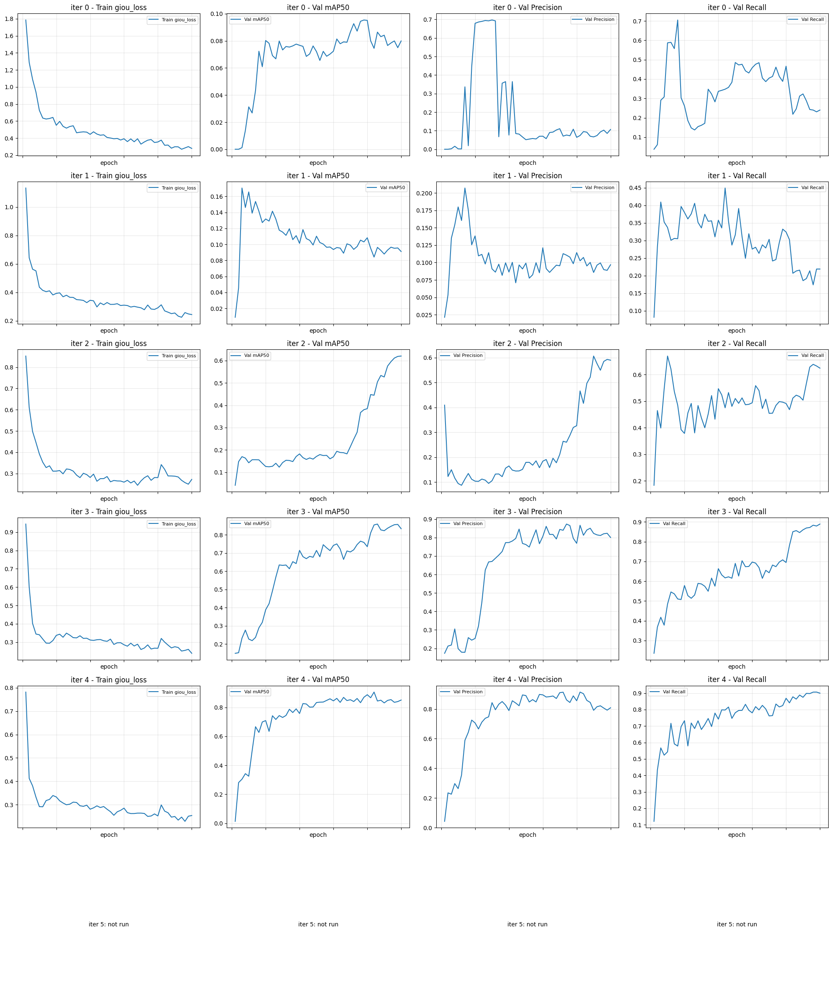

In [9]:
import matplotlib.pyplot as plt

metrics = [
    ('train/giou_loss', 'Train giou_loss'),
    ('metrics/mAP50(B)', 'Val mAP50'),
    ('metrics/precision(B)', 'Val Precision'),
    ('metrics/recall(B)', 'Val Recall'),
]
fig, axes = plt.subplots(6, 4, figsize=(20, 24), sharex=True)
for row, n in enumerate(range(6)):
    res_csv = Path(PROJECT_DIR) / f'rtdetr_l_v5_iter{n}' / 'results.csv'
    for col, (m, lbl) in enumerate(metrics):
        ax = axes[row][col]
        if not res_csv.exists():
            ax.text(0.5, 0.5, f'iter {n}: not run', ha='center', va='center', transform=ax.transAxes)
            ax.axis('off')
            continue
        df = pd.read_csv(res_csv)
        if m in df.columns:
            ax.plot(df['epoch'], df[m], label=lbl)
            ax.set_title(f'iter {n} - {lbl}')
            ax.set_xlabel('epoch')
            ax.legend(loc='best', fontsize=8)
            ax.grid(True, alpha=0.3)
        else:
            ax.text(0.5, 0.5, f'{m}\nnot in results.csv', ha='center', va='center', transform=ax.transAxes)
            ax.axis('off')
plt.tight_layout()
plt.savefig(Path(PROJECT_DIR) / 'iter_comparison_training_curves.png', dpi=120)
plt.show()


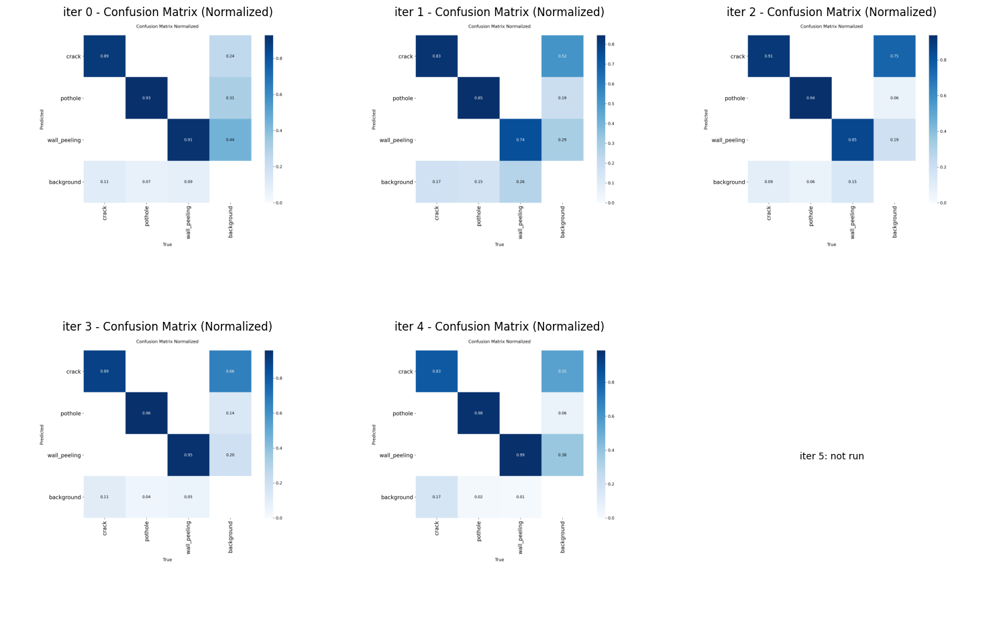

In [10]:
import matplotlib.image as mpimg

fig, axes = plt.subplots(2, 3, figsize=(15, 10))
for n in range(6):
    r, c = n // 3, n % 3
    ax = axes[r][c]
    p = Path(PROJECT_DIR) / f'rtdetr_l_v5_iter{n}' / 'confusion_matrix_normalized.png'
    if p.exists():
        ax.imshow(mpimg.imread(p))
        ax.set_title(f'iter {n} - Confusion Matrix (Normalized)')
    else:
        ax.text(0.5, 0.5, f'iter {n}: not run', ha='center', va='center', transform=ax.transAxes)
    ax.axis('off')
plt.tight_layout()
plt.savefig(Path(PROJECT_DIR) / 'iter_comparison_confusion_matrices.png', dpi=120)
plt.show()


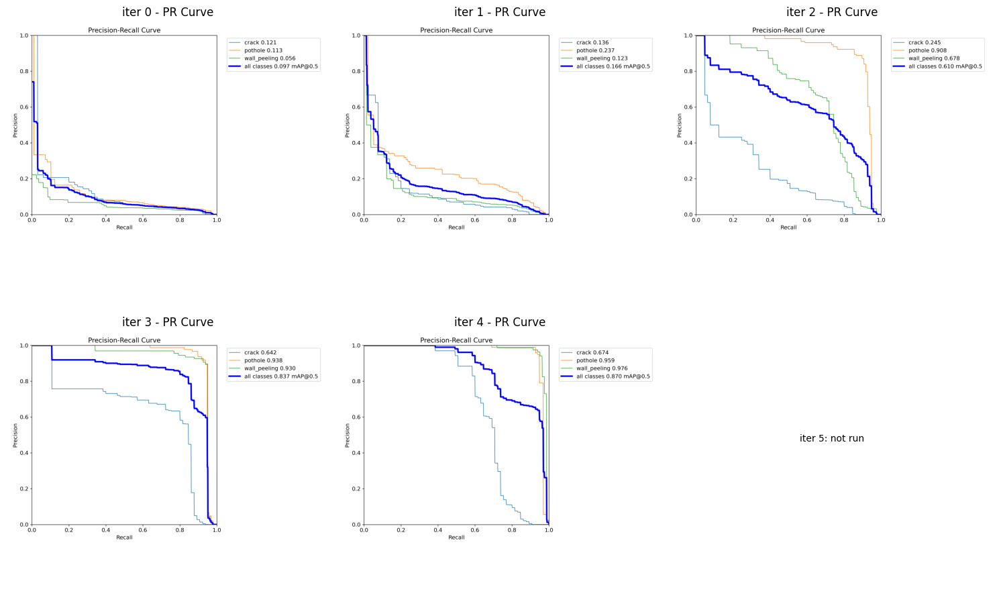

In [11]:
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
for n in range(6):
    r, c = n // 3, n % 3
    ax = axes[r][c]
    p = Path(PROJECT_DIR) / f'rtdetr_l_v5_iter{n}' / 'BoxPR_curve.png'
    if p.exists():
        ax.imshow(mpimg.imread(p))
        ax.set_title(f'iter {n} - PR Curve')
    else:
        ax.text(0.5, 0.5, f'iter {n}: not run', ha='center', va='center', transform=ax.transAxes)
    ax.axis('off')
plt.tight_layout()
plt.savefig(Path(PROJECT_DIR) / 'iter_comparison_pr_curves.png', dpi=120)
plt.show()


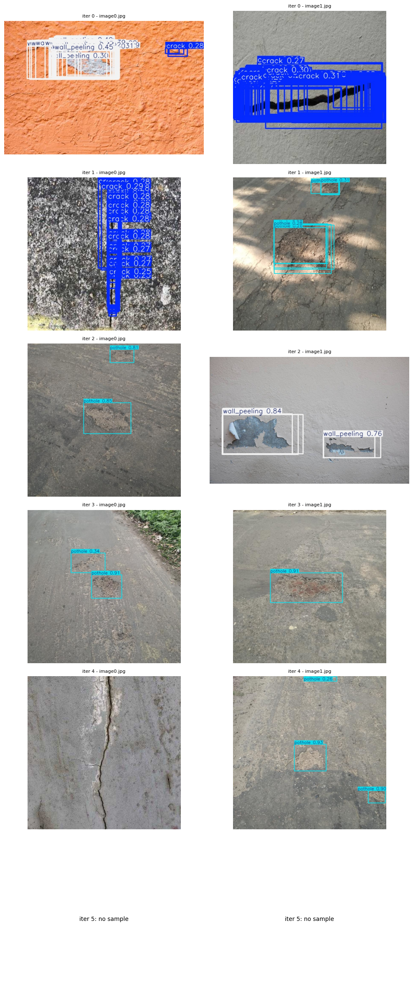

In [12]:
fig, axes = plt.subplots(6, 2, figsize=(10, 24))
for n in range(6):
    sample_dir = Path(PROJECT_DIR) / f'rtdetr_l_v5_iter{n}_samples'
    samples = sorted(sample_dir.glob('*.jpg'))[:2] if sample_dir.exists() else []
    for col in range(2):
        ax = axes[n][col]
        if col < len(samples):
            ax.imshow(mpimg.imread(samples[col]))
            ax.set_title(f'iter {n} - {samples[col].name}', fontsize=8)
        else:
            ax.text(0.5, 0.5, f'iter {n}: no sample', ha='center', va='center', transform=ax.transAxes)
        ax.axis('off')
plt.tight_layout()
plt.savefig(Path(PROJECT_DIR) / 'iter_comparison_samples.png', dpi=120)
plt.show()


In [13]:
print('Per-class AP@50 across iters:')
header = f'{"class":<15}' + ''.join(f'iter{i}'.rjust(10) for i in range(6))
print(header)
for cls in CLASS_NAMES:
    row = [cls.ljust(15)]
    for n in range(6):
        summary = Path(PROJECT_DIR) / f'rtdetr_l_v5_iter{n}_summary.json'
        if summary.exists():
            v = json.loads(summary.read_text(encoding='utf-8'))['per_class_ap50'].get(cls)
            row.append(f'{v:.4f}'.rjust(10) if v is not None else '--'.rjust(10))
        else:
            row.append('--'.rjust(10))
    print(''.join(row))


Per-class AP@50 across iters:
class               iter0     iter1     iter2     iter3     iter4     iter5
crack              0.1210    0.1363    0.2444    0.6586    0.6735        --
pothole            0.1112    0.2378    0.9070    0.9282    0.9605        --
wall_peeling       0.0558    0.1236    0.6809    0.9304    0.9766        --


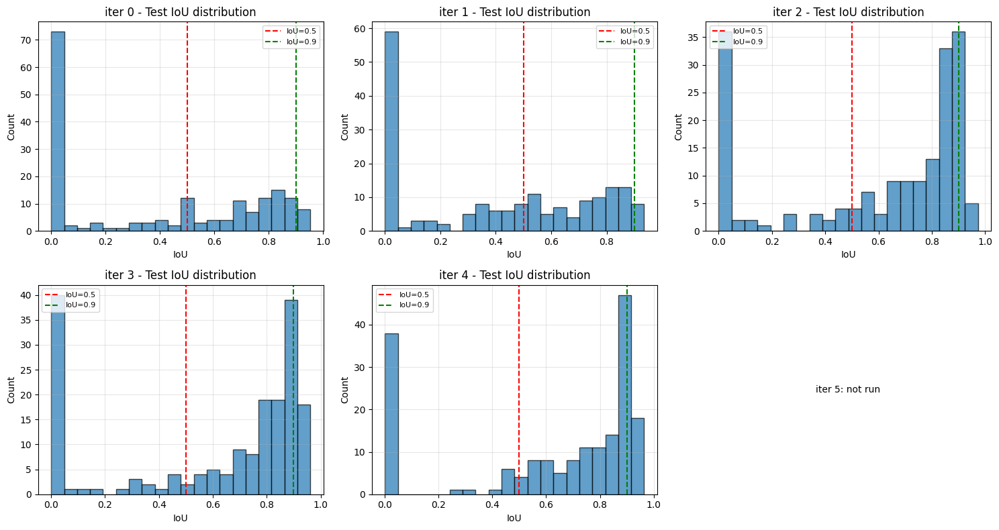

In [14]:
fig, axes = plt.subplots(2, 3, figsize=(15, 8))
for n in range(6):
    r, c = n // 3, n % 3
    ax = axes[r][c]
    iou_csv = Path(PROJECT_DIR) / f'rtdetr_l_v5_iter{n}_test_iou.csv'
    if iou_csv.exists():
        df = pd.read_csv(iou_csv)
        ax.hist(df['iou'], bins=20, edgecolor='black', alpha=0.7)
        ax.set_title(f'iter {n} - Test IoU distribution')
        ax.set_xlabel('IoU')
        ax.set_ylabel('Count')
        ax.axvline(0.5, color='red', linestyle='--', label='IoU=0.5')
        ax.axvline(0.9, color='green', linestyle='--', label='IoU=0.9')
        ax.legend(fontsize=8)
        ax.grid(True, alpha=0.3)
    else:
        ax.text(0.5, 0.5, f'iter {n}: not run', ha='center', va='center', transform=ax.transAxes)
        ax.axis('off')
plt.tight_layout()
plt.savefig(Path(PROJECT_DIR) / 'iter_comparison_iou_distribution.png', dpi=120)
plt.show()


## Final Model Evaluation — Best Iter


In [15]:
if BEST_WEIGHTS is None or not Path(BEST_WEIGHTS).exists():
    raise RuntimeError(f'Best iter weights not found: {BEST_WEIGHTS}. Run the iter loop first.')
print(f'Loading best iter weights: {BEST_WEIGHTS}')
trained_model = RTDETR(BEST_WEIGHTS)
print(f'Loaded model from iter {BEST_ITER} (run: {BEST_RUN_NAME})')


Loading best iter weights: /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v5_iter4/weights/best.pt
Loaded model from iter 4 (run: rtdetr_l_v5_iter4)


## Evaluation on Test Set

In [16]:
test_metrics = trained_model.val(
    data=DATASET_YAML,
    split='test',
    plots=True,
    project=PROJECT_DIR,
    name=f'{BEST_RUN_NAME}_test',
    exist_ok=True,
)

print("\n--- Test Metrics ---")
print(f"mAP@50:     {test_metrics.box.map50:.4f}")
print(f"mAP@50-95:  {test_metrics.box.map:.4f}")
print(f"Precision:  {test_metrics.box.mp:.4f}")
print(f"Recall:     {test_metrics.box.mr:.4f}")
print(f"\nPer-class AP@50:")
for i, name in enumerate(CLASS_NAMES):
    print(f"  {name}: {test_metrics.box.ap50[i]:.4f}")

Ultralytics 8.4.56 🚀 Python-3.9.25 torch-2.8.0+cu128 CUDA:0 (NVIDIA A100-SXM4-80GB, 81153MiB)


rt-detr-l summary: 310 layers, 31,989,905 parameters, 0 gradients, 103.4 GFLOPs


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 132.7±116.3 MB/s, size: 57.9 KB)


val: Scanning /home/achin/COS40007-Group/dataset/test/labels... 119 images, 11 backgrounds, 0 corrupt: 66% ━━━━━━━╸──── 119/181 343.1it/s 0.1s<0.2s

val: Scanning /home/achin/COS40007-Group/dataset/test/labels... 181 images, 18 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 181/181 1.2Kit/s 0.1s

val: New cache created: /home/achin/COS40007-Group/dataset/test/labels.cache


/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 8% ━─────────── 1/12 1.8s/it 0.5s<19.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 2/12 1.2it/s 0.9s<8.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 3/12 1.9it/s 1.2s<4.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 4/12 2.7it/s 1.4s<3.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 5/12 4.7it/s 1.5s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 6/12 6.1it/s 1.6s<1.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━━───── 7/12 6.6it/s 1.8s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 67% ━━━━━━━━──── 8/12 7.5it/s 1.9s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 9/12 7.5it/s 2.0s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━━── 10/12 8.1it/s 2.1s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 92% ━━━━━━━━━━━─ 11/12 8.5it/s 2.2s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 5.2it/s 2.3s

                   all        181        264      0.842      0.776      0.822      0.525


                 crack         53         66       0.76      0.545      0.626      0.218


               pothole         55        120      0.874      0.925      0.925      0.662


          wall_peeling         55         78      0.891      0.859      0.915      0.695


Speed: 0.6ms preprocess, 6.1ms inference, 0.0ms loss, 0.4ms postprocess per image


Results saved to /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v5_iter4_test



--- Test Metrics ---
mAP@50:     0.8217
mAP@50-95:  0.5247
Precision:  0.8416
Recall:     0.7765

Per-class AP@50:
  crack: 0.6258
  pothole: 0.9248
  wall_peeling: 0.9145


## Training Curves

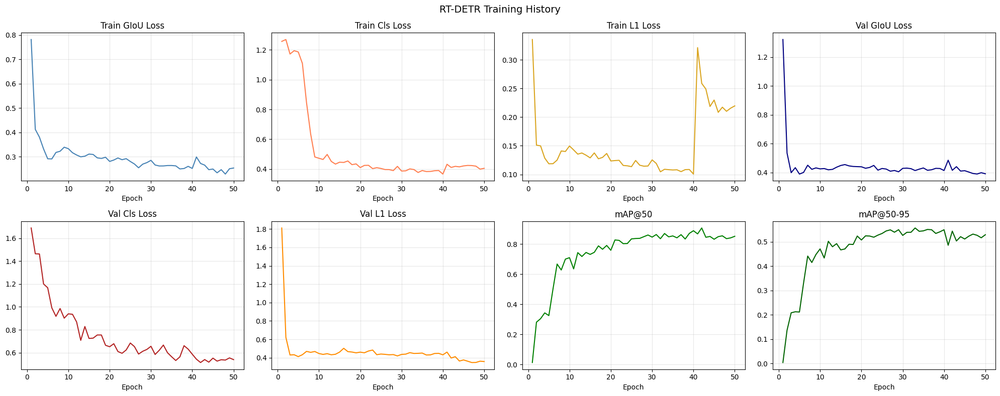

In [17]:
import pandas as pd
import matplotlib.image as mpimg

results_csv = os.path.join(PROJECT_DIR, BEST_RUN_NAME, 'results.csv')
df = pd.read_csv(results_csv)
df.columns = df.columns.str.strip()

plots = [
    ('train/giou_loss',       'Train GIoU Loss',  'steelblue'),
    ('train/cls_loss',        'Train Cls Loss',   'coral'),
    ('train/l1_loss',         'Train L1 Loss',    'goldenrod'),
    ('val/giou_loss',         'Val GIoU Loss',    'navy'),
    ('val/cls_loss',          'Val Cls Loss',     'firebrick'),
    ('val/l1_loss',           'Val L1 Loss',      'darkorange'),
    ('metrics/mAP50(B)',      'mAP@50',           'green'),
    ('metrics/mAP50-95(B)',   'mAP@50-95',        'darkgreen'),
    ('metrics/precision(B)',  'Precision',        'purple'),
    ('metrics/recall(B)',     'Recall',           'orange'),
    ('lr/pg0',                'LR (backbone)',    'gray'),
    ('lr/pg1',                'LR (weights)',     'darkgray'),
]

fig, axes = plt.subplots(2, 4, figsize=(20, 8))
for ax, (col, title, color) in zip(axes.flatten(), plots):
    if col in df.columns:
        ax.plot(df['epoch'], df[col], color=color, linewidth=1.5)
        ax.set_title(title)
        ax.set_xlabel('Epoch')
        ax.grid(True, alpha=0.3)
    else:
        ax.set_title(f'{title} (not found)')
        ax.axis('off')

plt.suptitle('RT-DETR Training History', fontsize=14)
plt.tight_layout()
plt.savefig(os.path.join(PROJECT_DIR, 'training_curves.png'), dpi=150)
plt.show()

## Inference and Visualisation on Test Images

image 1/181 /home/achin/COS40007-Group/dataset/test/images/crack-002.jpg: 640x640 15 cracks, 19.4ms


image 2/181 /home/achin/COS40007-Group/dataset/test/images/crack-008.jpg: 640x640 1 crack, 19.3ms


image 3/181 /home/achin/COS40007-Group/dataset/test/images/crack-009.jpg: 640x640 (no detections), 19.3ms


image 4/181 /home/achin/COS40007-Group/dataset/test/images/crack-014.jpg: 640x640 2 cracks, 20.1ms


image 5/181 /home/achin/COS40007-Group/dataset/test/images/crack-016.jpg: 640x640 15 cracks, 19.1ms


image 6/181 /home/achin/COS40007-Group/dataset/test/images/crack-018.jpg: 640x640 1 crack, 19.2ms


image 7/181 /home/achin/COS40007-Group/dataset/test/images/crack-019.jpg: 640x640 1 crack, 19.3ms


image 8/181 /home/achin/COS40007-Group/dataset/test/images/crack-021.jpg: 640x640 2 cracks, 20.0ms


image 9/181 /home/achin/COS40007-Group/dataset/test/images/crack-027.jpg: 640x640 1 crack, 19.3ms


image 10/181 /home/achin/COS40007-Group/dataset/test/images/crack-044.jpg: 640x640 1 crack, 19.3ms


image 11/181 /home/achin/COS40007-Group/dataset/test/images/crack-049.jpg: 640x640 1 crack, 19.3ms


image 12/181 /home/achin/COS40007-Group/dataset/test/images/crack-055.jpg: 640x640 1 crack, 19.2ms


image 13/181 /home/achin/COS40007-Group/dataset/test/images/crack-058.jpg: 640x640 1 crack, 19.3ms


image 14/181 /home/achin/COS40007-Group/dataset/test/images/crack-062.jpg: 640x640 (no detections), 19.2ms


image 15/181 /home/achin/COS40007-Group/dataset/test/images/crack-063.jpg: 640x640 3 cracks, 19.2ms


image 16/181 /home/achin/COS40007-Group/dataset/test/images/crack-066.jpg: 640x640 1 crack, 19.4ms


image 17/181 /home/achin/COS40007-Group/dataset/test/images/crack-073.jpg: 640x640 2 cracks, 19.2ms


image 18/181 /home/achin/COS40007-Group/dataset/test/images/crack-077.jpg: 640x640 2 cracks, 19.2ms


image 19/181 /home/achin/COS40007-Group/dataset/test/images/crack-082.jpg: 640x640 27 cracks, 19.1ms


image 20/181 /home/achin/COS40007-Group/dataset/test/images/crack-083.jpg: 640x640 (no detections), 19.2ms


image 21/181 /home/achin/COS40007-Group/dataset/test/images/crack-086.jpg: 640x640 1 crack, 19.1ms


image 22/181 /home/achin/COS40007-Group/dataset/test/images/crack-095.jpg: 640x640 7 cracks, 19.2ms


image 23/181 /home/achin/COS40007-Group/dataset/test/images/crack-099.jpg: 640x640 9 cracks, 19.3ms


image 24/181 /home/achin/COS40007-Group/dataset/test/images/crack-106.jpg: 640x640 40 cracks, 19.3ms


image 25/181 /home/achin/COS40007-Group/dataset/test/images/crack-107.jpg: 640x640 5 cracks, 3 wall_peelings, 19.3ms


image 26/181 /home/achin/COS40007-Group/dataset/test/images/crack-109.jpg: 640x640 1 crack, 19.3ms


image 27/181 /home/achin/COS40007-Group/dataset/test/images/crack-111.jpg: 640x640 1 crack, 19.3ms


image 28/181 /home/achin/COS40007-Group/dataset/test/images/crack-112.jpg: 640x640 (no detections), 19.5ms


image 29/181 /home/achin/COS40007-Group/dataset/test/images/crack-115.jpg: 640x640 16 cracks, 19.2ms


image 30/181 /home/achin/COS40007-Group/dataset/test/images/crack-119.jpg: 640x640 23 cracks, 19.3ms


image 31/181 /home/achin/COS40007-Group/dataset/test/images/crack-127.jpg: 640x640 2 cracks, 19.3ms


image 32/181 /home/achin/COS40007-Group/dataset/test/images/crack-129.jpg: 640x640 1 crack, 19.3ms


image 33/181 /home/achin/COS40007-Group/dataset/test/images/crack-133.jpg: 640x640 1 crack, 19.2ms


image 34/181 /home/achin/COS40007-Group/dataset/test/images/crack-135.jpg: 640x640 1 crack, 19.4ms


image 35/181 /home/achin/COS40007-Group/dataset/test/images/crack-138.jpg: 640x640 11 cracks, 19.2ms


image 36/181 /home/achin/COS40007-Group/dataset/test/images/crack-142.jpg: 640x640 14 cracks, 19.2ms


image 37/181 /home/achin/COS40007-Group/dataset/test/images/crack-143.jpg: 640x640 5 cracks, 19.2ms


image 38/181 /home/achin/COS40007-Group/dataset/test/images/crack-145.jpg: 640x640 5 cracks, 19.4ms


image 39/181 /home/achin/COS40007-Group/dataset/test/images/crack-150.jpg: 640x640 1 crack, 19.2ms


image 40/181 /home/achin/COS40007-Group/dataset/test/images/crack-155.jpg: 640x640 8 cracks, 19.3ms


image 41/181 /home/achin/COS40007-Group/dataset/test/images/crack-157.jpg: 640x640 1 crack, 19.2ms


image 42/181 /home/achin/COS40007-Group/dataset/test/images/crack-160.jpg: 640x640 1 crack, 19.4ms


image 43/181 /home/achin/COS40007-Group/dataset/test/images/crack-161.jpg: 640x640 2 cracks, 19.2ms


image 44/181 /home/achin/COS40007-Group/dataset/test/images/crack-162.jpg: 640x640 3 cracks, 19.2ms


image 45/181 /home/achin/COS40007-Group/dataset/test/images/crack-171.jpg: 640x640 3 cracks, 19.3ms


image 46/181 /home/achin/COS40007-Group/dataset/test/images/crack-174.jpg: 640x640 10 cracks, 19.8ms


image 47/181 /home/achin/COS40007-Group/dataset/test/images/crack-177.jpg: 640x640 7 cracks, 19.2ms


image 48/181 /home/achin/COS40007-Group/dataset/test/images/crack-179.jpg: 640x640 1 crack, 3 potholes, 19.2ms


image 49/181 /home/achin/COS40007-Group/dataset/test/images/crack-183.jpg: 640x640 1 crack, 19.3ms


image 50/181 /home/achin/COS40007-Group/dataset/test/images/crack-185.jpg: 640x640 1 crack, 19.4ms


image 51/181 /home/achin/COS40007-Group/dataset/test/images/crack-187.jpg: 640x640 9 cracks, 13 wall_peelings, 19.8ms


image 52/181 /home/achin/COS40007-Group/dataset/test/images/crack-189.jpg: 640x640 7 cracks, 19.2ms


image 53/181 /home/achin/COS40007-Group/dataset/test/images/crack-190.jpg: 640x640 52 cracks, 19.3ms


image 54/181 /home/achin/COS40007-Group/dataset/test/images/pothole-003.jpg: 640x640 1 pothole, 19.3ms


image 55/181 /home/achin/COS40007-Group/dataset/test/images/pothole-004.jpg: 640x640 1 pothole, 19.6ms


image 56/181 /home/achin/COS40007-Group/dataset/test/images/pothole-006.jpg: 640x640 2 potholes, 19.4ms


image 57/181 /home/achin/COS40007-Group/dataset/test/images/pothole-008.jpg: 640x640 8 potholes, 19.5ms


image 58/181 /home/achin/COS40007-Group/dataset/test/images/pothole-009.jpg: 640x640 6 potholes, 19.6ms


image 59/181 /home/achin/COS40007-Group/dataset/test/images/pothole-014.jpg: 640x640 1 pothole, 19.7ms


image 60/181 /home/achin/COS40007-Group/dataset/test/images/pothole-017.jpg: 640x640 4 potholes, 19.4ms


image 61/181 /home/achin/COS40007-Group/dataset/test/images/pothole-021.jpg: 640x640 3 potholes, 19.4ms


image 62/181 /home/achin/COS40007-Group/dataset/test/images/pothole-022.jpg: 640x640 10 potholes, 19.6ms


image 63/181 /home/achin/COS40007-Group/dataset/test/images/pothole-024.jpg: 640x640 3 potholes, 19.4ms


image 64/181 /home/achin/COS40007-Group/dataset/test/images/pothole-025.jpg: 640x640 4 potholes, 19.3ms


image 65/181 /home/achin/COS40007-Group/dataset/test/images/pothole-034.jpg: 640x640 2 potholes, 19.4ms


image 66/181 /home/achin/COS40007-Group/dataset/test/images/pothole-035.jpg: 640x640 5 potholes, 20.1ms


image 67/181 /home/achin/COS40007-Group/dataset/test/images/pothole-038.jpg: 640x640 4 potholes, 19.4ms


image 68/181 /home/achin/COS40007-Group/dataset/test/images/pothole-043.jpg: 640x640 1 pothole, 19.3ms


image 69/181 /home/achin/COS40007-Group/dataset/test/images/pothole-045.jpg: 640x640 1 pothole, 19.3ms


image 70/181 /home/achin/COS40007-Group/dataset/test/images/pothole-050.jpg: 640x640 1 pothole, 19.9ms


image 71/181 /home/achin/COS40007-Group/dataset/test/images/pothole-053.jpg: 640x640 2 potholes, 19.5ms


image 72/181 /home/achin/COS40007-Group/dataset/test/images/pothole-055.jpg: 640x640 3 potholes, 19.5ms


image 73/181 /home/achin/COS40007-Group/dataset/test/images/pothole-064.jpg: 640x640 1 pothole, 19.3ms


image 74/181 /home/achin/COS40007-Group/dataset/test/images/pothole-065.jpg: 640x640 9 potholes, 19.9ms


image 75/181 /home/achin/COS40007-Group/dataset/test/images/pothole-089.jpg: 640x640 8 potholes, 19.4ms


image 76/181 /home/achin/COS40007-Group/dataset/test/images/pothole-097.jpg: 640x640 1 pothole, 19.4ms


image 77/181 /home/achin/COS40007-Group/dataset/test/images/pothole-099.jpg: 640x640 3 potholes, 19.4ms


image 78/181 /home/achin/COS40007-Group/dataset/test/images/pothole-100.jpg: 640x640 3 potholes, 19.9ms


image 79/181 /home/achin/COS40007-Group/dataset/test/images/pothole-104.jpg: 640x640 3 potholes, 19.4ms


image 80/181 /home/achin/COS40007-Group/dataset/test/images/pothole-106.jpg: 640x640 13 potholes, 19.4ms


image 81/181 /home/achin/COS40007-Group/dataset/test/images/pothole-111.jpg: 640x640 (no detections), 19.4ms


image 82/181 /home/achin/COS40007-Group/dataset/test/images/pothole-115.jpg: 640x640 3 potholes, 20.1ms


image 83/181 /home/achin/COS40007-Group/dataset/test/images/pothole-116.jpg: 640x640 1 pothole, 19.5ms


image 84/181 /home/achin/COS40007-Group/dataset/test/images/pothole-120.jpg: 640x640 5 potholes, 19.5ms


image 85/181 /home/achin/COS40007-Group/dataset/test/images/pothole-123.jpg: 640x640 5 potholes, 19.4ms


image 86/181 /home/achin/COS40007-Group/dataset/test/images/pothole-126.jpg: 640x640 2 potholes, 19.8ms


image 87/181 /home/achin/COS40007-Group/dataset/test/images/pothole-127.jpg: 640x640 3 potholes, 19.4ms


image 88/181 /home/achin/COS40007-Group/dataset/test/images/pothole-133.jpg: 640x640 2 potholes, 19.5ms


image 89/181 /home/achin/COS40007-Group/dataset/test/images/pothole-140.jpg: 640x640 3 potholes, 19.6ms


image 90/181 /home/achin/COS40007-Group/dataset/test/images/pothole-151.jpg: 640x640 7 potholes, 20.0ms


image 91/181 /home/achin/COS40007-Group/dataset/test/images/pothole-152.jpg: 640x640 1 pothole, 19.5ms


image 92/181 /home/achin/COS40007-Group/dataset/test/images/pothole-156.jpg: 640x640 1 crack, 3 potholes, 19.4ms


image 93/181 /home/achin/COS40007-Group/dataset/test/images/pothole-157.jpg: 640x640 2 potholes, 19.4ms


image 94/181 /home/achin/COS40007-Group/dataset/test/images/pothole-159.jpg: 640x640 3 potholes, 19.6ms


image 95/181 /home/achin/COS40007-Group/dataset/test/images/pothole-162.jpg: 640x640 7 potholes, 19.9ms


image 96/181 /home/achin/COS40007-Group/dataset/test/images/pothole-165.jpg: 640x640 3 potholes, 20.1ms


image 97/181 /home/achin/COS40007-Group/dataset/test/images/pothole-168.jpg: 640x640 3 potholes, 19.4ms


image 98/181 /home/achin/COS40007-Group/dataset/test/images/pothole-169.jpg: 640x640 3 potholes, 19.4ms


image 99/181 /home/achin/COS40007-Group/dataset/test/images/pothole-171.jpg: 640x640 2 potholes, 19.4ms


image 100/181 /home/achin/COS40007-Group/dataset/test/images/pothole-174.jpg: 640x640 2 potholes, 19.5ms


image 101/181 /home/achin/COS40007-Group/dataset/test/images/pothole-175.jpg: 640x640 3 potholes, 19.3ms


image 102/181 /home/achin/COS40007-Group/dataset/test/images/pothole-177.jpg: 640x640 2 potholes, 19.4ms


image 103/181 /home/achin/COS40007-Group/dataset/test/images/pothole-178.jpg: 640x640 3 potholes, 19.3ms


image 104/181 /home/achin/COS40007-Group/dataset/test/images/pothole-180.jpg: 640x640 2 potholes, 20.1ms


image 105/181 /home/achin/COS40007-Group/dataset/test/images/pothole-193.jpg: 640x640 5 potholes, 19.5ms


image 106/181 /home/achin/COS40007-Group/dataset/test/images/pothole-196.jpg: 640x640 5 potholes, 19.3ms


image 107/181 /home/achin/COS40007-Group/dataset/test/images/pothole-197.jpg: 640x640 1 pothole, 19.3ms


image 108/181 /home/achin/COS40007-Group/dataset/test/images/pothole-198.jpg: 640x640 4 potholes, 19.4ms


image 109/181 /home/achin/COS40007-Group/dataset/test/images/road-007.jpg: 640x640 (no detections), 19.7ms


image 110/181 /home/achin/COS40007-Group/dataset/test/images/road-016.jpg: 640x640 (no detections), 20.8ms


image 111/181 /home/achin/COS40007-Group/dataset/test/images/road-019.jpg: 640x640 (no detections), 20.7ms


image 112/181 /home/achin/COS40007-Group/dataset/test/images/road-023.jpg: 640x640 (no detections), 20.5ms


image 113/181 /home/achin/COS40007-Group/dataset/test/images/road-024.jpg: 640x640 (no detections), 20.7ms


image 114/181 /home/achin/COS40007-Group/dataset/test/images/road-026.jpg: 640x640 (no detections), 21.0ms


image 115/181 /home/achin/COS40007-Group/dataset/test/images/road-039.jpg: 640x640 (no detections), 20.8ms


image 116/181 /home/achin/COS40007-Group/dataset/test/images/road-045.jpg: 640x640 (no detections), 20.5ms


image 117/181 /home/achin/COS40007-Group/dataset/test/images/road-053.jpg: 640x640 (no detections), 21.0ms


image 118/181 /home/achin/COS40007-Group/dataset/test/images/wall-020.jpg: 640x640 (no detections), 19.9ms


image 119/181 /home/achin/COS40007-Group/dataset/test/images/wall-023.jpg: 640x640 (no detections), 19.4ms


image 120/181 /home/achin/COS40007-Group/dataset/test/images/wall-026.jpg: 640x640 7 wall_peelings, 19.5ms


image 121/181 /home/achin/COS40007-Group/dataset/test/images/wall-029.jpg: 640x640 (no detections), 20.8ms


image 122/181 /home/achin/COS40007-Group/dataset/test/images/wall-032.jpg: 640x640 (no detections), 20.9ms


image 123/181 /home/achin/COS40007-Group/dataset/test/images/wall-035.jpg: 640x640 (no detections), 20.7ms


image 124/181 /home/achin/COS40007-Group/dataset/test/images/wall-044.jpg: 640x640 (no detections), 20.4ms


image 125/181 /home/achin/COS40007-Group/dataset/test/images/wall-045.jpg: 640x640 6 potholes, 21.0ms


image 126/181 /home/achin/COS40007-Group/dataset/test/images/wall-046.jpg: 640x640 (no detections), 21.8ms


image 127/181 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-002.jpg: 640x640 8 wall_peelings, 21.2ms


image 128/181 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-006.jpg: 640x640 1 wall_peeling, 20.4ms


image 129/181 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-015.jpg: 640x640 15 wall_peelings, 20.0ms


image 130/181 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-016.jpg: 640x640 6 wall_peelings, 19.5ms


image 131/181 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-023.jpg: 640x640 3 potholes, 1 wall_peeling, 19.3ms


image 132/181 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-024.jpg: 640x640 25 wall_peelings, 19.2ms


image 133/181 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-026.jpg: 640x640 1 wall_peeling, 19.8ms


image 134/181 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-028.jpg: 640x640 13 wall_peelings, 19.3ms


image 135/181 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-029.jpg: 640x640 44 wall_peelings, 19.2ms


image 136/181 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-030.jpg: 640x640 18 wall_peelings, 19.2ms


image 137/181 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-037.jpg: 640x640 1 wall_peeling, 19.2ms


image 138/181 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-040.jpg: 640x640 1 wall_peeling, 19.1ms


image 139/181 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-045.jpg: 640x640 4 wall_peelings, 19.8ms


image 140/181 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-051.jpg: 640x640 1 wall_peeling, 19.2ms


image 141/181 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-057.jpg: 640x640 8 wall_peelings, 19.2ms


image 142/181 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-062.jpg: 640x640 17 wall_peelings, 19.2ms


image 143/181 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-063.jpg: 640x640 3 wall_peelings, 19.7ms


image 144/181 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-070.jpg: 640x640 3 wall_peelings, 19.2ms


image 145/181 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-071.jpg: 640x640 20 wall_peelings, 19.2ms


image 146/181 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-075.jpg: 640x640 19 wall_peelings, 19.2ms


image 147/181 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-077.jpg: 640x640 23 cracks, 17 wall_peelings, 19.5ms


image 148/181 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-078.jpg: 640x640 2 wall_peelings, 19.2ms


image 149/181 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-082.jpg: 640x640 1 pothole, 1 wall_peeling, 19.2ms


image 150/181 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-089.jpg: 640x640 1 wall_peeling, 19.1ms


image 151/181 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-092.jpg: 640x640 4 wall_peelings, 20.0ms


image 152/181 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-094.jpg: 640x640 1 wall_peeling, 19.2ms


image 153/181 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-096.jpg: 640x640 2 cracks, 2 wall_peelings, 19.1ms


image 154/181 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-101.jpg: 640x640 1 wall_peeling, 19.2ms


image 155/181 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-102.jpg: 640x640 11 wall_peelings, 19.6ms


image 156/181 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-105.jpg: 640x640 1 wall_peeling, 19.2ms


image 157/181 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-107.jpg: 640x640 1 wall_peeling, 19.2ms


image 158/181 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-109.jpg: 640x640 1 wall_peeling, 19.1ms


image 159/181 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-118.jpg: 640x640 1 wall_peeling, 19.3ms


image 160/181 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-119.jpg: 640x640 2 wall_peelings, 19.2ms


image 161/181 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-121.jpg: 640x640 1 wall_peeling, 19.2ms


image 162/181 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-123.jpg: 640x640 1 wall_peeling, 19.4ms


image 163/181 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-124.jpg: 640x640 2 wall_peelings, 19.2ms


image 164/181 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-128.jpg: 640x640 3 wall_peelings, 19.2ms


image 165/181 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-131.jpg: 640x640 1 wall_peeling, 19.1ms


image 166/181 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-134.jpg: 640x640 59 wall_peelings, 19.2ms


image 167/181 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-139.jpg: 640x640 45 wall_peelings, 19.3ms


image 168/181 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-142.jpg: 640x640 1 wall_peeling, 19.3ms


image 169/181 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-144.jpg: 640x640 1 wall_peeling, 19.5ms


image 170/181 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-145.jpg: 640x640 1 wall_peeling, 19.3ms


image 171/181 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-153.jpg: 640x640 2 wall_peelings, 19.3ms


image 172/181 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-156.jpg: 640x640 2 wall_peelings, 19.3ms


image 173/181 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-167.jpg: 640x640 21 wall_peelings, 19.2ms


image 174/181 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-168.jpg: 640x640 1 wall_peeling, 19.2ms


image 175/181 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-173.jpg: 640x640 4 wall_peelings, 19.6ms


image 176/181 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-179.jpg: 640x640 58 wall_peelings, 19.3ms


image 177/181 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-181.jpg: 640x640 1 wall_peeling, 19.3ms


image 178/181 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-183.jpg: 640x640 1 wall_peeling, 19.1ms


image 179/181 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-185.jpg: 640x640 16 wall_peelings, 19.8ms


image 180/181 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-186.jpg: 640x640 2 wall_peelings, 19.2ms


image 181/181 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-187.jpg: 640x640 1 wall_peeling, 19.2ms


Speed: 1.6ms preprocess, 19.5ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)


Results saved to /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v5_iter4_predictions


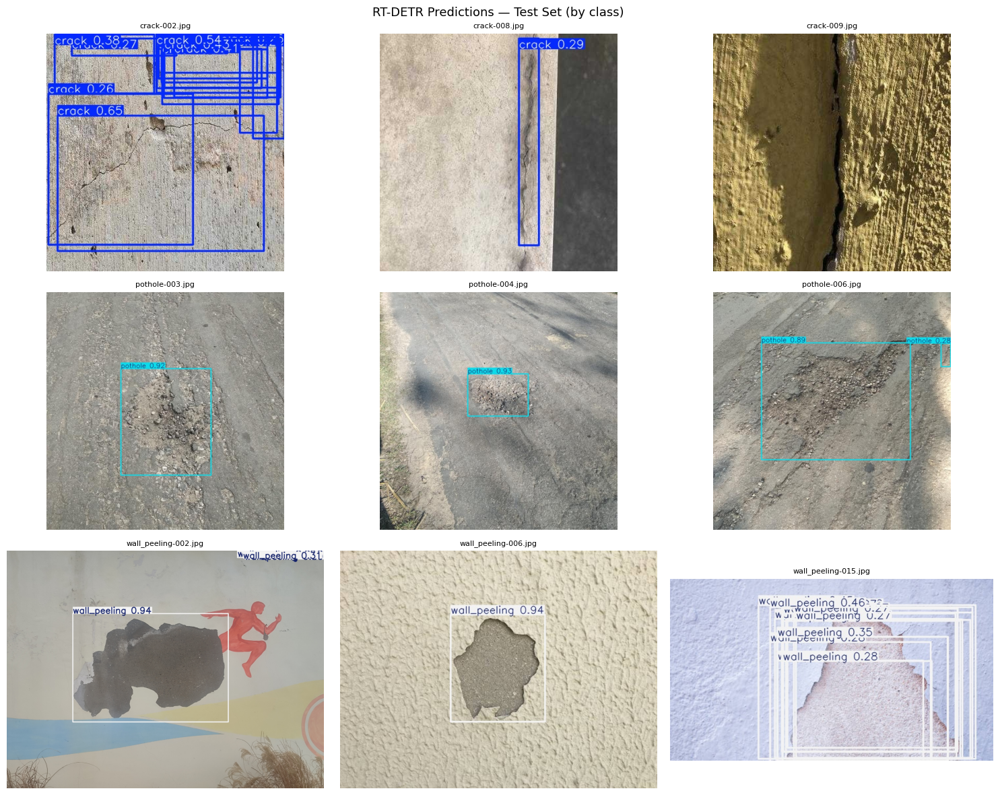

In [18]:
trained_model.predict(
    source=IMAGE_DIRS['test'],
    conf=0.25,
    iou=0.5,
    save=True,
    project=PROJECT_DIR,
    name=f'{BEST_RUN_NAME}_predictions',
    exist_ok=True,
)

pred_dir = Path(PROJECT_DIR) / f'{BEST_RUN_NAME}_predictions'

fig, axes = plt.subplots(NC, 3, figsize=(15, 4 * NC))
for row, cls_name in enumerate(CLASS_NAMES):
    cls_preds = sorted(pred_dir.glob(f'{cls_name}-*.jpg'))[:3]
    for col in range(3):
        ax = axes[row][col]
        ax.axis('off')
        if col < len(cls_preds):
            ax.imshow(mpimg.imread(cls_preds[col]))
            ax.set_title(cls_preds[col].name, fontsize=8)
        else:
            ax.set_title(f'{cls_name} — no prediction saved', fontsize=8)

plt.suptitle('RT-DETR Predictions — Test Set (by class)', fontsize=13)
plt.tight_layout()
plt.savefig(os.path.join(PROJECT_DIR, 'prediction_samples.png'), dpi=150)
plt.show()

## Display Evaluation Plots

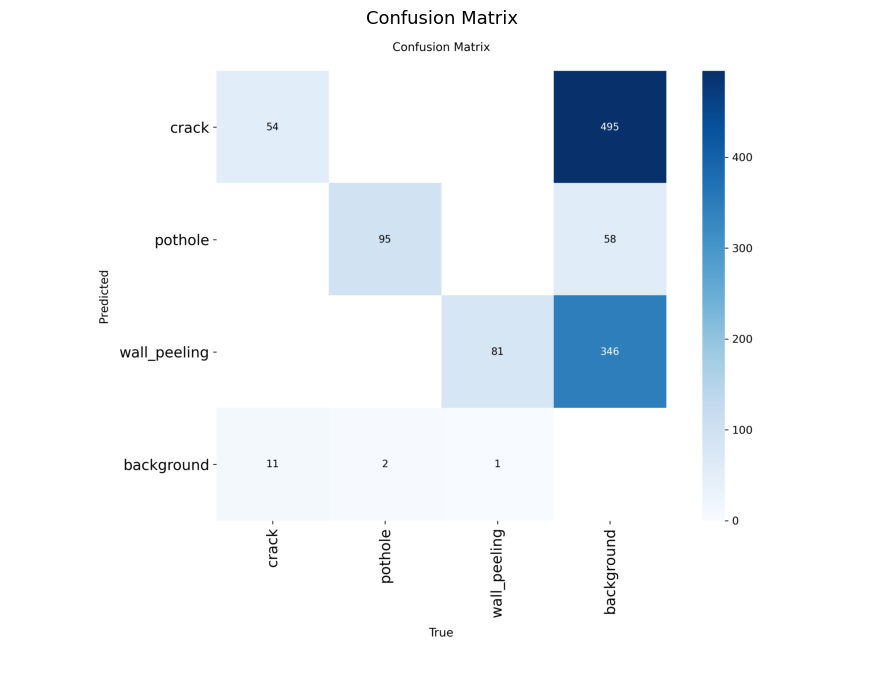

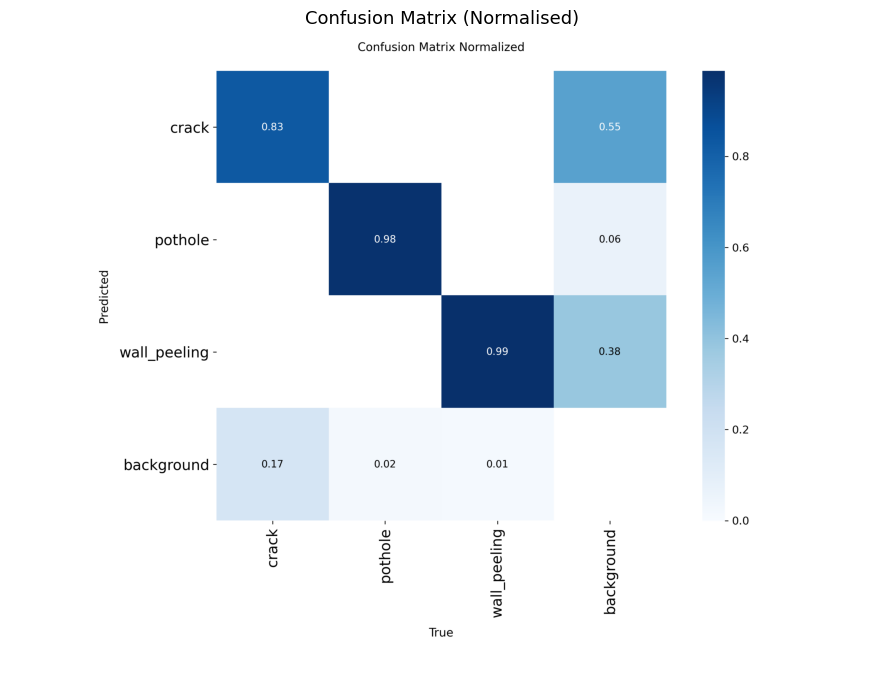

Not yet generated: PR_curve.png
Not yet generated: P_curve.png
Not yet generated: R_curve.png


In [19]:
eval_plots = [
    ('confusion_matrix.png',            'Confusion Matrix'),
    ('confusion_matrix_normalized.png', 'Confusion Matrix (Normalised)'),
    ('PR_curve.png',                    'Precision-Recall Curve'),
    ('P_curve.png',                     'Precision Curve'),
    ('R_curve.png',                     'Recall Curve'),
]

run_dir = Path(PROJECT_DIR) / BEST_RUN_NAME

for filename, title in eval_plots:
    p = run_dir / filename
    if p.exists():
        plt.figure(figsize=(10, 7))
        plt.imshow(mpimg.imread(p))
        plt.title(title, fontsize=13)
        plt.axis('off')
        plt.tight_layout()
        plt.show()
    else:
        print(f"Not yet generated: {filename}")

## Inference Speed Benchmark

In [20]:
import time

test_imgs = list(Path(IMAGE_DIRS['test']).glob('*.jpg'))[:50]

# Warmup
trained_model.predict(source=[str(test_imgs[0])], conf=0.25, verbose=False)

# Timed run
start = time.time()
trained_model.predict(source=[str(p) for p in test_imgs], conf=0.25, verbose=False)
elapsed = time.time() - start

fps = len(test_imgs) / elapsed
print(f"Images tested : {len(test_imgs)}")
print(f"Total time    : {elapsed:.2f}s")
print(f"FPS           : {fps:.1f}")
print(f"ms/image      : {1000/fps:.1f}")

Images tested : 50
Total time    : 0.75s
FPS           : 67.0
ms/image      : 14.9


## Display Evaluation Plots

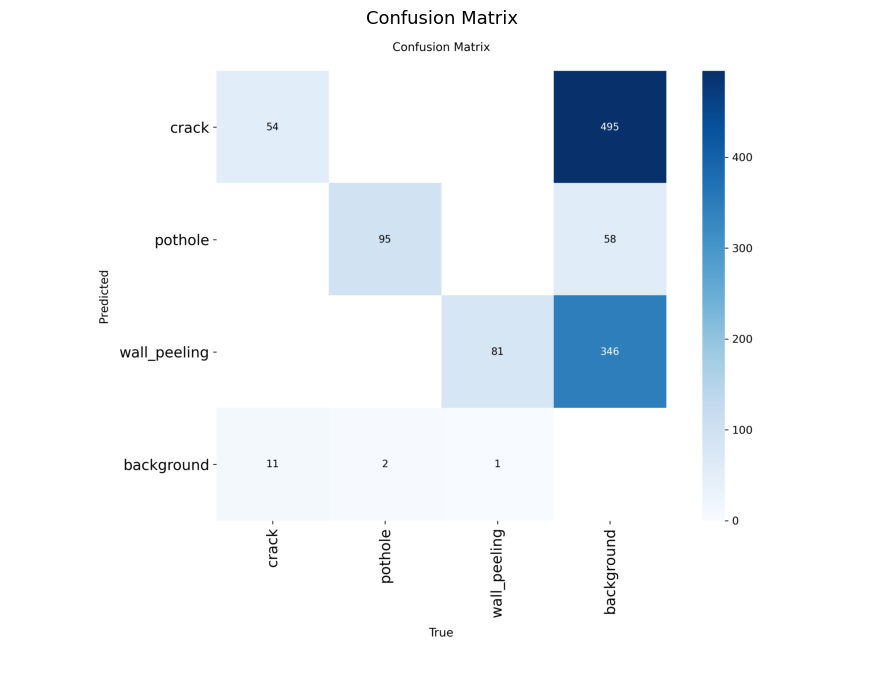

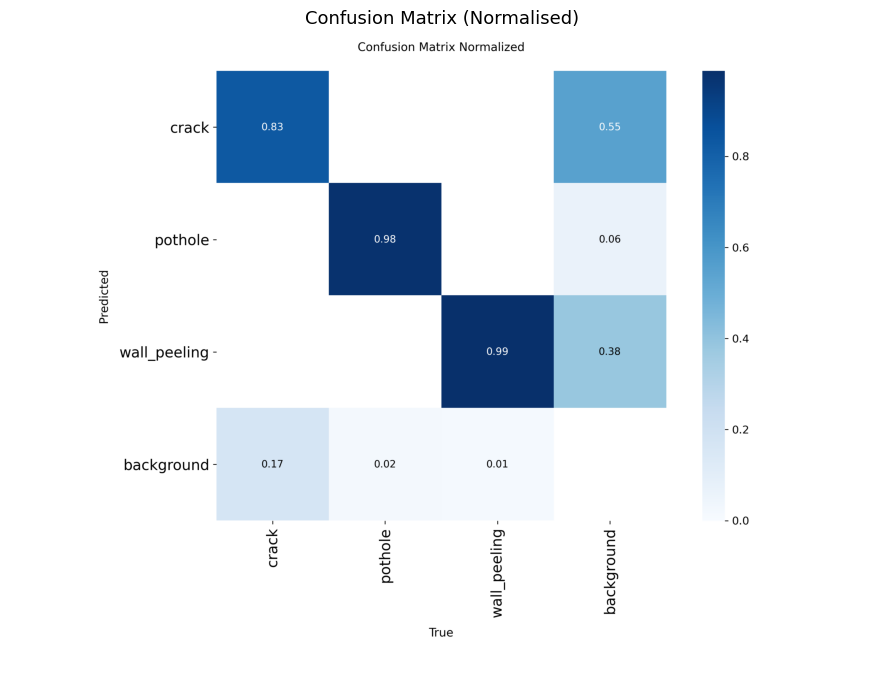

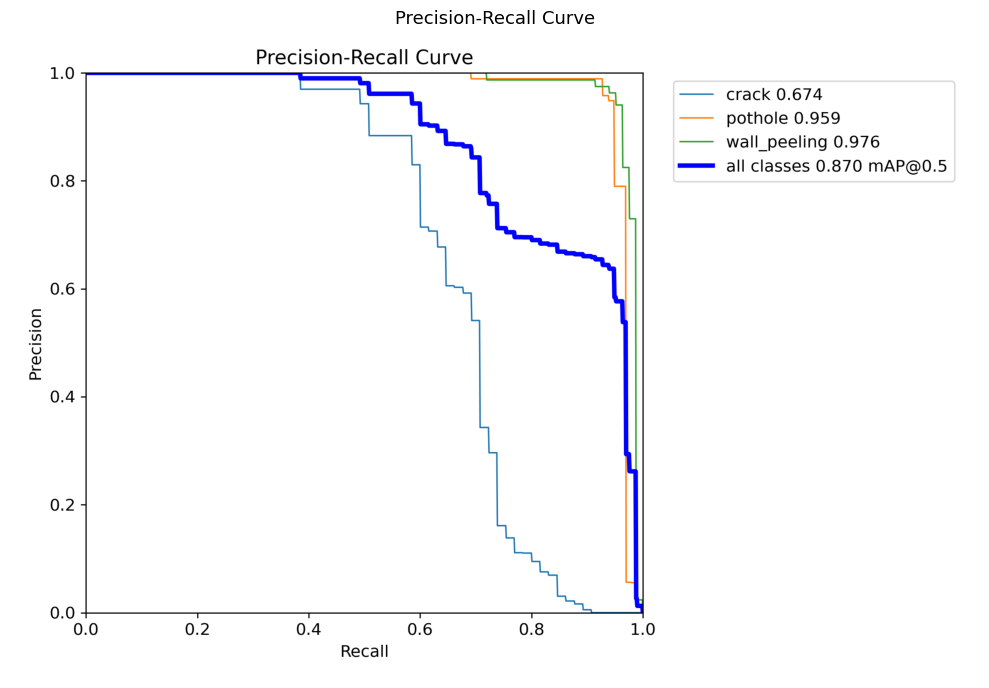

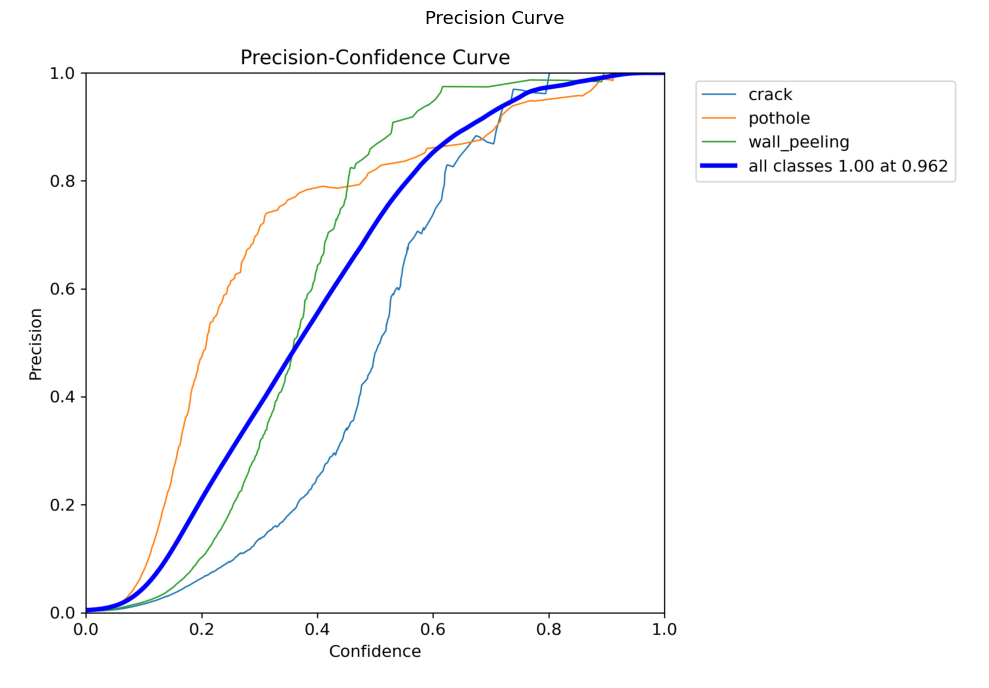

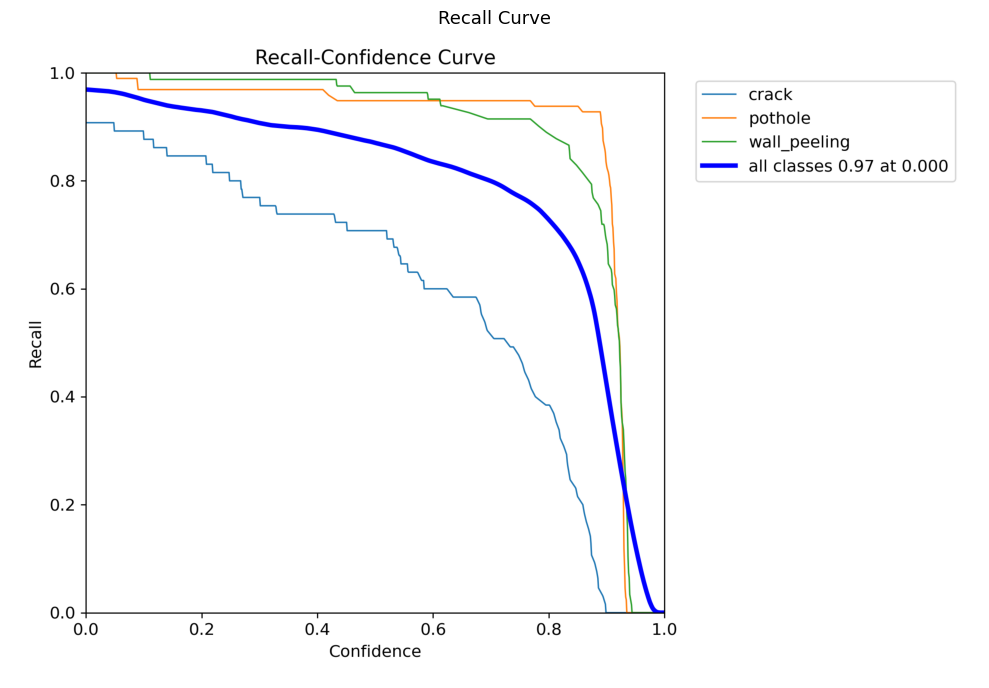

In [21]:
eval_plots = [
    ('confusion_matrix.png',            'Confusion Matrix'),
    ('confusion_matrix_normalized.png', 'Confusion Matrix (Normalised)'),
    ('BoxPR_curve.png',                    'Precision-Recall Curve'),
    ('BoxP_curve.png',                     'Precision Curve'),
    ('BoxR_curve.png',                     'Recall Curve'),
]

run_dir = Path(PROJECT_DIR) / BEST_RUN_NAME

for filename, title in eval_plots:
    p = run_dir / filename
    if p.exists():
        plt.figure(figsize=(10, 7))
        plt.imshow(mpimg.imread(p))
        plt.title(title, fontsize=13)
        plt.axis('off')
        plt.tight_layout()
        plt.show()
    else:
        print(f"Not yet generated: {filename}")